In [1]:
import pandas as pd
# this function generates an item bank, in case the user cannot provide one
from catsim.cat import generate_item_bank
# simulation package contains the Simulator and all abstract classes
from catsim.simulation import *
# initialization package contains different initial proficiency estimation strategies
from catsim.initialization import *
# selection package contains different item selection strategies
from catsim.selection import *
# estimation package contains different proficiency estimation methods
from catsim.estimation import *
# stopping package contains different stopping criteria for the CAT
from catsim.stopping import *
import catsim.plot as catplot
from catsim.irt import icc
from catsim.irt import detect_model


# this function generates an item bank, in case the user cannot provide one
from catsim.cat import generate_item_bank
# simulation package contains the Simulator and all abstract classes
from catsim.simulation import *
# initialization package contains different initial proficiency estimation strategies
from catsim.initialization import *
# selection package contains different item selection strategies
from catsim.selection import *
# estimation package contains different proficiency estimation methods
from catsim.estimation import *
# stopping package contains different stopping criteria for the CAT
from catsim.stopping import *
import catsim.plot as catplot
from catsim.irt import icc

import sys
import torch  
import gym
import numpy as np  
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
import matplotlib.pyplot as plt
import pandas as pd
from statistics import mean

import numpy as np
import matplotlib.pyplot as plt
import PIL.Image as Image
import gym
import random

from gym import Env, spaces
import time

from IPython import display
from random import randint
import statistics
import time

C:\Users\patri\Anaconda3\lib\site-packages\pandas\compat\_optional.py:138: UserWarning: Pandas requires version '2.7.0' or newer of 'numexpr' (version '2.6.9' currently installed).
  warnings.warn(msg, UserWarning)


## Função que avalia os seletores

In [6]:
def avalia_seletor(selector, base_result, alunos, param, items):

#     mu = -4
#     sigma = 0
#     nq = 0

    aluno_vet = list(range(0, len(alunos.index)))

    responses = []
    administered_items = []
    theta_est = []
    erro_theta = []

    #initializer = RandomInitializer()
    estimator = NumericalSearchEstimator()
    #est_theta = initializer.initialize()
    full_items = list(range(0, 45))

#     mu = 0
#     sigma = 0
    nq = 0
    est_theta=0

    result = np.reshape(list(range(0, 45)),(1,45))

    for aluno in aluno_vet:
        nq = 0
        est_theta=0
        print('aluno:', aluno)
        respostas = alunos.iloc[aluno,0:45].tolist()
        ori_theta = estimator.estimate(items=items, administered_items=full_items, response_vector=respostas, est_theta=est_theta)
        #print('Theta Original: ',ori_theta)
        responses = []
        administered_items = []
        theta_est = []
        erro_theta = []
        for nq in range(0, 45):
            item_index = selector.select(items=items, administered_items=administered_items, est_theta=est_theta)

            correct = alunos.iloc[aluno,item_index]
            administered_items.append(item_index)
            responses.append(correct)

            est_theta = estimator.estimate(items=items, administered_items=administered_items, response_vector=responses, est_theta=est_theta)
            #print('Estimated proficiency, given answered items:', est_theta)
            theta_est.append(est_theta)

            erro = ori_theta - est_theta
            #erro_2 = (ori_theta - est_theta)**2
            #print('erro:', erro_2)
            erro_theta.append(erro)

            nq = nq+1
            #print('nq:', nq)

        erro_theta = np.reshape(erro_theta,(1,45))
        result = np.concatenate((result, erro_theta), axis=0)


    # define a legenda e tamanho de linhas
    plt.plot(range(0, 45), np.sqrt(np.mean((result[1:,:])**2,axis=0)), label='Seletor', linewidth=2)
    #plt.plot(range(0, 45), result[2,], label='Aleatorio', linewidth=2)

    plt.xlabel('numero de questões')
    plt.ylabel('RMSE')
    plt.title("Avaliação dos métodos de seleção")

    np.savetxt(base_result, result)

    # Exibe a legenda e por padrão usa o label de cada plot.
    plt.legend()
    plt.show()
    print(selector)
    print(len(alunos.index))

## Calcula theta original de todos os alunos com 45 questões de matemática

In [9]:
def calculatheta(alunos, param, items):

    aluno_vet = list(range(0, len(alunos.index)))

    responses = []
    administered_items = []
    theta_est = []
    erro_theta = []
    theta_orig = []

    #initializer = RandomInitializer()
    estimator = NumericalSearchEstimator()
    #est_theta = initializer.initialize()
    full_items = list(range(0, 45))

    nq = 0
    est_theta=0

    result = np.reshape(list(range(0, 99993)),(1,99993))

    for aluno in aluno_vet: 
        nq = 0
        est_theta=0
        print('Aluno:', aluno)
        respostas = alunos.iloc[aluno,0:45].tolist()
        ori_theta = estimator.estimate(items=items, administered_items=full_items, response_vector=respostas, est_theta=est_theta)
        print('Theta Original: ',ori_theta)
        
        theta_orig.append(ori_theta)

    theta_orig = np.reshape(theta_orig,(1,99993))
    result = np.concatenate((result, theta_orig), axis=0)

    np.savetxt('Result_theta_original-base100000.txt', theta_orig)

In [10]:
alunos = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/file100000.xlsx')
param = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/Calibração/parametros.xlsx')
items = param.iloc[0:45,1:5].to_numpy()

In [11]:
inicio = time.time()
calculatheta(alunos, param, items)
fim = time.time()
print(fim - inicio)

Aluno: 0
Theta Original:  0.7663519221053628
Aluno: 1
Theta Original:  -1.8969088185664846
Aluno: 2
Theta Original:  0.7011734281062331
Aluno: 3
Theta Original:  -2.8241706515258187
Aluno: 4
Theta Original:  -1.1189923809196167
Aluno: 5
Theta Original:  -0.8753723870712212
Aluno: 6
Theta Original:  -2.158072023778154
Aluno: 7
Theta Original:  -3.2243890070252608
Aluno: 8
Theta Original:  0.4716111488062066
Aluno: 9
Theta Original:  0.4675374536412118
Aluno: 10
Theta Original:  0.3933486874601949
Aluno: 11
Theta Original:  -0.5409496331597409
Aluno: 12
Theta Original:  0.3818460178750486
Aluno: 13
Theta Original:  1.6744539666726186
Aluno: 14
Theta Original:  -0.3505438773118733
Aluno: 15
Theta Original:  -0.32773727893579246
Aluno: 16
Theta Original:  1.4240254182440584
Aluno: 17
Theta Original:  -1.1529391669879532
Aluno: 18
Theta Original:  -2.3837672145956432
Aluno: 19
Theta Original:  0.21553123368606092
Aluno: 20
Theta Original:  -0.4428117751274872
Aluno: 21
Theta Original:  -1.7

Aluno: 258
Theta Original:  -0.6484768555467487
Aluno: 259
Theta Original:  -1.2053234563114668
Aluno: 260
Theta Original:  -1.475340506860563
Aluno: 261
Theta Original:  -0.7365374921387042
Aluno: 262
Theta Original:  -0.02086013382343286
Aluno: 263
Theta Original:  -2.1045406123432246
Aluno: 264
Theta Original:  -1.08290192571603
Aluno: 265
Theta Original:  1.345706157441311
Aluno: 266
Theta Original:  0.8234536262545546
Aluno: 267
Theta Original:  1.2275670110349313
Aluno: 268
Theta Original:  -1.3419696265983285
Aluno: 269
Theta Original:  -0.5718570342899769
Aluno: 270
Theta Original:  1.1631933950572362
Aluno: 271
Theta Original:  0.3441983013120692
Aluno: 272
Theta Original:  -1.1926354307013942
Aluno: 273
Theta Original:  -1.0575312725735952
Aluno: 274
Theta Original:  -0.05041218767618887
Aluno: 275
Theta Original:  1.5283619496475631
Aluno: 276
Theta Original:  -2.5226734080757636
Aluno: 277
Theta Original:  0.5962960892612783
Aluno: 278
Theta Original:  -0.9789751509298401
A

Theta Original:  0.6490364859197337
Aluno: 437
Theta Original:  -0.8679155573659213
Aluno: 438
Theta Original:  -0.5837412327611536
Aluno: 439
Theta Original:  -0.055721607567573515
Aluno: 440
Theta Original:  0.32825203944702025
Aluno: 441
Theta Original:  0.4400003377400188
Aluno: 442
Theta Original:  0.38947263673457266
Aluno: 443
Theta Original:  0.7120181711134413
Aluno: 444
Theta Original:  -1.729717170823999
Aluno: 445
Theta Original:  -1.739875693386107
Aluno: 446
Theta Original:  2.284258140300632
Aluno: 447
Theta Original:  -0.5579801000430319
Aluno: 448
Theta Original:  -1.7769461074874389
Aluno: 449
Theta Original:  -0.5630978583329093
Aluno: 450
Theta Original:  1.9777275318376393
Aluno: 451
Theta Original:  -0.5148830123407749
Aluno: 452
Theta Original:  -0.7251266494984904
Aluno: 453
Theta Original:  0.3566504195814743
Aluno: 454
Theta Original:  -0.20117914753372917
Aluno: 455
Theta Original:  0.5833115903661017
Aluno: 456
Theta Original:  -2.1395052378169237
Aluno: 457

Theta Original:  -3.2243860088643133
Aluno: 621
Theta Original:  0.24659008895139123
Aluno: 622
Theta Original:  -3.2243886197936202
Aluno: 623
Theta Original:  0.9600788909440355
Aluno: 624
Theta Original:  -0.5368132506426552
Aluno: 625
Theta Original:  -0.5730139629495948
Aluno: 626
Theta Original:  2.2626622148324995
Aluno: 627
Theta Original:  0.3343878912242216
Aluno: 628
Theta Original:  -0.4181974015626777
Aluno: 629
Theta Original:  -0.03503972966844114
Aluno: 630
Theta Original:  -0.4186520583664471
Aluno: 631
Theta Original:  -0.2686528625915148
Aluno: 632
Theta Original:  1.9399274932167805
Aluno: 633
Theta Original:  -0.2752484687727071
Aluno: 634
Theta Original:  0.7771209357229324
Aluno: 635
Theta Original:  0.7379468075779266
Aluno: 636
Theta Original:  0.41306075260772873
Aluno: 637
Theta Original:  -0.969704863320257
Aluno: 638
Theta Original:  -0.3439458109900767
Aluno: 639
Theta Original:  2.178739878799388
Aluno: 640
Theta Original:  0.810393941409341
Aluno: 641
Th

Theta Original:  0.4069853822802139
Aluno: 794
Theta Original:  0.978819675889434
Aluno: 795
Theta Original:  0.4583230061219659
Aluno: 796
Theta Original:  -0.6637012397247215
Aluno: 797
Theta Original:  0.21324295026117412
Aluno: 798
Theta Original:  0.4007295807461087
Aluno: 799
Theta Original:  -1.752846185678123
Aluno: 800
Theta Original:  -3.22438625121199
Aluno: 801
Theta Original:  -0.8376394175
Aluno: 802
Theta Original:  1.2184150667362719
Aluno: 803
Theta Original:  0.6029211218142613
Aluno: 804
Theta Original:  0.7510528852580843
Aluno: 805
Theta Original:  1.2352307675175513
Aluno: 806
Theta Original:  0.29754618261989146
Aluno: 807
Theta Original:  0.14659115596222771
Aluno: 808
Theta Original:  2.483211812889929
Aluno: 809
Theta Original:  1.2946073968498293
Aluno: 810
Theta Original:  -1.3537387335070425
Aluno: 811
Theta Original:  -3.2243869342200724
Aluno: 812
Theta Original:  -0.17639556811904492
Aluno: 813
Theta Original:  -1.6146065064227813
Aluno: 814
Theta Origin

Theta Original:  -1.433085079018669
Aluno: 977
Theta Original:  1.4251868114448816
Aluno: 978
Theta Original:  0.027351422792086688
Aluno: 979
Theta Original:  1.3611239915002473
Aluno: 980
Theta Original:  -0.3298372383968465
Aluno: 981
Theta Original:  -0.0910756538357227
Aluno: 982
Theta Original:  1.8157949702348237
Aluno: 983
Theta Original:  1.4127857777830883
Aluno: 984
Theta Original:  0.28022272608417353
Aluno: 985
Theta Original:  1.308425266740915
Aluno: 986
Theta Original:  0.09023155158850374
Aluno: 987
Theta Original:  -1.0464015612439432
Aluno: 988
Theta Original:  0.974965348352614
Aluno: 989
Theta Original:  -0.07753211467686304
Aluno: 990
Theta Original:  -0.6209243345152613
Aluno: 991
Theta Original:  0.8854045667473359
Aluno: 992
Theta Original:  0.7730521890297638
Aluno: 993
Theta Original:  -0.08409212080690341
Aluno: 994
Theta Original:  -0.776199130162532
Aluno: 995
Theta Original:  -0.8314060547579832
Aluno: 996
Theta Original:  0.5657964701679555
Aluno: 997
Th

Theta Original:  2.0363986521096598
Aluno: 1151
Theta Original:  1.4594738959168279
Aluno: 1152
Theta Original:  -1.1389085278094886
Aluno: 1153
Theta Original:  0.900884095056149
Aluno: 1154
Theta Original:  -0.4078497202316531
Aluno: 1155
Theta Original:  -0.16540174787913403
Aluno: 1156
Theta Original:  -1.0540925220843216
Aluno: 1157
Theta Original:  0.5353345763284588
Aluno: 1158
Theta Original:  0.43351898763216934
Aluno: 1159
Theta Original:  -0.2579904238909713
Aluno: 1160
Theta Original:  0.9926975585674964
Aluno: 1161
Theta Original:  0.9791578506797947
Aluno: 1162
Theta Original:  -0.553515339456577
Aluno: 1163
Theta Original:  1.3867004901559052
Aluno: 1164
Theta Original:  -0.8376394175
Aluno: 1165
Theta Original:  -0.6538483780339264
Aluno: 1166
Theta Original:  -0.3357541062700898
Aluno: 1167
Theta Original:  0.44881830400857387
Aluno: 1168
Theta Original:  0.45184281761969636
Aluno: 1169
Theta Original:  1.9234459441595968
Aluno: 1170
Theta Original:  0.0457727541511770

Aluno: 1340
Theta Original:  1.3205571522839854
Aluno: 1341
Theta Original:  0.31503766465958993
Aluno: 1342
Theta Original:  0.012068987799503592
Aluno: 1343
Theta Original:  -1.0010962112557245
Aluno: 1344
Theta Original:  -0.20270280226076473
Aluno: 1345
Theta Original:  1.5712535406722437
Aluno: 1346
Theta Original:  0.18372268053585422
Aluno: 1347
Theta Original:  0.3605653262430804
Aluno: 1348
Theta Original:  -0.21148735629689083
Aluno: 1349
Theta Original:  -0.5923062321933954
Aluno: 1350
Theta Original:  -1.6550149824499836
Aluno: 1351
Theta Original:  -0.14009994759269948
Aluno: 1352
Theta Original:  -0.2602027018875083
Aluno: 1353
Theta Original:  -0.23572655162052858
Aluno: 1354
Theta Original:  -0.4509109527835763
Aluno: 1355
Theta Original:  -0.28477311307882663
Aluno: 1356
Theta Original:  -0.12656307914566722
Aluno: 1357
Theta Original:  0.24770995053795042
Aluno: 1358
Theta Original:  1.0931729895784956
Aluno: 1359
Theta Original:  -0.5575735838787915
Aluno: 1360
Theta

Theta Original:  -3.2243865153778373
Aluno: 1519
Theta Original:  1.3141352098723782
Aluno: 1520
Theta Original:  -0.5561023900377864
Aluno: 1521
Theta Original:  1.3422444775335534
Aluno: 1522
Theta Original:  -0.6335786058843351
Aluno: 1523
Theta Original:  -3.2243864716903663
Aluno: 1524
Theta Original:  -0.5250111327883356
Aluno: 1525
Theta Original:  1.0724721631113112
Aluno: 1526
Theta Original:  1.700032546056357
Aluno: 1527
Theta Original:  -0.39784540307711225
Aluno: 1528
Theta Original:  0.3378558778313013
Aluno: 1529
Theta Original:  -0.5087939880613757
Aluno: 1530
Theta Original:  1.139486123265322
Aluno: 1531
Theta Original:  0.7428632360744178
Aluno: 1532
Theta Original:  -0.668323588772429
Aluno: 1533
Theta Original:  0.35101318371786355
Aluno: 1534
Theta Original:  2.2599734428802134
Aluno: 1535
Theta Original:  -0.4291023327041329
Aluno: 1536
Theta Original:  -0.08214676301149217
Aluno: 1537
Theta Original:  -0.017511306645139127
Aluno: 1538
Theta Original:  0.24079761

Theta Original:  -2.7509442461549747
Aluno: 1709
Theta Original:  -0.9665841542476341
Aluno: 1710
Theta Original:  0.8894243170321509
Aluno: 1711
Theta Original:  -2.8082702205988923
Aluno: 1712
Theta Original:  -0.18362659730568356
Aluno: 1713
Theta Original:  0.5793360120205675
Aluno: 1714
Theta Original:  -1.0416656133682132
Aluno: 1715
Theta Original:  0.7464318510342423
Aluno: 1716
Theta Original:  -0.4837577776901878
Aluno: 1717
Theta Original:  0.6891196693910329
Aluno: 1718
Theta Original:  -3.0404700892172634
Aluno: 1719
Theta Original:  1.1042314883730346
Aluno: 1720
Theta Original:  0.40148780086322666
Aluno: 1721
Theta Original:  0.18332402539072648
Aluno: 1722
Theta Original:  1.4825953805504364
Aluno: 1723
Theta Original:  -0.2664284430702706
Aluno: 1724
Theta Original:  -0.9925722211051258
Aluno: 1725
Theta Original:  -0.6420198246970478
Aluno: 1726
Theta Original:  0.026372785309660127
Aluno: 1727
Theta Original:  1.7249125026159908
Aluno: 1728
Theta Original:  0.046028

Theta Original:  -0.6271957357507563
Aluno: 1959
Theta Original:  0.9188255686138449
Aluno: 1960
Theta Original:  -1.8595820146256241
Aluno: 1961
Theta Original:  0.6615491858416158
Aluno: 1962
Theta Original:  1.8373831922456796
Aluno: 1963
Theta Original:  0.6120103966681372
Aluno: 1964
Theta Original:  -0.2206323868208108
Aluno: 1965
Theta Original:  2.0010638294673577
Aluno: 1966
Theta Original:  0.1723440478544434
Aluno: 1967
Theta Original:  -0.8704259029207928
Aluno: 1968
Theta Original:  0.860931149262156
Aluno: 1969
Theta Original:  -0.47356917732972403
Aluno: 1970
Theta Original:  0.09522671530359204
Aluno: 1971
Theta Original:  -1.556055393071232
Aluno: 1972
Theta Original:  -0.7881337242989123
Aluno: 1973
Theta Original:  -0.7113266466335518
Aluno: 1974
Theta Original:  -0.8376394175
Aluno: 1975
Theta Original:  0.14169425882966272
Aluno: 1976
Theta Original:  0.9866510653138939
Aluno: 1977
Theta Original:  0.4864660888295625
Aluno: 1978
Theta Original:  -1.855615698444
Alu

Aluno: 2139
Theta Original:  1.049645103582967
Aluno: 2140
Theta Original:  -0.16817757920633566
Aluno: 2141
Theta Original:  0.3821269830764163
Aluno: 2142
Theta Original:  -0.43093294787263575
Aluno: 2143
Theta Original:  -0.03194803814395473
Aluno: 2144
Theta Original:  -1.1093741188566626
Aluno: 2145
Theta Original:  -1.0853978912094566
Aluno: 2146
Theta Original:  0.919554195257586
Aluno: 2147
Theta Original:  -1.3905471929169897
Aluno: 2148
Theta Original:  0.7918760889018529
Aluno: 2149
Theta Original:  0.6685694827531019
Aluno: 2150
Theta Original:  -2.706840295683028
Aluno: 2151
Theta Original:  0.730281782776102
Aluno: 2152
Theta Original:  -2.4637653217453623
Aluno: 2153
Theta Original:  -1.5519228646868748
Aluno: 2154
Theta Original:  -0.8499023350227196
Aluno: 2155
Theta Original:  0.21946578064731603
Aluno: 2156
Theta Original:  -1.1145965959640338
Aluno: 2157
Theta Original:  1.4406054170998719
Aluno: 2158
Theta Original:  0.533322493527177
Aluno: 2159
Theta Original:  1

Theta Original:  -0.21715722283182282
Aluno: 2319
Theta Original:  -0.7994366464652397
Aluno: 2320
Theta Original:  -0.6026301723072549
Aluno: 2321
Theta Original:  -0.9087009067430021
Aluno: 2322
Theta Original:  -1.2087291766060866
Aluno: 2323
Theta Original:  -0.8789954372732854
Aluno: 2324
Theta Original:  -0.4382766034783973
Aluno: 2325
Theta Original:  0.7599021894735393
Aluno: 2326
Theta Original:  0.6590525934002207
Aluno: 2327
Theta Original:  -0.29076604456105676
Aluno: 2328
Theta Original:  -0.21248147132080983
Aluno: 2329
Theta Original:  1.1912529904503046
Aluno: 2330
Theta Original:  -3.224388689291427
Aluno: 2331
Theta Original:  0.47651362265216385
Aluno: 2332
Theta Original:  -0.5065794279026387
Aluno: 2333
Theta Original:  -0.26000027934356057
Aluno: 2334
Theta Original:  -2.135129926466784
Aluno: 2335
Theta Original:  0.4494505696618478
Aluno: 2336
Theta Original:  -1.1754352404429724
Aluno: 2337
Theta Original:  0.08753121412421709
Aluno: 2338
Theta Original:  0.595

Aluno: 2488
Theta Original:  -1.424874209100008
Aluno: 2489
Theta Original:  0.05726535156269815
Aluno: 2490
Theta Original:  1.3561908236420572
Aluno: 2491
Theta Original:  -1.9975440103728883
Aluno: 2492
Theta Original:  -3.224387755405228
Aluno: 2493
Theta Original:  -0.9473736690564626
Aluno: 2494
Theta Original:  -1.3804402412972465
Aluno: 2495
Theta Original:  -0.2514529792197822
Aluno: 2496
Theta Original:  0.021340330148193608
Aluno: 2497
Theta Original:  1.317687812964478
Aluno: 2498
Theta Original:  -0.29545936528387035
Aluno: 2499
Theta Original:  -0.9915029692973109
Aluno: 2500
Theta Original:  0.9149153511824
Aluno: 2501
Theta Original:  0.09324964115706372
Aluno: 2502
Theta Original:  0.5678007481126437
Aluno: 2503
Theta Original:  0.8287109485233501
Aluno: 2504
Theta Original:  1.4422130988228605
Aluno: 2505
Theta Original:  -1.035010298183968
Aluno: 2506
Theta Original:  0.3086927410624484
Aluno: 2507
Theta Original:  -2.626877340216234
Aluno: 2508
Theta Original:  -0.1

Theta Original:  -3.2243884519950003
Aluno: 2676
Theta Original:  -3.2243892649571824
Aluno: 2677
Theta Original:  -0.8376394175
Aluno: 2678
Theta Original:  0.537805411648794
Aluno: 2679
Theta Original:  -1.2574332739587373
Aluno: 2680
Theta Original:  0.1056551433817652
Aluno: 2681
Theta Original:  0.054631653839983835
Aluno: 2682
Theta Original:  0.5567847782337136
Aluno: 2683
Theta Original:  -3.224386369752649
Aluno: 2684
Theta Original:  -0.5462464204575475
Aluno: 2685
Theta Original:  0.09574707967799041
Aluno: 2686
Theta Original:  -0.9186579926062524
Aluno: 2687
Theta Original:  0.5998434068734965
Aluno: 2688
Theta Original:  -0.3353696187155831
Aluno: 2689
Theta Original:  0.7260721829926231
Aluno: 2690
Theta Original:  -0.2518200700916089
Aluno: 2691
Theta Original:  0.8740182373939599
Aluno: 2692
Theta Original:  0.8635209834588384
Aluno: 2693
Theta Original:  -0.790866336216502
Aluno: 2694
Theta Original:  2.0639478466584227
Aluno: 2695
Theta Original:  1.3611456312040913


Theta Original:  1.5557249310103547
Aluno: 2940
Theta Original:  0.24247666648613378
Aluno: 2941
Theta Original:  -0.9995606061426893
Aluno: 2942
Theta Original:  -1.533713547940984
Aluno: 2943
Theta Original:  0.4997560669847941
Aluno: 2944
Theta Original:  -0.44704222959531464
Aluno: 2945
Theta Original:  0.5551182847993089
Aluno: 2946
Theta Original:  1.3825590144072684
Aluno: 2947
Theta Original:  -3.2243870584195675
Aluno: 2948
Theta Original:  -1.2767831542087051
Aluno: 2949
Theta Original:  -1.5809276278138564
Aluno: 2950
Theta Original:  -0.10568184840686885
Aluno: 2951
Theta Original:  -0.1116964192070071
Aluno: 2952
Theta Original:  -0.11768854637872815
Aluno: 2953
Theta Original:  0.509891124303308
Aluno: 2954
Theta Original:  -3.224387261368136
Aluno: 2955
Theta Original:  0.15467812192830252
Aluno: 2956
Theta Original:  -0.28565736264669445
Aluno: 2957
Theta Original:  1.237223002854138
Aluno: 2958
Theta Original:  1.596101265702833
Aluno: 2959
Theta Original:  0.980865614

Theta Original:  1.4230452452110072
Aluno: 3117
Theta Original:  -1.0621052541074043
Aluno: 3118
Theta Original:  1.3631332429787255
Aluno: 3119
Theta Original:  0.7000981811678763
Aluno: 3120
Theta Original:  -0.1921451533083073
Aluno: 3121
Theta Original:  -3.224387762523656
Aluno: 3122
Theta Original:  0.4277753980777155
Aluno: 3123
Theta Original:  0.7867055094065688
Aluno: 3124
Theta Original:  -0.8554500920921144
Aluno: 3125
Theta Original:  0.2966941154465678
Aluno: 3126
Theta Original:  -1.7835793043903656
Aluno: 3127
Theta Original:  2.3427157167051815
Aluno: 3128
Theta Original:  0.31466955917312917
Aluno: 3129
Theta Original:  0.788004141109962
Aluno: 3130
Theta Original:  0.7767676608715853
Aluno: 3131
Theta Original:  0.8142993356429924
Aluno: 3132
Theta Original:  -0.6046383454305514
Aluno: 3133
Theta Original:  2.4559098021604084
Aluno: 3134
Theta Original:  1.5369426226458722
Aluno: 3135
Theta Original:  -1.8442388017623024
Aluno: 3136
Theta Original:  -0.03789405644055

Theta Original:  1.5146358160110105
Aluno: 3300
Theta Original:  0.6853542296264812
Aluno: 3301
Theta Original:  -1.7195265453118775
Aluno: 3302
Theta Original:  -0.8025865673868016
Aluno: 3303
Theta Original:  0.7876451138458515
Aluno: 3304
Theta Original:  0.8267457880034309
Aluno: 3305
Theta Original:  0.9515074685309536
Aluno: 3306
Theta Original:  0.5100483356414839
Aluno: 3307
Theta Original:  -1.464154073913464
Aluno: 3308
Theta Original:  0.9999917117295528
Aluno: 3309
Theta Original:  1.7425991432412067
Aluno: 3310
Theta Original:  -0.03924318339139541
Aluno: 3311
Theta Original:  -1.1995331208798201
Aluno: 3312
Theta Original:  -3.2243865468714246
Aluno: 3313
Theta Original:  0.4442839423843491
Aluno: 3314
Theta Original:  1.4667340156642978
Aluno: 3315
Theta Original:  0.33161449538785664
Aluno: 3316
Theta Original:  -0.10680671265861273
Aluno: 3317
Theta Original:  1.4766079455122307
Aluno: 3318
Theta Original:  -0.20670755608930216
Aluno: 3319
Theta Original:  0.9693646315

Aluno: 3474
Theta Original:  -0.952645061495815
Aluno: 3475
Theta Original:  2.0409529869232927
Aluno: 3476
Theta Original:  1.0231846915609242
Aluno: 3477
Theta Original:  1.342603521825183
Aluno: 3478
Theta Original:  -0.28488486405543767
Aluno: 3479
Theta Original:  0.8985340039781965
Aluno: 3480
Theta Original:  2.22180542536834
Aluno: 3481
Theta Original:  0.2167204920603139
Aluno: 3482
Theta Original:  0.7449799644138833
Aluno: 3483
Theta Original:  0.6975032314811627
Aluno: 3484
Theta Original:  -1.098728276034688
Aluno: 3485
Theta Original:  1.3740099408102335
Aluno: 3486
Theta Original:  -1.571568514336852
Aluno: 3487
Theta Original:  0.5306204341618954
Aluno: 3488
Theta Original:  -0.6480311820007849
Aluno: 3489
Theta Original:  1.5611987137745054
Aluno: 3490
Theta Original:  -3.224386412149318
Aluno: 3491
Theta Original:  0.040359283500032664
Aluno: 3492
Theta Original:  0.022485769357268696
Aluno: 3493
Theta Original:  0.33043925400941954
Aluno: 3494
Theta Original:  -0.000

Theta Original:  -3.224386413016763
Aluno: 3654
Theta Original:  1.024929893791909
Aluno: 3655
Theta Original:  0.3934916692348535
Aluno: 3656
Theta Original:  -0.5478214387506019
Aluno: 3657
Theta Original:  -1.2182492664452225
Aluno: 3658
Theta Original:  0.7205235239536971
Aluno: 3659
Theta Original:  1.1403672848965738
Aluno: 3660
Theta Original:  0.21436216321330556
Aluno: 3661
Theta Original:  0.05439333921403983
Aluno: 3662
Theta Original:  -0.04195461820337336
Aluno: 3663
Theta Original:  0.2126478124492329
Aluno: 3664
Theta Original:  2.2004126383606546
Aluno: 3665
Theta Original:  -0.754867386376835
Aluno: 3666
Theta Original:  -0.8542642866266666
Aluno: 3667
Theta Original:  -0.32097162545677793
Aluno: 3668
Theta Original:  1.308197865083565
Aluno: 3669
Theta Original:  1.1116325774984108
Aluno: 3670
Theta Original:  -1.8007327533860693
Aluno: 3671
Theta Original:  0.73577287924268
Aluno: 3672
Theta Original:  -1.0213216516904329
Aluno: 3673
Theta Original:  -1.2890348130776

Theta Original:  1.4843506358838165
Aluno: 3925
Theta Original:  0.33889637990508464
Aluno: 3926
Theta Original:  -0.5438060091086413
Aluno: 3927
Theta Original:  1.4242604374633898
Aluno: 3928
Theta Original:  1.4870211049693773
Aluno: 3929
Theta Original:  -0.2616224647277685
Aluno: 3930
Theta Original:  0.7756362404881887
Aluno: 3931
Theta Original:  -3.224386747912647
Aluno: 3932
Theta Original:  0.27563766730724826
Aluno: 3933
Theta Original:  1.9079547441686409
Aluno: 3934
Theta Original:  1.1196633888383771
Aluno: 3935
Theta Original:  -0.2713427922400508
Aluno: 3936
Theta Original:  -3.2243862005019333
Aluno: 3937
Theta Original:  0.7039559537056502
Aluno: 3938
Theta Original:  -0.09427058358501787
Aluno: 3939
Theta Original:  2.4349868484846207
Aluno: 3940
Theta Original:  -3.2243861112640517
Aluno: 3941
Theta Original:  -0.050098872616585695
Aluno: 3942
Theta Original:  0.12719717204534337
Aluno: 3943
Theta Original:  1.6070596974491815
Aluno: 3944
Theta Original:  1.42881119

Theta Original:  1.0442349551971524
Aluno: 4112
Theta Original:  0.012555001643984596
Aluno: 4113
Theta Original:  -0.0014918441981133638
Aluno: 4114
Theta Original:  0.9259412461251878
Aluno: 4115
Theta Original:  0.9150773131504423
Aluno: 4116
Theta Original:  -1.0719707667115264
Aluno: 4117
Theta Original:  0.22236718316634993
Aluno: 4118
Theta Original:  0.7337301432071921
Aluno: 4119
Theta Original:  1.786681587227011
Aluno: 4120
Theta Original:  0.6863581794101249
Aluno: 4121
Theta Original:  0.9773306865172647
Aluno: 4122
Theta Original:  -0.5010226640784237
Aluno: 4123
Theta Original:  1.7152547219753678
Aluno: 4124
Theta Original:  0.3137983783165085
Aluno: 4125
Theta Original:  0.30632708518572344
Aluno: 4126
Theta Original:  1.3044907114203421
Aluno: 4127
Theta Original:  -0.4022523569697051
Aluno: 4128
Theta Original:  1.0176727365391305
Aluno: 4129
Theta Original:  0.5556903271604275
Aluno: 4130
Theta Original:  1.8858361076155201
Aluno: 4131
Theta Original:  -0.4013471401

Theta Original:  1.5152786833996976
Aluno: 4298
Theta Original:  0.36676804576085625
Aluno: 4299
Theta Original:  -3.224386895657941
Aluno: 4300
Theta Original:  -0.6515970715007765
Aluno: 4301
Theta Original:  0.5860552078204332
Aluno: 4302
Theta Original:  -2.3447670332285058
Aluno: 4303
Theta Original:  1.1397947477365247
Aluno: 4304
Theta Original:  1.1311962953477495
Aluno: 4305
Theta Original:  0.5150525184495403
Aluno: 4306
Theta Original:  -0.1403239188487999
Aluno: 4307
Theta Original:  0.08192382377174656
Aluno: 4308
Theta Original:  -2.142616045275182
Aluno: 4309
Theta Original:  -0.4594593784388597
Aluno: 4310
Theta Original:  1.3561861677871974
Aluno: 4311
Theta Original:  -1.1111184522391988
Aluno: 4312
Theta Original:  -0.9316339051763982
Aluno: 4313
Theta Original:  -0.13019072295078032
Aluno: 4314
Theta Original:  -0.14918877380761936
Aluno: 4315
Theta Original:  0.6263056880169525
Aluno: 4316
Theta Original:  -3.224386418876602
Aluno: 4317
Theta Original:  -3.22438691

Theta Original:  0.2943471915334287
Aluno: 4473
Theta Original:  0.776471846535057
Aluno: 4474
Theta Original:  -0.056012068130583285
Aluno: 4475
Theta Original:  0.6420207714680289
Aluno: 4476
Theta Original:  0.37205540568913315
Aluno: 4477
Theta Original:  -0.015522520339324185
Aluno: 4478
Theta Original:  -0.6385018591638741
Aluno: 4479
Theta Original:  -0.13787161666977224
Aluno: 4480
Theta Original:  -1.152569910852064
Aluno: 4481
Theta Original:  -2.3509468173874
Aluno: 4482
Theta Original:  -0.7979027720619524
Aluno: 4483
Theta Original:  -1.0651391118572398
Aluno: 4484
Theta Original:  0.41749602273677866
Aluno: 4485
Theta Original:  0.7433248516550343
Aluno: 4486
Theta Original:  1.0742676544226093
Aluno: 4487
Theta Original:  2.958447029844375
Aluno: 4488
Theta Original:  0.6702649884123432
Aluno: 4489
Theta Original:  -0.7087382803393522
Aluno: 4490
Theta Original:  -3.224387047168181
Aluno: 4491
Theta Original:  1.5560108979759628
Aluno: 4492
Theta Original:  -0.9263375742

Theta Original:  1.7944328289409401
Aluno: 4653
Theta Original:  -1.2066916766393576
Aluno: 4654
Theta Original:  0.8616311477478085
Aluno: 4655
Theta Original:  -0.4657477510816199
Aluno: 4656
Theta Original:  1.3520240362931089
Aluno: 4657
Theta Original:  0.8950392765852089
Aluno: 4658
Theta Original:  1.2955540594171688
Aluno: 4659
Theta Original:  -1.0919120937116558
Aluno: 4660
Theta Original:  -1.3329704709969756
Aluno: 4661
Theta Original:  -3.224387064076184
Aluno: 4662
Theta Original:  0.0777374923041797
Aluno: 4663
Theta Original:  -0.4958112460580232
Aluno: 4664
Theta Original:  0.7543294509357328
Aluno: 4665
Theta Original:  0.7526916646114707
Aluno: 4666
Theta Original:  -2.0562076871898305
Aluno: 4667
Theta Original:  0.8618629131142298
Aluno: 4668
Theta Original:  -3.224387323101827
Aluno: 4669
Theta Original:  -0.719592352475542
Aluno: 4670
Theta Original:  1.1369712068548052
Aluno: 4671
Theta Original:  -0.7794150464928966
Aluno: 4672
Theta Original:  1.37823589324690

Theta Original:  2.073819685508381
Aluno: 4822
Theta Original:  0.43163098830567154
Aluno: 4823
Theta Original:  0.17514139984295
Aluno: 4824
Theta Original:  1.2972157769166452
Aluno: 4825
Theta Original:  1.4166209187849623
Aluno: 4826
Theta Original:  -1.8609066282522861
Aluno: 4827
Theta Original:  -0.12022099415359029
Aluno: 4828
Theta Original:  0.17879982584476525
Aluno: 4829
Theta Original:  -1.5146457208725495
Aluno: 4830
Theta Original:  -0.20016885790458702
Aluno: 4831
Theta Original:  -3.224387025231501
Aluno: 4832
Theta Original:  -0.26685025002434437
Aluno: 4833
Theta Original:  1.0039639228183257
Aluno: 4834
Theta Original:  0.5074816571525084
Aluno: 4835
Theta Original:  -0.19816546999587828
Aluno: 4836
Theta Original:  0.8748421564543409
Aluno: 4837
Theta Original:  -2.159163277878665
Aluno: 4838
Theta Original:  0.26878990517625523
Aluno: 4839
Theta Original:  -2.3172480833866964
Aluno: 4840
Theta Original:  1.2405870857321097
Aluno: 4841
Theta Original:  1.8568507453

Theta Original:  0.08962809064598432
Aluno: 5005
Theta Original:  0.2038142089476179
Aluno: 5006
Theta Original:  -1.799203891767145
Aluno: 5007
Theta Original:  0.1486072030077339
Aluno: 5008
Theta Original:  -1.2985344392895737
Aluno: 5009
Theta Original:  1.9267603223706466
Aluno: 5010
Theta Original:  -1.3815353320675705
Aluno: 5011
Theta Original:  -0.6230856696235649
Aluno: 5012
Theta Original:  0.6642920088941676
Aluno: 5013
Theta Original:  -0.2760719335977874
Aluno: 5014
Theta Original:  2.7783131013620443
Aluno: 5015
Theta Original:  0.920699473312353
Aluno: 5016
Theta Original:  -3.2243862782511727
Aluno: 5017
Theta Original:  -0.47190888836789086
Aluno: 5018
Theta Original:  2.5503620290181153
Aluno: 5019
Theta Original:  0.4910099959901237
Aluno: 5020
Theta Original:  -0.5430604381188472
Aluno: 5021
Theta Original:  1.2099468657910541
Aluno: 5022
Theta Original:  -3.22438770584274
Aluno: 5023
Theta Original:  1.3712601332900634
Aluno: 5024
Theta Original:  0.32900673053806

Theta Original:  2.2622870036290594
Aluno: 5184
Theta Original:  0.9805821453475474
Aluno: 5185
Theta Original:  1.449799630229035
Aluno: 5186
Theta Original:  -0.8366266808717134
Aluno: 5187
Theta Original:  -0.03891136405090522
Aluno: 5188
Theta Original:  -2.157647572068975
Aluno: 5189
Theta Original:  -0.07857937931088259
Aluno: 5190
Theta Original:  -0.6021560277602561
Aluno: 5191
Theta Original:  -0.03330805700648555
Aluno: 5192
Theta Original:  0.6287020471221828
Aluno: 5193
Theta Original:  -0.983718737203455
Aluno: 5194
Theta Original:  0.001563982387187403
Aluno: 5195
Theta Original:  1.361010069997906
Aluno: 5196
Theta Original:  0.7957089105204089
Aluno: 5197
Theta Original:  1.2409421163568526
Aluno: 5198
Theta Original:  0.5602200594562777
Aluno: 5199
Theta Original:  -0.7700000896685137
Aluno: 5200
Theta Original:  -0.6000685592002895
Aluno: 5201
Theta Original:  -0.7659142358173651
Aluno: 5202
Theta Original:  2.128652447933588
Aluno: 5203
Theta Original:  0.07798135604

Theta Original:  -0.4038869286253344
Aluno: 5432
Theta Original:  0.19450067281114386
Aluno: 5433
Theta Original:  -3.224386354534405
Aluno: 5434
Theta Original:  -0.6855374018846295
Aluno: 5435
Theta Original:  -0.8710555614120926
Aluno: 5436
Theta Original:  0.350936894319949
Aluno: 5437
Theta Original:  1.199176856553676
Aluno: 5438
Theta Original:  -1.1098660158753522
Aluno: 5439
Theta Original:  1.2252270349968617
Aluno: 5440
Theta Original:  -0.3970309229332536
Aluno: 5441
Theta Original:  -3.224389334626601
Aluno: 5442
Theta Original:  -2.608986806310873
Aluno: 5443
Theta Original:  0.19427220521054128
Aluno: 5444
Theta Original:  -0.6203209908328393
Aluno: 5445
Theta Original:  0.409777533019989
Aluno: 5446
Theta Original:  1.0397118579443028
Aluno: 5447
Theta Original:  -0.15455345848613922
Aluno: 5448
Theta Original:  -1.0336958764726818
Aluno: 5449
Theta Original:  0.10496362628176348
Aluno: 5450
Theta Original:  0.6892658874208237
Aluno: 5451
Theta Original:  0.762924878365

Theta Original:  -0.38810710612073934
Aluno: 5622
Theta Original:  -2.2443840081152744
Aluno: 5623
Theta Original:  -0.4292579023534649
Aluno: 5624
Theta Original:  -0.3240765789326018
Aluno: 5625
Theta Original:  -0.7014911947609352
Aluno: 5626
Theta Original:  -0.8816396618325074
Aluno: 5627
Theta Original:  -0.33089725813205384
Aluno: 5628
Theta Original:  -0.6075850979811238
Aluno: 5629
Theta Original:  0.6645982445642824
Aluno: 5630
Theta Original:  -0.4331076740911969
Aluno: 5631
Theta Original:  -1.2495084814419872
Aluno: 5632
Theta Original:  0.07387462579252634
Aluno: 5633
Theta Original:  1.5258909516519181
Aluno: 5634
Theta Original:  0.8039573747570782
Aluno: 5635
Theta Original:  0.07983769488018828
Aluno: 5636
Theta Original:  -3.2243892077033443
Aluno: 5637
Theta Original:  0.7430428353948018
Aluno: 5638
Theta Original:  0.06570675515319394
Aluno: 5639
Theta Original:  -1.2710499355351916
Aluno: 5640
Theta Original:  -1.3381950963238018
Aluno: 5641
Theta Original:  -0.68

Theta Original:  -1.5913356337692433
Aluno: 5793
Theta Original:  -0.9239220718511015
Aluno: 5794
Theta Original:  -0.10368433587075214
Aluno: 5795
Theta Original:  -0.6846361605322604
Aluno: 5796
Theta Original:  -0.1908399678675551
Aluno: 5797
Theta Original:  0.6415901519222696
Aluno: 5798
Theta Original:  -1.2466147303785213
Aluno: 5799
Theta Original:  -1.1388171716523576
Aluno: 5800
Theta Original:  0.4639045879258216
Aluno: 5801
Theta Original:  -3.224388714379958
Aluno: 5802
Theta Original:  -1.4720318074320164
Aluno: 5803
Theta Original:  0.1522569962269544
Aluno: 5804
Theta Original:  0.30628379192454475
Aluno: 5805
Theta Original:  -2.439398341716673
Aluno: 5806
Theta Original:  -0.6325792453715751
Aluno: 5807
Theta Original:  0.11941890723078705
Aluno: 5808
Theta Original:  -0.4535775327727021
Aluno: 5809
Theta Original:  1.018784489741202
Aluno: 5810
Theta Original:  -0.21272608182231253
Aluno: 5811
Theta Original:  1.5929790674741342
Aluno: 5812
Theta Original:  0.4874738

Theta Original:  1.1342005729162505
Aluno: 5967
Theta Original:  -1.4594786231407961
Aluno: 5968
Theta Original:  0.026057915248695017
Aluno: 5969
Theta Original:  -0.2342987140817586
Aluno: 5970
Theta Original:  -1.42452389531016
Aluno: 5971
Theta Original:  0.43203559004208025
Aluno: 5972
Theta Original:  0.3582160468952671
Aluno: 5973
Theta Original:  0.8013734545779574
Aluno: 5974
Theta Original:  1.2632538847130703
Aluno: 5975
Theta Original:  -1.6451818968572551
Aluno: 5976
Theta Original:  -0.9710478177364921
Aluno: 5977
Theta Original:  0.1510880518000355
Aluno: 5978
Theta Original:  1.4644571924999552
Aluno: 5979
Theta Original:  0.1278837409710658
Aluno: 5980
Theta Original:  -0.27961386418588047
Aluno: 5981
Theta Original:  -1.7500882584871782
Aluno: 5982
Theta Original:  -0.32527421552673813
Aluno: 5983
Theta Original:  -0.5290160999191736
Aluno: 5984
Theta Original:  -0.7556921230741002
Aluno: 5985
Theta Original:  0.5322916583483347
Aluno: 5986
Theta Original:  -0.3120996

Theta Original:  0.36677810432641866
Aluno: 6147
Theta Original:  0.780093798316805
Aluno: 6148
Theta Original:  1.5751550449601448
Aluno: 6149
Theta Original:  0.8509042351509217
Aluno: 6150
Theta Original:  -0.2734852287038388
Aluno: 6151
Theta Original:  -0.2082556856070264
Aluno: 6152
Theta Original:  1.0905904516979856
Aluno: 6153
Theta Original:  1.8273477559123592
Aluno: 6154
Theta Original:  -1.0624542918763793
Aluno: 6155
Theta Original:  0.5820996737997735
Aluno: 6156
Theta Original:  -0.4336232887262349
Aluno: 6157
Theta Original:  1.402156812900692
Aluno: 6158
Theta Original:  -0.1536268836727055
Aluno: 6159
Theta Original:  1.766298962584717
Aluno: 6160
Theta Original:  -0.7467649983401294
Aluno: 6161
Theta Original:  1.313910500693029
Aluno: 6162
Theta Original:  -0.3395094452155102
Aluno: 6163
Theta Original:  -0.6310898719143146
Aluno: 6164
Theta Original:  0.031026916770995085
Aluno: 6165
Theta Original:  0.6626646636552198
Aluno: 6166
Theta Original:  1.34547514652318

Theta Original:  0.9851002683166783
Aluno: 6322
Theta Original:  -1.1435405596841577
Aluno: 6323
Theta Original:  1.4151933680128341
Aluno: 6324
Theta Original:  0.3254959698790858
Aluno: 6325
Theta Original:  0.47093015928675436
Aluno: 6326
Theta Original:  -0.16927315424017247
Aluno: 6327
Theta Original:  0.11754244807205948
Aluno: 6328
Theta Original:  -0.9639849849763226
Aluno: 6329
Theta Original:  0.4890504036754841
Aluno: 6330
Theta Original:  -0.15030649340342478
Aluno: 6331
Theta Original:  0.0357187459483133
Aluno: 6332
Theta Original:  -1.3674636141232257
Aluno: 6333
Theta Original:  -0.872721511374707
Aluno: 6334
Theta Original:  0.00211769695845329
Aluno: 6335
Theta Original:  -0.6886738754468154
Aluno: 6336
Theta Original:  -1.0875466105143352
Aluno: 6337
Theta Original:  0.67277560107361
Aluno: 6338
Theta Original:  -1.0724473425891672
Aluno: 6339
Theta Original:  -0.5948546454150417
Aluno: 6340
Theta Original:  -0.42977000981745156
Aluno: 6341
Theta Original:  -0.185795

Theta Original:  0.9454133719468792
Aluno: 6505
Theta Original:  -3.224388980832407
Aluno: 6506
Theta Original:  -1.7850708490077152
Aluno: 6507
Theta Original:  -3.224388685688114
Aluno: 6508
Theta Original:  0.03431487660730542
Aluno: 6509
Theta Original:  -0.19265808536005752
Aluno: 6510
Theta Original:  0.34885604202344456
Aluno: 6511
Theta Original:  -1.7958949888589961
Aluno: 6512
Theta Original:  0.9901720100155667
Aluno: 6513
Theta Original:  -0.8689899032146907
Aluno: 6514
Theta Original:  0.07645729775509374
Aluno: 6515
Theta Original:  0.9065028606400323
Aluno: 6516
Theta Original:  0.01647269633977404
Aluno: 6517
Theta Original:  0.07100887815897354
Aluno: 6518
Theta Original:  -0.26959299802015146
Aluno: 6519
Theta Original:  -1.6438127027358624
Aluno: 6520
Theta Original:  -0.3527989188161365
Aluno: 6521
Theta Original:  -0.02580188887398177
Aluno: 6522
Theta Original:  0.583025561479486
Aluno: 6523
Theta Original:  -0.41969234012610346
Aluno: 6524
Theta Original:  -3.224

Theta Original:  0.4456846909756335
Aluno: 6685
Theta Original:  0.7383186061649871
Aluno: 6686
Theta Original:  1.042368298228948
Aluno: 6687
Theta Original:  -1.9621524879374679
Aluno: 6688
Theta Original:  0.5098485069829779
Aluno: 6689
Theta Original:  -0.4769491610313405
Aluno: 6690
Theta Original:  -0.7850141510204633
Aluno: 6691
Theta Original:  -0.7411217939054511
Aluno: 6692
Theta Original:  0.8441917185308339
Aluno: 6693
Theta Original:  0.44061318529050625
Aluno: 6694
Theta Original:  0.6321582920212342
Aluno: 6695
Theta Original:  -0.30955094363970986
Aluno: 6696
Theta Original:  0.46617294092585393
Aluno: 6697
Theta Original:  1.1961669869122098
Aluno: 6698
Theta Original:  -3.224388184611094
Aluno: 6699
Theta Original:  -3.224388987128326
Aluno: 6700
Theta Original:  -0.43984958922797385
Aluno: 6701
Theta Original:  -0.039430959435881874
Aluno: 6702
Theta Original:  1.730219259099596
Aluno: 6703
Theta Original:  1.9346137449840057
Aluno: 6704
Theta Original:  -0.661813616

Theta Original:  1.5787228839878904
Aluno: 6866
Theta Original:  0.24544396969761131
Aluno: 6867
Theta Original:  -0.648562621780959
Aluno: 6868
Theta Original:  0.24014018678629953
Aluno: 6869
Theta Original:  0.5798501054330798
Aluno: 6870
Theta Original:  -2.0105593698457755
Aluno: 6871
Theta Original:  0.16472296310460907
Aluno: 6872
Theta Original:  0.9523819356558832
Aluno: 6873
Theta Original:  2.03641206078419
Aluno: 6874
Theta Original:  -2.142117960835507
Aluno: 6875
Theta Original:  0.42798014218902797
Aluno: 6876
Theta Original:  1.7548252804146371
Aluno: 6877
Theta Original:  2.2767875416849024
Aluno: 6878
Theta Original:  -3.2243862198653344
Aluno: 6879
Theta Original:  -0.7247722905282697
Aluno: 6880
Theta Original:  -0.42319261108971984
Aluno: 6881
Theta Original:  -0.37169532399679583
Aluno: 6882
Theta Original:  1.3136612953502151
Aluno: 6883
Theta Original:  -0.6275224432852402
Aluno: 6884
Theta Original:  -1.8671453646733527
Aluno: 6885
Theta Original:  -1.574011901

Theta Original:  -0.8849328209262156
Aluno: 7046
Theta Original:  0.4626863977429992
Aluno: 7047
Theta Original:  0.039507787998517147
Aluno: 7048
Theta Original:  -0.6121221453494801
Aluno: 7049
Theta Original:  0.5940644764661183
Aluno: 7050
Theta Original:  1.2244119829979427
Aluno: 7051
Theta Original:  -0.7709147950966274
Aluno: 7052
Theta Original:  -0.367701786917198
Aluno: 7053
Theta Original:  0.14817367789567762
Aluno: 7054
Theta Original:  0.22570856018192903
Aluno: 7055
Theta Original:  0.3272263384491376
Aluno: 7056
Theta Original:  1.382803773445423
Aluno: 7057
Theta Original:  0.8320246226146109
Aluno: 7058
Theta Original:  1.0406671567371408
Aluno: 7059
Theta Original:  -0.18108637817474144
Aluno: 7060
Theta Original:  -1.6595723455641211
Aluno: 7061
Theta Original:  -0.02901650733310994
Aluno: 7062
Theta Original:  -1.183783780812334
Aluno: 7063
Theta Original:  -1.295449005593654
Aluno: 7064
Theta Original:  -0.31608852955777705
Aluno: 7065
Theta Original:  0.95407006

Theta Original:  -1.2022772671949264
Aluno: 7224
Theta Original:  -1.3394929769107684
Aluno: 7225
Theta Original:  -0.13805344838810704
Aluno: 7226
Theta Original:  0.3849112863816412
Aluno: 7227
Theta Original:  -0.07481680108372978
Aluno: 7228
Theta Original:  -0.7932559622872655
Aluno: 7229
Theta Original:  -0.0599445908605623
Aluno: 7230
Theta Original:  -1.1446112670234292
Aluno: 7231
Theta Original:  -0.7843932336737948
Aluno: 7232
Theta Original:  0.6220298478670914
Aluno: 7233
Theta Original:  -0.6637910637680492
Aluno: 7234
Theta Original:  -0.036218475250167366
Aluno: 7235
Theta Original:  0.13264648513271474
Aluno: 7236
Theta Original:  -3.224386467144475
Aluno: 7237
Theta Original:  -0.37897824036805716
Aluno: 7238
Theta Original:  0.46114918186215603
Aluno: 7239
Theta Original:  -0.24376655895483249
Aluno: 7240
Theta Original:  1.37077815832822
Aluno: 7241
Theta Original:  0.05419802492106315
Aluno: 7242
Theta Original:  -2.1466288668378564
Aluno: 7243
Theta Original:  -0.

Theta Original:  -0.23671443396498548
Aluno: 7411
Theta Original:  0.30538001376186985
Aluno: 7412
Theta Original:  -0.3164268906971869
Aluno: 7413
Theta Original:  -0.12594095094128244
Aluno: 7414
Theta Original:  0.037068320785256445
Aluno: 7415
Theta Original:  1.0519843999976903
Aluno: 7416
Theta Original:  -0.8901820467488624
Aluno: 7417
Theta Original:  -1.7382995478435546
Aluno: 7418
Theta Original:  -0.18428518817969644
Aluno: 7419
Theta Original:  0.10500221912543502
Aluno: 7420
Theta Original:  0.11147296975932021
Aluno: 7421
Theta Original:  1.0265487089371355
Aluno: 7422
Theta Original:  -3.224388583267474
Aluno: 7423
Theta Original:  -0.8595033051801524
Aluno: 7424
Theta Original:  1.0894330501699363
Aluno: 7425
Theta Original:  0.10536288199830886
Aluno: 7426
Theta Original:  0.23946165193344568
Aluno: 7427
Theta Original:  -0.689052672242096
Aluno: 7428
Theta Original:  0.7375973940279997
Aluno: 7429
Theta Original:  -1.4896544815127482
Aluno: 7430
Theta Original:  -1.28

Theta Original:  -2.0642460209667433
Aluno: 7588
Theta Original:  0.5329550602286826
Aluno: 7589
Theta Original:  -0.290856085555123
Aluno: 7590
Theta Original:  -0.4213142562554105
Aluno: 7591
Theta Original:  -0.3833394087626426
Aluno: 7592
Theta Original:  -0.9804874061592393
Aluno: 7593
Theta Original:  0.37304712452347316
Aluno: 7594
Theta Original:  1.505200920711971
Aluno: 7595
Theta Original:  0.6133615853525349
Aluno: 7596
Theta Original:  1.0923312131273135
Aluno: 7597
Theta Original:  -3.2243883501706594
Aluno: 7598
Theta Original:  1.5852153002434
Aluno: 7599
Theta Original:  0.3431539094485429
Aluno: 7600
Theta Original:  0.10391855574643298
Aluno: 7601
Theta Original:  -1.0177543924705157
Aluno: 7602
Theta Original:  0.0558052299409612
Aluno: 7603
Theta Original:  0.08874611262311487
Aluno: 7604
Theta Original:  -0.7901319665348232
Aluno: 7605
Theta Original:  2.1757838497924897
Aluno: 7606
Theta Original:  0.07525728753445257
Aluno: 7607
Theta Original:  -0.3570262304294

Theta Original:  0.4937377695667143
Aluno: 7762
Theta Original:  -0.28660637109258513
Aluno: 7763
Theta Original:  -0.6417217706071545
Aluno: 7764
Theta Original:  -0.37459460978873255
Aluno: 7765
Theta Original:  -1.7991713099066748
Aluno: 7766
Theta Original:  -0.056859087929777216
Aluno: 7767
Theta Original:  0.510748869547264
Aluno: 7768
Theta Original:  -0.7204322768485698
Aluno: 7769
Theta Original:  -0.13647122317048632
Aluno: 7770
Theta Original:  0.45808564837137383
Aluno: 7771
Theta Original:  0.20269924364234657
Aluno: 7772
Theta Original:  -0.17839664531462168
Aluno: 7773
Theta Original:  0.45080744051209043
Aluno: 7774
Theta Original:  1.255796320364236
Aluno: 7775
Theta Original:  -0.8206235621185052
Aluno: 7776
Theta Original:  1.9289599980828698
Aluno: 7777
Theta Original:  -0.6362241382757133
Aluno: 7778
Theta Original:  0.621115139202004
Aluno: 7779
Theta Original:  -1.2712230855468925
Aluno: 7780
Theta Original:  -1.042628694495821
Aluno: 7781
Theta Original:  0.3673

Theta Original:  -1.837022944816726
Aluno: 7935
Theta Original:  -0.35905867775013933
Aluno: 7936
Theta Original:  -0.018504560849081707
Aluno: 7937
Theta Original:  -0.1440705682381445
Aluno: 7938
Theta Original:  0.19663619131710378
Aluno: 7939
Theta Original:  1.534674613786587
Aluno: 7940
Theta Original:  1.6252408552073752
Aluno: 7941
Theta Original:  -1.5339120414412002
Aluno: 7942
Theta Original:  0.7143709088662074
Aluno: 7943
Theta Original:  -1.920831325880435
Aluno: 7944
Theta Original:  1.8930129698162927
Aluno: 7945
Theta Original:  -0.6348335809486143
Aluno: 7946
Theta Original:  -0.5937960140679871
Aluno: 7947
Theta Original:  2.0737940803903148
Aluno: 7948
Theta Original:  0.8656788441191925
Aluno: 7949
Theta Original:  -0.41246701951899895
Aluno: 7950
Theta Original:  -2.0477847820567012
Aluno: 7951
Theta Original:  0.42117836020768723
Aluno: 7952
Theta Original:  -0.23280977112997375
Aluno: 7953
Theta Original:  0.4934693260302823
Aluno: 7954
Theta Original:  1.663511

Aluno: 8117
Theta Original:  -0.7629801951205173
Aluno: 8118
Theta Original:  0.37568784824253076
Aluno: 8119
Theta Original:  1.4361463061603132
Aluno: 8120
Theta Original:  -1.763298488038231
Aluno: 8121
Theta Original:  1.1693348830341936
Aluno: 8122
Theta Original:  -0.927943989144839
Aluno: 8123
Theta Original:  -0.5151837076984458
Aluno: 8124
Theta Original:  -1.231035867900732
Aluno: 8125
Theta Original:  0.09101736862591585
Aluno: 8126
Theta Original:  0.19786469944389584
Aluno: 8127
Theta Original:  0.8366311902731491
Aluno: 8128
Theta Original:  -0.05993054030443691
Aluno: 8129
Theta Original:  1.1644300650354071
Aluno: 8130
Theta Original:  -3.2243876048476503
Aluno: 8131
Theta Original:  -3.2243861450999187
Aluno: 8132
Theta Original:  -0.6070274263946812
Aluno: 8133
Theta Original:  1.0715066729631748
Aluno: 8134
Theta Original:  -1.0255565960687807
Aluno: 8135
Theta Original:  0.3280151910890877
Aluno: 8136
Theta Original:  -3.224386095479488
Aluno: 8137
Theta Original:  

Theta Original:  1.7666371363886697
Aluno: 8289
Theta Original:  -0.5659069073769529
Aluno: 8290
Theta Original:  -0.9245384350578538
Aluno: 8291
Theta Original:  -0.029764219160608594
Aluno: 8292
Theta Original:  2.0335262166133385
Aluno: 8293
Theta Original:  -0.5595746875530025
Aluno: 8294
Theta Original:  0.20982282212028847
Aluno: 8295
Theta Original:  -0.6835822078539296
Aluno: 8296
Theta Original:  0.5274898390972116
Aluno: 8297
Theta Original:  0.3335599089091017
Aluno: 8298
Theta Original:  -1.414328639116877
Aluno: 8299
Theta Original:  -0.7758586848428103
Aluno: 8300
Theta Original:  1.415585420585021
Aluno: 8301
Theta Original:  0.01773050523359044
Aluno: 8302
Theta Original:  1.5074884815719265
Aluno: 8303
Theta Original:  1.5338832930674808
Aluno: 8304
Theta Original:  0.22975642484911346
Aluno: 8305
Theta Original:  -1.420306066277089
Aluno: 8306
Theta Original:  -1.8150314788830813
Aluno: 8307
Theta Original:  1.524267530072916
Aluno: 8308
Theta Original:  -1.6969945681

Theta Original:  -0.26393645823573825
Aluno: 8479
Theta Original:  -0.043520319220064274
Aluno: 8480
Theta Original:  0.36228294600389177
Aluno: 8481
Theta Original:  -1.7900576795858365
Aluno: 8482
Theta Original:  -0.3923373455347379
Aluno: 8483
Theta Original:  0.258306541009091
Aluno: 8484
Theta Original:  -0.807983785292399
Aluno: 8485
Theta Original:  -0.6816959926204931
Aluno: 8486
Theta Original:  0.5901563928506138
Aluno: 8487
Theta Original:  -0.7116564627195697
Aluno: 8488
Theta Original:  -1.5044064993770554
Aluno: 8489
Theta Original:  0.7035909700227904
Aluno: 8490
Theta Original:  0.5162479917460618
Aluno: 8491
Theta Original:  0.2586546265705499
Aluno: 8492
Theta Original:  0.49907979178770023
Aluno: 8493
Theta Original:  -1.1095833340224155
Aluno: 8494
Theta Original:  -1.8513756397337184
Aluno: 8495
Theta Original:  -0.3008696343570515
Aluno: 8496
Theta Original:  -1.1025115815055766
Aluno: 8497
Theta Original:  -0.8020337720237793
Aluno: 8498
Theta Original:  0.69826

Aluno: 8674
Theta Original:  0.1038618055885652
Aluno: 8675
Theta Original:  0.730094933131503
Aluno: 8676
Theta Original:  1.2166651974544667
Aluno: 8677
Theta Original:  -0.8089695629680171
Aluno: 8678
Theta Original:  0.28640365107936694
Aluno: 8679
Theta Original:  -0.3226334249558581
Aluno: 8680
Theta Original:  2.1496866746022034
Aluno: 8681
Theta Original:  2.092195162457114
Aluno: 8682
Theta Original:  -0.8475466983322045
Aluno: 8683
Theta Original:  0.399918720950628
Aluno: 8684
Theta Original:  1.4693193674626668
Aluno: 8685
Theta Original:  1.383345496151069
Aluno: 8686
Theta Original:  0.31535020741139946
Aluno: 8687
Theta Original:  -2.807255851375364
Aluno: 8688
Theta Original:  -0.16555390410747373
Aluno: 8689
Theta Original:  0.6718104697618182
Aluno: 8690
Theta Original:  -0.2580834488251619
Aluno: 8691
Theta Original:  -0.4875054127489825
Aluno: 8692
Theta Original:  -0.5417603282718672
Aluno: 8693
Theta Original:  -1.4196792881342892
Aluno: 8694
Theta Original:  -0.3

Theta Original:  -3.2243865211331815
Aluno: 8853
Theta Original:  -0.8512397189715792
Aluno: 8854
Theta Original:  2.068821579845639
Aluno: 8855
Theta Original:  0.5862439436137011
Aluno: 8856
Theta Original:  -0.0034814438787473963
Aluno: 8857
Theta Original:  0.4729546733293543
Aluno: 8858
Theta Original:  1.393603371020034
Aluno: 8859
Theta Original:  0.08445305231565646
Aluno: 8860
Theta Original:  3.299281142227686
Aluno: 8861
Theta Original:  0.40569948655081123
Aluno: 8862
Theta Original:  -1.0509471485772548
Aluno: 8863
Theta Original:  -3.224387839795726
Aluno: 8864
Theta Original:  1.5754420953985095
Aluno: 8865
Theta Original:  -0.012016522244435213
Aluno: 8866
Theta Original:  1.3607551278502983
Aluno: 8867
Theta Original:  1.8613282888363123
Aluno: 8868
Theta Original:  2.263514244263489
Aluno: 8869
Theta Original:  -0.9178512618855528
Aluno: 8870
Theta Original:  -0.20380995021150883
Aluno: 8871
Theta Original:  -0.37912085633154996
Aluno: 8872
Theta Original:  -1.4325206

Theta Original:  -0.8175167864040235
Aluno: 9032
Theta Original:  0.798637996279548
Aluno: 9033
Theta Original:  0.9229698111816208
Aluno: 9034
Theta Original:  -0.5151120391530702
Aluno: 9035
Theta Original:  1.2638491787117851
Aluno: 9036
Theta Original:  1.7495013319167327
Aluno: 9037
Theta Original:  0.3807625779492549
Aluno: 9038
Theta Original:  0.7304368907151224
Aluno: 9039
Theta Original:  0.08695420289025235
Aluno: 9040
Theta Original:  2.1280360166415084
Aluno: 9041
Theta Original:  -1.447124356075483
Aluno: 9042
Theta Original:  0.8506019728613217
Aluno: 9043
Theta Original:  0.3925939048699755
Aluno: 9044
Theta Original:  -2.161417301628459
Aluno: 9045
Theta Original:  -1.417943276909925
Aluno: 9046
Theta Original:  -1.0050677429308004
Aluno: 9047
Theta Original:  0.7782279058815342
Aluno: 9048
Theta Original:  0.7719477836854534
Aluno: 9049
Theta Original:  2.6947319037191475
Aluno: 9050
Theta Original:  0.7944215677707596
Aluno: 9051
Theta Original:  2.471113393821034
Al

Theta Original:  -0.43408471223814077
Aluno: 9209
Theta Original:  -0.4435794438595055
Aluno: 9210
Theta Original:  -0.8906946974801826
Aluno: 9211
Theta Original:  0.8244839287033309
Aluno: 9212
Theta Original:  0.9026795995704391
Aluno: 9213
Theta Original:  -0.911452158803386
Aluno: 9214
Theta Original:  0.47312623466718007
Aluno: 9215
Theta Original:  0.7868366978587148
Aluno: 9216
Theta Original:  0.29083498694464005
Aluno: 9217
Theta Original:  0.5454951273407151
Aluno: 9218
Theta Original:  -1.1800249186976128
Aluno: 9219
Theta Original:  1.6864535591875127
Aluno: 9220
Theta Original:  0.5749910577785811
Aluno: 9221
Theta Original:  -0.7946937891689094
Aluno: 9222
Theta Original:  -3.224386409954827
Aluno: 9223
Theta Original:  -0.2242275676462024
Aluno: 9224
Theta Original:  -0.4315334809515143
Aluno: 9225
Theta Original:  0.9476567639685801
Aluno: 9226
Theta Original:  0.21275951784785066
Aluno: 9227
Theta Original:  1.6096804465854315
Aluno: 9228
Theta Original:  1.1774786767

Theta Original:  -1.0200353668414484
Aluno: 9396
Theta Original:  0.03365987567389542
Aluno: 9397
Theta Original:  1.5363028774723788
Aluno: 9398
Theta Original:  0.987501395523331
Aluno: 9399
Theta Original:  -0.764773022306448
Aluno: 9400
Theta Original:  0.9041424170452789
Aluno: 9401
Theta Original:  -3.2243862438304935
Aluno: 9402
Theta Original:  -0.5211004429904859
Aluno: 9403
Theta Original:  0.12555968490019745
Aluno: 9404
Theta Original:  1.2053291862591167
Aluno: 9405
Theta Original:  0.8665387256571696
Aluno: 9406
Theta Original:  -0.32445818641294083
Aluno: 9407
Theta Original:  -1.9482574013387701
Aluno: 9408
Theta Original:  -0.6883233127438031
Aluno: 9409
Theta Original:  1.0022282890834335
Aluno: 9410
Theta Original:  0.6878784736191514
Aluno: 9411
Theta Original:  -1.412734011734835
Aluno: 9412
Theta Original:  0.9941443096650239
Aluno: 9413
Theta Original:  0.32983359291208014
Aluno: 9414
Theta Original:  -3.224388333083393
Aluno: 9415
Theta Original:  -1.37201367312

Theta Original:  0.2872476502798892
Aluno: 9580
Theta Original:  -1.2494437926123285
Aluno: 9581
Theta Original:  0.3543128906332955
Aluno: 9582
Theta Original:  0.8404679379567233
Aluno: 9583
Theta Original:  0.4215371657545397
Aluno: 9584
Theta Original:  1.4893393381310431
Aluno: 9585
Theta Original:  1.1691542174912928
Aluno: 9586
Theta Original:  -2.125840730646162
Aluno: 9587
Theta Original:  -1.199356559763089
Aluno: 9588
Theta Original:  0.02026145709508145
Aluno: 9589
Theta Original:  -0.2748021936031657
Aluno: 9590
Theta Original:  1.239740482752251
Aluno: 9591
Theta Original:  0.7015456124537355
Aluno: 9592
Theta Original:  -0.38137171345512455
Aluno: 9593
Theta Original:  -3.224386886358327
Aluno: 9594
Theta Original:  1.0795997742746202
Aluno: 9595
Theta Original:  0.42313462017401327
Aluno: 9596
Theta Original:  0.5988903451191482
Aluno: 9597
Theta Original:  -0.07994837084570093
Aluno: 9598
Theta Original:  -0.7425185674437399
Aluno: 9599
Theta Original:  -1.081160118903

Aluno: 9758
Theta Original:  1.351251112974504
Aluno: 9759
Theta Original:  -0.41156411675560783
Aluno: 9760
Theta Original:  0.1446582940860565
Aluno: 9761
Theta Original:  -1.1930810988701437
Aluno: 9762
Theta Original:  1.2417973637172008
Aluno: 9763
Theta Original:  0.06320960800203024
Aluno: 9764
Theta Original:  -0.6006087168822735
Aluno: 9765
Theta Original:  -0.3670980120702957
Aluno: 9766
Theta Original:  0.0879780329446242
Aluno: 9767
Theta Original:  0.4438594570479218
Aluno: 9768
Theta Original:  0.2880459415302949
Aluno: 9769
Theta Original:  -0.13156472196774505
Aluno: 9770
Theta Original:  0.34714638811556414
Aluno: 9771
Theta Original:  -0.7683113505950545
Aluno: 9772
Theta Original:  -1.7700032336921143
Aluno: 9773
Theta Original:  0.13432256339334495
Aluno: 9774
Theta Original:  1.5315179643264545
Aluno: 9775
Theta Original:  -2.8687315079700184
Aluno: 9776
Theta Original:  0.08536532244949252
Aluno: 9777
Theta Original:  1.2651536082349082
Aluno: 9778
Theta Original:

Theta Original:  -1.0708265947110742
Aluno: 9939
Theta Original:  -0.17736363135280184
Aluno: 9940
Theta Original:  1.038612757751212
Aluno: 9941
Theta Original:  0.45962968480560173
Aluno: 9942
Theta Original:  0.7287255621127893
Aluno: 9943
Theta Original:  -0.3788222566829354
Aluno: 9944
Theta Original:  1.8551829150021246
Aluno: 9945
Theta Original:  -3.2243862694720997
Aluno: 9946
Theta Original:  0.5720823942073037
Aluno: 9947
Theta Original:  1.6883678075743485
Aluno: 9948
Theta Original:  -2.0993269962397094
Aluno: 9949
Theta Original:  0.4234298691657411
Aluno: 9950
Theta Original:  0.11361159944580682
Aluno: 9951
Theta Original:  -0.6893746730497635
Aluno: 9952
Theta Original:  0.6736712304136369
Aluno: 9953
Theta Original:  0.5074191983724067
Aluno: 9954
Theta Original:  -3.22438599501156
Aluno: 9955
Theta Original:  -1.4025669649604553
Aluno: 9956
Theta Original:  -2.8118943723428194
Aluno: 9957
Theta Original:  -0.7485610292700576
Aluno: 9958
Theta Original:  0.86025571166

Aluno: 10118
Theta Original:  -3.224387253203556
Aluno: 10119
Theta Original:  0.5324770802383193
Aluno: 10120
Theta Original:  -0.05428344516851114
Aluno: 10121
Theta Original:  1.0947949189213393
Aluno: 10122
Theta Original:  0.5520261300398115
Aluno: 10123
Theta Original:  0.12093727934246498
Aluno: 10124
Theta Original:  -1.768630905114006
Aluno: 10125
Theta Original:  0.18090579851390176
Aluno: 10126
Theta Original:  -1.7157775442852419
Aluno: 10127
Theta Original:  -0.9938721209665704
Aluno: 10128
Theta Original:  -0.10205693638681175
Aluno: 10129
Theta Original:  0.001460702169375407
Aluno: 10130
Theta Original:  1.001721793494694
Aluno: 10131
Theta Original:  -0.636146338179662
Aluno: 10132
Theta Original:  0.08280694345529205
Aluno: 10133
Theta Original:  0.16351493567234662
Aluno: 10134
Theta Original:  -3.224386695820759
Aluno: 10135
Theta Original:  0.6128988028987822
Aluno: 10136
Theta Original:  -1.406385797417679
Aluno: 10137
Theta Original:  -0.6089471992751418
Aluno: 1

Theta Original:  -0.5022927466221742
Aluno: 10299
Theta Original:  0.6536790756723475
Aluno: 10300
Theta Original:  -3.2243888255812556
Aluno: 10301
Theta Original:  -3.2243874080034383
Aluno: 10302
Theta Original:  1.6072410639968802
Aluno: 10303
Theta Original:  0.17597492009921517
Aluno: 10304
Theta Original:  -0.16744549109167658
Aluno: 10305
Theta Original:  -0.44810968234445075
Aluno: 10306
Theta Original:  -1.597912525675368
Aluno: 10307
Theta Original:  -0.4547809021914332
Aluno: 10308
Theta Original:  0.3535026636496155
Aluno: 10309
Theta Original:  0.6575985161320014
Aluno: 10310
Theta Original:  1.653204595123248
Aluno: 10311
Theta Original:  0.7416009264081458
Aluno: 10312
Theta Original:  -3.224388051127974
Aluno: 10313
Theta Original:  -1.3371831224093433
Aluno: 10314
Theta Original:  0.8541796377292673
Aluno: 10315
Theta Original:  2.0717791552875724
Aluno: 10316
Theta Original:  -0.43490476794489186
Aluno: 10317
Theta Original:  -0.7383936653369463
Aluno: 10318
Theta Or

Theta Original:  1.3678180667638526
Aluno: 10479
Theta Original:  -0.3477574084991824
Aluno: 10480
Theta Original:  0.14645498929283274
Aluno: 10481
Theta Original:  -1.002525311810738
Aluno: 10482
Theta Original:  1.7751396769890706
Aluno: 10483
Theta Original:  0.8570124870553303
Aluno: 10484
Theta Original:  2.242636023038503
Aluno: 10485
Theta Original:  0.24062441276246846
Aluno: 10486
Theta Original:  1.0711403927959862
Aluno: 10487
Theta Original:  -0.1153035416603819
Aluno: 10488
Theta Original:  -3.2243888513977
Aluno: 10489
Theta Original:  0.9115369188513154
Aluno: 10490
Theta Original:  0.4621644917116121
Aluno: 10491
Theta Original:  0.8276862179498276
Aluno: 10492
Theta Original:  1.0278441710576445
Aluno: 10493
Theta Original:  1.1912411024561034
Aluno: 10494
Theta Original:  -0.20153337862509196
Aluno: 10495
Theta Original:  0.4818780379991769
Aluno: 10496
Theta Original:  -0.44585200355810234
Aluno: 10497
Theta Original:  0.1928374047836257
Aluno: 10498
Theta Original:

Theta Original:  -0.9433527762187071
Aluno: 10656
Theta Original:  -1.4617342557964945
Aluno: 10657
Theta Original:  1.3273851072058627
Aluno: 10658
Theta Original:  -0.4307402692714001
Aluno: 10659
Theta Original:  -0.726016034940296
Aluno: 10660
Theta Original:  1.9359704934535524
Aluno: 10661
Theta Original:  1.823616416679837
Aluno: 10662
Theta Original:  -0.39987214248669783
Aluno: 10663
Theta Original:  0.05435126628867002
Aluno: 10664
Theta Original:  0.9138657353932109
Aluno: 10665
Theta Original:  0.17524212039328838
Aluno: 10666
Theta Original:  -1.5274561336942993
Aluno: 10667
Theta Original:  -0.35793535648676195
Aluno: 10668
Theta Original:  -1.0970314444953786
Aluno: 10669
Theta Original:  -0.2865213410353875
Aluno: 10670
Theta Original:  0.23213384088611064
Aluno: 10671
Theta Original:  -0.1484746037461715
Aluno: 10672
Theta Original:  0.1274674835242617
Aluno: 10673
Theta Original:  -3.224388806115592
Aluno: 10674
Theta Original:  -0.4577208082170894
Aluno: 10675
Theta 

Theta Original:  0.8772191109413693
Aluno: 10843
Theta Original:  -3.224388952647328
Aluno: 10844
Theta Original:  1.207534283354427
Aluno: 10845
Theta Original:  -3.224386294260677
Aluno: 10846
Theta Original:  0.669581806298754
Aluno: 10847
Theta Original:  0.4929926839064779
Aluno: 10848
Theta Original:  0.6754486414507114
Aluno: 10849
Theta Original:  0.5388079058639966
Aluno: 10850
Theta Original:  -0.1284654431332003
Aluno: 10851
Theta Original:  1.4166438806722437
Aluno: 10852
Theta Original:  0.46122732134628003
Aluno: 10853
Theta Original:  -0.9365430207935389
Aluno: 10854
Theta Original:  -0.23543238977656225
Aluno: 10855
Theta Original:  1.7440141990433058
Aluno: 10856
Theta Original:  1.0043964434442079
Aluno: 10857
Theta Original:  1.2206743005517335
Aluno: 10858
Theta Original:  -1.6416172276912004
Aluno: 10859
Theta Original:  -1.1504730897958564
Aluno: 10860
Theta Original:  -0.521217913266533
Aluno: 10861
Theta Original:  0.8732374035616034
Aluno: 10862
Theta Original:

Theta Original:  0.7617194846590621
Aluno: 11023
Theta Original:  0.32015978571425135
Aluno: 11024
Theta Original:  0.4848292411666212
Aluno: 11025
Theta Original:  -0.12668300162629756
Aluno: 11026
Theta Original:  0.46509094635833664
Aluno: 11027
Theta Original:  1.8439469554981487
Aluno: 11028
Theta Original:  -0.5120326805723103
Aluno: 11029
Theta Original:  -0.16771329470187657
Aluno: 11030
Theta Original:  -0.281937435778029
Aluno: 11031
Theta Original:  1.0327014201023457
Aluno: 11032
Theta Original:  0.6565396249214467
Aluno: 11033
Theta Original:  0.17202239331965605
Aluno: 11034
Theta Original:  -1.109919675125065
Aluno: 11035
Theta Original:  -1.601331019345232
Aluno: 11036
Theta Original:  -0.5459141284041076
Aluno: 11037
Theta Original:  -0.014195651836380569
Aluno: 11038
Theta Original:  0.4121519718916465
Aluno: 11039
Theta Original:  0.38063942470052065
Aluno: 11040
Theta Original:  -0.9137467497304111
Aluno: 11041
Theta Original:  3.1948769801515207
Aluno: 11042
Theta 

Theta Original:  -0.10401101873179452
Aluno: 11208
Theta Original:  0.8663899184040554
Aluno: 11209
Theta Original:  0.7195096098148085
Aluno: 11210
Theta Original:  -1.2025569337897817
Aluno: 11211
Theta Original:  1.363340018111808
Aluno: 11212
Theta Original:  -1.886118149481554
Aluno: 11213
Theta Original:  1.4660761752968356
Aluno: 11214
Theta Original:  -0.9182677354414744
Aluno: 11215
Theta Original:  -0.11025436036019012
Aluno: 11216
Theta Original:  -0.08129566043358294
Aluno: 11217
Theta Original:  -1.0914083016124803
Aluno: 11218
Theta Original:  -0.4145660324482319
Aluno: 11219
Theta Original:  -0.9422528501798122
Aluno: 11220
Theta Original:  0.0929615867045853
Aluno: 11221
Theta Original:  1.0609143472453446
Aluno: 11222
Theta Original:  2.299416136845925
Aluno: 11223
Theta Original:  0.17611160758229705
Aluno: 11224
Theta Original:  0.02690796946354871
Aluno: 11225
Theta Original:  0.135659292017386
Aluno: 11226
Theta Original:  0.9231897891908319
Aluno: 11227
Theta Orig

Aluno: 11394
Theta Original:  -1.5985471715677628
Aluno: 11395
Theta Original:  0.3195594134064508
Aluno: 11396
Theta Original:  1.6334674837854692
Aluno: 11397
Theta Original:  -0.5750900211812283
Aluno: 11398
Theta Original:  -2.5884386507494463
Aluno: 11399
Theta Original:  -0.4140179227460319
Aluno: 11400
Theta Original:  -3.224387955926589
Aluno: 11401
Theta Original:  0.1818169361434986
Aluno: 11402
Theta Original:  0.056723564134862944
Aluno: 11403
Theta Original:  0.04850056583986784
Aluno: 11404
Theta Original:  -0.6548191373687472
Aluno: 11405
Theta Original:  1.011300389409494
Aluno: 11406
Theta Original:  -0.09247832410034966
Aluno: 11407
Theta Original:  -0.3426888244170961
Aluno: 11408
Theta Original:  -0.286170913386683
Aluno: 11409
Theta Original:  -0.9963250384905896
Aluno: 11410
Theta Original:  -1.8533672854969334
Aluno: 11411
Theta Original:  -0.5779033129616333
Aluno: 11412
Theta Original:  0.14332867598595025
Aluno: 11413
Theta Original:  0.40143035809480854
Aluno

Theta Original:  -0.04427009792683708
Aluno: 11590
Theta Original:  0.5906442660234164
Aluno: 11591
Theta Original:  0.22563570093028984
Aluno: 11592
Theta Original:  1.5403748596085234
Aluno: 11593
Theta Original:  -0.3220657755856634
Aluno: 11594
Theta Original:  -0.005873014712533534
Aluno: 11595
Theta Original:  -3.22438598074895
Aluno: 11596
Theta Original:  2.188533403121238
Aluno: 11597
Theta Original:  -0.6630420996796016
Aluno: 11598
Theta Original:  1.2030029552368773
Aluno: 11599
Theta Original:  -0.5857560065113266
Aluno: 11600
Theta Original:  -0.7592754324095365
Aluno: 11601
Theta Original:  -0.7943591808667255
Aluno: 11602
Theta Original:  1.424684088732827
Aluno: 11603
Theta Original:  -0.6258357938242283
Aluno: 11604
Theta Original:  1.260894429668833
Aluno: 11605
Theta Original:  1.7633547931155784
Aluno: 11606
Theta Original:  0.14230144243174
Aluno: 11607
Theta Original:  0.551265944230722
Aluno: 11608
Theta Original:  -3.224387346954826
Aluno: 11609
Theta Original:

Theta Original:  1.4461746943911764
Aluno: 11759
Theta Original:  1.7075321962198007
Aluno: 11760
Theta Original:  1.7233679218943703
Aluno: 11761
Theta Original:  0.48685373769553375
Aluno: 11762
Theta Original:  -0.11776253379976707
Aluno: 11763
Theta Original:  -0.5429682003526999
Aluno: 11764
Theta Original:  1.0336043391661494
Aluno: 11765
Theta Original:  -0.5773726489547495
Aluno: 11766
Theta Original:  -1.0102162082016353
Aluno: 11767
Theta Original:  -1.1288849799028884
Aluno: 11768
Theta Original:  1.6703795515443542
Aluno: 11769
Theta Original:  -0.6618329548331164
Aluno: 11770
Theta Original:  0.12466842219669792
Aluno: 11771
Theta Original:  0.2598374483799935
Aluno: 11772
Theta Original:  -2.980625689139484
Aluno: 11773
Theta Original:  0.7117475436417581
Aluno: 11774
Theta Original:  0.0479326256111835
Aluno: 11775
Theta Original:  -0.395388111796404
Aluno: 11776
Theta Original:  -2.4535784677464467
Aluno: 11777
Theta Original:  -0.7681393968760273
Aluno: 11778
Theta Ori

Theta Original:  -0.5744730633640339
Aluno: 11946
Theta Original:  -1.9566167132715808
Aluno: 11947
Theta Original:  0.7319390311574501
Aluno: 11948
Theta Original:  -0.4995118384918598
Aluno: 11949
Theta Original:  0.5409222333674838
Aluno: 11950
Theta Original:  -0.5284391546494112
Aluno: 11951
Theta Original:  1.3553739221716339
Aluno: 11952
Theta Original:  -2.83955394978953
Aluno: 11953
Theta Original:  -0.7454255546845631
Aluno: 11954
Theta Original:  -1.3711598961638578
Aluno: 11955
Theta Original:  -0.9347826855622381
Aluno: 11956
Theta Original:  -1.1036914550783483
Aluno: 11957
Theta Original:  1.0246988277563394
Aluno: 11958
Theta Original:  1.4408795650205948
Aluno: 11959
Theta Original:  1.8640058914935058
Aluno: 11960
Theta Original:  0.45651153480702894
Aluno: 11961
Theta Original:  -1.2650192952809676
Aluno: 11962
Theta Original:  0.06534483853820754
Aluno: 11963
Theta Original:  0.37537585907979126
Aluno: 11964
Theta Original:  -0.192004461355317
Aluno: 11965
Theta Ori

Theta Original:  -2.3124814803043954
Aluno: 12130
Theta Original:  -1.2107707409317372
Aluno: 12131
Theta Original:  -0.6270758037544669
Aluno: 12132
Theta Original:  0.6270525485705735
Aluno: 12133
Theta Original:  0.9855835745028935
Aluno: 12134
Theta Original:  -0.5667001009301366
Aluno: 12135
Theta Original:  -0.3990173209204304
Aluno: 12136
Theta Original:  -0.2146827647115961
Aluno: 12137
Theta Original:  1.3640686081167182
Aluno: 12138
Theta Original:  -0.14668351950875635
Aluno: 12139
Theta Original:  0.15314392954190498
Aluno: 12140
Theta Original:  0.7164429020587956
Aluno: 12141
Theta Original:  0.024385004179032044
Aluno: 12142
Theta Original:  -1.2558179287624764
Aluno: 12143
Theta Original:  -0.10030740104598056
Aluno: 12144
Theta Original:  1.274140537536525
Aluno: 12145
Theta Original:  0.3917813063281795
Aluno: 12146
Theta Original:  -0.30186242595414364
Aluno: 12147
Theta Original:  0.02701691364932751
Aluno: 12148
Theta Original:  -0.2641163553174369
Aluno: 12149
The

Theta Original:  0.49061380631252416
Aluno: 12314
Theta Original:  -0.7517582453822392
Aluno: 12315
Theta Original:  -0.07626666441351346
Aluno: 12316
Theta Original:  1.6469846621216389
Aluno: 12317
Theta Original:  1.3776309994703109
Aluno: 12318
Theta Original:  0.38318722615545286
Aluno: 12319
Theta Original:  -3.2243890150765515
Aluno: 12320
Theta Original:  -1.486783161475979
Aluno: 12321
Theta Original:  0.7843174451722924
Aluno: 12322
Theta Original:  2.478072077262336
Aluno: 12323
Theta Original:  0.18204747180448252
Aluno: 12324
Theta Original:  0.10333534676417316
Aluno: 12325
Theta Original:  -0.7489025377240576
Aluno: 12326
Theta Original:  -3.2243869882352265
Aluno: 12327
Theta Original:  2.108206822849892
Aluno: 12328
Theta Original:  -3.224387737228796
Aluno: 12329
Theta Original:  0.5416380553589814
Aluno: 12330
Theta Original:  -0.0315900485743895
Aluno: 12331
Theta Original:  -0.9744771002718433
Aluno: 12332
Theta Original:  1.2106671983511015
Aluno: 12333
Theta Orig

Theta Original:  -3.2243862374404335
Aluno: 12493
Theta Original:  -0.47567854674325183
Aluno: 12494
Theta Original:  -0.33973517656128654
Aluno: 12495
Theta Original:  0.5726158583025612
Aluno: 12496
Theta Original:  -1.177891437099498
Aluno: 12497
Theta Original:  -1.8315127328646654
Aluno: 12498
Theta Original:  0.8242600412676936
Aluno: 12499
Theta Original:  -0.4095818129420585
Aluno: 12500
Theta Original:  0.30983905324396277
Aluno: 12501
Theta Original:  0.305232994629312
Aluno: 12502
Theta Original:  1.2586042586477229
Aluno: 12503
Theta Original:  -1.3634821752709014
Aluno: 12504
Theta Original:  -1.099260026066499
Aluno: 12505
Theta Original:  1.064275126739349
Aluno: 12506
Theta Original:  0.8476150930737919
Aluno: 12507
Theta Original:  0.17667096918619862
Aluno: 12508
Theta Original:  1.7547928542278097
Aluno: 12509
Theta Original:  -1.69890965503337
Aluno: 12510
Theta Original:  -0.2918243631450624
Aluno: 12511
Theta Original:  0.5587247261677709
Aluno: 12512
Theta Origin

Theta Original:  0.5316798934382252
Aluno: 12678
Theta Original:  0.12971043851985736
Aluno: 12679
Theta Original:  0.15549811455617404
Aluno: 12680
Theta Original:  0.3199424537918119
Aluno: 12681
Theta Original:  -0.9604665984608489
Aluno: 12682
Theta Original:  -0.1751493342636918
Aluno: 12683
Theta Original:  1.2447748306356425
Aluno: 12684
Theta Original:  -0.8756051079006562
Aluno: 12685
Theta Original:  0.03934570198706236
Aluno: 12686
Theta Original:  -0.6228225629724822
Aluno: 12687
Theta Original:  1.2530188482344096
Aluno: 12688
Theta Original:  0.024832047959816934
Aluno: 12689
Theta Original:  -0.05642837829528217
Aluno: 12690
Theta Original:  1.2277570257990205
Aluno: 12691
Theta Original:  -0.7717080207010005
Aluno: 12692
Theta Original:  1.1691181624221072
Aluno: 12693
Theta Original:  1.357742399794337
Aluno: 12694
Theta Original:  0.30380432932974355
Aluno: 12695
Theta Original:  -0.19459244458268965
Aluno: 12696
Theta Original:  -2.187217470641243
Aluno: 12697
Theta 

Aluno: 12850
Theta Original:  -1.3960418562146848
Aluno: 12851
Theta Original:  -0.08421959013936282
Aluno: 12852
Theta Original:  -2.0186503030679974
Aluno: 12853
Theta Original:  0.1758098204318058
Aluno: 12854
Theta Original:  0.8096407786016576
Aluno: 12855
Theta Original:  -2.1759359063078394
Aluno: 12856
Theta Original:  1.0546980773140617
Aluno: 12857
Theta Original:  1.7167348287736737
Aluno: 12858
Theta Original:  0.7521168864461925
Aluno: 12859
Theta Original:  1.8496703792626594
Aluno: 12860
Theta Original:  -0.20795255592041226
Aluno: 12861
Theta Original:  0.8610868908911854
Aluno: 12862
Theta Original:  0.4475807197782179
Aluno: 12863
Theta Original:  0.5419843678596308
Aluno: 12864
Theta Original:  0.9229233848061762
Aluno: 12865
Theta Original:  -0.23546684763966627
Aluno: 12866
Theta Original:  -1.7318956211702847
Aluno: 12867
Theta Original:  -0.4765047043465608
Aluno: 12868
Theta Original:  0.30771297107606527
Aluno: 12869
Theta Original:  -0.6286240077610021
Aluno: 

Theta Original:  -1.54184728066341
Aluno: 13023
Theta Original:  -3.224386385880427
Aluno: 13024
Theta Original:  0.1937604646382388
Aluno: 13025
Theta Original:  0.44253842006798577
Aluno: 13026
Theta Original:  -3.224386665799233
Aluno: 13027
Theta Original:  1.0379704238186298
Aluno: 13028
Theta Original:  0.09214176745381471
Aluno: 13029
Theta Original:  -0.7663660310454089
Aluno: 13030
Theta Original:  -0.08150741863406086
Aluno: 13031
Theta Original:  -0.23823395040142725
Aluno: 13032
Theta Original:  0.49953743987171784
Aluno: 13033
Theta Original:  1.8177132551355333
Aluno: 13034
Theta Original:  -0.6118186796022526
Aluno: 13035
Theta Original:  1.499688895246668
Aluno: 13036
Theta Original:  0.0493461967315945
Aluno: 13037
Theta Original:  1.215894697848302
Aluno: 13038
Theta Original:  0.03545675495868579
Aluno: 13039
Theta Original:  -0.060990534463296414
Aluno: 13040
Theta Original:  1.8487038154301687
Aluno: 13041
Theta Original:  -0.11910585977388792
Aluno: 13042
Theta Or

Theta Original:  0.41437822510222544
Aluno: 13197
Theta Original:  1.272412595349148
Aluno: 13198
Theta Original:  -0.8942705821419712
Aluno: 13199
Theta Original:  -0.5633656411875232
Aluno: 13200
Theta Original:  -0.052258176638051705
Aluno: 13201
Theta Original:  -0.7163357762795802
Aluno: 13202
Theta Original:  1.1686475395835523
Aluno: 13203
Theta Original:  -0.8208167088972895
Aluno: 13204
Theta Original:  -1.2912368599748538
Aluno: 13205
Theta Original:  -0.081703040674329
Aluno: 13206
Theta Original:  -0.40014177384600036
Aluno: 13207
Theta Original:  -0.2700262266274449
Aluno: 13208
Theta Original:  1.8494706798858098
Aluno: 13209
Theta Original:  -0.11336844559311272
Aluno: 13210
Theta Original:  -0.0898617757915522
Aluno: 13211
Theta Original:  1.423824603846328
Aluno: 13212
Theta Original:  2.1709405300045583
Aluno: 13213
Theta Original:  0.9477483064904333
Aluno: 13214
Theta Original:  0.1712395883892209
Aluno: 13215
Theta Original:  -1.1793004593496896
Aluno: 13216
Theta 

Theta Original:  1.071748960647761
Aluno: 13382
Theta Original:  -0.5415811781274096
Aluno: 13383
Theta Original:  -0.4080047626819859
Aluno: 13384
Theta Original:  0.7295874507544263
Aluno: 13385
Theta Original:  -0.6801688004666023
Aluno: 13386
Theta Original:  0.8881034094152866
Aluno: 13387
Theta Original:  -3.2243867158244623
Aluno: 13388
Theta Original:  -0.6146781012128755
Aluno: 13389
Theta Original:  -0.7675023935202407
Aluno: 13390
Theta Original:  1.2238691426989694
Aluno: 13391
Theta Original:  -1.1296714448621372
Aluno: 13392
Theta Original:  2.405866658866093
Aluno: 13393
Theta Original:  -0.8591057078693907
Aluno: 13394
Theta Original:  0.07048290800726063
Aluno: 13395
Theta Original:  -0.014525445763931149
Aluno: 13396
Theta Original:  1.3145404896754198
Aluno: 13397
Theta Original:  -0.651222448475714
Aluno: 13398
Theta Original:  0.09702695269397246
Aluno: 13399
Theta Original:  0.8075555343853852
Aluno: 13400
Theta Original:  1.5806671430367323
Aluno: 13401
Theta Ori

Theta Original:  -0.5169619817088618
Aluno: 13571
Theta Original:  1.4297689048627633
Aluno: 13572
Theta Original:  -0.5834292388988989
Aluno: 13573
Theta Original:  0.5409176064990543
Aluno: 13574
Theta Original:  -0.18381943435463216
Aluno: 13575
Theta Original:  -0.18664504703803705
Aluno: 13576
Theta Original:  0.351310280861805
Aluno: 13577
Theta Original:  0.19240704116092236
Aluno: 13578
Theta Original:  -0.26341498342139685
Aluno: 13579
Theta Original:  -1.623771593433651
Aluno: 13580
Theta Original:  -1.2863936263900575
Aluno: 13581
Theta Original:  -2.963776438604848
Aluno: 13582
Theta Original:  1.6337898355088327
Aluno: 13583
Theta Original:  -0.8187992906996993
Aluno: 13584
Theta Original:  -0.8881543536398603
Aluno: 13585
Theta Original:  -1.1783186570149933
Aluno: 13586
Theta Original:  -3.224386250815659
Aluno: 13587
Theta Original:  -0.8717107172229206
Aluno: 13588
Theta Original:  -1.1056582025519455
Aluno: 13589
Theta Original:  1.6059803264590637
Aluno: 13590
Theta 

Theta Original:  -0.7538315268425198
Aluno: 13755
Theta Original:  1.2933702038751413
Aluno: 13756
Theta Original:  0.2294413636323084
Aluno: 13757
Theta Original:  -0.6543112525359949
Aluno: 13758
Theta Original:  -3.224389325727081
Aluno: 13759
Theta Original:  -0.7837400812742736
Aluno: 13760
Theta Original:  0.9314992854816582
Aluno: 13761
Theta Original:  -0.5793728502147792
Aluno: 13762
Theta Original:  2.333923577473407
Aluno: 13763
Theta Original:  -1.0073803285000946
Aluno: 13764
Theta Original:  -0.6462270353236192
Aluno: 13765
Theta Original:  0.7051008331420459
Aluno: 13766
Theta Original:  -1.6673262101360866
Aluno: 13767
Theta Original:  -3.224387065317787
Aluno: 13768
Theta Original:  0.8694382619901768
Aluno: 13769
Theta Original:  0.20692514017284955
Aluno: 13770
Theta Original:  -0.7924092035337069
Aluno: 13771
Theta Original:  0.22051930749936202
Aluno: 13772
Theta Original:  0.9188920457667353
Aluno: 13773
Theta Original:  -1.0622148503132847
Aluno: 13774
Theta Orig

Theta Original:  1.725889144916038
Aluno: 13952
Theta Original:  0.4759340669251599
Aluno: 13953
Theta Original:  -3.2243862429957693
Aluno: 13954
Theta Original:  -0.7160914161659006
Aluno: 13955
Theta Original:  0.43447231190043534
Aluno: 13956
Theta Original:  0.617866577145012
Aluno: 13957
Theta Original:  2.024873081269297
Aluno: 13958
Theta Original:  0.7740381207736761
Aluno: 13959
Theta Original:  -2.902510761923532
Aluno: 13960
Theta Original:  -1.58213605062231
Aluno: 13961
Theta Original:  -0.007172302187244849
Aluno: 13962
Theta Original:  0.369042043636806
Aluno: 13963
Theta Original:  -0.06975975658171069
Aluno: 13964
Theta Original:  -0.6523099901062626
Aluno: 13965
Theta Original:  0.876164361919139
Aluno: 13966
Theta Original:  1.1523854891272718
Aluno: 13967
Theta Original:  -0.06630725883458671
Aluno: 13968
Theta Original:  -1.4332817703487999
Aluno: 13969
Theta Original:  0.6228381014671457
Aluno: 13970
Theta Original:  1.8902842521833199
Aluno: 13971
Theta Original

Aluno: 14132
Theta Original:  0.5210734964054828
Aluno: 14133
Theta Original:  -3.2243890265555457
Aluno: 14134
Theta Original:  0.6971450239754902
Aluno: 14135
Theta Original:  -0.3734289385967601
Aluno: 14136
Theta Original:  1.22264385535476
Aluno: 14137
Theta Original:  0.9706733269562131
Aluno: 14138
Theta Original:  0.5379805794263949
Aluno: 14139
Theta Original:  -0.9843232439003168
Aluno: 14140
Theta Original:  0.7675405772056705
Aluno: 14141
Theta Original:  -0.4311780272067787
Aluno: 14142
Theta Original:  0.8193283711242453
Aluno: 14143
Theta Original:  -1.2415763704026295
Aluno: 14144
Theta Original:  0.42353475456710066
Aluno: 14145
Theta Original:  -0.23157839943390898
Aluno: 14146
Theta Original:  -0.8326423928219464
Aluno: 14147
Theta Original:  0.3982749376102409
Aluno: 14148
Theta Original:  0.29214016323718883
Aluno: 14149
Theta Original:  1.0577967658548888
Aluno: 14150
Theta Original:  0.3804162099353657
Aluno: 14151
Theta Original:  0.17425515730653582
Aluno: 1415

Theta Original:  0.4951822091393915
Aluno: 14307
Theta Original:  0.2096479936560322
Aluno: 14308
Theta Original:  1.465595128652557
Aluno: 14309
Theta Original:  2.585753498738689
Aluno: 14310
Theta Original:  1.5558142426457944
Aluno: 14311
Theta Original:  -1.6594934731954964
Aluno: 14312
Theta Original:  -0.3429339478543508
Aluno: 14313
Theta Original:  -0.9821928676936601
Aluno: 14314
Theta Original:  1.7587828485969434
Aluno: 14315
Theta Original:  -2.102950751654544
Aluno: 14316
Theta Original:  0.38730750520920576
Aluno: 14317
Theta Original:  0.6388470393056581
Aluno: 14318
Theta Original:  0.5645156339524312
Aluno: 14319
Theta Original:  0.5217962017339153
Aluno: 14320
Theta Original:  -0.014223276208507279
Aluno: 14321
Theta Original:  -0.7357981272819434
Aluno: 14322
Theta Original:  0.25934347927053497
Aluno: 14323
Theta Original:  0.23891028717515234
Aluno: 14324
Theta Original:  2.3182545455163566
Aluno: 14325
Theta Original:  -0.8652964494646561
Aluno: 14326
Theta Origi

Theta Original:  -0.07728662572954782
Aluno: 14485
Theta Original:  -3.2243860654304233
Aluno: 14486
Theta Original:  0.036249019369047716
Aluno: 14487
Theta Original:  0.5187674011033222
Aluno: 14488
Theta Original:  0.35123651956978913
Aluno: 14489
Theta Original:  0.6725756905158896
Aluno: 14490
Theta Original:  -1.0634603623739718
Aluno: 14491
Theta Original:  -2.2557722001378715
Aluno: 14492
Theta Original:  0.789543204040998
Aluno: 14493
Theta Original:  2.0984840802638427
Aluno: 14494
Theta Original:  -0.9822275953981876
Aluno: 14495
Theta Original:  0.30232721281427455
Aluno: 14496
Theta Original:  0.46839256387947803
Aluno: 14497
Theta Original:  -1.1197049531432839
Aluno: 14498
Theta Original:  0.38582753837486117
Aluno: 14499
Theta Original:  2.5893710753468695
Aluno: 14500
Theta Original:  1.2808076933622983
Aluno: 14501
Theta Original:  -0.7231801668900175
Aluno: 14502
Theta Original:  0.38964719839878775
Aluno: 14503
Theta Original:  -0.308054475208074
Aluno: 14504
Theta 

Theta Original:  -2.1850729262654247
Aluno: 14666
Theta Original:  0.1813649422860879
Aluno: 14667
Theta Original:  -0.27044160729210626
Aluno: 14668
Theta Original:  1.8168900468214426
Aluno: 14669
Theta Original:  2.0794728425535034
Aluno: 14670
Theta Original:  -0.025132533281036658
Aluno: 14671
Theta Original:  -0.12230856218857146
Aluno: 14672
Theta Original:  0.5486202947124745
Aluno: 14673
Theta Original:  2.141172396255408
Aluno: 14674
Theta Original:  -3.224387669421165
Aluno: 14675
Theta Original:  -0.45913726298422286
Aluno: 14676
Theta Original:  0.5077875364204935
Aluno: 14677
Theta Original:  0.2971856234336468
Aluno: 14678
Theta Original:  -3.2243877373114214
Aluno: 14679
Theta Original:  -1.3918825257439715
Aluno: 14680
Theta Original:  2.7566409885875665
Aluno: 14681
Theta Original:  -0.25446388026189504
Aluno: 14682
Theta Original:  0.7465832690175133
Aluno: 14683
Theta Original:  -0.016384211221855755
Aluno: 14684
Theta Original:  1.3800736534336802
Aluno: 14685
Thet

Theta Original:  -1.3186644423408713
Aluno: 14832
Theta Original:  1.6325844767129412
Aluno: 14833
Theta Original:  -0.11711745809256537
Aluno: 14834
Theta Original:  -2.640826746324877
Aluno: 14835
Theta Original:  1.2614753606614417
Aluno: 14836
Theta Original:  1.2168571605076912
Aluno: 14837
Theta Original:  -0.4060427793902823
Aluno: 14838
Theta Original:  0.1531925077174015
Aluno: 14839
Theta Original:  -0.31691236591543676
Aluno: 14840
Theta Original:  0.5856841661862764
Aluno: 14841
Theta Original:  0.11122233032037915
Aluno: 14842
Theta Original:  0.7414524178709763
Aluno: 14843
Theta Original:  0.6169971896189254
Aluno: 14844
Theta Original:  0.1529240615068372
Aluno: 14845
Theta Original:  -0.3282311539715381
Aluno: 14846
Theta Original:  -0.4422343033495333
Aluno: 14847
Theta Original:  0.8072496034589107
Aluno: 14848
Theta Original:  -0.6921222910561534
Aluno: 14849
Theta Original:  2.310703199990845
Aluno: 14850
Theta Original:  -1.8527594975713602
Aluno: 14851
Theta Orig

Theta Original:  2.6129376665311908
Aluno: 15016
Theta Original:  -0.4473867986697175
Aluno: 15017
Theta Original:  -2.14534526137798
Aluno: 15018
Theta Original:  -1.0279616720044438
Aluno: 15019
Theta Original:  1.3455007176139242
Aluno: 15020
Theta Original:  1.3847935833142027
Aluno: 15021
Theta Original:  0.5233844064373203
Aluno: 15022
Theta Original:  0.21446556061095612
Aluno: 15023
Theta Original:  -0.939523349181728
Aluno: 15024
Theta Original:  0.9658488439954446
Aluno: 15025
Theta Original:  -0.3137777134209282
Aluno: 15026
Theta Original:  -1.7116714076820423
Aluno: 15027
Theta Original:  -0.9721184736906915
Aluno: 15028
Theta Original:  1.120696596909713
Aluno: 15029
Theta Original:  1.0989714289052057
Aluno: 15030
Theta Original:  -1.3786589875728439
Aluno: 15031
Theta Original:  -1.104962504156251
Aluno: 15032
Theta Original:  -0.49965327395828313
Aluno: 15033
Theta Original:  -0.2524749693773445
Aluno: 15034
Theta Original:  -0.11854920718774037
Aluno: 15035
Theta Orig

Aluno: 15193
Theta Original:  0.6650682944824826
Aluno: 15194
Theta Original:  -0.6982454572520017
Aluno: 15195
Theta Original:  -2.511382276393422
Aluno: 15196
Theta Original:  1.7796974506472567
Aluno: 15197
Theta Original:  1.6542189526810764
Aluno: 15198
Theta Original:  -0.09363700769257166
Aluno: 15199
Theta Original:  -2.4179402244676194
Aluno: 15200
Theta Original:  -1.0481169379621798
Aluno: 15201
Theta Original:  -0.9490939702280115
Aluno: 15202
Theta Original:  -0.3120450413622993
Aluno: 15203
Theta Original:  -1.5003816292206504
Aluno: 15204
Theta Original:  1.0392811504066861
Aluno: 15205
Theta Original:  -0.31999048706755395
Aluno: 15206
Theta Original:  0.15391144095252215
Aluno: 15207
Theta Original:  0.6603729549635521
Aluno: 15208
Theta Original:  -0.49279133927979074
Aluno: 15209
Theta Original:  1.059489473139275
Aluno: 15210
Theta Original:  -2.7545517843229543
Aluno: 15211
Theta Original:  -1.0413015915896315
Aluno: 15212
Theta Original:  -0.8279116924366201
Aluno

Theta Original:  -0.8023377612933673
Aluno: 15380
Theta Original:  1.0964656808526028
Aluno: 15381
Theta Original:  -0.968539953815775
Aluno: 15382
Theta Original:  -0.4356468618474881
Aluno: 15383
Theta Original:  0.888937886639113
Aluno: 15384
Theta Original:  1.029333005849501
Aluno: 15385
Theta Original:  -0.22291980439429723
Aluno: 15386
Theta Original:  0.4725985540479073
Aluno: 15387
Theta Original:  -0.21030937182723713
Aluno: 15388
Theta Original:  0.44391185345887085
Aluno: 15389
Theta Original:  0.688232343886252
Aluno: 15390
Theta Original:  0.26012436444909887
Aluno: 15391
Theta Original:  1.920115867301078
Aluno: 15392
Theta Original:  -0.10069512719303517
Aluno: 15393
Theta Original:  -1.765307602861218
Aluno: 15394
Theta Original:  -0.5486801155891462
Aluno: 15395
Theta Original:  -1.4351840469867423
Aluno: 15396
Theta Original:  -0.7137260840690511
Aluno: 15397
Theta Original:  -0.040175103090756045
Aluno: 15398
Theta Original:  -1.1193461770463995
Aluno: 15399
Theta O

Theta Original:  -0.1732946380785058
Aluno: 15549
Theta Original:  1.1126238963140038
Aluno: 15550
Theta Original:  -1.4521817086256683
Aluno: 15551
Theta Original:  1.2921265691707227
Aluno: 15552
Theta Original:  1.635903355624666
Aluno: 15553
Theta Original:  0.9300012683121548
Aluno: 15554
Theta Original:  0.28241858835182687
Aluno: 15555
Theta Original:  1.5858866896832908
Aluno: 15556
Theta Original:  -0.036813626494178436
Aluno: 15557
Theta Original:  -3.224386611705921
Aluno: 15558
Theta Original:  -0.5067225381801936
Aluno: 15559
Theta Original:  -0.2483648931529971
Aluno: 15560
Theta Original:  1.1205874329077383
Aluno: 15561
Theta Original:  1.0572587093923667
Aluno: 15562
Theta Original:  -1.033979690424804
Aluno: 15563
Theta Original:  0.2389732610634697
Aluno: 15564
Theta Original:  0.5895510743948753
Aluno: 15565
Theta Original:  -1.9371390088693725
Aluno: 15566
Theta Original:  -3.2243879419878207
Aluno: 15567
Theta Original:  -1.0174046835541006
Aluno: 15568
Theta Orig

Theta Original:  1.0371669420519782
Aluno: 15714
Theta Original:  1.2953811669625614
Aluno: 15715
Theta Original:  -0.1288943873710075
Aluno: 15716
Theta Original:  0.4693035279072924
Aluno: 15717
Theta Original:  -0.5561927365163118
Aluno: 15718
Theta Original:  -0.20904373604743617
Aluno: 15719
Theta Original:  0.33244590441839444
Aluno: 15720
Theta Original:  0.587472288802591
Aluno: 15721
Theta Original:  -0.4829224508971676
Aluno: 15722
Theta Original:  -0.7620406982184341
Aluno: 15723
Theta Original:  1.731489866627128
Aluno: 15724
Theta Original:  0.31878680845634993
Aluno: 15725
Theta Original:  -0.547802294350772
Aluno: 15726
Theta Original:  -1.998476338127122
Aluno: 15727
Theta Original:  -1.782395066801808
Aluno: 15728
Theta Original:  -3.2243863373501207
Aluno: 15729
Theta Original:  -1.4818579953030357
Aluno: 15730
Theta Original:  -1.4910712760749307
Aluno: 15731
Theta Original:  1.4987884085689769
Aluno: 15732
Theta Original:  0.2274497772500062
Aluno: 15733
Theta Origi

Theta Original:  -1.0385856092470378
Aluno: 15895
Theta Original:  -0.09857274055538791
Aluno: 15896
Theta Original:  1.3038616591373784
Aluno: 15897
Theta Original:  -0.24485111328102002
Aluno: 15898
Theta Original:  0.5680474988027873
Aluno: 15899
Theta Original:  -0.5058202392716153
Aluno: 15900
Theta Original:  0.42867624486535943
Aluno: 15901
Theta Original:  -1.1167297967077976
Aluno: 15902
Theta Original:  1.3822709902815702
Aluno: 15903
Theta Original:  -0.09091809752685001
Aluno: 15904
Theta Original:  -3.224388492980861
Aluno: 15905
Theta Original:  1.1853625983539122
Aluno: 15906
Theta Original:  1.671193606389809
Aluno: 15907
Theta Original:  -1.0184714826653527
Aluno: 15908
Theta Original:  0.06115134403193838
Aluno: 15909
Theta Original:  0.7793732858540123
Aluno: 15910
Theta Original:  -0.5431228269990148
Aluno: 15911
Theta Original:  0.8952341757891534
Aluno: 15912
Theta Original:  0.44995583497466607
Aluno: 15913
Theta Original:  -0.14263650197843372
Aluno: 15914
Theta

Theta Original:  1.3686243722905083
Aluno: 16083
Theta Original:  1.0998669504425018
Aluno: 16084
Theta Original:  -3.2243870414918496
Aluno: 16085
Theta Original:  2.6840561456623737
Aluno: 16086
Theta Original:  0.4827629978168584
Aluno: 16087
Theta Original:  -0.36743930728111157
Aluno: 16088
Theta Original:  -0.24157546157927212
Aluno: 16089
Theta Original:  1.4301090173260933
Aluno: 16090
Theta Original:  0.8633834821031888
Aluno: 16091
Theta Original:  -0.3549311829067364
Aluno: 16092
Theta Original:  0.14920372708610743
Aluno: 16093
Theta Original:  -0.7584653833811421
Aluno: 16094
Theta Original:  -0.5329705389915435
Aluno: 16095
Theta Original:  -1.6996007507333624
Aluno: 16096
Theta Original:  0.3862451449135704
Aluno: 16097
Theta Original:  -0.7881848901748141
Aluno: 16098
Theta Original:  1.7173195488103223
Aluno: 16099
Theta Original:  0.03828582109499411
Aluno: 16100
Theta Original:  0.21240388241320743
Aluno: 16101
Theta Original:  -1.1345390752625897
Aluno: 16102
Theta 

Aluno: 16259
Theta Original:  -0.5373629667658395
Aluno: 16260
Theta Original:  -0.5113822053893283
Aluno: 16261
Theta Original:  0.9639409952936666
Aluno: 16262
Theta Original:  -0.316454275463123
Aluno: 16263
Theta Original:  -0.9243824083851649
Aluno: 16264
Theta Original:  -1.3090932568571567
Aluno: 16265
Theta Original:  -0.432414107763014
Aluno: 16266
Theta Original:  1.6441170005735648
Aluno: 16267
Theta Original:  -0.4043935392591062
Aluno: 16268
Theta Original:  0.40011715405636866
Aluno: 16269
Theta Original:  2.2829086753924943
Aluno: 16270
Theta Original:  0.19811815773882216
Aluno: 16271
Theta Original:  -3.2243866255405425
Aluno: 16272
Theta Original:  1.3617137896280416
Aluno: 16273
Theta Original:  0.16576807461796855
Aluno: 16274
Theta Original:  1.74952426548781
Aluno: 16275
Theta Original:  -0.18649247546296416
Aluno: 16276
Theta Original:  0.7681897446890197
Aluno: 16277
Theta Original:  -0.7689332312097152
Aluno: 16278
Theta Original:  1.7188638966168515
Aluno: 162

Theta Original:  1.782195601624937
Aluno: 16439
Theta Original:  -0.17260072635846793
Aluno: 16440
Theta Original:  2.0260381259902447
Aluno: 16441
Theta Original:  -0.27133055980962234
Aluno: 16442
Theta Original:  -0.27373580977765233
Aluno: 16443
Theta Original:  0.9244714410323835
Aluno: 16444
Theta Original:  1.4854776698542187
Aluno: 16445
Theta Original:  1.7821153898021829
Aluno: 16446
Theta Original:  -0.769087580713521
Aluno: 16447
Theta Original:  0.16686165326380215
Aluno: 16448
Theta Original:  0.3335477097969242
Aluno: 16449
Theta Original:  -1.0352729246627836
Aluno: 16450
Theta Original:  -0.16280055318639866
Aluno: 16451
Theta Original:  -0.06005612809823137
Aluno: 16452
Theta Original:  0.8906474228210165
Aluno: 16453
Theta Original:  0.6496222058351359
Aluno: 16454
Theta Original:  -3.0040550055038477
Aluno: 16455
Theta Original:  -1.1371695631707643
Aluno: 16456
Theta Original:  0.3753959386925709
Aluno: 16457
Theta Original:  0.366453238151094
Aluno: 16458
Theta Or

Theta Original:  0.1498164379338178
Aluno: 16620
Theta Original:  0.3496303576517155
Aluno: 16621
Theta Original:  -0.4548401717984966
Aluno: 16622
Theta Original:  -0.42269112317836854
Aluno: 16623
Theta Original:  -2.168764240213918
Aluno: 16624
Theta Original:  0.1404132702829764
Aluno: 16625
Theta Original:  -0.20426748603704678
Aluno: 16626
Theta Original:  0.44481200220488504
Aluno: 16627
Theta Original:  0.1164213144323349
Aluno: 16628
Theta Original:  -0.8268794614426626
Aluno: 16629
Theta Original:  -0.09295437211407655
Aluno: 16630
Theta Original:  0.03425801215873356
Aluno: 16631
Theta Original:  0.19439031273009635
Aluno: 16632
Theta Original:  -1.5099070492086761
Aluno: 16633
Theta Original:  0.17558957225518732
Aluno: 16634
Theta Original:  1.092607922468067
Aluno: 16635
Theta Original:  0.5541496467767728
Aluno: 16636
Theta Original:  0.5374818304915003
Aluno: 16637
Theta Original:  -0.3919632855641743
Aluno: 16638
Theta Original:  -1.0567327817245074
Aluno: 16639
Theta 

Theta Original:  0.8819867657319551
Aluno: 16790
Theta Original:  0.6004035468971847
Aluno: 16791
Theta Original:  -0.5669233864740223
Aluno: 16792
Theta Original:  0.21167750280176403
Aluno: 16793
Theta Original:  0.20641534286307445
Aluno: 16794
Theta Original:  0.15937744816827754
Aluno: 16795
Theta Original:  -1.4524105881585958
Aluno: 16796
Theta Original:  -0.8920000312210451
Aluno: 16797
Theta Original:  0.18713429591448552
Aluno: 16798
Theta Original:  -0.7713615585662882
Aluno: 16799
Theta Original:  0.03329685963816489
Aluno: 16800
Theta Original:  0.20913896251859546
Aluno: 16801
Theta Original:  -1.618835291399839
Aluno: 16802
Theta Original:  -1.6711904311340608
Aluno: 16803
Theta Original:  0.6713538290804725
Aluno: 16804
Theta Original:  1.2110361782752348
Aluno: 16805
Theta Original:  0.1637153520233761
Aluno: 16806
Theta Original:  1.1276816174797806
Aluno: 16807
Theta Original:  1.2870529692263488
Aluno: 16808
Theta Original:  -0.8385658110840065
Aluno: 16809
Theta Or

Theta Original:  0.9816993857469717
Aluno: 16963
Theta Original:  0.2915958435199897
Aluno: 16964
Theta Original:  0.06417467851376833
Aluno: 16965
Theta Original:  0.08270987652081936
Aluno: 16966
Theta Original:  1.2093652598820137
Aluno: 16967
Theta Original:  1.7093402692242836
Aluno: 16968
Theta Original:  2.101236099233032
Aluno: 16969
Theta Original:  0.6653260996288065
Aluno: 16970
Theta Original:  -2.215492622707197
Aluno: 16971
Theta Original:  -1.583739224113467
Aluno: 16972
Theta Original:  -2.0554819765116377
Aluno: 16973
Theta Original:  1.9868943615317958
Aluno: 16974
Theta Original:  -0.7092643041701634
Aluno: 16975
Theta Original:  2.1675729966070554
Aluno: 16976
Theta Original:  0.48986114381615015
Aluno: 16977
Theta Original:  -1.5142873644752872
Aluno: 16978
Theta Original:  -1.613869084863977
Aluno: 16979
Theta Original:  -0.36496529432530006
Aluno: 16980
Theta Original:  0.4324398484820309
Aluno: 16981
Theta Original:  -0.09410502518034401
Aluno: 16982
Theta Origi

Theta Original:  -0.14052170951173903
Aluno: 17153
Theta Original:  0.6556787078437044
Aluno: 17154
Theta Original:  1.0561772212356662
Aluno: 17155
Theta Original:  0.6928761462250661
Aluno: 17156
Theta Original:  1.4871967377318458
Aluno: 17157
Theta Original:  -0.4128776298810592
Aluno: 17158
Theta Original:  -1.1837533877871387
Aluno: 17159
Theta Original:  -0.6964794990429717
Aluno: 17160
Theta Original:  -0.1036652533652962
Aluno: 17161
Theta Original:  -0.7938328312065304
Aluno: 17162
Theta Original:  2.464914597880327
Aluno: 17163
Theta Original:  0.45512451259636605
Aluno: 17164
Theta Original:  -1.0259504062844338
Aluno: 17165
Theta Original:  -2.1555707821327856
Aluno: 17166
Theta Original:  0.603798500181382
Aluno: 17167
Theta Original:  -3.2243871560619786
Aluno: 17168
Theta Original:  -0.21395515959042125
Aluno: 17169
Theta Original:  0.5196984808637359
Aluno: 17170
Theta Original:  1.181568359201367
Aluno: 17171
Theta Original:  0.25076061325260923
Aluno: 17172
Theta Ori

Theta Original:  1.1018855485338246
Aluno: 17340
Theta Original:  1.7372827356714855
Aluno: 17341
Theta Original:  0.5465402626692646
Aluno: 17342
Theta Original:  -0.7957309096529449
Aluno: 17343
Theta Original:  0.5362603184806116
Aluno: 17344
Theta Original:  0.8834702339071023
Aluno: 17345
Theta Original:  -0.15780130378432344
Aluno: 17346
Theta Original:  -0.927037751324226
Aluno: 17347
Theta Original:  -0.15075339803411605
Aluno: 17348
Theta Original:  -0.15361181831209986
Aluno: 17349
Theta Original:  0.08144096542440499
Aluno: 17350
Theta Original:  -0.0888203465717647
Aluno: 17351
Theta Original:  0.03457206533263878
Aluno: 17352
Theta Original:  0.5852041511340935
Aluno: 17353
Theta Original:  -0.811993704734476
Aluno: 17354
Theta Original:  0.36099933652245236
Aluno: 17355
Theta Original:  -0.2663164266765065
Aluno: 17356
Theta Original:  -0.4801953627111465
Aluno: 17357
Theta Original:  -0.057067236413046486
Aluno: 17358
Theta Original:  0.07787265991283013
Aluno: 17359
The

Theta Original:  0.4117963538575407
Aluno: 17526
Theta Original:  0.3013338428936434
Aluno: 17527
Theta Original:  -2.0801814835733268
Aluno: 17528
Theta Original:  1.9067901348582499
Aluno: 17529
Theta Original:  1.625996824891124
Aluno: 17530
Theta Original:  0.17491194967091286
Aluno: 17531
Theta Original:  -0.548234908577341
Aluno: 17532
Theta Original:  2.1345142591058672
Aluno: 17533
Theta Original:  -0.6342828679476413
Aluno: 17534
Theta Original:  1.3911821154327717
Aluno: 17535
Theta Original:  -0.3736043803040917
Aluno: 17536
Theta Original:  -0.3438163291114693
Aluno: 17537
Theta Original:  0.18770765178541216
Aluno: 17538
Theta Original:  0.5121926562464629
Aluno: 17539
Theta Original:  0.8987268123290443
Aluno: 17540
Theta Original:  -1.6887839653599903
Aluno: 17541
Theta Original:  -0.3695255207475147
Aluno: 17542
Theta Original:  -0.6574498849095703
Aluno: 17543
Theta Original:  -0.31155409650768634
Aluno: 17544
Theta Original:  -0.41970869210219364
Aluno: 17545
Theta Or

Theta Original:  0.39787427023920585
Aluno: 17699
Theta Original:  0.8009920630491595
Aluno: 17700
Theta Original:  0.47788797059847965
Aluno: 17701
Theta Original:  1.6729600141504943
Aluno: 17702
Theta Original:  0.8627797107430139
Aluno: 17703
Theta Original:  -0.04319097116795787
Aluno: 17704
Theta Original:  1.301262856356028
Aluno: 17705
Theta Original:  0.22920159430202233
Aluno: 17706
Theta Original:  -1.0755116020514526
Aluno: 17707
Theta Original:  -0.028505133829578422
Aluno: 17708
Theta Original:  -1.72371183953227
Aluno: 17709
Theta Original:  0.7826590385224409
Aluno: 17710
Theta Original:  1.4394997994790377
Aluno: 17711
Theta Original:  0.6575698839382274
Aluno: 17712
Theta Original:  2.5777563368516314
Aluno: 17713
Theta Original:  0.6496293495088453
Aluno: 17714
Theta Original:  -1.3428210456256942
Aluno: 17715
Theta Original:  -0.16655745847408238
Aluno: 17716
Theta Original:  -0.9816638777671997
Aluno: 17717
Theta Original:  1.5596045780185381
Aluno: 17718
Theta Ori

Theta Original:  -1.4327748846322814
Aluno: 17870
Theta Original:  0.5830399736953755
Aluno: 17871
Theta Original:  -0.003077659644118234
Aluno: 17872
Theta Original:  -0.13480727246328966
Aluno: 17873
Theta Original:  0.8228609485951924
Aluno: 17874
Theta Original:  0.49420872899331425
Aluno: 17875
Theta Original:  -1.5662154853440715
Aluno: 17876
Theta Original:  0.4734317602253932
Aluno: 17877
Theta Original:  0.6816258873614677
Aluno: 17878
Theta Original:  -3.2243878453555705
Aluno: 17879
Theta Original:  0.14744505111035547
Aluno: 17880
Theta Original:  1.5937256499809989
Aluno: 17881
Theta Original:  0.5822373887901965
Aluno: 17882
Theta Original:  0.6532685702639984
Aluno: 17883
Theta Original:  0.022119882277765096
Aluno: 17884
Theta Original:  1.1929994668947705
Aluno: 17885
Theta Original:  1.7159936886935496
Aluno: 17886
Theta Original:  -2.1191248690881213
Aluno: 17887
Theta Original:  0.3963089339774389
Aluno: 17888
Theta Original:  0.15367913253454887
Aluno: 17889
Theta 

Theta Original:  -1.1456307883379733
Aluno: 18046
Theta Original:  -0.1016837781522055
Aluno: 18047
Theta Original:  1.428375230435623
Aluno: 18048
Theta Original:  -1.7909931646943191
Aluno: 18049
Theta Original:  -0.559016202825639
Aluno: 18050
Theta Original:  1.007927376172076
Aluno: 18051
Theta Original:  -0.4641310593221438
Aluno: 18052
Theta Original:  0.07054326255583152
Aluno: 18053
Theta Original:  -0.5987345528763937
Aluno: 18054
Theta Original:  -1.0421953624203824
Aluno: 18055
Theta Original:  -0.0663645806724543
Aluno: 18056
Theta Original:  0.32286634231281314
Aluno: 18057
Theta Original:  0.8252026839796253
Aluno: 18058
Theta Original:  0.053863008069237155
Aluno: 18059
Theta Original:  0.057220396465845216
Aluno: 18060
Theta Original:  1.734603061117551
Aluno: 18061
Theta Original:  -0.4816413412733901
Aluno: 18062
Theta Original:  2.422952452048275
Aluno: 18063
Theta Original:  0.48202818866321345
Aluno: 18064
Theta Original:  -0.5321151145669084
Aluno: 18065
Theta Or

Theta Original:  -0.920098580338558
Aluno: 18221
Theta Original:  0.1355696274323283
Aluno: 18222
Theta Original:  -0.24486126094316585
Aluno: 18223
Theta Original:  1.158209870665552
Aluno: 18224
Theta Original:  0.5887063876817563
Aluno: 18225
Theta Original:  -1.7088837233011342
Aluno: 18226
Theta Original:  -0.6577714404434136
Aluno: 18227
Theta Original:  -1.1688624083596781
Aluno: 18228
Theta Original:  0.551014263347817
Aluno: 18229
Theta Original:  1.2243020585756443
Aluno: 18230
Theta Original:  -0.23409928074354636
Aluno: 18231
Theta Original:  -0.6355220758711173
Aluno: 18232
Theta Original:  0.03790657578854466
Aluno: 18233
Theta Original:  -0.4919500740136218
Aluno: 18234
Theta Original:  1.238324128673564
Aluno: 18235
Theta Original:  0.03722761659170659
Aluno: 18236
Theta Original:  1.0427226958704743
Aluno: 18237
Theta Original:  2.009735900497179
Aluno: 18238
Theta Original:  0.10929217463014454
Aluno: 18239
Theta Original:  0.06540200518698913
Aluno: 18240
Theta Origi

Theta Original:  -0.27797335077965385
Aluno: 18400
Theta Original:  1.1311543939533837
Aluno: 18401
Theta Original:  -0.16369570230267624
Aluno: 18402
Theta Original:  -0.9392937298366093
Aluno: 18403
Theta Original:  -0.5638684514160998
Aluno: 18404
Theta Original:  0.2031591134533073
Aluno: 18405
Theta Original:  0.1711718969381151
Aluno: 18406
Theta Original:  0.10442220617577014
Aluno: 18407
Theta Original:  -3.2243867022758113
Aluno: 18408
Theta Original:  -0.44834075636912657
Aluno: 18409
Theta Original:  -0.012853080785478246
Aluno: 18410
Theta Original:  -0.2760300943680134
Aluno: 18411
Theta Original:  1.8011153323438587
Aluno: 18412
Theta Original:  -0.5254975328351934
Aluno: 18413
Theta Original:  0.02720179264298114
Aluno: 18414
Theta Original:  -3.224387869579985
Aluno: 18415
Theta Original:  -3.224387203299225
Aluno: 18416
Theta Original:  -0.66691496645414
Aluno: 18417
Theta Original:  -1.4992161538359867
Aluno: 18418
Theta Original:  0.0587003915872668
Aluno: 18419
Thet

Theta Original:  -0.029555795457457398
Aluno: 18587
Theta Original:  -3.224388410730587
Aluno: 18588
Theta Original:  -2.1581809386949913
Aluno: 18589
Theta Original:  -1.2981778355635678
Aluno: 18590
Theta Original:  0.2630989394136713
Aluno: 18591
Theta Original:  0.42846835000265143
Aluno: 18592
Theta Original:  -1.2346754638039636
Aluno: 18593
Theta Original:  -1.005175131581535
Aluno: 18594
Theta Original:  -0.32563619756369333
Aluno: 18595
Theta Original:  -1.5080652783499515
Aluno: 18596
Theta Original:  -0.9261909911217239
Aluno: 18597
Theta Original:  -2.8165730915590563
Aluno: 18598
Theta Original:  -1.7537659787921362
Aluno: 18599
Theta Original:  -0.8342384866596732
Aluno: 18600
Theta Original:  0.36684185221159216
Aluno: 18601
Theta Original:  0.27289038077527045
Aluno: 18602
Theta Original:  0.9496895915708775
Aluno: 18603
Theta Original:  1.438347652178686
Aluno: 18604
Theta Original:  -1.3228392999997975
Aluno: 18605
Theta Original:  -0.24922464301646688
Aluno: 18606
Th

Theta Original:  0.01285287656827634
Aluno: 18758
Theta Original:  1.1265413743637716
Aluno: 18759
Theta Original:  -0.12649842846915
Aluno: 18760
Theta Original:  -3.2243868492790977
Aluno: 18761
Theta Original:  -0.18704469941469076
Aluno: 18762
Theta Original:  -1.4010969859745634
Aluno: 18763
Theta Original:  -0.2806719247642042
Aluno: 18764
Theta Original:  2.1317214709449552
Aluno: 18765
Theta Original:  -0.03736329525716745
Aluno: 18766
Theta Original:  -1.0891022587748291
Aluno: 18767
Theta Original:  -3.2243871999619405
Aluno: 18768
Theta Original:  -2.653992269533421
Aluno: 18769
Theta Original:  0.3840890989958222
Aluno: 18770
Theta Original:  2.1124054776306544
Aluno: 18771
Theta Original:  -1.7385500005158512
Aluno: 18772
Theta Original:  -3.224388384659017
Aluno: 18773
Theta Original:  -0.0741070653737561
Aluno: 18774
Theta Original:  -0.2769269465331153
Aluno: 18775
Theta Original:  -3.224386350366451
Aluno: 18776
Theta Original:  0.5634850988184061
Aluno: 18777
Theta Or

Theta Original:  -0.18879692291305802
Aluno: 18935
Theta Original:  0.9551586696976975
Aluno: 18936
Theta Original:  -0.9675853061874321
Aluno: 18937
Theta Original:  -0.9503456190590008
Aluno: 18938
Theta Original:  1.015011369758587
Aluno: 18939
Theta Original:  -0.04692455740019417
Aluno: 18940
Theta Original:  -2.169696233737892
Aluno: 18941
Theta Original:  -2.2422365580621912
Aluno: 18942
Theta Original:  1.0747299364193819
Aluno: 18943
Theta Original:  -0.29809740210353414
Aluno: 18944
Theta Original:  -0.07539868449674873
Aluno: 18945
Theta Original:  -0.1309579624827379
Aluno: 18946
Theta Original:  -0.15241279835055963
Aluno: 18947
Theta Original:  1.2406009716837425
Aluno: 18948
Theta Original:  1.1107502881419653
Aluno: 18949
Theta Original:  -1.2578874295198539
Aluno: 18950
Theta Original:  -0.0934667518437315
Aluno: 18951
Theta Original:  0.2876075499887234
Aluno: 18952
Theta Original:  -1.3974200731009252
Aluno: 18953
Theta Original:  1.25354414820577
Aluno: 18954
Theta 

Theta Original:  0.31791100650714865
Aluno: 19110
Theta Original:  -0.128829518592532
Aluno: 19111
Theta Original:  -0.6277487424338353
Aluno: 19112
Theta Original:  -0.18045618959227838
Aluno: 19113
Theta Original:  -0.04594385652153389
Aluno: 19114
Theta Original:  0.6954330726311752
Aluno: 19115
Theta Original:  0.041658184449776085
Aluno: 19116
Theta Original:  0.8866921618976488
Aluno: 19117
Theta Original:  1.0146272878845919
Aluno: 19118
Theta Original:  0.40632502613792904
Aluno: 19119
Theta Original:  0.43727395317393963
Aluno: 19120
Theta Original:  -1.162740102765238
Aluno: 19121
Theta Original:  -1.5182485130635235
Aluno: 19122
Theta Original:  0.6830686174848879
Aluno: 19123
Theta Original:  -0.4018451119670152
Aluno: 19124
Theta Original:  0.486785147048292
Aluno: 19125
Theta Original:  1.7552433460616295
Aluno: 19126
Theta Original:  -1.28448184176398
Aluno: 19127
Theta Original:  1.562569654412638
Aluno: 19128
Theta Original:  -1.1225490725529608
Aluno: 19129
Theta Orig

Theta Original:  0.14226628215566772
Aluno: 19292
Theta Original:  -0.3465919894135224
Aluno: 19293
Theta Original:  1.883160453122767
Aluno: 19294
Theta Original:  -0.2809013654775623
Aluno: 19295
Theta Original:  -1.5832028877306497
Aluno: 19296
Theta Original:  0.8529745931548856
Aluno: 19297
Theta Original:  -3.224386207007458
Aluno: 19298
Theta Original:  0.20925684340108072
Aluno: 19299
Theta Original:  0.6332593362711157
Aluno: 19300
Theta Original:  0.8895343776402718
Aluno: 19301
Theta Original:  0.6911429356473582
Aluno: 19302
Theta Original:  0.24584334008921893
Aluno: 19303
Theta Original:  -1.4310908495966521
Aluno: 19304
Theta Original:  -0.918012320768963
Aluno: 19305
Theta Original:  0.7104585805217778
Aluno: 19306
Theta Original:  1.0970213857113735
Aluno: 19307
Theta Original:  0.02630225174453151
Aluno: 19308
Theta Original:  -0.9430886657216002
Aluno: 19309
Theta Original:  -0.5229865353607724
Aluno: 19310
Theta Original:  0.6814963460929272
Aluno: 19311
Theta Origi

Theta Original:  -0.2489531937246636
Aluno: 19475
Theta Original:  -0.395170623999975
Aluno: 19476
Theta Original:  0.9957949037784936
Aluno: 19477
Theta Original:  2.676943187024372
Aluno: 19478
Theta Original:  0.9246490966266155
Aluno: 19479
Theta Original:  -0.9872901295655766
Aluno: 19480
Theta Original:  -0.6247149979150606
Aluno: 19481
Theta Original:  -1.3654296478891212
Aluno: 19482
Theta Original:  -0.3020030298298558
Aluno: 19483
Theta Original:  -1.3073416710758905
Aluno: 19484
Theta Original:  -0.7017111616269837
Aluno: 19485
Theta Original:  -0.7880046229959556
Aluno: 19486
Theta Original:  0.29839223023392497
Aluno: 19487
Theta Original:  0.6978526398576682
Aluno: 19488
Theta Original:  0.31405134964212483
Aluno: 19489
Theta Original:  0.4586649952272119
Aluno: 19490
Theta Original:  2.3909411585129785
Aluno: 19491
Theta Original:  -0.12344470846248139
Aluno: 19492
Theta Original:  -1.740831843912049
Aluno: 19493
Theta Original:  0.11418486898251053
Aluno: 19494
Theta Or

Theta Original:  -0.26162758001915315
Aluno: 19666
Theta Original:  0.2928657971689919
Aluno: 19667
Theta Original:  -0.7696319238745549
Aluno: 19668
Theta Original:  -0.17241108390607807
Aluno: 19669
Theta Original:  -1.463177548886594
Aluno: 19670
Theta Original:  0.8206223591809626
Aluno: 19671
Theta Original:  0.832917238759349
Aluno: 19672
Theta Original:  1.6004760744921789
Aluno: 19673
Theta Original:  1.5528784060785217
Aluno: 19674
Theta Original:  -2.7023355244392167
Aluno: 19675
Theta Original:  0.11145347064078832
Aluno: 19676
Theta Original:  -0.6915645011396027
Aluno: 19677
Theta Original:  -0.3275846055829301
Aluno: 19678
Theta Original:  -0.4227980233320336
Aluno: 19679
Theta Original:  -0.7033166094319888
Aluno: 19680
Theta Original:  -0.3540992798460453
Aluno: 19681
Theta Original:  -0.708163006055886
Aluno: 19682
Theta Original:  0.5591096609108914
Aluno: 19683
Theta Original:  -0.6414733690606017
Aluno: 19684
Theta Original:  -0.3875769346922444
Aluno: 19685
Theta O

Theta Original:  0.9516840135656803
Aluno: 19847
Theta Original:  1.799887785085758
Aluno: 19848
Theta Original:  0.6312303145537433
Aluno: 19849
Theta Original:  -0.93503371498154
Aluno: 19850
Theta Original:  -3.224388629069138
Aluno: 19851
Theta Original:  0.7156816114117689
Aluno: 19852
Theta Original:  0.21355614813095355
Aluno: 19853
Theta Original:  -1.4673124392905736
Aluno: 19854
Theta Original:  -2.233795001497387
Aluno: 19855
Theta Original:  -0.14715133636719177
Aluno: 19856
Theta Original:  -0.2713217367685097
Aluno: 19857
Theta Original:  1.6558799758080471
Aluno: 19858
Theta Original:  0.5183643852944441
Aluno: 19859
Theta Original:  0.8203335959214353
Aluno: 19860
Theta Original:  -0.08399287504683266
Aluno: 19861
Theta Original:  -0.10518412860101858
Aluno: 19862
Theta Original:  -3.2243877638918503
Aluno: 19863
Theta Original:  -0.15315753489658845
Aluno: 19864
Theta Original:  0.019316020366972216
Aluno: 19865
Theta Original:  0.340762788477761
Aluno: 19866
Theta Ori

Theta Original:  0.8793198123708243
Aluno: 20021
Theta Original:  -0.7398991214189183
Aluno: 20022
Theta Original:  -0.8888960781450606
Aluno: 20023
Theta Original:  0.27843352300203866
Aluno: 20024
Theta Original:  -0.8092796360154191
Aluno: 20025
Theta Original:  -0.26233560942432704
Aluno: 20026
Theta Original:  2.3940175190296213
Aluno: 20027
Theta Original:  -1.827668303619167
Aluno: 20028
Theta Original:  2.5492791286446566
Aluno: 20029
Theta Original:  -0.7320543927797807
Aluno: 20030
Theta Original:  -0.5803708244854058
Aluno: 20031
Theta Original:  1.4128606005726854
Aluno: 20032
Theta Original:  -3.224388575049949
Aluno: 20033
Theta Original:  0.24881681311086168
Aluno: 20034
Theta Original:  -1.7722506425893805
Aluno: 20035
Theta Original:  -0.12442695716230205
Aluno: 20036
Theta Original:  0.6314111812084297
Aluno: 20037
Theta Original:  -0.8807515359408776
Aluno: 20038
Theta Original:  1.5178826466264195
Aluno: 20039
Theta Original:  -0.14494468556138831
Aluno: 20040
Theta

Theta Original:  1.1694307168458604
Aluno: 20211
Theta Original:  -1.1254941558870213
Aluno: 20212
Theta Original:  2.3545709998696585
Aluno: 20213
Theta Original:  2.0307018382677082
Aluno: 20214
Theta Original:  -0.8905555789028244
Aluno: 20215
Theta Original:  -3.224387410040056
Aluno: 20216
Theta Original:  -1.5413252257507328
Aluno: 20217
Theta Original:  0.8604579821456325
Aluno: 20218
Theta Original:  0.8255402685138464
Aluno: 20219
Theta Original:  0.07976281725899238
Aluno: 20220
Theta Original:  2.074915306023901
Aluno: 20221
Theta Original:  -0.5908016603698562
Aluno: 20222
Theta Original:  -0.13269087672651156
Aluno: 20223
Theta Original:  0.07400954519408127
Aluno: 20224
Theta Original:  0.7635069156101598
Aluno: 20225
Theta Original:  0.7562293635449584
Aluno: 20226
Theta Original:  1.0994093383991101
Aluno: 20227
Theta Original:  0.4565154553959834
Aluno: 20228
Theta Original:  -0.4508080133595897
Aluno: 20229
Theta Original:  0.9142117583006528
Aluno: 20230
Theta Origin

Aluno: 20397
Theta Original:  0.808189271143689
Aluno: 20398
Theta Original:  -2.896305757678025
Aluno: 20399
Theta Original:  1.2270598663120549
Aluno: 20400
Theta Original:  -1.031445115174069
Aluno: 20401
Theta Original:  1.095582695756818
Aluno: 20402
Theta Original:  1.2571933656278353
Aluno: 20403
Theta Original:  -0.6531306264095394
Aluno: 20404
Theta Original:  1.2155626298452646
Aluno: 20405
Theta Original:  -1.972617521677663
Aluno: 20406
Theta Original:  -0.3862998400716658
Aluno: 20407
Theta Original:  0.7020375332506774
Aluno: 20408
Theta Original:  0.24424038775827595
Aluno: 20409
Theta Original:  1.2388801777971936
Aluno: 20410
Theta Original:  -0.01757634928955081
Aluno: 20411
Theta Original:  -1.7408040031478424
Aluno: 20412
Theta Original:  1.0044274250377965
Aluno: 20413
Theta Original:  -0.17607970412633112
Aluno: 20414
Theta Original:  -0.9022445649268978
Aluno: 20415
Theta Original:  0.29770480926115617
Aluno: 20416
Theta Original:  0.20248423173780933
Aluno: 2041

Aluno: 20574
Theta Original:  0.46519253914924436
Aluno: 20575
Theta Original:  -0.7318084047349136
Aluno: 20576
Theta Original:  1.0198262542698127
Aluno: 20577
Theta Original:  -0.3972781159706652
Aluno: 20578
Theta Original:  -0.39998538823880186
Aluno: 20579
Theta Original:  -0.07378626972490564
Aluno: 20580
Theta Original:  0.43025912382745196
Aluno: 20581
Theta Original:  -0.738774960053261
Aluno: 20582
Theta Original:  0.8038009827880733
Aluno: 20583
Theta Original:  0.17398355912147734
Aluno: 20584
Theta Original:  0.627787030232912
Aluno: 20585
Theta Original:  -0.11722986727350836
Aluno: 20586
Theta Original:  -0.08306551574777132
Aluno: 20587
Theta Original:  2.837477731990703
Aluno: 20588
Theta Original:  0.23400163995770937
Aluno: 20589
Theta Original:  2.1751578102871703
Aluno: 20590
Theta Original:  0.5972877952073542
Aluno: 20591
Theta Original:  -0.46481440848521444
Aluno: 20592
Theta Original:  0.9615727348043607
Aluno: 20593
Theta Original:  -0.27404309578215374
Alun

Theta Original:  -0.29234255075131016
Aluno: 20744
Theta Original:  1.2080904553533218
Aluno: 20745
Theta Original:  0.3499797198476257
Aluno: 20746
Theta Original:  1.1072875333141565
Aluno: 20747
Theta Original:  1.4159065875485113
Aluno: 20748
Theta Original:  2.09126644590268
Aluno: 20749
Theta Original:  1.7240489819882188
Aluno: 20750
Theta Original:  0.149444406812811
Aluno: 20751
Theta Original:  -1.7874752141351082
Aluno: 20752
Theta Original:  0.24234170957176057
Aluno: 20753
Theta Original:  1.5266749039561196
Aluno: 20754
Theta Original:  -0.6050855923072729
Aluno: 20755
Theta Original:  1.1007836979905998
Aluno: 20756
Theta Original:  0.03196490022443767
Aluno: 20757
Theta Original:  1.3338138574397191
Aluno: 20758
Theta Original:  -3.2243886241872812
Aluno: 20759
Theta Original:  -0.2323862759890334
Aluno: 20760
Theta Original:  1.2779333780140454
Aluno: 20761
Theta Original:  0.9917169841763448
Aluno: 20762
Theta Original:  -3.2243867837961004
Aluno: 20763
Theta Original

Theta Original:  0.7508472613488463
Aluno: 20928
Theta Original:  0.7244333016493675
Aluno: 20929
Theta Original:  -0.17484699145607338
Aluno: 20930
Theta Original:  -0.864158117790838
Aluno: 20931
Theta Original:  2.152214235228893
Aluno: 20932
Theta Original:  -0.2053976200835053
Aluno: 20933
Theta Original:  0.5167165762612718
Aluno: 20934
Theta Original:  -0.2276980117670164
Aluno: 20935
Theta Original:  -0.990313420023098
Aluno: 20936
Theta Original:  -1.0190485896752959
Aluno: 20937
Theta Original:  -1.7510272774394624
Aluno: 20938
Theta Original:  0.2136855448819288
Aluno: 20939
Theta Original:  -1.9758878165524523
Aluno: 20940
Theta Original:  1.0787143698754367
Aluno: 20941
Theta Original:  0.03819947209479814
Aluno: 20942
Theta Original:  -0.1746946874129985
Aluno: 20943
Theta Original:  1.5633268379220877
Aluno: 20944
Theta Original:  -1.6773663579113591
Aluno: 20945
Theta Original:  -0.4624615976682177
Aluno: 20946
Theta Original:  -0.26205868235753926
Aluno: 20947
Theta Or

Theta Original:  0.13979877645402908
Aluno: 21114
Theta Original:  -0.21335190399135529
Aluno: 21115
Theta Original:  0.4061738211296047
Aluno: 21116
Theta Original:  -0.2208198644684644
Aluno: 21117
Theta Original:  -0.40885604667692715
Aluno: 21118
Theta Original:  1.2564665775014254
Aluno: 21119
Theta Original:  -1.769249554714856
Aluno: 21120
Theta Original:  1.3198791882652718
Aluno: 21121
Theta Original:  -3.224388288476341
Aluno: 21122
Theta Original:  0.37286233705278204
Aluno: 21123
Theta Original:  0.04714934781593704
Aluno: 21124
Theta Original:  1.0226224344453636
Aluno: 21125
Theta Original:  -1.2824634014787504
Aluno: 21126
Theta Original:  1.4022600728845398
Aluno: 21127
Theta Original:  -0.5184643988302413
Aluno: 21128
Theta Original:  1.7787115381579361
Aluno: 21129
Theta Original:  0.8552964589462893
Aluno: 21130
Theta Original:  -1.478872886252152
Aluno: 21131
Theta Original:  -0.6640781588738861
Aluno: 21132
Theta Original:  1.2634484519844715
Aluno: 21133
Theta Ori

Theta Original:  1.8680385189040962
Aluno: 21295
Theta Original:  -0.9345887114550893
Aluno: 21296
Theta Original:  1.805155133515855
Aluno: 21297
Theta Original:  0.13905931860852713
Aluno: 21298
Theta Original:  1.760418978982957
Aluno: 21299
Theta Original:  -0.6482426428866379
Aluno: 21300
Theta Original:  0.09713840829416391
Aluno: 21301
Theta Original:  -1.4623339728355709
Aluno: 21302
Theta Original:  -1.1040729081968839
Aluno: 21303
Theta Original:  -3.2243862901318425
Aluno: 21304
Theta Original:  1.0238409340343895
Aluno: 21305
Theta Original:  0.395110657420207
Aluno: 21306
Theta Original:  1.3315263175537566
Aluno: 21307
Theta Original:  -0.17604288042370833
Aluno: 21308
Theta Original:  0.38718744673495653
Aluno: 21309
Theta Original:  -0.2618487120567044
Aluno: 21310
Theta Original:  0.6912128563662249
Aluno: 21311
Theta Original:  -0.6318438354930404
Aluno: 21312
Theta Original:  1.5647925143371475
Aluno: 21313
Theta Original:  1.0191809088732708
Aluno: 21314
Theta Origi

Theta Original:  -0.4425837296194664
Aluno: 21480
Theta Original:  0.15306916016162536
Aluno: 21481
Theta Original:  -1.2298332865024448
Aluno: 21482
Theta Original:  1.2014120323648403
Aluno: 21483
Theta Original:  0.6509659629611322
Aluno: 21484
Theta Original:  -0.29843225408052004
Aluno: 21485
Theta Original:  1.0413797949131698
Aluno: 21486
Theta Original:  -1.1259388203073895
Aluno: 21487
Theta Original:  -1.4478514061909191
Aluno: 21488
Theta Original:  0.690030594619766
Aluno: 21489
Theta Original:  1.2962344395589471
Aluno: 21490
Theta Original:  0.44838461059690526
Aluno: 21491
Theta Original:  -1.7031651016568663
Aluno: 21492
Theta Original:  -1.4549217971753359
Aluno: 21493
Theta Original:  1.518413425074769
Aluno: 21494
Theta Original:  -0.26712068021171054
Aluno: 21495
Theta Original:  -0.7257402677405749
Aluno: 21496
Theta Original:  0.5187018584243831
Aluno: 21497
Theta Original:  -1.3957707857762016
Aluno: 21498
Theta Original:  0.5292463137993833
Aluno: 21499
Theta Or

Theta Original:  0.5194304854416593
Aluno: 21658
Theta Original:  -0.7882067142048027
Aluno: 21659
Theta Original:  1.5455213462494515
Aluno: 21660
Theta Original:  -3.2243892432453602
Aluno: 21661
Theta Original:  -1.0124742060237037
Aluno: 21662
Theta Original:  1.2951501595578863
Aluno: 21663
Theta Original:  0.17984090219814156
Aluno: 21664
Theta Original:  0.6383995981191809
Aluno: 21665
Theta Original:  -0.5032442244888597
Aluno: 21666
Theta Original:  -1.1036154337076212
Aluno: 21667
Theta Original:  -1.0698407088145414
Aluno: 21668
Theta Original:  0.04971153482949899
Aluno: 21669
Theta Original:  -1.5264542493583093
Aluno: 21670
Theta Original:  -0.5114318093108741
Aluno: 21671
Theta Original:  1.0065416321804794
Aluno: 21672
Theta Original:  -2.1403724248259537
Aluno: 21673
Theta Original:  0.01747671647674778
Aluno: 21674
Theta Original:  -0.1696467650423703
Aluno: 21675
Theta Original:  -1.9212171962557894
Aluno: 21676
Theta Original:  -1.1096738890618956
Aluno: 21677
Theta

Theta Original:  -0.2783193657740449
Aluno: 21832
Theta Original:  2.24599060834481
Aluno: 21833
Theta Original:  1.0636799567488975
Aluno: 21834
Theta Original:  0.18509825100936078
Aluno: 21835
Theta Original:  0.8358742540364089
Aluno: 21836
Theta Original:  1.1874385958503546
Aluno: 21837
Theta Original:  -0.813546244382403
Aluno: 21838
Theta Original:  1.645918276606382
Aluno: 21839
Theta Original:  0.14486929816721925
Aluno: 21840
Theta Original:  0.7964336705296123
Aluno: 21841
Theta Original:  0.639348961090623
Aluno: 21842
Theta Original:  -0.5148553132747367
Aluno: 21843
Theta Original:  -1.5179971010522026
Aluno: 21844
Theta Original:  -0.3086600663059528
Aluno: 21845
Theta Original:  0.21670158846099052
Aluno: 21846
Theta Original:  0.25471754722402
Aluno: 21847
Theta Original:  -0.2022294850324324
Aluno: 21848
Theta Original:  -0.8285204128048167
Aluno: 21849
Theta Original:  1.9050604813817795
Aluno: 21850
Theta Original:  -1.6863942384310515
Aluno: 21851
Theta Original: 

Theta Original:  -2.0398751556005035
Aluno: 22025
Theta Original:  -1.973777851989729
Aluno: 22026
Theta Original:  -0.3643970274081526
Aluno: 22027
Theta Original:  1.1873174905697004
Aluno: 22028
Theta Original:  1.0008881872699449
Aluno: 22029
Theta Original:  0.17986087290823552
Aluno: 22030
Theta Original:  -3.224389190885018
Aluno: 22031
Theta Original:  -0.5367966184688049
Aluno: 22032
Theta Original:  -0.64889994640456
Aluno: 22033
Theta Original:  1.121385896559362
Aluno: 22034
Theta Original:  1.0939209710443347
Aluno: 22035
Theta Original:  -1.2080425865440623
Aluno: 22036
Theta Original:  -0.15918995954822868
Aluno: 22037
Theta Original:  1.6533016109700458
Aluno: 22038
Theta Original:  -0.9069007626147928
Aluno: 22039
Theta Original:  -1.7846733008280227
Aluno: 22040
Theta Original:  1.24030736634102
Aluno: 22041
Theta Original:  -1.488167105559336
Aluno: 22042
Theta Original:  -2.386206748711897
Aluno: 22043
Theta Original:  -0.450442162510871
Aluno: 22044
Theta Original:

Theta Original:  -2.062724222485689
Aluno: 22216
Theta Original:  1.3720584818778958
Aluno: 22217
Theta Original:  0.009003400442716098
Aluno: 22218
Theta Original:  -3.22438701243003
Aluno: 22219
Theta Original:  -0.142971678849801
Aluno: 22220
Theta Original:  1.2909057887328068
Aluno: 22221
Theta Original:  1.4308036568148026
Aluno: 22222
Theta Original:  1.1766453356380189
Aluno: 22223
Theta Original:  2.1090112183739405
Aluno: 22224
Theta Original:  0.46512628455737537
Aluno: 22225
Theta Original:  0.5830722914621137
Aluno: 22226
Theta Original:  1.554226720057788
Aluno: 22227
Theta Original:  1.1475535360184839
Aluno: 22228
Theta Original:  -0.8878070857948981
Aluno: 22229
Theta Original:  -1.548999706135674
Aluno: 22230
Theta Original:  -0.8188422769631769
Aluno: 22231
Theta Original:  1.5484041996419797
Aluno: 22232
Theta Original:  -3.224386388162838
Aluno: 22233
Theta Original:  -1.5163683727832604
Aluno: 22234
Theta Original:  0.05504352034459717
Aluno: 22235
Theta Original:

Aluno: 22404
Theta Original:  -0.41985885204228773
Aluno: 22405
Theta Original:  0.572574244316722
Aluno: 22406
Theta Original:  -0.9052582810570046
Aluno: 22407
Theta Original:  1.3435720443294892
Aluno: 22408
Theta Original:  0.5949431244915946
Aluno: 22409
Theta Original:  0.20636750555432945
Aluno: 22410
Theta Original:  -0.7620703513791564
Aluno: 22411
Theta Original:  -1.1123386156410333
Aluno: 22412
Theta Original:  -1.373523238919501
Aluno: 22413
Theta Original:  -1.0531186990086345
Aluno: 22414
Theta Original:  -1.6466064973471022
Aluno: 22415
Theta Original:  2.2524023686728682
Aluno: 22416
Theta Original:  0.08962827895608991
Aluno: 22417
Theta Original:  0.11360044562230637
Aluno: 22418
Theta Original:  -0.39335966524273946
Aluno: 22419
Theta Original:  -0.17324969368017226
Aluno: 22420
Theta Original:  -3.2243862580196976
Aluno: 22421
Theta Original:  -1.5799573698504954
Aluno: 22422
Theta Original:  -0.3890740583940929
Aluno: 22423
Theta Original:  1.894189887196472
Aluno

Theta Original:  1.0170440886993595
Aluno: 22580
Theta Original:  0.6468170321214184
Aluno: 22581
Theta Original:  -0.4872404343873071
Aluno: 22582
Theta Original:  1.051770770794655
Aluno: 22583
Theta Original:  -1.3238794061381558
Aluno: 22584
Theta Original:  0.4565140612309991
Aluno: 22585
Theta Original:  -0.1443989259740357
Aluno: 22586
Theta Original:  -3.2243862214113737
Aluno: 22587
Theta Original:  -0.05206528455918866
Aluno: 22588
Theta Original:  0.41702884766392073
Aluno: 22589
Theta Original:  -0.8644860505366223
Aluno: 22590
Theta Original:  -0.21721950336436638
Aluno: 22591
Theta Original:  1.590051434408879
Aluno: 22592
Theta Original:  -0.16177638816500842
Aluno: 22593
Theta Original:  -3.2243864628775887
Aluno: 22594
Theta Original:  -1.0698250565767424
Aluno: 22595
Theta Original:  1.3060953350822049
Aluno: 22596
Theta Original:  0.787813267908553
Aluno: 22597
Theta Original:  -0.023850176728972557
Aluno: 22598
Theta Original:  -0.823763532215886
Aluno: 22599
Theta 

Theta Original:  0.9570665755216302
Aluno: 22752
Theta Original:  0.2911981359808352
Aluno: 22753
Theta Original:  -0.35597357165367294
Aluno: 22754
Theta Original:  -0.36355901438300325
Aluno: 22755
Theta Original:  0.6952908694313265
Aluno: 22756
Theta Original:  -0.414681920635587
Aluno: 22757
Theta Original:  1.345480187967238
Aluno: 22758
Theta Original:  -0.7733943719515143
Aluno: 22759
Theta Original:  -1.3432655780806804
Aluno: 22760
Theta Original:  2.1898760628942004
Aluno: 22761
Theta Original:  -0.7948315907296615
Aluno: 22762
Theta Original:  -0.8933040818555976
Aluno: 22763
Theta Original:  -1.2128928125284286
Aluno: 22764
Theta Original:  0.6220632588703443
Aluno: 22765
Theta Original:  0.6336404766819715
Aluno: 22766
Theta Original:  0.6064429917253652
Aluno: 22767
Theta Original:  -3.224386732528468
Aluno: 22768
Theta Original:  1.4942599594296289
Aluno: 22769
Theta Original:  -0.13445775245365488
Aluno: 22770
Theta Original:  0.49876751826756427
Aluno: 22771
Theta Ori

Theta Original:  -0.09672566832105595
Aluno: 22945
Theta Original:  0.03177973320316227
Aluno: 22946
Theta Original:  0.48844640223066527
Aluno: 22947
Theta Original:  1.411293700870285
Aluno: 22948
Theta Original:  1.9412433573760395
Aluno: 22949
Theta Original:  -0.6636366781639379
Aluno: 22950
Theta Original:  -0.7654464536913892
Aluno: 22951
Theta Original:  -0.3510499354898416
Aluno: 22952
Theta Original:  0.21689053709583828
Aluno: 22953
Theta Original:  0.7735731594298165
Aluno: 22954
Theta Original:  -0.526591305931376
Aluno: 22955
Theta Original:  -1.2159173809777961
Aluno: 22956
Theta Original:  0.9506829623805283
Aluno: 22957
Theta Original:  -3.224386435476512
Aluno: 22958
Theta Original:  -2.132062103080975
Aluno: 22959
Theta Original:  -1.5732257712432014
Aluno: 22960
Theta Original:  -3.2243863147259253
Aluno: 22961
Theta Original:  0.706951494674825
Aluno: 22962
Theta Original:  1.9802629411549282
Aluno: 22963
Theta Original:  0.91176752580817
Aluno: 22964
Theta Origina

Theta Original:  1.008924266922138
Aluno: 23124
Theta Original:  0.607170422934746
Aluno: 23125
Theta Original:  -0.15006740167518923
Aluno: 23126
Theta Original:  1.4660797361989812
Aluno: 23127
Theta Original:  -0.861636898573581
Aluno: 23128
Theta Original:  0.6309833548397895
Aluno: 23129
Theta Original:  0.06835237744218133
Aluno: 23130
Theta Original:  0.8367724437340747
Aluno: 23131
Theta Original:  -0.04961013726733452
Aluno: 23132
Theta Original:  -1.2913180049083153
Aluno: 23133
Theta Original:  0.2528650054167082
Aluno: 23134
Theta Original:  0.11635209219862865
Aluno: 23135
Theta Original:  1.6386218438427582
Aluno: 23136
Theta Original:  -3.224386318481831
Aluno: 23137
Theta Original:  -0.08225154125797912
Aluno: 23138
Theta Original:  -3.2243883995803824
Aluno: 23139
Theta Original:  -0.11386483543294769
Aluno: 23140
Theta Original:  -0.7645552731973695
Aluno: 23141
Theta Original:  -0.3167899112904824
Aluno: 23142
Theta Original:  1.1535276380817001
Aluno: 23143
Theta Or

Theta Original:  0.047701568768964864
Aluno: 23297
Theta Original:  -1.1072024580626907
Aluno: 23298
Theta Original:  0.06541812285481777
Aluno: 23299
Theta Original:  1.4151027563057186
Aluno: 23300
Theta Original:  -3.224388461611882
Aluno: 23301
Theta Original:  0.7210978143731498
Aluno: 23302
Theta Original:  -0.012751177200377614
Aluno: 23303
Theta Original:  0.0045637596031135735
Aluno: 23304
Theta Original:  -0.2684547016690844
Aluno: 23305
Theta Original:  -1.0624256427150174
Aluno: 23306
Theta Original:  -1.954788193582944
Aluno: 23307
Theta Original:  -0.864570704229055
Aluno: 23308
Theta Original:  0.133004623878008
Aluno: 23309
Theta Original:  1.1532025747209953
Aluno: 23310
Theta Original:  -0.06528870693459042
Aluno: 23311
Theta Original:  -3.224388486829941
Aluno: 23312
Theta Original:  1.2105980634119624
Aluno: 23313
Theta Original:  0.5545627199589372
Aluno: 23314
Theta Original:  -1.0423296696571411
Aluno: 23315
Theta Original:  -1.4440415032168845
Aluno: 23316
Theta

Theta Original:  -0.757573369907752
Aluno: 23484
Theta Original:  -0.4808651579958325
Aluno: 23485
Theta Original:  -0.4089504243730304
Aluno: 23486
Theta Original:  0.729512057155967
Aluno: 23487
Theta Original:  0.6510742457725439
Aluno: 23488
Theta Original:  -1.815000886065864
Aluno: 23489
Theta Original:  1.3391105644384416
Aluno: 23490
Theta Original:  -0.2491374031691925
Aluno: 23491
Theta Original:  0.7683532432270215
Aluno: 23492
Theta Original:  -3.2243893455318204
Aluno: 23493
Theta Original:  0.4427431477589582
Aluno: 23494
Theta Original:  1.5847062270039132
Aluno: 23495
Theta Original:  0.2719965875158051
Aluno: 23496
Theta Original:  -0.9888947151485106
Aluno: 23497
Theta Original:  -0.23421275703175837
Aluno: 23498
Theta Original:  1.8219685220481128
Aluno: 23499
Theta Original:  -0.009863993206036158
Aluno: 23500
Theta Original:  0.8379044558711629
Aluno: 23501
Theta Original:  0.9624935471607652
Aluno: 23502
Theta Original:  -3.224387263560139
Aluno: 23503
Theta Origi

Theta Original:  -1.6194938593998969
Aluno: 23656
Theta Original:  -0.06353958411708627
Aluno: 23657
Theta Original:  -0.3805543953880016
Aluno: 23658
Theta Original:  1.5626291384349689
Aluno: 23659
Theta Original:  -1.4000869433715586
Aluno: 23660
Theta Original:  0.765855756822547
Aluno: 23661
Theta Original:  -0.36755531945499986
Aluno: 23662
Theta Original:  -1.774246731667702
Aluno: 23663
Theta Original:  -1.7401811097203759
Aluno: 23664
Theta Original:  -0.1988562776468989
Aluno: 23665
Theta Original:  1.065578481941313
Aluno: 23666
Theta Original:  0.4570402657237277
Aluno: 23667
Theta Original:  1.229646217043661
Aluno: 23668
Theta Original:  2.0278816755606255
Aluno: 23669
Theta Original:  -0.644880787839505
Aluno: 23670
Theta Original:  0.5128680949043081
Aluno: 23671
Theta Original:  0.9959596629955886
Aluno: 23672
Theta Original:  0.05395315156655392
Aluno: 23673
Theta Original:  0.6926692402466946
Aluno: 23674
Theta Original:  0.43322321285560733
Aluno: 23675
Theta Origin

Aluno: 23846
Theta Original:  -0.6753021018750016
Aluno: 23847
Theta Original:  2.330866311224202
Aluno: 23848
Theta Original:  0.8515652435755274
Aluno: 23849
Theta Original:  0.2454060562483314
Aluno: 23850
Theta Original:  -0.8030805160535108
Aluno: 23851
Theta Original:  1.3457124725392438
Aluno: 23852
Theta Original:  -1.2089390224290122
Aluno: 23853
Theta Original:  0.9150726622707988
Aluno: 23854
Theta Original:  -0.9167553556718271
Aluno: 23855
Theta Original:  2.3083375594962563
Aluno: 23856
Theta Original:  -1.6409265442867222
Aluno: 23857
Theta Original:  -0.07773011303130113
Aluno: 23858
Theta Original:  0.36479822471286744
Aluno: 23859
Theta Original:  -0.3915918519423153
Aluno: 23860
Theta Original:  0.02159529606227446
Aluno: 23861
Theta Original:  2.169703414729871
Aluno: 23862
Theta Original:  0.04884868296158477
Aluno: 23863
Theta Original:  -2.7311259959843244
Aluno: 23864
Theta Original:  -0.6599926987913064
Aluno: 23865
Theta Original:  0.07476470543977022
Aluno: 2

Theta Original:  -0.17892834010164224
Aluno: 24025
Theta Original:  0.18709429848103165
Aluno: 24026
Theta Original:  2.226678288074257
Aluno: 24027
Theta Original:  -1.496425917024682
Aluno: 24028
Theta Original:  0.6369937508922106
Aluno: 24029
Theta Original:  -0.7216570381170995
Aluno: 24030
Theta Original:  -0.5917255270474719
Aluno: 24031
Theta Original:  -0.163431175577249
Aluno: 24032
Theta Original:  -0.10989243141038484
Aluno: 24033
Theta Original:  1.3655377746502007
Aluno: 24034
Theta Original:  0.3388710788648249
Aluno: 24035
Theta Original:  -1.9109558434211331
Aluno: 24036
Theta Original:  0.6940157950462682
Aluno: 24037
Theta Original:  -0.6081366523786342
Aluno: 24038
Theta Original:  -0.2772323411628377
Aluno: 24039
Theta Original:  -0.08578756878157134
Aluno: 24040
Theta Original:  1.834188394680418
Aluno: 24041
Theta Original:  -0.15929237040013539
Aluno: 24042
Theta Original:  -0.918613666771206
Aluno: 24043
Theta Original:  1.1474315361039968
Aluno: 24044
Theta Or

Theta Original:  1.2022827710011084
Aluno: 24210
Theta Original:  -0.04939245602837243
Aluno: 24211
Theta Original:  1.341817253265779
Aluno: 24212
Theta Original:  -0.7211473848655939
Aluno: 24213
Theta Original:  -1.291068955837881
Aluno: 24214
Theta Original:  2.3835737014977605
Aluno: 24215
Theta Original:  -0.6662712381237595
Aluno: 24216
Theta Original:  0.013231002747729408
Aluno: 24217
Theta Original:  0.22402932364008157
Aluno: 24218
Theta Original:  -0.1834710040739885
Aluno: 24219
Theta Original:  0.4925664716104735
Aluno: 24220
Theta Original:  -1.7353410249044423
Aluno: 24221
Theta Original:  0.9517468061937042
Aluno: 24222
Theta Original:  2.1101318836292453
Aluno: 24223
Theta Original:  0.9838294186012622
Aluno: 24224
Theta Original:  -0.8657949720732911
Aluno: 24225
Theta Original:  0.9616702400050932
Aluno: 24226
Theta Original:  -2.522218227877693
Aluno: 24227
Theta Original:  0.43546260413136134
Aluno: 24228
Theta Original:  -1.978322172229586
Aluno: 24229
Theta Orig

Theta Original:  -0.9745616581665462
Aluno: 24388
Theta Original:  1.5973649145808397
Aluno: 24389
Theta Original:  -1.4099724489241479
Aluno: 24390
Theta Original:  -0.07864165460938774
Aluno: 24391
Theta Original:  0.7462224036678032
Aluno: 24392
Theta Original:  -0.5084436943242386
Aluno: 24393
Theta Original:  1.2841355603569287
Aluno: 24394
Theta Original:  0.2730190031444089
Aluno: 24395
Theta Original:  -1.0524401871494173
Aluno: 24396
Theta Original:  -0.05622432056876258
Aluno: 24397
Theta Original:  -0.0012097031472830624
Aluno: 24398
Theta Original:  1.5059892721326813
Aluno: 24399
Theta Original:  0.0038628360650205876
Aluno: 24400
Theta Original:  -0.40326561983507914
Aluno: 24401
Theta Original:  -0.1453942753300637
Aluno: 24402
Theta Original:  0.9072497780551413
Aluno: 24403
Theta Original:  2.316189399360083
Aluno: 24404
Theta Original:  0.23812655733662663
Aluno: 24405
Theta Original:  -0.98563648210113
Aluno: 24406
Theta Original:  1.6889213706683188
Aluno: 24407
The

Theta Original:  0.19436814537780614
Aluno: 24563
Theta Original:  0.46477569348728065
Aluno: 24564
Theta Original:  0.5612164821656574
Aluno: 24565
Theta Original:  0.9049107508718528
Aluno: 24566
Theta Original:  0.49805899764467204
Aluno: 24567
Theta Original:  0.9607448773406418
Aluno: 24568
Theta Original:  -1.5927637191828614
Aluno: 24569
Theta Original:  -0.5884377012946268
Aluno: 24570
Theta Original:  -1.1409240293069993
Aluno: 24571
Theta Original:  -1.146832162619205
Aluno: 24572
Theta Original:  0.6666358228099557
Aluno: 24573
Theta Original:  0.8317876364653268
Aluno: 24574
Theta Original:  0.7927105439246364
Aluno: 24575
Theta Original:  1.0171073466360738
Aluno: 24576
Theta Original:  -1.022808394700505
Aluno: 24577
Theta Original:  -1.6345237323320343
Aluno: 24578
Theta Original:  -0.0735244476766484
Aluno: 24579
Theta Original:  -1.0678529366979805
Aluno: 24580
Theta Original:  -0.06778185658110664
Aluno: 24581
Theta Original:  -1.1011129990883723
Aluno: 24582
Theta Or

Aluno: 24740
Theta Original:  -0.17760489805146487
Aluno: 24741
Theta Original:  -3.224388626358237
Aluno: 24742
Theta Original:  -1.053597471862275
Aluno: 24743
Theta Original:  0.532749341401066
Aluno: 24744
Theta Original:  0.45414357069242384
Aluno: 24745
Theta Original:  -1.391820694612191
Aluno: 24746
Theta Original:  0.7264928528687598
Aluno: 24747
Theta Original:  -2.9328825084741443
Aluno: 24748
Theta Original:  -0.027274875797010663
Aluno: 24749
Theta Original:  -0.6215172844284681
Aluno: 24750
Theta Original:  1.1622694314498785
Aluno: 24751
Theta Original:  0.9513858469506767
Aluno: 24752
Theta Original:  1.8930738659099124
Aluno: 24753
Theta Original:  -0.5797681004890164
Aluno: 24754
Theta Original:  0.4888074375385327
Aluno: 24755
Theta Original:  -2.1969396567390174
Aluno: 24756
Theta Original:  0.19989876488276564
Aluno: 24757
Theta Original:  2.37962819983127
Aluno: 24758
Theta Original:  -0.9817891706492683
Aluno: 24759
Theta Original:  -0.779920380689493
Aluno: 2476

Theta Original:  0.9969196286252927
Aluno: 24929
Theta Original:  -0.01440265270246526
Aluno: 24930
Theta Original:  -1.7622231887669855
Aluno: 24931
Theta Original:  -0.6362885487998
Aluno: 24932
Theta Original:  0.4058722679886996
Aluno: 24933
Theta Original:  -0.9545884565810728
Aluno: 24934
Theta Original:  -1.4256701813340285
Aluno: 24935
Theta Original:  -2.1452822641608322
Aluno: 24936
Theta Original:  0.6974040429699954
Aluno: 24937
Theta Original:  0.5388640479774803
Aluno: 24938
Theta Original:  0.5067093261053964
Aluno: 24939
Theta Original:  -1.615372085546523
Aluno: 24940
Theta Original:  0.3708787349570411
Aluno: 24941
Theta Original:  -3.2243865054216627
Aluno: 24942
Theta Original:  1.2505615294654475
Aluno: 24943
Theta Original:  -1.1581333724121905
Aluno: 24944
Theta Original:  -0.3129784337352072
Aluno: 24945
Theta Original:  -0.8376394175
Aluno: 24946
Theta Original:  -0.3193441454794519
Aluno: 24947
Theta Original:  -0.7160062123966785
Aluno: 24948
Theta Original: 

Aluno: 25121
Theta Original:  -1.038919393500208
Aluno: 25122
Theta Original:  0.6993544773975682
Aluno: 25123
Theta Original:  0.7254876261368354
Aluno: 25124
Theta Original:  0.08699994866116502
Aluno: 25125
Theta Original:  0.3184181711852667
Aluno: 25126
Theta Original:  1.1342572792820105
Aluno: 25127
Theta Original:  0.3325637655199464
Aluno: 25128
Theta Original:  -0.370103407934511
Aluno: 25129
Theta Original:  0.12815876811676738
Aluno: 25130
Theta Original:  -0.2737510403609323
Aluno: 25131
Theta Original:  0.9106379470910417
Aluno: 25132
Theta Original:  0.139293471163382
Aluno: 25133
Theta Original:  0.011494534671618258
Aluno: 25134
Theta Original:  0.8245559464459328
Aluno: 25135
Theta Original:  0.48659963236935483
Aluno: 25136
Theta Original:  0.8535814450716737
Aluno: 25137
Theta Original:  0.6047861113594779
Aluno: 25138
Theta Original:  -0.02999566709645843
Aluno: 25139
Theta Original:  -0.32902066056204504
Aluno: 25140
Theta Original:  1.339100409238257
Aluno: 25141

Theta Original:  -1.3280809995507268
Aluno: 25298
Theta Original:  -1.3191318005758068
Aluno: 25299
Theta Original:  -1.1085456386666128
Aluno: 25300
Theta Original:  -0.8102155733853735
Aluno: 25301
Theta Original:  1.4851883746131143
Aluno: 25302
Theta Original:  -0.4978035485628682
Aluno: 25303
Theta Original:  0.13910113697148416
Aluno: 25304
Theta Original:  -0.5282377604251651
Aluno: 25305
Theta Original:  -0.2538744544054261
Aluno: 25306
Theta Original:  -2.8024691612666666
Aluno: 25307
Theta Original:  0.35231329292048563
Aluno: 25308
Theta Original:  -3.2243865687367106
Aluno: 25309
Theta Original:  0.09632865348828346
Aluno: 25310
Theta Original:  -1.1532260194819737
Aluno: 25311
Theta Original:  -0.6418214154765817
Aluno: 25312
Theta Original:  -1.659690021465919
Aluno: 25313
Theta Original:  -0.7771968319491446
Aluno: 25314
Theta Original:  -0.39541934804300227
Aluno: 25315
Theta Original:  0.9953875041601825
Aluno: 25316
Theta Original:  0.2265984774401069
Aluno: 25317
The

Theta Original:  0.7582215972670279
Aluno: 25464
Theta Original:  1.1838948880347122
Aluno: 25465
Theta Original:  0.17555438038933635
Aluno: 25466
Theta Original:  0.22916081674096023
Aluno: 25467
Theta Original:  0.014915858138568891
Aluno: 25468
Theta Original:  -0.46314171269061627
Aluno: 25469
Theta Original:  -0.4422915353990357
Aluno: 25470
Theta Original:  -0.14754587118799076
Aluno: 25471
Theta Original:  -0.3732928551981533
Aluno: 25472
Theta Original:  0.7766546017783056
Aluno: 25473
Theta Original:  -3.2243864669095865
Aluno: 25474
Theta Original:  -1.6317809814020738
Aluno: 25475
Theta Original:  -3.2243860068493686
Aluno: 25476
Theta Original:  -3.224386243251323
Aluno: 25477
Theta Original:  0.6870153500579447
Aluno: 25478
Theta Original:  -0.2157652230100464
Aluno: 25479
Theta Original:  -0.4688938584842786
Aluno: 25480
Theta Original:  1.075041713118894
Aluno: 25481
Theta Original:  1.0773171155099166
Aluno: 25482
Theta Original:  0.06765334346804301
Aluno: 25483
Theta

Theta Original:  0.2113280274745297
Aluno: 25641
Theta Original:  1.214510901334336
Aluno: 25642
Theta Original:  1.1493323712193948
Aluno: 25643
Theta Original:  -0.7284453219914964
Aluno: 25644
Theta Original:  -0.3500464368079305
Aluno: 25645
Theta Original:  -3.2243877405834587
Aluno: 25646
Theta Original:  -1.1379920926139035
Aluno: 25647
Theta Original:  0.0026277289718164023
Aluno: 25648
Theta Original:  -1.6210341185873651
Aluno: 25649
Theta Original:  -2.064617351613983
Aluno: 25650
Theta Original:  -0.1402712224600509
Aluno: 25651
Theta Original:  -0.2962213545334911
Aluno: 25652
Theta Original:  0.5116944755849265
Aluno: 25653
Theta Original:  -3.2243861989009184
Aluno: 25654
Theta Original:  0.4063730161590679
Aluno: 25655
Theta Original:  -0.07116774056261106
Aluno: 25656
Theta Original:  -1.617653914965192
Aluno: 25657
Theta Original:  0.8027737698695616
Aluno: 25658
Theta Original:  -1.2808252159793905
Aluno: 25659
Theta Original:  0.9277809640928925
Aluno: 25660
Theta O

Theta Original:  -0.0624291361989456
Aluno: 25814
Theta Original:  -1.658005873907099
Aluno: 25815
Theta Original:  0.028432795444978974
Aluno: 25816
Theta Original:  0.47043313640510187
Aluno: 25817
Theta Original:  -1.9611000501283977
Aluno: 25818
Theta Original:  -0.5270238388332836
Aluno: 25819
Theta Original:  0.4863763189379998
Aluno: 25820
Theta Original:  1.766394614573129
Aluno: 25821
Theta Original:  1.0950962952672467
Aluno: 25822
Theta Original:  -0.9994487692853357
Aluno: 25823
Theta Original:  -0.6256069032946154
Aluno: 25824
Theta Original:  -1.4756761550669255
Aluno: 25825
Theta Original:  1.2607453210250446
Aluno: 25826
Theta Original:  0.5043986899248037
Aluno: 25827
Theta Original:  -0.12724309331702485
Aluno: 25828
Theta Original:  0.24785493251865645
Aluno: 25829
Theta Original:  0.4179469689564711
Aluno: 25830
Theta Original:  -1.5480115442304527
Aluno: 25831
Theta Original:  1.9867129896441005
Aluno: 25832
Theta Original:  -1.7200078320405998
Aluno: 25833
Theta O

Theta Original:  -1.8142066572445825
Aluno: 26000
Theta Original:  1.5294678489963596
Aluno: 26001
Theta Original:  0.8202420905918413
Aluno: 26002
Theta Original:  0.21755678436613105
Aluno: 26003
Theta Original:  0.10218699159802848
Aluno: 26004
Theta Original:  0.8329608799822901
Aluno: 26005
Theta Original:  -0.06074728684046816
Aluno: 26006
Theta Original:  1.4161780538755806
Aluno: 26007
Theta Original:  0.10050406259473539
Aluno: 26008
Theta Original:  -3.2243890809579896
Aluno: 26009
Theta Original:  -1.1758714106401371
Aluno: 26010
Theta Original:  -0.4865243789247948
Aluno: 26011
Theta Original:  0.9372534797194858
Aluno: 26012
Theta Original:  0.8573637130694812
Aluno: 26013
Theta Original:  0.5628149762057398
Aluno: 26014
Theta Original:  0.6968540564452899
Aluno: 26015
Theta Original:  1.7014982180000866
Aluno: 26016
Theta Original:  0.7494359276221815
Aluno: 26017
Theta Original:  -0.8634871672490724
Aluno: 26018
Theta Original:  -1.7836415507831953
Aluno: 26019
Theta Ori

Aluno: 26173
Theta Original:  2.051210107172538
Aluno: 26174
Theta Original:  0.007198972814284235
Aluno: 26175
Theta Original:  0.7737006096854598
Aluno: 26176
Theta Original:  -0.11642864594878799
Aluno: 26177
Theta Original:  -0.3425851352313064
Aluno: 26178
Theta Original:  -0.17085614579995026
Aluno: 26179
Theta Original:  0.18339753981611842
Aluno: 26180
Theta Original:  0.5133103580574425
Aluno: 26181
Theta Original:  1.5014493001300973
Aluno: 26182
Theta Original:  0.9939587855267893
Aluno: 26183
Theta Original:  -0.1115655513965312
Aluno: 26184
Theta Original:  -0.8856198209002321
Aluno: 26185
Theta Original:  0.39700414325845457
Aluno: 26186
Theta Original:  0.3411249736363974
Aluno: 26187
Theta Original:  -0.9884345170866442
Aluno: 26188
Theta Original:  -0.041249095199347656
Aluno: 26189
Theta Original:  -0.5803283965044029
Aluno: 26190
Theta Original:  -0.9274229071345372
Aluno: 26191
Theta Original:  0.005713976575851972
Aluno: 26192
Theta Original:  0.20785237284786168
A

Theta Original:  -1.5498467200483474
Aluno: 26355
Theta Original:  0.0981423746219979
Aluno: 26356
Theta Original:  0.11093958218009761
Aluno: 26357
Theta Original:  -1.2981283693108283
Aluno: 26358
Theta Original:  0.8877557211276067
Aluno: 26359
Theta Original:  0.5428833780627089
Aluno: 26360
Theta Original:  0.06691746450971826
Aluno: 26361
Theta Original:  -0.31164602207679676
Aluno: 26362
Theta Original:  0.038824486128099425
Aluno: 26363
Theta Original:  0.36916544600729884
Aluno: 26364
Theta Original:  -1.2139490213201853
Aluno: 26365
Theta Original:  0.32639322753717587
Aluno: 26366
Theta Original:  1.4608478916367198
Aluno: 26367
Theta Original:  -0.22690555187271225
Aluno: 26368
Theta Original:  1.901524239019837
Aluno: 26369
Theta Original:  -0.11800415653439118
Aluno: 26370
Theta Original:  0.19416778478413466
Aluno: 26371
Theta Original:  0.3329575336933779
Aluno: 26372
Theta Original:  -0.7124941504591349
Aluno: 26373
Theta Original:  0.20993690508687393
Aluno: 26374
The

Theta Original:  0.926030746092951
Aluno: 26534
Theta Original:  -0.9537845306943658
Aluno: 26535
Theta Original:  -1.4618337118505191
Aluno: 26536
Theta Original:  0.5350516787515721
Aluno: 26537
Theta Original:  0.3596612485453332
Aluno: 26538
Theta Original:  0.26052577227192114
Aluno: 26539
Theta Original:  1.745995422323045
Aluno: 26540
Theta Original:  1.2949213181883303
Aluno: 26541
Theta Original:  -2.5070444586371377
Aluno: 26542
Theta Original:  0.633977838254458
Aluno: 26543
Theta Original:  0.012123777289367001
Aluno: 26544
Theta Original:  -0.286108016401736
Aluno: 26545
Theta Original:  -0.5459875821090929
Aluno: 26546
Theta Original:  -3.2243882692778563
Aluno: 26547
Theta Original:  0.5264961551942978
Aluno: 26548
Theta Original:  -0.3966110187370211
Aluno: 26549
Theta Original:  -0.13612778862170993
Aluno: 26550
Theta Original:  0.7399775107003987
Aluno: 26551
Theta Original:  1.8241896063362413
Aluno: 26552
Theta Original:  0.9074675392994501
Aluno: 26553
Theta Origin

Aluno: 26785
Theta Original:  -1.2359348927270626
Aluno: 26786
Theta Original:  -0.5510021654609324
Aluno: 26787
Theta Original:  -1.3223206529539244
Aluno: 26788
Theta Original:  0.31682473328270305
Aluno: 26789
Theta Original:  2.1045776183887885
Aluno: 26790
Theta Original:  0.2934504843921768
Aluno: 26791
Theta Original:  -0.3254515187928903
Aluno: 26792
Theta Original:  0.7057834946162097
Aluno: 26793
Theta Original:  0.02271455337731282
Aluno: 26794
Theta Original:  0.26477879121749404
Aluno: 26795
Theta Original:  0.17571065014172116
Aluno: 26796
Theta Original:  0.5424940997410476
Aluno: 26797
Theta Original:  -0.22727142451680363
Aluno: 26798
Theta Original:  -0.45571573670453425
Aluno: 26799
Theta Original:  0.49556307053108767
Aluno: 26800
Theta Original:  -3.224386975438245
Aluno: 26801
Theta Original:  -0.6096424003389497
Aluno: 26802
Theta Original:  -0.9960916967863482
Aluno: 26803
Theta Original:  0.34372785291905195
Aluno: 26804
Theta Original:  0.9837426979301752
Alun

Theta Original:  0.806566500474393
Aluno: 26963
Theta Original:  0.3015971516104041
Aluno: 26964
Theta Original:  1.9241997136003808
Aluno: 26965
Theta Original:  -0.6124619792361476
Aluno: 26966
Theta Original:  1.566516788430705
Aluno: 26967
Theta Original:  -0.22166326543240888
Aluno: 26968
Theta Original:  0.24253628544996159
Aluno: 26969
Theta Original:  0.8980738699765407
Aluno: 26970
Theta Original:  -0.13888836102647512
Aluno: 26971
Theta Original:  0.3578828250310227
Aluno: 26972
Theta Original:  1.5284461092915174
Aluno: 26973
Theta Original:  1.400854579910061
Aluno: 26974
Theta Original:  -2.124961838246651
Aluno: 26975
Theta Original:  0.650340993962308
Aluno: 26976
Theta Original:  1.4043767003011678
Aluno: 26977
Theta Original:  -1.7745064639487642
Aluno: 26978
Theta Original:  -0.28794333129111627
Aluno: 26979
Theta Original:  1.3306267230115711
Aluno: 26980
Theta Original:  -2.0097518899434323
Aluno: 26981
Theta Original:  -3.224388158523438
Aluno: 26982
Theta Original

Theta Original:  0.3100229010288328
Aluno: 27153
Theta Original:  -1.4118878655996963
Aluno: 27154
Theta Original:  1.6104756726205647
Aluno: 27155
Theta Original:  0.14939491237458788
Aluno: 27156
Theta Original:  0.8230707304599303
Aluno: 27157
Theta Original:  -1.1509098763012626
Aluno: 27158
Theta Original:  -1.7003490560062728
Aluno: 27159
Theta Original:  0.7567114776167186
Aluno: 27160
Theta Original:  0.11641058234821636
Aluno: 27161
Theta Original:  1.5212714599389234
Aluno: 27162
Theta Original:  -0.9041183434145439
Aluno: 27163
Theta Original:  -0.11143528011637382
Aluno: 27164
Theta Original:  0.5879885263376302
Aluno: 27165
Theta Original:  -0.6897041303313969
Aluno: 27166
Theta Original:  -0.20848958622416916
Aluno: 27167
Theta Original:  -2.158618067229775
Aluno: 27168
Theta Original:  -0.043520105615707065
Aluno: 27169
Theta Original:  -0.7593155540487405
Aluno: 27170
Theta Original:  -2.1360410633762115
Aluno: 27171
Theta Original:  -3.224386513478759
Aluno: 27172
Thet

Theta Original:  -0.6054879335184977
Aluno: 27344
Theta Original:  -0.4049690959975234
Aluno: 27345
Theta Original:  0.23859631065641893
Aluno: 27346
Theta Original:  -0.8269126600832056
Aluno: 27347
Theta Original:  1.7022629985686692
Aluno: 27348
Theta Original:  0.033862903220102776
Aluno: 27349
Theta Original:  2.3863387688085664
Aluno: 27350
Theta Original:  1.4769391658377697
Aluno: 27351
Theta Original:  0.6229797149848276
Aluno: 27352
Theta Original:  -0.578261144377785
Aluno: 27353
Theta Original:  -0.38687644132122134
Aluno: 27354
Theta Original:  -0.24859674907243773
Aluno: 27355
Theta Original:  0.476827795422794
Aluno: 27356
Theta Original:  -0.6704915594956204
Aluno: 27357
Theta Original:  -3.2243885221191966
Aluno: 27358
Theta Original:  -2.03267492272303
Aluno: 27359
Theta Original:  0.2526037580683633
Aluno: 27360
Theta Original:  -1.3032376405390844
Aluno: 27361
Theta Original:  -0.3467957814863627
Aluno: 27362
Theta Original:  0.012039843497981437
Aluno: 27363
Theta 

Theta Original:  -3.224387662890468
Aluno: 27530
Theta Original:  1.5248411016598185
Aluno: 27531
Theta Original:  -1.8950433050330477
Aluno: 27532
Theta Original:  0.359624675214286
Aluno: 27533
Theta Original:  -0.9910386591864704
Aluno: 27534
Theta Original:  -0.0941743579896994
Aluno: 27535
Theta Original:  0.03563251548855423
Aluno: 27536
Theta Original:  0.39839121631019325
Aluno: 27537
Theta Original:  -2.248254289477415
Aluno: 27538
Theta Original:  1.0706296407086429
Aluno: 27539
Theta Original:  0.06677011126514014
Aluno: 27540
Theta Original:  -2.0603790199390986
Aluno: 27541
Theta Original:  0.5109806442035019
Aluno: 27542
Theta Original:  1.0551460117650007
Aluno: 27543
Theta Original:  -1.2955771524831778
Aluno: 27544
Theta Original:  1.8552427779116507
Aluno: 27545
Theta Original:  1.2199078598225093
Aluno: 27546
Theta Original:  0.15270701193366298
Aluno: 27547
Theta Original:  1.3831194213538696
Aluno: 27548
Theta Original:  -0.6994534276363632
Aluno: 27549
Theta Origi

Theta Original:  -1.9067071205541675
Aluno: 27715
Theta Original:  -0.3473876121916159
Aluno: 27716
Theta Original:  1.1283199990865405
Aluno: 27717
Theta Original:  0.565893895482221
Aluno: 27718
Theta Original:  -1.0601860907299827
Aluno: 27719
Theta Original:  1.0104624430441924
Aluno: 27720
Theta Original:  -0.327533027594495
Aluno: 27721
Theta Original:  -0.3768507649964441
Aluno: 27722
Theta Original:  0.4830257750727877
Aluno: 27723
Theta Original:  -0.5782504863769025
Aluno: 27724
Theta Original:  0.8019535014808211
Aluno: 27725
Theta Original:  -0.4629216069870331
Aluno: 27726
Theta Original:  0.14544863008103684
Aluno: 27727
Theta Original:  -1.5689180284045405
Aluno: 27728
Theta Original:  0.674335483669268
Aluno: 27729
Theta Original:  -1.5169263198725884
Aluno: 27730
Theta Original:  -1.6490601461302763
Aluno: 27731
Theta Original:  0.11547937372023846
Aluno: 27732
Theta Original:  -0.21049205356562634
Aluno: 27733
Theta Original:  0.16890058051879675
Aluno: 27734
Theta Or

Theta Original:  0.9253806402753263
Aluno: 27891
Theta Original:  -0.6613837827231717
Aluno: 27892
Theta Original:  -2.0712512736921598
Aluno: 27893
Theta Original:  -1.379888178786593
Aluno: 27894
Theta Original:  0.8168004719136492
Aluno: 27895
Theta Original:  1.373694295831924
Aluno: 27896
Theta Original:  -0.5344553619121485
Aluno: 27897
Theta Original:  -0.5732941273163408
Aluno: 27898
Theta Original:  1.2048699069595756
Aluno: 27899
Theta Original:  -0.595026000088782
Aluno: 27900
Theta Original:  1.7116890105318954
Aluno: 27901
Theta Original:  1.8484201504524513
Aluno: 27902
Theta Original:  0.36088377914414005
Aluno: 27903
Theta Original:  -0.5115444693538318
Aluno: 27904
Theta Original:  1.0659408435095634
Aluno: 27905
Theta Original:  -0.28057025830275867
Aluno: 27906
Theta Original:  -0.06446323231924708
Aluno: 27907
Theta Original:  -0.9777286497250095
Aluno: 27908
Theta Original:  0.6741089218942962
Aluno: 27909
Theta Original:  -0.9051736114419751
Aluno: 27910
Theta Ori

Theta Original:  0.5179486814056482
Aluno: 28068
Theta Original:  0.6783057327147519
Aluno: 28069
Theta Original:  1.6293325525786608
Aluno: 28070
Theta Original:  0.4671841059663244
Aluno: 28071
Theta Original:  0.5886694258897182
Aluno: 28072
Theta Original:  -0.7819816014083637
Aluno: 28073
Theta Original:  0.6721232883317826
Aluno: 28074
Theta Original:  0.8646178128068137
Aluno: 28075
Theta Original:  -0.4507516970523884
Aluno: 28076
Theta Original:  -0.9813490813692333
Aluno: 28077
Theta Original:  -0.7706399581991605
Aluno: 28078
Theta Original:  -1.3248410681410832
Aluno: 28079
Theta Original:  -0.7688812724691194
Aluno: 28080
Theta Original:  0.038658988578149985
Aluno: 28081
Theta Original:  -1.7547038724290334
Aluno: 28082
Theta Original:  1.6380144554719165
Aluno: 28083
Theta Original:  -0.8679991067080686
Aluno: 28084
Theta Original:  0.640855910082101
Aluno: 28085
Theta Original:  0.06338370699982436
Aluno: 28086
Theta Original:  1.0267009592707472
Aluno: 28087
Theta Orig

Theta Original:  -0.509093575376645
Aluno: 28237
Theta Original:  -0.7997701139929958
Aluno: 28238
Theta Original:  0.1617049060905881
Aluno: 28239
Theta Original:  -0.16612136035797453
Aluno: 28240
Theta Original:  0.18892317049980328
Aluno: 28241
Theta Original:  2.55110811774451
Aluno: 28242
Theta Original:  1.4645846572363264
Aluno: 28243
Theta Original:  0.2594282942731044
Aluno: 28244
Theta Original:  -0.006540840777061321
Aluno: 28245
Theta Original:  1.0381458069801692
Aluno: 28246
Theta Original:  -0.550522205766909
Aluno: 28247
Theta Original:  1.7793729008158177
Aluno: 28248
Theta Original:  0.5518117635031158
Aluno: 28249
Theta Original:  0.7843612099244567
Aluno: 28250
Theta Original:  0.954907202404247
Aluno: 28251
Theta Original:  0.19917128438912507
Aluno: 28252
Theta Original:  -0.9012756446179037
Aluno: 28253
Theta Original:  -0.2662133690294419
Aluno: 28254
Theta Original:  -0.7816631315176329
Aluno: 28255
Theta Original:  0.330674023629354
Aluno: 28256
Theta Origina

Theta Original:  0.2890237322068705
Aluno: 28414
Theta Original:  -3.22438685797214
Aluno: 28415
Theta Original:  0.838715104529965
Aluno: 28416
Theta Original:  -0.7948378305776551
Aluno: 28417
Theta Original:  -0.52391528104713
Aluno: 28418
Theta Original:  -0.5168135228671333
Aluno: 28419
Theta Original:  -1.134959549405113
Aluno: 28420
Theta Original:  0.8885839744075202
Aluno: 28421
Theta Original:  -3.224386792640344
Aluno: 28422
Theta Original:  0.7606486624862916
Aluno: 28423
Theta Original:  0.9752491412642265
Aluno: 28424
Theta Original:  -1.2417653233553052
Aluno: 28425
Theta Original:  -2.5480886751923255
Aluno: 28426
Theta Original:  1.45629576233464
Aluno: 28427
Theta Original:  -0.4228129981719457
Aluno: 28428
Theta Original:  0.9958417941331409
Aluno: 28429
Theta Original:  -0.2871416343477484
Aluno: 28430
Theta Original:  -1.144635985457296
Aluno: 28431
Theta Original:  1.2818913514148962
Aluno: 28432
Theta Original:  -2.036988901568273
Aluno: 28433
Theta Original:  -2

Theta Original:  -3.2243885711856657
Aluno: 28649
Theta Original:  1.5717629373938573
Aluno: 28650
Theta Original:  0.22434927318886308
Aluno: 28651
Theta Original:  1.0931682604296145
Aluno: 28652
Theta Original:  2.3310834660204915
Aluno: 28653
Theta Original:  -0.5658287054025909
Aluno: 28654
Theta Original:  0.16706490722531186
Aluno: 28655
Theta Original:  0.006289817148599023
Aluno: 28656
Theta Original:  0.16121123988489908
Aluno: 28657
Theta Original:  -0.34976863815697146
Aluno: 28658
Theta Original:  1.296360683366942
Aluno: 28659
Theta Original:  -0.8455382287441656
Aluno: 28660
Theta Original:  0.1986663171877187
Aluno: 28661
Theta Original:  1.4501947676027143
Aluno: 28662
Theta Original:  0.600333479192827
Aluno: 28663
Theta Original:  0.5981730784081927
Aluno: 28664
Theta Original:  0.6039366026728982
Aluno: 28665
Theta Original:  0.290210504216926
Aluno: 28666
Theta Original:  2.3272188783473844
Aluno: 28667
Theta Original:  0.24438529232765907
Aluno: 28668
Theta Origin

Theta Original:  0.9887104039618541
Aluno: 28899
Theta Original:  0.32986382920060564
Aluno: 28900
Theta Original:  0.1579298579581715
Aluno: 28901
Theta Original:  -2.804191615578167
Aluno: 28902
Theta Original:  1.4520745464743912
Aluno: 28903
Theta Original:  -0.6590380568528329
Aluno: 28904
Theta Original:  -3.2243889312472116
Aluno: 28905
Theta Original:  1.749163823419584
Aluno: 28906
Theta Original:  -0.21337732762449482
Aluno: 28907
Theta Original:  -0.14310880813699517
Aluno: 28908
Theta Original:  -3.2243861950643806
Aluno: 28909
Theta Original:  0.837092798335425
Aluno: 28910
Theta Original:  -0.06469333023977261
Aluno: 28911
Theta Original:  0.15447250865927692
Aluno: 28912
Theta Original:  0.8413901249280741
Aluno: 28913
Theta Original:  -0.36576675189749025
Aluno: 28914
Theta Original:  0.5644438169512496
Aluno: 28915
Theta Original:  0.5156806223857555
Aluno: 28916
Theta Original:  -0.6844863175020504
Aluno: 28917
Theta Original:  -0.2635909177359334
Aluno: 28918
Theta O

Theta Original:  0.10874200817534437
Aluno: 29075
Theta Original:  0.3750962635455809
Aluno: 29076
Theta Original:  1.2460906825330813
Aluno: 29077
Theta Original:  1.201906285318585
Aluno: 29078
Theta Original:  0.5110215124470083
Aluno: 29079
Theta Original:  -0.5275959737314363
Aluno: 29080
Theta Original:  0.3844180467796994
Aluno: 29081
Theta Original:  1.2422782630745164
Aluno: 29082
Theta Original:  0.3082517796895412
Aluno: 29083
Theta Original:  -0.009394355666247595
Aluno: 29084
Theta Original:  0.2894262363611089
Aluno: 29085
Theta Original:  0.6796648536306202
Aluno: 29086
Theta Original:  -1.4239747979949444
Aluno: 29087
Theta Original:  1.1754722570475358
Aluno: 29088
Theta Original:  -0.840202295922236
Aluno: 29089
Theta Original:  -0.485262131415109
Aluno: 29090
Theta Original:  -1.0318915920395964
Aluno: 29091
Theta Original:  0.2460107142501187
Aluno: 29092
Theta Original:  -0.24948104270519722
Aluno: 29093
Theta Original:  0.13428928595786901
Aluno: 29094
Theta Origi

Aluno: 29261
Theta Original:  0.053545903276590784
Aluno: 29262
Theta Original:  -0.1502778279174152
Aluno: 29263
Theta Original:  -1.0892660131707375
Aluno: 29264
Theta Original:  0.1609269653204433
Aluno: 29265
Theta Original:  0.13261500040904345
Aluno: 29266
Theta Original:  0.6559131641455849
Aluno: 29267
Theta Original:  1.4940037423522692
Aluno: 29268
Theta Original:  -0.41787519393638684
Aluno: 29269
Theta Original:  0.03440694286144165
Aluno: 29270
Theta Original:  1.0076295058140667
Aluno: 29271
Theta Original:  -0.7886873034353921
Aluno: 29272
Theta Original:  0.4635163416047495
Aluno: 29273
Theta Original:  0.8138042753674971
Aluno: 29274
Theta Original:  -1.8582184057572397
Aluno: 29275
Theta Original:  0.5196537013374075
Aluno: 29276
Theta Original:  0.28159506108013527
Aluno: 29277
Theta Original:  -0.28230801829462454
Aluno: 29278
Theta Original:  2.6970751177715693
Aluno: 29279
Theta Original:  0.02453870769698079
Aluno: 29280
Theta Original:  1.488054757581162
Aluno: 

Theta Original:  -0.6124577446838857
Aluno: 29434
Theta Original:  1.3873060298469542
Aluno: 29435
Theta Original:  1.3598626576117028
Aluno: 29436
Theta Original:  0.34007698964706345
Aluno: 29437
Theta Original:  -1.091733815838558
Aluno: 29438
Theta Original:  1.2029486787376844
Aluno: 29439
Theta Original:  1.4793812619731255
Aluno: 29440
Theta Original:  0.2205463997065266
Aluno: 29441
Theta Original:  -0.3438844136249352
Aluno: 29442
Theta Original:  1.1099935463518087
Aluno: 29443
Theta Original:  0.9331140105448033
Aluno: 29444
Theta Original:  1.2130849838065056
Aluno: 29445
Theta Original:  0.19127693320253358
Aluno: 29446
Theta Original:  -0.950645703501606
Aluno: 29447
Theta Original:  -2.1823038904060406
Aluno: 29448
Theta Original:  1.2628397054588307
Aluno: 29449
Theta Original:  -0.9375235604394927
Aluno: 29450
Theta Original:  0.7878949465560267
Aluno: 29451
Theta Original:  1.0490282426546527
Aluno: 29452
Theta Original:  -0.8570288912216595
Aluno: 29453
Theta Origina

Aluno: 29616
Theta Original:  0.08383224993304436
Aluno: 29617
Theta Original:  -0.06299826936186213
Aluno: 29618
Theta Original:  -3.224389208633894
Aluno: 29619
Theta Original:  1.8178248013675053
Aluno: 29620
Theta Original:  0.14262684684004462
Aluno: 29621
Theta Original:  0.3870932552552827
Aluno: 29622
Theta Original:  1.3751684718888773
Aluno: 29623
Theta Original:  0.64408005400012
Aluno: 29624
Theta Original:  -0.32312775299484214
Aluno: 29625
Theta Original:  -2.1216414777530184
Aluno: 29626
Theta Original:  -0.09465533149963645
Aluno: 29627
Theta Original:  0.008334318792577063
Aluno: 29628
Theta Original:  1.103748718559042
Aluno: 29629
Theta Original:  0.43175109490935804
Aluno: 29630
Theta Original:  -1.7617408871751068
Aluno: 29631
Theta Original:  -2.4245947191939816
Aluno: 29632
Theta Original:  0.2519889279976789
Aluno: 29633
Theta Original:  0.06866669032706335
Aluno: 29634
Theta Original:  0.5900586254194681
Aluno: 29635
Theta Original:  -1.1855693858354774
Aluno: 

Theta Original:  -3.2243864068673487
Aluno: 29794
Theta Original:  0.8651869150305298
Aluno: 29795
Theta Original:  2.2795416250036302
Aluno: 29796
Theta Original:  -0.8376394175
Aluno: 29797
Theta Original:  0.9352115031000737
Aluno: 29798
Theta Original:  0.10966493055256003
Aluno: 29799
Theta Original:  -1.1966741629339068
Aluno: 29800
Theta Original:  0.0856629894233117
Aluno: 29801
Theta Original:  -2.191536951628495
Aluno: 29802
Theta Original:  2.0658061804668173
Aluno: 29803
Theta Original:  1.1266895573655957
Aluno: 29804
Theta Original:  2.578308824799789
Aluno: 29805
Theta Original:  -2.449417648941029
Aluno: 29806
Theta Original:  -0.21584195769222841
Aluno: 29807
Theta Original:  1.21931323352355
Aluno: 29808
Theta Original:  -0.6707606826603684
Aluno: 29809
Theta Original:  0.750478170257345
Aluno: 29810
Theta Original:  -0.6721597701224435
Aluno: 29811
Theta Original:  -0.332031088065479
Aluno: 29812
Theta Original:  -0.3894113660512122
Aluno: 29813
Theta Original:  -0.2

Theta Original:  0.36856837418771676
Aluno: 29967
Theta Original:  1.5012137834651609
Aluno: 29968
Theta Original:  0.8809468117703516
Aluno: 29969
Theta Original:  1.088107447156501
Aluno: 29970
Theta Original:  1.2264392649461768
Aluno: 29971
Theta Original:  -0.570690055442217
Aluno: 29972
Theta Original:  0.038382795010890605
Aluno: 29973
Theta Original:  -2.144008077451085
Aluno: 29974
Theta Original:  0.060147752723870566
Aluno: 29975
Theta Original:  -1.1053235223032687
Aluno: 29976
Theta Original:  -1.6760740070088231
Aluno: 29977
Theta Original:  2.639257782918576
Aluno: 29978
Theta Original:  0.2623811060616741
Aluno: 29979
Theta Original:  0.7574670809154553
Aluno: 29980
Theta Original:  1.7937324495081395
Aluno: 29981
Theta Original:  -1.228809429547358
Aluno: 29982
Theta Original:  1.80999583302455
Aluno: 29983
Theta Original:  -2.1533823272494534
Aluno: 29984
Theta Original:  0.7558654718415101
Aluno: 29985
Theta Original:  0.6341953735776111
Aluno: 29986
Theta Original: 

Theta Original:  1.0857498009844948
Aluno: 30213
Theta Original:  1.2074909728357595
Aluno: 30214
Theta Original:  -0.44120868450582496
Aluno: 30215
Theta Original:  -0.34399850136312915
Aluno: 30216
Theta Original:  -0.19799743350637705
Aluno: 30217
Theta Original:  0.5049569050064944
Aluno: 30218
Theta Original:  1.9520110055311646
Aluno: 30219
Theta Original:  0.5746665207491988
Aluno: 30220
Theta Original:  1.8949033846681658
Aluno: 30221
Theta Original:  1.2110437766578361
Aluno: 30222
Theta Original:  -2.1608535239023183
Aluno: 30223
Theta Original:  -0.3884438368753307
Aluno: 30224
Theta Original:  -0.18838115077158377
Aluno: 30225
Theta Original:  -0.36984250144074143
Aluno: 30226
Theta Original:  -1.380007748121422
Aluno: 30227
Theta Original:  -0.04747374912755642
Aluno: 30228
Theta Original:  1.2910312674238233
Aluno: 30229
Theta Original:  0.09878628616337211
Aluno: 30230
Theta Original:  0.30089120114659457
Aluno: 30231
Theta Original:  -0.8257006528966188
Aluno: 30232
The

Theta Original:  -2.1488599178378816
Aluno: 30441
Theta Original:  1.7266621369795654
Aluno: 30442
Theta Original:  -0.44130637201966594
Aluno: 30443
Theta Original:  0.555442324867295
Aluno: 30444
Theta Original:  -0.11330152634027037
Aluno: 30445
Theta Original:  -1.8209033148728777
Aluno: 30446
Theta Original:  -1.1441101382361079
Aluno: 30447
Theta Original:  0.004126918432233838
Aluno: 30448
Theta Original:  0.542953481955048
Aluno: 30449
Theta Original:  0.2790085400764358
Aluno: 30450
Theta Original:  1.1421692098326592
Aluno: 30451
Theta Original:  1.17186560357284
Aluno: 30452
Theta Original:  -0.5499717863515959
Aluno: 30453
Theta Original:  -0.20098267153615865
Aluno: 30454
Theta Original:  1.3874784910248374
Aluno: 30455
Theta Original:  -0.5863497823067447
Aluno: 30456
Theta Original:  0.19076671760005523
Aluno: 30457
Theta Original:  -0.2411917152375576
Aluno: 30458
Theta Original:  0.4984438096767057
Aluno: 30459
Theta Original:  0.6569434249271361
Aluno: 30460
Theta Ori

Theta Original:  0.7278570213417543
Aluno: 30624
Theta Original:  0.9301027633761175
Aluno: 30625
Theta Original:  -0.18929754948413385
Aluno: 30626
Theta Original:  0.9413687729798276
Aluno: 30627
Theta Original:  -0.19126749068698626
Aluno: 30628
Theta Original:  0.925948312607302
Aluno: 30629
Theta Original:  0.6905568084348809
Aluno: 30630
Theta Original:  0.9216875491764801
Aluno: 30631
Theta Original:  0.3592323206304624
Aluno: 30632
Theta Original:  0.8124580748424999
Aluno: 30633
Theta Original:  0.1526499595758316
Aluno: 30634
Theta Original:  0.5482823955080852
Aluno: 30635
Theta Original:  -1.2328175068306273
Aluno: 30636
Theta Original:  -0.7075462939490047
Aluno: 30637
Theta Original:  0.31865297066193415
Aluno: 30638
Theta Original:  -0.3522026489821058
Aluno: 30639
Theta Original:  1.0711809347534371
Aluno: 30640
Theta Original:  -0.2717352889395002
Aluno: 30641
Theta Original:  0.05985148265893941
Aluno: 30642
Theta Original:  1.0425333786195559
Aluno: 30643
Theta Origi

Aluno: 30797
Theta Original:  -0.4175543248730947
Aluno: 30798
Theta Original:  -0.050878740767192114
Aluno: 30799
Theta Original:  -0.41163466957319084
Aluno: 30800
Theta Original:  0.028106677957336818
Aluno: 30801
Theta Original:  -0.4997317234210915
Aluno: 30802
Theta Original:  0.698421902589605
Aluno: 30803
Theta Original:  -0.829665844823153
Aluno: 30804
Theta Original:  -0.12249758380497758
Aluno: 30805
Theta Original:  -1.057920805020562
Aluno: 30806
Theta Original:  2.301126774487345
Aluno: 30807
Theta Original:  -1.0393422135276271
Aluno: 30808
Theta Original:  -0.910577426984993
Aluno: 30809
Theta Original:  2.000632853498346
Aluno: 30810
Theta Original:  -3.2243883262058737
Aluno: 30811
Theta Original:  -1.4421808873969337
Aluno: 30812
Theta Original:  -1.1788234582586574
Aluno: 30813
Theta Original:  -0.44107689947684914
Aluno: 30814
Theta Original:  1.6042487457780776
Aluno: 30815
Theta Original:  0.6310976306016866
Aluno: 30816
Theta Original:  -0.4057103821791219
Aluno

Aluno: 30985
Theta Original:  -0.0482336630640313
Aluno: 30986
Theta Original:  0.0515409979950269
Aluno: 30987
Theta Original:  -2.818067054495633
Aluno: 30988
Theta Original:  0.4748755521094751
Aluno: 30989
Theta Original:  0.05806166087546769
Aluno: 30990
Theta Original:  -0.4895049563079076
Aluno: 30991
Theta Original:  -3.2243867216054407
Aluno: 30992
Theta Original:  -1.0996644738614718
Aluno: 30993
Theta Original:  0.3355062575740035
Aluno: 30994
Theta Original:  0.8476635529134581
Aluno: 30995
Theta Original:  1.903844553160365
Aluno: 30996
Theta Original:  -1.60277642333347
Aluno: 30997
Theta Original:  -0.47511012055662805
Aluno: 30998
Theta Original:  -3.2243885276148796
Aluno: 30999
Theta Original:  -0.2512085077374962
Aluno: 31000
Theta Original:  -0.30867145659138717
Aluno: 31001
Theta Original:  2.416183807622288
Aluno: 31002
Theta Original:  0.23001039895882483
Aluno: 31003
Theta Original:  0.3566726023128024
Aluno: 31004
Theta Original:  0.8592291563833799
Aluno: 3100

Theta Original:  -2.274880582641534
Aluno: 31163
Theta Original:  0.7067055309502931
Aluno: 31164
Theta Original:  -0.3804662515554195
Aluno: 31165
Theta Original:  -0.2538555466020616
Aluno: 31166
Theta Original:  -0.0771246921141166
Aluno: 31167
Theta Original:  -1.4376439373048626
Aluno: 31168
Theta Original:  -3.2243886611709294
Aluno: 31169
Theta Original:  -1.3922689445021441
Aluno: 31170
Theta Original:  -0.19075459756838334
Aluno: 31171
Theta Original:  1.965702360508897
Aluno: 31172
Theta Original:  0.34664644634204905
Aluno: 31173
Theta Original:  -0.9679140945598447
Aluno: 31174
Theta Original:  -1.8531207359611894
Aluno: 31175
Theta Original:  0.9453775331504091
Aluno: 31176
Theta Original:  -0.5185408632663191
Aluno: 31177
Theta Original:  -3.224389235279163
Aluno: 31178
Theta Original:  -0.5993971652660408
Aluno: 31179
Theta Original:  -1.3943814052326031
Aluno: 31180
Theta Original:  0.1685138150846431
Aluno: 31181
Theta Original:  -0.398437586449996
Aluno: 31182
Theta O

Theta Original:  0.48378250937954564
Aluno: 31353
Theta Original:  2.5132602266114157
Aluno: 31354
Theta Original:  -0.47036763335972354
Aluno: 31355
Theta Original:  -0.5084190871607971
Aluno: 31356
Theta Original:  1.2106489315643296
Aluno: 31357
Theta Original:  0.8727870563281416
Aluno: 31358
Theta Original:  -0.09777486345257264
Aluno: 31359
Theta Original:  2.9335088666131153
Aluno: 31360
Theta Original:  -1.0396112284040373
Aluno: 31361
Theta Original:  1.067182331596858
Aluno: 31362
Theta Original:  1.284909070091315
Aluno: 31363
Theta Original:  2.4940886033212015
Aluno: 31364
Theta Original:  -0.9502043082143196
Aluno: 31365
Theta Original:  -0.46453009940532325
Aluno: 31366
Theta Original:  1.2680508284386829
Aluno: 31367
Theta Original:  0.8903282243687721
Aluno: 31368
Theta Original:  -0.44904391238974267
Aluno: 31369
Theta Original:  -0.3700184283694813
Aluno: 31370
Theta Original:  0.9157501980813066
Aluno: 31371
Theta Original:  1.6902695560757366
Aluno: 31372
Theta Ori

Theta Original:  0.9708255762891473
Aluno: 31531
Theta Original:  -0.4627067485556279
Aluno: 31532
Theta Original:  -0.2145200523763818
Aluno: 31533
Theta Original:  -3.2243861311520505
Aluno: 31534
Theta Original:  0.7511713315688446
Aluno: 31535
Theta Original:  -0.30286422546414493
Aluno: 31536
Theta Original:  -0.17951417487895502
Aluno: 31537
Theta Original:  -0.10718239975422324
Aluno: 31538
Theta Original:  0.6844853088211504
Aluno: 31539
Theta Original:  -2.359609445132428
Aluno: 31540
Theta Original:  -0.05792891638663416
Aluno: 31541
Theta Original:  -0.25040766569348494
Aluno: 31542
Theta Original:  -0.44139170738429767
Aluno: 31543
Theta Original:  0.9206407287639855
Aluno: 31544
Theta Original:  0.5281776931619737
Aluno: 31545
Theta Original:  -0.712772398311002
Aluno: 31546
Theta Original:  0.9860724959999834
Aluno: 31547
Theta Original:  1.3120517609563978
Aluno: 31548
Theta Original:  -2.0459133190942977
Aluno: 31549
Theta Original:  1.328796536103846
Aluno: 31550
Theta

Theta Original:  -1.4257499578632944
Aluno: 31700
Theta Original:  0.1363021175384171
Aluno: 31701
Theta Original:  1.1845368441331032
Aluno: 31702
Theta Original:  0.31334764858165437
Aluno: 31703
Theta Original:  -0.6776988371442216
Aluno: 31704
Theta Original:  -2.1441354397534225
Aluno: 31705
Theta Original:  0.025974003977605187
Aluno: 31706
Theta Original:  -3.224387202706056
Aluno: 31707
Theta Original:  0.7002646587569433
Aluno: 31708
Theta Original:  0.9292187090594383
Aluno: 31709
Theta Original:  1.2223432463508728
Aluno: 31710
Theta Original:  0.03161323318794839
Aluno: 31711
Theta Original:  -0.594868688146032
Aluno: 31712
Theta Original:  -1.124984360539705
Aluno: 31713
Theta Original:  -0.12444325379755986
Aluno: 31714
Theta Original:  -0.7584908057279899
Aluno: 31715
Theta Original:  -0.5887436827426475
Aluno: 31716
Theta Original:  -0.2106507078477018
Aluno: 31717
Theta Original:  -0.6684120798733647
Aluno: 31718
Theta Original:  0.38637379978403913
Aluno: 31719
Theta 

Aluno: 31870
Theta Original:  0.5945293937048065
Aluno: 31871
Theta Original:  0.39879390286894956
Aluno: 31872
Theta Original:  0.10128131084686982
Aluno: 31873
Theta Original:  -1.7632721178975133
Aluno: 31874
Theta Original:  1.7212989910383352
Aluno: 31875
Theta Original:  -1.5572618758445131
Aluno: 31876
Theta Original:  -0.46404100170307566
Aluno: 31877
Theta Original:  -1.8196944782596223
Aluno: 31878
Theta Original:  1.1721028133775604
Aluno: 31879
Theta Original:  -2.797150138672581
Aluno: 31880
Theta Original:  -0.9761005001030939
Aluno: 31881
Theta Original:  0.4976049051695064
Aluno: 31882
Theta Original:  -1.494959856011506
Aluno: 31883
Theta Original:  0.12787052504837573
Aluno: 31884
Theta Original:  1.8913505931681431
Aluno: 31885
Theta Original:  -0.6337112190116515
Aluno: 31886
Theta Original:  0.4363998128801711
Aluno: 31887
Theta Original:  -0.3978102980799841
Aluno: 31888
Theta Original:  1.3355036871705497
Aluno: 31889
Theta Original:  0.3906309857542831
Aluno: 31

Theta Original:  -0.04655497988664311
Aluno: 32063
Theta Original:  2.4649368107116683
Aluno: 32064
Theta Original:  0.28580895853431326
Aluno: 32065
Theta Original:  -0.5921794918314702
Aluno: 32066
Theta Original:  -0.2381226189314316
Aluno: 32067
Theta Original:  1.4014256140206673
Aluno: 32068
Theta Original:  -1.1333434979575023
Aluno: 32069
Theta Original:  0.25895359837936305
Aluno: 32070
Theta Original:  -0.6066431039541024
Aluno: 32071
Theta Original:  -0.9140106803765337
Aluno: 32072
Theta Original:  -0.6978467740960381
Aluno: 32073
Theta Original:  0.9004949130440586
Aluno: 32074
Theta Original:  -0.47869303404058217
Aluno: 32075
Theta Original:  -0.1654847865286604
Aluno: 32076
Theta Original:  0.23073908226469117
Aluno: 32077
Theta Original:  0.5620657619549915
Aluno: 32078
Theta Original:  -0.19576872780090274
Aluno: 32079
Theta Original:  -0.5085539456601845
Aluno: 32080
Theta Original:  -3.2243865361837574
Aluno: 32081
Theta Original:  0.24503657691266464
Aluno: 32082
T

Theta Original:  0.562816275821904
Aluno: 32242
Theta Original:  0.08891088612247228
Aluno: 32243
Theta Original:  0.3910482231982715
Aluno: 32244
Theta Original:  0.04075277442539299
Aluno: 32245
Theta Original:  -0.1133651748654061
Aluno: 32246
Theta Original:  -1.2078836752239601
Aluno: 32247
Theta Original:  -0.35680593356971585
Aluno: 32248
Theta Original:  -1.0622574295357243
Aluno: 32249
Theta Original:  0.3397865576371735
Aluno: 32250
Theta Original:  -1.6613660039822797
Aluno: 32251
Theta Original:  1.4359751999879546
Aluno: 32252
Theta Original:  2.3989880999567132
Aluno: 32253
Theta Original:  -1.6666048189081601
Aluno: 32254
Theta Original:  -0.525219769486974
Aluno: 32255
Theta Original:  1.7959590607689904
Aluno: 32256
Theta Original:  -1.5861349966478278
Aluno: 32257
Theta Original:  0.39171462955295294
Aluno: 32258
Theta Original:  -0.2795790247833783
Aluno: 32259
Theta Original:  -1.2936076429919972
Aluno: 32260
Theta Original:  -1.0142450771395823
Aluno: 32261
Theta O

Theta Original:  -0.8249228635508955
Aluno: 32427
Theta Original:  1.0320396512259706
Aluno: 32428
Theta Original:  0.3706563718044045
Aluno: 32429
Theta Original:  -3.2243868533912976
Aluno: 32430
Theta Original:  1.0987531977487115
Aluno: 32431
Theta Original:  -3.224387167869795
Aluno: 32432
Theta Original:  0.5915325796362086
Aluno: 32433
Theta Original:  0.34414862479284747
Aluno: 32434
Theta Original:  -1.138578412062976
Aluno: 32435
Theta Original:  0.6729836618771666
Aluno: 32436
Theta Original:  0.6280073187696983
Aluno: 32437
Theta Original:  0.0013230681411611923
Aluno: 32438
Theta Original:  0.03571055407115724
Aluno: 32439
Theta Original:  -2.78031729711386
Aluno: 32440
Theta Original:  0.10806310096603752
Aluno: 32441
Theta Original:  -0.5154152934191831
Aluno: 32442
Theta Original:  0.48032498896482734
Aluno: 32443
Theta Original:  0.5754423331412287
Aluno: 32444
Theta Original:  0.15827086015329253
Aluno: 32445
Theta Original:  -3.2243891370708972
Aluno: 32446
Theta Ori

Theta Original:  -0.6413585632044155
Aluno: 32599
Theta Original:  0.6832899304110426
Aluno: 32600
Theta Original:  -0.09221388847839973
Aluno: 32601
Theta Original:  0.009717175235402827
Aluno: 32602
Theta Original:  -1.0228966218646642
Aluno: 32603
Theta Original:  -0.333755298153666
Aluno: 32604
Theta Original:  0.6087946093306003
Aluno: 32605
Theta Original:  -0.977884979773725
Aluno: 32606
Theta Original:  0.06441241603579334
Aluno: 32607
Theta Original:  0.11943634653542529
Aluno: 32608
Theta Original:  -0.5804347993280563
Aluno: 32609
Theta Original:  -0.9198362304684885
Aluno: 32610
Theta Original:  0.6827546493805169
Aluno: 32611
Theta Original:  -1.0229048815166337
Aluno: 32612
Theta Original:  -1.7715226584090187
Aluno: 32613
Theta Original:  -0.3647287424204637
Aluno: 32614
Theta Original:  -1.407975839440736
Aluno: 32615
Theta Original:  0.16843759986649004
Aluno: 32616
Theta Original:  -0.5687910261917212
Aluno: 32617
Theta Original:  1.1006456574685524
Aluno: 32618
Theta

Theta Original:  -0.9010565763088731
Aluno: 32788
Theta Original:  -2.301805458363885
Aluno: 32789
Theta Original:  -3.2243880079227765
Aluno: 32790
Theta Original:  1.397983370732693
Aluno: 32791
Theta Original:  -0.275321936358985
Aluno: 32792
Theta Original:  -1.57715193589608
Aluno: 32793
Theta Original:  -1.9088894190744095
Aluno: 32794
Theta Original:  2.6745821808435455
Aluno: 32795
Theta Original:  -0.8880672836718198
Aluno: 32796
Theta Original:  -0.19589487429075597
Aluno: 32797
Theta Original:  -0.85048170251941
Aluno: 32798
Theta Original:  -2.194425482410992
Aluno: 32799
Theta Original:  0.9162402360062716
Aluno: 32800
Theta Original:  -1.6951864654303916
Aluno: 32801
Theta Original:  1.8738602250134144
Aluno: 32802
Theta Original:  0.41421970599026775
Aluno: 32803
Theta Original:  1.9080557783639323
Aluno: 32804
Theta Original:  -3.2243888475879365
Aluno: 32805
Theta Original:  -0.14833608736136464
Aluno: 32806
Theta Original:  1.6532771163385642
Aluno: 32807
Theta Origin

Theta Original:  0.21896969606831715
Aluno: 32972
Theta Original:  -1.446566086249911
Aluno: 32973
Theta Original:  1.113000377586056
Aluno: 32974
Theta Original:  -0.17465043440217243
Aluno: 32975
Theta Original:  0.24219760648085356
Aluno: 32976
Theta Original:  0.9202416761259762
Aluno: 32977
Theta Original:  -3.224388137942807
Aluno: 32978
Theta Original:  -1.128579979201144
Aluno: 32979
Theta Original:  0.8050447586641215
Aluno: 32980
Theta Original:  1.3353423913538731
Aluno: 32981
Theta Original:  0.6827539056357512
Aluno: 32982
Theta Original:  -3.224386089886039
Aluno: 32983
Theta Original:  0.33145840260795323
Aluno: 32984
Theta Original:  1.039284182886296
Aluno: 32985
Theta Original:  -1.5294697560617616
Aluno: 32986
Theta Original:  -1.065962021520473
Aluno: 32987
Theta Original:  0.7881018356830646
Aluno: 32988
Theta Original:  -1.0786282112749097
Aluno: 32989
Theta Original:  0.18778918754326276
Aluno: 32990
Theta Original:  2.1735282620499405
Aluno: 32991
Theta Original

Theta Original:  -0.14535616118638567
Aluno: 33148
Theta Original:  0.5076072731412723
Aluno: 33149
Theta Original:  1.4465588656372235
Aluno: 33150
Theta Original:  -0.8983504138320422
Aluno: 33151
Theta Original:  -1.3340891921434976
Aluno: 33152
Theta Original:  0.11075357714889732
Aluno: 33153
Theta Original:  -0.6813738321716934
Aluno: 33154
Theta Original:  1.4324124503440296
Aluno: 33155
Theta Original:  -0.2050115463679681
Aluno: 33156
Theta Original:  0.40496944468682056
Aluno: 33157
Theta Original:  1.2234188183006929
Aluno: 33158
Theta Original:  1.679778871558453
Aluno: 33159
Theta Original:  0.6821198720583684
Aluno: 33160
Theta Original:  0.3058964560597799
Aluno: 33161
Theta Original:  0.599067971921357
Aluno: 33162
Theta Original:  1.0924207225133136
Aluno: 33163
Theta Original:  -0.18188878629895236
Aluno: 33164
Theta Original:  1.5582669513903193
Aluno: 33165
Theta Original:  -1.684057839702788
Aluno: 33166
Theta Original:  1.128034005460518
Aluno: 33167
Theta Origina

Theta Original:  -0.21485049470967357
Aluno: 33330
Theta Original:  0.17363102421906293
Aluno: 33331
Theta Original:  -0.5743255395293327
Aluno: 33332
Theta Original:  -2.0120392472823703
Aluno: 33333
Theta Original:  0.6959168647041163
Aluno: 33334
Theta Original:  -3.224386503398953
Aluno: 33335
Theta Original:  0.9772371032246321
Aluno: 33336
Theta Original:  0.5842431502955843
Aluno: 33337
Theta Original:  0.5078974082624729
Aluno: 33338
Theta Original:  0.3090714135389218
Aluno: 33339
Theta Original:  0.9317784556667547
Aluno: 33340
Theta Original:  0.6420128796753833
Aluno: 33341
Theta Original:  0.6045945179150815
Aluno: 33342
Theta Original:  0.47030020286735386
Aluno: 33343
Theta Original:  0.8853765150052986
Aluno: 33344
Theta Original:  -1.704772264274267
Aluno: 33345
Theta Original:  -0.4424528411972035
Aluno: 33346
Theta Original:  0.7296745980259862
Aluno: 33347
Theta Original:  -1.560621603306999
Aluno: 33348
Theta Original:  0.3569206872817246
Aluno: 33349
Theta Origina

Theta Original:  -0.2847030369094039
Aluno: 33500
Theta Original:  2.27313188236885
Aluno: 33501
Theta Original:  2.4418676984990033
Aluno: 33502
Theta Original:  -1.0747754560919693
Aluno: 33503
Theta Original:  -1.3780664050236355
Aluno: 33504
Theta Original:  -0.9911723342463536
Aluno: 33505
Theta Original:  -1.2386151283550018
Aluno: 33506
Theta Original:  -1.9995234688827874
Aluno: 33507
Theta Original:  -0.7904526886845732
Aluno: 33508
Theta Original:  -0.7831756586451413
Aluno: 33509
Theta Original:  -0.68618960934961
Aluno: 33510
Theta Original:  -0.09684893310479728
Aluno: 33511
Theta Original:  -0.052612362509095484
Aluno: 33512
Theta Original:  -0.03012493191064131
Aluno: 33513
Theta Original:  1.1801931746502117
Aluno: 33514
Theta Original:  -0.10352163446144762
Aluno: 33515
Theta Original:  0.67076995557426
Aluno: 33516
Theta Original:  0.23152604718182154
Aluno: 33517
Theta Original:  0.2263428676064732
Aluno: 33518
Theta Original:  0.5595956732456536
Aluno: 33519
Theta O

Theta Original:  0.33627323768506495
Aluno: 33683
Theta Original:  -0.4268173962429296
Aluno: 33684
Theta Original:  -3.224386752688107
Aluno: 33685
Theta Original:  1.6140379616659584
Aluno: 33686
Theta Original:  -0.1498125091031423
Aluno: 33687
Theta Original:  -2.5625054059364327
Aluno: 33688
Theta Original:  -1.257197661319177
Aluno: 33689
Theta Original:  -0.3945066437384045
Aluno: 33690
Theta Original:  0.6724931422916316
Aluno: 33691
Theta Original:  0.9055668533439288
Aluno: 33692
Theta Original:  0.37219455826342135
Aluno: 33693
Theta Original:  0.33502773635642596
Aluno: 33694
Theta Original:  0.26737059488419773
Aluno: 33695
Theta Original:  1.0180589635626283
Aluno: 33696
Theta Original:  -0.08421903162321535
Aluno: 33697
Theta Original:  1.74659120929514
Aluno: 33698
Theta Original:  -0.8245606380589033
Aluno: 33699
Theta Original:  0.25312287658192684
Aluno: 33700
Theta Original:  1.853047508523421
Aluno: 33701
Theta Original:  0.9091630332683236
Aluno: 33702
Theta Origi

Theta Original:  -1.1177655956000763
Aluno: 33863
Theta Original:  1.3323982343616818
Aluno: 33864
Theta Original:  -3.2243862810648833
Aluno: 33865
Theta Original:  -0.7960313891467231
Aluno: 33866
Theta Original:  -0.06734467471429477
Aluno: 33867
Theta Original:  0.8903977428692756
Aluno: 33868
Theta Original:  -0.42241850609165255
Aluno: 33869
Theta Original:  0.39007999400297594
Aluno: 33870
Theta Original:  -0.4026940113031982
Aluno: 33871
Theta Original:  -1.3723231858548264
Aluno: 33872
Theta Original:  0.20416296097933068
Aluno: 33873
Theta Original:  -1.317212957498725
Aluno: 33874
Theta Original:  0.5372306347380186
Aluno: 33875
Theta Original:  1.788269874984484
Aluno: 33876
Theta Original:  0.7006392702299797
Aluno: 33877
Theta Original:  2.0944875952069526
Aluno: 33878
Theta Original:  0.9506355568088092
Aluno: 33879
Theta Original:  0.060111884620309676
Aluno: 33880
Theta Original:  -1.4906490594518402
Aluno: 33881
Theta Original:  0.9990048259281017
Aluno: 33882
Theta O

Theta Original:  0.6860403829417675
Aluno: 34047
Theta Original:  1.6236492792992068
Aluno: 34048
Theta Original:  -0.8257026041121034
Aluno: 34049
Theta Original:  -0.2851767820642191
Aluno: 34050
Theta Original:  1.1462073707533988
Aluno: 34051
Theta Original:  1.5587349537240263
Aluno: 34052
Theta Original:  0.6077479142459964
Aluno: 34053
Theta Original:  0.4983252755760185
Aluno: 34054
Theta Original:  -0.1609476487978871
Aluno: 34055
Theta Original:  0.5849967347898195
Aluno: 34056
Theta Original:  0.7872225519762198
Aluno: 34057
Theta Original:  -0.43041881560426104
Aluno: 34058
Theta Original:  -3.2243889439282323
Aluno: 34059
Theta Original:  0.610007020784805
Aluno: 34060
Theta Original:  1.2522475047708221
Aluno: 34061
Theta Original:  -1.676527002323215
Aluno: 34062
Theta Original:  -0.42192551964225067
Aluno: 34063
Theta Original:  1.1070591251596638
Aluno: 34064
Theta Original:  0.20169001231125916
Aluno: 34065
Theta Original:  -0.3400747122698533
Aluno: 34066
Theta Origi

Theta Original:  0.21315948544726518
Aluno: 34237
Theta Original:  -0.12305296613247932
Aluno: 34238
Theta Original:  0.8872389100243422
Aluno: 34239
Theta Original:  -3.224386186294974
Aluno: 34240
Theta Original:  1.2629712600806433
Aluno: 34241
Theta Original:  1.1778870532720038
Aluno: 34242
Theta Original:  -0.5327649138638111
Aluno: 34243
Theta Original:  -3.2243874578438727
Aluno: 34244
Theta Original:  0.5259034487687855
Aluno: 34245
Theta Original:  0.3849142180018798
Aluno: 34246
Theta Original:  -0.6476603802128527
Aluno: 34247
Theta Original:  -0.10777983508642439
Aluno: 34248
Theta Original:  1.1663057100471002
Aluno: 34249
Theta Original:  -0.7016644598013341
Aluno: 34250
Theta Original:  2.433942962742332
Aluno: 34251
Theta Original:  -0.5248522894989985
Aluno: 34252
Theta Original:  -0.029254876748088864
Aluno: 34253
Theta Original:  -0.1562479296816779
Aluno: 34254
Theta Original:  -0.19085782592427536
Aluno: 34255
Theta Original:  0.7734231056152825
Aluno: 34256
Theta

Theta Original:  0.07999318089782409
Aluno: 34414
Theta Original:  1.0249839474799123
Aluno: 34415
Theta Original:  0.02552429507512629
Aluno: 34416
Theta Original:  -0.05050764061902555
Aluno: 34417
Theta Original:  0.7059699259026797
Aluno: 34418
Theta Original:  -0.028204721616163757
Aluno: 34419
Theta Original:  -0.8814005374841601
Aluno: 34420
Theta Original:  -0.43624563685090884
Aluno: 34421
Theta Original:  -0.11689717130213699
Aluno: 34422
Theta Original:  0.34849910087845465
Aluno: 34423
Theta Original:  0.6786696558410172
Aluno: 34424
Theta Original:  0.3093483590175153
Aluno: 34425
Theta Original:  2.560603300337169
Aluno: 34426
Theta Original:  2.1414385399412277
Aluno: 34427
Theta Original:  -2.32606943795274
Aluno: 34428
Theta Original:  -0.06784504954051732
Aluno: 34429
Theta Original:  -0.4011457085215918
Aluno: 34430
Theta Original:  -1.0052206448912941
Aluno: 34431
Theta Original:  0.04383554610727481
Aluno: 34432
Theta Original:  0.5973259352775515
Aluno: 34433
Thet

Theta Original:  -3.224386827765507
Aluno: 34587
Theta Original:  -0.10671862061352758
Aluno: 34588
Theta Original:  0.49913198624607
Aluno: 34589
Theta Original:  -0.5623401053293325
Aluno: 34590
Theta Original:  2.1024736213355033
Aluno: 34591
Theta Original:  -0.9152812024451361
Aluno: 34592
Theta Original:  -2.844319439589413
Aluno: 34593
Theta Original:  -3.2243867584934636
Aluno: 34594
Theta Original:  1.7076232760380825
Aluno: 34595
Theta Original:  -0.01254788297979126
Aluno: 34596
Theta Original:  0.17102609972078192
Aluno: 34597
Theta Original:  0.6132619223711276
Aluno: 34598
Theta Original:  -0.4706408416363475
Aluno: 34599
Theta Original:  -0.6214809766036573
Aluno: 34600
Theta Original:  2.052053119503166
Aluno: 34601
Theta Original:  0.24262191532956412
Aluno: 34602
Theta Original:  1.0339152542500767
Aluno: 34603
Theta Original:  0.07681669029648251
Aluno: 34604
Theta Original:  -0.8139206275197272
Aluno: 34605
Theta Original:  -0.841750729558834
Aluno: 34606
Theta Orig

Theta Original:  2.4325304866126
Aluno: 34763
Theta Original:  0.7668365311496863
Aluno: 34764
Theta Original:  0.48623840397938334
Aluno: 34765
Theta Original:  0.208058198848212
Aluno: 34766
Theta Original:  0.5798785899034362
Aluno: 34767
Theta Original:  -1.1606413199810568
Aluno: 34768
Theta Original:  0.5878963933277468
Aluno: 34769
Theta Original:  1.6325587140992575
Aluno: 34770
Theta Original:  -0.8808940076313686
Aluno: 34771
Theta Original:  -1.9061658105835375
Aluno: 34772
Theta Original:  1.1489450681060955
Aluno: 34773
Theta Original:  0.8789702311545315
Aluno: 34774
Theta Original:  0.9052557538386177
Aluno: 34775
Theta Original:  -1.3422622783865563
Aluno: 34776
Theta Original:  0.9985271231252121
Aluno: 34777
Theta Original:  -0.03141443068508611
Aluno: 34778
Theta Original:  -1.4410335274532426
Aluno: 34779
Theta Original:  -0.0442855996499838
Aluno: 34780
Theta Original:  0.27274383925558904
Aluno: 34781
Theta Original:  -1.7843261184390653
Aluno: 34782
Theta Origina

Theta Original:  1.4123533001494137
Aluno: 34952
Theta Original:  -1.1112562342757069
Aluno: 34953
Theta Original:  0.9098337848763094
Aluno: 34954
Theta Original:  -0.6882805428524753
Aluno: 34955
Theta Original:  0.6446847587555347
Aluno: 34956
Theta Original:  1.0026120854870186
Aluno: 34957
Theta Original:  -1.2669573463653856
Aluno: 34958
Theta Original:  1.4394122292878675
Aluno: 34959
Theta Original:  -3.2243873763621367
Aluno: 34960
Theta Original:  1.353682762215223
Aluno: 34961
Theta Original:  -1.5735257703457044
Aluno: 34962
Theta Original:  0.6350128851005399
Aluno: 34963
Theta Original:  1.8063458480122432
Aluno: 34964
Theta Original:  -1.2448249055829168
Aluno: 34965
Theta Original:  -0.9349950033709284
Aluno: 34966
Theta Original:  0.9227540678427953
Aluno: 34967
Theta Original:  2.119767882868996
Aluno: 34968
Theta Original:  0.03215707864886241
Aluno: 34969
Theta Original:  -0.6882761706137257
Aluno: 34970
Theta Original:  0.2444560782033498
Aluno: 34971
Theta Origina

Aluno: 35133
Theta Original:  2.0827569714861647
Aluno: 35134
Theta Original:  1.701178551376529
Aluno: 35135
Theta Original:  0.8210882964042829
Aluno: 35136
Theta Original:  -3.224387510393854
Aluno: 35137
Theta Original:  0.43267830541408286
Aluno: 35138
Theta Original:  0.6094022190689325
Aluno: 35139
Theta Original:  1.7191950646581424
Aluno: 35140
Theta Original:  0.07237703204460802
Aluno: 35141
Theta Original:  -1.0951833111959584
Aluno: 35142
Theta Original:  1.8200635223749928
Aluno: 35143
Theta Original:  0.07531185593020036
Aluno: 35144
Theta Original:  0.3172567856806172
Aluno: 35145
Theta Original:  0.7399360934094039
Aluno: 35146
Theta Original:  -0.15157539835504266
Aluno: 35147
Theta Original:  1.984157405378564
Aluno: 35148
Theta Original:  -3.2243890483444155
Aluno: 35149
Theta Original:  1.2960390929318835
Aluno: 35150
Theta Original:  1.9501541622388174
Aluno: 35151
Theta Original:  0.13449496892140272
Aluno: 35152
Theta Original:  -1.8099464270724648
Aluno: 35153


Theta Original:  -1.1664410627036021
Aluno: 35325
Theta Original:  -0.08362648772144861
Aluno: 35326
Theta Original:  -0.7842853052444274
Aluno: 35327
Theta Original:  1.6157638752113535
Aluno: 35328
Theta Original:  1.1277315815277629
Aluno: 35329
Theta Original:  -1.7722492319151955
Aluno: 35330
Theta Original:  1.7288683739730286
Aluno: 35331
Theta Original:  2.079473733405294
Aluno: 35332
Theta Original:  0.4571165024586794
Aluno: 35333
Theta Original:  1.19076106521839
Aluno: 35334
Theta Original:  1.1089047013437738
Aluno: 35335
Theta Original:  2.0876312116354203
Aluno: 35336
Theta Original:  -0.6781248875803727
Aluno: 35337
Theta Original:  -0.06559145588786412
Aluno: 35338
Theta Original:  -0.34365945190609376
Aluno: 35339
Theta Original:  -0.4454078760569628
Aluno: 35340
Theta Original:  -3.224386124703071
Aluno: 35341
Theta Original:  -0.8818801748577435
Aluno: 35342
Theta Original:  -1.47760663144517
Aluno: 35343
Theta Original:  0.31471314891514207
Aluno: 35344
Theta Origi

Theta Original:  -2.1484930986751207
Aluno: 35500
Theta Original:  -0.09311238275573312
Aluno: 35501
Theta Original:  -3.2243862955886695
Aluno: 35502
Theta Original:  -1.4038018793777467
Aluno: 35503
Theta Original:  -1.1671370739454432
Aluno: 35504
Theta Original:  -1.228888110679575
Aluno: 35505
Theta Original:  2.032049437001029
Aluno: 35506
Theta Original:  0.6697518599483215
Aluno: 35507
Theta Original:  0.5665089450112022
Aluno: 35508
Theta Original:  -1.7042538029427652
Aluno: 35509
Theta Original:  -0.24336479091332522
Aluno: 35510
Theta Original:  -0.9738164493480841
Aluno: 35511
Theta Original:  0.6013167083647015
Aluno: 35512
Theta Original:  0.53550490300436
Aluno: 35513
Theta Original:  -1.2491088303844833
Aluno: 35514
Theta Original:  -0.7706689728790399
Aluno: 35515
Theta Original:  -0.36014922614251094
Aluno: 35516
Theta Original:  2.570041646123748
Aluno: 35517
Theta Original:  -3.2243863771781083
Aluno: 35518
Theta Original:  1.0789104089232024
Aluno: 35519
Theta Ori

Theta Original:  0.061839847624420276
Aluno: 35683
Theta Original:  -1.3435914712254708
Aluno: 35684
Theta Original:  0.10360657017156888
Aluno: 35685
Theta Original:  2.3062516096154675
Aluno: 35686
Theta Original:  -2.1965120731278214
Aluno: 35687
Theta Original:  0.20001300189375695
Aluno: 35688
Theta Original:  -0.7057579482910195
Aluno: 35689
Theta Original:  2.435019645218538
Aluno: 35690
Theta Original:  0.9321688845107254
Aluno: 35691
Theta Original:  1.4837951880072102
Aluno: 35692
Theta Original:  1.28691160511881
Aluno: 35693
Theta Original:  0.684356871609049
Aluno: 35694
Theta Original:  0.9247272400291686
Aluno: 35695
Theta Original:  0.04636387705282227
Aluno: 35696
Theta Original:  0.25611933365083717
Aluno: 35697
Theta Original:  -0.1968830003242601
Aluno: 35698
Theta Original:  -0.30053728513925193
Aluno: 35699
Theta Original:  -0.9153830961429599
Aluno: 35700
Theta Original:  -3.2243876927003314
Aluno: 35701
Theta Original:  1.2701861363739217
Aluno: 35702
Theta Orig

Theta Original:  -0.4012160531145698
Aluno: 35862
Theta Original:  -1.0600362544282915
Aluno: 35863
Theta Original:  0.14650974636232214
Aluno: 35864
Theta Original:  -0.8639118412966563
Aluno: 35865
Theta Original:  0.3361253427884801
Aluno: 35866
Theta Original:  -2.106732150968126
Aluno: 35867
Theta Original:  0.13733904460878002
Aluno: 35868
Theta Original:  -0.47184477357838345
Aluno: 35869
Theta Original:  -3.22438670544019
Aluno: 35870
Theta Original:  -0.08610187838001952
Aluno: 35871
Theta Original:  -0.556712382531925
Aluno: 35872
Theta Original:  0.5772948036407609
Aluno: 35873
Theta Original:  -0.03227262795248371
Aluno: 35874
Theta Original:  -0.09490144384923384
Aluno: 35875
Theta Original:  2.064940888354483
Aluno: 35876
Theta Original:  0.14040441890219096
Aluno: 35877
Theta Original:  0.08701017917667708
Aluno: 35878
Theta Original:  -0.766279181238446
Aluno: 35879
Theta Original:  0.6191031235165975
Aluno: 35880
Theta Original:  0.6209238675798944
Aluno: 35881
Theta O

Theta Original:  0.13342674479880526
Aluno: 36046
Theta Original:  0.1641363385980697
Aluno: 36047
Theta Original:  -0.19975526936817545
Aluno: 36048
Theta Original:  -0.46231541037831
Aluno: 36049
Theta Original:  1.3674715016323193
Aluno: 36050
Theta Original:  1.2125992160203083
Aluno: 36051
Theta Original:  -0.19398447843706335
Aluno: 36052
Theta Original:  -0.07145258408970583
Aluno: 36053
Theta Original:  -0.6319812504787523
Aluno: 36054
Theta Original:  -1.3520477046594779
Aluno: 36055
Theta Original:  -0.31931376752531543
Aluno: 36056
Theta Original:  0.7515491088937627
Aluno: 36057
Theta Original:  -1.0463824606216883
Aluno: 36058
Theta Original:  -1.3660682879555746
Aluno: 36059
Theta Original:  1.349323908155004
Aluno: 36060
Theta Original:  0.7961754294797798
Aluno: 36061
Theta Original:  0.5985546324777483
Aluno: 36062
Theta Original:  0.9512850494688375
Aluno: 36063
Theta Original:  -0.014540309199069268
Aluno: 36064
Theta Original:  -0.4942067209558197
Aluno: 36065
Theta

Aluno: 36219
Theta Original:  -0.6197090711135729
Aluno: 36220
Theta Original:  0.11688428904572032
Aluno: 36221
Theta Original:  -0.4102136186137879
Aluno: 36222
Theta Original:  1.2823450637002072
Aluno: 36223
Theta Original:  -0.996929725690955
Aluno: 36224
Theta Original:  0.16308651453452935
Aluno: 36225
Theta Original:  1.069885527147417
Aluno: 36226
Theta Original:  -3.2243877561459686
Aluno: 36227
Theta Original:  -1.2316091939758615
Aluno: 36228
Theta Original:  0.6760568447941672
Aluno: 36229
Theta Original:  -0.7126110359660499
Aluno: 36230
Theta Original:  1.122349011919471
Aluno: 36231
Theta Original:  -0.23781413749955835
Aluno: 36232
Theta Original:  0.20700699041118784
Aluno: 36233
Theta Original:  -0.5972565144237858
Aluno: 36234
Theta Original:  2.0803600150646537
Aluno: 36235
Theta Original:  1.1442215779547427
Aluno: 36236
Theta Original:  1.7901240828816154
Aluno: 36237
Theta Original:  0.48000601795915493
Aluno: 36238
Theta Original:  1.1026651093342783
Aluno: 362

Theta Original:  -0.8238876824006014
Aluno: 36401
Theta Original:  -1.731819538137538
Aluno: 36402
Theta Original:  0.601192288731577
Aluno: 36403
Theta Original:  2.392067380028112
Aluno: 36404
Theta Original:  0.16227990588430477
Aluno: 36405
Theta Original:  0.8434490071030464
Aluno: 36406
Theta Original:  -0.834340885477779
Aluno: 36407
Theta Original:  -0.4571614331511851
Aluno: 36408
Theta Original:  -0.8960917931183218
Aluno: 36409
Theta Original:  -0.389408807564406
Aluno: 36410
Theta Original:  0.4314380692854058
Aluno: 36411
Theta Original:  0.4659431036110922
Aluno: 36412
Theta Original:  -0.059535660857719754
Aluno: 36413
Theta Original:  0.476996129533324
Aluno: 36414
Theta Original:  -1.548955987280227
Aluno: 36415
Theta Original:  -0.20262967742212007
Aluno: 36416
Theta Original:  1.024487447860469
Aluno: 36417
Theta Original:  1.563177166412688
Aluno: 36418
Theta Original:  -0.8924550235668176
Aluno: 36419
Theta Original:  -0.37594520125905545
Aluno: 36420
Theta Origina

Theta Original:  3.1976671961861087
Aluno: 36575
Theta Original:  -0.5585966879760187
Aluno: 36576
Theta Original:  -0.2053239527673708
Aluno: 36577
Theta Original:  -0.19014302046156192
Aluno: 36578
Theta Original:  -3.2243889689119536
Aluno: 36579
Theta Original:  0.6661450000564006
Aluno: 36580
Theta Original:  -0.8490758376026375
Aluno: 36581
Theta Original:  2.5719911048780464
Aluno: 36582
Theta Original:  0.7629150169357121
Aluno: 36583
Theta Original:  -0.8179691659078334
Aluno: 36584
Theta Original:  -1.8382289505985259
Aluno: 36585
Theta Original:  1.5532960868345342
Aluno: 36586
Theta Original:  0.2309229795853963
Aluno: 36587
Theta Original:  -0.29444257292603887
Aluno: 36588
Theta Original:  -0.8808670698549409
Aluno: 36589
Theta Original:  1.4767634693679563
Aluno: 36590
Theta Original:  -1.9312349877231885
Aluno: 36591
Theta Original:  1.9393542066091514
Aluno: 36592
Theta Original:  0.9816275701999356
Aluno: 36593
Theta Original:  -2.471598888112388
Aluno: 36594
Theta Or

Theta Original:  0.8062137379135608
Aluno: 36748
Theta Original:  -0.8804710261402866
Aluno: 36749
Theta Original:  0.8026689371038221
Aluno: 36750
Theta Original:  -3.224388402422333
Aluno: 36751
Theta Original:  0.17906056188371428
Aluno: 36752
Theta Original:  -0.024131661135727192
Aluno: 36753
Theta Original:  -2.4761061841078558
Aluno: 36754
Theta Original:  0.5881561747178774
Aluno: 36755
Theta Original:  2.8086962825062063
Aluno: 36756
Theta Original:  -0.4588480091508953
Aluno: 36757
Theta Original:  -0.014579900828140556
Aluno: 36758
Theta Original:  0.8754735151239819
Aluno: 36759
Theta Original:  -0.8777771512768626
Aluno: 36760
Theta Original:  2.0224596218878896
Aluno: 36761
Theta Original:  -1.137446205591554
Aluno: 36762
Theta Original:  -0.4045851771848686
Aluno: 36763
Theta Original:  0.4732648667618229
Aluno: 36764
Theta Original:  -0.6016108847252906
Aluno: 36765
Theta Original:  -1.9987477840860304
Aluno: 36766
Theta Original:  0.40188419701207534
Aluno: 36767
Theta

Theta Original:  1.122797953688356
Aluno: 36933
Theta Original:  -1.406474053137524
Aluno: 36934
Theta Original:  -1.5721284059214575
Aluno: 36935
Theta Original:  -0.20021686736622743
Aluno: 36936
Theta Original:  1.4504902425673252
Aluno: 36937
Theta Original:  -2.0992644652538397
Aluno: 36938
Theta Original:  -0.06758621917810849
Aluno: 36939
Theta Original:  0.4790813065384616
Aluno: 36940
Theta Original:  -1.0139205496947183
Aluno: 36941
Theta Original:  -0.7445064303715622
Aluno: 36942
Theta Original:  0.39073255176426946
Aluno: 36943
Theta Original:  0.7459057796052065
Aluno: 36944
Theta Original:  0.8878469065371828
Aluno: 36945
Theta Original:  -0.47010514050193325
Aluno: 36946
Theta Original:  0.3628143583892955
Aluno: 36947
Theta Original:  1.011678613390353
Aluno: 36948
Theta Original:  -0.029333433679435774
Aluno: 36949
Theta Original:  0.416651264092848
Aluno: 36950
Theta Original:  0.479922612507081
Aluno: 36951
Theta Original:  -0.9312306880656347
Aluno: 36952
Theta Ori

Theta Original:  -3.2243880858383127
Aluno: 37118
Theta Original:  1.287308392606531
Aluno: 37119
Theta Original:  0.8070634797997712
Aluno: 37120
Theta Original:  0.5011448202894293
Aluno: 37121
Theta Original:  -0.21740937616012332
Aluno: 37122
Theta Original:  -0.07746293941494374
Aluno: 37123
Theta Original:  -0.6130859341164441
Aluno: 37124
Theta Original:  -1.2705247986552461
Aluno: 37125
Theta Original:  -3.2243862645316095
Aluno: 37126
Theta Original:  1.0962424345322586
Aluno: 37127
Theta Original:  1.2371250108671552
Aluno: 37128
Theta Original:  -0.9405370817886841
Aluno: 37129
Theta Original:  0.15323400551601865
Aluno: 37130
Theta Original:  0.19328635094443
Aluno: 37131
Theta Original:  0.8991077546152273
Aluno: 37132
Theta Original:  2.5862067382819096
Aluno: 37133
Theta Original:  -0.17803636692311514
Aluno: 37134
Theta Original:  0.06833336219670129
Aluno: 37135
Theta Original:  -0.25510563476719655
Aluno: 37136
Theta Original:  -0.28633902594101435
Aluno: 37137
Theta 

Theta Original:  0.6770630386039899
Aluno: 37298
Theta Original:  -0.9390757920757447
Aluno: 37299
Theta Original:  0.8750064968960234
Aluno: 37300
Theta Original:  0.16052391080616474
Aluno: 37301
Theta Original:  0.24428185690458826
Aluno: 37302
Theta Original:  -0.4959897998241749
Aluno: 37303
Theta Original:  0.027161274532960168
Aluno: 37304
Theta Original:  0.05433784405835107
Aluno: 37305
Theta Original:  1.3861777137602325
Aluno: 37306
Theta Original:  -0.3199581865508446
Aluno: 37307
Theta Original:  0.8497817407005508
Aluno: 37308
Theta Original:  -1.115048391870121
Aluno: 37309
Theta Original:  -0.028326358281673684
Aluno: 37310
Theta Original:  -0.2742142398373594
Aluno: 37311
Theta Original:  -0.5452559100057169
Aluno: 37312
Theta Original:  -0.2075622049199849
Aluno: 37313
Theta Original:  0.3914025488743989
Aluno: 37314
Theta Original:  1.3324158777531834
Aluno: 37315
Theta Original:  -0.5708923694304782
Aluno: 37316
Theta Original:  1.4318520646140183
Aluno: 37317
Theta

Theta Original:  0.10469265854380844
Aluno: 37473
Theta Original:  -0.9121975137274949
Aluno: 37474
Theta Original:  -0.9199211424996019
Aluno: 37475
Theta Original:  -0.4266316949426035
Aluno: 37476
Theta Original:  1.31570669509625
Aluno: 37477
Theta Original:  0.04252926053379066
Aluno: 37478
Theta Original:  0.5736902833484927
Aluno: 37479
Theta Original:  -1.2715814717635268
Aluno: 37480
Theta Original:  1.52619216453543
Aluno: 37481
Theta Original:  1.4689977243560757
Aluno: 37482
Theta Original:  0.598844951920109
Aluno: 37483
Theta Original:  -0.20342900578990922
Aluno: 37484
Theta Original:  0.8996983379321922
Aluno: 37485
Theta Original:  2.5991033999387816
Aluno: 37486
Theta Original:  -3.224387572971344
Aluno: 37487
Theta Original:  -0.7883916569083463
Aluno: 37488
Theta Original:  -0.31851287804936534
Aluno: 37489
Theta Original:  1.0992940113019967
Aluno: 37490
Theta Original:  -2.0606104556309925
Aluno: 37491
Theta Original:  0.07010988754079577
Aluno: 37492
Theta Origin

Theta Original:  0.3420520235016778
Aluno: 37661
Theta Original:  -1.3310889331985913
Aluno: 37662
Theta Original:  -0.430444465242506
Aluno: 37663
Theta Original:  1.122220004488002
Aluno: 37664
Theta Original:  1.291967306433898
Aluno: 37665
Theta Original:  0.4550170253714137
Aluno: 37666
Theta Original:  -0.8669271528311268
Aluno: 37667
Theta Original:  1.7396321197515687
Aluno: 37668
Theta Original:  -3.2243869476289686
Aluno: 37669
Theta Original:  0.5098389844284791
Aluno: 37670
Theta Original:  -1.3317863536452086
Aluno: 37671
Theta Original:  1.046451146197204
Aluno: 37672
Theta Original:  0.5849608787938136
Aluno: 37673
Theta Original:  0.8911661018650927
Aluno: 37674
Theta Original:  -1.7906303646307187
Aluno: 37675
Theta Original:  0.8059785985883663
Aluno: 37676
Theta Original:  -0.8203891222141882
Aluno: 37677
Theta Original:  0.4113891834447652
Aluno: 37678
Theta Original:  -1.0435733601777506
Aluno: 37679
Theta Original:  -0.051302998797856075
Aluno: 37680
Theta Origina

Theta Original:  -1.6014213620743591
Aluno: 37838
Theta Original:  -3.2243891452868483
Aluno: 37839
Theta Original:  1.207599652259847
Aluno: 37840
Theta Original:  -1.2075797656111817
Aluno: 37841
Theta Original:  0.7272009761176574
Aluno: 37842
Theta Original:  1.578900403503977
Aluno: 37843
Theta Original:  -1.168037809232788
Aluno: 37844
Theta Original:  -0.4138150556155618
Aluno: 37845
Theta Original:  -2.14703920903833
Aluno: 37846
Theta Original:  0.7713939208243213
Aluno: 37847
Theta Original:  0.17062475660475393
Aluno: 37848
Theta Original:  0.8397809562529428
Aluno: 37849
Theta Original:  0.0681561236389917
Aluno: 37850
Theta Original:  0.7104000364504393
Aluno: 37851
Theta Original:  0.3040992769208051
Aluno: 37852
Theta Original:  0.7783592370513207
Aluno: 37853
Theta Original:  -0.1898142805268956
Aluno: 37854
Theta Original:  2.552343598414025
Aluno: 37855
Theta Original:  0.05190080518616957
Aluno: 37856
Theta Original:  -0.06847918329724385
Aluno: 37857
Theta Original:

Theta Original:  -1.3290516788747988
Aluno: 38013
Theta Original:  -2.1751037277519094
Aluno: 38014
Theta Original:  -0.012870228491292811
Aluno: 38015
Theta Original:  -0.15942072030281296
Aluno: 38016
Theta Original:  0.7558515918114298
Aluno: 38017
Theta Original:  0.5499201697565594
Aluno: 38018
Theta Original:  0.48462074497713015
Aluno: 38019
Theta Original:  2.0423402249326177
Aluno: 38020
Theta Original:  0.738996335438481
Aluno: 38021
Theta Original:  1.5432070971203353
Aluno: 38022
Theta Original:  0.8896952291353414
Aluno: 38023
Theta Original:  -0.8192418335173044
Aluno: 38024
Theta Original:  0.7889611286206542
Aluno: 38025
Theta Original:  -0.6224126129869006
Aluno: 38026
Theta Original:  -0.49889865731187155
Aluno: 38027
Theta Original:  0.6260164208117335
Aluno: 38028
Theta Original:  -0.6229129059047714
Aluno: 38029
Theta Original:  1.4853433767819844
Aluno: 38030
Theta Original:  1.0492065306748877
Aluno: 38031
Theta Original:  0.5579900938985293
Aluno: 38032
Theta Or

Theta Original:  0.15570328128215638
Aluno: 38184
Theta Original:  1.2163035595084113
Aluno: 38185
Theta Original:  2.321936023240648
Aluno: 38186
Theta Original:  -0.5675713348951684
Aluno: 38187
Theta Original:  -3.2243877466493944
Aluno: 38188
Theta Original:  -1.9544583318008162
Aluno: 38189
Theta Original:  -0.9871174810884698
Aluno: 38190
Theta Original:  -2.1365892796102433
Aluno: 38191
Theta Original:  1.0930202950089785
Aluno: 38192
Theta Original:  -0.9487816115068499
Aluno: 38193
Theta Original:  0.7549490209721224
Aluno: 38194
Theta Original:  0.16227429683916963
Aluno: 38195
Theta Original:  -0.960577515197444
Aluno: 38196
Theta Original:  -1.1908357855993044
Aluno: 38197
Theta Original:  0.5510502673422883
Aluno: 38198
Theta Original:  0.4010207615556955
Aluno: 38199
Theta Original:  0.6537443811663423
Aluno: 38200
Theta Original:  -0.42711071106015447
Aluno: 38201
Theta Original:  0.2795925232949622
Aluno: 38202
Theta Original:  0.46927717193399626
Aluno: 38203
Theta Ori

Theta Original:  1.8079692848578377
Aluno: 38368
Theta Original:  1.3550296030472193
Aluno: 38369
Theta Original:  -3.224387084148512
Aluno: 38370
Theta Original:  -0.643074932858739
Aluno: 38371
Theta Original:  1.0619942552633428
Aluno: 38372
Theta Original:  -2.678367599962763
Aluno: 38373
Theta Original:  -0.9528774662708084
Aluno: 38374
Theta Original:  1.6836829228457828
Aluno: 38375
Theta Original:  -0.5279846570658779
Aluno: 38376
Theta Original:  0.5812412764434204
Aluno: 38377
Theta Original:  -3.224386421953805
Aluno: 38378
Theta Original:  1.3701475342620673
Aluno: 38379
Theta Original:  -1.280598392319043
Aluno: 38380
Theta Original:  -0.20575418462560077
Aluno: 38381
Theta Original:  -1.1002845988303251
Aluno: 38382
Theta Original:  -3.2243861352476855
Aluno: 38383
Theta Original:  2.2742570637226804
Aluno: 38384
Theta Original:  0.4284119427931268
Aluno: 38385
Theta Original:  0.9826256303013091
Aluno: 38386
Theta Original:  0.15847981382181747
Aluno: 38387
Theta Origina

Aluno: 38536
Theta Original:  1.0401480939805396
Aluno: 38537
Theta Original:  1.6564121574203141
Aluno: 38538
Theta Original:  0.4533277126205676
Aluno: 38539
Theta Original:  2.7929862199066053
Aluno: 38540
Theta Original:  0.7285240528339744
Aluno: 38541
Theta Original:  -0.9790834373585132
Aluno: 38542
Theta Original:  -0.5179335648328904
Aluno: 38543
Theta Original:  0.4995464177353089
Aluno: 38544
Theta Original:  -0.16931058533409168
Aluno: 38545
Theta Original:  -0.7557797063606185
Aluno: 38546
Theta Original:  1.0661362187323538
Aluno: 38547
Theta Original:  -1.0526781557079696
Aluno: 38548
Theta Original:  1.3065645936080756
Aluno: 38549
Theta Original:  -0.33001495902035594
Aluno: 38550
Theta Original:  0.5748103617045662
Aluno: 38551
Theta Original:  -0.12617192086280968
Aluno: 38552
Theta Original:  -0.4407705407546985
Aluno: 38553
Theta Original:  0.6638697979978749
Aluno: 38554
Theta Original:  0.8968809449970967
Aluno: 38555
Theta Original:  -0.4304851263031946
Aluno: 3

Theta Original:  -0.3189529602236211
Aluno: 38716
Theta Original:  0.5493441127173749
Aluno: 38717
Theta Original:  -0.8760917538837028
Aluno: 38718
Theta Original:  1.5025986460215273
Aluno: 38719
Theta Original:  1.2685676107984984
Aluno: 38720
Theta Original:  1.327089045724058
Aluno: 38721
Theta Original:  0.0692579258055969
Aluno: 38722
Theta Original:  -3.2243893120565263
Aluno: 38723
Theta Original:  0.10646809405771197
Aluno: 38724
Theta Original:  -0.34770369751696634
Aluno: 38725
Theta Original:  -0.822452057052647
Aluno: 38726
Theta Original:  -1.1877289565893305
Aluno: 38727
Theta Original:  0.5722767830662512
Aluno: 38728
Theta Original:  0.9189743082642203
Aluno: 38729
Theta Original:  0.755218444179595
Aluno: 38730
Theta Original:  -0.627532766707272
Aluno: 38731
Theta Original:  0.8506138805251254
Aluno: 38732
Theta Original:  -0.6985124142554818
Aluno: 38733
Theta Original:  -0.4332875847139692
Aluno: 38734
Theta Original:  -0.6560254010814462
Aluno: 38735
Theta Origin

Aluno: 38891
Theta Original:  0.13065774870144017
Aluno: 38892
Theta Original:  -0.8583729481188035
Aluno: 38893
Theta Original:  -1.1782850510333969
Aluno: 38894
Theta Original:  1.0518508617620679
Aluno: 38895
Theta Original:  -0.14314727717330988
Aluno: 38896
Theta Original:  0.1649139700555783
Aluno: 38897
Theta Original:  0.16319146958323563
Aluno: 38898
Theta Original:  -3.224387146176056
Aluno: 38899
Theta Original:  -0.2924932375660112
Aluno: 38900
Theta Original:  -1.3714680399330887
Aluno: 38901
Theta Original:  2.1507953517666762
Aluno: 38902
Theta Original:  0.45103468372744
Aluno: 38903
Theta Original:  -0.8044207927003036
Aluno: 38904
Theta Original:  -0.7694908210808756
Aluno: 38905
Theta Original:  -0.34106473826593814
Aluno: 38906
Theta Original:  -1.1710183590105445
Aluno: 38907
Theta Original:  -2.646858273771701
Aluno: 38908
Theta Original:  -1.287290959244069
Aluno: 38909
Theta Original:  1.02828593776321
Aluno: 38910
Theta Original:  -2.8422203238377097
Aluno: 389

Theta Original:  -0.925489577351769
Aluno: 39077
Theta Original:  -1.6665114165065373
Aluno: 39078
Theta Original:  0.2336934490080871
Aluno: 39079
Theta Original:  -0.3818807652086419
Aluno: 39080
Theta Original:  -0.579169814434943
Aluno: 39081
Theta Original:  -0.8745097503041996
Aluno: 39082
Theta Original:  0.059267650158777975
Aluno: 39083
Theta Original:  -0.9926812944052819
Aluno: 39084
Theta Original:  -0.23045040405597614
Aluno: 39085
Theta Original:  -0.5990618424627113
Aluno: 39086
Theta Original:  0.53638300018299
Aluno: 39087
Theta Original:  -0.07489616012477447
Aluno: 39088
Theta Original:  1.678511995482914
Aluno: 39089
Theta Original:  -0.4527545274652894
Aluno: 39090
Theta Original:  0.9022198517139878
Aluno: 39091
Theta Original:  -0.8482197564550598
Aluno: 39092
Theta Original:  -0.4610719214996402
Aluno: 39093
Theta Original:  1.4757808902464065
Aluno: 39094
Theta Original:  1.3474796687043649
Aluno: 39095
Theta Original:  1.3385783521964547
Aluno: 39096
Theta Ori

Theta Original:  -0.06026261615719169
Aluno: 39262
Theta Original:  -0.11405473645867499
Aluno: 39263
Theta Original:  -1.838701634932904
Aluno: 39264
Theta Original:  0.11349869060164174
Aluno: 39265
Theta Original:  0.3270911773847027
Aluno: 39266
Theta Original:  1.3365285898994863
Aluno: 39267
Theta Original:  -1.1180670116968827
Aluno: 39268
Theta Original:  0.1347704522057902
Aluno: 39269
Theta Original:  -2.45871924315421
Aluno: 39270
Theta Original:  -0.6584142585429841
Aluno: 39271
Theta Original:  0.7703545268514911
Aluno: 39272
Theta Original:  -0.29914025723459
Aluno: 39273
Theta Original:  -0.4388358853121752
Aluno: 39274
Theta Original:  -1.1807961024705396
Aluno: 39275
Theta Original:  -0.9903906030984311
Aluno: 39276
Theta Original:  0.8134851525441754
Aluno: 39277
Theta Original:  1.401345281168718
Aluno: 39278
Theta Original:  -0.8411465802049728
Aluno: 39279
Theta Original:  -0.36580392849791676
Aluno: 39280
Theta Original:  0.031577432757674696
Aluno: 39281
Theta Or

Theta Original:  -0.47670214682644396
Aluno: 39506
Theta Original:  -1.2991639336052092
Aluno: 39507
Theta Original:  1.007782971153781
Aluno: 39508
Theta Original:  -0.17917145045265045
Aluno: 39509
Theta Original:  2.1933399167087324
Aluno: 39510
Theta Original:  -0.806261386414879
Aluno: 39511
Theta Original:  -0.9203436655183796
Aluno: 39512
Theta Original:  -0.6696590195755286
Aluno: 39513
Theta Original:  0.5089967340236021
Aluno: 39514
Theta Original:  1.1152762873321764
Aluno: 39515
Theta Original:  2.440144222812572
Aluno: 39516
Theta Original:  2.3967855212084213
Aluno: 39517
Theta Original:  -0.5881742928641117
Aluno: 39518
Theta Original:  1.142293776193592
Aluno: 39519
Theta Original:  -0.9751799059204272
Aluno: 39520
Theta Original:  -1.777672120437858
Aluno: 39521
Theta Original:  -0.05770667544726021
Aluno: 39522
Theta Original:  0.06078017366095794
Aluno: 39523
Theta Original:  1.082062952939867
Aluno: 39524
Theta Original:  1.5630384238679647
Aluno: 39525
Theta Origin

Theta Original:  1.5270067767812698
Aluno: 39679
Theta Original:  0.7532692636651188
Aluno: 39680
Theta Original:  0.08327702443014683
Aluno: 39681
Theta Original:  -0.7503908617409842
Aluno: 39682
Theta Original:  -1.7859631890239287
Aluno: 39683
Theta Original:  -1.8937660951581403
Aluno: 39684
Theta Original:  -0.7999695038213163
Aluno: 39685
Theta Original:  -0.045550150660033255
Aluno: 39686
Theta Original:  0.5691282168578589
Aluno: 39687
Theta Original:  -0.2725064252040152
Aluno: 39688
Theta Original:  -0.8493005155758421
Aluno: 39689
Theta Original:  0.43572207050900674
Aluno: 39690
Theta Original:  0.23343363119579613
Aluno: 39691
Theta Original:  -0.019109569700326387
Aluno: 39692
Theta Original:  -2.3738683415048936
Aluno: 39693
Theta Original:  -1.1308767061850653
Aluno: 39694
Theta Original:  -0.4308844377816932
Aluno: 39695
Theta Original:  0.8971471529869773
Aluno: 39696
Theta Original:  1.3454982244543383
Aluno: 39697
Theta Original:  -0.20618397285691084
Aluno: 39698


Theta Original:  2.2995119404875357
Aluno: 39864
Theta Original:  1.8157432780619167
Aluno: 39865
Theta Original:  -0.866619121709482
Aluno: 39866
Theta Original:  -1.784162327618619
Aluno: 39867
Theta Original:  1.8957019303488452
Aluno: 39868
Theta Original:  -0.7820891649887115
Aluno: 39869
Theta Original:  -1.9717328807588106
Aluno: 39870
Theta Original:  1.327874047108639
Aluno: 39871
Theta Original:  -0.7336661453853667
Aluno: 39872
Theta Original:  -1.6920124837922863
Aluno: 39873
Theta Original:  -0.37710173336566133
Aluno: 39874
Theta Original:  2.163482864519722
Aluno: 39875
Theta Original:  0.3864502748579104
Aluno: 39876
Theta Original:  -0.4617185768320238
Aluno: 39877
Theta Original:  0.16776008298286693
Aluno: 39878
Theta Original:  0.18811840169691857
Aluno: 39879
Theta Original:  -1.6738847368115373
Aluno: 39880
Theta Original:  -0.12686149029976868
Aluno: 39881
Theta Original:  -0.49605692741204377
Aluno: 39882
Theta Original:  0.22893625279263433
Aluno: 39883
Theta O

Theta Original:  0.21241419677740664
Aluno: 40051
Theta Original:  0.19229725656665603
Aluno: 40052
Theta Original:  0.15955445547254674
Aluno: 40053
Theta Original:  0.8093088689116673
Aluno: 40054
Theta Original:  0.2199484666102212
Aluno: 40055
Theta Original:  -0.7678086397350823
Aluno: 40056
Theta Original:  -0.11179587359787457
Aluno: 40057
Theta Original:  -0.2077656369519019
Aluno: 40058
Theta Original:  0.5920325328570781
Aluno: 40059
Theta Original:  -0.5000647529444187
Aluno: 40060
Theta Original:  -1.8427311010710776
Aluno: 40061
Theta Original:  -0.160793604682072
Aluno: 40062
Theta Original:  -2.5699019459930836
Aluno: 40063
Theta Original:  0.10048123522276092
Aluno: 40064
Theta Original:  2.473222434931025
Aluno: 40065
Theta Original:  -0.8815275063701368
Aluno: 40066
Theta Original:  1.9891418761440727
Aluno: 40067
Theta Original:  -0.11777723504061718
Aluno: 40068
Theta Original:  -0.41712839220510733
Aluno: 40069
Theta Original:  1.3644332056724657
Aluno: 40070
Theta

Theta Original:  -0.4246077652295762
Aluno: 40242
Theta Original:  0.9043900205732579
Aluno: 40243
Theta Original:  -0.12668487138818452
Aluno: 40244
Theta Original:  -1.0399254703981096
Aluno: 40245
Theta Original:  1.115581220993383
Aluno: 40246
Theta Original:  -3.224388605729101
Aluno: 40247
Theta Original:  0.07555945900387848
Aluno: 40248
Theta Original:  -0.4977796814296743
Aluno: 40249
Theta Original:  -1.4958418432775302
Aluno: 40250
Theta Original:  0.039669078283350756
Aluno: 40251
Theta Original:  1.1735178349716648
Aluno: 40252
Theta Original:  -0.20997625382257265
Aluno: 40253
Theta Original:  0.09417532382004283
Aluno: 40254
Theta Original:  1.0333707530142417
Aluno: 40255
Theta Original:  -0.17599883371583672
Aluno: 40256
Theta Original:  0.1406822839189603
Aluno: 40257
Theta Original:  1.0795489989505183
Aluno: 40258
Theta Original:  0.21302225575527484
Aluno: 40259
Theta Original:  1.134264194260223
Aluno: 40260
Theta Original:  -0.6609963956008384
Aluno: 40261
Theta 

Theta Original:  0.4690031334712339
Aluno: 40496
Theta Original:  0.3373327085878541
Aluno: 40497
Theta Original:  -1.1011770192275823
Aluno: 40498
Theta Original:  1.73256291302085
Aluno: 40499
Theta Original:  -0.060006713599431376
Aluno: 40500
Theta Original:  -0.04706803079584395
Aluno: 40501
Theta Original:  0.08901960840606496
Aluno: 40502
Theta Original:  0.6365805805867796
Aluno: 40503
Theta Original:  0.8106558289672693
Aluno: 40504
Theta Original:  -0.0657029558028236
Aluno: 40505
Theta Original:  -0.19494946817647701
Aluno: 40506
Theta Original:  -0.363476092607482
Aluno: 40507
Theta Original:  -0.5328762323485196
Aluno: 40508
Theta Original:  1.301064735098145
Aluno: 40509
Theta Original:  0.44766936635618454
Aluno: 40510
Theta Original:  0.1609058138878834
Aluno: 40511
Theta Original:  0.23914143979303595
Aluno: 40512
Theta Original:  -0.6345246527719742
Aluno: 40513
Theta Original:  0.046300953502392314
Aluno: 40514
Theta Original:  0.5951504469718407
Aluno: 40515
Theta O

Theta Original:  0.10466084934044548
Aluno: 40671
Theta Original:  -0.29560081655225484
Aluno: 40672
Theta Original:  -3.039650330959069
Aluno: 40673
Theta Original:  -0.05716825213587587
Aluno: 40674
Theta Original:  -0.5027625270420389
Aluno: 40675
Theta Original:  -0.7865515353935164
Aluno: 40676
Theta Original:  0.8273651382476246
Aluno: 40677
Theta Original:  -0.44414770911139434
Aluno: 40678
Theta Original:  -1.7683280432892479
Aluno: 40679
Theta Original:  -0.5671346385506214
Aluno: 40680
Theta Original:  -0.8194216367844435
Aluno: 40681
Theta Original:  -0.4756101185249252
Aluno: 40682
Theta Original:  -2.3430109251961087
Aluno: 40683
Theta Original:  -0.37159124172434144
Aluno: 40684
Theta Original:  -0.7853620927194834
Aluno: 40685
Theta Original:  0.7339507800596539
Aluno: 40686
Theta Original:  0.6174582443641758
Aluno: 40687
Theta Original:  0.259903771953865
Aluno: 40688
Theta Original:  -1.550292550152039
Aluno: 40689
Theta Original:  0.8447720378896197
Aluno: 40690
Thet

Theta Original:  1.5170658592675834
Aluno: 40840
Theta Original:  -0.9591532546761901
Aluno: 40841
Theta Original:  -0.6744101009416069
Aluno: 40842
Theta Original:  0.2246847557844717
Aluno: 40843
Theta Original:  0.2848550779392221
Aluno: 40844
Theta Original:  0.9621439867458561
Aluno: 40845
Theta Original:  -1.4486812344957611
Aluno: 40846
Theta Original:  -0.41940722350205734
Aluno: 40847
Theta Original:  0.10746658709843869
Aluno: 40848
Theta Original:  -0.15250114663378406
Aluno: 40849
Theta Original:  1.13814607591678
Aluno: 40850
Theta Original:  0.291415975513704
Aluno: 40851
Theta Original:  0.4730918157697322
Aluno: 40852
Theta Original:  1.96376179868358
Aluno: 40853
Theta Original:  0.5510327046055689
Aluno: 40854
Theta Original:  -3.2243868123191772
Aluno: 40855
Theta Original:  1.0267419354229128
Aluno: 40856
Theta Original:  0.581706437863693
Aluno: 40857
Theta Original:  0.20376899374063234
Aluno: 40858
Theta Original:  0.6899373292686055
Aluno: 40859
Theta Original: 

Theta Original:  -0.8030447120307149
Aluno: 41022
Theta Original:  0.2773737847642809
Aluno: 41023
Theta Original:  0.16079268598920116
Aluno: 41024
Theta Original:  -0.4019815235081037
Aluno: 41025
Theta Original:  1.121147522586083
Aluno: 41026
Theta Original:  0.7313279929657969
Aluno: 41027
Theta Original:  1.8706683711539385
Aluno: 41028
Theta Original:  0.5236253140401024
Aluno: 41029
Theta Original:  -0.03098740375046111
Aluno: 41030
Theta Original:  0.5932504134426947
Aluno: 41031
Theta Original:  -0.8194146764241383
Aluno: 41032
Theta Original:  -1.5532990568698062
Aluno: 41033
Theta Original:  0.3610629728543573
Aluno: 41034
Theta Original:  -0.05095599025289784
Aluno: 41035
Theta Original:  -1.4557987685855296
Aluno: 41036
Theta Original:  -0.19706205226140158
Aluno: 41037
Theta Original:  -0.19947737241825161
Aluno: 41038
Theta Original:  -0.3181900366139538
Aluno: 41039
Theta Original:  1.1673213009095476
Aluno: 41040
Theta Original:  0.16941531588643893
Aluno: 41041
Theta

Theta Original:  0.4946650466054588
Aluno: 41212
Theta Original:  0.609486325501429
Aluno: 41213
Theta Original:  -1.6034681268695143
Aluno: 41214
Theta Original:  -0.1754554954843295
Aluno: 41215
Theta Original:  0.38837254956009654
Aluno: 41216
Theta Original:  1.600345799978099
Aluno: 41217
Theta Original:  0.47867545905889625
Aluno: 41218
Theta Original:  1.8448161715715576
Aluno: 41219
Theta Original:  -3.2243867923485174
Aluno: 41220
Theta Original:  0.7830995320366256
Aluno: 41221
Theta Original:  0.8130628392272075
Aluno: 41222
Theta Original:  -0.20645985428481697
Aluno: 41223
Theta Original:  -0.22814084471495308
Aluno: 41224
Theta Original:  0.0725277490824527
Aluno: 41225
Theta Original:  -0.6196653145322051
Aluno: 41226
Theta Original:  -1.407151649236086
Aluno: 41227
Theta Original:  0.37234517132648004
Aluno: 41228
Theta Original:  0.7322560753164532
Aluno: 41229
Theta Original:  -0.01883220242912311
Aluno: 41230
Theta Original:  0.7032918036208199
Aluno: 41231
Theta Ori

Theta Original:  -0.4622477033755269
Aluno: 41382
Theta Original:  1.0238531324335827
Aluno: 41383
Theta Original:  -0.03821014156212116
Aluno: 41384
Theta Original:  1.0009564307983618
Aluno: 41385
Theta Original:  1.4358123831678637
Aluno: 41386
Theta Original:  1.0230489435938555
Aluno: 41387
Theta Original:  -0.4788379629444546
Aluno: 41388
Theta Original:  -1.7268395846101552
Aluno: 41389
Theta Original:  1.562813796081532
Aluno: 41390
Theta Original:  0.46648186233770134
Aluno: 41391
Theta Original:  -0.3904865119978049
Aluno: 41392
Theta Original:  2.136517145541332
Aluno: 41393
Theta Original:  -0.3556326013907399
Aluno: 41394
Theta Original:  -1.1446754597074442
Aluno: 41395
Theta Original:  0.4393664970712641
Aluno: 41396
Theta Original:  -0.7086046696414947
Aluno: 41397
Theta Original:  1.4526619466225543
Aluno: 41398
Theta Original:  1.9803140021186807
Aluno: 41399
Theta Original:  1.478377964725771
Aluno: 41400
Theta Original:  1.029274445018315
Aluno: 41401
Theta Original

Theta Original:  -1.0769073745351287
Aluno: 41564
Theta Original:  1.3668890191473522
Aluno: 41565
Theta Original:  -0.975555028482863
Aluno: 41566
Theta Original:  1.3279797349371627
Aluno: 41567
Theta Original:  -0.21152507988970265
Aluno: 41568
Theta Original:  -1.190190366190983
Aluno: 41569
Theta Original:  0.15197880143048284
Aluno: 41570
Theta Original:  1.0428220536531112
Aluno: 41571
Theta Original:  -0.5651736025122353
Aluno: 41572
Theta Original:  1.4934603928513275
Aluno: 41573
Theta Original:  0.6622877833801736
Aluno: 41574
Theta Original:  1.017325299340461
Aluno: 41575
Theta Original:  -0.07108242001104316
Aluno: 41576
Theta Original:  -3.2243871130662516
Aluno: 41577
Theta Original:  -2.45349398064714
Aluno: 41578
Theta Original:  1.0955002132984113
Aluno: 41579
Theta Original:  -1.5691258684718257
Aluno: 41580
Theta Original:  0.5532409669630677
Aluno: 41581
Theta Original:  1.4436305888449663
Aluno: 41582
Theta Original:  1.5649874720444723
Aluno: 41583
Theta Origina

Theta Original:  -0.5794797585664775
Aluno: 41734
Theta Original:  0.6517133191065662
Aluno: 41735
Theta Original:  2.1577034044651993
Aluno: 41736
Theta Original:  -1.6977763160211365
Aluno: 41737
Theta Original:  -1.6652507091851183
Aluno: 41738
Theta Original:  -0.18617879998415057
Aluno: 41739
Theta Original:  -1.275516926143597
Aluno: 41740
Theta Original:  1.2409009762204901
Aluno: 41741
Theta Original:  1.6790395789996595
Aluno: 41742
Theta Original:  0.10008131512587745
Aluno: 41743
Theta Original:  0.2777914445422625
Aluno: 41744
Theta Original:  -1.5329794036227824
Aluno: 41745
Theta Original:  0.6707275934785963
Aluno: 41746
Theta Original:  1.610179045132977
Aluno: 41747
Theta Original:  0.8837701486743849
Aluno: 41748
Theta Original:  -1.7305341537757186
Aluno: 41749
Theta Original:  -0.45677830827348015
Aluno: 41750
Theta Original:  -0.1935724527820381
Aluno: 41751
Theta Original:  1.0921601538785985
Aluno: 41752
Theta Original:  -0.7000804939162931
Aluno: 41753
Theta Ori

Theta Original:  -0.5164233300653696
Aluno: 41917
Theta Original:  0.8821958873368899
Aluno: 41918
Theta Original:  -0.18057130848741845
Aluno: 41919
Theta Original:  1.4404503480578545
Aluno: 41920
Theta Original:  -0.4237395779079696
Aluno: 41921
Theta Original:  1.04515294519747
Aluno: 41922
Theta Original:  -0.05899398781869441
Aluno: 41923
Theta Original:  -0.2722788470144023
Aluno: 41924
Theta Original:  -0.9478391169075385
Aluno: 41925
Theta Original:  -1.085577670263744
Aluno: 41926
Theta Original:  -1.166176335264717
Aluno: 41927
Theta Original:  0.7056847793998675
Aluno: 41928
Theta Original:  0.8832054452331869
Aluno: 41929
Theta Original:  -0.04391502305006784
Aluno: 41930
Theta Original:  1.64892171666991
Aluno: 41931
Theta Original:  -1.798664917677738
Aluno: 41932
Theta Original:  -0.002466092932414706
Aluno: 41933
Theta Original:  0.8939058384606622
Aluno: 41934
Theta Original:  -0.8597640953253441
Aluno: 41935
Theta Original:  -1.6270587442919557
Aluno: 41936
Theta Ori

Theta Original:  -0.11366651447764313
Aluno: 42173
Theta Original:  1.3413572824422118
Aluno: 42174
Theta Original:  -0.5681582834187399
Aluno: 42175
Theta Original:  -3.2243880997466885
Aluno: 42176
Theta Original:  -0.25392422974180706
Aluno: 42177
Theta Original:  -0.8086815894406044
Aluno: 42178
Theta Original:  -1.1017367436847632
Aluno: 42179
Theta Original:  -1.217543731482456
Aluno: 42180
Theta Original:  3.1775701736529043
Aluno: 42181
Theta Original:  -0.2513341074814156
Aluno: 42182
Theta Original:  0.07409612118088185
Aluno: 42183
Theta Original:  -0.6551376070746175
Aluno: 42184
Theta Original:  1.2451824794769029
Aluno: 42185
Theta Original:  1.0527864023669802
Aluno: 42186
Theta Original:  0.03908833855686925
Aluno: 42187
Theta Original:  0.3359979129366629
Aluno: 42188
Theta Original:  -0.8924375741172951
Aluno: 42189
Theta Original:  3.085456940383413
Aluno: 42190
Theta Original:  -0.3901972219578842
Aluno: 42191
Theta Original:  1.6262866025060987
Aluno: 42192
Theta O

Aluno: 42345
Theta Original:  0.6457509601443139
Aluno: 42346
Theta Original:  -0.5599638313012186
Aluno: 42347
Theta Original:  -0.7268776260421667
Aluno: 42348
Theta Original:  1.156298500179942
Aluno: 42349
Theta Original:  0.5207907333088528
Aluno: 42350
Theta Original:  0.22506135729005303
Aluno: 42351
Theta Original:  -0.41622643706745094
Aluno: 42352
Theta Original:  0.6547843693122561
Aluno: 42353
Theta Original:  0.06231688758417533
Aluno: 42354
Theta Original:  1.323185095770712
Aluno: 42355
Theta Original:  -0.8471380017539366
Aluno: 42356
Theta Original:  0.4364957296156097
Aluno: 42357
Theta Original:  -0.9443923991909493
Aluno: 42358
Theta Original:  -0.76183469766752
Aluno: 42359
Theta Original:  -0.17646598493196966
Aluno: 42360
Theta Original:  -0.30615225889325903
Aluno: 42361
Theta Original:  0.06347851437553055
Aluno: 42362
Theta Original:  0.17228594519353305
Aluno: 42363
Theta Original:  1.6276562545057323
Aluno: 42364
Theta Original:  -2.511526325661964
Aluno: 42

Aluno: 42539
Theta Original:  -1.4514762741468366
Aluno: 42540
Theta Original:  -0.34142913279135945
Aluno: 42541
Theta Original:  0.10954884197123169
Aluno: 42542
Theta Original:  1.4603674931282025
Aluno: 42543
Theta Original:  -1.7639390646161166
Aluno: 42544
Theta Original:  1.9301751923500174
Aluno: 42545
Theta Original:  -0.18856979387908682
Aluno: 42546
Theta Original:  1.5701288466731396
Aluno: 42547
Theta Original:  0.599582202945566
Aluno: 42548
Theta Original:  0.401506323444255
Aluno: 42549
Theta Original:  0.36659739332229224
Aluno: 42550
Theta Original:  -0.43680483562242917
Aluno: 42551
Theta Original:  -0.1128465570570841
Aluno: 42552
Theta Original:  1.1586716115398443
Aluno: 42553
Theta Original:  -0.4080715353920302
Aluno: 42554
Theta Original:  -1.2507833513652749
Aluno: 42555
Theta Original:  0.9946994485572634
Aluno: 42556
Theta Original:  0.7979876694536736
Aluno: 42557
Theta Original:  -0.35815826364013986
Aluno: 42558
Theta Original:  0.3087597802462824
Aluno: 

Theta Original:  -1.1284806363921105
Aluno: 42721
Theta Original:  -1.126394213552085
Aluno: 42722
Theta Original:  -0.9720984814434361
Aluno: 42723
Theta Original:  -0.4770112792965639
Aluno: 42724
Theta Original:  0.14727549279331656
Aluno: 42725
Theta Original:  1.9259064498652896
Aluno: 42726
Theta Original:  -0.968668337370115
Aluno: 42727
Theta Original:  -0.9650200842296734
Aluno: 42728
Theta Original:  0.6056226507415321
Aluno: 42729
Theta Original:  -3.224386378254218
Aluno: 42730
Theta Original:  0.004468915427272553
Aluno: 42731
Theta Original:  -0.44565551800286407
Aluno: 42732
Theta Original:  -0.8381117281328501
Aluno: 42733
Theta Original:  0.006337783539580577
Aluno: 42734
Theta Original:  0.9148203043990147
Aluno: 42735
Theta Original:  -0.6512324811110303
Aluno: 42736
Theta Original:  -0.7312733286676145
Aluno: 42737
Theta Original:  -0.056012604051313
Aluno: 42738
Theta Original:  0.05893763280022863
Aluno: 42739
Theta Original:  1.5806584159854804
Aluno: 42740
Theta

Theta Original:  0.05188123187748765
Aluno: 42901
Theta Original:  0.14552826269608793
Aluno: 42902
Theta Original:  0.5333651237650656
Aluno: 42903
Theta Original:  0.3893505936818358
Aluno: 42904
Theta Original:  0.09171864670865333
Aluno: 42905
Theta Original:  0.5882209614119179
Aluno: 42906
Theta Original:  -0.21947248766150593
Aluno: 42907
Theta Original:  -0.9122688976792571
Aluno: 42908
Theta Original:  1.5897051467753545
Aluno: 42909
Theta Original:  1.6365314956283035
Aluno: 42910
Theta Original:  -0.4501945165463738
Aluno: 42911
Theta Original:  1.1067231665469655
Aluno: 42912
Theta Original:  -0.020246843040353752
Aluno: 42913
Theta Original:  -1.8198692203660167
Aluno: 42914
Theta Original:  0.10689051223638646
Aluno: 42915
Theta Original:  0.595867303186242
Aluno: 42916
Theta Original:  0.17936958619482993
Aluno: 42917
Theta Original:  0.9194700019172705
Aluno: 42918
Theta Original:  0.8903310426387847
Aluno: 42919
Theta Original:  0.47456885500344353
Aluno: 42920
Theta O

Theta Original:  0.2979814401311173
Aluno: 43084
Theta Original:  0.33055828202210924
Aluno: 43085
Theta Original:  -0.8179956819148525
Aluno: 43086
Theta Original:  1.1281701669485815
Aluno: 43087
Theta Original:  -1.304049363506941
Aluno: 43088
Theta Original:  -0.8665808461601696
Aluno: 43089
Theta Original:  -0.8025877210201755
Aluno: 43090
Theta Original:  -1.080283940274584
Aluno: 43091
Theta Original:  -0.6052976501673095
Aluno: 43092
Theta Original:  1.2710825520838849
Aluno: 43093
Theta Original:  2.525292671586746
Aluno: 43094
Theta Original:  1.6226472942513162
Aluno: 43095
Theta Original:  -1.2818895805671533
Aluno: 43096
Theta Original:  0.11791897647734535
Aluno: 43097
Theta Original:  0.1965771523050296
Aluno: 43098
Theta Original:  -1.160859137773693
Aluno: 43099
Theta Original:  -2.8024691612666666
Aluno: 43100
Theta Original:  1.5758947536145371
Aluno: 43101
Theta Original:  0.6793795548252461
Aluno: 43102
Theta Original:  -1.4707270141381283
Aluno: 43103
Theta Origin

Theta Original:  0.21768727853111425
Aluno: 43281
Theta Original:  -1.9789921712731926
Aluno: 43282
Theta Original:  0.9833711974521508
Aluno: 43283
Theta Original:  0.24792139168596367
Aluno: 43284
Theta Original:  -0.539014443676762
Aluno: 43285
Theta Original:  0.4899876844250501
Aluno: 43286
Theta Original:  1.1420724281172063
Aluno: 43287
Theta Original:  0.3037810814791274
Aluno: 43288
Theta Original:  0.7229798370796401
Aluno: 43289
Theta Original:  1.5617136837488066
Aluno: 43290
Theta Original:  0.8373832379322509
Aluno: 43291
Theta Original:  -0.7112031599398353
Aluno: 43292
Theta Original:  -1.0994981278381708
Aluno: 43293
Theta Original:  -1.110740838547142
Aluno: 43294
Theta Original:  0.1043065392139761
Aluno: 43295
Theta Original:  1.1198775748906507
Aluno: 43296
Theta Original:  0.4898578687666201
Aluno: 43297
Theta Original:  1.7154728627893336
Aluno: 43298
Theta Original:  1.1479443829533569
Aluno: 43299
Theta Original:  1.1772404078686576
Aluno: 43300
Theta Original:

Theta Original:  -3.224387294382187
Aluno: 43456
Theta Original:  -3.2243890185410655
Aluno: 43457
Theta Original:  -0.3622727152107043
Aluno: 43458
Theta Original:  -0.9050273774640266
Aluno: 43459
Theta Original:  -1.5083245079632477
Aluno: 43460
Theta Original:  0.44516863489528347
Aluno: 43461
Theta Original:  -0.30943090824518316
Aluno: 43462
Theta Original:  -0.16429822073397143
Aluno: 43463
Theta Original:  -0.17171339726237514
Aluno: 43464
Theta Original:  -0.7567104764358902
Aluno: 43465
Theta Original:  0.7971014709542514
Aluno: 43466
Theta Original:  0.5330874685907369
Aluno: 43467
Theta Original:  0.341614658337966
Aluno: 43468
Theta Original:  -0.3367176489260359
Aluno: 43469
Theta Original:  0.3209441731314713
Aluno: 43470
Theta Original:  0.3173929991773169
Aluno: 43471
Theta Original:  0.893012155862415
Aluno: 43472
Theta Original:  0.5982502041424964
Aluno: 43473
Theta Original:  -1.3481414601085415
Aluno: 43474
Theta Original:  1.1155469335859454
Aluno: 43475
Theta Or

Theta Original:  0.8527626869064597
Aluno: 43637
Theta Original:  1.556064605132418
Aluno: 43638
Theta Original:  0.8689643381535047
Aluno: 43639
Theta Original:  -0.3631385950764502
Aluno: 43640
Theta Original:  -2.8024691612666666
Aluno: 43641
Theta Original:  -0.5273924720646039
Aluno: 43642
Theta Original:  -0.6569409161172611
Aluno: 43643
Theta Original:  -0.9551299077482874
Aluno: 43644
Theta Original:  0.024639229858247427
Aluno: 43645
Theta Original:  0.5367633030361814
Aluno: 43646
Theta Original:  1.3765200366515724
Aluno: 43647
Theta Original:  0.5441989714857938
Aluno: 43648
Theta Original:  0.5110053223053984
Aluno: 43649
Theta Original:  1.3732293016933046
Aluno: 43650
Theta Original:  0.761758162712535
Aluno: 43651
Theta Original:  -0.4055258578716473
Aluno: 43652
Theta Original:  0.9248911396573095
Aluno: 43653
Theta Original:  -0.3479828648871906
Aluno: 43654
Theta Original:  0.031156950843752078
Aluno: 43655
Theta Original:  0.29479449818297976
Aluno: 43656
Theta Orig

Theta Original:  1.1463480541595314
Aluno: 43806
Theta Original:  -0.34978074755070604
Aluno: 43807
Theta Original:  1.9534015083118261
Aluno: 43808
Theta Original:  -0.23185357862051786
Aluno: 43809
Theta Original:  -1.7157761942888858
Aluno: 43810
Theta Original:  1.745217400620441
Aluno: 43811
Theta Original:  -0.8502663561789362
Aluno: 43812
Theta Original:  0.4095415494940773
Aluno: 43813
Theta Original:  -0.01782215532767579
Aluno: 43814
Theta Original:  -0.7265552515346414
Aluno: 43815
Theta Original:  -1.1723164226039675
Aluno: 43816
Theta Original:  -1.2692055802118003
Aluno: 43817
Theta Original:  -3.2243860795935744
Aluno: 43818
Theta Original:  -1.1501384252316358
Aluno: 43819
Theta Original:  -0.3151538782007122
Aluno: 43820
Theta Original:  -0.3326535324611309
Aluno: 43821
Theta Original:  -0.8270648708494104
Aluno: 43822
Theta Original:  0.3181861499640454
Aluno: 43823
Theta Original:  -2.4429254784038985
Aluno: 43824
Theta Original:  0.9013828346864646
Aluno: 43825
Thet

Theta Original:  2.018504669319024
Aluno: 43980
Theta Original:  -1.6979776352744453
Aluno: 43981
Theta Original:  -0.32721808695066185
Aluno: 43982
Theta Original:  -0.5582365269664042
Aluno: 43983
Theta Original:  0.7858915875846502
Aluno: 43984
Theta Original:  0.6277261153772852
Aluno: 43985
Theta Original:  -0.32239557883388653
Aluno: 43986
Theta Original:  1.5670940387256396
Aluno: 43987
Theta Original:  -0.3192692345814871
Aluno: 43988
Theta Original:  -0.7429876072391043
Aluno: 43989
Theta Original:  -3.2243864696548625
Aluno: 43990
Theta Original:  1.9124771901288418
Aluno: 43991
Theta Original:  -1.2651825642944419
Aluno: 43992
Theta Original:  1.3920117694721887
Aluno: 43993
Theta Original:  -3.0184611578748584
Aluno: 43994
Theta Original:  -0.16666269478835993
Aluno: 43995
Theta Original:  1.2941681216681524
Aluno: 43996
Theta Original:  -0.47807247596376573
Aluno: 43997
Theta Original:  0.8705457536859186
Aluno: 43998
Theta Original:  -0.0914733406878575
Aluno: 43999
Theta

Aluno: 44165
Theta Original:  0.5699462006230699
Aluno: 44166
Theta Original:  0.23929684420989086
Aluno: 44167
Theta Original:  1.533482942477712
Aluno: 44168
Theta Original:  -0.8517165375380206
Aluno: 44169
Theta Original:  -0.9639351231519673
Aluno: 44170
Theta Original:  -0.08068703065778954
Aluno: 44171
Theta Original:  -1.6101754102380854
Aluno: 44172
Theta Original:  -3.224388947835658
Aluno: 44173
Theta Original:  -1.3276792835751854
Aluno: 44174
Theta Original:  -0.8844734376034246
Aluno: 44175
Theta Original:  0.13146041139914807
Aluno: 44176
Theta Original:  -0.6779293344464591
Aluno: 44177
Theta Original:  0.29525738626538606
Aluno: 44178
Theta Original:  -3.224387031441104
Aluno: 44179
Theta Original:  0.3439793042670012
Aluno: 44180
Theta Original:  -0.41047205739399106
Aluno: 44181
Theta Original:  0.5910097657814057
Aluno: 44182
Theta Original:  -0.7672045975877865
Aluno: 44183
Theta Original:  0.30452531499949487
Aluno: 44184
Theta Original:  -0.5544276072108372
Aluno

Theta Original:  1.1081586076682064
Aluno: 44337
Theta Original:  -0.41855782083719173
Aluno: 44338
Theta Original:  -0.4841160201326545
Aluno: 44339
Theta Original:  1.3300645425159991
Aluno: 44340
Theta Original:  -1.526616958937657
Aluno: 44341
Theta Original:  -1.2531517904992606
Aluno: 44342
Theta Original:  2.4900532848317725
Aluno: 44343
Theta Original:  -0.39162953257336336
Aluno: 44344
Theta Original:  -3.224387999839936
Aluno: 44345
Theta Original:  -1.181768448755343
Aluno: 44346
Theta Original:  -2.096587075142448
Aluno: 44347
Theta Original:  -1.2511365732380406
Aluno: 44348
Theta Original:  2.0564848406999188
Aluno: 44349
Theta Original:  -1.5112695479855474
Aluno: 44350
Theta Original:  -0.7265298896914929
Aluno: 44351
Theta Original:  -1.190880895047967
Aluno: 44352
Theta Original:  -0.4645236742821072
Aluno: 44353
Theta Original:  -3.2243868470773474
Aluno: 44354
Theta Original:  1.9918216596438834
Aluno: 44355
Theta Original:  0.9037436143930945
Aluno: 44356
Theta Ori

Theta Original:  -3.224389180727974
Aluno: 44535
Theta Original:  2.145506783671238
Aluno: 44536
Theta Original:  1.7933225192068285
Aluno: 44537
Theta Original:  -0.8652248978105624
Aluno: 44538
Theta Original:  0.1709791497880382
Aluno: 44539
Theta Original:  1.5574454696365692
Aluno: 44540
Theta Original:  -1.324947933408169
Aluno: 44541
Theta Original:  0.24973026953381938
Aluno: 44542
Theta Original:  -3.2243867184050745
Aluno: 44543
Theta Original:  1.2527988366561893
Aluno: 44544
Theta Original:  0.32538448119938757
Aluno: 44545
Theta Original:  -1.4655756216783422
Aluno: 44546
Theta Original:  1.5034441124772782
Aluno: 44547
Theta Original:  -3.2243878535256147
Aluno: 44548
Theta Original:  -0.3655128342677957
Aluno: 44549
Theta Original:  -1.254846601718678
Aluno: 44550
Theta Original:  0.10985343866959091
Aluno: 44551
Theta Original:  -0.22057020569955507
Aluno: 44552
Theta Original:  -0.680035760174158
Aluno: 44553
Theta Original:  -1.8680089310957657
Aluno: 44554
Theta Orig

Aluno: 44721
Theta Original:  0.5134374015991975
Aluno: 44722
Theta Original:  0.12995358229745313
Aluno: 44723
Theta Original:  -1.1175204179205902
Aluno: 44724
Theta Original:  0.23849375945157403
Aluno: 44725
Theta Original:  -0.13014194070383664
Aluno: 44726
Theta Original:  -0.7728309802766826
Aluno: 44727
Theta Original:  0.44345596850456215
Aluno: 44728
Theta Original:  1.1339115661005017
Aluno: 44729
Theta Original:  -0.1854364250954025
Aluno: 44730
Theta Original:  0.8823922362482263
Aluno: 44731
Theta Original:  0.6524345136856017
Aluno: 44732
Theta Original:  -0.17824012480862675
Aluno: 44733
Theta Original:  2.559628307702337
Aluno: 44734
Theta Original:  -0.7480330615781168
Aluno: 44735
Theta Original:  2.015561338968179
Aluno: 44736
Theta Original:  0.7381693407558814
Aluno: 44737
Theta Original:  0.2042448391777425
Aluno: 44738
Theta Original:  -0.7032025241751976
Aluno: 44739
Theta Original:  -0.42968304740737145
Aluno: 44740
Theta Original:  -1.2245296385455102
Aluno: 

Theta Original:  -0.4597679883481484
Aluno: 44900
Theta Original:  -0.7942994923837111
Aluno: 44901
Theta Original:  1.3919158146099986
Aluno: 44902
Theta Original:  -1.4941804520369848
Aluno: 44903
Theta Original:  0.8759565703124941
Aluno: 44904
Theta Original:  1.7183770770732545
Aluno: 44905
Theta Original:  -1.1957009914611538
Aluno: 44906
Theta Original:  -2.003090640810685
Aluno: 44907
Theta Original:  0.2357846496893856
Aluno: 44908
Theta Original:  -0.2769997480610398
Aluno: 44909
Theta Original:  -0.12618838198001525
Aluno: 44910
Theta Original:  -1.1295432511395014
Aluno: 44911
Theta Original:  0.6050203774022668
Aluno: 44912
Theta Original:  -0.4394396839834399
Aluno: 44913
Theta Original:  -0.5856616874043671
Aluno: 44914
Theta Original:  -1.1710541753851564
Aluno: 44915
Theta Original:  0.9610336607260209
Aluno: 44916
Theta Original:  -0.8169702868121936
Aluno: 44917
Theta Original:  0.14276194413176707
Aluno: 44918
Theta Original:  0.2170487723313059
Aluno: 44919
Theta O

Aluno: 45091
Theta Original:  0.6657955318051165
Aluno: 45092
Theta Original:  0.6333073835036144
Aluno: 45093
Theta Original:  0.1378586481941393
Aluno: 45094
Theta Original:  1.4955021751973798
Aluno: 45095
Theta Original:  1.76152340768642
Aluno: 45096
Theta Original:  0.9411911356179918
Aluno: 45097
Theta Original:  0.15781757247153616
Aluno: 45098
Theta Original:  0.6752969500143235
Aluno: 45099
Theta Original:  1.8181396506728937
Aluno: 45100
Theta Original:  0.5792200470607449
Aluno: 45101
Theta Original:  -2.188427691461563
Aluno: 45102
Theta Original:  -0.23113319128819598
Aluno: 45103
Theta Original:  -0.17893535884670758
Aluno: 45104
Theta Original:  -0.3522001853813801
Aluno: 45105
Theta Original:  -0.2644836192422084
Aluno: 45106
Theta Original:  0.49109758074402987
Aluno: 45107
Theta Original:  0.8290868319674699
Aluno: 45108
Theta Original:  -0.4307951568761466
Aluno: 45109
Theta Original:  -3.2243875743069736
Aluno: 45110
Theta Original:  -1.3832580136701278
Aluno: 4511

Theta Original:  -0.7983043365882636
Aluno: 45274
Theta Original:  -1.3356866636014895
Aluno: 45275
Theta Original:  -0.26196864294933087
Aluno: 45276
Theta Original:  -1.0116411229905107
Aluno: 45277
Theta Original:  -0.780554220886835
Aluno: 45278
Theta Original:  0.005821091990568719
Aluno: 45279
Theta Original:  -0.8940306585699201
Aluno: 45280
Theta Original:  0.7933876668875254
Aluno: 45281
Theta Original:  1.6158981197342746
Aluno: 45282
Theta Original:  -0.30421600686029887
Aluno: 45283
Theta Original:  -1.1920969928094562
Aluno: 45284
Theta Original:  -1.7455399307024213
Aluno: 45285
Theta Original:  1.6773947931062805
Aluno: 45286
Theta Original:  0.6282993761972449
Aluno: 45287
Theta Original:  -1.592823911890163
Aluno: 45288
Theta Original:  0.5209935132446272
Aluno: 45289
Theta Original:  0.11357339157681728
Aluno: 45290
Theta Original:  -1.207591353104417
Aluno: 45291
Theta Original:  -0.7108720348252708
Aluno: 45292
Theta Original:  -0.46730098803130593
Aluno: 45293
Thet

Theta Original:  0.6204928513145546
Aluno: 45453
Theta Original:  -0.04707927369100979
Aluno: 45454
Theta Original:  -0.21012393625036793
Aluno: 45455
Theta Original:  -0.0627073111350902
Aluno: 45456
Theta Original:  -1.814776592051567
Aluno: 45457
Theta Original:  0.025534704284370182
Aluno: 45458
Theta Original:  -0.11286848470082599
Aluno: 45459
Theta Original:  0.5781929281832786
Aluno: 45460
Theta Original:  -1.7312902014450444
Aluno: 45461
Theta Original:  0.7023169513600963
Aluno: 45462
Theta Original:  2.258312332957154
Aluno: 45463
Theta Original:  0.8917836125072519
Aluno: 45464
Theta Original:  -0.5258009385269528
Aluno: 45465
Theta Original:  0.1930893201962387
Aluno: 45466
Theta Original:  0.26778039304147216
Aluno: 45467
Theta Original:  1.1387817479707358
Aluno: 45468
Theta Original:  0.09399872151757703
Aluno: 45469
Theta Original:  -0.5945736705052643
Aluno: 45470
Theta Original:  1.0690760291550747
Aluno: 45471
Theta Original:  -1.0891502059917304
Aluno: 45472
Theta 

Aluno: 45625
Theta Original:  -0.026993656402706047
Aluno: 45626
Theta Original:  1.6107502024690898
Aluno: 45627
Theta Original:  0.7651234123235244
Aluno: 45628
Theta Original:  -0.3015010720040987
Aluno: 45629
Theta Original:  -3.224387727299998
Aluno: 45630
Theta Original:  -2.375890368313124
Aluno: 45631
Theta Original:  -0.6590493369652397
Aluno: 45632
Theta Original:  -1.1726449623099149
Aluno: 45633
Theta Original:  1.6487690222898332
Aluno: 45634
Theta Original:  -0.33832905234027477
Aluno: 45635
Theta Original:  1.2640923928027086
Aluno: 45636
Theta Original:  -0.18645933391911826
Aluno: 45637
Theta Original:  1.002230214074406
Aluno: 45638
Theta Original:  1.4174529305797263
Aluno: 45639
Theta Original:  1.7462162382259827
Aluno: 45640
Theta Original:  0.37896921626972824
Aluno: 45641
Theta Original:  0.1498669207034846
Aluno: 45642
Theta Original:  0.5570505066206687
Aluno: 45643
Theta Original:  -1.6494401521936481
Aluno: 45644
Theta Original:  1.0977924070333656
Aluno: 45

Theta Original:  -0.2813395322121937
Aluno: 45811
Theta Original:  -0.5119217751001143
Aluno: 45812
Theta Original:  0.6115873037090298
Aluno: 45813
Theta Original:  1.9100701556996296
Aluno: 45814
Theta Original:  1.1706697836452413
Aluno: 45815
Theta Original:  0.5664616664465115
Aluno: 45816
Theta Original:  0.6292787314088438
Aluno: 45817
Theta Original:  1.2121028670023892
Aluno: 45818
Theta Original:  0.5721280527207537
Aluno: 45819
Theta Original:  0.07663643809697261
Aluno: 45820
Theta Original:  1.7079157988356808
Aluno: 45821
Theta Original:  2.077356925846012
Aluno: 45822
Theta Original:  -0.8556200357017256
Aluno: 45823
Theta Original:  -1.7856389377568567
Aluno: 45824
Theta Original:  1.190805043943238
Aluno: 45825
Theta Original:  0.6609553769298435
Aluno: 45826
Theta Original:  -1.1882881413612116
Aluno: 45827
Theta Original:  -3.2243887329049876
Aluno: 45828
Theta Original:  0.3078551071112743
Aluno: 45829
Theta Original:  2.2668825671830835
Aluno: 45830
Theta Original:

Theta Original:  -0.8152262445931486
Aluno: 45991
Theta Original:  0.5234371200648058
Aluno: 45992
Theta Original:  -0.8431162736848664
Aluno: 45993
Theta Original:  -0.10613653519276921
Aluno: 45994
Theta Original:  -0.5694202894968551
Aluno: 45995
Theta Original:  -0.08678216872271431
Aluno: 45996
Theta Original:  -2.4748502194497535
Aluno: 45997
Theta Original:  -0.13303967059509272
Aluno: 45998
Theta Original:  0.2864965988787505
Aluno: 45999
Theta Original:  -2.1088754143352024
Aluno: 46000
Theta Original:  2.641532447138169
Aluno: 46001
Theta Original:  -1.6459621405033638
Aluno: 46002
Theta Original:  -1.1729816091642753
Aluno: 46003
Theta Original:  -0.2988492465711802
Aluno: 46004
Theta Original:  -0.11562900583373768
Aluno: 46005
Theta Original:  2.681731539694052
Aluno: 46006
Theta Original:  0.11964604113628236
Aluno: 46007
Theta Original:  0.8828957906831614
Aluno: 46008
Theta Original:  0.13228632620027342
Aluno: 46009
Theta Original:  0.42805679410641556
Aluno: 46010
The

Theta Original:  -0.3496636644221573
Aluno: 46161
Theta Original:  -0.7541030659680252
Aluno: 46162
Theta Original:  1.3953051661759888
Aluno: 46163
Theta Original:  -0.1744151114357886
Aluno: 46164
Theta Original:  -0.9833870809684826
Aluno: 46165
Theta Original:  -1.6580235583530576
Aluno: 46166
Theta Original:  -0.06487842943814881
Aluno: 46167
Theta Original:  -0.44895591438106397
Aluno: 46168
Theta Original:  -0.463996061389937
Aluno: 46169
Theta Original:  -0.9387878153202406
Aluno: 46170
Theta Original:  -1.3289795540279983
Aluno: 46171
Theta Original:  -1.0947070004952109
Aluno: 46172
Theta Original:  1.5128140587549774
Aluno: 46173
Theta Original:  1.1214401912342091
Aluno: 46174
Theta Original:  1.0408047206155018
Aluno: 46175
Theta Original:  1.1990832716347448
Aluno: 46176
Theta Original:  -0.11513163282014321
Aluno: 46177
Theta Original:  -0.9222475651970672
Aluno: 46178
Theta Original:  -0.20688621291108483
Aluno: 46179
Theta Original:  -0.9932002921578595
Aluno: 46180
Th

Theta Original:  0.7846280884113146
Aluno: 46327
Theta Original:  0.8623557632156615
Aluno: 46328
Theta Original:  -1.7364275329474568
Aluno: 46329
Theta Original:  1.1838608728391509
Aluno: 46330
Theta Original:  2.565409226034762
Aluno: 46331
Theta Original:  1.0608331257784718
Aluno: 46332
Theta Original:  -2.6138867960583814
Aluno: 46333
Theta Original:  -0.10898533744373108
Aluno: 46334
Theta Original:  -0.4246505055391222
Aluno: 46335
Theta Original:  1.4249827920767588
Aluno: 46336
Theta Original:  -1.7085900046517557
Aluno: 46337
Theta Original:  -1.0578893478091425
Aluno: 46338
Theta Original:  -0.15770551896226415
Aluno: 46339
Theta Original:  0.04501557273257745
Aluno: 46340
Theta Original:  0.4059441989287066
Aluno: 46341
Theta Original:  1.3589708922799597
Aluno: 46342
Theta Original:  -1.3033779304732533
Aluno: 46343
Theta Original:  0.2191959492490716
Aluno: 46344
Theta Original:  0.13129185713886266
Aluno: 46345
Theta Original:  0.4740217662204747
Aluno: 46346
Theta Ori

Theta Original:  -0.9500178392170294
Aluno: 46502
Theta Original:  -1.3597342326125332
Aluno: 46503
Theta Original:  1.3539516999568009
Aluno: 46504
Theta Original:  -0.755096294568945
Aluno: 46505
Theta Original:  1.824722671288261
Aluno: 46506
Theta Original:  1.5348304597967897
Aluno: 46507
Theta Original:  -0.10739509091862362
Aluno: 46508
Theta Original:  -0.631332555522491
Aluno: 46509
Theta Original:  -0.5193770110310534
Aluno: 46510
Theta Original:  -0.27975631792726907
Aluno: 46511
Theta Original:  -0.4560344780498164
Aluno: 46512
Theta Original:  1.4847940202834855
Aluno: 46513
Theta Original:  -1.3685711389096666
Aluno: 46514
Theta Original:  0.9377158792487458
Aluno: 46515
Theta Original:  2.928574763524514
Aluno: 46516
Theta Original:  0.20002303430097745
Aluno: 46517
Theta Original:  0.6009731814949534
Aluno: 46518
Theta Original:  0.8645492020158663
Aluno: 46519
Theta Original:  1.7042533871365484
Aluno: 46520
Theta Original:  1.3588940791902457
Aluno: 46521
Theta Origin

Theta Original:  0.4839303635854216
Aluno: 46681
Theta Original:  -1.7940300444457538
Aluno: 46682
Theta Original:  0.6187967791310096
Aluno: 46683
Theta Original:  -0.3416574882736867
Aluno: 46684
Theta Original:  -0.2184742339730672
Aluno: 46685
Theta Original:  -2.0756695464881876
Aluno: 46686
Theta Original:  -0.8848957620784001
Aluno: 46687
Theta Original:  0.8620315506216157
Aluno: 46688
Theta Original:  0.7097954948876843
Aluno: 46689
Theta Original:  -3.2243884450996023
Aluno: 46690
Theta Original:  -3.224386613817431
Aluno: 46691
Theta Original:  -0.8628421539121941
Aluno: 46692
Theta Original:  0.7540664910554877
Aluno: 46693
Theta Original:  1.450783507313474
Aluno: 46694
Theta Original:  1.4760787135960434
Aluno: 46695
Theta Original:  -0.482705395050109
Aluno: 46696
Theta Original:  -2.449310979182693
Aluno: 46697
Theta Original:  0.6575835863961786
Aluno: 46698
Theta Original:  -1.5239048651655827
Aluno: 46699
Theta Original:  0.4595195474698719
Aluno: 46700
Theta Origina

Theta Original:  0.549565486578702
Aluno: 46858
Theta Original:  1.395441975904608
Aluno: 46859
Theta Original:  0.13048266522142155
Aluno: 46860
Theta Original:  -0.6365564558851529
Aluno: 46861
Theta Original:  0.01886052123993987
Aluno: 46862
Theta Original:  -0.2289102056711477
Aluno: 46863
Theta Original:  0.4990505238047241
Aluno: 46864
Theta Original:  0.23334105136067346
Aluno: 46865
Theta Original:  -0.22843794815713164
Aluno: 46866
Theta Original:  -0.8684320181912712
Aluno: 46867
Theta Original:  -3.22438638480318
Aluno: 46868
Theta Original:  -0.4564590447169018
Aluno: 46869
Theta Original:  1.1750705983920564
Aluno: 46870
Theta Original:  0.38830047064037293
Aluno: 46871
Theta Original:  -1.041152583167608
Aluno: 46872
Theta Original:  -3.2243870574097975
Aluno: 46873
Theta Original:  0.6059074523938399
Aluno: 46874
Theta Original:  -0.2166536885627095
Aluno: 46875
Theta Original:  -0.10933121258531067
Aluno: 46876
Theta Original:  -0.5446550188576045
Aluno: 46877
Theta Or

Theta Original:  -1.410371712455131
Aluno: 47037
Theta Original:  1.7618551954932122
Aluno: 47038
Theta Original:  -3.224386311785591
Aluno: 47039
Theta Original:  -0.15908560610031108
Aluno: 47040
Theta Original:  1.36501494178153
Aluno: 47041
Theta Original:  -0.21969596495165566
Aluno: 47042
Theta Original:  0.4797845508177174
Aluno: 47043
Theta Original:  -1.0671735662596722
Aluno: 47044
Theta Original:  -0.5588023073329305
Aluno: 47045
Theta Original:  0.9265149565877115
Aluno: 47046
Theta Original:  2.046254199340228
Aluno: 47047
Theta Original:  0.6253790338157543
Aluno: 47048
Theta Original:  -0.1446123861566316
Aluno: 47049
Theta Original:  1.5873590420314598
Aluno: 47050
Theta Original:  -1.1069437064689218
Aluno: 47051
Theta Original:  -0.7260645064417994
Aluno: 47052
Theta Original:  -0.5557007874009697
Aluno: 47053
Theta Original:  0.2848450110698067
Aluno: 47054
Theta Original:  -0.299068905400109
Aluno: 47055
Theta Original:  -0.006878564069953093
Aluno: 47056
Theta Orig

Aluno: 47207
Theta Original:  -3.2243866232841034
Aluno: 47208
Theta Original:  0.9205948084483392
Aluno: 47209
Theta Original:  0.5765159154750483
Aluno: 47210
Theta Original:  1.9546796369938564
Aluno: 47211
Theta Original:  -0.45807596174706144
Aluno: 47212
Theta Original:  -2.153258923842108
Aluno: 47213
Theta Original:  0.2523881138821563
Aluno: 47214
Theta Original:  -0.5142450630661322
Aluno: 47215
Theta Original:  1.0079571340428144
Aluno: 47216
Theta Original:  2.4211366022156544
Aluno: 47217
Theta Original:  0.189291502147243
Aluno: 47218
Theta Original:  0.09217250574371393
Aluno: 47219
Theta Original:  0.05440316976999861
Aluno: 47220
Theta Original:  -3.2243873762723863
Aluno: 47221
Theta Original:  -0.24596724958179514
Aluno: 47222
Theta Original:  -0.5764996042187617
Aluno: 47223
Theta Original:  1.221954202210495
Aluno: 47224
Theta Original:  -1.2068880431226359
Aluno: 47225
Theta Original:  -0.1996618195596894
Aluno: 47226
Theta Original:  -0.1389824173616334
Aluno: 47

Theta Original:  0.10486708062228789
Aluno: 47374
Theta Original:  0.8038494623024286
Aluno: 47375
Theta Original:  -2.3928187627092417
Aluno: 47376
Theta Original:  -0.1109446691400654
Aluno: 47377
Theta Original:  2.0706870765389875
Aluno: 47378
Theta Original:  1.272353682903041
Aluno: 47379
Theta Original:  -1.844567117935357
Aluno: 47380
Theta Original:  0.8449591749290534
Aluno: 47381
Theta Original:  1.3396874782989958
Aluno: 47382
Theta Original:  -0.9629824946141006
Aluno: 47383
Theta Original:  0.29168240293422076
Aluno: 47384
Theta Original:  -0.3954600642150454
Aluno: 47385
Theta Original:  0.2768364283027158
Aluno: 47386
Theta Original:  -0.00910862124597823
Aluno: 47387
Theta Original:  -0.6022494039967773
Aluno: 47388
Theta Original:  0.4046087778794832
Aluno: 47389
Theta Original:  -2.0948027309821593
Aluno: 47390
Theta Original:  0.8810824171716023
Aluno: 47391
Theta Original:  0.36274591074833584
Aluno: 47392
Theta Original:  0.21814258570874057
Aluno: 47393
Theta Ori

Theta Original:  -0.8289944095644921
Aluno: 47559
Theta Original:  2.5548089099413382
Aluno: 47560
Theta Original:  -3.224388731514318
Aluno: 47561
Theta Original:  0.7845271452599021
Aluno: 47562
Theta Original:  0.9461109906761821
Aluno: 47563
Theta Original:  -1.666696254414281
Aluno: 47564
Theta Original:  -0.9874258248090687
Aluno: 47565
Theta Original:  -0.6875864137489605
Aluno: 47566
Theta Original:  0.45565352656833225
Aluno: 47567
Theta Original:  0.35591518882845813
Aluno: 47568
Theta Original:  1.7945050828866804
Aluno: 47569
Theta Original:  0.6265556567924059
Aluno: 47570
Theta Original:  1.663303309331756
Aluno: 47571
Theta Original:  0.6667841169836405
Aluno: 47572
Theta Original:  -0.471559952991254
Aluno: 47573
Theta Original:  -3.2243884703007057
Aluno: 47574
Theta Original:  -0.15320617598141678
Aluno: 47575
Theta Original:  -0.6110987300395478
Aluno: 47576
Theta Original:  0.8123269090594853
Aluno: 47577
Theta Original:  -0.9948282198764744
Aluno: 47578
Theta Origi

Theta Original:  -0.7597803138155471
Aluno: 47736
Theta Original:  0.7554015723693152
Aluno: 47737
Theta Original:  1.4593349699281013
Aluno: 47738
Theta Original:  1.0947843537745685
Aluno: 47739
Theta Original:  0.18179517690118707
Aluno: 47740
Theta Original:  1.3373509725278085
Aluno: 47741
Theta Original:  0.9862390933428014
Aluno: 47742
Theta Original:  -0.16236343385456722
Aluno: 47743
Theta Original:  -0.7400047795854982
Aluno: 47744
Theta Original:  -0.38337156979474046
Aluno: 47745
Theta Original:  -1.3492320123164958
Aluno: 47746
Theta Original:  -0.4770847839515149
Aluno: 47747
Theta Original:  1.2098518385192067
Aluno: 47748
Theta Original:  -1.7496410733112746
Aluno: 47749
Theta Original:  -0.0797115074185626
Aluno: 47750
Theta Original:  -3.224388722352348
Aluno: 47751
Theta Original:  0.050096168793452106
Aluno: 47752
Theta Original:  -2.3970468037382537
Aluno: 47753
Theta Original:  0.3424052031155822
Aluno: 47754
Theta Original:  0.32576740273176263
Aluno: 47755
Theta

Theta Original:  0.7217665992600523
Aluno: 47916
Theta Original:  -0.8216841632890759
Aluno: 47917
Theta Original:  0.5724122602937312
Aluno: 47918
Theta Original:  0.280662580754729
Aluno: 47919
Theta Original:  0.10729968256817363
Aluno: 47920
Theta Original:  -1.1693089640956227
Aluno: 47921
Theta Original:  1.6835769392675723
Aluno: 47922
Theta Original:  1.5341693017083433
Aluno: 47923
Theta Original:  0.41563611559877534
Aluno: 47924
Theta Original:  -0.4694817575494327
Aluno: 47925
Theta Original:  0.8535540957922023
Aluno: 47926
Theta Original:  -0.20884293353572553
Aluno: 47927
Theta Original:  -0.5163772926713774
Aluno: 47928
Theta Original:  -0.28740293610014
Aluno: 47929
Theta Original:  -2.850405181988495
Aluno: 47930
Theta Original:  1.5322289697687033
Aluno: 47931
Theta Original:  -0.37656720985973186
Aluno: 47932
Theta Original:  1.1455730557209132
Aluno: 47933
Theta Original:  -0.7999220049088417
Aluno: 47934
Theta Original:  -0.5949735293651194
Aluno: 47935
Theta Orig

Aluno: 48092
Theta Original:  -0.35729911200167264
Aluno: 48093
Theta Original:  0.8312157572658488
Aluno: 48094
Theta Original:  -1.0097274050529532
Aluno: 48095
Theta Original:  -3.2243872095993185
Aluno: 48096
Theta Original:  -0.4395645909040158
Aluno: 48097
Theta Original:  0.4870166772621581
Aluno: 48098
Theta Original:  -1.6354061729706078
Aluno: 48099
Theta Original:  1.195539621250968
Aluno: 48100
Theta Original:  1.085959201826433
Aluno: 48101
Theta Original:  0.05773744526483424
Aluno: 48102
Theta Original:  -0.2017978863550337
Aluno: 48103
Theta Original:  -0.4973333857467843
Aluno: 48104
Theta Original:  -0.04619211043916718
Aluno: 48105
Theta Original:  -0.650213657336767
Aluno: 48106
Theta Original:  -1.0711631457661417
Aluno: 48107
Theta Original:  1.2573268927880554
Aluno: 48108
Theta Original:  -1.1014014460608013
Aluno: 48109
Theta Original:  0.07458343361920511
Aluno: 48110
Theta Original:  -0.12738617203841576
Aluno: 48111
Theta Original:  -1.067713686101126
Aluno:

Theta Original:  -0.43118419062678054
Aluno: 48263
Theta Original:  0.4841781867320797
Aluno: 48264
Theta Original:  -0.7321879864365003
Aluno: 48265
Theta Original:  0.01404198306910015
Aluno: 48266
Theta Original:  -0.5602372931327563
Aluno: 48267
Theta Original:  -1.1116468469920384
Aluno: 48268
Theta Original:  1.2378643142396948
Aluno: 48269
Theta Original:  0.16679094619821536
Aluno: 48270
Theta Original:  -0.31258732316610255
Aluno: 48271
Theta Original:  1.8267336465757216
Aluno: 48272
Theta Original:  -2.0843781559446257
Aluno: 48273
Theta Original:  0.4932051184297553
Aluno: 48274
Theta Original:  2.0532712640552164
Aluno: 48275
Theta Original:  1.7095880994995458
Aluno: 48276
Theta Original:  -0.5711399604341797
Aluno: 48277
Theta Original:  0.7484013312445321
Aluno: 48278
Theta Original:  -1.4300477812564991
Aluno: 48279
Theta Original:  0.5221722351963966
Aluno: 48280
Theta Original:  1.6728386484290354
Aluno: 48281
Theta Original:  -1.9879113712722736
Aluno: 48282
Theta O

Theta Original:  0.044438340765694764
Aluno: 48438
Theta Original:  -1.0079171827238818
Aluno: 48439
Theta Original:  0.6151352589091934
Aluno: 48440
Theta Original:  1.0176419742202214
Aluno: 48441
Theta Original:  -0.3673707045029999
Aluno: 48442
Theta Original:  -0.6800089591255918
Aluno: 48443
Theta Original:  -2.8665073469040734
Aluno: 48444
Theta Original:  -0.15482185895184136
Aluno: 48445
Theta Original:  -2.133565927549572
Aluno: 48446
Theta Original:  -0.3321500833225974
Aluno: 48447
Theta Original:  2.40066326823202
Aluno: 48448
Theta Original:  0.9610479797041852
Aluno: 48449
Theta Original:  -1.096064681732951
Aluno: 48450
Theta Original:  -0.4269995417124369
Aluno: 48451
Theta Original:  -0.02259184123566285
Aluno: 48452
Theta Original:  -1.9525749813246864
Aluno: 48453
Theta Original:  0.8928830502302131
Aluno: 48454
Theta Original:  0.3973494615194908
Aluno: 48455
Theta Original:  -0.37014349413816683
Aluno: 48456
Theta Original:  0.3574393515040961
Aluno: 48457
Theta O

Theta Original:  1.22321737047205
Aluno: 48624
Theta Original:  1.4665646325945496
Aluno: 48625
Theta Original:  2.7364273062877555
Aluno: 48626
Theta Original:  -0.19847193874621433
Aluno: 48627
Theta Original:  1.027360794709473
Aluno: 48628
Theta Original:  -1.0240250077534707
Aluno: 48629
Theta Original:  0.9874233078203595
Aluno: 48630
Theta Original:  0.6001255296520852
Aluno: 48631
Theta Original:  0.3113181328308018
Aluno: 48632
Theta Original:  -1.6574961590896822
Aluno: 48633
Theta Original:  -0.006110208917473895
Aluno: 48634
Theta Original:  -1.2108663590417057
Aluno: 48635
Theta Original:  1.7082766335363198
Aluno: 48636
Theta Original:  1.5018038733454069
Aluno: 48637
Theta Original:  0.7018934672492919
Aluno: 48638
Theta Original:  0.45442708292838213
Aluno: 48639
Theta Original:  -0.07900718499699613
Aluno: 48640
Theta Original:  -1.3137564655237775
Aluno: 48641
Theta Original:  1.3877269753051138
Aluno: 48642
Theta Original:  -3.2243863025429627
Aluno: 48643
Theta Orig

Theta Original:  0.32313280254944177
Aluno: 48797
Theta Original:  -0.31334390674438495
Aluno: 48798
Theta Original:  0.06523679183020976
Aluno: 48799
Theta Original:  -0.4013152929297905
Aluno: 48800
Theta Original:  -1.059829691011783
Aluno: 48801
Theta Original:  0.8266032868564257
Aluno: 48802
Theta Original:  -3.224387095816633
Aluno: 48803
Theta Original:  -0.1166162268665674
Aluno: 48804
Theta Original:  -0.7461474661655947
Aluno: 48805
Theta Original:  -1.1394256119526227
Aluno: 48806
Theta Original:  -0.46788154560417516
Aluno: 48807
Theta Original:  0.02500771309889674
Aluno: 48808
Theta Original:  2.327794827971993
Aluno: 48809
Theta Original:  -0.6627999245484787
Aluno: 48810
Theta Original:  0.001982432675548205
Aluno: 48811
Theta Original:  -1.1653565268412356
Aluno: 48812
Theta Original:  0.24240341802529836
Aluno: 48813
Theta Original:  0.4069312146686819
Aluno: 48814
Theta Original:  -0.027924899995580385
Aluno: 48815
Theta Original:  0.457491340622351
Aluno: 48816
The

Aluno: 48989
Theta Original:  -0.6709777170084088
Aluno: 48990
Theta Original:  -0.2863092565086008
Aluno: 48991
Theta Original:  -0.6750962578708473
Aluno: 48992
Theta Original:  0.890853707758865
Aluno: 48993
Theta Original:  -1.6592226982968226
Aluno: 48994
Theta Original:  -1.0326735807244116
Aluno: 48995
Theta Original:  0.39444964876689903
Aluno: 48996
Theta Original:  -0.03644568760011162
Aluno: 48997
Theta Original:  -0.20353699058820776
Aluno: 48998
Theta Original:  -0.002935531597495849
Aluno: 48999
Theta Original:  -1.3384352472940895
Aluno: 49000
Theta Original:  -0.7609706253507466
Aluno: 49001
Theta Original:  0.9300896440094593
Aluno: 49002
Theta Original:  -0.6652822322200175
Aluno: 49003
Theta Original:  0.3548848367889313
Aluno: 49004
Theta Original:  -0.09190118507981088
Aluno: 49005
Theta Original:  -0.25037545626050767
Aluno: 49006
Theta Original:  1.645798816596622
Aluno: 49007
Theta Original:  0.12138884551291619
Aluno: 49008
Theta Original:  -1.5502327017383457


Theta Original:  0.1538274183711374
Aluno: 49166
Theta Original:  2.746340174119578
Aluno: 49167
Theta Original:  -2.903142788430135
Aluno: 49168
Theta Original:  -1.7806724140890526
Aluno: 49169
Theta Original:  0.11495210086589505
Aluno: 49170
Theta Original:  0.020780753698292503
Aluno: 49171
Theta Original:  0.31363809813092397
Aluno: 49172
Theta Original:  1.6108855317935138
Aluno: 49173
Theta Original:  1.4628198736626592
Aluno: 49174
Theta Original:  -0.21160215586365153
Aluno: 49175
Theta Original:  0.754076393971871
Aluno: 49176
Theta Original:  -0.509104236062679
Aluno: 49177
Theta Original:  -0.6213713179249706
Aluno: 49178
Theta Original:  1.8658749260531844
Aluno: 49179
Theta Original:  -3.2243861289517413
Aluno: 49180
Theta Original:  -3.2243862104477397
Aluno: 49181
Theta Original:  0.24468867584721618
Aluno: 49182
Theta Original:  -0.1836957528951534
Aluno: 49183
Theta Original:  -2.0994163249169686
Aluno: 49184
Theta Original:  0.5808121577029626
Aluno: 49185
Theta Ori

Theta Original:  0.22495633294408138
Aluno: 49334
Theta Original:  0.28413499539721143
Aluno: 49335
Theta Original:  0.2728476930980591
Aluno: 49336
Theta Original:  0.6149584000058117
Aluno: 49337
Theta Original:  0.8946700110141295
Aluno: 49338
Theta Original:  1.9716042612309588
Aluno: 49339
Theta Original:  0.03363455710713307
Aluno: 49340
Theta Original:  -0.6540044754155817
Aluno: 49341
Theta Original:  -1.6936373065307022
Aluno: 49342
Theta Original:  -1.4695730739295239
Aluno: 49343
Theta Original:  -0.4969910302319765
Aluno: 49344
Theta Original:  -0.14698813410433686
Aluno: 49345
Theta Original:  -0.8325009367089373
Aluno: 49346
Theta Original:  -2.5580224527769513
Aluno: 49347
Theta Original:  0.5882734863532428
Aluno: 49348
Theta Original:  0.7201347338351501
Aluno: 49349
Theta Original:  -0.25776703706303283
Aluno: 49350
Theta Original:  1.1760675710644628
Aluno: 49351
Theta Original:  0.6599097632294811
Aluno: 49352
Theta Original:  -0.12112121912114424
Aluno: 49353
Theta

Theta Original:  -0.13700223291430375
Aluno: 49510
Theta Original:  1.416063066434727
Aluno: 49511
Theta Original:  -0.6283335173480484
Aluno: 49512
Theta Original:  0.5542309397984133
Aluno: 49513
Theta Original:  0.21163874556003676
Aluno: 49514
Theta Original:  -0.12898020005750463
Aluno: 49515
Theta Original:  1.0467077368678637
Aluno: 49516
Theta Original:  0.8134653452474031
Aluno: 49517
Theta Original:  0.5000674667665019
Aluno: 49518
Theta Original:  1.5712548979067944
Aluno: 49519
Theta Original:  0.9282196678408422
Aluno: 49520
Theta Original:  -0.1270832423096598
Aluno: 49521
Theta Original:  0.8532836470150814
Aluno: 49522
Theta Original:  0.9150627497712712
Aluno: 49523
Theta Original:  0.23339972083253138
Aluno: 49524
Theta Original:  0.6246369913009223
Aluno: 49525
Theta Original:  1.4405463795240576
Aluno: 49526
Theta Original:  0.22955821986791658
Aluno: 49527
Theta Original:  -1.455354879924411
Aluno: 49528
Theta Original:  0.6203500262742464
Aluno: 49529
Theta Origin

Theta Original:  0.30695191364845686
Aluno: 49700
Theta Original:  0.33436109846119083
Aluno: 49701
Theta Original:  -0.41267391376482254
Aluno: 49702
Theta Original:  -0.0903141251891252
Aluno: 49703
Theta Original:  0.5386759298766527
Aluno: 49704
Theta Original:  0.662547236268367
Aluno: 49705
Theta Original:  1.459317288654415
Aluno: 49706
Theta Original:  -1.1801092985050932
Aluno: 49707
Theta Original:  0.9573174681234798
Aluno: 49708
Theta Original:  -0.3417361339312626
Aluno: 49709
Theta Original:  -0.11294636563695279
Aluno: 49710
Theta Original:  -0.18769234793838838
Aluno: 49711
Theta Original:  0.5592813585118345
Aluno: 49712
Theta Original:  -0.21988715857033256
Aluno: 49713
Theta Original:  0.2018250641435491
Aluno: 49714
Theta Original:  1.8044329709992952
Aluno: 49715
Theta Original:  -0.8459811925750588
Aluno: 49716
Theta Original:  0.14365861159960103
Aluno: 49717
Theta Original:  -0.2411459667357125
Aluno: 49718
Theta Original:  1.1952695904449584
Aluno: 49719
Theta 

Theta Original:  1.8179539069763524
Aluno: 49886
Theta Original:  -0.0929655442495057
Aluno: 49887
Theta Original:  -0.5512660281894735
Aluno: 49888
Theta Original:  0.8348374004989884
Aluno: 49889
Theta Original:  -0.24331323385914708
Aluno: 49890
Theta Original:  0.5023428752580894
Aluno: 49891
Theta Original:  -0.48364754812733335
Aluno: 49892
Theta Original:  -0.864734003579749
Aluno: 49893
Theta Original:  -0.6866728763823493
Aluno: 49894
Theta Original:  -0.6141062111136146
Aluno: 49895
Theta Original:  1.334560227774967
Aluno: 49896
Theta Original:  0.7460393786791977
Aluno: 49897
Theta Original:  -1.6044973852289621
Aluno: 49898
Theta Original:  -0.05127632036550761
Aluno: 49899
Theta Original:  -0.23228952349718937
Aluno: 49900
Theta Original:  -0.18125463924141968
Aluno: 49901
Theta Original:  -3.22438697813455
Aluno: 49902
Theta Original:  0.027851464481860388
Aluno: 49903
Theta Original:  -0.4576493031173356
Aluno: 49904
Theta Original:  0.8347997213246257
Aluno: 49905
Thet

Theta Original:  -1.9460853666001385
Aluno: 50076
Theta Original:  1.9646989539964634
Aluno: 50077
Theta Original:  -2.1295213431072266
Aluno: 50078
Theta Original:  1.0943298225920999
Aluno: 50079
Theta Original:  2.466729009154113
Aluno: 50080
Theta Original:  -1.7381202754392477
Aluno: 50081
Theta Original:  -0.17256559973593202
Aluno: 50082
Theta Original:  1.222097720934281
Aluno: 50083
Theta Original:  0.6118325572330054
Aluno: 50084
Theta Original:  -0.028724328326061564
Aluno: 50085
Theta Original:  -1.821948900431243
Aluno: 50086
Theta Original:  -3.224387663256964
Aluno: 50087
Theta Original:  -0.21883887142704192
Aluno: 50088
Theta Original:  -0.10633682556481829
Aluno: 50089
Theta Original:  -0.40584327400539716
Aluno: 50090
Theta Original:  -0.17279040284031827
Aluno: 50091
Theta Original:  2.32244324830448
Aluno: 50092
Theta Original:  0.49231148505284195
Aluno: 50093
Theta Original:  2.0561319793568655
Aluno: 50094
Theta Original:  -0.021758118497371744
Aluno: 50095
Thet

Theta Original:  -0.714234355697863
Aluno: 50246
Theta Original:  -0.9211918674481125
Aluno: 50247
Theta Original:  -0.32127179228217845
Aluno: 50248
Theta Original:  -0.3907760556225791
Aluno: 50249
Theta Original:  0.3960509540785235
Aluno: 50250
Theta Original:  -0.8376394175
Aluno: 50251
Theta Original:  1.1353877585368353
Aluno: 50252
Theta Original:  1.1648019160505472
Aluno: 50253
Theta Original:  -0.6956058671922286
Aluno: 50254
Theta Original:  0.23346459439997333
Aluno: 50255
Theta Original:  0.7390332586433973
Aluno: 50256
Theta Original:  -1.1712149647024361
Aluno: 50257
Theta Original:  -1.8300851825887652
Aluno: 50258
Theta Original:  0.4580223414448736
Aluno: 50259
Theta Original:  0.2037264822961925
Aluno: 50260
Theta Original:  -3.2243889779048174
Aluno: 50261
Theta Original:  -1.557276668137182
Aluno: 50262
Theta Original:  1.2758498961772942
Aluno: 50263
Theta Original:  1.3262804481512025
Aluno: 50264
Theta Original:  -0.2127411893422375
Aluno: 50265
Theta Original:

Theta Original:  -1.760300766894028
Aluno: 50428
Theta Original:  -2.811649943172216
Aluno: 50429
Theta Original:  -0.10016297761661633
Aluno: 50430
Theta Original:  1.0200121655107615
Aluno: 50431
Theta Original:  1.2399458241290904
Aluno: 50432
Theta Original:  -2.034509264954584
Aluno: 50433
Theta Original:  0.739675942510101
Aluno: 50434
Theta Original:  0.36405484517332876
Aluno: 50435
Theta Original:  0.7048215104730652
Aluno: 50436
Theta Original:  1.4382239190862898
Aluno: 50437
Theta Original:  0.4306904987851033
Aluno: 50438
Theta Original:  -0.31195600588586614
Aluno: 50439
Theta Original:  0.24095133143104255
Aluno: 50440
Theta Original:  0.42409988197203596
Aluno: 50441
Theta Original:  1.27506671170799
Aluno: 50442
Theta Original:  -1.3318394715324486
Aluno: 50443
Theta Original:  2.369758826230748
Aluno: 50444
Theta Original:  0.454509125461244
Aluno: 50445
Theta Original:  -3.224386184658318
Aluno: 50446
Theta Original:  1.6104130716631964
Aluno: 50447
Theta Original:  

Theta Original:  -1.6323880086538303
Aluno: 50624
Theta Original:  1.2266815809321503
Aluno: 50625
Theta Original:  -2.844559681449099
Aluno: 50626
Theta Original:  -0.9421925217413041
Aluno: 50627
Theta Original:  -1.8261164994444836
Aluno: 50628
Theta Original:  -0.8399600197576367
Aluno: 50629
Theta Original:  -0.6534634005358356
Aluno: 50630
Theta Original:  -0.6466055956661895
Aluno: 50631
Theta Original:  -0.7490205583953957
Aluno: 50632
Theta Original:  -0.44381803968404754
Aluno: 50633
Theta Original:  -1.2651884103372832
Aluno: 50634
Theta Original:  2.1596224749667283
Aluno: 50635
Theta Original:  -0.8404647925230831
Aluno: 50636
Theta Original:  1.6551943739899013
Aluno: 50637
Theta Original:  -1.3657483091557217
Aluno: 50638
Theta Original:  0.307711938058817
Aluno: 50639
Theta Original:  -3.2243862311213376
Aluno: 50640
Theta Original:  0.13457403285074548
Aluno: 50641
Theta Original:  0.8204614133142597
Aluno: 50642
Theta Original:  0.7697832123731646
Aluno: 50643
Theta O

Theta Original:  -0.40449087660937
Aluno: 50812
Theta Original:  -0.10441579158609038
Aluno: 50813
Theta Original:  -0.42604415803224893
Aluno: 50814
Theta Original:  -0.3510842135134371
Aluno: 50815
Theta Original:  -0.020448032123545894
Aluno: 50816
Theta Original:  0.3675041342015889
Aluno: 50817
Theta Original:  0.33662751991526346
Aluno: 50818
Theta Original:  -3.224388588137495
Aluno: 50819
Theta Original:  -3.2243868210554303
Aluno: 50820
Theta Original:  0.5968031624769968
Aluno: 50821
Theta Original:  0.1338152956257059
Aluno: 50822
Theta Original:  1.1009651689850157
Aluno: 50823
Theta Original:  -0.15637473525488058
Aluno: 50824
Theta Original:  1.2809762242384057
Aluno: 50825
Theta Original:  0.4814545273813097
Aluno: 50826
Theta Original:  0.12967481514057352
Aluno: 50827
Theta Original:  -3.2243863200545118
Aluno: 50828
Theta Original:  -3.224386681475513
Aluno: 50829
Theta Original:  -0.33457923630573166
Aluno: 50830
Theta Original:  -0.7565050903002949
Aluno: 50831
Thet

Theta Original:  -0.6324890296368305
Aluno: 50985
Theta Original:  -3.22438906548567
Aluno: 50986
Theta Original:  1.0501891895582018
Aluno: 50987
Theta Original:  -3.224386379550221
Aluno: 50988
Theta Original:  0.9511467157665475
Aluno: 50989
Theta Original:  0.3029033308759008
Aluno: 50990
Theta Original:  0.5894584571578747
Aluno: 50991
Theta Original:  1.8593686077000224
Aluno: 50992
Theta Original:  1.304484433350997
Aluno: 50993
Theta Original:  0.6109501606830718
Aluno: 50994
Theta Original:  -0.5518852420262653
Aluno: 50995
Theta Original:  1.1392698414106155
Aluno: 50996
Theta Original:  1.6781923058865704
Aluno: 50997
Theta Original:  0.5347308408374454
Aluno: 50998
Theta Original:  -0.8755936328160642
Aluno: 50999
Theta Original:  0.36458615915546044
Aluno: 51000
Theta Original:  0.6909410375591829
Aluno: 51001
Theta Original:  -1.4211214512446015
Aluno: 51002
Theta Original:  2.552556780063777
Aluno: 51003
Theta Original:  1.1881668741695268
Aluno: 51004
Theta Original:  -

Theta Original:  0.7570320016454849
Aluno: 51154
Theta Original:  0.8660124904805689
Aluno: 51155
Theta Original:  -0.27815113890645704
Aluno: 51156
Theta Original:  -0.09357328678404314
Aluno: 51157
Theta Original:  -1.2399941028347419
Aluno: 51158
Theta Original:  0.15592031477530496
Aluno: 51159
Theta Original:  -2.0491980314583005
Aluno: 51160
Theta Original:  -0.9645116169510672
Aluno: 51161
Theta Original:  1.2446472181003974
Aluno: 51162
Theta Original:  -2.1710733404785643
Aluno: 51163
Theta Original:  0.5868049404001913
Aluno: 51164
Theta Original:  0.3577163024992081
Aluno: 51165
Theta Original:  1.618369072199024
Aluno: 51166
Theta Original:  1.8972842601846631
Aluno: 51167
Theta Original:  1.3677794475789968
Aluno: 51168
Theta Original:  -0.24301476936879712
Aluno: 51169
Theta Original:  0.7898211380945122
Aluno: 51170
Theta Original:  2.2560398338545036
Aluno: 51171
Theta Original:  -0.2964154334432913
Aluno: 51172
Theta Original:  0.5399137995961721
Aluno: 51173
Theta Ori

Theta Original:  -1.331161237268806
Aluno: 51333
Theta Original:  -0.9311932736637927
Aluno: 51334
Theta Original:  -0.6870246845328802
Aluno: 51335
Theta Original:  1.586028719483781
Aluno: 51336
Theta Original:  0.7456442144904469
Aluno: 51337
Theta Original:  1.016020783980056
Aluno: 51338
Theta Original:  -3.2243873355460004
Aluno: 51339
Theta Original:  -0.03848286562539661
Aluno: 51340
Theta Original:  0.5184588961593253
Aluno: 51341
Theta Original:  -0.45265546353728986
Aluno: 51342
Theta Original:  -0.269072918601291
Aluno: 51343
Theta Original:  -0.9309620335954668
Aluno: 51344
Theta Original:  -1.1944192107045262
Aluno: 51345
Theta Original:  -3.224387421095565
Aluno: 51346
Theta Original:  -2.8055081208220334
Aluno: 51347
Theta Original:  0.6787327830184968
Aluno: 51348
Theta Original:  0.25641317773619077
Aluno: 51349
Theta Original:  -0.3703908354815418
Aluno: 51350
Theta Original:  -0.0311776862628672
Aluno: 51351
Theta Original:  1.0854315331073505
Aluno: 51352
Theta Ori

Aluno: 51503
Theta Original:  1.3473889130055459
Aluno: 51504
Theta Original:  -0.7932374617561558
Aluno: 51505
Theta Original:  -3.224386265751133
Aluno: 51506
Theta Original:  0.45326786081686493
Aluno: 51507
Theta Original:  -0.20620374104131245
Aluno: 51508
Theta Original:  0.23293764317801469
Aluno: 51509
Theta Original:  0.31395854387346916
Aluno: 51510
Theta Original:  -1.3698098878242102
Aluno: 51511
Theta Original:  -0.0966376172848738
Aluno: 51512
Theta Original:  -0.1817197064686971
Aluno: 51513
Theta Original:  0.36032639131639665
Aluno: 51514
Theta Original:  0.6274102619433615
Aluno: 51515
Theta Original:  -0.6636805060430561
Aluno: 51516
Theta Original:  1.0262250248108782
Aluno: 51517
Theta Original:  0.11812245412089666
Aluno: 51518
Theta Original:  -0.47694450448319725
Aluno: 51519
Theta Original:  2.135255006008939
Aluno: 51520
Theta Original:  0.9746844643472915
Aluno: 51521
Theta Original:  0.09203157061081725
Aluno: 51522
Theta Original:  0.13769423388465457
Aluno

Theta Original:  -1.0055542382841318
Aluno: 51687
Theta Original:  -2.090913854634819
Aluno: 51688
Theta Original:  -0.2835040317301908
Aluno: 51689
Theta Original:  -3.224388457815063
Aluno: 51690
Theta Original:  0.7936192111777183
Aluno: 51691
Theta Original:  2.2963687941286777
Aluno: 51692
Theta Original:  -0.2504570568079254
Aluno: 51693
Theta Original:  1.8378953960453053
Aluno: 51694
Theta Original:  -0.6471657272331545
Aluno: 51695
Theta Original:  1.5393817234115874
Aluno: 51696
Theta Original:  0.10594164523828421
Aluno: 51697
Theta Original:  0.49189844837048347
Aluno: 51698
Theta Original:  -1.4194650477961224
Aluno: 51699
Theta Original:  1.5426793579448035
Aluno: 51700
Theta Original:  -0.35136685266034934
Aluno: 51701
Theta Original:  0.09388951824200173
Aluno: 51702
Theta Original:  1.1951156767557198
Aluno: 51703
Theta Original:  -1.073921125481967
Aluno: 51704
Theta Original:  1.209206671246059
Aluno: 51705
Theta Original:  0.5825302621751567
Aluno: 51706
Theta Origi

Theta Original:  -0.10573184114292639
Aluno: 51866
Theta Original:  0.83463315640223
Aluno: 51867
Theta Original:  0.53710005165593
Aluno: 51868
Theta Original:  0.3246753784220095
Aluno: 51869
Theta Original:  -1.0783695841810437
Aluno: 51870
Theta Original:  0.10504744120295727
Aluno: 51871
Theta Original:  -0.12634955293369957
Aluno: 51872
Theta Original:  0.20552726360713228
Aluno: 51873
Theta Original:  0.35507083601794853
Aluno: 51874
Theta Original:  -0.3727121214252125
Aluno: 51875
Theta Original:  0.15702331205113226
Aluno: 51876
Theta Original:  1.0014148478559175
Aluno: 51877
Theta Original:  -0.3157497315932121
Aluno: 51878
Theta Original:  -0.11855319309477763
Aluno: 51879
Theta Original:  0.9735095110100995
Aluno: 51880
Theta Original:  0.8119576336642299
Aluno: 51881
Theta Original:  -1.5412387510643302
Aluno: 51882
Theta Original:  -0.08479984085129783
Aluno: 51883
Theta Original:  1.588924777031327
Aluno: 51884
Theta Original:  0.39730702583283833
Aluno: 51885
Theta Or

Aluno: 52045
Theta Original:  -0.2544208604755802
Aluno: 52046
Theta Original:  -0.7777785916842177
Aluno: 52047
Theta Original:  0.9440074297045145
Aluno: 52048
Theta Original:  -0.14631661577016827
Aluno: 52049
Theta Original:  -1.0035911526463965
Aluno: 52050
Theta Original:  -3.2243865571076156
Aluno: 52051
Theta Original:  0.5015381776079999
Aluno: 52052
Theta Original:  1.5623939725377516
Aluno: 52053
Theta Original:  -3.032472477935437
Aluno: 52054
Theta Original:  1.0067368327788948
Aluno: 52055
Theta Original:  0.5151136470393479
Aluno: 52056
Theta Original:  -0.4990231530014048
Aluno: 52057
Theta Original:  0.3677980948740143
Aluno: 52058
Theta Original:  1.1430136177755719
Aluno: 52059
Theta Original:  -0.8678623265112445
Aluno: 52060
Theta Original:  -1.8588572540597432
Aluno: 52061
Theta Original:  0.5710654832904958
Aluno: 52062
Theta Original:  1.6485825283755267
Aluno: 52063
Theta Original:  -0.5889453965655723
Aluno: 52064
Theta Original:  -0.07409207620619095
Aluno: 5

Theta Original:  1.0162348169669373
Aluno: 52234
Theta Original:  1.0056199145298537
Aluno: 52235
Theta Original:  -1.2035995426325279
Aluno: 52236
Theta Original:  0.05029422244833063
Aluno: 52237
Theta Original:  0.06394385829025015
Aluno: 52238
Theta Original:  0.0028492471628396225
Aluno: 52239
Theta Original:  0.21300963799701453
Aluno: 52240
Theta Original:  -0.5276348278055347
Aluno: 52241
Theta Original:  -0.36147613221735175
Aluno: 52242
Theta Original:  1.7516794606985984
Aluno: 52243
Theta Original:  2.367112751610825
Aluno: 52244
Theta Original:  0.11627737248192238
Aluno: 52245
Theta Original:  -2.781092940812185
Aluno: 52246
Theta Original:  0.577286373019378
Aluno: 52247
Theta Original:  -1.0547524322227604
Aluno: 52248
Theta Original:  -1.137190171812833
Aluno: 52249
Theta Original:  -1.2411018560627938
Aluno: 52250
Theta Original:  0.615610278074922
Aluno: 52251
Theta Original:  -0.23462307501643814
Aluno: 52252
Theta Original:  0.35880913000694564
Aluno: 52253
Theta O

Theta Original:  2.439095820200739
Aluno: 52411
Theta Original:  0.00238285520474289
Aluno: 52412
Theta Original:  -0.005055997285554328
Aluno: 52413
Theta Original:  -1.608396113837875
Aluno: 52414
Theta Original:  0.588066712372937
Aluno: 52415
Theta Original:  -0.6186530014105246
Aluno: 52416
Theta Original:  -0.32033969349310853
Aluno: 52417
Theta Original:  -0.3749699980994021
Aluno: 52418
Theta Original:  1.5339412539380388
Aluno: 52419
Theta Original:  1.5573069933670665
Aluno: 52420
Theta Original:  -0.9465688484558907
Aluno: 52421
Theta Original:  -0.7294033974017841
Aluno: 52422
Theta Original:  0.7717981849113644
Aluno: 52423
Theta Original:  -0.4402220302770481
Aluno: 52424
Theta Original:  -0.36063599126470736
Aluno: 52425
Theta Original:  0.9520635526787564
Aluno: 52426
Theta Original:  1.0334526467869751
Aluno: 52427
Theta Original:  0.04015455846540761
Aluno: 52428
Theta Original:  -0.2856375172900361
Aluno: 52429
Theta Original:  -1.031375383940623
Aluno: 52430
Theta O

Theta Original:  0.15177420839231923
Aluno: 52604
Theta Original:  0.6561721199454994
Aluno: 52605
Theta Original:  -0.2242838553978241
Aluno: 52606
Theta Original:  1.520356737981956
Aluno: 52607
Theta Original:  0.24501731463832802
Aluno: 52608
Theta Original:  -0.06328890212163997
Aluno: 52609
Theta Original:  0.35648154567029644
Aluno: 52610
Theta Original:  -3.2243874200873965
Aluno: 52611
Theta Original:  0.16941377212786046
Aluno: 52612
Theta Original:  0.7365180651567502
Aluno: 52613
Theta Original:  -0.5605390221996452
Aluno: 52614
Theta Original:  0.8006631802585888
Aluno: 52615
Theta Original:  1.5284321808248953
Aluno: 52616
Theta Original:  -0.3694309810863239
Aluno: 52617
Theta Original:  -2.1205336441394795
Aluno: 52618
Theta Original:  -1.9824139866498485
Aluno: 52619
Theta Original:  0.301156590778473
Aluno: 52620
Theta Original:  -0.4598941957669731
Aluno: 52621
Theta Original:  0.39654954055786246
Aluno: 52622
Theta Original:  1.0154993689955116
Aluno: 52623
Theta Or

Theta Original:  -1.2020787839851412
Aluno: 52777
Theta Original:  -0.21260749297838483
Aluno: 52778
Theta Original:  -0.6387404214226688
Aluno: 52779
Theta Original:  -2.185757491837617
Aluno: 52780
Theta Original:  0.3191432501309148
Aluno: 52781
Theta Original:  0.17606003094560094
Aluno: 52782
Theta Original:  -0.8274052981574983
Aluno: 52783
Theta Original:  0.8367847925580404
Aluno: 52784
Theta Original:  0.18834548230936854
Aluno: 52785
Theta Original:  -0.5097987357750412
Aluno: 52786
Theta Original:  2.1755621577040762
Aluno: 52787
Theta Original:  -0.15207453509970723
Aluno: 52788
Theta Original:  0.8350296660107811
Aluno: 52789
Theta Original:  1.397834699523952
Aluno: 52790
Theta Original:  0.8626760439369267
Aluno: 52791
Theta Original:  -0.1803809943491794
Aluno: 52792
Theta Original:  1.5854824492556931
Aluno: 52793
Theta Original:  -0.3048539162784288
Aluno: 52794
Theta Original:  2.1202314047128157
Aluno: 52795
Theta Original:  -0.5223593046766362
Aluno: 52796
Theta Or

Theta Original:  -0.6600084417657873
Aluno: 52958
Theta Original:  -3.224386602127025
Aluno: 52959
Theta Original:  1.5282091962274433
Aluno: 52960
Theta Original:  0.9379943714049596
Aluno: 52961
Theta Original:  0.7394354557064039
Aluno: 52962
Theta Original:  1.5950713465141007
Aluno: 52963
Theta Original:  -1.3156706155372144
Aluno: 52964
Theta Original:  0.922311577985421
Aluno: 52965
Theta Original:  0.20981721568548745
Aluno: 52966
Theta Original:  -1.170406347624879
Aluno: 52967
Theta Original:  0.03300752967162535
Aluno: 52968
Theta Original:  0.5863758628107834
Aluno: 52969
Theta Original:  -0.35809809867726666
Aluno: 52970
Theta Original:  0.7406683034885823
Aluno: 52971
Theta Original:  -2.136949731156524
Aluno: 52972
Theta Original:  1.3716783373480925
Aluno: 52973
Theta Original:  1.2322271574144688
Aluno: 52974
Theta Original:  0.23365163920652487
Aluno: 52975
Theta Original:  -1.7618544591732077
Aluno: 52976
Theta Original:  0.13210893964295278
Aluno: 52977
Theta Origin

Theta Original:  0.24429569794368336
Aluno: 53208
Theta Original:  -1.4781861755075651
Aluno: 53209
Theta Original:  0.21862650430371544
Aluno: 53210
Theta Original:  1.477937739252637
Aluno: 53211
Theta Original:  -0.8399945656368338
Aluno: 53212
Theta Original:  -1.1962017001062897
Aluno: 53213
Theta Original:  -0.824865197451787
Aluno: 53214
Theta Original:  2.368750836320045
Aluno: 53215
Theta Original:  -0.7020758121091677
Aluno: 53216
Theta Original:  1.4864981512648567
Aluno: 53217
Theta Original:  0.5683256822652459
Aluno: 53218
Theta Original:  -1.1208884837063393
Aluno: 53219
Theta Original:  -2.131935657116427
Aluno: 53220
Theta Original:  -0.4551189907985594
Aluno: 53221
Theta Original:  -1.1628671721602324
Aluno: 53222
Theta Original:  -3.2243888332896327
Aluno: 53223
Theta Original:  0.5648389378591646
Aluno: 53224
Theta Original:  -1.6237556018070067
Aluno: 53225
Theta Original:  -0.9975395752516153
Aluno: 53226
Theta Original:  -0.2834873675411022
Aluno: 53227
Theta Ori

Theta Original:  1.0067015253823492
Aluno: 53388
Theta Original:  0.4128753303739171
Aluno: 53389
Theta Original:  -0.5692440047821921
Aluno: 53390
Theta Original:  0.5830707446328256
Aluno: 53391
Theta Original:  -0.5159041206518021
Aluno: 53392
Theta Original:  1.2935489640969315
Aluno: 53393
Theta Original:  -2.085309867697327
Aluno: 53394
Theta Original:  -0.24381360912204825
Aluno: 53395
Theta Original:  1.524123176701899
Aluno: 53396
Theta Original:  -1.9436797152400405
Aluno: 53397
Theta Original:  0.7332611303535536
Aluno: 53398
Theta Original:  -0.12701108854281826
Aluno: 53399
Theta Original:  0.7385268849368972
Aluno: 53400
Theta Original:  0.4383940267206868
Aluno: 53401
Theta Original:  1.1652220886814229
Aluno: 53402
Theta Original:  -0.02425869542311404
Aluno: 53403
Theta Original:  0.6839693840641258
Aluno: 53404
Theta Original:  -0.225810294327924
Aluno: 53405
Theta Original:  -2.0614293100999372
Aluno: 53406
Theta Original:  0.812933177541244
Aluno: 53407
Theta Origin

Theta Original:  -2.9923222543424655
Aluno: 53565
Theta Original:  0.35591865772316333
Aluno: 53566
Theta Original:  0.9580692457743727
Aluno: 53567
Theta Original:  -0.3041366341424605
Aluno: 53568
Theta Original:  1.5382142488945665
Aluno: 53569
Theta Original:  2.366283084808362
Aluno: 53570
Theta Original:  -0.48681706654425677
Aluno: 53571
Theta Original:  1.3041452014945425
Aluno: 53572
Theta Original:  0.10946874564116894
Aluno: 53573
Theta Original:  -0.5745200748160241
Aluno: 53574
Theta Original:  -2.780629245709218
Aluno: 53575
Theta Original:  -0.48325925648884954
Aluno: 53576
Theta Original:  -1.6704996821178628
Aluno: 53577
Theta Original:  1.3287694335529736
Aluno: 53578
Theta Original:  0.013284951075344244
Aluno: 53579
Theta Original:  1.3169913148901993
Aluno: 53580
Theta Original:  -0.21190297497797222
Aluno: 53581
Theta Original:  -0.9239480260882055
Aluno: 53582
Theta Original:  1.7453824950422114
Aluno: 53583
Theta Original:  -1.706703032703498
Aluno: 53584
Theta 

Theta Original:  0.12357728670869571
Aluno: 53741
Theta Original:  0.952854750740174
Aluno: 53742
Theta Original:  1.019571491647509
Aluno: 53743
Theta Original:  2.0508735351208043
Aluno: 53744
Theta Original:  0.16953770437876628
Aluno: 53745
Theta Original:  -1.9611000501283977
Aluno: 53746
Theta Original:  1.011838135718181
Aluno: 53747
Theta Original:  -1.1398434165415086
Aluno: 53748
Theta Original:  0.21651730599720803
Aluno: 53749
Theta Original:  2.100012462395157
Aluno: 53750
Theta Original:  -0.5807294975369426
Aluno: 53751
Theta Original:  0.5096947515391025
Aluno: 53752
Theta Original:  -0.18145464559862512
Aluno: 53753
Theta Original:  -2.159926512928795
Aluno: 53754
Theta Original:  -1.2050252564897377
Aluno: 53755
Theta Original:  0.2041420389946421
Aluno: 53756
Theta Original:  -1.0258351975374098
Aluno: 53757
Theta Original:  -0.7937951505515216
Aluno: 53758
Theta Original:  -0.5229796432161478
Aluno: 53759
Theta Original:  -2.338037149408515
Aluno: 53760
Theta Origin

Theta Original:  -0.3204661471569654
Aluno: 53919
Theta Original:  1.723341771119962
Aluno: 53920
Theta Original:  -0.6379006000730075
Aluno: 53921
Theta Original:  -3.22438844915383
Aluno: 53922
Theta Original:  -1.8607964181483039
Aluno: 53923
Theta Original:  -0.148069833220942
Aluno: 53924
Theta Original:  -0.7554592474298819
Aluno: 53925
Theta Original:  1.0892808339069844
Aluno: 53926
Theta Original:  -0.3943123980432141
Aluno: 53927
Theta Original:  1.4925011107348474
Aluno: 53928
Theta Original:  -1.418974389741086
Aluno: 53929
Theta Original:  -0.7432383222752849
Aluno: 53930
Theta Original:  1.6655306072107545
Aluno: 53931
Theta Original:  0.4397431279467184
Aluno: 53932
Theta Original:  -0.3168468972121226
Aluno: 53933
Theta Original:  -0.3593611294651872
Aluno: 53934
Theta Original:  -0.0038717740325017315
Aluno: 53935
Theta Original:  0.5945689056214273
Aluno: 53936
Theta Original:  -0.9118525119934049
Aluno: 53937
Theta Original:  1.6847933405575517
Aluno: 53938
Theta Ori

Theta Original:  -0.1641459451417859
Aluno: 54098
Theta Original:  1.3921864114326454
Aluno: 54099
Theta Original:  -0.13996951252390463
Aluno: 54100
Theta Original:  -0.9320165392231137
Aluno: 54101
Theta Original:  -0.3376419176158838
Aluno: 54102
Theta Original:  0.2437156645205454
Aluno: 54103
Theta Original:  -2.1495397243608845
Aluno: 54104
Theta Original:  1.4710854426740234
Aluno: 54105
Theta Original:  -1.5325373712320598
Aluno: 54106
Theta Original:  0.5315011282947506
Aluno: 54107
Theta Original:  -1.0069023671156667
Aluno: 54108
Theta Original:  0.33668363894874204
Aluno: 54109
Theta Original:  -0.647382762545743
Aluno: 54110
Theta Original:  0.474364436211214
Aluno: 54111
Theta Original:  -0.22212695081707096
Aluno: 54112
Theta Original:  -3.224387497826577
Aluno: 54113
Theta Original:  -0.167133084463098
Aluno: 54114
Theta Original:  0.4568202717143554
Aluno: 54115
Theta Original:  1.085560199571236
Aluno: 54116
Theta Original:  -0.15600176561690565
Aluno: 54117
Theta Ori

Theta Original:  0.5955690017088461
Aluno: 54275
Theta Original:  -1.1020424662110602
Aluno: 54276
Theta Original:  0.6888653510997772
Aluno: 54277
Theta Original:  0.514902583783507
Aluno: 54278
Theta Original:  -1.1278203489414376
Aluno: 54279
Theta Original:  1.2770907995577867
Aluno: 54280
Theta Original:  0.23460240249113026
Aluno: 54281
Theta Original:  -3.2243872044701214
Aluno: 54282
Theta Original:  -0.39876147924677474
Aluno: 54283
Theta Original:  0.12103343814694437
Aluno: 54284
Theta Original:  -0.2616965874006176
Aluno: 54285
Theta Original:  -0.7677416718590916
Aluno: 54286
Theta Original:  1.6219007396048455
Aluno: 54287
Theta Original:  1.0412029555488314
Aluno: 54288
Theta Original:  -1.7200443663569698
Aluno: 54289
Theta Original:  -0.6235219502046077
Aluno: 54290
Theta Original:  0.6557570228394398
Aluno: 54291
Theta Original:  0.36247779902595245
Aluno: 54292
Theta Original:  1.0009011336251539
Aluno: 54293
Theta Original:  0.3954235452376579
Aluno: 54294
Theta Ori

Theta Original:  1.8593219258299345
Aluno: 54448
Theta Original:  0.2051983722571004
Aluno: 54449
Theta Original:  -1.7479980574074439
Aluno: 54450
Theta Original:  0.04460340852100601
Aluno: 54451
Theta Original:  -0.44856187965623595
Aluno: 54452
Theta Original:  1.3718584799106817
Aluno: 54453
Theta Original:  -0.33333172516460624
Aluno: 54454
Theta Original:  0.31185856604438855
Aluno: 54455
Theta Original:  1.6977968949983955
Aluno: 54456
Theta Original:  -0.8125941883840613
Aluno: 54457
Theta Original:  -0.24234404587498096
Aluno: 54458
Theta Original:  -0.8779113681440601
Aluno: 54459
Theta Original:  0.3012058633426054
Aluno: 54460
Theta Original:  -0.5182928888963777
Aluno: 54461
Theta Original:  -0.9676626256010326
Aluno: 54462
Theta Original:  -0.6002335783828551
Aluno: 54463
Theta Original:  -1.930406467938572
Aluno: 54464
Theta Original:  0.19155252188183355
Aluno: 54465
Theta Original:  0.9346107869874483
Aluno: 54466
Theta Original:  1.540650028885778
Aluno: 54467
Theta 

Theta Original:  0.8429552690536983
Aluno: 54639
Theta Original:  -1.02298008875767
Aluno: 54640
Theta Original:  1.1429022439071022
Aluno: 54641
Theta Original:  1.654947028683646
Aluno: 54642
Theta Original:  -0.4937813233258297
Aluno: 54643
Theta Original:  -1.8490486955357053
Aluno: 54644
Theta Original:  1.3383526332490596
Aluno: 54645
Theta Original:  -3.224388590164015
Aluno: 54646
Theta Original:  -0.7562670471728651
Aluno: 54647
Theta Original:  1.4474594157283451
Aluno: 54648
Theta Original:  0.5447971833280394
Aluno: 54649
Theta Original:  -0.1273084644929546
Aluno: 54650
Theta Original:  0.8070082295315635
Aluno: 54651
Theta Original:  -0.6622273977674037
Aluno: 54652
Theta Original:  0.806104047403447
Aluno: 54653
Theta Original:  -0.9515916226866791
Aluno: 54654
Theta Original:  -0.38577290853285884
Aluno: 54655
Theta Original:  -0.954149490824794
Aluno: 54656
Theta Original:  1.3688185851987729
Aluno: 54657
Theta Original:  -3.2243889794851346
Aluno: 54658
Theta Original

Aluno: 54814
Theta Original:  1.6797753643277327
Aluno: 54815
Theta Original:  -0.9604665984608489
Aluno: 54816
Theta Original:  0.2085041907227449
Aluno: 54817
Theta Original:  0.17304691459440497
Aluno: 54818
Theta Original:  1.2804533763826913
Aluno: 54819
Theta Original:  0.6789064988842693
Aluno: 54820
Theta Original:  -1.2893847566485337
Aluno: 54821
Theta Original:  0.2513624596599189
Aluno: 54822
Theta Original:  -0.09219361081234248
Aluno: 54823
Theta Original:  1.4262511039441497
Aluno: 54824
Theta Original:  -0.1635397045987633
Aluno: 54825
Theta Original:  0.1691568071037698
Aluno: 54826
Theta Original:  -0.011964203025189916
Aluno: 54827
Theta Original:  -0.6741382236988922
Aluno: 54828
Theta Original:  -0.8423979810388603
Aluno: 54829
Theta Original:  0.6782208788335917
Aluno: 54830
Theta Original:  1.0039346247745045
Aluno: 54831
Theta Original:  1.0458769973841702
Aluno: 54832
Theta Original:  0.6610727147493118
Aluno: 54833
Theta Original:  -0.933993737439629
Aluno: 54

Aluno: 55005
Theta Original:  1.5408716345699607
Aluno: 55006
Theta Original:  1.0536159528006306
Aluno: 55007
Theta Original:  -3.2243861598680255
Aluno: 55008
Theta Original:  0.48949954505831283
Aluno: 55009
Theta Original:  -0.15886075137089709
Aluno: 55010
Theta Original:  -1.4297518832004776
Aluno: 55011
Theta Original:  -0.9667232203472591
Aluno: 55012
Theta Original:  2.049913201346019
Aluno: 55013
Theta Original:  -3.2243863379359206
Aluno: 55014
Theta Original:  -2.3317372074278238
Aluno: 55015
Theta Original:  3.1089808017634777
Aluno: 55016
Theta Original:  -1.590610128684033
Aluno: 55017
Theta Original:  1.202029153142805
Aluno: 55018
Theta Original:  1.5594747395292048
Aluno: 55019
Theta Original:  -0.4147700942760661
Aluno: 55020
Theta Original:  0.3005893114781069
Aluno: 55021
Theta Original:  0.6640424536292971
Aluno: 55022
Theta Original:  0.4601336665501544
Aluno: 55023
Theta Original:  -0.2070781175742649
Aluno: 55024
Theta Original:  -3.224387502124018
Aluno: 55025

Theta Original:  0.31919852395377485
Aluno: 55182
Theta Original:  -2.0817690956401758
Aluno: 55183
Theta Original:  -0.6255705058771711
Aluno: 55184
Theta Original:  -2.429328537813343
Aluno: 55185
Theta Original:  0.5792893985940878
Aluno: 55186
Theta Original:  -0.916127831226749
Aluno: 55187
Theta Original:  0.45616681144126325
Aluno: 55188
Theta Original:  0.4679062252381812
Aluno: 55189
Theta Original:  0.16238322501751165
Aluno: 55190
Theta Original:  2.348978638709389
Aluno: 55191
Theta Original:  -1.1537352808416956
Aluno: 55192
Theta Original:  -1.075186741839164
Aluno: 55193
Theta Original:  -0.4407772290168083
Aluno: 55194
Theta Original:  -0.1318649402070338
Aluno: 55195
Theta Original:  -0.19808047846027924
Aluno: 55196
Theta Original:  -0.29359205335826105
Aluno: 55197
Theta Original:  1.0656286082360684
Aluno: 55198
Theta Original:  0.5123092677178425
Aluno: 55199
Theta Original:  1.4440720589311704
Aluno: 55200
Theta Original:  0.5505361653763283
Aluno: 55201
Theta Ori

Theta Original:  2.3777440062876423
Aluno: 55363
Theta Original:  -0.778117719920788
Aluno: 55364
Theta Original:  -0.4513623235167974
Aluno: 55365
Theta Original:  -0.21000434890907718
Aluno: 55366
Theta Original:  1.0676889452645801
Aluno: 55367
Theta Original:  0.8863695051524276
Aluno: 55368
Theta Original:  0.2999293965998236
Aluno: 55369
Theta Original:  -0.6388173772868444
Aluno: 55370
Theta Original:  -1.8132389572946022
Aluno: 55371
Theta Original:  2.114019402875289
Aluno: 55372
Theta Original:  0.2796296729400306
Aluno: 55373
Theta Original:  -0.371517609239622
Aluno: 55374
Theta Original:  -0.15584035308449182
Aluno: 55375
Theta Original:  1.1932277448462791
Aluno: 55376
Theta Original:  -0.19442651718260007
Aluno: 55377
Theta Original:  -0.36931219947506
Aluno: 55378
Theta Original:  -2.153574309241404
Aluno: 55379
Theta Original:  -0.36541643126127793
Aluno: 55380
Theta Original:  -0.862800444432584
Aluno: 55381
Theta Original:  0.5679358827013791
Aluno: 55382
Theta Origi

Aluno: 55544
Theta Original:  0.8988735446846822
Aluno: 55545
Theta Original:  0.6128660909139302
Aluno: 55546
Theta Original:  2.0803637381718283
Aluno: 55547
Theta Original:  0.06369698736517719
Aluno: 55548
Theta Original:  -0.5031704467388967
Aluno: 55549
Theta Original:  1.5885748110192313
Aluno: 55550
Theta Original:  -0.1838220111214684
Aluno: 55551
Theta Original:  0.537841757425004
Aluno: 55552
Theta Original:  0.9262914321296699
Aluno: 55553
Theta Original:  1.4275210872429211
Aluno: 55554
Theta Original:  -3.2243866854421914
Aluno: 55555
Theta Original:  0.013873615668809845
Aluno: 55556
Theta Original:  0.10949056373304238
Aluno: 55557
Theta Original:  -0.6107237388111004
Aluno: 55558
Theta Original:  -0.44668250302730544
Aluno: 55559
Theta Original:  -1.2798530607200402
Aluno: 55560
Theta Original:  -0.2481968611551052
Aluno: 55561
Theta Original:  -0.6706709588584634
Aluno: 55562
Theta Original:  0.006279784070284991
Aluno: 55563
Theta Original:  -0.5772602022747898
Aluno

Theta Original:  2.343879489810448
Aluno: 55719
Theta Original:  1.1548631298405996
Aluno: 55720
Theta Original:  1.0245900589694694
Aluno: 55721
Theta Original:  -0.5221020516325009
Aluno: 55722
Theta Original:  1.4998936094599566
Aluno: 55723
Theta Original:  0.127889293658207
Aluno: 55724
Theta Original:  -0.30502370778660165
Aluno: 55725
Theta Original:  -0.6544494232685406
Aluno: 55726
Theta Original:  1.3164250611258035
Aluno: 55727
Theta Original:  1.416541415370674
Aluno: 55728
Theta Original:  1.7783758488254278
Aluno: 55729
Theta Original:  -1.3438740369403348
Aluno: 55730
Theta Original:  1.496384375381277
Aluno: 55731
Theta Original:  -1.0866203458396921
Aluno: 55732
Theta Original:  0.31892708566300787
Aluno: 55733
Theta Original:  -0.9860657274217441
Aluno: 55734
Theta Original:  1.0157589261819937
Aluno: 55735
Theta Original:  -0.4282860274936738
Aluno: 55736
Theta Original:  1.1618228574696103
Aluno: 55737
Theta Original:  -1.609962406701463
Aluno: 55738
Theta Original:

Theta Original:  0.10208803046434681
Aluno: 55911
Theta Original:  1.031622385211632
Aluno: 55912
Theta Original:  -0.7541608356223046
Aluno: 55913
Theta Original:  0.13021824589993794
Aluno: 55914
Theta Original:  -0.1720539463486791
Aluno: 55915
Theta Original:  -0.8466957656124083
Aluno: 55916
Theta Original:  0.6836542077723096
Aluno: 55917
Theta Original:  0.2950195683770547
Aluno: 55918
Theta Original:  0.8891016856653118
Aluno: 55919
Theta Original:  -0.726932360784017
Aluno: 55920
Theta Original:  -1.0869932720728686
Aluno: 55921
Theta Original:  -2.131831032952215
Aluno: 55922
Theta Original:  -0.6180791615806241
Aluno: 55923
Theta Original:  0.23025813011731394
Aluno: 55924
Theta Original:  0.3625834085118226
Aluno: 55925
Theta Original:  1.2900963671063435
Aluno: 55926
Theta Original:  -0.19121562523238336
Aluno: 55927
Theta Original:  -0.07882520983608696
Aluno: 55928
Theta Original:  -0.9162027166770319
Aluno: 55929
Theta Original:  2.6992074412503113
Aluno: 55930
Theta Or

Theta Original:  -0.9266827931892431
Aluno: 56089
Theta Original:  -0.49031824403173824
Aluno: 56090
Theta Original:  1.8839278886507538
Aluno: 56091
Theta Original:  -0.33467003034896936
Aluno: 56092
Theta Original:  -1.0139864821888436
Aluno: 56093
Theta Original:  -0.23676080469136085
Aluno: 56094
Theta Original:  -3.2243878193759357
Aluno: 56095
Theta Original:  1.8233666881089419
Aluno: 56096
Theta Original:  -1.1059728255709542
Aluno: 56097
Theta Original:  1.3503973706090853
Aluno: 56098
Theta Original:  -1.0180462196117315
Aluno: 56099
Theta Original:  -1.3390007869581073
Aluno: 56100
Theta Original:  0.43791265537027063
Aluno: 56101
Theta Original:  -0.12890242518012943
Aluno: 56102
Theta Original:  0.7395701125737929
Aluno: 56103
Theta Original:  -2.8503573993121525
Aluno: 56104
Theta Original:  -0.7283004170252797
Aluno: 56105
Theta Original:  -0.07983049364387221
Aluno: 56106
Theta Original:  0.310031319699755
Aluno: 56107
Theta Original:  -3.224388836269087
Aluno: 56108
Th

Theta Original:  1.092949209577042
Aluno: 56258
Theta Original:  -1.6721396342311534
Aluno: 56259
Theta Original:  0.44459141340191066
Aluno: 56260
Theta Original:  2.958125692924195
Aluno: 56261
Theta Original:  1.317861253056271
Aluno: 56262
Theta Original:  -0.6068370174418479
Aluno: 56263
Theta Original:  0.5714660866970454
Aluno: 56264
Theta Original:  -2.009662690339753
Aluno: 56265
Theta Original:  0.9885137154831375
Aluno: 56266
Theta Original:  -1.396077852575981
Aluno: 56267
Theta Original:  0.6267096547122636
Aluno: 56268
Theta Original:  -0.6818459420822535
Aluno: 56269
Theta Original:  -0.5941926705603546
Aluno: 56270
Theta Original:  -3.2243875181278425
Aluno: 56271
Theta Original:  0.8464727257005223
Aluno: 56272
Theta Original:  0.6592845812383853
Aluno: 56273
Theta Original:  -0.05788909359265785
Aluno: 56274
Theta Original:  -3.2243869696131426
Aluno: 56275
Theta Original:  0.013952635103754218
Aluno: 56276
Theta Original:  0.49254026453164806
Aluno: 56277
Theta Origi

Theta Original:  1.800249257400728
Aluno: 56432
Theta Original:  -1.2519764055987102
Aluno: 56433
Theta Original:  0.9876297538487999
Aluno: 56434
Theta Original:  0.9435747577712742
Aluno: 56435
Theta Original:  -0.12769431079578622
Aluno: 56436
Theta Original:  0.4238099049293045
Aluno: 56437
Theta Original:  -0.22350509076170624
Aluno: 56438
Theta Original:  0.5807411442771738
Aluno: 56439
Theta Original:  -1.8724661622176695
Aluno: 56440
Theta Original:  -3.2243882951184686
Aluno: 56441
Theta Original:  1.3230600233929573
Aluno: 56442
Theta Original:  0.47492835164618175
Aluno: 56443
Theta Original:  -0.4263150787301282
Aluno: 56444
Theta Original:  2.1724864856159822
Aluno: 56445
Theta Original:  -0.7277421896030909
Aluno: 56446
Theta Original:  0.42182179177227713
Aluno: 56447
Theta Original:  -1.3471327043235348
Aluno: 56448
Theta Original:  -0.08914463863518264
Aluno: 56449
Theta Original:  0.5001007675969449
Aluno: 56450
Theta Original:  0.7395455667871558
Aluno: 56451
Theta O

Theta Original:  -0.16585423489508275
Aluno: 56616
Theta Original:  -1.0289034384908595
Aluno: 56617
Theta Original:  -0.6935964431177163
Aluno: 56618
Theta Original:  -3.2243871045693484
Aluno: 56619
Theta Original:  -0.4783556833722153
Aluno: 56620
Theta Original:  0.09960802680190142
Aluno: 56621
Theta Original:  -0.8771020880236479
Aluno: 56622
Theta Original:  0.1435493220932569
Aluno: 56623
Theta Original:  0.16776480873177319
Aluno: 56624
Theta Original:  0.3752362420199243
Aluno: 56625
Theta Original:  1.045338188015926
Aluno: 56626
Theta Original:  -0.9006776069606292
Aluno: 56627
Theta Original:  -0.8100628861639418
Aluno: 56628
Theta Original:  -0.06964073763352346
Aluno: 56629
Theta Original:  0.4290779865614442
Aluno: 56630
Theta Original:  2.5594289361883655
Aluno: 56631
Theta Original:  -2.1817545520607373
Aluno: 56632
Theta Original:  -1.31891743110792
Aluno: 56633
Theta Original:  0.31131321709129556
Aluno: 56634
Theta Original:  -0.6841159067587173
Aluno: 56635
Theta 

Theta Original:  0.031342348962382624
Aluno: 56794
Theta Original:  1.5750690161593055
Aluno: 56795
Theta Original:  -0.7653475782477076
Aluno: 56796
Theta Original:  -3.224386060059939
Aluno: 56797
Theta Original:  -0.29379159767037105
Aluno: 56798
Theta Original:  -0.29088549993547635
Aluno: 56799
Theta Original:  -1.1720288594998944
Aluno: 56800
Theta Original:  0.07750440829992562
Aluno: 56801
Theta Original:  -0.8888968040687536
Aluno: 56802
Theta Original:  -0.7333063937824037
Aluno: 56803
Theta Original:  0.7485372166158897
Aluno: 56804
Theta Original:  -0.058036415289148026
Aluno: 56805
Theta Original:  -0.35476800186993956
Aluno: 56806
Theta Original:  1.069899850024451
Aluno: 56807
Theta Original:  -0.395547615004088
Aluno: 56808
Theta Original:  -0.9823576929601251
Aluno: 56809
Theta Original:  -0.7787117281799153
Aluno: 56810
Theta Original:  -0.7412849435048443
Aluno: 56811
Theta Original:  -0.833838858645299
Aluno: 56812
Theta Original:  -0.5546011641044977
Aluno: 56813
T

Theta Original:  0.5269767783416541
Aluno: 56976
Theta Original:  0.24937383803065513
Aluno: 56977
Theta Original:  -0.6000583856906302
Aluno: 56978
Theta Original:  1.1903913429226805
Aluno: 56979
Theta Original:  -0.8710422632852349
Aluno: 56980
Theta Original:  1.445221363546109
Aluno: 56981
Theta Original:  0.33642687054809095
Aluno: 56982
Theta Original:  0.9543702700652104
Aluno: 56983
Theta Original:  -1.2116528882877706
Aluno: 56984
Theta Original:  0.7787506454936068
Aluno: 56985
Theta Original:  2.358686164107884
Aluno: 56986
Theta Original:  -0.5328261717617029
Aluno: 56987
Theta Original:  0.715945273859238
Aluno: 56988
Theta Original:  0.7237054799584267
Aluno: 56989
Theta Original:  -0.4218433496815164
Aluno: 56990
Theta Original:  -1.0227097158299485
Aluno: 56991
Theta Original:  0.1334760099966387
Aluno: 56992
Theta Original:  0.23811416539529393
Aluno: 56993
Theta Original:  -1.717366068241568
Aluno: 56994
Theta Original:  1.0305992811699178
Aluno: 56995
Theta Original

Theta Original:  0.0982141320584827
Aluno: 57151
Theta Original:  -3.224388254201522
Aluno: 57152
Theta Original:  -0.0600004872320399
Aluno: 57153
Theta Original:  -0.9563943554231135
Aluno: 57154
Theta Original:  -0.4828416091400537
Aluno: 57155
Theta Original:  0.7907053359998875
Aluno: 57156
Theta Original:  0.04046815991533459
Aluno: 57157
Theta Original:  -0.6712898557397319
Aluno: 57158
Theta Original:  -3.2243886239968322
Aluno: 57159
Theta Original:  0.16727929954441137
Aluno: 57160
Theta Original:  3.064663586343391
Aluno: 57161
Theta Original:  0.7240191122560949
Aluno: 57162
Theta Original:  1.6605469247268605
Aluno: 57163
Theta Original:  -0.005161187868807923
Aluno: 57164
Theta Original:  -2.8024691612666666
Aluno: 57165
Theta Original:  0.6541894926348236
Aluno: 57166
Theta Original:  -0.8477302561268972
Aluno: 57167
Theta Original:  -3.224388127026702
Aluno: 57168
Theta Original:  1.0147516730764459
Aluno: 57169
Theta Original:  -0.6083404258837323
Aluno: 57170
Theta Or

Theta Original:  -0.4851765111995898
Aluno: 57339
Theta Original:  -0.171619735636133
Aluno: 57340
Theta Original:  1.6692770302078228
Aluno: 57341
Theta Original:  0.9958381910685036
Aluno: 57342
Theta Original:  -0.08246282846344698
Aluno: 57343
Theta Original:  -0.8477651937041207
Aluno: 57344
Theta Original:  -0.4177629902892958
Aluno: 57345
Theta Original:  -3.224386652920232
Aluno: 57346
Theta Original:  -0.5375506411996477
Aluno: 57347
Theta Original:  0.16254192571172138
Aluno: 57348
Theta Original:  0.6786777739317311
Aluno: 57349
Theta Original:  -0.10131689438852196
Aluno: 57350
Theta Original:  -0.24772401190316268
Aluno: 57351
Theta Original:  -0.8123028333273042
Aluno: 57352
Theta Original:  1.075133838066864
Aluno: 57353
Theta Original:  -1.9127509072892888
Aluno: 57354
Theta Original:  0.05011603367627877
Aluno: 57355
Theta Original:  -0.6339841819587894
Aluno: 57356
Theta Original:  2.0000475128520896
Aluno: 57357
Theta Original:  0.33168289348533964
Aluno: 57358
Theta

Theta Original:  -0.9502008812083504
Aluno: 57529
Theta Original:  0.7288676836991049
Aluno: 57530
Theta Original:  -0.3168970235620726
Aluno: 57531
Theta Original:  -0.36711227712491074
Aluno: 57532
Theta Original:  -1.7223819216472538
Aluno: 57533
Theta Original:  -1.0447032386322856
Aluno: 57534
Theta Original:  -1.8538912772147538
Aluno: 57535
Theta Original:  1.6739434022582982
Aluno: 57536
Theta Original:  0.13602406875526502
Aluno: 57537
Theta Original:  0.6361498672805306
Aluno: 57538
Theta Original:  0.021369029777751288
Aluno: 57539
Theta Original:  -1.033137313738655
Aluno: 57540
Theta Original:  0.3217915663557547
Aluno: 57541
Theta Original:  -0.02743205552325905
Aluno: 57542
Theta Original:  -0.28287940678933177
Aluno: 57543
Theta Original:  -0.19740937883753965
Aluno: 57544
Theta Original:  -2.352459123488471
Aluno: 57545
Theta Original:  -0.23119334156244256
Aluno: 57546
Theta Original:  -1.358245430710571
Aluno: 57547
Theta Original:  0.38761397644838164
Aluno: 57548
T

Theta Original:  1.4158007418242688
Aluno: 57717
Theta Original:  -1.036545848574173
Aluno: 57718
Theta Original:  -0.18520899785826891
Aluno: 57719
Theta Original:  -0.3510537410599511
Aluno: 57720
Theta Original:  -0.6464946289490079
Aluno: 57721
Theta Original:  1.790102963973287
Aluno: 57722
Theta Original:  1.4264128291311684
Aluno: 57723
Theta Original:  0.8045505147286058
Aluno: 57724
Theta Original:  0.5848226316333637
Aluno: 57725
Theta Original:  0.986237789276142
Aluno: 57726
Theta Original:  0.02592145592930597
Aluno: 57727
Theta Original:  -0.22287165503596026
Aluno: 57728
Theta Original:  0.7108817902459615
Aluno: 57729
Theta Original:  0.8873732479698597
Aluno: 57730
Theta Original:  -0.7956495114959768
Aluno: 57731
Theta Original:  0.15433856502336316
Aluno: 57732
Theta Original:  0.3180787298466303
Aluno: 57733
Theta Original:  -1.5633960450680455
Aluno: 57734
Theta Original:  -1.5222402577510679
Aluno: 57735
Theta Original:  -0.1374391442018707
Aluno: 57736
Theta Orig

Theta Original:  -2.465146456305428
Aluno: 57896
Theta Original:  0.4601179058107834
Aluno: 57897
Theta Original:  -1.2144922652920807
Aluno: 57898
Theta Original:  -1.6042563286281828
Aluno: 57899
Theta Original:  0.5335612672881453
Aluno: 57900
Theta Original:  0.11345625011440735
Aluno: 57901
Theta Original:  1.027873999285199
Aluno: 57902
Theta Original:  0.7409964480227825
Aluno: 57903
Theta Original:  -3.2243872484650122
Aluno: 57904
Theta Original:  0.9505749098409945
Aluno: 57905
Theta Original:  -1.1294485354007844
Aluno: 57906
Theta Original:  -0.0551296486970009
Aluno: 57907
Theta Original:  -1.299026791519281
Aluno: 57908
Theta Original:  -0.2392667446073332
Aluno: 57909
Theta Original:  0.5625197575351483
Aluno: 57910
Theta Original:  0.27135695031039225
Aluno: 57911
Theta Original:  0.8903332113148492
Aluno: 57912
Theta Original:  0.06395367368422948
Aluno: 57913
Theta Original:  -1.5005571417771544
Aluno: 57914
Theta Original:  -3.2243867226080485
Aluno: 57915
Theta Orig

Theta Original:  -1.0839549294646376
Aluno: 58077
Theta Original:  -3.2243876073677984
Aluno: 58078
Theta Original:  -0.6171418608960484
Aluno: 58079
Theta Original:  1.6345115138388577
Aluno: 58080
Theta Original:  1.0029643356363644
Aluno: 58081
Theta Original:  -3.224386217979167
Aluno: 58082
Theta Original:  -0.17934818727230836
Aluno: 58083
Theta Original:  1.2680315866154004
Aluno: 58084
Theta Original:  -3.2243861460269283
Aluno: 58085
Theta Original:  0.7879432784144074
Aluno: 58086
Theta Original:  0.4719248576262386
Aluno: 58087
Theta Original:  0.22003434994306878
Aluno: 58088
Theta Original:  -0.02875613785270531
Aluno: 58089
Theta Original:  -0.7220761439436231
Aluno: 58090
Theta Original:  1.5927848205164523
Aluno: 58091
Theta Original:  -1.3314276300218129
Aluno: 58092
Theta Original:  0.18907346622375032
Aluno: 58093
Theta Original:  -1.5913208114982371
Aluno: 58094
Theta Original:  0.7320066502460361
Aluno: 58095
Theta Original:  0.8961398583155638
Aluno: 58096
Theta O

Theta Original:  0.42206367593618105
Aluno: 58255
Theta Original:  0.9962321273890322
Aluno: 58256
Theta Original:  2.731753568132891
Aluno: 58257
Theta Original:  -1.2330987406598164
Aluno: 58258
Theta Original:  -0.08542254123292366
Aluno: 58259
Theta Original:  1.3546101733038853
Aluno: 58260
Theta Original:  -0.9179636789483201
Aluno: 58261
Theta Original:  -0.08603517390204232
Aluno: 58262
Theta Original:  -3.224386459504282
Aluno: 58263
Theta Original:  0.252990011835063
Aluno: 58264
Theta Original:  -0.906141756522263
Aluno: 58265
Theta Original:  -3.2243864399388955
Aluno: 58266
Theta Original:  -0.36863361480484147
Aluno: 58267
Theta Original:  -0.22263841681316274
Aluno: 58268
Theta Original:  -0.6419775191986625
Aluno: 58269
Theta Original:  1.563846523493253
Aluno: 58270
Theta Original:  0.4649401037488379
Aluno: 58271
Theta Original:  0.9406042347648681
Aluno: 58272
Theta Original:  -0.14029174030680225
Aluno: 58273
Theta Original:  0.36861101223405585
Aluno: 58274
Theta O

Theta Original:  0.3861509292657947
Aluno: 58444
Theta Original:  -0.6434861270452236
Aluno: 58445
Theta Original:  -3.224387141550977
Aluno: 58446
Theta Original:  0.7307534239376259
Aluno: 58447
Theta Original:  1.1871459058667138
Aluno: 58448
Theta Original:  1.036316457449915
Aluno: 58449
Theta Original:  -1.1672224455711333
Aluno: 58450
Theta Original:  1.8429137468262873
Aluno: 58451
Theta Original:  0.9735532606405198
Aluno: 58452
Theta Original:  -0.8376394175
Aluno: 58453
Theta Original:  0.24062741237991053
Aluno: 58454
Theta Original:  -0.6735213155496103
Aluno: 58455
Theta Original:  -0.8228550972007124
Aluno: 58456
Theta Original:  2.1922167018866867
Aluno: 58457
Theta Original:  -0.44396921220606467
Aluno: 58458
Theta Original:  -1.0623565780438806
Aluno: 58459
Theta Original:  3.0092600347562435
Aluno: 58460
Theta Original:  -0.8262498514274316
Aluno: 58461
Theta Original:  0.9632039022481685
Aluno: 58462
Theta Original:  -0.7702917609340216
Aluno: 58463
Theta Original: 

Theta Original:  -1.6848742000487282
Aluno: 58629
Theta Original:  1.6612854962915433
Aluno: 58630
Theta Original:  0.5762315615479487
Aluno: 58631
Theta Original:  -0.014553337268686583
Aluno: 58632
Theta Original:  -1.284469412506964
Aluno: 58633
Theta Original:  -2.001734474454093
Aluno: 58634
Theta Original:  -0.12128849416256915
Aluno: 58635
Theta Original:  0.13056646447569237
Aluno: 58636
Theta Original:  0.5056573239161521
Aluno: 58637
Theta Original:  0.7829590909404037
Aluno: 58638
Theta Original:  0.6351175389241417
Aluno: 58639
Theta Original:  -1.6750165481915458
Aluno: 58640
Theta Original:  0.2867715482322085
Aluno: 58641
Theta Original:  0.6701580405316864
Aluno: 58642
Theta Original:  0.3221482777879369
Aluno: 58643
Theta Original:  -0.235346277223274
Aluno: 58644
Theta Original:  -0.3130894371256789
Aluno: 58645
Theta Original:  -1.0722611360869807
Aluno: 58646
Theta Original:  0.951086477201562
Aluno: 58647
Theta Original:  2.5820815779077093
Aluno: 58648
Theta Origi

Theta Original:  -1.044770090973494
Aluno: 58812
Theta Original:  0.2956747521378963
Aluno: 58813
Theta Original:  1.2627315644823023
Aluno: 58814
Theta Original:  -1.6920505500407275
Aluno: 58815
Theta Original:  -0.6064578410454081
Aluno: 58816
Theta Original:  0.11922284091260782
Aluno: 58817
Theta Original:  -0.6364572661394475
Aluno: 58818
Theta Original:  -1.234868331984355
Aluno: 58819
Theta Original:  0.3932721015903553
Aluno: 58820
Theta Original:  -1.474023788157481
Aluno: 58821
Theta Original:  -3.2243893423341747
Aluno: 58822
Theta Original:  -0.8977594632053058
Aluno: 58823
Theta Original:  -0.7353938322339225
Aluno: 58824
Theta Original:  0.14522301646511881
Aluno: 58825
Theta Original:  -0.09870696094548992
Aluno: 58826
Theta Original:  -0.17607767945126035
Aluno: 58827
Theta Original:  -0.61713454706721
Aluno: 58828
Theta Original:  0.7226542817407045
Aluno: 58829
Theta Original:  1.1523448483435796
Aluno: 58830
Theta Original:  -0.2552879212133736
Aluno: 58831
Theta Or

Aluno: 58994
Theta Original:  -3.2243883029207963
Aluno: 58995
Theta Original:  -0.6558579578565911
Aluno: 58996
Theta Original:  0.4889244217841561
Aluno: 58997
Theta Original:  1.616127692996911
Aluno: 58998
Theta Original:  0.33204573058921066
Aluno: 58999
Theta Original:  0.07128620017364637
Aluno: 59000
Theta Original:  -0.854756159606818
Aluno: 59001
Theta Original:  -0.33166376571966155
Aluno: 59002
Theta Original:  -1.312061329461024
Aluno: 59003
Theta Original:  -1.976135051930895
Aluno: 59004
Theta Original:  0.4501724465559006
Aluno: 59005
Theta Original:  0.8264953980537827
Aluno: 59006
Theta Original:  0.4049326976266725
Aluno: 59007
Theta Original:  -1.5327307052460666
Aluno: 59008
Theta Original:  -0.5525102932267274
Aluno: 59009
Theta Original:  0.6413097045292866
Aluno: 59010
Theta Original:  -0.3698353790032925
Aluno: 59011
Theta Original:  0.49014269912267183
Aluno: 59012
Theta Original:  0.20321015196742767
Aluno: 59013
Theta Original:  1.2932752994154053
Aluno: 590

Theta Original:  2.059301555339137
Aluno: 59167
Theta Original:  -0.5383313767171932
Aluno: 59168
Theta Original:  1.2793887583641685
Aluno: 59169
Theta Original:  -0.712302861211121
Aluno: 59170
Theta Original:  -3.2243863941558355
Aluno: 59171
Theta Original:  0.7897909571306645
Aluno: 59172
Theta Original:  0.4825104361331277
Aluno: 59173
Theta Original:  1.5637488919741886
Aluno: 59174
Theta Original:  -0.5451618712251455
Aluno: 59175
Theta Original:  0.627265359734225
Aluno: 59176
Theta Original:  -1.2822551977241003
Aluno: 59177
Theta Original:  -0.3806670730446774
Aluno: 59178
Theta Original:  1.6368869668325796
Aluno: 59179
Theta Original:  -1.666696254414281
Aluno: 59180
Theta Original:  1.6607800048140324
Aluno: 59181
Theta Original:  -0.5515328279616749
Aluno: 59182
Theta Original:  1.0124548979667918
Aluno: 59183
Theta Original:  -1.0730307086591335
Aluno: 59184
Theta Original:  0.9815485317477866
Aluno: 59185
Theta Original:  0.2052602346662556
Aluno: 59186
Theta Original:

Theta Original:  -1.5860093160417343
Aluno: 59355
Theta Original:  1.1402024169878133
Aluno: 59356
Theta Original:  0.8204487403024053
Aluno: 59357
Theta Original:  1.7508090592968923
Aluno: 59358
Theta Original:  -0.487868488675487
Aluno: 59359
Theta Original:  0.2670186278025679
Aluno: 59360
Theta Original:  0.1316512780636927
Aluno: 59361
Theta Original:  0.09274237752608559
Aluno: 59362
Theta Original:  0.18745973346013542
Aluno: 59363
Theta Original:  -0.5585641915867853
Aluno: 59364
Theta Original:  0.5796479111750072
Aluno: 59365
Theta Original:  0.056197928220138485
Aluno: 59366
Theta Original:  1.0455112128152502
Aluno: 59367
Theta Original:  1.198989245036902
Aluno: 59368
Theta Original:  0.20537050847803945
Aluno: 59369
Theta Original:  2.4847979665066977
Aluno: 59370
Theta Original:  -1.1968881367107098
Aluno: 59371
Theta Original:  -0.6542258440541057
Aluno: 59372
Theta Original:  2.4933739965961217
Aluno: 59373
Theta Original:  -1.0822699545164585
Aluno: 59374
Theta Origi

Theta Original:  -2.757002865454099
Aluno: 59543
Theta Original:  0.158880940395637
Aluno: 59544
Theta Original:  -0.30499136785944514
Aluno: 59545
Theta Original:  2.15557753800808
Aluno: 59546
Theta Original:  -0.4286197064108468
Aluno: 59547
Theta Original:  -1.0342542198123925
Aluno: 59548
Theta Original:  0.16888558073722085
Aluno: 59549
Theta Original:  0.060097433157283164
Aluno: 59550
Theta Original:  0.8595070281025777
Aluno: 59551
Theta Original:  2.531723753356309
Aluno: 59552
Theta Original:  -0.5086813887393633
Aluno: 59553
Theta Original:  -0.20355183217571945
Aluno: 59554
Theta Original:  0.25270968612263706
Aluno: 59555
Theta Original:  0.8562821973606254
Aluno: 59556
Theta Original:  0.9142357174148165
Aluno: 59557
Theta Original:  -3.2243861729825167
Aluno: 59558
Theta Original:  -0.8508982280293422
Aluno: 59559
Theta Original:  -0.3065594380124695
Aluno: 59560
Theta Original:  0.7540831412709792
Aluno: 59561
Theta Original:  1.3693234810284547
Aluno: 59562
Theta Orig

Theta Original:  1.4104471146151352
Aluno: 59723
Theta Original:  0.29334709794202096
Aluno: 59724
Theta Original:  0.4519777507227355
Aluno: 59725
Theta Original:  -0.6450279005723991
Aluno: 59726
Theta Original:  1.9300524210793883
Aluno: 59727
Theta Original:  0.41247266044555814
Aluno: 59728
Theta Original:  0.9027000263527047
Aluno: 59729
Theta Original:  2.030392101476588
Aluno: 59730
Theta Original:  0.5290694961503912
Aluno: 59731
Theta Original:  0.5345271590697057
Aluno: 59732
Theta Original:  -0.011055572654569346
Aluno: 59733
Theta Original:  -0.44449143311691286
Aluno: 59734
Theta Original:  0.8592702928483761
Aluno: 59735
Theta Original:  1.145439181675827
Aluno: 59736
Theta Original:  -0.019824174317611586
Aluno: 59737
Theta Original:  -0.4378923893129936
Aluno: 59738
Theta Original:  0.20974166132872749
Aluno: 59739
Theta Original:  1.9863958679182259
Aluno: 59740
Theta Original:  -0.15448204901094434
Aluno: 59741
Theta Original:  0.1262098540928591
Aluno: 59742
Theta O

Theta Original:  -0.7327740135049696
Aluno: 59907
Theta Original:  -2.7894859548915285
Aluno: 59908
Theta Original:  -0.4014597000919794
Aluno: 59909
Theta Original:  0.49065832660832676
Aluno: 59910
Theta Original:  -0.4919857778233761
Aluno: 59911
Theta Original:  -0.12441671886555976
Aluno: 59912
Theta Original:  0.2831488539665653
Aluno: 59913
Theta Original:  1.1024910521073832
Aluno: 59914
Theta Original:  -1.1430841592924872
Aluno: 59915
Theta Original:  -0.15352131663576143
Aluno: 59916
Theta Original:  -0.22913323992492565
Aluno: 59917
Theta Original:  1.1070312808971698
Aluno: 59918
Theta Original:  -0.7235542353109458
Aluno: 59919
Theta Original:  -0.18556450959440696
Aluno: 59920
Theta Original:  1.6294417734807085
Aluno: 59921
Theta Original:  2.0102813446497634
Aluno: 59922
Theta Original:  -0.6697629751652763
Aluno: 59923
Theta Original:  -1.7189952785177334
Aluno: 59924
Theta Original:  -0.4630941594995381
Aluno: 59925
Theta Original:  0.5034794158407205
Aluno: 59926
Th

Theta Original:  1.1553204077869033
Aluno: 60094
Theta Original:  0.5403993926372125
Aluno: 60095
Theta Original:  -1.8421373200026874
Aluno: 60096
Theta Original:  -2.860227139869079
Aluno: 60097
Theta Original:  -0.5722782074094686
Aluno: 60098
Theta Original:  1.254503490787949
Aluno: 60099
Theta Original:  1.2408062212673334
Aluno: 60100
Theta Original:  2.2551648438418335
Aluno: 60101
Theta Original:  1.0590028060747307
Aluno: 60102
Theta Original:  0.8025892129732622
Aluno: 60103
Theta Original:  -0.629518574999324
Aluno: 60104
Theta Original:  1.8325783165964442
Aluno: 60105
Theta Original:  0.8593541158117541
Aluno: 60106
Theta Original:  1.3294259292870023
Aluno: 60107
Theta Original:  -0.9729067017532101
Aluno: 60108
Theta Original:  0.3905008286427121
Aluno: 60109
Theta Original:  -0.04329944769678405
Aluno: 60110
Theta Original:  0.4659714298380113
Aluno: 60111
Theta Original:  1.871241023455863
Aluno: 60112
Theta Original:  -0.4354056725024014
Aluno: 60113
Theta Original: 

Theta Original:  -0.8822973554110819
Aluno: 60285
Theta Original:  0.2733989301876128
Aluno: 60286
Theta Original:  0.3915132401289687
Aluno: 60287
Theta Original:  -0.5220295389715776
Aluno: 60288
Theta Original:  -0.15910938297349123
Aluno: 60289
Theta Original:  0.3814319893119368
Aluno: 60290
Theta Original:  0.008572658119759477
Aluno: 60291
Theta Original:  1.0015376633912603
Aluno: 60292
Theta Original:  -1.5331820607803741
Aluno: 60293
Theta Original:  0.2733239978087032
Aluno: 60294
Theta Original:  -0.7980474962975025
Aluno: 60295
Theta Original:  -0.7318642887397881
Aluno: 60296
Theta Original:  1.05784720674026
Aluno: 60297
Theta Original:  2.1291839146465947
Aluno: 60298
Theta Original:  -0.9357562986007562
Aluno: 60299
Theta Original:  0.05913035867230668
Aluno: 60300
Theta Original:  0.24253112818796368
Aluno: 60301
Theta Original:  1.1717440453436117
Aluno: 60302
Theta Original:  -0.14183295539969587
Aluno: 60303
Theta Original:  1.585545692781988
Aluno: 60304
Theta Ori

Theta Original:  1.7409890852076881
Aluno: 60455
Theta Original:  0.5320005262391188
Aluno: 60456
Theta Original:  -0.048655417249719835
Aluno: 60457
Theta Original:  -3.2243888516396675
Aluno: 60458
Theta Original:  -3.2243892390628313
Aluno: 60459
Theta Original:  -3.2243872864886716
Aluno: 60460
Theta Original:  0.39730373341852554
Aluno: 60461
Theta Original:  -0.6197908379662368
Aluno: 60462
Theta Original:  1.169185918560309
Aluno: 60463
Theta Original:  0.6142020230418807
Aluno: 60464
Theta Original:  -0.801224623299543
Aluno: 60465
Theta Original:  0.14034730651744215
Aluno: 60466
Theta Original:  1.7334651646294184
Aluno: 60467
Theta Original:  -0.5843678930406194
Aluno: 60468
Theta Original:  -1.3885786057732323
Aluno: 60469
Theta Original:  -0.28342372397975724
Aluno: 60470
Theta Original:  -1.6434470014787341
Aluno: 60471
Theta Original:  -1.5516519904655808
Aluno: 60472
Theta Original:  -0.03130319087554132
Aluno: 60473
Theta Original:  -1.2212602938819028
Aluno: 60474
The

Theta Original:  -3.224387800674523
Aluno: 60633
Theta Original:  0.042301682864870425
Aluno: 60634
Theta Original:  -0.5752612623743842
Aluno: 60635
Theta Original:  0.6653720347298019
Aluno: 60636
Theta Original:  0.8207670943685735
Aluno: 60637
Theta Original:  -1.795949436496521
Aluno: 60638
Theta Original:  0.9778040147665977
Aluno: 60639
Theta Original:  0.12530831478039423
Aluno: 60640
Theta Original:  -0.30699438807605617
Aluno: 60641
Theta Original:  0.9297704420196952
Aluno: 60642
Theta Original:  -0.5459835030715724
Aluno: 60643
Theta Original:  0.6605286303734665
Aluno: 60644
Theta Original:  0.3778330987726855
Aluno: 60645
Theta Original:  -2.80008007798229
Aluno: 60646
Theta Original:  0.9355782032530523
Aluno: 60647
Theta Original:  -1.0702895877398206
Aluno: 60648
Theta Original:  0.3832904644516591
Aluno: 60649
Theta Original:  -2.0823683896750005
Aluno: 60650
Theta Original:  -0.9092135776693654
Aluno: 60651
Theta Original:  -0.5747767390527826
Aluno: 60652
Theta Orig

Theta Original:  -1.218079701734374
Aluno: 60824
Theta Original:  -1.1389453895484505
Aluno: 60825
Theta Original:  -0.17609160050827596
Aluno: 60826
Theta Original:  -1.7925956928183435
Aluno: 60827
Theta Original:  -0.5555697219533463
Aluno: 60828
Theta Original:  -3.224389222851095
Aluno: 60829
Theta Original:  0.5154260600532261
Aluno: 60830
Theta Original:  2.152756643924196
Aluno: 60831
Theta Original:  0.5532372011491434
Aluno: 60832
Theta Original:  0.6993760106501833
Aluno: 60833
Theta Original:  -2.736130730684887
Aluno: 60834
Theta Original:  -0.15828838051464597
Aluno: 60835
Theta Original:  1.9328382697897093
Aluno: 60836
Theta Original:  -0.47173909943584447
Aluno: 60837
Theta Original:  -1.1399648235641393
Aluno: 60838
Theta Original:  -0.7121773733445507
Aluno: 60839
Theta Original:  -0.6015182468862853
Aluno: 60840
Theta Original:  0.42931904726886666
Aluno: 60841
Theta Original:  -0.9543840679298845
Aluno: 60842
Theta Original:  -0.41355121648046045
Aluno: 60843
Theta

Theta Original:  0.7929719115345963
Aluno: 61010
Theta Original:  -1.1958565477238887
Aluno: 61011
Theta Original:  -0.09141556732884314
Aluno: 61012
Theta Original:  -0.15416895124450725
Aluno: 61013
Theta Original:  1.1152018220493785
Aluno: 61014
Theta Original:  -0.8841267127091821
Aluno: 61015
Theta Original:  -0.04346219576896209
Aluno: 61016
Theta Original:  0.7779889123682072
Aluno: 61017
Theta Original:  0.3995653794523632
Aluno: 61018
Theta Original:  0.09719093592591664
Aluno: 61019
Theta Original:  -1.955671579760899
Aluno: 61020
Theta Original:  -0.313216650025544
Aluno: 61021
Theta Original:  -0.6135089560235746
Aluno: 61022
Theta Original:  0.9589309573535951
Aluno: 61023
Theta Original:  0.9533647162653566
Aluno: 61024
Theta Original:  0.46093356215815834
Aluno: 61025
Theta Original:  -3.224387429483772
Aluno: 61026
Theta Original:  0.4233144077897894
Aluno: 61027
Theta Original:  -0.7195171222317358
Aluno: 61028
Theta Original:  -0.41991129518966713
Aluno: 61029
Theta 

Aluno: 61176
Theta Original:  2.2040544442237198
Aluno: 61177
Theta Original:  -0.3270529716090374
Aluno: 61178
Theta Original:  1.3794074638996188
Aluno: 61179
Theta Original:  -0.37898774751159797
Aluno: 61180
Theta Original:  -0.07460224886303161
Aluno: 61181
Theta Original:  -0.36721275446276025
Aluno: 61182
Theta Original:  1.2265127343725197
Aluno: 61183
Theta Original:  1.618373922652093
Aluno: 61184
Theta Original:  -0.7813586744583365
Aluno: 61185
Theta Original:  -0.6625492755973937
Aluno: 61186
Theta Original:  2.6005435307319087
Aluno: 61187
Theta Original:  1.2441146860047345
Aluno: 61188
Theta Original:  0.5612188706117394
Aluno: 61189
Theta Original:  0.1832344748296122
Aluno: 61190
Theta Original:  0.28877077728120965
Aluno: 61191
Theta Original:  1.362109817689406
Aluno: 61192
Theta Original:  -0.583443419965322
Aluno: 61193
Theta Original:  1.6308634583898072
Aluno: 61194
Theta Original:  1.0035999199685555
Aluno: 61195
Theta Original:  0.7747594395458679
Aluno: 61196

Theta Original:  -0.07997960087699459
Aluno: 61356
Theta Original:  2.787146107509207
Aluno: 61357
Theta Original:  1.146929657724005
Aluno: 61358
Theta Original:  0.04350413738895323
Aluno: 61359
Theta Original:  -0.8651810649844242
Aluno: 61360
Theta Original:  1.6173453701878995
Aluno: 61361
Theta Original:  0.8781061336159138
Aluno: 61362
Theta Original:  -1.6025185872969354
Aluno: 61363
Theta Original:  -0.3879888300504319
Aluno: 61364
Theta Original:  -0.6568768974348236
Aluno: 61365
Theta Original:  -0.021071197766100808
Aluno: 61366
Theta Original:  0.408101170488682
Aluno: 61367
Theta Original:  2.947390843736101
Aluno: 61368
Theta Original:  -2.7901633936405785
Aluno: 61369
Theta Original:  1.8025386465932138
Aluno: 61370
Theta Original:  0.9248765518923532
Aluno: 61371
Theta Original:  -3.2243866483054404
Aluno: 61372
Theta Original:  -0.5497611885991384
Aluno: 61373
Theta Original:  0.6937228359413907
Aluno: 61374
Theta Original:  0.334982065511633
Aluno: 61375
Theta Origin

Theta Original:  -0.1589356373066344
Aluno: 61548
Theta Original:  -0.019798948825525197
Aluno: 61549
Theta Original:  0.001080430320246822
Aluno: 61550
Theta Original:  0.6682335788618007
Aluno: 61551
Theta Original:  -0.6637512182867704
Aluno: 61552
Theta Original:  -0.08682397529841607
Aluno: 61553
Theta Original:  -0.32315223972382806
Aluno: 61554
Theta Original:  0.49158893852535346
Aluno: 61555
Theta Original:  0.062080043530910727
Aluno: 61556
Theta Original:  1.2511684950738011
Aluno: 61557
Theta Original:  1.8779040373705005
Aluno: 61558
Theta Original:  0.28163356163315934
Aluno: 61559
Theta Original:  -1.0014921983760658
Aluno: 61560
Theta Original:  -0.9927098240654817
Aluno: 61561
Theta Original:  0.2269392987313503
Aluno: 61562
Theta Original:  -1.3052973926539546
Aluno: 61563
Theta Original:  -0.7892431549612454
Aluno: 61564
Theta Original:  -0.6045601966666262
Aluno: 61565
Theta Original:  0.809620002659481
Aluno: 61566
Theta Original:  -0.2066755254322752
Aluno: 61567


Theta Original:  0.7913740232048989
Aluno: 61727
Theta Original:  -0.553471868147723
Aluno: 61728
Theta Original:  -0.11160208913413767
Aluno: 61729
Theta Original:  0.04850322304983383
Aluno: 61730
Theta Original:  -0.3003631365230799
Aluno: 61731
Theta Original:  2.401851573071258
Aluno: 61732
Theta Original:  0.5289416002267278
Aluno: 61733
Theta Original:  -0.2563851958948042
Aluno: 61734
Theta Original:  -3.22438673825169
Aluno: 61735
Theta Original:  2.7771217188783828
Aluno: 61736
Theta Original:  0.4241084076342774
Aluno: 61737
Theta Original:  0.39216207670969366
Aluno: 61738
Theta Original:  0.094135701466012
Aluno: 61739
Theta Original:  -1.0438831010880996
Aluno: 61740
Theta Original:  -0.3204386668724176
Aluno: 61741
Theta Original:  1.5820421960936186
Aluno: 61742
Theta Original:  -1.4529394858577738
Aluno: 61743
Theta Original:  -0.21430995320731927
Aluno: 61744
Theta Original:  -0.11114970136283775
Aluno: 61745
Theta Original:  0.252869891364243
Aluno: 61746
Theta Origi

Theta Original:  -1.5408786790912292
Aluno: 61970
Theta Original:  0.41684593775533296
Aluno: 61971
Theta Original:  1.17146957179395
Aluno: 61972
Theta Original:  0.7794416161785926
Aluno: 61973
Theta Original:  -0.9118980714199331
Aluno: 61974
Theta Original:  1.8580791578083304
Aluno: 61975
Theta Original:  -2.531531865786102
Aluno: 61976
Theta Original:  1.085338675363648
Aluno: 61977
Theta Original:  -3.224386021869575
Aluno: 61978
Theta Original:  -0.16089965144149823
Aluno: 61979
Theta Original:  0.5020320561939097
Aluno: 61980
Theta Original:  2.454419892855655
Aluno: 61981
Theta Original:  -3.2243866754616883
Aluno: 61982
Theta Original:  0.19117619071792705
Aluno: 61983
Theta Original:  -0.6994841326915296
Aluno: 61984
Theta Original:  2.279649638289559
Aluno: 61985
Theta Original:  -0.45021879825115824
Aluno: 61986
Theta Original:  0.4938750552826045
Aluno: 61987
Theta Original:  1.3870770550789673
Aluno: 61988
Theta Original:  -0.6776988884668798
Aluno: 61989
Theta Original

Aluno: 62146
Theta Original:  0.5637475009182251
Aluno: 62147
Theta Original:  -0.4846993959630393
Aluno: 62148
Theta Original:  0.14417084276913736
Aluno: 62149
Theta Original:  -2.097413375917472
Aluno: 62150
Theta Original:  -1.567181185518717
Aluno: 62151
Theta Original:  -0.19948189254167215
Aluno: 62152
Theta Original:  0.16177086414214006
Aluno: 62153
Theta Original:  -1.5833858293248115
Aluno: 62154
Theta Original:  -3.0121106967814844
Aluno: 62155
Theta Original:  1.2411745956082176
Aluno: 62156
Theta Original:  1.3012009556619508
Aluno: 62157
Theta Original:  -0.2643182808255264
Aluno: 62158
Theta Original:  0.8045648853284729
Aluno: 62159
Theta Original:  0.5905992748560224
Aluno: 62160
Theta Original:  -0.11182861755423938
Aluno: 62161
Theta Original:  -1.7163636808497653
Aluno: 62162
Theta Original:  0.5370603434516157
Aluno: 62163
Theta Original:  1.2594766626478089
Aluno: 62164
Theta Original:  -0.7341482012995154
Aluno: 62165
Theta Original:  -1.1290358026443958
Aluno: 

Theta Original:  1.0716161734812797
Aluno: 62325
Theta Original:  0.31143233757777194
Aluno: 62326
Theta Original:  0.46009520674501175
Aluno: 62327
Theta Original:  -0.6462947545283564
Aluno: 62328
Theta Original:  0.35098000435495263
Aluno: 62329
Theta Original:  -0.8895727470522378
Aluno: 62330
Theta Original:  -0.9294833759836756
Aluno: 62331
Theta Original:  -0.44048874512112185
Aluno: 62332
Theta Original:  -0.011859354323396664
Aluno: 62333
Theta Original:  0.4455166325787339
Aluno: 62334
Theta Original:  -0.53100812385977
Aluno: 62335
Theta Original:  0.3439756490325091
Aluno: 62336
Theta Original:  1.1291827460485868
Aluno: 62337
Theta Original:  0.9118267065849296
Aluno: 62338
Theta Original:  1.2683682373283502
Aluno: 62339
Theta Original:  2.2381035698553156
Aluno: 62340
Theta Original:  1.7135411564011598
Aluno: 62341
Theta Original:  -0.5269698699462347
Aluno: 62342
Theta Original:  -1.7670359062114465
Aluno: 62343
Theta Original:  2.040260636202685
Aluno: 62344
Theta Ori

Theta Original:  0.5163385180274759
Aluno: 62514
Theta Original:  0.4315510217021022
Aluno: 62515
Theta Original:  -0.2821480323884188
Aluno: 62516
Theta Original:  -0.8862469456925575
Aluno: 62517
Theta Original:  -2.0231677483756747
Aluno: 62518
Theta Original:  -0.72372622477441
Aluno: 62519
Theta Original:  -0.8150909200083678
Aluno: 62520
Theta Original:  -0.6242053171517676
Aluno: 62521
Theta Original:  0.4861279559330081
Aluno: 62522
Theta Original:  1.5654737024569967
Aluno: 62523
Theta Original:  -0.3750869846985493
Aluno: 62524
Theta Original:  -1.7233866050495474
Aluno: 62525
Theta Original:  -0.17255269545438293
Aluno: 62526
Theta Original:  0.19969800826198153
Aluno: 62527
Theta Original:  0.8928917111592954
Aluno: 62528
Theta Original:  -3.224386538724933
Aluno: 62529
Theta Original:  0.886446958824556
Aluno: 62530
Theta Original:  -0.14307035325888726
Aluno: 62531
Theta Original:  -0.7899251140596204
Aluno: 62532
Theta Original:  -1.5658464335831406
Aluno: 62533
Theta Or

Theta Original:  -1.66593529593014
Aluno: 62709
Theta Original:  -0.9899630699032109
Aluno: 62710
Theta Original:  -0.8837385182696651
Aluno: 62711
Theta Original:  -1.3908004529758604
Aluno: 62712
Theta Original:  -0.3169159906131328
Aluno: 62713
Theta Original:  -0.29983091336871376
Aluno: 62714
Theta Original:  0.5096632780397697
Aluno: 62715
Theta Original:  -0.016390662179843668
Aluno: 62716
Theta Original:  0.32316407878786146
Aluno: 62717
Theta Original:  1.1990006680090737
Aluno: 62718
Theta Original:  0.7212681308340317
Aluno: 62719
Theta Original:  -1.0318670512281487
Aluno: 62720
Theta Original:  0.17020652491987576
Aluno: 62721
Theta Original:  0.3426724912393166
Aluno: 62722
Theta Original:  1.8354509759132005
Aluno: 62723
Theta Original:  0.8107475481970077
Aluno: 62724
Theta Original:  -0.37121114722559545
Aluno: 62725
Theta Original:  1.1098508618319771
Aluno: 62726
Theta Original:  0.46360040677922265
Aluno: 62727
Theta Original:  -1.6225136846427453
Aluno: 62728
Theta

Theta Original:  -0.7843261756212333
Aluno: 62879
Theta Original:  -0.5874096218572725
Aluno: 62880
Theta Original:  -3.224386498117653
Aluno: 62881
Theta Original:  1.9224728676688163
Aluno: 62882
Theta Original:  0.266255354434831
Aluno: 62883
Theta Original:  -1.6342543861594274
Aluno: 62884
Theta Original:  -3.2243883782646967
Aluno: 62885
Theta Original:  1.025327513354546
Aluno: 62886
Theta Original:  0.5843044000072509
Aluno: 62887
Theta Original:  0.5584167133824077
Aluno: 62888
Theta Original:  -0.8341719547936242
Aluno: 62889
Theta Original:  0.6435399399796222
Aluno: 62890
Theta Original:  -1.7922680935582198
Aluno: 62891
Theta Original:  -0.6510947721053526
Aluno: 62892
Theta Original:  -0.6190192863941405
Aluno: 62893
Theta Original:  -0.9506684175103425
Aluno: 62894
Theta Original:  0.8677582434958369
Aluno: 62895
Theta Original:  -1.300565662571811
Aluno: 62896
Theta Original:  1.1439873737097048
Aluno: 62897
Theta Original:  0.048883448046205355
Aluno: 62898
Theta Origi

Theta Original:  -0.3342731462757359
Aluno: 63057
Theta Original:  0.025493637394868533
Aluno: 63058
Theta Original:  0.8162116086333754
Aluno: 63059
Theta Original:  -2.4262669969741326
Aluno: 63060
Theta Original:  0.7664564542357113
Aluno: 63061
Theta Original:  2.404415924820408
Aluno: 63062
Theta Original:  0.6108491668762002
Aluno: 63063
Theta Original:  -1.8073031378043718
Aluno: 63064
Theta Original:  -1.0530279167145837
Aluno: 63065
Theta Original:  -1.9255724036355069
Aluno: 63066
Theta Original:  1.145046075554184
Aluno: 63067
Theta Original:  -1.3136884427461344
Aluno: 63068
Theta Original:  -3.2243868679429006
Aluno: 63069
Theta Original:  -1.1255670948588128
Aluno: 63070
Theta Original:  -1.3363485976416958
Aluno: 63071
Theta Original:  0.0640632915151227
Aluno: 63072
Theta Original:  -0.3013058299451716
Aluno: 63073
Theta Original:  0.6912438206550415
Aluno: 63074
Theta Original:  1.6800057687059717
Aluno: 63075
Theta Original:  0.3274250446300738
Aluno: 63076
Theta Orig

Theta Original:  -0.08849913407870043
Aluno: 63270
Theta Original:  1.4525754069787586
Aluno: 63271
Theta Original:  -0.5687062537743598
Aluno: 63272
Theta Original:  0.5692878884622834
Aluno: 63273
Theta Original:  -0.32325666876310066
Aluno: 63274
Theta Original:  -0.5892881966084442
Aluno: 63275
Theta Original:  -0.25536173141538915
Aluno: 63276
Theta Original:  0.4276112958506102
Aluno: 63277
Theta Original:  1.7246242477601867
Aluno: 63278
Theta Original:  -3.2243890933133277
Aluno: 63279
Theta Original:  2.145717736391294
Aluno: 63280
Theta Original:  -1.13039696148923
Aluno: 63281
Theta Original:  -0.15146145575089126
Aluno: 63282
Theta Original:  0.023974497320297043
Aluno: 63283
Theta Original:  0.2529306597159529
Aluno: 63284
Theta Original:  2.235649603496857
Aluno: 63285
Theta Original:  1.913828721741799
Aluno: 63286
Theta Original:  1.370335839524931
Aluno: 63287
Theta Original:  -3.2243867851216894
Aluno: 63288
Theta Original:  1.9443660454327003
Aluno: 63289
Theta Origi

Theta Original:  -3.2243890801991735
Aluno: 63457
Theta Original:  -0.8029216860252062
Aluno: 63458
Theta Original:  0.9093351489067129
Aluno: 63459
Theta Original:  -1.7790855485739432
Aluno: 63460
Theta Original:  2.244864515222242
Aluno: 63461
Theta Original:  -0.4592469166036421
Aluno: 63462
Theta Original:  -0.9545781174521892
Aluno: 63463
Theta Original:  -0.5960307398060899
Aluno: 63464
Theta Original:  -0.13652218110125428
Aluno: 63465
Theta Original:  -0.8058050636105045
Aluno: 63466
Theta Original:  0.16417407371303488
Aluno: 63467
Theta Original:  0.25311070658580387
Aluno: 63468
Theta Original:  0.4800297354212623
Aluno: 63469
Theta Original:  0.43882794767320865
Aluno: 63470
Theta Original:  -0.3328332349173336
Aluno: 63471
Theta Original:  0.26941640813371204
Aluno: 63472
Theta Original:  -3.2243872501036446
Aluno: 63473
Theta Original:  -1.2910248639806614
Aluno: 63474
Theta Original:  -0.07365629116329535
Aluno: 63475
Theta Original:  -3.224388714037337
Aluno: 63476
The

Theta Original:  -1.782053274753009
Aluno: 63639
Theta Original:  -0.6581631480193788
Aluno: 63640
Theta Original:  0.42752857814791934
Aluno: 63641
Theta Original:  1.8943350380450992
Aluno: 63642
Theta Original:  1.7679704968831629
Aluno: 63643
Theta Original:  -0.3959729348851425
Aluno: 63644
Theta Original:  -0.5214613200781247
Aluno: 63645
Theta Original:  -0.4298871034715439
Aluno: 63646
Theta Original:  0.649244505217493
Aluno: 63647
Theta Original:  -1.0724695042658867
Aluno: 63648
Theta Original:  0.22172561116717074
Aluno: 63649
Theta Original:  -0.4659928925466817
Aluno: 63650
Theta Original:  -1.1971681894441433
Aluno: 63651
Theta Original:  0.8819901425746568
Aluno: 63652
Theta Original:  -0.4690530020301402
Aluno: 63653
Theta Original:  -0.7984341408053526
Aluno: 63654
Theta Original:  0.9146828677978807
Aluno: 63655
Theta Original:  0.07080080984568218
Aluno: 63656
Theta Original:  0.3787977303254257
Aluno: 63657
Theta Original:  0.8474112950893159
Aluno: 63658
Theta Ori

Aluno: 63820
Theta Original:  1.5827253405102923
Aluno: 63821
Theta Original:  -3.224386101323157
Aluno: 63822
Theta Original:  1.4545311938568637
Aluno: 63823
Theta Original:  -1.667264872104995
Aluno: 63824
Theta Original:  -0.15107236191196588
Aluno: 63825
Theta Original:  1.2581916467942167
Aluno: 63826
Theta Original:  -1.8403620730210937
Aluno: 63827
Theta Original:  -0.012662083692237376
Aluno: 63828
Theta Original:  -0.5873301068705723
Aluno: 63829
Theta Original:  -0.9929725149351354
Aluno: 63830
Theta Original:  0.9805455717041714
Aluno: 63831
Theta Original:  -0.04635213530237403
Aluno: 63832
Theta Original:  -1.9754156701915808
Aluno: 63833
Theta Original:  0.9486651536494176
Aluno: 63834
Theta Original:  -0.1616628641905019
Aluno: 63835
Theta Original:  0.19656304080911094
Aluno: 63836
Theta Original:  1.4694892457867852
Aluno: 63837
Theta Original:  1.545518402467765
Aluno: 63838
Theta Original:  0.1423683847362278
Aluno: 63839
Theta Original:  -1.12022650516102
Aluno: 63

Theta Original:  0.275322700611655
Aluno: 64008
Theta Original:  -2.1768410015868
Aluno: 64009
Theta Original:  -0.029894626393515658
Aluno: 64010
Theta Original:  2.1359185854245437
Aluno: 64011
Theta Original:  0.5667922868480056
Aluno: 64012
Theta Original:  0.4859219296774105
Aluno: 64013
Theta Original:  -0.02883260884359677
Aluno: 64014
Theta Original:  1.3011886398899792
Aluno: 64015
Theta Original:  -0.5709079089042309
Aluno: 64016
Theta Original:  -0.024207639934269113
Aluno: 64017
Theta Original:  -3.2243879709487038
Aluno: 64018
Theta Original:  -1.4075626008151967
Aluno: 64019
Theta Original:  0.8995564042460004
Aluno: 64020
Theta Original:  -0.2372152108763906
Aluno: 64021
Theta Original:  1.4009606371081387
Aluno: 64022
Theta Original:  -1.0349398227891182
Aluno: 64023
Theta Original:  -1.464698639099851
Aluno: 64024
Theta Original:  0.44888293047742867
Aluno: 64025
Theta Original:  1.505847828897889
Aluno: 64026
Theta Original:  1.5568480612983993
Aluno: 64027
Theta Orig

Theta Original:  0.4633249869001631
Aluno: 64177
Theta Original:  1.0092256002864017
Aluno: 64178
Theta Original:  -0.5404509116657243
Aluno: 64179
Theta Original:  -2.270137058436884
Aluno: 64180
Theta Original:  0.7931487534253376
Aluno: 64181
Theta Original:  0.4443797048002559
Aluno: 64182
Theta Original:  -0.3390240259963226
Aluno: 64183
Theta Original:  -1.8682657403326735
Aluno: 64184
Theta Original:  1.9674338184849152
Aluno: 64185
Theta Original:  -1.362722560935006
Aluno: 64186
Theta Original:  -0.057501947009567074
Aluno: 64187
Theta Original:  0.2938756400654756
Aluno: 64188
Theta Original:  1.3258366525572705
Aluno: 64189
Theta Original:  0.8616084987432147
Aluno: 64190
Theta Original:  -1.8676783757978757
Aluno: 64191
Theta Original:  0.45419980811685806
Aluno: 64192
Theta Original:  -3.2243883333400776
Aluno: 64193
Theta Original:  1.3697492193189411
Aluno: 64194
Theta Original:  -0.15236759658536136
Aluno: 64195
Theta Original:  0.3149436008166064
Aluno: 64196
Theta Ori

Theta Original:  -0.7481342782925666
Aluno: 64353
Theta Original:  0.5840416200490434
Aluno: 64354
Theta Original:  0.5132776160000042
Aluno: 64355
Theta Original:  0.04877796533595069
Aluno: 64356
Theta Original:  -0.13086477042027964
Aluno: 64357
Theta Original:  1.2760531790467806
Aluno: 64358
Theta Original:  1.7240678012292354
Aluno: 64359
Theta Original:  -1.746554009885892
Aluno: 64360
Theta Original:  0.39118431566241785
Aluno: 64361
Theta Original:  -0.6091083181913387
Aluno: 64362
Theta Original:  -0.4615284856035516
Aluno: 64363
Theta Original:  0.17349145577078387
Aluno: 64364
Theta Original:  -0.8653350113701069
Aluno: 64365
Theta Original:  -1.855199507632485
Aluno: 64366
Theta Original:  -0.6672031918883917
Aluno: 64367
Theta Original:  0.41056721594585155
Aluno: 64368
Theta Original:  0.8573176137226378
Aluno: 64369
Theta Original:  1.5249741005569548
Aluno: 64370
Theta Original:  0.7251343611400796
Aluno: 64371
Theta Original:  0.7886717130286433
Aluno: 64372
Theta Ori

Aluno: 64532
Theta Original:  -0.03613141347734534
Aluno: 64533
Theta Original:  -0.42899358630429707
Aluno: 64534
Theta Original:  -1.095842920604933
Aluno: 64535
Theta Original:  0.5980576799615954
Aluno: 64536
Theta Original:  0.35130313734365265
Aluno: 64537
Theta Original:  -0.4679329811168471
Aluno: 64538
Theta Original:  -1.0326863152562797
Aluno: 64539
Theta Original:  -1.6356070208692843
Aluno: 64540
Theta Original:  0.07107036902443634
Aluno: 64541
Theta Original:  -1.2113241632079443
Aluno: 64542
Theta Original:  -1.192056705770392
Aluno: 64543
Theta Original:  0.8406101070200607
Aluno: 64544
Theta Original:  2.3449660261469205
Aluno: 64545
Theta Original:  -0.8084048086621678
Aluno: 64546
Theta Original:  -0.2821673213010846
Aluno: 64547
Theta Original:  -1.4592611550219845
Aluno: 64548
Theta Original:  -1.6447785288630474
Aluno: 64549
Theta Original:  0.5685157967438736
Aluno: 64550
Theta Original:  -3.2243864501800434
Aluno: 64551
Theta Original:  1.1009497178832106
Aluno

Theta Original:  -0.867104737509354
Aluno: 64706
Theta Original:  0.7429303087948734
Aluno: 64707
Theta Original:  -0.35649636674463625
Aluno: 64708
Theta Original:  -3.2243859870042333
Aluno: 64709
Theta Original:  1.6534950607534613
Aluno: 64710
Theta Original:  -0.14730853987362966
Aluno: 64711
Theta Original:  1.2027453418576761
Aluno: 64712
Theta Original:  -0.624510795447912
Aluno: 64713
Theta Original:  0.4959565251191288
Aluno: 64714
Theta Original:  0.34667762631485105
Aluno: 64715
Theta Original:  -1.9302374786490106
Aluno: 64716
Theta Original:  0.798424115308741
Aluno: 64717
Theta Original:  0.10794878002246909
Aluno: 64718
Theta Original:  0.9692599073548411
Aluno: 64719
Theta Original:  -1.108519545339497
Aluno: 64720
Theta Original:  0.3142370647126665
Aluno: 64721
Theta Original:  -0.302031959690828
Aluno: 64722
Theta Original:  0.6455356175643451
Aluno: 64723
Theta Original:  -0.6777179955108747
Aluno: 64724
Theta Original:  0.33350798351185884
Aluno: 64725
Theta Origi

Theta Original:  0.30539002968606493
Aluno: 64887
Theta Original:  0.2700122002485489
Aluno: 64888
Theta Original:  -0.33304364749306875
Aluno: 64889
Theta Original:  0.07795246018986324
Aluno: 64890
Theta Original:  -0.16171368044669907
Aluno: 64891
Theta Original:  -0.10178079986990399
Aluno: 64892
Theta Original:  0.1548439409071318
Aluno: 64893
Theta Original:  0.06178993815819194
Aluno: 64894
Theta Original:  -0.052288151295018
Aluno: 64895
Theta Original:  0.08080141220107757
Aluno: 64896
Theta Original:  0.3582652339903769
Aluno: 64897
Theta Original:  0.38146767748691507
Aluno: 64898
Theta Original:  1.1748335300010686
Aluno: 64899
Theta Original:  0.3161162089904755
Aluno: 64900
Theta Original:  -0.6730607440570028
Aluno: 64901
Theta Original:  0.8614190650697754
Aluno: 64902
Theta Original:  0.876151912503092
Aluno: 64903
Theta Original:  -0.561577519247211
Aluno: 64904
Theta Original:  0.8643955073923498
Aluno: 64905
Theta Original:  -0.3562279100004825
Aluno: 64906
Theta Or

Theta Original:  -1.4892241206006815
Aluno: 65069
Theta Original:  -2.065736905821295
Aluno: 65070
Theta Original:  0.5838582331739571
Aluno: 65071
Theta Original:  1.0430284231208995
Aluno: 65072
Theta Original:  -1.283504219202539
Aluno: 65073
Theta Original:  -2.868815849029955
Aluno: 65074
Theta Original:  1.0689779001878064
Aluno: 65075
Theta Original:  -3.224388236659845
Aluno: 65076
Theta Original:  -1.1894722566549927
Aluno: 65077
Theta Original:  0.5367825650450665
Aluno: 65078
Theta Original:  -3.2243867897891243
Aluno: 65079
Theta Original:  -1.1201576737956225
Aluno: 65080
Theta Original:  -1.7685185196308366
Aluno: 65081
Theta Original:  0.31667228776193945
Aluno: 65082
Theta Original:  -0.1659142253126953
Aluno: 65083
Theta Original:  -0.28932301825353923
Aluno: 65084
Theta Original:  -0.4798032505554597
Aluno: 65085
Theta Original:  0.009141618466066107
Aluno: 65086
Theta Original:  1.224874480434779
Aluno: 65087
Theta Original:  0.8984506097661873
Aluno: 65088
Theta Ori

Theta Original:  -0.14675730107561388
Aluno: 65241
Theta Original:  1.1486981138987087
Aluno: 65242
Theta Original:  -1.9338175381912353
Aluno: 65243
Theta Original:  -0.18832662521585447
Aluno: 65244
Theta Original:  -3.2243891826975606
Aluno: 65245
Theta Original:  0.4055841048725585
Aluno: 65246
Theta Original:  0.027630890373067155
Aluno: 65247
Theta Original:  -1.384588613229287
Aluno: 65248
Theta Original:  0.09762343051086582
Aluno: 65249
Theta Original:  1.629069833037616
Aluno: 65250
Theta Original:  -1.0632275919089684
Aluno: 65251
Theta Original:  0.8031346792618572
Aluno: 65252
Theta Original:  -0.36417473053724403
Aluno: 65253
Theta Original:  -0.695920655201531
Aluno: 65254
Theta Original:  0.08920823009349133
Aluno: 65255
Theta Original:  0.5140387714313422
Aluno: 65256
Theta Original:  -1.243650694429343
Aluno: 65257
Theta Original:  -0.5019155464885767
Aluno: 65258
Theta Original:  -1.1111798139011364
Aluno: 65259
Theta Original:  -1.274134254394861
Aluno: 65260
Theta 

Theta Original:  0.40579934512397564
Aluno: 65424
Theta Original:  0.4278050057319767
Aluno: 65425
Theta Original:  -1.1811263488663113
Aluno: 65426
Theta Original:  -0.3012126248573644
Aluno: 65427
Theta Original:  -1.17175318689238
Aluno: 65428
Theta Original:  -2.4460341392316733
Aluno: 65429
Theta Original:  0.6362332218293307
Aluno: 65430
Theta Original:  1.4028083563804379
Aluno: 65431
Theta Original:  1.3111690967988372
Aluno: 65432
Theta Original:  -0.2284193463844499
Aluno: 65433
Theta Original:  -3.224388144589648
Aluno: 65434
Theta Original:  -2.17745035428423
Aluno: 65435
Theta Original:  0.1869958826556252
Aluno: 65436
Theta Original:  -0.27004801104820764
Aluno: 65437
Theta Original:  -0.16365815279694376
Aluno: 65438
Theta Original:  0.17470127853362974
Aluno: 65439
Theta Original:  -0.641238081178506
Aluno: 65440
Theta Original:  -2.4342513173086555
Aluno: 65441
Theta Original:  -0.15434682015754767
Aluno: 65442
Theta Original:  1.2439983485094432
Aluno: 65443
Theta Ori

Theta Original:  -0.7862132664134819
Aluno: 65598
Theta Original:  -2.145000527951178
Aluno: 65599
Theta Original:  -1.52594706063419
Aluno: 65600
Theta Original:  0.8365739959265244
Aluno: 65601
Theta Original:  0.28864976895286154
Aluno: 65602
Theta Original:  0.7946964014026705
Aluno: 65603
Theta Original:  -0.07390237481326256
Aluno: 65604
Theta Original:  0.9189252200042154
Aluno: 65605
Theta Original:  0.10824650734435065
Aluno: 65606
Theta Original:  -0.07509705545576913
Aluno: 65607
Theta Original:  -0.45027865070768597
Aluno: 65608
Theta Original:  0.38558100562766157
Aluno: 65609
Theta Original:  0.2883641026967039
Aluno: 65610
Theta Original:  0.41056210649225466
Aluno: 65611
Theta Original:  0.22316781603220653
Aluno: 65612
Theta Original:  0.880705733784898
Aluno: 65613
Theta Original:  -0.912892179297716
Aluno: 65614
Theta Original:  -0.8154693974911941
Aluno: 65615
Theta Original:  -2.159852648693295
Aluno: 65616
Theta Original:  0.0560338801852348
Aluno: 65617
Theta Ori

Theta Original:  0.9240134887053923
Aluno: 65778
Theta Original:  -0.14253434509898996
Aluno: 65779
Theta Original:  -3.2243880544037804
Aluno: 65780
Theta Original:  0.1298749355625593
Aluno: 65781
Theta Original:  1.6524050832326593
Aluno: 65782
Theta Original:  -1.1919235114629174
Aluno: 65783
Theta Original:  1.8122665366431583
Aluno: 65784
Theta Original:  1.6191762665019283
Aluno: 65785
Theta Original:  2.0304227135681407
Aluno: 65786
Theta Original:  -0.8433947608602356
Aluno: 65787
Theta Original:  -2.4847481844597104
Aluno: 65788
Theta Original:  1.0290340323696074
Aluno: 65789
Theta Original:  -0.28338895957248444
Aluno: 65790
Theta Original:  -0.39377877251122956
Aluno: 65791
Theta Original:  0.9964357401434157
Aluno: 65792
Theta Original:  -1.2308303080741452
Aluno: 65793
Theta Original:  -0.4233942918874793
Aluno: 65794
Theta Original:  -0.8015390692486429
Aluno: 65795
Theta Original:  -0.5312666630529997
Aluno: 65796
Theta Original:  -0.7403199610051758
Aluno: 65797
Theta

Theta Original:  -0.23200721422987808
Aluno: 65945
Theta Original:  -0.12760527457506363
Aluno: 65946
Theta Original:  -1.7847951498735384
Aluno: 65947
Theta Original:  1.1444063885910276
Aluno: 65948
Theta Original:  -0.3652968309110475
Aluno: 65949
Theta Original:  1.7561711814507703
Aluno: 65950
Theta Original:  0.8167987928247693
Aluno: 65951
Theta Original:  -0.7362079644712411
Aluno: 65952
Theta Original:  0.922704824936973
Aluno: 65953
Theta Original:  -0.19753813476895213
Aluno: 65954
Theta Original:  -0.7582987168648754
Aluno: 65955
Theta Original:  -1.1571621221149029
Aluno: 65956
Theta Original:  -0.5962197655918855
Aluno: 65957
Theta Original:  0.6543474541208365
Aluno: 65958
Theta Original:  0.060836927920852726
Aluno: 65959
Theta Original:  -1.8693022460776885
Aluno: 65960
Theta Original:  0.31926587123658073
Aluno: 65961
Theta Original:  0.43780301712527836
Aluno: 65962
Theta Original:  0.9064085446758958
Aluno: 65963
Theta Original:  0.21568464792239303
Aluno: 65964
The

Theta Original:  1.4942291296169699
Aluno: 66120
Theta Original:  0.31264224950374
Aluno: 66121
Theta Original:  0.5783052430556956
Aluno: 66122
Theta Original:  1.0812193327137471
Aluno: 66123
Theta Original:  -0.5283834672300451
Aluno: 66124
Theta Original:  0.5876625943740499
Aluno: 66125
Theta Original:  -0.33956997168284103
Aluno: 66126
Theta Original:  -0.7840464888675485
Aluno: 66127
Theta Original:  -1.3583130177779892
Aluno: 66128
Theta Original:  0.1359620536772952
Aluno: 66129
Theta Original:  2.782075878715698
Aluno: 66130
Theta Original:  0.16318083790519727
Aluno: 66131
Theta Original:  0.3088535537846434
Aluno: 66132
Theta Original:  0.6824098597528504
Aluno: 66133
Theta Original:  0.7729749691021999
Aluno: 66134
Theta Original:  -0.789611884408901
Aluno: 66135
Theta Original:  0.49531515305030444
Aluno: 66136
Theta Original:  0.5648245732028488
Aluno: 66137
Theta Original:  -0.6993978410338612
Aluno: 66138
Theta Original:  2.186243117173242
Aluno: 66139
Theta Original: 

Theta Original:  1.0208935046234338
Aluno: 66305
Theta Original:  0.5079728794779592
Aluno: 66306
Theta Original:  0.2756907937329267
Aluno: 66307
Theta Original:  -0.11691049582573704
Aluno: 66308
Theta Original:  -0.43067479897832883
Aluno: 66309
Theta Original:  0.6968952362219054
Aluno: 66310
Theta Original:  0.18483653816277126
Aluno: 66311
Theta Original:  0.3171500357899826
Aluno: 66312
Theta Original:  2.1590914383598316
Aluno: 66313
Theta Original:  1.3477179440833909
Aluno: 66314
Theta Original:  -2.0212175256748095
Aluno: 66315
Theta Original:  0.6869251993420398
Aluno: 66316
Theta Original:  1.4586295233538562
Aluno: 66317
Theta Original:  -1.1976647517734382
Aluno: 66318
Theta Original:  -1.406471706201808
Aluno: 66319
Theta Original:  -0.1463658661944263
Aluno: 66320
Theta Original:  -0.04435178265368246
Aluno: 66321
Theta Original:  0.3902175018397838
Aluno: 66322
Theta Original:  -0.5601283944420853
Aluno: 66323
Theta Original:  0.3805306307781895
Aluno: 66324
Theta Ori

Theta Original:  -1.206062847633221
Aluno: 66494
Theta Original:  -0.978077104017019
Aluno: 66495
Theta Original:  -0.7420253964818163
Aluno: 66496
Theta Original:  1.169681204078532
Aluno: 66497
Theta Original:  1.3861971786940994
Aluno: 66498
Theta Original:  -0.9261143657789032
Aluno: 66499
Theta Original:  0.3666014181089074
Aluno: 66500
Theta Original:  -1.3993292024836192
Aluno: 66501
Theta Original:  0.009693741562916325
Aluno: 66502
Theta Original:  -0.44331702527711525
Aluno: 66503
Theta Original:  -2.136083843212827
Aluno: 66504
Theta Original:  1.599227030322247
Aluno: 66505
Theta Original:  0.07872559653979551
Aluno: 66506
Theta Original:  -3.224388293439301
Aluno: 66507
Theta Original:  0.997676838489813
Aluno: 66508
Theta Original:  -0.34517051490403694
Aluno: 66509
Theta Original:  -0.45364822085071477
Aluno: 66510
Theta Original:  -0.31218171117409466
Aluno: 66511
Theta Original:  0.8495952833490559
Aluno: 66512
Theta Original:  -1.1402244047182435
Aluno: 66513
Theta Or

Aluno: 66680
Theta Original:  2.1812475455606677
Aluno: 66681
Theta Original:  0.19065659513666397
Aluno: 66682
Theta Original:  -0.2973781983327103
Aluno: 66683
Theta Original:  2.069244905916146
Aluno: 66684
Theta Original:  -0.7998321696217136
Aluno: 66685
Theta Original:  -1.3170212857293249
Aluno: 66686
Theta Original:  1.7619558485124034
Aluno: 66687
Theta Original:  -0.1534115377439837
Aluno: 66688
Theta Original:  -0.2907459833811639
Aluno: 66689
Theta Original:  -0.2913747613520571
Aluno: 66690
Theta Original:  -1.036519662574931
Aluno: 66691
Theta Original:  1.6956130254652093
Aluno: 66692
Theta Original:  3.275475233651585
Aluno: 66693
Theta Original:  0.20412499292048764
Aluno: 66694
Theta Original:  -0.17673580959292817
Aluno: 66695
Theta Original:  0.46972887262947505
Aluno: 66696
Theta Original:  0.9735589922271533
Aluno: 66697
Theta Original:  0.08037565938590516
Aluno: 66698
Theta Original:  0.31966948886359065
Aluno: 66699
Theta Original:  -0.5422966975485866
Aluno: 6

Theta Original:  -0.9373350568482443
Aluno: 66856
Theta Original:  0.3182438732716483
Aluno: 66857
Theta Original:  0.007148774016416755
Aluno: 66858
Theta Original:  0.08079998611108587
Aluno: 66859
Theta Original:  -1.4633005554181435
Aluno: 66860
Theta Original:  -0.71104406423812
Aluno: 66861
Theta Original:  -2.0169157589813285
Aluno: 66862
Theta Original:  -0.04054580744125007
Aluno: 66863
Theta Original:  -2.6131511643607412
Aluno: 66864
Theta Original:  0.3761101106624104
Aluno: 66865
Theta Original:  3.3805444996047305
Aluno: 66866
Theta Original:  0.15545813069138412
Aluno: 66867
Theta Original:  0.36563782747680623
Aluno: 66868
Theta Original:  0.009764071144521711
Aluno: 66869
Theta Original:  0.6233637938519984
Aluno: 66870
Theta Original:  0.49244349629535283
Aluno: 66871
Theta Original:  -0.2204003550126557
Aluno: 66872
Theta Original:  1.3290008074251103
Aluno: 66873
Theta Original:  2.859082111392985
Aluno: 66874
Theta Original:  1.5445378453166045
Aluno: 66875
Theta O

Theta Original:  -0.7980714113043058
Aluno: 67039
Theta Original:  -0.46208996232684957
Aluno: 67040
Theta Original:  -0.17057080098451766
Aluno: 67041
Theta Original:  0.4128918335029735
Aluno: 67042
Theta Original:  0.04996448869525419
Aluno: 67043
Theta Original:  1.5377090488064955
Aluno: 67044
Theta Original:  -0.16862832641333989
Aluno: 67045
Theta Original:  -1.3775233670892078
Aluno: 67046
Theta Original:  -0.6529832938488987
Aluno: 67047
Theta Original:  0.28562302880970614
Aluno: 67048
Theta Original:  -0.6513657411130716
Aluno: 67049
Theta Original:  -0.7576582136211032
Aluno: 67050
Theta Original:  2.7703015616612547
Aluno: 67051
Theta Original:  -1.023714948322528
Aluno: 67052
Theta Original:  -0.1406253715620555
Aluno: 67053
Theta Original:  -0.3722763947631227
Aluno: 67054
Theta Original:  -3.2243871158190838
Aluno: 67055
Theta Original:  -1.0367985982872616
Aluno: 67056
Theta Original:  0.5805391368778334
Aluno: 67057
Theta Original:  0.5078820120875276
Aluno: 67058
The

Aluno: 67212
Theta Original:  -0.27712268675215435
Aluno: 67213
Theta Original:  -0.22392090556262922
Aluno: 67214
Theta Original:  -1.1801991524646205
Aluno: 67215
Theta Original:  0.48102041761590386
Aluno: 67216
Theta Original:  -0.6521910600715164
Aluno: 67217
Theta Original:  -0.24543085628691935
Aluno: 67218
Theta Original:  0.213618287882647
Aluno: 67219
Theta Original:  1.082122469060413
Aluno: 67220
Theta Original:  1.0732767938739154
Aluno: 67221
Theta Original:  0.8596360310772698
Aluno: 67222
Theta Original:  -0.6891593252381016
Aluno: 67223
Theta Original:  -1.283798646539049
Aluno: 67224
Theta Original:  -3.0054541378469417
Aluno: 67225
Theta Original:  1.749068409501941
Aluno: 67226
Theta Original:  -1.4257846737699713
Aluno: 67227
Theta Original:  -0.7857158953743288
Aluno: 67228
Theta Original:  -1.1901390179460491
Aluno: 67229
Theta Original:  -0.7807883764502548
Aluno: 67230
Theta Original:  -3.2243879080927127
Aluno: 67231
Theta Original:  0.3828950965289894
Aluno: 

Theta Original:  -1.8557978545665963
Aluno: 67397
Theta Original:  0.2563216058193715
Aluno: 67398
Theta Original:  -0.9878485143134275
Aluno: 67399
Theta Original:  -3.224387694553617
Aluno: 67400
Theta Original:  0.6782532753536952
Aluno: 67401
Theta Original:  -1.761870784783728
Aluno: 67402
Theta Original:  -0.2903853508667885
Aluno: 67403
Theta Original:  1.4266833412889584
Aluno: 67404
Theta Original:  0.34196230503395586
Aluno: 67405
Theta Original:  0.33274071594413246
Aluno: 67406
Theta Original:  0.3031256335407935
Aluno: 67407
Theta Original:  1.1781841867976577
Aluno: 67408
Theta Original:  0.7124173438698772
Aluno: 67409
Theta Original:  0.09958210948713732
Aluno: 67410
Theta Original:  -0.29066211615966303
Aluno: 67411
Theta Original:  -3.2243888861302876
Aluno: 67412
Theta Original:  0.021115813539193187
Aluno: 67413
Theta Original:  1.090488345335047
Aluno: 67414
Theta Original:  0.08058493283922753
Aluno: 67415
Theta Original:  0.3941451596297984
Aluno: 67416
Theta Ori

Aluno: 67583
Theta Original:  -0.13718038087557968
Aluno: 67584
Theta Original:  -0.6681587876319135
Aluno: 67585
Theta Original:  2.617233623527422
Aluno: 67586
Theta Original:  1.9042978157085537
Aluno: 67587
Theta Original:  0.6542319620318647
Aluno: 67588
Theta Original:  0.29906320562426797
Aluno: 67589
Theta Original:  -3.224387711481602
Aluno: 67590
Theta Original:  1.0492342326001436
Aluno: 67591
Theta Original:  -0.903571280305598
Aluno: 67592
Theta Original:  -2.0682720310893767
Aluno: 67593
Theta Original:  1.6409789942691122
Aluno: 67594
Theta Original:  1.1901283445281114
Aluno: 67595
Theta Original:  0.16614809652857226
Aluno: 67596
Theta Original:  -1.8269951331576986
Aluno: 67597
Theta Original:  0.35526049671494714
Aluno: 67598
Theta Original:  0.3232820664093121
Aluno: 67599
Theta Original:  -2.2019317379048498
Aluno: 67600
Theta Original:  1.157332579914682
Aluno: 67601
Theta Original:  1.1876243207970094
Aluno: 67602
Theta Original:  -2.203183145856577
Aluno: 67603


Theta Original:  -0.43564823304216177
Aluno: 67754
Theta Original:  -0.5874362338690957
Aluno: 67755
Theta Original:  -0.3740445119041987
Aluno: 67756
Theta Original:  -0.958485429327018
Aluno: 67757
Theta Original:  -0.7953341571701187
Aluno: 67758
Theta Original:  2.4652787609210414
Aluno: 67759
Theta Original:  0.5961805927497444
Aluno: 67760
Theta Original:  0.3944205658467051
Aluno: 67761
Theta Original:  -0.15323733621152574
Aluno: 67762
Theta Original:  -1.8748209958568955
Aluno: 67763
Theta Original:  2.85313366398523
Aluno: 67764
Theta Original:  0.20261842887617315
Aluno: 67765
Theta Original:  -0.4353702824084669
Aluno: 67766
Theta Original:  -1.7034313690116112
Aluno: 67767
Theta Original:  1.400799068963377
Aluno: 67768
Theta Original:  0.08721869905978896
Aluno: 67769
Theta Original:  -0.932176569335882
Aluno: 67770
Theta Original:  0.6445690465249181
Aluno: 67771
Theta Original:  -1.1589418368191198
Aluno: 67772
Theta Original:  0.2951828098039448
Aluno: 67773
Theta Orig

Theta Original:  -1.2997741939793825
Aluno: 67932
Theta Original:  -0.09585077202174236
Aluno: 67933
Theta Original:  0.9025604949295851
Aluno: 67934
Theta Original:  -1.2380980148882765
Aluno: 67935
Theta Original:  -0.14502301485623403
Aluno: 67936
Theta Original:  0.9711981538192026
Aluno: 67937
Theta Original:  -1.2870706085321115
Aluno: 67938
Theta Original:  -1.3192860813388392
Aluno: 67939
Theta Original:  -3.2243877793061535
Aluno: 67940
Theta Original:  -0.28574266837908097
Aluno: 67941
Theta Original:  0.1471435345325489
Aluno: 67942
Theta Original:  0.8449385200384287
Aluno: 67943
Theta Original:  0.15565674295708734
Aluno: 67944
Theta Original:  0.3714315165682363
Aluno: 67945
Theta Original:  -1.3314290172784609
Aluno: 67946
Theta Original:  0.8987329105490865
Aluno: 67947
Theta Original:  -0.7254109791748045
Aluno: 67948
Theta Original:  2.482955091138774
Aluno: 67949
Theta Original:  -0.4684772950255503
Aluno: 67950
Theta Original:  0.9148640780393967
Aluno: 67951
Theta 

Theta Original:  -0.20877909193634323
Aluno: 68106
Theta Original:  0.7040934271762137
Aluno: 68107
Theta Original:  0.9411588051891101
Aluno: 68108
Theta Original:  -0.46978243704365236
Aluno: 68109
Theta Original:  1.5580449638110099
Aluno: 68110
Theta Original:  -0.3490541461790974
Aluno: 68111
Theta Original:  -1.0614369472906726
Aluno: 68112
Theta Original:  -1.4386978075729053
Aluno: 68113
Theta Original:  -2.076091983293178
Aluno: 68114
Theta Original:  -0.23306682417348795
Aluno: 68115
Theta Original:  -1.1964385368227608
Aluno: 68116
Theta Original:  0.5700671177675154
Aluno: 68117
Theta Original:  0.7959252082828209
Aluno: 68118
Theta Original:  -0.14057184838725198
Aluno: 68119
Theta Original:  0.12503428472990671
Aluno: 68120
Theta Original:  -0.2169079626650108
Aluno: 68121
Theta Original:  0.5344963435520999
Aluno: 68122
Theta Original:  2.4056666870247487
Aluno: 68123
Theta Original:  -0.827525050077948
Aluno: 68124
Theta Original:  0.6530793302708026
Aluno: 68125
Theta 

Theta Original:  -0.5305326239921344
Aluno: 68275
Theta Original:  1.5698966596820787
Aluno: 68276
Theta Original:  -0.0162226154661901
Aluno: 68277
Theta Original:  0.9500189094730661
Aluno: 68278
Theta Original:  1.3205465431802517
Aluno: 68279
Theta Original:  -1.5650792421488133
Aluno: 68280
Theta Original:  -1.3301481859404443
Aluno: 68281
Theta Original:  -3.2243871120069536
Aluno: 68282
Theta Original:  -1.298851217864309
Aluno: 68283
Theta Original:  -1.951788717220919
Aluno: 68284
Theta Original:  0.7341293203102222
Aluno: 68285
Theta Original:  -0.183004462285728
Aluno: 68286
Theta Original:  -0.1687693398383273
Aluno: 68287
Theta Original:  0.09291625240444268
Aluno: 68288
Theta Original:  1.9422550674117658
Aluno: 68289
Theta Original:  -0.17322938955742354
Aluno: 68290
Theta Original:  1.0317800207602112
Aluno: 68291
Theta Original:  0.2069106799561089
Aluno: 68292
Theta Original:  1.5319168898396138
Aluno: 68293
Theta Original:  0.9245734224608587
Aluno: 68294
Theta Origi

Theta Original:  -0.3815328468435982
Aluno: 68450
Theta Original:  -0.8512762136731982
Aluno: 68451
Theta Original:  -0.48170846872483974
Aluno: 68452
Theta Original:  0.9700954731702134
Aluno: 68453
Theta Original:  2.247145619670685
Aluno: 68454
Theta Original:  2.165788008250741
Aluno: 68455
Theta Original:  0.08802275452065497
Aluno: 68456
Theta Original:  -0.13332980354697518
Aluno: 68457
Theta Original:  -1.4013666200329935
Aluno: 68458
Theta Original:  0.7317287196095551
Aluno: 68459
Theta Original:  -0.48196244202780403
Aluno: 68460
Theta Original:  1.0596063338632198
Aluno: 68461
Theta Original:  1.7252266845346473
Aluno: 68462
Theta Original:  0.16608931378941547
Aluno: 68463
Theta Original:  -0.9632764761872598
Aluno: 68464
Theta Original:  -0.11313249659054767
Aluno: 68465
Theta Original:  -0.15599683615307522
Aluno: 68466
Theta Original:  -1.9541286109733205
Aluno: 68467
Theta Original:  0.9426741662175268
Aluno: 68468
Theta Original:  -0.39018932129738787
Aluno: 68469
The

Theta Original:  1.243488932242575
Aluno: 68631
Theta Original:  -0.2200021173393384
Aluno: 68632
Theta Original:  0.5297304050851109
Aluno: 68633
Theta Original:  0.2558403673812098
Aluno: 68634
Theta Original:  -0.2684746834407518
Aluno: 68635
Theta Original:  1.0652020518636678
Aluno: 68636
Theta Original:  0.2916703459050367
Aluno: 68637
Theta Original:  -0.2291127283808698
Aluno: 68638
Theta Original:  -0.6066768764174755
Aluno: 68639
Theta Original:  1.3051698598645156
Aluno: 68640
Theta Original:  0.2177865042669073
Aluno: 68641
Theta Original:  -0.43593847153592313
Aluno: 68642
Theta Original:  -0.4360499141209815
Aluno: 68643
Theta Original:  -1.147116201010399
Aluno: 68644
Theta Original:  -1.6371930985491139
Aluno: 68645
Theta Original:  -1.2507700471918473
Aluno: 68646
Theta Original:  0.3494386698954382
Aluno: 68647
Theta Original:  -0.47432367811451753
Aluno: 68648
Theta Original:  -0.01934336718900834
Aluno: 68649
Theta Original:  -1.794793402929417
Aluno: 68650
Theta Or

Theta Original:  -0.8498014850888908
Aluno: 68816
Theta Original:  2.4434098927924386
Aluno: 68817
Theta Original:  0.25372412845128706
Aluno: 68818
Theta Original:  -3.22438822662649
Aluno: 68819
Theta Original:  1.5884191687497369
Aluno: 68820
Theta Original:  1.8043465416251274
Aluno: 68821
Theta Original:  -1.151961704269585
Aluno: 68822
Theta Original:  -1.471206086366087
Aluno: 68823
Theta Original:  0.5272028201738643
Aluno: 68824
Theta Original:  0.31239685689408475
Aluno: 68825
Theta Original:  -0.18094728818430095
Aluno: 68826
Theta Original:  0.08445470076541223
Aluno: 68827
Theta Original:  0.12976257285728388
Aluno: 68828
Theta Original:  -3.2243867065636915
Aluno: 68829
Theta Original:  -0.6719493664612346
Aluno: 68830
Theta Original:  1.3693941413741337
Aluno: 68831
Theta Original:  1.2541303527955072
Aluno: 68832
Theta Original:  0.3792084138242064
Aluno: 68833
Theta Original:  0.3961911142016804
Aluno: 68834
Theta Original:  -1.4468522556951053
Aluno: 68835
Theta Origi

Theta Original:  -0.2942781608025298
Aluno: 68998
Theta Original:  -0.030201169219517612
Aluno: 68999
Theta Original:  0.39393876747561307
Aluno: 69000
Theta Original:  2.943123965050181
Aluno: 69001
Theta Original:  -0.23909305352964855
Aluno: 69002
Theta Original:  0.6010569216932238
Aluno: 69003
Theta Original:  0.5591840943666514
Aluno: 69004
Theta Original:  -1.4070673864724663
Aluno: 69005
Theta Original:  -1.374490034437806
Aluno: 69006
Theta Original:  -0.3440252153902768
Aluno: 69007
Theta Original:  1.0409730023296946
Aluno: 69008
Theta Original:  1.1628297124602647
Aluno: 69009
Theta Original:  -2.032491414282118
Aluno: 69010
Theta Original:  -0.02500430161533519
Aluno: 69011
Theta Original:  -1.5182413496651295
Aluno: 69012
Theta Original:  -1.4673301240788288
Aluno: 69013
Theta Original:  -1.1604969394979738
Aluno: 69014
Theta Original:  -2.125112190327962
Aluno: 69015
Theta Original:  0.2805156652353849
Aluno: 69016
Theta Original:  0.39988234451488974
Aluno: 69017
Theta 

Theta Original:  1.2338439242296764
Aluno: 69173
Theta Original:  1.470984448875253
Aluno: 69174
Theta Original:  0.1578202923266231
Aluno: 69175
Theta Original:  0.65306206375975
Aluno: 69176
Theta Original:  -0.3996754824642906
Aluno: 69177
Theta Original:  0.6397072961764382
Aluno: 69178
Theta Original:  -0.6812895408672491
Aluno: 69179
Theta Original:  1.587921080257978
Aluno: 69180
Theta Original:  -2.1522295882100737
Aluno: 69181
Theta Original:  -3.224388610286667
Aluno: 69182
Theta Original:  -0.2794075600302558
Aluno: 69183
Theta Original:  -1.6031780171105945
Aluno: 69184
Theta Original:  -1.8282817881138207
Aluno: 69185
Theta Original:  1.1649043418236587
Aluno: 69186
Theta Original:  -0.5370529907587324
Aluno: 69187
Theta Original:  2.284586913950093
Aluno: 69188
Theta Original:  0.45256841903661793
Aluno: 69189
Theta Original:  -2.8501612833524144
Aluno: 69190
Theta Original:  -0.8376394175
Aluno: 69191
Theta Original:  0.852844838963086
Aluno: 69192
Theta Original:  -0.50

Theta Original:  0.09179255598958536
Aluno: 69357
Theta Original:  0.5427388617334745
Aluno: 69358
Theta Original:  0.08322249987229999
Aluno: 69359
Theta Original:  0.6113974047180712
Aluno: 69360
Theta Original:  -0.24226639811940948
Aluno: 69361
Theta Original:  0.28980587895253973
Aluno: 69362
Theta Original:  -3.2243884905132627
Aluno: 69363
Theta Original:  -0.4193376885620377
Aluno: 69364
Theta Original:  0.3953995637134551
Aluno: 69365
Theta Original:  1.0693552545502352
Aluno: 69366
Theta Original:  -0.20626919357303178
Aluno: 69367
Theta Original:  -1.5185380863535538
Aluno: 69368
Theta Original:  -0.8626332903556483
Aluno: 69369
Theta Original:  -0.1464667237920169
Aluno: 69370
Theta Original:  -0.9798247169963633
Aluno: 69371
Theta Original:  -0.3268717917553329
Aluno: 69372
Theta Original:  -0.031108129751019266
Aluno: 69373
Theta Original:  -0.4351548924865975
Aluno: 69374
Theta Original:  0.08739438304693764
Aluno: 69375
Theta Original:  0.5259261730210286
Aluno: 69376
T

Theta Original:  -0.2098432087997956
Aluno: 69540
Theta Original:  1.028027094390879
Aluno: 69541
Theta Original:  -1.624235993840018
Aluno: 69542
Theta Original:  -1.16391835621253
Aluno: 69543
Theta Original:  -3.2243889447535246
Aluno: 69544
Theta Original:  -2.3276436827219005
Aluno: 69545
Theta Original:  -0.7558043155579147
Aluno: 69546
Theta Original:  -0.30657033449786264
Aluno: 69547
Theta Original:  0.6671856276250815
Aluno: 69548
Theta Original:  -0.2963661770619843
Aluno: 69549
Theta Original:  -1.712476030184173
Aluno: 69550
Theta Original:  -1.0793652090454409
Aluno: 69551
Theta Original:  1.7740360705863267
Aluno: 69552
Theta Original:  -1.456821432306727
Aluno: 69553
Theta Original:  -0.400039463948456
Aluno: 69554
Theta Original:  -0.06768128745785928
Aluno: 69555
Theta Original:  -0.23740256840094387
Aluno: 69556
Theta Original:  1.366584524986399
Aluno: 69557
Theta Original:  -1.0629452000414767
Aluno: 69558
Theta Original:  0.552706763228814
Aluno: 69559
Theta Origi

Theta Original:  0.6558443042330296
Aluno: 69733
Theta Original:  -0.7660291791192687
Aluno: 69734
Theta Original:  0.7887073077414751
Aluno: 69735
Theta Original:  0.3648884899698873
Aluno: 69736
Theta Original:  0.5495503738134055
Aluno: 69737
Theta Original:  1.5295821862479646
Aluno: 69738
Theta Original:  0.30360727010951494
Aluno: 69739
Theta Original:  1.0546772837624643
Aluno: 69740
Theta Original:  -1.799567796374761
Aluno: 69741
Theta Original:  0.22224696023123908
Aluno: 69742
Theta Original:  1.5686291429229537
Aluno: 69743
Theta Original:  -1.0834479844794493
Aluno: 69744
Theta Original:  -3.2243876794802
Aluno: 69745
Theta Original:  -0.16611108495216936
Aluno: 69746
Theta Original:  -0.6452316772421388
Aluno: 69747
Theta Original:  -1.3316438620986761
Aluno: 69748
Theta Original:  -0.19551831476243559
Aluno: 69749
Theta Original:  0.7588920817540112
Aluno: 69750
Theta Original:  -2.96901210312787
Aluno: 69751
Theta Original:  -1.1880418800126806
Aluno: 69752
Theta Origin

Theta Original:  0.4984358833504937
Aluno: 69918
Theta Original:  -0.5183970076051849
Aluno: 69919
Theta Original:  -0.5384622027721288
Aluno: 69920
Theta Original:  -0.15842793490374116
Aluno: 69921
Theta Original:  0.6445444239865155
Aluno: 69922
Theta Original:  -0.8322791929615313
Aluno: 69923
Theta Original:  1.4886047892430911
Aluno: 69924
Theta Original:  -0.5916674841991975
Aluno: 69925
Theta Original:  -2.009694750162082
Aluno: 69926
Theta Original:  0.46978356271614674
Aluno: 69927
Theta Original:  -0.9990725198279835
Aluno: 69928
Theta Original:  -0.27545715857740916
Aluno: 69929
Theta Original:  -1.518502569260855
Aluno: 69930
Theta Original:  1.8734788622859562
Aluno: 69931
Theta Original:  0.5720097828313463
Aluno: 69932
Theta Original:  -0.8236847716428538
Aluno: 69933
Theta Original:  -1.4299377819465167
Aluno: 69934
Theta Original:  0.540209501435807
Aluno: 69935
Theta Original:  -0.5589304322674734
Aluno: 69936
Theta Original:  0.37631415269341945
Aluno: 69937
Theta O

Theta Original:  0.6451133244531729
Aluno: 70095
Theta Original:  -0.2735733622556684
Aluno: 70096
Theta Original:  -0.11410780171707804
Aluno: 70097
Theta Original:  -1.7662980493832166
Aluno: 70098
Theta Original:  -0.28440247471207436
Aluno: 70099
Theta Original:  -0.23567620905795464
Aluno: 70100
Theta Original:  1.6875386429435604
Aluno: 70101
Theta Original:  0.0760382527788076
Aluno: 70102
Theta Original:  -0.6330365514624671
Aluno: 70103
Theta Original:  0.6418881545947148
Aluno: 70104
Theta Original:  0.0751174082543974
Aluno: 70105
Theta Original:  0.35548732220298285
Aluno: 70106
Theta Original:  -0.9600899616658543
Aluno: 70107
Theta Original:  0.6304174879879575
Aluno: 70108
Theta Original:  -1.3349045056485465
Aluno: 70109
Theta Original:  -0.16250252131650042
Aluno: 70110
Theta Original:  1.5005111312491421
Aluno: 70111
Theta Original:  0.040792910415693634
Aluno: 70112
Theta Original:  0.6399674529395423
Aluno: 70113
Theta Original:  0.5586078858927626
Aluno: 70114
Thet

Theta Original:  -0.3587591325568745
Aluno: 70277
Theta Original:  -0.9991254719598088
Aluno: 70278
Theta Original:  1.3289653834820465
Aluno: 70279
Theta Original:  1.4817015278206003
Aluno: 70280
Theta Original:  -0.04428535063225094
Aluno: 70281
Theta Original:  1.4730186378205739
Aluno: 70282
Theta Original:  1.0389580321076237
Aluno: 70283
Theta Original:  0.5668424264346876
Aluno: 70284
Theta Original:  0.9576231683384996
Aluno: 70285
Theta Original:  0.3801066674688002
Aluno: 70286
Theta Original:  0.9053923036987174
Aluno: 70287
Theta Original:  0.21489648542634082
Aluno: 70288
Theta Original:  -1.2973577873573587
Aluno: 70289
Theta Original:  -3.224386326980938
Aluno: 70290
Theta Original:  0.560515826117554
Aluno: 70291
Theta Original:  2.542195643143326
Aluno: 70292
Theta Original:  2.0117239193491456
Aluno: 70293
Theta Original:  -0.07349868862674062
Aluno: 70294
Theta Original:  0.9243524848213917
Aluno: 70295
Theta Original:  0.04216026702519339
Aluno: 70296
Theta Origina

Theta Original:  1.1303216153272955
Aluno: 70449
Theta Original:  0.10911454497064504
Aluno: 70450
Theta Original:  -0.5794144366427583
Aluno: 70451
Theta Original:  1.308408083339292
Aluno: 70452
Theta Original:  0.447563281277038
Aluno: 70453
Theta Original:  0.9701781698624468
Aluno: 70454
Theta Original:  0.6713388229471015
Aluno: 70455
Theta Original:  -0.5451938715600937
Aluno: 70456
Theta Original:  -2.296206109979095
Aluno: 70457
Theta Original:  -2.311645575474758
Aluno: 70458
Theta Original:  0.684409605643611
Aluno: 70459
Theta Original:  -0.3155213562247001
Aluno: 70460
Theta Original:  -0.5183222000551926
Aluno: 70461
Theta Original:  0.08021720179110359
Aluno: 70462
Theta Original:  -0.4116938243868213
Aluno: 70463
Theta Original:  -0.22360663071395195
Aluno: 70464
Theta Original:  1.0069570089821485
Aluno: 70465
Theta Original:  -0.23633817905742102
Aluno: 70466
Theta Original:  0.9418756696165659
Aluno: 70467
Theta Original:  -0.4384344535817306
Aluno: 70468
Theta Origi

Aluno: 70628
Theta Original:  0.022115820923094918
Aluno: 70629
Theta Original:  0.22387688364656053
Aluno: 70630
Theta Original:  0.10970913291351514
Aluno: 70631
Theta Original:  2.0146746636490436
Aluno: 70632
Theta Original:  -1.210190988902837
Aluno: 70633
Theta Original:  -3.224386499885033
Aluno: 70634
Theta Original:  1.7446329144940476
Aluno: 70635
Theta Original:  0.4894557482715741
Aluno: 70636
Theta Original:  1.1758030364779934
Aluno: 70637
Theta Original:  2.406196363187666
Aluno: 70638
Theta Original:  -0.7842884563843523
Aluno: 70639
Theta Original:  -0.9824467868727146
Aluno: 70640
Theta Original:  1.0794053050316144
Aluno: 70641
Theta Original:  -1.8053118210936394
Aluno: 70642
Theta Original:  1.3950989988700035
Aluno: 70643
Theta Original:  -0.8885631731900633
Aluno: 70644
Theta Original:  1.305332859116601
Aluno: 70645
Theta Original:  -0.583160465999126
Aluno: 70646
Theta Original:  -0.21898859314069535
Aluno: 70647
Theta Original:  1.0358110002662877
Aluno: 70648

Theta Original:  -0.061298296154373134
Aluno: 70810
Theta Original:  -0.029321536526002508
Aluno: 70811
Theta Original:  1.603204944372194
Aluno: 70812
Theta Original:  0.37710594330753683
Aluno: 70813
Theta Original:  -0.3374421755431748
Aluno: 70814
Theta Original:  0.22186089397222264
Aluno: 70815
Theta Original:  -0.7225678455584856
Aluno: 70816
Theta Original:  1.4868326963626544
Aluno: 70817
Theta Original:  -0.993482027658213
Aluno: 70818
Theta Original:  0.5937209806545882
Aluno: 70819
Theta Original:  1.1019148362930273
Aluno: 70820
Theta Original:  0.7499119334144256
Aluno: 70821
Theta Original:  0.5931986368398746
Aluno: 70822
Theta Original:  0.10796822916679871
Aluno: 70823
Theta Original:  -1.5824415633748936
Aluno: 70824
Theta Original:  0.7275864224398401
Aluno: 70825
Theta Original:  -1.777952731784983
Aluno: 70826
Theta Original:  0.41655421587929237
Aluno: 70827
Theta Original:  -1.1174102613713075
Aluno: 70828
Theta Original:  0.595622317445186
Aluno: 70829
Theta Or

Theta Original:  -0.2598640251284331
Aluno: 71000
Theta Original:  -0.03937761039006165
Aluno: 71001
Theta Original:  -1.1105550799164332
Aluno: 71002
Theta Original:  0.741229896242864
Aluno: 71003
Theta Original:  0.17583705680417014
Aluno: 71004
Theta Original:  0.058176473697930366
Aluno: 71005
Theta Original:  0.03226727132286911
Aluno: 71006
Theta Original:  2.6877382324364483
Aluno: 71007
Theta Original:  1.7527404207298303
Aluno: 71008
Theta Original:  1.9523227620072754
Aluno: 71009
Theta Original:  -0.45446373472157553
Aluno: 71010
Theta Original:  -0.9507367150315049
Aluno: 71011
Theta Original:  -1.235535501781707
Aluno: 71012
Theta Original:  -0.5959912694168551
Aluno: 71013
Theta Original:  -2.8086191793490443
Aluno: 71014
Theta Original:  0.36684855575279895
Aluno: 71015
Theta Original:  0.7871243550413465
Aluno: 71016
Theta Original:  1.3094969569976087
Aluno: 71017
Theta Original:  -0.04130871073195218
Aluno: 71018
Theta Original:  -0.8645677977986813
Aluno: 71019
Thet

Theta Original:  0.26646001033143946
Aluno: 71171
Theta Original:  -0.8807863452309049
Aluno: 71172
Theta Original:  1.0231017270942164
Aluno: 71173
Theta Original:  -1.2530568099349657
Aluno: 71174
Theta Original:  -1.5689682361936508
Aluno: 71175
Theta Original:  0.7576175697596663
Aluno: 71176
Theta Original:  1.1183800682480958
Aluno: 71177
Theta Original:  -0.9147844005786324
Aluno: 71178
Theta Original:  0.9171548600712123
Aluno: 71179
Theta Original:  -0.08456416549393182
Aluno: 71180
Theta Original:  -0.15653563231702441
Aluno: 71181
Theta Original:  -1.19073682706954
Aluno: 71182
Theta Original:  0.060964537129650116
Aluno: 71183
Theta Original:  0.05028024898775652
Aluno: 71184
Theta Original:  -0.8575493860650398
Aluno: 71185
Theta Original:  -0.18609388338046062
Aluno: 71186
Theta Original:  0.7574489030030743
Aluno: 71187
Theta Original:  0.3719191900870519
Aluno: 71188
Theta Original:  -0.5683625157793084
Aluno: 71189
Theta Original:  0.05308472637254866
Aluno: 71190
Thet

Theta Original:  -3.2243871800049604
Aluno: 71351
Theta Original:  0.4426914057851359
Aluno: 71352
Theta Original:  0.56001651497769
Aluno: 71353
Theta Original:  -0.6054159790493452
Aluno: 71354
Theta Original:  -0.7371777798515534
Aluno: 71355
Theta Original:  0.9354649858998867
Aluno: 71356
Theta Original:  0.46433860027948604
Aluno: 71357
Theta Original:  0.8871853084973955
Aluno: 71358
Theta Original:  0.6197513562120828
Aluno: 71359
Theta Original:  -0.8800838434321818
Aluno: 71360
Theta Original:  -3.0313254694650875
Aluno: 71361
Theta Original:  -3.224386220422596
Aluno: 71362
Theta Original:  1.5599630501223585
Aluno: 71363
Theta Original:  0.16621349824863593
Aluno: 71364
Theta Original:  -0.14075115658548715
Aluno: 71365
Theta Original:  -0.9066883169175877
Aluno: 71366
Theta Original:  -1.8362435031712334
Aluno: 71367
Theta Original:  -0.8648004626233842
Aluno: 71368
Theta Original:  -1.126081519035737
Aluno: 71369
Theta Original:  0.40407230461133997
Aluno: 71370
Theta Ori

Theta Original:  1.6068840903309558
Aluno: 71531
Theta Original:  -0.6407055113955864
Aluno: 71532
Theta Original:  -0.3059106822433596
Aluno: 71533
Theta Original:  -0.8944817564780091
Aluno: 71534
Theta Original:  1.60585896063341
Aluno: 71535
Theta Original:  -0.16956540336049042
Aluno: 71536
Theta Original:  -3.2243890225710428
Aluno: 71537
Theta Original:  -3.2243862385667383
Aluno: 71538
Theta Original:  0.7191723989818961
Aluno: 71539
Theta Original:  2.386303244983425
Aluno: 71540
Theta Original:  2.5438491928222686
Aluno: 71541
Theta Original:  2.174557619271137
Aluno: 71542
Theta Original:  0.3211539871496256
Aluno: 71543
Theta Original:  0.0006416457143809738
Aluno: 71544
Theta Original:  0.11401289992515226
Aluno: 71545
Theta Original:  1.299182097787728
Aluno: 71546
Theta Original:  0.1468338282846107
Aluno: 71547
Theta Original:  0.38818002044783934
Aluno: 71548
Theta Original:  0.4315613675911025
Aluno: 71549
Theta Original:  -2.273325168947777
Aluno: 71550
Theta Origina

Theta Original:  1.2296121677223166
Aluno: 71719
Theta Original:  0.6432664742670761
Aluno: 71720
Theta Original:  -0.1718006915794342
Aluno: 71721
Theta Original:  0.9539622847911651
Aluno: 71722
Theta Original:  -0.8005047895863748
Aluno: 71723
Theta Original:  -0.16739461775088196
Aluno: 71724
Theta Original:  0.5228951888368426
Aluno: 71725
Theta Original:  0.3599380500301679
Aluno: 71726
Theta Original:  -0.2540154880929283
Aluno: 71727
Theta Original:  -0.9923444101986731
Aluno: 71728
Theta Original:  0.817730833540478
Aluno: 71729
Theta Original:  -3.2243879307749754
Aluno: 71730
Theta Original:  -0.1439635338768894
Aluno: 71731
Theta Original:  1.418884419249898
Aluno: 71732
Theta Original:  0.20100026084327327
Aluno: 71733
Theta Original:  -0.7599846528160757
Aluno: 71734
Theta Original:  -0.558098433519645
Aluno: 71735
Theta Original:  -0.0991910719420263
Aluno: 71736
Theta Original:  -0.7112287628365297
Aluno: 71737
Theta Original:  -0.24454448086958222
Aluno: 71738
Theta Or

Theta Original:  -3.2243878947471445
Aluno: 71895
Theta Original:  -1.4101452999530846
Aluno: 71896
Theta Original:  1.1917497239497148
Aluno: 71897
Theta Original:  -0.6048335785838279
Aluno: 71898
Theta Original:  -0.7463256141628133
Aluno: 71899
Theta Original:  0.6463488563863734
Aluno: 71900
Theta Original:  1.7076955718105526
Aluno: 71901
Theta Original:  0.5437359128614083
Aluno: 71902
Theta Original:  0.4029700071051823
Aluno: 71903
Theta Original:  0.9622129639828682
Aluno: 71904
Theta Original:  1.370710775065776
Aluno: 71905
Theta Original:  2.504825546626943
Aluno: 71906
Theta Original:  -1.5457987161799767
Aluno: 71907
Theta Original:  -0.8936766651411153
Aluno: 71908
Theta Original:  -0.68175537704951
Aluno: 71909
Theta Original:  0.6398152390783372
Aluno: 71910
Theta Original:  -0.17577539687205054
Aluno: 71911
Theta Original:  0.8080152206864887
Aluno: 71912
Theta Original:  -0.21487175979343678
Aluno: 71913
Theta Original:  -1.8863093899983392
Aluno: 71914
Theta Origin

Theta Original:  0.15402857298939604
Aluno: 72078
Theta Original:  0.6890316658673132
Aluno: 72079
Theta Original:  -2.1872976607967196
Aluno: 72080
Theta Original:  0.5248546315260224
Aluno: 72081
Theta Original:  -0.07650112258911644
Aluno: 72082
Theta Original:  -2.8374257561859584
Aluno: 72083
Theta Original:  1.1174806217653714
Aluno: 72084
Theta Original:  0.8058486355551495
Aluno: 72085
Theta Original:  0.548050195679308
Aluno: 72086
Theta Original:  1.2969620395507673
Aluno: 72087
Theta Original:  -0.857681849645967
Aluno: 72088
Theta Original:  1.3811985920174377
Aluno: 72089
Theta Original:  1.1197011953281901
Aluno: 72090
Theta Original:  1.9175041770795562
Aluno: 72091
Theta Original:  0.102743285580313
Aluno: 72092
Theta Original:  0.5315630104754784
Aluno: 72093
Theta Original:  0.5404168176858389
Aluno: 72094
Theta Original:  0.7796894231338558
Aluno: 72095
Theta Original:  -0.9443714934677766
Aluno: 72096
Theta Original:  -0.12911862865716364
Aluno: 72097
Theta Original

Theta Original:  -0.7126885031517083
Aluno: 72252
Theta Original:  1.5985435123215732
Aluno: 72253
Theta Original:  -1.1193860053037865
Aluno: 72254
Theta Original:  0.7149460908678181
Aluno: 72255
Theta Original:  0.37764244367295563
Aluno: 72256
Theta Original:  0.0017922016664824035
Aluno: 72257
Theta Original:  -0.2249452290257834
Aluno: 72258
Theta Original:  -1.0388995416937596
Aluno: 72259
Theta Original:  -3.224389154549644
Aluno: 72260
Theta Original:  2.056825312341985
Aluno: 72261
Theta Original:  -0.8468617878339021
Aluno: 72262
Theta Original:  -0.20333389809367
Aluno: 72263
Theta Original:  0.9782965564818588
Aluno: 72264
Theta Original:  1.6749683360224816
Aluno: 72265
Theta Original:  0.11059076947714037
Aluno: 72266
Theta Original:  -2.84774927978931
Aluno: 72267
Theta Original:  0.09110660138817878
Aluno: 72268
Theta Original:  -0.8457202307221773
Aluno: 72269
Theta Original:  0.8020968553982929
Aluno: 72270
Theta Original:  1.4184306344979811
Aluno: 72271
Theta Origi

Theta Original:  -0.13819424406747793
Aluno: 72435
Theta Original:  -1.365074681920031
Aluno: 72436
Theta Original:  0.27973539013126597
Aluno: 72437
Theta Original:  -0.6959204179963364
Aluno: 72438
Theta Original:  -1.8781729391482178
Aluno: 72439
Theta Original:  -1.3626295679451206
Aluno: 72440
Theta Original:  -0.12672859922247287
Aluno: 72441
Theta Original:  0.22743986453830736
Aluno: 72442
Theta Original:  -0.7290246421993052
Aluno: 72443
Theta Original:  0.6668667845197801
Aluno: 72444
Theta Original:  1.3071338942452648
Aluno: 72445
Theta Original:  0.1198581986726933
Aluno: 72446
Theta Original:  0.17799193300094032
Aluno: 72447
Theta Original:  -0.6483077288062122
Aluno: 72448
Theta Original:  1.5594505469595257
Aluno: 72449
Theta Original:  -0.5764835559318239
Aluno: 72450
Theta Original:  1.317837759711352
Aluno: 72451
Theta Original:  1.4252630652202698
Aluno: 72452
Theta Original:  1.3593273609169982
Aluno: 72453
Theta Original:  1.7817910546328515
Aluno: 72454
Theta Or

Theta Original:  0.4291157179456389
Aluno: 72684
Theta Original:  1.2226649807437429
Aluno: 72685
Theta Original:  -0.631352604483761
Aluno: 72686
Theta Original:  0.48853811285753823
Aluno: 72687
Theta Original:  0.2779958909138398
Aluno: 72688
Theta Original:  -0.1330699343411554
Aluno: 72689
Theta Original:  -0.38973379426184007
Aluno: 72690
Theta Original:  -0.30195408203698176
Aluno: 72691
Theta Original:  0.6116189066953228
Aluno: 72692
Theta Original:  -1.9180951118570597
Aluno: 72693
Theta Original:  1.2718778575386138
Aluno: 72694
Theta Original:  -0.05862041850517157
Aluno: 72695
Theta Original:  1.0812568743892073
Aluno: 72696
Theta Original:  -2.0806800628976947
Aluno: 72697
Theta Original:  -0.8128175219526946
Aluno: 72698
Theta Original:  -3.22438654311662
Aluno: 72699
Theta Original:  -1.9784122478719517
Aluno: 72700
Theta Original:  2.060131959505752
Aluno: 72701
Theta Original:  1.8672352851798937
Aluno: 72702
Theta Original:  -0.3497899906179297
Aluno: 72703
Theta Ori

Theta Original:  0.22402247410803752
Aluno: 72864
Theta Original:  0.5640670877344821
Aluno: 72865
Theta Original:  -3.2243862901304348
Aluno: 72866
Theta Original:  0.6354507151740464
Aluno: 72867
Theta Original:  -2.121470103696367
Aluno: 72868
Theta Original:  -3.0374953240789
Aluno: 72869
Theta Original:  -2.99365207725289
Aluno: 72870
Theta Original:  -0.5029178917297875
Aluno: 72871
Theta Original:  -0.14289307887289465
Aluno: 72872
Theta Original:  -2.0070715870445355
Aluno: 72873
Theta Original:  0.09221855419093587
Aluno: 72874
Theta Original:  0.6676245681108988
Aluno: 72875
Theta Original:  -0.026464118983044654
Aluno: 72876
Theta Original:  -0.763653886530931
Aluno: 72877
Theta Original:  -0.3519759303294151
Aluno: 72878
Theta Original:  0.15384463130221046
Aluno: 72879
Theta Original:  0.2783397874565574
Aluno: 72880
Theta Original:  0.11002112226777415
Aluno: 72881
Theta Original:  -0.2541692615297049
Aluno: 72882
Theta Original:  -0.8577955564288438
Aluno: 72883
Theta Or

Theta Original:  0.9986828358538685
Aluno: 73033
Theta Original:  0.31429520801662697
Aluno: 73034
Theta Original:  -1.0827842356100152
Aluno: 73035
Theta Original:  -1.0931725284352385
Aluno: 73036
Theta Original:  2.256531141279101
Aluno: 73037
Theta Original:  0.5190938043564296
Aluno: 73038
Theta Original:  1.641187899043621
Aluno: 73039
Theta Original:  0.6525572915334666
Aluno: 73040
Theta Original:  -0.41172550214425513
Aluno: 73041
Theta Original:  0.010630037212332027
Aluno: 73042
Theta Original:  0.8776625473241149
Aluno: 73043
Theta Original:  -0.1713302004135132
Aluno: 73044
Theta Original:  -0.733684197742609
Aluno: 73045
Theta Original:  -0.7913991971069315
Aluno: 73046
Theta Original:  -0.1187081912850426
Aluno: 73047
Theta Original:  -0.37138924945482893
Aluno: 73048
Theta Original:  0.3585389253268752
Aluno: 73049
Theta Original:  1.2079122306135006
Aluno: 73050
Theta Original:  0.07551534574088582
Aluno: 73051
Theta Original:  0.1397977084891937
Aluno: 73052
Theta Ori

Theta Original:  0.10770517792933759
Aluno: 73212
Theta Original:  -0.3186800786141359
Aluno: 73213
Theta Original:  -0.24110419731296343
Aluno: 73214
Theta Original:  0.6600618357009876
Aluno: 73215
Theta Original:  1.7197980727530569
Aluno: 73216
Theta Original:  -1.552195082940792
Aluno: 73217
Theta Original:  -0.2402593362672324
Aluno: 73218
Theta Original:  1.1294587523851884
Aluno: 73219
Theta Original:  0.259608650038308
Aluno: 73220
Theta Original:  -3.224388437591455
Aluno: 73221
Theta Original:  1.551279827839111
Aluno: 73222
Theta Original:  1.1662684078276906
Aluno: 73223
Theta Original:  0.1532707563886281
Aluno: 73224
Theta Original:  0.8587961109812877
Aluno: 73225
Theta Original:  0.015927006193076628
Aluno: 73226
Theta Original:  -1.147580008108972
Aluno: 73227
Theta Original:  0.1606895345056251
Aluno: 73228
Theta Original:  0.34138894690537164
Aluno: 73229
Theta Original:  0.7077423681762052
Aluno: 73230
Theta Original:  1.6909894311035918
Aluno: 73231
Theta Original

Theta Original:  0.07100060467073943
Aluno: 73390
Theta Original:  -0.9992056194588236
Aluno: 73391
Theta Original:  0.7017699816368314
Aluno: 73392
Theta Original:  0.01566577296730581
Aluno: 73393
Theta Original:  0.958228875445533
Aluno: 73394
Theta Original:  -1.095249831776272
Aluno: 73395
Theta Original:  0.563910535918341
Aluno: 73396
Theta Original:  -0.2597856709219884
Aluno: 73397
Theta Original:  -0.5384976104537574
Aluno: 73398
Theta Original:  1.7810234868328079
Aluno: 73399
Theta Original:  -0.12175317331377837
Aluno: 73400
Theta Original:  -2.1403645577791637
Aluno: 73401
Theta Original:  -3.2243880179956883
Aluno: 73402
Theta Original:  -1.471547878579973
Aluno: 73403
Theta Original:  -1.2453405656420486
Aluno: 73404
Theta Original:  2.2187945682866688
Aluno: 73405
Theta Original:  -0.9114099046009996
Aluno: 73406
Theta Original:  1.573236394029349
Aluno: 73407
Theta Original:  1.1889793482603623
Aluno: 73408
Theta Original:  1.967314141384412
Aluno: 73409
Theta Origina

Aluno: 73571
Theta Original:  1.4212517570000454
Aluno: 73572
Theta Original:  -1.8930687808464415
Aluno: 73573
Theta Original:  0.3127972054071593
Aluno: 73574
Theta Original:  1.1749533075717693
Aluno: 73575
Theta Original:  -0.7541853006868838
Aluno: 73576
Theta Original:  1.2872340440741163
Aluno: 73577
Theta Original:  0.24501637700429826
Aluno: 73578
Theta Original:  -0.32038340041894486
Aluno: 73579
Theta Original:  -0.09120123668134844
Aluno: 73580
Theta Original:  1.9733559226121853
Aluno: 73581
Theta Original:  -1.2805463949235827
Aluno: 73582
Theta Original:  0.5570616568011542
Aluno: 73583
Theta Original:  0.679671862943179
Aluno: 73584
Theta Original:  0.708651331653295
Aluno: 73585
Theta Original:  0.7510870958983045
Aluno: 73586
Theta Original:  -1.3767666379190575
Aluno: 73587
Theta Original:  -0.1401044042965425
Aluno: 73588
Theta Original:  -0.9704895441801307
Aluno: 73589
Theta Original:  -0.7035837803175511
Aluno: 73590
Theta Original:  -2.01177014636513
Aluno: 7359

Aluno: 73759
Theta Original:  1.010855116369989
Aluno: 73760
Theta Original:  -0.3426471159401812
Aluno: 73761
Theta Original:  -0.8376394175
Aluno: 73762
Theta Original:  0.06922062245907881
Aluno: 73763
Theta Original:  0.38793163671662867
Aluno: 73764
Theta Original:  0.4761950301079299
Aluno: 73765
Theta Original:  -0.7816192616927643
Aluno: 73766
Theta Original:  0.21853893575197167
Aluno: 73767
Theta Original:  2.5049702674757217
Aluno: 73768
Theta Original:  0.0324308214914082
Aluno: 73769
Theta Original:  1.657087870359554
Aluno: 73770
Theta Original:  -0.1784790576688627
Aluno: 73771
Theta Original:  -0.020717903163011746
Aluno: 73772
Theta Original:  0.4667608812470978
Aluno: 73773
Theta Original:  0.4816911525745762
Aluno: 73774
Theta Original:  -1.798291268290566
Aluno: 73775
Theta Original:  -2.9465603889240963
Aluno: 73776
Theta Original:  -0.11181310313227122
Aluno: 73777
Theta Original:  -1.8309260905743319
Aluno: 73778
Theta Original:  -1.0262732068179905
Aluno: 73779


Theta Original:  -0.4724288469963569
Aluno: 73944
Theta Original:  0.6677175803461098
Aluno: 73945
Theta Original:  1.4606642690617404
Aluno: 73946
Theta Original:  -0.5078836073894804
Aluno: 73947
Theta Original:  -0.32840836785821054
Aluno: 73948
Theta Original:  -1.0726426320919296
Aluno: 73949
Theta Original:  -0.17119904353982526
Aluno: 73950
Theta Original:  0.4181888623191909
Aluno: 73951
Theta Original:  0.5889117343846667
Aluno: 73952
Theta Original:  1.2337784235034712
Aluno: 73953
Theta Original:  1.0471993680891738
Aluno: 73954
Theta Original:  -0.07326581349189487
Aluno: 73955
Theta Original:  -3.2243884927527375
Aluno: 73956
Theta Original:  2.159136527457037
Aluno: 73957
Theta Original:  1.004179790480547
Aluno: 73958
Theta Original:  0.3878592493253883
Aluno: 73959
Theta Original:  1.1870825613383709
Aluno: 73960
Theta Original:  2.0802494561362153
Aluno: 73961
Theta Original:  1.2099004444268395
Aluno: 73962
Theta Original:  2.225141128055847
Aluno: 73963
Theta Origina

Theta Original:  1.684809957005069
Aluno: 74134
Theta Original:  -1.058628687054359
Aluno: 74135
Theta Original:  -0.9010583000824902
Aluno: 74136
Theta Original:  1.1308812752593664
Aluno: 74137
Theta Original:  -0.21519934077661004
Aluno: 74138
Theta Original:  -1.0513181719509965
Aluno: 74139
Theta Original:  -1.486000389585386
Aluno: 74140
Theta Original:  -3.224386654770612
Aluno: 74141
Theta Original:  1.1639286074753694
Aluno: 74142
Theta Original:  0.011237829995603105
Aluno: 74143
Theta Original:  -0.21120628776985992
Aluno: 74144
Theta Original:  -3.2243864954070585
Aluno: 74145
Theta Original:  1.5604411735443933
Aluno: 74146
Theta Original:  0.15413700520041754
Aluno: 74147
Theta Original:  -0.7452340735385015
Aluno: 74148
Theta Original:  0.21802951493276002
Aluno: 74149
Theta Original:  0.0023357851895390892
Aluno: 74150
Theta Original:  0.02720267483069341
Aluno: 74151
Theta Original:  2.680550277353489
Aluno: 74152
Theta Original:  1.2622595260357823
Aluno: 74153
Theta 

Aluno: 74305
Theta Original:  0.024618794937734143
Aluno: 74306
Theta Original:  0.5550854772440288
Aluno: 74307
Theta Original:  1.6307796669346157
Aluno: 74308
Theta Original:  -0.2826077262760117
Aluno: 74309
Theta Original:  -0.6835103342388562
Aluno: 74310
Theta Original:  -2.1310151936801116
Aluno: 74311
Theta Original:  1.0381051465639188
Aluno: 74312
Theta Original:  -1.297042077389486
Aluno: 74313
Theta Original:  0.6836335184051973
Aluno: 74314
Theta Original:  -0.5763220930654682
Aluno: 74315
Theta Original:  0.2863663935201162
Aluno: 74316
Theta Original:  0.4769529657648858
Aluno: 74317
Theta Original:  -0.9088004970380897
Aluno: 74318
Theta Original:  -0.22787477165612222
Aluno: 74319
Theta Original:  -1.461575665402144
Aluno: 74320
Theta Original:  1.5396636498130627
Aluno: 74321
Theta Original:  0.9201185809730823
Aluno: 74322
Theta Original:  -0.4767873738025029
Aluno: 74323
Theta Original:  -1.8400997572279623
Aluno: 74324
Theta Original:  1.540398669275071
Aluno: 743

Theta Original:  0.908804513492671
Aluno: 74488
Theta Original:  -1.8762563340643337
Aluno: 74489
Theta Original:  0.38058993612763764
Aluno: 74490
Theta Original:  -0.49907708874519346
Aluno: 74491
Theta Original:  0.09896696467254401
Aluno: 74492
Theta Original:  1.4918511945469917
Aluno: 74493
Theta Original:  1.4991359665620088
Aluno: 74494
Theta Original:  -1.5145715883292243
Aluno: 74495
Theta Original:  0.8546447477208949
Aluno: 74496
Theta Original:  -0.015537423067559097
Aluno: 74497
Theta Original:  1.5971557440643107
Aluno: 74498
Theta Original:  -1.720848731704113
Aluno: 74499
Theta Original:  -0.7921995421505422
Aluno: 74500
Theta Original:  -1.091836229418511
Aluno: 74501
Theta Original:  -0.3800723450989896
Aluno: 74502
Theta Original:  0.7988637799879047
Aluno: 74503
Theta Original:  0.9269284537557161
Aluno: 74504
Theta Original:  -0.4991158371079494
Aluno: 74505
Theta Original:  -0.3553841178043689
Aluno: 74506
Theta Original:  0.1943168800030019
Aluno: 74507
Theta Or

Theta Original:  0.16205226459514474
Aluno: 74665
Theta Original:  1.9491316213121122
Aluno: 74666
Theta Original:  -2.11272363454757
Aluno: 74667
Theta Original:  1.0500281469022648
Aluno: 74668
Theta Original:  2.5182619932514427
Aluno: 74669
Theta Original:  0.36853095475029457
Aluno: 74670
Theta Original:  -3.224386685643369
Aluno: 74671
Theta Original:  2.3304057805828933
Aluno: 74672
Theta Original:  0.14025054967946024
Aluno: 74673
Theta Original:  -0.015123139304750314
Aluno: 74674
Theta Original:  -1.6414216764659242
Aluno: 74675
Theta Original:  -0.8740350687722032
Aluno: 74676
Theta Original:  -1.0840954405918461
Aluno: 74677
Theta Original:  0.7025107898789192
Aluno: 74678
Theta Original:  0.5426788261849929
Aluno: 74679
Theta Original:  -2.139221528465046
Aluno: 74680
Theta Original:  -1.8569486328216538
Aluno: 74681
Theta Original:  -0.6859476733804201
Aluno: 74682
Theta Original:  1.2756959024924088
Aluno: 74683
Theta Original:  1.1968755059230312
Aluno: 74684
Theta Orig

Theta Original:  0.40634784482483405
Aluno: 74850
Theta Original:  0.8442773469733915
Aluno: 74851
Theta Original:  0.005537991434212994
Aluno: 74852
Theta Original:  -0.03521552915225303
Aluno: 74853
Theta Original:  0.06849648719779788
Aluno: 74854
Theta Original:  0.4221392029589791
Aluno: 74855
Theta Original:  -1.0779722311424458
Aluno: 74856
Theta Original:  -0.0229769655782139
Aluno: 74857
Theta Original:  0.4456999055552749
Aluno: 74858
Theta Original:  -3.2243862127089327
Aluno: 74859
Theta Original:  -0.29133123395330157
Aluno: 74860
Theta Original:  1.117954225608732
Aluno: 74861
Theta Original:  -0.5058552317541924
Aluno: 74862
Theta Original:  0.7324459467246679
Aluno: 74863
Theta Original:  -1.7428034205906324
Aluno: 74864
Theta Original:  -1.584672992962936
Aluno: 74865
Theta Original:  -1.1831014614347704
Aluno: 74866
Theta Original:  0.5230248310327564
Aluno: 74867
Theta Original:  -1.230834355021236
Aluno: 74868
Theta Original:  0.42940404578273256
Aluno: 74869
Theta 

Theta Original:  1.7720211995502553
Aluno: 75024
Theta Original:  -0.46965768127582
Aluno: 75025
Theta Original:  -0.6425326740260081
Aluno: 75026
Theta Original:  0.25616605623685695
Aluno: 75027
Theta Original:  0.15789910639465357
Aluno: 75028
Theta Original:  1.1498547476829775
Aluno: 75029
Theta Original:  0.39979974382478556
Aluno: 75030
Theta Original:  2.0146243607791408
Aluno: 75031
Theta Original:  1.2820180111323514
Aluno: 75032
Theta Original:  -0.20845034283443958
Aluno: 75033
Theta Original:  1.499323359162303
Aluno: 75034
Theta Original:  0.173246277016342
Aluno: 75035
Theta Original:  -0.30999958942655936
Aluno: 75036
Theta Original:  -0.059672252292610625
Aluno: 75037
Theta Original:  0.12805137457409402
Aluno: 75038
Theta Original:  0.482016850923092
Aluno: 75039
Theta Original:  0.7320058207691662
Aluno: 75040
Theta Original:  -1.0346794754867779
Aluno: 75041
Theta Original:  0.8178854618882989
Aluno: 75042
Theta Original:  -0.10635335297194325
Aluno: 75043
Theta Ori

Theta Original:  -0.7678892373281653
Aluno: 75205
Theta Original:  0.07880105035948942
Aluno: 75206
Theta Original:  1.276446517806892
Aluno: 75207
Theta Original:  0.6309865699303591
Aluno: 75208
Theta Original:  0.4208362529823184
Aluno: 75209
Theta Original:  0.6152365440453811
Aluno: 75210
Theta Original:  -0.7499515063436802
Aluno: 75211
Theta Original:  0.063243400022078
Aluno: 75212
Theta Original:  -0.6466924433437434
Aluno: 75213
Theta Original:  1.3888699437486802
Aluno: 75214
Theta Original:  0.12461636421303274
Aluno: 75215
Theta Original:  -0.03752372091762711
Aluno: 75216
Theta Original:  -0.7016430046019124
Aluno: 75217
Theta Original:  0.802018502325045
Aluno: 75218
Theta Original:  -3.2243879002438014
Aluno: 75219
Theta Original:  0.7629679394450473
Aluno: 75220
Theta Original:  0.4252306338185385
Aluno: 75221
Theta Original:  0.3723894535463817
Aluno: 75222
Theta Original:  1.4731513844300903
Aluno: 75223
Theta Original:  -1.058812420542499
Aluno: 75224
Theta Original

Theta Original:  0.2533557399625731
Aluno: 75384
Theta Original:  0.8949107911502474
Aluno: 75385
Theta Original:  1.5697091655465296
Aluno: 75386
Theta Original:  0.5542359720079507
Aluno: 75387
Theta Original:  0.2666220319443409
Aluno: 75388
Theta Original:  -0.46757121785553063
Aluno: 75389
Theta Original:  1.0529064001441666
Aluno: 75390
Theta Original:  -0.8310153846524269
Aluno: 75391
Theta Original:  -2.8465928169683563
Aluno: 75392
Theta Original:  0.3621053029023317
Aluno: 75393
Theta Original:  -0.15421410246281972
Aluno: 75394
Theta Original:  -0.0488889629211245
Aluno: 75395
Theta Original:  -0.8330088005554426
Aluno: 75396
Theta Original:  1.7559387291561281
Aluno: 75397
Theta Original:  3.4996787723195846
Aluno: 75398
Theta Original:  0.15118576604501102
Aluno: 75399
Theta Original:  2.3158422009328006
Aluno: 75400
Theta Original:  0.48776862011608996
Aluno: 75401
Theta Original:  -0.09224860124032026
Aluno: 75402
Theta Original:  0.911416714996121
Aluno: 75403
Theta Ori

Theta Original:  0.6631317470752213
Aluno: 75561
Theta Original:  -0.3836062955500363
Aluno: 75562
Theta Original:  -1.3288933601622681
Aluno: 75563
Theta Original:  0.6086345741325256
Aluno: 75564
Theta Original:  -0.03627314744060285
Aluno: 75565
Theta Original:  0.06343350221621155
Aluno: 75566
Theta Original:  2.238121556323562
Aluno: 75567
Theta Original:  0.4178187097934729
Aluno: 75568
Theta Original:  0.2702821590180028
Aluno: 75569
Theta Original:  -1.4289978343574978
Aluno: 75570
Theta Original:  -0.3738426785635392
Aluno: 75571
Theta Original:  -1.6747098266482625
Aluno: 75572
Theta Original:  1.4859947739603663
Aluno: 75573
Theta Original:  0.10777331387577549
Aluno: 75574
Theta Original:  -0.10993562159100656
Aluno: 75575
Theta Original:  -2.005957392542952
Aluno: 75576
Theta Original:  0.5335494661793657
Aluno: 75577
Theta Original:  0.09640738365294932
Aluno: 75578
Theta Original:  2.440978398573704
Aluno: 75579
Theta Original:  -0.18483645340962246
Aluno: 75580
Theta Or

Theta Original:  -0.020397639088371413
Aluno: 75742
Theta Original:  -0.9652464674612291
Aluno: 75743
Theta Original:  -0.2770500103888802
Aluno: 75744
Theta Original:  2.220304278990335
Aluno: 75745
Theta Original:  -0.0319554323284892
Aluno: 75746
Theta Original:  0.8593681993465431
Aluno: 75747
Theta Original:  -0.4378477761501996
Aluno: 75748
Theta Original:  -0.290079476369926
Aluno: 75749
Theta Original:  -0.9408066229047977
Aluno: 75750
Theta Original:  -1.5001916456415165
Aluno: 75751
Theta Original:  1.443701267473265
Aluno: 75752
Theta Original:  0.5757823067407182
Aluno: 75753
Theta Original:  -0.2230570805504501
Aluno: 75754
Theta Original:  0.8882235621700495
Aluno: 75755
Theta Original:  -0.1552741237842228
Aluno: 75756
Theta Original:  -0.17863517249618094
Aluno: 75757
Theta Original:  -2.1856463342380645
Aluno: 75758
Theta Original:  -1.0511775636851342
Aluno: 75759
Theta Original:  -1.1748431547666234
Aluno: 75760
Theta Original:  -0.1972510821351694
Aluno: 75761
Theta

Theta Original:  0.019792039372641783
Aluno: 75944
Theta Original:  -0.5112304924038655
Aluno: 75945
Theta Original:  1.45387309219889
Aluno: 75946
Theta Original:  -0.21799083942947264
Aluno: 75947
Theta Original:  -0.7545678558730589
Aluno: 75948
Theta Original:  0.5867259364415722
Aluno: 75949
Theta Original:  0.9238711385716187
Aluno: 75950
Theta Original:  -0.1289162426264712
Aluno: 75951
Theta Original:  0.44611343767931916
Aluno: 75952
Theta Original:  -0.0814796183022492
Aluno: 75953
Theta Original:  0.9417692704715553
Aluno: 75954
Theta Original:  -1.7637686718904235
Aluno: 75955
Theta Original:  0.9789627091873198
Aluno: 75956
Theta Original:  0.08022528677009366
Aluno: 75957
Theta Original:  -0.012985759212196432
Aluno: 75958
Theta Original:  -0.21786138273164082
Aluno: 75959
Theta Original:  -0.4084856146658102
Aluno: 75960
Theta Original:  0.5919714646295998
Aluno: 75961
Theta Original:  -0.7476405153752634
Aluno: 75962
Theta Original:  -0.11100746636324887
Aluno: 75963
Th

Theta Original:  -0.38301978425214606
Aluno: 76121
Theta Original:  0.5035562178736185
Aluno: 76122
Theta Original:  -0.15041168972953373
Aluno: 76123
Theta Original:  0.35087333430732487
Aluno: 76124
Theta Original:  1.878138674266748
Aluno: 76125
Theta Original:  0.9932419474520189
Aluno: 76126
Theta Original:  -0.08287986224144923
Aluno: 76127
Theta Original:  -1.003401946607443
Aluno: 76128
Theta Original:  1.455636874231382
Aluno: 76129
Theta Original:  0.19709705482687911
Aluno: 76130
Theta Original:  -1.3442667398709953
Aluno: 76131
Theta Original:  0.7767638139025494
Aluno: 76132
Theta Original:  0.061713331503713525
Aluno: 76133
Theta Original:  1.2336068130218782
Aluno: 76134
Theta Original:  0.30953568507428597
Aluno: 76135
Theta Original:  -0.3371208893848459
Aluno: 76136
Theta Original:  0.04794826226386955
Aluno: 76137
Theta Original:  1.2658824862467901
Aluno: 76138
Theta Original:  1.6490982731681296
Aluno: 76139
Theta Original:  -0.4262475180729648
Aluno: 76140
Theta O

Theta Original:  -1.7401267173990085
Aluno: 76297
Theta Original:  -0.4396321521887565
Aluno: 76298
Theta Original:  -0.6603450133707541
Aluno: 76299
Theta Original:  0.7277121176900223
Aluno: 76300
Theta Original:  -1.0401589920561087
Aluno: 76301
Theta Original:  -0.6042379399965336
Aluno: 76302
Theta Original:  -3.2243863107308024
Aluno: 76303
Theta Original:  0.7564269348321636
Aluno: 76304
Theta Original:  -0.8221703515291335
Aluno: 76305
Theta Original:  -1.8111658629707246
Aluno: 76306
Theta Original:  -0.8103525360419451
Aluno: 76307
Theta Original:  -1.0054867451759388
Aluno: 76308
Theta Original:  -0.7665906245481917
Aluno: 76309
Theta Original:  -0.3123906525146233
Aluno: 76310
Theta Original:  -0.8946460530175799
Aluno: 76311
Theta Original:  -0.04569977280452449
Aluno: 76312
Theta Original:  0.07595268480448074
Aluno: 76313
Theta Original:  1.0778411814097288
Aluno: 76314
Theta Original:  -1.829097277556025
Aluno: 76315
Theta Original:  -0.8376394175
Aluno: 76316
Theta Ori

Theta Original:  -1.3266445713708754
Aluno: 76472
Theta Original:  -1.296377517779008
Aluno: 76473
Theta Original:  0.6979203971250008
Aluno: 76474
Theta Original:  -1.4418076094441354
Aluno: 76475
Theta Original:  1.0147959590575375
Aluno: 76476
Theta Original:  1.1585949027412834
Aluno: 76477
Theta Original:  0.09749959548913505
Aluno: 76478
Theta Original:  -0.23999571872740363
Aluno: 76479
Theta Original:  0.1628324660468428
Aluno: 76480
Theta Original:  -0.016950086970913235
Aluno: 76481
Theta Original:  -0.5168774149900907
Aluno: 76482
Theta Original:  1.1441768990303445
Aluno: 76483
Theta Original:  0.48297351830623997
Aluno: 76484
Theta Original:  0.7459293447188989
Aluno: 76485
Theta Original:  -0.32396386158338814
Aluno: 76486
Theta Original:  -1.5647195989436071
Aluno: 76487
Theta Original:  -0.47496404423341976
Aluno: 76488
Theta Original:  -0.5708708129586848
Aluno: 76489
Theta Original:  -1.0304505088522296
Aluno: 76490
Theta Original:  -0.5465810224959895
Aluno: 76491
Th

Theta Original:  0.5698917460538496
Aluno: 76651
Theta Original:  0.9269624245179282
Aluno: 76652
Theta Original:  1.2203637785201182
Aluno: 76653
Theta Original:  2.4123131888564764
Aluno: 76654
Theta Original:  0.4815588840108568
Aluno: 76655
Theta Original:  -0.17580254067239942
Aluno: 76656
Theta Original:  -1.4713957266567088
Aluno: 76657
Theta Original:  -3.2243871204386316
Aluno: 76658
Theta Original:  -1.4247601842133144
Aluno: 76659
Theta Original:  0.3600836094908483
Aluno: 76660
Theta Original:  -0.3056849432218253
Aluno: 76661
Theta Original:  -0.569445967303518
Aluno: 76662
Theta Original:  -0.23361549461273204
Aluno: 76663
Theta Original:  0.39148813437950236
Aluno: 76664
Theta Original:  0.6934228896166663
Aluno: 76665
Theta Original:  0.2636495972658393
Aluno: 76666
Theta Original:  2.366820118018463
Aluno: 76667
Theta Original:  1.5131622688560764
Aluno: 76668
Theta Original:  0.6726597071886774
Aluno: 76669
Theta Original:  0.38279665762642356
Aluno: 76670
Theta Origi

Theta Original:  -0.5338777258036749
Aluno: 76829
Theta Original:  1.8095759971194871
Aluno: 76830
Theta Original:  -3.224388722352348
Aluno: 76831
Theta Original:  0.3218067847199996
Aluno: 76832
Theta Original:  0.8038242248031346
Aluno: 76833
Theta Original:  0.44457799607837845
Aluno: 76834
Theta Original:  0.15851221152392833
Aluno: 76835
Theta Original:  -0.18788991982317163
Aluno: 76836
Theta Original:  0.035578938255424776
Aluno: 76837
Theta Original:  -1.014226048163975
Aluno: 76838
Theta Original:  1.0703571289507186
Aluno: 76839
Theta Original:  -3.224387012619462
Aluno: 76840
Theta Original:  1.0148773767518653
Aluno: 76841
Theta Original:  1.6726071856048037
Aluno: 76842
Theta Original:  -1.3547850505000858
Aluno: 76843
Theta Original:  -0.025136323747119854
Aluno: 76844
Theta Original:  0.16372245759107223
Aluno: 76845
Theta Original:  0.044543204355469025
Aluno: 76846
Theta Original:  1.0128574835764925
Aluno: 76847
Theta Original:  -0.3378790635257553
Aluno: 76848
Theta

Theta Original:  2.579716418062457
Aluno: 77006
Theta Original:  -0.061858952233024074
Aluno: 77007
Theta Original:  0.81364884636364
Aluno: 77008
Theta Original:  -0.5861452572970597
Aluno: 77009
Theta Original:  -2.244920945040463
Aluno: 77010
Theta Original:  2.0378955519804514
Aluno: 77011
Theta Original:  1.1466677842373267
Aluno: 77012
Theta Original:  -0.3427899294773341
Aluno: 77013
Theta Original:  -0.40547050445434685
Aluno: 77014
Theta Original:  0.4943355615685278
Aluno: 77015
Theta Original:  1.889449206488314
Aluno: 77016
Theta Original:  -0.3373860210236176
Aluno: 77017
Theta Original:  0.4565260918222816
Aluno: 77018
Theta Original:  -3.224388928157315
Aluno: 77019
Theta Original:  0.14051419274052848
Aluno: 77020
Theta Original:  -1.9947552741111945
Aluno: 77021
Theta Original:  -1.251349486609392
Aluno: 77022
Theta Original:  1.0677741734486426
Aluno: 77023
Theta Original:  1.1049353064305205
Aluno: 77024
Theta Original:  0.7525114412113512
Aluno: 77025
Theta Original

Theta Original:  -0.7452934032762839
Aluno: 77191
Theta Original:  -0.08996838074719306
Aluno: 77192
Theta Original:  -0.41515165968949913
Aluno: 77193
Theta Original:  0.3685581735347478
Aluno: 77194
Theta Original:  1.4922407344771436
Aluno: 77195
Theta Original:  0.606641121660474
Aluno: 77196
Theta Original:  -0.07306500611239437
Aluno: 77197
Theta Original:  -2.244754123124325
Aluno: 77198
Theta Original:  -0.5524488723484271
Aluno: 77199
Theta Original:  0.5439123763872029
Aluno: 77200
Theta Original:  -0.9701435020538418
Aluno: 77201
Theta Original:  -0.17196727670740608
Aluno: 77202
Theta Original:  0.37158174153197876
Aluno: 77203
Theta Original:  -0.31447967101181856
Aluno: 77204
Theta Original:  0.8749444669750248
Aluno: 77205
Theta Original:  -0.5377986484007417
Aluno: 77206
Theta Original:  0.2824906165970431
Aluno: 77207
Theta Original:  -0.2144127776099546
Aluno: 77208
Theta Original:  0.6786923397119432
Aluno: 77209
Theta Original:  0.5519315707893845
Aluno: 77210
Theta

Theta Original:  0.68648627111931
Aluno: 77374
Theta Original:  0.25771072802887435
Aluno: 77375
Theta Original:  0.6833517701266543
Aluno: 77376
Theta Original:  1.3063047438538749
Aluno: 77377
Theta Original:  -0.5602820631366209
Aluno: 77378
Theta Original:  0.23802138620684812
Aluno: 77379
Theta Original:  -1.423526109373208
Aluno: 77380
Theta Original:  0.10367895133665926
Aluno: 77381
Theta Original:  0.22173837234811355
Aluno: 77382
Theta Original:  1.3768155770762946
Aluno: 77383
Theta Original:  1.0131453899725338
Aluno: 77384
Theta Original:  -0.6276814259434952
Aluno: 77385
Theta Original:  -2.8492286843144203
Aluno: 77386
Theta Original:  -0.7957810820741443
Aluno: 77387
Theta Original:  0.5481463542868507
Aluno: 77388
Theta Original:  0.9301313058286513
Aluno: 77389
Theta Original:  -3.2243871784739757
Aluno: 77390
Theta Original:  -0.5779383478271859
Aluno: 77391
Theta Original:  1.4644179786829097
Aluno: 77392
Theta Original:  -0.11906144937189019
Aluno: 77393
Theta Orig

Aluno: 77557
Theta Original:  0.2854062432489592
Aluno: 77558
Theta Original:  0.417803204967763
Aluno: 77559
Theta Original:  1.0386103442382855
Aluno: 77560
Theta Original:  -1.3605936384449433
Aluno: 77561
Theta Original:  -0.2800101424253865
Aluno: 77562
Theta Original:  -3.2243884244463947
Aluno: 77563
Theta Original:  2.258089823032462
Aluno: 77564
Theta Original:  -0.10297725687695833
Aluno: 77565
Theta Original:  0.8160260049279241
Aluno: 77566
Theta Original:  0.7964651221840132
Aluno: 77567
Theta Original:  -0.9089428590656509
Aluno: 77568
Theta Original:  1.09475243036287
Aluno: 77569
Theta Original:  -0.12844650842260585
Aluno: 77570
Theta Original:  0.5005704223317042
Aluno: 77571
Theta Original:  1.0568459847564635
Aluno: 77572
Theta Original:  -1.0267311029105661
Aluno: 77573
Theta Original:  1.4275277893442535
Aluno: 77574
Theta Original:  0.023438789637757446
Aluno: 77575
Theta Original:  1.1680573422238116
Aluno: 77576
Theta Original:  0.3402725002830809
Aluno: 77577


Theta Original:  1.3472179595399922
Aluno: 77733
Theta Original:  1.3361511719436812
Aluno: 77734
Theta Original:  -0.21974874848528186
Aluno: 77735
Theta Original:  -0.6219881426515055
Aluno: 77736
Theta Original:  -0.2232081539876402
Aluno: 77737
Theta Original:  -0.3534274616285394
Aluno: 77738
Theta Original:  -3.224386125416245
Aluno: 77739
Theta Original:  0.37983487768511215
Aluno: 77740
Theta Original:  0.2541242690227878
Aluno: 77741
Theta Original:  -0.3543512702331113
Aluno: 77742
Theta Original:  0.8071175846326929
Aluno: 77743
Theta Original:  -0.9233009236263985
Aluno: 77744
Theta Original:  -0.6344332082471723
Aluno: 77745
Theta Original:  -3.2243871204204586
Aluno: 77746
Theta Original:  -1.6065343891221087
Aluno: 77747
Theta Original:  -1.097231177876375
Aluno: 77748
Theta Original:  0.23056702688084565
Aluno: 77749
Theta Original:  -0.44282438003481883
Aluno: 77750
Theta Original:  -1.3869366211885614
Aluno: 77751
Theta Original:  0.8787453960133336
Aluno: 77752
Theta

Theta Original:  1.1998959614588345
Aluno: 77912
Theta Original:  -1.2261165179561295
Aluno: 77913
Theta Original:  -0.1235255269977109
Aluno: 77914
Theta Original:  1.2617544014930537
Aluno: 77915
Theta Original:  0.6133103013646448
Aluno: 77916
Theta Original:  0.39602195011590263
Aluno: 77917
Theta Original:  2.1205394055677944
Aluno: 77918
Theta Original:  0.3575343524175681
Aluno: 77919
Theta Original:  1.4753750447199292
Aluno: 77920
Theta Original:  0.8245045388769373
Aluno: 77921
Theta Original:  -0.9531364866087187
Aluno: 77922
Theta Original:  -3.2243865288675346
Aluno: 77923
Theta Original:  1.8558995539174075
Aluno: 77924
Theta Original:  0.14986645609316895
Aluno: 77925
Theta Original:  -3.0148629702371283
Aluno: 77926
Theta Original:  0.3028725195476584
Aluno: 77927
Theta Original:  -0.541247205220636
Aluno: 77928
Theta Original:  0.011675166751686571
Aluno: 77929
Theta Original:  0.5245307360826521
Aluno: 77930
Theta Original:  1.942903144855495
Aluno: 77931
Theta Origin

Theta Original:  0.5181809740204187
Aluno: 78078
Theta Original:  -0.7179219534147416
Aluno: 78079
Theta Original:  -0.1753385310534112
Aluno: 78080
Theta Original:  0.3923297049179224
Aluno: 78081
Theta Original:  0.32580083265159954
Aluno: 78082
Theta Original:  0.6694305365045374
Aluno: 78083
Theta Original:  0.796493668243136
Aluno: 78084
Theta Original:  -0.6743441072346985
Aluno: 78085
Theta Original:  1.8873951285214843
Aluno: 78086
Theta Original:  -0.9827089097931613
Aluno: 78087
Theta Original:  -0.21381261707216798
Aluno: 78088
Theta Original:  0.21254106037617815
Aluno: 78089
Theta Original:  1.2480761967418141
Aluno: 78090
Theta Original:  -0.5594623095877941
Aluno: 78091
Theta Original:  0.6023490382402449
Aluno: 78092
Theta Original:  1.061324334198548
Aluno: 78093
Theta Original:  1.4732942188606708
Aluno: 78094
Theta Original:  1.3491803725583313
Aluno: 78095
Theta Original:  1.3395255850740975
Aluno: 78096
Theta Original:  -0.4750726502452293
Aluno: 78097
Theta Origin

Theta Original:  -0.8754362961963537
Aluno: 78256
Theta Original:  -0.5960436661712811
Aluno: 78257
Theta Original:  0.5541046565288184
Aluno: 78258
Theta Original:  0.3187597657943742
Aluno: 78259
Theta Original:  1.7685576167024721
Aluno: 78260
Theta Original:  0.7570166647259831
Aluno: 78261
Theta Original:  -1.5461987906071093
Aluno: 78262
Theta Original:  0.631953108813191
Aluno: 78263
Theta Original:  1.2015887833134224
Aluno: 78264
Theta Original:  -3.22438804050281
Aluno: 78265
Theta Original:  -0.2815658457023622
Aluno: 78266
Theta Original:  1.0755149793253727
Aluno: 78267
Theta Original:  0.7854649720557746
Aluno: 78268
Theta Original:  0.19692265662961447
Aluno: 78269
Theta Original:  0.2970976288098936
Aluno: 78270
Theta Original:  -0.9904987353711637
Aluno: 78271
Theta Original:  0.506511163836382
Aluno: 78272
Theta Original:  1.261990825045236
Aluno: 78273
Theta Original:  0.24665178711933192
Aluno: 78274
Theta Original:  -0.3057879340904187
Aluno: 78275
Theta Original: 

Theta Original:  -3.224386416446239
Aluno: 78436
Theta Original:  -2.199960090808045
Aluno: 78437
Theta Original:  -1.5980424873649994
Aluno: 78438
Theta Original:  1.78752146515946
Aluno: 78439
Theta Original:  -3.2243875370973574
Aluno: 78440
Theta Original:  0.30818147134103263
Aluno: 78441
Theta Original:  -1.680380928311323
Aluno: 78442
Theta Original:  1.8922281008085362
Aluno: 78443
Theta Original:  -2.5931395609318852
Aluno: 78444
Theta Original:  0.35276085717094485
Aluno: 78445
Theta Original:  0.6691085137815713
Aluno: 78446
Theta Original:  -0.3762003355674256
Aluno: 78447
Theta Original:  0.21122426296736005
Aluno: 78448
Theta Original:  0.6117903778192868
Aluno: 78449
Theta Original:  3.106403231551428
Aluno: 78450
Theta Original:  1.3429973920007796
Aluno: 78451
Theta Original:  0.8768369044787288
Aluno: 78452
Theta Original:  -0.4153198781492007
Aluno: 78453
Theta Original:  -1.2733575121209173
Aluno: 78454
Theta Original:  0.8524285684559911
Aluno: 78455
Theta Original

Theta Original:  0.2800292063956581
Aluno: 78623
Theta Original:  -0.6635612449590378
Aluno: 78624
Theta Original:  0.08813538856660282
Aluno: 78625
Theta Original:  -0.08483995935323872
Aluno: 78626
Theta Original:  1.6805535545314512
Aluno: 78627
Theta Original:  -0.5486351612633384
Aluno: 78628
Theta Original:  -3.224388022652007
Aluno: 78629
Theta Original:  -1.0330788510133064
Aluno: 78630
Theta Original:  1.4727825355585735
Aluno: 78631
Theta Original:  0.16497030192936915
Aluno: 78632
Theta Original:  -3.2243864691223476
Aluno: 78633
Theta Original:  0.22359849250483577
Aluno: 78634
Theta Original:  0.6391752870434081
Aluno: 78635
Theta Original:  1.755724593132888
Aluno: 78636
Theta Original:  1.9308298022080999
Aluno: 78637
Theta Original:  -0.2496804705705939
Aluno: 78638
Theta Original:  1.7639115918020718
Aluno: 78639
Theta Original:  0.7145510552271295
Aluno: 78640
Theta Original:  -2.138955424204724
Aluno: 78641
Theta Original:  2.0188799872034946
Aluno: 78642
Theta Origi

Theta Original:  -1.4992754256953156
Aluno: 78810
Theta Original:  0.15221989112912823
Aluno: 78811
Theta Original:  -0.47864465878124335
Aluno: 78812
Theta Original:  0.2029131358803687
Aluno: 78813
Theta Original:  -1.2384592556283942
Aluno: 78814
Theta Original:  1.8531136177467706
Aluno: 78815
Theta Original:  -1.7709910558288422
Aluno: 78816
Theta Original:  2.234492693327187
Aluno: 78817
Theta Original:  0.6628075443600754
Aluno: 78818
Theta Original:  -0.7705010246981208
Aluno: 78819
Theta Original:  0.06532459209423466
Aluno: 78820
Theta Original:  -0.20328148401566234
Aluno: 78821
Theta Original:  0.54852326320596
Aluno: 78822
Theta Original:  1.2684086258684952
Aluno: 78823
Theta Original:  -0.45343382575043245
Aluno: 78824
Theta Original:  -0.5997145978450767
Aluno: 78825
Theta Original:  0.14163129504898148
Aluno: 78826
Theta Original:  0.456403797239982
Aluno: 78827
Theta Original:  0.36422352454362256
Aluno: 78828
Theta Original:  2.1540230405376493
Aluno: 78829
Theta Ori

Theta Original:  -0.6146911308036154
Aluno: 78990
Theta Original:  -0.8378289406965347
Aluno: 78991
Theta Original:  -0.17457104118296032
Aluno: 78992
Theta Original:  1.5262529221968908
Aluno: 78993
Theta Original:  -0.3238063936266335
Aluno: 78994
Theta Original:  0.5536911107211849
Aluno: 78995
Theta Original:  0.08598751121935276
Aluno: 78996
Theta Original:  0.10124167482800739
Aluno: 78997
Theta Original:  0.40799163834630686
Aluno: 78998
Theta Original:  0.03809562899789729
Aluno: 78999
Theta Original:  0.8096269115222635
Aluno: 79000
Theta Original:  1.5143788354359455
Aluno: 79001
Theta Original:  0.43599830563618774
Aluno: 79002
Theta Original:  -0.582821213581582
Aluno: 79003
Theta Original:  -0.4163868703203814
Aluno: 79004
Theta Original:  0.436413800931466
Aluno: 79005
Theta Original:  -3.224388194170456
Aluno: 79006
Theta Original:  1.1302744332701036
Aluno: 79007
Theta Original:  2.581933439914531
Aluno: 79008
Theta Original:  -0.2566348844853179
Aluno: 79009
Theta Orig

Theta Original:  -2.5337296432693397
Aluno: 79159
Theta Original:  1.629912027876932
Aluno: 79160
Theta Original:  -0.24236669679959266
Aluno: 79161
Theta Original:  -3.014541443058772
Aluno: 79162
Theta Original:  -0.4653513249954497
Aluno: 79163
Theta Original:  -0.27345287511918764
Aluno: 79164
Theta Original:  -3.2243888595354098
Aluno: 79165
Theta Original:  -1.2465179055461335
Aluno: 79166
Theta Original:  0.23343240952316657
Aluno: 79167
Theta Original:  0.8177840709113408
Aluno: 79168
Theta Original:  1.0995926986603084
Aluno: 79169
Theta Original:  0.17018959659536276
Aluno: 79170
Theta Original:  0.24037954753493426
Aluno: 79171
Theta Original:  -0.3716914471858429
Aluno: 79172
Theta Original:  -0.42988568024274104
Aluno: 79173
Theta Original:  1.0584300052494522
Aluno: 79174
Theta Original:  -3.2243883202770727
Aluno: 79175
Theta Original:  0.399247149119853
Aluno: 79176
Theta Original:  -1.4811667520419711
Aluno: 79177
Theta Original:  -0.3813889115608977
Aluno: 79178
Theta

Theta Original:  -3.2243883841559704
Aluno: 79327
Theta Original:  0.5568347602072006
Aluno: 79328
Theta Original:  1.9616623194296892
Aluno: 79329
Theta Original:  0.5055322927016801
Aluno: 79330
Theta Original:  -1.478130928090468
Aluno: 79331
Theta Original:  0.9748315112661704
Aluno: 79332
Theta Original:  -1.9470939255045792
Aluno: 79333
Theta Original:  1.1766163249761425
Aluno: 79334
Theta Original:  -1.0691477015757733
Aluno: 79335
Theta Original:  -0.027188200147203866
Aluno: 79336
Theta Original:  -0.21062973234132848
Aluno: 79337
Theta Original:  0.25286973700216453
Aluno: 79338
Theta Original:  -1.3346866202315004
Aluno: 79339
Theta Original:  1.150759766514036
Aluno: 79340
Theta Original:  -2.3135173214730567
Aluno: 79341
Theta Original:  -1.4752130571576267
Aluno: 79342
Theta Original:  0.7811902186451567
Aluno: 79343
Theta Original:  1.0896360470308202
Aluno: 79344
Theta Original:  1.8968100102472316
Aluno: 79345
Theta Original:  1.437137912480668
Aluno: 79346
Theta Orig

Theta Original:  1.020008076299654
Aluno: 79509
Theta Original:  -0.2824506974194947
Aluno: 79510
Theta Original:  0.6332953600930672
Aluno: 79511
Theta Original:  0.6520568154787589
Aluno: 79512
Theta Original:  -3.2243870255288276
Aluno: 79513
Theta Original:  0.7894441440334214
Aluno: 79514
Theta Original:  0.937713460271555
Aluno: 79515
Theta Original:  0.5154981106828703
Aluno: 79516
Theta Original:  1.5357602087513686
Aluno: 79517
Theta Original:  -0.56834820697262
Aluno: 79518
Theta Original:  2.231719929682681
Aluno: 79519
Theta Original:  -0.6990556929165601
Aluno: 79520
Theta Original:  -0.6936527517294536
Aluno: 79521
Theta Original:  1.6615220935162007
Aluno: 79522
Theta Original:  0.552578094713197
Aluno: 79523
Theta Original:  -3.224388340486787
Aluno: 79524
Theta Original:  0.22316092433617585
Aluno: 79525
Theta Original:  -2.0208673749107344
Aluno: 79526
Theta Original:  0.024037028680860252
Aluno: 79527
Theta Original:  1.0224067202305889
Aluno: 79528
Theta Original:  

Theta Original:  -0.8841223457603057
Aluno: 79679
Theta Original:  0.889454123877646
Aluno: 79680
Theta Original:  0.6751968842052909
Aluno: 79681
Theta Original:  -0.5514061077482145
Aluno: 79682
Theta Original:  1.5270848685914562
Aluno: 79683
Theta Original:  -1.111573723714398
Aluno: 79684
Theta Original:  -1.2341297771866595
Aluno: 79685
Theta Original:  0.232017284392079
Aluno: 79686
Theta Original:  1.039546550128778
Aluno: 79687
Theta Original:  0.4842414037020951
Aluno: 79688
Theta Original:  -0.03223237052177364
Aluno: 79689
Theta Original:  0.26992870219074316
Aluno: 79690
Theta Original:  -1.1327020047027074
Aluno: 79691
Theta Original:  -2.045037004728573
Aluno: 79692
Theta Original:  0.027355447880912372
Aluno: 79693
Theta Original:  -3.2243884020410998
Aluno: 79694
Theta Original:  -0.6687819255769074
Aluno: 79695
Theta Original:  -0.7661778419437205
Aluno: 79696
Theta Original:  0.42553817515300896
Aluno: 79697
Theta Original:  -1.778265702213913
Aluno: 79698
Theta Orig

Theta Original:  0.901520455903643
Aluno: 79863
Theta Original:  -1.6940338384232565
Aluno: 79864
Theta Original:  -0.6503115003622998
Aluno: 79865
Theta Original:  0.391856117490651
Aluno: 79866
Theta Original:  1.1783300555141918
Aluno: 79867
Theta Original:  -0.6567680796942266
Aluno: 79868
Theta Original:  0.6304078300681851
Aluno: 79869
Theta Original:  -0.07771894326994835
Aluno: 79870
Theta Original:  -0.8376394175
Aluno: 79871
Theta Original:  1.15574211744321
Aluno: 79872
Theta Original:  -0.8309466110003215
Aluno: 79873
Theta Original:  0.6689414477854929
Aluno: 79874
Theta Original:  -3.2243868462230796
Aluno: 79875
Theta Original:  -3.224387327099252
Aluno: 79876
Theta Original:  0.9498539514075678
Aluno: 79877
Theta Original:  -1.2645125099331131
Aluno: 79878
Theta Original:  0.013884381936478776
Aluno: 79879
Theta Original:  1.2560579515409094
Aluno: 79880
Theta Original:  -0.6323964288293988
Aluno: 79881
Theta Original:  0.3382549769658771
Aluno: 79882
Theta Original:  -

Theta Original:  0.38892282948855006
Aluno: 80035
Theta Original:  -0.5280466711699485
Aluno: 80036
Theta Original:  -1.1028649664909893
Aluno: 80037
Theta Original:  0.8573825000673242
Aluno: 80038
Theta Original:  -0.29018422217978
Aluno: 80039
Theta Original:  -1.3782706872548975
Aluno: 80040
Theta Original:  -0.1735642819805083
Aluno: 80041
Theta Original:  1.4288707873596334
Aluno: 80042
Theta Original:  -0.2387687304235958
Aluno: 80043
Theta Original:  -0.49731056147444275
Aluno: 80044
Theta Original:  1.3965820269661458
Aluno: 80045
Theta Original:  -2.784736133016264
Aluno: 80046
Theta Original:  1.562003309514088
Aluno: 80047
Theta Original:  0.862356000269339
Aluno: 80048
Theta Original:  0.826612869322052
Aluno: 80049
Theta Original:  -1.5706808733281603
Aluno: 80050
Theta Original:  -0.0644233410113665
Aluno: 80051
Theta Original:  -0.7096632423961822
Aluno: 80052
Theta Original:  0.25011347266961814
Aluno: 80053
Theta Original:  -0.3402000595102125
Aluno: 80054
Theta Origi

Theta Original:  0.04392990841209401
Aluno: 80220
Theta Original:  -0.10543228960174252
Aluno: 80221
Theta Original:  -0.20760387594362062
Aluno: 80222
Theta Original:  0.1096010348932548
Aluno: 80223
Theta Original:  1.4032134463330097
Aluno: 80224
Theta Original:  -0.5599540547701609
Aluno: 80225
Theta Original:  -1.2427421148467384
Aluno: 80226
Theta Original:  0.5091079953817597
Aluno: 80227
Theta Original:  0.34116618623398914
Aluno: 80228
Theta Original:  -1.2122981774906951
Aluno: 80229
Theta Original:  0.6821155449773151
Aluno: 80230
Theta Original:  0.7893858989484664
Aluno: 80231
Theta Original:  -0.3662769425102581
Aluno: 80232
Theta Original:  0.434325930064646
Aluno: 80233
Theta Original:  -0.057820235729750494
Aluno: 80234
Theta Original:  -1.3811538085415074
Aluno: 80235
Theta Original:  0.15312539227423438
Aluno: 80236
Theta Original:  -0.22267340757717047
Aluno: 80237
Theta Original:  0.4060058348892173
Aluno: 80238
Theta Original:  0.8354388664798578
Aluno: 80239
Thet

Theta Original:  0.830066987892741
Aluno: 80388
Theta Original:  0.350560756420542
Aluno: 80389
Theta Original:  -0.005970344217630425
Aluno: 80390
Theta Original:  1.320224710948631
Aluno: 80391
Theta Original:  -0.11095438877339973
Aluno: 80392
Theta Original:  0.9953300439593584
Aluno: 80393
Theta Original:  -0.261179409589355
Aluno: 80394
Theta Original:  0.6492130660773839
Aluno: 80395
Theta Original:  -1.036214817152463
Aluno: 80396
Theta Original:  0.28551490024454196
Aluno: 80397
Theta Original:  0.3329481148738193
Aluno: 80398
Theta Original:  -0.11849083989208628
Aluno: 80399
Theta Original:  0.3866024536114683
Aluno: 80400
Theta Original:  -2.0901554635876765
Aluno: 80401
Theta Original:  -0.5423054583675188
Aluno: 80402
Theta Original:  1.413958081554673
Aluno: 80403
Theta Original:  -0.5550390034040715
Aluno: 80404
Theta Original:  2.256602409845899
Aluno: 80405
Theta Original:  -0.5463455741512868
Aluno: 80406
Theta Original:  0.529352806147416
Aluno: 80407
Theta Original

Theta Original:  0.35685238518182655
Aluno: 80624
Theta Original:  -0.22996321757133867
Aluno: 80625
Theta Original:  -0.26499084156466574
Aluno: 80626
Theta Original:  -0.6493683856803457
Aluno: 80627
Theta Original:  -0.48063986464336306
Aluno: 80628
Theta Original:  -3.2243877517625856
Aluno: 80629
Theta Original:  0.3509282672487058
Aluno: 80630
Theta Original:  -1.8498075064002917
Aluno: 80631
Theta Original:  1.4389172372867254
Aluno: 80632
Theta Original:  -0.5412024618346615
Aluno: 80633
Theta Original:  0.9473080577982738
Aluno: 80634
Theta Original:  -1.5460361771860451
Aluno: 80635
Theta Original:  -1.8621440993905765
Aluno: 80636
Theta Original:  -3.2243862507231023
Aluno: 80637
Theta Original:  1.2141744233175233
Aluno: 80638
Theta Original:  -1.1222618373715483
Aluno: 80639
Theta Original:  0.39893317415561125
Aluno: 80640
Theta Original:  -0.4013595558829591
Aluno: 80641
Theta Original:  -0.48733525629107627
Aluno: 80642
Theta Original:  0.5450403259321482
Aluno: 80643
T

Theta Original:  0.6215021814314001
Aluno: 80802
Theta Original:  -0.19398792655486127
Aluno: 80803
Theta Original:  -3.224388979848549
Aluno: 80804
Theta Original:  -0.9935101659263644
Aluno: 80805
Theta Original:  -0.5934328587920626
Aluno: 80806
Theta Original:  -1.1163099534044085
Aluno: 80807
Theta Original:  -0.12439667688481282
Aluno: 80808
Theta Original:  -0.4193704757420419
Aluno: 80809
Theta Original:  -2.2492359040610386
Aluno: 80810
Theta Original:  1.1383215670887668
Aluno: 80811
Theta Original:  -0.08639359178228948
Aluno: 80812
Theta Original:  1.0017866141868466
Aluno: 80813
Theta Original:  -0.8672615603692847
Aluno: 80814
Theta Original:  -0.8266816131577905
Aluno: 80815
Theta Original:  1.1800472445717556
Aluno: 80816
Theta Original:  -0.8219456167493163
Aluno: 80817
Theta Original:  0.918813782109509
Aluno: 80818
Theta Original:  1.16567080451779
Aluno: 80819
Theta Original:  -0.7320118482276917
Aluno: 80820
Theta Original:  0.009744260154508686
Aluno: 80821
Theta 

Theta Original:  0.6861008438344343
Aluno: 81043
Theta Original:  1.1632368489456555
Aluno: 81044
Theta Original:  0.8158694963861275
Aluno: 81045
Theta Original:  1.2907996363656906
Aluno: 81046
Theta Original:  -2.1049703289436934
Aluno: 81047
Theta Original:  -3.015275890511626
Aluno: 81048
Theta Original:  -0.3326928339476007
Aluno: 81049
Theta Original:  0.8297932960676648
Aluno: 81050
Theta Original:  1.0314319484237477
Aluno: 81051
Theta Original:  -0.650196443832953
Aluno: 81052
Theta Original:  -1.4940434588040714
Aluno: 81053
Theta Original:  -3.224386014792642
Aluno: 81054
Theta Original:  1.0090777981151724
Aluno: 81055
Theta Original:  1.7527996114750708
Aluno: 81056
Theta Original:  -0.42258903293629596
Aluno: 81057
Theta Original:  -2.101428656747028
Aluno: 81058
Theta Original:  -2.7509037511635603
Aluno: 81059
Theta Original:  -0.9522711780746326
Aluno: 81060
Theta Original:  -0.10492899339861926
Aluno: 81061
Theta Original:  0.33983179131178054
Aluno: 81062
Theta Orig

Theta Original:  0.4520625118554453
Aluno: 81216
Theta Original:  0.9202040101582097
Aluno: 81217
Theta Original:  0.09626285796018967
Aluno: 81218
Theta Original:  -0.34805568197208747
Aluno: 81219
Theta Original:  -0.6612012366535107
Aluno: 81220
Theta Original:  1.6949289145979847
Aluno: 81221
Theta Original:  0.9187278250901014
Aluno: 81222
Theta Original:  -0.13547198028637575
Aluno: 81223
Theta Original:  0.6070366714907632
Aluno: 81224
Theta Original:  -0.7269074590731266
Aluno: 81225
Theta Original:  1.5412770678359737
Aluno: 81226
Theta Original:  1.9911894980721843
Aluno: 81227
Theta Original:  1.076520908837694
Aluno: 81228
Theta Original:  1.3007464899346854
Aluno: 81229
Theta Original:  2.505192879043364
Aluno: 81230
Theta Original:  0.680428492325075
Aluno: 81231
Theta Original:  0.1365008919495496
Aluno: 81232
Theta Original:  1.0037157449772935
Aluno: 81233
Theta Original:  0.734115806488779
Aluno: 81234
Theta Original:  -0.7656104100662352
Aluno: 81235
Theta Original: 

Theta Original:  1.3834714926338674
Aluno: 81389
Theta Original:  0.6619951049120849
Aluno: 81390
Theta Original:  -0.7074700733849396
Aluno: 81391
Theta Original:  0.2317917439468167
Aluno: 81392
Theta Original:  -0.1587799840609336
Aluno: 81393
Theta Original:  -2.110518549943492
Aluno: 81394
Theta Original:  -0.4210630703911522
Aluno: 81395
Theta Original:  0.9341631481950621
Aluno: 81396
Theta Original:  0.7231378073905723
Aluno: 81397
Theta Original:  1.2868751470157567
Aluno: 81398
Theta Original:  0.6611510755879632
Aluno: 81399
Theta Original:  1.9085812610927417
Aluno: 81400
Theta Original:  0.035445951654770075
Aluno: 81401
Theta Original:  -0.566152263417906
Aluno: 81402
Theta Original:  -1.6614953255579465
Aluno: 81403
Theta Original:  0.021516099687126852
Aluno: 81404
Theta Original:  -1.4744479321380952
Aluno: 81405
Theta Original:  0.24709778643539987
Aluno: 81406
Theta Original:  -0.07656817538476841
Aluno: 81407
Theta Original:  -3.2243882009867457
Aluno: 81408
Theta O

Theta Original:  0.2418204272683461
Aluno: 81562
Theta Original:  -3.224386123683728
Aluno: 81563
Theta Original:  0.5019241950852777
Aluno: 81564
Theta Original:  0.5979587575547707
Aluno: 81565
Theta Original:  0.02862305718973933
Aluno: 81566
Theta Original:  -1.766309073728534
Aluno: 81567
Theta Original:  -2.8303641627935496
Aluno: 81568
Theta Original:  0.8922620448648503
Aluno: 81569
Theta Original:  -1.1779331377597755
Aluno: 81570
Theta Original:  0.3643687082691676
Aluno: 81571
Theta Original:  -0.4972013232010794
Aluno: 81572
Theta Original:  0.9680153626590633
Aluno: 81573
Theta Original:  -1.5679339327066297
Aluno: 81574
Theta Original:  -0.1319757297174418
Aluno: 81575
Theta Original:  0.5686998012805199
Aluno: 81576
Theta Original:  -3.2243889044421916
Aluno: 81577
Theta Original:  0.4000658622014913
Aluno: 81578
Theta Original:  -0.8109035342256495
Aluno: 81579
Theta Original:  -1.2482477250402317
Aluno: 81580
Theta Original:  -2.011729377971424
Aluno: 81581
Theta Origi

Theta Original:  1.9969206257259728
Aluno: 81734
Theta Original:  1.56497525029844
Aluno: 81735
Theta Original:  1.1141265599039458
Aluno: 81736
Theta Original:  -0.3066873862519581
Aluno: 81737
Theta Original:  0.7612546223872174
Aluno: 81738
Theta Original:  0.025407792266661147
Aluno: 81739
Theta Original:  0.4976397984886562
Aluno: 81740
Theta Original:  0.6760464889104464
Aluno: 81741
Theta Original:  -0.651888516960129
Aluno: 81742
Theta Original:  -0.42752094925799994
Aluno: 81743
Theta Original:  -0.2917917025360968
Aluno: 81744
Theta Original:  0.01494367195624104
Aluno: 81745
Theta Original:  -0.6722707521321285
Aluno: 81746
Theta Original:  -1.2963916232341035
Aluno: 81747
Theta Original:  0.3651162021215182
Aluno: 81748
Theta Original:  0.13861423023345645
Aluno: 81749
Theta Original:  0.5170245565683791
Aluno: 81750
Theta Original:  0.04071087564849743
Aluno: 81751
Theta Original:  -0.858498295775034
Aluno: 81752
Theta Original:  -3.2243886365510135
Aluno: 81753
Theta Orig

Theta Original:  1.1898922150795814
Aluno: 81985
Theta Original:  -0.3198581600590126
Aluno: 81986
Theta Original:  0.8949364100325241
Aluno: 81987
Theta Original:  1.40839886198336
Aluno: 81988
Theta Original:  0.792313371628561
Aluno: 81989
Theta Original:  1.5496374318112522
Aluno: 81990
Theta Original:  0.7171123823926329
Aluno: 81991
Theta Original:  0.5777360596856134
Aluno: 81992
Theta Original:  -0.5174496860756859
Aluno: 81993
Theta Original:  -1.1744431919927962
Aluno: 81994
Theta Original:  0.09509044593713148
Aluno: 81995
Theta Original:  -0.42367847429830213
Aluno: 81996
Theta Original:  -1.2526740355160693
Aluno: 81997
Theta Original:  0.8721962374498052
Aluno: 81998
Theta Original:  -1.3016041944373342
Aluno: 81999
Theta Original:  -0.33172499356059626
Aluno: 82000
Theta Original:  0.480290401743661
Aluno: 82001
Theta Original:  0.005496300483446208
Aluno: 82002
Theta Original:  0.8796763921040973
Aluno: 82003
Theta Original:  -0.574282911384038
Aluno: 82004
Theta Origin

Theta Original:  -1.3705712317929777
Aluno: 82163
Theta Original:  -0.2774560988870887
Aluno: 82164
Theta Original:  -1.4617553320399883
Aluno: 82165
Theta Original:  -0.42419841830668553
Aluno: 82166
Theta Original:  0.8287581424252459
Aluno: 82167
Theta Original:  -0.11613542744045031
Aluno: 82168
Theta Original:  0.7211598305570528
Aluno: 82169
Theta Original:  -0.0285367635114972
Aluno: 82170
Theta Original:  -3.2243887843212056
Aluno: 82171
Theta Original:  0.8829863078052842
Aluno: 82172
Theta Original:  1.1033268668641179
Aluno: 82173
Theta Original:  1.3244370438765682
Aluno: 82174
Theta Original:  2.1070086526621123
Aluno: 82175
Theta Original:  0.8542709448353201
Aluno: 82176
Theta Original:  0.8457230783803292
Aluno: 82177
Theta Original:  0.9853635748518825
Aluno: 82178
Theta Original:  1.3828399119015355
Aluno: 82179
Theta Original:  2.580329101186638
Aluno: 82180
Theta Original:  -1.1993205631905604
Aluno: 82181
Theta Original:  1.45381141651687
Aluno: 82182
Theta Origina

Theta Original:  -2.1445039903042167
Aluno: 82349
Theta Original:  -2.930700645807068
Aluno: 82350
Theta Original:  -0.6963855978948791
Aluno: 82351
Theta Original:  1.339536382788952
Aluno: 82352
Theta Original:  0.7391917964504829
Aluno: 82353
Theta Original:  1.1196244003151206
Aluno: 82354
Theta Original:  0.7407107990331242
Aluno: 82355
Theta Original:  0.1341108968919291
Aluno: 82356
Theta Original:  0.6977470531399296
Aluno: 82357
Theta Original:  1.0842554849929555
Aluno: 82358
Theta Original:  -0.4387325420132912
Aluno: 82359
Theta Original:  -0.9290635401891638
Aluno: 82360
Theta Original:  0.926226878021065
Aluno: 82361
Theta Original:  0.15095456057580772
Aluno: 82362
Theta Original:  -2.7487033128402327
Aluno: 82363
Theta Original:  0.9342093738606287
Aluno: 82364
Theta Original:  -0.8934533285282268
Aluno: 82365
Theta Original:  -0.07617316675965138
Aluno: 82366
Theta Original:  0.08583731744735028
Aluno: 82367
Theta Original:  -2.0484843318915087
Aluno: 82368
Theta Origi

Theta Original:  2.959720217007946
Aluno: 82535
Theta Original:  0.5343139484920332
Aluno: 82536
Theta Original:  -1.7290430394055378
Aluno: 82537
Theta Original:  -0.9178294702735179
Aluno: 82538
Theta Original:  0.4325548203819225
Aluno: 82539
Theta Original:  -1.0715514028726956
Aluno: 82540
Theta Original:  0.4379554639619054
Aluno: 82541
Theta Original:  -0.5392029593251654
Aluno: 82542
Theta Original:  2.3181195013166818
Aluno: 82543
Theta Original:  -1.8390022331648654
Aluno: 82544
Theta Original:  -3.2243878248244955
Aluno: 82545
Theta Original:  -1.5843138270839556
Aluno: 82546
Theta Original:  -1.2034855369488444
Aluno: 82547
Theta Original:  0.2751820483911145
Aluno: 82548
Theta Original:  -0.5387804000552383
Aluno: 82549
Theta Original:  0.606089268316666
Aluno: 82550
Theta Original:  0.9416143870821795
Aluno: 82551
Theta Original:  -0.4060307432325472
Aluno: 82552
Theta Original:  -0.4776467042210729
Aluno: 82553
Theta Original:  -2.8204555693692157
Aluno: 82554
Theta Orig

Aluno: 82720
Theta Original:  -1.2063335513077662
Aluno: 82721
Theta Original:  -0.9308840170262416
Aluno: 82722
Theta Original:  -0.4777826278416157
Aluno: 82723
Theta Original:  -0.4255564124200061
Aluno: 82724
Theta Original:  1.3356955669303199
Aluno: 82725
Theta Original:  0.6897002431036912
Aluno: 82726
Theta Original:  0.3957893873384142
Aluno: 82727
Theta Original:  1.0884458939557922
Aluno: 82728
Theta Original:  0.49111199690313023
Aluno: 82729
Theta Original:  1.247621119089997
Aluno: 82730
Theta Original:  0.9656823099766887
Aluno: 82731
Theta Original:  0.9655263050411276
Aluno: 82732
Theta Original:  -1.152224201271264
Aluno: 82733
Theta Original:  0.2882428120214316
Aluno: 82734
Theta Original:  -0.44283782078893486
Aluno: 82735
Theta Original:  1.2485736348211998
Aluno: 82736
Theta Original:  -0.23327120822635547
Aluno: 82737
Theta Original:  1.7065094001354697
Aluno: 82738
Theta Original:  -0.024351075045970057
Aluno: 82739
Theta Original:  0.8011042739368123
Aluno: 82

Theta Original:  -2.9153765697514857
Aluno: 82893
Theta Original:  -0.6492518705619419
Aluno: 82894
Theta Original:  -1.9918056021526767
Aluno: 82895
Theta Original:  -0.8112386713753105
Aluno: 82896
Theta Original:  -0.5355007218402736
Aluno: 82897
Theta Original:  -0.4521159717215791
Aluno: 82898
Theta Original:  1.5188083277351077
Aluno: 82899
Theta Original:  0.8699363873947272
Aluno: 82900
Theta Original:  -1.308770025677295
Aluno: 82901
Theta Original:  0.788156105032856
Aluno: 82902
Theta Original:  -0.46133555823962397
Aluno: 82903
Theta Original:  -1.6191471620920692
Aluno: 82904
Theta Original:  0.1393608257303093
Aluno: 82905
Theta Original:  0.2913924404264099
Aluno: 82906
Theta Original:  0.8430862965924915
Aluno: 82907
Theta Original:  0.6032631985005362
Aluno: 82908
Theta Original:  0.7318672709488563
Aluno: 82909
Theta Original:  -0.42015351117864824
Aluno: 82910
Theta Original:  1.4494446522669808
Aluno: 82911
Theta Original:  0.06276993443920272
Aluno: 82912
Theta Ori

Theta Original:  -0.1531408380202833
Aluno: 83062
Theta Original:  -2.240521869680471
Aluno: 83063
Theta Original:  0.013737520832536399
Aluno: 83064
Theta Original:  -0.7804077701351304
Aluno: 83065
Theta Original:  -0.11544273091627875
Aluno: 83066
Theta Original:  -1.5862897450045188
Aluno: 83067
Theta Original:  0.4131682211514005
Aluno: 83068
Theta Original:  1.7457643646921444
Aluno: 83069
Theta Original:  0.9457434761560846
Aluno: 83070
Theta Original:  -2.255929214264758
Aluno: 83071
Theta Original:  -0.023021564031875864
Aluno: 83072
Theta Original:  -0.10162777367763876
Aluno: 83073
Theta Original:  0.34304907460586637
Aluno: 83074
Theta Original:  -1.1476476238089084
Aluno: 83075
Theta Original:  1.2848976106892613
Aluno: 83076
Theta Original:  -3.224386434592071
Aluno: 83077
Theta Original:  -1.1779032678773294
Aluno: 83078
Theta Original:  -0.06663409071328782
Aluno: 83079
Theta Original:  -2.576570952426176
Aluno: 83080
Theta Original:  -3.224386382664078
Aluno: 83081
The

Theta Original:  -0.8230704597418464
Aluno: 83244
Theta Original:  2.4458122638329973
Aluno: 83245
Theta Original:  1.0418402207815205
Aluno: 83246
Theta Original:  -3.2243879607857853
Aluno: 83247
Theta Original:  -1.6224811961387369
Aluno: 83248
Theta Original:  -0.8627179751021558
Aluno: 83249
Theta Original:  -3.2243870369211005
Aluno: 83250
Theta Original:  -1.5368303110677077
Aluno: 83251
Theta Original:  0.04919432734611522
Aluno: 83252
Theta Original:  -0.40650949704127326
Aluno: 83253
Theta Original:  -0.10581330343570797
Aluno: 83254
Theta Original:  0.7848465401308958
Aluno: 83255
Theta Original:  -1.5017039023586631
Aluno: 83256
Theta Original:  0.5367160078634825
Aluno: 83257
Theta Original:  1.417640411984493
Aluno: 83258
Theta Original:  -0.15009168079688293
Aluno: 83259
Theta Original:  -0.7825640211124215
Aluno: 83260
Theta Original:  0.3743977673702095
Aluno: 83261
Theta Original:  1.0962773793704783
Aluno: 83262
Theta Original:  -0.4814078538549444
Aluno: 83263
Theta

Theta Original:  0.9279535030533708
Aluno: 83430
Theta Original:  -0.6642265991643876
Aluno: 83431
Theta Original:  -0.2678175905443033
Aluno: 83432
Theta Original:  -0.019964161861465973
Aluno: 83433
Theta Original:  -2.098545176769421
Aluno: 83434
Theta Original:  2.5797522811127287
Aluno: 83435
Theta Original:  0.4181490934134955
Aluno: 83436
Theta Original:  -3.22438843455254
Aluno: 83437
Theta Original:  -2.1495964398422465
Aluno: 83438
Theta Original:  -0.014932017191570994
Aluno: 83439
Theta Original:  2.1232472560228937
Aluno: 83440
Theta Original:  -0.2815327863188655
Aluno: 83441
Theta Original:  -3.2243893191773307
Aluno: 83442
Theta Original:  -2.493007527849663
Aluno: 83443
Theta Original:  1.5471432955722781
Aluno: 83444
Theta Original:  -0.3415927186757185
Aluno: 83445
Theta Original:  0.5657097856322724
Aluno: 83446
Theta Original:  -3.2243867733313194
Aluno: 83447
Theta Original:  -1.2517414624310015
Aluno: 83448
Theta Original:  1.1609503494892666
Aluno: 83449
Theta O

Theta Original:  -0.9958450755857269
Aluno: 83614
Theta Original:  1.050105893462933
Aluno: 83615
Theta Original:  -0.10558055195946175
Aluno: 83616
Theta Original:  -0.15776850050912178
Aluno: 83617
Theta Original:  -0.8142780833360884
Aluno: 83618
Theta Original:  0.07978691524013261
Aluno: 83619
Theta Original:  -3.2243860068493686
Aluno: 83620
Theta Original:  -0.2603180823737025
Aluno: 83621
Theta Original:  -1.5464778083700097
Aluno: 83622
Theta Original:  0.36924822656891687
Aluno: 83623
Theta Original:  1.0770065191721356
Aluno: 83624
Theta Original:  0.7933730801481295
Aluno: 83625
Theta Original:  0.18424369009756272
Aluno: 83626
Theta Original:  -2.8024691612666666
Aluno: 83627
Theta Original:  -1.1378631465275675
Aluno: 83628
Theta Original:  1.0312838135780291
Aluno: 83629
Theta Original:  -1.9099195173792873
Aluno: 83630
Theta Original:  1.6723086414106667
Aluno: 83631
Theta Original:  0.6493298497214502
Aluno: 83632
Theta Original:  0.6207068308977223
Aluno: 83633
Theta 

Theta Original:  -0.16087969032836694
Aluno: 83795
Theta Original:  -0.5959184357672929
Aluno: 83796
Theta Original:  1.4821782705978712
Aluno: 83797
Theta Original:  0.038038649813764605
Aluno: 83798
Theta Original:  -0.19787277782511342
Aluno: 83799
Theta Original:  0.8090370086586334
Aluno: 83800
Theta Original:  2.27443006464429
Aluno: 83801
Theta Original:  -0.8836682195252282
Aluno: 83802
Theta Original:  1.3724949832708953
Aluno: 83803
Theta Original:  -0.12518699936753092
Aluno: 83804
Theta Original:  -0.8212425578466334
Aluno: 83805
Theta Original:  -0.9972459381920955
Aluno: 83806
Theta Original:  -1.43149635848966
Aluno: 83807
Theta Original:  -0.06266493789518057
Aluno: 83808
Theta Original:  -1.3053028854174522
Aluno: 83809
Theta Original:  -0.5340788904552973
Aluno: 83810
Theta Original:  -1.3727757881211233
Aluno: 83811
Theta Original:  -0.19551026441500602
Aluno: 83812
Theta Original:  -3.2243864772332813
Aluno: 83813
Theta Original:  -0.966055516795382
Aluno: 83814
The

Aluno: 83973
Theta Original:  2.11130328178795
Aluno: 83974
Theta Original:  -0.27147175031717224
Aluno: 83975
Theta Original:  0.5778356755005244
Aluno: 83976
Theta Original:  0.18900455591561413
Aluno: 83977
Theta Original:  1.0559447918983396
Aluno: 83978
Theta Original:  -0.9700061678465858
Aluno: 83979
Theta Original:  0.43709024770350813
Aluno: 83980
Theta Original:  0.6779955248562077
Aluno: 83981
Theta Original:  1.6799528745162504
Aluno: 83982
Theta Original:  -0.8316484386105146
Aluno: 83983
Theta Original:  1.0068832334662976
Aluno: 83984
Theta Original:  1.1989542447020713
Aluno: 83985
Theta Original:  -1.9862937601852562
Aluno: 83986
Theta Original:  0.9753523718489473
Aluno: 83987
Theta Original:  0.6683419510745021
Aluno: 83988
Theta Original:  -0.9771399767875578
Aluno: 83989
Theta Original:  0.26470228524543077
Aluno: 83990
Theta Original:  -0.15066697962784478
Aluno: 83991
Theta Original:  0.6700496925508961
Aluno: 83992
Theta Original:  -0.6637226569601139
Aluno: 839

Theta Original:  -3.2243866219293484
Aluno: 84156
Theta Original:  1.8485862120098457
Aluno: 84157
Theta Original:  1.1647337079850704
Aluno: 84158
Theta Original:  0.6075185635144744
Aluno: 84159
Theta Original:  -0.6498043871525901
Aluno: 84160
Theta Original:  -0.49802443010995284
Aluno: 84161
Theta Original:  0.9492160969811833
Aluno: 84162
Theta Original:  -0.5128250969440254
Aluno: 84163
Theta Original:  -0.4272073508345162
Aluno: 84164
Theta Original:  -1.5602696498319681
Aluno: 84165
Theta Original:  -3.224387671343502
Aluno: 84166
Theta Original:  0.1547575083280032
Aluno: 84167
Theta Original:  0.03252229002515454
Aluno: 84168
Theta Original:  -1.1885340594359028
Aluno: 84169
Theta Original:  0.12954705664573954
Aluno: 84170
Theta Original:  0.5823447401020749
Aluno: 84171
Theta Original:  1.0528463002990796
Aluno: 84172
Theta Original:  0.5548365734551924
Aluno: 84173
Theta Original:  2.550030072933089
Aluno: 84174
Theta Original:  0.019154728385577562
Aluno: 84175
Theta Ori

Theta Original:  0.3825476118616638
Aluno: 84334
Theta Original:  1.4609023461204913
Aluno: 84335
Theta Original:  -1.2011962448586555
Aluno: 84336
Theta Original:  -0.1540477625755539
Aluno: 84337
Theta Original:  0.42908515502297573
Aluno: 84338
Theta Original:  -0.7168360704092693
Aluno: 84339
Theta Original:  0.44012773982496595
Aluno: 84340
Theta Original:  -2.128421199576698
Aluno: 84341
Theta Original:  -0.41368745303030996
Aluno: 84342
Theta Original:  -2.1755956875224243
Aluno: 84343
Theta Original:  -0.013951262700332251
Aluno: 84344
Theta Original:  -1.1874392934033113
Aluno: 84345
Theta Original:  0.18217427281412038
Aluno: 84346
Theta Original:  -1.419622353432013
Aluno: 84347
Theta Original:  -0.08115932623403009
Aluno: 84348
Theta Original:  0.8769140565684044
Aluno: 84349
Theta Original:  0.31195088940736904
Aluno: 84350
Theta Original:  0.6730471476019898
Aluno: 84351
Theta Original:  3.1494633583873646
Aluno: 84352
Theta Original:  -0.5898112348699694
Aluno: 84353
The

Theta Original:  0.23169312272672904
Aluno: 84521
Theta Original:  0.7203662108971416
Aluno: 84522
Theta Original:  -0.6587783823162882
Aluno: 84523
Theta Original:  0.8275400168940138
Aluno: 84524
Theta Original:  0.9619942335653558
Aluno: 84525
Theta Original:  1.0668483398054713
Aluno: 84526
Theta Original:  -1.7231608613501992
Aluno: 84527
Theta Original:  2.2593369063980617
Aluno: 84528
Theta Original:  -0.22974660976038838
Aluno: 84529
Theta Original:  0.7498287827284248
Aluno: 84530
Theta Original:  0.3963446612097396
Aluno: 84531
Theta Original:  -3.2243866309506024
Aluno: 84532
Theta Original:  1.0198046230135054
Aluno: 84533
Theta Original:  -0.5781207667202599
Aluno: 84534
Theta Original:  -0.42001766107530814
Aluno: 84535
Theta Original:  0.8659354144662913
Aluno: 84536
Theta Original:  -0.80336600381666
Aluno: 84537
Theta Original:  0.8974999357022961
Aluno: 84538
Theta Original:  -0.45618152755119534
Aluno: 84539
Theta Original:  0.23105534164223315
Aluno: 84540
Theta Ori

Theta Original:  -0.4355773074512907
Aluno: 84713
Theta Original:  -1.6095236382107816
Aluno: 84714
Theta Original:  0.8654233587091591
Aluno: 84715
Theta Original:  -0.7712848259499284
Aluno: 84716
Theta Original:  0.14706064775711292
Aluno: 84717
Theta Original:  -0.5950110317856769
Aluno: 84718
Theta Original:  -1.3553678736997286
Aluno: 84719
Theta Original:  0.7766452319371048
Aluno: 84720
Theta Original:  -2.000293767106315
Aluno: 84721
Theta Original:  -0.8555131343102383
Aluno: 84722
Theta Original:  0.44944744825218524
Aluno: 84723
Theta Original:  -0.8557330648286928
Aluno: 84724
Theta Original:  0.7212362918250944
Aluno: 84725
Theta Original:  -0.3284632487498164
Aluno: 84726
Theta Original:  1.2774588377016896
Aluno: 84727
Theta Original:  -3.224387887954467
Aluno: 84728
Theta Original:  -2.017616143031198
Aluno: 84729
Theta Original:  0.16708421742871984
Aluno: 84730
Theta Original:  0.6249685484067177
Aluno: 84731
Theta Original:  -1.4497984030728672
Aluno: 84732
Theta Or

Theta Original:  -2.0405748177080065
Aluno: 84893
Theta Original:  1.7696204462787952
Aluno: 84894
Theta Original:  -0.010474660024550072
Aluno: 84895
Theta Original:  2.148917264752358
Aluno: 84896
Theta Original:  -0.16397847605945495
Aluno: 84897
Theta Original:  1.124625243557892
Aluno: 84898
Theta Original:  1.5820073059554505
Aluno: 84899
Theta Original:  0.95029194774973
Aluno: 84900
Theta Original:  -1.5407683102008243
Aluno: 84901
Theta Original:  -0.9074429086394137
Aluno: 84902
Theta Original:  -1.5470868378234464
Aluno: 84903
Theta Original:  -0.06215684576951013
Aluno: 84904
Theta Original:  1.4465645538639764
Aluno: 84905
Theta Original:  1.1686575885962025
Aluno: 84906
Theta Original:  0.998439609661785
Aluno: 84907
Theta Original:  0.603573191225247
Aluno: 84908
Theta Original:  0.23252854402652265
Aluno: 84909
Theta Original:  -1.4421747610728612
Aluno: 84910
Theta Original:  -0.012171941377893387
Aluno: 84911
Theta Original:  0.20230949185122904
Aluno: 84912
Theta Ori

Theta Original:  -0.3360867641816952
Aluno: 85071
Theta Original:  -0.5357684966369431
Aluno: 85072
Theta Original:  0.3586905486808417
Aluno: 85073
Theta Original:  0.9134190761980064
Aluno: 85074
Theta Original:  0.9271367643752219
Aluno: 85075
Theta Original:  -0.2964931391074462
Aluno: 85076
Theta Original:  0.36515436208869345
Aluno: 85077
Theta Original:  0.208274095079849
Aluno: 85078
Theta Original:  0.13364464390696862
Aluno: 85079
Theta Original:  0.7515236376852034
Aluno: 85080
Theta Original:  -2.1607530115729485
Aluno: 85081
Theta Original:  -0.3423251997381169
Aluno: 85082
Theta Original:  0.37409357678158817
Aluno: 85083
Theta Original:  -1.020455586531246
Aluno: 85084
Theta Original:  -0.13170458908246663
Aluno: 85085
Theta Original:  -0.3049043879418554
Aluno: 85086
Theta Original:  -0.920778512393887
Aluno: 85087
Theta Original:  0.8189652340358907
Aluno: 85088
Theta Original:  1.123139189708867
Aluno: 85089
Theta Original:  0.17233748676641444
Aluno: 85090
Theta Orig

Theta Original:  -0.247046877543207
Aluno: 85289
Theta Original:  1.2572981072543665
Aluno: 85290
Theta Original:  -3.2243889659497333
Aluno: 85291
Theta Original:  -0.3173172234939361
Aluno: 85292
Theta Original:  -1.6429181811931515
Aluno: 85293
Theta Original:  1.0970566194770393
Aluno: 85294
Theta Original:  0.28115172642373376
Aluno: 85295
Theta Original:  -0.23669470302966378
Aluno: 85296
Theta Original:  1.2641627409056402
Aluno: 85297
Theta Original:  -0.07317740666825981
Aluno: 85298
Theta Original:  1.1553056065383818
Aluno: 85299
Theta Original:  -0.7237138927704396
Aluno: 85300
Theta Original:  -1.355377655421676
Aluno: 85301
Theta Original:  1.8674101909496463
Aluno: 85302
Theta Original:  -0.38964516885854095
Aluno: 85303
Theta Original:  -0.995496729289279
Aluno: 85304
Theta Original:  0.7334946156699936
Aluno: 85305
Theta Original:  -1.7352856407906239
Aluno: 85306
Theta Original:  -0.6293298130878635
Aluno: 85307
Theta Original:  -0.5300520734356705
Aluno: 85308
Theta 

Theta Original:  -0.16091259325523855
Aluno: 85473
Theta Original:  -0.8119549656450136
Aluno: 85474
Theta Original:  0.20137734243842909
Aluno: 85475
Theta Original:  -1.0522586773861726
Aluno: 85476
Theta Original:  1.1351340051742889
Aluno: 85477
Theta Original:  0.24029270452227708
Aluno: 85478
Theta Original:  0.4977772021091342
Aluno: 85479
Theta Original:  1.5590810927563625
Aluno: 85480
Theta Original:  -1.5826628356164611
Aluno: 85481
Theta Original:  -1.1394479920297562
Aluno: 85482
Theta Original:  -2.147252553085564
Aluno: 85483
Theta Original:  0.5033255268951258
Aluno: 85484
Theta Original:  -1.2329512019489908
Aluno: 85485
Theta Original:  0.5956730595743541
Aluno: 85486
Theta Original:  1.4807255901650085
Aluno: 85487
Theta Original:  -1.1381156438355924
Aluno: 85488
Theta Original:  -0.22182736297117872
Aluno: 85489
Theta Original:  0.7296604925331655
Aluno: 85490
Theta Original:  -0.07362217193123068
Aluno: 85491
Theta Original:  1.3123422422524293
Aluno: 85492
Theta 

Theta Original:  0.22862116801692195
Aluno: 85657
Theta Original:  -1.70226055184914
Aluno: 85658
Theta Original:  -0.2387841722903035
Aluno: 85659
Theta Original:  -0.5928133024571357
Aluno: 85660
Theta Original:  -1.3851952845056816
Aluno: 85661
Theta Original:  -0.1900383552758734
Aluno: 85662
Theta Original:  0.8549832096029256
Aluno: 85663
Theta Original:  -0.47036763335972354
Aluno: 85664
Theta Original:  -1.8255232508976154
Aluno: 85665
Theta Original:  -1.8288035455696916
Aluno: 85666
Theta Original:  -0.47861281418658763
Aluno: 85667
Theta Original:  -0.5647530293224581
Aluno: 85668
Theta Original:  -1.0739138118125784
Aluno: 85669
Theta Original:  0.5188163337596756
Aluno: 85670
Theta Original:  -0.05456224819342558
Aluno: 85671
Theta Original:  -3.2243865765733495
Aluno: 85672
Theta Original:  -1.3023877182692405
Aluno: 85673
Theta Original:  -0.15293201277473276
Aluno: 85674
Theta Original:  -1.2053621103487346
Aluno: 85675
Theta Original:  -0.34159555766514305
Aluno: 85676

Theta Original:  1.9293998750793449
Aluno: 85874
Theta Original:  0.9449701916087997
Aluno: 85875
Theta Original:  2.327398879223011
Aluno: 85876
Theta Original:  -0.9580088293272015
Aluno: 85877
Theta Original:  -0.5114351605677101
Aluno: 85878
Theta Original:  -2.14591698042023
Aluno: 85879
Theta Original:  1.0392266435154085
Aluno: 85880
Theta Original:  0.5258207944771467
Aluno: 85881
Theta Original:  -1.6487111724891097
Aluno: 85882
Theta Original:  -0.7303139234292819
Aluno: 85883
Theta Original:  -0.7399142251522293
Aluno: 85884
Theta Original:  -1.2127628529214634
Aluno: 85885
Theta Original:  0.0996956492886358
Aluno: 85886
Theta Original:  -0.6423849673342702
Aluno: 85887
Theta Original:  -1.8430826071539472
Aluno: 85888
Theta Original:  -0.5118252535580351
Aluno: 85889
Theta Original:  -3.224387039008708
Aluno: 85890
Theta Original:  0.7819990045708994
Aluno: 85891
Theta Original:  2.045527207781011
Aluno: 85892
Theta Original:  -0.4587268710858535
Aluno: 85893
Theta Origina

Theta Original:  -1.5885292740915635
Aluno: 86039
Theta Original:  0.9474276349015358
Aluno: 86040
Theta Original:  2.8473603262913914
Aluno: 86041
Theta Original:  -0.5605167837372733
Aluno: 86042
Theta Original:  -0.8296222440065273
Aluno: 86043
Theta Original:  1.6301383046182567
Aluno: 86044
Theta Original:  -0.6097771733143914
Aluno: 86045
Theta Original:  -0.2991056332204203
Aluno: 86046
Theta Original:  -0.9853547004075597
Aluno: 86047
Theta Original:  -0.2829745239374766
Aluno: 86048
Theta Original:  -0.10478663576222853
Aluno: 86049
Theta Original:  0.27851130008071406
Aluno: 86050
Theta Original:  -0.2819667674053554
Aluno: 86051
Theta Original:  0.044547884219383826
Aluno: 86052
Theta Original:  -1.9710818827952892
Aluno: 86053
Theta Original:  0.5314696056837115
Aluno: 86054
Theta Original:  1.6632728506019656
Aluno: 86055
Theta Original:  -2.5411315425070455
Aluno: 86056
Theta Original:  0.8166807644529507
Aluno: 86057
Theta Original:  -1.2986784754847376
Aluno: 86058
Thet

Theta Original:  0.6056300696577938
Aluno: 86217
Theta Original:  0.6998019290034285
Aluno: 86218
Theta Original:  1.16795202991097
Aluno: 86219
Theta Original:  1.662128959260946
Aluno: 86220
Theta Original:  -0.40239609256119324
Aluno: 86221
Theta Original:  0.49025625703616094
Aluno: 86222
Theta Original:  1.0737940498351102
Aluno: 86223
Theta Original:  1.50825877147158
Aluno: 86224
Theta Original:  0.27143067955961553
Aluno: 86225
Theta Original:  -0.8644540641406276
Aluno: 86226
Theta Original:  1.5992159138382624
Aluno: 86227
Theta Original:  0.8738136047873479
Aluno: 86228
Theta Original:  1.014594133606002
Aluno: 86229
Theta Original:  2.562815694104147
Aluno: 86230
Theta Original:  -0.6176523899638868
Aluno: 86231
Theta Original:  1.887109719264699
Aluno: 86232
Theta Original:  -0.22084876481537158
Aluno: 86233
Theta Original:  0.3507798660339251
Aluno: 86234
Theta Original:  0.06552684653325642
Aluno: 86235
Theta Original:  1.2413597813188382
Aluno: 86236
Theta Original:  -1

Theta Original:  0.7642251730056203
Aluno: 86400
Theta Original:  0.434083339261191
Aluno: 86401
Theta Original:  1.0312741488270292
Aluno: 86402
Theta Original:  -1.589042889514887
Aluno: 86403
Theta Original:  1.0741351069676262
Aluno: 86404
Theta Original:  -1.676834653873283
Aluno: 86405
Theta Original:  0.32452191717260104
Aluno: 86406
Theta Original:  -0.14441071283249116
Aluno: 86407
Theta Original:  0.22733162864704032
Aluno: 86408
Theta Original:  0.21003534963981244
Aluno: 86409
Theta Original:  1.283374547226387
Aluno: 86410
Theta Original:  0.9726791459815198
Aluno: 86411
Theta Original:  -1.427292781209503
Aluno: 86412
Theta Original:  0.7303725873332448
Aluno: 86413
Theta Original:  -0.8925211462418373
Aluno: 86414
Theta Original:  0.8094935748499673
Aluno: 86415
Theta Original:  -1.3919235452494834
Aluno: 86416
Theta Original:  0.26203964970933996
Aluno: 86417
Theta Original:  1.0482334635795252
Aluno: 86418
Theta Original:  -3.224388722352348
Aluno: 86419
Theta Original

Theta Original:  1.718294797248581
Aluno: 86585
Theta Original:  1.3445484413971287
Aluno: 86586
Theta Original:  0.6050752165112224
Aluno: 86587
Theta Original:  0.13055610155954925
Aluno: 86588
Theta Original:  0.536672133383572
Aluno: 86589
Theta Original:  -0.721698838556383
Aluno: 86590
Theta Original:  -1.7499388276772598
Aluno: 86591
Theta Original:  0.6745127626539067
Aluno: 86592
Theta Original:  2.00130619948682
Aluno: 86593
Theta Original:  -1.6435902612333841
Aluno: 86594
Theta Original:  1.3927385684133566
Aluno: 86595
Theta Original:  -0.833714811587105
Aluno: 86596
Theta Original:  -1.9143706578347088
Aluno: 86597
Theta Original:  0.24747181657137568
Aluno: 86598
Theta Original:  1.1073245747744065
Aluno: 86599
Theta Original:  -0.3783087598928996
Aluno: 86600
Theta Original:  0.27929411925253794
Aluno: 86601
Theta Original:  0.18098608125968768
Aluno: 86602
Theta Original:  -0.2824248339646
Aluno: 86603
Theta Original:  0.5541593071740594
Aluno: 86604
Theta Original:  0

Theta Original:  -0.5013100299153127
Aluno: 86838
Theta Original:  -0.22274969762088187
Aluno: 86839
Theta Original:  0.07759412817752558
Aluno: 86840
Theta Original:  -2.6922158389113364
Aluno: 86841
Theta Original:  -1.7554968803027433
Aluno: 86842
Theta Original:  1.1712255338148332
Aluno: 86843
Theta Original:  -0.015168125758033701
Aluno: 86844
Theta Original:  0.6797760194075715
Aluno: 86845
Theta Original:  -0.9244588971970195
Aluno: 86846
Theta Original:  -1.7310246435467216
Aluno: 86847
Theta Original:  -0.9343918049071057
Aluno: 86848
Theta Original:  -0.16920282768272918
Aluno: 86849
Theta Original:  -0.22485341212819507
Aluno: 86850
Theta Original:  0.6047496291293435
Aluno: 86851
Theta Original:  -0.4040377316255522
Aluno: 86852
Theta Original:  -0.3728788167225517
Aluno: 86853
Theta Original:  -0.22656805458877757
Aluno: 86854
Theta Original:  0.39710474562562703
Aluno: 86855
Theta Original:  -0.554984403805619
Aluno: 86856
Theta Original:  -2.1172061124804653
Aluno: 8685

Theta Original:  1.2506149813729828
Aluno: 87008
Theta Original:  -0.3600310397534803
Aluno: 87009
Theta Original:  -1.135066186590026
Aluno: 87010
Theta Original:  1.0919229033684734
Aluno: 87011
Theta Original:  -0.28768519362297107
Aluno: 87012
Theta Original:  -0.02984871413589255
Aluno: 87013
Theta Original:  -0.14231326520408885
Aluno: 87014
Theta Original:  -0.487973977681124
Aluno: 87015
Theta Original:  1.994679689203451
Aluno: 87016
Theta Original:  1.2212853259996423
Aluno: 87017
Theta Original:  1.1928569475957707
Aluno: 87018
Theta Original:  -0.48590290047171736
Aluno: 87019
Theta Original:  -0.15340526384912592
Aluno: 87020
Theta Original:  1.019333578385857
Aluno: 87021
Theta Original:  0.9014742254613427
Aluno: 87022
Theta Original:  -2.568936289139349
Aluno: 87023
Theta Original:  -0.3577529560977402
Aluno: 87024
Theta Original:  0.8456391092767918
Aluno: 87025
Theta Original:  -3.2243886639530714
Aluno: 87026
Theta Original:  -1.3271691167342918
Aluno: 87027
Theta Or

Theta Original:  -0.41859538836510557
Aluno: 87186
Theta Original:  0.9667680424125685
Aluno: 87187
Theta Original:  0.7449011598404461
Aluno: 87188
Theta Original:  -0.09744135078624426
Aluno: 87189
Theta Original:  0.28747783210859
Aluno: 87190
Theta Original:  -0.8414992856838259
Aluno: 87191
Theta Original:  -1.268067071219639
Aluno: 87192
Theta Original:  0.9889598088961813
Aluno: 87193
Theta Original:  -0.9759655988254415
Aluno: 87194
Theta Original:  1.7689549405274612
Aluno: 87195
Theta Original:  0.8089618919564254
Aluno: 87196
Theta Original:  -1.8183728221586148
Aluno: 87197
Theta Original:  -0.8450652677354026
Aluno: 87198
Theta Original:  -0.5403111234713952
Aluno: 87199
Theta Original:  0.21038659499209234
Aluno: 87200
Theta Original:  -1.4758148861938434
Aluno: 87201
Theta Original:  0.14052135324521695
Aluno: 87202
Theta Original:  1.8293275635651407
Aluno: 87203
Theta Original:  0.24741424622011526
Aluno: 87204
Theta Original:  -0.1800691774158026
Aluno: 87205
Theta Or

Theta Original:  -3.2243861891805494
Aluno: 87365
Theta Original:  1.1962763942153711
Aluno: 87366
Theta Original:  -0.8783326262171928
Aluno: 87367
Theta Original:  2.958392885602727
Aluno: 87368
Theta Original:  1.3907852891168047
Aluno: 87369
Theta Original:  -0.7217150490748305
Aluno: 87370
Theta Original:  -2.6727235205916724
Aluno: 87371
Theta Original:  -0.15099497261739536
Aluno: 87372
Theta Original:  1.1552933434120798
Aluno: 87373
Theta Original:  0.26000183238989605
Aluno: 87374
Theta Original:  -1.1070535360205371
Aluno: 87375
Theta Original:  0.24234142430347522
Aluno: 87376
Theta Original:  2.557389880493249
Aluno: 87377
Theta Original:  0.7672850749387046
Aluno: 87378
Theta Original:  0.1538867850125469
Aluno: 87379
Theta Original:  0.947107123918995
Aluno: 87380
Theta Original:  0.7508810323552617
Aluno: 87381
Theta Original:  1.0796114836596113
Aluno: 87382
Theta Original:  -0.8454646571663206
Aluno: 87383
Theta Original:  0.8920802523512495
Aluno: 87384
Theta Origina

Theta Original:  1.8305843366128063
Aluno: 87543
Theta Original:  -0.7757788043127593
Aluno: 87544
Theta Original:  2.7256156864078522
Aluno: 87545
Theta Original:  1.2571383101632625
Aluno: 87546
Theta Original:  0.6748863880615993
Aluno: 87547
Theta Original:  -0.11860974700932567
Aluno: 87548
Theta Original:  0.43960814693348027
Aluno: 87549
Theta Original:  -1.6693974043715762
Aluno: 87550
Theta Original:  2.082165445085075
Aluno: 87551
Theta Original:  -1.4424408956059174
Aluno: 87552
Theta Original:  -1.799904260370301
Aluno: 87553
Theta Original:  1.0993492018212698
Aluno: 87554
Theta Original:  -0.5777675549082456
Aluno: 87555
Theta Original:  -0.09654705593107449
Aluno: 87556
Theta Original:  0.7089715019529464
Aluno: 87557
Theta Original:  0.28741624229242524
Aluno: 87558
Theta Original:  -0.4116041072361566
Aluno: 87559
Theta Original:  -0.29208241421682235
Aluno: 87560
Theta Original:  -0.18242570294206187
Aluno: 87561
Theta Original:  0.6950273471153089
Aluno: 87562
Theta 

Theta Original:  0.5883665963318112
Aluno: 87715
Theta Original:  -0.5729370075297741
Aluno: 87716
Theta Original:  1.6598956159394345
Aluno: 87717
Theta Original:  -3.2243885806206336
Aluno: 87718
Theta Original:  -0.5803638435303478
Aluno: 87719
Theta Original:  0.13305939383080478
Aluno: 87720
Theta Original:  -3.2243864118399164
Aluno: 87721
Theta Original:  -1.5528377778348006
Aluno: 87722
Theta Original:  -1.447171393403945
Aluno: 87723
Theta Original:  -0.5949270231517899
Aluno: 87724
Theta Original:  0.1714301519837795
Aluno: 87725
Theta Original:  1.7198488851417486
Aluno: 87726
Theta Original:  0.15724490406349634
Aluno: 87727
Theta Original:  0.3097622641086755
Aluno: 87728
Theta Original:  -0.5426580252500315
Aluno: 87729
Theta Original:  0.14404003430300516
Aluno: 87730
Theta Original:  -1.9506550932008464
Aluno: 87731
Theta Original:  -3.2243886747133246
Aluno: 87732
Theta Original:  2.1366211128968957
Aluno: 87733
Theta Original:  -1.0980007474351097
Aluno: 87734
Theta O

Theta Original:  1.8991966119767878
Aluno: 87892
Theta Original:  0.4153382617827624
Aluno: 87893
Theta Original:  -0.8451270044627875
Aluno: 87894
Theta Original:  0.4263603072982136
Aluno: 87895
Theta Original:  1.4008138042635023
Aluno: 87896
Theta Original:  -0.12061035901578125
Aluno: 87897
Theta Original:  -1.0333741451284708
Aluno: 87898
Theta Original:  -1.0579180854740124
Aluno: 87899
Theta Original:  0.3067336347338524
Aluno: 87900
Theta Original:  0.14796460867480496
Aluno: 87901
Theta Original:  -0.19973102630456757
Aluno: 87902
Theta Original:  0.3679283556260722
Aluno: 87903
Theta Original:  0.5899287272892029
Aluno: 87904
Theta Original:  3.091068992359662
Aluno: 87905
Theta Original:  0.8478934581613822
Aluno: 87906
Theta Original:  -1.53162497025264
Aluno: 87907
Theta Original:  -1.3470162635954557
Aluno: 87908
Theta Original:  0.2742451398875676
Aluno: 87909
Theta Original:  -1.0564513107985605
Aluno: 87910
Theta Original:  1.8941881470649622
Aluno: 87911
Theta Origin

Theta Original:  -1.4846875516547478
Aluno: 88068
Theta Original:  1.506819891319281
Aluno: 88069
Theta Original:  -0.2429667231482592
Aluno: 88070
Theta Original:  1.1183806070165243
Aluno: 88071
Theta Original:  -1.0135972545166028
Aluno: 88072
Theta Original:  -0.15460557050882306
Aluno: 88073
Theta Original:  -1.7367037532831637
Aluno: 88074
Theta Original:  -0.6579799529577497
Aluno: 88075
Theta Original:  0.5698918907128503
Aluno: 88076
Theta Original:  -0.598152588931896
Aluno: 88077
Theta Original:  -0.738170254034196
Aluno: 88078
Theta Original:  1.1336256086143628
Aluno: 88079
Theta Original:  0.9721971111996021
Aluno: 88080
Theta Original:  0.331546610742613
Aluno: 88081
Theta Original:  2.2997116497920067
Aluno: 88082
Theta Original:  -1.1510461884088896
Aluno: 88083
Theta Original:  0.16414245642966416
Aluno: 88084
Theta Original:  1.0512903693542954
Aluno: 88085
Theta Original:  -0.8117026514954635
Aluno: 88086
Theta Original:  -0.766541528212014
Aluno: 88087
Theta Origin

Theta Original:  0.7476475935297208
Aluno: 88258
Theta Original:  0.3881497933727906
Aluno: 88259
Theta Original:  -0.2761047154936766
Aluno: 88260
Theta Original:  -0.8157022358452691
Aluno: 88261
Theta Original:  -0.03843940118833635
Aluno: 88262
Theta Original:  -1.5210888310113324
Aluno: 88263
Theta Original:  0.2707212957022206
Aluno: 88264
Theta Original:  -1.0081697590747436
Aluno: 88265
Theta Original:  -3.2243871636652504
Aluno: 88266
Theta Original:  -1.6939122246755336
Aluno: 88267
Theta Original:  -2.7156870979614394
Aluno: 88268
Theta Original:  -0.5532635867328634
Aluno: 88269
Theta Original:  1.2079567572376526
Aluno: 88270
Theta Original:  0.08524761671133321
Aluno: 88271
Theta Original:  1.3612286615208353
Aluno: 88272
Theta Original:  0.5571916486623739
Aluno: 88273
Theta Original:  -0.7500961373087691
Aluno: 88274
Theta Original:  -1.829840646813244
Aluno: 88275
Theta Original:  0.5456433011500736
Aluno: 88276
Theta Original:  -3.224388835407997
Aluno: 88277
Theta Or

Theta Original:  1.7353950279045613
Aluno: 88437
Theta Original:  -0.6944032762172874
Aluno: 88438
Theta Original:  0.15284466913209666
Aluno: 88439
Theta Original:  0.6985083761322004
Aluno: 88440
Theta Original:  0.19115079357122552
Aluno: 88441
Theta Original:  -0.45295505531047336
Aluno: 88442
Theta Original:  0.8628632864587348
Aluno: 88443
Theta Original:  0.6790959059481
Aluno: 88444
Theta Original:  0.5719066551979309
Aluno: 88445
Theta Original:  1.808167186952941
Aluno: 88446
Theta Original:  -0.36249879884708514
Aluno: 88447
Theta Original:  1.442772771902777
Aluno: 88448
Theta Original:  -0.3782519785975203
Aluno: 88449
Theta Original:  0.8930917177853882
Aluno: 88450
Theta Original:  -0.011650127322345685
Aluno: 88451
Theta Original:  1.9174066903949127
Aluno: 88452
Theta Original:  -1.3121442374326175
Aluno: 88453
Theta Original:  -3.2243860867722547
Aluno: 88454
Theta Original:  1.4844683293400767
Aluno: 88455
Theta Original:  0.11130659775478778
Aluno: 88456
Theta Origi

Theta Original:  0.3399767508780872
Aluno: 88617
Theta Original:  -3.224387302773081
Aluno: 88618
Theta Original:  1.0932463021393097
Aluno: 88619
Theta Original:  0.7365571983103882
Aluno: 88620
Theta Original:  -0.3568073975803556
Aluno: 88621
Theta Original:  -0.9541867121506334
Aluno: 88622
Theta Original:  0.6708471582134603
Aluno: 88623
Theta Original:  -0.0472331263169861
Aluno: 88624
Theta Original:  0.6927619407567743
Aluno: 88625
Theta Original:  -0.009970686615467596
Aluno: 88626
Theta Original:  -1.1649111671646988
Aluno: 88627
Theta Original:  -0.9015423707689915
Aluno: 88628
Theta Original:  -0.04050619471783646
Aluno: 88629
Theta Original:  -0.11875934650804026
Aluno: 88630
Theta Original:  -1.7491302961075077
Aluno: 88631
Theta Original:  1.0334383283533601
Aluno: 88632
Theta Original:  0.8908600465007185
Aluno: 88633
Theta Original:  0.08250252010751992
Aluno: 88634
Theta Original:  -0.5704748345748911
Aluno: 88635
Theta Original:  1.6293819227433326
Aluno: 88636
Theta

Theta Original:  1.2544740965427605
Aluno: 88804
Theta Original:  0.47369121531307284
Aluno: 88805
Theta Original:  -0.7226679284385851
Aluno: 88806
Theta Original:  0.4820300614291133
Aluno: 88807
Theta Original:  -0.2127235805839361
Aluno: 88808
Theta Original:  0.730833190897479
Aluno: 88809
Theta Original:  -0.5744344772318729
Aluno: 88810
Theta Original:  1.2968195772740518
Aluno: 88811
Theta Original:  -0.06216468677286605
Aluno: 88812
Theta Original:  1.114551272678533
Aluno: 88813
Theta Original:  0.6638659754805771
Aluno: 88814
Theta Original:  0.831166740276125
Aluno: 88815
Theta Original:  0.595975912565524
Aluno: 88816
Theta Original:  2.003115825452499
Aluno: 88817
Theta Original:  -0.7912683345095941
Aluno: 88818
Theta Original:  -0.06996024472132101
Aluno: 88819
Theta Original:  0.5486948923658826
Aluno: 88820
Theta Original:  1.058221941353996
Aluno: 88821
Theta Original:  -2.015374804511202
Aluno: 88822
Theta Original:  -0.8817238853130906
Aluno: 88823
Theta Original: 

Theta Original:  1.4158893469346425
Aluno: 88995
Theta Original:  0.9558847105603465
Aluno: 88996
Theta Original:  -3.2243860280234102
Aluno: 88997
Theta Original:  -0.21403984042935764
Aluno: 88998
Theta Original:  -0.06369193488279659
Aluno: 88999
Theta Original:  -1.4021237644700517
Aluno: 89000
Theta Original:  2.0887303832589317
Aluno: 89001
Theta Original:  0.31085171968373043
Aluno: 89002
Theta Original:  1.4211633776540769
Aluno: 89003
Theta Original:  1.041208551937655
Aluno: 89004
Theta Original:  -0.9922709461681798
Aluno: 89005
Theta Original:  0.06080985817669064
Aluno: 89006
Theta Original:  1.3903987940054807
Aluno: 89007
Theta Original:  -1.2295672750703817
Aluno: 89008
Theta Original:  -0.9485472899882877
Aluno: 89009
Theta Original:  0.34986507663845
Aluno: 89010
Theta Original:  -0.5587121573862156
Aluno: 89011
Theta Original:  1.0992964834894616
Aluno: 89012
Theta Original:  0.001523794692106143
Aluno: 89013
Theta Original:  -0.12599431711850942
Aluno: 89014
Theta O

Theta Original:  -0.8202083429287446
Aluno: 89182
Theta Original:  -3.224388517664096
Aluno: 89183
Theta Original:  1.3399456616149366
Aluno: 89184
Theta Original:  0.8975832415939201
Aluno: 89185
Theta Original:  -0.3210365670186071
Aluno: 89186
Theta Original:  1.6441683799636282
Aluno: 89187
Theta Original:  0.391059939670885
Aluno: 89188
Theta Original:  -1.7847737843108533
Aluno: 89189
Theta Original:  -1.3556771624829789
Aluno: 89190
Theta Original:  -0.919025820776507
Aluno: 89191
Theta Original:  0.43507423313379745
Aluno: 89192
Theta Original:  -0.6171451316376009
Aluno: 89193
Theta Original:  -0.19941598800490992
Aluno: 89194
Theta Original:  -0.13351852926543226
Aluno: 89195
Theta Original:  -0.6509076567540039
Aluno: 89196
Theta Original:  -0.9182150961402136
Aluno: 89197
Theta Original:  0.2623548552940026
Aluno: 89198
Theta Original:  1.120894628439656
Aluno: 89199
Theta Original:  0.0422651932785038
Aluno: 89200
Theta Original:  -0.35604604002867346
Aluno: 89201
Theta Or

Theta Original:  -3.2243873196777537
Aluno: 89367
Theta Original:  -1.2649081190235016
Aluno: 89368
Theta Original:  0.9000360704361786
Aluno: 89369
Theta Original:  1.6169005492806285
Aluno: 89370
Theta Original:  -2.155044205676854
Aluno: 89371
Theta Original:  0.9860545478127403
Aluno: 89372
Theta Original:  -0.4585879925487944
Aluno: 89373
Theta Original:  1.053019933487523
Aluno: 89374
Theta Original:  1.592308507724996
Aluno: 89375
Theta Original:  1.0734824664995926
Aluno: 89376
Theta Original:  0.8977475236029998
Aluno: 89377
Theta Original:  2.006734432152487
Aluno: 89378
Theta Original:  -0.7335303173743727
Aluno: 89379
Theta Original:  0.3770066703088326
Aluno: 89380
Theta Original:  1.0456939927647237
Aluno: 89381
Theta Original:  0.7027836719340957
Aluno: 89382
Theta Original:  0.43996845056461203
Aluno: 89383
Theta Original:  0.23094370503594286
Aluno: 89384
Theta Original:  0.9780154725946963
Aluno: 89385
Theta Original:  2.4028597748878338
Aluno: 89386
Theta Original:  

Theta Original:  -0.9193043681856292
Aluno: 89553
Theta Original:  1.9585283674483271
Aluno: 89554
Theta Original:  0.4861542276091916
Aluno: 89555
Theta Original:  1.0414207666491548
Aluno: 89556
Theta Original:  0.3880115838373172
Aluno: 89557
Theta Original:  0.8448203066676486
Aluno: 89558
Theta Original:  1.3096936996035713
Aluno: 89559
Theta Original:  0.2732847763828925
Aluno: 89560
Theta Original:  -2.764652666501925
Aluno: 89561
Theta Original:  0.6677388853390918
Aluno: 89562
Theta Original:  0.9139070390602053
Aluno: 89563
Theta Original:  0.07911774479176759
Aluno: 89564
Theta Original:  -0.5919829107504407
Aluno: 89565
Theta Original:  -1.9967917565621405
Aluno: 89566
Theta Original:  2.123567444453061
Aluno: 89567
Theta Original:  0.1191627673712875
Aluno: 89568
Theta Original:  -1.3289110682561112
Aluno: 89569
Theta Original:  -1.338299208642261
Aluno: 89570
Theta Original:  0.36498816452589683
Aluno: 89571
Theta Original:  -0.3364569131027768
Aluno: 89572
Theta Original

Theta Original:  0.19623696042285738
Aluno: 89805
Theta Original:  -0.5281024139647094
Aluno: 89806
Theta Original:  -0.025206276717006728
Aluno: 89807
Theta Original:  -0.47692834750903645
Aluno: 89808
Theta Original:  0.8717611831594966
Aluno: 89809
Theta Original:  0.3722018508214428
Aluno: 89810
Theta Original:  -3.2243876063689827
Aluno: 89811
Theta Original:  -0.14996814153851873
Aluno: 89812
Theta Original:  -1.5195242787138228
Aluno: 89813
Theta Original:  -2.1270996499734456
Aluno: 89814
Theta Original:  0.6394924563926113
Aluno: 89815
Theta Original:  1.956556790772949
Aluno: 89816
Theta Original:  0.8162685505629604
Aluno: 89817
Theta Original:  0.9231395919360016
Aluno: 89818
Theta Original:  0.7507222118655027
Aluno: 89819
Theta Original:  -3.224387077809322
Aluno: 89820
Theta Original:  1.2525658297255016
Aluno: 89821
Theta Original:  -1.8785786912607663
Aluno: 89822
Theta Original:  -1.2153788426171943
Aluno: 89823
Theta Original:  3.0776573048097067
Aluno: 89824
Theta O

Theta Original:  0.913213092843134
Aluno: 89987
Theta Original:  0.07597888752147543
Aluno: 89988
Theta Original:  -1.500317958310906
Aluno: 89989
Theta Original:  0.7229482328330488
Aluno: 89990
Theta Original:  0.35068408341045254
Aluno: 89991
Theta Original:  0.14450284023276172
Aluno: 89992
Theta Original:  -0.7026917146387759
Aluno: 89993
Theta Original:  -0.850027796271168
Aluno: 89994
Theta Original:  -0.9214851855224833
Aluno: 89995
Theta Original:  -1.5140263241559566
Aluno: 89996
Theta Original:  -1.293175173423195
Aluno: 89997
Theta Original:  0.03676139719737513
Aluno: 89998
Theta Original:  1.0107640446354158
Aluno: 89999
Theta Original:  1.3338341786161705
Aluno: 90000
Theta Original:  -1.248265107971886
Aluno: 90001
Theta Original:  0.7981519660977991
Aluno: 90002
Theta Original:  0.18384873858391168
Aluno: 90003
Theta Original:  0.2753928345910216
Aluno: 90004
Theta Original:  0.12725853648121266
Aluno: 90005
Theta Original:  0.401571000183095
Aluno: 90006
Theta Origina

Theta Original:  0.45034074711754346
Aluno: 90169
Theta Original:  0.8097598370849916
Aluno: 90170
Theta Original:  -1.5070249548700259
Aluno: 90171
Theta Original:  0.4627637706986833
Aluno: 90172
Theta Original:  -1.468369589784175
Aluno: 90173
Theta Original:  0.14339873896827557
Aluno: 90174
Theta Original:  -0.4241435043786786
Aluno: 90175
Theta Original:  -0.332158582880951
Aluno: 90176
Theta Original:  -0.9792408044861054
Aluno: 90177
Theta Original:  -1.525778120222241
Aluno: 90178
Theta Original:  -0.9396904377708323
Aluno: 90179
Theta Original:  -1.442814620063449
Aluno: 90180
Theta Original:  -0.5064810495053123
Aluno: 90181
Theta Original:  -0.44193798784068145
Aluno: 90182
Theta Original:  -3.224387776287986
Aluno: 90183
Theta Original:  -1.011748089317127
Aluno: 90184
Theta Original:  0.19291199877654866
Aluno: 90185
Theta Original:  0.5172715522753804
Aluno: 90186
Theta Original:  -3.2243872447338098
Aluno: 90187
Theta Original:  0.5602687294885615
Aluno: 90188
Theta Ori

Aluno: 90349
Theta Original:  -0.9153340509241529
Aluno: 90350
Theta Original:  -0.40593419672359854
Aluno: 90351
Theta Original:  -0.8734883903982719
Aluno: 90352
Theta Original:  0.9346400982609344
Aluno: 90353
Theta Original:  -0.44453000182322905
Aluno: 90354
Theta Original:  -1.0505457162136131
Aluno: 90355
Theta Original:  1.4365456405023413
Aluno: 90356
Theta Original:  -0.4042444470190476
Aluno: 90357
Theta Original:  0.36654857918263556
Aluno: 90358
Theta Original:  0.9355364036374253
Aluno: 90359
Theta Original:  0.39901831579598807
Aluno: 90360
Theta Original:  0.09410505577933904
Aluno: 90361
Theta Original:  0.9795783820141034
Aluno: 90362
Theta Original:  0.7220517598730235
Aluno: 90363
Theta Original:  0.32914346544400286
Aluno: 90364
Theta Original:  0.5506726001947556
Aluno: 90365
Theta Original:  1.1833274747210605
Aluno: 90366
Theta Original:  -0.4218270216265595
Aluno: 90367
Theta Original:  0.31308238257988197
Aluno: 90368
Theta Original:  -3.224387974838103
Aluno:

Theta Original:  1.2284357681463365
Aluno: 90530
Theta Original:  0.08174508861395263
Aluno: 90531
Theta Original:  -0.07777078823546252
Aluno: 90532
Theta Original:  0.4800059124052408
Aluno: 90533
Theta Original:  0.2505596771646937
Aluno: 90534
Theta Original:  -0.1462837019498722
Aluno: 90535
Theta Original:  0.16691734027118182
Aluno: 90536
Theta Original:  0.0508906449554036
Aluno: 90537
Theta Original:  0.06220802545492027
Aluno: 90538
Theta Original:  0.9045162983159963
Aluno: 90539
Theta Original:  -0.89470690592612
Aluno: 90540
Theta Original:  -2.8295786218423395
Aluno: 90541
Theta Original:  2.206442479055077
Aluno: 90542
Theta Original:  0.9144216082275276
Aluno: 90543
Theta Original:  -0.5898346695005987
Aluno: 90544
Theta Original:  -0.34812075572189277
Aluno: 90545
Theta Original:  0.4944312613813603
Aluno: 90546
Theta Original:  -1.6786628549495988
Aluno: 90547
Theta Original:  -1.0309945245146628
Aluno: 90548
Theta Original:  0.846739824129961
Aluno: 90549
Theta Origi

Theta Original:  1.4106659294040778
Aluno: 90780
Theta Original:  -0.7361317892013767
Aluno: 90781
Theta Original:  -0.5859461905804804
Aluno: 90782
Theta Original:  0.63542164183878
Aluno: 90783
Theta Original:  -0.29084268887977194
Aluno: 90784
Theta Original:  -0.8767621834008257
Aluno: 90785
Theta Original:  1.2764226678882316
Aluno: 90786
Theta Original:  1.3175758351237494
Aluno: 90787
Theta Original:  1.498873626664252
Aluno: 90788
Theta Original:  -1.5516401840742817
Aluno: 90789
Theta Original:  0.539657660916579
Aluno: 90790
Theta Original:  -0.5518456783431548
Aluno: 90791
Theta Original:  -0.5496918519816955
Aluno: 90792
Theta Original:  1.545137353150296
Aluno: 90793
Theta Original:  -1.5208178689524385
Aluno: 90794
Theta Original:  -1.7056993709732524
Aluno: 90795
Theta Original:  -0.3526025563549131
Aluno: 90796
Theta Original:  -0.5420491071801223
Aluno: 90797
Theta Original:  1.1485914283897496
Aluno: 90798
Theta Original:  1.5171551989695868
Aluno: 90799
Theta Origina

Theta Original:  0.9451017504323355
Aluno: 90961
Theta Original:  0.591789140047002
Aluno: 90962
Theta Original:  -0.40046540883868725
Aluno: 90963
Theta Original:  1.519959544114911
Aluno: 90964
Theta Original:  0.7099831919174301
Aluno: 90965
Theta Original:  1.3253719989822907
Aluno: 90966
Theta Original:  0.19735726778619372
Aluno: 90967
Theta Original:  0.15917235117845185
Aluno: 90968
Theta Original:  -0.6716647403246809
Aluno: 90969
Theta Original:  0.5580646791910366
Aluno: 90970
Theta Original:  -1.2520812865596764
Aluno: 90971
Theta Original:  -0.7213355041698042
Aluno: 90972
Theta Original:  -0.5328535346253902
Aluno: 90973
Theta Original:  1.3057685583961283
Aluno: 90974
Theta Original:  0.7848520542147045
Aluno: 90975
Theta Original:  2.358856258837147
Aluno: 90976
Theta Original:  -3.2243885014179345
Aluno: 90977
Theta Original:  0.4144602730159487
Aluno: 90978
Theta Original:  1.569776853008987
Aluno: 90979
Theta Original:  0.26952257883252717
Aluno: 90980
Theta Original

Theta Original:  -0.6270650872745596
Aluno: 91139
Theta Original:  -1.059052164184267
Aluno: 91140
Theta Original:  -1.5852062146942336
Aluno: 91141
Theta Original:  0.36475031363412913
Aluno: 91142
Theta Original:  0.2423110996729422
Aluno: 91143
Theta Original:  0.4955512915737924
Aluno: 91144
Theta Original:  1.4431734282168391
Aluno: 91145
Theta Original:  -0.09812352241374901
Aluno: 91146
Theta Original:  -3.2243870234030925
Aluno: 91147
Theta Original:  0.7078687727592695
Aluno: 91148
Theta Original:  1.9177755267101195
Aluno: 91149
Theta Original:  -0.9624554405885776
Aluno: 91150
Theta Original:  -3.2243888607881575
Aluno: 91151
Theta Original:  -0.705647012482058
Aluno: 91152
Theta Original:  -1.452467261961116
Aluno: 91153
Theta Original:  0.9602973796962583
Aluno: 91154
Theta Original:  -1.275011063305079
Aluno: 91155
Theta Original:  0.6135913086403361
Aluno: 91156
Theta Original:  -1.2361989985019441
Aluno: 91157
Theta Original:  0.046009446168264516
Aluno: 91158
Theta Ori

Theta Original:  -0.8893868414553276
Aluno: 91325
Theta Original:  -2.5733938321848475
Aluno: 91326
Theta Original:  -0.44597522262765726
Aluno: 91327
Theta Original:  -0.32261177729481577
Aluno: 91328
Theta Original:  1.9251793550619793
Aluno: 91329
Theta Original:  -1.167889577504426
Aluno: 91330
Theta Original:  -1.493749265600375
Aluno: 91331
Theta Original:  0.572418480779332
Aluno: 91332
Theta Original:  0.2892147435194179
Aluno: 91333
Theta Original:  2.0900877064307877
Aluno: 91334
Theta Original:  -0.4475184085680531
Aluno: 91335
Theta Original:  -0.011274333832539049
Aluno: 91336
Theta Original:  -0.46835055288985034
Aluno: 91337
Theta Original:  0.223623175197666
Aluno: 91338
Theta Original:  -1.3320355522784537
Aluno: 91339
Theta Original:  -0.53275160976385
Aluno: 91340
Theta Original:  -0.5381669642878317
Aluno: 91341
Theta Original:  0.8982961155508642
Aluno: 91342
Theta Original:  0.8737577821505393
Aluno: 91343
Theta Original:  0.819086779359633
Aluno: 91344
Theta Orig

Theta Original:  -1.2472632003039708
Aluno: 91522
Theta Original:  -2.2432777990697184
Aluno: 91523
Theta Original:  -0.05087006700498679
Aluno: 91524
Theta Original:  -1.2577970263351845
Aluno: 91525
Theta Original:  -3.224388037219796
Aluno: 91526
Theta Original:  -0.9565900727493679
Aluno: 91527
Theta Original:  0.5256272853302763
Aluno: 91528
Theta Original:  -0.4025914246167551
Aluno: 91529
Theta Original:  -0.39549745871526765
Aluno: 91530
Theta Original:  0.5167808701795951
Aluno: 91531
Theta Original:  -0.9676603038631515
Aluno: 91532
Theta Original:  -0.11058792107808411
Aluno: 91533
Theta Original:  -0.35494360251973217
Aluno: 91534
Theta Original:  1.0264564706247505
Aluno: 91535
Theta Original:  -1.2102934397187286
Aluno: 91536
Theta Original:  1.2290602886116848
Aluno: 91537
Theta Original:  -0.2899593383096685
Aluno: 91538
Theta Original:  -1.3891983264941166
Aluno: 91539
Theta Original:  0.22148751601713276
Aluno: 91540
Theta Original:  0.05381908773773007
Aluno: 91541
T

Theta Original:  0.05766392546550171
Aluno: 91689
Theta Original:  -0.4196228789351396
Aluno: 91690
Theta Original:  -0.3000332564407892
Aluno: 91691
Theta Original:  0.24878156946006494
Aluno: 91692
Theta Original:  -0.14458226851471861
Aluno: 91693
Theta Original:  -0.5236572071877491
Aluno: 91694
Theta Original:  1.4752967559704644
Aluno: 91695
Theta Original:  -0.35407477370672735
Aluno: 91696
Theta Original:  -0.8442003414533141
Aluno: 91697
Theta Original:  0.16287420350902143
Aluno: 91698
Theta Original:  -1.216635493097471
Aluno: 91699
Theta Original:  1.5121794024526363
Aluno: 91700
Theta Original:  -0.6819084560896272
Aluno: 91701
Theta Original:  1.209748973474786
Aluno: 91702
Theta Original:  1.1687340503170904
Aluno: 91703
Theta Original:  -0.8682384562113924
Aluno: 91704
Theta Original:  -3.224388466820161
Aluno: 91705
Theta Original:  -0.19975106143124216
Aluno: 91706
Theta Original:  -1.2488978085485054
Aluno: 91707
Theta Original:  -0.019256744655872134
Aluno: 91708
Th

Theta Original:  -0.4697797657617141
Aluno: 91858
Theta Original:  0.03374226147527405
Aluno: 91859
Theta Original:  -0.6849480167666059
Aluno: 91860
Theta Original:  -0.023854646335641615
Aluno: 91861
Theta Original:  -0.009552876644631015
Aluno: 91862
Theta Original:  -1.4071408192879784
Aluno: 91863
Theta Original:  0.39109262242211157
Aluno: 91864
Theta Original:  -0.9493042455629412
Aluno: 91865
Theta Original:  -0.32705699484525497
Aluno: 91866
Theta Original:  0.7559082843868947
Aluno: 91867
Theta Original:  -0.7948251991968329
Aluno: 91868
Theta Original:  1.9825374671248217
Aluno: 91869
Theta Original:  0.5091864691977508
Aluno: 91870
Theta Original:  -0.4253811704676652
Aluno: 91871
Theta Original:  -0.8804448023562648
Aluno: 91872
Theta Original:  -1.1347456205785806
Aluno: 91873
Theta Original:  0.3001041439907488
Aluno: 91874
Theta Original:  0.4822403325246989
Aluno: 91875
Theta Original:  2.870776551743939
Aluno: 91876
Theta Original:  -3.2243861644661855
Aluno: 91877
Th

Theta Original:  1.7237457784236023
Aluno: 92041
Theta Original:  -1.342242984490532
Aluno: 92042
Theta Original:  0.6948445147337444
Aluno: 92043
Theta Original:  1.2788244552014125
Aluno: 92044
Theta Original:  -0.5557227000294108
Aluno: 92045
Theta Original:  1.1497978393875758
Aluno: 92046
Theta Original:  0.5754890096570665
Aluno: 92047
Theta Original:  -0.29922658434555127
Aluno: 92048
Theta Original:  -0.1036365801933394
Aluno: 92049
Theta Original:  -3.2243881783827617
Aluno: 92050
Theta Original:  0.014123987310167398
Aluno: 92051
Theta Original:  -3.22438739274075
Aluno: 92052
Theta Original:  -0.2370520360041598
Aluno: 92053
Theta Original:  -0.33383750787056626
Aluno: 92054
Theta Original:  0.12625543095886632
Aluno: 92055
Theta Original:  -3.224386364268994
Aluno: 92056
Theta Original:  -0.11087820415284853
Aluno: 92057
Theta Original:  -0.3405668672761074
Aluno: 92058
Theta Original:  0.7194211650752655
Aluno: 92059
Theta Original:  0.5904583000967932
Aluno: 92060
Theta O

Theta Original:  -1.312920667550302
Aluno: 92220
Theta Original:  0.020100928723825073
Aluno: 92221
Theta Original:  0.14644340579102988
Aluno: 92222
Theta Original:  -0.044304846408083916
Aluno: 92223
Theta Original:  -0.7747370927613393
Aluno: 92224
Theta Original:  -3.2243868057005476
Aluno: 92225
Theta Original:  -0.8019274363716568
Aluno: 92226
Theta Original:  -0.8837291561512248
Aluno: 92227
Theta Original:  0.09617932301163527
Aluno: 92228
Theta Original:  2.4415506057638745
Aluno: 92229
Theta Original:  -0.7830072336505837
Aluno: 92230
Theta Original:  -0.03617551940813297
Aluno: 92231
Theta Original:  0.2736308346832365
Aluno: 92232
Theta Original:  0.6445853491378696
Aluno: 92233
Theta Original:  -0.03784618401833208
Aluno: 92234
Theta Original:  1.7745675684293798
Aluno: 92235
Theta Original:  -0.3638013236423726
Aluno: 92236
Theta Original:  0.7058306266538368
Aluno: 92237
Theta Original:  1.0858093597135299
Aluno: 92238
Theta Original:  -3.224386573381492
Aluno: 92239
The

Theta Original:  0.6167911062507916
Aluno: 92399
Theta Original:  -1.5002721065195332
Aluno: 92400
Theta Original:  -0.6872140159855914
Aluno: 92401
Theta Original:  1.5158682567998405
Aluno: 92402
Theta Original:  1.5105935293586898
Aluno: 92403
Theta Original:  -0.27687946908444977
Aluno: 92404
Theta Original:  -0.997028119462314
Aluno: 92405
Theta Original:  -0.12760149765334824
Aluno: 92406
Theta Original:  -1.4655860702600783
Aluno: 92407
Theta Original:  0.7849834435441189
Aluno: 92408
Theta Original:  -1.4643450176961648
Aluno: 92409
Theta Original:  -1.7264313393700526
Aluno: 92410
Theta Original:  0.10702633003971143
Aluno: 92411
Theta Original:  1.3283901559983666
Aluno: 92412
Theta Original:  0.19544441791497003
Aluno: 92413
Theta Original:  1.9994986757462039
Aluno: 92414
Theta Original:  -0.04205895957140185
Aluno: 92415
Theta Original:  0.7359620679802572
Aluno: 92416
Theta Original:  0.44321623353835166
Aluno: 92417
Theta Original:  -3.224387206799051
Aluno: 92418
Theta 

Theta Original:  0.11953595224440437
Aluno: 92568
Theta Original:  -1.0215559602381459
Aluno: 92569
Theta Original:  -2.456417457075623
Aluno: 92570
Theta Original:  -1.1932047612447352
Aluno: 92571
Theta Original:  0.1157042887707758
Aluno: 92572
Theta Original:  -0.5371631243646211
Aluno: 92573
Theta Original:  -0.24178251694973285
Aluno: 92574
Theta Original:  -0.6273328831283661
Aluno: 92575
Theta Original:  0.4375143710691554
Aluno: 92576
Theta Original:  0.568427778871362
Aluno: 92577
Theta Original:  0.5996228241144245
Aluno: 92578
Theta Original:  -0.22729944090025186
Aluno: 92579
Theta Original:  -0.4228812431066407
Aluno: 92580
Theta Original:  0.975453303705023
Aluno: 92581
Theta Original:  -0.1647873979505174
Aluno: 92582
Theta Original:  -0.5755971482412315
Aluno: 92583
Theta Original:  0.8051440600138386
Aluno: 92584
Theta Original:  -0.19325523313854925
Aluno: 92585
Theta Original:  -3.2243881632557665
Aluno: 92586
Theta Original:  -0.12066635821015825
Aluno: 92587
Theta

Theta Original:  -0.9572014101363826
Aluno: 92741
Theta Original:  0.7745909070444144
Aluno: 92742
Theta Original:  0.24017291345151787
Aluno: 92743
Theta Original:  0.938358909214365
Aluno: 92744
Theta Original:  1.1021626585455295
Aluno: 92745
Theta Original:  -0.39749140490368595
Aluno: 92746
Theta Original:  2.063385097943737
Aluno: 92747
Theta Original:  -0.6562653192886394
Aluno: 92748
Theta Original:  -0.17230455075375797
Aluno: 92749
Theta Original:  0.8874865389961263
Aluno: 92750
Theta Original:  -0.9203139267200573
Aluno: 92751
Theta Original:  0.1819835621393806
Aluno: 92752
Theta Original:  -1.0472450938866766
Aluno: 92753
Theta Original:  0.2983060415300483
Aluno: 92754
Theta Original:  1.1543289600873707
Aluno: 92755
Theta Original:  0.7096335972556047
Aluno: 92756
Theta Original:  0.21149182040823716
Aluno: 92757
Theta Original:  -0.2551921441068639
Aluno: 92758
Theta Original:  -0.816574940992973
Aluno: 92759
Theta Original:  0.24665416709926816
Aluno: 92760
Theta Orig

Theta Original:  1.11960913699114
Aluno: 92917
Theta Original:  -0.1812400199922035
Aluno: 92918
Theta Original:  1.0634673219205162
Aluno: 92919
Theta Original:  -0.025260489259456433
Aluno: 92920
Theta Original:  0.4526822742174665
Aluno: 92921
Theta Original:  -0.5012842316126418
Aluno: 92922
Theta Original:  -0.3010420135273734
Aluno: 92923
Theta Original:  0.44073323439633305
Aluno: 92924
Theta Original:  0.4057109144123577
Aluno: 92925
Theta Original:  0.047320631716468914
Aluno: 92926
Theta Original:  1.3825383520003254
Aluno: 92927
Theta Original:  1.0797261490041972
Aluno: 92928
Theta Original:  0.05969637934983252
Aluno: 92929
Theta Original:  -0.23437808036586147
Aluno: 92930
Theta Original:  1.0510591641899372
Aluno: 92931
Theta Original:  -0.4767980596965596
Aluno: 92932
Theta Original:  -0.2755238566001029
Aluno: 92933
Theta Original:  0.6132923142519693
Aluno: 92934
Theta Original:  -1.5945348613030923
Aluno: 92935
Theta Original:  0.7804957597082912
Aluno: 92936
Theta O

Theta Original:  0.9546483804415266
Aluno: 93091
Theta Original:  1.7711681486365927
Aluno: 93092
Theta Original:  0.09941400113196326
Aluno: 93093
Theta Original:  -3.224388793869619
Aluno: 93094
Theta Original:  0.6063613602639945
Aluno: 93095
Theta Original:  2.0820697972636877
Aluno: 93096
Theta Original:  -0.13471388443565258
Aluno: 93097
Theta Original:  0.8869694888626729
Aluno: 93098
Theta Original:  0.6338186077879944
Aluno: 93099
Theta Original:  0.002751871896533102
Aluno: 93100
Theta Original:  -2.32067860687463
Aluno: 93101
Theta Original:  -0.6044384443264874
Aluno: 93102
Theta Original:  0.7377595640611291
Aluno: 93103
Theta Original:  0.5096788799133363
Aluno: 93104
Theta Original:  0.9433577671390202
Aluno: 93105
Theta Original:  0.8048215447752897
Aluno: 93106
Theta Original:  -0.27681047870133696
Aluno: 93107
Theta Original:  -0.44456877249356636
Aluno: 93108
Theta Original:  -0.08316358556324928
Aluno: 93109
Theta Original:  -0.2948268412858719
Aluno: 93110
Theta Or

Aluno: 93308
Theta Original:  -0.4901083502830809
Aluno: 93309
Theta Original:  3.9410419464541055
Aluno: 93310
Theta Original:  0.8759060678943956
Aluno: 93311
Theta Original:  1.5276379055535299
Aluno: 93312
Theta Original:  1.285609166462273
Aluno: 93313
Theta Original:  -0.06881430043932049
Aluno: 93314
Theta Original:  -0.34377319350485147
Aluno: 93315
Theta Original:  -0.8912278864829631
Aluno: 93316
Theta Original:  -0.06730329408416055
Aluno: 93317
Theta Original:  -0.759831672930971
Aluno: 93318
Theta Original:  -0.024926101359307336
Aluno: 93319
Theta Original:  1.0340222168573356
Aluno: 93320
Theta Original:  -1.5323933803262817
Aluno: 93321
Theta Original:  0.8945932188238845
Aluno: 93322
Theta Original:  1.1304223875374804
Aluno: 93323
Theta Original:  0.499643590813686
Aluno: 93324
Theta Original:  -0.751670730389966
Aluno: 93325
Theta Original:  -2.102970881895847
Aluno: 93326
Theta Original:  0.7274197429752203
Aluno: 93327
Theta Original:  -1.014462290869901
Aluno: 933

Theta Original:  -3.2243873544977406
Aluno: 93477
Theta Original:  0.2987949010359258
Aluno: 93478
Theta Original:  -0.2643100745810425
Aluno: 93479
Theta Original:  0.020331613084970293
Aluno: 93480
Theta Original:  0.3426337429946488
Aluno: 93481
Theta Original:  -1.878460385931496
Aluno: 93482
Theta Original:  -0.9031992144745102
Aluno: 93483
Theta Original:  0.9795401143818528
Aluno: 93484
Theta Original:  -1.0623587077134653
Aluno: 93485
Theta Original:  -1.351197453182642
Aluno: 93486
Theta Original:  -2.448058352827285
Aluno: 93487
Theta Original:  1.0903971812736684
Aluno: 93488
Theta Original:  0.5136451852450895
Aluno: 93489
Theta Original:  2.3048319374566337
Aluno: 93490
Theta Original:  1.1608273564516989
Aluno: 93491
Theta Original:  -0.29797580031503235
Aluno: 93492
Theta Original:  -0.5888435137185146
Aluno: 93493
Theta Original:  0.5511480730669838
Aluno: 93494
Theta Original:  0.2976106278087758
Aluno: 93495
Theta Original:  -0.015587020521072392
Aluno: 93496
Theta Or

Theta Original:  0.9232470281432984
Aluno: 93645
Theta Original:  -1.5868154235734884
Aluno: 93646
Theta Original:  -0.4604744564577951
Aluno: 93647
Theta Original:  0.2525536302961834
Aluno: 93648
Theta Original:  0.5514131405453935
Aluno: 93649
Theta Original:  2.128822312077072
Aluno: 93650
Theta Original:  0.45671797750883275
Aluno: 93651
Theta Original:  0.6722081381092753
Aluno: 93652
Theta Original:  1.4024277558859017
Aluno: 93653
Theta Original:  -1.0126874197520084
Aluno: 93654
Theta Original:  -0.053134619842385475
Aluno: 93655
Theta Original:  0.4908905071105356
Aluno: 93656
Theta Original:  -1.021461636363739
Aluno: 93657
Theta Original:  -0.8586504402920216
Aluno: 93658
Theta Original:  1.3293225674058946
Aluno: 93659
Theta Original:  -1.7609288796261044
Aluno: 93660
Theta Original:  1.4848122039585934
Aluno: 93661
Theta Original:  -0.4858675874730529
Aluno: 93662
Theta Original:  -0.5108109457331372
Aluno: 93663
Theta Original:  -1.4722102948287106
Aluno: 93664
Theta Ori

Aluno: 93817
Theta Original:  -1.1334366316509228
Aluno: 93818
Theta Original:  1.4092593134607632
Aluno: 93819
Theta Original:  0.39060950403585104
Aluno: 93820
Theta Original:  0.6329477307403338
Aluno: 93821
Theta Original:  1.1086433386623682
Aluno: 93822
Theta Original:  -0.24243625588191406
Aluno: 93823
Theta Original:  0.6280578770766545
Aluno: 93824
Theta Original:  -0.6400481230383978
Aluno: 93825
Theta Original:  -3.224387364651986
Aluno: 93826
Theta Original:  -1.9954737732390972
Aluno: 93827
Theta Original:  -0.2561158040605428
Aluno: 93828
Theta Original:  -0.49443744197143963
Aluno: 93829
Theta Original:  -3.224388858948537
Aluno: 93830
Theta Original:  2.0996324912329287
Aluno: 93831
Theta Original:  0.2809164465913738
Aluno: 93832
Theta Original:  1.0018920746949582
Aluno: 93833
Theta Original:  0.1674718247479152
Aluno: 93834
Theta Original:  -1.1792465609589415
Aluno: 93835
Theta Original:  -0.4541241134049142
Aluno: 93836
Theta Original:  -0.684857727793391
Aluno: 93

Aluno: 93995
Theta Original:  1.0669776314237494
Aluno: 93996
Theta Original:  -1.3787206977907687
Aluno: 93997
Theta Original:  -0.2868197321509628
Aluno: 93998
Theta Original:  1.548551512756132
Aluno: 93999
Theta Original:  0.3321557271553999
Aluno: 94000
Theta Original:  -2.796366444432361
Aluno: 94001
Theta Original:  0.9186618514459058
Aluno: 94002
Theta Original:  0.4476017079488958
Aluno: 94003
Theta Original:  1.416922280311687
Aluno: 94004
Theta Original:  0.016250468282159022
Aluno: 94005
Theta Original:  -0.23740621915289628
Aluno: 94006
Theta Original:  0.7362331036762604
Aluno: 94007
Theta Original:  -1.2112689941567372
Aluno: 94008
Theta Original:  0.48690936233187115
Aluno: 94009
Theta Original:  0.6663371058444328
Aluno: 94010
Theta Original:  -0.1564065550096336
Aluno: 94011
Theta Original:  0.6879918900951708
Aluno: 94012
Theta Original:  0.5392518027286605
Aluno: 94013
Theta Original:  -3.224388023298304
Aluno: 94014
Theta Original:  -1.148707360197208
Aluno: 94015


Theta Original:  -2.363377914130673
Aluno: 94176
Theta Original:  -1.0678798980766198
Aluno: 94177
Theta Original:  1.6858381870660857
Aluno: 94178
Theta Original:  0.12083322954822462
Aluno: 94179
Theta Original:  1.6918061309063632
Aluno: 94180
Theta Original:  1.737899899152424
Aluno: 94181
Theta Original:  -1.3386814593824097
Aluno: 94182
Theta Original:  -0.9296601550608748
Aluno: 94183
Theta Original:  2.5138280486793785
Aluno: 94184
Theta Original:  0.1716159750501203
Aluno: 94185
Theta Original:  0.7290244616278987
Aluno: 94186
Theta Original:  -0.8873598680697028
Aluno: 94187
Theta Original:  0.12480545097100286
Aluno: 94188
Theta Original:  -0.6709847039072175
Aluno: 94189
Theta Original:  -0.4162321016665932
Aluno: 94190
Theta Original:  1.705677312693134
Aluno: 94191
Theta Original:  -3.224388048289938
Aluno: 94192
Theta Original:  -1.0732543695798262
Aluno: 94193
Theta Original:  -0.17783021860223844
Aluno: 94194
Theta Original:  0.25427718058834264
Aluno: 94195
Theta Orig

Theta Original:  -0.15185192014208104
Aluno: 94356
Theta Original:  -3.224386466379422
Aluno: 94357
Theta Original:  -0.35083569178618723
Aluno: 94358
Theta Original:  -0.9030223323451105
Aluno: 94359
Theta Original:  0.26726388395160633
Aluno: 94360
Theta Original:  -0.9729048306835644
Aluno: 94361
Theta Original:  2.104432437395833
Aluno: 94362
Theta Original:  -0.48374933330040215
Aluno: 94363
Theta Original:  0.613289611247661
Aluno: 94364
Theta Original:  -1.8611794713912655
Aluno: 94365
Theta Original:  -0.7049013398937933
Aluno: 94366
Theta Original:  -0.38089498876240824
Aluno: 94367
Theta Original:  0.4960430370745117
Aluno: 94368
Theta Original:  -0.5311712644027872
Aluno: 94369
Theta Original:  0.4932935832618584
Aluno: 94370
Theta Original:  -0.3247648962567521
Aluno: 94371
Theta Original:  0.27483466780125615
Aluno: 94372
Theta Original:  -3.2243887958597077
Aluno: 94373
Theta Original:  2.0924814237416114
Aluno: 94374
Theta Original:  -1.0881360206535255
Aluno: 94375
Thet

Theta Original:  3.2213268272050737
Aluno: 94606
Theta Original:  0.3828147954756177
Aluno: 94607
Theta Original:  0.3909941726021705
Aluno: 94608
Theta Original:  -0.5652249656201896
Aluno: 94609
Theta Original:  1.9120297834389877
Aluno: 94610
Theta Original:  -0.5166812255353753
Aluno: 94611
Theta Original:  -1.283658210302159
Aluno: 94612
Theta Original:  1.5444101401164299
Aluno: 94613
Theta Original:  1.2046131130987112
Aluno: 94614
Theta Original:  1.1169941100692857
Aluno: 94615
Theta Original:  -0.3568727127288796
Aluno: 94616
Theta Original:  0.24666276187589936
Aluno: 94617
Theta Original:  -0.12892028099431882
Aluno: 94618
Theta Original:  -1.1468316371330434
Aluno: 94619
Theta Original:  -1.1665955039845877
Aluno: 94620
Theta Original:  0.6783481141745523
Aluno: 94621
Theta Original:  -0.698389554230529
Aluno: 94622
Theta Original:  0.4806894443425669
Aluno: 94623
Theta Original:  -3.2243863197492644
Aluno: 94624
Theta Original:  -0.5409582946684438
Aluno: 94625
Theta Orig

Theta Original:  -0.16886395866337467
Aluno: 94780
Theta Original:  -0.09112465965876215
Aluno: 94781
Theta Original:  -0.742132444860483
Aluno: 94782
Theta Original:  -1.1750114345792402
Aluno: 94783
Theta Original:  0.7247056500682747
Aluno: 94784
Theta Original:  -0.638066015238478
Aluno: 94785
Theta Original:  -0.20063255227646354
Aluno: 94786
Theta Original:  -0.13503790588680026
Aluno: 94787
Theta Original:  -0.5001008007730915
Aluno: 94788
Theta Original:  -1.6311914677462456
Aluno: 94789
Theta Original:  -2.089496038185976
Aluno: 94790
Theta Original:  -0.10552978562956114
Aluno: 94791
Theta Original:  -0.1638585139401511
Aluno: 94792
Theta Original:  -1.2488793062009458
Aluno: 94793
Theta Original:  2.0465249582181873
Aluno: 94794
Theta Original:  0.5957670382120835
Aluno: 94795
Theta Original:  -0.5248565201814516
Aluno: 94796
Theta Original:  -1.0188459216137395
Aluno: 94797
Theta Original:  1.3922590233929033
Aluno: 94798
Theta Original:  -0.1280465897816707
Aluno: 94799
Th

Theta Original:  0.39458082911308867
Aluno: 94967
Theta Original:  -0.028926644477494927
Aluno: 94968
Theta Original:  -0.8690099007824718
Aluno: 94969
Theta Original:  0.5776075333484904
Aluno: 94970
Theta Original:  -0.12724517969172972
Aluno: 94971
Theta Original:  0.022537324741046416
Aluno: 94972
Theta Original:  -1.9504834642449962
Aluno: 94973
Theta Original:  0.9500395327206852
Aluno: 94974
Theta Original:  0.6286501698189567
Aluno: 94975
Theta Original:  -1.6706962816955233
Aluno: 94976
Theta Original:  -1.026579595315482
Aluno: 94977
Theta Original:  -0.19962931911835832
Aluno: 94978
Theta Original:  0.3507102728614669
Aluno: 94979
Theta Original:  -1.5492897174435318
Aluno: 94980
Theta Original:  -0.6379505732636914
Aluno: 94981
Theta Original:  -1.2079252943200203
Aluno: 94982
Theta Original:  -0.22631971359384223
Aluno: 94983
Theta Original:  0.028859527742023827
Aluno: 94984
Theta Original:  -0.7534435627344974
Aluno: 94985
Theta Original:  -0.2894425211832234
Aluno: 9498

Aluno: 95144
Theta Original:  -0.3605154840550868
Aluno: 95145
Theta Original:  0.4144148124839541
Aluno: 95146
Theta Original:  -0.5982299761217578
Aluno: 95147
Theta Original:  -3.224386664363711
Aluno: 95148
Theta Original:  -0.22810895042080537
Aluno: 95149
Theta Original:  -0.9580868950683492
Aluno: 95150
Theta Original:  -0.502963064866869
Aluno: 95151
Theta Original:  -0.2121684251982007
Aluno: 95152
Theta Original:  -1.1485965908602223
Aluno: 95153
Theta Original:  -1.0247762161235412
Aluno: 95154
Theta Original:  0.7559565539691823
Aluno: 95155
Theta Original:  -0.7913168147592153
Aluno: 95156
Theta Original:  -0.0468267774701624
Aluno: 95157
Theta Original:  0.22641739517736223
Aluno: 95158
Theta Original:  0.6945232171827554
Aluno: 95159
Theta Original:  -0.33195804434474696
Aluno: 95160
Theta Original:  2.478648487480049
Aluno: 95161
Theta Original:  1.6370117337990848
Aluno: 95162
Theta Original:  -0.4015520953126692
Aluno: 95163
Theta Original:  1.1946973280306306
Aluno: 

Theta Original:  0.4872881606039385
Aluno: 95320
Theta Original:  0.2763830520038046
Aluno: 95321
Theta Original:  1.3354086569806234
Aluno: 95322
Theta Original:  0.07079633341597459
Aluno: 95323
Theta Original:  0.9099009723778149
Aluno: 95324
Theta Original:  -2.5841436755713243
Aluno: 95325
Theta Original:  -0.7181894206507978
Aluno: 95326
Theta Original:  -0.7712897387942573
Aluno: 95327
Theta Original:  -1.4137935061031335
Aluno: 95328
Theta Original:  1.066340306662699
Aluno: 95329
Theta Original:  -2.782772846472156
Aluno: 95330
Theta Original:  -0.7380093607260919
Aluno: 95331
Theta Original:  0.18430187093253764
Aluno: 95332
Theta Original:  0.3384723843914282
Aluno: 95333
Theta Original:  0.05465032998204637
Aluno: 95334
Theta Original:  -0.28314004079320493
Aluno: 95335
Theta Original:  -0.681243299912709
Aluno: 95336
Theta Original:  1.298259586952552
Aluno: 95337
Theta Original:  1.6306636594345942
Aluno: 95338
Theta Original:  1.1712719880019562
Aluno: 95339
Theta Origin

Aluno: 95486
Theta Original:  1.5115857748543193
Aluno: 95487
Theta Original:  -3.2243869164365226
Aluno: 95488
Theta Original:  -0.8376394175
Aluno: 95489
Theta Original:  0.016211889514538076
Aluno: 95490
Theta Original:  -0.5755251706088117
Aluno: 95491
Theta Original:  0.35898448139958794
Aluno: 95492
Theta Original:  -0.10145143808475449
Aluno: 95493
Theta Original:  1.1405158712117671
Aluno: 95494
Theta Original:  -1.51818362204043
Aluno: 95495
Theta Original:  0.7275060280047357
Aluno: 95496
Theta Original:  0.7261069848691003
Aluno: 95497
Theta Original:  0.6991711133537983
Aluno: 95498
Theta Original:  1.0705491805741667
Aluno: 95499
Theta Original:  -1.4089335898704387
Aluno: 95500
Theta Original:  -2.102210395595235
Aluno: 95501
Theta Original:  -0.7560794682269221
Aluno: 95502
Theta Original:  -0.5208705950074489
Aluno: 95503
Theta Original:  0.3127139884729821
Aluno: 95504
Theta Original:  -0.4543112771819776
Aluno: 95505
Theta Original:  0.9387400139082653
Aluno: 95506
Th

Theta Original:  -1.7417129646766016
Aluno: 95675
Theta Original:  -1.8990461463397528
Aluno: 95676
Theta Original:  -1.3443570131416178
Aluno: 95677
Theta Original:  0.9824884726265325
Aluno: 95678
Theta Original:  0.7667657244381411
Aluno: 95679
Theta Original:  0.009731912381365965
Aluno: 95680
Theta Original:  0.3485246425722031
Aluno: 95681
Theta Original:  -0.43553070332145377
Aluno: 95682
Theta Original:  -1.8168122757686396
Aluno: 95683
Theta Original:  1.391402963870107
Aluno: 95684
Theta Original:  0.6990168411872819
Aluno: 95685
Theta Original:  -0.29381005089219464
Aluno: 95686
Theta Original:  -1.199090795097033
Aluno: 95687
Theta Original:  -0.4444332972933236
Aluno: 95688
Theta Original:  -0.025717834614923444
Aluno: 95689
Theta Original:  -0.5172168742371586
Aluno: 95690
Theta Original:  -3.0355526757692335
Aluno: 95691
Theta Original:  -1.5483690260540413
Aluno: 95692
Theta Original:  -0.2430213493018913
Aluno: 95693
Theta Original:  -1.757295219812988
Aluno: 95694
The

Theta Original:  -1.605415171221071
Aluno: 95850
Theta Original:  -3.224388090199745
Aluno: 95851
Theta Original:  0.18424408137219453
Aluno: 95852
Theta Original:  0.4211567978953403
Aluno: 95853
Theta Original:  0.19085553954938328
Aluno: 95854
Theta Original:  0.3415779748576603
Aluno: 95855
Theta Original:  0.8189262118359427
Aluno: 95856
Theta Original:  0.09695848727252336
Aluno: 95857
Theta Original:  -2.8454704357653746
Aluno: 95858
Theta Original:  1.2143467854952523
Aluno: 95859
Theta Original:  0.7731863629783242
Aluno: 95860
Theta Original:  0.5259511822194533
Aluno: 95861
Theta Original:  -0.3840921419430145
Aluno: 95862
Theta Original:  0.14088717424335123
Aluno: 95863
Theta Original:  -2.2486659436220195
Aluno: 95864
Theta Original:  0.3030967710126743
Aluno: 95865
Theta Original:  -0.3533955268075104
Aluno: 95866
Theta Original:  0.5996119248666774
Aluno: 95867
Theta Original:  0.47482770531299995
Aluno: 95868
Theta Original:  -0.5745016475495893
Aluno: 95869
Theta Orig

Theta Original:  2.6092303506601646
Aluno: 96023
Theta Original:  -0.2229891788968486
Aluno: 96024
Theta Original:  -0.32659883482302854
Aluno: 96025
Theta Original:  -0.08081569760229315
Aluno: 96026
Theta Original:  0.9649483258540722
Aluno: 96027
Theta Original:  -0.19835637580596643
Aluno: 96028
Theta Original:  2.053834308072712
Aluno: 96029
Theta Original:  -1.509763711013258
Aluno: 96030
Theta Original:  -0.0059756664586077665
Aluno: 96031
Theta Original:  -3.224388143792952
Aluno: 96032
Theta Original:  -1.5078806025451414
Aluno: 96033
Theta Original:  2.418734726484917
Aluno: 96034
Theta Original:  -3.2243869853451623
Aluno: 96035
Theta Original:  -0.9231641500098337
Aluno: 96036
Theta Original:  -1.0013325918456468
Aluno: 96037
Theta Original:  0.3175716985828988
Aluno: 96038
Theta Original:  -0.912993443117852
Aluno: 96039
Theta Original:  -0.09470925728893906
Aluno: 96040
Theta Original:  -0.4602618450915548
Aluno: 96041
Theta Original:  1.0839028835574134
Aluno: 96042
Thet

Aluno: 96203
Theta Original:  0.8560925311468022
Aluno: 96204
Theta Original:  1.5032092267657546
Aluno: 96205
Theta Original:  0.0012294716998495433
Aluno: 96206
Theta Original:  -1.0404221929097137
Aluno: 96207
Theta Original:  -1.1712404204937577
Aluno: 96208
Theta Original:  -0.2437404259144233
Aluno: 96209
Theta Original:  -1.7881284326619828
Aluno: 96210
Theta Original:  0.9981180950161123
Aluno: 96211
Theta Original:  0.3473725418632482
Aluno: 96212
Theta Original:  -0.7279694144348976
Aluno: 96213
Theta Original:  -0.28596768464556765
Aluno: 96214
Theta Original:  0.4420465633263364
Aluno: 96215
Theta Original:  0.564762133758517
Aluno: 96216
Theta Original:  0.9584111109902748
Aluno: 96217
Theta Original:  -0.3978149718028667
Aluno: 96218
Theta Original:  -0.5718070157325876
Aluno: 96219
Theta Original:  0.9597397453265776
Aluno: 96220
Theta Original:  0.8511934571846046
Aluno: 96221
Theta Original:  -0.5611543445691016
Aluno: 96222
Theta Original:  -1.2223015183465904
Aluno: 

Theta Original:  0.19069632492345434
Aluno: 96384
Theta Original:  -0.3371568000350643
Aluno: 96385
Theta Original:  0.4186154349240809
Aluno: 96386
Theta Original:  -0.783246602833198
Aluno: 96387
Theta Original:  -0.04214831521069741
Aluno: 96388
Theta Original:  -1.9472498629613206
Aluno: 96389
Theta Original:  -0.8394559963680202
Aluno: 96390
Theta Original:  -1.992397309730495
Aluno: 96391
Theta Original:  -1.8971639275590375
Aluno: 96392
Theta Original:  -1.9712029068316868
Aluno: 96393
Theta Original:  0.5442675429579028
Aluno: 96394
Theta Original:  -0.2242540462712339
Aluno: 96395
Theta Original:  -0.27043016577547757
Aluno: 96396
Theta Original:  0.07060371818711049
Aluno: 96397
Theta Original:  -0.35513273775042103
Aluno: 96398
Theta Original:  0.8445968745828046
Aluno: 96399
Theta Original:  0.5115206450753146
Aluno: 96400
Theta Original:  -3.2243864855592963
Aluno: 96401
Theta Original:  -0.4286813987165579
Aluno: 96402
Theta Original:  0.09024472093287698
Aluno: 96403
The

Theta Original:  -3.2243882471835588
Aluno: 96567
Theta Original:  -0.9042314551887909
Aluno: 96568
Theta Original:  1.21771306940997
Aluno: 96569
Theta Original:  0.11211366044231075
Aluno: 96570
Theta Original:  0.5581916408465798
Aluno: 96571
Theta Original:  -1.5038570577650667
Aluno: 96572
Theta Original:  1.0872245129705642
Aluno: 96573
Theta Original:  1.3094361673855894
Aluno: 96574
Theta Original:  1.5981094442930202
Aluno: 96575
Theta Original:  1.3966421728578344
Aluno: 96576
Theta Original:  -0.06757010773183
Aluno: 96577
Theta Original:  -0.7816988795010364
Aluno: 96578
Theta Original:  -2.1818435035454584
Aluno: 96579
Theta Original:  -2.246279178210825
Aluno: 96580
Theta Original:  1.1834228055977103
Aluno: 96581
Theta Original:  -0.1228435780894254
Aluno: 96582
Theta Original:  -0.6352805611346792
Aluno: 96583
Theta Original:  1.059044681385517
Aluno: 96584
Theta Original:  -1.1257273380281536
Aluno: 96585
Theta Original:  -0.386953238419107
Aluno: 96586
Theta Original:

Aluno: 96744
Theta Original:  -0.18123009147198715
Aluno: 96745
Theta Original:  1.680451604426751
Aluno: 96746
Theta Original:  1.1841486713974712
Aluno: 96747
Theta Original:  0.19932739424961615
Aluno: 96748
Theta Original:  0.4953510874723899
Aluno: 96749
Theta Original:  -0.11643668854373786
Aluno: 96750
Theta Original:  -0.3416362581726819
Aluno: 96751
Theta Original:  -1.1558869119320736
Aluno: 96752
Theta Original:  0.16096128863787484
Aluno: 96753
Theta Original:  0.5295859917387659
Aluno: 96754
Theta Original:  0.252989646054219
Aluno: 96755
Theta Original:  -0.5907067397362589
Aluno: 96756
Theta Original:  -0.5771410722655974
Aluno: 96757
Theta Original:  -0.6442595292514887
Aluno: 96758
Theta Original:  0.2437460044824511
Aluno: 96759
Theta Original:  -1.0096347707898898
Aluno: 96760
Theta Original:  -0.9212009757695168
Aluno: 96761
Theta Original:  0.18347233133918675
Aluno: 96762
Theta Original:  1.4905619054631187
Aluno: 96763
Theta Original:  1.6053372086590718
Aluno: 9

Theta Original:  1.1251252317464284
Aluno: 96919
Theta Original:  -1.09378239724352
Aluno: 96920
Theta Original:  -1.207179160494467
Aluno: 96921
Theta Original:  0.5908181348046125
Aluno: 96922
Theta Original:  -0.4164666911635736
Aluno: 96923
Theta Original:  0.8495127868292806
Aluno: 96924
Theta Original:  -1.6398089623644954
Aluno: 96925
Theta Original:  0.2630100905205217
Aluno: 96926
Theta Original:  0.9504206512318162
Aluno: 96927
Theta Original:  1.9713945870700382
Aluno: 96928
Theta Original:  1.347908652904044
Aluno: 96929
Theta Original:  -0.9720524387980347
Aluno: 96930
Theta Original:  1.703248629843131
Aluno: 96931
Theta Original:  -0.18587061197592597
Aluno: 96932
Theta Original:  -0.22100991657773159
Aluno: 96933
Theta Original:  -0.36964365850328407
Aluno: 96934
Theta Original:  -1.718510481474861
Aluno: 96935
Theta Original:  -0.7349006688190415
Aluno: 96936
Theta Original:  -0.8415295924286265
Aluno: 96937
Theta Original:  1.3420600779288554
Aluno: 96938
Theta Origin

Theta Original:  -1.3470442376909304
Aluno: 97090
Theta Original:  -1.7061224150877383
Aluno: 97091
Theta Original:  0.1294576983090405
Aluno: 97092
Theta Original:  0.11038616666855686
Aluno: 97093
Theta Original:  0.03995252000008551
Aluno: 97094
Theta Original:  0.5637955463047503
Aluno: 97095
Theta Original:  -2.246495000733244
Aluno: 97096
Theta Original:  -0.36066556834502594
Aluno: 97097
Theta Original:  -0.5887923766116682
Aluno: 97098
Theta Original:  -0.5206281268683569
Aluno: 97099
Theta Original:  -0.13321597436998947
Aluno: 97100
Theta Original:  -0.031163852431165383
Aluno: 97101
Theta Original:  -1.1683764974129518
Aluno: 97102
Theta Original:  -0.3894551422543703
Aluno: 97103
Theta Original:  -1.0630769481913092
Aluno: 97104
Theta Original:  -1.6407211059100555
Aluno: 97105
Theta Original:  0.7518538955716799
Aluno: 97106
Theta Original:  2.146807238223474
Aluno: 97107
Theta Original:  1.1631162569596152
Aluno: 97108
Theta Original:  -0.8171222500498655
Aluno: 97109
The

Theta Original:  2.2009226801074813
Aluno: 97269
Theta Original:  1.4460698266201086
Aluno: 97270
Theta Original:  -0.7411906212147309
Aluno: 97271
Theta Original:  -0.3093367676694686
Aluno: 97272
Theta Original:  -1.2110250862088634
Aluno: 97273
Theta Original:  -0.1449899850831587
Aluno: 97274
Theta Original:  1.381341599931052
Aluno: 97275
Theta Original:  2.471446571974769
Aluno: 97276
Theta Original:  1.8149397734318924
Aluno: 97277
Theta Original:  -0.7145921436983095
Aluno: 97278
Theta Original:  -1.4103293789380424
Aluno: 97279
Theta Original:  -1.4393831907931676
Aluno: 97280
Theta Original:  -1.2265178079749917
Aluno: 97281
Theta Original:  -0.4456602309983686
Aluno: 97282
Theta Original:  0.7563634013590317
Aluno: 97283
Theta Original:  -0.2049751417401715
Aluno: 97284
Theta Original:  0.7731252955596949
Aluno: 97285
Theta Original:  0.4848559250112406
Aluno: 97286
Theta Original:  -0.7002354127593158
Aluno: 97287
Theta Original:  2.983626929101463
Aluno: 97288
Theta Origin

Aluno: 97441
Theta Original:  -0.24144986913815888
Aluno: 97442
Theta Original:  0.2509720597312941
Aluno: 97443
Theta Original:  -0.1351203706378936
Aluno: 97444
Theta Original:  0.2053491447311482
Aluno: 97445
Theta Original:  -0.8925802231338441
Aluno: 97446
Theta Original:  -3.224387775538136
Aluno: 97447
Theta Original:  -0.07258334743902452
Aluno: 97448
Theta Original:  0.2889977703871462
Aluno: 97449
Theta Original:  0.09887527996836556
Aluno: 97450
Theta Original:  0.20094169420094046
Aluno: 97451
Theta Original:  0.3140812526409481
Aluno: 97452
Theta Original:  2.1566568299225577
Aluno: 97453
Theta Original:  0.07755242474886907
Aluno: 97454
Theta Original:  2.4514809528702663
Aluno: 97455
Theta Original:  0.3095600722525393
Aluno: 97456
Theta Original:  1.6263096974622477
Aluno: 97457
Theta Original:  -0.061706824965295504
Aluno: 97458
Theta Original:  1.242298932045415
Aluno: 97459
Theta Original:  -1.1988359835497329
Aluno: 97460
Theta Original:  0.4805218779425627
Aluno: 9

Theta Original:  -0.5026156652312282
Aluno: 97622
Theta Original:  -0.8210886314416012
Aluno: 97623
Theta Original:  1.7376405859715651
Aluno: 97624
Theta Original:  0.3933526157239612
Aluno: 97625
Theta Original:  -0.8865534548117687
Aluno: 97626
Theta Original:  0.7422401978312229
Aluno: 97627
Theta Original:  -0.9282383585199966
Aluno: 97628
Theta Original:  -0.05776429855392352
Aluno: 97629
Theta Original:  0.4826548804429779
Aluno: 97630
Theta Original:  -0.08364208277676244
Aluno: 97631
Theta Original:  0.43213044103986953
Aluno: 97632
Theta Original:  -1.6271910545347166
Aluno: 97633
Theta Original:  -0.7493515344137713
Aluno: 97634
Theta Original:  -0.7122053289534909
Aluno: 97635
Theta Original:  1.3083836767113972
Aluno: 97636
Theta Original:  -0.9602799804157313
Aluno: 97637
Theta Original:  0.5372527177199921
Aluno: 97638
Theta Original:  -1.9598382005852586
Aluno: 97639
Theta Original:  -0.3668929630019736
Aluno: 97640
Theta Original:  -1.344535095874106
Aluno: 97641
Theta

Theta Original:  0.30055348967630546
Aluno: 97802
Theta Original:  1.0318998571805156
Aluno: 97803
Theta Original:  -0.8094079357344394
Aluno: 97804
Theta Original:  1.9409380347010665
Aluno: 97805
Theta Original:  -3.2243860068493686
Aluno: 97806
Theta Original:  -0.1900582777766686
Aluno: 97807
Theta Original:  0.7735494901726329
Aluno: 97808
Theta Original:  1.7807129296271638
Aluno: 97809
Theta Original:  0.7571922181418652
Aluno: 97810
Theta Original:  0.6503452274372847
Aluno: 97811
Theta Original:  1.3087651997007457
Aluno: 97812
Theta Original:  -2.0039376353521425
Aluno: 97813
Theta Original:  -0.6965391395167594
Aluno: 97814
Theta Original:  -3.2243892245524886
Aluno: 97815
Theta Original:  -3.2243880997505907
Aluno: 97816
Theta Original:  0.6773162366185566
Aluno: 97817
Theta Original:  0.11959913505730549
Aluno: 97818
Theta Original:  -0.34684828386530114
Aluno: 97819
Theta Original:  -1.04700521384357
Aluno: 97820
Theta Original:  -1.083441026338035
Aluno: 97821
Theta Orig

Theta Original:  -0.37626549801218206
Aluno: 98059
Theta Original:  1.2841462176198564
Aluno: 98060
Theta Original:  0.9392132254313921
Aluno: 98061
Theta Original:  -0.7377896840772267
Aluno: 98062
Theta Original:  0.4410349864687221
Aluno: 98063
Theta Original:  -0.3262307398718559
Aluno: 98064
Theta Original:  -0.43711309188928515
Aluno: 98065
Theta Original:  0.004657274941367436
Aluno: 98066
Theta Original:  2.102237215883922
Aluno: 98067
Theta Original:  -1.202989995740027
Aluno: 98068
Theta Original:  0.6929369172545436
Aluno: 98069
Theta Original:  1.6086516028858027
Aluno: 98070
Theta Original:  -1.7143553009678671
Aluno: 98071
Theta Original:  -1.4702690674006547
Aluno: 98072
Theta Original:  -0.21075120984292345
Aluno: 98073
Theta Original:  1.4614997110338264
Aluno: 98074
Theta Original:  0.5166013709138683
Aluno: 98075
Theta Original:  -3.2243893032687523
Aluno: 98076
Theta Original:  2.225840535894829
Aluno: 98077
Theta Original:  0.713522141173287
Aluno: 98078
Theta Orig

Theta Original:  -0.17776885163838824
Aluno: 98242
Theta Original:  -0.14137823648657383
Aluno: 98243
Theta Original:  1.933721234016981
Aluno: 98244
Theta Original:  0.20954764619951863
Aluno: 98245
Theta Original:  -0.9932051056812446
Aluno: 98246
Theta Original:  -0.9954961322480462
Aluno: 98247
Theta Original:  -1.316580359789458
Aluno: 98248
Theta Original:  0.0673582864408381
Aluno: 98249
Theta Original:  0.36558763436182695
Aluno: 98250
Theta Original:  1.0602697845111622
Aluno: 98251
Theta Original:  -0.6730544396016699
Aluno: 98252
Theta Original:  -1.6145730198791648
Aluno: 98253
Theta Original:  0.2926727529243044
Aluno: 98254
Theta Original:  1.503954972480566
Aluno: 98255
Theta Original:  -0.3745907759811944
Aluno: 98256
Theta Original:  0.12090633098470796
Aluno: 98257
Theta Original:  -0.3862734292027722
Aluno: 98258
Theta Original:  -0.8933876498816905
Aluno: 98259
Theta Original:  -1.807404605831905
Aluno: 98260
Theta Original:  0.613148053530574
Aluno: 98261
Theta Ori

Theta Original:  1.276595759342634
Aluno: 98414
Theta Original:  0.20683621106306405
Aluno: 98415
Theta Original:  0.5669881099885453
Aluno: 98416
Theta Original:  -1.9611731126300649
Aluno: 98417
Theta Original:  -0.39512363914886434
Aluno: 98418
Theta Original:  1.2399067376826263
Aluno: 98419
Theta Original:  -0.7948589531796987
Aluno: 98420
Theta Original:  3.0447399570449094
Aluno: 98421
Theta Original:  0.44006187172160394
Aluno: 98422
Theta Original:  0.03143821556331533
Aluno: 98423
Theta Original:  -0.4097056462242322
Aluno: 98424
Theta Original:  0.5889221510335991
Aluno: 98425
Theta Original:  0.5172748942413858
Aluno: 98426
Theta Original:  -0.7187302206964336
Aluno: 98427
Theta Original:  -1.112796351078716
Aluno: 98428
Theta Original:  -0.4877039555210634
Aluno: 98429
Theta Original:  -0.26547685650453456
Aluno: 98430
Theta Original:  -0.4795336272869093
Aluno: 98431
Theta Original:  -0.5547754273763167
Aluno: 98432
Theta Original:  -0.24895674186426686
Aluno: 98433
Theta

Aluno: 98601
Theta Original:  0.06323333704471916
Aluno: 98602
Theta Original:  -3.2243892575592334
Aluno: 98603
Theta Original:  0.5512886903587937
Aluno: 98604
Theta Original:  0.15670201264267072
Aluno: 98605
Theta Original:  0.32130630125932186
Aluno: 98606
Theta Original:  -0.2876206366505176
Aluno: 98607
Theta Original:  0.4564580318392848
Aluno: 98608
Theta Original:  -0.29940268502019074
Aluno: 98609
Theta Original:  -1.2839518817220983
Aluno: 98610
Theta Original:  0.5671031458735655
Aluno: 98611
Theta Original:  1.5990183485810237
Aluno: 98612
Theta Original:  -0.8011844453469947
Aluno: 98613
Theta Original:  -3.2243870849434173
Aluno: 98614
Theta Original:  -3.224388811987491
Aluno: 98615
Theta Original:  -2.1781833651072646
Aluno: 98616
Theta Original:  0.82232063485263
Aluno: 98617
Theta Original:  1.6513407035805823
Aluno: 98618
Theta Original:  -2.807253972395321
Aluno: 98619
Theta Original:  0.4673202462013959
Aluno: 98620
Theta Original:  1.0629018299964126
Aluno: 9862

Theta Original:  -0.5249657594821151
Aluno: 98777
Theta Original:  -1.995924970602973
Aluno: 98778
Theta Original:  1.2273286737931512
Aluno: 98779
Theta Original:  -0.6485910883873158
Aluno: 98780
Theta Original:  1.032775144885339
Aluno: 98781
Theta Original:  -1.4411122018496716
Aluno: 98782
Theta Original:  0.8722325633223986
Aluno: 98783
Theta Original:  -2.122771203696363
Aluno: 98784
Theta Original:  -0.029766436397418765
Aluno: 98785
Theta Original:  -1.1188387642278752
Aluno: 98786
Theta Original:  0.0715112860319586
Aluno: 98787
Theta Original:  -1.4231543522649117
Aluno: 98788
Theta Original:  1.317417041118372
Aluno: 98789
Theta Original:  0.01652630468903661
Aluno: 98790
Theta Original:  -1.435726110760327
Aluno: 98791
Theta Original:  -0.6591132514507584
Aluno: 98792
Theta Original:  -0.5816302891527798
Aluno: 98793
Theta Original:  0.9994446453192061
Aluno: 98794
Theta Original:  0.26558081463258304
Aluno: 98795
Theta Original:  -1.378563850519792
Aluno: 98796
Theta Orig

Theta Original:  -0.9245951547566463
Aluno: 98955
Theta Original:  0.9793648677767697
Aluno: 98956
Theta Original:  -0.6120442992410481
Aluno: 98957
Theta Original:  -1.1087952908879855
Aluno: 98958
Theta Original:  -3.2243877389667785
Aluno: 98959
Theta Original:  0.1034402656199426
Aluno: 98960
Theta Original:  -0.6104659382471768
Aluno: 98961
Theta Original:  0.35644412345837717
Aluno: 98962
Theta Original:  1.6991601615679512
Aluno: 98963
Theta Original:  1.7934632132440398
Aluno: 98964
Theta Original:  -0.21590284038241803
Aluno: 98965
Theta Original:  0.10702431624968603
Aluno: 98966
Theta Original:  -0.18035038198238676
Aluno: 98967
Theta Original:  -0.8954380979084635
Aluno: 98968
Theta Original:  -0.13534850283521588
Aluno: 98969
Theta Original:  0.533816883897081
Aluno: 98970
Theta Original:  -0.5863676000764116
Aluno: 98971
Theta Original:  1.1626116322454734
Aluno: 98972
Theta Original:  -2.1266968493979013
Aluno: 98973
Theta Original:  0.7632982164917642
Aluno: 98974
Theta

Theta Original:  0.3890139890809734
Aluno: 99132
Theta Original:  -1.7209156724872614
Aluno: 99133
Theta Original:  -1.25076386082197
Aluno: 99134
Theta Original:  1.2897630773978204
Aluno: 99135
Theta Original:  -1.2159315731680413
Aluno: 99136
Theta Original:  1.0654397803714415
Aluno: 99137
Theta Original:  -0.33982794595780186
Aluno: 99138
Theta Original:  -0.3856009037199784
Aluno: 99139
Theta Original:  -0.6317402700739709
Aluno: 99140
Theta Original:  -0.039529231653036186
Aluno: 99141
Theta Original:  -1.3522761818971345
Aluno: 99142
Theta Original:  -2.146078907797629
Aluno: 99143
Theta Original:  0.6970650506320029
Aluno: 99144
Theta Original:  0.6617170561024077
Aluno: 99145
Theta Original:  0.5089938206919475
Aluno: 99146
Theta Original:  0.7254073767758091
Aluno: 99147
Theta Original:  0.009071973404021418
Aluno: 99148
Theta Original:  0.6622691195117067
Aluno: 99149
Theta Original:  -0.8745126888521988
Aluno: 99150
Theta Original:  0.3576893540436796
Aluno: 99151
Theta Or

Theta Original:  -1.9886407558616677
Aluno: 99315
Theta Original:  -1.1719587661202084
Aluno: 99316
Theta Original:  -0.37714454304966427
Aluno: 99317
Theta Original:  0.1498780840577663
Aluno: 99318
Theta Original:  0.04505973909166293
Aluno: 99319
Theta Original:  0.7551540107586867
Aluno: 99320
Theta Original:  -1.3867823568648918
Aluno: 99321
Theta Original:  -1.9464043650269418
Aluno: 99322
Theta Original:  1.0906096882851612
Aluno: 99323
Theta Original:  1.6242373209875598
Aluno: 99324
Theta Original:  -3.2243875529284387
Aluno: 99325
Theta Original:  0.8581346620949157
Aluno: 99326
Theta Original:  0.06312979579756818
Aluno: 99327
Theta Original:  -3.2243869341148543
Aluno: 99328
Theta Original:  1.9689706680210162
Aluno: 99329
Theta Original:  0.20077375446558973
Aluno: 99330
Theta Original:  -1.1149243164549933
Aluno: 99331
Theta Original:  -0.34768327015217126
Aluno: 99332
Theta Original:  3.020042223796197
Aluno: 99333
Theta Original:  0.29913740289146123
Aluno: 99334
Theta 

Theta Original:  -0.13705310627424602
Aluno: 99566
Theta Original:  0.9101476272537771
Aluno: 99567
Theta Original:  2.3496303862365098
Aluno: 99568
Theta Original:  0.9617438098466553
Aluno: 99569
Theta Original:  0.5872437433520641
Aluno: 99570
Theta Original:  0.23170642131498898
Aluno: 99571
Theta Original:  1.6109667583073917
Aluno: 99572
Theta Original:  1.1743431920006917
Aluno: 99573
Theta Original:  -0.9168017383898415
Aluno: 99574
Theta Original:  1.7926827347069454
Aluno: 99575
Theta Original:  0.54015783123273
Aluno: 99576
Theta Original:  -0.21303692187335505
Aluno: 99577
Theta Original:  -1.5409331931672525
Aluno: 99578
Theta Original:  1.0026317424408588
Aluno: 99579
Theta Original:  -0.09885685334139631
Aluno: 99580
Theta Original:  -0.5247049999982227
Aluno: 99581
Theta Original:  0.08707597686143331
Aluno: 99582
Theta Original:  0.8179462295190683
Aluno: 99583
Theta Original:  0.6652585368787757
Aluno: 99584
Theta Original:  0.7821091116329643
Aluno: 99585
Theta Origi

Theta Original:  1.089572261024498
Aluno: 99746
Theta Original:  -1.0799799964571717
Aluno: 99747
Theta Original:  -0.11152685624338572
Aluno: 99748
Theta Original:  0.592181684740447
Aluno: 99749
Theta Original:  0.09990220561600362
Aluno: 99750
Theta Original:  0.957169390789316
Aluno: 99751
Theta Original:  0.5998085459662363
Aluno: 99752
Theta Original:  0.8013829653042914
Aluno: 99753
Theta Original:  0.6951327509127619
Aluno: 99754
Theta Original:  1.0303880240861047
Aluno: 99755
Theta Original:  -0.14097553870561644
Aluno: 99756
Theta Original:  -0.19239441707256852
Aluno: 99757
Theta Original:  1.6048307120858853
Aluno: 99758
Theta Original:  0.979630360265072
Aluno: 99759
Theta Original:  -1.4111630285731198
Aluno: 99760
Theta Original:  1.0168654010965512
Aluno: 99761
Theta Original:  0.45892696420306395
Aluno: 99762
Theta Original:  -0.15371095201539742
Aluno: 99763
Theta Original:  -0.09870524487106384
Aluno: 99764
Theta Original:  -1.533784889729518
Aluno: 99765
Theta Orig

Theta Original:  -0.566874353968444
Aluno: 99919
Theta Original:  1.7030944668080354
Aluno: 99920
Theta Original:  1.4335081606489322
Aluno: 99921
Theta Original:  -0.496739586974856
Aluno: 99922
Theta Original:  1.0949410353978113
Aluno: 99923
Theta Original:  0.8905201162718032
Aluno: 99924
Theta Original:  -0.10022645255158937
Aluno: 99925
Theta Original:  -0.7044926742001633
Aluno: 99926
Theta Original:  -1.6085573456428461
Aluno: 99927
Theta Original:  0.5154914946491657
Aluno: 99928
Theta Original:  1.792764913478641
Aluno: 99929
Theta Original:  -0.8180076309622722
Aluno: 99930
Theta Original:  -0.552501489607047
Aluno: 99931
Theta Original:  -1.909678667600762
Aluno: 99932
Theta Original:  0.5629327038703191
Aluno: 99933
Theta Original:  -0.2275097480976785
Aluno: 99934
Theta Original:  0.05927749127287166
Aluno: 99935
Theta Original:  -1.8159043248287627
Aluno: 99936
Theta Original:  -0.8504419056031867
Aluno: 99937
Theta Original:  0.29122021633482137
Aluno: 99938
Theta Origi

In [12]:
theta_original = np.loadtxt('Result_theta_original-base100000.txt')
theta_original

array([ 0.76635192, -1.89690882,  0.70117343, ...,  1.50019774,
       -0.04680282,  1.80531684])

## Ordenação dos thetas

In [13]:
np.sort(theta_original)

array([-3.22438936, -3.22438936, -3.22438936, ...,  3.86903085,
        3.94104195,  4.16620909])

In [14]:
z = np.argsort(theta_original)
theta_orig = theta_original[z[0:99993]]
theta_orig

array([-3.22438936, -3.22438936, -3.22438936, ...,  3.86903085,
        3.94104195,  4.16620909])

In [15]:
z

array([65966, 68202,  5320, ..., 64135, 93309, 84441], dtype=int64)

## Divisão dos thetas em 5 grupos, de acordo com a ordenação

In [16]:
n = 5
splited = []
len_l = len(theta_orig)
for i in range(n):
    start = int(i*len_l/n)
    end = int((i+1)*len_l/n)
    splited.append(theta_orig[start:end])
print(splited)

[array([-3.22438936, -3.22438936, -3.22438936, ..., -0.95689764,
       -0.95689517, -0.95679245]), array([-0.95670939, -0.95665025, -0.95664214, ..., -0.26609708,
       -0.26608354, -0.2660072 ]), array([-0.2659693 , -0.26595604, -0.26594921, ...,  0.29291782,
        0.29294057,  0.2929778 ]), array([0.29301351, 0.29302769, 0.29307861, ..., 0.92318979, 0.92324032,
       0.92324703]), array([0.92329032, 0.92330611, 0.92337184, ..., 3.86903085, 3.94104195,
       4.16620909])]


In [17]:
n = 5
splited1 = []
len_l = len(z)
for i in range(n):
    start = int(i*len_l/n)
    end = int((i+1)*len_l/n)
    splited1.append(z[start:end])
print(splited1)

[array([65966, 68202,  5320, ..., 41298, 71410, 14541], dtype=int64), array([18663,  4519, 85025, ..., 23153, 88399, 79915], dtype=int64), array([30763, 48316, 62702, ..., 52341, 97304, 65895], dtype=int64), array([49591, 98236, 90258, ..., 11226, 78300, 93644], dtype=int64), array([89323, 15245, 52892, ..., 64135, 93309, 84441], dtype=int64)]


In [18]:
ind0 = splited1[0]
ind0

array([65966, 68202,  5320, ..., 41298, 71410, 14541], dtype=int64)

In [19]:
ind1 = splited1[1]
ind1

array([18663,  4519, 85025, ..., 23153, 88399, 79915], dtype=int64)

In [20]:
ind2 = splited1[2]
ind2

array([30763, 48316, 62702, ..., 52341, 97304, 65895], dtype=int64)

In [21]:
ind3 = splited1[3]
ind3

array([49591, 98236, 90258, ..., 11226, 78300, 93644], dtype=int64)

In [22]:
ind4 = splited1[4]
ind4

array([89323, 15245, 52892, ..., 64135, 93309, 84441], dtype=int64)

## Avaliação dos seletores para cada grupo

In [ ]:
def avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original):
    
    responses = []
    administered_items = []
    theta_est = []
    erro_theta = []

    #initializer = RandomInitializer()
    estimator = NumericalSearchEstimator()
    #est_theta = initializer.initialize()
    full_items = list(range(0, 45))

    nq = 0
    est_theta=0

    result = np.reshape(list(range(0, 45)),(1,45))

    for aluno in aluno_vet:
        nq = 0
        est_theta=0
        print('aluno:', aluno)
        respostas = alunos.iloc[aluno,0:45].tolist()
        #ori_theta = estimator.estimate(items=items, administered_items=full_items, response_vector=respostas, est_theta=est_theta)
        ori_theta = theta_original[aluno]
        #print('Theta Original: ',ori_theta)
        responses = []
        administered_items = []
        theta_est = []
        erro_theta = []
        for nq in range(0, 45):
            item_index = selector.select(items=items, administered_items=administered_items, est_theta=est_theta)

            correct = alunos.iloc[aluno,item_index]
            administered_items.append(item_index)
            responses.append(correct)

            est_theta = estimator.estimate(items=items, administered_items=administered_items, 
                                           response_vector=responses, est_theta=est_theta)
            theta_est.append(est_theta)
            #print('Theta est: ',est_theta)
            
            erro = ori_theta - est_theta
            erro_theta.append(erro)
            nq = nq+1
        
        #print('itens: ',administered_items)
        #print('erro: ',erro_theta)
        erro_theta = np.reshape(erro_theta,(1,45))
        result = np.concatenate((result, erro_theta), axis=0)

    # define a legenda e tamanho de linhas
    plt.plot(range(0, 45), np.sqrt(np.mean((result[1:,:])**2,axis=0)), label='Seletor', linewidth=2)
    #plt.plot(range(0, 45), result[2,], label='Aleatorio', linewidth=2)

    plt.xlabel('numero de questões')
    plt.ylabel('RMSE')
    plt.title("Avaliação dos métodos de seleção")

    np.savetxt(base_result, result)

    # Exibe a legenda e por padrão usa o label de cada plot
    plt.legend()
    plt.show()
    print(selector)
    print(len(aluno_vet))

aluno: 0
Theta Original:  0.7663519221053628
itens:  [31, 21, 20, 10, 11, 36, 5, 42, 40, 6, 4, 9, 24, 26, 41, 8, 30, 38, 23, 13, 12, 22, 33, 37, 35, 34, 43, 2, 28, 19, 3, 27, 44, 17, 16, 0, 14, 15, 39, 32, 1, 29, 7, 18, 25]
erro:  [-0.7196795223946372, -1.462695244644637, -1.210191642186893, -1.372775051774071, -1.2030023922996333, -1.258239649300835, -1.1928791198510997, -1.1060712312577725, -1.0269016431029336, -0.6387563888801996, 0.043635493545795545, -0.4016311004144598, -0.5476302194766288, -0.3204671964287148, -0.46668683804880884, -0.34664840392452956, -0.2469243752945237, -0.2950510000119132, -0.07192066567178035, -0.13844186237382716, -0.1913587237760792, -0.27671456923845084, -0.31574384201819183, -0.360524649731944, -0.2555916659124401, -0.15394250317790936, -0.17099762253166284, -0.19795901490543988, -0.17139369326952936, -0.18520968559910167, -0.1939075161334991, -0.08373549268277303, -0.05973575498426675, -0.0330972237945143, -0.006645112954840826, -0.04794094960760109, 

C:\Users\patri\Anaconda3\lib\site-packages\catsim\selection.py:73: UserWarning: This selector needs an item matrix with at least 5 columns, with the last one representing item exposure rate. Since this column is absent, it will presume all items have exposure rates = 0
  "This selector needs an item matrix with at least 5 columns, with the last one representing item exposure rate. Since this column is absent, it will presume all items have exposure rates = 0"


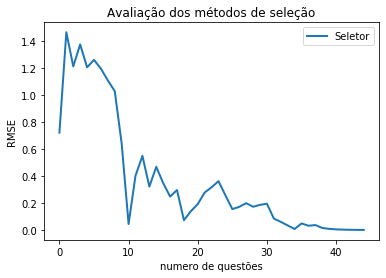

Maximum Information Selector
2
0.5523381233215332


In [24]:
aluno_vet = [0,0]

base_result = 'Result_0.txt'

selector = MaxInfoSelector()

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

In [25]:
alunos = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/file100000.xlsx')
param = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/Calibração/parametros.xlsx')
items = param.iloc[0:45,1:5].to_numpy()
theta_original = np.loadtxt('Result_theta_original-base100000.txt')

## Base total

In [26]:
aluno_vet = list(range(0, len(alunos.index)))

aluno: 0
aluno: 1
aluno: 2
aluno: 3
aluno: 4
aluno: 5
aluno: 6
aluno: 7
aluno: 8
aluno: 9
aluno: 10
aluno: 11
aluno: 12
aluno: 13
aluno: 14
aluno: 15
aluno: 16
aluno: 17
aluno: 18
aluno: 19
aluno: 20
aluno: 21
aluno: 22
aluno: 23
aluno: 24
aluno: 25
aluno: 26
aluno: 27
aluno: 28
aluno: 29
aluno: 30
aluno: 31
aluno: 32
aluno: 33
aluno: 34
aluno: 35
aluno: 36
aluno: 37
aluno: 38
aluno: 39
aluno: 40
aluno: 41
aluno: 42
aluno: 43
aluno: 44
aluno: 45
aluno: 46
aluno: 47
aluno: 48
aluno: 49
aluno: 50
aluno: 51
aluno: 52
aluno: 53
aluno: 54
aluno: 55
aluno: 56
aluno: 57
aluno: 58
aluno: 59
aluno: 60
aluno: 61
aluno: 62
aluno: 63
aluno: 64
aluno: 65
aluno: 66
aluno: 67
aluno: 68
aluno: 69
aluno: 70
aluno: 71
aluno: 72
aluno: 73
aluno: 74
aluno: 75
aluno: 76
aluno: 77
aluno: 78
aluno: 79
aluno: 80
aluno: 81
aluno: 82
aluno: 83
aluno: 84
aluno: 85
aluno: 86
aluno: 87
aluno: 88
aluno: 89
aluno: 90
aluno: 91
aluno: 92
aluno: 93
aluno: 94
aluno: 95
aluno: 96
aluno: 97
aluno: 98
aluno: 99
aluno: 100

aluno: 759
aluno: 760
aluno: 761
aluno: 762
aluno: 763
aluno: 764
aluno: 765
aluno: 766
aluno: 767
aluno: 768
aluno: 769
aluno: 770
aluno: 771
aluno: 772
aluno: 773
aluno: 774
aluno: 775
aluno: 776
aluno: 777
aluno: 778
aluno: 779
aluno: 780
aluno: 781
aluno: 782
aluno: 783
aluno: 784
aluno: 785
aluno: 786
aluno: 787
aluno: 788
aluno: 789
aluno: 790
aluno: 791
aluno: 792
aluno: 793
aluno: 794
aluno: 795
aluno: 796
aluno: 797
aluno: 798
aluno: 799
aluno: 800
aluno: 801
aluno: 802
aluno: 803
aluno: 804
aluno: 805
aluno: 806
aluno: 807
aluno: 808
aluno: 809
aluno: 810
aluno: 811
aluno: 812
aluno: 813
aluno: 814
aluno: 815
aluno: 816
aluno: 817
aluno: 818
aluno: 819
aluno: 820
aluno: 821
aluno: 822
aluno: 823
aluno: 824
aluno: 825
aluno: 826
aluno: 827
aluno: 828
aluno: 829
aluno: 830
aluno: 831
aluno: 832
aluno: 833
aluno: 834
aluno: 835
aluno: 836
aluno: 837
aluno: 838
aluno: 839
aluno: 840
aluno: 841
aluno: 842
aluno: 843
aluno: 844
aluno: 845
aluno: 846
aluno: 847
aluno: 848
aluno: 849

aluno: 1465
aluno: 1466
aluno: 1467
aluno: 1468
aluno: 1469
aluno: 1470
aluno: 1471
aluno: 1472
aluno: 1473
aluno: 1474
aluno: 1475
aluno: 1476
aluno: 1477
aluno: 1478
aluno: 1479
aluno: 1480
aluno: 1481
aluno: 1482
aluno: 1483
aluno: 1484
aluno: 1485
aluno: 1486
aluno: 1487
aluno: 1488
aluno: 1489
aluno: 1490
aluno: 1491
aluno: 1492
aluno: 1493
aluno: 1494
aluno: 1495
aluno: 1496
aluno: 1497
aluno: 1498
aluno: 1499
aluno: 1500
aluno: 1501
aluno: 1502
aluno: 1503
aluno: 1504
aluno: 1505
aluno: 1506
aluno: 1507
aluno: 1508
aluno: 1509
aluno: 1510
aluno: 1511
aluno: 1512
aluno: 1513
aluno: 1514
aluno: 1515
aluno: 1516
aluno: 1517
aluno: 1518
aluno: 1519
aluno: 1520
aluno: 1521
aluno: 1522
aluno: 1523
aluno: 1524
aluno: 1525
aluno: 1526
aluno: 1527
aluno: 1528
aluno: 1529
aluno: 1530
aluno: 1531
aluno: 1532
aluno: 1533
aluno: 1534
aluno: 1535
aluno: 1536
aluno: 1537
aluno: 1538
aluno: 1539
aluno: 1540
aluno: 1541
aluno: 1542
aluno: 1543
aluno: 1544
aluno: 1545
aluno: 1546
aluno: 1547
alun

aluno: 2152
aluno: 2153
aluno: 2154
aluno: 2155
aluno: 2156
aluno: 2157
aluno: 2158
aluno: 2159
aluno: 2160
aluno: 2161
aluno: 2162
aluno: 2163
aluno: 2164
aluno: 2165
aluno: 2166
aluno: 2167
aluno: 2168
aluno: 2169
aluno: 2170
aluno: 2171
aluno: 2172
aluno: 2173
aluno: 2174
aluno: 2175
aluno: 2176
aluno: 2177
aluno: 2178
aluno: 2179
aluno: 2180
aluno: 2181
aluno: 2182
aluno: 2183
aluno: 2184
aluno: 2185
aluno: 2186
aluno: 2187
aluno: 2188
aluno: 2189
aluno: 2190
aluno: 2191
aluno: 2192
aluno: 2193
aluno: 2194
aluno: 2195
aluno: 2196
aluno: 2197
aluno: 2198
aluno: 2199
aluno: 2200
aluno: 2201
aluno: 2202
aluno: 2203
aluno: 2204
aluno: 2205
aluno: 2206
aluno: 2207
aluno: 2208
aluno: 2209
aluno: 2210
aluno: 2211
aluno: 2212
aluno: 2213
aluno: 2214
aluno: 2215
aluno: 2216
aluno: 2217
aluno: 2218
aluno: 2219
aluno: 2220
aluno: 2221
aluno: 2222
aluno: 2223
aluno: 2224
aluno: 2225
aluno: 2226
aluno: 2227
aluno: 2228
aluno: 2229
aluno: 2230
aluno: 2231
aluno: 2232
aluno: 2233
aluno: 2234
alun

aluno: 2835
aluno: 2836
aluno: 2837
aluno: 2838
aluno: 2839
aluno: 2840
aluno: 2841
aluno: 2842
aluno: 2843
aluno: 2844
aluno: 2845
aluno: 2846
aluno: 2847
aluno: 2848
aluno: 2849
aluno: 2850
aluno: 2851
aluno: 2852
aluno: 2853
aluno: 2854
aluno: 2855
aluno: 2856
aluno: 2857
aluno: 2858
aluno: 2859
aluno: 2860
aluno: 2861
aluno: 2862
aluno: 2863
aluno: 2864
aluno: 2865
aluno: 2866
aluno: 2867
aluno: 2868
aluno: 2869
aluno: 2870
aluno: 2871
aluno: 2872
aluno: 2873
aluno: 2874
aluno: 2875
aluno: 2876
aluno: 2877
aluno: 2878
aluno: 2879
aluno: 2880
aluno: 2881
aluno: 2882
aluno: 2883
aluno: 2884
aluno: 2885
aluno: 2886
aluno: 2887
aluno: 2888
aluno: 2889
aluno: 2890
aluno: 2891
aluno: 2892
aluno: 2893
aluno: 2894
aluno: 2895
aluno: 2896
aluno: 2897
aluno: 2898
aluno: 2899
aluno: 2900
aluno: 2901
aluno: 2902
aluno: 2903
aluno: 2904
aluno: 2905
aluno: 2906
aluno: 2907
aluno: 2908
aluno: 2909
aluno: 2910
aluno: 2911
aluno: 2912
aluno: 2913
aluno: 2914
aluno: 2915
aluno: 2916
aluno: 2917
alun

aluno: 3521
aluno: 3522
aluno: 3523
aluno: 3524
aluno: 3525
aluno: 3526
aluno: 3527
aluno: 3528
aluno: 3529
aluno: 3530
aluno: 3531
aluno: 3532
aluno: 3533
aluno: 3534
aluno: 3535
aluno: 3536
aluno: 3537
aluno: 3538
aluno: 3539
aluno: 3540
aluno: 3541
aluno: 3542
aluno: 3543
aluno: 3544
aluno: 3545
aluno: 3546
aluno: 3547
aluno: 3548
aluno: 3549
aluno: 3550
aluno: 3551
aluno: 3552
aluno: 3553
aluno: 3554
aluno: 3555
aluno: 3556
aluno: 3557
aluno: 3558
aluno: 3559
aluno: 3560
aluno: 3561
aluno: 3562
aluno: 3563
aluno: 3564
aluno: 3565
aluno: 3566
aluno: 3567
aluno: 3568
aluno: 3569
aluno: 3570
aluno: 3571
aluno: 3572
aluno: 3573
aluno: 3574
aluno: 3575
aluno: 3576
aluno: 3577
aluno: 3578
aluno: 3579
aluno: 3580
aluno: 3581
aluno: 3582
aluno: 3583
aluno: 3584
aluno: 3585
aluno: 3586
aluno: 3587
aluno: 3588
aluno: 3589
aluno: 3590
aluno: 3591
aluno: 3592
aluno: 3593
aluno: 3594
aluno: 3595
aluno: 3596
aluno: 3597
aluno: 3598
aluno: 3599
aluno: 3600
aluno: 3601
aluno: 3602
aluno: 3603
alun

aluno: 4205
aluno: 4206
aluno: 4207
aluno: 4208
aluno: 4209
aluno: 4210
aluno: 4211
aluno: 4212
aluno: 4213
aluno: 4214
aluno: 4215
aluno: 4216
aluno: 4217
aluno: 4218
aluno: 4219
aluno: 4220
aluno: 4221
aluno: 4222
aluno: 4223
aluno: 4224
aluno: 4225
aluno: 4226
aluno: 4227
aluno: 4228
aluno: 4229
aluno: 4230
aluno: 4231
aluno: 4232
aluno: 4233
aluno: 4234
aluno: 4235
aluno: 4236
aluno: 4237
aluno: 4238
aluno: 4239
aluno: 4240
aluno: 4241
aluno: 4242
aluno: 4243
aluno: 4244
aluno: 4245
aluno: 4246
aluno: 4247
aluno: 4248
aluno: 4249
aluno: 4250
aluno: 4251
aluno: 4252
aluno: 4253
aluno: 4254
aluno: 4255
aluno: 4256
aluno: 4257
aluno: 4258
aluno: 4259
aluno: 4260
aluno: 4261
aluno: 4262
aluno: 4263
aluno: 4264
aluno: 4265
aluno: 4266
aluno: 4267
aluno: 4268
aluno: 4269
aluno: 4270
aluno: 4271
aluno: 4272
aluno: 4273
aluno: 4274
aluno: 4275
aluno: 4276
aluno: 4277
aluno: 4278
aluno: 4279
aluno: 4280
aluno: 4281
aluno: 4282
aluno: 4283
aluno: 4284
aluno: 4285
aluno: 4286
aluno: 4287
alun

aluno: 4889
aluno: 4890
aluno: 4891
aluno: 4892
aluno: 4893
aluno: 4894
aluno: 4895
aluno: 4896
aluno: 4897
aluno: 4898
aluno: 4899
aluno: 4900
aluno: 4901
aluno: 4902
aluno: 4903
aluno: 4904
aluno: 4905
aluno: 4906
aluno: 4907
aluno: 4908
aluno: 4909
aluno: 4910
aluno: 4911
aluno: 4912
aluno: 4913
aluno: 4914
aluno: 4915
aluno: 4916
aluno: 4917
aluno: 4918
aluno: 4919
aluno: 4920
aluno: 4921
aluno: 4922
aluno: 4923
aluno: 4924
aluno: 4925
aluno: 4926
aluno: 4927
aluno: 4928
aluno: 4929
aluno: 4930
aluno: 4931
aluno: 4932
aluno: 4933
aluno: 4934
aluno: 4935
aluno: 4936
aluno: 4937
aluno: 4938
aluno: 4939
aluno: 4940
aluno: 4941
aluno: 4942
aluno: 4943
aluno: 4944
aluno: 4945
aluno: 4946
aluno: 4947
aluno: 4948
aluno: 4949
aluno: 4950
aluno: 4951
aluno: 4952
aluno: 4953
aluno: 4954
aluno: 4955
aluno: 4956
aluno: 4957
aluno: 4958
aluno: 4959
aluno: 4960
aluno: 4961
aluno: 4962
aluno: 4963
aluno: 4964
aluno: 4965
aluno: 4966
aluno: 4967
aluno: 4968
aluno: 4969
aluno: 4970
aluno: 4971
alun

aluno: 5572
aluno: 5573
aluno: 5574
aluno: 5575
aluno: 5576
aluno: 5577
aluno: 5578
aluno: 5579
aluno: 5580
aluno: 5581
aluno: 5582
aluno: 5583
aluno: 5584
aluno: 5585
aluno: 5586
aluno: 5587
aluno: 5588
aluno: 5589
aluno: 5590
aluno: 5591
aluno: 5592
aluno: 5593
aluno: 5594
aluno: 5595
aluno: 5596
aluno: 5597
aluno: 5598
aluno: 5599
aluno: 5600
aluno: 5601
aluno: 5602
aluno: 5603
aluno: 5604
aluno: 5605
aluno: 5606
aluno: 5607
aluno: 5608
aluno: 5609
aluno: 5610
aluno: 5611
aluno: 5612
aluno: 5613
aluno: 5614
aluno: 5615
aluno: 5616
aluno: 5617
aluno: 5618
aluno: 5619
aluno: 5620
aluno: 5621
aluno: 5622
aluno: 5623
aluno: 5624
aluno: 5625
aluno: 5626
aluno: 5627
aluno: 5628
aluno: 5629
aluno: 5630
aluno: 5631
aluno: 5632
aluno: 5633
aluno: 5634
aluno: 5635
aluno: 5636
aluno: 5637
aluno: 5638
aluno: 5639
aluno: 5640
aluno: 5641
aluno: 5642
aluno: 5643
aluno: 5644
aluno: 5645
aluno: 5646
aluno: 5647
aluno: 5648
aluno: 5649
aluno: 5650
aluno: 5651
aluno: 5652
aluno: 5653
aluno: 5654
alun

aluno: 6256
aluno: 6257
aluno: 6258
aluno: 6259
aluno: 6260
aluno: 6261
aluno: 6262
aluno: 6263
aluno: 6264
aluno: 6265
aluno: 6266
aluno: 6267
aluno: 6268
aluno: 6269
aluno: 6270
aluno: 6271
aluno: 6272
aluno: 6273
aluno: 6274
aluno: 6275
aluno: 6276
aluno: 6277
aluno: 6278
aluno: 6279
aluno: 6280
aluno: 6281
aluno: 6282
aluno: 6283
aluno: 6284
aluno: 6285
aluno: 6286
aluno: 6287
aluno: 6288
aluno: 6289
aluno: 6290
aluno: 6291
aluno: 6292
aluno: 6293
aluno: 6294
aluno: 6295
aluno: 6296
aluno: 6297
aluno: 6298
aluno: 6299
aluno: 6300
aluno: 6301
aluno: 6302
aluno: 6303
aluno: 6304
aluno: 6305
aluno: 6306
aluno: 6307
aluno: 6308
aluno: 6309
aluno: 6310
aluno: 6311
aluno: 6312
aluno: 6313
aluno: 6314
aluno: 6315
aluno: 6316
aluno: 6317
aluno: 6318
aluno: 6319
aluno: 6320
aluno: 6321
aluno: 6322
aluno: 6323
aluno: 6324
aluno: 6325
aluno: 6326
aluno: 6327
aluno: 6328
aluno: 6329
aluno: 6330
aluno: 6331
aluno: 6332
aluno: 6333
aluno: 6334
aluno: 6335
aluno: 6336
aluno: 6337
aluno: 6338
alun

aluno: 6940
aluno: 6941
aluno: 6942
aluno: 6943
aluno: 6944
aluno: 6945
aluno: 6946
aluno: 6947
aluno: 6948
aluno: 6949
aluno: 6950
aluno: 6951
aluno: 6952
aluno: 6953
aluno: 6954
aluno: 6955
aluno: 6956
aluno: 6957
aluno: 6958
aluno: 6959
aluno: 6960
aluno: 6961
aluno: 6962
aluno: 6963
aluno: 6964
aluno: 6965
aluno: 6966
aluno: 6967
aluno: 6968
aluno: 6969
aluno: 6970
aluno: 6971
aluno: 6972
aluno: 6973
aluno: 6974
aluno: 6975
aluno: 6976
aluno: 6977
aluno: 6978
aluno: 6979
aluno: 6980
aluno: 6981
aluno: 6982
aluno: 6983
aluno: 6984
aluno: 6985
aluno: 6986
aluno: 6987
aluno: 6988
aluno: 6989
aluno: 6990
aluno: 6991
aluno: 6992
aluno: 6993
aluno: 6994
aluno: 6995
aluno: 6996
aluno: 6997
aluno: 6998
aluno: 6999
aluno: 7000
aluno: 7001
aluno: 7002
aluno: 7003
aluno: 7004
aluno: 7005
aluno: 7006
aluno: 7007
aluno: 7008
aluno: 7009
aluno: 7010
aluno: 7011
aluno: 7012
aluno: 7013
aluno: 7014
aluno: 7015
aluno: 7016
aluno: 7017
aluno: 7018
aluno: 7019
aluno: 7020
aluno: 7021
aluno: 7022
alun

aluno: 7627
aluno: 7628
aluno: 7629
aluno: 7630
aluno: 7631
aluno: 7632
aluno: 7633
aluno: 7634
aluno: 7635
aluno: 7636
aluno: 7637
aluno: 7638
aluno: 7639
aluno: 7640
aluno: 7641
aluno: 7642
aluno: 7643
aluno: 7644
aluno: 7645
aluno: 7646
aluno: 7647
aluno: 7648
aluno: 7649
aluno: 7650
aluno: 7651
aluno: 7652
aluno: 7653
aluno: 7654
aluno: 7655
aluno: 7656
aluno: 7657
aluno: 7658
aluno: 7659
aluno: 7660
aluno: 7661
aluno: 7662
aluno: 7663
aluno: 7664
aluno: 7665
aluno: 7666
aluno: 7667
aluno: 7668
aluno: 7669
aluno: 7670
aluno: 7671
aluno: 7672
aluno: 7673
aluno: 7674
aluno: 7675
aluno: 7676
aluno: 7677
aluno: 7678
aluno: 7679
aluno: 7680
aluno: 7681
aluno: 7682
aluno: 7683
aluno: 7684
aluno: 7685
aluno: 7686
aluno: 7687
aluno: 7688
aluno: 7689
aluno: 7690
aluno: 7691
aluno: 7692
aluno: 7693
aluno: 7694
aluno: 7695
aluno: 7696
aluno: 7697
aluno: 7698
aluno: 7699
aluno: 7700
aluno: 7701
aluno: 7702
aluno: 7703
aluno: 7704
aluno: 7705
aluno: 7706
aluno: 7707
aluno: 7708
aluno: 7709
alun

aluno: 8310
aluno: 8311
aluno: 8312
aluno: 8313
aluno: 8314
aluno: 8315
aluno: 8316
aluno: 8317
aluno: 8318
aluno: 8319
aluno: 8320
aluno: 8321
aluno: 8322
aluno: 8323
aluno: 8324
aluno: 8325
aluno: 8326
aluno: 8327
aluno: 8328
aluno: 8329
aluno: 8330
aluno: 8331
aluno: 8332
aluno: 8333
aluno: 8334
aluno: 8335
aluno: 8336
aluno: 8337
aluno: 8338
aluno: 8339
aluno: 8340
aluno: 8341
aluno: 8342
aluno: 8343
aluno: 8344
aluno: 8345
aluno: 8346
aluno: 8347
aluno: 8348
aluno: 8349
aluno: 8350
aluno: 8351
aluno: 8352
aluno: 8353
aluno: 8354
aluno: 8355
aluno: 8356
aluno: 8357
aluno: 8358
aluno: 8359
aluno: 8360
aluno: 8361
aluno: 8362
aluno: 8363
aluno: 8364
aluno: 8365
aluno: 8366
aluno: 8367
aluno: 8368
aluno: 8369
aluno: 8370
aluno: 8371
aluno: 8372
aluno: 8373
aluno: 8374
aluno: 8375
aluno: 8376
aluno: 8377
aluno: 8378
aluno: 8379
aluno: 8380
aluno: 8381
aluno: 8382
aluno: 8383
aluno: 8384
aluno: 8385
aluno: 8386
aluno: 8387
aluno: 8388
aluno: 8389
aluno: 8390
aluno: 8391
aluno: 8392
alun

aluno: 8994
aluno: 8995
aluno: 8996
aluno: 8997
aluno: 8998
aluno: 8999
aluno: 9000
aluno: 9001
aluno: 9002
aluno: 9003
aluno: 9004
aluno: 9005
aluno: 9006
aluno: 9007
aluno: 9008
aluno: 9009
aluno: 9010
aluno: 9011
aluno: 9012
aluno: 9013
aluno: 9014
aluno: 9015
aluno: 9016
aluno: 9017
aluno: 9018
aluno: 9019
aluno: 9020
aluno: 9021
aluno: 9022
aluno: 9023
aluno: 9024
aluno: 9025
aluno: 9026
aluno: 9027
aluno: 9028
aluno: 9029
aluno: 9030
aluno: 9031
aluno: 9032
aluno: 9033
aluno: 9034
aluno: 9035
aluno: 9036
aluno: 9037
aluno: 9038
aluno: 9039
aluno: 9040
aluno: 9041
aluno: 9042
aluno: 9043
aluno: 9044
aluno: 9045
aluno: 9046
aluno: 9047
aluno: 9048
aluno: 9049
aluno: 9050
aluno: 9051
aluno: 9052
aluno: 9053
aluno: 9054
aluno: 9055
aluno: 9056
aluno: 9057
aluno: 9058
aluno: 9059
aluno: 9060
aluno: 9061
aluno: 9062
aluno: 9063
aluno: 9064
aluno: 9065
aluno: 9066
aluno: 9067
aluno: 9068
aluno: 9069
aluno: 9070
aluno: 9071
aluno: 9072
aluno: 9073
aluno: 9074
aluno: 9075
aluno: 9076
alun

aluno: 9677
aluno: 9678
aluno: 9679
aluno: 9680
aluno: 9681
aluno: 9682
aluno: 9683
aluno: 9684
aluno: 9685
aluno: 9686
aluno: 9687
aluno: 9688
aluno: 9689
aluno: 9690
aluno: 9691
aluno: 9692
aluno: 9693
aluno: 9694
aluno: 9695
aluno: 9696
aluno: 9697
aluno: 9698
aluno: 9699
aluno: 9700
aluno: 9701
aluno: 9702
aluno: 9703
aluno: 9704
aluno: 9705
aluno: 9706
aluno: 9707
aluno: 9708
aluno: 9709
aluno: 9710
aluno: 9711
aluno: 9712
aluno: 9713
aluno: 9714
aluno: 9715
aluno: 9716
aluno: 9717
aluno: 9718
aluno: 9719
aluno: 9720
aluno: 9721
aluno: 9722
aluno: 9723
aluno: 9724
aluno: 9725
aluno: 9726
aluno: 9727
aluno: 9728
aluno: 9729
aluno: 9730
aluno: 9731
aluno: 9732
aluno: 9733
aluno: 9734
aluno: 9735
aluno: 9736
aluno: 9737
aluno: 9738
aluno: 9739
aluno: 9740
aluno: 9741
aluno: 9742
aluno: 9743
aluno: 9744
aluno: 9745
aluno: 9746
aluno: 9747
aluno: 9748
aluno: 9749
aluno: 9750
aluno: 9751
aluno: 9752
aluno: 9753
aluno: 9754
aluno: 9755
aluno: 9756
aluno: 9757
aluno: 9758
aluno: 9759
alun

aluno: 10334
aluno: 10335
aluno: 10336
aluno: 10337
aluno: 10338
aluno: 10339
aluno: 10340
aluno: 10341
aluno: 10342
aluno: 10343
aluno: 10344
aluno: 10345
aluno: 10346
aluno: 10347
aluno: 10348
aluno: 10349
aluno: 10350
aluno: 10351
aluno: 10352
aluno: 10353
aluno: 10354
aluno: 10355
aluno: 10356
aluno: 10357
aluno: 10358
aluno: 10359
aluno: 10360
aluno: 10361
aluno: 10362
aluno: 10363
aluno: 10364
aluno: 10365
aluno: 10366
aluno: 10367
aluno: 10368
aluno: 10369
aluno: 10370
aluno: 10371
aluno: 10372
aluno: 10373
aluno: 10374
aluno: 10375
aluno: 10376
aluno: 10377
aluno: 10378
aluno: 10379
aluno: 10380
aluno: 10381
aluno: 10382
aluno: 10383
aluno: 10384
aluno: 10385
aluno: 10386
aluno: 10387
aluno: 10388
aluno: 10389
aluno: 10390
aluno: 10391
aluno: 10392
aluno: 10393
aluno: 10394
aluno: 10395
aluno: 10396
aluno: 10397
aluno: 10398
aluno: 10399
aluno: 10400
aluno: 10401
aluno: 10402
aluno: 10403
aluno: 10404
aluno: 10405
aluno: 10406
aluno: 10407
aluno: 10408
aluno: 10409
aluno: 10410

aluno: 10968
aluno: 10969
aluno: 10970
aluno: 10971
aluno: 10972
aluno: 10973
aluno: 10974
aluno: 10975
aluno: 10976
aluno: 10977
aluno: 10978
aluno: 10979
aluno: 10980
aluno: 10981
aluno: 10982
aluno: 10983
aluno: 10984
aluno: 10985
aluno: 10986
aluno: 10987
aluno: 10988
aluno: 10989
aluno: 10990
aluno: 10991
aluno: 10992
aluno: 10993
aluno: 10994
aluno: 10995
aluno: 10996
aluno: 10997
aluno: 10998
aluno: 10999
aluno: 11000
aluno: 11001
aluno: 11002
aluno: 11003
aluno: 11004
aluno: 11005
aluno: 11006
aluno: 11007
aluno: 11008
aluno: 11009
aluno: 11010
aluno: 11011
aluno: 11012
aluno: 11013
aluno: 11014
aluno: 11015
aluno: 11016
aluno: 11017
aluno: 11018
aluno: 11019
aluno: 11020
aluno: 11021
aluno: 11022
aluno: 11023
aluno: 11024
aluno: 11025
aluno: 11026
aluno: 11027
aluno: 11028
aluno: 11029
aluno: 11030
aluno: 11031
aluno: 11032
aluno: 11033
aluno: 11034
aluno: 11035
aluno: 11036
aluno: 11037
aluno: 11038
aluno: 11039
aluno: 11040
aluno: 11041
aluno: 11042
aluno: 11043
aluno: 11044

aluno: 11600
aluno: 11601
aluno: 11602
aluno: 11603
aluno: 11604
aluno: 11605
aluno: 11606
aluno: 11607
aluno: 11608
aluno: 11609
aluno: 11610
aluno: 11611
aluno: 11612
aluno: 11613
aluno: 11614
aluno: 11615
aluno: 11616
aluno: 11617
aluno: 11618
aluno: 11619
aluno: 11620
aluno: 11621
aluno: 11622
aluno: 11623
aluno: 11624
aluno: 11625
aluno: 11626
aluno: 11627
aluno: 11628
aluno: 11629
aluno: 11630
aluno: 11631
aluno: 11632
aluno: 11633
aluno: 11634
aluno: 11635
aluno: 11636
aluno: 11637
aluno: 11638
aluno: 11639
aluno: 11640
aluno: 11641
aluno: 11642
aluno: 11643
aluno: 11644
aluno: 11645
aluno: 11646
aluno: 11647
aluno: 11648
aluno: 11649
aluno: 11650
aluno: 11651
aluno: 11652
aluno: 11653
aluno: 11654
aluno: 11655
aluno: 11656
aluno: 11657
aluno: 11658
aluno: 11659
aluno: 11660
aluno: 11661
aluno: 11662
aluno: 11663
aluno: 11664
aluno: 11665
aluno: 11666
aluno: 11667
aluno: 11668
aluno: 11669
aluno: 11670
aluno: 11671
aluno: 11672
aluno: 11673
aluno: 11674
aluno: 11675
aluno: 11676

aluno: 12235
aluno: 12236
aluno: 12237
aluno: 12238
aluno: 12239
aluno: 12240
aluno: 12241
aluno: 12242
aluno: 12243
aluno: 12244
aluno: 12245
aluno: 12246
aluno: 12247
aluno: 12248
aluno: 12249
aluno: 12250
aluno: 12251
aluno: 12252
aluno: 12253
aluno: 12254
aluno: 12255
aluno: 12256
aluno: 12257
aluno: 12258
aluno: 12259
aluno: 12260
aluno: 12261
aluno: 12262
aluno: 12263
aluno: 12264
aluno: 12265
aluno: 12266
aluno: 12267
aluno: 12268
aluno: 12269
aluno: 12270
aluno: 12271
aluno: 12272
aluno: 12273
aluno: 12274
aluno: 12275
aluno: 12276
aluno: 12277
aluno: 12278
aluno: 12279
aluno: 12280
aluno: 12281
aluno: 12282
aluno: 12283
aluno: 12284
aluno: 12285
aluno: 12286
aluno: 12287
aluno: 12288
aluno: 12289
aluno: 12290
aluno: 12291
aluno: 12292
aluno: 12293
aluno: 12294
aluno: 12295
aluno: 12296
aluno: 12297
aluno: 12298
aluno: 12299
aluno: 12300
aluno: 12301
aluno: 12302
aluno: 12303
aluno: 12304
aluno: 12305
aluno: 12306
aluno: 12307
aluno: 12308
aluno: 12309
aluno: 12310
aluno: 12311

aluno: 12868
aluno: 12869
aluno: 12870
aluno: 12871
aluno: 12872
aluno: 12873
aluno: 12874
aluno: 12875
aluno: 12876
aluno: 12877
aluno: 12878
aluno: 12879
aluno: 12880
aluno: 12881
aluno: 12882
aluno: 12883
aluno: 12884
aluno: 12885
aluno: 12886
aluno: 12887
aluno: 12888
aluno: 12889
aluno: 12890
aluno: 12891
aluno: 12892
aluno: 12893
aluno: 12894
aluno: 12895
aluno: 12896
aluno: 12897
aluno: 12898
aluno: 12899
aluno: 12900
aluno: 12901
aluno: 12902
aluno: 12903
aluno: 12904
aluno: 12905
aluno: 12906
aluno: 12907
aluno: 12908
aluno: 12909
aluno: 12910
aluno: 12911
aluno: 12912
aluno: 12913
aluno: 12914
aluno: 12915
aluno: 12916
aluno: 12917
aluno: 12918
aluno: 12919
aluno: 12920
aluno: 12921
aluno: 12922
aluno: 12923
aluno: 12924
aluno: 12925
aluno: 12926
aluno: 12927
aluno: 12928
aluno: 12929
aluno: 12930
aluno: 12931
aluno: 12932
aluno: 12933
aluno: 12934
aluno: 12935
aluno: 12936
aluno: 12937
aluno: 12938
aluno: 12939
aluno: 12940
aluno: 12941
aluno: 12942
aluno: 12943
aluno: 12944

aluno: 13500
aluno: 13501
aluno: 13502
aluno: 13503
aluno: 13504
aluno: 13505
aluno: 13506
aluno: 13507
aluno: 13508
aluno: 13509
aluno: 13510
aluno: 13511
aluno: 13512
aluno: 13513
aluno: 13514
aluno: 13515
aluno: 13516
aluno: 13517
aluno: 13518
aluno: 13519
aluno: 13520
aluno: 13521
aluno: 13522
aluno: 13523
aluno: 13524
aluno: 13525
aluno: 13526
aluno: 13527
aluno: 13528
aluno: 13529
aluno: 13530
aluno: 13531
aluno: 13532
aluno: 13533
aluno: 13534
aluno: 13535
aluno: 13536
aluno: 13537
aluno: 13538
aluno: 13539
aluno: 13540
aluno: 13541
aluno: 13542
aluno: 13543
aluno: 13544
aluno: 13545
aluno: 13546
aluno: 13547
aluno: 13548
aluno: 13549
aluno: 13550
aluno: 13551
aluno: 13552
aluno: 13553
aluno: 13554
aluno: 13555
aluno: 13556
aluno: 13557
aluno: 13558
aluno: 13559
aluno: 13560
aluno: 13561
aluno: 13562
aluno: 13563
aluno: 13564
aluno: 13565
aluno: 13566
aluno: 13567
aluno: 13568
aluno: 13569
aluno: 13570
aluno: 13571
aluno: 13572
aluno: 13573
aluno: 13574
aluno: 13575
aluno: 13576

aluno: 14131
aluno: 14132
aluno: 14133
aluno: 14134
aluno: 14135
aluno: 14136
aluno: 14137
aluno: 14138
aluno: 14139
aluno: 14140
aluno: 14141
aluno: 14142
aluno: 14143
aluno: 14144
aluno: 14145
aluno: 14146
aluno: 14147
aluno: 14148
aluno: 14149
aluno: 14150
aluno: 14151
aluno: 14152
aluno: 14153
aluno: 14154
aluno: 14155
aluno: 14156
aluno: 14157
aluno: 14158
aluno: 14159
aluno: 14160
aluno: 14161
aluno: 14162
aluno: 14163
aluno: 14164
aluno: 14165
aluno: 14166
aluno: 14167
aluno: 14168
aluno: 14169
aluno: 14170
aluno: 14171
aluno: 14172
aluno: 14173
aluno: 14174
aluno: 14175
aluno: 14176
aluno: 14177
aluno: 14178
aluno: 14179
aluno: 14180
aluno: 14181
aluno: 14182
aluno: 14183
aluno: 14184
aluno: 14185
aluno: 14186
aluno: 14187
aluno: 14188
aluno: 14189
aluno: 14190
aluno: 14191
aluno: 14192
aluno: 14193
aluno: 14194
aluno: 14195
aluno: 14196
aluno: 14197
aluno: 14198
aluno: 14199
aluno: 14200
aluno: 14201
aluno: 14202
aluno: 14203
aluno: 14204
aluno: 14205
aluno: 14206
aluno: 14207

aluno: 14764
aluno: 14765
aluno: 14766
aluno: 14767
aluno: 14768
aluno: 14769
aluno: 14770
aluno: 14771
aluno: 14772
aluno: 14773
aluno: 14774
aluno: 14775
aluno: 14776
aluno: 14777
aluno: 14778
aluno: 14779
aluno: 14780
aluno: 14781
aluno: 14782
aluno: 14783
aluno: 14784
aluno: 14785
aluno: 14786
aluno: 14787
aluno: 14788
aluno: 14789
aluno: 14790
aluno: 14791
aluno: 14792
aluno: 14793
aluno: 14794
aluno: 14795
aluno: 14796
aluno: 14797
aluno: 14798
aluno: 14799
aluno: 14800
aluno: 14801
aluno: 14802
aluno: 14803
aluno: 14804
aluno: 14805
aluno: 14806
aluno: 14807
aluno: 14808
aluno: 14809
aluno: 14810
aluno: 14811
aluno: 14812
aluno: 14813
aluno: 14814
aluno: 14815
aluno: 14816
aluno: 14817
aluno: 14818
aluno: 14819
aluno: 14820
aluno: 14821
aluno: 14822
aluno: 14823
aluno: 14824
aluno: 14825
aluno: 14826
aluno: 14827
aluno: 14828
aluno: 14829
aluno: 14830
aluno: 14831
aluno: 14832
aluno: 14833
aluno: 14834
aluno: 14835
aluno: 14836
aluno: 14837
aluno: 14838
aluno: 14839
aluno: 14840

aluno: 15397
aluno: 15398
aluno: 15399
aluno: 15400
aluno: 15401
aluno: 15402
aluno: 15403
aluno: 15404
aluno: 15405
aluno: 15406
aluno: 15407
aluno: 15408
aluno: 15409
aluno: 15410
aluno: 15411
aluno: 15412
aluno: 15413
aluno: 15414
aluno: 15415
aluno: 15416
aluno: 15417
aluno: 15418
aluno: 15419
aluno: 15420
aluno: 15421
aluno: 15422
aluno: 15423
aluno: 15424
aluno: 15425
aluno: 15426
aluno: 15427
aluno: 15428
aluno: 15429
aluno: 15430
aluno: 15431
aluno: 15432
aluno: 15433
aluno: 15434
aluno: 15435
aluno: 15436
aluno: 15437
aluno: 15438
aluno: 15439
aluno: 15440
aluno: 15441
aluno: 15442
aluno: 15443
aluno: 15444
aluno: 15445
aluno: 15446
aluno: 15447
aluno: 15448
aluno: 15449
aluno: 15450
aluno: 15451
aluno: 15452
aluno: 15453
aluno: 15454
aluno: 15455
aluno: 15456
aluno: 15457
aluno: 15458
aluno: 15459
aluno: 15460
aluno: 15461
aluno: 15462
aluno: 15463
aluno: 15464
aluno: 15465
aluno: 15466
aluno: 15467
aluno: 15468
aluno: 15469
aluno: 15470
aluno: 15471
aluno: 15472
aluno: 15473

aluno: 16030
aluno: 16031
aluno: 16032
aluno: 16033
aluno: 16034
aluno: 16035
aluno: 16036
aluno: 16037
aluno: 16038
aluno: 16039
aluno: 16040
aluno: 16041
aluno: 16042
aluno: 16043
aluno: 16044
aluno: 16045
aluno: 16046
aluno: 16047
aluno: 16048
aluno: 16049
aluno: 16050
aluno: 16051
aluno: 16052
aluno: 16053
aluno: 16054
aluno: 16055
aluno: 16056
aluno: 16057
aluno: 16058
aluno: 16059
aluno: 16060
aluno: 16061
aluno: 16062
aluno: 16063
aluno: 16064
aluno: 16065
aluno: 16066
aluno: 16067
aluno: 16068
aluno: 16069
aluno: 16070
aluno: 16071
aluno: 16072
aluno: 16073
aluno: 16074
aluno: 16075
aluno: 16076
aluno: 16077
aluno: 16078
aluno: 16079
aluno: 16080
aluno: 16081
aluno: 16082
aluno: 16083
aluno: 16084
aluno: 16085
aluno: 16086
aluno: 16087
aluno: 16088
aluno: 16089
aluno: 16090
aluno: 16091
aluno: 16092
aluno: 16093
aluno: 16094
aluno: 16095
aluno: 16096
aluno: 16097
aluno: 16098
aluno: 16099
aluno: 16100
aluno: 16101
aluno: 16102
aluno: 16103
aluno: 16104
aluno: 16105
aluno: 16106

aluno: 16664
aluno: 16665
aluno: 16666
aluno: 16667
aluno: 16668
aluno: 16669
aluno: 16670
aluno: 16671
aluno: 16672
aluno: 16673
aluno: 16674
aluno: 16675
aluno: 16676
aluno: 16677
aluno: 16678
aluno: 16679
aluno: 16680
aluno: 16681
aluno: 16682
aluno: 16683
aluno: 16684
aluno: 16685
aluno: 16686
aluno: 16687
aluno: 16688
aluno: 16689
aluno: 16690
aluno: 16691
aluno: 16692
aluno: 16693
aluno: 16694
aluno: 16695
aluno: 16696
aluno: 16697
aluno: 16698
aluno: 16699
aluno: 16700
aluno: 16701
aluno: 16702
aluno: 16703
aluno: 16704
aluno: 16705
aluno: 16706
aluno: 16707
aluno: 16708
aluno: 16709
aluno: 16710
aluno: 16711
aluno: 16712
aluno: 16713
aluno: 16714
aluno: 16715
aluno: 16716
aluno: 16717
aluno: 16718
aluno: 16719
aluno: 16720
aluno: 16721
aluno: 16722
aluno: 16723
aluno: 16724
aluno: 16725
aluno: 16726
aluno: 16727
aluno: 16728
aluno: 16729
aluno: 16730
aluno: 16731
aluno: 16732
aluno: 16733
aluno: 16734
aluno: 16735
aluno: 16736
aluno: 16737
aluno: 16738
aluno: 16739
aluno: 16740

aluno: 17297
aluno: 17298
aluno: 17299
aluno: 17300
aluno: 17301
aluno: 17302
aluno: 17303
aluno: 17304
aluno: 17305
aluno: 17306
aluno: 17307
aluno: 17308
aluno: 17309
aluno: 17310
aluno: 17311
aluno: 17312
aluno: 17313
aluno: 17314
aluno: 17315
aluno: 17316
aluno: 17317
aluno: 17318
aluno: 17319
aluno: 17320
aluno: 17321
aluno: 17322
aluno: 17323
aluno: 17324
aluno: 17325
aluno: 17326
aluno: 17327
aluno: 17328
aluno: 17329
aluno: 17330
aluno: 17331
aluno: 17332
aluno: 17333
aluno: 17334
aluno: 17335
aluno: 17336
aluno: 17337
aluno: 17338
aluno: 17339
aluno: 17340
aluno: 17341
aluno: 17342
aluno: 17343
aluno: 17344
aluno: 17345
aluno: 17346
aluno: 17347
aluno: 17348
aluno: 17349
aluno: 17350
aluno: 17351
aluno: 17352
aluno: 17353
aluno: 17354
aluno: 17355
aluno: 17356
aluno: 17357
aluno: 17358
aluno: 17359
aluno: 17360
aluno: 17361
aluno: 17362
aluno: 17363
aluno: 17364
aluno: 17365
aluno: 17366
aluno: 17367
aluno: 17368
aluno: 17369
aluno: 17370
aluno: 17371
aluno: 17372
aluno: 17373

aluno: 17930
aluno: 17931
aluno: 17932
aluno: 17933
aluno: 17934
aluno: 17935
aluno: 17936
aluno: 17937
aluno: 17938
aluno: 17939
aluno: 17940
aluno: 17941
aluno: 17942
aluno: 17943
aluno: 17944
aluno: 17945
aluno: 17946
aluno: 17947
aluno: 17948
aluno: 17949
aluno: 17950
aluno: 17951
aluno: 17952
aluno: 17953
aluno: 17954
aluno: 17955
aluno: 17956
aluno: 17957
aluno: 17958
aluno: 17959
aluno: 17960
aluno: 17961
aluno: 17962
aluno: 17963
aluno: 17964
aluno: 17965
aluno: 17966
aluno: 17967
aluno: 17968
aluno: 17969
aluno: 17970
aluno: 17971
aluno: 17972
aluno: 17973
aluno: 17974
aluno: 17975
aluno: 17976
aluno: 17977
aluno: 17978
aluno: 17979
aluno: 17980
aluno: 17981
aluno: 17982
aluno: 17983
aluno: 17984
aluno: 17985
aluno: 17986
aluno: 17987
aluno: 17988
aluno: 17989
aluno: 17990
aluno: 17991
aluno: 17992
aluno: 17993
aluno: 17994
aluno: 17995
aluno: 17996
aluno: 17997
aluno: 17998
aluno: 17999
aluno: 18000
aluno: 18001
aluno: 18002
aluno: 18003
aluno: 18004
aluno: 18005
aluno: 18006

aluno: 18561
aluno: 18562
aluno: 18563
aluno: 18564
aluno: 18565
aluno: 18566
aluno: 18567
aluno: 18568
aluno: 18569
aluno: 18570
aluno: 18571
aluno: 18572
aluno: 18573
aluno: 18574
aluno: 18575
aluno: 18576
aluno: 18577
aluno: 18578
aluno: 18579
aluno: 18580
aluno: 18581
aluno: 18582
aluno: 18583
aluno: 18584
aluno: 18585
aluno: 18586
aluno: 18587
aluno: 18588
aluno: 18589
aluno: 18590
aluno: 18591
aluno: 18592
aluno: 18593
aluno: 18594
aluno: 18595
aluno: 18596
aluno: 18597
aluno: 18598
aluno: 18599
aluno: 18600
aluno: 18601
aluno: 18602
aluno: 18603
aluno: 18604
aluno: 18605
aluno: 18606
aluno: 18607
aluno: 18608
aluno: 18609
aluno: 18610
aluno: 18611
aluno: 18612
aluno: 18613
aluno: 18614
aluno: 18615
aluno: 18616
aluno: 18617
aluno: 18618
aluno: 18619
aluno: 18620
aluno: 18621
aluno: 18622
aluno: 18623
aluno: 18624
aluno: 18625
aluno: 18626
aluno: 18627
aluno: 18628
aluno: 18629
aluno: 18630
aluno: 18631
aluno: 18632
aluno: 18633
aluno: 18634
aluno: 18635
aluno: 18636
aluno: 18637

aluno: 19194
aluno: 19195
aluno: 19196
aluno: 19197
aluno: 19198
aluno: 19199
aluno: 19200
aluno: 19201
aluno: 19202
aluno: 19203
aluno: 19204
aluno: 19205
aluno: 19206
aluno: 19207
aluno: 19208
aluno: 19209
aluno: 19210
aluno: 19211
aluno: 19212
aluno: 19213
aluno: 19214
aluno: 19215
aluno: 19216
aluno: 19217
aluno: 19218
aluno: 19219
aluno: 19220
aluno: 19221
aluno: 19222
aluno: 19223
aluno: 19224
aluno: 19225
aluno: 19226
aluno: 19227
aluno: 19228
aluno: 19229
aluno: 19230
aluno: 19231
aluno: 19232
aluno: 19233
aluno: 19234
aluno: 19235
aluno: 19236
aluno: 19237
aluno: 19238
aluno: 19239
aluno: 19240
aluno: 19241
aluno: 19242
aluno: 19243
aluno: 19244
aluno: 19245
aluno: 19246
aluno: 19247
aluno: 19248
aluno: 19249
aluno: 19250
aluno: 19251
aluno: 19252
aluno: 19253
aluno: 19254
aluno: 19255
aluno: 19256
aluno: 19257
aluno: 19258
aluno: 19259
aluno: 19260
aluno: 19261
aluno: 19262
aluno: 19263
aluno: 19264
aluno: 19265
aluno: 19266
aluno: 19267
aluno: 19268
aluno: 19269
aluno: 19270

aluno: 19825
aluno: 19826
aluno: 19827
aluno: 19828
aluno: 19829
aluno: 19830
aluno: 19831
aluno: 19832
aluno: 19833
aluno: 19834
aluno: 19835
aluno: 19836
aluno: 19837
aluno: 19838
aluno: 19839
aluno: 19840
aluno: 19841
aluno: 19842
aluno: 19843
aluno: 19844
aluno: 19845
aluno: 19846
aluno: 19847
aluno: 19848
aluno: 19849
aluno: 19850
aluno: 19851
aluno: 19852
aluno: 19853
aluno: 19854
aluno: 19855
aluno: 19856
aluno: 19857
aluno: 19858
aluno: 19859
aluno: 19860
aluno: 19861
aluno: 19862
aluno: 19863
aluno: 19864
aluno: 19865
aluno: 19866
aluno: 19867
aluno: 19868
aluno: 19869
aluno: 19870
aluno: 19871
aluno: 19872
aluno: 19873
aluno: 19874
aluno: 19875
aluno: 19876
aluno: 19877
aluno: 19878
aluno: 19879
aluno: 19880
aluno: 19881
aluno: 19882
aluno: 19883
aluno: 19884
aluno: 19885
aluno: 19886
aluno: 19887
aluno: 19888
aluno: 19889
aluno: 19890
aluno: 19891
aluno: 19892
aluno: 19893
aluno: 19894
aluno: 19895
aluno: 19896
aluno: 19897
aluno: 19898
aluno: 19899
aluno: 19900
aluno: 19901

aluno: 20457
aluno: 20458
aluno: 20459
aluno: 20460
aluno: 20461
aluno: 20462
aluno: 20463
aluno: 20464
aluno: 20465
aluno: 20466
aluno: 20467
aluno: 20468
aluno: 20469
aluno: 20470
aluno: 20471
aluno: 20472
aluno: 20473
aluno: 20474
aluno: 20475
aluno: 20476
aluno: 20477
aluno: 20478
aluno: 20479
aluno: 20480
aluno: 20481
aluno: 20482
aluno: 20483
aluno: 20484
aluno: 20485
aluno: 20486
aluno: 20487
aluno: 20488
aluno: 20489
aluno: 20490
aluno: 20491
aluno: 20492
aluno: 20493
aluno: 20494
aluno: 20495
aluno: 20496
aluno: 20497
aluno: 20498
aluno: 20499
aluno: 20500
aluno: 20501
aluno: 20502
aluno: 20503
aluno: 20504
aluno: 20505
aluno: 20506
aluno: 20507
aluno: 20508
aluno: 20509
aluno: 20510
aluno: 20511
aluno: 20512
aluno: 20513
aluno: 20514
aluno: 20515
aluno: 20516
aluno: 20517
aluno: 20518
aluno: 20519
aluno: 20520
aluno: 20521
aluno: 20522
aluno: 20523
aluno: 20524
aluno: 20525
aluno: 20526
aluno: 20527
aluno: 20528
aluno: 20529
aluno: 20530
aluno: 20531
aluno: 20532
aluno: 20533

aluno: 21090
aluno: 21091
aluno: 21092
aluno: 21093
aluno: 21094
aluno: 21095
aluno: 21096
aluno: 21097
aluno: 21098
aluno: 21099
aluno: 21100
aluno: 21101
aluno: 21102
aluno: 21103
aluno: 21104
aluno: 21105
aluno: 21106
aluno: 21107
aluno: 21108
aluno: 21109
aluno: 21110
aluno: 21111
aluno: 21112
aluno: 21113
aluno: 21114
aluno: 21115
aluno: 21116
aluno: 21117
aluno: 21118
aluno: 21119
aluno: 21120
aluno: 21121
aluno: 21122
aluno: 21123
aluno: 21124
aluno: 21125
aluno: 21126
aluno: 21127
aluno: 21128
aluno: 21129
aluno: 21130
aluno: 21131
aluno: 21132
aluno: 21133
aluno: 21134
aluno: 21135
aluno: 21136
aluno: 21137
aluno: 21138
aluno: 21139
aluno: 21140
aluno: 21141
aluno: 21142
aluno: 21143
aluno: 21144
aluno: 21145
aluno: 21146
aluno: 21147
aluno: 21148
aluno: 21149
aluno: 21150
aluno: 21151
aluno: 21152
aluno: 21153
aluno: 21154
aluno: 21155
aluno: 21156
aluno: 21157
aluno: 21158
aluno: 21159
aluno: 21160
aluno: 21161
aluno: 21162
aluno: 21163
aluno: 21164
aluno: 21165
aluno: 21166

aluno: 21723
aluno: 21724
aluno: 21725
aluno: 21726
aluno: 21727
aluno: 21728
aluno: 21729
aluno: 21730
aluno: 21731
aluno: 21732
aluno: 21733
aluno: 21734
aluno: 21735
aluno: 21736
aluno: 21737
aluno: 21738
aluno: 21739
aluno: 21740
aluno: 21741
aluno: 21742
aluno: 21743
aluno: 21744
aluno: 21745
aluno: 21746
aluno: 21747
aluno: 21748
aluno: 21749
aluno: 21750
aluno: 21751
aluno: 21752
aluno: 21753
aluno: 21754
aluno: 21755
aluno: 21756
aluno: 21757
aluno: 21758
aluno: 21759
aluno: 21760
aluno: 21761
aluno: 21762
aluno: 21763
aluno: 21764
aluno: 21765
aluno: 21766
aluno: 21767
aluno: 21768
aluno: 21769
aluno: 21770
aluno: 21771
aluno: 21772
aluno: 21773
aluno: 21774
aluno: 21775
aluno: 21776
aluno: 21777
aluno: 21778
aluno: 21779
aluno: 21780
aluno: 21781
aluno: 21782
aluno: 21783
aluno: 21784
aluno: 21785
aluno: 21786
aluno: 21787
aluno: 21788
aluno: 21789
aluno: 21790
aluno: 21791
aluno: 21792
aluno: 21793
aluno: 21794
aluno: 21795
aluno: 21796
aluno: 21797
aluno: 21798
aluno: 21799

aluno: 22354
aluno: 22355
aluno: 22356
aluno: 22357
aluno: 22358
aluno: 22359
aluno: 22360
aluno: 22361
aluno: 22362
aluno: 22363
aluno: 22364
aluno: 22365
aluno: 22366
aluno: 22367
aluno: 22368
aluno: 22369
aluno: 22370
aluno: 22371
aluno: 22372
aluno: 22373
aluno: 22374
aluno: 22375
aluno: 22376
aluno: 22377
aluno: 22378
aluno: 22379
aluno: 22380
aluno: 22381
aluno: 22382
aluno: 22383
aluno: 22384
aluno: 22385
aluno: 22386
aluno: 22387
aluno: 22388
aluno: 22389
aluno: 22390
aluno: 22391
aluno: 22392
aluno: 22393
aluno: 22394
aluno: 22395
aluno: 22396
aluno: 22397
aluno: 22398
aluno: 22399
aluno: 22400
aluno: 22401
aluno: 22402
aluno: 22403
aluno: 22404
aluno: 22405
aluno: 22406
aluno: 22407
aluno: 22408
aluno: 22409
aluno: 22410
aluno: 22411
aluno: 22412
aluno: 22413
aluno: 22414
aluno: 22415
aluno: 22416
aluno: 22417
aluno: 22418
aluno: 22419
aluno: 22420
aluno: 22421
aluno: 22422
aluno: 22423
aluno: 22424
aluno: 22425
aluno: 22426
aluno: 22427
aluno: 22428
aluno: 22429
aluno: 22430

aluno: 22988
aluno: 22989
aluno: 22990
aluno: 22991
aluno: 22992
aluno: 22993
aluno: 22994
aluno: 22995
aluno: 22996
aluno: 22997
aluno: 22998
aluno: 22999
aluno: 23000
aluno: 23001
aluno: 23002
aluno: 23003
aluno: 23004
aluno: 23005
aluno: 23006
aluno: 23007
aluno: 23008
aluno: 23009
aluno: 23010
aluno: 23011
aluno: 23012
aluno: 23013
aluno: 23014
aluno: 23015
aluno: 23016
aluno: 23017
aluno: 23018
aluno: 23019
aluno: 23020
aluno: 23021
aluno: 23022
aluno: 23023
aluno: 23024
aluno: 23025
aluno: 23026
aluno: 23027
aluno: 23028
aluno: 23029
aluno: 23030
aluno: 23031
aluno: 23032
aluno: 23033
aluno: 23034
aluno: 23035
aluno: 23036
aluno: 23037
aluno: 23038
aluno: 23039
aluno: 23040
aluno: 23041
aluno: 23042
aluno: 23043
aluno: 23044
aluno: 23045
aluno: 23046
aluno: 23047
aluno: 23048
aluno: 23049
aluno: 23050
aluno: 23051
aluno: 23052
aluno: 23053
aluno: 23054
aluno: 23055
aluno: 23056
aluno: 23057
aluno: 23058
aluno: 23059
aluno: 23060
aluno: 23061
aluno: 23062
aluno: 23063
aluno: 23064

aluno: 23621
aluno: 23622
aluno: 23623
aluno: 23624
aluno: 23625
aluno: 23626
aluno: 23627
aluno: 23628
aluno: 23629
aluno: 23630
aluno: 23631
aluno: 23632
aluno: 23633
aluno: 23634
aluno: 23635
aluno: 23636
aluno: 23637
aluno: 23638
aluno: 23639
aluno: 23640
aluno: 23641
aluno: 23642
aluno: 23643
aluno: 23644
aluno: 23645
aluno: 23646
aluno: 23647
aluno: 23648
aluno: 23649
aluno: 23650
aluno: 23651
aluno: 23652
aluno: 23653
aluno: 23654
aluno: 23655
aluno: 23656
aluno: 23657
aluno: 23658
aluno: 23659
aluno: 23660
aluno: 23661
aluno: 23662
aluno: 23663
aluno: 23664
aluno: 23665
aluno: 23666
aluno: 23667
aluno: 23668
aluno: 23669
aluno: 23670
aluno: 23671
aluno: 23672
aluno: 23673
aluno: 23674
aluno: 23675
aluno: 23676
aluno: 23677
aluno: 23678
aluno: 23679
aluno: 23680
aluno: 23681
aluno: 23682
aluno: 23683
aluno: 23684
aluno: 23685
aluno: 23686
aluno: 23687
aluno: 23688
aluno: 23689
aluno: 23690
aluno: 23691
aluno: 23692
aluno: 23693
aluno: 23694
aluno: 23695
aluno: 23696
aluno: 23697

aluno: 24254
aluno: 24255
aluno: 24256
aluno: 24257
aluno: 24258
aluno: 24259
aluno: 24260
aluno: 24261
aluno: 24262
aluno: 24263
aluno: 24264
aluno: 24265
aluno: 24266
aluno: 24267
aluno: 24268
aluno: 24269
aluno: 24270
aluno: 24271
aluno: 24272
aluno: 24273
aluno: 24274
aluno: 24275
aluno: 24276
aluno: 24277
aluno: 24278
aluno: 24279
aluno: 24280
aluno: 24281
aluno: 24282
aluno: 24283
aluno: 24284
aluno: 24285
aluno: 24286
aluno: 24287
aluno: 24288
aluno: 24289
aluno: 24290
aluno: 24291
aluno: 24292
aluno: 24293
aluno: 24294
aluno: 24295
aluno: 24296
aluno: 24297
aluno: 24298
aluno: 24299
aluno: 24300
aluno: 24301
aluno: 24302
aluno: 24303
aluno: 24304
aluno: 24305
aluno: 24306
aluno: 24307
aluno: 24308
aluno: 24309
aluno: 24310
aluno: 24311
aluno: 24312
aluno: 24313
aluno: 24314
aluno: 24315
aluno: 24316
aluno: 24317
aluno: 24318
aluno: 24319
aluno: 24320
aluno: 24321
aluno: 24322
aluno: 24323
aluno: 24324
aluno: 24325
aluno: 24326
aluno: 24327
aluno: 24328
aluno: 24329
aluno: 24330

aluno: 24886
aluno: 24887
aluno: 24888
aluno: 24889
aluno: 24890
aluno: 24891
aluno: 24892
aluno: 24893
aluno: 24894
aluno: 24895
aluno: 24896
aluno: 24897
aluno: 24898
aluno: 24899
aluno: 24900
aluno: 24901
aluno: 24902
aluno: 24903
aluno: 24904
aluno: 24905
aluno: 24906
aluno: 24907
aluno: 24908
aluno: 24909
aluno: 24910
aluno: 24911
aluno: 24912
aluno: 24913
aluno: 24914
aluno: 24915
aluno: 24916
aluno: 24917
aluno: 24918
aluno: 24919
aluno: 24920
aluno: 24921
aluno: 24922
aluno: 24923
aluno: 24924
aluno: 24925
aluno: 24926
aluno: 24927
aluno: 24928
aluno: 24929
aluno: 24930
aluno: 24931
aluno: 24932
aluno: 24933
aluno: 24934
aluno: 24935
aluno: 24936
aluno: 24937
aluno: 24938
aluno: 24939
aluno: 24940
aluno: 24941
aluno: 24942
aluno: 24943
aluno: 24944
aluno: 24945
aluno: 24946
aluno: 24947
aluno: 24948
aluno: 24949
aluno: 24950
aluno: 24951
aluno: 24952
aluno: 24953
aluno: 24954
aluno: 24955
aluno: 24956
aluno: 24957
aluno: 24958
aluno: 24959
aluno: 24960
aluno: 24961
aluno: 24962

aluno: 25518
aluno: 25519
aluno: 25520
aluno: 25521
aluno: 25522
aluno: 25523
aluno: 25524
aluno: 25525
aluno: 25526
aluno: 25527
aluno: 25528
aluno: 25529
aluno: 25530
aluno: 25531
aluno: 25532
aluno: 25533
aluno: 25534
aluno: 25535
aluno: 25536
aluno: 25537
aluno: 25538
aluno: 25539
aluno: 25540
aluno: 25541
aluno: 25542
aluno: 25543
aluno: 25544
aluno: 25545
aluno: 25546
aluno: 25547
aluno: 25548
aluno: 25549
aluno: 25550
aluno: 25551
aluno: 25552
aluno: 25553
aluno: 25554
aluno: 25555
aluno: 25556
aluno: 25557
aluno: 25558
aluno: 25559
aluno: 25560
aluno: 25561
aluno: 25562
aluno: 25563
aluno: 25564
aluno: 25565
aluno: 25566
aluno: 25567
aluno: 25568
aluno: 25569
aluno: 25570
aluno: 25571
aluno: 25572
aluno: 25573
aluno: 25574
aluno: 25575
aluno: 25576
aluno: 25577
aluno: 25578
aluno: 25579
aluno: 25580
aluno: 25581
aluno: 25582
aluno: 25583
aluno: 25584
aluno: 25585
aluno: 25586
aluno: 25587
aluno: 25588
aluno: 25589
aluno: 25590
aluno: 25591
aluno: 25592
aluno: 25593
aluno: 25594

aluno: 26150
aluno: 26151
aluno: 26152
aluno: 26153
aluno: 26154
aluno: 26155
aluno: 26156
aluno: 26157
aluno: 26158
aluno: 26159
aluno: 26160
aluno: 26161
aluno: 26162
aluno: 26163
aluno: 26164
aluno: 26165
aluno: 26166
aluno: 26167
aluno: 26168
aluno: 26169
aluno: 26170
aluno: 26171
aluno: 26172
aluno: 26173
aluno: 26174
aluno: 26175
aluno: 26176
aluno: 26177
aluno: 26178
aluno: 26179
aluno: 26180
aluno: 26181
aluno: 26182
aluno: 26183
aluno: 26184
aluno: 26185
aluno: 26186
aluno: 26187
aluno: 26188
aluno: 26189
aluno: 26190
aluno: 26191
aluno: 26192
aluno: 26193
aluno: 26194
aluno: 26195
aluno: 26196
aluno: 26197
aluno: 26198
aluno: 26199
aluno: 26200
aluno: 26201
aluno: 26202
aluno: 26203
aluno: 26204
aluno: 26205
aluno: 26206
aluno: 26207
aluno: 26208
aluno: 26209
aluno: 26210
aluno: 26211
aluno: 26212
aluno: 26213
aluno: 26214
aluno: 26215
aluno: 26216
aluno: 26217
aluno: 26218
aluno: 26219
aluno: 26220
aluno: 26221
aluno: 26222
aluno: 26223
aluno: 26224
aluno: 26225
aluno: 26226

aluno: 26784
aluno: 26785
aluno: 26786
aluno: 26787
aluno: 26788
aluno: 26789
aluno: 26790
aluno: 26791
aluno: 26792
aluno: 26793
aluno: 26794
aluno: 26795
aluno: 26796
aluno: 26797
aluno: 26798
aluno: 26799
aluno: 26800
aluno: 26801
aluno: 26802
aluno: 26803
aluno: 26804
aluno: 26805
aluno: 26806
aluno: 26807
aluno: 26808
aluno: 26809
aluno: 26810
aluno: 26811
aluno: 26812
aluno: 26813
aluno: 26814
aluno: 26815
aluno: 26816
aluno: 26817
aluno: 26818
aluno: 26819
aluno: 26820
aluno: 26821
aluno: 26822
aluno: 26823
aluno: 26824
aluno: 26825
aluno: 26826
aluno: 26827
aluno: 26828
aluno: 26829
aluno: 26830
aluno: 26831
aluno: 26832
aluno: 26833
aluno: 26834
aluno: 26835
aluno: 26836
aluno: 26837
aluno: 26838
aluno: 26839
aluno: 26840
aluno: 26841
aluno: 26842
aluno: 26843
aluno: 26844
aluno: 26845
aluno: 26846
aluno: 26847
aluno: 26848
aluno: 26849
aluno: 26850
aluno: 26851
aluno: 26852
aluno: 26853
aluno: 26854
aluno: 26855
aluno: 26856
aluno: 26857
aluno: 26858
aluno: 26859
aluno: 26860

aluno: 27418
aluno: 27419
aluno: 27420
aluno: 27421
aluno: 27422
aluno: 27423
aluno: 27424
aluno: 27425
aluno: 27426
aluno: 27427
aluno: 27428
aluno: 27429
aluno: 27430
aluno: 27431
aluno: 27432
aluno: 27433
aluno: 27434
aluno: 27435
aluno: 27436
aluno: 27437
aluno: 27438
aluno: 27439
aluno: 27440
aluno: 27441
aluno: 27442
aluno: 27443
aluno: 27444
aluno: 27445
aluno: 27446
aluno: 27447
aluno: 27448
aluno: 27449
aluno: 27450
aluno: 27451
aluno: 27452
aluno: 27453
aluno: 27454
aluno: 27455
aluno: 27456
aluno: 27457
aluno: 27458
aluno: 27459
aluno: 27460
aluno: 27461
aluno: 27462
aluno: 27463
aluno: 27464
aluno: 27465
aluno: 27466
aluno: 27467
aluno: 27468
aluno: 27469
aluno: 27470
aluno: 27471
aluno: 27472
aluno: 27473
aluno: 27474
aluno: 27475
aluno: 27476
aluno: 27477
aluno: 27478
aluno: 27479
aluno: 27480
aluno: 27481
aluno: 27482
aluno: 27483
aluno: 27484
aluno: 27485
aluno: 27486
aluno: 27487
aluno: 27488
aluno: 27489
aluno: 27490
aluno: 27491
aluno: 27492
aluno: 27493
aluno: 27494

aluno: 28050
aluno: 28051
aluno: 28052
aluno: 28053
aluno: 28054
aluno: 28055
aluno: 28056
aluno: 28057
aluno: 28058
aluno: 28059
aluno: 28060
aluno: 28061
aluno: 28062
aluno: 28063
aluno: 28064
aluno: 28065
aluno: 28066
aluno: 28067
aluno: 28068
aluno: 28069
aluno: 28070
aluno: 28071
aluno: 28072
aluno: 28073
aluno: 28074
aluno: 28075
aluno: 28076
aluno: 28077
aluno: 28078
aluno: 28079
aluno: 28080
aluno: 28081
aluno: 28082
aluno: 28083
aluno: 28084
aluno: 28085
aluno: 28086
aluno: 28087
aluno: 28088
aluno: 28089
aluno: 28090
aluno: 28091
aluno: 28092
aluno: 28093
aluno: 28094
aluno: 28095
aluno: 28096
aluno: 28097
aluno: 28098
aluno: 28099
aluno: 28100
aluno: 28101
aluno: 28102
aluno: 28103
aluno: 28104
aluno: 28105
aluno: 28106
aluno: 28107
aluno: 28108
aluno: 28109
aluno: 28110
aluno: 28111
aluno: 28112
aluno: 28113
aluno: 28114
aluno: 28115
aluno: 28116
aluno: 28117
aluno: 28118
aluno: 28119
aluno: 28120
aluno: 28121
aluno: 28122
aluno: 28123
aluno: 28124
aluno: 28125
aluno: 28126

aluno: 28681
aluno: 28682
aluno: 28683
aluno: 28684
aluno: 28685
aluno: 28686
aluno: 28687
aluno: 28688
aluno: 28689
aluno: 28690
aluno: 28691
aluno: 28692
aluno: 28693
aluno: 28694
aluno: 28695
aluno: 28696
aluno: 28697
aluno: 28698
aluno: 28699
aluno: 28700
aluno: 28701
aluno: 28702
aluno: 28703
aluno: 28704
aluno: 28705
aluno: 28706
aluno: 28707
aluno: 28708
aluno: 28709
aluno: 28710
aluno: 28711
aluno: 28712
aluno: 28713
aluno: 28714
aluno: 28715
aluno: 28716
aluno: 28717
aluno: 28718
aluno: 28719
aluno: 28720
aluno: 28721
aluno: 28722
aluno: 28723
aluno: 28724
aluno: 28725
aluno: 28726
aluno: 28727
aluno: 28728
aluno: 28729
aluno: 28730
aluno: 28731
aluno: 28732
aluno: 28733
aluno: 28734
aluno: 28735
aluno: 28736
aluno: 28737
aluno: 28738
aluno: 28739
aluno: 28740
aluno: 28741
aluno: 28742
aluno: 28743
aluno: 28744
aluno: 28745
aluno: 28746
aluno: 28747
aluno: 28748
aluno: 28749
aluno: 28750
aluno: 28751
aluno: 28752
aluno: 28753
aluno: 28754
aluno: 28755
aluno: 28756
aluno: 28757

aluno: 29312
aluno: 29313
aluno: 29314
aluno: 29315
aluno: 29316
aluno: 29317
aluno: 29318
aluno: 29319
aluno: 29320
aluno: 29321
aluno: 29322
aluno: 29323
aluno: 29324
aluno: 29325
aluno: 29326
aluno: 29327
aluno: 29328
aluno: 29329
aluno: 29330
aluno: 29331
aluno: 29332
aluno: 29333
aluno: 29334
aluno: 29335
aluno: 29336
aluno: 29337
aluno: 29338
aluno: 29339
aluno: 29340
aluno: 29341
aluno: 29342
aluno: 29343
aluno: 29344
aluno: 29345
aluno: 29346
aluno: 29347
aluno: 29348
aluno: 29349
aluno: 29350
aluno: 29351
aluno: 29352
aluno: 29353
aluno: 29354
aluno: 29355
aluno: 29356
aluno: 29357
aluno: 29358
aluno: 29359
aluno: 29360
aluno: 29361
aluno: 29362
aluno: 29363
aluno: 29364
aluno: 29365
aluno: 29366
aluno: 29367
aluno: 29368
aluno: 29369
aluno: 29370
aluno: 29371
aluno: 29372
aluno: 29373
aluno: 29374
aluno: 29375
aluno: 29376
aluno: 29377
aluno: 29378
aluno: 29379
aluno: 29380
aluno: 29381
aluno: 29382
aluno: 29383
aluno: 29384
aluno: 29385
aluno: 29386
aluno: 29387
aluno: 29388

aluno: 29945
aluno: 29946
aluno: 29947
aluno: 29948
aluno: 29949
aluno: 29950
aluno: 29951
aluno: 29952
aluno: 29953
aluno: 29954
aluno: 29955
aluno: 29956
aluno: 29957
aluno: 29958
aluno: 29959
aluno: 29960
aluno: 29961
aluno: 29962
aluno: 29963
aluno: 29964
aluno: 29965
aluno: 29966
aluno: 29967
aluno: 29968
aluno: 29969
aluno: 29970
aluno: 29971
aluno: 29972
aluno: 29973
aluno: 29974
aluno: 29975
aluno: 29976
aluno: 29977
aluno: 29978
aluno: 29979
aluno: 29980
aluno: 29981
aluno: 29982
aluno: 29983
aluno: 29984
aluno: 29985
aluno: 29986
aluno: 29987
aluno: 29988
aluno: 29989
aluno: 29990
aluno: 29991
aluno: 29992
aluno: 29993
aluno: 29994
aluno: 29995
aluno: 29996
aluno: 29997
aluno: 29998
aluno: 29999
aluno: 30000
aluno: 30001
aluno: 30002
aluno: 30003
aluno: 30004
aluno: 30005
aluno: 30006
aluno: 30007
aluno: 30008
aluno: 30009
aluno: 30010
aluno: 30011
aluno: 30012
aluno: 30013
aluno: 30014
aluno: 30015
aluno: 30016
aluno: 30017
aluno: 30018
aluno: 30019
aluno: 30020
aluno: 30021

aluno: 30577
aluno: 30578
aluno: 30579
aluno: 30580
aluno: 30581
aluno: 30582
aluno: 30583
aluno: 30584
aluno: 30585
aluno: 30586
aluno: 30587
aluno: 30588
aluno: 30589
aluno: 30590
aluno: 30591
aluno: 30592
aluno: 30593
aluno: 30594
aluno: 30595
aluno: 30596
aluno: 30597
aluno: 30598
aluno: 30599
aluno: 30600
aluno: 30601
aluno: 30602
aluno: 30603
aluno: 30604
aluno: 30605
aluno: 30606
aluno: 30607
aluno: 30608
aluno: 30609
aluno: 30610
aluno: 30611
aluno: 30612
aluno: 30613
aluno: 30614
aluno: 30615
aluno: 30616
aluno: 30617
aluno: 30618
aluno: 30619
aluno: 30620
aluno: 30621
aluno: 30622
aluno: 30623
aluno: 30624
aluno: 30625
aluno: 30626
aluno: 30627
aluno: 30628
aluno: 30629
aluno: 30630
aluno: 30631
aluno: 30632
aluno: 30633
aluno: 30634
aluno: 30635
aluno: 30636
aluno: 30637
aluno: 30638
aluno: 30639
aluno: 30640
aluno: 30641
aluno: 30642
aluno: 30643
aluno: 30644
aluno: 30645
aluno: 30646
aluno: 30647
aluno: 30648
aluno: 30649
aluno: 30650
aluno: 30651
aluno: 30652
aluno: 30653

aluno: 31210
aluno: 31211
aluno: 31212
aluno: 31213
aluno: 31214
aluno: 31215
aluno: 31216
aluno: 31217
aluno: 31218
aluno: 31219
aluno: 31220
aluno: 31221
aluno: 31222
aluno: 31223
aluno: 31224
aluno: 31225
aluno: 31226
aluno: 31227
aluno: 31228
aluno: 31229
aluno: 31230
aluno: 31231
aluno: 31232
aluno: 31233
aluno: 31234
aluno: 31235
aluno: 31236
aluno: 31237
aluno: 31238
aluno: 31239
aluno: 31240
aluno: 31241
aluno: 31242
aluno: 31243
aluno: 31244
aluno: 31245
aluno: 31246
aluno: 31247
aluno: 31248
aluno: 31249
aluno: 31250
aluno: 31251
aluno: 31252
aluno: 31253
aluno: 31254
aluno: 31255
aluno: 31256
aluno: 31257
aluno: 31258
aluno: 31259
aluno: 31260
aluno: 31261
aluno: 31262
aluno: 31263
aluno: 31264
aluno: 31265
aluno: 31266
aluno: 31267
aluno: 31268
aluno: 31269
aluno: 31270
aluno: 31271
aluno: 31272
aluno: 31273
aluno: 31274
aluno: 31275
aluno: 31276
aluno: 31277
aluno: 31278
aluno: 31279
aluno: 31280
aluno: 31281
aluno: 31282
aluno: 31283
aluno: 31284
aluno: 31285
aluno: 31286

aluno: 31844
aluno: 31845
aluno: 31846
aluno: 31847
aluno: 31848
aluno: 31849
aluno: 31850
aluno: 31851
aluno: 31852
aluno: 31853
aluno: 31854
aluno: 31855
aluno: 31856
aluno: 31857
aluno: 31858
aluno: 31859
aluno: 31860
aluno: 31861
aluno: 31862
aluno: 31863
aluno: 31864
aluno: 31865
aluno: 31866
aluno: 31867
aluno: 31868
aluno: 31869
aluno: 31870
aluno: 31871
aluno: 31872
aluno: 31873
aluno: 31874
aluno: 31875
aluno: 31876
aluno: 31877
aluno: 31878
aluno: 31879
aluno: 31880
aluno: 31881
aluno: 31882
aluno: 31883
aluno: 31884
aluno: 31885
aluno: 31886
aluno: 31887
aluno: 31888
aluno: 31889
aluno: 31890
aluno: 31891
aluno: 31892
aluno: 31893
aluno: 31894
aluno: 31895
aluno: 31896
aluno: 31897
aluno: 31898
aluno: 31899
aluno: 31900
aluno: 31901
aluno: 31902
aluno: 31903
aluno: 31904
aluno: 31905
aluno: 31906
aluno: 31907
aluno: 31908
aluno: 31909
aluno: 31910
aluno: 31911
aluno: 31912
aluno: 31913
aluno: 31914
aluno: 31915
aluno: 31916
aluno: 31917
aluno: 31918
aluno: 31919
aluno: 31920

aluno: 32475
aluno: 32476
aluno: 32477
aluno: 32478
aluno: 32479
aluno: 32480
aluno: 32481
aluno: 32482
aluno: 32483
aluno: 32484
aluno: 32485
aluno: 32486
aluno: 32487
aluno: 32488
aluno: 32489
aluno: 32490
aluno: 32491
aluno: 32492
aluno: 32493
aluno: 32494
aluno: 32495
aluno: 32496
aluno: 32497
aluno: 32498
aluno: 32499
aluno: 32500
aluno: 32501
aluno: 32502
aluno: 32503
aluno: 32504
aluno: 32505
aluno: 32506
aluno: 32507
aluno: 32508
aluno: 32509
aluno: 32510
aluno: 32511
aluno: 32512
aluno: 32513
aluno: 32514
aluno: 32515
aluno: 32516
aluno: 32517
aluno: 32518
aluno: 32519
aluno: 32520
aluno: 32521
aluno: 32522
aluno: 32523
aluno: 32524
aluno: 32525
aluno: 32526
aluno: 32527
aluno: 32528
aluno: 32529
aluno: 32530
aluno: 32531
aluno: 32532
aluno: 32533
aluno: 32534
aluno: 32535
aluno: 32536
aluno: 32537
aluno: 32538
aluno: 32539
aluno: 32540
aluno: 32541
aluno: 32542
aluno: 32543
aluno: 32544
aluno: 32545
aluno: 32546
aluno: 32547
aluno: 32548
aluno: 32549
aluno: 32550
aluno: 32551

aluno: 33106
aluno: 33107
aluno: 33108
aluno: 33109
aluno: 33110
aluno: 33111
aluno: 33112
aluno: 33113
aluno: 33114
aluno: 33115
aluno: 33116
aluno: 33117
aluno: 33118
aluno: 33119
aluno: 33120
aluno: 33121
aluno: 33122
aluno: 33123
aluno: 33124
aluno: 33125
aluno: 33126
aluno: 33127
aluno: 33128
aluno: 33129
aluno: 33130
aluno: 33131
aluno: 33132
aluno: 33133
aluno: 33134
aluno: 33135
aluno: 33136
aluno: 33137
aluno: 33138
aluno: 33139
aluno: 33140
aluno: 33141
aluno: 33142
aluno: 33143
aluno: 33144
aluno: 33145
aluno: 33146
aluno: 33147
aluno: 33148
aluno: 33149
aluno: 33150
aluno: 33151
aluno: 33152
aluno: 33153
aluno: 33154
aluno: 33155
aluno: 33156
aluno: 33157
aluno: 33158
aluno: 33159
aluno: 33160
aluno: 33161
aluno: 33162
aluno: 33163
aluno: 33164
aluno: 33165
aluno: 33166
aluno: 33167
aluno: 33168
aluno: 33169
aluno: 33170
aluno: 33171
aluno: 33172
aluno: 33173
aluno: 33174
aluno: 33175
aluno: 33176
aluno: 33177
aluno: 33178
aluno: 33179
aluno: 33180
aluno: 33181
aluno: 33182

aluno: 33740
aluno: 33741
aluno: 33742
aluno: 33743
aluno: 33744
aluno: 33745
aluno: 33746
aluno: 33747
aluno: 33748
aluno: 33749
aluno: 33750
aluno: 33751
aluno: 33752
aluno: 33753
aluno: 33754
aluno: 33755
aluno: 33756
aluno: 33757
aluno: 33758
aluno: 33759
aluno: 33760
aluno: 33761
aluno: 33762
aluno: 33763
aluno: 33764
aluno: 33765
aluno: 33766
aluno: 33767
aluno: 33768
aluno: 33769
aluno: 33770
aluno: 33771
aluno: 33772
aluno: 33773
aluno: 33774
aluno: 33775
aluno: 33776
aluno: 33777
aluno: 33778
aluno: 33779
aluno: 33780
aluno: 33781
aluno: 33782
aluno: 33783
aluno: 33784
aluno: 33785
aluno: 33786
aluno: 33787
aluno: 33788
aluno: 33789
aluno: 33790
aluno: 33791
aluno: 33792
aluno: 33793
aluno: 33794
aluno: 33795
aluno: 33796
aluno: 33797
aluno: 33798
aluno: 33799
aluno: 33800
aluno: 33801
aluno: 33802
aluno: 33803
aluno: 33804
aluno: 33805
aluno: 33806
aluno: 33807
aluno: 33808
aluno: 33809
aluno: 33810
aluno: 33811
aluno: 33812
aluno: 33813
aluno: 33814
aluno: 33815
aluno: 33816

aluno: 34372
aluno: 34373
aluno: 34374
aluno: 34375
aluno: 34376
aluno: 34377
aluno: 34378
aluno: 34379
aluno: 34380
aluno: 34381
aluno: 34382
aluno: 34383
aluno: 34384
aluno: 34385
aluno: 34386
aluno: 34387
aluno: 34388
aluno: 34389
aluno: 34390
aluno: 34391
aluno: 34392
aluno: 34393
aluno: 34394
aluno: 34395
aluno: 34396
aluno: 34397
aluno: 34398
aluno: 34399
aluno: 34400
aluno: 34401
aluno: 34402
aluno: 34403
aluno: 34404
aluno: 34405
aluno: 34406
aluno: 34407
aluno: 34408
aluno: 34409
aluno: 34410
aluno: 34411
aluno: 34412
aluno: 34413
aluno: 34414
aluno: 34415
aluno: 34416
aluno: 34417
aluno: 34418
aluno: 34419
aluno: 34420
aluno: 34421
aluno: 34422
aluno: 34423
aluno: 34424
aluno: 34425
aluno: 34426
aluno: 34427
aluno: 34428
aluno: 34429
aluno: 34430
aluno: 34431
aluno: 34432
aluno: 34433
aluno: 34434
aluno: 34435
aluno: 34436
aluno: 34437
aluno: 34438
aluno: 34439
aluno: 34440
aluno: 34441
aluno: 34442
aluno: 34443
aluno: 34444
aluno: 34445
aluno: 34446
aluno: 34447
aluno: 34448

aluno: 35004
aluno: 35005
aluno: 35006
aluno: 35007
aluno: 35008
aluno: 35009
aluno: 35010
aluno: 35011
aluno: 35012
aluno: 35013
aluno: 35014
aluno: 35015
aluno: 35016
aluno: 35017
aluno: 35018
aluno: 35019
aluno: 35020
aluno: 35021
aluno: 35022
aluno: 35023
aluno: 35024
aluno: 35025
aluno: 35026
aluno: 35027
aluno: 35028
aluno: 35029
aluno: 35030
aluno: 35031
aluno: 35032
aluno: 35033
aluno: 35034
aluno: 35035
aluno: 35036
aluno: 35037
aluno: 35038
aluno: 35039
aluno: 35040
aluno: 35041
aluno: 35042
aluno: 35043
aluno: 35044
aluno: 35045
aluno: 35046
aluno: 35047
aluno: 35048
aluno: 35049
aluno: 35050
aluno: 35051
aluno: 35052
aluno: 35053
aluno: 35054
aluno: 35055
aluno: 35056
aluno: 35057
aluno: 35058
aluno: 35059
aluno: 35060
aluno: 35061
aluno: 35062
aluno: 35063
aluno: 35064
aluno: 35065
aluno: 35066
aluno: 35067
aluno: 35068
aluno: 35069
aluno: 35070
aluno: 35071
aluno: 35072
aluno: 35073
aluno: 35074
aluno: 35075
aluno: 35076
aluno: 35077
aluno: 35078
aluno: 35079
aluno: 35080

aluno: 35637
aluno: 35638
aluno: 35639
aluno: 35640
aluno: 35641
aluno: 35642
aluno: 35643
aluno: 35644
aluno: 35645
aluno: 35646
aluno: 35647
aluno: 35648
aluno: 35649
aluno: 35650
aluno: 35651
aluno: 35652
aluno: 35653
aluno: 35654
aluno: 35655
aluno: 35656
aluno: 35657
aluno: 35658
aluno: 35659
aluno: 35660
aluno: 35661
aluno: 35662
aluno: 35663
aluno: 35664
aluno: 35665
aluno: 35666
aluno: 35667
aluno: 35668
aluno: 35669
aluno: 35670
aluno: 35671
aluno: 35672
aluno: 35673
aluno: 35674
aluno: 35675
aluno: 35676
aluno: 35677
aluno: 35678
aluno: 35679
aluno: 35680
aluno: 35681
aluno: 35682
aluno: 35683
aluno: 35684
aluno: 35685
aluno: 35686
aluno: 35687
aluno: 35688
aluno: 35689
aluno: 35690
aluno: 35691
aluno: 35692
aluno: 35693
aluno: 35694
aluno: 35695
aluno: 35696
aluno: 35697
aluno: 35698
aluno: 35699
aluno: 35700
aluno: 35701
aluno: 35702
aluno: 35703
aluno: 35704
aluno: 35705
aluno: 35706
aluno: 35707
aluno: 35708
aluno: 35709
aluno: 35710
aluno: 35711
aluno: 35712
aluno: 35713

aluno: 36269
aluno: 36270
aluno: 36271
aluno: 36272
aluno: 36273
aluno: 36274
aluno: 36275
aluno: 36276
aluno: 36277
aluno: 36278
aluno: 36279
aluno: 36280
aluno: 36281
aluno: 36282
aluno: 36283
aluno: 36284
aluno: 36285
aluno: 36286
aluno: 36287
aluno: 36288
aluno: 36289
aluno: 36290
aluno: 36291
aluno: 36292
aluno: 36293
aluno: 36294
aluno: 36295
aluno: 36296
aluno: 36297
aluno: 36298
aluno: 36299
aluno: 36300
aluno: 36301
aluno: 36302
aluno: 36303
aluno: 36304
aluno: 36305
aluno: 36306
aluno: 36307
aluno: 36308
aluno: 36309
aluno: 36310
aluno: 36311
aluno: 36312
aluno: 36313
aluno: 36314
aluno: 36315
aluno: 36316
aluno: 36317
aluno: 36318
aluno: 36319
aluno: 36320
aluno: 36321
aluno: 36322
aluno: 36323
aluno: 36324
aluno: 36325
aluno: 36326
aluno: 36327
aluno: 36328
aluno: 36329
aluno: 36330
aluno: 36331
aluno: 36332
aluno: 36333
aluno: 36334
aluno: 36335
aluno: 36336
aluno: 36337
aluno: 36338
aluno: 36339
aluno: 36340
aluno: 36341
aluno: 36342
aluno: 36343
aluno: 36344
aluno: 36345

aluno: 36900
aluno: 36901
aluno: 36902
aluno: 36903
aluno: 36904
aluno: 36905
aluno: 36906
aluno: 36907
aluno: 36908
aluno: 36909
aluno: 36910
aluno: 36911
aluno: 36912
aluno: 36913
aluno: 36914
aluno: 36915
aluno: 36916
aluno: 36917
aluno: 36918
aluno: 36919
aluno: 36920
aluno: 36921
aluno: 36922
aluno: 36923
aluno: 36924
aluno: 36925
aluno: 36926
aluno: 36927
aluno: 36928
aluno: 36929
aluno: 36930
aluno: 36931
aluno: 36932
aluno: 36933
aluno: 36934
aluno: 36935
aluno: 36936
aluno: 36937
aluno: 36938
aluno: 36939
aluno: 36940
aluno: 36941
aluno: 36942
aluno: 36943
aluno: 36944
aluno: 36945
aluno: 36946
aluno: 36947
aluno: 36948
aluno: 36949
aluno: 36950
aluno: 36951
aluno: 36952
aluno: 36953
aluno: 36954
aluno: 36955
aluno: 36956
aluno: 36957
aluno: 36958
aluno: 36959
aluno: 36960
aluno: 36961
aluno: 36962
aluno: 36963
aluno: 36964
aluno: 36965
aluno: 36966
aluno: 36967
aluno: 36968
aluno: 36969
aluno: 36970
aluno: 36971
aluno: 36972
aluno: 36973
aluno: 36974
aluno: 36975
aluno: 36976

aluno: 37531
aluno: 37532
aluno: 37533
aluno: 37534
aluno: 37535
aluno: 37536
aluno: 37537
aluno: 37538
aluno: 37539
aluno: 37540
aluno: 37541
aluno: 37542
aluno: 37543
aluno: 37544
aluno: 37545
aluno: 37546
aluno: 37547
aluno: 37548
aluno: 37549
aluno: 37550
aluno: 37551
aluno: 37552
aluno: 37553
aluno: 37554
aluno: 37555
aluno: 37556
aluno: 37557
aluno: 37558
aluno: 37559
aluno: 37560
aluno: 37561
aluno: 37562
aluno: 37563
aluno: 37564
aluno: 37565
aluno: 37566
aluno: 37567
aluno: 37568
aluno: 37569
aluno: 37570
aluno: 37571
aluno: 37572
aluno: 37573
aluno: 37574
aluno: 37575
aluno: 37576
aluno: 37577
aluno: 37578
aluno: 37579
aluno: 37580
aluno: 37581
aluno: 37582
aluno: 37583
aluno: 37584
aluno: 37585
aluno: 37586
aluno: 37587
aluno: 37588
aluno: 37589
aluno: 37590
aluno: 37591
aluno: 37592
aluno: 37593
aluno: 37594
aluno: 37595
aluno: 37596
aluno: 37597
aluno: 37598
aluno: 37599
aluno: 37600
aluno: 37601
aluno: 37602
aluno: 37603
aluno: 37604
aluno: 37605
aluno: 37606
aluno: 37607

aluno: 38164
aluno: 38165
aluno: 38166
aluno: 38167
aluno: 38168
aluno: 38169
aluno: 38170
aluno: 38171
aluno: 38172
aluno: 38173
aluno: 38174
aluno: 38175
aluno: 38176
aluno: 38177
aluno: 38178
aluno: 38179
aluno: 38180
aluno: 38181
aluno: 38182
aluno: 38183
aluno: 38184
aluno: 38185
aluno: 38186
aluno: 38187
aluno: 38188
aluno: 38189
aluno: 38190
aluno: 38191
aluno: 38192
aluno: 38193
aluno: 38194
aluno: 38195
aluno: 38196
aluno: 38197
aluno: 38198
aluno: 38199
aluno: 38200
aluno: 38201
aluno: 38202
aluno: 38203
aluno: 38204
aluno: 38205
aluno: 38206
aluno: 38207
aluno: 38208
aluno: 38209
aluno: 38210
aluno: 38211
aluno: 38212
aluno: 38213
aluno: 38214
aluno: 38215
aluno: 38216
aluno: 38217
aluno: 38218
aluno: 38219
aluno: 38220
aluno: 38221
aluno: 38222
aluno: 38223
aluno: 38224
aluno: 38225
aluno: 38226
aluno: 38227
aluno: 38228
aluno: 38229
aluno: 38230
aluno: 38231
aluno: 38232
aluno: 38233
aluno: 38234
aluno: 38235
aluno: 38236
aluno: 38237
aluno: 38238
aluno: 38239
aluno: 38240

aluno: 38796
aluno: 38797
aluno: 38798
aluno: 38799
aluno: 38800
aluno: 38801
aluno: 38802
aluno: 38803
aluno: 38804
aluno: 38805
aluno: 38806
aluno: 38807
aluno: 38808
aluno: 38809
aluno: 38810
aluno: 38811
aluno: 38812
aluno: 38813
aluno: 38814
aluno: 38815
aluno: 38816
aluno: 38817
aluno: 38818
aluno: 38819
aluno: 38820
aluno: 38821
aluno: 38822
aluno: 38823
aluno: 38824
aluno: 38825
aluno: 38826
aluno: 38827
aluno: 38828
aluno: 38829
aluno: 38830
aluno: 38831
aluno: 38832
aluno: 38833
aluno: 38834
aluno: 38835
aluno: 38836
aluno: 38837
aluno: 38838
aluno: 38839
aluno: 38840
aluno: 38841
aluno: 38842
aluno: 38843
aluno: 38844
aluno: 38845
aluno: 38846
aluno: 38847
aluno: 38848
aluno: 38849
aluno: 38850
aluno: 38851
aluno: 38852
aluno: 38853
aluno: 38854
aluno: 38855
aluno: 38856
aluno: 38857
aluno: 38858
aluno: 38859
aluno: 38860
aluno: 38861
aluno: 38862
aluno: 38863
aluno: 38864
aluno: 38865
aluno: 38866
aluno: 38867
aluno: 38868
aluno: 38869
aluno: 38870
aluno: 38871
aluno: 38872

aluno: 39427
aluno: 39428
aluno: 39429
aluno: 39430
aluno: 39431
aluno: 39432
aluno: 39433
aluno: 39434
aluno: 39435
aluno: 39436
aluno: 39437
aluno: 39438
aluno: 39439
aluno: 39440
aluno: 39441
aluno: 39442
aluno: 39443
aluno: 39444
aluno: 39445
aluno: 39446
aluno: 39447
aluno: 39448
aluno: 39449
aluno: 39450
aluno: 39451
aluno: 39452
aluno: 39453
aluno: 39454
aluno: 39455
aluno: 39456
aluno: 39457
aluno: 39458
aluno: 39459
aluno: 39460
aluno: 39461
aluno: 39462
aluno: 39463
aluno: 39464
aluno: 39465
aluno: 39466
aluno: 39467
aluno: 39468
aluno: 39469
aluno: 39470
aluno: 39471
aluno: 39472
aluno: 39473
aluno: 39474
aluno: 39475
aluno: 39476
aluno: 39477
aluno: 39478
aluno: 39479
aluno: 39480
aluno: 39481
aluno: 39482
aluno: 39483
aluno: 39484
aluno: 39485
aluno: 39486
aluno: 39487
aluno: 39488
aluno: 39489
aluno: 39490
aluno: 39491
aluno: 39492
aluno: 39493
aluno: 39494
aluno: 39495
aluno: 39496
aluno: 39497
aluno: 39498
aluno: 39499
aluno: 39500
aluno: 39501
aluno: 39502
aluno: 39503

aluno: 40058
aluno: 40059
aluno: 40060
aluno: 40061
aluno: 40062
aluno: 40063
aluno: 40064
aluno: 40065
aluno: 40066
aluno: 40067
aluno: 40068
aluno: 40069
aluno: 40070
aluno: 40071
aluno: 40072
aluno: 40073
aluno: 40074
aluno: 40075
aluno: 40076
aluno: 40077
aluno: 40078
aluno: 40079
aluno: 40080
aluno: 40081
aluno: 40082
aluno: 40083
aluno: 40084
aluno: 40085
aluno: 40086
aluno: 40087
aluno: 40088
aluno: 40089
aluno: 40090
aluno: 40091
aluno: 40092
aluno: 40093
aluno: 40094
aluno: 40095
aluno: 40096
aluno: 40097
aluno: 40098
aluno: 40099
aluno: 40100
aluno: 40101
aluno: 40102
aluno: 40103
aluno: 40104
aluno: 40105
aluno: 40106
aluno: 40107
aluno: 40108
aluno: 40109
aluno: 40110
aluno: 40111
aluno: 40112
aluno: 40113
aluno: 40114
aluno: 40115
aluno: 40116
aluno: 40117
aluno: 40118
aluno: 40119
aluno: 40120
aluno: 40121
aluno: 40122
aluno: 40123
aluno: 40124
aluno: 40125
aluno: 40126
aluno: 40127
aluno: 40128
aluno: 40129
aluno: 40130
aluno: 40131
aluno: 40132
aluno: 40133
aluno: 40134

aluno: 40689
aluno: 40690
aluno: 40691
aluno: 40692
aluno: 40693
aluno: 40694
aluno: 40695
aluno: 40696
aluno: 40697
aluno: 40698
aluno: 40699
aluno: 40700
aluno: 40701
aluno: 40702
aluno: 40703
aluno: 40704
aluno: 40705
aluno: 40706
aluno: 40707
aluno: 40708
aluno: 40709
aluno: 40710
aluno: 40711
aluno: 40712
aluno: 40713
aluno: 40714
aluno: 40715
aluno: 40716
aluno: 40717
aluno: 40718
aluno: 40719
aluno: 40720
aluno: 40721
aluno: 40722
aluno: 40723
aluno: 40724
aluno: 40725
aluno: 40726
aluno: 40727
aluno: 40728
aluno: 40729
aluno: 40730
aluno: 40731
aluno: 40732
aluno: 40733
aluno: 40734
aluno: 40735
aluno: 40736
aluno: 40737
aluno: 40738
aluno: 40739
aluno: 40740
aluno: 40741
aluno: 40742
aluno: 40743
aluno: 40744
aluno: 40745
aluno: 40746
aluno: 40747
aluno: 40748
aluno: 40749
aluno: 40750
aluno: 40751
aluno: 40752
aluno: 40753
aluno: 40754
aluno: 40755
aluno: 40756
aluno: 40757
aluno: 40758
aluno: 40759
aluno: 40760
aluno: 40761
aluno: 40762
aluno: 40763
aluno: 40764
aluno: 40765

aluno: 41320
aluno: 41321
aluno: 41322
aluno: 41323
aluno: 41324
aluno: 41325
aluno: 41326
aluno: 41327
aluno: 41328
aluno: 41329
aluno: 41330
aluno: 41331
aluno: 41332
aluno: 41333
aluno: 41334
aluno: 41335
aluno: 41336
aluno: 41337
aluno: 41338
aluno: 41339
aluno: 41340
aluno: 41341
aluno: 41342
aluno: 41343
aluno: 41344
aluno: 41345
aluno: 41346
aluno: 41347
aluno: 41348
aluno: 41349
aluno: 41350
aluno: 41351
aluno: 41352
aluno: 41353
aluno: 41354
aluno: 41355
aluno: 41356
aluno: 41357
aluno: 41358
aluno: 41359
aluno: 41360
aluno: 41361
aluno: 41362
aluno: 41363
aluno: 41364
aluno: 41365
aluno: 41366
aluno: 41367
aluno: 41368
aluno: 41369
aluno: 41370
aluno: 41371
aluno: 41372
aluno: 41373
aluno: 41374
aluno: 41375
aluno: 41376
aluno: 41377
aluno: 41378
aluno: 41379
aluno: 41380
aluno: 41381
aluno: 41382
aluno: 41383
aluno: 41384
aluno: 41385
aluno: 41386
aluno: 41387
aluno: 41388
aluno: 41389
aluno: 41390
aluno: 41391
aluno: 41392
aluno: 41393
aluno: 41394
aluno: 41395
aluno: 41396

aluno: 41951
aluno: 41952
aluno: 41953
aluno: 41954
aluno: 41955
aluno: 41956
aluno: 41957
aluno: 41958
aluno: 41959
aluno: 41960
aluno: 41961
aluno: 41962
aluno: 41963
aluno: 41964
aluno: 41965
aluno: 41966
aluno: 41967
aluno: 41968
aluno: 41969
aluno: 41970
aluno: 41971
aluno: 41972
aluno: 41973
aluno: 41974
aluno: 41975
aluno: 41976
aluno: 41977
aluno: 41978
aluno: 41979
aluno: 41980
aluno: 41981
aluno: 41982
aluno: 41983
aluno: 41984
aluno: 41985
aluno: 41986
aluno: 41987
aluno: 41988
aluno: 41989
aluno: 41990
aluno: 41991
aluno: 41992
aluno: 41993
aluno: 41994
aluno: 41995
aluno: 41996
aluno: 41997
aluno: 41998
aluno: 41999
aluno: 42000
aluno: 42001
aluno: 42002
aluno: 42003
aluno: 42004
aluno: 42005
aluno: 42006
aluno: 42007
aluno: 42008
aluno: 42009
aluno: 42010
aluno: 42011
aluno: 42012
aluno: 42013
aluno: 42014
aluno: 42015
aluno: 42016
aluno: 42017
aluno: 42018
aluno: 42019
aluno: 42020
aluno: 42021
aluno: 42022
aluno: 42023
aluno: 42024
aluno: 42025
aluno: 42026
aluno: 42027

aluno: 42582
aluno: 42583
aluno: 42584
aluno: 42585
aluno: 42586
aluno: 42587
aluno: 42588
aluno: 42589
aluno: 42590
aluno: 42591
aluno: 42592
aluno: 42593
aluno: 42594
aluno: 42595
aluno: 42596
aluno: 42597
aluno: 42598
aluno: 42599
aluno: 42600
aluno: 42601
aluno: 42602
aluno: 42603
aluno: 42604
aluno: 42605
aluno: 42606
aluno: 42607
aluno: 42608
aluno: 42609
aluno: 42610
aluno: 42611
aluno: 42612
aluno: 42613
aluno: 42614
aluno: 42615
aluno: 42616
aluno: 42617
aluno: 42618
aluno: 42619
aluno: 42620
aluno: 42621
aluno: 42622
aluno: 42623
aluno: 42624
aluno: 42625
aluno: 42626
aluno: 42627
aluno: 42628
aluno: 42629
aluno: 42630
aluno: 42631
aluno: 42632
aluno: 42633
aluno: 42634
aluno: 42635
aluno: 42636
aluno: 42637
aluno: 42638
aluno: 42639
aluno: 42640
aluno: 42641
aluno: 42642
aluno: 42643
aluno: 42644
aluno: 42645
aluno: 42646
aluno: 42647
aluno: 42648
aluno: 42649
aluno: 42650
aluno: 42651
aluno: 42652
aluno: 42653
aluno: 42654
aluno: 42655
aluno: 42656
aluno: 42657
aluno: 42658

aluno: 43215
aluno: 43216
aluno: 43217
aluno: 43218
aluno: 43219
aluno: 43220
aluno: 43221
aluno: 43222
aluno: 43223
aluno: 43224
aluno: 43225
aluno: 43226
aluno: 43227
aluno: 43228
aluno: 43229
aluno: 43230
aluno: 43231
aluno: 43232
aluno: 43233
aluno: 43234
aluno: 43235
aluno: 43236
aluno: 43237
aluno: 43238
aluno: 43239
aluno: 43240
aluno: 43241
aluno: 43242
aluno: 43243
aluno: 43244
aluno: 43245
aluno: 43246
aluno: 43247
aluno: 43248
aluno: 43249
aluno: 43250
aluno: 43251
aluno: 43252
aluno: 43253
aluno: 43254
aluno: 43255
aluno: 43256
aluno: 43257
aluno: 43258
aluno: 43259
aluno: 43260
aluno: 43261
aluno: 43262
aluno: 43263
aluno: 43264
aluno: 43265
aluno: 43266
aluno: 43267
aluno: 43268
aluno: 43269
aluno: 43270
aluno: 43271
aluno: 43272
aluno: 43273
aluno: 43274
aluno: 43275
aluno: 43276
aluno: 43277
aluno: 43278
aluno: 43279
aluno: 43280
aluno: 43281
aluno: 43282
aluno: 43283
aluno: 43284
aluno: 43285
aluno: 43286
aluno: 43287
aluno: 43288
aluno: 43289
aluno: 43290
aluno: 43291

aluno: 43849
aluno: 43850
aluno: 43851
aluno: 43852
aluno: 43853
aluno: 43854
aluno: 43855
aluno: 43856
aluno: 43857
aluno: 43858
aluno: 43859
aluno: 43860
aluno: 43861
aluno: 43862
aluno: 43863
aluno: 43864
aluno: 43865
aluno: 43866
aluno: 43867
aluno: 43868
aluno: 43869
aluno: 43870
aluno: 43871
aluno: 43872
aluno: 43873
aluno: 43874
aluno: 43875
aluno: 43876
aluno: 43877
aluno: 43878
aluno: 43879
aluno: 43880
aluno: 43881
aluno: 43882
aluno: 43883
aluno: 43884
aluno: 43885
aluno: 43886
aluno: 43887
aluno: 43888
aluno: 43889
aluno: 43890
aluno: 43891
aluno: 43892
aluno: 43893
aluno: 43894
aluno: 43895
aluno: 43896
aluno: 43897
aluno: 43898
aluno: 43899
aluno: 43900
aluno: 43901
aluno: 43902
aluno: 43903
aluno: 43904
aluno: 43905
aluno: 43906
aluno: 43907
aluno: 43908
aluno: 43909
aluno: 43910
aluno: 43911
aluno: 43912
aluno: 43913
aluno: 43914
aluno: 43915
aluno: 43916
aluno: 43917
aluno: 43918
aluno: 43919
aluno: 43920
aluno: 43921
aluno: 43922
aluno: 43923
aluno: 43924
aluno: 43925

aluno: 44479
aluno: 44480
aluno: 44481
aluno: 44482
aluno: 44483
aluno: 44484
aluno: 44485
aluno: 44486
aluno: 44487
aluno: 44488
aluno: 44489
aluno: 44490
aluno: 44491
aluno: 44492
aluno: 44493
aluno: 44494
aluno: 44495
aluno: 44496
aluno: 44497
aluno: 44498
aluno: 44499
aluno: 44500
aluno: 44501
aluno: 44502
aluno: 44503
aluno: 44504
aluno: 44505
aluno: 44506
aluno: 44507
aluno: 44508
aluno: 44509
aluno: 44510
aluno: 44511
aluno: 44512
aluno: 44513
aluno: 44514
aluno: 44515
aluno: 44516
aluno: 44517
aluno: 44518
aluno: 44519
aluno: 44520
aluno: 44521
aluno: 44522
aluno: 44523
aluno: 44524
aluno: 44525
aluno: 44526
aluno: 44527
aluno: 44528
aluno: 44529
aluno: 44530
aluno: 44531
aluno: 44532
aluno: 44533
aluno: 44534
aluno: 44535
aluno: 44536
aluno: 44537
aluno: 44538
aluno: 44539
aluno: 44540
aluno: 44541
aluno: 44542
aluno: 44543
aluno: 44544
aluno: 44545
aluno: 44546
aluno: 44547
aluno: 44548
aluno: 44549
aluno: 44550
aluno: 44551
aluno: 44552
aluno: 44553
aluno: 44554
aluno: 44555

aluno: 45111
aluno: 45112
aluno: 45113
aluno: 45114
aluno: 45115
aluno: 45116
aluno: 45117
aluno: 45118
aluno: 45119
aluno: 45120
aluno: 45121
aluno: 45122
aluno: 45123
aluno: 45124
aluno: 45125
aluno: 45126
aluno: 45127
aluno: 45128
aluno: 45129
aluno: 45130
aluno: 45131
aluno: 45132
aluno: 45133
aluno: 45134
aluno: 45135
aluno: 45136
aluno: 45137
aluno: 45138
aluno: 45139
aluno: 45140
aluno: 45141
aluno: 45142
aluno: 45143
aluno: 45144
aluno: 45145
aluno: 45146
aluno: 45147
aluno: 45148
aluno: 45149
aluno: 45150
aluno: 45151
aluno: 45152
aluno: 45153
aluno: 45154
aluno: 45155
aluno: 45156
aluno: 45157
aluno: 45158
aluno: 45159
aluno: 45160
aluno: 45161
aluno: 45162
aluno: 45163
aluno: 45164
aluno: 45165
aluno: 45166
aluno: 45167
aluno: 45168
aluno: 45169
aluno: 45170
aluno: 45171
aluno: 45172
aluno: 45173
aluno: 45174
aluno: 45175
aluno: 45176
aluno: 45177
aluno: 45178
aluno: 45179
aluno: 45180
aluno: 45181
aluno: 45182
aluno: 45183
aluno: 45184
aluno: 45185
aluno: 45186
aluno: 45187

aluno: 45744
aluno: 45745
aluno: 45746
aluno: 45747
aluno: 45748
aluno: 45749
aluno: 45750
aluno: 45751
aluno: 45752
aluno: 45753
aluno: 45754
aluno: 45755
aluno: 45756
aluno: 45757
aluno: 45758
aluno: 45759
aluno: 45760
aluno: 45761
aluno: 45762
aluno: 45763
aluno: 45764
aluno: 45765
aluno: 45766
aluno: 45767
aluno: 45768
aluno: 45769
aluno: 45770
aluno: 45771
aluno: 45772
aluno: 45773
aluno: 45774
aluno: 45775
aluno: 45776
aluno: 45777
aluno: 45778
aluno: 45779
aluno: 45780
aluno: 45781
aluno: 45782
aluno: 45783
aluno: 45784
aluno: 45785
aluno: 45786
aluno: 45787
aluno: 45788
aluno: 45789
aluno: 45790
aluno: 45791
aluno: 45792
aluno: 45793
aluno: 45794
aluno: 45795
aluno: 45796
aluno: 45797
aluno: 45798
aluno: 45799
aluno: 45800
aluno: 45801
aluno: 45802
aluno: 45803
aluno: 45804
aluno: 45805
aluno: 45806
aluno: 45807
aluno: 45808
aluno: 45809
aluno: 45810
aluno: 45811
aluno: 45812
aluno: 45813
aluno: 45814
aluno: 45815
aluno: 45816
aluno: 45817
aluno: 45818
aluno: 45819
aluno: 45820

aluno: 46377
aluno: 46378
aluno: 46379
aluno: 46380
aluno: 46381
aluno: 46382
aluno: 46383
aluno: 46384
aluno: 46385
aluno: 46386
aluno: 46387
aluno: 46388
aluno: 46389
aluno: 46390
aluno: 46391
aluno: 46392
aluno: 46393
aluno: 46394
aluno: 46395
aluno: 46396
aluno: 46397
aluno: 46398
aluno: 46399
aluno: 46400
aluno: 46401
aluno: 46402
aluno: 46403
aluno: 46404
aluno: 46405
aluno: 46406
aluno: 46407
aluno: 46408
aluno: 46409
aluno: 46410
aluno: 46411
aluno: 46412
aluno: 46413
aluno: 46414
aluno: 46415
aluno: 46416
aluno: 46417
aluno: 46418
aluno: 46419
aluno: 46420
aluno: 46421
aluno: 46422
aluno: 46423
aluno: 46424
aluno: 46425
aluno: 46426
aluno: 46427
aluno: 46428
aluno: 46429
aluno: 46430
aluno: 46431
aluno: 46432
aluno: 46433
aluno: 46434
aluno: 46435
aluno: 46436
aluno: 46437
aluno: 46438
aluno: 46439
aluno: 46440
aluno: 46441
aluno: 46442
aluno: 46443
aluno: 46444
aluno: 46445
aluno: 46446
aluno: 46447
aluno: 46448
aluno: 46449
aluno: 46450
aluno: 46451
aluno: 46452
aluno: 46453

aluno: 47009
aluno: 47010
aluno: 47011
aluno: 47012
aluno: 47013
aluno: 47014
aluno: 47015
aluno: 47016
aluno: 47017
aluno: 47018
aluno: 47019
aluno: 47020
aluno: 47021
aluno: 47022
aluno: 47023
aluno: 47024
aluno: 47025
aluno: 47026
aluno: 47027
aluno: 47028
aluno: 47029
aluno: 47030
aluno: 47031
aluno: 47032
aluno: 47033
aluno: 47034
aluno: 47035
aluno: 47036
aluno: 47037
aluno: 47038
aluno: 47039
aluno: 47040
aluno: 47041
aluno: 47042
aluno: 47043
aluno: 47044
aluno: 47045
aluno: 47046
aluno: 47047
aluno: 47048
aluno: 47049
aluno: 47050
aluno: 47051
aluno: 47052
aluno: 47053
aluno: 47054
aluno: 47055
aluno: 47056
aluno: 47057
aluno: 47058
aluno: 47059
aluno: 47060
aluno: 47061
aluno: 47062
aluno: 47063
aluno: 47064
aluno: 47065
aluno: 47066
aluno: 47067
aluno: 47068
aluno: 47069
aluno: 47070
aluno: 47071
aluno: 47072
aluno: 47073
aluno: 47074
aluno: 47075
aluno: 47076
aluno: 47077
aluno: 47078
aluno: 47079
aluno: 47080
aluno: 47081
aluno: 47082
aluno: 47083
aluno: 47084
aluno: 47085

aluno: 47641
aluno: 47642
aluno: 47643
aluno: 47644
aluno: 47645
aluno: 47646
aluno: 47647
aluno: 47648
aluno: 47649
aluno: 47650
aluno: 47651
aluno: 47652
aluno: 47653
aluno: 47654
aluno: 47655
aluno: 47656
aluno: 47657
aluno: 47658
aluno: 47659
aluno: 47660
aluno: 47661
aluno: 47662
aluno: 47663
aluno: 47664
aluno: 47665
aluno: 47666
aluno: 47667
aluno: 47668
aluno: 47669
aluno: 47670
aluno: 47671
aluno: 47672
aluno: 47673
aluno: 47674
aluno: 47675
aluno: 47676
aluno: 47677
aluno: 47678
aluno: 47679
aluno: 47680
aluno: 47681
aluno: 47682
aluno: 47683
aluno: 47684
aluno: 47685
aluno: 47686
aluno: 47687
aluno: 47688
aluno: 47689
aluno: 47690
aluno: 47691
aluno: 47692
aluno: 47693
aluno: 47694
aluno: 47695
aluno: 47696
aluno: 47697
aluno: 47698
aluno: 47699
aluno: 47700
aluno: 47701
aluno: 47702
aluno: 47703
aluno: 47704
aluno: 47705
aluno: 47706
aluno: 47707
aluno: 47708
aluno: 47709
aluno: 47710
aluno: 47711
aluno: 47712
aluno: 47713
aluno: 47714
aluno: 47715
aluno: 47716
aluno: 47717

aluno: 48272
aluno: 48273
aluno: 48274
aluno: 48275
aluno: 48276
aluno: 48277
aluno: 48278
aluno: 48279
aluno: 48280
aluno: 48281
aluno: 48282
aluno: 48283
aluno: 48284
aluno: 48285
aluno: 48286
aluno: 48287
aluno: 48288
aluno: 48289
aluno: 48290
aluno: 48291
aluno: 48292
aluno: 48293
aluno: 48294
aluno: 48295
aluno: 48296
aluno: 48297
aluno: 48298
aluno: 48299
aluno: 48300
aluno: 48301
aluno: 48302
aluno: 48303
aluno: 48304
aluno: 48305
aluno: 48306
aluno: 48307
aluno: 48308
aluno: 48309
aluno: 48310
aluno: 48311
aluno: 48312
aluno: 48313
aluno: 48314
aluno: 48315
aluno: 48316
aluno: 48317
aluno: 48318
aluno: 48319
aluno: 48320
aluno: 48321
aluno: 48322
aluno: 48323
aluno: 48324
aluno: 48325
aluno: 48326
aluno: 48327
aluno: 48328
aluno: 48329
aluno: 48330
aluno: 48331
aluno: 48332
aluno: 48333
aluno: 48334
aluno: 48335
aluno: 48336
aluno: 48337
aluno: 48338
aluno: 48339
aluno: 48340
aluno: 48341
aluno: 48342
aluno: 48343
aluno: 48344
aluno: 48345
aluno: 48346
aluno: 48347
aluno: 48348

aluno: 48903
aluno: 48904
aluno: 48905
aluno: 48906
aluno: 48907
aluno: 48908
aluno: 48909
aluno: 48910
aluno: 48911
aluno: 48912
aluno: 48913
aluno: 48914
aluno: 48915
aluno: 48916
aluno: 48917
aluno: 48918
aluno: 48919
aluno: 48920
aluno: 48921
aluno: 48922
aluno: 48923
aluno: 48924
aluno: 48925
aluno: 48926
aluno: 48927
aluno: 48928
aluno: 48929
aluno: 48930
aluno: 48931
aluno: 48932
aluno: 48933
aluno: 48934
aluno: 48935
aluno: 48936
aluno: 48937
aluno: 48938
aluno: 48939
aluno: 48940
aluno: 48941
aluno: 48942
aluno: 48943
aluno: 48944
aluno: 48945
aluno: 48946
aluno: 48947
aluno: 48948
aluno: 48949
aluno: 48950
aluno: 48951
aluno: 48952
aluno: 48953
aluno: 48954
aluno: 48955
aluno: 48956
aluno: 48957
aluno: 48958
aluno: 48959
aluno: 48960
aluno: 48961
aluno: 48962
aluno: 48963
aluno: 48964
aluno: 48965
aluno: 48966
aluno: 48967
aluno: 48968
aluno: 48969
aluno: 48970
aluno: 48971
aluno: 48972
aluno: 48973
aluno: 48974
aluno: 48975
aluno: 48976
aluno: 48977
aluno: 48978
aluno: 48979

aluno: 49536
aluno: 49537
aluno: 49538
aluno: 49539
aluno: 49540
aluno: 49541
aluno: 49542
aluno: 49543
aluno: 49544
aluno: 49545
aluno: 49546
aluno: 49547
aluno: 49548
aluno: 49549
aluno: 49550
aluno: 49551
aluno: 49552
aluno: 49553
aluno: 49554
aluno: 49555
aluno: 49556
aluno: 49557
aluno: 49558
aluno: 49559
aluno: 49560
aluno: 49561
aluno: 49562
aluno: 49563
aluno: 49564
aluno: 49565
aluno: 49566
aluno: 49567
aluno: 49568
aluno: 49569
aluno: 49570
aluno: 49571
aluno: 49572
aluno: 49573
aluno: 49574
aluno: 49575
aluno: 49576
aluno: 49577
aluno: 49578
aluno: 49579
aluno: 49580
aluno: 49581
aluno: 49582
aluno: 49583
aluno: 49584
aluno: 49585
aluno: 49586
aluno: 49587
aluno: 49588
aluno: 49589
aluno: 49590
aluno: 49591
aluno: 49592
aluno: 49593
aluno: 49594
aluno: 49595
aluno: 49596
aluno: 49597
aluno: 49598
aluno: 49599
aluno: 49600
aluno: 49601
aluno: 49602
aluno: 49603
aluno: 49604
aluno: 49605
aluno: 49606
aluno: 49607
aluno: 49608
aluno: 49609
aluno: 49610
aluno: 49611
aluno: 49612

aluno: 50168
aluno: 50169
aluno: 50170
aluno: 50171
aluno: 50172
aluno: 50173
aluno: 50174
aluno: 50175
aluno: 50176
aluno: 50177
aluno: 50178
aluno: 50179
aluno: 50180
aluno: 50181
aluno: 50182
aluno: 50183
aluno: 50184
aluno: 50185
aluno: 50186
aluno: 50187
aluno: 50188
aluno: 50189
aluno: 50190
aluno: 50191
aluno: 50192
aluno: 50193
aluno: 50194
aluno: 50195
aluno: 50196
aluno: 50197
aluno: 50198
aluno: 50199
aluno: 50200
aluno: 50201
aluno: 50202
aluno: 50203
aluno: 50204
aluno: 50205
aluno: 50206
aluno: 50207
aluno: 50208
aluno: 50209
aluno: 50210
aluno: 50211
aluno: 50212
aluno: 50213
aluno: 50214
aluno: 50215
aluno: 50216
aluno: 50217
aluno: 50218
aluno: 50219
aluno: 50220
aluno: 50221
aluno: 50222
aluno: 50223
aluno: 50224
aluno: 50225
aluno: 50226
aluno: 50227
aluno: 50228
aluno: 50229
aluno: 50230
aluno: 50231
aluno: 50232
aluno: 50233
aluno: 50234
aluno: 50235
aluno: 50236
aluno: 50237
aluno: 50238
aluno: 50239
aluno: 50240
aluno: 50241
aluno: 50242
aluno: 50243
aluno: 50244

aluno: 50801
aluno: 50802
aluno: 50803
aluno: 50804
aluno: 50805
aluno: 50806
aluno: 50807
aluno: 50808
aluno: 50809
aluno: 50810
aluno: 50811
aluno: 50812
aluno: 50813
aluno: 50814
aluno: 50815
aluno: 50816
aluno: 50817
aluno: 50818
aluno: 50819
aluno: 50820
aluno: 50821
aluno: 50822
aluno: 50823
aluno: 50824
aluno: 50825
aluno: 50826
aluno: 50827
aluno: 50828
aluno: 50829
aluno: 50830
aluno: 50831
aluno: 50832
aluno: 50833
aluno: 50834
aluno: 50835
aluno: 50836
aluno: 50837
aluno: 50838
aluno: 50839
aluno: 50840
aluno: 50841
aluno: 50842
aluno: 50843
aluno: 50844
aluno: 50845
aluno: 50846
aluno: 50847
aluno: 50848
aluno: 50849
aluno: 50850
aluno: 50851
aluno: 50852
aluno: 50853
aluno: 50854
aluno: 50855
aluno: 50856
aluno: 50857
aluno: 50858
aluno: 50859
aluno: 50860
aluno: 50861
aluno: 50862
aluno: 50863
aluno: 50864
aluno: 50865
aluno: 50866
aluno: 50867
aluno: 50868
aluno: 50869
aluno: 50870
aluno: 50871
aluno: 50872
aluno: 50873
aluno: 50874
aluno: 50875
aluno: 50876
aluno: 50877

aluno: 51435
aluno: 51436
aluno: 51437
aluno: 51438
aluno: 51439
aluno: 51440
aluno: 51441
aluno: 51442
aluno: 51443
aluno: 51444
aluno: 51445
aluno: 51446
aluno: 51447
aluno: 51448
aluno: 51449
aluno: 51450
aluno: 51451
aluno: 51452
aluno: 51453
aluno: 51454
aluno: 51455
aluno: 51456
aluno: 51457
aluno: 51458
aluno: 51459
aluno: 51460
aluno: 51461
aluno: 51462
aluno: 51463
aluno: 51464
aluno: 51465
aluno: 51466
aluno: 51467
aluno: 51468
aluno: 51469
aluno: 51470
aluno: 51471
aluno: 51472
aluno: 51473
aluno: 51474
aluno: 51475
aluno: 51476
aluno: 51477
aluno: 51478
aluno: 51479
aluno: 51480
aluno: 51481
aluno: 51482
aluno: 51483
aluno: 51484
aluno: 51485
aluno: 51486
aluno: 51487
aluno: 51488
aluno: 51489
aluno: 51490
aluno: 51491
aluno: 51492
aluno: 51493
aluno: 51494
aluno: 51495
aluno: 51496
aluno: 51497
aluno: 51498
aluno: 51499
aluno: 51500
aluno: 51501
aluno: 51502
aluno: 51503
aluno: 51504
aluno: 51505
aluno: 51506
aluno: 51507
aluno: 51508
aluno: 51509
aluno: 51510
aluno: 51511

aluno: 52067
aluno: 52068
aluno: 52069
aluno: 52070
aluno: 52071
aluno: 52072
aluno: 52073
aluno: 52074
aluno: 52075
aluno: 52076
aluno: 52077
aluno: 52078
aluno: 52079
aluno: 52080
aluno: 52081
aluno: 52082
aluno: 52083
aluno: 52084
aluno: 52085
aluno: 52086
aluno: 52087
aluno: 52088
aluno: 52089
aluno: 52090
aluno: 52091
aluno: 52092
aluno: 52093
aluno: 52094
aluno: 52095
aluno: 52096
aluno: 52097
aluno: 52098
aluno: 52099
aluno: 52100
aluno: 52101
aluno: 52102
aluno: 52103
aluno: 52104
aluno: 52105
aluno: 52106
aluno: 52107
aluno: 52108
aluno: 52109
aluno: 52110
aluno: 52111
aluno: 52112
aluno: 52113
aluno: 52114
aluno: 52115
aluno: 52116
aluno: 52117
aluno: 52118
aluno: 52119
aluno: 52120
aluno: 52121
aluno: 52122
aluno: 52123
aluno: 52124
aluno: 52125
aluno: 52126
aluno: 52127
aluno: 52128
aluno: 52129
aluno: 52130
aluno: 52131
aluno: 52132
aluno: 52133
aluno: 52134
aluno: 52135
aluno: 52136
aluno: 52137
aluno: 52138
aluno: 52139
aluno: 52140
aluno: 52141
aluno: 52142
aluno: 52143

aluno: 52700
aluno: 52701
aluno: 52702
aluno: 52703
aluno: 52704
aluno: 52705
aluno: 52706
aluno: 52707
aluno: 52708
aluno: 52709
aluno: 52710
aluno: 52711
aluno: 52712
aluno: 52713
aluno: 52714
aluno: 52715
aluno: 52716
aluno: 52717
aluno: 52718
aluno: 52719
aluno: 52720
aluno: 52721
aluno: 52722
aluno: 52723
aluno: 52724
aluno: 52725
aluno: 52726
aluno: 52727
aluno: 52728
aluno: 52729
aluno: 52730
aluno: 52731
aluno: 52732
aluno: 52733
aluno: 52734
aluno: 52735
aluno: 52736
aluno: 52737
aluno: 52738
aluno: 52739
aluno: 52740
aluno: 52741
aluno: 52742
aluno: 52743
aluno: 52744
aluno: 52745
aluno: 52746
aluno: 52747
aluno: 52748
aluno: 52749
aluno: 52750
aluno: 52751
aluno: 52752
aluno: 52753
aluno: 52754
aluno: 52755
aluno: 52756
aluno: 52757
aluno: 52758
aluno: 52759
aluno: 52760
aluno: 52761
aluno: 52762
aluno: 52763
aluno: 52764
aluno: 52765
aluno: 52766
aluno: 52767
aluno: 52768
aluno: 52769
aluno: 52770
aluno: 52771
aluno: 52772
aluno: 52773
aluno: 52774
aluno: 52775
aluno: 52776

aluno: 53334
aluno: 53335
aluno: 53336
aluno: 53337
aluno: 53338
aluno: 53339
aluno: 53340
aluno: 53341
aluno: 53342
aluno: 53343
aluno: 53344
aluno: 53345
aluno: 53346
aluno: 53347
aluno: 53348
aluno: 53349
aluno: 53350
aluno: 53351
aluno: 53352
aluno: 53353
aluno: 53354
aluno: 53355
aluno: 53356
aluno: 53357
aluno: 53358
aluno: 53359
aluno: 53360
aluno: 53361
aluno: 53362
aluno: 53363
aluno: 53364
aluno: 53365
aluno: 53366
aluno: 53367
aluno: 53368
aluno: 53369
aluno: 53370
aluno: 53371
aluno: 53372
aluno: 53373
aluno: 53374
aluno: 53375
aluno: 53376
aluno: 53377
aluno: 53378
aluno: 53379
aluno: 53380
aluno: 53381
aluno: 53382
aluno: 53383
aluno: 53384
aluno: 53385
aluno: 53386
aluno: 53387
aluno: 53388
aluno: 53389
aluno: 53390
aluno: 53391
aluno: 53392
aluno: 53393
aluno: 53394
aluno: 53395
aluno: 53396
aluno: 53397
aluno: 53398
aluno: 53399
aluno: 53400
aluno: 53401
aluno: 53402
aluno: 53403
aluno: 53404
aluno: 53405
aluno: 53406
aluno: 53407
aluno: 53408
aluno: 53409
aluno: 53410

aluno: 53968
aluno: 53969
aluno: 53970
aluno: 53971
aluno: 53972
aluno: 53973
aluno: 53974
aluno: 53975
aluno: 53976
aluno: 53977
aluno: 53978
aluno: 53979
aluno: 53980
aluno: 53981
aluno: 53982
aluno: 53983
aluno: 53984
aluno: 53985
aluno: 53986
aluno: 53987
aluno: 53988
aluno: 53989
aluno: 53990
aluno: 53991
aluno: 53992
aluno: 53993
aluno: 53994
aluno: 53995
aluno: 53996
aluno: 53997
aluno: 53998
aluno: 53999
aluno: 54000
aluno: 54001
aluno: 54002
aluno: 54003
aluno: 54004
aluno: 54005
aluno: 54006
aluno: 54007
aluno: 54008
aluno: 54009
aluno: 54010
aluno: 54011
aluno: 54012
aluno: 54013
aluno: 54014
aluno: 54015
aluno: 54016
aluno: 54017
aluno: 54018
aluno: 54019
aluno: 54020
aluno: 54021
aluno: 54022
aluno: 54023
aluno: 54024
aluno: 54025
aluno: 54026
aluno: 54027
aluno: 54028
aluno: 54029
aluno: 54030
aluno: 54031
aluno: 54032
aluno: 54033
aluno: 54034
aluno: 54035
aluno: 54036
aluno: 54037
aluno: 54038
aluno: 54039
aluno: 54040
aluno: 54041
aluno: 54042
aluno: 54043
aluno: 54044

aluno: 54602
aluno: 54603
aluno: 54604
aluno: 54605
aluno: 54606
aluno: 54607
aluno: 54608
aluno: 54609
aluno: 54610
aluno: 54611
aluno: 54612
aluno: 54613
aluno: 54614
aluno: 54615
aluno: 54616
aluno: 54617
aluno: 54618
aluno: 54619
aluno: 54620
aluno: 54621
aluno: 54622
aluno: 54623
aluno: 54624
aluno: 54625
aluno: 54626
aluno: 54627
aluno: 54628
aluno: 54629
aluno: 54630
aluno: 54631
aluno: 54632
aluno: 54633
aluno: 54634
aluno: 54635
aluno: 54636
aluno: 54637
aluno: 54638
aluno: 54639
aluno: 54640
aluno: 54641
aluno: 54642
aluno: 54643
aluno: 54644
aluno: 54645
aluno: 54646
aluno: 54647
aluno: 54648
aluno: 54649
aluno: 54650
aluno: 54651
aluno: 54652
aluno: 54653
aluno: 54654
aluno: 54655
aluno: 54656
aluno: 54657
aluno: 54658
aluno: 54659
aluno: 54660
aluno: 54661
aluno: 54662
aluno: 54663
aluno: 54664
aluno: 54665
aluno: 54666
aluno: 54667
aluno: 54668
aluno: 54669
aluno: 54670
aluno: 54671
aluno: 54672
aluno: 54673
aluno: 54674
aluno: 54675
aluno: 54676
aluno: 54677
aluno: 54678

aluno: 55237
aluno: 55238
aluno: 55239
aluno: 55240
aluno: 55241
aluno: 55242
aluno: 55243
aluno: 55244
aluno: 55245
aluno: 55246
aluno: 55247
aluno: 55248
aluno: 55249
aluno: 55250
aluno: 55251
aluno: 55252
aluno: 55253
aluno: 55254
aluno: 55255
aluno: 55256
aluno: 55257
aluno: 55258
aluno: 55259
aluno: 55260
aluno: 55261
aluno: 55262
aluno: 55263
aluno: 55264
aluno: 55265
aluno: 55266
aluno: 55267
aluno: 55268
aluno: 55269
aluno: 55270
aluno: 55271
aluno: 55272
aluno: 55273
aluno: 55274
aluno: 55275
aluno: 55276
aluno: 55277
aluno: 55278
aluno: 55279
aluno: 55280
aluno: 55281
aluno: 55282
aluno: 55283
aluno: 55284
aluno: 55285
aluno: 55286
aluno: 55287
aluno: 55288
aluno: 55289
aluno: 55290
aluno: 55291
aluno: 55292
aluno: 55293
aluno: 55294
aluno: 55295
aluno: 55296
aluno: 55297
aluno: 55298
aluno: 55299
aluno: 55300
aluno: 55301
aluno: 55302
aluno: 55303
aluno: 55304
aluno: 55305
aluno: 55306
aluno: 55307
aluno: 55308
aluno: 55309
aluno: 55310
aluno: 55311
aluno: 55312
aluno: 55313

aluno: 55870
aluno: 55871
aluno: 55872
aluno: 55873
aluno: 55874
aluno: 55875
aluno: 55876
aluno: 55877
aluno: 55878
aluno: 55879
aluno: 55880
aluno: 55881
aluno: 55882
aluno: 55883
aluno: 55884
aluno: 55885
aluno: 55886
aluno: 55887
aluno: 55888
aluno: 55889
aluno: 55890
aluno: 55891
aluno: 55892
aluno: 55893
aluno: 55894
aluno: 55895
aluno: 55896
aluno: 55897
aluno: 55898
aluno: 55899
aluno: 55900
aluno: 55901
aluno: 55902
aluno: 55903
aluno: 55904
aluno: 55905
aluno: 55906
aluno: 55907
aluno: 55908
aluno: 55909
aluno: 55910
aluno: 55911
aluno: 55912
aluno: 55913
aluno: 55914
aluno: 55915
aluno: 55916
aluno: 55917
aluno: 55918
aluno: 55919
aluno: 55920
aluno: 55921
aluno: 55922
aluno: 55923
aluno: 55924
aluno: 55925
aluno: 55926
aluno: 55927
aluno: 55928
aluno: 55929
aluno: 55930
aluno: 55931
aluno: 55932
aluno: 55933
aluno: 55934
aluno: 55935
aluno: 55936
aluno: 55937
aluno: 55938
aluno: 55939
aluno: 55940
aluno: 55941
aluno: 55942
aluno: 55943
aluno: 55944
aluno: 55945
aluno: 55946

aluno: 56504
aluno: 56505
aluno: 56506
aluno: 56507
aluno: 56508
aluno: 56509
aluno: 56510
aluno: 56511
aluno: 56512
aluno: 56513
aluno: 56514
aluno: 56515
aluno: 56516
aluno: 56517
aluno: 56518
aluno: 56519
aluno: 56520
aluno: 56521
aluno: 56522
aluno: 56523
aluno: 56524
aluno: 56525
aluno: 56526
aluno: 56527
aluno: 56528
aluno: 56529
aluno: 56530
aluno: 56531
aluno: 56532
aluno: 56533
aluno: 56534
aluno: 56535
aluno: 56536
aluno: 56537
aluno: 56538
aluno: 56539
aluno: 56540
aluno: 56541
aluno: 56542
aluno: 56543
aluno: 56544
aluno: 56545
aluno: 56546
aluno: 56547
aluno: 56548
aluno: 56549
aluno: 56550
aluno: 56551
aluno: 56552
aluno: 56553
aluno: 56554
aluno: 56555
aluno: 56556
aluno: 56557
aluno: 56558
aluno: 56559
aluno: 56560
aluno: 56561
aluno: 56562
aluno: 56563
aluno: 56564
aluno: 56565
aluno: 56566
aluno: 56567
aluno: 56568
aluno: 56569
aluno: 56570
aluno: 56571
aluno: 56572
aluno: 56573
aluno: 56574
aluno: 56575
aluno: 56576
aluno: 56577
aluno: 56578
aluno: 56579
aluno: 56580

aluno: 57137
aluno: 57138
aluno: 57139
aluno: 57140
aluno: 57141
aluno: 57142
aluno: 57143
aluno: 57144
aluno: 57145
aluno: 57146
aluno: 57147
aluno: 57148
aluno: 57149
aluno: 57150
aluno: 57151
aluno: 57152
aluno: 57153
aluno: 57154
aluno: 57155
aluno: 57156
aluno: 57157
aluno: 57158
aluno: 57159
aluno: 57160
aluno: 57161
aluno: 57162
aluno: 57163
aluno: 57164
aluno: 57165
aluno: 57166
aluno: 57167
aluno: 57168
aluno: 57169
aluno: 57170
aluno: 57171
aluno: 57172
aluno: 57173
aluno: 57174
aluno: 57175
aluno: 57176
aluno: 57177
aluno: 57178
aluno: 57179
aluno: 57180
aluno: 57181
aluno: 57182
aluno: 57183
aluno: 57184
aluno: 57185
aluno: 57186
aluno: 57187
aluno: 57188
aluno: 57189
aluno: 57190
aluno: 57191
aluno: 57192
aluno: 57193
aluno: 57194
aluno: 57195
aluno: 57196
aluno: 57197
aluno: 57198
aluno: 57199
aluno: 57200
aluno: 57201
aluno: 57202
aluno: 57203
aluno: 57204
aluno: 57205
aluno: 57206
aluno: 57207
aluno: 57208
aluno: 57209
aluno: 57210
aluno: 57211
aluno: 57212
aluno: 57213

aluno: 57771
aluno: 57772
aluno: 57773
aluno: 57774
aluno: 57775
aluno: 57776
aluno: 57777
aluno: 57778
aluno: 57779
aluno: 57780
aluno: 57781
aluno: 57782
aluno: 57783
aluno: 57784
aluno: 57785
aluno: 57786
aluno: 57787
aluno: 57788
aluno: 57789
aluno: 57790
aluno: 57791
aluno: 57792
aluno: 57793
aluno: 57794
aluno: 57795
aluno: 57796
aluno: 57797
aluno: 57798
aluno: 57799
aluno: 57800
aluno: 57801
aluno: 57802
aluno: 57803
aluno: 57804
aluno: 57805
aluno: 57806
aluno: 57807
aluno: 57808
aluno: 57809
aluno: 57810
aluno: 57811
aluno: 57812
aluno: 57813
aluno: 57814
aluno: 57815
aluno: 57816
aluno: 57817
aluno: 57818
aluno: 57819
aluno: 57820
aluno: 57821
aluno: 57822
aluno: 57823
aluno: 57824
aluno: 57825
aluno: 57826
aluno: 57827
aluno: 57828
aluno: 57829
aluno: 57830
aluno: 57831
aluno: 57832
aluno: 57833
aluno: 57834
aluno: 57835
aluno: 57836
aluno: 57837
aluno: 57838
aluno: 57839
aluno: 57840
aluno: 57841
aluno: 57842
aluno: 57843
aluno: 57844
aluno: 57845
aluno: 57846
aluno: 57847

aluno: 58405
aluno: 58406
aluno: 58407
aluno: 58408
aluno: 58409
aluno: 58410
aluno: 58411
aluno: 58412
aluno: 58413
aluno: 58414
aluno: 58415
aluno: 58416
aluno: 58417
aluno: 58418
aluno: 58419
aluno: 58420
aluno: 58421
aluno: 58422
aluno: 58423
aluno: 58424
aluno: 58425
aluno: 58426
aluno: 58427
aluno: 58428
aluno: 58429
aluno: 58430
aluno: 58431
aluno: 58432
aluno: 58433
aluno: 58434
aluno: 58435
aluno: 58436
aluno: 58437
aluno: 58438
aluno: 58439
aluno: 58440
aluno: 58441
aluno: 58442
aluno: 58443
aluno: 58444
aluno: 58445
aluno: 58446
aluno: 58447
aluno: 58448
aluno: 58449
aluno: 58450
aluno: 58451
aluno: 58452
aluno: 58453
aluno: 58454
aluno: 58455
aluno: 58456
aluno: 58457
aluno: 58458
aluno: 58459
aluno: 58460
aluno: 58461
aluno: 58462
aluno: 58463
aluno: 58464
aluno: 58465
aluno: 58466
aluno: 58467
aluno: 58468
aluno: 58469
aluno: 58470
aluno: 58471
aluno: 58472
aluno: 58473
aluno: 58474
aluno: 58475
aluno: 58476
aluno: 58477
aluno: 58478
aluno: 58479
aluno: 58480
aluno: 58481

aluno: 59036
aluno: 59037
aluno: 59038
aluno: 59039
aluno: 59040
aluno: 59041
aluno: 59042
aluno: 59043
aluno: 59044
aluno: 59045
aluno: 59046
aluno: 59047
aluno: 59048
aluno: 59049
aluno: 59050
aluno: 59051
aluno: 59052
aluno: 59053
aluno: 59054
aluno: 59055
aluno: 59056
aluno: 59057
aluno: 59058
aluno: 59059
aluno: 59060
aluno: 59061
aluno: 59062
aluno: 59063
aluno: 59064
aluno: 59065
aluno: 59066
aluno: 59067
aluno: 59068
aluno: 59069
aluno: 59070
aluno: 59071
aluno: 59072
aluno: 59073
aluno: 59074
aluno: 59075
aluno: 59076
aluno: 59077
aluno: 59078
aluno: 59079
aluno: 59080
aluno: 59081
aluno: 59082
aluno: 59083
aluno: 59084
aluno: 59085
aluno: 59086
aluno: 59087
aluno: 59088
aluno: 59089
aluno: 59090
aluno: 59091
aluno: 59092
aluno: 59093
aluno: 59094
aluno: 59095
aluno: 59096
aluno: 59097
aluno: 59098
aluno: 59099
aluno: 59100
aluno: 59101
aluno: 59102
aluno: 59103
aluno: 59104
aluno: 59105
aluno: 59106
aluno: 59107
aluno: 59108
aluno: 59109
aluno: 59110
aluno: 59111
aluno: 59112

aluno: 59669
aluno: 59670
aluno: 59671
aluno: 59672
aluno: 59673
aluno: 59674
aluno: 59675
aluno: 59676
aluno: 59677
aluno: 59678
aluno: 59679
aluno: 59680
aluno: 59681
aluno: 59682
aluno: 59683
aluno: 59684
aluno: 59685
aluno: 59686
aluno: 59687
aluno: 59688
aluno: 59689
aluno: 59690
aluno: 59691
aluno: 59692
aluno: 59693
aluno: 59694
aluno: 59695
aluno: 59696
aluno: 59697
aluno: 59698
aluno: 59699
aluno: 59700
aluno: 59701
aluno: 59702
aluno: 59703
aluno: 59704
aluno: 59705
aluno: 59706
aluno: 59707
aluno: 59708
aluno: 59709
aluno: 59710
aluno: 59711
aluno: 59712
aluno: 59713
aluno: 59714
aluno: 59715
aluno: 59716
aluno: 59717
aluno: 59718
aluno: 59719
aluno: 59720
aluno: 59721
aluno: 59722
aluno: 59723
aluno: 59724
aluno: 59725
aluno: 59726
aluno: 59727
aluno: 59728
aluno: 59729
aluno: 59730
aluno: 59731
aluno: 59732
aluno: 59733
aluno: 59734
aluno: 59735
aluno: 59736
aluno: 59737
aluno: 59738
aluno: 59739
aluno: 59740
aluno: 59741
aluno: 59742
aluno: 59743
aluno: 59744
aluno: 59745

aluno: 60303
aluno: 60304
aluno: 60305
aluno: 60306
aluno: 60307
aluno: 60308
aluno: 60309
aluno: 60310
aluno: 60311
aluno: 60312
aluno: 60313
aluno: 60314
aluno: 60315
aluno: 60316
aluno: 60317
aluno: 60318
aluno: 60319
aluno: 60320
aluno: 60321
aluno: 60322
aluno: 60323
aluno: 60324
aluno: 60325
aluno: 60326
aluno: 60327
aluno: 60328
aluno: 60329
aluno: 60330
aluno: 60331
aluno: 60332
aluno: 60333
aluno: 60334
aluno: 60335
aluno: 60336
aluno: 60337
aluno: 60338
aluno: 60339
aluno: 60340
aluno: 60341
aluno: 60342
aluno: 60343
aluno: 60344
aluno: 60345
aluno: 60346
aluno: 60347
aluno: 60348
aluno: 60349
aluno: 60350
aluno: 60351
aluno: 60352
aluno: 60353
aluno: 60354
aluno: 60355
aluno: 60356
aluno: 60357
aluno: 60358
aluno: 60359
aluno: 60360
aluno: 60361
aluno: 60362
aluno: 60363
aluno: 60364
aluno: 60365
aluno: 60366
aluno: 60367
aluno: 60368
aluno: 60369
aluno: 60370
aluno: 60371
aluno: 60372
aluno: 60373
aluno: 60374
aluno: 60375
aluno: 60376
aluno: 60377
aluno: 60378
aluno: 60379

aluno: 60937
aluno: 60938
aluno: 60939
aluno: 60940
aluno: 60941
aluno: 60942
aluno: 60943
aluno: 60944
aluno: 60945
aluno: 60946
aluno: 60947
aluno: 60948
aluno: 60949
aluno: 60950
aluno: 60951
aluno: 60952
aluno: 60953
aluno: 60954
aluno: 60955
aluno: 60956
aluno: 60957
aluno: 60958
aluno: 60959
aluno: 60960
aluno: 60961
aluno: 60962
aluno: 60963
aluno: 60964
aluno: 60965
aluno: 60966
aluno: 60967
aluno: 60968
aluno: 60969
aluno: 60970
aluno: 60971
aluno: 60972
aluno: 60973
aluno: 60974
aluno: 60975
aluno: 60976
aluno: 60977
aluno: 60978
aluno: 60979
aluno: 60980
aluno: 60981
aluno: 60982
aluno: 60983
aluno: 60984
aluno: 60985
aluno: 60986
aluno: 60987
aluno: 60988
aluno: 60989
aluno: 60990
aluno: 60991
aluno: 60992
aluno: 60993
aluno: 60994
aluno: 60995
aluno: 60996
aluno: 60997
aluno: 60998
aluno: 60999
aluno: 61000
aluno: 61001
aluno: 61002
aluno: 61003
aluno: 61004
aluno: 61005
aluno: 61006
aluno: 61007
aluno: 61008
aluno: 61009
aluno: 61010
aluno: 61011
aluno: 61012
aluno: 61013

aluno: 61569
aluno: 61570
aluno: 61571
aluno: 61572
aluno: 61573
aluno: 61574
aluno: 61575
aluno: 61576
aluno: 61577
aluno: 61578
aluno: 61579
aluno: 61580
aluno: 61581
aluno: 61582
aluno: 61583
aluno: 61584
aluno: 61585
aluno: 61586
aluno: 61587
aluno: 61588
aluno: 61589
aluno: 61590
aluno: 61591
aluno: 61592
aluno: 61593
aluno: 61594
aluno: 61595
aluno: 61596
aluno: 61597
aluno: 61598
aluno: 61599
aluno: 61600
aluno: 61601
aluno: 61602
aluno: 61603
aluno: 61604
aluno: 61605
aluno: 61606
aluno: 61607
aluno: 61608
aluno: 61609
aluno: 61610
aluno: 61611
aluno: 61612
aluno: 61613
aluno: 61614
aluno: 61615
aluno: 61616
aluno: 61617
aluno: 61618
aluno: 61619
aluno: 61620
aluno: 61621
aluno: 61622
aluno: 61623
aluno: 61624
aluno: 61625
aluno: 61626
aluno: 61627
aluno: 61628
aluno: 61629
aluno: 61630
aluno: 61631
aluno: 61632
aluno: 61633
aluno: 61634
aluno: 61635
aluno: 61636
aluno: 61637
aluno: 61638
aluno: 61639
aluno: 61640
aluno: 61641
aluno: 61642
aluno: 61643
aluno: 61644
aluno: 61645

aluno: 62202
aluno: 62203
aluno: 62204
aluno: 62205
aluno: 62206
aluno: 62207
aluno: 62208
aluno: 62209
aluno: 62210
aluno: 62211
aluno: 62212
aluno: 62213
aluno: 62214
aluno: 62215
aluno: 62216
aluno: 62217
aluno: 62218
aluno: 62219
aluno: 62220
aluno: 62221
aluno: 62222
aluno: 62223
aluno: 62224
aluno: 62225
aluno: 62226
aluno: 62227
aluno: 62228
aluno: 62229
aluno: 62230
aluno: 62231
aluno: 62232
aluno: 62233
aluno: 62234
aluno: 62235
aluno: 62236
aluno: 62237
aluno: 62238
aluno: 62239
aluno: 62240
aluno: 62241
aluno: 62242
aluno: 62243
aluno: 62244
aluno: 62245
aluno: 62246
aluno: 62247
aluno: 62248
aluno: 62249
aluno: 62250
aluno: 62251
aluno: 62252
aluno: 62253
aluno: 62254
aluno: 62255
aluno: 62256
aluno: 62257
aluno: 62258
aluno: 62259
aluno: 62260
aluno: 62261
aluno: 62262
aluno: 62263
aluno: 62264
aluno: 62265
aluno: 62266
aluno: 62267
aluno: 62268
aluno: 62269
aluno: 62270
aluno: 62271
aluno: 62272
aluno: 62273
aluno: 62274
aluno: 62275
aluno: 62276
aluno: 62277
aluno: 62278

aluno: 62836
aluno: 62837
aluno: 62838
aluno: 62839
aluno: 62840
aluno: 62841
aluno: 62842
aluno: 62843
aluno: 62844
aluno: 62845
aluno: 62846
aluno: 62847
aluno: 62848
aluno: 62849
aluno: 62850
aluno: 62851
aluno: 62852
aluno: 62853
aluno: 62854
aluno: 62855
aluno: 62856
aluno: 62857
aluno: 62858
aluno: 62859
aluno: 62860
aluno: 62861
aluno: 62862
aluno: 62863
aluno: 62864
aluno: 62865
aluno: 62866
aluno: 62867
aluno: 62868
aluno: 62869
aluno: 62870
aluno: 62871
aluno: 62872
aluno: 62873
aluno: 62874
aluno: 62875
aluno: 62876
aluno: 62877
aluno: 62878
aluno: 62879
aluno: 62880
aluno: 62881
aluno: 62882
aluno: 62883
aluno: 62884
aluno: 62885
aluno: 62886
aluno: 62887
aluno: 62888
aluno: 62889
aluno: 62890
aluno: 62891
aluno: 62892
aluno: 62893
aluno: 62894
aluno: 62895
aluno: 62896
aluno: 62897
aluno: 62898
aluno: 62899
aluno: 62900
aluno: 62901
aluno: 62902
aluno: 62903
aluno: 62904
aluno: 62905
aluno: 62906
aluno: 62907
aluno: 62908
aluno: 62909
aluno: 62910
aluno: 62911
aluno: 62912

aluno: 63469
aluno: 63470
aluno: 63471
aluno: 63472
aluno: 63473
aluno: 63474
aluno: 63475
aluno: 63476
aluno: 63477
aluno: 63478
aluno: 63479
aluno: 63480
aluno: 63481
aluno: 63482
aluno: 63483
aluno: 63484
aluno: 63485
aluno: 63486
aluno: 63487
aluno: 63488
aluno: 63489
aluno: 63490
aluno: 63491
aluno: 63492
aluno: 63493
aluno: 63494
aluno: 63495
aluno: 63496
aluno: 63497
aluno: 63498
aluno: 63499
aluno: 63500
aluno: 63501
aluno: 63502
aluno: 63503
aluno: 63504
aluno: 63505
aluno: 63506
aluno: 63507
aluno: 63508
aluno: 63509
aluno: 63510
aluno: 63511
aluno: 63512
aluno: 63513
aluno: 63514
aluno: 63515
aluno: 63516
aluno: 63517
aluno: 63518
aluno: 63519
aluno: 63520
aluno: 63521
aluno: 63522
aluno: 63523
aluno: 63524
aluno: 63525
aluno: 63526
aluno: 63527
aluno: 63528
aluno: 63529
aluno: 63530
aluno: 63531
aluno: 63532
aluno: 63533
aluno: 63534
aluno: 63535
aluno: 63536
aluno: 63537
aluno: 63538
aluno: 63539
aluno: 63540
aluno: 63541
aluno: 63542
aluno: 63543
aluno: 63544
aluno: 63545

aluno: 64102
aluno: 64103
aluno: 64104
aluno: 64105
aluno: 64106
aluno: 64107
aluno: 64108
aluno: 64109
aluno: 64110
aluno: 64111
aluno: 64112
aluno: 64113
aluno: 64114
aluno: 64115
aluno: 64116
aluno: 64117
aluno: 64118
aluno: 64119
aluno: 64120
aluno: 64121
aluno: 64122
aluno: 64123
aluno: 64124
aluno: 64125
aluno: 64126
aluno: 64127
aluno: 64128
aluno: 64129
aluno: 64130
aluno: 64131
aluno: 64132
aluno: 64133
aluno: 64134
aluno: 64135
aluno: 64136
aluno: 64137
aluno: 64138
aluno: 64139
aluno: 64140
aluno: 64141
aluno: 64142
aluno: 64143
aluno: 64144
aluno: 64145
aluno: 64146
aluno: 64147
aluno: 64148
aluno: 64149
aluno: 64150
aluno: 64151
aluno: 64152
aluno: 64153
aluno: 64154
aluno: 64155
aluno: 64156
aluno: 64157
aluno: 64158
aluno: 64159
aluno: 64160
aluno: 64161
aluno: 64162
aluno: 64163
aluno: 64164
aluno: 64165
aluno: 64166
aluno: 64167
aluno: 64168
aluno: 64169
aluno: 64170
aluno: 64171
aluno: 64172
aluno: 64173
aluno: 64174
aluno: 64175
aluno: 64176
aluno: 64177
aluno: 64178

aluno: 64735
aluno: 64736
aluno: 64737
aluno: 64738
aluno: 64739
aluno: 64740
aluno: 64741
aluno: 64742
aluno: 64743
aluno: 64744
aluno: 64745
aluno: 64746
aluno: 64747
aluno: 64748
aluno: 64749
aluno: 64750
aluno: 64751
aluno: 64752
aluno: 64753
aluno: 64754
aluno: 64755
aluno: 64756
aluno: 64757
aluno: 64758
aluno: 64759
aluno: 64760
aluno: 64761
aluno: 64762
aluno: 64763
aluno: 64764
aluno: 64765
aluno: 64766
aluno: 64767
aluno: 64768
aluno: 64769
aluno: 64770
aluno: 64771
aluno: 64772
aluno: 64773
aluno: 64774
aluno: 64775
aluno: 64776
aluno: 64777
aluno: 64778
aluno: 64779
aluno: 64780
aluno: 64781
aluno: 64782
aluno: 64783
aluno: 64784
aluno: 64785
aluno: 64786
aluno: 64787
aluno: 64788
aluno: 64789
aluno: 64790
aluno: 64791
aluno: 64792
aluno: 64793
aluno: 64794
aluno: 64795
aluno: 64796
aluno: 64797
aluno: 64798
aluno: 64799
aluno: 64800
aluno: 64801
aluno: 64802
aluno: 64803
aluno: 64804
aluno: 64805
aluno: 64806
aluno: 64807
aluno: 64808
aluno: 64809
aluno: 64810
aluno: 64811

aluno: 65366
aluno: 65367
aluno: 65368
aluno: 65369
aluno: 65370
aluno: 65371
aluno: 65372
aluno: 65373
aluno: 65374
aluno: 65375
aluno: 65376
aluno: 65377
aluno: 65378
aluno: 65379
aluno: 65380
aluno: 65381
aluno: 65382
aluno: 65383
aluno: 65384
aluno: 65385
aluno: 65386
aluno: 65387
aluno: 65388
aluno: 65389
aluno: 65390
aluno: 65391
aluno: 65392
aluno: 65393
aluno: 65394
aluno: 65395
aluno: 65396
aluno: 65397
aluno: 65398
aluno: 65399
aluno: 65400
aluno: 65401
aluno: 65402
aluno: 65403
aluno: 65404
aluno: 65405
aluno: 65406
aluno: 65407
aluno: 65408
aluno: 65409
aluno: 65410
aluno: 65411
aluno: 65412
aluno: 65413
aluno: 65414
aluno: 65415
aluno: 65416
aluno: 65417
aluno: 65418
aluno: 65419
aluno: 65420
aluno: 65421
aluno: 65422
aluno: 65423
aluno: 65424
aluno: 65425
aluno: 65426
aluno: 65427
aluno: 65428
aluno: 65429
aluno: 65430
aluno: 65431
aluno: 65432
aluno: 65433
aluno: 65434
aluno: 65435
aluno: 65436
aluno: 65437
aluno: 65438
aluno: 65439
aluno: 65440
aluno: 65441
aluno: 65442

aluno: 65997
aluno: 65998
aluno: 65999
aluno: 66000
aluno: 66001
aluno: 66002
aluno: 66003
aluno: 66004
aluno: 66005
aluno: 66006
aluno: 66007
aluno: 66008
aluno: 66009
aluno: 66010
aluno: 66011
aluno: 66012
aluno: 66013
aluno: 66014
aluno: 66015
aluno: 66016
aluno: 66017
aluno: 66018
aluno: 66019
aluno: 66020
aluno: 66021
aluno: 66022
aluno: 66023
aluno: 66024
aluno: 66025
aluno: 66026
aluno: 66027
aluno: 66028
aluno: 66029
aluno: 66030
aluno: 66031
aluno: 66032
aluno: 66033
aluno: 66034
aluno: 66035
aluno: 66036
aluno: 66037
aluno: 66038
aluno: 66039
aluno: 66040
aluno: 66041
aluno: 66042
aluno: 66043
aluno: 66044
aluno: 66045
aluno: 66046
aluno: 66047
aluno: 66048
aluno: 66049
aluno: 66050
aluno: 66051
aluno: 66052
aluno: 66053
aluno: 66054
aluno: 66055
aluno: 66056
aluno: 66057
aluno: 66058
aluno: 66059
aluno: 66060
aluno: 66061
aluno: 66062
aluno: 66063
aluno: 66064
aluno: 66065
aluno: 66066
aluno: 66067
aluno: 66068
aluno: 66069
aluno: 66070
aluno: 66071
aluno: 66072
aluno: 66073

aluno: 66631
aluno: 66632
aluno: 66633
aluno: 66634
aluno: 66635
aluno: 66636
aluno: 66637
aluno: 66638
aluno: 66639
aluno: 66640
aluno: 66641
aluno: 66642
aluno: 66643
aluno: 66644
aluno: 66645
aluno: 66646
aluno: 66647
aluno: 66648
aluno: 66649
aluno: 66650
aluno: 66651
aluno: 66652
aluno: 66653
aluno: 66654
aluno: 66655
aluno: 66656
aluno: 66657
aluno: 66658
aluno: 66659
aluno: 66660
aluno: 66661
aluno: 66662
aluno: 66663
aluno: 66664
aluno: 66665
aluno: 66666
aluno: 66667
aluno: 66668
aluno: 66669
aluno: 66670
aluno: 66671
aluno: 66672
aluno: 66673
aluno: 66674
aluno: 66675
aluno: 66676
aluno: 66677
aluno: 66678
aluno: 66679
aluno: 66680
aluno: 66681
aluno: 66682
aluno: 66683
aluno: 66684
aluno: 66685
aluno: 66686
aluno: 66687
aluno: 66688
aluno: 66689
aluno: 66690
aluno: 66691
aluno: 66692
aluno: 66693
aluno: 66694
aluno: 66695
aluno: 66696
aluno: 66697
aluno: 66698
aluno: 66699
aluno: 66700
aluno: 66701
aluno: 66702
aluno: 66703
aluno: 66704
aluno: 66705
aluno: 66706
aluno: 66707

aluno: 67264
aluno: 67265
aluno: 67266
aluno: 67267
aluno: 67268
aluno: 67269
aluno: 67270
aluno: 67271
aluno: 67272
aluno: 67273
aluno: 67274
aluno: 67275
aluno: 67276
aluno: 67277
aluno: 67278
aluno: 67279
aluno: 67280
aluno: 67281
aluno: 67282
aluno: 67283
aluno: 67284
aluno: 67285
aluno: 67286
aluno: 67287
aluno: 67288
aluno: 67289
aluno: 67290
aluno: 67291
aluno: 67292
aluno: 67293
aluno: 67294
aluno: 67295
aluno: 67296
aluno: 67297
aluno: 67298
aluno: 67299
aluno: 67300
aluno: 67301
aluno: 67302
aluno: 67303
aluno: 67304
aluno: 67305
aluno: 67306
aluno: 67307
aluno: 67308
aluno: 67309
aluno: 67310
aluno: 67311
aluno: 67312
aluno: 67313
aluno: 67314
aluno: 67315
aluno: 67316
aluno: 67317
aluno: 67318
aluno: 67319
aluno: 67320
aluno: 67321
aluno: 67322
aluno: 67323
aluno: 67324
aluno: 67325
aluno: 67326
aluno: 67327
aluno: 67328
aluno: 67329
aluno: 67330
aluno: 67331
aluno: 67332
aluno: 67333
aluno: 67334
aluno: 67335
aluno: 67336
aluno: 67337
aluno: 67338
aluno: 67339
aluno: 67340

aluno: 67895
aluno: 67896
aluno: 67897
aluno: 67898
aluno: 67899
aluno: 67900
aluno: 67901
aluno: 67902
aluno: 67903
aluno: 67904
aluno: 67905
aluno: 67906
aluno: 67907
aluno: 67908
aluno: 67909
aluno: 67910
aluno: 67911
aluno: 67912
aluno: 67913
aluno: 67914
aluno: 67915
aluno: 67916
aluno: 67917
aluno: 67918
aluno: 67919
aluno: 67920
aluno: 67921
aluno: 67922
aluno: 67923
aluno: 67924
aluno: 67925
aluno: 67926
aluno: 67927
aluno: 67928
aluno: 67929
aluno: 67930
aluno: 67931
aluno: 67932
aluno: 67933
aluno: 67934
aluno: 67935
aluno: 67936
aluno: 67937
aluno: 67938
aluno: 67939
aluno: 67940
aluno: 67941
aluno: 67942
aluno: 67943
aluno: 67944
aluno: 67945
aluno: 67946
aluno: 67947
aluno: 67948
aluno: 67949
aluno: 67950
aluno: 67951
aluno: 67952
aluno: 67953
aluno: 67954
aluno: 67955
aluno: 67956
aluno: 67957
aluno: 67958
aluno: 67959
aluno: 67960
aluno: 67961
aluno: 67962
aluno: 67963
aluno: 67964
aluno: 67965
aluno: 67966
aluno: 67967
aluno: 67968
aluno: 67969
aluno: 67970
aluno: 67971

aluno: 68526
aluno: 68527
aluno: 68528
aluno: 68529
aluno: 68530
aluno: 68531
aluno: 68532
aluno: 68533
aluno: 68534
aluno: 68535
aluno: 68536
aluno: 68537
aluno: 68538
aluno: 68539
aluno: 68540
aluno: 68541
aluno: 68542
aluno: 68543
aluno: 68544
aluno: 68545
aluno: 68546
aluno: 68547
aluno: 68548
aluno: 68549
aluno: 68550
aluno: 68551
aluno: 68552
aluno: 68553
aluno: 68554
aluno: 68555
aluno: 68556
aluno: 68557
aluno: 68558
aluno: 68559
aluno: 68560
aluno: 68561
aluno: 68562
aluno: 68563
aluno: 68564
aluno: 68565
aluno: 68566
aluno: 68567
aluno: 68568
aluno: 68569
aluno: 68570
aluno: 68571
aluno: 68572
aluno: 68573
aluno: 68574
aluno: 68575
aluno: 68576
aluno: 68577
aluno: 68578
aluno: 68579
aluno: 68580
aluno: 68581
aluno: 68582
aluno: 68583
aluno: 68584
aluno: 68585
aluno: 68586
aluno: 68587
aluno: 68588
aluno: 68589
aluno: 68590
aluno: 68591
aluno: 68592
aluno: 68593
aluno: 68594
aluno: 68595
aluno: 68596
aluno: 68597
aluno: 68598
aluno: 68599
aluno: 68600
aluno: 68601
aluno: 68602

aluno: 69157
aluno: 69158
aluno: 69159
aluno: 69160
aluno: 69161
aluno: 69162
aluno: 69163
aluno: 69164
aluno: 69165
aluno: 69166
aluno: 69167
aluno: 69168
aluno: 69169
aluno: 69170
aluno: 69171
aluno: 69172
aluno: 69173
aluno: 69174
aluno: 69175
aluno: 69176
aluno: 69177
aluno: 69178
aluno: 69179
aluno: 69180
aluno: 69181
aluno: 69182
aluno: 69183
aluno: 69184
aluno: 69185
aluno: 69186
aluno: 69187
aluno: 69188
aluno: 69189
aluno: 69190
aluno: 69191
aluno: 69192
aluno: 69193
aluno: 69194
aluno: 69195
aluno: 69196
aluno: 69197
aluno: 69198
aluno: 69199
aluno: 69200
aluno: 69201
aluno: 69202
aluno: 69203
aluno: 69204
aluno: 69205
aluno: 69206
aluno: 69207
aluno: 69208
aluno: 69209
aluno: 69210
aluno: 69211
aluno: 69212
aluno: 69213
aluno: 69214
aluno: 69215
aluno: 69216
aluno: 69217
aluno: 69218
aluno: 69219
aluno: 69220
aluno: 69221
aluno: 69222
aluno: 69223
aluno: 69224
aluno: 69225
aluno: 69226
aluno: 69227
aluno: 69228
aluno: 69229
aluno: 69230
aluno: 69231
aluno: 69232
aluno: 69233

aluno: 69790
aluno: 69791
aluno: 69792
aluno: 69793
aluno: 69794
aluno: 69795
aluno: 69796
aluno: 69797
aluno: 69798
aluno: 69799
aluno: 69800
aluno: 69801
aluno: 69802
aluno: 69803
aluno: 69804
aluno: 69805
aluno: 69806
aluno: 69807
aluno: 69808
aluno: 69809
aluno: 69810
aluno: 69811
aluno: 69812
aluno: 69813
aluno: 69814
aluno: 69815
aluno: 69816
aluno: 69817
aluno: 69818
aluno: 69819
aluno: 69820
aluno: 69821
aluno: 69822
aluno: 69823
aluno: 69824
aluno: 69825
aluno: 69826
aluno: 69827
aluno: 69828
aluno: 69829
aluno: 69830
aluno: 69831
aluno: 69832
aluno: 69833
aluno: 69834
aluno: 69835
aluno: 69836
aluno: 69837
aluno: 69838
aluno: 69839
aluno: 69840
aluno: 69841
aluno: 69842
aluno: 69843
aluno: 69844
aluno: 69845
aluno: 69846
aluno: 69847
aluno: 69848
aluno: 69849
aluno: 69850
aluno: 69851
aluno: 69852
aluno: 69853
aluno: 69854
aluno: 69855
aluno: 69856
aluno: 69857
aluno: 69858
aluno: 69859
aluno: 69860
aluno: 69861
aluno: 69862
aluno: 69863
aluno: 69864
aluno: 69865
aluno: 69866

aluno: 70423
aluno: 70424
aluno: 70425
aluno: 70426
aluno: 70427
aluno: 70428
aluno: 70429
aluno: 70430
aluno: 70431
aluno: 70432
aluno: 70433
aluno: 70434
aluno: 70435
aluno: 70436
aluno: 70437
aluno: 70438
aluno: 70439
aluno: 70440
aluno: 70441
aluno: 70442
aluno: 70443
aluno: 70444
aluno: 70445
aluno: 70446
aluno: 70447
aluno: 70448
aluno: 70449
aluno: 70450
aluno: 70451
aluno: 70452
aluno: 70453
aluno: 70454
aluno: 70455
aluno: 70456
aluno: 70457
aluno: 70458
aluno: 70459
aluno: 70460
aluno: 70461
aluno: 70462
aluno: 70463
aluno: 70464
aluno: 70465
aluno: 70466
aluno: 70467
aluno: 70468
aluno: 70469
aluno: 70470
aluno: 70471
aluno: 70472
aluno: 70473
aluno: 70474
aluno: 70475
aluno: 70476
aluno: 70477
aluno: 70478
aluno: 70479
aluno: 70480
aluno: 70481
aluno: 70482
aluno: 70483
aluno: 70484
aluno: 70485
aluno: 70486
aluno: 70487
aluno: 70488
aluno: 70489
aluno: 70490
aluno: 70491
aluno: 70492
aluno: 70493
aluno: 70494
aluno: 70495
aluno: 70496
aluno: 70497
aluno: 70498
aluno: 70499

aluno: 71056
aluno: 71057
aluno: 71058
aluno: 71059
aluno: 71060
aluno: 71061
aluno: 71062
aluno: 71063
aluno: 71064
aluno: 71065
aluno: 71066
aluno: 71067
aluno: 71068
aluno: 71069
aluno: 71070
aluno: 71071
aluno: 71072
aluno: 71073
aluno: 71074
aluno: 71075
aluno: 71076
aluno: 71077
aluno: 71078
aluno: 71079
aluno: 71080
aluno: 71081
aluno: 71082
aluno: 71083
aluno: 71084
aluno: 71085
aluno: 71086
aluno: 71087
aluno: 71088
aluno: 71089
aluno: 71090
aluno: 71091
aluno: 71092
aluno: 71093
aluno: 71094
aluno: 71095
aluno: 71096
aluno: 71097
aluno: 71098
aluno: 71099
aluno: 71100
aluno: 71101
aluno: 71102
aluno: 71103
aluno: 71104
aluno: 71105
aluno: 71106
aluno: 71107
aluno: 71108
aluno: 71109
aluno: 71110
aluno: 71111
aluno: 71112
aluno: 71113
aluno: 71114
aluno: 71115
aluno: 71116
aluno: 71117
aluno: 71118
aluno: 71119
aluno: 71120
aluno: 71121
aluno: 71122
aluno: 71123
aluno: 71124
aluno: 71125
aluno: 71126
aluno: 71127
aluno: 71128
aluno: 71129
aluno: 71130
aluno: 71131
aluno: 71132

aluno: 71688
aluno: 71689
aluno: 71690
aluno: 71691
aluno: 71692
aluno: 71693
aluno: 71694
aluno: 71695
aluno: 71696
aluno: 71697
aluno: 71698
aluno: 71699
aluno: 71700
aluno: 71701
aluno: 71702
aluno: 71703
aluno: 71704
aluno: 71705
aluno: 71706
aluno: 71707
aluno: 71708
aluno: 71709
aluno: 71710
aluno: 71711
aluno: 71712
aluno: 71713
aluno: 71714
aluno: 71715
aluno: 71716
aluno: 71717
aluno: 71718
aluno: 71719
aluno: 71720
aluno: 71721
aluno: 71722
aluno: 71723
aluno: 71724
aluno: 71725
aluno: 71726
aluno: 71727
aluno: 71728
aluno: 71729
aluno: 71730
aluno: 71731
aluno: 71732
aluno: 71733
aluno: 71734
aluno: 71735
aluno: 71736
aluno: 71737
aluno: 71738
aluno: 71739
aluno: 71740
aluno: 71741
aluno: 71742
aluno: 71743
aluno: 71744
aluno: 71745
aluno: 71746
aluno: 71747
aluno: 71748
aluno: 71749
aluno: 71750
aluno: 71751
aluno: 71752
aluno: 71753
aluno: 71754
aluno: 71755
aluno: 71756
aluno: 71757
aluno: 71758
aluno: 71759
aluno: 71760
aluno: 71761
aluno: 71762
aluno: 71763
aluno: 71764

aluno: 72320
aluno: 72321
aluno: 72322
aluno: 72323
aluno: 72324
aluno: 72325
aluno: 72326
aluno: 72327
aluno: 72328
aluno: 72329
aluno: 72330
aluno: 72331
aluno: 72332
aluno: 72333
aluno: 72334
aluno: 72335
aluno: 72336
aluno: 72337
aluno: 72338
aluno: 72339
aluno: 72340
aluno: 72341
aluno: 72342
aluno: 72343
aluno: 72344
aluno: 72345
aluno: 72346
aluno: 72347
aluno: 72348
aluno: 72349
aluno: 72350
aluno: 72351
aluno: 72352
aluno: 72353
aluno: 72354
aluno: 72355
aluno: 72356
aluno: 72357
aluno: 72358
aluno: 72359
aluno: 72360
aluno: 72361
aluno: 72362
aluno: 72363
aluno: 72364
aluno: 72365
aluno: 72366
aluno: 72367
aluno: 72368
aluno: 72369
aluno: 72370
aluno: 72371
aluno: 72372
aluno: 72373
aluno: 72374
aluno: 72375
aluno: 72376
aluno: 72377
aluno: 72378
aluno: 72379
aluno: 72380
aluno: 72381
aluno: 72382
aluno: 72383
aluno: 72384
aluno: 72385
aluno: 72386
aluno: 72387
aluno: 72388
aluno: 72389
aluno: 72390
aluno: 72391
aluno: 72392
aluno: 72393
aluno: 72394
aluno: 72395
aluno: 72396

aluno: 72954
aluno: 72955
aluno: 72956
aluno: 72957
aluno: 72958
aluno: 72959
aluno: 72960
aluno: 72961
aluno: 72962
aluno: 72963
aluno: 72964
aluno: 72965
aluno: 72966
aluno: 72967
aluno: 72968
aluno: 72969
aluno: 72970
aluno: 72971
aluno: 72972
aluno: 72973
aluno: 72974
aluno: 72975
aluno: 72976
aluno: 72977
aluno: 72978
aluno: 72979
aluno: 72980
aluno: 72981
aluno: 72982
aluno: 72983
aluno: 72984
aluno: 72985
aluno: 72986
aluno: 72987
aluno: 72988
aluno: 72989
aluno: 72990
aluno: 72991
aluno: 72992
aluno: 72993
aluno: 72994
aluno: 72995
aluno: 72996
aluno: 72997
aluno: 72998
aluno: 72999
aluno: 73000
aluno: 73001
aluno: 73002
aluno: 73003
aluno: 73004
aluno: 73005
aluno: 73006
aluno: 73007
aluno: 73008
aluno: 73009
aluno: 73010
aluno: 73011
aluno: 73012
aluno: 73013
aluno: 73014
aluno: 73015
aluno: 73016
aluno: 73017
aluno: 73018
aluno: 73019
aluno: 73020
aluno: 73021
aluno: 73022
aluno: 73023
aluno: 73024
aluno: 73025
aluno: 73026
aluno: 73027
aluno: 73028
aluno: 73029
aluno: 73030

aluno: 73588
aluno: 73589
aluno: 73590
aluno: 73591
aluno: 73592
aluno: 73593
aluno: 73594
aluno: 73595
aluno: 73596
aluno: 73597
aluno: 73598
aluno: 73599
aluno: 73600
aluno: 73601
aluno: 73602
aluno: 73603
aluno: 73604
aluno: 73605
aluno: 73606
aluno: 73607
aluno: 73608
aluno: 73609
aluno: 73610
aluno: 73611
aluno: 73612
aluno: 73613
aluno: 73614
aluno: 73615
aluno: 73616
aluno: 73617
aluno: 73618
aluno: 73619
aluno: 73620
aluno: 73621
aluno: 73622
aluno: 73623
aluno: 73624
aluno: 73625
aluno: 73626
aluno: 73627
aluno: 73628
aluno: 73629
aluno: 73630
aluno: 73631
aluno: 73632
aluno: 73633
aluno: 73634
aluno: 73635
aluno: 73636
aluno: 73637
aluno: 73638
aluno: 73639
aluno: 73640
aluno: 73641
aluno: 73642
aluno: 73643
aluno: 73644
aluno: 73645
aluno: 73646
aluno: 73647
aluno: 73648
aluno: 73649
aluno: 73650
aluno: 73651
aluno: 73652
aluno: 73653
aluno: 73654
aluno: 73655
aluno: 73656
aluno: 73657
aluno: 73658
aluno: 73659
aluno: 73660
aluno: 73661
aluno: 73662
aluno: 73663
aluno: 73664

aluno: 74222
aluno: 74223
aluno: 74224
aluno: 74225
aluno: 74226
aluno: 74227
aluno: 74228
aluno: 74229
aluno: 74230
aluno: 74231
aluno: 74232
aluno: 74233
aluno: 74234
aluno: 74235
aluno: 74236
aluno: 74237
aluno: 74238
aluno: 74239
aluno: 74240
aluno: 74241
aluno: 74242
aluno: 74243
aluno: 74244
aluno: 74245
aluno: 74246
aluno: 74247
aluno: 74248
aluno: 74249
aluno: 74250
aluno: 74251
aluno: 74252
aluno: 74253
aluno: 74254
aluno: 74255
aluno: 74256
aluno: 74257
aluno: 74258
aluno: 74259
aluno: 74260
aluno: 74261
aluno: 74262
aluno: 74263
aluno: 74264
aluno: 74265
aluno: 74266
aluno: 74267
aluno: 74268
aluno: 74269
aluno: 74270
aluno: 74271
aluno: 74272
aluno: 74273
aluno: 74274
aluno: 74275
aluno: 74276
aluno: 74277
aluno: 74278
aluno: 74279
aluno: 74280
aluno: 74281
aluno: 74282
aluno: 74283
aluno: 74284
aluno: 74285
aluno: 74286
aluno: 74287
aluno: 74288
aluno: 74289
aluno: 74290
aluno: 74291
aluno: 74292
aluno: 74293
aluno: 74294
aluno: 74295
aluno: 74296
aluno: 74297
aluno: 74298

aluno: 74856
aluno: 74857
aluno: 74858
aluno: 74859
aluno: 74860
aluno: 74861
aluno: 74862
aluno: 74863
aluno: 74864
aluno: 74865
aluno: 74866
aluno: 74867
aluno: 74868
aluno: 74869
aluno: 74870
aluno: 74871
aluno: 74872
aluno: 74873
aluno: 74874
aluno: 74875
aluno: 74876
aluno: 74877
aluno: 74878
aluno: 74879
aluno: 74880
aluno: 74881
aluno: 74882
aluno: 74883
aluno: 74884
aluno: 74885
aluno: 74886
aluno: 74887
aluno: 74888
aluno: 74889
aluno: 74890
aluno: 74891
aluno: 74892
aluno: 74893
aluno: 74894
aluno: 74895
aluno: 74896
aluno: 74897
aluno: 74898
aluno: 74899
aluno: 74900
aluno: 74901
aluno: 74902
aluno: 74903
aluno: 74904
aluno: 74905
aluno: 74906
aluno: 74907
aluno: 74908
aluno: 74909
aluno: 74910
aluno: 74911
aluno: 74912
aluno: 74913
aluno: 74914
aluno: 74915
aluno: 74916
aluno: 74917
aluno: 74918
aluno: 74919
aluno: 74920
aluno: 74921
aluno: 74922
aluno: 74923
aluno: 74924
aluno: 74925
aluno: 74926
aluno: 74927
aluno: 74928
aluno: 74929
aluno: 74930
aluno: 74931
aluno: 74932

aluno: 75487
aluno: 75488
aluno: 75489
aluno: 75490
aluno: 75491
aluno: 75492
aluno: 75493
aluno: 75494
aluno: 75495
aluno: 75496
aluno: 75497
aluno: 75498
aluno: 75499
aluno: 75500
aluno: 75501
aluno: 75502
aluno: 75503
aluno: 75504
aluno: 75505
aluno: 75506
aluno: 75507
aluno: 75508
aluno: 75509
aluno: 75510
aluno: 75511
aluno: 75512
aluno: 75513
aluno: 75514
aluno: 75515
aluno: 75516
aluno: 75517
aluno: 75518
aluno: 75519
aluno: 75520
aluno: 75521
aluno: 75522
aluno: 75523
aluno: 75524
aluno: 75525
aluno: 75526
aluno: 75527
aluno: 75528
aluno: 75529
aluno: 75530
aluno: 75531
aluno: 75532
aluno: 75533
aluno: 75534
aluno: 75535
aluno: 75536
aluno: 75537
aluno: 75538
aluno: 75539
aluno: 75540
aluno: 75541
aluno: 75542
aluno: 75543
aluno: 75544
aluno: 75545
aluno: 75546
aluno: 75547
aluno: 75548
aluno: 75549
aluno: 75550
aluno: 75551
aluno: 75552
aluno: 75553
aluno: 75554
aluno: 75555
aluno: 75556
aluno: 75557
aluno: 75558
aluno: 75559
aluno: 75560
aluno: 75561
aluno: 75562
aluno: 75563

aluno: 76120
aluno: 76121
aluno: 76122
aluno: 76123
aluno: 76124
aluno: 76125
aluno: 76126
aluno: 76127
aluno: 76128
aluno: 76129
aluno: 76130
aluno: 76131
aluno: 76132
aluno: 76133
aluno: 76134
aluno: 76135
aluno: 76136
aluno: 76137
aluno: 76138
aluno: 76139
aluno: 76140
aluno: 76141
aluno: 76142
aluno: 76143
aluno: 76144
aluno: 76145
aluno: 76146
aluno: 76147
aluno: 76148
aluno: 76149
aluno: 76150
aluno: 76151
aluno: 76152
aluno: 76153
aluno: 76154
aluno: 76155
aluno: 76156
aluno: 76157
aluno: 76158
aluno: 76159
aluno: 76160
aluno: 76161
aluno: 76162
aluno: 76163
aluno: 76164
aluno: 76165
aluno: 76166
aluno: 76167
aluno: 76168
aluno: 76169
aluno: 76170
aluno: 76171
aluno: 76172
aluno: 76173
aluno: 76174
aluno: 76175
aluno: 76176
aluno: 76177
aluno: 76178
aluno: 76179
aluno: 76180
aluno: 76181
aluno: 76182
aluno: 76183
aluno: 76184
aluno: 76185
aluno: 76186
aluno: 76187
aluno: 76188
aluno: 76189
aluno: 76190
aluno: 76191
aluno: 76192
aluno: 76193
aluno: 76194
aluno: 76195
aluno: 76196

aluno: 76754
aluno: 76755
aluno: 76756
aluno: 76757
aluno: 76758
aluno: 76759
aluno: 76760
aluno: 76761
aluno: 76762
aluno: 76763
aluno: 76764
aluno: 76765
aluno: 76766
aluno: 76767
aluno: 76768
aluno: 76769
aluno: 76770
aluno: 76771
aluno: 76772
aluno: 76773
aluno: 76774
aluno: 76775
aluno: 76776
aluno: 76777
aluno: 76778
aluno: 76779
aluno: 76780
aluno: 76781
aluno: 76782
aluno: 76783
aluno: 76784
aluno: 76785
aluno: 76786
aluno: 76787
aluno: 76788
aluno: 76789
aluno: 76790
aluno: 76791
aluno: 76792
aluno: 76793
aluno: 76794
aluno: 76795
aluno: 76796
aluno: 76797
aluno: 76798
aluno: 76799
aluno: 76800
aluno: 76801
aluno: 76802
aluno: 76803
aluno: 76804
aluno: 76805
aluno: 76806
aluno: 76807
aluno: 76808
aluno: 76809
aluno: 76810
aluno: 76811
aluno: 76812
aluno: 76813
aluno: 76814
aluno: 76815
aluno: 76816
aluno: 76817
aluno: 76818
aluno: 76819
aluno: 76820
aluno: 76821
aluno: 76822
aluno: 76823
aluno: 76824
aluno: 76825
aluno: 76826
aluno: 76827
aluno: 76828
aluno: 76829
aluno: 76830

aluno: 77387
aluno: 77388
aluno: 77389
aluno: 77390
aluno: 77391
aluno: 77392
aluno: 77393
aluno: 77394
aluno: 77395
aluno: 77396
aluno: 77397
aluno: 77398
aluno: 77399
aluno: 77400
aluno: 77401
aluno: 77402
aluno: 77403
aluno: 77404
aluno: 77405
aluno: 77406
aluno: 77407
aluno: 77408
aluno: 77409
aluno: 77410
aluno: 77411
aluno: 77412
aluno: 77413
aluno: 77414
aluno: 77415
aluno: 77416
aluno: 77417
aluno: 77418
aluno: 77419
aluno: 77420
aluno: 77421
aluno: 77422
aluno: 77423
aluno: 77424
aluno: 77425
aluno: 77426
aluno: 77427
aluno: 77428
aluno: 77429
aluno: 77430
aluno: 77431
aluno: 77432
aluno: 77433
aluno: 77434
aluno: 77435
aluno: 77436
aluno: 77437
aluno: 77438
aluno: 77439
aluno: 77440
aluno: 77441
aluno: 77442
aluno: 77443
aluno: 77444
aluno: 77445
aluno: 77446
aluno: 77447
aluno: 77448
aluno: 77449
aluno: 77450
aluno: 77451
aluno: 77452
aluno: 77453
aluno: 77454
aluno: 77455
aluno: 77456
aluno: 77457
aluno: 77458
aluno: 77459
aluno: 77460
aluno: 77461
aluno: 77462
aluno: 77463

aluno: 78019
aluno: 78020
aluno: 78021
aluno: 78022
aluno: 78023
aluno: 78024
aluno: 78025
aluno: 78026
aluno: 78027
aluno: 78028
aluno: 78029
aluno: 78030
aluno: 78031
aluno: 78032
aluno: 78033
aluno: 78034
aluno: 78035
aluno: 78036
aluno: 78037
aluno: 78038
aluno: 78039
aluno: 78040
aluno: 78041
aluno: 78042
aluno: 78043
aluno: 78044
aluno: 78045
aluno: 78046
aluno: 78047
aluno: 78048
aluno: 78049
aluno: 78050
aluno: 78051
aluno: 78052
aluno: 78053
aluno: 78054
aluno: 78055
aluno: 78056
aluno: 78057
aluno: 78058
aluno: 78059
aluno: 78060
aluno: 78061
aluno: 78062
aluno: 78063
aluno: 78064
aluno: 78065
aluno: 78066
aluno: 78067
aluno: 78068
aluno: 78069
aluno: 78070
aluno: 78071
aluno: 78072
aluno: 78073
aluno: 78074
aluno: 78075
aluno: 78076
aluno: 78077
aluno: 78078
aluno: 78079
aluno: 78080
aluno: 78081
aluno: 78082
aluno: 78083
aluno: 78084
aluno: 78085
aluno: 78086
aluno: 78087
aluno: 78088
aluno: 78089
aluno: 78090
aluno: 78091
aluno: 78092
aluno: 78093
aluno: 78094
aluno: 78095

aluno: 78652
aluno: 78653
aluno: 78654
aluno: 78655
aluno: 78656
aluno: 78657
aluno: 78658
aluno: 78659
aluno: 78660
aluno: 78661
aluno: 78662
aluno: 78663
aluno: 78664
aluno: 78665
aluno: 78666
aluno: 78667
aluno: 78668
aluno: 78669
aluno: 78670
aluno: 78671
aluno: 78672
aluno: 78673
aluno: 78674
aluno: 78675
aluno: 78676
aluno: 78677
aluno: 78678
aluno: 78679
aluno: 78680
aluno: 78681
aluno: 78682
aluno: 78683
aluno: 78684
aluno: 78685
aluno: 78686
aluno: 78687
aluno: 78688
aluno: 78689
aluno: 78690
aluno: 78691
aluno: 78692
aluno: 78693
aluno: 78694
aluno: 78695
aluno: 78696
aluno: 78697
aluno: 78698
aluno: 78699
aluno: 78700
aluno: 78701
aluno: 78702
aluno: 78703
aluno: 78704
aluno: 78705
aluno: 78706
aluno: 78707
aluno: 78708
aluno: 78709
aluno: 78710
aluno: 78711
aluno: 78712
aluno: 78713
aluno: 78714
aluno: 78715
aluno: 78716
aluno: 78717
aluno: 78718
aluno: 78719
aluno: 78720
aluno: 78721
aluno: 78722
aluno: 78723
aluno: 78724
aluno: 78725
aluno: 78726
aluno: 78727
aluno: 78728

aluno: 79283
aluno: 79284
aluno: 79285
aluno: 79286
aluno: 79287
aluno: 79288
aluno: 79289
aluno: 79290
aluno: 79291
aluno: 79292
aluno: 79293
aluno: 79294
aluno: 79295
aluno: 79296
aluno: 79297
aluno: 79298
aluno: 79299
aluno: 79300
aluno: 79301
aluno: 79302
aluno: 79303
aluno: 79304
aluno: 79305
aluno: 79306
aluno: 79307
aluno: 79308
aluno: 79309
aluno: 79310
aluno: 79311
aluno: 79312
aluno: 79313
aluno: 79314
aluno: 79315
aluno: 79316
aluno: 79317
aluno: 79318
aluno: 79319
aluno: 79320
aluno: 79321
aluno: 79322
aluno: 79323
aluno: 79324
aluno: 79325
aluno: 79326
aluno: 79327
aluno: 79328
aluno: 79329
aluno: 79330
aluno: 79331
aluno: 79332
aluno: 79333
aluno: 79334
aluno: 79335
aluno: 79336
aluno: 79337
aluno: 79338
aluno: 79339
aluno: 79340
aluno: 79341
aluno: 79342
aluno: 79343
aluno: 79344
aluno: 79345
aluno: 79346
aluno: 79347
aluno: 79348
aluno: 79349
aluno: 79350
aluno: 79351
aluno: 79352
aluno: 79353
aluno: 79354
aluno: 79355
aluno: 79356
aluno: 79357
aluno: 79358
aluno: 79359

aluno: 79916
aluno: 79917
aluno: 79918
aluno: 79919
aluno: 79920
aluno: 79921
aluno: 79922
aluno: 79923
aluno: 79924
aluno: 79925
aluno: 79926
aluno: 79927
aluno: 79928
aluno: 79929
aluno: 79930
aluno: 79931
aluno: 79932
aluno: 79933
aluno: 79934
aluno: 79935
aluno: 79936
aluno: 79937
aluno: 79938
aluno: 79939
aluno: 79940
aluno: 79941
aluno: 79942
aluno: 79943
aluno: 79944
aluno: 79945
aluno: 79946
aluno: 79947
aluno: 79948
aluno: 79949
aluno: 79950
aluno: 79951
aluno: 79952
aluno: 79953
aluno: 79954
aluno: 79955
aluno: 79956
aluno: 79957
aluno: 79958
aluno: 79959
aluno: 79960
aluno: 79961
aluno: 79962
aluno: 79963
aluno: 79964
aluno: 79965
aluno: 79966
aluno: 79967
aluno: 79968
aluno: 79969
aluno: 79970
aluno: 79971
aluno: 79972
aluno: 79973
aluno: 79974
aluno: 79975
aluno: 79976
aluno: 79977
aluno: 79978
aluno: 79979
aluno: 79980
aluno: 79981
aluno: 79982
aluno: 79983
aluno: 79984
aluno: 79985
aluno: 79986
aluno: 79987
aluno: 79988
aluno: 79989
aluno: 79990
aluno: 79991
aluno: 79992

aluno: 80549
aluno: 80550
aluno: 80551
aluno: 80552
aluno: 80553
aluno: 80554
aluno: 80555
aluno: 80556
aluno: 80557
aluno: 80558
aluno: 80559
aluno: 80560
aluno: 80561
aluno: 80562
aluno: 80563
aluno: 80564
aluno: 80565
aluno: 80566
aluno: 80567
aluno: 80568
aluno: 80569
aluno: 80570
aluno: 80571
aluno: 80572
aluno: 80573
aluno: 80574
aluno: 80575
aluno: 80576
aluno: 80577
aluno: 80578
aluno: 80579
aluno: 80580
aluno: 80581
aluno: 80582
aluno: 80583
aluno: 80584
aluno: 80585
aluno: 80586
aluno: 80587
aluno: 80588
aluno: 80589
aluno: 80590
aluno: 80591
aluno: 80592
aluno: 80593
aluno: 80594
aluno: 80595
aluno: 80596
aluno: 80597
aluno: 80598
aluno: 80599
aluno: 80600
aluno: 80601
aluno: 80602
aluno: 80603
aluno: 80604
aluno: 80605
aluno: 80606
aluno: 80607
aluno: 80608
aluno: 80609
aluno: 80610
aluno: 80611
aluno: 80612
aluno: 80613
aluno: 80614
aluno: 80615
aluno: 80616
aluno: 80617
aluno: 80618
aluno: 80619
aluno: 80620
aluno: 80621
aluno: 80622
aluno: 80623
aluno: 80624
aluno: 80625

aluno: 81183
aluno: 81184
aluno: 81185
aluno: 81186
aluno: 81187
aluno: 81188
aluno: 81189
aluno: 81190
aluno: 81191
aluno: 81192
aluno: 81193
aluno: 81194
aluno: 81195
aluno: 81196
aluno: 81197
aluno: 81198
aluno: 81199
aluno: 81200
aluno: 81201
aluno: 81202
aluno: 81203
aluno: 81204
aluno: 81205
aluno: 81206
aluno: 81207
aluno: 81208
aluno: 81209
aluno: 81210
aluno: 81211
aluno: 81212
aluno: 81213
aluno: 81214
aluno: 81215
aluno: 81216
aluno: 81217
aluno: 81218
aluno: 81219
aluno: 81220
aluno: 81221
aluno: 81222
aluno: 81223
aluno: 81224
aluno: 81225
aluno: 81226
aluno: 81227
aluno: 81228
aluno: 81229
aluno: 81230
aluno: 81231
aluno: 81232
aluno: 81233
aluno: 81234
aluno: 81235
aluno: 81236
aluno: 81237
aluno: 81238
aluno: 81239
aluno: 81240
aluno: 81241
aluno: 81242
aluno: 81243
aluno: 81244
aluno: 81245
aluno: 81246
aluno: 81247
aluno: 81248
aluno: 81249
aluno: 81250
aluno: 81251
aluno: 81252
aluno: 81253
aluno: 81254
aluno: 81255
aluno: 81256
aluno: 81257
aluno: 81258
aluno: 81259

aluno: 81815
aluno: 81816
aluno: 81817
aluno: 81818
aluno: 81819
aluno: 81820
aluno: 81821
aluno: 81822
aluno: 81823
aluno: 81824
aluno: 81825
aluno: 81826
aluno: 81827
aluno: 81828
aluno: 81829
aluno: 81830
aluno: 81831
aluno: 81832
aluno: 81833
aluno: 81834
aluno: 81835
aluno: 81836
aluno: 81837
aluno: 81838
aluno: 81839
aluno: 81840
aluno: 81841
aluno: 81842
aluno: 81843
aluno: 81844
aluno: 81845
aluno: 81846
aluno: 81847
aluno: 81848
aluno: 81849
aluno: 81850
aluno: 81851
aluno: 81852
aluno: 81853
aluno: 81854
aluno: 81855
aluno: 81856
aluno: 81857
aluno: 81858
aluno: 81859
aluno: 81860
aluno: 81861
aluno: 81862
aluno: 81863
aluno: 81864
aluno: 81865
aluno: 81866
aluno: 81867
aluno: 81868
aluno: 81869
aluno: 81870
aluno: 81871
aluno: 81872
aluno: 81873
aluno: 81874
aluno: 81875
aluno: 81876
aluno: 81877
aluno: 81878
aluno: 81879
aluno: 81880
aluno: 81881
aluno: 81882
aluno: 81883
aluno: 81884
aluno: 81885
aluno: 81886
aluno: 81887
aluno: 81888
aluno: 81889
aluno: 81890
aluno: 81891

aluno: 82447
aluno: 82448
aluno: 82449
aluno: 82450
aluno: 82451
aluno: 82452
aluno: 82453
aluno: 82454
aluno: 82455
aluno: 82456
aluno: 82457
aluno: 82458
aluno: 82459
aluno: 82460
aluno: 82461
aluno: 82462
aluno: 82463
aluno: 82464
aluno: 82465
aluno: 82466
aluno: 82467
aluno: 82468
aluno: 82469
aluno: 82470
aluno: 82471
aluno: 82472
aluno: 82473
aluno: 82474
aluno: 82475
aluno: 82476
aluno: 82477
aluno: 82478
aluno: 82479
aluno: 82480
aluno: 82481
aluno: 82482
aluno: 82483
aluno: 82484
aluno: 82485
aluno: 82486
aluno: 82487
aluno: 82488
aluno: 82489
aluno: 82490
aluno: 82491
aluno: 82492
aluno: 82493
aluno: 82494
aluno: 82495
aluno: 82496
aluno: 82497
aluno: 82498
aluno: 82499
aluno: 82500
aluno: 82501
aluno: 82502
aluno: 82503
aluno: 82504
aluno: 82505
aluno: 82506
aluno: 82507
aluno: 82508
aluno: 82509
aluno: 82510
aluno: 82511
aluno: 82512
aluno: 82513
aluno: 82514
aluno: 82515
aluno: 82516
aluno: 82517
aluno: 82518
aluno: 82519
aluno: 82520
aluno: 82521
aluno: 82522
aluno: 82523

aluno: 83078
aluno: 83079
aluno: 83080
aluno: 83081
aluno: 83082
aluno: 83083
aluno: 83084
aluno: 83085
aluno: 83086
aluno: 83087
aluno: 83088
aluno: 83089
aluno: 83090
aluno: 83091
aluno: 83092
aluno: 83093
aluno: 83094
aluno: 83095
aluno: 83096
aluno: 83097
aluno: 83098
aluno: 83099
aluno: 83100
aluno: 83101
aluno: 83102
aluno: 83103
aluno: 83104
aluno: 83105
aluno: 83106
aluno: 83107
aluno: 83108
aluno: 83109
aluno: 83110
aluno: 83111
aluno: 83112
aluno: 83113
aluno: 83114
aluno: 83115
aluno: 83116
aluno: 83117
aluno: 83118
aluno: 83119
aluno: 83120
aluno: 83121
aluno: 83122
aluno: 83123
aluno: 83124
aluno: 83125
aluno: 83126
aluno: 83127
aluno: 83128
aluno: 83129
aluno: 83130
aluno: 83131
aluno: 83132
aluno: 83133
aluno: 83134
aluno: 83135
aluno: 83136
aluno: 83137
aluno: 83138
aluno: 83139
aluno: 83140
aluno: 83141
aluno: 83142
aluno: 83143
aluno: 83144
aluno: 83145
aluno: 83146
aluno: 83147
aluno: 83148
aluno: 83149
aluno: 83150
aluno: 83151
aluno: 83152
aluno: 83153
aluno: 83154

aluno: 83710
aluno: 83711
aluno: 83712
aluno: 83713
aluno: 83714
aluno: 83715
aluno: 83716
aluno: 83717
aluno: 83718
aluno: 83719
aluno: 83720
aluno: 83721
aluno: 83722
aluno: 83723
aluno: 83724
aluno: 83725
aluno: 83726
aluno: 83727
aluno: 83728
aluno: 83729
aluno: 83730
aluno: 83731
aluno: 83732
aluno: 83733
aluno: 83734
aluno: 83735
aluno: 83736
aluno: 83737
aluno: 83738
aluno: 83739
aluno: 83740
aluno: 83741
aluno: 83742
aluno: 83743
aluno: 83744
aluno: 83745
aluno: 83746
aluno: 83747
aluno: 83748
aluno: 83749
aluno: 83750
aluno: 83751
aluno: 83752
aluno: 83753
aluno: 83754
aluno: 83755
aluno: 83756
aluno: 83757
aluno: 83758
aluno: 83759
aluno: 83760
aluno: 83761
aluno: 83762
aluno: 83763
aluno: 83764
aluno: 83765
aluno: 83766
aluno: 83767
aluno: 83768
aluno: 83769
aluno: 83770
aluno: 83771
aluno: 83772
aluno: 83773
aluno: 83774
aluno: 83775
aluno: 83776
aluno: 83777
aluno: 83778
aluno: 83779
aluno: 83780
aluno: 83781
aluno: 83782
aluno: 83783
aluno: 83784
aluno: 83785
aluno: 83786

aluno: 84344
aluno: 84345
aluno: 84346
aluno: 84347
aluno: 84348
aluno: 84349
aluno: 84350
aluno: 84351
aluno: 84352
aluno: 84353
aluno: 84354
aluno: 84355
aluno: 84356
aluno: 84357
aluno: 84358
aluno: 84359
aluno: 84360
aluno: 84361
aluno: 84362
aluno: 84363
aluno: 84364
aluno: 84365
aluno: 84366
aluno: 84367
aluno: 84368
aluno: 84369
aluno: 84370
aluno: 84371
aluno: 84372
aluno: 84373
aluno: 84374
aluno: 84375
aluno: 84376
aluno: 84377
aluno: 84378
aluno: 84379
aluno: 84380
aluno: 84381
aluno: 84382
aluno: 84383
aluno: 84384
aluno: 84385
aluno: 84386
aluno: 84387
aluno: 84388
aluno: 84389
aluno: 84390
aluno: 84391
aluno: 84392
aluno: 84393
aluno: 84394
aluno: 84395
aluno: 84396
aluno: 84397
aluno: 84398
aluno: 84399
aluno: 84400
aluno: 84401
aluno: 84402
aluno: 84403
aluno: 84404
aluno: 84405
aluno: 84406
aluno: 84407
aluno: 84408
aluno: 84409
aluno: 84410
aluno: 84411
aluno: 84412
aluno: 84413
aluno: 84414
aluno: 84415
aluno: 84416
aluno: 84417
aluno: 84418
aluno: 84419
aluno: 84420

aluno: 84976
aluno: 84977
aluno: 84978
aluno: 84979
aluno: 84980
aluno: 84981
aluno: 84982
aluno: 84983
aluno: 84984
aluno: 84985
aluno: 84986
aluno: 84987
aluno: 84988
aluno: 84989
aluno: 84990
aluno: 84991
aluno: 84992
aluno: 84993
aluno: 84994
aluno: 84995
aluno: 84996
aluno: 84997
aluno: 84998
aluno: 84999
aluno: 85000
aluno: 85001
aluno: 85002
aluno: 85003
aluno: 85004
aluno: 85005
aluno: 85006
aluno: 85007
aluno: 85008
aluno: 85009
aluno: 85010
aluno: 85011
aluno: 85012
aluno: 85013
aluno: 85014
aluno: 85015
aluno: 85016
aluno: 85017
aluno: 85018
aluno: 85019
aluno: 85020
aluno: 85021
aluno: 85022
aluno: 85023
aluno: 85024
aluno: 85025
aluno: 85026
aluno: 85027
aluno: 85028
aluno: 85029
aluno: 85030
aluno: 85031
aluno: 85032
aluno: 85033
aluno: 85034
aluno: 85035
aluno: 85036
aluno: 85037
aluno: 85038
aluno: 85039
aluno: 85040
aluno: 85041
aluno: 85042
aluno: 85043
aluno: 85044
aluno: 85045
aluno: 85046
aluno: 85047
aluno: 85048
aluno: 85049
aluno: 85050
aluno: 85051
aluno: 85052

aluno: 85607
aluno: 85608
aluno: 85609
aluno: 85610
aluno: 85611
aluno: 85612
aluno: 85613
aluno: 85614
aluno: 85615
aluno: 85616
aluno: 85617
aluno: 85618
aluno: 85619
aluno: 85620
aluno: 85621
aluno: 85622
aluno: 85623
aluno: 85624
aluno: 85625
aluno: 85626
aluno: 85627
aluno: 85628
aluno: 85629
aluno: 85630
aluno: 85631
aluno: 85632
aluno: 85633
aluno: 85634
aluno: 85635
aluno: 85636
aluno: 85637
aluno: 85638
aluno: 85639
aluno: 85640
aluno: 85641
aluno: 85642
aluno: 85643
aluno: 85644
aluno: 85645
aluno: 85646
aluno: 85647
aluno: 85648
aluno: 85649
aluno: 85650
aluno: 85651
aluno: 85652
aluno: 85653
aluno: 85654
aluno: 85655
aluno: 85656
aluno: 85657
aluno: 85658
aluno: 85659
aluno: 85660
aluno: 85661
aluno: 85662
aluno: 85663
aluno: 85664
aluno: 85665
aluno: 85666
aluno: 85667
aluno: 85668
aluno: 85669
aluno: 85670
aluno: 85671
aluno: 85672
aluno: 85673
aluno: 85674
aluno: 85675
aluno: 85676
aluno: 85677
aluno: 85678
aluno: 85679
aluno: 85680
aluno: 85681
aluno: 85682
aluno: 85683

aluno: 86239
aluno: 86240
aluno: 86241
aluno: 86242
aluno: 86243
aluno: 86244
aluno: 86245
aluno: 86246
aluno: 86247
aluno: 86248
aluno: 86249
aluno: 86250
aluno: 86251
aluno: 86252
aluno: 86253
aluno: 86254
aluno: 86255
aluno: 86256
aluno: 86257
aluno: 86258
aluno: 86259
aluno: 86260
aluno: 86261
aluno: 86262
aluno: 86263
aluno: 86264
aluno: 86265
aluno: 86266
aluno: 86267
aluno: 86268
aluno: 86269
aluno: 86270
aluno: 86271
aluno: 86272
aluno: 86273
aluno: 86274
aluno: 86275
aluno: 86276
aluno: 86277
aluno: 86278
aluno: 86279
aluno: 86280
aluno: 86281
aluno: 86282
aluno: 86283
aluno: 86284
aluno: 86285
aluno: 86286
aluno: 86287
aluno: 86288
aluno: 86289
aluno: 86290
aluno: 86291
aluno: 86292
aluno: 86293
aluno: 86294
aluno: 86295
aluno: 86296
aluno: 86297
aluno: 86298
aluno: 86299
aluno: 86300
aluno: 86301
aluno: 86302
aluno: 86303
aluno: 86304
aluno: 86305
aluno: 86306
aluno: 86307
aluno: 86308
aluno: 86309
aluno: 86310
aluno: 86311
aluno: 86312
aluno: 86313
aluno: 86314
aluno: 86315

aluno: 86872
aluno: 86873
aluno: 86874
aluno: 86875
aluno: 86876
aluno: 86877
aluno: 86878
aluno: 86879
aluno: 86880
aluno: 86881
aluno: 86882
aluno: 86883
aluno: 86884
aluno: 86885
aluno: 86886
aluno: 86887
aluno: 86888
aluno: 86889
aluno: 86890
aluno: 86891
aluno: 86892
aluno: 86893
aluno: 86894
aluno: 86895
aluno: 86896
aluno: 86897
aluno: 86898
aluno: 86899
aluno: 86900
aluno: 86901
aluno: 86902
aluno: 86903
aluno: 86904
aluno: 86905
aluno: 86906
aluno: 86907
aluno: 86908
aluno: 86909
aluno: 86910
aluno: 86911
aluno: 86912
aluno: 86913
aluno: 86914
aluno: 86915
aluno: 86916
aluno: 86917
aluno: 86918
aluno: 86919
aluno: 86920
aluno: 86921
aluno: 86922
aluno: 86923
aluno: 86924
aluno: 86925
aluno: 86926
aluno: 86927
aluno: 86928
aluno: 86929
aluno: 86930
aluno: 86931
aluno: 86932
aluno: 86933
aluno: 86934
aluno: 86935
aluno: 86936
aluno: 86937
aluno: 86938
aluno: 86939
aluno: 86940
aluno: 86941
aluno: 86942
aluno: 86943
aluno: 86944
aluno: 86945
aluno: 86946
aluno: 86947
aluno: 86948

aluno: 87503
aluno: 87504
aluno: 87505
aluno: 87506
aluno: 87507
aluno: 87508
aluno: 87509
aluno: 87510
aluno: 87511
aluno: 87512
aluno: 87513
aluno: 87514
aluno: 87515
aluno: 87516
aluno: 87517
aluno: 87518
aluno: 87519
aluno: 87520
aluno: 87521
aluno: 87522
aluno: 87523
aluno: 87524
aluno: 87525
aluno: 87526
aluno: 87527
aluno: 87528
aluno: 87529
aluno: 87530
aluno: 87531
aluno: 87532
aluno: 87533
aluno: 87534
aluno: 87535
aluno: 87536
aluno: 87537
aluno: 87538
aluno: 87539
aluno: 87540
aluno: 87541
aluno: 87542
aluno: 87543
aluno: 87544
aluno: 87545
aluno: 87546
aluno: 87547
aluno: 87548
aluno: 87549
aluno: 87550
aluno: 87551
aluno: 87552
aluno: 87553
aluno: 87554
aluno: 87555
aluno: 87556
aluno: 87557
aluno: 87558
aluno: 87559
aluno: 87560
aluno: 87561
aluno: 87562
aluno: 87563
aluno: 87564
aluno: 87565
aluno: 87566
aluno: 87567
aluno: 87568
aluno: 87569
aluno: 87570
aluno: 87571
aluno: 87572
aluno: 87573
aluno: 87574
aluno: 87575
aluno: 87576
aluno: 87577
aluno: 87578
aluno: 87579

aluno: 88137
aluno: 88138
aluno: 88139
aluno: 88140
aluno: 88141
aluno: 88142
aluno: 88143
aluno: 88144
aluno: 88145
aluno: 88146
aluno: 88147
aluno: 88148
aluno: 88149
aluno: 88150
aluno: 88151
aluno: 88152
aluno: 88153
aluno: 88154
aluno: 88155
aluno: 88156
aluno: 88157
aluno: 88158
aluno: 88159
aluno: 88160
aluno: 88161
aluno: 88162
aluno: 88163
aluno: 88164
aluno: 88165
aluno: 88166
aluno: 88167
aluno: 88168
aluno: 88169
aluno: 88170
aluno: 88171
aluno: 88172
aluno: 88173
aluno: 88174
aluno: 88175
aluno: 88176
aluno: 88177
aluno: 88178
aluno: 88179
aluno: 88180
aluno: 88181
aluno: 88182
aluno: 88183
aluno: 88184
aluno: 88185
aluno: 88186
aluno: 88187
aluno: 88188
aluno: 88189
aluno: 88190
aluno: 88191
aluno: 88192
aluno: 88193
aluno: 88194
aluno: 88195
aluno: 88196
aluno: 88197
aluno: 88198
aluno: 88199
aluno: 88200
aluno: 88201
aluno: 88202
aluno: 88203
aluno: 88204
aluno: 88205
aluno: 88206
aluno: 88207
aluno: 88208
aluno: 88209
aluno: 88210
aluno: 88211
aluno: 88212
aluno: 88213

aluno: 88770
aluno: 88771
aluno: 88772
aluno: 88773
aluno: 88774
aluno: 88775
aluno: 88776
aluno: 88777
aluno: 88778
aluno: 88779
aluno: 88780
aluno: 88781
aluno: 88782
aluno: 88783
aluno: 88784
aluno: 88785
aluno: 88786
aluno: 88787
aluno: 88788
aluno: 88789
aluno: 88790
aluno: 88791
aluno: 88792
aluno: 88793
aluno: 88794
aluno: 88795
aluno: 88796
aluno: 88797
aluno: 88798
aluno: 88799
aluno: 88800
aluno: 88801
aluno: 88802
aluno: 88803
aluno: 88804
aluno: 88805
aluno: 88806
aluno: 88807
aluno: 88808
aluno: 88809
aluno: 88810
aluno: 88811
aluno: 88812
aluno: 88813
aluno: 88814
aluno: 88815
aluno: 88816
aluno: 88817
aluno: 88818
aluno: 88819
aluno: 88820
aluno: 88821
aluno: 88822
aluno: 88823
aluno: 88824
aluno: 88825
aluno: 88826
aluno: 88827
aluno: 88828
aluno: 88829
aluno: 88830
aluno: 88831
aluno: 88832
aluno: 88833
aluno: 88834
aluno: 88835
aluno: 88836
aluno: 88837
aluno: 88838
aluno: 88839
aluno: 88840
aluno: 88841
aluno: 88842
aluno: 88843
aluno: 88844
aluno: 88845
aluno: 88846

aluno: 89403
aluno: 89404
aluno: 89405
aluno: 89406
aluno: 89407
aluno: 89408
aluno: 89409
aluno: 89410
aluno: 89411
aluno: 89412
aluno: 89413
aluno: 89414
aluno: 89415
aluno: 89416
aluno: 89417
aluno: 89418
aluno: 89419
aluno: 89420
aluno: 89421
aluno: 89422
aluno: 89423
aluno: 89424
aluno: 89425
aluno: 89426
aluno: 89427
aluno: 89428
aluno: 89429
aluno: 89430
aluno: 89431
aluno: 89432
aluno: 89433
aluno: 89434
aluno: 89435
aluno: 89436
aluno: 89437
aluno: 89438
aluno: 89439
aluno: 89440
aluno: 89441
aluno: 89442
aluno: 89443
aluno: 89444
aluno: 89445
aluno: 89446
aluno: 89447
aluno: 89448
aluno: 89449
aluno: 89450
aluno: 89451
aluno: 89452
aluno: 89453
aluno: 89454
aluno: 89455
aluno: 89456
aluno: 89457
aluno: 89458
aluno: 89459
aluno: 89460
aluno: 89461
aluno: 89462
aluno: 89463
aluno: 89464
aluno: 89465
aluno: 89466
aluno: 89467
aluno: 89468
aluno: 89469
aluno: 89470
aluno: 89471
aluno: 89472
aluno: 89473
aluno: 89474
aluno: 89475
aluno: 89476
aluno: 89477
aluno: 89478
aluno: 89479

aluno: 90034
aluno: 90035
aluno: 90036
aluno: 90037
aluno: 90038
aluno: 90039
aluno: 90040
aluno: 90041
aluno: 90042
aluno: 90043
aluno: 90044
aluno: 90045
aluno: 90046
aluno: 90047
aluno: 90048
aluno: 90049
aluno: 90050
aluno: 90051
aluno: 90052
aluno: 90053
aluno: 90054
aluno: 90055
aluno: 90056
aluno: 90057
aluno: 90058
aluno: 90059
aluno: 90060
aluno: 90061
aluno: 90062
aluno: 90063
aluno: 90064
aluno: 90065
aluno: 90066
aluno: 90067
aluno: 90068
aluno: 90069
aluno: 90070
aluno: 90071
aluno: 90072
aluno: 90073
aluno: 90074
aluno: 90075
aluno: 90076
aluno: 90077
aluno: 90078
aluno: 90079
aluno: 90080
aluno: 90081
aluno: 90082
aluno: 90083
aluno: 90084
aluno: 90085
aluno: 90086
aluno: 90087
aluno: 90088
aluno: 90089
aluno: 90090
aluno: 90091
aluno: 90092
aluno: 90093
aluno: 90094
aluno: 90095
aluno: 90096
aluno: 90097
aluno: 90098
aluno: 90099
aluno: 90100
aluno: 90101
aluno: 90102
aluno: 90103
aluno: 90104
aluno: 90105
aluno: 90106
aluno: 90107
aluno: 90108
aluno: 90109
aluno: 90110

aluno: 90667
aluno: 90668
aluno: 90669
aluno: 90670
aluno: 90671
aluno: 90672
aluno: 90673
aluno: 90674
aluno: 90675
aluno: 90676
aluno: 90677
aluno: 90678
aluno: 90679
aluno: 90680
aluno: 90681
aluno: 90682
aluno: 90683
aluno: 90684
aluno: 90685
aluno: 90686
aluno: 90687
aluno: 90688
aluno: 90689
aluno: 90690
aluno: 90691
aluno: 90692
aluno: 90693
aluno: 90694
aluno: 90695
aluno: 90696
aluno: 90697
aluno: 90698
aluno: 90699
aluno: 90700
aluno: 90701
aluno: 90702
aluno: 90703
aluno: 90704
aluno: 90705
aluno: 90706
aluno: 90707
aluno: 90708
aluno: 90709
aluno: 90710
aluno: 90711
aluno: 90712
aluno: 90713
aluno: 90714
aluno: 90715
aluno: 90716
aluno: 90717
aluno: 90718
aluno: 90719
aluno: 90720
aluno: 90721
aluno: 90722
aluno: 90723
aluno: 90724
aluno: 90725
aluno: 90726
aluno: 90727
aluno: 90728
aluno: 90729
aluno: 90730
aluno: 90731
aluno: 90732
aluno: 90733
aluno: 90734
aluno: 90735
aluno: 90736
aluno: 90737
aluno: 90738
aluno: 90739
aluno: 90740
aluno: 90741
aluno: 90742
aluno: 90743

aluno: 91300
aluno: 91301
aluno: 91302
aluno: 91303
aluno: 91304
aluno: 91305
aluno: 91306
aluno: 91307
aluno: 91308
aluno: 91309
aluno: 91310
aluno: 91311
aluno: 91312
aluno: 91313
aluno: 91314
aluno: 91315
aluno: 91316
aluno: 91317
aluno: 91318
aluno: 91319
aluno: 91320
aluno: 91321
aluno: 91322
aluno: 91323
aluno: 91324
aluno: 91325
aluno: 91326
aluno: 91327
aluno: 91328
aluno: 91329
aluno: 91330
aluno: 91331
aluno: 91332
aluno: 91333
aluno: 91334
aluno: 91335
aluno: 91336
aluno: 91337
aluno: 91338
aluno: 91339
aluno: 91340
aluno: 91341
aluno: 91342
aluno: 91343
aluno: 91344
aluno: 91345
aluno: 91346
aluno: 91347
aluno: 91348
aluno: 91349
aluno: 91350
aluno: 91351
aluno: 91352
aluno: 91353
aluno: 91354
aluno: 91355
aluno: 91356
aluno: 91357
aluno: 91358
aluno: 91359
aluno: 91360
aluno: 91361
aluno: 91362
aluno: 91363
aluno: 91364
aluno: 91365
aluno: 91366
aluno: 91367
aluno: 91368
aluno: 91369
aluno: 91370
aluno: 91371
aluno: 91372
aluno: 91373
aluno: 91374
aluno: 91375
aluno: 91376

aluno: 91931
aluno: 91932
aluno: 91933
aluno: 91934
aluno: 91935
aluno: 91936
aluno: 91937
aluno: 91938
aluno: 91939
aluno: 91940
aluno: 91941
aluno: 91942
aluno: 91943
aluno: 91944
aluno: 91945
aluno: 91946
aluno: 91947
aluno: 91948
aluno: 91949
aluno: 91950
aluno: 91951
aluno: 91952
aluno: 91953
aluno: 91954
aluno: 91955
aluno: 91956
aluno: 91957
aluno: 91958
aluno: 91959
aluno: 91960
aluno: 91961
aluno: 91962
aluno: 91963
aluno: 91964
aluno: 91965
aluno: 91966
aluno: 91967
aluno: 91968
aluno: 91969
aluno: 91970
aluno: 91971
aluno: 91972
aluno: 91973
aluno: 91974
aluno: 91975
aluno: 91976
aluno: 91977
aluno: 91978
aluno: 91979
aluno: 91980
aluno: 91981
aluno: 91982
aluno: 91983
aluno: 91984
aluno: 91985
aluno: 91986
aluno: 91987
aluno: 91988
aluno: 91989
aluno: 91990
aluno: 91991
aluno: 91992
aluno: 91993
aluno: 91994
aluno: 91995
aluno: 91996
aluno: 91997
aluno: 91998
aluno: 91999
aluno: 92000
aluno: 92001
aluno: 92002
aluno: 92003
aluno: 92004
aluno: 92005
aluno: 92006
aluno: 92007

aluno: 92564
aluno: 92565
aluno: 92566
aluno: 92567
aluno: 92568
aluno: 92569
aluno: 92570
aluno: 92571
aluno: 92572
aluno: 92573
aluno: 92574
aluno: 92575
aluno: 92576
aluno: 92577
aluno: 92578
aluno: 92579
aluno: 92580
aluno: 92581
aluno: 92582
aluno: 92583
aluno: 92584
aluno: 92585
aluno: 92586
aluno: 92587
aluno: 92588
aluno: 92589
aluno: 92590
aluno: 92591
aluno: 92592
aluno: 92593
aluno: 92594
aluno: 92595
aluno: 92596
aluno: 92597
aluno: 92598
aluno: 92599
aluno: 92600
aluno: 92601
aluno: 92602
aluno: 92603
aluno: 92604
aluno: 92605
aluno: 92606
aluno: 92607
aluno: 92608
aluno: 92609
aluno: 92610
aluno: 92611
aluno: 92612
aluno: 92613
aluno: 92614
aluno: 92615
aluno: 92616
aluno: 92617
aluno: 92618
aluno: 92619
aluno: 92620
aluno: 92621
aluno: 92622
aluno: 92623
aluno: 92624
aluno: 92625
aluno: 92626
aluno: 92627
aluno: 92628
aluno: 92629
aluno: 92630
aluno: 92631
aluno: 92632
aluno: 92633
aluno: 92634
aluno: 92635
aluno: 92636
aluno: 92637
aluno: 92638
aluno: 92639
aluno: 92640

aluno: 93196
aluno: 93197
aluno: 93198
aluno: 93199
aluno: 93200
aluno: 93201
aluno: 93202
aluno: 93203
aluno: 93204
aluno: 93205
aluno: 93206
aluno: 93207
aluno: 93208
aluno: 93209
aluno: 93210
aluno: 93211
aluno: 93212
aluno: 93213
aluno: 93214
aluno: 93215
aluno: 93216
aluno: 93217
aluno: 93218
aluno: 93219
aluno: 93220
aluno: 93221
aluno: 93222
aluno: 93223
aluno: 93224
aluno: 93225
aluno: 93226
aluno: 93227
aluno: 93228
aluno: 93229
aluno: 93230
aluno: 93231
aluno: 93232
aluno: 93233
aluno: 93234
aluno: 93235
aluno: 93236
aluno: 93237
aluno: 93238
aluno: 93239
aluno: 93240
aluno: 93241
aluno: 93242
aluno: 93243
aluno: 93244
aluno: 93245
aluno: 93246
aluno: 93247
aluno: 93248
aluno: 93249
aluno: 93250
aluno: 93251
aluno: 93252
aluno: 93253
aluno: 93254
aluno: 93255
aluno: 93256
aluno: 93257
aluno: 93258
aluno: 93259
aluno: 93260
aluno: 93261
aluno: 93262
aluno: 93263
aluno: 93264
aluno: 93265
aluno: 93266
aluno: 93267
aluno: 93268
aluno: 93269
aluno: 93270
aluno: 93271
aluno: 93272

aluno: 93830
aluno: 93831
aluno: 93832
aluno: 93833
aluno: 93834
aluno: 93835
aluno: 93836
aluno: 93837
aluno: 93838
aluno: 93839
aluno: 93840
aluno: 93841
aluno: 93842
aluno: 93843
aluno: 93844
aluno: 93845
aluno: 93846
aluno: 93847
aluno: 93848
aluno: 93849
aluno: 93850
aluno: 93851
aluno: 93852
aluno: 93853
aluno: 93854
aluno: 93855
aluno: 93856
aluno: 93857
aluno: 93858
aluno: 93859
aluno: 93860
aluno: 93861
aluno: 93862
aluno: 93863
aluno: 93864
aluno: 93865
aluno: 93866
aluno: 93867
aluno: 93868
aluno: 93869
aluno: 93870
aluno: 93871
aluno: 93872
aluno: 93873
aluno: 93874
aluno: 93875
aluno: 93876
aluno: 93877
aluno: 93878
aluno: 93879
aluno: 93880
aluno: 93881
aluno: 93882
aluno: 93883
aluno: 93884
aluno: 93885
aluno: 93886
aluno: 93887
aluno: 93888
aluno: 93889
aluno: 93890
aluno: 93891
aluno: 93892
aluno: 93893
aluno: 93894
aluno: 93895
aluno: 93896
aluno: 93897
aluno: 93898
aluno: 93899
aluno: 93900
aluno: 93901
aluno: 93902
aluno: 93903
aluno: 93904
aluno: 93905
aluno: 93906

aluno: 94462
aluno: 94463
aluno: 94464
aluno: 94465
aluno: 94466
aluno: 94467
aluno: 94468
aluno: 94469
aluno: 94470
aluno: 94471
aluno: 94472
aluno: 94473
aluno: 94474
aluno: 94475
aluno: 94476
aluno: 94477
aluno: 94478
aluno: 94479
aluno: 94480
aluno: 94481
aluno: 94482
aluno: 94483
aluno: 94484
aluno: 94485
aluno: 94486
aluno: 94487
aluno: 94488
aluno: 94489
aluno: 94490
aluno: 94491
aluno: 94492
aluno: 94493
aluno: 94494
aluno: 94495
aluno: 94496
aluno: 94497
aluno: 94498
aluno: 94499
aluno: 94500
aluno: 94501
aluno: 94502
aluno: 94503
aluno: 94504
aluno: 94505
aluno: 94506
aluno: 94507
aluno: 94508
aluno: 94509
aluno: 94510
aluno: 94511
aluno: 94512
aluno: 94513
aluno: 94514
aluno: 94515
aluno: 94516
aluno: 94517
aluno: 94518
aluno: 94519
aluno: 94520
aluno: 94521
aluno: 94522
aluno: 94523
aluno: 94524
aluno: 94525
aluno: 94526
aluno: 94527
aluno: 94528
aluno: 94529
aluno: 94530
aluno: 94531
aluno: 94532
aluno: 94533
aluno: 94534
aluno: 94535
aluno: 94536
aluno: 94537
aluno: 94538

aluno: 95096
aluno: 95097
aluno: 95098
aluno: 95099
aluno: 95100
aluno: 95101
aluno: 95102
aluno: 95103
aluno: 95104
aluno: 95105
aluno: 95106
aluno: 95107
aluno: 95108
aluno: 95109
aluno: 95110
aluno: 95111
aluno: 95112
aluno: 95113
aluno: 95114
aluno: 95115
aluno: 95116
aluno: 95117
aluno: 95118
aluno: 95119
aluno: 95120
aluno: 95121
aluno: 95122
aluno: 95123
aluno: 95124
aluno: 95125
aluno: 95126
aluno: 95127
aluno: 95128
aluno: 95129
aluno: 95130
aluno: 95131
aluno: 95132
aluno: 95133
aluno: 95134
aluno: 95135
aluno: 95136
aluno: 95137
aluno: 95138
aluno: 95139
aluno: 95140
aluno: 95141
aluno: 95142
aluno: 95143
aluno: 95144
aluno: 95145
aluno: 95146
aluno: 95147
aluno: 95148
aluno: 95149
aluno: 95150
aluno: 95151
aluno: 95152
aluno: 95153
aluno: 95154
aluno: 95155
aluno: 95156
aluno: 95157
aluno: 95158
aluno: 95159
aluno: 95160
aluno: 95161
aluno: 95162
aluno: 95163
aluno: 95164
aluno: 95165
aluno: 95166
aluno: 95167
aluno: 95168
aluno: 95169
aluno: 95170
aluno: 95171
aluno: 95172

aluno: 95729
aluno: 95730
aluno: 95731
aluno: 95732
aluno: 95733
aluno: 95734
aluno: 95735
aluno: 95736
aluno: 95737
aluno: 95738
aluno: 95739
aluno: 95740
aluno: 95741
aluno: 95742
aluno: 95743
aluno: 95744
aluno: 95745
aluno: 95746
aluno: 95747
aluno: 95748
aluno: 95749
aluno: 95750
aluno: 95751
aluno: 95752
aluno: 95753
aluno: 95754
aluno: 95755
aluno: 95756
aluno: 95757
aluno: 95758
aluno: 95759
aluno: 95760
aluno: 95761
aluno: 95762
aluno: 95763
aluno: 95764
aluno: 95765
aluno: 95766
aluno: 95767
aluno: 95768
aluno: 95769
aluno: 95770
aluno: 95771
aluno: 95772
aluno: 95773
aluno: 95774
aluno: 95775
aluno: 95776
aluno: 95777
aluno: 95778
aluno: 95779
aluno: 95780
aluno: 95781
aluno: 95782
aluno: 95783
aluno: 95784
aluno: 95785
aluno: 95786
aluno: 95787
aluno: 95788
aluno: 95789
aluno: 95790
aluno: 95791
aluno: 95792
aluno: 95793
aluno: 95794
aluno: 95795
aluno: 95796
aluno: 95797
aluno: 95798
aluno: 95799
aluno: 95800
aluno: 95801
aluno: 95802
aluno: 95803
aluno: 95804
aluno: 95805

aluno: 96361
aluno: 96362
aluno: 96363
aluno: 96364
aluno: 96365
aluno: 96366
aluno: 96367
aluno: 96368
aluno: 96369
aluno: 96370
aluno: 96371
aluno: 96372
aluno: 96373
aluno: 96374
aluno: 96375
aluno: 96376
aluno: 96377
aluno: 96378
aluno: 96379
aluno: 96380
aluno: 96381
aluno: 96382
aluno: 96383
aluno: 96384
aluno: 96385
aluno: 96386
aluno: 96387
aluno: 96388
aluno: 96389
aluno: 96390
aluno: 96391
aluno: 96392
aluno: 96393
aluno: 96394
aluno: 96395
aluno: 96396
aluno: 96397
aluno: 96398
aluno: 96399
aluno: 96400
aluno: 96401
aluno: 96402
aluno: 96403
aluno: 96404
aluno: 96405
aluno: 96406
aluno: 96407
aluno: 96408
aluno: 96409
aluno: 96410
aluno: 96411
aluno: 96412
aluno: 96413
aluno: 96414
aluno: 96415
aluno: 96416
aluno: 96417
aluno: 96418
aluno: 96419
aluno: 96420
aluno: 96421
aluno: 96422
aluno: 96423
aluno: 96424
aluno: 96425
aluno: 96426
aluno: 96427
aluno: 96428
aluno: 96429
aluno: 96430
aluno: 96431
aluno: 96432
aluno: 96433
aluno: 96434
aluno: 96435
aluno: 96436
aluno: 96437

aluno: 96993
aluno: 96994
aluno: 96995
aluno: 96996
aluno: 96997
aluno: 96998
aluno: 96999
aluno: 97000
aluno: 97001
aluno: 97002
aluno: 97003
aluno: 97004
aluno: 97005
aluno: 97006
aluno: 97007
aluno: 97008
aluno: 97009
aluno: 97010
aluno: 97011
aluno: 97012
aluno: 97013
aluno: 97014
aluno: 97015
aluno: 97016
aluno: 97017
aluno: 97018
aluno: 97019
aluno: 97020
aluno: 97021
aluno: 97022
aluno: 97023
aluno: 97024
aluno: 97025
aluno: 97026
aluno: 97027
aluno: 97028
aluno: 97029
aluno: 97030
aluno: 97031
aluno: 97032
aluno: 97033
aluno: 97034
aluno: 97035
aluno: 97036
aluno: 97037
aluno: 97038
aluno: 97039
aluno: 97040
aluno: 97041
aluno: 97042
aluno: 97043
aluno: 97044
aluno: 97045
aluno: 97046
aluno: 97047
aluno: 97048
aluno: 97049
aluno: 97050
aluno: 97051
aluno: 97052
aluno: 97053
aluno: 97054
aluno: 97055
aluno: 97056
aluno: 97057
aluno: 97058
aluno: 97059
aluno: 97060
aluno: 97061
aluno: 97062
aluno: 97063
aluno: 97064
aluno: 97065
aluno: 97066
aluno: 97067
aluno: 97068
aluno: 97069

aluno: 97627
aluno: 97628
aluno: 97629
aluno: 97630
aluno: 97631
aluno: 97632
aluno: 97633
aluno: 97634
aluno: 97635
aluno: 97636
aluno: 97637
aluno: 97638
aluno: 97639
aluno: 97640
aluno: 97641
aluno: 97642
aluno: 97643
aluno: 97644
aluno: 97645
aluno: 97646
aluno: 97647
aluno: 97648
aluno: 97649
aluno: 97650
aluno: 97651
aluno: 97652
aluno: 97653
aluno: 97654
aluno: 97655
aluno: 97656
aluno: 97657
aluno: 97658
aluno: 97659
aluno: 97660
aluno: 97661
aluno: 97662
aluno: 97663
aluno: 97664
aluno: 97665
aluno: 97666
aluno: 97667
aluno: 97668
aluno: 97669
aluno: 97670
aluno: 97671
aluno: 97672
aluno: 97673
aluno: 97674
aluno: 97675
aluno: 97676
aluno: 97677
aluno: 97678
aluno: 97679
aluno: 97680
aluno: 97681
aluno: 97682
aluno: 97683
aluno: 97684
aluno: 97685
aluno: 97686
aluno: 97687
aluno: 97688
aluno: 97689
aluno: 97690
aluno: 97691
aluno: 97692
aluno: 97693
aluno: 97694
aluno: 97695
aluno: 97696
aluno: 97697
aluno: 97698
aluno: 97699
aluno: 97700
aluno: 97701
aluno: 97702
aluno: 97703

aluno: 98260
aluno: 98261
aluno: 98262
aluno: 98263
aluno: 98264
aluno: 98265
aluno: 98266
aluno: 98267
aluno: 98268
aluno: 98269
aluno: 98270
aluno: 98271
aluno: 98272
aluno: 98273
aluno: 98274
aluno: 98275
aluno: 98276
aluno: 98277
aluno: 98278
aluno: 98279
aluno: 98280
aluno: 98281
aluno: 98282
aluno: 98283
aluno: 98284
aluno: 98285
aluno: 98286
aluno: 98287
aluno: 98288
aluno: 98289
aluno: 98290
aluno: 98291
aluno: 98292
aluno: 98293
aluno: 98294
aluno: 98295
aluno: 98296
aluno: 98297
aluno: 98298
aluno: 98299
aluno: 98300
aluno: 98301
aluno: 98302
aluno: 98303
aluno: 98304
aluno: 98305
aluno: 98306
aluno: 98307
aluno: 98308
aluno: 98309
aluno: 98310
aluno: 98311
aluno: 98312
aluno: 98313
aluno: 98314
aluno: 98315
aluno: 98316
aluno: 98317
aluno: 98318
aluno: 98319
aluno: 98320
aluno: 98321
aluno: 98322
aluno: 98323
aluno: 98324
aluno: 98325
aluno: 98326
aluno: 98327
aluno: 98328
aluno: 98329
aluno: 98330
aluno: 98331
aluno: 98332
aluno: 98333
aluno: 98334
aluno: 98335
aluno: 98336

aluno: 98894
aluno: 98895
aluno: 98896
aluno: 98897
aluno: 98898
aluno: 98899
aluno: 98900
aluno: 98901
aluno: 98902
aluno: 98903
aluno: 98904
aluno: 98905
aluno: 98906
aluno: 98907
aluno: 98908
aluno: 98909
aluno: 98910
aluno: 98911
aluno: 98912
aluno: 98913
aluno: 98914
aluno: 98915
aluno: 98916
aluno: 98917
aluno: 98918
aluno: 98919
aluno: 98920
aluno: 98921
aluno: 98922
aluno: 98923
aluno: 98924
aluno: 98925
aluno: 98926
aluno: 98927
aluno: 98928
aluno: 98929
aluno: 98930
aluno: 98931
aluno: 98932
aluno: 98933
aluno: 98934
aluno: 98935
aluno: 98936
aluno: 98937
aluno: 98938
aluno: 98939
aluno: 98940
aluno: 98941
aluno: 98942
aluno: 98943
aluno: 98944
aluno: 98945
aluno: 98946
aluno: 98947
aluno: 98948
aluno: 98949
aluno: 98950
aluno: 98951
aluno: 98952
aluno: 98953
aluno: 98954
aluno: 98955
aluno: 98956
aluno: 98957
aluno: 98958
aluno: 98959
aluno: 98960
aluno: 98961
aluno: 98962
aluno: 98963
aluno: 98964
aluno: 98965
aluno: 98966
aluno: 98967
aluno: 98968
aluno: 98969
aluno: 98970

aluno: 99528
aluno: 99529
aluno: 99530
aluno: 99531
aluno: 99532
aluno: 99533
aluno: 99534
aluno: 99535
aluno: 99536
aluno: 99537
aluno: 99538
aluno: 99539
aluno: 99540
aluno: 99541
aluno: 99542
aluno: 99543
aluno: 99544
aluno: 99545
aluno: 99546
aluno: 99547
aluno: 99548
aluno: 99549
aluno: 99550
aluno: 99551
aluno: 99552
aluno: 99553
aluno: 99554
aluno: 99555
aluno: 99556
aluno: 99557
aluno: 99558
aluno: 99559
aluno: 99560
aluno: 99561
aluno: 99562
aluno: 99563
aluno: 99564
aluno: 99565
aluno: 99566
aluno: 99567
aluno: 99568
aluno: 99569
aluno: 99570
aluno: 99571
aluno: 99572
aluno: 99573
aluno: 99574
aluno: 99575
aluno: 99576
aluno: 99577
aluno: 99578
aluno: 99579
aluno: 99580
aluno: 99581
aluno: 99582
aluno: 99583
aluno: 99584
aluno: 99585
aluno: 99586
aluno: 99587
aluno: 99588
aluno: 99589
aluno: 99590
aluno: 99591
aluno: 99592
aluno: 99593
aluno: 99594
aluno: 99595
aluno: 99596
aluno: 99597
aluno: 99598
aluno: 99599
aluno: 99600
aluno: 99601
aluno: 99602
aluno: 99603
aluno: 99604

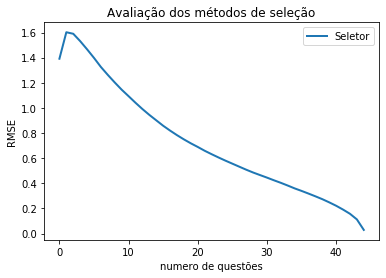

Random Selector
99993
6303.8483600616455


In [32]:
base_result = 'Result_RandomSelector_theta_orig_100000.txt'

selector = RandomSelector()

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

aluno: 0
aluno: 1
aluno: 2
aluno: 3
aluno: 4
aluno: 5
aluno: 6
aluno: 7
aluno: 8
aluno: 9
aluno: 10
aluno: 11
aluno: 12
aluno: 13
aluno: 14
aluno: 15
aluno: 16
aluno: 17
aluno: 18
aluno: 19
aluno: 20
aluno: 21
aluno: 22
aluno: 23
aluno: 24
aluno: 25
aluno: 26
aluno: 27
aluno: 28
aluno: 29
aluno: 30
aluno: 31
aluno: 32
aluno: 33
aluno: 34
aluno: 35
aluno: 36
aluno: 37
aluno: 38
aluno: 39
aluno: 40
aluno: 41
aluno: 42
aluno: 43
aluno: 44
aluno: 45
aluno: 46
aluno: 47
aluno: 48
aluno: 49
aluno: 50
aluno: 51
aluno: 52
aluno: 53
aluno: 54
aluno: 55
aluno: 56
aluno: 57
aluno: 58
aluno: 59
aluno: 60
aluno: 61
aluno: 62
aluno: 63
aluno: 64
aluno: 65
aluno: 66
aluno: 67
aluno: 68
aluno: 69
aluno: 70
aluno: 71
aluno: 72
aluno: 73
aluno: 74
aluno: 75
aluno: 76
aluno: 77
aluno: 78
aluno: 79
aluno: 80
aluno: 81
aluno: 82
aluno: 83
aluno: 84
aluno: 85
aluno: 86
aluno: 87
aluno: 88
aluno: 89
aluno: 90
aluno: 91
aluno: 92
aluno: 93
aluno: 94
aluno: 95
aluno: 96
aluno: 97
aluno: 98
aluno: 99
aluno: 100

aluno: 755
aluno: 756
aluno: 757
aluno: 758
aluno: 759
aluno: 760
aluno: 761
aluno: 762
aluno: 763
aluno: 764
aluno: 765
aluno: 766
aluno: 767
aluno: 768
aluno: 769
aluno: 770
aluno: 771
aluno: 772
aluno: 773
aluno: 774
aluno: 775
aluno: 776
aluno: 777
aluno: 778
aluno: 779
aluno: 780
aluno: 781
aluno: 782
aluno: 783
aluno: 784
aluno: 785
aluno: 786
aluno: 787
aluno: 788
aluno: 789
aluno: 790
aluno: 791
aluno: 792
aluno: 793
aluno: 794
aluno: 795
aluno: 796
aluno: 797
aluno: 798
aluno: 799
aluno: 800
aluno: 801
aluno: 802
aluno: 803
aluno: 804
aluno: 805
aluno: 806
aluno: 807
aluno: 808
aluno: 809
aluno: 810
aluno: 811
aluno: 812
aluno: 813
aluno: 814
aluno: 815
aluno: 816
aluno: 817
aluno: 818
aluno: 819
aluno: 820
aluno: 821
aluno: 822
aluno: 823
aluno: 824
aluno: 825
aluno: 826
aluno: 827
aluno: 828
aluno: 829
aluno: 830
aluno: 831
aluno: 832
aluno: 833
aluno: 834
aluno: 835
aluno: 836
aluno: 837
aluno: 838
aluno: 839
aluno: 840
aluno: 841
aluno: 842
aluno: 843
aluno: 844
aluno: 845

aluno: 1461
aluno: 1462
aluno: 1463
aluno: 1464
aluno: 1465
aluno: 1466
aluno: 1467
aluno: 1468
aluno: 1469
aluno: 1470
aluno: 1471
aluno: 1472
aluno: 1473
aluno: 1474
aluno: 1475
aluno: 1476
aluno: 1477
aluno: 1478
aluno: 1479
aluno: 1480
aluno: 1481
aluno: 1482
aluno: 1483
aluno: 1484
aluno: 1485
aluno: 1486
aluno: 1487
aluno: 1488
aluno: 1489
aluno: 1490
aluno: 1491
aluno: 1492
aluno: 1493
aluno: 1494
aluno: 1495
aluno: 1496
aluno: 1497
aluno: 1498
aluno: 1499
aluno: 1500
aluno: 1501
aluno: 1502
aluno: 1503
aluno: 1504
aluno: 1505
aluno: 1506
aluno: 1507
aluno: 1508
aluno: 1509
aluno: 1510
aluno: 1511
aluno: 1512
aluno: 1513
aluno: 1514
aluno: 1515
aluno: 1516
aluno: 1517
aluno: 1518
aluno: 1519
aluno: 1520
aluno: 1521
aluno: 1522
aluno: 1523
aluno: 1524
aluno: 1525
aluno: 1526
aluno: 1527
aluno: 1528
aluno: 1529
aluno: 1530
aluno: 1531
aluno: 1532
aluno: 1533
aluno: 1534
aluno: 1535
aluno: 1536
aluno: 1537
aluno: 1538
aluno: 1539
aluno: 1540
aluno: 1541
aluno: 1542
aluno: 1543
alun

aluno: 2146
aluno: 2147
aluno: 2148
aluno: 2149
aluno: 2150
aluno: 2151
aluno: 2152
aluno: 2153
aluno: 2154
aluno: 2155
aluno: 2156
aluno: 2157
aluno: 2158
aluno: 2159
aluno: 2160
aluno: 2161
aluno: 2162
aluno: 2163
aluno: 2164
aluno: 2165
aluno: 2166
aluno: 2167
aluno: 2168
aluno: 2169
aluno: 2170
aluno: 2171
aluno: 2172
aluno: 2173
aluno: 2174
aluno: 2175
aluno: 2176
aluno: 2177
aluno: 2178
aluno: 2179
aluno: 2180
aluno: 2181
aluno: 2182
aluno: 2183
aluno: 2184
aluno: 2185
aluno: 2186
aluno: 2187
aluno: 2188
aluno: 2189
aluno: 2190
aluno: 2191
aluno: 2192
aluno: 2193
aluno: 2194
aluno: 2195
aluno: 2196
aluno: 2197
aluno: 2198
aluno: 2199
aluno: 2200
aluno: 2201
aluno: 2202
aluno: 2203
aluno: 2204
aluno: 2205
aluno: 2206
aluno: 2207
aluno: 2208
aluno: 2209
aluno: 2210
aluno: 2211
aluno: 2212
aluno: 2213
aluno: 2214
aluno: 2215
aluno: 2216
aluno: 2217
aluno: 2218
aluno: 2219
aluno: 2220
aluno: 2221
aluno: 2222
aluno: 2223
aluno: 2224
aluno: 2225
aluno: 2226
aluno: 2227
aluno: 2228
alun

aluno: 2831
aluno: 2832
aluno: 2833
aluno: 2834
aluno: 2835
aluno: 2836
aluno: 2837
aluno: 2838
aluno: 2839
aluno: 2840
aluno: 2841
aluno: 2842
aluno: 2843
aluno: 2844
aluno: 2845
aluno: 2846
aluno: 2847
aluno: 2848
aluno: 2849
aluno: 2850
aluno: 2851
aluno: 2852
aluno: 2853
aluno: 2854
aluno: 2855
aluno: 2856
aluno: 2857
aluno: 2858
aluno: 2859
aluno: 2860
aluno: 2861
aluno: 2862
aluno: 2863
aluno: 2864
aluno: 2865
aluno: 2866
aluno: 2867
aluno: 2868
aluno: 2869
aluno: 2870
aluno: 2871
aluno: 2872
aluno: 2873
aluno: 2874
aluno: 2875
aluno: 2876
aluno: 2877
aluno: 2878
aluno: 2879
aluno: 2880
aluno: 2881
aluno: 2882
aluno: 2883
aluno: 2884
aluno: 2885
aluno: 2886
aluno: 2887
aluno: 2888
aluno: 2889
aluno: 2890
aluno: 2891
aluno: 2892
aluno: 2893
aluno: 2894
aluno: 2895
aluno: 2896
aluno: 2897
aluno: 2898
aluno: 2899
aluno: 2900
aluno: 2901
aluno: 2902
aluno: 2903
aluno: 2904
aluno: 2905
aluno: 2906
aluno: 2907
aluno: 2908
aluno: 2909
aluno: 2910
aluno: 2911
aluno: 2912
aluno: 2913
alun

aluno: 3516
aluno: 3517
aluno: 3518
aluno: 3519
aluno: 3520
aluno: 3521
aluno: 3522
aluno: 3523
aluno: 3524
aluno: 3525
aluno: 3526
aluno: 3527
aluno: 3528
aluno: 3529
aluno: 3530
aluno: 3531
aluno: 3532
aluno: 3533
aluno: 3534
aluno: 3535
aluno: 3536
aluno: 3537
aluno: 3538
aluno: 3539
aluno: 3540
aluno: 3541
aluno: 3542
aluno: 3543
aluno: 3544
aluno: 3545
aluno: 3546
aluno: 3547
aluno: 3548
aluno: 3549
aluno: 3550
aluno: 3551
aluno: 3552
aluno: 3553
aluno: 3554
aluno: 3555
aluno: 3556
aluno: 3557
aluno: 3558
aluno: 3559
aluno: 3560
aluno: 3561
aluno: 3562
aluno: 3563
aluno: 3564
aluno: 3565
aluno: 3566
aluno: 3567
aluno: 3568
aluno: 3569
aluno: 3570
aluno: 3571
aluno: 3572
aluno: 3573
aluno: 3574
aluno: 3575
aluno: 3576
aluno: 3577
aluno: 3578
aluno: 3579
aluno: 3580
aluno: 3581
aluno: 3582
aluno: 3583
aluno: 3584
aluno: 3585
aluno: 3586
aluno: 3587
aluno: 3588
aluno: 3589
aluno: 3590
aluno: 3591
aluno: 3592
aluno: 3593
aluno: 3594
aluno: 3595
aluno: 3596
aluno: 3597
aluno: 3598
alun

aluno: 4200
aluno: 4201
aluno: 4202
aluno: 4203
aluno: 4204
aluno: 4205
aluno: 4206
aluno: 4207
aluno: 4208
aluno: 4209
aluno: 4210
aluno: 4211
aluno: 4212
aluno: 4213
aluno: 4214
aluno: 4215
aluno: 4216
aluno: 4217
aluno: 4218
aluno: 4219
aluno: 4220
aluno: 4221
aluno: 4222
aluno: 4223
aluno: 4224
aluno: 4225
aluno: 4226
aluno: 4227
aluno: 4228
aluno: 4229
aluno: 4230
aluno: 4231
aluno: 4232
aluno: 4233
aluno: 4234
aluno: 4235
aluno: 4236
aluno: 4237
aluno: 4238
aluno: 4239
aluno: 4240
aluno: 4241
aluno: 4242
aluno: 4243
aluno: 4244
aluno: 4245
aluno: 4246
aluno: 4247
aluno: 4248
aluno: 4249
aluno: 4250
aluno: 4251
aluno: 4252
aluno: 4253
aluno: 4254
aluno: 4255
aluno: 4256
aluno: 4257
aluno: 4258
aluno: 4259
aluno: 4260
aluno: 4261
aluno: 4262
aluno: 4263
aluno: 4264
aluno: 4265
aluno: 4266
aluno: 4267
aluno: 4268
aluno: 4269
aluno: 4270
aluno: 4271
aluno: 4272
aluno: 4273
aluno: 4274
aluno: 4275
aluno: 4276
aluno: 4277
aluno: 4278
aluno: 4279
aluno: 4280
aluno: 4281
aluno: 4282
alun

aluno: 4883
aluno: 4884
aluno: 4885
aluno: 4886
aluno: 4887
aluno: 4888
aluno: 4889
aluno: 4890
aluno: 4891
aluno: 4892
aluno: 4893
aluno: 4894
aluno: 4895
aluno: 4896
aluno: 4897
aluno: 4898
aluno: 4899
aluno: 4900
aluno: 4901
aluno: 4902
aluno: 4903
aluno: 4904
aluno: 4905
aluno: 4906
aluno: 4907
aluno: 4908
aluno: 4909
aluno: 4910
aluno: 4911
aluno: 4912
aluno: 4913
aluno: 4914
aluno: 4915
aluno: 4916
aluno: 4917
aluno: 4918
aluno: 4919
aluno: 4920
aluno: 4921
aluno: 4922
aluno: 4923
aluno: 4924
aluno: 4925
aluno: 4926
aluno: 4927
aluno: 4928
aluno: 4929
aluno: 4930
aluno: 4931
aluno: 4932
aluno: 4933
aluno: 4934
aluno: 4935
aluno: 4936
aluno: 4937
aluno: 4938
aluno: 4939
aluno: 4940
aluno: 4941
aluno: 4942
aluno: 4943
aluno: 4944
aluno: 4945
aluno: 4946
aluno: 4947
aluno: 4948
aluno: 4949
aluno: 4950
aluno: 4951
aluno: 4952
aluno: 4953
aluno: 4954
aluno: 4955
aluno: 4956
aluno: 4957
aluno: 4958
aluno: 4959
aluno: 4960
aluno: 4961
aluno: 4962
aluno: 4963
aluno: 4964
aluno: 4965
alun

aluno: 5567
aluno: 5568
aluno: 5569
aluno: 5570
aluno: 5571
aluno: 5572
aluno: 5573
aluno: 5574
aluno: 5575
aluno: 5576
aluno: 5577
aluno: 5578
aluno: 5579
aluno: 5580
aluno: 5581
aluno: 5582
aluno: 5583
aluno: 5584
aluno: 5585
aluno: 5586
aluno: 5587
aluno: 5588
aluno: 5589
aluno: 5590
aluno: 5591
aluno: 5592
aluno: 5593
aluno: 5594
aluno: 5595
aluno: 5596
aluno: 5597
aluno: 5598
aluno: 5599
aluno: 5600
aluno: 5601
aluno: 5602
aluno: 5603
aluno: 5604
aluno: 5605
aluno: 5606
aluno: 5607
aluno: 5608
aluno: 5609
aluno: 5610
aluno: 5611
aluno: 5612
aluno: 5613
aluno: 5614
aluno: 5615
aluno: 5616
aluno: 5617
aluno: 5618
aluno: 5619
aluno: 5620
aluno: 5621
aluno: 5622
aluno: 5623
aluno: 5624
aluno: 5625
aluno: 5626
aluno: 5627
aluno: 5628
aluno: 5629
aluno: 5630
aluno: 5631
aluno: 5632
aluno: 5633
aluno: 5634
aluno: 5635
aluno: 5636
aluno: 5637
aluno: 5638
aluno: 5639
aluno: 5640
aluno: 5641
aluno: 5642
aluno: 5643
aluno: 5644
aluno: 5645
aluno: 5646
aluno: 5647
aluno: 5648
aluno: 5649
alun

aluno: 6251
aluno: 6252
aluno: 6253
aluno: 6254
aluno: 6255
aluno: 6256
aluno: 6257
aluno: 6258
aluno: 6259
aluno: 6260
aluno: 6261
aluno: 6262
aluno: 6263
aluno: 6264
aluno: 6265
aluno: 6266
aluno: 6267
aluno: 6268
aluno: 6269
aluno: 6270
aluno: 6271
aluno: 6272
aluno: 6273
aluno: 6274
aluno: 6275
aluno: 6276
aluno: 6277
aluno: 6278
aluno: 6279
aluno: 6280
aluno: 6281
aluno: 6282
aluno: 6283
aluno: 6284
aluno: 6285
aluno: 6286
aluno: 6287
aluno: 6288
aluno: 6289
aluno: 6290
aluno: 6291
aluno: 6292
aluno: 6293
aluno: 6294
aluno: 6295
aluno: 6296
aluno: 6297
aluno: 6298
aluno: 6299
aluno: 6300
aluno: 6301
aluno: 6302
aluno: 6303
aluno: 6304
aluno: 6305
aluno: 6306
aluno: 6307
aluno: 6308
aluno: 6309
aluno: 6310
aluno: 6311
aluno: 6312
aluno: 6313
aluno: 6314
aluno: 6315
aluno: 6316
aluno: 6317
aluno: 6318
aluno: 6319
aluno: 6320
aluno: 6321
aluno: 6322
aluno: 6323
aluno: 6324
aluno: 6325
aluno: 6326
aluno: 6327
aluno: 6328
aluno: 6329
aluno: 6330
aluno: 6331
aluno: 6332
aluno: 6333
alun

aluno: 6937
aluno: 6938
aluno: 6939
aluno: 6940
aluno: 6941
aluno: 6942
aluno: 6943
aluno: 6944
aluno: 6945
aluno: 6946
aluno: 6947
aluno: 6948
aluno: 6949
aluno: 6950
aluno: 6951
aluno: 6952
aluno: 6953
aluno: 6954
aluno: 6955
aluno: 6956
aluno: 6957
aluno: 6958
aluno: 6959
aluno: 6960
aluno: 6961
aluno: 6962
aluno: 6963
aluno: 6964
aluno: 6965
aluno: 6966
aluno: 6967
aluno: 6968
aluno: 6969
aluno: 6970
aluno: 6971
aluno: 6972
aluno: 6973
aluno: 6974
aluno: 6975
aluno: 6976
aluno: 6977
aluno: 6978
aluno: 6979
aluno: 6980
aluno: 6981
aluno: 6982
aluno: 6983
aluno: 6984
aluno: 6985
aluno: 6986
aluno: 6987
aluno: 6988
aluno: 6989
aluno: 6990
aluno: 6991
aluno: 6992
aluno: 6993
aluno: 6994
aluno: 6995
aluno: 6996
aluno: 6997
aluno: 6998
aluno: 6999
aluno: 7000
aluno: 7001
aluno: 7002
aluno: 7003
aluno: 7004
aluno: 7005
aluno: 7006
aluno: 7007
aluno: 7008
aluno: 7009
aluno: 7010
aluno: 7011
aluno: 7012
aluno: 7013
aluno: 7014
aluno: 7015
aluno: 7016
aluno: 7017
aluno: 7018
aluno: 7019
alun

aluno: 7622
aluno: 7623
aluno: 7624
aluno: 7625
aluno: 7626
aluno: 7627
aluno: 7628
aluno: 7629
aluno: 7630
aluno: 7631
aluno: 7632
aluno: 7633
aluno: 7634
aluno: 7635
aluno: 7636
aluno: 7637
aluno: 7638
aluno: 7639
aluno: 7640
aluno: 7641
aluno: 7642
aluno: 7643
aluno: 7644
aluno: 7645
aluno: 7646
aluno: 7647
aluno: 7648
aluno: 7649
aluno: 7650
aluno: 7651
aluno: 7652
aluno: 7653
aluno: 7654
aluno: 7655
aluno: 7656
aluno: 7657
aluno: 7658
aluno: 7659
aluno: 7660
aluno: 7661
aluno: 7662
aluno: 7663
aluno: 7664
aluno: 7665
aluno: 7666
aluno: 7667
aluno: 7668
aluno: 7669
aluno: 7670
aluno: 7671
aluno: 7672
aluno: 7673
aluno: 7674
aluno: 7675
aluno: 7676
aluno: 7677
aluno: 7678
aluno: 7679
aluno: 7680
aluno: 7681
aluno: 7682
aluno: 7683
aluno: 7684
aluno: 7685
aluno: 7686
aluno: 7687
aluno: 7688
aluno: 7689
aluno: 7690
aluno: 7691
aluno: 7692
aluno: 7693
aluno: 7694
aluno: 7695
aluno: 7696
aluno: 7697
aluno: 7698
aluno: 7699
aluno: 7700
aluno: 7701
aluno: 7702
aluno: 7703
aluno: 7704
alun

aluno: 8306
aluno: 8307
aluno: 8308
aluno: 8309
aluno: 8310
aluno: 8311
aluno: 8312
aluno: 8313
aluno: 8314
aluno: 8315
aluno: 8316
aluno: 8317
aluno: 8318
aluno: 8319
aluno: 8320
aluno: 8321
aluno: 8322
aluno: 8323
aluno: 8324
aluno: 8325
aluno: 8326
aluno: 8327
aluno: 8328
aluno: 8329
aluno: 8330
aluno: 8331
aluno: 8332
aluno: 8333
aluno: 8334
aluno: 8335
aluno: 8336
aluno: 8337
aluno: 8338
aluno: 8339
aluno: 8340
aluno: 8341
aluno: 8342
aluno: 8343
aluno: 8344
aluno: 8345
aluno: 8346
aluno: 8347
aluno: 8348
aluno: 8349
aluno: 8350
aluno: 8351
aluno: 8352
aluno: 8353
aluno: 8354
aluno: 8355
aluno: 8356
aluno: 8357
aluno: 8358
aluno: 8359
aluno: 8360
aluno: 8361
aluno: 8362
aluno: 8363
aluno: 8364
aluno: 8365
aluno: 8366
aluno: 8367
aluno: 8368
aluno: 8369
aluno: 8370
aluno: 8371
aluno: 8372
aluno: 8373
aluno: 8374
aluno: 8375
aluno: 8376
aluno: 8377
aluno: 8378
aluno: 8379
aluno: 8380
aluno: 8381
aluno: 8382
aluno: 8383
aluno: 8384
aluno: 8385
aluno: 8386
aluno: 8387
aluno: 8388
alun

aluno: 8992
aluno: 8993
aluno: 8994
aluno: 8995
aluno: 8996
aluno: 8997
aluno: 8998
aluno: 8999
aluno: 9000
aluno: 9001
aluno: 9002
aluno: 9003
aluno: 9004
aluno: 9005
aluno: 9006
aluno: 9007
aluno: 9008
aluno: 9009
aluno: 9010
aluno: 9011
aluno: 9012
aluno: 9013
aluno: 9014
aluno: 9015
aluno: 9016
aluno: 9017
aluno: 9018
aluno: 9019
aluno: 9020
aluno: 9021
aluno: 9022
aluno: 9023
aluno: 9024
aluno: 9025
aluno: 9026
aluno: 9027
aluno: 9028
aluno: 9029
aluno: 9030
aluno: 9031
aluno: 9032
aluno: 9033
aluno: 9034
aluno: 9035
aluno: 9036
aluno: 9037
aluno: 9038
aluno: 9039
aluno: 9040
aluno: 9041
aluno: 9042
aluno: 9043
aluno: 9044
aluno: 9045
aluno: 9046
aluno: 9047
aluno: 9048
aluno: 9049
aluno: 9050
aluno: 9051
aluno: 9052
aluno: 9053
aluno: 9054
aluno: 9055
aluno: 9056
aluno: 9057
aluno: 9058
aluno: 9059
aluno: 9060
aluno: 9061
aluno: 9062
aluno: 9063
aluno: 9064
aluno: 9065
aluno: 9066
aluno: 9067
aluno: 9068
aluno: 9069
aluno: 9070
aluno: 9071
aluno: 9072
aluno: 9073
aluno: 9074
alun

aluno: 9676
aluno: 9677
aluno: 9678
aluno: 9679
aluno: 9680
aluno: 9681
aluno: 9682
aluno: 9683
aluno: 9684
aluno: 9685
aluno: 9686
aluno: 9687
aluno: 9688
aluno: 9689
aluno: 9690
aluno: 9691
aluno: 9692
aluno: 9693
aluno: 9694
aluno: 9695
aluno: 9696
aluno: 9697
aluno: 9698
aluno: 9699
aluno: 9700
aluno: 9701
aluno: 9702
aluno: 9703
aluno: 9704
aluno: 9705
aluno: 9706
aluno: 9707
aluno: 9708
aluno: 9709
aluno: 9710
aluno: 9711
aluno: 9712
aluno: 9713
aluno: 9714
aluno: 9715
aluno: 9716
aluno: 9717
aluno: 9718
aluno: 9719
aluno: 9720
aluno: 9721
aluno: 9722
aluno: 9723
aluno: 9724
aluno: 9725
aluno: 9726
aluno: 9727
aluno: 9728
aluno: 9729
aluno: 9730
aluno: 9731
aluno: 9732
aluno: 9733
aluno: 9734
aluno: 9735
aluno: 9736
aluno: 9737
aluno: 9738
aluno: 9739
aluno: 9740
aluno: 9741
aluno: 9742
aluno: 9743
aluno: 9744
aluno: 9745
aluno: 9746
aluno: 9747
aluno: 9748
aluno: 9749
aluno: 9750
aluno: 9751
aluno: 9752
aluno: 9753
aluno: 9754
aluno: 9755
aluno: 9756
aluno: 9757
aluno: 9758
alun

aluno: 10334
aluno: 10335
aluno: 10336
aluno: 10337
aluno: 10338
aluno: 10339
aluno: 10340
aluno: 10341
aluno: 10342
aluno: 10343
aluno: 10344
aluno: 10345
aluno: 10346
aluno: 10347
aluno: 10348
aluno: 10349
aluno: 10350
aluno: 10351
aluno: 10352
aluno: 10353
aluno: 10354
aluno: 10355
aluno: 10356
aluno: 10357
aluno: 10358
aluno: 10359
aluno: 10360
aluno: 10361
aluno: 10362
aluno: 10363
aluno: 10364
aluno: 10365
aluno: 10366
aluno: 10367
aluno: 10368
aluno: 10369
aluno: 10370
aluno: 10371
aluno: 10372
aluno: 10373
aluno: 10374
aluno: 10375
aluno: 10376
aluno: 10377
aluno: 10378
aluno: 10379
aluno: 10380
aluno: 10381
aluno: 10382
aluno: 10383
aluno: 10384
aluno: 10385
aluno: 10386
aluno: 10387
aluno: 10388
aluno: 10389
aluno: 10390
aluno: 10391
aluno: 10392
aluno: 10393
aluno: 10394
aluno: 10395
aluno: 10396
aluno: 10397
aluno: 10398
aluno: 10399
aluno: 10400
aluno: 10401
aluno: 10402
aluno: 10403
aluno: 10404
aluno: 10405
aluno: 10406
aluno: 10407
aluno: 10408
aluno: 10409
aluno: 10410

aluno: 10965
aluno: 10966
aluno: 10967
aluno: 10968
aluno: 10969
aluno: 10970
aluno: 10971
aluno: 10972
aluno: 10973
aluno: 10974
aluno: 10975
aluno: 10976
aluno: 10977
aluno: 10978
aluno: 10979
aluno: 10980
aluno: 10981
aluno: 10982
aluno: 10983
aluno: 10984
aluno: 10985
aluno: 10986
aluno: 10987
aluno: 10988
aluno: 10989
aluno: 10990
aluno: 10991
aluno: 10992
aluno: 10993
aluno: 10994
aluno: 10995
aluno: 10996
aluno: 10997
aluno: 10998
aluno: 10999
aluno: 11000
aluno: 11001
aluno: 11002
aluno: 11003
aluno: 11004
aluno: 11005
aluno: 11006
aluno: 11007
aluno: 11008
aluno: 11009
aluno: 11010
aluno: 11011
aluno: 11012
aluno: 11013
aluno: 11014
aluno: 11015
aluno: 11016
aluno: 11017
aluno: 11018
aluno: 11019
aluno: 11020
aluno: 11021
aluno: 11022
aluno: 11023
aluno: 11024
aluno: 11025
aluno: 11026
aluno: 11027
aluno: 11028
aluno: 11029
aluno: 11030
aluno: 11031
aluno: 11032
aluno: 11033
aluno: 11034
aluno: 11035
aluno: 11036
aluno: 11037
aluno: 11038
aluno: 11039
aluno: 11040
aluno: 11041

aluno: 11596
aluno: 11597
aluno: 11598
aluno: 11599
aluno: 11600
aluno: 11601
aluno: 11602
aluno: 11603
aluno: 11604
aluno: 11605
aluno: 11606
aluno: 11607
aluno: 11608
aluno: 11609
aluno: 11610
aluno: 11611
aluno: 11612
aluno: 11613
aluno: 11614
aluno: 11615
aluno: 11616
aluno: 11617
aluno: 11618
aluno: 11619
aluno: 11620
aluno: 11621
aluno: 11622
aluno: 11623
aluno: 11624
aluno: 11625
aluno: 11626
aluno: 11627
aluno: 11628
aluno: 11629
aluno: 11630
aluno: 11631
aluno: 11632
aluno: 11633
aluno: 11634
aluno: 11635
aluno: 11636
aluno: 11637
aluno: 11638
aluno: 11639
aluno: 11640
aluno: 11641
aluno: 11642
aluno: 11643
aluno: 11644
aluno: 11645
aluno: 11646
aluno: 11647
aluno: 11648
aluno: 11649
aluno: 11650
aluno: 11651
aluno: 11652
aluno: 11653
aluno: 11654
aluno: 11655
aluno: 11656
aluno: 11657
aluno: 11658
aluno: 11659
aluno: 11660
aluno: 11661
aluno: 11662
aluno: 11663
aluno: 11664
aluno: 11665
aluno: 11666
aluno: 11667
aluno: 11668
aluno: 11669
aluno: 11670
aluno: 11671
aluno: 11672

aluno: 12229
aluno: 12230
aluno: 12231
aluno: 12232
aluno: 12233
aluno: 12234
aluno: 12235
aluno: 12236
aluno: 12237
aluno: 12238
aluno: 12239
aluno: 12240
aluno: 12241
aluno: 12242
aluno: 12243
aluno: 12244
aluno: 12245
aluno: 12246
aluno: 12247
aluno: 12248
aluno: 12249
aluno: 12250
aluno: 12251
aluno: 12252
aluno: 12253
aluno: 12254
aluno: 12255
aluno: 12256
aluno: 12257
aluno: 12258
aluno: 12259
aluno: 12260
aluno: 12261
aluno: 12262
aluno: 12263
aluno: 12264
aluno: 12265
aluno: 12266
aluno: 12267
aluno: 12268
aluno: 12269
aluno: 12270
aluno: 12271
aluno: 12272
aluno: 12273
aluno: 12274
aluno: 12275
aluno: 12276
aluno: 12277
aluno: 12278
aluno: 12279
aluno: 12280
aluno: 12281
aluno: 12282
aluno: 12283
aluno: 12284
aluno: 12285
aluno: 12286
aluno: 12287
aluno: 12288
aluno: 12289
aluno: 12290
aluno: 12291
aluno: 12292
aluno: 12293
aluno: 12294
aluno: 12295
aluno: 12296
aluno: 12297
aluno: 12298
aluno: 12299
aluno: 12300
aluno: 12301
aluno: 12302
aluno: 12303
aluno: 12304
aluno: 12305

aluno: 12863
aluno: 12864
aluno: 12865
aluno: 12866
aluno: 12867
aluno: 12868
aluno: 12869
aluno: 12870
aluno: 12871
aluno: 12872
aluno: 12873
aluno: 12874
aluno: 12875
aluno: 12876
aluno: 12877
aluno: 12878
aluno: 12879
aluno: 12880
aluno: 12881
aluno: 12882
aluno: 12883
aluno: 12884
aluno: 12885
aluno: 12886
aluno: 12887
aluno: 12888
aluno: 12889
aluno: 12890
aluno: 12891
aluno: 12892
aluno: 12893
aluno: 12894
aluno: 12895
aluno: 12896
aluno: 12897
aluno: 12898
aluno: 12899
aluno: 12900
aluno: 12901
aluno: 12902
aluno: 12903
aluno: 12904
aluno: 12905
aluno: 12906
aluno: 12907
aluno: 12908
aluno: 12909
aluno: 12910
aluno: 12911
aluno: 12912
aluno: 12913
aluno: 12914
aluno: 12915
aluno: 12916
aluno: 12917
aluno: 12918
aluno: 12919
aluno: 12920
aluno: 12921
aluno: 12922
aluno: 12923
aluno: 12924
aluno: 12925
aluno: 12926
aluno: 12927
aluno: 12928
aluno: 12929
aluno: 12930
aluno: 12931
aluno: 12932
aluno: 12933
aluno: 12934
aluno: 12935
aluno: 12936
aluno: 12937
aluno: 12938
aluno: 12939

aluno: 13498
aluno: 13499
aluno: 13500
aluno: 13501
aluno: 13502
aluno: 13503
aluno: 13504
aluno: 13505
aluno: 13506
aluno: 13507
aluno: 13508
aluno: 13509
aluno: 13510
aluno: 13511
aluno: 13512
aluno: 13513
aluno: 13514
aluno: 13515
aluno: 13516
aluno: 13517
aluno: 13518
aluno: 13519
aluno: 13520
aluno: 13521
aluno: 13522
aluno: 13523
aluno: 13524
aluno: 13525
aluno: 13526
aluno: 13527
aluno: 13528
aluno: 13529
aluno: 13530
aluno: 13531
aluno: 13532
aluno: 13533
aluno: 13534
aluno: 13535
aluno: 13536
aluno: 13537
aluno: 13538
aluno: 13539
aluno: 13540
aluno: 13541
aluno: 13542
aluno: 13543
aluno: 13544
aluno: 13545
aluno: 13546
aluno: 13547
aluno: 13548
aluno: 13549
aluno: 13550
aluno: 13551
aluno: 13552
aluno: 13553
aluno: 13554
aluno: 13555
aluno: 13556
aluno: 13557
aluno: 13558
aluno: 13559
aluno: 13560
aluno: 13561
aluno: 13562
aluno: 13563
aluno: 13564
aluno: 13565
aluno: 13566
aluno: 13567
aluno: 13568
aluno: 13569
aluno: 13570
aluno: 13571
aluno: 13572
aluno: 13573
aluno: 13574

aluno: 14130
aluno: 14131
aluno: 14132
aluno: 14133
aluno: 14134
aluno: 14135
aluno: 14136
aluno: 14137
aluno: 14138
aluno: 14139
aluno: 14140
aluno: 14141
aluno: 14142
aluno: 14143
aluno: 14144
aluno: 14145
aluno: 14146
aluno: 14147
aluno: 14148
aluno: 14149
aluno: 14150
aluno: 14151
aluno: 14152
aluno: 14153
aluno: 14154
aluno: 14155
aluno: 14156
aluno: 14157
aluno: 14158
aluno: 14159
aluno: 14160
aluno: 14161
aluno: 14162
aluno: 14163
aluno: 14164
aluno: 14165
aluno: 14166
aluno: 14167
aluno: 14168
aluno: 14169
aluno: 14170
aluno: 14171
aluno: 14172
aluno: 14173
aluno: 14174
aluno: 14175
aluno: 14176
aluno: 14177
aluno: 14178
aluno: 14179
aluno: 14180
aluno: 14181
aluno: 14182
aluno: 14183
aluno: 14184
aluno: 14185
aluno: 14186
aluno: 14187
aluno: 14188
aluno: 14189
aluno: 14190
aluno: 14191
aluno: 14192
aluno: 14193
aluno: 14194
aluno: 14195
aluno: 14196
aluno: 14197
aluno: 14198
aluno: 14199
aluno: 14200
aluno: 14201
aluno: 14202
aluno: 14203
aluno: 14204
aluno: 14205
aluno: 14206

aluno: 14761
aluno: 14762
aluno: 14763
aluno: 14764
aluno: 14765
aluno: 14766
aluno: 14767
aluno: 14768
aluno: 14769
aluno: 14770
aluno: 14771
aluno: 14772
aluno: 14773
aluno: 14774
aluno: 14775
aluno: 14776
aluno: 14777
aluno: 14778
aluno: 14779
aluno: 14780
aluno: 14781
aluno: 14782
aluno: 14783
aluno: 14784
aluno: 14785
aluno: 14786
aluno: 14787
aluno: 14788
aluno: 14789
aluno: 14790
aluno: 14791
aluno: 14792
aluno: 14793
aluno: 14794
aluno: 14795
aluno: 14796
aluno: 14797
aluno: 14798
aluno: 14799
aluno: 14800
aluno: 14801
aluno: 14802
aluno: 14803
aluno: 14804
aluno: 14805
aluno: 14806
aluno: 14807
aluno: 14808
aluno: 14809
aluno: 14810
aluno: 14811
aluno: 14812
aluno: 14813
aluno: 14814
aluno: 14815
aluno: 14816
aluno: 14817
aluno: 14818
aluno: 14819
aluno: 14820
aluno: 14821
aluno: 14822
aluno: 14823
aluno: 14824
aluno: 14825
aluno: 14826
aluno: 14827
aluno: 14828
aluno: 14829
aluno: 14830
aluno: 14831
aluno: 14832
aluno: 14833
aluno: 14834
aluno: 14835
aluno: 14836
aluno: 14837

aluno: 15395
aluno: 15396
aluno: 15397
aluno: 15398
aluno: 15399
aluno: 15400
aluno: 15401
aluno: 15402
aluno: 15403
aluno: 15404
aluno: 15405
aluno: 15406
aluno: 15407
aluno: 15408
aluno: 15409
aluno: 15410
aluno: 15411
aluno: 15412
aluno: 15413
aluno: 15414
aluno: 15415
aluno: 15416
aluno: 15417
aluno: 15418
aluno: 15419
aluno: 15420
aluno: 15421
aluno: 15422
aluno: 15423
aluno: 15424
aluno: 15425
aluno: 15426
aluno: 15427
aluno: 15428
aluno: 15429
aluno: 15430
aluno: 15431
aluno: 15432
aluno: 15433
aluno: 15434
aluno: 15435
aluno: 15436
aluno: 15437
aluno: 15438
aluno: 15439
aluno: 15440
aluno: 15441
aluno: 15442
aluno: 15443
aluno: 15444
aluno: 15445
aluno: 15446
aluno: 15447
aluno: 15448
aluno: 15449
aluno: 15450
aluno: 15451
aluno: 15452
aluno: 15453
aluno: 15454
aluno: 15455
aluno: 15456
aluno: 15457
aluno: 15458
aluno: 15459
aluno: 15460
aluno: 15461
aluno: 15462
aluno: 15463
aluno: 15464
aluno: 15465
aluno: 15466
aluno: 15467
aluno: 15468
aluno: 15469
aluno: 15470
aluno: 15471

aluno: 16029
aluno: 16030
aluno: 16031
aluno: 16032
aluno: 16033
aluno: 16034
aluno: 16035
aluno: 16036
aluno: 16037
aluno: 16038
aluno: 16039
aluno: 16040
aluno: 16041
aluno: 16042
aluno: 16043
aluno: 16044
aluno: 16045
aluno: 16046
aluno: 16047
aluno: 16048
aluno: 16049
aluno: 16050
aluno: 16051
aluno: 16052
aluno: 16053
aluno: 16054
aluno: 16055
aluno: 16056
aluno: 16057
aluno: 16058
aluno: 16059
aluno: 16060
aluno: 16061
aluno: 16062
aluno: 16063
aluno: 16064
aluno: 16065
aluno: 16066
aluno: 16067
aluno: 16068
aluno: 16069
aluno: 16070
aluno: 16071
aluno: 16072
aluno: 16073
aluno: 16074
aluno: 16075
aluno: 16076
aluno: 16077
aluno: 16078
aluno: 16079
aluno: 16080
aluno: 16081
aluno: 16082
aluno: 16083
aluno: 16084
aluno: 16085
aluno: 16086
aluno: 16087
aluno: 16088
aluno: 16089
aluno: 16090
aluno: 16091
aluno: 16092
aluno: 16093
aluno: 16094
aluno: 16095
aluno: 16096
aluno: 16097
aluno: 16098
aluno: 16099
aluno: 16100
aluno: 16101
aluno: 16102
aluno: 16103
aluno: 16104
aluno: 16105

aluno: 16663
aluno: 16664
aluno: 16665
aluno: 16666
aluno: 16667
aluno: 16668
aluno: 16669
aluno: 16670
aluno: 16671
aluno: 16672
aluno: 16673
aluno: 16674
aluno: 16675
aluno: 16676
aluno: 16677
aluno: 16678
aluno: 16679
aluno: 16680
aluno: 16681
aluno: 16682
aluno: 16683
aluno: 16684
aluno: 16685
aluno: 16686
aluno: 16687
aluno: 16688
aluno: 16689
aluno: 16690
aluno: 16691
aluno: 16692
aluno: 16693
aluno: 16694
aluno: 16695
aluno: 16696
aluno: 16697
aluno: 16698
aluno: 16699
aluno: 16700
aluno: 16701
aluno: 16702
aluno: 16703
aluno: 16704
aluno: 16705
aluno: 16706
aluno: 16707
aluno: 16708
aluno: 16709
aluno: 16710
aluno: 16711
aluno: 16712
aluno: 16713
aluno: 16714
aluno: 16715
aluno: 16716
aluno: 16717
aluno: 16718
aluno: 16719
aluno: 16720
aluno: 16721
aluno: 16722
aluno: 16723
aluno: 16724
aluno: 16725
aluno: 16726
aluno: 16727
aluno: 16728
aluno: 16729
aluno: 16730
aluno: 16731
aluno: 16732
aluno: 16733
aluno: 16734
aluno: 16735
aluno: 16736
aluno: 16737
aluno: 16738
aluno: 16739

aluno: 17296
aluno: 17297
aluno: 17298
aluno: 17299
aluno: 17300
aluno: 17301
aluno: 17302
aluno: 17303
aluno: 17304
aluno: 17305
aluno: 17306
aluno: 17307
aluno: 17308
aluno: 17309
aluno: 17310
aluno: 17311
aluno: 17312
aluno: 17313
aluno: 17314
aluno: 17315
aluno: 17316
aluno: 17317
aluno: 17318
aluno: 17319
aluno: 17320
aluno: 17321
aluno: 17322
aluno: 17323
aluno: 17324
aluno: 17325
aluno: 17326
aluno: 17327
aluno: 17328
aluno: 17329
aluno: 17330
aluno: 17331
aluno: 17332
aluno: 17333
aluno: 17334
aluno: 17335
aluno: 17336
aluno: 17337
aluno: 17338
aluno: 17339
aluno: 17340
aluno: 17341
aluno: 17342
aluno: 17343
aluno: 17344
aluno: 17345
aluno: 17346
aluno: 17347
aluno: 17348
aluno: 17349
aluno: 17350
aluno: 17351
aluno: 17352
aluno: 17353
aluno: 17354
aluno: 17355
aluno: 17356
aluno: 17357
aluno: 17358
aluno: 17359
aluno: 17360
aluno: 17361
aluno: 17362
aluno: 17363
aluno: 17364
aluno: 17365
aluno: 17366
aluno: 17367
aluno: 17368
aluno: 17369
aluno: 17370
aluno: 17371
aluno: 17372

aluno: 17928
aluno: 17929
aluno: 17930
aluno: 17931
aluno: 17932
aluno: 17933
aluno: 17934
aluno: 17935
aluno: 17936
aluno: 17937
aluno: 17938
aluno: 17939
aluno: 17940
aluno: 17941
aluno: 17942
aluno: 17943
aluno: 17944
aluno: 17945
aluno: 17946
aluno: 17947
aluno: 17948
aluno: 17949
aluno: 17950
aluno: 17951
aluno: 17952
aluno: 17953
aluno: 17954
aluno: 17955
aluno: 17956
aluno: 17957
aluno: 17958
aluno: 17959
aluno: 17960
aluno: 17961
aluno: 17962
aluno: 17963
aluno: 17964
aluno: 17965
aluno: 17966
aluno: 17967
aluno: 17968
aluno: 17969
aluno: 17970
aluno: 17971
aluno: 17972
aluno: 17973
aluno: 17974
aluno: 17975
aluno: 17976
aluno: 17977
aluno: 17978
aluno: 17979
aluno: 17980
aluno: 17981
aluno: 17982
aluno: 17983
aluno: 17984
aluno: 17985
aluno: 17986
aluno: 17987
aluno: 17988
aluno: 17989
aluno: 17990
aluno: 17991
aluno: 17992
aluno: 17993
aluno: 17994
aluno: 17995
aluno: 17996
aluno: 17997
aluno: 17998
aluno: 17999
aluno: 18000
aluno: 18001
aluno: 18002
aluno: 18003
aluno: 18004

aluno: 18562
aluno: 18563
aluno: 18564
aluno: 18565
aluno: 18566
aluno: 18567
aluno: 18568
aluno: 18569
aluno: 18570
aluno: 18571
aluno: 18572
aluno: 18573
aluno: 18574
aluno: 18575
aluno: 18576
aluno: 18577
aluno: 18578
aluno: 18579
aluno: 18580
aluno: 18581
aluno: 18582
aluno: 18583
aluno: 18584
aluno: 18585
aluno: 18586
aluno: 18587
aluno: 18588
aluno: 18589
aluno: 18590
aluno: 18591
aluno: 18592
aluno: 18593
aluno: 18594
aluno: 18595
aluno: 18596
aluno: 18597
aluno: 18598
aluno: 18599
aluno: 18600
aluno: 18601
aluno: 18602
aluno: 18603
aluno: 18604
aluno: 18605
aluno: 18606
aluno: 18607
aluno: 18608
aluno: 18609
aluno: 18610
aluno: 18611
aluno: 18612
aluno: 18613
aluno: 18614
aluno: 18615
aluno: 18616
aluno: 18617
aluno: 18618
aluno: 18619
aluno: 18620
aluno: 18621
aluno: 18622
aluno: 18623
aluno: 18624
aluno: 18625
aluno: 18626
aluno: 18627
aluno: 18628
aluno: 18629
aluno: 18630
aluno: 18631
aluno: 18632
aluno: 18633
aluno: 18634
aluno: 18635
aluno: 18636
aluno: 18637
aluno: 18638

aluno: 19195
aluno: 19196
aluno: 19197
aluno: 19198
aluno: 19199
aluno: 19200
aluno: 19201
aluno: 19202
aluno: 19203
aluno: 19204
aluno: 19205
aluno: 19206
aluno: 19207
aluno: 19208
aluno: 19209
aluno: 19210
aluno: 19211
aluno: 19212
aluno: 19213
aluno: 19214
aluno: 19215
aluno: 19216
aluno: 19217
aluno: 19218
aluno: 19219
aluno: 19220
aluno: 19221
aluno: 19222
aluno: 19223
aluno: 19224
aluno: 19225
aluno: 19226
aluno: 19227
aluno: 19228
aluno: 19229
aluno: 19230
aluno: 19231
aluno: 19232
aluno: 19233
aluno: 19234
aluno: 19235
aluno: 19236
aluno: 19237
aluno: 19238
aluno: 19239
aluno: 19240
aluno: 19241
aluno: 19242
aluno: 19243
aluno: 19244
aluno: 19245
aluno: 19246
aluno: 19247
aluno: 19248
aluno: 19249
aluno: 19250
aluno: 19251
aluno: 19252
aluno: 19253
aluno: 19254
aluno: 19255
aluno: 19256
aluno: 19257
aluno: 19258
aluno: 19259
aluno: 19260
aluno: 19261
aluno: 19262
aluno: 19263
aluno: 19264
aluno: 19265
aluno: 19266
aluno: 19267
aluno: 19268
aluno: 19269
aluno: 19270
aluno: 19271

aluno: 19827
aluno: 19828
aluno: 19829
aluno: 19830
aluno: 19831
aluno: 19832
aluno: 19833
aluno: 19834
aluno: 19835
aluno: 19836
aluno: 19837
aluno: 19838
aluno: 19839
aluno: 19840
aluno: 19841
aluno: 19842
aluno: 19843
aluno: 19844
aluno: 19845
aluno: 19846
aluno: 19847
aluno: 19848
aluno: 19849
aluno: 19850
aluno: 19851
aluno: 19852
aluno: 19853
aluno: 19854
aluno: 19855
aluno: 19856
aluno: 19857
aluno: 19858
aluno: 19859
aluno: 19860
aluno: 19861
aluno: 19862
aluno: 19863
aluno: 19864
aluno: 19865
aluno: 19866
aluno: 19867
aluno: 19868
aluno: 19869
aluno: 19870
aluno: 19871
aluno: 19872
aluno: 19873
aluno: 19874
aluno: 19875
aluno: 19876
aluno: 19877
aluno: 19878
aluno: 19879
aluno: 19880
aluno: 19881
aluno: 19882
aluno: 19883
aluno: 19884
aluno: 19885
aluno: 19886
aluno: 19887
aluno: 19888
aluno: 19889
aluno: 19890
aluno: 19891
aluno: 19892
aluno: 19893
aluno: 19894
aluno: 19895
aluno: 19896
aluno: 19897
aluno: 19898
aluno: 19899
aluno: 19900
aluno: 19901
aluno: 19902
aluno: 19903

aluno: 20460
aluno: 20461
aluno: 20462
aluno: 20463
aluno: 20464
aluno: 20465
aluno: 20466
aluno: 20467
aluno: 20468
aluno: 20469
aluno: 20470
aluno: 20471
aluno: 20472
aluno: 20473
aluno: 20474
aluno: 20475
aluno: 20476
aluno: 20477
aluno: 20478
aluno: 20479
aluno: 20480
aluno: 20481
aluno: 20482
aluno: 20483
aluno: 20484
aluno: 20485
aluno: 20486
aluno: 20487
aluno: 20488
aluno: 20489
aluno: 20490
aluno: 20491
aluno: 20492
aluno: 20493
aluno: 20494
aluno: 20495
aluno: 20496
aluno: 20497
aluno: 20498
aluno: 20499
aluno: 20500
aluno: 20501
aluno: 20502
aluno: 20503
aluno: 20504
aluno: 20505
aluno: 20506
aluno: 20507
aluno: 20508
aluno: 20509
aluno: 20510
aluno: 20511
aluno: 20512
aluno: 20513
aluno: 20514
aluno: 20515
aluno: 20516
aluno: 20517
aluno: 20518
aluno: 20519
aluno: 20520
aluno: 20521
aluno: 20522
aluno: 20523
aluno: 20524
aluno: 20525
aluno: 20526
aluno: 20527
aluno: 20528
aluno: 20529
aluno: 20530
aluno: 20531
aluno: 20532
aluno: 20533
aluno: 20534
aluno: 20535
aluno: 20536

aluno: 21093
aluno: 21094
aluno: 21095
aluno: 21096
aluno: 21097
aluno: 21098
aluno: 21099
aluno: 21100
aluno: 21101
aluno: 21102
aluno: 21103
aluno: 21104
aluno: 21105
aluno: 21106
aluno: 21107
aluno: 21108
aluno: 21109
aluno: 21110
aluno: 21111
aluno: 21112
aluno: 21113
aluno: 21114
aluno: 21115
aluno: 21116
aluno: 21117
aluno: 21118
aluno: 21119
aluno: 21120
aluno: 21121
aluno: 21122
aluno: 21123
aluno: 21124
aluno: 21125
aluno: 21126
aluno: 21127
aluno: 21128
aluno: 21129
aluno: 21130
aluno: 21131
aluno: 21132
aluno: 21133
aluno: 21134
aluno: 21135
aluno: 21136
aluno: 21137
aluno: 21138
aluno: 21139
aluno: 21140
aluno: 21141
aluno: 21142
aluno: 21143
aluno: 21144
aluno: 21145
aluno: 21146
aluno: 21147
aluno: 21148
aluno: 21149
aluno: 21150
aluno: 21151
aluno: 21152
aluno: 21153
aluno: 21154
aluno: 21155
aluno: 21156
aluno: 21157
aluno: 21158
aluno: 21159
aluno: 21160
aluno: 21161
aluno: 21162
aluno: 21163
aluno: 21164
aluno: 21165
aluno: 21166
aluno: 21167
aluno: 21168
aluno: 21169

aluno: 21725
aluno: 21726
aluno: 21727
aluno: 21728
aluno: 21729
aluno: 21730
aluno: 21731
aluno: 21732
aluno: 21733
aluno: 21734
aluno: 21735
aluno: 21736
aluno: 21737
aluno: 21738
aluno: 21739
aluno: 21740
aluno: 21741
aluno: 21742
aluno: 21743
aluno: 21744
aluno: 21745
aluno: 21746
aluno: 21747
aluno: 21748
aluno: 21749
aluno: 21750
aluno: 21751
aluno: 21752
aluno: 21753
aluno: 21754
aluno: 21755
aluno: 21756
aluno: 21757
aluno: 21758
aluno: 21759
aluno: 21760
aluno: 21761
aluno: 21762
aluno: 21763
aluno: 21764
aluno: 21765
aluno: 21766
aluno: 21767
aluno: 21768
aluno: 21769
aluno: 21770
aluno: 21771
aluno: 21772
aluno: 21773
aluno: 21774
aluno: 21775
aluno: 21776
aluno: 21777
aluno: 21778
aluno: 21779
aluno: 21780
aluno: 21781
aluno: 21782
aluno: 21783
aluno: 21784
aluno: 21785
aluno: 21786
aluno: 21787
aluno: 21788
aluno: 21789
aluno: 21790
aluno: 21791
aluno: 21792
aluno: 21793
aluno: 21794
aluno: 21795
aluno: 21796
aluno: 21797
aluno: 21798
aluno: 21799
aluno: 21800
aluno: 21801

aluno: 22359
aluno: 22360
aluno: 22361
aluno: 22362
aluno: 22363
aluno: 22364
aluno: 22365
aluno: 22366
aluno: 22367
aluno: 22368
aluno: 22369
aluno: 22370
aluno: 22371
aluno: 22372
aluno: 22373
aluno: 22374
aluno: 22375
aluno: 22376
aluno: 22377
aluno: 22378
aluno: 22379
aluno: 22380
aluno: 22381
aluno: 22382
aluno: 22383
aluno: 22384
aluno: 22385
aluno: 22386
aluno: 22387
aluno: 22388
aluno: 22389
aluno: 22390
aluno: 22391
aluno: 22392
aluno: 22393
aluno: 22394
aluno: 22395
aluno: 22396
aluno: 22397
aluno: 22398
aluno: 22399
aluno: 22400
aluno: 22401
aluno: 22402
aluno: 22403
aluno: 22404
aluno: 22405
aluno: 22406
aluno: 22407
aluno: 22408
aluno: 22409
aluno: 22410
aluno: 22411
aluno: 22412
aluno: 22413
aluno: 22414
aluno: 22415
aluno: 22416
aluno: 22417
aluno: 22418
aluno: 22419
aluno: 22420
aluno: 22421
aluno: 22422
aluno: 22423
aluno: 22424
aluno: 22425
aluno: 22426
aluno: 22427
aluno: 22428
aluno: 22429
aluno: 22430
aluno: 22431
aluno: 22432
aluno: 22433
aluno: 22434
aluno: 22435

aluno: 22991
aluno: 22992
aluno: 22993
aluno: 22994
aluno: 22995
aluno: 22996
aluno: 22997
aluno: 22998
aluno: 22999
aluno: 23000
aluno: 23001
aluno: 23002
aluno: 23003
aluno: 23004
aluno: 23005
aluno: 23006
aluno: 23007
aluno: 23008
aluno: 23009
aluno: 23010
aluno: 23011
aluno: 23012
aluno: 23013
aluno: 23014
aluno: 23015
aluno: 23016
aluno: 23017
aluno: 23018
aluno: 23019
aluno: 23020
aluno: 23021
aluno: 23022
aluno: 23023
aluno: 23024
aluno: 23025
aluno: 23026
aluno: 23027
aluno: 23028
aluno: 23029
aluno: 23030
aluno: 23031
aluno: 23032
aluno: 23033
aluno: 23034
aluno: 23035
aluno: 23036
aluno: 23037
aluno: 23038
aluno: 23039
aluno: 23040
aluno: 23041
aluno: 23042
aluno: 23043
aluno: 23044
aluno: 23045
aluno: 23046
aluno: 23047
aluno: 23048
aluno: 23049
aluno: 23050
aluno: 23051
aluno: 23052
aluno: 23053
aluno: 23054
aluno: 23055
aluno: 23056
aluno: 23057
aluno: 23058
aluno: 23059
aluno: 23060
aluno: 23061
aluno: 23062
aluno: 23063
aluno: 23064
aluno: 23065
aluno: 23066
aluno: 23067

aluno: 23624
aluno: 23625
aluno: 23626
aluno: 23627
aluno: 23628
aluno: 23629
aluno: 23630
aluno: 23631
aluno: 23632
aluno: 23633
aluno: 23634
aluno: 23635
aluno: 23636
aluno: 23637
aluno: 23638
aluno: 23639
aluno: 23640
aluno: 23641
aluno: 23642
aluno: 23643
aluno: 23644
aluno: 23645
aluno: 23646
aluno: 23647
aluno: 23648
aluno: 23649
aluno: 23650
aluno: 23651
aluno: 23652
aluno: 23653
aluno: 23654
aluno: 23655
aluno: 23656
aluno: 23657
aluno: 23658
aluno: 23659
aluno: 23660
aluno: 23661
aluno: 23662
aluno: 23663
aluno: 23664
aluno: 23665
aluno: 23666
aluno: 23667
aluno: 23668
aluno: 23669
aluno: 23670
aluno: 23671
aluno: 23672
aluno: 23673
aluno: 23674
aluno: 23675
aluno: 23676
aluno: 23677
aluno: 23678
aluno: 23679
aluno: 23680
aluno: 23681
aluno: 23682
aluno: 23683
aluno: 23684
aluno: 23685
aluno: 23686
aluno: 23687
aluno: 23688
aluno: 23689
aluno: 23690
aluno: 23691
aluno: 23692
aluno: 23693
aluno: 23694
aluno: 23695
aluno: 23696
aluno: 23697
aluno: 23698
aluno: 23699
aluno: 23700

aluno: 24255
aluno: 24256
aluno: 24257
aluno: 24258
aluno: 24259
aluno: 24260
aluno: 24261
aluno: 24262
aluno: 24263
aluno: 24264
aluno: 24265
aluno: 24266
aluno: 24267
aluno: 24268
aluno: 24269
aluno: 24270
aluno: 24271
aluno: 24272
aluno: 24273
aluno: 24274
aluno: 24275
aluno: 24276
aluno: 24277
aluno: 24278
aluno: 24279
aluno: 24280
aluno: 24281
aluno: 24282
aluno: 24283
aluno: 24284
aluno: 24285
aluno: 24286
aluno: 24287
aluno: 24288
aluno: 24289
aluno: 24290
aluno: 24291
aluno: 24292
aluno: 24293
aluno: 24294
aluno: 24295
aluno: 24296
aluno: 24297
aluno: 24298
aluno: 24299
aluno: 24300
aluno: 24301
aluno: 24302
aluno: 24303
aluno: 24304
aluno: 24305
aluno: 24306
aluno: 24307
aluno: 24308
aluno: 24309
aluno: 24310
aluno: 24311
aluno: 24312
aluno: 24313
aluno: 24314
aluno: 24315
aluno: 24316
aluno: 24317
aluno: 24318
aluno: 24319
aluno: 24320
aluno: 24321
aluno: 24322
aluno: 24323
aluno: 24324
aluno: 24325
aluno: 24326
aluno: 24327
aluno: 24328
aluno: 24329
aluno: 24330
aluno: 24331

aluno: 24887
aluno: 24888
aluno: 24889
aluno: 24890
aluno: 24891
aluno: 24892
aluno: 24893
aluno: 24894
aluno: 24895
aluno: 24896
aluno: 24897
aluno: 24898
aluno: 24899
aluno: 24900
aluno: 24901
aluno: 24902
aluno: 24903
aluno: 24904
aluno: 24905
aluno: 24906
aluno: 24907
aluno: 24908
aluno: 24909
aluno: 24910
aluno: 24911
aluno: 24912
aluno: 24913
aluno: 24914
aluno: 24915
aluno: 24916
aluno: 24917
aluno: 24918
aluno: 24919
aluno: 24920
aluno: 24921
aluno: 24922
aluno: 24923
aluno: 24924
aluno: 24925
aluno: 24926
aluno: 24927
aluno: 24928
aluno: 24929
aluno: 24930
aluno: 24931
aluno: 24932
aluno: 24933
aluno: 24934
aluno: 24935
aluno: 24936
aluno: 24937
aluno: 24938
aluno: 24939
aluno: 24940
aluno: 24941
aluno: 24942
aluno: 24943
aluno: 24944
aluno: 24945
aluno: 24946
aluno: 24947
aluno: 24948
aluno: 24949
aluno: 24950
aluno: 24951
aluno: 24952
aluno: 24953
aluno: 24954
aluno: 24955
aluno: 24956
aluno: 24957
aluno: 24958
aluno: 24959
aluno: 24960
aluno: 24961
aluno: 24962
aluno: 24963

aluno: 25521
aluno: 25522
aluno: 25523
aluno: 25524
aluno: 25525
aluno: 25526
aluno: 25527
aluno: 25528
aluno: 25529
aluno: 25530
aluno: 25531
aluno: 25532
aluno: 25533
aluno: 25534
aluno: 25535
aluno: 25536
aluno: 25537
aluno: 25538
aluno: 25539
aluno: 25540
aluno: 25541
aluno: 25542
aluno: 25543
aluno: 25544
aluno: 25545
aluno: 25546
aluno: 25547
aluno: 25548
aluno: 25549
aluno: 25550
aluno: 25551
aluno: 25552
aluno: 25553
aluno: 25554
aluno: 25555
aluno: 25556
aluno: 25557
aluno: 25558
aluno: 25559
aluno: 25560
aluno: 25561
aluno: 25562
aluno: 25563
aluno: 25564
aluno: 25565
aluno: 25566
aluno: 25567
aluno: 25568
aluno: 25569
aluno: 25570
aluno: 25571
aluno: 25572
aluno: 25573
aluno: 25574
aluno: 25575
aluno: 25576
aluno: 25577
aluno: 25578
aluno: 25579
aluno: 25580
aluno: 25581
aluno: 25582
aluno: 25583
aluno: 25584
aluno: 25585
aluno: 25586
aluno: 25587
aluno: 25588
aluno: 25589
aluno: 25590
aluno: 25591
aluno: 25592
aluno: 25593
aluno: 25594
aluno: 25595
aluno: 25596
aluno: 25597

aluno: 26152
aluno: 26153
aluno: 26154
aluno: 26155
aluno: 26156
aluno: 26157
aluno: 26158
aluno: 26159
aluno: 26160
aluno: 26161
aluno: 26162
aluno: 26163
aluno: 26164
aluno: 26165
aluno: 26166
aluno: 26167
aluno: 26168
aluno: 26169
aluno: 26170
aluno: 26171
aluno: 26172
aluno: 26173
aluno: 26174
aluno: 26175
aluno: 26176
aluno: 26177
aluno: 26178
aluno: 26179
aluno: 26180
aluno: 26181
aluno: 26182
aluno: 26183
aluno: 26184
aluno: 26185
aluno: 26186
aluno: 26187
aluno: 26188
aluno: 26189
aluno: 26190
aluno: 26191
aluno: 26192
aluno: 26193
aluno: 26194
aluno: 26195
aluno: 26196
aluno: 26197
aluno: 26198
aluno: 26199
aluno: 26200
aluno: 26201
aluno: 26202
aluno: 26203
aluno: 26204
aluno: 26205
aluno: 26206
aluno: 26207
aluno: 26208
aluno: 26209
aluno: 26210
aluno: 26211
aluno: 26212
aluno: 26213
aluno: 26214
aluno: 26215
aluno: 26216
aluno: 26217
aluno: 26218
aluno: 26219
aluno: 26220
aluno: 26221
aluno: 26222
aluno: 26223
aluno: 26224
aluno: 26225
aluno: 26226
aluno: 26227
aluno: 26228

aluno: 26784
aluno: 26785
aluno: 26786
aluno: 26787
aluno: 26788
aluno: 26789
aluno: 26790
aluno: 26791
aluno: 26792
aluno: 26793
aluno: 26794
aluno: 26795
aluno: 26796
aluno: 26797
aluno: 26798
aluno: 26799
aluno: 26800
aluno: 26801
aluno: 26802
aluno: 26803
aluno: 26804
aluno: 26805
aluno: 26806
aluno: 26807
aluno: 26808
aluno: 26809
aluno: 26810
aluno: 26811
aluno: 26812
aluno: 26813
aluno: 26814
aluno: 26815
aluno: 26816
aluno: 26817
aluno: 26818
aluno: 26819
aluno: 26820
aluno: 26821
aluno: 26822
aluno: 26823
aluno: 26824
aluno: 26825
aluno: 26826
aluno: 26827
aluno: 26828
aluno: 26829
aluno: 26830
aluno: 26831
aluno: 26832
aluno: 26833
aluno: 26834
aluno: 26835
aluno: 26836
aluno: 26837
aluno: 26838
aluno: 26839
aluno: 26840
aluno: 26841
aluno: 26842
aluno: 26843
aluno: 26844
aluno: 26845
aluno: 26846
aluno: 26847
aluno: 26848
aluno: 26849
aluno: 26850
aluno: 26851
aluno: 26852
aluno: 26853
aluno: 26854
aluno: 26855
aluno: 26856
aluno: 26857
aluno: 26858
aluno: 26859
aluno: 26860

aluno: 27418
aluno: 27419
aluno: 27420
aluno: 27421
aluno: 27422
aluno: 27423
aluno: 27424
aluno: 27425
aluno: 27426
aluno: 27427
aluno: 27428
aluno: 27429
aluno: 27430
aluno: 27431
aluno: 27432
aluno: 27433
aluno: 27434
aluno: 27435
aluno: 27436
aluno: 27437
aluno: 27438
aluno: 27439
aluno: 27440
aluno: 27441
aluno: 27442
aluno: 27443
aluno: 27444
aluno: 27445
aluno: 27446
aluno: 27447
aluno: 27448
aluno: 27449
aluno: 27450
aluno: 27451
aluno: 27452
aluno: 27453
aluno: 27454
aluno: 27455
aluno: 27456
aluno: 27457
aluno: 27458
aluno: 27459
aluno: 27460
aluno: 27461
aluno: 27462
aluno: 27463
aluno: 27464
aluno: 27465
aluno: 27466
aluno: 27467
aluno: 27468
aluno: 27469
aluno: 27470
aluno: 27471
aluno: 27472
aluno: 27473
aluno: 27474
aluno: 27475
aluno: 27476
aluno: 27477
aluno: 27478
aluno: 27479
aluno: 27480
aluno: 27481
aluno: 27482
aluno: 27483
aluno: 27484
aluno: 27485
aluno: 27486
aluno: 27487
aluno: 27488
aluno: 27489
aluno: 27490
aluno: 27491
aluno: 27492
aluno: 27493
aluno: 27494

aluno: 28052
aluno: 28053
aluno: 28054
aluno: 28055
aluno: 28056
aluno: 28057
aluno: 28058
aluno: 28059
aluno: 28060
aluno: 28061
aluno: 28062
aluno: 28063
aluno: 28064
aluno: 28065
aluno: 28066
aluno: 28067
aluno: 28068
aluno: 28069
aluno: 28070
aluno: 28071
aluno: 28072
aluno: 28073
aluno: 28074
aluno: 28075
aluno: 28076
aluno: 28077
aluno: 28078
aluno: 28079
aluno: 28080
aluno: 28081
aluno: 28082
aluno: 28083
aluno: 28084
aluno: 28085
aluno: 28086
aluno: 28087
aluno: 28088
aluno: 28089
aluno: 28090
aluno: 28091
aluno: 28092
aluno: 28093
aluno: 28094
aluno: 28095
aluno: 28096
aluno: 28097
aluno: 28098
aluno: 28099
aluno: 28100
aluno: 28101
aluno: 28102
aluno: 28103
aluno: 28104
aluno: 28105
aluno: 28106
aluno: 28107
aluno: 28108
aluno: 28109
aluno: 28110
aluno: 28111
aluno: 28112
aluno: 28113
aluno: 28114
aluno: 28115
aluno: 28116
aluno: 28117
aluno: 28118
aluno: 28119
aluno: 28120
aluno: 28121
aluno: 28122
aluno: 28123
aluno: 28124
aluno: 28125
aluno: 28126
aluno: 28127
aluno: 28128

aluno: 28686
aluno: 28687
aluno: 28688
aluno: 28689
aluno: 28690
aluno: 28691
aluno: 28692
aluno: 28693
aluno: 28694
aluno: 28695
aluno: 28696
aluno: 28697
aluno: 28698
aluno: 28699
aluno: 28700
aluno: 28701
aluno: 28702
aluno: 28703
aluno: 28704
aluno: 28705
aluno: 28706
aluno: 28707
aluno: 28708
aluno: 28709
aluno: 28710
aluno: 28711
aluno: 28712
aluno: 28713
aluno: 28714
aluno: 28715
aluno: 28716
aluno: 28717
aluno: 28718
aluno: 28719
aluno: 28720
aluno: 28721
aluno: 28722
aluno: 28723
aluno: 28724
aluno: 28725
aluno: 28726
aluno: 28727
aluno: 28728
aluno: 28729
aluno: 28730
aluno: 28731
aluno: 28732
aluno: 28733
aluno: 28734
aluno: 28735
aluno: 28736
aluno: 28737
aluno: 28738
aluno: 28739
aluno: 28740
aluno: 28741
aluno: 28742
aluno: 28743
aluno: 28744
aluno: 28745
aluno: 28746
aluno: 28747
aluno: 28748
aluno: 28749
aluno: 28750
aluno: 28751
aluno: 28752
aluno: 28753
aluno: 28754
aluno: 28755
aluno: 28756
aluno: 28757
aluno: 28758
aluno: 28759
aluno: 28760
aluno: 28761
aluno: 28762

aluno: 29319
aluno: 29320
aluno: 29321
aluno: 29322
aluno: 29323
aluno: 29324
aluno: 29325
aluno: 29326
aluno: 29327
aluno: 29328
aluno: 29329
aluno: 29330
aluno: 29331
aluno: 29332
aluno: 29333
aluno: 29334
aluno: 29335
aluno: 29336
aluno: 29337
aluno: 29338
aluno: 29339
aluno: 29340
aluno: 29341
aluno: 29342
aluno: 29343
aluno: 29344
aluno: 29345
aluno: 29346
aluno: 29347
aluno: 29348
aluno: 29349
aluno: 29350
aluno: 29351
aluno: 29352
aluno: 29353
aluno: 29354
aluno: 29355
aluno: 29356
aluno: 29357
aluno: 29358
aluno: 29359
aluno: 29360
aluno: 29361
aluno: 29362
aluno: 29363
aluno: 29364
aluno: 29365
aluno: 29366
aluno: 29367
aluno: 29368
aluno: 29369
aluno: 29370
aluno: 29371
aluno: 29372
aluno: 29373
aluno: 29374
aluno: 29375
aluno: 29376
aluno: 29377
aluno: 29378
aluno: 29379
aluno: 29380
aluno: 29381
aluno: 29382
aluno: 29383
aluno: 29384
aluno: 29385
aluno: 29386
aluno: 29387
aluno: 29388
aluno: 29389
aluno: 29390
aluno: 29391
aluno: 29392
aluno: 29393
aluno: 29394
aluno: 29395

aluno: 29953
aluno: 29954
aluno: 29955
aluno: 29956
aluno: 29957
aluno: 29958
aluno: 29959
aluno: 29960
aluno: 29961
aluno: 29962
aluno: 29963
aluno: 29964
aluno: 29965
aluno: 29966
aluno: 29967
aluno: 29968
aluno: 29969
aluno: 29970
aluno: 29971
aluno: 29972
aluno: 29973
aluno: 29974
aluno: 29975
aluno: 29976
aluno: 29977
aluno: 29978
aluno: 29979
aluno: 29980
aluno: 29981
aluno: 29982
aluno: 29983
aluno: 29984
aluno: 29985
aluno: 29986
aluno: 29987
aluno: 29988
aluno: 29989
aluno: 29990
aluno: 29991
aluno: 29992
aluno: 29993
aluno: 29994
aluno: 29995
aluno: 29996
aluno: 29997
aluno: 29998
aluno: 29999
aluno: 30000
aluno: 30001
aluno: 30002
aluno: 30003
aluno: 30004
aluno: 30005
aluno: 30006
aluno: 30007
aluno: 30008
aluno: 30009
aluno: 30010
aluno: 30011
aluno: 30012
aluno: 30013
aluno: 30014
aluno: 30015
aluno: 30016
aluno: 30017
aluno: 30018
aluno: 30019
aluno: 30020
aluno: 30021
aluno: 30022
aluno: 30023
aluno: 30024
aluno: 30025
aluno: 30026
aluno: 30027
aluno: 30028
aluno: 30029

aluno: 30585
aluno: 30586
aluno: 30587
aluno: 30588
aluno: 30589
aluno: 30590
aluno: 30591
aluno: 30592
aluno: 30593
aluno: 30594
aluno: 30595
aluno: 30596
aluno: 30597
aluno: 30598
aluno: 30599
aluno: 30600
aluno: 30601
aluno: 30602
aluno: 30603
aluno: 30604
aluno: 30605
aluno: 30606
aluno: 30607
aluno: 30608
aluno: 30609
aluno: 30610
aluno: 30611
aluno: 30612
aluno: 30613
aluno: 30614
aluno: 30615
aluno: 30616
aluno: 30617
aluno: 30618
aluno: 30619
aluno: 30620
aluno: 30621
aluno: 30622
aluno: 30623
aluno: 30624
aluno: 30625
aluno: 30626
aluno: 30627
aluno: 30628
aluno: 30629
aluno: 30630
aluno: 30631
aluno: 30632
aluno: 30633
aluno: 30634
aluno: 30635
aluno: 30636
aluno: 30637
aluno: 30638
aluno: 30639
aluno: 30640
aluno: 30641
aluno: 30642
aluno: 30643
aluno: 30644
aluno: 30645
aluno: 30646
aluno: 30647
aluno: 30648
aluno: 30649
aluno: 30650
aluno: 30651
aluno: 30652
aluno: 30653
aluno: 30654
aluno: 30655
aluno: 30656
aluno: 30657
aluno: 30658
aluno: 30659
aluno: 30660
aluno: 30661

aluno: 31218
aluno: 31219
aluno: 31220
aluno: 31221
aluno: 31222
aluno: 31223
aluno: 31224
aluno: 31225
aluno: 31226
aluno: 31227
aluno: 31228
aluno: 31229
aluno: 31230
aluno: 31231
aluno: 31232
aluno: 31233
aluno: 31234
aluno: 31235
aluno: 31236
aluno: 31237
aluno: 31238
aluno: 31239
aluno: 31240
aluno: 31241
aluno: 31242
aluno: 31243
aluno: 31244
aluno: 31245
aluno: 31246
aluno: 31247
aluno: 31248
aluno: 31249
aluno: 31250
aluno: 31251
aluno: 31252
aluno: 31253
aluno: 31254
aluno: 31255
aluno: 31256
aluno: 31257
aluno: 31258
aluno: 31259
aluno: 31260
aluno: 31261
aluno: 31262
aluno: 31263
aluno: 31264
aluno: 31265
aluno: 31266
aluno: 31267
aluno: 31268
aluno: 31269
aluno: 31270
aluno: 31271
aluno: 31272
aluno: 31273
aluno: 31274
aluno: 31275
aluno: 31276
aluno: 31277
aluno: 31278
aluno: 31279
aluno: 31280
aluno: 31281
aluno: 31282
aluno: 31283
aluno: 31284
aluno: 31285
aluno: 31286
aluno: 31287
aluno: 31288
aluno: 31289
aluno: 31290
aluno: 31291
aluno: 31292
aluno: 31293
aluno: 31294

aluno: 31850
aluno: 31851
aluno: 31852
aluno: 31853
aluno: 31854
aluno: 31855
aluno: 31856
aluno: 31857
aluno: 31858
aluno: 31859
aluno: 31860
aluno: 31861
aluno: 31862
aluno: 31863
aluno: 31864
aluno: 31865
aluno: 31866
aluno: 31867
aluno: 31868
aluno: 31869
aluno: 31870
aluno: 31871
aluno: 31872
aluno: 31873
aluno: 31874
aluno: 31875
aluno: 31876
aluno: 31877
aluno: 31878
aluno: 31879
aluno: 31880
aluno: 31881
aluno: 31882
aluno: 31883
aluno: 31884
aluno: 31885
aluno: 31886
aluno: 31887
aluno: 31888
aluno: 31889
aluno: 31890
aluno: 31891
aluno: 31892
aluno: 31893
aluno: 31894
aluno: 31895
aluno: 31896
aluno: 31897
aluno: 31898
aluno: 31899
aluno: 31900
aluno: 31901
aluno: 31902
aluno: 31903
aluno: 31904
aluno: 31905
aluno: 31906
aluno: 31907
aluno: 31908
aluno: 31909
aluno: 31910
aluno: 31911
aluno: 31912
aluno: 31913
aluno: 31914
aluno: 31915
aluno: 31916
aluno: 31917
aluno: 31918
aluno: 31919
aluno: 31920
aluno: 31921
aluno: 31922
aluno: 31923
aluno: 31924
aluno: 31925
aluno: 31926

aluno: 32484
aluno: 32485
aluno: 32486
aluno: 32487
aluno: 32488
aluno: 32489
aluno: 32490
aluno: 32491
aluno: 32492
aluno: 32493
aluno: 32494
aluno: 32495
aluno: 32496
aluno: 32497
aluno: 32498
aluno: 32499
aluno: 32500
aluno: 32501
aluno: 32502
aluno: 32503
aluno: 32504
aluno: 32505
aluno: 32506
aluno: 32507
aluno: 32508
aluno: 32509
aluno: 32510
aluno: 32511
aluno: 32512
aluno: 32513
aluno: 32514
aluno: 32515
aluno: 32516
aluno: 32517
aluno: 32518
aluno: 32519
aluno: 32520
aluno: 32521
aluno: 32522
aluno: 32523
aluno: 32524
aluno: 32525
aluno: 32526
aluno: 32527
aluno: 32528
aluno: 32529
aluno: 32530
aluno: 32531
aluno: 32532
aluno: 32533
aluno: 32534
aluno: 32535
aluno: 32536
aluno: 32537
aluno: 32538
aluno: 32539
aluno: 32540
aluno: 32541
aluno: 32542
aluno: 32543
aluno: 32544
aluno: 32545
aluno: 32546
aluno: 32547
aluno: 32548
aluno: 32549
aluno: 32550
aluno: 32551
aluno: 32552
aluno: 32553
aluno: 32554
aluno: 32555
aluno: 32556
aluno: 32557
aluno: 32558
aluno: 32559
aluno: 32560

aluno: 33118
aluno: 33119
aluno: 33120
aluno: 33121
aluno: 33122
aluno: 33123
aluno: 33124
aluno: 33125
aluno: 33126
aluno: 33127
aluno: 33128
aluno: 33129
aluno: 33130
aluno: 33131
aluno: 33132
aluno: 33133
aluno: 33134
aluno: 33135
aluno: 33136
aluno: 33137
aluno: 33138
aluno: 33139
aluno: 33140
aluno: 33141
aluno: 33142
aluno: 33143
aluno: 33144
aluno: 33145
aluno: 33146
aluno: 33147
aluno: 33148
aluno: 33149
aluno: 33150
aluno: 33151
aluno: 33152
aluno: 33153
aluno: 33154
aluno: 33155
aluno: 33156
aluno: 33157
aluno: 33158
aluno: 33159
aluno: 33160
aluno: 33161
aluno: 33162
aluno: 33163
aluno: 33164
aluno: 33165
aluno: 33166
aluno: 33167
aluno: 33168
aluno: 33169
aluno: 33170
aluno: 33171
aluno: 33172
aluno: 33173
aluno: 33174
aluno: 33175
aluno: 33176
aluno: 33177
aluno: 33178
aluno: 33179
aluno: 33180
aluno: 33181
aluno: 33182
aluno: 33183
aluno: 33184
aluno: 33185
aluno: 33186
aluno: 33187
aluno: 33188
aluno: 33189
aluno: 33190
aluno: 33191
aluno: 33192
aluno: 33193
aluno: 33194

aluno: 33752
aluno: 33753
aluno: 33754
aluno: 33755
aluno: 33756
aluno: 33757
aluno: 33758
aluno: 33759
aluno: 33760
aluno: 33761
aluno: 33762
aluno: 33763
aluno: 33764
aluno: 33765
aluno: 33766
aluno: 33767
aluno: 33768
aluno: 33769
aluno: 33770
aluno: 33771
aluno: 33772
aluno: 33773
aluno: 33774
aluno: 33775
aluno: 33776
aluno: 33777
aluno: 33778
aluno: 33779
aluno: 33780
aluno: 33781
aluno: 33782
aluno: 33783
aluno: 33784
aluno: 33785
aluno: 33786
aluno: 33787
aluno: 33788
aluno: 33789
aluno: 33790
aluno: 33791
aluno: 33792
aluno: 33793
aluno: 33794
aluno: 33795
aluno: 33796
aluno: 33797
aluno: 33798
aluno: 33799
aluno: 33800
aluno: 33801
aluno: 33802
aluno: 33803
aluno: 33804
aluno: 33805
aluno: 33806
aluno: 33807
aluno: 33808
aluno: 33809
aluno: 33810
aluno: 33811
aluno: 33812
aluno: 33813
aluno: 33814
aluno: 33815
aluno: 33816
aluno: 33817
aluno: 33818
aluno: 33819
aluno: 33820
aluno: 33821
aluno: 33822
aluno: 33823
aluno: 33824
aluno: 33825
aluno: 33826
aluno: 33827
aluno: 33828

aluno: 34385
aluno: 34386
aluno: 34387
aluno: 34388
aluno: 34389
aluno: 34390
aluno: 34391
aluno: 34392
aluno: 34393
aluno: 34394
aluno: 34395
aluno: 34396
aluno: 34397
aluno: 34398
aluno: 34399
aluno: 34400
aluno: 34401
aluno: 34402
aluno: 34403
aluno: 34404
aluno: 34405
aluno: 34406
aluno: 34407
aluno: 34408
aluno: 34409
aluno: 34410
aluno: 34411
aluno: 34412
aluno: 34413
aluno: 34414
aluno: 34415
aluno: 34416
aluno: 34417
aluno: 34418
aluno: 34419
aluno: 34420
aluno: 34421
aluno: 34422
aluno: 34423
aluno: 34424
aluno: 34425
aluno: 34426
aluno: 34427
aluno: 34428
aluno: 34429
aluno: 34430
aluno: 34431
aluno: 34432
aluno: 34433
aluno: 34434
aluno: 34435
aluno: 34436
aluno: 34437
aluno: 34438
aluno: 34439
aluno: 34440
aluno: 34441
aluno: 34442
aluno: 34443
aluno: 34444
aluno: 34445
aluno: 34446
aluno: 34447
aluno: 34448
aluno: 34449
aluno: 34450
aluno: 34451
aluno: 34452
aluno: 34453
aluno: 34454
aluno: 34455
aluno: 34456
aluno: 34457
aluno: 34458
aluno: 34459
aluno: 34460
aluno: 34461

aluno: 35018
aluno: 35019
aluno: 35020
aluno: 35021
aluno: 35022
aluno: 35023
aluno: 35024
aluno: 35025
aluno: 35026
aluno: 35027
aluno: 35028
aluno: 35029
aluno: 35030
aluno: 35031
aluno: 35032
aluno: 35033
aluno: 35034
aluno: 35035
aluno: 35036
aluno: 35037
aluno: 35038
aluno: 35039
aluno: 35040
aluno: 35041
aluno: 35042
aluno: 35043
aluno: 35044
aluno: 35045
aluno: 35046
aluno: 35047
aluno: 35048
aluno: 35049
aluno: 35050
aluno: 35051
aluno: 35052
aluno: 35053
aluno: 35054
aluno: 35055
aluno: 35056
aluno: 35057
aluno: 35058
aluno: 35059
aluno: 35060
aluno: 35061
aluno: 35062
aluno: 35063
aluno: 35064
aluno: 35065
aluno: 35066
aluno: 35067
aluno: 35068
aluno: 35069
aluno: 35070
aluno: 35071
aluno: 35072
aluno: 35073
aluno: 35074
aluno: 35075
aluno: 35076
aluno: 35077
aluno: 35078
aluno: 35079
aluno: 35080
aluno: 35081
aluno: 35082
aluno: 35083
aluno: 35084
aluno: 35085
aluno: 35086
aluno: 35087
aluno: 35088
aluno: 35089
aluno: 35090
aluno: 35091
aluno: 35092
aluno: 35093
aluno: 35094

aluno: 35650
aluno: 35651
aluno: 35652
aluno: 35653
aluno: 35654
aluno: 35655
aluno: 35656
aluno: 35657
aluno: 35658
aluno: 35659
aluno: 35660
aluno: 35661
aluno: 35662
aluno: 35663
aluno: 35664
aluno: 35665
aluno: 35666
aluno: 35667
aluno: 35668
aluno: 35669
aluno: 35670
aluno: 35671
aluno: 35672
aluno: 35673
aluno: 35674
aluno: 35675
aluno: 35676
aluno: 35677
aluno: 35678
aluno: 35679
aluno: 35680
aluno: 35681
aluno: 35682
aluno: 35683
aluno: 35684
aluno: 35685
aluno: 35686
aluno: 35687
aluno: 35688
aluno: 35689
aluno: 35690
aluno: 35691
aluno: 35692
aluno: 35693
aluno: 35694
aluno: 35695
aluno: 35696
aluno: 35697
aluno: 35698
aluno: 35699
aluno: 35700
aluno: 35701
aluno: 35702
aluno: 35703
aluno: 35704
aluno: 35705
aluno: 35706
aluno: 35707
aluno: 35708
aluno: 35709
aluno: 35710
aluno: 35711
aluno: 35712
aluno: 35713
aluno: 35714
aluno: 35715
aluno: 35716
aluno: 35717
aluno: 35718
aluno: 35719
aluno: 35720
aluno: 35721
aluno: 35722
aluno: 35723
aluno: 35724
aluno: 35725
aluno: 35726

aluno: 36284
aluno: 36285
aluno: 36286
aluno: 36287
aluno: 36288
aluno: 36289
aluno: 36290
aluno: 36291
aluno: 36292
aluno: 36293
aluno: 36294
aluno: 36295
aluno: 36296
aluno: 36297
aluno: 36298
aluno: 36299
aluno: 36300
aluno: 36301
aluno: 36302
aluno: 36303
aluno: 36304
aluno: 36305
aluno: 36306
aluno: 36307
aluno: 36308
aluno: 36309
aluno: 36310
aluno: 36311
aluno: 36312
aluno: 36313
aluno: 36314
aluno: 36315
aluno: 36316
aluno: 36317
aluno: 36318
aluno: 36319
aluno: 36320
aluno: 36321
aluno: 36322
aluno: 36323
aluno: 36324
aluno: 36325
aluno: 36326
aluno: 36327
aluno: 36328
aluno: 36329
aluno: 36330
aluno: 36331
aluno: 36332
aluno: 36333
aluno: 36334
aluno: 36335
aluno: 36336
aluno: 36337
aluno: 36338
aluno: 36339
aluno: 36340
aluno: 36341
aluno: 36342
aluno: 36343
aluno: 36344
aluno: 36345
aluno: 36346
aluno: 36347
aluno: 36348
aluno: 36349
aluno: 36350
aluno: 36351
aluno: 36352
aluno: 36353
aluno: 36354
aluno: 36355
aluno: 36356
aluno: 36357
aluno: 36358
aluno: 36359
aluno: 36360

aluno: 36916
aluno: 36917
aluno: 36918
aluno: 36919
aluno: 36920
aluno: 36921
aluno: 36922
aluno: 36923
aluno: 36924
aluno: 36925
aluno: 36926
aluno: 36927
aluno: 36928
aluno: 36929
aluno: 36930
aluno: 36931
aluno: 36932
aluno: 36933
aluno: 36934
aluno: 36935
aluno: 36936
aluno: 36937
aluno: 36938
aluno: 36939
aluno: 36940
aluno: 36941
aluno: 36942
aluno: 36943
aluno: 36944
aluno: 36945
aluno: 36946
aluno: 36947
aluno: 36948
aluno: 36949
aluno: 36950
aluno: 36951
aluno: 36952
aluno: 36953
aluno: 36954
aluno: 36955
aluno: 36956
aluno: 36957
aluno: 36958
aluno: 36959
aluno: 36960
aluno: 36961
aluno: 36962
aluno: 36963
aluno: 36964
aluno: 36965
aluno: 36966
aluno: 36967
aluno: 36968
aluno: 36969
aluno: 36970
aluno: 36971
aluno: 36972
aluno: 36973
aluno: 36974
aluno: 36975
aluno: 36976
aluno: 36977
aluno: 36978
aluno: 36979
aluno: 36980
aluno: 36981
aluno: 36982
aluno: 36983
aluno: 36984
aluno: 36985
aluno: 36986
aluno: 36987
aluno: 36988
aluno: 36989
aluno: 36990
aluno: 36991
aluno: 36992

aluno: 37546
aluno: 37547
aluno: 37548
aluno: 37549
aluno: 37550
aluno: 37551
aluno: 37552
aluno: 37553
aluno: 37554
aluno: 37555
aluno: 37556
aluno: 37557
aluno: 37558
aluno: 37559
aluno: 37560
aluno: 37561
aluno: 37562
aluno: 37563
aluno: 37564
aluno: 37565
aluno: 37566
aluno: 37567
aluno: 37568
aluno: 37569
aluno: 37570
aluno: 37571
aluno: 37572
aluno: 37573
aluno: 37574
aluno: 37575
aluno: 37576
aluno: 37577
aluno: 37578
aluno: 37579
aluno: 37580
aluno: 37581
aluno: 37582
aluno: 37583
aluno: 37584
aluno: 37585
aluno: 37586
aluno: 37587
aluno: 37588
aluno: 37589
aluno: 37590
aluno: 37591
aluno: 37592
aluno: 37593
aluno: 37594
aluno: 37595
aluno: 37596
aluno: 37597
aluno: 37598
aluno: 37599
aluno: 37600
aluno: 37601
aluno: 37602
aluno: 37603
aluno: 37604
aluno: 37605
aluno: 37606
aluno: 37607
aluno: 37608
aluno: 37609
aluno: 37610
aluno: 37611
aluno: 37612
aluno: 37613
aluno: 37614
aluno: 37615
aluno: 37616
aluno: 37617
aluno: 37618
aluno: 37619
aluno: 37620
aluno: 37621
aluno: 37622

aluno: 38179
aluno: 38180
aluno: 38181
aluno: 38182
aluno: 38183
aluno: 38184
aluno: 38185
aluno: 38186
aluno: 38187
aluno: 38188
aluno: 38189
aluno: 38190
aluno: 38191
aluno: 38192
aluno: 38193
aluno: 38194
aluno: 38195
aluno: 38196
aluno: 38197
aluno: 38198
aluno: 38199
aluno: 38200
aluno: 38201
aluno: 38202
aluno: 38203
aluno: 38204
aluno: 38205
aluno: 38206
aluno: 38207
aluno: 38208
aluno: 38209
aluno: 38210
aluno: 38211
aluno: 38212
aluno: 38213
aluno: 38214
aluno: 38215
aluno: 38216
aluno: 38217
aluno: 38218
aluno: 38219
aluno: 38220
aluno: 38221
aluno: 38222
aluno: 38223
aluno: 38224
aluno: 38225
aluno: 38226
aluno: 38227
aluno: 38228
aluno: 38229
aluno: 38230
aluno: 38231
aluno: 38232
aluno: 38233
aluno: 38234
aluno: 38235
aluno: 38236
aluno: 38237
aluno: 38238
aluno: 38239
aluno: 38240
aluno: 38241
aluno: 38242
aluno: 38243
aluno: 38244
aluno: 38245
aluno: 38246
aluno: 38247
aluno: 38248
aluno: 38249
aluno: 38250
aluno: 38251
aluno: 38252
aluno: 38253
aluno: 38254
aluno: 38255

aluno: 38811
aluno: 38812
aluno: 38813
aluno: 38814
aluno: 38815
aluno: 38816
aluno: 38817
aluno: 38818
aluno: 38819
aluno: 38820
aluno: 38821
aluno: 38822
aluno: 38823
aluno: 38824
aluno: 38825
aluno: 38826
aluno: 38827
aluno: 38828
aluno: 38829
aluno: 38830
aluno: 38831
aluno: 38832
aluno: 38833
aluno: 38834
aluno: 38835
aluno: 38836
aluno: 38837
aluno: 38838
aluno: 38839
aluno: 38840
aluno: 38841
aluno: 38842
aluno: 38843
aluno: 38844
aluno: 38845
aluno: 38846
aluno: 38847
aluno: 38848
aluno: 38849
aluno: 38850
aluno: 38851
aluno: 38852
aluno: 38853
aluno: 38854
aluno: 38855
aluno: 38856
aluno: 38857
aluno: 38858
aluno: 38859
aluno: 38860
aluno: 38861
aluno: 38862
aluno: 38863
aluno: 38864
aluno: 38865
aluno: 38866
aluno: 38867
aluno: 38868
aluno: 38869
aluno: 38870
aluno: 38871
aluno: 38872
aluno: 38873
aluno: 38874
aluno: 38875
aluno: 38876
aluno: 38877
aluno: 38878
aluno: 38879
aluno: 38880
aluno: 38881
aluno: 38882
aluno: 38883
aluno: 38884
aluno: 38885
aluno: 38886
aluno: 38887

aluno: 39444
aluno: 39445
aluno: 39446
aluno: 39447
aluno: 39448
aluno: 39449
aluno: 39450
aluno: 39451
aluno: 39452
aluno: 39453
aluno: 39454
aluno: 39455
aluno: 39456
aluno: 39457
aluno: 39458
aluno: 39459
aluno: 39460
aluno: 39461
aluno: 39462
aluno: 39463
aluno: 39464
aluno: 39465
aluno: 39466
aluno: 39467
aluno: 39468
aluno: 39469
aluno: 39470
aluno: 39471
aluno: 39472
aluno: 39473
aluno: 39474
aluno: 39475
aluno: 39476
aluno: 39477
aluno: 39478
aluno: 39479
aluno: 39480
aluno: 39481
aluno: 39482
aluno: 39483
aluno: 39484
aluno: 39485
aluno: 39486
aluno: 39487
aluno: 39488
aluno: 39489
aluno: 39490
aluno: 39491
aluno: 39492
aluno: 39493
aluno: 39494
aluno: 39495
aluno: 39496
aluno: 39497
aluno: 39498
aluno: 39499
aluno: 39500
aluno: 39501
aluno: 39502
aluno: 39503
aluno: 39504
aluno: 39505
aluno: 39506
aluno: 39507
aluno: 39508
aluno: 39509
aluno: 39510
aluno: 39511
aluno: 39512
aluno: 39513
aluno: 39514
aluno: 39515
aluno: 39516
aluno: 39517
aluno: 39518
aluno: 39519
aluno: 39520

aluno: 40079
aluno: 40080
aluno: 40081
aluno: 40082
aluno: 40083
aluno: 40084
aluno: 40085
aluno: 40086
aluno: 40087
aluno: 40088
aluno: 40089
aluno: 40090
aluno: 40091
aluno: 40092
aluno: 40093
aluno: 40094
aluno: 40095
aluno: 40096
aluno: 40097
aluno: 40098
aluno: 40099
aluno: 40100
aluno: 40101
aluno: 40102
aluno: 40103
aluno: 40104
aluno: 40105
aluno: 40106
aluno: 40107
aluno: 40108
aluno: 40109
aluno: 40110
aluno: 40111
aluno: 40112
aluno: 40113
aluno: 40114
aluno: 40115
aluno: 40116
aluno: 40117
aluno: 40118
aluno: 40119
aluno: 40120
aluno: 40121
aluno: 40122
aluno: 40123
aluno: 40124
aluno: 40125
aluno: 40126
aluno: 40127
aluno: 40128
aluno: 40129
aluno: 40130
aluno: 40131
aluno: 40132
aluno: 40133
aluno: 40134
aluno: 40135
aluno: 40136
aluno: 40137
aluno: 40138
aluno: 40139
aluno: 40140
aluno: 40141
aluno: 40142
aluno: 40143
aluno: 40144
aluno: 40145
aluno: 40146
aluno: 40147
aluno: 40148
aluno: 40149
aluno: 40150
aluno: 40151
aluno: 40152
aluno: 40153
aluno: 40154
aluno: 40155

aluno: 40711
aluno: 40712
aluno: 40713
aluno: 40714
aluno: 40715
aluno: 40716
aluno: 40717
aluno: 40718
aluno: 40719
aluno: 40720
aluno: 40721
aluno: 40722
aluno: 40723
aluno: 40724
aluno: 40725
aluno: 40726
aluno: 40727
aluno: 40728
aluno: 40729
aluno: 40730
aluno: 40731
aluno: 40732
aluno: 40733
aluno: 40734
aluno: 40735
aluno: 40736
aluno: 40737
aluno: 40738
aluno: 40739
aluno: 40740
aluno: 40741
aluno: 40742
aluno: 40743
aluno: 40744
aluno: 40745
aluno: 40746
aluno: 40747
aluno: 40748
aluno: 40749
aluno: 40750
aluno: 40751
aluno: 40752
aluno: 40753
aluno: 40754
aluno: 40755
aluno: 40756
aluno: 40757
aluno: 40758
aluno: 40759
aluno: 40760
aluno: 40761
aluno: 40762
aluno: 40763
aluno: 40764
aluno: 40765
aluno: 40766
aluno: 40767
aluno: 40768
aluno: 40769
aluno: 40770
aluno: 40771
aluno: 40772
aluno: 40773
aluno: 40774
aluno: 40775
aluno: 40776
aluno: 40777
aluno: 40778
aluno: 40779
aluno: 40780
aluno: 40781
aluno: 40782
aluno: 40783
aluno: 40784
aluno: 40785
aluno: 40786
aluno: 40787

aluno: 41345
aluno: 41346
aluno: 41347
aluno: 41348
aluno: 41349
aluno: 41350
aluno: 41351
aluno: 41352
aluno: 41353
aluno: 41354
aluno: 41355
aluno: 41356
aluno: 41357
aluno: 41358
aluno: 41359
aluno: 41360
aluno: 41361
aluno: 41362
aluno: 41363
aluno: 41364
aluno: 41365
aluno: 41366
aluno: 41367
aluno: 41368
aluno: 41369
aluno: 41370
aluno: 41371
aluno: 41372
aluno: 41373
aluno: 41374
aluno: 41375
aluno: 41376
aluno: 41377
aluno: 41378
aluno: 41379
aluno: 41380
aluno: 41381
aluno: 41382
aluno: 41383
aluno: 41384
aluno: 41385
aluno: 41386
aluno: 41387
aluno: 41388
aluno: 41389
aluno: 41390
aluno: 41391
aluno: 41392
aluno: 41393
aluno: 41394
aluno: 41395
aluno: 41396
aluno: 41397
aluno: 41398
aluno: 41399
aluno: 41400
aluno: 41401
aluno: 41402
aluno: 41403
aluno: 41404
aluno: 41405
aluno: 41406
aluno: 41407
aluno: 41408
aluno: 41409
aluno: 41410
aluno: 41411
aluno: 41412
aluno: 41413
aluno: 41414
aluno: 41415
aluno: 41416
aluno: 41417
aluno: 41418
aluno: 41419
aluno: 41420
aluno: 41421

aluno: 41979
aluno: 41980
aluno: 41981
aluno: 41982
aluno: 41983
aluno: 41984
aluno: 41985
aluno: 41986
aluno: 41987
aluno: 41988
aluno: 41989
aluno: 41990
aluno: 41991
aluno: 41992
aluno: 41993
aluno: 41994
aluno: 41995
aluno: 41996
aluno: 41997
aluno: 41998
aluno: 41999
aluno: 42000
aluno: 42001
aluno: 42002
aluno: 42003
aluno: 42004
aluno: 42005
aluno: 42006
aluno: 42007
aluno: 42008
aluno: 42009
aluno: 42010
aluno: 42011
aluno: 42012
aluno: 42013
aluno: 42014
aluno: 42015
aluno: 42016
aluno: 42017
aluno: 42018
aluno: 42019
aluno: 42020
aluno: 42021
aluno: 42022
aluno: 42023
aluno: 42024
aluno: 42025
aluno: 42026
aluno: 42027
aluno: 42028
aluno: 42029
aluno: 42030
aluno: 42031
aluno: 42032
aluno: 42033
aluno: 42034
aluno: 42035
aluno: 42036
aluno: 42037
aluno: 42038
aluno: 42039
aluno: 42040
aluno: 42041
aluno: 42042
aluno: 42043
aluno: 42044
aluno: 42045
aluno: 42046
aluno: 42047
aluno: 42048
aluno: 42049
aluno: 42050
aluno: 42051
aluno: 42052
aluno: 42053
aluno: 42054
aluno: 42055

aluno: 42611
aluno: 42612
aluno: 42613
aluno: 42614
aluno: 42615
aluno: 42616
aluno: 42617
aluno: 42618
aluno: 42619
aluno: 42620
aluno: 42621
aluno: 42622
aluno: 42623
aluno: 42624
aluno: 42625
aluno: 42626
aluno: 42627
aluno: 42628
aluno: 42629
aluno: 42630
aluno: 42631
aluno: 42632
aluno: 42633
aluno: 42634
aluno: 42635
aluno: 42636
aluno: 42637
aluno: 42638
aluno: 42639
aluno: 42640
aluno: 42641
aluno: 42642
aluno: 42643
aluno: 42644
aluno: 42645
aluno: 42646
aluno: 42647
aluno: 42648
aluno: 42649
aluno: 42650
aluno: 42651
aluno: 42652
aluno: 42653
aluno: 42654
aluno: 42655
aluno: 42656
aluno: 42657
aluno: 42658
aluno: 42659
aluno: 42660
aluno: 42661
aluno: 42662
aluno: 42663
aluno: 42664
aluno: 42665
aluno: 42666
aluno: 42667
aluno: 42668
aluno: 42669
aluno: 42670
aluno: 42671
aluno: 42672
aluno: 42673
aluno: 42674
aluno: 42675
aluno: 42676
aluno: 42677
aluno: 42678
aluno: 42679
aluno: 42680
aluno: 42681
aluno: 42682
aluno: 42683
aluno: 42684
aluno: 42685
aluno: 42686
aluno: 42687

aluno: 43243
aluno: 43244
aluno: 43245
aluno: 43246
aluno: 43247
aluno: 43248
aluno: 43249
aluno: 43250
aluno: 43251
aluno: 43252
aluno: 43253
aluno: 43254
aluno: 43255
aluno: 43256
aluno: 43257
aluno: 43258
aluno: 43259
aluno: 43260
aluno: 43261
aluno: 43262
aluno: 43263
aluno: 43264
aluno: 43265
aluno: 43266
aluno: 43267
aluno: 43268
aluno: 43269
aluno: 43270
aluno: 43271
aluno: 43272
aluno: 43273
aluno: 43274
aluno: 43275
aluno: 43276
aluno: 43277
aluno: 43278
aluno: 43279
aluno: 43280
aluno: 43281
aluno: 43282
aluno: 43283
aluno: 43284
aluno: 43285
aluno: 43286
aluno: 43287
aluno: 43288
aluno: 43289
aluno: 43290
aluno: 43291
aluno: 43292
aluno: 43293
aluno: 43294
aluno: 43295
aluno: 43296
aluno: 43297
aluno: 43298
aluno: 43299
aluno: 43300
aluno: 43301
aluno: 43302
aluno: 43303
aluno: 43304
aluno: 43305
aluno: 43306
aluno: 43307
aluno: 43308
aluno: 43309
aluno: 43310
aluno: 43311
aluno: 43312
aluno: 43313
aluno: 43314
aluno: 43315
aluno: 43316
aluno: 43317
aluno: 43318
aluno: 43319

aluno: 43876
aluno: 43877
aluno: 43878
aluno: 43879
aluno: 43880
aluno: 43881
aluno: 43882
aluno: 43883
aluno: 43884
aluno: 43885
aluno: 43886
aluno: 43887
aluno: 43888
aluno: 43889
aluno: 43890
aluno: 43891
aluno: 43892
aluno: 43893
aluno: 43894
aluno: 43895
aluno: 43896
aluno: 43897
aluno: 43898
aluno: 43899
aluno: 43900
aluno: 43901
aluno: 43902
aluno: 43903
aluno: 43904
aluno: 43905
aluno: 43906
aluno: 43907
aluno: 43908
aluno: 43909
aluno: 43910
aluno: 43911
aluno: 43912
aluno: 43913
aluno: 43914
aluno: 43915
aluno: 43916
aluno: 43917
aluno: 43918
aluno: 43919
aluno: 43920
aluno: 43921
aluno: 43922
aluno: 43923
aluno: 43924
aluno: 43925
aluno: 43926
aluno: 43927
aluno: 43928
aluno: 43929
aluno: 43930
aluno: 43931
aluno: 43932
aluno: 43933
aluno: 43934
aluno: 43935
aluno: 43936
aluno: 43937
aluno: 43938
aluno: 43939
aluno: 43940
aluno: 43941
aluno: 43942
aluno: 43943
aluno: 43944
aluno: 43945
aluno: 43946
aluno: 43947
aluno: 43948
aluno: 43949
aluno: 43950
aluno: 43951
aluno: 43952

aluno: 44507
aluno: 44508
aluno: 44509
aluno: 44510
aluno: 44511
aluno: 44512
aluno: 44513
aluno: 44514
aluno: 44515
aluno: 44516
aluno: 44517
aluno: 44518
aluno: 44519
aluno: 44520
aluno: 44521
aluno: 44522
aluno: 44523
aluno: 44524
aluno: 44525
aluno: 44526
aluno: 44527
aluno: 44528
aluno: 44529
aluno: 44530
aluno: 44531
aluno: 44532
aluno: 44533
aluno: 44534
aluno: 44535
aluno: 44536
aluno: 44537
aluno: 44538
aluno: 44539
aluno: 44540
aluno: 44541
aluno: 44542
aluno: 44543
aluno: 44544
aluno: 44545
aluno: 44546
aluno: 44547
aluno: 44548
aluno: 44549
aluno: 44550
aluno: 44551
aluno: 44552
aluno: 44553
aluno: 44554
aluno: 44555
aluno: 44556
aluno: 44557
aluno: 44558
aluno: 44559
aluno: 44560
aluno: 44561
aluno: 44562
aluno: 44563
aluno: 44564
aluno: 44565
aluno: 44566
aluno: 44567
aluno: 44568
aluno: 44569
aluno: 44570
aluno: 44571
aluno: 44572
aluno: 44573
aluno: 44574
aluno: 44575
aluno: 44576
aluno: 44577
aluno: 44578
aluno: 44579
aluno: 44580
aluno: 44581
aluno: 44582
aluno: 44583

aluno: 45138
aluno: 45139
aluno: 45140
aluno: 45141
aluno: 45142
aluno: 45143
aluno: 45144
aluno: 45145
aluno: 45146
aluno: 45147
aluno: 45148
aluno: 45149
aluno: 45150
aluno: 45151
aluno: 45152
aluno: 45153
aluno: 45154
aluno: 45155
aluno: 45156
aluno: 45157
aluno: 45158
aluno: 45159
aluno: 45160
aluno: 45161
aluno: 45162
aluno: 45163
aluno: 45164
aluno: 45165
aluno: 45166
aluno: 45167
aluno: 45168
aluno: 45169
aluno: 45170
aluno: 45171
aluno: 45172
aluno: 45173
aluno: 45174
aluno: 45175
aluno: 45176
aluno: 45177
aluno: 45178
aluno: 45179
aluno: 45180
aluno: 45181
aluno: 45182
aluno: 45183
aluno: 45184
aluno: 45185
aluno: 45186
aluno: 45187
aluno: 45188
aluno: 45189
aluno: 45190
aluno: 45191
aluno: 45192
aluno: 45193
aluno: 45194
aluno: 45195
aluno: 45196
aluno: 45197
aluno: 45198
aluno: 45199
aluno: 45200
aluno: 45201
aluno: 45202
aluno: 45203
aluno: 45204
aluno: 45205
aluno: 45206
aluno: 45207
aluno: 45208
aluno: 45209
aluno: 45210
aluno: 45211
aluno: 45212
aluno: 45213
aluno: 45214

aluno: 45772
aluno: 45773
aluno: 45774
aluno: 45775
aluno: 45776
aluno: 45777
aluno: 45778
aluno: 45779
aluno: 45780
aluno: 45781
aluno: 45782
aluno: 45783
aluno: 45784
aluno: 45785
aluno: 45786
aluno: 45787
aluno: 45788
aluno: 45789
aluno: 45790
aluno: 45791
aluno: 45792
aluno: 45793
aluno: 45794
aluno: 45795
aluno: 45796
aluno: 45797
aluno: 45798
aluno: 45799
aluno: 45800
aluno: 45801
aluno: 45802
aluno: 45803
aluno: 45804
aluno: 45805
aluno: 45806
aluno: 45807
aluno: 45808
aluno: 45809
aluno: 45810
aluno: 45811
aluno: 45812
aluno: 45813
aluno: 45814
aluno: 45815
aluno: 45816
aluno: 45817
aluno: 45818
aluno: 45819
aluno: 45820
aluno: 45821
aluno: 45822
aluno: 45823
aluno: 45824
aluno: 45825
aluno: 45826
aluno: 45827
aluno: 45828
aluno: 45829
aluno: 45830
aluno: 45831
aluno: 45832
aluno: 45833
aluno: 45834
aluno: 45835
aluno: 45836
aluno: 45837
aluno: 45838
aluno: 45839
aluno: 45840
aluno: 45841
aluno: 45842
aluno: 45843
aluno: 45844
aluno: 45845
aluno: 45846
aluno: 45847
aluno: 45848

aluno: 46405
aluno: 46406
aluno: 46407
aluno: 46408
aluno: 46409
aluno: 46410
aluno: 46411
aluno: 46412
aluno: 46413
aluno: 46414
aluno: 46415
aluno: 46416
aluno: 46417
aluno: 46418
aluno: 46419
aluno: 46420
aluno: 46421
aluno: 46422
aluno: 46423
aluno: 46424
aluno: 46425
aluno: 46426
aluno: 46427
aluno: 46428
aluno: 46429
aluno: 46430
aluno: 46431
aluno: 46432
aluno: 46433
aluno: 46434
aluno: 46435
aluno: 46436
aluno: 46437
aluno: 46438
aluno: 46439
aluno: 46440
aluno: 46441
aluno: 46442
aluno: 46443
aluno: 46444
aluno: 46445
aluno: 46446
aluno: 46447
aluno: 46448
aluno: 46449
aluno: 46450
aluno: 46451
aluno: 46452
aluno: 46453
aluno: 46454
aluno: 46455
aluno: 46456
aluno: 46457
aluno: 46458
aluno: 46459
aluno: 46460
aluno: 46461
aluno: 46462
aluno: 46463
aluno: 46464
aluno: 46465
aluno: 46466
aluno: 46467
aluno: 46468
aluno: 46469
aluno: 46470
aluno: 46471
aluno: 46472
aluno: 46473
aluno: 46474
aluno: 46475
aluno: 46476
aluno: 46477
aluno: 46478
aluno: 46479
aluno: 46480
aluno: 46481

aluno: 47036
aluno: 47037
aluno: 47038
aluno: 47039
aluno: 47040
aluno: 47041
aluno: 47042
aluno: 47043
aluno: 47044
aluno: 47045
aluno: 47046
aluno: 47047
aluno: 47048
aluno: 47049
aluno: 47050
aluno: 47051
aluno: 47052
aluno: 47053
aluno: 47054
aluno: 47055
aluno: 47056
aluno: 47057
aluno: 47058
aluno: 47059
aluno: 47060
aluno: 47061
aluno: 47062
aluno: 47063
aluno: 47064
aluno: 47065
aluno: 47066
aluno: 47067
aluno: 47068
aluno: 47069
aluno: 47070
aluno: 47071
aluno: 47072
aluno: 47073
aluno: 47074
aluno: 47075
aluno: 47076
aluno: 47077
aluno: 47078
aluno: 47079
aluno: 47080
aluno: 47081
aluno: 47082
aluno: 47083
aluno: 47084
aluno: 47085
aluno: 47086
aluno: 47087
aluno: 47088
aluno: 47089
aluno: 47090
aluno: 47091
aluno: 47092
aluno: 47093
aluno: 47094
aluno: 47095
aluno: 47096
aluno: 47097
aluno: 47098
aluno: 47099
aluno: 47100
aluno: 47101
aluno: 47102
aluno: 47103
aluno: 47104
aluno: 47105
aluno: 47106
aluno: 47107
aluno: 47108
aluno: 47109
aluno: 47110
aluno: 47111
aluno: 47112

aluno: 47671
aluno: 47672
aluno: 47673
aluno: 47674
aluno: 47675
aluno: 47676
aluno: 47677
aluno: 47678
aluno: 47679
aluno: 47680
aluno: 47681
aluno: 47682
aluno: 47683
aluno: 47684
aluno: 47685
aluno: 47686
aluno: 47687
aluno: 47688
aluno: 47689
aluno: 47690
aluno: 47691
aluno: 47692
aluno: 47693
aluno: 47694
aluno: 47695
aluno: 47696
aluno: 47697
aluno: 47698
aluno: 47699
aluno: 47700
aluno: 47701
aluno: 47702
aluno: 47703
aluno: 47704
aluno: 47705
aluno: 47706
aluno: 47707
aluno: 47708
aluno: 47709
aluno: 47710
aluno: 47711
aluno: 47712
aluno: 47713
aluno: 47714
aluno: 47715
aluno: 47716
aluno: 47717
aluno: 47718
aluno: 47719
aluno: 47720
aluno: 47721
aluno: 47722
aluno: 47723
aluno: 47724
aluno: 47725
aluno: 47726
aluno: 47727
aluno: 47728
aluno: 47729
aluno: 47730
aluno: 47731
aluno: 47732
aluno: 47733
aluno: 47734
aluno: 47735
aluno: 47736
aluno: 47737
aluno: 47738
aluno: 47739
aluno: 47740
aluno: 47741
aluno: 47742
aluno: 47743
aluno: 47744
aluno: 47745
aluno: 47746
aluno: 47747

aluno: 48304
aluno: 48305
aluno: 48306
aluno: 48307
aluno: 48308
aluno: 48309
aluno: 48310
aluno: 48311
aluno: 48312
aluno: 48313
aluno: 48314
aluno: 48315
aluno: 48316
aluno: 48317
aluno: 48318
aluno: 48319
aluno: 48320
aluno: 48321
aluno: 48322
aluno: 48323
aluno: 48324
aluno: 48325
aluno: 48326
aluno: 48327
aluno: 48328
aluno: 48329
aluno: 48330
aluno: 48331
aluno: 48332
aluno: 48333
aluno: 48334
aluno: 48335
aluno: 48336
aluno: 48337
aluno: 48338
aluno: 48339
aluno: 48340
aluno: 48341
aluno: 48342
aluno: 48343
aluno: 48344
aluno: 48345
aluno: 48346
aluno: 48347
aluno: 48348
aluno: 48349
aluno: 48350
aluno: 48351
aluno: 48352
aluno: 48353
aluno: 48354
aluno: 48355
aluno: 48356
aluno: 48357
aluno: 48358
aluno: 48359
aluno: 48360
aluno: 48361
aluno: 48362
aluno: 48363
aluno: 48364
aluno: 48365
aluno: 48366
aluno: 48367
aluno: 48368
aluno: 48369
aluno: 48370
aluno: 48371
aluno: 48372
aluno: 48373
aluno: 48374
aluno: 48375
aluno: 48376
aluno: 48377
aluno: 48378
aluno: 48379
aluno: 48380

aluno: 48938
aluno: 48939
aluno: 48940
aluno: 48941
aluno: 48942
aluno: 48943
aluno: 48944
aluno: 48945
aluno: 48946
aluno: 48947
aluno: 48948
aluno: 48949
aluno: 48950
aluno: 48951
aluno: 48952
aluno: 48953
aluno: 48954
aluno: 48955
aluno: 48956
aluno: 48957
aluno: 48958
aluno: 48959
aluno: 48960
aluno: 48961
aluno: 48962
aluno: 48963
aluno: 48964
aluno: 48965
aluno: 48966
aluno: 48967
aluno: 48968
aluno: 48969
aluno: 48970
aluno: 48971
aluno: 48972
aluno: 48973
aluno: 48974
aluno: 48975
aluno: 48976
aluno: 48977
aluno: 48978
aluno: 48979
aluno: 48980
aluno: 48981
aluno: 48982
aluno: 48983
aluno: 48984
aluno: 48985
aluno: 48986
aluno: 48987
aluno: 48988
aluno: 48989
aluno: 48990
aluno: 48991
aluno: 48992
aluno: 48993
aluno: 48994
aluno: 48995
aluno: 48996
aluno: 48997
aluno: 48998
aluno: 48999
aluno: 49000
aluno: 49001
aluno: 49002
aluno: 49003
aluno: 49004
aluno: 49005
aluno: 49006
aluno: 49007
aluno: 49008
aluno: 49009
aluno: 49010
aluno: 49011
aluno: 49012
aluno: 49013
aluno: 49014

aluno: 49571
aluno: 49572
aluno: 49573
aluno: 49574
aluno: 49575
aluno: 49576
aluno: 49577
aluno: 49578
aluno: 49579
aluno: 49580
aluno: 49581
aluno: 49582
aluno: 49583
aluno: 49584
aluno: 49585
aluno: 49586
aluno: 49587
aluno: 49588
aluno: 49589
aluno: 49590
aluno: 49591
aluno: 49592
aluno: 49593
aluno: 49594
aluno: 49595
aluno: 49596
aluno: 49597
aluno: 49598
aluno: 49599
aluno: 49600
aluno: 49601
aluno: 49602
aluno: 49603
aluno: 49604
aluno: 49605
aluno: 49606
aluno: 49607
aluno: 49608
aluno: 49609
aluno: 49610
aluno: 49611
aluno: 49612
aluno: 49613
aluno: 49614
aluno: 49615
aluno: 49616
aluno: 49617
aluno: 49618
aluno: 49619
aluno: 49620
aluno: 49621
aluno: 49622
aluno: 49623
aluno: 49624
aluno: 49625
aluno: 49626
aluno: 49627
aluno: 49628
aluno: 49629
aluno: 49630
aluno: 49631
aluno: 49632
aluno: 49633
aluno: 49634
aluno: 49635
aluno: 49636
aluno: 49637
aluno: 49638
aluno: 49639
aluno: 49640
aluno: 49641
aluno: 49642
aluno: 49643
aluno: 49644
aluno: 49645
aluno: 49646
aluno: 49647

aluno: 50204
aluno: 50205
aluno: 50206
aluno: 50207
aluno: 50208
aluno: 50209
aluno: 50210
aluno: 50211
aluno: 50212
aluno: 50213
aluno: 50214
aluno: 50215
aluno: 50216
aluno: 50217
aluno: 50218
aluno: 50219
aluno: 50220
aluno: 50221
aluno: 50222
aluno: 50223
aluno: 50224
aluno: 50225
aluno: 50226
aluno: 50227
aluno: 50228
aluno: 50229
aluno: 50230
aluno: 50231
aluno: 50232
aluno: 50233
aluno: 50234
aluno: 50235
aluno: 50236
aluno: 50237
aluno: 50238
aluno: 50239
aluno: 50240
aluno: 50241
aluno: 50242
aluno: 50243
aluno: 50244
aluno: 50245
aluno: 50246
aluno: 50247
aluno: 50248
aluno: 50249
aluno: 50250
aluno: 50251
aluno: 50252
aluno: 50253
aluno: 50254
aluno: 50255
aluno: 50256
aluno: 50257
aluno: 50258
aluno: 50259
aluno: 50260
aluno: 50261
aluno: 50262
aluno: 50263
aluno: 50264
aluno: 50265
aluno: 50266
aluno: 50267
aluno: 50268
aluno: 50269
aluno: 50270
aluno: 50271
aluno: 50272
aluno: 50273
aluno: 50274
aluno: 50275
aluno: 50276
aluno: 50277
aluno: 50278
aluno: 50279
aluno: 50280

aluno: 50838
aluno: 50839
aluno: 50840
aluno: 50841
aluno: 50842
aluno: 50843
aluno: 50844
aluno: 50845
aluno: 50846
aluno: 50847
aluno: 50848
aluno: 50849
aluno: 50850
aluno: 50851
aluno: 50852
aluno: 50853
aluno: 50854
aluno: 50855
aluno: 50856
aluno: 50857
aluno: 50858
aluno: 50859
aluno: 50860
aluno: 50861
aluno: 50862
aluno: 50863
aluno: 50864
aluno: 50865
aluno: 50866
aluno: 50867
aluno: 50868
aluno: 50869
aluno: 50870
aluno: 50871
aluno: 50872
aluno: 50873
aluno: 50874
aluno: 50875
aluno: 50876
aluno: 50877
aluno: 50878
aluno: 50879
aluno: 50880
aluno: 50881
aluno: 50882
aluno: 50883
aluno: 50884
aluno: 50885
aluno: 50886
aluno: 50887
aluno: 50888
aluno: 50889
aluno: 50890
aluno: 50891
aluno: 50892
aluno: 50893
aluno: 50894
aluno: 50895
aluno: 50896
aluno: 50897
aluno: 50898
aluno: 50899
aluno: 50900
aluno: 50901
aluno: 50902
aluno: 50903
aluno: 50904
aluno: 50905
aluno: 50906
aluno: 50907
aluno: 50908
aluno: 50909
aluno: 50910
aluno: 50911
aluno: 50912
aluno: 50913
aluno: 50914

aluno: 51472
aluno: 51473
aluno: 51474
aluno: 51475
aluno: 51476
aluno: 51477
aluno: 51478
aluno: 51479
aluno: 51480
aluno: 51481
aluno: 51482
aluno: 51483
aluno: 51484
aluno: 51485
aluno: 51486
aluno: 51487
aluno: 51488
aluno: 51489
aluno: 51490
aluno: 51491
aluno: 51492
aluno: 51493
aluno: 51494
aluno: 51495
aluno: 51496
aluno: 51497
aluno: 51498
aluno: 51499
aluno: 51500
aluno: 51501
aluno: 51502
aluno: 51503
aluno: 51504
aluno: 51505
aluno: 51506
aluno: 51507
aluno: 51508
aluno: 51509
aluno: 51510
aluno: 51511
aluno: 51512
aluno: 51513
aluno: 51514
aluno: 51515
aluno: 51516
aluno: 51517
aluno: 51518
aluno: 51519
aluno: 51520
aluno: 51521
aluno: 51522
aluno: 51523
aluno: 51524
aluno: 51525
aluno: 51526
aluno: 51527
aluno: 51528
aluno: 51529
aluno: 51530
aluno: 51531
aluno: 51532
aluno: 51533
aluno: 51534
aluno: 51535
aluno: 51536
aluno: 51537
aluno: 51538
aluno: 51539
aluno: 51540
aluno: 51541
aluno: 51542
aluno: 51543
aluno: 51544
aluno: 51545
aluno: 51546
aluno: 51547
aluno: 51548

aluno: 52103
aluno: 52104
aluno: 52105
aluno: 52106
aluno: 52107
aluno: 52108
aluno: 52109
aluno: 52110
aluno: 52111
aluno: 52112
aluno: 52113
aluno: 52114
aluno: 52115
aluno: 52116
aluno: 52117
aluno: 52118
aluno: 52119
aluno: 52120
aluno: 52121
aluno: 52122
aluno: 52123
aluno: 52124
aluno: 52125
aluno: 52126
aluno: 52127
aluno: 52128
aluno: 52129
aluno: 52130
aluno: 52131
aluno: 52132
aluno: 52133
aluno: 52134
aluno: 52135
aluno: 52136
aluno: 52137
aluno: 52138
aluno: 52139
aluno: 52140
aluno: 52141
aluno: 52142
aluno: 52143
aluno: 52144
aluno: 52145
aluno: 52146
aluno: 52147
aluno: 52148
aluno: 52149
aluno: 52150
aluno: 52151
aluno: 52152
aluno: 52153
aluno: 52154
aluno: 52155
aluno: 52156
aluno: 52157
aluno: 52158
aluno: 52159
aluno: 52160
aluno: 52161
aluno: 52162
aluno: 52163
aluno: 52164
aluno: 52165
aluno: 52166
aluno: 52167
aluno: 52168
aluno: 52169
aluno: 52170
aluno: 52171
aluno: 52172
aluno: 52173
aluno: 52174
aluno: 52175
aluno: 52176
aluno: 52177
aluno: 52178
aluno: 52179

aluno: 52734
aluno: 52735
aluno: 52736
aluno: 52737
aluno: 52738
aluno: 52739
aluno: 52740
aluno: 52741
aluno: 52742
aluno: 52743
aluno: 52744
aluno: 52745
aluno: 52746
aluno: 52747
aluno: 52748
aluno: 52749
aluno: 52750
aluno: 52751
aluno: 52752
aluno: 52753
aluno: 52754
aluno: 52755
aluno: 52756
aluno: 52757
aluno: 52758
aluno: 52759
aluno: 52760
aluno: 52761
aluno: 52762
aluno: 52763
aluno: 52764
aluno: 52765
aluno: 52766
aluno: 52767
aluno: 52768
aluno: 52769
aluno: 52770
aluno: 52771
aluno: 52772
aluno: 52773
aluno: 52774
aluno: 52775
aluno: 52776
aluno: 52777
aluno: 52778
aluno: 52779
aluno: 52780
aluno: 52781
aluno: 52782
aluno: 52783
aluno: 52784
aluno: 52785
aluno: 52786
aluno: 52787
aluno: 52788
aluno: 52789
aluno: 52790
aluno: 52791
aluno: 52792
aluno: 52793
aluno: 52794
aluno: 52795
aluno: 52796
aluno: 52797
aluno: 52798
aluno: 52799
aluno: 52800
aluno: 52801
aluno: 52802
aluno: 52803
aluno: 52804
aluno: 52805
aluno: 52806
aluno: 52807
aluno: 52808
aluno: 52809
aluno: 52810

aluno: 53368
aluno: 53369
aluno: 53370
aluno: 53371
aluno: 53372
aluno: 53373
aluno: 53374
aluno: 53375
aluno: 53376
aluno: 53377
aluno: 53378
aluno: 53379
aluno: 53380
aluno: 53381
aluno: 53382
aluno: 53383
aluno: 53384
aluno: 53385
aluno: 53386
aluno: 53387
aluno: 53388
aluno: 53389
aluno: 53390
aluno: 53391
aluno: 53392
aluno: 53393
aluno: 53394
aluno: 53395
aluno: 53396
aluno: 53397
aluno: 53398
aluno: 53399
aluno: 53400
aluno: 53401
aluno: 53402
aluno: 53403
aluno: 53404
aluno: 53405
aluno: 53406
aluno: 53407
aluno: 53408
aluno: 53409
aluno: 53410
aluno: 53411
aluno: 53412
aluno: 53413
aluno: 53414
aluno: 53415
aluno: 53416
aluno: 53417
aluno: 53418
aluno: 53419
aluno: 53420
aluno: 53421
aluno: 53422
aluno: 53423
aluno: 53424
aluno: 53425
aluno: 53426
aluno: 53427
aluno: 53428
aluno: 53429
aluno: 53430
aluno: 53431
aluno: 53432
aluno: 53433
aluno: 53434
aluno: 53435
aluno: 53436
aluno: 53437
aluno: 53438
aluno: 53439
aluno: 53440
aluno: 53441
aluno: 53442
aluno: 53443
aluno: 53444

aluno: 54002
aluno: 54003
aluno: 54004
aluno: 54005
aluno: 54006
aluno: 54007
aluno: 54008
aluno: 54009
aluno: 54010
aluno: 54011
aluno: 54012
aluno: 54013
aluno: 54014
aluno: 54015
aluno: 54016
aluno: 54017
aluno: 54018
aluno: 54019
aluno: 54020
aluno: 54021
aluno: 54022
aluno: 54023
aluno: 54024
aluno: 54025
aluno: 54026
aluno: 54027
aluno: 54028
aluno: 54029
aluno: 54030
aluno: 54031
aluno: 54032
aluno: 54033
aluno: 54034
aluno: 54035
aluno: 54036
aluno: 54037
aluno: 54038
aluno: 54039
aluno: 54040
aluno: 54041
aluno: 54042
aluno: 54043
aluno: 54044
aluno: 54045
aluno: 54046
aluno: 54047
aluno: 54048
aluno: 54049
aluno: 54050
aluno: 54051
aluno: 54052
aluno: 54053
aluno: 54054
aluno: 54055
aluno: 54056
aluno: 54057
aluno: 54058
aluno: 54059
aluno: 54060
aluno: 54061
aluno: 54062
aluno: 54063
aluno: 54064
aluno: 54065
aluno: 54066
aluno: 54067
aluno: 54068
aluno: 54069
aluno: 54070
aluno: 54071
aluno: 54072
aluno: 54073
aluno: 54074
aluno: 54075
aluno: 54076
aluno: 54077
aluno: 54078

aluno: 54633
aluno: 54634
aluno: 54635
aluno: 54636
aluno: 54637
aluno: 54638
aluno: 54639
aluno: 54640
aluno: 54641
aluno: 54642
aluno: 54643
aluno: 54644
aluno: 54645
aluno: 54646
aluno: 54647
aluno: 54648
aluno: 54649
aluno: 54650
aluno: 54651
aluno: 54652
aluno: 54653
aluno: 54654
aluno: 54655
aluno: 54656
aluno: 54657
aluno: 54658
aluno: 54659
aluno: 54660
aluno: 54661
aluno: 54662
aluno: 54663
aluno: 54664
aluno: 54665
aluno: 54666
aluno: 54667
aluno: 54668
aluno: 54669
aluno: 54670
aluno: 54671
aluno: 54672
aluno: 54673
aluno: 54674
aluno: 54675
aluno: 54676
aluno: 54677
aluno: 54678
aluno: 54679
aluno: 54680
aluno: 54681
aluno: 54682
aluno: 54683
aluno: 54684
aluno: 54685
aluno: 54686
aluno: 54687
aluno: 54688
aluno: 54689
aluno: 54690
aluno: 54691
aluno: 54692
aluno: 54693
aluno: 54694
aluno: 54695
aluno: 54696
aluno: 54697
aluno: 54698
aluno: 54699
aluno: 54700
aluno: 54701
aluno: 54702
aluno: 54703
aluno: 54704
aluno: 54705
aluno: 54706
aluno: 54707
aluno: 54708
aluno: 54709

aluno: 55264
aluno: 55265
aluno: 55266
aluno: 55267
aluno: 55268
aluno: 55269
aluno: 55270
aluno: 55271
aluno: 55272
aluno: 55273
aluno: 55274
aluno: 55275
aluno: 55276
aluno: 55277
aluno: 55278
aluno: 55279
aluno: 55280
aluno: 55281
aluno: 55282
aluno: 55283
aluno: 55284
aluno: 55285
aluno: 55286
aluno: 55287
aluno: 55288
aluno: 55289
aluno: 55290
aluno: 55291
aluno: 55292
aluno: 55293
aluno: 55294
aluno: 55295
aluno: 55296
aluno: 55297
aluno: 55298
aluno: 55299
aluno: 55300
aluno: 55301
aluno: 55302
aluno: 55303
aluno: 55304
aluno: 55305
aluno: 55306
aluno: 55307
aluno: 55308
aluno: 55309
aluno: 55310
aluno: 55311
aluno: 55312
aluno: 55313
aluno: 55314
aluno: 55315
aluno: 55316
aluno: 55317
aluno: 55318
aluno: 55319
aluno: 55320
aluno: 55321
aluno: 55322
aluno: 55323
aluno: 55324
aluno: 55325
aluno: 55326
aluno: 55327
aluno: 55328
aluno: 55329
aluno: 55330
aluno: 55331
aluno: 55332
aluno: 55333
aluno: 55334
aluno: 55335
aluno: 55336
aluno: 55337
aluno: 55338
aluno: 55339
aluno: 55340

aluno: 55898
aluno: 55899
aluno: 55900
aluno: 55901
aluno: 55902
aluno: 55903
aluno: 55904
aluno: 55905
aluno: 55906
aluno: 55907
aluno: 55908
aluno: 55909
aluno: 55910
aluno: 55911
aluno: 55912
aluno: 55913
aluno: 55914
aluno: 55915
aluno: 55916
aluno: 55917
aluno: 55918
aluno: 55919
aluno: 55920
aluno: 55921
aluno: 55922
aluno: 55923
aluno: 55924
aluno: 55925
aluno: 55926
aluno: 55927
aluno: 55928
aluno: 55929
aluno: 55930
aluno: 55931
aluno: 55932
aluno: 55933
aluno: 55934
aluno: 55935
aluno: 55936
aluno: 55937
aluno: 55938
aluno: 55939
aluno: 55940
aluno: 55941
aluno: 55942
aluno: 55943
aluno: 55944
aluno: 55945
aluno: 55946
aluno: 55947
aluno: 55948
aluno: 55949
aluno: 55950
aluno: 55951
aluno: 55952
aluno: 55953
aluno: 55954
aluno: 55955
aluno: 55956
aluno: 55957
aluno: 55958
aluno: 55959
aluno: 55960
aluno: 55961
aluno: 55962
aluno: 55963
aluno: 55964
aluno: 55965
aluno: 55966
aluno: 55967
aluno: 55968
aluno: 55969
aluno: 55970
aluno: 55971
aluno: 55972
aluno: 55973
aluno: 55974

aluno: 56529
aluno: 56530
aluno: 56531
aluno: 56532
aluno: 56533
aluno: 56534
aluno: 56535
aluno: 56536
aluno: 56537
aluno: 56538
aluno: 56539
aluno: 56540
aluno: 56541
aluno: 56542
aluno: 56543
aluno: 56544
aluno: 56545
aluno: 56546
aluno: 56547
aluno: 56548
aluno: 56549
aluno: 56550
aluno: 56551
aluno: 56552
aluno: 56553
aluno: 56554
aluno: 56555
aluno: 56556
aluno: 56557
aluno: 56558
aluno: 56559
aluno: 56560
aluno: 56561
aluno: 56562
aluno: 56563
aluno: 56564
aluno: 56565
aluno: 56566
aluno: 56567
aluno: 56568
aluno: 56569
aluno: 56570
aluno: 56571
aluno: 56572
aluno: 56573
aluno: 56574
aluno: 56575
aluno: 56576
aluno: 56577
aluno: 56578
aluno: 56579
aluno: 56580
aluno: 56581
aluno: 56582
aluno: 56583
aluno: 56584
aluno: 56585
aluno: 56586
aluno: 56587
aluno: 56588
aluno: 56589
aluno: 56590
aluno: 56591
aluno: 56592
aluno: 56593
aluno: 56594
aluno: 56595
aluno: 56596
aluno: 56597
aluno: 56598
aluno: 56599
aluno: 56600
aluno: 56601
aluno: 56602
aluno: 56603
aluno: 56604
aluno: 56605

aluno: 57160
aluno: 57161
aluno: 57162
aluno: 57163
aluno: 57164
aluno: 57165
aluno: 57166
aluno: 57167
aluno: 57168
aluno: 57169
aluno: 57170
aluno: 57171
aluno: 57172
aluno: 57173
aluno: 57174
aluno: 57175
aluno: 57176
aluno: 57177
aluno: 57178
aluno: 57179
aluno: 57180
aluno: 57181
aluno: 57182
aluno: 57183
aluno: 57184
aluno: 57185
aluno: 57186
aluno: 57187
aluno: 57188
aluno: 57189
aluno: 57190
aluno: 57191
aluno: 57192
aluno: 57193
aluno: 57194
aluno: 57195
aluno: 57196
aluno: 57197
aluno: 57198
aluno: 57199
aluno: 57200
aluno: 57201
aluno: 57202
aluno: 57203
aluno: 57204
aluno: 57205
aluno: 57206
aluno: 57207
aluno: 57208
aluno: 57209
aluno: 57210
aluno: 57211
aluno: 57212
aluno: 57213
aluno: 57214
aluno: 57215
aluno: 57216
aluno: 57217
aluno: 57218
aluno: 57219
aluno: 57220
aluno: 57221
aluno: 57222
aluno: 57223
aluno: 57224
aluno: 57225
aluno: 57226
aluno: 57227
aluno: 57228
aluno: 57229
aluno: 57230
aluno: 57231
aluno: 57232
aluno: 57233
aluno: 57234
aluno: 57235
aluno: 57236

aluno: 57793
aluno: 57794
aluno: 57795
aluno: 57796
aluno: 57797
aluno: 57798
aluno: 57799
aluno: 57800
aluno: 57801
aluno: 57802
aluno: 57803
aluno: 57804
aluno: 57805
aluno: 57806
aluno: 57807
aluno: 57808
aluno: 57809
aluno: 57810
aluno: 57811
aluno: 57812
aluno: 57813
aluno: 57814
aluno: 57815
aluno: 57816
aluno: 57817
aluno: 57818
aluno: 57819
aluno: 57820
aluno: 57821
aluno: 57822
aluno: 57823
aluno: 57824
aluno: 57825
aluno: 57826
aluno: 57827
aluno: 57828
aluno: 57829
aluno: 57830
aluno: 57831
aluno: 57832
aluno: 57833
aluno: 57834
aluno: 57835
aluno: 57836
aluno: 57837
aluno: 57838
aluno: 57839
aluno: 57840
aluno: 57841
aluno: 57842
aluno: 57843
aluno: 57844
aluno: 57845
aluno: 57846
aluno: 57847
aluno: 57848
aluno: 57849
aluno: 57850
aluno: 57851
aluno: 57852
aluno: 57853
aluno: 57854
aluno: 57855
aluno: 57856
aluno: 57857
aluno: 57858
aluno: 57859
aluno: 57860
aluno: 57861
aluno: 57862
aluno: 57863
aluno: 57864
aluno: 57865
aluno: 57866
aluno: 57867
aluno: 57868
aluno: 57869

aluno: 58425
aluno: 58426
aluno: 58427
aluno: 58428
aluno: 58429
aluno: 58430
aluno: 58431
aluno: 58432
aluno: 58433
aluno: 58434
aluno: 58435
aluno: 58436
aluno: 58437
aluno: 58438
aluno: 58439
aluno: 58440
aluno: 58441
aluno: 58442
aluno: 58443
aluno: 58444
aluno: 58445
aluno: 58446
aluno: 58447
aluno: 58448
aluno: 58449
aluno: 58450
aluno: 58451
aluno: 58452
aluno: 58453
aluno: 58454
aluno: 58455
aluno: 58456
aluno: 58457
aluno: 58458
aluno: 58459
aluno: 58460
aluno: 58461
aluno: 58462
aluno: 58463
aluno: 58464
aluno: 58465
aluno: 58466
aluno: 58467
aluno: 58468
aluno: 58469
aluno: 58470
aluno: 58471
aluno: 58472
aluno: 58473
aluno: 58474
aluno: 58475
aluno: 58476
aluno: 58477
aluno: 58478
aluno: 58479
aluno: 58480
aluno: 58481
aluno: 58482
aluno: 58483
aluno: 58484
aluno: 58485
aluno: 58486
aluno: 58487
aluno: 58488
aluno: 58489
aluno: 58490
aluno: 58491
aluno: 58492
aluno: 58493
aluno: 58494
aluno: 58495
aluno: 58496
aluno: 58497
aluno: 58498
aluno: 58499
aluno: 58500
aluno: 58501

aluno: 59055
aluno: 59056
aluno: 59057
aluno: 59058
aluno: 59059
aluno: 59060
aluno: 59061
aluno: 59062
aluno: 59063
aluno: 59064
aluno: 59065
aluno: 59066
aluno: 59067
aluno: 59068
aluno: 59069
aluno: 59070
aluno: 59071
aluno: 59072
aluno: 59073
aluno: 59074
aluno: 59075
aluno: 59076
aluno: 59077
aluno: 59078
aluno: 59079
aluno: 59080
aluno: 59081
aluno: 59082
aluno: 59083
aluno: 59084
aluno: 59085
aluno: 59086
aluno: 59087
aluno: 59088
aluno: 59089
aluno: 59090
aluno: 59091
aluno: 59092
aluno: 59093
aluno: 59094
aluno: 59095
aluno: 59096
aluno: 59097
aluno: 59098
aluno: 59099
aluno: 59100
aluno: 59101
aluno: 59102
aluno: 59103
aluno: 59104
aluno: 59105
aluno: 59106
aluno: 59107
aluno: 59108
aluno: 59109
aluno: 59110
aluno: 59111
aluno: 59112
aluno: 59113
aluno: 59114
aluno: 59115
aluno: 59116
aluno: 59117
aluno: 59118
aluno: 59119
aluno: 59120
aluno: 59121
aluno: 59122
aluno: 59123
aluno: 59124
aluno: 59125
aluno: 59126
aluno: 59127
aluno: 59128
aluno: 59129
aluno: 59130
aluno: 59131

aluno: 59690
aluno: 59691
aluno: 59692
aluno: 59693
aluno: 59694
aluno: 59695
aluno: 59696
aluno: 59697
aluno: 59698
aluno: 59699
aluno: 59700
aluno: 59701
aluno: 59702
aluno: 59703
aluno: 59704
aluno: 59705
aluno: 59706
aluno: 59707
aluno: 59708
aluno: 59709
aluno: 59710
aluno: 59711
aluno: 59712
aluno: 59713
aluno: 59714
aluno: 59715
aluno: 59716
aluno: 59717
aluno: 59718
aluno: 59719
aluno: 59720
aluno: 59721
aluno: 59722
aluno: 59723
aluno: 59724
aluno: 59725
aluno: 59726
aluno: 59727
aluno: 59728
aluno: 59729
aluno: 59730
aluno: 59731
aluno: 59732
aluno: 59733
aluno: 59734
aluno: 59735
aluno: 59736
aluno: 59737
aluno: 59738
aluno: 59739
aluno: 59740
aluno: 59741
aluno: 59742
aluno: 59743
aluno: 59744
aluno: 59745
aluno: 59746
aluno: 59747
aluno: 59748
aluno: 59749
aluno: 59750
aluno: 59751
aluno: 59752
aluno: 59753
aluno: 59754
aluno: 59755
aluno: 59756
aluno: 59757
aluno: 59758
aluno: 59759
aluno: 59760
aluno: 59761
aluno: 59762
aluno: 59763
aluno: 59764
aluno: 59765
aluno: 59766

aluno: 60324
aluno: 60325
aluno: 60326
aluno: 60327
aluno: 60328
aluno: 60329
aluno: 60330
aluno: 60331
aluno: 60332
aluno: 60333
aluno: 60334
aluno: 60335
aluno: 60336
aluno: 60337
aluno: 60338
aluno: 60339
aluno: 60340
aluno: 60341
aluno: 60342
aluno: 60343
aluno: 60344
aluno: 60345
aluno: 60346
aluno: 60347
aluno: 60348
aluno: 60349
aluno: 60350
aluno: 60351
aluno: 60352
aluno: 60353
aluno: 60354
aluno: 60355
aluno: 60356
aluno: 60357
aluno: 60358
aluno: 60359
aluno: 60360
aluno: 60361
aluno: 60362
aluno: 60363
aluno: 60364
aluno: 60365
aluno: 60366
aluno: 60367
aluno: 60368
aluno: 60369
aluno: 60370
aluno: 60371
aluno: 60372
aluno: 60373
aluno: 60374
aluno: 60375
aluno: 60376
aluno: 60377
aluno: 60378
aluno: 60379
aluno: 60380
aluno: 60381
aluno: 60382
aluno: 60383
aluno: 60384
aluno: 60385
aluno: 60386
aluno: 60387
aluno: 60388
aluno: 60389
aluno: 60390
aluno: 60391
aluno: 60392
aluno: 60393
aluno: 60394
aluno: 60395
aluno: 60396
aluno: 60397
aluno: 60398
aluno: 60399
aluno: 60400

aluno: 60958
aluno: 60959
aluno: 60960
aluno: 60961
aluno: 60962
aluno: 60963
aluno: 60964
aluno: 60965
aluno: 60966
aluno: 60967
aluno: 60968
aluno: 60969
aluno: 60970
aluno: 60971
aluno: 60972
aluno: 60973
aluno: 60974
aluno: 60975
aluno: 60976
aluno: 60977
aluno: 60978
aluno: 60979
aluno: 60980
aluno: 60981
aluno: 60982
aluno: 60983
aluno: 60984
aluno: 60985
aluno: 60986
aluno: 60987
aluno: 60988
aluno: 60989
aluno: 60990
aluno: 60991
aluno: 60992
aluno: 60993
aluno: 60994
aluno: 60995
aluno: 60996
aluno: 60997
aluno: 60998
aluno: 60999
aluno: 61000
aluno: 61001
aluno: 61002
aluno: 61003
aluno: 61004
aluno: 61005
aluno: 61006
aluno: 61007
aluno: 61008
aluno: 61009
aluno: 61010
aluno: 61011
aluno: 61012
aluno: 61013
aluno: 61014
aluno: 61015
aluno: 61016
aluno: 61017
aluno: 61018
aluno: 61019
aluno: 61020
aluno: 61021
aluno: 61022
aluno: 61023
aluno: 61024
aluno: 61025
aluno: 61026
aluno: 61027
aluno: 61028
aluno: 61029
aluno: 61030
aluno: 61031
aluno: 61032
aluno: 61033
aluno: 61034

aluno: 61593
aluno: 61594
aluno: 61595
aluno: 61596
aluno: 61597
aluno: 61598
aluno: 61599
aluno: 61600
aluno: 61601
aluno: 61602
aluno: 61603
aluno: 61604
aluno: 61605
aluno: 61606
aluno: 61607
aluno: 61608
aluno: 61609
aluno: 61610
aluno: 61611
aluno: 61612
aluno: 61613
aluno: 61614
aluno: 61615
aluno: 61616
aluno: 61617
aluno: 61618
aluno: 61619
aluno: 61620
aluno: 61621
aluno: 61622
aluno: 61623
aluno: 61624
aluno: 61625
aluno: 61626
aluno: 61627
aluno: 61628
aluno: 61629
aluno: 61630
aluno: 61631
aluno: 61632
aluno: 61633
aluno: 61634
aluno: 61635
aluno: 61636
aluno: 61637
aluno: 61638
aluno: 61639
aluno: 61640
aluno: 61641
aluno: 61642
aluno: 61643
aluno: 61644
aluno: 61645
aluno: 61646
aluno: 61647
aluno: 61648
aluno: 61649
aluno: 61650
aluno: 61651
aluno: 61652
aluno: 61653
aluno: 61654
aluno: 61655
aluno: 61656
aluno: 61657
aluno: 61658
aluno: 61659
aluno: 61660
aluno: 61661
aluno: 61662
aluno: 61663
aluno: 61664
aluno: 61665
aluno: 61666
aluno: 61667
aluno: 61668
aluno: 61669

aluno: 62224
aluno: 62225
aluno: 62226
aluno: 62227
aluno: 62228
aluno: 62229
aluno: 62230
aluno: 62231
aluno: 62232
aluno: 62233
aluno: 62234
aluno: 62235
aluno: 62236
aluno: 62237
aluno: 62238
aluno: 62239
aluno: 62240
aluno: 62241
aluno: 62242
aluno: 62243
aluno: 62244
aluno: 62245
aluno: 62246
aluno: 62247
aluno: 62248
aluno: 62249
aluno: 62250
aluno: 62251
aluno: 62252
aluno: 62253
aluno: 62254
aluno: 62255
aluno: 62256
aluno: 62257
aluno: 62258
aluno: 62259
aluno: 62260
aluno: 62261
aluno: 62262
aluno: 62263
aluno: 62264
aluno: 62265
aluno: 62266
aluno: 62267
aluno: 62268
aluno: 62269
aluno: 62270
aluno: 62271
aluno: 62272
aluno: 62273
aluno: 62274
aluno: 62275
aluno: 62276
aluno: 62277
aluno: 62278
aluno: 62279
aluno: 62280
aluno: 62281
aluno: 62282
aluno: 62283
aluno: 62284
aluno: 62285
aluno: 62286
aluno: 62287
aluno: 62288
aluno: 62289
aluno: 62290
aluno: 62291
aluno: 62292
aluno: 62293
aluno: 62294
aluno: 62295
aluno: 62296
aluno: 62297
aluno: 62298
aluno: 62299
aluno: 62300

aluno: 62857
aluno: 62858
aluno: 62859
aluno: 62860
aluno: 62861
aluno: 62862
aluno: 62863
aluno: 62864
aluno: 62865
aluno: 62866
aluno: 62867
aluno: 62868
aluno: 62869
aluno: 62870
aluno: 62871
aluno: 62872
aluno: 62873
aluno: 62874
aluno: 62875
aluno: 62876
aluno: 62877
aluno: 62878
aluno: 62879
aluno: 62880
aluno: 62881
aluno: 62882
aluno: 62883
aluno: 62884
aluno: 62885
aluno: 62886
aluno: 62887
aluno: 62888
aluno: 62889
aluno: 62890
aluno: 62891
aluno: 62892
aluno: 62893
aluno: 62894
aluno: 62895
aluno: 62896
aluno: 62897
aluno: 62898
aluno: 62899
aluno: 62900
aluno: 62901
aluno: 62902
aluno: 62903
aluno: 62904
aluno: 62905
aluno: 62906
aluno: 62907
aluno: 62908
aluno: 62909
aluno: 62910
aluno: 62911
aluno: 62912
aluno: 62913
aluno: 62914
aluno: 62915
aluno: 62916
aluno: 62917
aluno: 62918
aluno: 62919
aluno: 62920
aluno: 62921
aluno: 62922
aluno: 62923
aluno: 62924
aluno: 62925
aluno: 62926
aluno: 62927
aluno: 62928
aluno: 62929
aluno: 62930
aluno: 62931
aluno: 62932
aluno: 62933

aluno: 63488
aluno: 63489
aluno: 63490
aluno: 63491
aluno: 63492
aluno: 63493
aluno: 63494
aluno: 63495
aluno: 63496
aluno: 63497
aluno: 63498
aluno: 63499
aluno: 63500
aluno: 63501
aluno: 63502
aluno: 63503
aluno: 63504
aluno: 63505
aluno: 63506
aluno: 63507
aluno: 63508
aluno: 63509
aluno: 63510
aluno: 63511
aluno: 63512
aluno: 63513
aluno: 63514
aluno: 63515
aluno: 63516
aluno: 63517
aluno: 63518
aluno: 63519
aluno: 63520
aluno: 63521
aluno: 63522
aluno: 63523
aluno: 63524
aluno: 63525
aluno: 63526
aluno: 63527
aluno: 63528
aluno: 63529
aluno: 63530
aluno: 63531
aluno: 63532
aluno: 63533
aluno: 63534
aluno: 63535
aluno: 63536
aluno: 63537
aluno: 63538
aluno: 63539
aluno: 63540
aluno: 63541
aluno: 63542
aluno: 63543
aluno: 63544
aluno: 63545
aluno: 63546
aluno: 63547
aluno: 63548
aluno: 63549
aluno: 63550
aluno: 63551
aluno: 63552
aluno: 63553
aluno: 63554
aluno: 63555
aluno: 63556
aluno: 63557
aluno: 63558
aluno: 63559
aluno: 63560
aluno: 63561
aluno: 63562
aluno: 63563
aluno: 63564

aluno: 64123
aluno: 64124
aluno: 64125
aluno: 64126
aluno: 64127
aluno: 64128
aluno: 64129
aluno: 64130
aluno: 64131
aluno: 64132
aluno: 64133
aluno: 64134
aluno: 64135
aluno: 64136
aluno: 64137
aluno: 64138
aluno: 64139
aluno: 64140
aluno: 64141
aluno: 64142
aluno: 64143
aluno: 64144
aluno: 64145
aluno: 64146
aluno: 64147
aluno: 64148
aluno: 64149
aluno: 64150
aluno: 64151
aluno: 64152
aluno: 64153
aluno: 64154
aluno: 64155
aluno: 64156
aluno: 64157
aluno: 64158
aluno: 64159
aluno: 64160
aluno: 64161
aluno: 64162
aluno: 64163
aluno: 64164
aluno: 64165
aluno: 64166
aluno: 64167
aluno: 64168
aluno: 64169
aluno: 64170
aluno: 64171
aluno: 64172
aluno: 64173
aluno: 64174
aluno: 64175
aluno: 64176
aluno: 64177
aluno: 64178
aluno: 64179
aluno: 64180
aluno: 64181
aluno: 64182
aluno: 64183
aluno: 64184
aluno: 64185
aluno: 64186
aluno: 64187
aluno: 64188
aluno: 64189
aluno: 64190
aluno: 64191
aluno: 64192
aluno: 64193
aluno: 64194
aluno: 64195
aluno: 64196
aluno: 64197
aluno: 64198
aluno: 64199

aluno: 64755
aluno: 64756
aluno: 64757
aluno: 64758
aluno: 64759
aluno: 64760
aluno: 64761
aluno: 64762
aluno: 64763
aluno: 64764
aluno: 64765
aluno: 64766
aluno: 64767
aluno: 64768
aluno: 64769
aluno: 64770
aluno: 64771
aluno: 64772
aluno: 64773
aluno: 64774
aluno: 64775
aluno: 64776
aluno: 64777
aluno: 64778
aluno: 64779
aluno: 64780
aluno: 64781
aluno: 64782
aluno: 64783
aluno: 64784
aluno: 64785
aluno: 64786
aluno: 64787
aluno: 64788
aluno: 64789
aluno: 64790
aluno: 64791
aluno: 64792
aluno: 64793
aluno: 64794
aluno: 64795
aluno: 64796
aluno: 64797
aluno: 64798
aluno: 64799
aluno: 64800
aluno: 64801
aluno: 64802
aluno: 64803
aluno: 64804
aluno: 64805
aluno: 64806
aluno: 64807
aluno: 64808
aluno: 64809
aluno: 64810
aluno: 64811
aluno: 64812
aluno: 64813
aluno: 64814
aluno: 64815
aluno: 64816
aluno: 64817
aluno: 64818
aluno: 64819
aluno: 64820
aluno: 64821
aluno: 64822
aluno: 64823
aluno: 64824
aluno: 64825
aluno: 64826
aluno: 64827
aluno: 64828
aluno: 64829
aluno: 64830
aluno: 64831

aluno: 65388
aluno: 65389
aluno: 65390
aluno: 65391
aluno: 65392
aluno: 65393
aluno: 65394
aluno: 65395
aluno: 65396
aluno: 65397
aluno: 65398
aluno: 65399
aluno: 65400
aluno: 65401
aluno: 65402
aluno: 65403
aluno: 65404
aluno: 65405
aluno: 65406
aluno: 65407
aluno: 65408
aluno: 65409
aluno: 65410
aluno: 65411
aluno: 65412
aluno: 65413
aluno: 65414
aluno: 65415
aluno: 65416
aluno: 65417
aluno: 65418
aluno: 65419
aluno: 65420
aluno: 65421
aluno: 65422
aluno: 65423
aluno: 65424
aluno: 65425
aluno: 65426
aluno: 65427
aluno: 65428
aluno: 65429
aluno: 65430
aluno: 65431
aluno: 65432
aluno: 65433
aluno: 65434
aluno: 65435
aluno: 65436
aluno: 65437
aluno: 65438
aluno: 65439
aluno: 65440
aluno: 65441
aluno: 65442
aluno: 65443
aluno: 65444
aluno: 65445
aluno: 65446
aluno: 65447
aluno: 65448
aluno: 65449
aluno: 65450
aluno: 65451
aluno: 65452
aluno: 65453
aluno: 65454
aluno: 65455
aluno: 65456
aluno: 65457
aluno: 65458
aluno: 65459
aluno: 65460
aluno: 65461
aluno: 65462
aluno: 65463
aluno: 65464

aluno: 66022
aluno: 66023
aluno: 66024
aluno: 66025
aluno: 66026
aluno: 66027
aluno: 66028
aluno: 66029
aluno: 66030
aluno: 66031
aluno: 66032
aluno: 66033
aluno: 66034
aluno: 66035
aluno: 66036
aluno: 66037
aluno: 66038
aluno: 66039
aluno: 66040
aluno: 66041
aluno: 66042
aluno: 66043
aluno: 66044
aluno: 66045
aluno: 66046
aluno: 66047
aluno: 66048
aluno: 66049
aluno: 66050
aluno: 66051
aluno: 66052
aluno: 66053
aluno: 66054
aluno: 66055
aluno: 66056
aluno: 66057
aluno: 66058
aluno: 66059
aluno: 66060
aluno: 66061
aluno: 66062
aluno: 66063
aluno: 66064
aluno: 66065
aluno: 66066
aluno: 66067
aluno: 66068
aluno: 66069
aluno: 66070
aluno: 66071
aluno: 66072
aluno: 66073
aluno: 66074
aluno: 66075
aluno: 66076
aluno: 66077
aluno: 66078
aluno: 66079
aluno: 66080
aluno: 66081
aluno: 66082
aluno: 66083
aluno: 66084
aluno: 66085
aluno: 66086
aluno: 66087
aluno: 66088
aluno: 66089
aluno: 66090
aluno: 66091
aluno: 66092
aluno: 66093
aluno: 66094
aluno: 66095
aluno: 66096
aluno: 66097
aluno: 66098

aluno: 66653
aluno: 66654
aluno: 66655
aluno: 66656
aluno: 66657
aluno: 66658
aluno: 66659
aluno: 66660
aluno: 66661
aluno: 66662
aluno: 66663
aluno: 66664
aluno: 66665
aluno: 66666
aluno: 66667
aluno: 66668
aluno: 66669
aluno: 66670
aluno: 66671
aluno: 66672
aluno: 66673
aluno: 66674
aluno: 66675
aluno: 66676
aluno: 66677
aluno: 66678
aluno: 66679
aluno: 66680
aluno: 66681
aluno: 66682
aluno: 66683
aluno: 66684
aluno: 66685
aluno: 66686
aluno: 66687
aluno: 66688
aluno: 66689
aluno: 66690
aluno: 66691
aluno: 66692
aluno: 66693
aluno: 66694
aluno: 66695
aluno: 66696
aluno: 66697
aluno: 66698
aluno: 66699
aluno: 66700
aluno: 66701
aluno: 66702
aluno: 66703
aluno: 66704
aluno: 66705
aluno: 66706
aluno: 66707
aluno: 66708
aluno: 66709
aluno: 66710
aluno: 66711
aluno: 66712
aluno: 66713
aluno: 66714
aluno: 66715
aluno: 66716
aluno: 66717
aluno: 66718
aluno: 66719
aluno: 66720
aluno: 66721
aluno: 66722
aluno: 66723
aluno: 66724
aluno: 66725
aluno: 66726
aluno: 66727
aluno: 66728
aluno: 66729

aluno: 67288
aluno: 67289
aluno: 67290
aluno: 67291
aluno: 67292
aluno: 67293
aluno: 67294
aluno: 67295
aluno: 67296
aluno: 67297
aluno: 67298
aluno: 67299
aluno: 67300
aluno: 67301
aluno: 67302
aluno: 67303
aluno: 67304
aluno: 67305
aluno: 67306
aluno: 67307
aluno: 67308
aluno: 67309
aluno: 67310
aluno: 67311
aluno: 67312
aluno: 67313
aluno: 67314
aluno: 67315
aluno: 67316
aluno: 67317
aluno: 67318
aluno: 67319
aluno: 67320
aluno: 67321
aluno: 67322
aluno: 67323
aluno: 67324
aluno: 67325
aluno: 67326
aluno: 67327
aluno: 67328
aluno: 67329
aluno: 67330
aluno: 67331
aluno: 67332
aluno: 67333
aluno: 67334
aluno: 67335
aluno: 67336
aluno: 67337
aluno: 67338
aluno: 67339
aluno: 67340
aluno: 67341
aluno: 67342
aluno: 67343
aluno: 67344
aluno: 67345
aluno: 67346
aluno: 67347
aluno: 67348
aluno: 67349
aluno: 67350
aluno: 67351
aluno: 67352
aluno: 67353
aluno: 67354
aluno: 67355
aluno: 67356
aluno: 67357
aluno: 67358
aluno: 67359
aluno: 67360
aluno: 67361
aluno: 67362
aluno: 67363
aluno: 67364

aluno: 67921
aluno: 67922
aluno: 67923
aluno: 67924
aluno: 67925
aluno: 67926
aluno: 67927
aluno: 67928
aluno: 67929
aluno: 67930
aluno: 67931
aluno: 67932
aluno: 67933
aluno: 67934
aluno: 67935
aluno: 67936
aluno: 67937
aluno: 67938
aluno: 67939
aluno: 67940
aluno: 67941
aluno: 67942
aluno: 67943
aluno: 67944
aluno: 67945
aluno: 67946
aluno: 67947
aluno: 67948
aluno: 67949
aluno: 67950
aluno: 67951
aluno: 67952
aluno: 67953
aluno: 67954
aluno: 67955
aluno: 67956
aluno: 67957
aluno: 67958
aluno: 67959
aluno: 67960
aluno: 67961
aluno: 67962
aluno: 67963
aluno: 67964
aluno: 67965
aluno: 67966
aluno: 67967
aluno: 67968
aluno: 67969
aluno: 67970
aluno: 67971
aluno: 67972
aluno: 67973
aluno: 67974
aluno: 67975
aluno: 67976
aluno: 67977
aluno: 67978
aluno: 67979
aluno: 67980
aluno: 67981
aluno: 67982
aluno: 67983
aluno: 67984
aluno: 67985
aluno: 67986
aluno: 67987
aluno: 67988
aluno: 67989
aluno: 67990
aluno: 67991
aluno: 67992
aluno: 67993
aluno: 67994
aluno: 67995
aluno: 67996
aluno: 67997

aluno: 68553
aluno: 68554
aluno: 68555
aluno: 68556
aluno: 68557
aluno: 68558
aluno: 68559
aluno: 68560
aluno: 68561
aluno: 68562
aluno: 68563
aluno: 68564
aluno: 68565
aluno: 68566
aluno: 68567
aluno: 68568
aluno: 68569
aluno: 68570
aluno: 68571
aluno: 68572
aluno: 68573
aluno: 68574
aluno: 68575
aluno: 68576
aluno: 68577
aluno: 68578
aluno: 68579
aluno: 68580
aluno: 68581
aluno: 68582
aluno: 68583
aluno: 68584
aluno: 68585
aluno: 68586
aluno: 68587
aluno: 68588
aluno: 68589
aluno: 68590
aluno: 68591
aluno: 68592
aluno: 68593
aluno: 68594
aluno: 68595
aluno: 68596
aluno: 68597
aluno: 68598
aluno: 68599
aluno: 68600
aluno: 68601
aluno: 68602
aluno: 68603
aluno: 68604
aluno: 68605
aluno: 68606
aluno: 68607
aluno: 68608
aluno: 68609
aluno: 68610
aluno: 68611
aluno: 68612
aluno: 68613
aluno: 68614
aluno: 68615
aluno: 68616
aluno: 68617
aluno: 68618
aluno: 68619
aluno: 68620
aluno: 68621
aluno: 68622
aluno: 68623
aluno: 68624
aluno: 68625
aluno: 68626
aluno: 68627
aluno: 68628
aluno: 68629

aluno: 69184
aluno: 69185
aluno: 69186
aluno: 69187
aluno: 69188
aluno: 69189
aluno: 69190
aluno: 69191
aluno: 69192
aluno: 69193
aluno: 69194
aluno: 69195
aluno: 69196
aluno: 69197
aluno: 69198
aluno: 69199
aluno: 69200
aluno: 69201
aluno: 69202
aluno: 69203
aluno: 69204
aluno: 69205
aluno: 69206
aluno: 69207
aluno: 69208
aluno: 69209
aluno: 69210
aluno: 69211
aluno: 69212
aluno: 69213
aluno: 69214
aluno: 69215
aluno: 69216
aluno: 69217
aluno: 69218
aluno: 69219
aluno: 69220
aluno: 69221
aluno: 69222
aluno: 69223
aluno: 69224
aluno: 69225
aluno: 69226
aluno: 69227
aluno: 69228
aluno: 69229
aluno: 69230
aluno: 69231
aluno: 69232
aluno: 69233
aluno: 69234
aluno: 69235
aluno: 69236
aluno: 69237
aluno: 69238
aluno: 69239
aluno: 69240
aluno: 69241
aluno: 69242
aluno: 69243
aluno: 69244
aluno: 69245
aluno: 69246
aluno: 69247
aluno: 69248
aluno: 69249
aluno: 69250
aluno: 69251
aluno: 69252
aluno: 69253
aluno: 69254
aluno: 69255
aluno: 69256
aluno: 69257
aluno: 69258
aluno: 69259
aluno: 69260

aluno: 69816
aluno: 69817
aluno: 69818
aluno: 69819
aluno: 69820
aluno: 69821
aluno: 69822
aluno: 69823
aluno: 69824
aluno: 69825
aluno: 69826
aluno: 69827
aluno: 69828
aluno: 69829
aluno: 69830
aluno: 69831
aluno: 69832
aluno: 69833
aluno: 69834
aluno: 69835
aluno: 69836
aluno: 69837
aluno: 69838
aluno: 69839
aluno: 69840
aluno: 69841
aluno: 69842
aluno: 69843
aluno: 69844
aluno: 69845
aluno: 69846
aluno: 69847
aluno: 69848
aluno: 69849
aluno: 69850
aluno: 69851
aluno: 69852
aluno: 69853
aluno: 69854
aluno: 69855
aluno: 69856
aluno: 69857
aluno: 69858
aluno: 69859
aluno: 69860
aluno: 69861
aluno: 69862
aluno: 69863
aluno: 69864
aluno: 69865
aluno: 69866
aluno: 69867
aluno: 69868
aluno: 69869
aluno: 69870
aluno: 69871
aluno: 69872
aluno: 69873
aluno: 69874
aluno: 69875
aluno: 69876
aluno: 69877
aluno: 69878
aluno: 69879
aluno: 69880
aluno: 69881
aluno: 69882
aluno: 69883
aluno: 69884
aluno: 69885
aluno: 69886
aluno: 69887
aluno: 69888
aluno: 69889
aluno: 69890
aluno: 69891
aluno: 69892

aluno: 70449
aluno: 70450
aluno: 70451
aluno: 70452
aluno: 70453
aluno: 70454
aluno: 70455
aluno: 70456
aluno: 70457
aluno: 70458
aluno: 70459
aluno: 70460
aluno: 70461
aluno: 70462
aluno: 70463
aluno: 70464
aluno: 70465
aluno: 70466
aluno: 70467
aluno: 70468
aluno: 70469
aluno: 70470
aluno: 70471
aluno: 70472
aluno: 70473
aluno: 70474
aluno: 70475
aluno: 70476
aluno: 70477
aluno: 70478
aluno: 70479
aluno: 70480
aluno: 70481
aluno: 70482
aluno: 70483
aluno: 70484
aluno: 70485
aluno: 70486
aluno: 70487
aluno: 70488
aluno: 70489
aluno: 70490
aluno: 70491
aluno: 70492
aluno: 70493
aluno: 70494
aluno: 70495
aluno: 70496
aluno: 70497
aluno: 70498
aluno: 70499
aluno: 70500
aluno: 70501
aluno: 70502
aluno: 70503
aluno: 70504
aluno: 70505
aluno: 70506
aluno: 70507
aluno: 70508
aluno: 70509
aluno: 70510
aluno: 70511
aluno: 70512
aluno: 70513
aluno: 70514
aluno: 70515
aluno: 70516
aluno: 70517
aluno: 70518
aluno: 70519
aluno: 70520
aluno: 70521
aluno: 70522
aluno: 70523
aluno: 70524
aluno: 70525

aluno: 71084
aluno: 71085
aluno: 71086
aluno: 71087
aluno: 71088
aluno: 71089
aluno: 71090
aluno: 71091
aluno: 71092
aluno: 71093
aluno: 71094
aluno: 71095
aluno: 71096
aluno: 71097
aluno: 71098
aluno: 71099
aluno: 71100
aluno: 71101
aluno: 71102
aluno: 71103
aluno: 71104
aluno: 71105
aluno: 71106
aluno: 71107
aluno: 71108
aluno: 71109
aluno: 71110
aluno: 71111
aluno: 71112
aluno: 71113
aluno: 71114
aluno: 71115
aluno: 71116
aluno: 71117
aluno: 71118
aluno: 71119
aluno: 71120
aluno: 71121
aluno: 71122
aluno: 71123
aluno: 71124
aluno: 71125
aluno: 71126
aluno: 71127
aluno: 71128
aluno: 71129
aluno: 71130
aluno: 71131
aluno: 71132
aluno: 71133
aluno: 71134
aluno: 71135
aluno: 71136
aluno: 71137
aluno: 71138
aluno: 71139
aluno: 71140
aluno: 71141
aluno: 71142
aluno: 71143
aluno: 71144
aluno: 71145
aluno: 71146
aluno: 71147
aluno: 71148
aluno: 71149
aluno: 71150
aluno: 71151
aluno: 71152
aluno: 71153
aluno: 71154
aluno: 71155
aluno: 71156
aluno: 71157
aluno: 71158
aluno: 71159
aluno: 71160

aluno: 71717
aluno: 71718
aluno: 71719
aluno: 71720
aluno: 71721
aluno: 71722
aluno: 71723
aluno: 71724
aluno: 71725
aluno: 71726
aluno: 71727
aluno: 71728
aluno: 71729
aluno: 71730
aluno: 71731
aluno: 71732
aluno: 71733
aluno: 71734
aluno: 71735
aluno: 71736
aluno: 71737
aluno: 71738
aluno: 71739
aluno: 71740
aluno: 71741
aluno: 71742
aluno: 71743
aluno: 71744
aluno: 71745
aluno: 71746
aluno: 71747
aluno: 71748
aluno: 71749
aluno: 71750
aluno: 71751
aluno: 71752
aluno: 71753
aluno: 71754
aluno: 71755
aluno: 71756
aluno: 71757
aluno: 71758
aluno: 71759
aluno: 71760
aluno: 71761
aluno: 71762
aluno: 71763
aluno: 71764
aluno: 71765
aluno: 71766
aluno: 71767
aluno: 71768
aluno: 71769
aluno: 71770
aluno: 71771
aluno: 71772
aluno: 71773
aluno: 71774
aluno: 71775
aluno: 71776
aluno: 71777
aluno: 71778
aluno: 71779
aluno: 71780
aluno: 71781
aluno: 71782
aluno: 71783
aluno: 71784
aluno: 71785
aluno: 71786
aluno: 71787
aluno: 71788
aluno: 71789
aluno: 71790
aluno: 71791
aluno: 71792
aluno: 71793

aluno: 72350
aluno: 72351
aluno: 72352
aluno: 72353
aluno: 72354
aluno: 72355
aluno: 72356
aluno: 72357
aluno: 72358
aluno: 72359
aluno: 72360
aluno: 72361
aluno: 72362
aluno: 72363
aluno: 72364
aluno: 72365
aluno: 72366
aluno: 72367
aluno: 72368
aluno: 72369
aluno: 72370
aluno: 72371
aluno: 72372
aluno: 72373
aluno: 72374
aluno: 72375
aluno: 72376
aluno: 72377
aluno: 72378
aluno: 72379
aluno: 72380
aluno: 72381
aluno: 72382
aluno: 72383
aluno: 72384
aluno: 72385
aluno: 72386
aluno: 72387
aluno: 72388
aluno: 72389
aluno: 72390
aluno: 72391
aluno: 72392
aluno: 72393
aluno: 72394
aluno: 72395
aluno: 72396
aluno: 72397
aluno: 72398
aluno: 72399
aluno: 72400
aluno: 72401
aluno: 72402
aluno: 72403
aluno: 72404
aluno: 72405
aluno: 72406
aluno: 72407
aluno: 72408
aluno: 72409
aluno: 72410
aluno: 72411
aluno: 72412
aluno: 72413
aluno: 72414
aluno: 72415
aluno: 72416
aluno: 72417
aluno: 72418
aluno: 72419
aluno: 72420
aluno: 72421
aluno: 72422
aluno: 72423
aluno: 72424
aluno: 72425
aluno: 72426

aluno: 72983
aluno: 72984
aluno: 72985
aluno: 72986
aluno: 72987
aluno: 72988
aluno: 72989
aluno: 72990
aluno: 72991
aluno: 72992
aluno: 72993
aluno: 72994
aluno: 72995
aluno: 72996
aluno: 72997
aluno: 72998
aluno: 72999
aluno: 73000
aluno: 73001
aluno: 73002
aluno: 73003
aluno: 73004
aluno: 73005
aluno: 73006
aluno: 73007
aluno: 73008
aluno: 73009
aluno: 73010
aluno: 73011
aluno: 73012
aluno: 73013
aluno: 73014
aluno: 73015
aluno: 73016
aluno: 73017
aluno: 73018
aluno: 73019
aluno: 73020
aluno: 73021
aluno: 73022
aluno: 73023
aluno: 73024
aluno: 73025
aluno: 73026
aluno: 73027
aluno: 73028
aluno: 73029
aluno: 73030
aluno: 73031
aluno: 73032
aluno: 73033
aluno: 73034
aluno: 73035
aluno: 73036
aluno: 73037
aluno: 73038
aluno: 73039
aluno: 73040
aluno: 73041
aluno: 73042
aluno: 73043
aluno: 73044
aluno: 73045
aluno: 73046
aluno: 73047
aluno: 73048
aluno: 73049
aluno: 73050
aluno: 73051
aluno: 73052
aluno: 73053
aluno: 73054
aluno: 73055
aluno: 73056
aluno: 73057
aluno: 73058
aluno: 73059

aluno: 73617
aluno: 73618
aluno: 73619
aluno: 73620
aluno: 73621
aluno: 73622
aluno: 73623
aluno: 73624
aluno: 73625
aluno: 73626
aluno: 73627
aluno: 73628
aluno: 73629
aluno: 73630
aluno: 73631
aluno: 73632
aluno: 73633
aluno: 73634
aluno: 73635
aluno: 73636
aluno: 73637
aluno: 73638
aluno: 73639
aluno: 73640
aluno: 73641
aluno: 73642
aluno: 73643
aluno: 73644
aluno: 73645
aluno: 73646
aluno: 73647
aluno: 73648
aluno: 73649
aluno: 73650
aluno: 73651
aluno: 73652
aluno: 73653
aluno: 73654
aluno: 73655
aluno: 73656
aluno: 73657
aluno: 73658
aluno: 73659
aluno: 73660
aluno: 73661
aluno: 73662
aluno: 73663
aluno: 73664
aluno: 73665
aluno: 73666
aluno: 73667
aluno: 73668
aluno: 73669
aluno: 73670
aluno: 73671
aluno: 73672
aluno: 73673
aluno: 73674
aluno: 73675
aluno: 73676
aluno: 73677
aluno: 73678
aluno: 73679
aluno: 73680
aluno: 73681
aluno: 73682
aluno: 73683
aluno: 73684
aluno: 73685
aluno: 73686
aluno: 73687
aluno: 73688
aluno: 73689
aluno: 73690
aluno: 73691
aluno: 73692
aluno: 73693

aluno: 74251
aluno: 74252
aluno: 74253
aluno: 74254
aluno: 74255
aluno: 74256
aluno: 74257
aluno: 74258
aluno: 74259
aluno: 74260
aluno: 74261
aluno: 74262
aluno: 74263
aluno: 74264
aluno: 74265
aluno: 74266
aluno: 74267
aluno: 74268
aluno: 74269
aluno: 74270
aluno: 74271
aluno: 74272
aluno: 74273
aluno: 74274
aluno: 74275
aluno: 74276
aluno: 74277
aluno: 74278
aluno: 74279
aluno: 74280
aluno: 74281
aluno: 74282
aluno: 74283
aluno: 74284
aluno: 74285
aluno: 74286
aluno: 74287
aluno: 74288
aluno: 74289
aluno: 74290
aluno: 74291
aluno: 74292
aluno: 74293
aluno: 74294
aluno: 74295
aluno: 74296
aluno: 74297
aluno: 74298
aluno: 74299
aluno: 74300
aluno: 74301
aluno: 74302
aluno: 74303
aluno: 74304
aluno: 74305
aluno: 74306
aluno: 74307
aluno: 74308
aluno: 74309
aluno: 74310
aluno: 74311
aluno: 74312
aluno: 74313
aluno: 74314
aluno: 74315
aluno: 74316
aluno: 74317
aluno: 74318
aluno: 74319
aluno: 74320
aluno: 74321
aluno: 74322
aluno: 74323
aluno: 74324
aluno: 74325
aluno: 74326
aluno: 74327

aluno: 74884
aluno: 74885
aluno: 74886
aluno: 74887
aluno: 74888
aluno: 74889
aluno: 74890
aluno: 74891
aluno: 74892
aluno: 74893
aluno: 74894
aluno: 74895
aluno: 74896
aluno: 74897
aluno: 74898
aluno: 74899
aluno: 74900
aluno: 74901
aluno: 74902
aluno: 74903
aluno: 74904
aluno: 74905
aluno: 74906
aluno: 74907
aluno: 74908
aluno: 74909
aluno: 74910
aluno: 74911
aluno: 74912
aluno: 74913
aluno: 74914
aluno: 74915
aluno: 74916
aluno: 74917
aluno: 74918
aluno: 74919
aluno: 74920
aluno: 74921
aluno: 74922
aluno: 74923
aluno: 74924
aluno: 74925
aluno: 74926
aluno: 74927
aluno: 74928
aluno: 74929
aluno: 74930
aluno: 74931
aluno: 74932
aluno: 74933
aluno: 74934
aluno: 74935
aluno: 74936
aluno: 74937
aluno: 74938
aluno: 74939
aluno: 74940
aluno: 74941
aluno: 74942
aluno: 74943
aluno: 74944
aluno: 74945
aluno: 74946
aluno: 74947
aluno: 74948
aluno: 74949
aluno: 74950
aluno: 74951
aluno: 74952
aluno: 74953
aluno: 74954
aluno: 74955
aluno: 74956
aluno: 74957
aluno: 74958
aluno: 74959
aluno: 74960

aluno: 75516
aluno: 75517
aluno: 75518
aluno: 75519
aluno: 75520
aluno: 75521
aluno: 75522
aluno: 75523
aluno: 75524
aluno: 75525
aluno: 75526
aluno: 75527
aluno: 75528
aluno: 75529
aluno: 75530
aluno: 75531
aluno: 75532
aluno: 75533
aluno: 75534
aluno: 75535
aluno: 75536
aluno: 75537
aluno: 75538
aluno: 75539
aluno: 75540
aluno: 75541
aluno: 75542
aluno: 75543
aluno: 75544
aluno: 75545
aluno: 75546
aluno: 75547
aluno: 75548
aluno: 75549
aluno: 75550
aluno: 75551
aluno: 75552
aluno: 75553
aluno: 75554
aluno: 75555
aluno: 75556
aluno: 75557
aluno: 75558
aluno: 75559
aluno: 75560
aluno: 75561
aluno: 75562
aluno: 75563
aluno: 75564
aluno: 75565
aluno: 75566
aluno: 75567
aluno: 75568
aluno: 75569
aluno: 75570
aluno: 75571
aluno: 75572
aluno: 75573
aluno: 75574
aluno: 75575
aluno: 75576
aluno: 75577
aluno: 75578
aluno: 75579
aluno: 75580
aluno: 75581
aluno: 75582
aluno: 75583
aluno: 75584
aluno: 75585
aluno: 75586
aluno: 75587
aluno: 75588
aluno: 75589
aluno: 75590
aluno: 75591
aluno: 75592

aluno: 76148
aluno: 76149
aluno: 76150
aluno: 76151
aluno: 76152
aluno: 76153
aluno: 76154
aluno: 76155
aluno: 76156
aluno: 76157
aluno: 76158
aluno: 76159
aluno: 76160
aluno: 76161
aluno: 76162
aluno: 76163
aluno: 76164
aluno: 76165
aluno: 76166
aluno: 76167
aluno: 76168
aluno: 76169
aluno: 76170
aluno: 76171
aluno: 76172
aluno: 76173
aluno: 76174
aluno: 76175
aluno: 76176
aluno: 76177
aluno: 76178
aluno: 76179
aluno: 76180
aluno: 76181
aluno: 76182
aluno: 76183
aluno: 76184
aluno: 76185
aluno: 76186
aluno: 76187
aluno: 76188
aluno: 76189
aluno: 76190
aluno: 76191
aluno: 76192
aluno: 76193
aluno: 76194
aluno: 76195
aluno: 76196
aluno: 76197
aluno: 76198
aluno: 76199
aluno: 76200
aluno: 76201
aluno: 76202
aluno: 76203
aluno: 76204
aluno: 76205
aluno: 76206
aluno: 76207
aluno: 76208
aluno: 76209
aluno: 76210
aluno: 76211
aluno: 76212
aluno: 76213
aluno: 76214
aluno: 76215
aluno: 76216
aluno: 76217
aluno: 76218
aluno: 76219
aluno: 76220
aluno: 76221
aluno: 76222
aluno: 76223
aluno: 76224

aluno: 76782
aluno: 76783
aluno: 76784
aluno: 76785
aluno: 76786
aluno: 76787
aluno: 76788
aluno: 76789
aluno: 76790
aluno: 76791
aluno: 76792
aluno: 76793
aluno: 76794
aluno: 76795
aluno: 76796
aluno: 76797
aluno: 76798
aluno: 76799
aluno: 76800
aluno: 76801
aluno: 76802
aluno: 76803
aluno: 76804
aluno: 76805
aluno: 76806
aluno: 76807
aluno: 76808
aluno: 76809
aluno: 76810
aluno: 76811
aluno: 76812
aluno: 76813
aluno: 76814
aluno: 76815
aluno: 76816
aluno: 76817
aluno: 76818
aluno: 76819
aluno: 76820
aluno: 76821
aluno: 76822
aluno: 76823
aluno: 76824
aluno: 76825
aluno: 76826
aluno: 76827
aluno: 76828
aluno: 76829
aluno: 76830
aluno: 76831
aluno: 76832
aluno: 76833
aluno: 76834
aluno: 76835
aluno: 76836
aluno: 76837
aluno: 76838
aluno: 76839
aluno: 76840
aluno: 76841
aluno: 76842
aluno: 76843
aluno: 76844
aluno: 76845
aluno: 76846
aluno: 76847
aluno: 76848
aluno: 76849
aluno: 76850
aluno: 76851
aluno: 76852
aluno: 76853
aluno: 76854
aluno: 76855
aluno: 76856
aluno: 76857
aluno: 76858

aluno: 77413
aluno: 77414
aluno: 77415
aluno: 77416
aluno: 77417
aluno: 77418
aluno: 77419
aluno: 77420
aluno: 77421
aluno: 77422
aluno: 77423
aluno: 77424
aluno: 77425
aluno: 77426
aluno: 77427
aluno: 77428
aluno: 77429
aluno: 77430
aluno: 77431
aluno: 77432
aluno: 77433
aluno: 77434
aluno: 77435
aluno: 77436
aluno: 77437
aluno: 77438
aluno: 77439
aluno: 77440
aluno: 77441
aluno: 77442
aluno: 77443
aluno: 77444
aluno: 77445
aluno: 77446
aluno: 77447
aluno: 77448
aluno: 77449
aluno: 77450
aluno: 77451
aluno: 77452
aluno: 77453
aluno: 77454
aluno: 77455
aluno: 77456
aluno: 77457
aluno: 77458
aluno: 77459
aluno: 77460
aluno: 77461
aluno: 77462
aluno: 77463
aluno: 77464
aluno: 77465
aluno: 77466
aluno: 77467
aluno: 77468
aluno: 77469
aluno: 77470
aluno: 77471
aluno: 77472
aluno: 77473
aluno: 77474
aluno: 77475
aluno: 77476
aluno: 77477
aluno: 77478
aluno: 77479
aluno: 77480
aluno: 77481
aluno: 77482
aluno: 77483
aluno: 77484
aluno: 77485
aluno: 77486
aluno: 77487
aluno: 77488
aluno: 77489

aluno: 78044
aluno: 78045
aluno: 78046
aluno: 78047
aluno: 78048
aluno: 78049
aluno: 78050
aluno: 78051
aluno: 78052
aluno: 78053
aluno: 78054
aluno: 78055
aluno: 78056
aluno: 78057
aluno: 78058
aluno: 78059
aluno: 78060
aluno: 78061
aluno: 78062
aluno: 78063
aluno: 78064
aluno: 78065
aluno: 78066
aluno: 78067
aluno: 78068
aluno: 78069
aluno: 78070
aluno: 78071
aluno: 78072
aluno: 78073
aluno: 78074
aluno: 78075
aluno: 78076
aluno: 78077
aluno: 78078
aluno: 78079
aluno: 78080
aluno: 78081
aluno: 78082
aluno: 78083
aluno: 78084
aluno: 78085
aluno: 78086
aluno: 78087
aluno: 78088
aluno: 78089
aluno: 78090
aluno: 78091
aluno: 78092
aluno: 78093
aluno: 78094
aluno: 78095
aluno: 78096
aluno: 78097
aluno: 78098
aluno: 78099
aluno: 78100
aluno: 78101
aluno: 78102
aluno: 78103
aluno: 78104
aluno: 78105
aluno: 78106
aluno: 78107
aluno: 78108
aluno: 78109
aluno: 78110
aluno: 78111
aluno: 78112
aluno: 78113
aluno: 78114
aluno: 78115
aluno: 78116
aluno: 78117
aluno: 78118
aluno: 78119
aluno: 78120

aluno: 78677
aluno: 78678
aluno: 78679
aluno: 78680
aluno: 78681
aluno: 78682
aluno: 78683
aluno: 78684
aluno: 78685
aluno: 78686
aluno: 78687
aluno: 78688
aluno: 78689
aluno: 78690
aluno: 78691
aluno: 78692
aluno: 78693
aluno: 78694
aluno: 78695
aluno: 78696
aluno: 78697
aluno: 78698
aluno: 78699
aluno: 78700
aluno: 78701
aluno: 78702
aluno: 78703
aluno: 78704
aluno: 78705
aluno: 78706
aluno: 78707
aluno: 78708
aluno: 78709
aluno: 78710
aluno: 78711
aluno: 78712
aluno: 78713
aluno: 78714
aluno: 78715
aluno: 78716
aluno: 78717
aluno: 78718
aluno: 78719
aluno: 78720
aluno: 78721
aluno: 78722
aluno: 78723
aluno: 78724
aluno: 78725
aluno: 78726
aluno: 78727
aluno: 78728
aluno: 78729
aluno: 78730
aluno: 78731
aluno: 78732
aluno: 78733
aluno: 78734
aluno: 78735
aluno: 78736
aluno: 78737
aluno: 78738
aluno: 78739
aluno: 78740
aluno: 78741
aluno: 78742
aluno: 78743
aluno: 78744
aluno: 78745
aluno: 78746
aluno: 78747
aluno: 78748
aluno: 78749
aluno: 78750
aluno: 78751
aluno: 78752
aluno: 78753

aluno: 79308
aluno: 79309
aluno: 79310
aluno: 79311
aluno: 79312
aluno: 79313
aluno: 79314
aluno: 79315
aluno: 79316
aluno: 79317
aluno: 79318
aluno: 79319
aluno: 79320
aluno: 79321
aluno: 79322
aluno: 79323
aluno: 79324
aluno: 79325
aluno: 79326
aluno: 79327
aluno: 79328
aluno: 79329
aluno: 79330
aluno: 79331
aluno: 79332
aluno: 79333
aluno: 79334
aluno: 79335
aluno: 79336
aluno: 79337
aluno: 79338
aluno: 79339
aluno: 79340
aluno: 79341
aluno: 79342
aluno: 79343
aluno: 79344
aluno: 79345
aluno: 79346
aluno: 79347
aluno: 79348
aluno: 79349
aluno: 79350
aluno: 79351
aluno: 79352
aluno: 79353
aluno: 79354
aluno: 79355
aluno: 79356
aluno: 79357
aluno: 79358
aluno: 79359
aluno: 79360
aluno: 79361
aluno: 79362
aluno: 79363
aluno: 79364
aluno: 79365
aluno: 79366
aluno: 79367
aluno: 79368
aluno: 79369
aluno: 79370
aluno: 79371
aluno: 79372
aluno: 79373
aluno: 79374
aluno: 79375
aluno: 79376
aluno: 79377
aluno: 79378
aluno: 79379
aluno: 79380
aluno: 79381
aluno: 79382
aluno: 79383
aluno: 79384

aluno: 79940
aluno: 79941
aluno: 79942
aluno: 79943
aluno: 79944
aluno: 79945
aluno: 79946
aluno: 79947
aluno: 79948
aluno: 79949
aluno: 79950
aluno: 79951
aluno: 79952
aluno: 79953
aluno: 79954
aluno: 79955
aluno: 79956
aluno: 79957
aluno: 79958
aluno: 79959
aluno: 79960
aluno: 79961
aluno: 79962
aluno: 79963
aluno: 79964
aluno: 79965
aluno: 79966
aluno: 79967
aluno: 79968
aluno: 79969
aluno: 79970
aluno: 79971
aluno: 79972
aluno: 79973
aluno: 79974
aluno: 79975
aluno: 79976
aluno: 79977
aluno: 79978
aluno: 79979
aluno: 79980
aluno: 79981
aluno: 79982
aluno: 79983
aluno: 79984
aluno: 79985
aluno: 79986
aluno: 79987
aluno: 79988
aluno: 79989
aluno: 79990
aluno: 79991
aluno: 79992
aluno: 79993
aluno: 79994
aluno: 79995
aluno: 79996
aluno: 79997
aluno: 79998
aluno: 79999
aluno: 80000
aluno: 80001
aluno: 80002
aluno: 80003
aluno: 80004
aluno: 80005
aluno: 80006
aluno: 80007
aluno: 80008
aluno: 80009
aluno: 80010
aluno: 80011
aluno: 80012
aluno: 80013
aluno: 80014
aluno: 80015
aluno: 80016

aluno: 80572
aluno: 80573
aluno: 80574
aluno: 80575
aluno: 80576
aluno: 80577
aluno: 80578
aluno: 80579
aluno: 80580
aluno: 80581
aluno: 80582
aluno: 80583
aluno: 80584
aluno: 80585
aluno: 80586
aluno: 80587
aluno: 80588
aluno: 80589
aluno: 80590
aluno: 80591
aluno: 80592
aluno: 80593
aluno: 80594
aluno: 80595
aluno: 80596
aluno: 80597
aluno: 80598
aluno: 80599
aluno: 80600
aluno: 80601
aluno: 80602
aluno: 80603
aluno: 80604
aluno: 80605
aluno: 80606
aluno: 80607
aluno: 80608
aluno: 80609
aluno: 80610
aluno: 80611
aluno: 80612
aluno: 80613
aluno: 80614
aluno: 80615
aluno: 80616
aluno: 80617
aluno: 80618
aluno: 80619
aluno: 80620
aluno: 80621
aluno: 80622
aluno: 80623
aluno: 80624
aluno: 80625
aluno: 80626
aluno: 80627
aluno: 80628
aluno: 80629
aluno: 80630
aluno: 80631
aluno: 80632
aluno: 80633
aluno: 80634
aluno: 80635
aluno: 80636
aluno: 80637
aluno: 80638
aluno: 80639
aluno: 80640
aluno: 80641
aluno: 80642
aluno: 80643
aluno: 80644
aluno: 80645
aluno: 80646
aluno: 80647
aluno: 80648

aluno: 81205
aluno: 81206
aluno: 81207
aluno: 81208
aluno: 81209
aluno: 81210
aluno: 81211
aluno: 81212
aluno: 81213
aluno: 81214
aluno: 81215
aluno: 81216
aluno: 81217
aluno: 81218
aluno: 81219
aluno: 81220
aluno: 81221
aluno: 81222
aluno: 81223
aluno: 81224
aluno: 81225
aluno: 81226
aluno: 81227
aluno: 81228
aluno: 81229
aluno: 81230
aluno: 81231
aluno: 81232
aluno: 81233
aluno: 81234
aluno: 81235
aluno: 81236
aluno: 81237
aluno: 81238
aluno: 81239
aluno: 81240
aluno: 81241
aluno: 81242
aluno: 81243
aluno: 81244
aluno: 81245
aluno: 81246
aluno: 81247
aluno: 81248
aluno: 81249
aluno: 81250
aluno: 81251
aluno: 81252
aluno: 81253
aluno: 81254
aluno: 81255
aluno: 81256
aluno: 81257
aluno: 81258
aluno: 81259
aluno: 81260
aluno: 81261
aluno: 81262
aluno: 81263
aluno: 81264
aluno: 81265
aluno: 81266
aluno: 81267
aluno: 81268
aluno: 81269
aluno: 81270
aluno: 81271
aluno: 81272
aluno: 81273
aluno: 81274
aluno: 81275
aluno: 81276
aluno: 81277
aluno: 81278
aluno: 81279
aluno: 81280
aluno: 81281

aluno: 81838
aluno: 81839
aluno: 81840
aluno: 81841
aluno: 81842
aluno: 81843
aluno: 81844
aluno: 81845
aluno: 81846
aluno: 81847
aluno: 81848
aluno: 81849
aluno: 81850
aluno: 81851
aluno: 81852
aluno: 81853
aluno: 81854
aluno: 81855
aluno: 81856
aluno: 81857
aluno: 81858
aluno: 81859
aluno: 81860
aluno: 81861
aluno: 81862
aluno: 81863
aluno: 81864
aluno: 81865
aluno: 81866
aluno: 81867
aluno: 81868
aluno: 81869
aluno: 81870
aluno: 81871
aluno: 81872
aluno: 81873
aluno: 81874
aluno: 81875
aluno: 81876
aluno: 81877
aluno: 81878
aluno: 81879
aluno: 81880
aluno: 81881
aluno: 81882
aluno: 81883
aluno: 81884
aluno: 81885
aluno: 81886
aluno: 81887
aluno: 81888
aluno: 81889
aluno: 81890
aluno: 81891
aluno: 81892
aluno: 81893
aluno: 81894
aluno: 81895
aluno: 81896
aluno: 81897
aluno: 81898
aluno: 81899
aluno: 81900
aluno: 81901
aluno: 81902
aluno: 81903
aluno: 81904
aluno: 81905
aluno: 81906
aluno: 81907
aluno: 81908
aluno: 81909
aluno: 81910
aluno: 81911
aluno: 81912
aluno: 81913
aluno: 81914

aluno: 82470
aluno: 82471
aluno: 82472
aluno: 82473
aluno: 82474
aluno: 82475
aluno: 82476
aluno: 82477
aluno: 82478
aluno: 82479
aluno: 82480
aluno: 82481
aluno: 82482
aluno: 82483
aluno: 82484
aluno: 82485
aluno: 82486
aluno: 82487
aluno: 82488
aluno: 82489
aluno: 82490
aluno: 82491
aluno: 82492
aluno: 82493
aluno: 82494
aluno: 82495
aluno: 82496
aluno: 82497
aluno: 82498
aluno: 82499
aluno: 82500
aluno: 82501
aluno: 82502
aluno: 82503
aluno: 82504
aluno: 82505
aluno: 82506
aluno: 82507
aluno: 82508
aluno: 82509
aluno: 82510
aluno: 82511
aluno: 82512
aluno: 82513
aluno: 82514
aluno: 82515
aluno: 82516
aluno: 82517
aluno: 82518
aluno: 82519
aluno: 82520
aluno: 82521
aluno: 82522
aluno: 82523
aluno: 82524
aluno: 82525
aluno: 82526
aluno: 82527
aluno: 82528
aluno: 82529
aluno: 82530
aluno: 82531
aluno: 82532
aluno: 82533
aluno: 82534
aluno: 82535
aluno: 82536
aluno: 82537
aluno: 82538
aluno: 82539
aluno: 82540
aluno: 82541
aluno: 82542
aluno: 82543
aluno: 82544
aluno: 82545
aluno: 82546

aluno: 83102
aluno: 83103
aluno: 83104
aluno: 83105
aluno: 83106
aluno: 83107
aluno: 83108
aluno: 83109
aluno: 83110
aluno: 83111
aluno: 83112
aluno: 83113
aluno: 83114
aluno: 83115
aluno: 83116
aluno: 83117
aluno: 83118
aluno: 83119
aluno: 83120
aluno: 83121
aluno: 83122
aluno: 83123
aluno: 83124
aluno: 83125
aluno: 83126
aluno: 83127
aluno: 83128
aluno: 83129
aluno: 83130
aluno: 83131
aluno: 83132
aluno: 83133
aluno: 83134
aluno: 83135
aluno: 83136
aluno: 83137
aluno: 83138
aluno: 83139
aluno: 83140
aluno: 83141
aluno: 83142
aluno: 83143
aluno: 83144
aluno: 83145
aluno: 83146
aluno: 83147
aluno: 83148
aluno: 83149
aluno: 83150
aluno: 83151
aluno: 83152
aluno: 83153
aluno: 83154
aluno: 83155
aluno: 83156
aluno: 83157
aluno: 83158
aluno: 83159
aluno: 83160
aluno: 83161
aluno: 83162
aluno: 83163
aluno: 83164
aluno: 83165
aluno: 83166
aluno: 83167
aluno: 83168
aluno: 83169
aluno: 83170
aluno: 83171
aluno: 83172
aluno: 83173
aluno: 83174
aluno: 83175
aluno: 83176
aluno: 83177
aluno: 83178

aluno: 83733
aluno: 83734
aluno: 83735
aluno: 83736
aluno: 83737
aluno: 83738
aluno: 83739
aluno: 83740
aluno: 83741
aluno: 83742
aluno: 83743
aluno: 83744
aluno: 83745
aluno: 83746
aluno: 83747
aluno: 83748
aluno: 83749
aluno: 83750
aluno: 83751
aluno: 83752
aluno: 83753
aluno: 83754
aluno: 83755
aluno: 83756
aluno: 83757
aluno: 83758
aluno: 83759
aluno: 83760
aluno: 83761
aluno: 83762
aluno: 83763
aluno: 83764
aluno: 83765
aluno: 83766
aluno: 83767
aluno: 83768
aluno: 83769
aluno: 83770
aluno: 83771
aluno: 83772
aluno: 83773
aluno: 83774
aluno: 83775
aluno: 83776
aluno: 83777
aluno: 83778
aluno: 83779
aluno: 83780
aluno: 83781
aluno: 83782
aluno: 83783
aluno: 83784
aluno: 83785
aluno: 83786
aluno: 83787
aluno: 83788
aluno: 83789
aluno: 83790
aluno: 83791
aluno: 83792
aluno: 83793
aluno: 83794
aluno: 83795
aluno: 83796
aluno: 83797
aluno: 83798
aluno: 83799
aluno: 83800
aluno: 83801
aluno: 83802
aluno: 83803
aluno: 83804
aluno: 83805
aluno: 83806
aluno: 83807
aluno: 83808
aluno: 83809

aluno: 84365
aluno: 84366
aluno: 84367
aluno: 84368
aluno: 84369
aluno: 84370
aluno: 84371
aluno: 84372
aluno: 84373
aluno: 84374
aluno: 84375
aluno: 84376
aluno: 84377
aluno: 84378
aluno: 84379
aluno: 84380
aluno: 84381
aluno: 84382
aluno: 84383
aluno: 84384
aluno: 84385
aluno: 84386
aluno: 84387
aluno: 84388
aluno: 84389
aluno: 84390
aluno: 84391
aluno: 84392
aluno: 84393
aluno: 84394
aluno: 84395
aluno: 84396
aluno: 84397
aluno: 84398
aluno: 84399
aluno: 84400
aluno: 84401
aluno: 84402
aluno: 84403
aluno: 84404
aluno: 84405
aluno: 84406
aluno: 84407
aluno: 84408
aluno: 84409
aluno: 84410
aluno: 84411
aluno: 84412
aluno: 84413
aluno: 84414
aluno: 84415
aluno: 84416
aluno: 84417
aluno: 84418
aluno: 84419
aluno: 84420
aluno: 84421
aluno: 84422
aluno: 84423
aluno: 84424
aluno: 84425
aluno: 84426
aluno: 84427
aluno: 84428
aluno: 84429
aluno: 84430
aluno: 84431
aluno: 84432
aluno: 84433
aluno: 84434
aluno: 84435
aluno: 84436
aluno: 84437
aluno: 84438
aluno: 84439
aluno: 84440
aluno: 84441

aluno: 84996
aluno: 84997
aluno: 84998
aluno: 84999
aluno: 85000
aluno: 85001
aluno: 85002
aluno: 85003
aluno: 85004
aluno: 85005
aluno: 85006
aluno: 85007
aluno: 85008
aluno: 85009
aluno: 85010
aluno: 85011
aluno: 85012
aluno: 85013
aluno: 85014
aluno: 85015
aluno: 85016
aluno: 85017
aluno: 85018
aluno: 85019
aluno: 85020
aluno: 85021
aluno: 85022
aluno: 85023
aluno: 85024
aluno: 85025
aluno: 85026
aluno: 85027
aluno: 85028
aluno: 85029
aluno: 85030
aluno: 85031
aluno: 85032
aluno: 85033
aluno: 85034
aluno: 85035
aluno: 85036
aluno: 85037
aluno: 85038
aluno: 85039
aluno: 85040
aluno: 85041
aluno: 85042
aluno: 85043
aluno: 85044
aluno: 85045
aluno: 85046
aluno: 85047
aluno: 85048
aluno: 85049
aluno: 85050
aluno: 85051
aluno: 85052
aluno: 85053
aluno: 85054
aluno: 85055
aluno: 85056
aluno: 85057
aluno: 85058
aluno: 85059
aluno: 85060
aluno: 85061
aluno: 85062
aluno: 85063
aluno: 85064
aluno: 85065
aluno: 85066
aluno: 85067
aluno: 85068
aluno: 85069
aluno: 85070
aluno: 85071
aluno: 85072

aluno: 85628
aluno: 85629
aluno: 85630
aluno: 85631
aluno: 85632
aluno: 85633
aluno: 85634
aluno: 85635
aluno: 85636
aluno: 85637
aluno: 85638
aluno: 85639
aluno: 85640
aluno: 85641
aluno: 85642
aluno: 85643
aluno: 85644
aluno: 85645
aluno: 85646
aluno: 85647
aluno: 85648
aluno: 85649
aluno: 85650
aluno: 85651
aluno: 85652
aluno: 85653
aluno: 85654
aluno: 85655
aluno: 85656
aluno: 85657
aluno: 85658
aluno: 85659
aluno: 85660
aluno: 85661
aluno: 85662
aluno: 85663
aluno: 85664
aluno: 85665
aluno: 85666
aluno: 85667
aluno: 85668
aluno: 85669
aluno: 85670
aluno: 85671
aluno: 85672
aluno: 85673
aluno: 85674
aluno: 85675
aluno: 85676
aluno: 85677
aluno: 85678
aluno: 85679
aluno: 85680
aluno: 85681
aluno: 85682
aluno: 85683
aluno: 85684
aluno: 85685
aluno: 85686
aluno: 85687
aluno: 85688
aluno: 85689
aluno: 85690
aluno: 85691
aluno: 85692
aluno: 85693
aluno: 85694
aluno: 85695
aluno: 85696
aluno: 85697
aluno: 85698
aluno: 85699
aluno: 85700
aluno: 85701
aluno: 85702
aluno: 85703
aluno: 85704

aluno: 86259
aluno: 86260
aluno: 86261
aluno: 86262
aluno: 86263
aluno: 86264
aluno: 86265
aluno: 86266
aluno: 86267
aluno: 86268
aluno: 86269
aluno: 86270
aluno: 86271
aluno: 86272
aluno: 86273
aluno: 86274
aluno: 86275
aluno: 86276
aluno: 86277
aluno: 86278
aluno: 86279
aluno: 86280
aluno: 86281
aluno: 86282
aluno: 86283
aluno: 86284
aluno: 86285
aluno: 86286
aluno: 86287
aluno: 86288
aluno: 86289
aluno: 86290
aluno: 86291
aluno: 86292
aluno: 86293
aluno: 86294
aluno: 86295
aluno: 86296
aluno: 86297
aluno: 86298
aluno: 86299
aluno: 86300
aluno: 86301
aluno: 86302
aluno: 86303
aluno: 86304
aluno: 86305
aluno: 86306
aluno: 86307
aluno: 86308
aluno: 86309
aluno: 86310
aluno: 86311
aluno: 86312
aluno: 86313
aluno: 86314
aluno: 86315
aluno: 86316
aluno: 86317
aluno: 86318
aluno: 86319
aluno: 86320
aluno: 86321
aluno: 86322
aluno: 86323
aluno: 86324
aluno: 86325
aluno: 86326
aluno: 86327
aluno: 86328
aluno: 86329
aluno: 86330
aluno: 86331
aluno: 86332
aluno: 86333
aluno: 86334
aluno: 86335

aluno: 86893
aluno: 86894
aluno: 86895
aluno: 86896
aluno: 86897
aluno: 86898
aluno: 86899
aluno: 86900
aluno: 86901
aluno: 86902
aluno: 86903
aluno: 86904
aluno: 86905
aluno: 86906
aluno: 86907
aluno: 86908
aluno: 86909
aluno: 86910
aluno: 86911
aluno: 86912
aluno: 86913
aluno: 86914
aluno: 86915
aluno: 86916
aluno: 86917
aluno: 86918
aluno: 86919
aluno: 86920
aluno: 86921
aluno: 86922
aluno: 86923
aluno: 86924
aluno: 86925
aluno: 86926
aluno: 86927
aluno: 86928
aluno: 86929
aluno: 86930
aluno: 86931
aluno: 86932
aluno: 86933
aluno: 86934
aluno: 86935
aluno: 86936
aluno: 86937
aluno: 86938
aluno: 86939
aluno: 86940
aluno: 86941
aluno: 86942
aluno: 86943
aluno: 86944
aluno: 86945
aluno: 86946
aluno: 86947
aluno: 86948
aluno: 86949
aluno: 86950
aluno: 86951
aluno: 86952
aluno: 86953
aluno: 86954
aluno: 86955
aluno: 86956
aluno: 86957
aluno: 86958
aluno: 86959
aluno: 86960
aluno: 86961
aluno: 86962
aluno: 86963
aluno: 86964
aluno: 86965
aluno: 86966
aluno: 86967
aluno: 86968
aluno: 86969

aluno: 87524
aluno: 87525
aluno: 87526
aluno: 87527
aluno: 87528
aluno: 87529
aluno: 87530
aluno: 87531
aluno: 87532
aluno: 87533
aluno: 87534
aluno: 87535
aluno: 87536
aluno: 87537
aluno: 87538
aluno: 87539
aluno: 87540
aluno: 87541
aluno: 87542
aluno: 87543
aluno: 87544
aluno: 87545
aluno: 87546
aluno: 87547
aluno: 87548
aluno: 87549
aluno: 87550
aluno: 87551
aluno: 87552
aluno: 87553
aluno: 87554
aluno: 87555
aluno: 87556
aluno: 87557
aluno: 87558
aluno: 87559
aluno: 87560
aluno: 87561
aluno: 87562
aluno: 87563
aluno: 87564
aluno: 87565
aluno: 87566
aluno: 87567
aluno: 87568
aluno: 87569
aluno: 87570
aluno: 87571
aluno: 87572
aluno: 87573
aluno: 87574
aluno: 87575
aluno: 87576
aluno: 87577
aluno: 87578
aluno: 87579
aluno: 87580
aluno: 87581
aluno: 87582
aluno: 87583
aluno: 87584
aluno: 87585
aluno: 87586
aluno: 87587
aluno: 87588
aluno: 87589
aluno: 87590
aluno: 87591
aluno: 87592
aluno: 87593
aluno: 87594
aluno: 87595
aluno: 87596
aluno: 87597
aluno: 87598
aluno: 87599
aluno: 87600

aluno: 88155
aluno: 88156
aluno: 88157
aluno: 88158
aluno: 88159
aluno: 88160
aluno: 88161
aluno: 88162
aluno: 88163
aluno: 88164
aluno: 88165
aluno: 88166
aluno: 88167
aluno: 88168
aluno: 88169
aluno: 88170
aluno: 88171
aluno: 88172
aluno: 88173
aluno: 88174
aluno: 88175
aluno: 88176
aluno: 88177
aluno: 88178
aluno: 88179
aluno: 88180
aluno: 88181
aluno: 88182
aluno: 88183
aluno: 88184
aluno: 88185
aluno: 88186
aluno: 88187
aluno: 88188
aluno: 88189
aluno: 88190
aluno: 88191
aluno: 88192
aluno: 88193
aluno: 88194
aluno: 88195
aluno: 88196
aluno: 88197
aluno: 88198
aluno: 88199
aluno: 88200
aluno: 88201
aluno: 88202
aluno: 88203
aluno: 88204
aluno: 88205
aluno: 88206
aluno: 88207
aluno: 88208
aluno: 88209
aluno: 88210
aluno: 88211
aluno: 88212
aluno: 88213
aluno: 88214
aluno: 88215
aluno: 88216
aluno: 88217
aluno: 88218
aluno: 88219
aluno: 88220
aluno: 88221
aluno: 88222
aluno: 88223
aluno: 88224
aluno: 88225
aluno: 88226
aluno: 88227
aluno: 88228
aluno: 88229
aluno: 88230
aluno: 88231

aluno: 88788
aluno: 88789
aluno: 88790
aluno: 88791
aluno: 88792
aluno: 88793
aluno: 88794
aluno: 88795
aluno: 88796
aluno: 88797
aluno: 88798
aluno: 88799
aluno: 88800
aluno: 88801
aluno: 88802
aluno: 88803
aluno: 88804
aluno: 88805
aluno: 88806
aluno: 88807
aluno: 88808
aluno: 88809
aluno: 88810
aluno: 88811
aluno: 88812
aluno: 88813
aluno: 88814
aluno: 88815
aluno: 88816
aluno: 88817
aluno: 88818
aluno: 88819
aluno: 88820
aluno: 88821
aluno: 88822
aluno: 88823
aluno: 88824
aluno: 88825
aluno: 88826
aluno: 88827
aluno: 88828
aluno: 88829
aluno: 88830
aluno: 88831
aluno: 88832
aluno: 88833
aluno: 88834
aluno: 88835
aluno: 88836
aluno: 88837
aluno: 88838
aluno: 88839
aluno: 88840
aluno: 88841
aluno: 88842
aluno: 88843
aluno: 88844
aluno: 88845
aluno: 88846
aluno: 88847
aluno: 88848
aluno: 88849
aluno: 88850
aluno: 88851
aluno: 88852
aluno: 88853
aluno: 88854
aluno: 88855
aluno: 88856
aluno: 88857
aluno: 88858
aluno: 88859
aluno: 88860
aluno: 88861
aluno: 88862
aluno: 88863
aluno: 88864

aluno: 89420
aluno: 89421
aluno: 89422
aluno: 89423
aluno: 89424
aluno: 89425
aluno: 89426
aluno: 89427
aluno: 89428
aluno: 89429
aluno: 89430
aluno: 89431
aluno: 89432
aluno: 89433
aluno: 89434
aluno: 89435
aluno: 89436
aluno: 89437
aluno: 89438
aluno: 89439
aluno: 89440
aluno: 89441
aluno: 89442
aluno: 89443
aluno: 89444
aluno: 89445
aluno: 89446
aluno: 89447
aluno: 89448
aluno: 89449
aluno: 89450
aluno: 89451
aluno: 89452
aluno: 89453
aluno: 89454
aluno: 89455
aluno: 89456
aluno: 89457
aluno: 89458
aluno: 89459
aluno: 89460
aluno: 89461
aluno: 89462
aluno: 89463
aluno: 89464
aluno: 89465
aluno: 89466
aluno: 89467
aluno: 89468
aluno: 89469
aluno: 89470
aluno: 89471
aluno: 89472
aluno: 89473
aluno: 89474
aluno: 89475
aluno: 89476
aluno: 89477
aluno: 89478
aluno: 89479
aluno: 89480
aluno: 89481
aluno: 89482
aluno: 89483
aluno: 89484
aluno: 89485
aluno: 89486
aluno: 89487
aluno: 89488
aluno: 89489
aluno: 89490
aluno: 89491
aluno: 89492
aluno: 89493
aluno: 89494
aluno: 89495
aluno: 89496

aluno: 90054
aluno: 90055
aluno: 90056
aluno: 90057
aluno: 90058
aluno: 90059
aluno: 90060
aluno: 90061
aluno: 90062
aluno: 90063
aluno: 90064
aluno: 90065
aluno: 90066
aluno: 90067
aluno: 90068
aluno: 90069
aluno: 90070
aluno: 90071
aluno: 90072
aluno: 90073
aluno: 90074
aluno: 90075
aluno: 90076
aluno: 90077
aluno: 90078
aluno: 90079
aluno: 90080
aluno: 90081
aluno: 90082
aluno: 90083
aluno: 90084
aluno: 90085
aluno: 90086
aluno: 90087
aluno: 90088
aluno: 90089
aluno: 90090
aluno: 90091
aluno: 90092
aluno: 90093
aluno: 90094
aluno: 90095
aluno: 90096
aluno: 90097
aluno: 90098
aluno: 90099
aluno: 90100
aluno: 90101
aluno: 90102
aluno: 90103
aluno: 90104
aluno: 90105
aluno: 90106
aluno: 90107
aluno: 90108
aluno: 90109
aluno: 90110
aluno: 90111
aluno: 90112
aluno: 90113
aluno: 90114
aluno: 90115
aluno: 90116
aluno: 90117
aluno: 90118
aluno: 90119
aluno: 90120
aluno: 90121
aluno: 90122
aluno: 90123
aluno: 90124
aluno: 90125
aluno: 90126
aluno: 90127
aluno: 90128
aluno: 90129
aluno: 90130

aluno: 90688
aluno: 90689
aluno: 90690
aluno: 90691
aluno: 90692
aluno: 90693
aluno: 90694
aluno: 90695
aluno: 90696
aluno: 90697
aluno: 90698
aluno: 90699
aluno: 90700
aluno: 90701
aluno: 90702
aluno: 90703
aluno: 90704
aluno: 90705
aluno: 90706
aluno: 90707
aluno: 90708
aluno: 90709
aluno: 90710
aluno: 90711
aluno: 90712
aluno: 90713
aluno: 90714
aluno: 90715
aluno: 90716
aluno: 90717
aluno: 90718
aluno: 90719
aluno: 90720
aluno: 90721
aluno: 90722
aluno: 90723
aluno: 90724
aluno: 90725
aluno: 90726
aluno: 90727
aluno: 90728
aluno: 90729
aluno: 90730
aluno: 90731
aluno: 90732
aluno: 90733
aluno: 90734
aluno: 90735
aluno: 90736
aluno: 90737
aluno: 90738
aluno: 90739
aluno: 90740
aluno: 90741
aluno: 90742
aluno: 90743
aluno: 90744
aluno: 90745
aluno: 90746
aluno: 90747
aluno: 90748
aluno: 90749
aluno: 90750
aluno: 90751
aluno: 90752
aluno: 90753
aluno: 90754
aluno: 90755
aluno: 90756
aluno: 90757
aluno: 90758
aluno: 90759
aluno: 90760
aluno: 90761
aluno: 90762
aluno: 90763
aluno: 90764

aluno: 91321
aluno: 91322
aluno: 91323
aluno: 91324
aluno: 91325
aluno: 91326
aluno: 91327
aluno: 91328
aluno: 91329
aluno: 91330
aluno: 91331
aluno: 91332
aluno: 91333
aluno: 91334
aluno: 91335
aluno: 91336
aluno: 91337
aluno: 91338
aluno: 91339
aluno: 91340
aluno: 91341
aluno: 91342
aluno: 91343
aluno: 91344
aluno: 91345
aluno: 91346
aluno: 91347
aluno: 91348
aluno: 91349
aluno: 91350
aluno: 91351
aluno: 91352
aluno: 91353
aluno: 91354
aluno: 91355
aluno: 91356
aluno: 91357
aluno: 91358
aluno: 91359
aluno: 91360
aluno: 91361
aluno: 91362
aluno: 91363
aluno: 91364
aluno: 91365
aluno: 91366
aluno: 91367
aluno: 91368
aluno: 91369
aluno: 91370
aluno: 91371
aluno: 91372
aluno: 91373
aluno: 91374
aluno: 91375
aluno: 91376
aluno: 91377
aluno: 91378
aluno: 91379
aluno: 91380
aluno: 91381
aluno: 91382
aluno: 91383
aluno: 91384
aluno: 91385
aluno: 91386
aluno: 91387
aluno: 91388
aluno: 91389
aluno: 91390
aluno: 91391
aluno: 91392
aluno: 91393
aluno: 91394
aluno: 91395
aluno: 91396
aluno: 91397

aluno: 91954
aluno: 91955
aluno: 91956
aluno: 91957
aluno: 91958
aluno: 91959
aluno: 91960
aluno: 91961
aluno: 91962
aluno: 91963
aluno: 91964
aluno: 91965
aluno: 91966
aluno: 91967
aluno: 91968
aluno: 91969
aluno: 91970
aluno: 91971
aluno: 91972
aluno: 91973
aluno: 91974
aluno: 91975
aluno: 91976
aluno: 91977
aluno: 91978
aluno: 91979
aluno: 91980
aluno: 91981
aluno: 91982
aluno: 91983
aluno: 91984
aluno: 91985
aluno: 91986
aluno: 91987
aluno: 91988
aluno: 91989
aluno: 91990
aluno: 91991
aluno: 91992
aluno: 91993
aluno: 91994
aluno: 91995
aluno: 91996
aluno: 91997
aluno: 91998
aluno: 91999
aluno: 92000
aluno: 92001
aluno: 92002
aluno: 92003
aluno: 92004
aluno: 92005
aluno: 92006
aluno: 92007
aluno: 92008
aluno: 92009
aluno: 92010
aluno: 92011
aluno: 92012
aluno: 92013
aluno: 92014
aluno: 92015
aluno: 92016
aluno: 92017
aluno: 92018
aluno: 92019
aluno: 92020
aluno: 92021
aluno: 92022
aluno: 92023
aluno: 92024
aluno: 92025
aluno: 92026
aluno: 92027
aluno: 92028
aluno: 92029
aluno: 92030

aluno: 92586
aluno: 92587
aluno: 92588
aluno: 92589
aluno: 92590
aluno: 92591
aluno: 92592
aluno: 92593
aluno: 92594
aluno: 92595
aluno: 92596
aluno: 92597
aluno: 92598
aluno: 92599
aluno: 92600
aluno: 92601
aluno: 92602
aluno: 92603
aluno: 92604
aluno: 92605
aluno: 92606
aluno: 92607
aluno: 92608
aluno: 92609
aluno: 92610
aluno: 92611
aluno: 92612
aluno: 92613
aluno: 92614
aluno: 92615
aluno: 92616
aluno: 92617
aluno: 92618
aluno: 92619
aluno: 92620
aluno: 92621
aluno: 92622
aluno: 92623
aluno: 92624
aluno: 92625
aluno: 92626
aluno: 92627
aluno: 92628
aluno: 92629
aluno: 92630
aluno: 92631
aluno: 92632
aluno: 92633
aluno: 92634
aluno: 92635
aluno: 92636
aluno: 92637
aluno: 92638
aluno: 92639
aluno: 92640
aluno: 92641
aluno: 92642
aluno: 92643
aluno: 92644
aluno: 92645
aluno: 92646
aluno: 92647
aluno: 92648
aluno: 92649
aluno: 92650
aluno: 92651
aluno: 92652
aluno: 92653
aluno: 92654
aluno: 92655
aluno: 92656
aluno: 92657
aluno: 92658
aluno: 92659
aluno: 92660
aluno: 92661
aluno: 92662

aluno: 93219
aluno: 93220
aluno: 93221
aluno: 93222
aluno: 93223
aluno: 93224
aluno: 93225
aluno: 93226
aluno: 93227
aluno: 93228
aluno: 93229
aluno: 93230
aluno: 93231
aluno: 93232
aluno: 93233
aluno: 93234
aluno: 93235
aluno: 93236
aluno: 93237
aluno: 93238
aluno: 93239
aluno: 93240
aluno: 93241
aluno: 93242
aluno: 93243
aluno: 93244
aluno: 93245
aluno: 93246
aluno: 93247
aluno: 93248
aluno: 93249
aluno: 93250
aluno: 93251
aluno: 93252
aluno: 93253
aluno: 93254
aluno: 93255
aluno: 93256
aluno: 93257
aluno: 93258
aluno: 93259
aluno: 93260
aluno: 93261
aluno: 93262
aluno: 93263
aluno: 93264
aluno: 93265
aluno: 93266
aluno: 93267
aluno: 93268
aluno: 93269
aluno: 93270
aluno: 93271
aluno: 93272
aluno: 93273
aluno: 93274
aluno: 93275
aluno: 93276
aluno: 93277
aluno: 93278
aluno: 93279
aluno: 93280
aluno: 93281
aluno: 93282
aluno: 93283
aluno: 93284
aluno: 93285
aluno: 93286
aluno: 93287
aluno: 93288
aluno: 93289
aluno: 93290
aluno: 93291
aluno: 93292
aluno: 93293
aluno: 93294
aluno: 93295

aluno: 93850
aluno: 93851
aluno: 93852
aluno: 93853
aluno: 93854
aluno: 93855
aluno: 93856
aluno: 93857
aluno: 93858
aluno: 93859
aluno: 93860
aluno: 93861
aluno: 93862
aluno: 93863
aluno: 93864
aluno: 93865
aluno: 93866
aluno: 93867
aluno: 93868
aluno: 93869
aluno: 93870
aluno: 93871
aluno: 93872
aluno: 93873
aluno: 93874
aluno: 93875
aluno: 93876
aluno: 93877
aluno: 93878
aluno: 93879
aluno: 93880
aluno: 93881
aluno: 93882
aluno: 93883
aluno: 93884
aluno: 93885
aluno: 93886
aluno: 93887
aluno: 93888
aluno: 93889
aluno: 93890
aluno: 93891
aluno: 93892
aluno: 93893
aluno: 93894
aluno: 93895
aluno: 93896
aluno: 93897
aluno: 93898
aluno: 93899
aluno: 93900
aluno: 93901
aluno: 93902
aluno: 93903
aluno: 93904
aluno: 93905
aluno: 93906
aluno: 93907
aluno: 93908
aluno: 93909
aluno: 93910
aluno: 93911
aluno: 93912
aluno: 93913
aluno: 93914
aluno: 93915
aluno: 93916
aluno: 93917
aluno: 93918
aluno: 93919
aluno: 93920
aluno: 93921
aluno: 93922
aluno: 93923
aluno: 93924
aluno: 93925
aluno: 93926

aluno: 94482
aluno: 94483
aluno: 94484
aluno: 94485
aluno: 94486
aluno: 94487
aluno: 94488
aluno: 94489
aluno: 94490
aluno: 94491
aluno: 94492
aluno: 94493
aluno: 94494
aluno: 94495
aluno: 94496
aluno: 94497
aluno: 94498
aluno: 94499
aluno: 94500
aluno: 94501
aluno: 94502
aluno: 94503
aluno: 94504
aluno: 94505
aluno: 94506
aluno: 94507
aluno: 94508
aluno: 94509
aluno: 94510
aluno: 94511
aluno: 94512
aluno: 94513
aluno: 94514
aluno: 94515
aluno: 94516
aluno: 94517
aluno: 94518
aluno: 94519
aluno: 94520
aluno: 94521
aluno: 94522
aluno: 94523
aluno: 94524
aluno: 94525
aluno: 94526
aluno: 94527
aluno: 94528
aluno: 94529
aluno: 94530
aluno: 94531
aluno: 94532
aluno: 94533
aluno: 94534
aluno: 94535
aluno: 94536
aluno: 94537
aluno: 94538
aluno: 94539
aluno: 94540
aluno: 94541
aluno: 94542
aluno: 94543
aluno: 94544
aluno: 94545
aluno: 94546
aluno: 94547
aluno: 94548
aluno: 94549
aluno: 94550
aluno: 94551
aluno: 94552
aluno: 94553
aluno: 94554
aluno: 94555
aluno: 94556
aluno: 94557
aluno: 94558

aluno: 95114
aluno: 95115
aluno: 95116
aluno: 95117
aluno: 95118
aluno: 95119
aluno: 95120
aluno: 95121
aluno: 95122
aluno: 95123
aluno: 95124
aluno: 95125
aluno: 95126
aluno: 95127
aluno: 95128
aluno: 95129
aluno: 95130
aluno: 95131
aluno: 95132
aluno: 95133
aluno: 95134
aluno: 95135
aluno: 95136
aluno: 95137
aluno: 95138
aluno: 95139
aluno: 95140
aluno: 95141
aluno: 95142
aluno: 95143
aluno: 95144
aluno: 95145
aluno: 95146
aluno: 95147
aluno: 95148
aluno: 95149
aluno: 95150
aluno: 95151
aluno: 95152
aluno: 95153
aluno: 95154
aluno: 95155
aluno: 95156
aluno: 95157
aluno: 95158
aluno: 95159
aluno: 95160
aluno: 95161
aluno: 95162
aluno: 95163
aluno: 95164
aluno: 95165
aluno: 95166
aluno: 95167
aluno: 95168
aluno: 95169
aluno: 95170
aluno: 95171
aluno: 95172
aluno: 95173
aluno: 95174
aluno: 95175
aluno: 95176
aluno: 95177
aluno: 95178
aluno: 95179
aluno: 95180
aluno: 95181
aluno: 95182
aluno: 95183
aluno: 95184
aluno: 95185
aluno: 95186
aluno: 95187
aluno: 95188
aluno: 95189
aluno: 95190

aluno: 95747
aluno: 95748
aluno: 95749
aluno: 95750
aluno: 95751
aluno: 95752
aluno: 95753
aluno: 95754
aluno: 95755
aluno: 95756
aluno: 95757
aluno: 95758
aluno: 95759
aluno: 95760
aluno: 95761
aluno: 95762
aluno: 95763
aluno: 95764
aluno: 95765
aluno: 95766
aluno: 95767
aluno: 95768
aluno: 95769
aluno: 95770
aluno: 95771
aluno: 95772
aluno: 95773
aluno: 95774
aluno: 95775
aluno: 95776
aluno: 95777
aluno: 95778
aluno: 95779
aluno: 95780
aluno: 95781
aluno: 95782
aluno: 95783
aluno: 95784
aluno: 95785
aluno: 95786
aluno: 95787
aluno: 95788
aluno: 95789
aluno: 95790
aluno: 95791
aluno: 95792
aluno: 95793
aluno: 95794
aluno: 95795
aluno: 95796
aluno: 95797
aluno: 95798
aluno: 95799
aluno: 95800
aluno: 95801
aluno: 95802
aluno: 95803
aluno: 95804
aluno: 95805
aluno: 95806
aluno: 95807
aluno: 95808
aluno: 95809
aluno: 95810
aluno: 95811
aluno: 95812
aluno: 95813
aluno: 95814
aluno: 95815
aluno: 95816
aluno: 95817
aluno: 95818
aluno: 95819
aluno: 95820
aluno: 95821
aluno: 95822
aluno: 95823

aluno: 96380
aluno: 96381
aluno: 96382
aluno: 96383
aluno: 96384
aluno: 96385
aluno: 96386
aluno: 96387
aluno: 96388
aluno: 96389
aluno: 96390
aluno: 96391
aluno: 96392
aluno: 96393
aluno: 96394
aluno: 96395
aluno: 96396
aluno: 96397
aluno: 96398
aluno: 96399
aluno: 96400
aluno: 96401
aluno: 96402
aluno: 96403
aluno: 96404
aluno: 96405
aluno: 96406
aluno: 96407
aluno: 96408
aluno: 96409
aluno: 96410
aluno: 96411
aluno: 96412
aluno: 96413
aluno: 96414
aluno: 96415
aluno: 96416
aluno: 96417
aluno: 96418
aluno: 96419
aluno: 96420
aluno: 96421
aluno: 96422
aluno: 96423
aluno: 96424
aluno: 96425
aluno: 96426
aluno: 96427
aluno: 96428
aluno: 96429
aluno: 96430
aluno: 96431
aluno: 96432
aluno: 96433
aluno: 96434
aluno: 96435
aluno: 96436
aluno: 96437
aluno: 96438
aluno: 96439
aluno: 96440
aluno: 96441
aluno: 96442
aluno: 96443
aluno: 96444
aluno: 96445
aluno: 96446
aluno: 96447
aluno: 96448
aluno: 96449
aluno: 96450
aluno: 96451
aluno: 96452
aluno: 96453
aluno: 96454
aluno: 96455
aluno: 96456

aluno: 97014
aluno: 97015
aluno: 97016
aluno: 97017
aluno: 97018
aluno: 97019
aluno: 97020
aluno: 97021
aluno: 97022
aluno: 97023
aluno: 97024
aluno: 97025
aluno: 97026
aluno: 97027
aluno: 97028
aluno: 97029
aluno: 97030
aluno: 97031
aluno: 97032
aluno: 97033
aluno: 97034
aluno: 97035
aluno: 97036
aluno: 97037
aluno: 97038
aluno: 97039
aluno: 97040
aluno: 97041
aluno: 97042
aluno: 97043
aluno: 97044
aluno: 97045
aluno: 97046
aluno: 97047
aluno: 97048
aluno: 97049
aluno: 97050
aluno: 97051
aluno: 97052
aluno: 97053
aluno: 97054
aluno: 97055
aluno: 97056
aluno: 97057
aluno: 97058
aluno: 97059
aluno: 97060
aluno: 97061
aluno: 97062
aluno: 97063
aluno: 97064
aluno: 97065
aluno: 97066
aluno: 97067
aluno: 97068
aluno: 97069
aluno: 97070
aluno: 97071
aluno: 97072
aluno: 97073
aluno: 97074
aluno: 97075
aluno: 97076
aluno: 97077
aluno: 97078
aluno: 97079
aluno: 97080
aluno: 97081
aluno: 97082
aluno: 97083
aluno: 97084
aluno: 97085
aluno: 97086
aluno: 97087
aluno: 97088
aluno: 97089
aluno: 97090

aluno: 97646
aluno: 97647
aluno: 97648
aluno: 97649
aluno: 97650
aluno: 97651
aluno: 97652
aluno: 97653
aluno: 97654
aluno: 97655
aluno: 97656
aluno: 97657
aluno: 97658
aluno: 97659
aluno: 97660
aluno: 97661
aluno: 97662
aluno: 97663
aluno: 97664
aluno: 97665
aluno: 97666
aluno: 97667
aluno: 97668
aluno: 97669
aluno: 97670
aluno: 97671
aluno: 97672
aluno: 97673
aluno: 97674
aluno: 97675
aluno: 97676
aluno: 97677
aluno: 97678
aluno: 97679
aluno: 97680
aluno: 97681
aluno: 97682
aluno: 97683
aluno: 97684
aluno: 97685
aluno: 97686
aluno: 97687
aluno: 97688
aluno: 97689
aluno: 97690
aluno: 97691
aluno: 97692
aluno: 97693
aluno: 97694
aluno: 97695
aluno: 97696
aluno: 97697
aluno: 97698
aluno: 97699
aluno: 97700
aluno: 97701
aluno: 97702
aluno: 97703
aluno: 97704
aluno: 97705
aluno: 97706
aluno: 97707
aluno: 97708
aluno: 97709
aluno: 97710
aluno: 97711
aluno: 97712
aluno: 97713
aluno: 97714
aluno: 97715
aluno: 97716
aluno: 97717
aluno: 97718
aluno: 97719
aluno: 97720
aluno: 97721
aluno: 97722

aluno: 98278
aluno: 98279
aluno: 98280
aluno: 98281
aluno: 98282
aluno: 98283
aluno: 98284
aluno: 98285
aluno: 98286
aluno: 98287
aluno: 98288
aluno: 98289
aluno: 98290
aluno: 98291
aluno: 98292
aluno: 98293
aluno: 98294
aluno: 98295
aluno: 98296
aluno: 98297
aluno: 98298
aluno: 98299
aluno: 98300
aluno: 98301
aluno: 98302
aluno: 98303
aluno: 98304
aluno: 98305
aluno: 98306
aluno: 98307
aluno: 98308
aluno: 98309
aluno: 98310
aluno: 98311
aluno: 98312
aluno: 98313
aluno: 98314
aluno: 98315
aluno: 98316
aluno: 98317
aluno: 98318
aluno: 98319
aluno: 98320
aluno: 98321
aluno: 98322
aluno: 98323
aluno: 98324
aluno: 98325
aluno: 98326
aluno: 98327
aluno: 98328
aluno: 98329
aluno: 98330
aluno: 98331
aluno: 98332
aluno: 98333
aluno: 98334
aluno: 98335
aluno: 98336
aluno: 98337
aluno: 98338
aluno: 98339
aluno: 98340
aluno: 98341
aluno: 98342
aluno: 98343
aluno: 98344
aluno: 98345
aluno: 98346
aluno: 98347
aluno: 98348
aluno: 98349
aluno: 98350
aluno: 98351
aluno: 98352
aluno: 98353
aluno: 98354

aluno: 98909
aluno: 98910
aluno: 98911
aluno: 98912
aluno: 98913
aluno: 98914
aluno: 98915
aluno: 98916
aluno: 98917
aluno: 98918
aluno: 98919
aluno: 98920
aluno: 98921
aluno: 98922
aluno: 98923
aluno: 98924
aluno: 98925
aluno: 98926
aluno: 98927
aluno: 98928
aluno: 98929
aluno: 98930
aluno: 98931
aluno: 98932
aluno: 98933
aluno: 98934
aluno: 98935
aluno: 98936
aluno: 98937
aluno: 98938
aluno: 98939
aluno: 98940
aluno: 98941
aluno: 98942
aluno: 98943
aluno: 98944
aluno: 98945
aluno: 98946
aluno: 98947
aluno: 98948
aluno: 98949
aluno: 98950
aluno: 98951
aluno: 98952
aluno: 98953
aluno: 98954
aluno: 98955
aluno: 98956
aluno: 98957
aluno: 98958
aluno: 98959
aluno: 98960
aluno: 98961
aluno: 98962
aluno: 98963
aluno: 98964
aluno: 98965
aluno: 98966
aluno: 98967
aluno: 98968
aluno: 98969
aluno: 98970
aluno: 98971
aluno: 98972
aluno: 98973
aluno: 98974
aluno: 98975
aluno: 98976
aluno: 98977
aluno: 98978
aluno: 98979
aluno: 98980
aluno: 98981
aluno: 98982
aluno: 98983
aluno: 98984
aluno: 98985

aluno: 99543
aluno: 99544
aluno: 99545
aluno: 99546
aluno: 99547
aluno: 99548
aluno: 99549
aluno: 99550
aluno: 99551
aluno: 99552
aluno: 99553
aluno: 99554
aluno: 99555
aluno: 99556
aluno: 99557
aluno: 99558
aluno: 99559
aluno: 99560
aluno: 99561
aluno: 99562
aluno: 99563
aluno: 99564
aluno: 99565
aluno: 99566
aluno: 99567
aluno: 99568
aluno: 99569
aluno: 99570
aluno: 99571
aluno: 99572
aluno: 99573
aluno: 99574
aluno: 99575
aluno: 99576
aluno: 99577
aluno: 99578
aluno: 99579
aluno: 99580
aluno: 99581
aluno: 99582
aluno: 99583
aluno: 99584
aluno: 99585
aluno: 99586
aluno: 99587
aluno: 99588
aluno: 99589
aluno: 99590
aluno: 99591
aluno: 99592
aluno: 99593
aluno: 99594
aluno: 99595
aluno: 99596
aluno: 99597
aluno: 99598
aluno: 99599
aluno: 99600
aluno: 99601
aluno: 99602
aluno: 99603
aluno: 99604
aluno: 99605
aluno: 99606
aluno: 99607
aluno: 99608
aluno: 99609
aluno: 99610
aluno: 99611
aluno: 99612
aluno: 99613
aluno: 99614
aluno: 99615
aluno: 99616
aluno: 99617
aluno: 99618
aluno: 99619

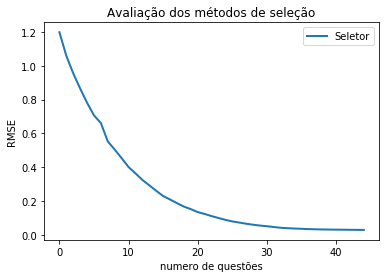

Maximum Information Selector
99993
5786.457644701004


In [33]:
base_result = 'Result_MaxInfoSelector_theta_orig_100000.txt'

selector = MaxInfoSelector()

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

aluno: 0
aluno: 1
aluno: 2
aluno: 3
aluno: 4
aluno: 5
aluno: 6
aluno: 7
aluno: 8
aluno: 9
aluno: 10
aluno: 11
aluno: 12
aluno: 13
aluno: 14
aluno: 15
aluno: 16
aluno: 17
aluno: 18
aluno: 19
aluno: 20
aluno: 21
aluno: 22
aluno: 23
aluno: 24
aluno: 25
aluno: 26
aluno: 27
aluno: 28
aluno: 29
aluno: 30
aluno: 31
aluno: 32
aluno: 33
aluno: 34
aluno: 35
aluno: 36
aluno: 37
aluno: 38
aluno: 39
aluno: 40
aluno: 41
aluno: 42
aluno: 43
aluno: 44
aluno: 45
aluno: 46
aluno: 47
aluno: 48
aluno: 49
aluno: 50
aluno: 51
aluno: 52
aluno: 53
aluno: 54
aluno: 55
aluno: 56
aluno: 57
aluno: 58
aluno: 59
aluno: 60
aluno: 61
aluno: 62
aluno: 63
aluno: 64
aluno: 65
aluno: 66
aluno: 67
aluno: 68
aluno: 69
aluno: 70
aluno: 71
aluno: 72
aluno: 73
aluno: 74
aluno: 75
aluno: 76
aluno: 77
aluno: 78
aluno: 79
aluno: 80
aluno: 81
aluno: 82
aluno: 83
aluno: 84
aluno: 85
aluno: 86
aluno: 87
aluno: 88
aluno: 89
aluno: 90
aluno: 91
aluno: 92
aluno: 93
aluno: 94
aluno: 95
aluno: 96
aluno: 97
aluno: 98
aluno: 99
aluno: 100

aluno: 759
aluno: 760
aluno: 761
aluno: 762
aluno: 763
aluno: 764
aluno: 765
aluno: 766
aluno: 767
aluno: 768
aluno: 769
aluno: 770
aluno: 771
aluno: 772
aluno: 773
aluno: 774
aluno: 775
aluno: 776
aluno: 777
aluno: 778
aluno: 779
aluno: 780
aluno: 781
aluno: 782
aluno: 783
aluno: 784
aluno: 785
aluno: 786
aluno: 787
aluno: 788
aluno: 789
aluno: 790
aluno: 791
aluno: 792
aluno: 793
aluno: 794
aluno: 795
aluno: 796
aluno: 797
aluno: 798
aluno: 799
aluno: 800
aluno: 801
aluno: 802
aluno: 803
aluno: 804
aluno: 805
aluno: 806
aluno: 807
aluno: 808
aluno: 809
aluno: 810
aluno: 811
aluno: 812
aluno: 813
aluno: 814
aluno: 815
aluno: 816
aluno: 817
aluno: 818
aluno: 819
aluno: 820
aluno: 821
aluno: 822
aluno: 823
aluno: 824
aluno: 825
aluno: 826
aluno: 827
aluno: 828
aluno: 829
aluno: 830
aluno: 831
aluno: 832
aluno: 833
aluno: 834
aluno: 835
aluno: 836
aluno: 837
aluno: 838
aluno: 839
aluno: 840
aluno: 841
aluno: 842
aluno: 843
aluno: 844
aluno: 845
aluno: 846
aluno: 847
aluno: 848
aluno: 849

aluno: 1465
aluno: 1466
aluno: 1467
aluno: 1468
aluno: 1469
aluno: 1470
aluno: 1471
aluno: 1472
aluno: 1473
aluno: 1474
aluno: 1475
aluno: 1476
aluno: 1477
aluno: 1478
aluno: 1479
aluno: 1480
aluno: 1481
aluno: 1482
aluno: 1483
aluno: 1484
aluno: 1485
aluno: 1486
aluno: 1487
aluno: 1488
aluno: 1489
aluno: 1490
aluno: 1491
aluno: 1492
aluno: 1493
aluno: 1494
aluno: 1495
aluno: 1496
aluno: 1497
aluno: 1498
aluno: 1499
aluno: 1500
aluno: 1501
aluno: 1502
aluno: 1503
aluno: 1504
aluno: 1505
aluno: 1506
aluno: 1507
aluno: 1508
aluno: 1509
aluno: 1510
aluno: 1511
aluno: 1512
aluno: 1513
aluno: 1514
aluno: 1515
aluno: 1516
aluno: 1517
aluno: 1518
aluno: 1519
aluno: 1520
aluno: 1521
aluno: 1522
aluno: 1523
aluno: 1524
aluno: 1525
aluno: 1526
aluno: 1527
aluno: 1528
aluno: 1529
aluno: 1530
aluno: 1531
aluno: 1532
aluno: 1533
aluno: 1534
aluno: 1535
aluno: 1536
aluno: 1537
aluno: 1538
aluno: 1539
aluno: 1540
aluno: 1541
aluno: 1542
aluno: 1543
aluno: 1544
aluno: 1545
aluno: 1546
aluno: 1547
alun

aluno: 2149
aluno: 2150
aluno: 2151
aluno: 2152
aluno: 2153
aluno: 2154
aluno: 2155
aluno: 2156
aluno: 2157
aluno: 2158
aluno: 2159
aluno: 2160
aluno: 2161
aluno: 2162
aluno: 2163
aluno: 2164
aluno: 2165
aluno: 2166
aluno: 2167
aluno: 2168
aluno: 2169
aluno: 2170
aluno: 2171
aluno: 2172
aluno: 2173
aluno: 2174
aluno: 2175
aluno: 2176
aluno: 2177
aluno: 2178
aluno: 2179
aluno: 2180
aluno: 2181
aluno: 2182
aluno: 2183
aluno: 2184
aluno: 2185
aluno: 2186
aluno: 2187
aluno: 2188
aluno: 2189
aluno: 2190
aluno: 2191
aluno: 2192
aluno: 2193
aluno: 2194
aluno: 2195
aluno: 2196
aluno: 2197
aluno: 2198
aluno: 2199
aluno: 2200
aluno: 2201
aluno: 2202
aluno: 2203
aluno: 2204
aluno: 2205
aluno: 2206
aluno: 2207
aluno: 2208
aluno: 2209
aluno: 2210
aluno: 2211
aluno: 2212
aluno: 2213
aluno: 2214
aluno: 2215
aluno: 2216
aluno: 2217
aluno: 2218
aluno: 2219
aluno: 2220
aluno: 2221
aluno: 2222
aluno: 2223
aluno: 2224
aluno: 2225
aluno: 2226
aluno: 2227
aluno: 2228
aluno: 2229
aluno: 2230
aluno: 2231
alun

aluno: 2835
aluno: 2836
aluno: 2837
aluno: 2838
aluno: 2839
aluno: 2840
aluno: 2841
aluno: 2842
aluno: 2843
aluno: 2844
aluno: 2845
aluno: 2846
aluno: 2847
aluno: 2848
aluno: 2849
aluno: 2850
aluno: 2851
aluno: 2852
aluno: 2853
aluno: 2854
aluno: 2855
aluno: 2856
aluno: 2857
aluno: 2858
aluno: 2859
aluno: 2860
aluno: 2861
aluno: 2862
aluno: 2863
aluno: 2864
aluno: 2865
aluno: 2866
aluno: 2867
aluno: 2868
aluno: 2869
aluno: 2870
aluno: 2871
aluno: 2872
aluno: 2873
aluno: 2874
aluno: 2875
aluno: 2876
aluno: 2877
aluno: 2878
aluno: 2879
aluno: 2880
aluno: 2881
aluno: 2882
aluno: 2883
aluno: 2884
aluno: 2885
aluno: 2886
aluno: 2887
aluno: 2888
aluno: 2889
aluno: 2890
aluno: 2891
aluno: 2892
aluno: 2893
aluno: 2894
aluno: 2895
aluno: 2896
aluno: 2897
aluno: 2898
aluno: 2899
aluno: 2900
aluno: 2901
aluno: 2902
aluno: 2903
aluno: 2904
aluno: 2905
aluno: 2906
aluno: 2907
aluno: 2908
aluno: 2909
aluno: 2910
aluno: 2911
aluno: 2912
aluno: 2913
aluno: 2914
aluno: 2915
aluno: 2916
aluno: 2917
alun

aluno: 3521
aluno: 3522
aluno: 3523
aluno: 3524
aluno: 3525
aluno: 3526
aluno: 3527
aluno: 3528
aluno: 3529
aluno: 3530
aluno: 3531
aluno: 3532
aluno: 3533
aluno: 3534
aluno: 3535
aluno: 3536
aluno: 3537
aluno: 3538
aluno: 3539
aluno: 3540
aluno: 3541
aluno: 3542
aluno: 3543
aluno: 3544
aluno: 3545
aluno: 3546
aluno: 3547
aluno: 3548
aluno: 3549
aluno: 3550
aluno: 3551
aluno: 3552
aluno: 3553
aluno: 3554
aluno: 3555
aluno: 3556
aluno: 3557
aluno: 3558
aluno: 3559
aluno: 3560
aluno: 3561
aluno: 3562
aluno: 3563
aluno: 3564
aluno: 3565
aluno: 3566
aluno: 3567
aluno: 3568
aluno: 3569
aluno: 3570
aluno: 3571
aluno: 3572
aluno: 3573
aluno: 3574
aluno: 3575
aluno: 3576
aluno: 3577
aluno: 3578
aluno: 3579
aluno: 3580
aluno: 3581
aluno: 3582
aluno: 3583
aluno: 3584
aluno: 3585
aluno: 3586
aluno: 3587
aluno: 3588
aluno: 3589
aluno: 3590
aluno: 3591
aluno: 3592
aluno: 3593
aluno: 3594
aluno: 3595
aluno: 3596
aluno: 3597
aluno: 3598
aluno: 3599
aluno: 3600
aluno: 3601
aluno: 3602
aluno: 3603
alun

aluno: 4204
aluno: 4205
aluno: 4206
aluno: 4207
aluno: 4208
aluno: 4209
aluno: 4210
aluno: 4211
aluno: 4212
aluno: 4213
aluno: 4214
aluno: 4215
aluno: 4216
aluno: 4217
aluno: 4218
aluno: 4219
aluno: 4220
aluno: 4221
aluno: 4222
aluno: 4223
aluno: 4224
aluno: 4225
aluno: 4226
aluno: 4227
aluno: 4228
aluno: 4229
aluno: 4230
aluno: 4231
aluno: 4232
aluno: 4233
aluno: 4234
aluno: 4235
aluno: 4236
aluno: 4237
aluno: 4238
aluno: 4239
aluno: 4240
aluno: 4241
aluno: 4242
aluno: 4243
aluno: 4244
aluno: 4245
aluno: 4246
aluno: 4247
aluno: 4248
aluno: 4249
aluno: 4250
aluno: 4251
aluno: 4252
aluno: 4253
aluno: 4254
aluno: 4255
aluno: 4256
aluno: 4257
aluno: 4258
aluno: 4259
aluno: 4260
aluno: 4261
aluno: 4262
aluno: 4263
aluno: 4264
aluno: 4265
aluno: 4266
aluno: 4267
aluno: 4268
aluno: 4269
aluno: 4270
aluno: 4271
aluno: 4272
aluno: 4273
aluno: 4274
aluno: 4275
aluno: 4276
aluno: 4277
aluno: 4278
aluno: 4279
aluno: 4280
aluno: 4281
aluno: 4282
aluno: 4283
aluno: 4284
aluno: 4285
aluno: 4286
alun

aluno: 4890
aluno: 4891
aluno: 4892
aluno: 4893
aluno: 4894
aluno: 4895
aluno: 4896
aluno: 4897
aluno: 4898
aluno: 4899
aluno: 4900
aluno: 4901
aluno: 4902
aluno: 4903
aluno: 4904
aluno: 4905
aluno: 4906
aluno: 4907
aluno: 4908
aluno: 4909
aluno: 4910
aluno: 4911
aluno: 4912
aluno: 4913
aluno: 4914
aluno: 4915
aluno: 4916
aluno: 4917
aluno: 4918
aluno: 4919
aluno: 4920
aluno: 4921
aluno: 4922
aluno: 4923
aluno: 4924
aluno: 4925
aluno: 4926
aluno: 4927
aluno: 4928
aluno: 4929
aluno: 4930
aluno: 4931
aluno: 4932
aluno: 4933
aluno: 4934
aluno: 4935
aluno: 4936
aluno: 4937
aluno: 4938
aluno: 4939
aluno: 4940
aluno: 4941
aluno: 4942
aluno: 4943
aluno: 4944
aluno: 4945
aluno: 4946
aluno: 4947
aluno: 4948
aluno: 4949
aluno: 4950
aluno: 4951
aluno: 4952
aluno: 4953
aluno: 4954
aluno: 4955
aluno: 4956
aluno: 4957
aluno: 4958
aluno: 4959
aluno: 4960
aluno: 4961
aluno: 4962
aluno: 4963
aluno: 4964
aluno: 4965
aluno: 4966
aluno: 4967
aluno: 4968
aluno: 4969
aluno: 4970
aluno: 4971
aluno: 4972
alun

aluno: 5576
aluno: 5577
aluno: 5578
aluno: 5579
aluno: 5580
aluno: 5581
aluno: 5582
aluno: 5583
aluno: 5584
aluno: 5585
aluno: 5586
aluno: 5587
aluno: 5588
aluno: 5589
aluno: 5590
aluno: 5591
aluno: 5592
aluno: 5593
aluno: 5594
aluno: 5595
aluno: 5596
aluno: 5597
aluno: 5598
aluno: 5599
aluno: 5600
aluno: 5601
aluno: 5602
aluno: 5603
aluno: 5604
aluno: 5605
aluno: 5606
aluno: 5607
aluno: 5608
aluno: 5609
aluno: 5610
aluno: 5611
aluno: 5612
aluno: 5613
aluno: 5614
aluno: 5615
aluno: 5616
aluno: 5617
aluno: 5618
aluno: 5619
aluno: 5620
aluno: 5621
aluno: 5622
aluno: 5623
aluno: 5624
aluno: 5625
aluno: 5626
aluno: 5627
aluno: 5628
aluno: 5629
aluno: 5630
aluno: 5631
aluno: 5632
aluno: 5633
aluno: 5634
aluno: 5635
aluno: 5636
aluno: 5637
aluno: 5638
aluno: 5639
aluno: 5640
aluno: 5641
aluno: 5642
aluno: 5643
aluno: 5644
aluno: 5645
aluno: 5646
aluno: 5647
aluno: 5648
aluno: 5649
aluno: 5650
aluno: 5651
aluno: 5652
aluno: 5653
aluno: 5654
aluno: 5655
aluno: 5656
aluno: 5657
aluno: 5658
alun

aluno: 6260
aluno: 6261
aluno: 6262
aluno: 6263
aluno: 6264
aluno: 6265
aluno: 6266
aluno: 6267
aluno: 6268
aluno: 6269
aluno: 6270
aluno: 6271
aluno: 6272
aluno: 6273
aluno: 6274
aluno: 6275
aluno: 6276
aluno: 6277
aluno: 6278
aluno: 6279
aluno: 6280
aluno: 6281
aluno: 6282
aluno: 6283
aluno: 6284
aluno: 6285
aluno: 6286
aluno: 6287
aluno: 6288
aluno: 6289
aluno: 6290
aluno: 6291
aluno: 6292
aluno: 6293
aluno: 6294
aluno: 6295
aluno: 6296
aluno: 6297
aluno: 6298
aluno: 6299
aluno: 6300
aluno: 6301
aluno: 6302
aluno: 6303
aluno: 6304
aluno: 6305
aluno: 6306
aluno: 6307
aluno: 6308
aluno: 6309
aluno: 6310
aluno: 6311
aluno: 6312
aluno: 6313
aluno: 6314
aluno: 6315
aluno: 6316
aluno: 6317
aluno: 6318
aluno: 6319
aluno: 6320
aluno: 6321
aluno: 6322
aluno: 6323
aluno: 6324
aluno: 6325
aluno: 6326
aluno: 6327
aluno: 6328
aluno: 6329
aluno: 6330
aluno: 6331
aluno: 6332
aluno: 6333
aluno: 6334
aluno: 6335
aluno: 6336
aluno: 6337
aluno: 6338
aluno: 6339
aluno: 6340
aluno: 6341
aluno: 6342
alun

aluno: 6943
aluno: 6944
aluno: 6945
aluno: 6946
aluno: 6947
aluno: 6948
aluno: 6949
aluno: 6950
aluno: 6951
aluno: 6952
aluno: 6953
aluno: 6954
aluno: 6955
aluno: 6956
aluno: 6957
aluno: 6958
aluno: 6959
aluno: 6960
aluno: 6961
aluno: 6962
aluno: 6963
aluno: 6964
aluno: 6965
aluno: 6966
aluno: 6967
aluno: 6968
aluno: 6969
aluno: 6970
aluno: 6971
aluno: 6972
aluno: 6973
aluno: 6974
aluno: 6975
aluno: 6976
aluno: 6977
aluno: 6978
aluno: 6979
aluno: 6980
aluno: 6981
aluno: 6982
aluno: 6983
aluno: 6984
aluno: 6985
aluno: 6986
aluno: 6987
aluno: 6988
aluno: 6989
aluno: 6990
aluno: 6991
aluno: 6992
aluno: 6993
aluno: 6994
aluno: 6995
aluno: 6996
aluno: 6997
aluno: 6998
aluno: 6999
aluno: 7000
aluno: 7001
aluno: 7002
aluno: 7003
aluno: 7004
aluno: 7005
aluno: 7006
aluno: 7007
aluno: 7008
aluno: 7009
aluno: 7010
aluno: 7011
aluno: 7012
aluno: 7013
aluno: 7014
aluno: 7015
aluno: 7016
aluno: 7017
aluno: 7018
aluno: 7019
aluno: 7020
aluno: 7021
aluno: 7022
aluno: 7023
aluno: 7024
aluno: 7025
alun

aluno: 7629
aluno: 7630
aluno: 7631
aluno: 7632
aluno: 7633
aluno: 7634
aluno: 7635
aluno: 7636
aluno: 7637
aluno: 7638
aluno: 7639
aluno: 7640
aluno: 7641
aluno: 7642
aluno: 7643
aluno: 7644
aluno: 7645
aluno: 7646
aluno: 7647
aluno: 7648
aluno: 7649
aluno: 7650
aluno: 7651
aluno: 7652
aluno: 7653
aluno: 7654
aluno: 7655
aluno: 7656
aluno: 7657
aluno: 7658
aluno: 7659
aluno: 7660
aluno: 7661
aluno: 7662
aluno: 7663
aluno: 7664
aluno: 7665
aluno: 7666
aluno: 7667
aluno: 7668
aluno: 7669
aluno: 7670
aluno: 7671
aluno: 7672
aluno: 7673
aluno: 7674
aluno: 7675
aluno: 7676
aluno: 7677
aluno: 7678
aluno: 7679
aluno: 7680
aluno: 7681
aluno: 7682
aluno: 7683
aluno: 7684
aluno: 7685
aluno: 7686
aluno: 7687
aluno: 7688
aluno: 7689
aluno: 7690
aluno: 7691
aluno: 7692
aluno: 7693
aluno: 7694
aluno: 7695
aluno: 7696
aluno: 7697
aluno: 7698
aluno: 7699
aluno: 7700
aluno: 7701
aluno: 7702
aluno: 7703
aluno: 7704
aluno: 7705
aluno: 7706
aluno: 7707
aluno: 7708
aluno: 7709
aluno: 7710
aluno: 7711
alun

aluno: 8313
aluno: 8314
aluno: 8315
aluno: 8316
aluno: 8317
aluno: 8318
aluno: 8319
aluno: 8320
aluno: 8321
aluno: 8322
aluno: 8323
aluno: 8324
aluno: 8325
aluno: 8326
aluno: 8327
aluno: 8328
aluno: 8329
aluno: 8330
aluno: 8331
aluno: 8332
aluno: 8333
aluno: 8334
aluno: 8335
aluno: 8336
aluno: 8337
aluno: 8338
aluno: 8339
aluno: 8340
aluno: 8341
aluno: 8342
aluno: 8343
aluno: 8344
aluno: 8345
aluno: 8346
aluno: 8347
aluno: 8348
aluno: 8349
aluno: 8350
aluno: 8351
aluno: 8352
aluno: 8353
aluno: 8354
aluno: 8355
aluno: 8356
aluno: 8357
aluno: 8358
aluno: 8359
aluno: 8360
aluno: 8361
aluno: 8362
aluno: 8363
aluno: 8364
aluno: 8365
aluno: 8366
aluno: 8367
aluno: 8368
aluno: 8369
aluno: 8370
aluno: 8371
aluno: 8372
aluno: 8373
aluno: 8374
aluno: 8375
aluno: 8376
aluno: 8377
aluno: 8378
aluno: 8379
aluno: 8380
aluno: 8381
aluno: 8382
aluno: 8383
aluno: 8384
aluno: 8385
aluno: 8386
aluno: 8387
aluno: 8388
aluno: 8389
aluno: 8390
aluno: 8391
aluno: 8392
aluno: 8393
aluno: 8394
aluno: 8395
alun

aluno: 8998
aluno: 8999
aluno: 9000
aluno: 9001
aluno: 9002
aluno: 9003
aluno: 9004
aluno: 9005
aluno: 9006
aluno: 9007
aluno: 9008
aluno: 9009
aluno: 9010
aluno: 9011
aluno: 9012
aluno: 9013
aluno: 9014
aluno: 9015
aluno: 9016
aluno: 9017
aluno: 9018
aluno: 9019
aluno: 9020
aluno: 9021
aluno: 9022
aluno: 9023
aluno: 9024
aluno: 9025
aluno: 9026
aluno: 9027
aluno: 9028
aluno: 9029
aluno: 9030
aluno: 9031
aluno: 9032
aluno: 9033
aluno: 9034
aluno: 9035
aluno: 9036
aluno: 9037
aluno: 9038
aluno: 9039
aluno: 9040
aluno: 9041
aluno: 9042
aluno: 9043
aluno: 9044
aluno: 9045
aluno: 9046
aluno: 9047
aluno: 9048
aluno: 9049
aluno: 9050
aluno: 9051
aluno: 9052
aluno: 9053
aluno: 9054
aluno: 9055
aluno: 9056
aluno: 9057
aluno: 9058
aluno: 9059
aluno: 9060
aluno: 9061
aluno: 9062
aluno: 9063
aluno: 9064
aluno: 9065
aluno: 9066
aluno: 9067
aluno: 9068
aluno: 9069
aluno: 9070
aluno: 9071
aluno: 9072
aluno: 9073
aluno: 9074
aluno: 9075
aluno: 9076
aluno: 9077
aluno: 9078
aluno: 9079
aluno: 9080
alun

aluno: 9681
aluno: 9682
aluno: 9683
aluno: 9684
aluno: 9685
aluno: 9686
aluno: 9687
aluno: 9688
aluno: 9689
aluno: 9690
aluno: 9691
aluno: 9692
aluno: 9693
aluno: 9694
aluno: 9695
aluno: 9696
aluno: 9697
aluno: 9698
aluno: 9699
aluno: 9700
aluno: 9701
aluno: 9702
aluno: 9703
aluno: 9704
aluno: 9705
aluno: 9706
aluno: 9707
aluno: 9708
aluno: 9709
aluno: 9710
aluno: 9711
aluno: 9712
aluno: 9713
aluno: 9714
aluno: 9715
aluno: 9716
aluno: 9717
aluno: 9718
aluno: 9719
aluno: 9720
aluno: 9721
aluno: 9722
aluno: 9723
aluno: 9724
aluno: 9725
aluno: 9726
aluno: 9727
aluno: 9728
aluno: 9729
aluno: 9730
aluno: 9731
aluno: 9732
aluno: 9733
aluno: 9734
aluno: 9735
aluno: 9736
aluno: 9737
aluno: 9738
aluno: 9739
aluno: 9740
aluno: 9741
aluno: 9742
aluno: 9743
aluno: 9744
aluno: 9745
aluno: 9746
aluno: 9747
aluno: 9748
aluno: 9749
aluno: 9750
aluno: 9751
aluno: 9752
aluno: 9753
aluno: 9754
aluno: 9755
aluno: 9756
aluno: 9757
aluno: 9758
aluno: 9759
aluno: 9760
aluno: 9761
aluno: 9762
aluno: 9763
alun

aluno: 10336
aluno: 10337
aluno: 10338
aluno: 10339
aluno: 10340
aluno: 10341
aluno: 10342
aluno: 10343
aluno: 10344
aluno: 10345
aluno: 10346
aluno: 10347
aluno: 10348
aluno: 10349
aluno: 10350
aluno: 10351
aluno: 10352
aluno: 10353
aluno: 10354
aluno: 10355
aluno: 10356
aluno: 10357
aluno: 10358
aluno: 10359
aluno: 10360
aluno: 10361
aluno: 10362
aluno: 10363
aluno: 10364
aluno: 10365
aluno: 10366
aluno: 10367
aluno: 10368
aluno: 10369
aluno: 10370
aluno: 10371
aluno: 10372
aluno: 10373
aluno: 10374
aluno: 10375
aluno: 10376
aluno: 10377
aluno: 10378
aluno: 10379
aluno: 10380
aluno: 10381
aluno: 10382
aluno: 10383
aluno: 10384
aluno: 10385
aluno: 10386
aluno: 10387
aluno: 10388
aluno: 10389
aluno: 10390
aluno: 10391
aluno: 10392
aluno: 10393
aluno: 10394
aluno: 10395
aluno: 10396
aluno: 10397
aluno: 10398
aluno: 10399
aluno: 10400
aluno: 10401
aluno: 10402
aluno: 10403
aluno: 10404
aluno: 10405
aluno: 10406
aluno: 10407
aluno: 10408
aluno: 10409
aluno: 10410
aluno: 10411
aluno: 10412

aluno: 10970
aluno: 10971
aluno: 10972
aluno: 10973
aluno: 10974
aluno: 10975
aluno: 10976
aluno: 10977
aluno: 10978
aluno: 10979
aluno: 10980
aluno: 10981
aluno: 10982
aluno: 10983
aluno: 10984
aluno: 10985
aluno: 10986
aluno: 10987
aluno: 10988
aluno: 10989
aluno: 10990
aluno: 10991
aluno: 10992
aluno: 10993
aluno: 10994
aluno: 10995
aluno: 10996
aluno: 10997
aluno: 10998
aluno: 10999
aluno: 11000
aluno: 11001
aluno: 11002
aluno: 11003
aluno: 11004
aluno: 11005
aluno: 11006
aluno: 11007
aluno: 11008
aluno: 11009
aluno: 11010
aluno: 11011
aluno: 11012
aluno: 11013
aluno: 11014
aluno: 11015
aluno: 11016
aluno: 11017
aluno: 11018
aluno: 11019
aluno: 11020
aluno: 11021
aluno: 11022
aluno: 11023
aluno: 11024
aluno: 11025
aluno: 11026
aluno: 11027
aluno: 11028
aluno: 11029
aluno: 11030
aluno: 11031
aluno: 11032
aluno: 11033
aluno: 11034
aluno: 11035
aluno: 11036
aluno: 11037
aluno: 11038
aluno: 11039
aluno: 11040
aluno: 11041
aluno: 11042
aluno: 11043
aluno: 11044
aluno: 11045
aluno: 11046

aluno: 11605
aluno: 11606
aluno: 11607
aluno: 11608
aluno: 11609
aluno: 11610
aluno: 11611
aluno: 11612
aluno: 11613
aluno: 11614
aluno: 11615
aluno: 11616
aluno: 11617
aluno: 11618
aluno: 11619
aluno: 11620
aluno: 11621
aluno: 11622
aluno: 11623
aluno: 11624
aluno: 11625
aluno: 11626
aluno: 11627
aluno: 11628
aluno: 11629
aluno: 11630
aluno: 11631
aluno: 11632
aluno: 11633
aluno: 11634
aluno: 11635
aluno: 11636
aluno: 11637
aluno: 11638
aluno: 11639
aluno: 11640
aluno: 11641
aluno: 11642
aluno: 11643
aluno: 11644
aluno: 11645
aluno: 11646
aluno: 11647
aluno: 11648
aluno: 11649
aluno: 11650
aluno: 11651
aluno: 11652
aluno: 11653
aluno: 11654
aluno: 11655
aluno: 11656
aluno: 11657
aluno: 11658
aluno: 11659
aluno: 11660
aluno: 11661
aluno: 11662
aluno: 11663
aluno: 11664
aluno: 11665
aluno: 11666
aluno: 11667
aluno: 11668
aluno: 11669
aluno: 11670
aluno: 11671
aluno: 11672
aluno: 11673
aluno: 11674
aluno: 11675
aluno: 11676
aluno: 11677
aluno: 11678
aluno: 11679
aluno: 11680
aluno: 11681

aluno: 12240
aluno: 12241
aluno: 12242
aluno: 12243
aluno: 12244
aluno: 12245
aluno: 12246
aluno: 12247
aluno: 12248
aluno: 12249
aluno: 12250
aluno: 12251
aluno: 12252
aluno: 12253
aluno: 12254
aluno: 12255
aluno: 12256
aluno: 12257
aluno: 12258
aluno: 12259
aluno: 12260
aluno: 12261
aluno: 12262
aluno: 12263
aluno: 12264
aluno: 12265
aluno: 12266
aluno: 12267
aluno: 12268
aluno: 12269
aluno: 12270
aluno: 12271
aluno: 12272
aluno: 12273
aluno: 12274
aluno: 12275
aluno: 12276
aluno: 12277
aluno: 12278
aluno: 12279
aluno: 12280
aluno: 12281
aluno: 12282
aluno: 12283
aluno: 12284
aluno: 12285
aluno: 12286
aluno: 12287
aluno: 12288
aluno: 12289
aluno: 12290
aluno: 12291
aluno: 12292
aluno: 12293
aluno: 12294
aluno: 12295
aluno: 12296
aluno: 12297
aluno: 12298
aluno: 12299
aluno: 12300
aluno: 12301
aluno: 12302
aluno: 12303
aluno: 12304
aluno: 12305
aluno: 12306
aluno: 12307
aluno: 12308
aluno: 12309
aluno: 12310
aluno: 12311
aluno: 12312
aluno: 12313
aluno: 12314
aluno: 12315
aluno: 12316

aluno: 12876
aluno: 12877
aluno: 12878
aluno: 12879
aluno: 12880
aluno: 12881
aluno: 12882
aluno: 12883
aluno: 12884
aluno: 12885
aluno: 12886
aluno: 12887
aluno: 12888
aluno: 12889
aluno: 12890
aluno: 12891
aluno: 12892
aluno: 12893
aluno: 12894
aluno: 12895
aluno: 12896
aluno: 12897
aluno: 12898
aluno: 12899
aluno: 12900
aluno: 12901
aluno: 12902
aluno: 12903
aluno: 12904
aluno: 12905
aluno: 12906
aluno: 12907
aluno: 12908
aluno: 12909
aluno: 12910
aluno: 12911
aluno: 12912
aluno: 12913
aluno: 12914
aluno: 12915
aluno: 12916
aluno: 12917
aluno: 12918
aluno: 12919
aluno: 12920
aluno: 12921
aluno: 12922
aluno: 12923
aluno: 12924
aluno: 12925
aluno: 12926
aluno: 12927
aluno: 12928
aluno: 12929
aluno: 12930
aluno: 12931
aluno: 12932
aluno: 12933
aluno: 12934
aluno: 12935
aluno: 12936
aluno: 12937
aluno: 12938
aluno: 12939
aluno: 12940
aluno: 12941
aluno: 12942
aluno: 12943
aluno: 12944
aluno: 12945
aluno: 12946
aluno: 12947
aluno: 12948
aluno: 12949
aluno: 12950
aluno: 12951
aluno: 12952

aluno: 13511
aluno: 13512
aluno: 13513
aluno: 13514
aluno: 13515
aluno: 13516
aluno: 13517
aluno: 13518
aluno: 13519
aluno: 13520
aluno: 13521
aluno: 13522
aluno: 13523
aluno: 13524
aluno: 13525
aluno: 13526
aluno: 13527
aluno: 13528
aluno: 13529
aluno: 13530
aluno: 13531
aluno: 13532
aluno: 13533
aluno: 13534
aluno: 13535
aluno: 13536
aluno: 13537
aluno: 13538
aluno: 13539
aluno: 13540
aluno: 13541
aluno: 13542
aluno: 13543
aluno: 13544
aluno: 13545
aluno: 13546
aluno: 13547
aluno: 13548
aluno: 13549
aluno: 13550
aluno: 13551
aluno: 13552
aluno: 13553
aluno: 13554
aluno: 13555
aluno: 13556
aluno: 13557
aluno: 13558
aluno: 13559
aluno: 13560
aluno: 13561
aluno: 13562
aluno: 13563
aluno: 13564
aluno: 13565
aluno: 13566
aluno: 13567
aluno: 13568
aluno: 13569
aluno: 13570
aluno: 13571
aluno: 13572
aluno: 13573
aluno: 13574
aluno: 13575
aluno: 13576
aluno: 13577
aluno: 13578
aluno: 13579
aluno: 13580
aluno: 13581
aluno: 13582
aluno: 13583
aluno: 13584
aluno: 13585
aluno: 13586
aluno: 13587

aluno: 14144
aluno: 14145
aluno: 14146
aluno: 14147
aluno: 14148
aluno: 14149
aluno: 14150
aluno: 14151
aluno: 14152
aluno: 14153
aluno: 14154
aluno: 14155
aluno: 14156
aluno: 14157
aluno: 14158
aluno: 14159
aluno: 14160
aluno: 14161
aluno: 14162
aluno: 14163
aluno: 14164
aluno: 14165
aluno: 14166
aluno: 14167
aluno: 14168
aluno: 14169
aluno: 14170
aluno: 14171
aluno: 14172
aluno: 14173
aluno: 14174
aluno: 14175
aluno: 14176
aluno: 14177
aluno: 14178
aluno: 14179
aluno: 14180
aluno: 14181
aluno: 14182
aluno: 14183
aluno: 14184
aluno: 14185
aluno: 14186
aluno: 14187
aluno: 14188
aluno: 14189
aluno: 14190
aluno: 14191
aluno: 14192
aluno: 14193
aluno: 14194
aluno: 14195
aluno: 14196
aluno: 14197
aluno: 14198
aluno: 14199
aluno: 14200
aluno: 14201
aluno: 14202
aluno: 14203
aluno: 14204
aluno: 14205
aluno: 14206
aluno: 14207
aluno: 14208
aluno: 14209
aluno: 14210
aluno: 14211
aluno: 14212
aluno: 14213
aluno: 14214
aluno: 14215
aluno: 14216
aluno: 14217
aluno: 14218
aluno: 14219
aluno: 14220

aluno: 14777
aluno: 14778
aluno: 14779
aluno: 14780
aluno: 14781
aluno: 14782
aluno: 14783
aluno: 14784
aluno: 14785
aluno: 14786
aluno: 14787
aluno: 14788
aluno: 14789
aluno: 14790
aluno: 14791
aluno: 14792
aluno: 14793
aluno: 14794
aluno: 14795
aluno: 14796
aluno: 14797
aluno: 14798
aluno: 14799
aluno: 14800
aluno: 14801
aluno: 14802
aluno: 14803
aluno: 14804
aluno: 14805
aluno: 14806
aluno: 14807
aluno: 14808
aluno: 14809
aluno: 14810
aluno: 14811
aluno: 14812
aluno: 14813
aluno: 14814
aluno: 14815
aluno: 14816
aluno: 14817
aluno: 14818
aluno: 14819
aluno: 14820
aluno: 14821
aluno: 14822
aluno: 14823
aluno: 14824
aluno: 14825
aluno: 14826
aluno: 14827
aluno: 14828
aluno: 14829
aluno: 14830
aluno: 14831
aluno: 14832
aluno: 14833
aluno: 14834
aluno: 14835
aluno: 14836
aluno: 14837
aluno: 14838
aluno: 14839
aluno: 14840
aluno: 14841
aluno: 14842
aluno: 14843
aluno: 14844
aluno: 14845
aluno: 14846
aluno: 14847
aluno: 14848
aluno: 14849
aluno: 14850
aluno: 14851
aluno: 14852
aluno: 14853

aluno: 15408
aluno: 15409
aluno: 15410
aluno: 15411
aluno: 15412
aluno: 15413
aluno: 15414
aluno: 15415
aluno: 15416
aluno: 15417
aluno: 15418
aluno: 15419
aluno: 15420
aluno: 15421
aluno: 15422
aluno: 15423
aluno: 15424
aluno: 15425
aluno: 15426
aluno: 15427
aluno: 15428
aluno: 15429
aluno: 15430
aluno: 15431
aluno: 15432
aluno: 15433
aluno: 15434
aluno: 15435
aluno: 15436
aluno: 15437
aluno: 15438
aluno: 15439
aluno: 15440
aluno: 15441
aluno: 15442
aluno: 15443
aluno: 15444
aluno: 15445
aluno: 15446
aluno: 15447
aluno: 15448
aluno: 15449
aluno: 15450
aluno: 15451
aluno: 15452
aluno: 15453
aluno: 15454
aluno: 15455
aluno: 15456
aluno: 15457
aluno: 15458
aluno: 15459
aluno: 15460
aluno: 15461
aluno: 15462
aluno: 15463
aluno: 15464
aluno: 15465
aluno: 15466
aluno: 15467
aluno: 15468
aluno: 15469
aluno: 15470
aluno: 15471
aluno: 15472
aluno: 15473
aluno: 15474
aluno: 15475
aluno: 15476
aluno: 15477
aluno: 15478
aluno: 15479
aluno: 15480
aluno: 15481
aluno: 15482
aluno: 15483
aluno: 15484

aluno: 16042
aluno: 16043
aluno: 16044
aluno: 16045
aluno: 16046
aluno: 16047
aluno: 16048
aluno: 16049
aluno: 16050
aluno: 16051
aluno: 16052
aluno: 16053
aluno: 16054
aluno: 16055
aluno: 16056
aluno: 16057
aluno: 16058
aluno: 16059
aluno: 16060
aluno: 16061
aluno: 16062
aluno: 16063
aluno: 16064
aluno: 16065
aluno: 16066
aluno: 16067
aluno: 16068
aluno: 16069
aluno: 16070
aluno: 16071
aluno: 16072
aluno: 16073
aluno: 16074
aluno: 16075
aluno: 16076
aluno: 16077
aluno: 16078
aluno: 16079
aluno: 16080
aluno: 16081
aluno: 16082
aluno: 16083
aluno: 16084
aluno: 16085
aluno: 16086
aluno: 16087
aluno: 16088
aluno: 16089
aluno: 16090
aluno: 16091
aluno: 16092
aluno: 16093
aluno: 16094
aluno: 16095
aluno: 16096
aluno: 16097
aluno: 16098
aluno: 16099
aluno: 16100
aluno: 16101
aluno: 16102
aluno: 16103
aluno: 16104
aluno: 16105
aluno: 16106
aluno: 16107
aluno: 16108
aluno: 16109
aluno: 16110
aluno: 16111
aluno: 16112
aluno: 16113
aluno: 16114
aluno: 16115
aluno: 16116
aluno: 16117
aluno: 16118

aluno: 16674
aluno: 16675
aluno: 16676
aluno: 16677
aluno: 16678
aluno: 16679
aluno: 16680
aluno: 16681
aluno: 16682
aluno: 16683
aluno: 16684
aluno: 16685
aluno: 16686
aluno: 16687
aluno: 16688
aluno: 16689
aluno: 16690
aluno: 16691
aluno: 16692
aluno: 16693
aluno: 16694
aluno: 16695
aluno: 16696
aluno: 16697
aluno: 16698
aluno: 16699
aluno: 16700
aluno: 16701
aluno: 16702
aluno: 16703
aluno: 16704
aluno: 16705
aluno: 16706
aluno: 16707
aluno: 16708
aluno: 16709
aluno: 16710
aluno: 16711
aluno: 16712
aluno: 16713
aluno: 16714
aluno: 16715
aluno: 16716
aluno: 16717
aluno: 16718
aluno: 16719
aluno: 16720
aluno: 16721
aluno: 16722
aluno: 16723
aluno: 16724
aluno: 16725
aluno: 16726
aluno: 16727
aluno: 16728
aluno: 16729
aluno: 16730
aluno: 16731
aluno: 16732
aluno: 16733
aluno: 16734
aluno: 16735
aluno: 16736
aluno: 16737
aluno: 16738
aluno: 16739
aluno: 16740
aluno: 16741
aluno: 16742
aluno: 16743
aluno: 16744
aluno: 16745
aluno: 16746
aluno: 16747
aluno: 16748
aluno: 16749
aluno: 16750

aluno: 17305
aluno: 17306
aluno: 17307
aluno: 17308
aluno: 17309
aluno: 17310
aluno: 17311
aluno: 17312
aluno: 17313
aluno: 17314
aluno: 17315
aluno: 17316
aluno: 17317
aluno: 17318
aluno: 17319
aluno: 17320
aluno: 17321
aluno: 17322
aluno: 17323
aluno: 17324
aluno: 17325
aluno: 17326
aluno: 17327
aluno: 17328
aluno: 17329
aluno: 17330
aluno: 17331
aluno: 17332
aluno: 17333
aluno: 17334
aluno: 17335
aluno: 17336
aluno: 17337
aluno: 17338
aluno: 17339
aluno: 17340
aluno: 17341
aluno: 17342
aluno: 17343
aluno: 17344
aluno: 17345
aluno: 17346
aluno: 17347
aluno: 17348
aluno: 17349
aluno: 17350
aluno: 17351
aluno: 17352
aluno: 17353
aluno: 17354
aluno: 17355
aluno: 17356
aluno: 17357
aluno: 17358
aluno: 17359
aluno: 17360
aluno: 17361
aluno: 17362
aluno: 17363
aluno: 17364
aluno: 17365
aluno: 17366
aluno: 17367
aluno: 17368
aluno: 17369
aluno: 17370
aluno: 17371
aluno: 17372
aluno: 17373
aluno: 17374
aluno: 17375
aluno: 17376
aluno: 17377
aluno: 17378
aluno: 17379
aluno: 17380
aluno: 17381

aluno: 17937
aluno: 17938
aluno: 17939
aluno: 17940
aluno: 17941
aluno: 17942
aluno: 17943
aluno: 17944
aluno: 17945
aluno: 17946
aluno: 17947
aluno: 17948
aluno: 17949
aluno: 17950
aluno: 17951
aluno: 17952
aluno: 17953
aluno: 17954
aluno: 17955
aluno: 17956
aluno: 17957
aluno: 17958
aluno: 17959
aluno: 17960
aluno: 17961
aluno: 17962
aluno: 17963
aluno: 17964
aluno: 17965
aluno: 17966
aluno: 17967
aluno: 17968
aluno: 17969
aluno: 17970
aluno: 17971
aluno: 17972
aluno: 17973
aluno: 17974
aluno: 17975
aluno: 17976
aluno: 17977
aluno: 17978
aluno: 17979
aluno: 17980
aluno: 17981
aluno: 17982
aluno: 17983
aluno: 17984
aluno: 17985
aluno: 17986
aluno: 17987
aluno: 17988
aluno: 17989
aluno: 17990
aluno: 17991
aluno: 17992
aluno: 17993
aluno: 17994
aluno: 17995
aluno: 17996
aluno: 17997
aluno: 17998
aluno: 17999
aluno: 18000
aluno: 18001
aluno: 18002
aluno: 18003
aluno: 18004
aluno: 18005
aluno: 18006
aluno: 18007
aluno: 18008
aluno: 18009
aluno: 18010
aluno: 18011
aluno: 18012
aluno: 18013

aluno: 18569
aluno: 18570
aluno: 18571
aluno: 18572
aluno: 18573
aluno: 18574
aluno: 18575
aluno: 18576
aluno: 18577
aluno: 18578
aluno: 18579
aluno: 18580
aluno: 18581
aluno: 18582
aluno: 18583
aluno: 18584
aluno: 18585
aluno: 18586
aluno: 18587
aluno: 18588
aluno: 18589
aluno: 18590
aluno: 18591
aluno: 18592
aluno: 18593
aluno: 18594
aluno: 18595
aluno: 18596
aluno: 18597
aluno: 18598
aluno: 18599
aluno: 18600
aluno: 18601
aluno: 18602
aluno: 18603
aluno: 18604
aluno: 18605
aluno: 18606
aluno: 18607
aluno: 18608
aluno: 18609
aluno: 18610
aluno: 18611
aluno: 18612
aluno: 18613
aluno: 18614
aluno: 18615
aluno: 18616
aluno: 18617
aluno: 18618
aluno: 18619
aluno: 18620
aluno: 18621
aluno: 18622
aluno: 18623
aluno: 18624
aluno: 18625
aluno: 18626
aluno: 18627
aluno: 18628
aluno: 18629
aluno: 18630
aluno: 18631
aluno: 18632
aluno: 18633
aluno: 18634
aluno: 18635
aluno: 18636
aluno: 18637
aluno: 18638
aluno: 18639
aluno: 18640
aluno: 18641
aluno: 18642
aluno: 18643
aluno: 18644
aluno: 18645

aluno: 19201
aluno: 19202
aluno: 19203
aluno: 19204
aluno: 19205
aluno: 19206
aluno: 19207
aluno: 19208
aluno: 19209
aluno: 19210
aluno: 19211
aluno: 19212
aluno: 19213
aluno: 19214
aluno: 19215
aluno: 19216
aluno: 19217
aluno: 19218
aluno: 19219
aluno: 19220
aluno: 19221
aluno: 19222
aluno: 19223
aluno: 19224
aluno: 19225
aluno: 19226
aluno: 19227
aluno: 19228
aluno: 19229
aluno: 19230
aluno: 19231
aluno: 19232
aluno: 19233
aluno: 19234
aluno: 19235
aluno: 19236
aluno: 19237
aluno: 19238
aluno: 19239
aluno: 19240
aluno: 19241
aluno: 19242
aluno: 19243
aluno: 19244
aluno: 19245
aluno: 19246
aluno: 19247
aluno: 19248
aluno: 19249
aluno: 19250
aluno: 19251
aluno: 19252
aluno: 19253
aluno: 19254
aluno: 19255
aluno: 19256
aluno: 19257
aluno: 19258
aluno: 19259
aluno: 19260
aluno: 19261
aluno: 19262
aluno: 19263
aluno: 19264
aluno: 19265
aluno: 19266
aluno: 19267
aluno: 19268
aluno: 19269
aluno: 19270
aluno: 19271
aluno: 19272
aluno: 19273
aluno: 19274
aluno: 19275
aluno: 19276
aluno: 19277

aluno: 19834
aluno: 19835
aluno: 19836
aluno: 19837
aluno: 19838
aluno: 19839
aluno: 19840
aluno: 19841
aluno: 19842
aluno: 19843
aluno: 19844
aluno: 19845
aluno: 19846
aluno: 19847
aluno: 19848
aluno: 19849
aluno: 19850
aluno: 19851
aluno: 19852
aluno: 19853
aluno: 19854
aluno: 19855
aluno: 19856
aluno: 19857
aluno: 19858
aluno: 19859
aluno: 19860
aluno: 19861
aluno: 19862
aluno: 19863
aluno: 19864
aluno: 19865
aluno: 19866
aluno: 19867
aluno: 19868
aluno: 19869
aluno: 19870
aluno: 19871
aluno: 19872
aluno: 19873
aluno: 19874
aluno: 19875
aluno: 19876
aluno: 19877
aluno: 19878
aluno: 19879
aluno: 19880
aluno: 19881
aluno: 19882
aluno: 19883
aluno: 19884
aluno: 19885
aluno: 19886
aluno: 19887
aluno: 19888
aluno: 19889
aluno: 19890
aluno: 19891
aluno: 19892
aluno: 19893
aluno: 19894
aluno: 19895
aluno: 19896
aluno: 19897
aluno: 19898
aluno: 19899
aluno: 19900
aluno: 19901
aluno: 19902
aluno: 19903
aluno: 19904
aluno: 19905
aluno: 19906
aluno: 19907
aluno: 19908
aluno: 19909
aluno: 19910

aluno: 20468
aluno: 20469
aluno: 20470
aluno: 20471
aluno: 20472
aluno: 20473
aluno: 20474
aluno: 20475
aluno: 20476
aluno: 20477
aluno: 20478
aluno: 20479
aluno: 20480
aluno: 20481
aluno: 20482
aluno: 20483
aluno: 20484
aluno: 20485
aluno: 20486
aluno: 20487
aluno: 20488
aluno: 20489
aluno: 20490
aluno: 20491
aluno: 20492
aluno: 20493
aluno: 20494
aluno: 20495
aluno: 20496
aluno: 20497
aluno: 20498
aluno: 20499
aluno: 20500
aluno: 20501
aluno: 20502
aluno: 20503
aluno: 20504
aluno: 20505
aluno: 20506
aluno: 20507
aluno: 20508
aluno: 20509
aluno: 20510
aluno: 20511
aluno: 20512
aluno: 20513
aluno: 20514
aluno: 20515
aluno: 20516
aluno: 20517
aluno: 20518
aluno: 20519
aluno: 20520
aluno: 20521
aluno: 20522
aluno: 20523
aluno: 20524
aluno: 20525
aluno: 20526
aluno: 20527
aluno: 20528
aluno: 20529
aluno: 20530
aluno: 20531
aluno: 20532
aluno: 20533
aluno: 20534
aluno: 20535
aluno: 20536
aluno: 20537
aluno: 20538
aluno: 20539
aluno: 20540
aluno: 20541
aluno: 20542
aluno: 20543
aluno: 20544

aluno: 21101
aluno: 21102
aluno: 21103
aluno: 21104
aluno: 21105
aluno: 21106
aluno: 21107
aluno: 21108
aluno: 21109
aluno: 21110
aluno: 21111
aluno: 21112
aluno: 21113
aluno: 21114
aluno: 21115
aluno: 21116
aluno: 21117
aluno: 21118
aluno: 21119
aluno: 21120
aluno: 21121
aluno: 21122
aluno: 21123
aluno: 21124
aluno: 21125
aluno: 21126
aluno: 21127
aluno: 21128
aluno: 21129
aluno: 21130
aluno: 21131
aluno: 21132
aluno: 21133
aluno: 21134
aluno: 21135
aluno: 21136
aluno: 21137
aluno: 21138
aluno: 21139
aluno: 21140
aluno: 21141
aluno: 21142
aluno: 21143
aluno: 21144
aluno: 21145
aluno: 21146
aluno: 21147
aluno: 21148
aluno: 21149
aluno: 21150
aluno: 21151
aluno: 21152
aluno: 21153
aluno: 21154
aluno: 21155
aluno: 21156
aluno: 21157
aluno: 21158
aluno: 21159
aluno: 21160
aluno: 21161
aluno: 21162
aluno: 21163
aluno: 21164
aluno: 21165
aluno: 21166
aluno: 21167
aluno: 21168
aluno: 21169
aluno: 21170
aluno: 21171
aluno: 21172
aluno: 21173
aluno: 21174
aluno: 21175
aluno: 21176
aluno: 21177

aluno: 21732
aluno: 21733
aluno: 21734
aluno: 21735
aluno: 21736
aluno: 21737
aluno: 21738
aluno: 21739
aluno: 21740
aluno: 21741
aluno: 21742
aluno: 21743
aluno: 21744
aluno: 21745
aluno: 21746
aluno: 21747
aluno: 21748
aluno: 21749
aluno: 21750
aluno: 21751
aluno: 21752
aluno: 21753
aluno: 21754
aluno: 21755
aluno: 21756
aluno: 21757
aluno: 21758
aluno: 21759
aluno: 21760
aluno: 21761
aluno: 21762
aluno: 21763
aluno: 21764
aluno: 21765
aluno: 21766
aluno: 21767
aluno: 21768
aluno: 21769
aluno: 21770
aluno: 21771
aluno: 21772
aluno: 21773
aluno: 21774
aluno: 21775
aluno: 21776
aluno: 21777
aluno: 21778
aluno: 21779
aluno: 21780
aluno: 21781
aluno: 21782
aluno: 21783
aluno: 21784
aluno: 21785
aluno: 21786
aluno: 21787
aluno: 21788
aluno: 21789
aluno: 21790
aluno: 21791
aluno: 21792
aluno: 21793
aluno: 21794
aluno: 21795
aluno: 21796
aluno: 21797
aluno: 21798
aluno: 21799
aluno: 21800
aluno: 21801
aluno: 21802
aluno: 21803
aluno: 21804
aluno: 21805
aluno: 21806
aluno: 21807
aluno: 21808

aluno: 22364
aluno: 22365
aluno: 22366
aluno: 22367
aluno: 22368
aluno: 22369
aluno: 22370
aluno: 22371
aluno: 22372
aluno: 22373
aluno: 22374
aluno: 22375
aluno: 22376
aluno: 22377
aluno: 22378
aluno: 22379
aluno: 22380
aluno: 22381
aluno: 22382
aluno: 22383
aluno: 22384
aluno: 22385
aluno: 22386
aluno: 22387
aluno: 22388
aluno: 22389
aluno: 22390
aluno: 22391
aluno: 22392
aluno: 22393
aluno: 22394
aluno: 22395
aluno: 22396
aluno: 22397
aluno: 22398
aluno: 22399
aluno: 22400
aluno: 22401
aluno: 22402
aluno: 22403
aluno: 22404
aluno: 22405
aluno: 22406
aluno: 22407
aluno: 22408
aluno: 22409
aluno: 22410
aluno: 22411
aluno: 22412
aluno: 22413
aluno: 22414
aluno: 22415
aluno: 22416
aluno: 22417
aluno: 22418
aluno: 22419
aluno: 22420
aluno: 22421
aluno: 22422
aluno: 22423
aluno: 22424
aluno: 22425
aluno: 22426
aluno: 22427
aluno: 22428
aluno: 22429
aluno: 22430
aluno: 22431
aluno: 22432
aluno: 22433
aluno: 22434
aluno: 22435
aluno: 22436
aluno: 22437
aluno: 22438
aluno: 22439
aluno: 22440

aluno: 22998
aluno: 22999
aluno: 23000
aluno: 23001
aluno: 23002
aluno: 23003
aluno: 23004
aluno: 23005
aluno: 23006
aluno: 23007
aluno: 23008
aluno: 23009
aluno: 23010
aluno: 23011
aluno: 23012
aluno: 23013
aluno: 23014
aluno: 23015
aluno: 23016
aluno: 23017
aluno: 23018
aluno: 23019
aluno: 23020
aluno: 23021
aluno: 23022
aluno: 23023
aluno: 23024
aluno: 23025
aluno: 23026
aluno: 23027
aluno: 23028
aluno: 23029
aluno: 23030
aluno: 23031
aluno: 23032
aluno: 23033
aluno: 23034
aluno: 23035
aluno: 23036
aluno: 23037
aluno: 23038
aluno: 23039
aluno: 23040
aluno: 23041
aluno: 23042
aluno: 23043
aluno: 23044
aluno: 23045
aluno: 23046
aluno: 23047
aluno: 23048
aluno: 23049
aluno: 23050
aluno: 23051
aluno: 23052
aluno: 23053
aluno: 23054
aluno: 23055
aluno: 23056
aluno: 23057
aluno: 23058
aluno: 23059
aluno: 23060
aluno: 23061
aluno: 23062
aluno: 23063
aluno: 23064
aluno: 23065
aluno: 23066
aluno: 23067
aluno: 23068
aluno: 23069
aluno: 23070
aluno: 23071
aluno: 23072
aluno: 23073
aluno: 23074

aluno: 23633
aluno: 23634
aluno: 23635
aluno: 23636
aluno: 23637
aluno: 23638
aluno: 23639
aluno: 23640
aluno: 23641
aluno: 23642
aluno: 23643
aluno: 23644
aluno: 23645
aluno: 23646
aluno: 23647
aluno: 23648
aluno: 23649
aluno: 23650
aluno: 23651
aluno: 23652
aluno: 23653
aluno: 23654
aluno: 23655
aluno: 23656
aluno: 23657
aluno: 23658
aluno: 23659
aluno: 23660
aluno: 23661
aluno: 23662
aluno: 23663
aluno: 23664
aluno: 23665
aluno: 23666
aluno: 23667
aluno: 23668
aluno: 23669
aluno: 23670
aluno: 23671
aluno: 23672
aluno: 23673
aluno: 23674
aluno: 23675
aluno: 23676
aluno: 23677
aluno: 23678
aluno: 23679
aluno: 23680
aluno: 23681
aluno: 23682
aluno: 23683
aluno: 23684
aluno: 23685
aluno: 23686
aluno: 23687
aluno: 23688
aluno: 23689
aluno: 23690
aluno: 23691
aluno: 23692
aluno: 23693
aluno: 23694
aluno: 23695
aluno: 23696
aluno: 23697
aluno: 23698
aluno: 23699
aluno: 23700
aluno: 23701
aluno: 23702
aluno: 23703
aluno: 23704
aluno: 23705
aluno: 23706
aluno: 23707
aluno: 23708
aluno: 23709

aluno: 24266
aluno: 24267
aluno: 24268
aluno: 24269
aluno: 24270
aluno: 24271
aluno: 24272
aluno: 24273
aluno: 24274
aluno: 24275
aluno: 24276
aluno: 24277
aluno: 24278
aluno: 24279
aluno: 24280
aluno: 24281
aluno: 24282
aluno: 24283
aluno: 24284
aluno: 24285
aluno: 24286
aluno: 24287
aluno: 24288
aluno: 24289
aluno: 24290
aluno: 24291
aluno: 24292
aluno: 24293
aluno: 24294
aluno: 24295
aluno: 24296
aluno: 24297
aluno: 24298
aluno: 24299
aluno: 24300
aluno: 24301
aluno: 24302
aluno: 24303
aluno: 24304
aluno: 24305
aluno: 24306
aluno: 24307
aluno: 24308
aluno: 24309
aluno: 24310
aluno: 24311
aluno: 24312
aluno: 24313
aluno: 24314
aluno: 24315
aluno: 24316
aluno: 24317
aluno: 24318
aluno: 24319
aluno: 24320
aluno: 24321
aluno: 24322
aluno: 24323
aluno: 24324
aluno: 24325
aluno: 24326
aluno: 24327
aluno: 24328
aluno: 24329
aluno: 24330
aluno: 24331
aluno: 24332
aluno: 24333
aluno: 24334
aluno: 24335
aluno: 24336
aluno: 24337
aluno: 24338
aluno: 24339
aluno: 24340
aluno: 24341
aluno: 24342

aluno: 24899
aluno: 24900
aluno: 24901
aluno: 24902
aluno: 24903
aluno: 24904
aluno: 24905
aluno: 24906
aluno: 24907
aluno: 24908
aluno: 24909
aluno: 24910
aluno: 24911
aluno: 24912
aluno: 24913
aluno: 24914
aluno: 24915
aluno: 24916
aluno: 24917
aluno: 24918
aluno: 24919
aluno: 24920
aluno: 24921
aluno: 24922
aluno: 24923
aluno: 24924
aluno: 24925
aluno: 24926
aluno: 24927
aluno: 24928
aluno: 24929
aluno: 24930
aluno: 24931
aluno: 24932
aluno: 24933
aluno: 24934
aluno: 24935
aluno: 24936
aluno: 24937
aluno: 24938
aluno: 24939
aluno: 24940
aluno: 24941
aluno: 24942
aluno: 24943
aluno: 24944
aluno: 24945
aluno: 24946
aluno: 24947
aluno: 24948
aluno: 24949
aluno: 24950
aluno: 24951
aluno: 24952
aluno: 24953
aluno: 24954
aluno: 24955
aluno: 24956
aluno: 24957
aluno: 24958
aluno: 24959
aluno: 24960
aluno: 24961
aluno: 24962
aluno: 24963
aluno: 24964
aluno: 24965
aluno: 24966
aluno: 24967
aluno: 24968
aluno: 24969
aluno: 24970
aluno: 24971
aluno: 24972
aluno: 24973
aluno: 24974
aluno: 24975

aluno: 25531
aluno: 25532
aluno: 25533
aluno: 25534
aluno: 25535
aluno: 25536
aluno: 25537
aluno: 25538
aluno: 25539
aluno: 25540
aluno: 25541
aluno: 25542
aluno: 25543
aluno: 25544
aluno: 25545
aluno: 25546
aluno: 25547
aluno: 25548
aluno: 25549
aluno: 25550
aluno: 25551
aluno: 25552
aluno: 25553
aluno: 25554
aluno: 25555
aluno: 25556
aluno: 25557
aluno: 25558
aluno: 25559
aluno: 25560
aluno: 25561
aluno: 25562
aluno: 25563
aluno: 25564
aluno: 25565
aluno: 25566
aluno: 25567
aluno: 25568
aluno: 25569
aluno: 25570
aluno: 25571
aluno: 25572
aluno: 25573
aluno: 25574
aluno: 25575
aluno: 25576
aluno: 25577
aluno: 25578
aluno: 25579
aluno: 25580
aluno: 25581
aluno: 25582
aluno: 25583
aluno: 25584
aluno: 25585
aluno: 25586
aluno: 25587
aluno: 25588
aluno: 25589
aluno: 25590
aluno: 25591
aluno: 25592
aluno: 25593
aluno: 25594
aluno: 25595
aluno: 25596
aluno: 25597
aluno: 25598
aluno: 25599
aluno: 25600
aluno: 25601
aluno: 25602
aluno: 25603
aluno: 25604
aluno: 25605
aluno: 25606
aluno: 25607

aluno: 26165
aluno: 26166
aluno: 26167
aluno: 26168
aluno: 26169
aluno: 26170
aluno: 26171
aluno: 26172
aluno: 26173
aluno: 26174
aluno: 26175
aluno: 26176
aluno: 26177
aluno: 26178
aluno: 26179
aluno: 26180
aluno: 26181
aluno: 26182
aluno: 26183
aluno: 26184
aluno: 26185
aluno: 26186
aluno: 26187
aluno: 26188
aluno: 26189
aluno: 26190
aluno: 26191
aluno: 26192
aluno: 26193
aluno: 26194
aluno: 26195
aluno: 26196
aluno: 26197
aluno: 26198
aluno: 26199
aluno: 26200
aluno: 26201
aluno: 26202
aluno: 26203
aluno: 26204
aluno: 26205
aluno: 26206
aluno: 26207
aluno: 26208
aluno: 26209
aluno: 26210
aluno: 26211
aluno: 26212
aluno: 26213
aluno: 26214
aluno: 26215
aluno: 26216
aluno: 26217
aluno: 26218
aluno: 26219
aluno: 26220
aluno: 26221
aluno: 26222
aluno: 26223
aluno: 26224
aluno: 26225
aluno: 26226
aluno: 26227
aluno: 26228
aluno: 26229
aluno: 26230
aluno: 26231
aluno: 26232
aluno: 26233
aluno: 26234
aluno: 26235
aluno: 26236
aluno: 26237
aluno: 26238
aluno: 26239
aluno: 26240
aluno: 26241

aluno: 26798
aluno: 26799
aluno: 26800
aluno: 26801
aluno: 26802
aluno: 26803
aluno: 26804
aluno: 26805
aluno: 26806
aluno: 26807
aluno: 26808
aluno: 26809
aluno: 26810
aluno: 26811
aluno: 26812
aluno: 26813
aluno: 26814
aluno: 26815
aluno: 26816
aluno: 26817
aluno: 26818
aluno: 26819
aluno: 26820
aluno: 26821
aluno: 26822
aluno: 26823
aluno: 26824
aluno: 26825
aluno: 26826
aluno: 26827
aluno: 26828
aluno: 26829
aluno: 26830
aluno: 26831
aluno: 26832
aluno: 26833
aluno: 26834
aluno: 26835
aluno: 26836
aluno: 26837
aluno: 26838
aluno: 26839
aluno: 26840
aluno: 26841
aluno: 26842
aluno: 26843
aluno: 26844
aluno: 26845
aluno: 26846
aluno: 26847
aluno: 26848
aluno: 26849
aluno: 26850
aluno: 26851
aluno: 26852
aluno: 26853
aluno: 26854
aluno: 26855
aluno: 26856
aluno: 26857
aluno: 26858
aluno: 26859
aluno: 26860
aluno: 26861
aluno: 26862
aluno: 26863
aluno: 26864
aluno: 26865
aluno: 26866
aluno: 26867
aluno: 26868
aluno: 26869
aluno: 26870
aluno: 26871
aluno: 26872
aluno: 26873
aluno: 26874

aluno: 27433
aluno: 27434
aluno: 27435
aluno: 27436
aluno: 27437
aluno: 27438
aluno: 27439
aluno: 27440
aluno: 27441
aluno: 27442
aluno: 27443
aluno: 27444
aluno: 27445
aluno: 27446
aluno: 27447
aluno: 27448
aluno: 27449
aluno: 27450
aluno: 27451
aluno: 27452
aluno: 27453
aluno: 27454
aluno: 27455
aluno: 27456
aluno: 27457
aluno: 27458
aluno: 27459
aluno: 27460
aluno: 27461
aluno: 27462
aluno: 27463
aluno: 27464
aluno: 27465
aluno: 27466
aluno: 27467
aluno: 27468
aluno: 27469
aluno: 27470
aluno: 27471
aluno: 27472
aluno: 27473
aluno: 27474
aluno: 27475
aluno: 27476
aluno: 27477
aluno: 27478
aluno: 27479
aluno: 27480
aluno: 27481
aluno: 27482
aluno: 27483
aluno: 27484
aluno: 27485
aluno: 27486
aluno: 27487
aluno: 27488
aluno: 27489
aluno: 27490
aluno: 27491
aluno: 27492
aluno: 27493
aluno: 27494
aluno: 27495
aluno: 27496
aluno: 27497
aluno: 27498
aluno: 27499
aluno: 27500
aluno: 27501
aluno: 27502
aluno: 27503
aluno: 27504
aluno: 27505
aluno: 27506
aluno: 27507
aluno: 27508
aluno: 27509

aluno: 28067
aluno: 28068
aluno: 28069
aluno: 28070
aluno: 28071
aluno: 28072
aluno: 28073
aluno: 28074
aluno: 28075
aluno: 28076
aluno: 28077
aluno: 28078
aluno: 28079
aluno: 28080
aluno: 28081
aluno: 28082
aluno: 28083
aluno: 28084
aluno: 28085
aluno: 28086
aluno: 28087
aluno: 28088
aluno: 28089
aluno: 28090
aluno: 28091
aluno: 28092
aluno: 28093
aluno: 28094
aluno: 28095
aluno: 28096
aluno: 28097
aluno: 28098
aluno: 28099
aluno: 28100
aluno: 28101
aluno: 28102
aluno: 28103
aluno: 28104
aluno: 28105
aluno: 28106
aluno: 28107
aluno: 28108
aluno: 28109
aluno: 28110
aluno: 28111
aluno: 28112
aluno: 28113
aluno: 28114
aluno: 28115
aluno: 28116
aluno: 28117
aluno: 28118
aluno: 28119
aluno: 28120
aluno: 28121
aluno: 28122
aluno: 28123
aluno: 28124
aluno: 28125
aluno: 28126
aluno: 28127
aluno: 28128
aluno: 28129
aluno: 28130
aluno: 28131
aluno: 28132
aluno: 28133
aluno: 28134
aluno: 28135
aluno: 28136
aluno: 28137
aluno: 28138
aluno: 28139
aluno: 28140
aluno: 28141
aluno: 28142
aluno: 28143

aluno: 28702
aluno: 28703
aluno: 28704
aluno: 28705
aluno: 28706
aluno: 28707
aluno: 28708
aluno: 28709
aluno: 28710
aluno: 28711
aluno: 28712
aluno: 28713
aluno: 28714
aluno: 28715
aluno: 28716
aluno: 28717
aluno: 28718
aluno: 28719
aluno: 28720
aluno: 28721
aluno: 28722
aluno: 28723
aluno: 28724
aluno: 28725
aluno: 28726
aluno: 28727
aluno: 28728
aluno: 28729
aluno: 28730
aluno: 28731
aluno: 28732
aluno: 28733
aluno: 28734
aluno: 28735
aluno: 28736
aluno: 28737
aluno: 28738
aluno: 28739
aluno: 28740
aluno: 28741
aluno: 28742
aluno: 28743
aluno: 28744
aluno: 28745
aluno: 28746
aluno: 28747
aluno: 28748
aluno: 28749
aluno: 28750
aluno: 28751
aluno: 28752
aluno: 28753
aluno: 28754
aluno: 28755
aluno: 28756
aluno: 28757
aluno: 28758
aluno: 28759
aluno: 28760
aluno: 28761
aluno: 28762
aluno: 28763
aluno: 28764
aluno: 28765
aluno: 28766
aluno: 28767
aluno: 28768
aluno: 28769
aluno: 28770
aluno: 28771
aluno: 28772
aluno: 28773
aluno: 28774
aluno: 28775
aluno: 28776
aluno: 28777
aluno: 28778

aluno: 29335
aluno: 29336
aluno: 29337
aluno: 29338
aluno: 29339
aluno: 29340
aluno: 29341
aluno: 29342
aluno: 29343
aluno: 29344
aluno: 29345
aluno: 29346
aluno: 29347
aluno: 29348
aluno: 29349
aluno: 29350
aluno: 29351
aluno: 29352
aluno: 29353
aluno: 29354
aluno: 29355
aluno: 29356
aluno: 29357
aluno: 29358
aluno: 29359
aluno: 29360
aluno: 29361
aluno: 29362
aluno: 29363
aluno: 29364
aluno: 29365
aluno: 29366
aluno: 29367
aluno: 29368
aluno: 29369
aluno: 29370
aluno: 29371
aluno: 29372
aluno: 29373
aluno: 29374
aluno: 29375
aluno: 29376
aluno: 29377
aluno: 29378
aluno: 29379
aluno: 29380
aluno: 29381
aluno: 29382
aluno: 29383
aluno: 29384
aluno: 29385
aluno: 29386
aluno: 29387
aluno: 29388
aluno: 29389
aluno: 29390
aluno: 29391
aluno: 29392
aluno: 29393
aluno: 29394
aluno: 29395
aluno: 29396
aluno: 29397
aluno: 29398
aluno: 29399
aluno: 29400
aluno: 29401
aluno: 29402
aluno: 29403
aluno: 29404
aluno: 29405
aluno: 29406
aluno: 29407
aluno: 29408
aluno: 29409
aluno: 29410
aluno: 29411

aluno: 29966
aluno: 29967
aluno: 29968
aluno: 29969
aluno: 29970
aluno: 29971
aluno: 29972
aluno: 29973
aluno: 29974
aluno: 29975
aluno: 29976
aluno: 29977
aluno: 29978
aluno: 29979
aluno: 29980
aluno: 29981
aluno: 29982
aluno: 29983
aluno: 29984
aluno: 29985
aluno: 29986
aluno: 29987
aluno: 29988
aluno: 29989
aluno: 29990
aluno: 29991
aluno: 29992
aluno: 29993
aluno: 29994
aluno: 29995
aluno: 29996
aluno: 29997
aluno: 29998
aluno: 29999
aluno: 30000
aluno: 30001
aluno: 30002
aluno: 30003
aluno: 30004
aluno: 30005
aluno: 30006
aluno: 30007
aluno: 30008
aluno: 30009
aluno: 30010
aluno: 30011
aluno: 30012
aluno: 30013
aluno: 30014
aluno: 30015
aluno: 30016
aluno: 30017
aluno: 30018
aluno: 30019
aluno: 30020
aluno: 30021
aluno: 30022
aluno: 30023
aluno: 30024
aluno: 30025
aluno: 30026
aluno: 30027
aluno: 30028
aluno: 30029
aluno: 30030
aluno: 30031
aluno: 30032
aluno: 30033
aluno: 30034
aluno: 30035
aluno: 30036
aluno: 30037
aluno: 30038
aluno: 30039
aluno: 30040
aluno: 30041
aluno: 30042

aluno: 30599
aluno: 30600
aluno: 30601
aluno: 30602
aluno: 30603
aluno: 30604
aluno: 30605
aluno: 30606
aluno: 30607
aluno: 30608
aluno: 30609
aluno: 30610
aluno: 30611
aluno: 30612
aluno: 30613
aluno: 30614
aluno: 30615
aluno: 30616
aluno: 30617
aluno: 30618
aluno: 30619
aluno: 30620
aluno: 30621
aluno: 30622
aluno: 30623
aluno: 30624
aluno: 30625
aluno: 30626
aluno: 30627
aluno: 30628
aluno: 30629
aluno: 30630
aluno: 30631
aluno: 30632
aluno: 30633
aluno: 30634
aluno: 30635
aluno: 30636
aluno: 30637
aluno: 30638
aluno: 30639
aluno: 30640
aluno: 30641
aluno: 30642
aluno: 30643
aluno: 30644
aluno: 30645
aluno: 30646
aluno: 30647
aluno: 30648
aluno: 30649
aluno: 30650
aluno: 30651
aluno: 30652
aluno: 30653
aluno: 30654
aluno: 30655
aluno: 30656
aluno: 30657
aluno: 30658
aluno: 30659
aluno: 30660
aluno: 30661
aluno: 30662
aluno: 30663
aluno: 30664
aluno: 30665
aluno: 30666
aluno: 30667
aluno: 30668
aluno: 30669
aluno: 30670
aluno: 30671
aluno: 30672
aluno: 30673
aluno: 30674
aluno: 30675

aluno: 31232
aluno: 31233
aluno: 31234
aluno: 31235
aluno: 31236
aluno: 31237
aluno: 31238
aluno: 31239
aluno: 31240
aluno: 31241
aluno: 31242
aluno: 31243
aluno: 31244
aluno: 31245
aluno: 31246
aluno: 31247
aluno: 31248
aluno: 31249
aluno: 31250
aluno: 31251
aluno: 31252
aluno: 31253
aluno: 31254
aluno: 31255
aluno: 31256
aluno: 31257
aluno: 31258
aluno: 31259
aluno: 31260
aluno: 31261
aluno: 31262
aluno: 31263
aluno: 31264
aluno: 31265
aluno: 31266
aluno: 31267
aluno: 31268
aluno: 31269
aluno: 31270
aluno: 31271
aluno: 31272
aluno: 31273
aluno: 31274
aluno: 31275
aluno: 31276
aluno: 31277
aluno: 31278
aluno: 31279
aluno: 31280
aluno: 31281
aluno: 31282
aluno: 31283
aluno: 31284
aluno: 31285
aluno: 31286
aluno: 31287
aluno: 31288
aluno: 31289
aluno: 31290
aluno: 31291
aluno: 31292
aluno: 31293
aluno: 31294
aluno: 31295
aluno: 31296
aluno: 31297
aluno: 31298
aluno: 31299
aluno: 31300
aluno: 31301
aluno: 31302
aluno: 31303
aluno: 31304
aluno: 31305
aluno: 31306
aluno: 31307
aluno: 31308

aluno: 31866
aluno: 31867
aluno: 31868
aluno: 31869
aluno: 31870
aluno: 31871
aluno: 31872
aluno: 31873
aluno: 31874
aluno: 31875
aluno: 31876
aluno: 31877
aluno: 31878
aluno: 31879
aluno: 31880
aluno: 31881
aluno: 31882
aluno: 31883
aluno: 31884
aluno: 31885
aluno: 31886
aluno: 31887
aluno: 31888
aluno: 31889
aluno: 31890
aluno: 31891
aluno: 31892
aluno: 31893
aluno: 31894
aluno: 31895
aluno: 31896
aluno: 31897
aluno: 31898
aluno: 31899
aluno: 31900
aluno: 31901
aluno: 31902
aluno: 31903
aluno: 31904
aluno: 31905
aluno: 31906
aluno: 31907
aluno: 31908
aluno: 31909
aluno: 31910
aluno: 31911
aluno: 31912
aluno: 31913
aluno: 31914
aluno: 31915
aluno: 31916
aluno: 31917
aluno: 31918
aluno: 31919
aluno: 31920
aluno: 31921
aluno: 31922
aluno: 31923
aluno: 31924
aluno: 31925
aluno: 31926
aluno: 31927
aluno: 31928
aluno: 31929
aluno: 31930
aluno: 31931
aluno: 31932
aluno: 31933
aluno: 31934
aluno: 31935
aluno: 31936
aluno: 31937
aluno: 31938
aluno: 31939
aluno: 31940
aluno: 31941
aluno: 31942

aluno: 32497
aluno: 32498
aluno: 32499
aluno: 32500
aluno: 32501
aluno: 32502
aluno: 32503
aluno: 32504
aluno: 32505
aluno: 32506
aluno: 32507
aluno: 32508
aluno: 32509
aluno: 32510
aluno: 32511
aluno: 32512
aluno: 32513
aluno: 32514
aluno: 32515
aluno: 32516
aluno: 32517
aluno: 32518
aluno: 32519
aluno: 32520
aluno: 32521
aluno: 32522
aluno: 32523
aluno: 32524
aluno: 32525
aluno: 32526
aluno: 32527
aluno: 32528
aluno: 32529
aluno: 32530
aluno: 32531
aluno: 32532
aluno: 32533
aluno: 32534
aluno: 32535
aluno: 32536
aluno: 32537
aluno: 32538
aluno: 32539
aluno: 32540
aluno: 32541
aluno: 32542
aluno: 32543
aluno: 32544
aluno: 32545
aluno: 32546
aluno: 32547
aluno: 32548
aluno: 32549
aluno: 32550
aluno: 32551
aluno: 32552
aluno: 32553
aluno: 32554
aluno: 32555
aluno: 32556
aluno: 32557
aluno: 32558
aluno: 32559
aluno: 32560
aluno: 32561
aluno: 32562
aluno: 32563
aluno: 32564
aluno: 32565
aluno: 32566
aluno: 32567
aluno: 32568
aluno: 32569
aluno: 32570
aluno: 32571
aluno: 32572
aluno: 32573

aluno: 33128
aluno: 33129
aluno: 33130
aluno: 33131
aluno: 33132
aluno: 33133
aluno: 33134
aluno: 33135
aluno: 33136
aluno: 33137
aluno: 33138
aluno: 33139
aluno: 33140
aluno: 33141
aluno: 33142
aluno: 33143
aluno: 33144
aluno: 33145
aluno: 33146
aluno: 33147
aluno: 33148
aluno: 33149
aluno: 33150
aluno: 33151
aluno: 33152
aluno: 33153
aluno: 33154
aluno: 33155
aluno: 33156
aluno: 33157
aluno: 33158
aluno: 33159
aluno: 33160
aluno: 33161
aluno: 33162
aluno: 33163
aluno: 33164
aluno: 33165
aluno: 33166
aluno: 33167
aluno: 33168
aluno: 33169
aluno: 33170
aluno: 33171
aluno: 33172
aluno: 33173
aluno: 33174
aluno: 33175
aluno: 33176
aluno: 33177
aluno: 33178
aluno: 33179
aluno: 33180
aluno: 33181
aluno: 33182
aluno: 33183
aluno: 33184
aluno: 33185
aluno: 33186
aluno: 33187
aluno: 33188
aluno: 33189
aluno: 33190
aluno: 33191
aluno: 33192
aluno: 33193
aluno: 33194
aluno: 33195
aluno: 33196
aluno: 33197
aluno: 33198
aluno: 33199
aluno: 33200
aluno: 33201
aluno: 33202
aluno: 33203
aluno: 33204

aluno: 33759
aluno: 33760
aluno: 33761
aluno: 33762
aluno: 33763
aluno: 33764
aluno: 33765
aluno: 33766
aluno: 33767
aluno: 33768
aluno: 33769
aluno: 33770
aluno: 33771
aluno: 33772
aluno: 33773
aluno: 33774
aluno: 33775
aluno: 33776
aluno: 33777
aluno: 33778
aluno: 33779
aluno: 33780
aluno: 33781
aluno: 33782
aluno: 33783
aluno: 33784
aluno: 33785
aluno: 33786
aluno: 33787
aluno: 33788
aluno: 33789
aluno: 33790
aluno: 33791
aluno: 33792
aluno: 33793
aluno: 33794
aluno: 33795
aluno: 33796
aluno: 33797
aluno: 33798
aluno: 33799
aluno: 33800
aluno: 33801
aluno: 33802
aluno: 33803
aluno: 33804
aluno: 33805
aluno: 33806
aluno: 33807
aluno: 33808
aluno: 33809
aluno: 33810
aluno: 33811
aluno: 33812
aluno: 33813
aluno: 33814
aluno: 33815
aluno: 33816
aluno: 33817
aluno: 33818
aluno: 33819
aluno: 33820
aluno: 33821
aluno: 33822
aluno: 33823
aluno: 33824
aluno: 33825
aluno: 33826
aluno: 33827
aluno: 33828
aluno: 33829
aluno: 33830
aluno: 33831
aluno: 33832
aluno: 33833
aluno: 33834
aluno: 33835

aluno: 34390
aluno: 34391
aluno: 34392
aluno: 34393
aluno: 34394
aluno: 34395
aluno: 34396
aluno: 34397
aluno: 34398
aluno: 34399
aluno: 34400
aluno: 34401
aluno: 34402
aluno: 34403
aluno: 34404
aluno: 34405
aluno: 34406
aluno: 34407
aluno: 34408
aluno: 34409
aluno: 34410
aluno: 34411
aluno: 34412
aluno: 34413
aluno: 34414
aluno: 34415
aluno: 34416
aluno: 34417
aluno: 34418
aluno: 34419
aluno: 34420
aluno: 34421
aluno: 34422
aluno: 34423
aluno: 34424
aluno: 34425
aluno: 34426
aluno: 34427
aluno: 34428
aluno: 34429
aluno: 34430
aluno: 34431
aluno: 34432
aluno: 34433
aluno: 34434
aluno: 34435
aluno: 34436
aluno: 34437
aluno: 34438
aluno: 34439
aluno: 34440
aluno: 34441
aluno: 34442
aluno: 34443
aluno: 34444
aluno: 34445
aluno: 34446
aluno: 34447
aluno: 34448
aluno: 34449
aluno: 34450
aluno: 34451
aluno: 34452
aluno: 34453
aluno: 34454
aluno: 34455
aluno: 34456
aluno: 34457
aluno: 34458
aluno: 34459
aluno: 34460
aluno: 34461
aluno: 34462
aluno: 34463
aluno: 34464
aluno: 34465
aluno: 34466

aluno: 35022
aluno: 35023
aluno: 35024
aluno: 35025
aluno: 35026
aluno: 35027
aluno: 35028
aluno: 35029
aluno: 35030
aluno: 35031
aluno: 35032
aluno: 35033
aluno: 35034
aluno: 35035
aluno: 35036
aluno: 35037
aluno: 35038
aluno: 35039
aluno: 35040
aluno: 35041
aluno: 35042
aluno: 35043
aluno: 35044
aluno: 35045
aluno: 35046
aluno: 35047
aluno: 35048
aluno: 35049
aluno: 35050
aluno: 35051
aluno: 35052
aluno: 35053
aluno: 35054
aluno: 35055
aluno: 35056
aluno: 35057
aluno: 35058
aluno: 35059
aluno: 35060
aluno: 35061
aluno: 35062
aluno: 35063
aluno: 35064
aluno: 35065
aluno: 35066
aluno: 35067
aluno: 35068
aluno: 35069
aluno: 35070
aluno: 35071
aluno: 35072
aluno: 35073
aluno: 35074
aluno: 35075
aluno: 35076
aluno: 35077
aluno: 35078
aluno: 35079
aluno: 35080
aluno: 35081
aluno: 35082
aluno: 35083
aluno: 35084
aluno: 35085
aluno: 35086
aluno: 35087
aluno: 35088
aluno: 35089
aluno: 35090
aluno: 35091
aluno: 35092
aluno: 35093
aluno: 35094
aluno: 35095
aluno: 35096
aluno: 35097
aluno: 35098

aluno: 35656
aluno: 35657
aluno: 35658
aluno: 35659
aluno: 35660
aluno: 35661
aluno: 35662
aluno: 35663
aluno: 35664
aluno: 35665
aluno: 35666
aluno: 35667
aluno: 35668
aluno: 35669
aluno: 35670
aluno: 35671
aluno: 35672
aluno: 35673
aluno: 35674
aluno: 35675
aluno: 35676
aluno: 35677
aluno: 35678
aluno: 35679
aluno: 35680
aluno: 35681
aluno: 35682
aluno: 35683
aluno: 35684
aluno: 35685
aluno: 35686
aluno: 35687
aluno: 35688
aluno: 35689
aluno: 35690
aluno: 35691
aluno: 35692
aluno: 35693
aluno: 35694
aluno: 35695
aluno: 35696
aluno: 35697
aluno: 35698
aluno: 35699
aluno: 35700
aluno: 35701
aluno: 35702
aluno: 35703
aluno: 35704
aluno: 35705
aluno: 35706
aluno: 35707
aluno: 35708
aluno: 35709
aluno: 35710
aluno: 35711
aluno: 35712
aluno: 35713
aluno: 35714
aluno: 35715
aluno: 35716
aluno: 35717
aluno: 35718
aluno: 35719
aluno: 35720
aluno: 35721
aluno: 35722
aluno: 35723
aluno: 35724
aluno: 35725
aluno: 35726
aluno: 35727
aluno: 35728
aluno: 35729
aluno: 35730
aluno: 35731
aluno: 35732

aluno: 36290
aluno: 36291
aluno: 36292
aluno: 36293
aluno: 36294
aluno: 36295
aluno: 36296
aluno: 36297
aluno: 36298
aluno: 36299
aluno: 36300
aluno: 36301
aluno: 36302
aluno: 36303
aluno: 36304
aluno: 36305
aluno: 36306
aluno: 36307
aluno: 36308
aluno: 36309
aluno: 36310
aluno: 36311
aluno: 36312
aluno: 36313
aluno: 36314
aluno: 36315
aluno: 36316
aluno: 36317
aluno: 36318
aluno: 36319
aluno: 36320
aluno: 36321
aluno: 36322
aluno: 36323
aluno: 36324
aluno: 36325
aluno: 36326
aluno: 36327
aluno: 36328
aluno: 36329
aluno: 36330
aluno: 36331
aluno: 36332
aluno: 36333
aluno: 36334
aluno: 36335
aluno: 36336
aluno: 36337
aluno: 36338
aluno: 36339
aluno: 36340
aluno: 36341
aluno: 36342
aluno: 36343
aluno: 36344
aluno: 36345
aluno: 36346
aluno: 36347
aluno: 36348
aluno: 36349
aluno: 36350
aluno: 36351
aluno: 36352
aluno: 36353
aluno: 36354
aluno: 36355
aluno: 36356
aluno: 36357
aluno: 36358
aluno: 36359
aluno: 36360
aluno: 36361
aluno: 36362
aluno: 36363
aluno: 36364
aluno: 36365
aluno: 36366

aluno: 36923
aluno: 36924
aluno: 36925
aluno: 36926
aluno: 36927
aluno: 36928
aluno: 36929
aluno: 36930
aluno: 36931
aluno: 36932
aluno: 36933
aluno: 36934
aluno: 36935
aluno: 36936
aluno: 36937
aluno: 36938
aluno: 36939
aluno: 36940
aluno: 36941
aluno: 36942
aluno: 36943
aluno: 36944
aluno: 36945
aluno: 36946
aluno: 36947
aluno: 36948
aluno: 36949
aluno: 36950
aluno: 36951
aluno: 36952
aluno: 36953
aluno: 36954
aluno: 36955
aluno: 36956
aluno: 36957
aluno: 36958
aluno: 36959
aluno: 36960
aluno: 36961
aluno: 36962
aluno: 36963
aluno: 36964
aluno: 36965
aluno: 36966
aluno: 36967
aluno: 36968
aluno: 36969
aluno: 36970
aluno: 36971
aluno: 36972
aluno: 36973
aluno: 36974
aluno: 36975
aluno: 36976
aluno: 36977
aluno: 36978
aluno: 36979
aluno: 36980
aluno: 36981
aluno: 36982
aluno: 36983
aluno: 36984
aluno: 36985
aluno: 36986
aluno: 36987
aluno: 36988
aluno: 36989
aluno: 36990
aluno: 36991
aluno: 36992
aluno: 36993
aluno: 36994
aluno: 36995
aluno: 36996
aluno: 36997
aluno: 36998
aluno: 36999

aluno: 37556
aluno: 37557
aluno: 37558
aluno: 37559
aluno: 37560
aluno: 37561
aluno: 37562
aluno: 37563
aluno: 37564
aluno: 37565
aluno: 37566
aluno: 37567
aluno: 37568
aluno: 37569
aluno: 37570
aluno: 37571
aluno: 37572
aluno: 37573
aluno: 37574
aluno: 37575
aluno: 37576
aluno: 37577
aluno: 37578
aluno: 37579
aluno: 37580
aluno: 37581
aluno: 37582
aluno: 37583
aluno: 37584
aluno: 37585
aluno: 37586
aluno: 37587
aluno: 37588
aluno: 37589
aluno: 37590
aluno: 37591
aluno: 37592
aluno: 37593
aluno: 37594
aluno: 37595
aluno: 37596
aluno: 37597
aluno: 37598
aluno: 37599
aluno: 37600
aluno: 37601
aluno: 37602
aluno: 37603
aluno: 37604
aluno: 37605
aluno: 37606
aluno: 37607
aluno: 37608
aluno: 37609
aluno: 37610
aluno: 37611
aluno: 37612
aluno: 37613
aluno: 37614
aluno: 37615
aluno: 37616
aluno: 37617
aluno: 37618
aluno: 37619
aluno: 37620
aluno: 37621
aluno: 37622
aluno: 37623
aluno: 37624
aluno: 37625
aluno: 37626
aluno: 37627
aluno: 37628
aluno: 37629
aluno: 37630
aluno: 37631
aluno: 37632

aluno: 38188
aluno: 38189
aluno: 38190
aluno: 38191
aluno: 38192
aluno: 38193
aluno: 38194
aluno: 38195
aluno: 38196
aluno: 38197
aluno: 38198
aluno: 38199
aluno: 38200
aluno: 38201
aluno: 38202
aluno: 38203
aluno: 38204
aluno: 38205
aluno: 38206
aluno: 38207
aluno: 38208
aluno: 38209
aluno: 38210
aluno: 38211
aluno: 38212
aluno: 38213
aluno: 38214
aluno: 38215
aluno: 38216
aluno: 38217
aluno: 38218
aluno: 38219
aluno: 38220
aluno: 38221
aluno: 38222
aluno: 38223
aluno: 38224
aluno: 38225
aluno: 38226
aluno: 38227
aluno: 38228
aluno: 38229
aluno: 38230
aluno: 38231
aluno: 38232
aluno: 38233
aluno: 38234
aluno: 38235
aluno: 38236
aluno: 38237
aluno: 38238
aluno: 38239
aluno: 38240
aluno: 38241
aluno: 38242
aluno: 38243
aluno: 38244
aluno: 38245
aluno: 38246
aluno: 38247
aluno: 38248
aluno: 38249
aluno: 38250
aluno: 38251
aluno: 38252
aluno: 38253
aluno: 38254
aluno: 38255
aluno: 38256
aluno: 38257
aluno: 38258
aluno: 38259
aluno: 38260
aluno: 38261
aluno: 38262
aluno: 38263
aluno: 38264

aluno: 38819
aluno: 38820
aluno: 38821
aluno: 38822
aluno: 38823
aluno: 38824
aluno: 38825
aluno: 38826
aluno: 38827
aluno: 38828
aluno: 38829
aluno: 38830
aluno: 38831
aluno: 38832
aluno: 38833
aluno: 38834
aluno: 38835
aluno: 38836
aluno: 38837
aluno: 38838
aluno: 38839
aluno: 38840
aluno: 38841
aluno: 38842
aluno: 38843
aluno: 38844
aluno: 38845
aluno: 38846
aluno: 38847
aluno: 38848
aluno: 38849
aluno: 38850
aluno: 38851
aluno: 38852
aluno: 38853
aluno: 38854
aluno: 38855
aluno: 38856
aluno: 38857
aluno: 38858
aluno: 38859
aluno: 38860
aluno: 38861
aluno: 38862
aluno: 38863
aluno: 38864
aluno: 38865
aluno: 38866
aluno: 38867
aluno: 38868
aluno: 38869
aluno: 38870
aluno: 38871
aluno: 38872
aluno: 38873
aluno: 38874
aluno: 38875
aluno: 38876
aluno: 38877
aluno: 38878
aluno: 38879
aluno: 38880
aluno: 38881
aluno: 38882
aluno: 38883
aluno: 38884
aluno: 38885
aluno: 38886
aluno: 38887
aluno: 38888
aluno: 38889
aluno: 38890
aluno: 38891
aluno: 38892
aluno: 38893
aluno: 38894
aluno: 38895

aluno: 39453
aluno: 39454
aluno: 39455
aluno: 39456
aluno: 39457
aluno: 39458
aluno: 39459
aluno: 39460
aluno: 39461
aluno: 39462
aluno: 39463
aluno: 39464
aluno: 39465
aluno: 39466
aluno: 39467
aluno: 39468
aluno: 39469
aluno: 39470
aluno: 39471
aluno: 39472
aluno: 39473
aluno: 39474
aluno: 39475
aluno: 39476
aluno: 39477
aluno: 39478
aluno: 39479
aluno: 39480
aluno: 39481
aluno: 39482
aluno: 39483
aluno: 39484
aluno: 39485
aluno: 39486
aluno: 39487
aluno: 39488
aluno: 39489
aluno: 39490
aluno: 39491
aluno: 39492
aluno: 39493
aluno: 39494
aluno: 39495
aluno: 39496
aluno: 39497
aluno: 39498
aluno: 39499
aluno: 39500
aluno: 39501
aluno: 39502
aluno: 39503
aluno: 39504
aluno: 39505
aluno: 39506
aluno: 39507
aluno: 39508
aluno: 39509
aluno: 39510
aluno: 39511
aluno: 39512
aluno: 39513
aluno: 39514
aluno: 39515
aluno: 39516
aluno: 39517
aluno: 39518
aluno: 39519
aluno: 39520
aluno: 39521
aluno: 39522
aluno: 39523
aluno: 39524
aluno: 39525
aluno: 39526
aluno: 39527
aluno: 39528
aluno: 39529

aluno: 40087
aluno: 40088
aluno: 40089
aluno: 40090
aluno: 40091
aluno: 40092
aluno: 40093
aluno: 40094
aluno: 40095
aluno: 40096
aluno: 40097
aluno: 40098
aluno: 40099
aluno: 40100
aluno: 40101
aluno: 40102
aluno: 40103
aluno: 40104
aluno: 40105
aluno: 40106
aluno: 40107
aluno: 40108
aluno: 40109
aluno: 40110
aluno: 40111
aluno: 40112
aluno: 40113
aluno: 40114
aluno: 40115
aluno: 40116
aluno: 40117
aluno: 40118
aluno: 40119
aluno: 40120
aluno: 40121
aluno: 40122
aluno: 40123
aluno: 40124
aluno: 40125
aluno: 40126
aluno: 40127
aluno: 40128
aluno: 40129
aluno: 40130
aluno: 40131
aluno: 40132
aluno: 40133
aluno: 40134
aluno: 40135
aluno: 40136
aluno: 40137
aluno: 40138
aluno: 40139
aluno: 40140
aluno: 40141
aluno: 40142
aluno: 40143
aluno: 40144
aluno: 40145
aluno: 40146
aluno: 40147
aluno: 40148
aluno: 40149
aluno: 40150
aluno: 40151
aluno: 40152
aluno: 40153
aluno: 40154
aluno: 40155
aluno: 40156
aluno: 40157
aluno: 40158
aluno: 40159
aluno: 40160
aluno: 40161
aluno: 40162
aluno: 40163

aluno: 40720
aluno: 40721
aluno: 40722
aluno: 40723
aluno: 40724
aluno: 40725
aluno: 40726
aluno: 40727
aluno: 40728
aluno: 40729
aluno: 40730
aluno: 40731
aluno: 40732
aluno: 40733
aluno: 40734
aluno: 40735
aluno: 40736
aluno: 40737
aluno: 40738
aluno: 40739
aluno: 40740
aluno: 40741
aluno: 40742
aluno: 40743
aluno: 40744
aluno: 40745
aluno: 40746
aluno: 40747
aluno: 40748
aluno: 40749
aluno: 40750
aluno: 40751
aluno: 40752
aluno: 40753
aluno: 40754
aluno: 40755
aluno: 40756
aluno: 40757
aluno: 40758
aluno: 40759
aluno: 40760
aluno: 40761
aluno: 40762
aluno: 40763
aluno: 40764
aluno: 40765
aluno: 40766
aluno: 40767
aluno: 40768
aluno: 40769
aluno: 40770
aluno: 40771
aluno: 40772
aluno: 40773
aluno: 40774
aluno: 40775
aluno: 40776
aluno: 40777
aluno: 40778
aluno: 40779
aluno: 40780
aluno: 40781
aluno: 40782
aluno: 40783
aluno: 40784
aluno: 40785
aluno: 40786
aluno: 40787
aluno: 40788
aluno: 40789
aluno: 40790
aluno: 40791
aluno: 40792
aluno: 40793
aluno: 40794
aluno: 40795
aluno: 40796

aluno: 41353
aluno: 41354
aluno: 41355
aluno: 41356
aluno: 41357
aluno: 41358
aluno: 41359
aluno: 41360
aluno: 41361
aluno: 41362
aluno: 41363
aluno: 41364
aluno: 41365
aluno: 41366
aluno: 41367
aluno: 41368
aluno: 41369
aluno: 41370
aluno: 41371
aluno: 41372
aluno: 41373
aluno: 41374
aluno: 41375
aluno: 41376
aluno: 41377
aluno: 41378
aluno: 41379
aluno: 41380
aluno: 41381
aluno: 41382
aluno: 41383
aluno: 41384
aluno: 41385
aluno: 41386
aluno: 41387
aluno: 41388
aluno: 41389
aluno: 41390
aluno: 41391
aluno: 41392
aluno: 41393
aluno: 41394
aluno: 41395
aluno: 41396
aluno: 41397
aluno: 41398
aluno: 41399
aluno: 41400
aluno: 41401
aluno: 41402
aluno: 41403
aluno: 41404
aluno: 41405
aluno: 41406
aluno: 41407
aluno: 41408
aluno: 41409
aluno: 41410
aluno: 41411
aluno: 41412
aluno: 41413
aluno: 41414
aluno: 41415
aluno: 41416
aluno: 41417
aluno: 41418
aluno: 41419
aluno: 41420
aluno: 41421
aluno: 41422
aluno: 41423
aluno: 41424
aluno: 41425
aluno: 41426
aluno: 41427
aluno: 41428
aluno: 41429

aluno: 41986
aluno: 41987
aluno: 41988
aluno: 41989
aluno: 41990
aluno: 41991
aluno: 41992
aluno: 41993
aluno: 41994
aluno: 41995
aluno: 41996
aluno: 41997
aluno: 41998
aluno: 41999
aluno: 42000
aluno: 42001
aluno: 42002
aluno: 42003
aluno: 42004
aluno: 42005
aluno: 42006
aluno: 42007
aluno: 42008
aluno: 42009
aluno: 42010
aluno: 42011
aluno: 42012
aluno: 42013
aluno: 42014
aluno: 42015
aluno: 42016
aluno: 42017
aluno: 42018
aluno: 42019
aluno: 42020
aluno: 42021
aluno: 42022
aluno: 42023
aluno: 42024
aluno: 42025
aluno: 42026
aluno: 42027
aluno: 42028
aluno: 42029
aluno: 42030
aluno: 42031
aluno: 42032
aluno: 42033
aluno: 42034
aluno: 42035
aluno: 42036
aluno: 42037
aluno: 42038
aluno: 42039
aluno: 42040
aluno: 42041
aluno: 42042
aluno: 42043
aluno: 42044
aluno: 42045
aluno: 42046
aluno: 42047
aluno: 42048
aluno: 42049
aluno: 42050
aluno: 42051
aluno: 42052
aluno: 42053
aluno: 42054
aluno: 42055
aluno: 42056
aluno: 42057
aluno: 42058
aluno: 42059
aluno: 42060
aluno: 42061
aluno: 42062

aluno: 42619
aluno: 42620
aluno: 42621
aluno: 42622
aluno: 42623
aluno: 42624
aluno: 42625
aluno: 42626
aluno: 42627
aluno: 42628
aluno: 42629
aluno: 42630
aluno: 42631
aluno: 42632
aluno: 42633
aluno: 42634
aluno: 42635
aluno: 42636
aluno: 42637
aluno: 42638
aluno: 42639
aluno: 42640
aluno: 42641
aluno: 42642
aluno: 42643
aluno: 42644
aluno: 42645
aluno: 42646
aluno: 42647
aluno: 42648
aluno: 42649
aluno: 42650
aluno: 42651
aluno: 42652
aluno: 42653
aluno: 42654
aluno: 42655
aluno: 42656
aluno: 42657
aluno: 42658
aluno: 42659
aluno: 42660
aluno: 42661
aluno: 42662
aluno: 42663
aluno: 42664
aluno: 42665
aluno: 42666
aluno: 42667
aluno: 42668
aluno: 42669
aluno: 42670
aluno: 42671
aluno: 42672
aluno: 42673
aluno: 42674
aluno: 42675
aluno: 42676
aluno: 42677
aluno: 42678
aluno: 42679
aluno: 42680
aluno: 42681
aluno: 42682
aluno: 42683
aluno: 42684
aluno: 42685
aluno: 42686
aluno: 42687
aluno: 42688
aluno: 42689
aluno: 42690
aluno: 42691
aluno: 42692
aluno: 42693
aluno: 42694
aluno: 42695

aluno: 43250
aluno: 43251
aluno: 43252
aluno: 43253
aluno: 43254
aluno: 43255
aluno: 43256
aluno: 43257
aluno: 43258
aluno: 43259
aluno: 43260
aluno: 43261
aluno: 43262
aluno: 43263
aluno: 43264
aluno: 43265
aluno: 43266
aluno: 43267
aluno: 43268
aluno: 43269
aluno: 43270
aluno: 43271
aluno: 43272
aluno: 43273
aluno: 43274
aluno: 43275
aluno: 43276
aluno: 43277
aluno: 43278
aluno: 43279
aluno: 43280
aluno: 43281
aluno: 43282
aluno: 43283
aluno: 43284
aluno: 43285
aluno: 43286
aluno: 43287
aluno: 43288
aluno: 43289
aluno: 43290
aluno: 43291
aluno: 43292
aluno: 43293
aluno: 43294
aluno: 43295
aluno: 43296
aluno: 43297
aluno: 43298
aluno: 43299
aluno: 43300
aluno: 43301
aluno: 43302
aluno: 43303
aluno: 43304
aluno: 43305
aluno: 43306
aluno: 43307
aluno: 43308
aluno: 43309
aluno: 43310
aluno: 43311
aluno: 43312
aluno: 43313
aluno: 43314
aluno: 43315
aluno: 43316
aluno: 43317
aluno: 43318
aluno: 43319
aluno: 43320
aluno: 43321
aluno: 43322
aluno: 43323
aluno: 43324
aluno: 43325
aluno: 43326

aluno: 43884
aluno: 43885
aluno: 43886
aluno: 43887
aluno: 43888
aluno: 43889
aluno: 43890
aluno: 43891
aluno: 43892
aluno: 43893
aluno: 43894
aluno: 43895
aluno: 43896
aluno: 43897
aluno: 43898
aluno: 43899
aluno: 43900
aluno: 43901
aluno: 43902
aluno: 43903
aluno: 43904
aluno: 43905
aluno: 43906
aluno: 43907
aluno: 43908
aluno: 43909
aluno: 43910
aluno: 43911
aluno: 43912
aluno: 43913
aluno: 43914
aluno: 43915
aluno: 43916
aluno: 43917
aluno: 43918
aluno: 43919
aluno: 43920
aluno: 43921
aluno: 43922
aluno: 43923
aluno: 43924
aluno: 43925
aluno: 43926
aluno: 43927
aluno: 43928
aluno: 43929
aluno: 43930
aluno: 43931
aluno: 43932
aluno: 43933
aluno: 43934
aluno: 43935
aluno: 43936
aluno: 43937
aluno: 43938
aluno: 43939
aluno: 43940
aluno: 43941
aluno: 43942
aluno: 43943
aluno: 43944
aluno: 43945
aluno: 43946
aluno: 43947
aluno: 43948
aluno: 43949
aluno: 43950
aluno: 43951
aluno: 43952
aluno: 43953
aluno: 43954
aluno: 43955
aluno: 43956
aluno: 43957
aluno: 43958
aluno: 43959
aluno: 43960

aluno: 44516
aluno: 44517
aluno: 44518
aluno: 44519
aluno: 44520
aluno: 44521
aluno: 44522
aluno: 44523
aluno: 44524
aluno: 44525
aluno: 44526
aluno: 44527
aluno: 44528
aluno: 44529
aluno: 44530
aluno: 44531
aluno: 44532
aluno: 44533
aluno: 44534
aluno: 44535
aluno: 44536
aluno: 44537
aluno: 44538
aluno: 44539
aluno: 44540
aluno: 44541
aluno: 44542
aluno: 44543
aluno: 44544
aluno: 44545
aluno: 44546
aluno: 44547
aluno: 44548
aluno: 44549
aluno: 44550
aluno: 44551
aluno: 44552
aluno: 44553
aluno: 44554
aluno: 44555
aluno: 44556
aluno: 44557
aluno: 44558
aluno: 44559
aluno: 44560
aluno: 44561
aluno: 44562
aluno: 44563
aluno: 44564
aluno: 44565
aluno: 44566
aluno: 44567
aluno: 44568
aluno: 44569
aluno: 44570
aluno: 44571
aluno: 44572
aluno: 44573
aluno: 44574
aluno: 44575
aluno: 44576
aluno: 44577
aluno: 44578
aluno: 44579
aluno: 44580
aluno: 44581
aluno: 44582
aluno: 44583
aluno: 44584
aluno: 44585
aluno: 44586
aluno: 44587
aluno: 44588
aluno: 44589
aluno: 44590
aluno: 44591
aluno: 44592

aluno: 45150
aluno: 45151
aluno: 45152
aluno: 45153
aluno: 45154
aluno: 45155
aluno: 45156
aluno: 45157
aluno: 45158
aluno: 45159
aluno: 45160
aluno: 45161
aluno: 45162
aluno: 45163
aluno: 45164
aluno: 45165
aluno: 45166
aluno: 45167
aluno: 45168
aluno: 45169
aluno: 45170
aluno: 45171
aluno: 45172
aluno: 45173
aluno: 45174
aluno: 45175
aluno: 45176
aluno: 45177
aluno: 45178
aluno: 45179
aluno: 45180
aluno: 45181
aluno: 45182
aluno: 45183
aluno: 45184
aluno: 45185
aluno: 45186
aluno: 45187
aluno: 45188
aluno: 45189
aluno: 45190
aluno: 45191
aluno: 45192
aluno: 45193
aluno: 45194
aluno: 45195
aluno: 45196
aluno: 45197
aluno: 45198
aluno: 45199
aluno: 45200
aluno: 45201
aluno: 45202
aluno: 45203
aluno: 45204
aluno: 45205
aluno: 45206
aluno: 45207
aluno: 45208
aluno: 45209
aluno: 45210
aluno: 45211
aluno: 45212
aluno: 45213
aluno: 45214
aluno: 45215
aluno: 45216
aluno: 45217
aluno: 45218
aluno: 45219
aluno: 45220
aluno: 45221
aluno: 45222
aluno: 45223
aluno: 45224
aluno: 45225
aluno: 45226

aluno: 45782
aluno: 45783
aluno: 45784
aluno: 45785
aluno: 45786
aluno: 45787
aluno: 45788
aluno: 45789
aluno: 45790
aluno: 45791
aluno: 45792
aluno: 45793
aluno: 45794
aluno: 45795
aluno: 45796
aluno: 45797
aluno: 45798
aluno: 45799
aluno: 45800
aluno: 45801
aluno: 45802
aluno: 45803
aluno: 45804
aluno: 45805
aluno: 45806
aluno: 45807
aluno: 45808
aluno: 45809
aluno: 45810
aluno: 45811
aluno: 45812
aluno: 45813
aluno: 45814
aluno: 45815
aluno: 45816
aluno: 45817
aluno: 45818
aluno: 45819
aluno: 45820
aluno: 45821
aluno: 45822
aluno: 45823
aluno: 45824
aluno: 45825
aluno: 45826
aluno: 45827
aluno: 45828
aluno: 45829
aluno: 45830
aluno: 45831
aluno: 45832
aluno: 45833
aluno: 45834
aluno: 45835
aluno: 45836
aluno: 45837
aluno: 45838
aluno: 45839
aluno: 45840
aluno: 45841
aluno: 45842
aluno: 45843
aluno: 45844
aluno: 45845
aluno: 45846
aluno: 45847
aluno: 45848
aluno: 45849
aluno: 45850
aluno: 45851
aluno: 45852
aluno: 45853
aluno: 45854
aluno: 45855
aluno: 45856
aluno: 45857
aluno: 45858

aluno: 46416
aluno: 46417
aluno: 46418
aluno: 46419
aluno: 46420
aluno: 46421
aluno: 46422
aluno: 46423
aluno: 46424
aluno: 46425
aluno: 46426
aluno: 46427
aluno: 46428
aluno: 46429
aluno: 46430
aluno: 46431
aluno: 46432
aluno: 46433
aluno: 46434
aluno: 46435
aluno: 46436
aluno: 46437
aluno: 46438
aluno: 46439
aluno: 46440
aluno: 46441
aluno: 46442
aluno: 46443
aluno: 46444
aluno: 46445
aluno: 46446
aluno: 46447
aluno: 46448
aluno: 46449
aluno: 46450
aluno: 46451
aluno: 46452
aluno: 46453
aluno: 46454
aluno: 46455
aluno: 46456
aluno: 46457
aluno: 46458
aluno: 46459
aluno: 46460
aluno: 46461
aluno: 46462
aluno: 46463
aluno: 46464
aluno: 46465
aluno: 46466
aluno: 46467
aluno: 46468
aluno: 46469
aluno: 46470
aluno: 46471
aluno: 46472
aluno: 46473
aluno: 46474
aluno: 46475
aluno: 46476
aluno: 46477
aluno: 46478
aluno: 46479
aluno: 46480
aluno: 46481
aluno: 46482
aluno: 46483
aluno: 46484
aluno: 46485
aluno: 46486
aluno: 46487
aluno: 46488
aluno: 46489
aluno: 46490
aluno: 46491
aluno: 46492

aluno: 47048
aluno: 47049
aluno: 47050
aluno: 47051
aluno: 47052
aluno: 47053
aluno: 47054
aluno: 47055
aluno: 47056
aluno: 47057
aluno: 47058
aluno: 47059
aluno: 47060
aluno: 47061
aluno: 47062
aluno: 47063
aluno: 47064
aluno: 47065
aluno: 47066
aluno: 47067
aluno: 47068
aluno: 47069
aluno: 47070
aluno: 47071
aluno: 47072
aluno: 47073
aluno: 47074
aluno: 47075
aluno: 47076
aluno: 47077
aluno: 47078
aluno: 47079
aluno: 47080
aluno: 47081
aluno: 47082
aluno: 47083
aluno: 47084
aluno: 47085
aluno: 47086
aluno: 47087
aluno: 47088
aluno: 47089
aluno: 47090
aluno: 47091
aluno: 47092
aluno: 47093
aluno: 47094
aluno: 47095
aluno: 47096
aluno: 47097
aluno: 47098
aluno: 47099
aluno: 47100
aluno: 47101
aluno: 47102
aluno: 47103
aluno: 47104
aluno: 47105
aluno: 47106
aluno: 47107
aluno: 47108
aluno: 47109
aluno: 47110
aluno: 47111
aluno: 47112
aluno: 47113
aluno: 47114
aluno: 47115
aluno: 47116
aluno: 47117
aluno: 47118
aluno: 47119
aluno: 47120
aluno: 47121
aluno: 47122
aluno: 47123
aluno: 47124

aluno: 47682
aluno: 47683
aluno: 47684
aluno: 47685
aluno: 47686
aluno: 47687
aluno: 47688
aluno: 47689
aluno: 47690
aluno: 47691
aluno: 47692
aluno: 47693
aluno: 47694
aluno: 47695
aluno: 47696
aluno: 47697
aluno: 47698
aluno: 47699
aluno: 47700
aluno: 47701
aluno: 47702
aluno: 47703
aluno: 47704
aluno: 47705
aluno: 47706
aluno: 47707
aluno: 47708
aluno: 47709
aluno: 47710
aluno: 47711
aluno: 47712
aluno: 47713
aluno: 47714
aluno: 47715
aluno: 47716
aluno: 47717
aluno: 47718
aluno: 47719
aluno: 47720
aluno: 47721
aluno: 47722
aluno: 47723
aluno: 47724
aluno: 47725
aluno: 47726
aluno: 47727
aluno: 47728
aluno: 47729
aluno: 47730
aluno: 47731
aluno: 47732
aluno: 47733
aluno: 47734
aluno: 47735
aluno: 47736
aluno: 47737
aluno: 47738
aluno: 47739
aluno: 47740
aluno: 47741
aluno: 47742
aluno: 47743
aluno: 47744
aluno: 47745
aluno: 47746
aluno: 47747
aluno: 47748
aluno: 47749
aluno: 47750
aluno: 47751
aluno: 47752
aluno: 47753
aluno: 47754
aluno: 47755
aluno: 47756
aluno: 47757
aluno: 47758

aluno: 48316
aluno: 48317
aluno: 48318
aluno: 48319
aluno: 48320
aluno: 48321
aluno: 48322
aluno: 48323
aluno: 48324
aluno: 48325
aluno: 48326
aluno: 48327
aluno: 48328
aluno: 48329
aluno: 48330
aluno: 48331
aluno: 48332
aluno: 48333
aluno: 48334
aluno: 48335
aluno: 48336
aluno: 48337
aluno: 48338
aluno: 48339
aluno: 48340
aluno: 48341
aluno: 48342
aluno: 48343
aluno: 48344
aluno: 48345
aluno: 48346
aluno: 48347
aluno: 48348
aluno: 48349
aluno: 48350
aluno: 48351
aluno: 48352
aluno: 48353
aluno: 48354
aluno: 48355
aluno: 48356
aluno: 48357
aluno: 48358
aluno: 48359
aluno: 48360
aluno: 48361
aluno: 48362
aluno: 48363
aluno: 48364
aluno: 48365
aluno: 48366
aluno: 48367
aluno: 48368
aluno: 48369
aluno: 48370
aluno: 48371
aluno: 48372
aluno: 48373
aluno: 48374
aluno: 48375
aluno: 48376
aluno: 48377
aluno: 48378
aluno: 48379
aluno: 48380
aluno: 48381
aluno: 48382
aluno: 48383
aluno: 48384
aluno: 48385
aluno: 48386
aluno: 48387
aluno: 48388
aluno: 48389
aluno: 48390
aluno: 48391
aluno: 48392

aluno: 48949
aluno: 48950
aluno: 48951
aluno: 48952
aluno: 48953
aluno: 48954
aluno: 48955
aluno: 48956
aluno: 48957
aluno: 48958
aluno: 48959
aluno: 48960
aluno: 48961
aluno: 48962
aluno: 48963
aluno: 48964
aluno: 48965
aluno: 48966
aluno: 48967
aluno: 48968
aluno: 48969
aluno: 48970
aluno: 48971
aluno: 48972
aluno: 48973
aluno: 48974
aluno: 48975
aluno: 48976
aluno: 48977
aluno: 48978
aluno: 48979
aluno: 48980
aluno: 48981
aluno: 48982
aluno: 48983
aluno: 48984
aluno: 48985
aluno: 48986
aluno: 48987
aluno: 48988
aluno: 48989
aluno: 48990
aluno: 48991
aluno: 48992
aluno: 48993
aluno: 48994
aluno: 48995
aluno: 48996
aluno: 48997
aluno: 48998
aluno: 48999
aluno: 49000
aluno: 49001
aluno: 49002
aluno: 49003
aluno: 49004
aluno: 49005
aluno: 49006
aluno: 49007
aluno: 49008
aluno: 49009
aluno: 49010
aluno: 49011
aluno: 49012
aluno: 49013
aluno: 49014
aluno: 49015
aluno: 49016
aluno: 49017
aluno: 49018
aluno: 49019
aluno: 49020
aluno: 49021
aluno: 49022
aluno: 49023
aluno: 49024
aluno: 49025

aluno: 49580
aluno: 49581
aluno: 49582
aluno: 49583
aluno: 49584
aluno: 49585
aluno: 49586
aluno: 49587
aluno: 49588
aluno: 49589
aluno: 49590
aluno: 49591
aluno: 49592
aluno: 49593
aluno: 49594
aluno: 49595
aluno: 49596
aluno: 49597
aluno: 49598
aluno: 49599
aluno: 49600
aluno: 49601
aluno: 49602
aluno: 49603
aluno: 49604
aluno: 49605
aluno: 49606
aluno: 49607
aluno: 49608
aluno: 49609
aluno: 49610
aluno: 49611
aluno: 49612
aluno: 49613
aluno: 49614
aluno: 49615
aluno: 49616
aluno: 49617
aluno: 49618
aluno: 49619
aluno: 49620
aluno: 49621
aluno: 49622
aluno: 49623
aluno: 49624
aluno: 49625
aluno: 49626
aluno: 49627
aluno: 49628
aluno: 49629
aluno: 49630
aluno: 49631
aluno: 49632
aluno: 49633
aluno: 49634
aluno: 49635
aluno: 49636
aluno: 49637
aluno: 49638
aluno: 49639
aluno: 49640
aluno: 49641
aluno: 49642
aluno: 49643
aluno: 49644
aluno: 49645
aluno: 49646
aluno: 49647
aluno: 49648
aluno: 49649
aluno: 49650
aluno: 49651
aluno: 49652
aluno: 49653
aluno: 49654
aluno: 49655
aluno: 49656

aluno: 50214
aluno: 50215
aluno: 50216
aluno: 50217
aluno: 50218
aluno: 50219
aluno: 50220
aluno: 50221
aluno: 50222
aluno: 50223
aluno: 50224
aluno: 50225
aluno: 50226
aluno: 50227
aluno: 50228
aluno: 50229
aluno: 50230
aluno: 50231
aluno: 50232
aluno: 50233
aluno: 50234
aluno: 50235
aluno: 50236
aluno: 50237
aluno: 50238
aluno: 50239
aluno: 50240
aluno: 50241
aluno: 50242
aluno: 50243
aluno: 50244
aluno: 50245
aluno: 50246
aluno: 50247
aluno: 50248
aluno: 50249
aluno: 50250
aluno: 50251
aluno: 50252
aluno: 50253
aluno: 50254
aluno: 50255
aluno: 50256
aluno: 50257
aluno: 50258
aluno: 50259
aluno: 50260
aluno: 50261
aluno: 50262
aluno: 50263
aluno: 50264
aluno: 50265
aluno: 50266
aluno: 50267
aluno: 50268
aluno: 50269
aluno: 50270
aluno: 50271
aluno: 50272
aluno: 50273
aluno: 50274
aluno: 50275
aluno: 50276
aluno: 50277
aluno: 50278
aluno: 50279
aluno: 50280
aluno: 50281
aluno: 50282
aluno: 50283
aluno: 50284
aluno: 50285
aluno: 50286
aluno: 50287
aluno: 50288
aluno: 50289
aluno: 50290

aluno: 50845
aluno: 50846
aluno: 50847
aluno: 50848
aluno: 50849
aluno: 50850
aluno: 50851
aluno: 50852
aluno: 50853
aluno: 50854
aluno: 50855
aluno: 50856
aluno: 50857
aluno: 50858
aluno: 50859
aluno: 50860
aluno: 50861
aluno: 50862
aluno: 50863
aluno: 50864
aluno: 50865
aluno: 50866
aluno: 50867
aluno: 50868
aluno: 50869
aluno: 50870
aluno: 50871
aluno: 50872
aluno: 50873
aluno: 50874
aluno: 50875
aluno: 50876
aluno: 50877
aluno: 50878
aluno: 50879
aluno: 50880
aluno: 50881
aluno: 50882
aluno: 50883
aluno: 50884
aluno: 50885
aluno: 50886
aluno: 50887
aluno: 50888
aluno: 50889
aluno: 50890
aluno: 50891
aluno: 50892
aluno: 50893
aluno: 50894
aluno: 50895
aluno: 50896
aluno: 50897
aluno: 50898
aluno: 50899
aluno: 50900
aluno: 50901
aluno: 50902
aluno: 50903
aluno: 50904
aluno: 50905
aluno: 50906
aluno: 50907
aluno: 50908
aluno: 50909
aluno: 50910
aluno: 50911
aluno: 50912
aluno: 50913
aluno: 50914
aluno: 50915
aluno: 50916
aluno: 50917
aluno: 50918
aluno: 50919
aluno: 50920
aluno: 50921

aluno: 51478
aluno: 51479
aluno: 51480
aluno: 51481
aluno: 51482
aluno: 51483
aluno: 51484
aluno: 51485
aluno: 51486
aluno: 51487
aluno: 51488
aluno: 51489
aluno: 51490
aluno: 51491
aluno: 51492
aluno: 51493
aluno: 51494
aluno: 51495
aluno: 51496
aluno: 51497
aluno: 51498
aluno: 51499
aluno: 51500
aluno: 51501
aluno: 51502
aluno: 51503
aluno: 51504
aluno: 51505
aluno: 51506
aluno: 51507
aluno: 51508
aluno: 51509
aluno: 51510
aluno: 51511
aluno: 51512
aluno: 51513
aluno: 51514
aluno: 51515
aluno: 51516
aluno: 51517
aluno: 51518
aluno: 51519
aluno: 51520
aluno: 51521
aluno: 51522
aluno: 51523
aluno: 51524
aluno: 51525
aluno: 51526
aluno: 51527
aluno: 51528
aluno: 51529
aluno: 51530
aluno: 51531
aluno: 51532
aluno: 51533
aluno: 51534
aluno: 51535
aluno: 51536
aluno: 51537
aluno: 51538
aluno: 51539
aluno: 51540
aluno: 51541
aluno: 51542
aluno: 51543
aluno: 51544
aluno: 51545
aluno: 51546
aluno: 51547
aluno: 51548
aluno: 51549
aluno: 51550
aluno: 51551
aluno: 51552
aluno: 51553
aluno: 51554

aluno: 52112
aluno: 52113
aluno: 52114
aluno: 52115
aluno: 52116
aluno: 52117
aluno: 52118
aluno: 52119
aluno: 52120
aluno: 52121
aluno: 52122
aluno: 52123
aluno: 52124
aluno: 52125
aluno: 52126
aluno: 52127
aluno: 52128
aluno: 52129
aluno: 52130
aluno: 52131
aluno: 52132
aluno: 52133
aluno: 52134
aluno: 52135
aluno: 52136
aluno: 52137
aluno: 52138
aluno: 52139
aluno: 52140
aluno: 52141
aluno: 52142
aluno: 52143
aluno: 52144
aluno: 52145
aluno: 52146
aluno: 52147
aluno: 52148
aluno: 52149
aluno: 52150
aluno: 52151
aluno: 52152
aluno: 52153
aluno: 52154
aluno: 52155
aluno: 52156
aluno: 52157
aluno: 52158
aluno: 52159
aluno: 52160
aluno: 52161
aluno: 52162
aluno: 52163
aluno: 52164
aluno: 52165
aluno: 52166
aluno: 52167
aluno: 52168
aluno: 52169
aluno: 52170
aluno: 52171
aluno: 52172
aluno: 52173
aluno: 52174
aluno: 52175
aluno: 52176
aluno: 52177
aluno: 52178
aluno: 52179
aluno: 52180
aluno: 52181
aluno: 52182
aluno: 52183
aluno: 52184
aluno: 52185
aluno: 52186
aluno: 52187
aluno: 52188

aluno: 52743
aluno: 52744
aluno: 52745
aluno: 52746
aluno: 52747
aluno: 52748
aluno: 52749
aluno: 52750
aluno: 52751
aluno: 52752
aluno: 52753
aluno: 52754
aluno: 52755
aluno: 52756
aluno: 52757
aluno: 52758
aluno: 52759
aluno: 52760
aluno: 52761
aluno: 52762
aluno: 52763
aluno: 52764
aluno: 52765
aluno: 52766
aluno: 52767
aluno: 52768
aluno: 52769
aluno: 52770
aluno: 52771
aluno: 52772
aluno: 52773
aluno: 52774
aluno: 52775
aluno: 52776
aluno: 52777
aluno: 52778
aluno: 52779
aluno: 52780
aluno: 52781
aluno: 52782
aluno: 52783
aluno: 52784
aluno: 52785
aluno: 52786
aluno: 52787
aluno: 52788
aluno: 52789
aluno: 52790
aluno: 52791
aluno: 52792
aluno: 52793
aluno: 52794
aluno: 52795
aluno: 52796
aluno: 52797
aluno: 52798
aluno: 52799
aluno: 52800
aluno: 52801
aluno: 52802
aluno: 52803
aluno: 52804
aluno: 52805
aluno: 52806
aluno: 52807
aluno: 52808
aluno: 52809
aluno: 52810
aluno: 52811
aluno: 52812
aluno: 52813
aluno: 52814
aluno: 52815
aluno: 52816
aluno: 52817
aluno: 52818
aluno: 52819

aluno: 53375
aluno: 53376
aluno: 53377
aluno: 53378
aluno: 53379
aluno: 53380
aluno: 53381
aluno: 53382
aluno: 53383
aluno: 53384
aluno: 53385
aluno: 53386
aluno: 53387
aluno: 53388
aluno: 53389
aluno: 53390
aluno: 53391
aluno: 53392
aluno: 53393
aluno: 53394
aluno: 53395
aluno: 53396
aluno: 53397
aluno: 53398
aluno: 53399
aluno: 53400
aluno: 53401
aluno: 53402
aluno: 53403
aluno: 53404
aluno: 53405
aluno: 53406
aluno: 53407
aluno: 53408
aluno: 53409
aluno: 53410
aluno: 53411
aluno: 53412
aluno: 53413
aluno: 53414
aluno: 53415
aluno: 53416
aluno: 53417
aluno: 53418
aluno: 53419
aluno: 53420
aluno: 53421
aluno: 53422
aluno: 53423
aluno: 53424
aluno: 53425
aluno: 53426
aluno: 53427
aluno: 53428
aluno: 53429
aluno: 53430
aluno: 53431
aluno: 53432
aluno: 53433
aluno: 53434
aluno: 53435
aluno: 53436
aluno: 53437
aluno: 53438
aluno: 53439
aluno: 53440
aluno: 53441
aluno: 53442
aluno: 53443
aluno: 53444
aluno: 53445
aluno: 53446
aluno: 53447
aluno: 53448
aluno: 53449
aluno: 53450
aluno: 53451

aluno: 54006
aluno: 54007
aluno: 54008
aluno: 54009
aluno: 54010
aluno: 54011
aluno: 54012
aluno: 54013
aluno: 54014
aluno: 54015
aluno: 54016
aluno: 54017
aluno: 54018
aluno: 54019
aluno: 54020
aluno: 54021
aluno: 54022
aluno: 54023
aluno: 54024
aluno: 54025
aluno: 54026
aluno: 54027
aluno: 54028
aluno: 54029
aluno: 54030
aluno: 54031
aluno: 54032
aluno: 54033
aluno: 54034
aluno: 54035
aluno: 54036
aluno: 54037
aluno: 54038
aluno: 54039
aluno: 54040
aluno: 54041
aluno: 54042
aluno: 54043
aluno: 54044
aluno: 54045
aluno: 54046
aluno: 54047
aluno: 54048
aluno: 54049
aluno: 54050
aluno: 54051
aluno: 54052
aluno: 54053
aluno: 54054
aluno: 54055
aluno: 54056
aluno: 54057
aluno: 54058
aluno: 54059
aluno: 54060
aluno: 54061
aluno: 54062
aluno: 54063
aluno: 54064
aluno: 54065
aluno: 54066
aluno: 54067
aluno: 54068
aluno: 54069
aluno: 54070
aluno: 54071
aluno: 54072
aluno: 54073
aluno: 54074
aluno: 54075
aluno: 54076
aluno: 54077
aluno: 54078
aluno: 54079
aluno: 54080
aluno: 54081
aluno: 54082

aluno: 54638
aluno: 54639
aluno: 54640
aluno: 54641
aluno: 54642
aluno: 54643
aluno: 54644
aluno: 54645
aluno: 54646
aluno: 54647
aluno: 54648
aluno: 54649
aluno: 54650
aluno: 54651
aluno: 54652
aluno: 54653
aluno: 54654
aluno: 54655
aluno: 54656
aluno: 54657
aluno: 54658
aluno: 54659
aluno: 54660
aluno: 54661
aluno: 54662
aluno: 54663
aluno: 54664
aluno: 54665
aluno: 54666
aluno: 54667
aluno: 54668
aluno: 54669
aluno: 54670
aluno: 54671
aluno: 54672
aluno: 54673
aluno: 54674
aluno: 54675
aluno: 54676
aluno: 54677
aluno: 54678
aluno: 54679
aluno: 54680
aluno: 54681
aluno: 54682
aluno: 54683
aluno: 54684
aluno: 54685
aluno: 54686
aluno: 54687
aluno: 54688
aluno: 54689
aluno: 54690
aluno: 54691
aluno: 54692
aluno: 54693
aluno: 54694
aluno: 54695
aluno: 54696
aluno: 54697
aluno: 54698
aluno: 54699
aluno: 54700
aluno: 54701
aluno: 54702
aluno: 54703
aluno: 54704
aluno: 54705
aluno: 54706
aluno: 54707
aluno: 54708
aluno: 54709
aluno: 54710
aluno: 54711
aluno: 54712
aluno: 54713
aluno: 54714

aluno: 55269
aluno: 55270
aluno: 55271
aluno: 55272
aluno: 55273
aluno: 55274
aluno: 55275
aluno: 55276
aluno: 55277
aluno: 55278
aluno: 55279
aluno: 55280
aluno: 55281
aluno: 55282
aluno: 55283
aluno: 55284
aluno: 55285
aluno: 55286
aluno: 55287
aluno: 55288
aluno: 55289
aluno: 55290
aluno: 55291
aluno: 55292
aluno: 55293
aluno: 55294
aluno: 55295
aluno: 55296
aluno: 55297
aluno: 55298
aluno: 55299
aluno: 55300
aluno: 55301
aluno: 55302
aluno: 55303
aluno: 55304
aluno: 55305
aluno: 55306
aluno: 55307
aluno: 55308
aluno: 55309
aluno: 55310
aluno: 55311
aluno: 55312
aluno: 55313
aluno: 55314
aluno: 55315
aluno: 55316
aluno: 55317
aluno: 55318
aluno: 55319
aluno: 55320
aluno: 55321
aluno: 55322
aluno: 55323
aluno: 55324
aluno: 55325
aluno: 55326
aluno: 55327
aluno: 55328
aluno: 55329
aluno: 55330
aluno: 55331
aluno: 55332
aluno: 55333
aluno: 55334
aluno: 55335
aluno: 55336
aluno: 55337
aluno: 55338
aluno: 55339
aluno: 55340
aluno: 55341
aluno: 55342
aluno: 55343
aluno: 55344
aluno: 55345

aluno: 55899
aluno: 55900
aluno: 55901
aluno: 55902
aluno: 55903
aluno: 55904
aluno: 55905
aluno: 55906
aluno: 55907
aluno: 55908
aluno: 55909
aluno: 55910
aluno: 55911
aluno: 55912
aluno: 55913
aluno: 55914
aluno: 55915
aluno: 55916
aluno: 55917
aluno: 55918
aluno: 55919
aluno: 55920
aluno: 55921
aluno: 55922
aluno: 55923
aluno: 55924
aluno: 55925
aluno: 55926
aluno: 55927
aluno: 55928
aluno: 55929
aluno: 55930
aluno: 55931
aluno: 55932
aluno: 55933
aluno: 55934
aluno: 55935
aluno: 55936
aluno: 55937
aluno: 55938
aluno: 55939
aluno: 55940
aluno: 55941
aluno: 55942
aluno: 55943
aluno: 55944
aluno: 55945
aluno: 55946
aluno: 55947
aluno: 55948
aluno: 55949
aluno: 55950
aluno: 55951
aluno: 55952
aluno: 55953
aluno: 55954
aluno: 55955
aluno: 55956
aluno: 55957
aluno: 55958
aluno: 55959
aluno: 55960
aluno: 55961
aluno: 55962
aluno: 55963
aluno: 55964
aluno: 55965
aluno: 55966
aluno: 55967
aluno: 55968
aluno: 55969
aluno: 55970
aluno: 55971
aluno: 55972
aluno: 55973
aluno: 55974
aluno: 55975

aluno: 56531
aluno: 56532
aluno: 56533
aluno: 56534
aluno: 56535
aluno: 56536
aluno: 56537
aluno: 56538
aluno: 56539
aluno: 56540
aluno: 56541
aluno: 56542
aluno: 56543
aluno: 56544
aluno: 56545
aluno: 56546
aluno: 56547
aluno: 56548
aluno: 56549
aluno: 56550
aluno: 56551
aluno: 56552
aluno: 56553
aluno: 56554
aluno: 56555
aluno: 56556
aluno: 56557
aluno: 56558
aluno: 56559
aluno: 56560
aluno: 56561
aluno: 56562
aluno: 56563
aluno: 56564
aluno: 56565
aluno: 56566
aluno: 56567
aluno: 56568
aluno: 56569
aluno: 56570
aluno: 56571
aluno: 56572
aluno: 56573
aluno: 56574
aluno: 56575
aluno: 56576
aluno: 56577
aluno: 56578
aluno: 56579
aluno: 56580
aluno: 56581
aluno: 56582
aluno: 56583
aluno: 56584
aluno: 56585
aluno: 56586
aluno: 56587
aluno: 56588
aluno: 56589
aluno: 56590
aluno: 56591
aluno: 56592
aluno: 56593
aluno: 56594
aluno: 56595
aluno: 56596
aluno: 56597
aluno: 56598
aluno: 56599
aluno: 56600
aluno: 56601
aluno: 56602
aluno: 56603
aluno: 56604
aluno: 56605
aluno: 56606
aluno: 56607

aluno: 57164
aluno: 57165
aluno: 57166
aluno: 57167
aluno: 57168
aluno: 57169
aluno: 57170
aluno: 57171
aluno: 57172
aluno: 57173
aluno: 57174
aluno: 57175
aluno: 57176
aluno: 57177
aluno: 57178
aluno: 57179
aluno: 57180
aluno: 57181
aluno: 57182
aluno: 57183
aluno: 57184
aluno: 57185
aluno: 57186
aluno: 57187
aluno: 57188
aluno: 57189
aluno: 57190
aluno: 57191
aluno: 57192
aluno: 57193
aluno: 57194
aluno: 57195
aluno: 57196
aluno: 57197
aluno: 57198
aluno: 57199
aluno: 57200
aluno: 57201
aluno: 57202
aluno: 57203
aluno: 57204
aluno: 57205
aluno: 57206
aluno: 57207
aluno: 57208
aluno: 57209
aluno: 57210
aluno: 57211
aluno: 57212
aluno: 57213
aluno: 57214
aluno: 57215
aluno: 57216
aluno: 57217
aluno: 57218
aluno: 57219
aluno: 57220
aluno: 57221
aluno: 57222
aluno: 57223
aluno: 57224
aluno: 57225
aluno: 57226
aluno: 57227
aluno: 57228
aluno: 57229
aluno: 57230
aluno: 57231
aluno: 57232
aluno: 57233
aluno: 57234
aluno: 57235
aluno: 57236
aluno: 57237
aluno: 57238
aluno: 57239
aluno: 57240

aluno: 57798
aluno: 57799
aluno: 57800
aluno: 57801
aluno: 57802
aluno: 57803
aluno: 57804
aluno: 57805
aluno: 57806
aluno: 57807
aluno: 57808
aluno: 57809
aluno: 57810
aluno: 57811
aluno: 57812
aluno: 57813
aluno: 57814
aluno: 57815
aluno: 57816
aluno: 57817
aluno: 57818
aluno: 57819
aluno: 57820
aluno: 57821
aluno: 57822
aluno: 57823
aluno: 57824
aluno: 57825
aluno: 57826
aluno: 57827
aluno: 57828
aluno: 57829
aluno: 57830
aluno: 57831
aluno: 57832
aluno: 57833
aluno: 57834
aluno: 57835
aluno: 57836
aluno: 57837
aluno: 57838
aluno: 57839
aluno: 57840
aluno: 57841
aluno: 57842
aluno: 57843
aluno: 57844
aluno: 57845
aluno: 57846
aluno: 57847
aluno: 57848
aluno: 57849
aluno: 57850
aluno: 57851
aluno: 57852
aluno: 57853
aluno: 57854
aluno: 57855
aluno: 57856
aluno: 57857
aluno: 57858
aluno: 57859
aluno: 57860
aluno: 57861
aluno: 57862
aluno: 57863
aluno: 57864
aluno: 57865
aluno: 57866
aluno: 57867
aluno: 57868
aluno: 57869
aluno: 57870
aluno: 57871
aluno: 57872
aluno: 57873
aluno: 57874

aluno: 58429
aluno: 58430
aluno: 58431
aluno: 58432
aluno: 58433
aluno: 58434
aluno: 58435
aluno: 58436
aluno: 58437
aluno: 58438
aluno: 58439
aluno: 58440
aluno: 58441
aluno: 58442
aluno: 58443
aluno: 58444
aluno: 58445
aluno: 58446
aluno: 58447
aluno: 58448
aluno: 58449
aluno: 58450
aluno: 58451
aluno: 58452
aluno: 58453
aluno: 58454
aluno: 58455
aluno: 58456
aluno: 58457
aluno: 58458
aluno: 58459
aluno: 58460
aluno: 58461
aluno: 58462
aluno: 58463
aluno: 58464
aluno: 58465
aluno: 58466
aluno: 58467
aluno: 58468
aluno: 58469
aluno: 58470
aluno: 58471
aluno: 58472
aluno: 58473
aluno: 58474
aluno: 58475
aluno: 58476
aluno: 58477
aluno: 58478
aluno: 58479
aluno: 58480
aluno: 58481
aluno: 58482
aluno: 58483
aluno: 58484
aluno: 58485
aluno: 58486
aluno: 58487
aluno: 58488
aluno: 58489
aluno: 58490
aluno: 58491
aluno: 58492
aluno: 58493
aluno: 58494
aluno: 58495
aluno: 58496
aluno: 58497
aluno: 58498
aluno: 58499
aluno: 58500
aluno: 58501
aluno: 58502
aluno: 58503
aluno: 58504
aluno: 58505

aluno: 59062
aluno: 59063
aluno: 59064
aluno: 59065
aluno: 59066
aluno: 59067
aluno: 59068
aluno: 59069
aluno: 59070
aluno: 59071
aluno: 59072
aluno: 59073
aluno: 59074
aluno: 59075
aluno: 59076
aluno: 59077
aluno: 59078
aluno: 59079
aluno: 59080
aluno: 59081
aluno: 59082
aluno: 59083
aluno: 59084
aluno: 59085
aluno: 59086
aluno: 59087
aluno: 59088
aluno: 59089
aluno: 59090
aluno: 59091
aluno: 59092
aluno: 59093
aluno: 59094
aluno: 59095
aluno: 59096
aluno: 59097
aluno: 59098
aluno: 59099
aluno: 59100
aluno: 59101
aluno: 59102
aluno: 59103
aluno: 59104
aluno: 59105
aluno: 59106
aluno: 59107
aluno: 59108
aluno: 59109
aluno: 59110
aluno: 59111
aluno: 59112
aluno: 59113
aluno: 59114
aluno: 59115
aluno: 59116
aluno: 59117
aluno: 59118
aluno: 59119
aluno: 59120
aluno: 59121
aluno: 59122
aluno: 59123
aluno: 59124
aluno: 59125
aluno: 59126
aluno: 59127
aluno: 59128
aluno: 59129
aluno: 59130
aluno: 59131
aluno: 59132
aluno: 59133
aluno: 59134
aluno: 59135
aluno: 59136
aluno: 59137
aluno: 59138

aluno: 59694
aluno: 59695
aluno: 59696
aluno: 59697
aluno: 59698
aluno: 59699
aluno: 59700
aluno: 59701
aluno: 59702
aluno: 59703
aluno: 59704
aluno: 59705
aluno: 59706
aluno: 59707
aluno: 59708
aluno: 59709
aluno: 59710
aluno: 59711
aluno: 59712
aluno: 59713
aluno: 59714
aluno: 59715
aluno: 59716
aluno: 59717
aluno: 59718
aluno: 59719
aluno: 59720
aluno: 59721
aluno: 59722
aluno: 59723
aluno: 59724
aluno: 59725
aluno: 59726
aluno: 59727
aluno: 59728
aluno: 59729
aluno: 59730
aluno: 59731
aluno: 59732
aluno: 59733
aluno: 59734
aluno: 59735
aluno: 59736
aluno: 59737
aluno: 59738
aluno: 59739
aluno: 59740
aluno: 59741
aluno: 59742
aluno: 59743
aluno: 59744
aluno: 59745
aluno: 59746
aluno: 59747
aluno: 59748
aluno: 59749
aluno: 59750
aluno: 59751
aluno: 59752
aluno: 59753
aluno: 59754
aluno: 59755
aluno: 59756
aluno: 59757
aluno: 59758
aluno: 59759
aluno: 59760
aluno: 59761
aluno: 59762
aluno: 59763
aluno: 59764
aluno: 59765
aluno: 59766
aluno: 59767
aluno: 59768
aluno: 59769
aluno: 59770

aluno: 60326
aluno: 60327
aluno: 60328
aluno: 60329
aluno: 60330
aluno: 60331
aluno: 60332
aluno: 60333
aluno: 60334
aluno: 60335
aluno: 60336
aluno: 60337
aluno: 60338
aluno: 60339
aluno: 60340
aluno: 60341
aluno: 60342
aluno: 60343
aluno: 60344
aluno: 60345
aluno: 60346
aluno: 60347
aluno: 60348
aluno: 60349
aluno: 60350
aluno: 60351
aluno: 60352
aluno: 60353
aluno: 60354
aluno: 60355
aluno: 60356
aluno: 60357
aluno: 60358
aluno: 60359
aluno: 60360
aluno: 60361
aluno: 60362
aluno: 60363
aluno: 60364
aluno: 60365
aluno: 60366
aluno: 60367
aluno: 60368
aluno: 60369
aluno: 60370
aluno: 60371
aluno: 60372
aluno: 60373
aluno: 60374
aluno: 60375
aluno: 60376
aluno: 60377
aluno: 60378
aluno: 60379
aluno: 60380
aluno: 60381
aluno: 60382
aluno: 60383
aluno: 60384
aluno: 60385
aluno: 60386
aluno: 60387
aluno: 60388
aluno: 60389
aluno: 60390
aluno: 60391
aluno: 60392
aluno: 60393
aluno: 60394
aluno: 60395
aluno: 60396
aluno: 60397
aluno: 60398
aluno: 60399
aluno: 60400
aluno: 60401
aluno: 60402

aluno: 60956
aluno: 60957
aluno: 60958
aluno: 60959
aluno: 60960
aluno: 60961
aluno: 60962
aluno: 60963
aluno: 60964
aluno: 60965
aluno: 60966
aluno: 60967
aluno: 60968
aluno: 60969
aluno: 60970
aluno: 60971
aluno: 60972
aluno: 60973
aluno: 60974
aluno: 60975
aluno: 60976
aluno: 60977
aluno: 60978
aluno: 60979
aluno: 60980
aluno: 60981
aluno: 60982
aluno: 60983
aluno: 60984
aluno: 60985
aluno: 60986
aluno: 60987
aluno: 60988
aluno: 60989
aluno: 60990
aluno: 60991
aluno: 60992
aluno: 60993
aluno: 60994
aluno: 60995
aluno: 60996
aluno: 60997
aluno: 60998
aluno: 60999
aluno: 61000
aluno: 61001
aluno: 61002
aluno: 61003
aluno: 61004
aluno: 61005
aluno: 61006
aluno: 61007
aluno: 61008
aluno: 61009
aluno: 61010
aluno: 61011
aluno: 61012
aluno: 61013
aluno: 61014
aluno: 61015
aluno: 61016
aluno: 61017
aluno: 61018
aluno: 61019
aluno: 61020
aluno: 61021
aluno: 61022
aluno: 61023
aluno: 61024
aluno: 61025
aluno: 61026
aluno: 61027
aluno: 61028
aluno: 61029
aluno: 61030
aluno: 61031
aluno: 61032

aluno: 61589
aluno: 61590
aluno: 61591
aluno: 61592
aluno: 61593
aluno: 61594
aluno: 61595
aluno: 61596
aluno: 61597
aluno: 61598
aluno: 61599
aluno: 61600
aluno: 61601
aluno: 61602
aluno: 61603
aluno: 61604
aluno: 61605
aluno: 61606
aluno: 61607
aluno: 61608
aluno: 61609
aluno: 61610
aluno: 61611
aluno: 61612
aluno: 61613
aluno: 61614
aluno: 61615
aluno: 61616
aluno: 61617
aluno: 61618
aluno: 61619
aluno: 61620
aluno: 61621
aluno: 61622
aluno: 61623
aluno: 61624
aluno: 61625
aluno: 61626
aluno: 61627
aluno: 61628
aluno: 61629
aluno: 61630
aluno: 61631
aluno: 61632
aluno: 61633
aluno: 61634
aluno: 61635
aluno: 61636
aluno: 61637
aluno: 61638
aluno: 61639
aluno: 61640
aluno: 61641
aluno: 61642
aluno: 61643
aluno: 61644
aluno: 61645
aluno: 61646
aluno: 61647
aluno: 61648
aluno: 61649
aluno: 61650
aluno: 61651
aluno: 61652
aluno: 61653
aluno: 61654
aluno: 61655
aluno: 61656
aluno: 61657
aluno: 61658
aluno: 61659
aluno: 61660
aluno: 61661
aluno: 61662
aluno: 61663
aluno: 61664
aluno: 61665

aluno: 62220
aluno: 62221
aluno: 62222
aluno: 62223
aluno: 62224
aluno: 62225
aluno: 62226
aluno: 62227
aluno: 62228
aluno: 62229
aluno: 62230
aluno: 62231
aluno: 62232
aluno: 62233
aluno: 62234
aluno: 62235
aluno: 62236
aluno: 62237
aluno: 62238
aluno: 62239
aluno: 62240
aluno: 62241
aluno: 62242
aluno: 62243
aluno: 62244
aluno: 62245
aluno: 62246
aluno: 62247
aluno: 62248
aluno: 62249
aluno: 62250
aluno: 62251
aluno: 62252
aluno: 62253
aluno: 62254
aluno: 62255
aluno: 62256
aluno: 62257
aluno: 62258
aluno: 62259
aluno: 62260
aluno: 62261
aluno: 62262
aluno: 62263
aluno: 62264
aluno: 62265
aluno: 62266
aluno: 62267
aluno: 62268
aluno: 62269
aluno: 62270
aluno: 62271
aluno: 62272
aluno: 62273
aluno: 62274
aluno: 62275
aluno: 62276
aluno: 62277
aluno: 62278
aluno: 62279
aluno: 62280
aluno: 62281
aluno: 62282
aluno: 62283
aluno: 62284
aluno: 62285
aluno: 62286
aluno: 62287
aluno: 62288
aluno: 62289
aluno: 62290
aluno: 62291
aluno: 62292
aluno: 62293
aluno: 62294
aluno: 62295
aluno: 62296

aluno: 62854
aluno: 62855
aluno: 62856
aluno: 62857
aluno: 62858
aluno: 62859
aluno: 62860
aluno: 62861
aluno: 62862
aluno: 62863
aluno: 62864
aluno: 62865
aluno: 62866
aluno: 62867
aluno: 62868
aluno: 62869
aluno: 62870
aluno: 62871
aluno: 62872
aluno: 62873
aluno: 62874
aluno: 62875
aluno: 62876
aluno: 62877
aluno: 62878
aluno: 62879
aluno: 62880
aluno: 62881
aluno: 62882
aluno: 62883
aluno: 62884
aluno: 62885
aluno: 62886
aluno: 62887
aluno: 62888
aluno: 62889
aluno: 62890
aluno: 62891
aluno: 62892
aluno: 62893
aluno: 62894
aluno: 62895
aluno: 62896
aluno: 62897
aluno: 62898
aluno: 62899
aluno: 62900
aluno: 62901
aluno: 62902
aluno: 62903
aluno: 62904
aluno: 62905
aluno: 62906
aluno: 62907
aluno: 62908
aluno: 62909
aluno: 62910
aluno: 62911
aluno: 62912
aluno: 62913
aluno: 62914
aluno: 62915
aluno: 62916
aluno: 62917
aluno: 62918
aluno: 62919
aluno: 62920
aluno: 62921
aluno: 62922
aluno: 62923
aluno: 62924
aluno: 62925
aluno: 62926
aluno: 62927
aluno: 62928
aluno: 62929
aluno: 62930

aluno: 63485
aluno: 63486
aluno: 63487
aluno: 63488
aluno: 63489
aluno: 63490
aluno: 63491
aluno: 63492
aluno: 63493
aluno: 63494
aluno: 63495
aluno: 63496
aluno: 63497
aluno: 63498
aluno: 63499
aluno: 63500
aluno: 63501
aluno: 63502
aluno: 63503
aluno: 63504
aluno: 63505
aluno: 63506
aluno: 63507
aluno: 63508
aluno: 63509
aluno: 63510
aluno: 63511
aluno: 63512
aluno: 63513
aluno: 63514
aluno: 63515
aluno: 63516
aluno: 63517
aluno: 63518
aluno: 63519
aluno: 63520
aluno: 63521
aluno: 63522
aluno: 63523
aluno: 63524
aluno: 63525
aluno: 63526
aluno: 63527
aluno: 63528
aluno: 63529
aluno: 63530
aluno: 63531
aluno: 63532
aluno: 63533
aluno: 63534
aluno: 63535
aluno: 63536
aluno: 63537
aluno: 63538
aluno: 63539
aluno: 63540
aluno: 63541
aluno: 63542
aluno: 63543
aluno: 63544
aluno: 63545
aluno: 63546
aluno: 63547
aluno: 63548
aluno: 63549
aluno: 63550
aluno: 63551
aluno: 63552
aluno: 63553
aluno: 63554
aluno: 63555
aluno: 63556
aluno: 63557
aluno: 63558
aluno: 63559
aluno: 63560
aluno: 63561

aluno: 64118
aluno: 64119
aluno: 64120
aluno: 64121
aluno: 64122
aluno: 64123
aluno: 64124
aluno: 64125
aluno: 64126
aluno: 64127
aluno: 64128
aluno: 64129
aluno: 64130
aluno: 64131
aluno: 64132
aluno: 64133
aluno: 64134
aluno: 64135
aluno: 64136
aluno: 64137
aluno: 64138
aluno: 64139
aluno: 64140
aluno: 64141
aluno: 64142
aluno: 64143
aluno: 64144
aluno: 64145
aluno: 64146
aluno: 64147
aluno: 64148
aluno: 64149
aluno: 64150
aluno: 64151
aluno: 64152
aluno: 64153
aluno: 64154
aluno: 64155
aluno: 64156
aluno: 64157
aluno: 64158
aluno: 64159
aluno: 64160
aluno: 64161
aluno: 64162
aluno: 64163
aluno: 64164
aluno: 64165
aluno: 64166
aluno: 64167
aluno: 64168
aluno: 64169
aluno: 64170
aluno: 64171
aluno: 64172
aluno: 64173
aluno: 64174
aluno: 64175
aluno: 64176
aluno: 64177
aluno: 64178
aluno: 64179
aluno: 64180
aluno: 64181
aluno: 64182
aluno: 64183
aluno: 64184
aluno: 64185
aluno: 64186
aluno: 64187
aluno: 64188
aluno: 64189
aluno: 64190
aluno: 64191
aluno: 64192
aluno: 64193
aluno: 64194

aluno: 64749
aluno: 64750
aluno: 64751
aluno: 64752
aluno: 64753
aluno: 64754
aluno: 64755
aluno: 64756
aluno: 64757
aluno: 64758
aluno: 64759
aluno: 64760
aluno: 64761
aluno: 64762
aluno: 64763
aluno: 64764
aluno: 64765
aluno: 64766
aluno: 64767
aluno: 64768
aluno: 64769
aluno: 64770
aluno: 64771
aluno: 64772
aluno: 64773
aluno: 64774
aluno: 64775
aluno: 64776
aluno: 64777
aluno: 64778
aluno: 64779
aluno: 64780
aluno: 64781
aluno: 64782
aluno: 64783
aluno: 64784
aluno: 64785
aluno: 64786
aluno: 64787
aluno: 64788
aluno: 64789
aluno: 64790
aluno: 64791
aluno: 64792
aluno: 64793
aluno: 64794
aluno: 64795
aluno: 64796
aluno: 64797
aluno: 64798
aluno: 64799
aluno: 64800
aluno: 64801
aluno: 64802
aluno: 64803
aluno: 64804
aluno: 64805
aluno: 64806
aluno: 64807
aluno: 64808
aluno: 64809
aluno: 64810
aluno: 64811
aluno: 64812
aluno: 64813
aluno: 64814
aluno: 64815
aluno: 64816
aluno: 64817
aluno: 64818
aluno: 64819
aluno: 64820
aluno: 64821
aluno: 64822
aluno: 64823
aluno: 64824
aluno: 64825

aluno: 65381
aluno: 65382
aluno: 65383
aluno: 65384
aluno: 65385
aluno: 65386
aluno: 65387
aluno: 65388
aluno: 65389
aluno: 65390
aluno: 65391
aluno: 65392
aluno: 65393
aluno: 65394
aluno: 65395
aluno: 65396
aluno: 65397
aluno: 65398
aluno: 65399
aluno: 65400
aluno: 65401
aluno: 65402
aluno: 65403
aluno: 65404
aluno: 65405
aluno: 65406
aluno: 65407
aluno: 65408
aluno: 65409
aluno: 65410
aluno: 65411
aluno: 65412
aluno: 65413
aluno: 65414
aluno: 65415
aluno: 65416
aluno: 65417
aluno: 65418
aluno: 65419
aluno: 65420
aluno: 65421
aluno: 65422
aluno: 65423
aluno: 65424
aluno: 65425
aluno: 65426
aluno: 65427
aluno: 65428
aluno: 65429
aluno: 65430
aluno: 65431
aluno: 65432
aluno: 65433
aluno: 65434
aluno: 65435
aluno: 65436
aluno: 65437
aluno: 65438
aluno: 65439
aluno: 65440
aluno: 65441
aluno: 65442
aluno: 65443
aluno: 65444
aluno: 65445
aluno: 65446
aluno: 65447
aluno: 65448
aluno: 65449
aluno: 65450
aluno: 65451
aluno: 65452
aluno: 65453
aluno: 65454
aluno: 65455
aluno: 65456
aluno: 65457

aluno: 66014
aluno: 66015
aluno: 66016
aluno: 66017
aluno: 66018
aluno: 66019
aluno: 66020
aluno: 66021
aluno: 66022
aluno: 66023
aluno: 66024
aluno: 66025
aluno: 66026
aluno: 66027
aluno: 66028
aluno: 66029
aluno: 66030
aluno: 66031
aluno: 66032
aluno: 66033
aluno: 66034
aluno: 66035
aluno: 66036
aluno: 66037
aluno: 66038
aluno: 66039
aluno: 66040
aluno: 66041
aluno: 66042
aluno: 66043
aluno: 66044
aluno: 66045
aluno: 66046
aluno: 66047
aluno: 66048
aluno: 66049
aluno: 66050
aluno: 66051
aluno: 66052
aluno: 66053
aluno: 66054
aluno: 66055
aluno: 66056
aluno: 66057
aluno: 66058
aluno: 66059
aluno: 66060
aluno: 66061
aluno: 66062
aluno: 66063
aluno: 66064
aluno: 66065
aluno: 66066
aluno: 66067
aluno: 66068
aluno: 66069
aluno: 66070
aluno: 66071
aluno: 66072
aluno: 66073
aluno: 66074
aluno: 66075
aluno: 66076
aluno: 66077
aluno: 66078
aluno: 66079
aluno: 66080
aluno: 66081
aluno: 66082
aluno: 66083
aluno: 66084
aluno: 66085
aluno: 66086
aluno: 66087
aluno: 66088
aluno: 66089
aluno: 66090

aluno: 66645
aluno: 66646
aluno: 66647
aluno: 66648
aluno: 66649
aluno: 66650
aluno: 66651
aluno: 66652
aluno: 66653
aluno: 66654
aluno: 66655
aluno: 66656
aluno: 66657
aluno: 66658
aluno: 66659
aluno: 66660
aluno: 66661
aluno: 66662
aluno: 66663
aluno: 66664
aluno: 66665
aluno: 66666
aluno: 66667
aluno: 66668
aluno: 66669
aluno: 66670
aluno: 66671
aluno: 66672
aluno: 66673
aluno: 66674
aluno: 66675
aluno: 66676
aluno: 66677
aluno: 66678
aluno: 66679
aluno: 66680
aluno: 66681
aluno: 66682
aluno: 66683
aluno: 66684
aluno: 66685
aluno: 66686
aluno: 66687
aluno: 66688
aluno: 66689
aluno: 66690
aluno: 66691
aluno: 66692
aluno: 66693
aluno: 66694
aluno: 66695
aluno: 66696
aluno: 66697
aluno: 66698
aluno: 66699
aluno: 66700
aluno: 66701
aluno: 66702
aluno: 66703
aluno: 66704
aluno: 66705
aluno: 66706
aluno: 66707
aluno: 66708
aluno: 66709
aluno: 66710
aluno: 66711
aluno: 66712
aluno: 66713
aluno: 66714
aluno: 66715
aluno: 66716
aluno: 66717
aluno: 66718
aluno: 66719
aluno: 66720
aluno: 66721

aluno: 67278
aluno: 67279
aluno: 67280
aluno: 67281
aluno: 67282
aluno: 67283
aluno: 67284
aluno: 67285
aluno: 67286
aluno: 67287
aluno: 67288
aluno: 67289
aluno: 67290
aluno: 67291
aluno: 67292
aluno: 67293
aluno: 67294
aluno: 67295
aluno: 67296
aluno: 67297
aluno: 67298
aluno: 67299
aluno: 67300
aluno: 67301
aluno: 67302
aluno: 67303
aluno: 67304
aluno: 67305
aluno: 67306
aluno: 67307
aluno: 67308
aluno: 67309
aluno: 67310
aluno: 67311
aluno: 67312
aluno: 67313
aluno: 67314
aluno: 67315
aluno: 67316
aluno: 67317
aluno: 67318
aluno: 67319
aluno: 67320
aluno: 67321
aluno: 67322
aluno: 67323
aluno: 67324
aluno: 67325
aluno: 67326
aluno: 67327
aluno: 67328
aluno: 67329
aluno: 67330
aluno: 67331
aluno: 67332
aluno: 67333
aluno: 67334
aluno: 67335
aluno: 67336
aluno: 67337
aluno: 67338
aluno: 67339
aluno: 67340
aluno: 67341
aluno: 67342
aluno: 67343
aluno: 67344
aluno: 67345
aluno: 67346
aluno: 67347
aluno: 67348
aluno: 67349
aluno: 67350
aluno: 67351
aluno: 67352
aluno: 67353
aluno: 67354

aluno: 67909
aluno: 67910
aluno: 67911
aluno: 67912
aluno: 67913
aluno: 67914
aluno: 67915
aluno: 67916
aluno: 67917
aluno: 67918
aluno: 67919
aluno: 67920
aluno: 67921
aluno: 67922
aluno: 67923
aluno: 67924
aluno: 67925
aluno: 67926
aluno: 67927
aluno: 67928
aluno: 67929
aluno: 67930
aluno: 67931
aluno: 67932
aluno: 67933
aluno: 67934
aluno: 67935
aluno: 67936
aluno: 67937
aluno: 67938
aluno: 67939
aluno: 67940
aluno: 67941
aluno: 67942
aluno: 67943
aluno: 67944
aluno: 67945
aluno: 67946
aluno: 67947
aluno: 67948
aluno: 67949
aluno: 67950
aluno: 67951
aluno: 67952
aluno: 67953
aluno: 67954
aluno: 67955
aluno: 67956
aluno: 67957
aluno: 67958
aluno: 67959
aluno: 67960
aluno: 67961
aluno: 67962
aluno: 67963
aluno: 67964
aluno: 67965
aluno: 67966
aluno: 67967
aluno: 67968
aluno: 67969
aluno: 67970
aluno: 67971
aluno: 67972
aluno: 67973
aluno: 67974
aluno: 67975
aluno: 67976
aluno: 67977
aluno: 67978
aluno: 67979
aluno: 67980
aluno: 67981
aluno: 67982
aluno: 67983
aluno: 67984
aluno: 67985

aluno: 68543
aluno: 68544
aluno: 68545
aluno: 68546
aluno: 68547
aluno: 68548
aluno: 68549
aluno: 68550
aluno: 68551
aluno: 68552
aluno: 68553
aluno: 68554
aluno: 68555
aluno: 68556
aluno: 68557
aluno: 68558
aluno: 68559
aluno: 68560
aluno: 68561
aluno: 68562
aluno: 68563
aluno: 68564
aluno: 68565
aluno: 68566
aluno: 68567
aluno: 68568
aluno: 68569
aluno: 68570
aluno: 68571
aluno: 68572
aluno: 68573
aluno: 68574
aluno: 68575
aluno: 68576
aluno: 68577
aluno: 68578
aluno: 68579
aluno: 68580
aluno: 68581
aluno: 68582
aluno: 68583
aluno: 68584
aluno: 68585
aluno: 68586
aluno: 68587
aluno: 68588
aluno: 68589
aluno: 68590
aluno: 68591
aluno: 68592
aluno: 68593
aluno: 68594
aluno: 68595
aluno: 68596
aluno: 68597
aluno: 68598
aluno: 68599
aluno: 68600
aluno: 68601
aluno: 68602
aluno: 68603
aluno: 68604
aluno: 68605
aluno: 68606
aluno: 68607
aluno: 68608
aluno: 68609
aluno: 68610
aluno: 68611
aluno: 68612
aluno: 68613
aluno: 68614
aluno: 68615
aluno: 68616
aluno: 68617
aluno: 68618
aluno: 68619

aluno: 69174
aluno: 69175
aluno: 69176
aluno: 69177
aluno: 69178
aluno: 69179
aluno: 69180
aluno: 69181
aluno: 69182
aluno: 69183
aluno: 69184
aluno: 69185
aluno: 69186
aluno: 69187
aluno: 69188
aluno: 69189
aluno: 69190
aluno: 69191
aluno: 69192
aluno: 69193
aluno: 69194
aluno: 69195
aluno: 69196
aluno: 69197
aluno: 69198
aluno: 69199
aluno: 69200
aluno: 69201
aluno: 69202
aluno: 69203
aluno: 69204
aluno: 69205
aluno: 69206
aluno: 69207
aluno: 69208
aluno: 69209
aluno: 69210
aluno: 69211
aluno: 69212
aluno: 69213
aluno: 69214
aluno: 69215
aluno: 69216
aluno: 69217
aluno: 69218
aluno: 69219
aluno: 69220
aluno: 69221
aluno: 69222
aluno: 69223
aluno: 69224
aluno: 69225
aluno: 69226
aluno: 69227
aluno: 69228
aluno: 69229
aluno: 69230
aluno: 69231
aluno: 69232
aluno: 69233
aluno: 69234
aluno: 69235
aluno: 69236
aluno: 69237
aluno: 69238
aluno: 69239
aluno: 69240
aluno: 69241
aluno: 69242
aluno: 69243
aluno: 69244
aluno: 69245
aluno: 69246
aluno: 69247
aluno: 69248
aluno: 69249
aluno: 69250

aluno: 69805
aluno: 69806
aluno: 69807
aluno: 69808
aluno: 69809
aluno: 69810
aluno: 69811
aluno: 69812
aluno: 69813
aluno: 69814
aluno: 69815
aluno: 69816
aluno: 69817
aluno: 69818
aluno: 69819
aluno: 69820
aluno: 69821
aluno: 69822
aluno: 69823
aluno: 69824
aluno: 69825
aluno: 69826
aluno: 69827
aluno: 69828
aluno: 69829
aluno: 69830
aluno: 69831
aluno: 69832
aluno: 69833
aluno: 69834
aluno: 69835
aluno: 69836
aluno: 69837
aluno: 69838
aluno: 69839
aluno: 69840
aluno: 69841
aluno: 69842
aluno: 69843
aluno: 69844
aluno: 69845
aluno: 69846
aluno: 69847
aluno: 69848
aluno: 69849
aluno: 69850
aluno: 69851
aluno: 69852
aluno: 69853
aluno: 69854
aluno: 69855
aluno: 69856
aluno: 69857
aluno: 69858
aluno: 69859
aluno: 69860
aluno: 69861
aluno: 69862
aluno: 69863
aluno: 69864
aluno: 69865
aluno: 69866
aluno: 69867
aluno: 69868
aluno: 69869
aluno: 69870
aluno: 69871
aluno: 69872
aluno: 69873
aluno: 69874
aluno: 69875
aluno: 69876
aluno: 69877
aluno: 69878
aluno: 69879
aluno: 69880
aluno: 69881

aluno: 70438
aluno: 70439
aluno: 70440
aluno: 70441
aluno: 70442
aluno: 70443
aluno: 70444
aluno: 70445
aluno: 70446
aluno: 70447
aluno: 70448
aluno: 70449
aluno: 70450
aluno: 70451
aluno: 70452
aluno: 70453
aluno: 70454
aluno: 70455
aluno: 70456
aluno: 70457
aluno: 70458
aluno: 70459
aluno: 70460
aluno: 70461
aluno: 70462
aluno: 70463
aluno: 70464
aluno: 70465
aluno: 70466
aluno: 70467
aluno: 70468
aluno: 70469
aluno: 70470
aluno: 70471
aluno: 70472
aluno: 70473
aluno: 70474
aluno: 70475
aluno: 70476
aluno: 70477
aluno: 70478
aluno: 70479
aluno: 70480
aluno: 70481
aluno: 70482
aluno: 70483
aluno: 70484
aluno: 70485
aluno: 70486
aluno: 70487
aluno: 70488
aluno: 70489
aluno: 70490
aluno: 70491
aluno: 70492
aluno: 70493
aluno: 70494
aluno: 70495
aluno: 70496
aluno: 70497
aluno: 70498
aluno: 70499
aluno: 70500
aluno: 70501
aluno: 70502
aluno: 70503
aluno: 70504
aluno: 70505
aluno: 70506
aluno: 70507
aluno: 70508
aluno: 70509
aluno: 70510
aluno: 70511
aluno: 70512
aluno: 70513
aluno: 70514

aluno: 71069
aluno: 71070
aluno: 71071
aluno: 71072
aluno: 71073
aluno: 71074
aluno: 71075
aluno: 71076
aluno: 71077
aluno: 71078
aluno: 71079
aluno: 71080
aluno: 71081
aluno: 71082
aluno: 71083
aluno: 71084
aluno: 71085
aluno: 71086
aluno: 71087
aluno: 71088
aluno: 71089
aluno: 71090
aluno: 71091
aluno: 71092
aluno: 71093
aluno: 71094
aluno: 71095
aluno: 71096
aluno: 71097
aluno: 71098
aluno: 71099
aluno: 71100
aluno: 71101
aluno: 71102
aluno: 71103
aluno: 71104
aluno: 71105
aluno: 71106
aluno: 71107
aluno: 71108
aluno: 71109
aluno: 71110
aluno: 71111
aluno: 71112
aluno: 71113
aluno: 71114
aluno: 71115
aluno: 71116
aluno: 71117
aluno: 71118
aluno: 71119
aluno: 71120
aluno: 71121
aluno: 71122
aluno: 71123
aluno: 71124
aluno: 71125
aluno: 71126
aluno: 71127
aluno: 71128
aluno: 71129
aluno: 71130
aluno: 71131
aluno: 71132
aluno: 71133
aluno: 71134
aluno: 71135
aluno: 71136
aluno: 71137
aluno: 71138
aluno: 71139
aluno: 71140
aluno: 71141
aluno: 71142
aluno: 71143
aluno: 71144
aluno: 71145

aluno: 71700
aluno: 71701
aluno: 71702
aluno: 71703
aluno: 71704
aluno: 71705
aluno: 71706
aluno: 71707
aluno: 71708
aluno: 71709
aluno: 71710
aluno: 71711
aluno: 71712
aluno: 71713
aluno: 71714
aluno: 71715
aluno: 71716
aluno: 71717
aluno: 71718
aluno: 71719
aluno: 71720
aluno: 71721
aluno: 71722
aluno: 71723
aluno: 71724
aluno: 71725
aluno: 71726
aluno: 71727
aluno: 71728
aluno: 71729
aluno: 71730
aluno: 71731
aluno: 71732
aluno: 71733
aluno: 71734
aluno: 71735
aluno: 71736
aluno: 71737
aluno: 71738
aluno: 71739
aluno: 71740
aluno: 71741
aluno: 71742
aluno: 71743
aluno: 71744
aluno: 71745
aluno: 71746
aluno: 71747
aluno: 71748
aluno: 71749
aluno: 71750
aluno: 71751
aluno: 71752
aluno: 71753
aluno: 71754
aluno: 71755
aluno: 71756
aluno: 71757
aluno: 71758
aluno: 71759
aluno: 71760
aluno: 71761
aluno: 71762
aluno: 71763
aluno: 71764
aluno: 71765
aluno: 71766
aluno: 71767
aluno: 71768
aluno: 71769
aluno: 71770
aluno: 71771
aluno: 71772
aluno: 71773
aluno: 71774
aluno: 71775
aluno: 71776

aluno: 72331
aluno: 72332
aluno: 72333
aluno: 72334
aluno: 72335
aluno: 72336
aluno: 72337
aluno: 72338
aluno: 72339
aluno: 72340
aluno: 72341
aluno: 72342
aluno: 72343
aluno: 72344
aluno: 72345
aluno: 72346
aluno: 72347
aluno: 72348
aluno: 72349
aluno: 72350
aluno: 72351
aluno: 72352
aluno: 72353
aluno: 72354
aluno: 72355
aluno: 72356
aluno: 72357
aluno: 72358
aluno: 72359
aluno: 72360
aluno: 72361
aluno: 72362
aluno: 72363
aluno: 72364
aluno: 72365
aluno: 72366
aluno: 72367
aluno: 72368
aluno: 72369
aluno: 72370
aluno: 72371
aluno: 72372
aluno: 72373
aluno: 72374
aluno: 72375
aluno: 72376
aluno: 72377
aluno: 72378
aluno: 72379
aluno: 72380
aluno: 72381
aluno: 72382
aluno: 72383
aluno: 72384
aluno: 72385
aluno: 72386
aluno: 72387
aluno: 72388
aluno: 72389
aluno: 72390
aluno: 72391
aluno: 72392
aluno: 72393
aluno: 72394
aluno: 72395
aluno: 72396
aluno: 72397
aluno: 72398
aluno: 72399
aluno: 72400
aluno: 72401
aluno: 72402
aluno: 72403
aluno: 72404
aluno: 72405
aluno: 72406
aluno: 72407

aluno: 72964
aluno: 72965
aluno: 72966
aluno: 72967
aluno: 72968
aluno: 72969
aluno: 72970
aluno: 72971
aluno: 72972
aluno: 72973
aluno: 72974
aluno: 72975
aluno: 72976
aluno: 72977
aluno: 72978
aluno: 72979
aluno: 72980
aluno: 72981
aluno: 72982
aluno: 72983
aluno: 72984
aluno: 72985
aluno: 72986
aluno: 72987
aluno: 72988
aluno: 72989
aluno: 72990
aluno: 72991
aluno: 72992
aluno: 72993
aluno: 72994
aluno: 72995
aluno: 72996
aluno: 72997
aluno: 72998
aluno: 72999
aluno: 73000
aluno: 73001
aluno: 73002
aluno: 73003
aluno: 73004
aluno: 73005
aluno: 73006
aluno: 73007
aluno: 73008
aluno: 73009
aluno: 73010
aluno: 73011
aluno: 73012
aluno: 73013
aluno: 73014
aluno: 73015
aluno: 73016
aluno: 73017
aluno: 73018
aluno: 73019
aluno: 73020
aluno: 73021
aluno: 73022
aluno: 73023
aluno: 73024
aluno: 73025
aluno: 73026
aluno: 73027
aluno: 73028
aluno: 73029
aluno: 73030
aluno: 73031
aluno: 73032
aluno: 73033
aluno: 73034
aluno: 73035
aluno: 73036
aluno: 73037
aluno: 73038
aluno: 73039
aluno: 73040

aluno: 73598
aluno: 73599
aluno: 73600
aluno: 73601
aluno: 73602
aluno: 73603
aluno: 73604
aluno: 73605
aluno: 73606
aluno: 73607
aluno: 73608
aluno: 73609
aluno: 73610
aluno: 73611
aluno: 73612
aluno: 73613
aluno: 73614
aluno: 73615
aluno: 73616
aluno: 73617
aluno: 73618
aluno: 73619
aluno: 73620
aluno: 73621
aluno: 73622
aluno: 73623
aluno: 73624
aluno: 73625
aluno: 73626
aluno: 73627
aluno: 73628
aluno: 73629
aluno: 73630
aluno: 73631
aluno: 73632
aluno: 73633
aluno: 73634
aluno: 73635
aluno: 73636
aluno: 73637
aluno: 73638
aluno: 73639
aluno: 73640
aluno: 73641
aluno: 73642
aluno: 73643
aluno: 73644
aluno: 73645
aluno: 73646
aluno: 73647
aluno: 73648
aluno: 73649
aluno: 73650
aluno: 73651
aluno: 73652
aluno: 73653
aluno: 73654
aluno: 73655
aluno: 73656
aluno: 73657
aluno: 73658
aluno: 73659
aluno: 73660
aluno: 73661
aluno: 73662
aluno: 73663
aluno: 73664
aluno: 73665
aluno: 73666
aluno: 73667
aluno: 73668
aluno: 73669
aluno: 73670
aluno: 73671
aluno: 73672
aluno: 73673
aluno: 73674

aluno: 74229
aluno: 74230
aluno: 74231
aluno: 74232
aluno: 74233
aluno: 74234
aluno: 74235
aluno: 74236
aluno: 74237
aluno: 74238
aluno: 74239
aluno: 74240
aluno: 74241
aluno: 74242
aluno: 74243
aluno: 74244
aluno: 74245
aluno: 74246
aluno: 74247
aluno: 74248
aluno: 74249
aluno: 74250
aluno: 74251
aluno: 74252
aluno: 74253
aluno: 74254
aluno: 74255
aluno: 74256
aluno: 74257
aluno: 74258
aluno: 74259
aluno: 74260
aluno: 74261
aluno: 74262
aluno: 74263
aluno: 74264
aluno: 74265
aluno: 74266
aluno: 74267
aluno: 74268
aluno: 74269
aluno: 74270
aluno: 74271
aluno: 74272
aluno: 74273
aluno: 74274
aluno: 74275
aluno: 74276
aluno: 74277
aluno: 74278
aluno: 74279
aluno: 74280
aluno: 74281
aluno: 74282
aluno: 74283
aluno: 74284
aluno: 74285
aluno: 74286
aluno: 74287
aluno: 74288
aluno: 74289
aluno: 74290
aluno: 74291
aluno: 74292
aluno: 74293
aluno: 74294
aluno: 74295
aluno: 74296
aluno: 74297
aluno: 74298
aluno: 74299
aluno: 74300
aluno: 74301
aluno: 74302
aluno: 74303
aluno: 74304
aluno: 74305

aluno: 74863
aluno: 74864
aluno: 74865
aluno: 74866
aluno: 74867
aluno: 74868
aluno: 74869
aluno: 74870
aluno: 74871
aluno: 74872
aluno: 74873
aluno: 74874
aluno: 74875
aluno: 74876
aluno: 74877
aluno: 74878
aluno: 74879
aluno: 74880
aluno: 74881
aluno: 74882
aluno: 74883
aluno: 74884
aluno: 74885
aluno: 74886
aluno: 74887
aluno: 74888
aluno: 74889
aluno: 74890
aluno: 74891
aluno: 74892
aluno: 74893
aluno: 74894
aluno: 74895
aluno: 74896
aluno: 74897
aluno: 74898
aluno: 74899
aluno: 74900
aluno: 74901
aluno: 74902
aluno: 74903
aluno: 74904
aluno: 74905
aluno: 74906
aluno: 74907
aluno: 74908
aluno: 74909
aluno: 74910
aluno: 74911
aluno: 74912
aluno: 74913
aluno: 74914
aluno: 74915
aluno: 74916
aluno: 74917
aluno: 74918
aluno: 74919
aluno: 74920
aluno: 74921
aluno: 74922
aluno: 74923
aluno: 74924
aluno: 74925
aluno: 74926
aluno: 74927
aluno: 74928
aluno: 74929
aluno: 74930
aluno: 74931
aluno: 74932
aluno: 74933
aluno: 74934
aluno: 74935
aluno: 74936
aluno: 74937
aluno: 74938
aluno: 74939

aluno: 75494
aluno: 75495
aluno: 75496
aluno: 75497
aluno: 75498
aluno: 75499
aluno: 75500
aluno: 75501
aluno: 75502
aluno: 75503
aluno: 75504
aluno: 75505
aluno: 75506
aluno: 75507
aluno: 75508
aluno: 75509
aluno: 75510
aluno: 75511
aluno: 75512
aluno: 75513
aluno: 75514
aluno: 75515
aluno: 75516
aluno: 75517
aluno: 75518
aluno: 75519
aluno: 75520
aluno: 75521
aluno: 75522
aluno: 75523
aluno: 75524
aluno: 75525
aluno: 75526
aluno: 75527
aluno: 75528
aluno: 75529
aluno: 75530
aluno: 75531
aluno: 75532
aluno: 75533
aluno: 75534
aluno: 75535
aluno: 75536
aluno: 75537
aluno: 75538
aluno: 75539
aluno: 75540
aluno: 75541
aluno: 75542
aluno: 75543
aluno: 75544
aluno: 75545
aluno: 75546
aluno: 75547
aluno: 75548
aluno: 75549
aluno: 75550
aluno: 75551
aluno: 75552
aluno: 75553
aluno: 75554
aluno: 75555
aluno: 75556
aluno: 75557
aluno: 75558
aluno: 75559
aluno: 75560
aluno: 75561
aluno: 75562
aluno: 75563
aluno: 75564
aluno: 75565
aluno: 75566
aluno: 75567
aluno: 75568
aluno: 75569
aluno: 75570

aluno: 76126
aluno: 76127
aluno: 76128
aluno: 76129
aluno: 76130
aluno: 76131
aluno: 76132
aluno: 76133
aluno: 76134
aluno: 76135
aluno: 76136
aluno: 76137
aluno: 76138
aluno: 76139
aluno: 76140
aluno: 76141
aluno: 76142
aluno: 76143
aluno: 76144
aluno: 76145
aluno: 76146
aluno: 76147
aluno: 76148
aluno: 76149
aluno: 76150
aluno: 76151
aluno: 76152
aluno: 76153
aluno: 76154
aluno: 76155
aluno: 76156
aluno: 76157
aluno: 76158
aluno: 76159
aluno: 76160
aluno: 76161
aluno: 76162
aluno: 76163
aluno: 76164
aluno: 76165
aluno: 76166
aluno: 76167
aluno: 76168
aluno: 76169
aluno: 76170
aluno: 76171
aluno: 76172
aluno: 76173
aluno: 76174
aluno: 76175
aluno: 76176
aluno: 76177
aluno: 76178
aluno: 76179
aluno: 76180
aluno: 76181
aluno: 76182
aluno: 76183
aluno: 76184
aluno: 76185
aluno: 76186
aluno: 76187
aluno: 76188
aluno: 76189
aluno: 76190
aluno: 76191
aluno: 76192
aluno: 76193
aluno: 76194
aluno: 76195
aluno: 76196
aluno: 76197
aluno: 76198
aluno: 76199
aluno: 76200
aluno: 76201
aluno: 76202

aluno: 76761
aluno: 76762
aluno: 76763
aluno: 76764
aluno: 76765
aluno: 76766
aluno: 76767
aluno: 76768
aluno: 76769
aluno: 76770
aluno: 76771
aluno: 76772
aluno: 76773
aluno: 76774
aluno: 76775
aluno: 76776
aluno: 76777
aluno: 76778
aluno: 76779
aluno: 76780
aluno: 76781
aluno: 76782
aluno: 76783
aluno: 76784
aluno: 76785
aluno: 76786
aluno: 76787
aluno: 76788
aluno: 76789
aluno: 76790
aluno: 76791
aluno: 76792
aluno: 76793
aluno: 76794
aluno: 76795
aluno: 76796
aluno: 76797
aluno: 76798
aluno: 76799
aluno: 76800
aluno: 76801
aluno: 76802
aluno: 76803
aluno: 76804
aluno: 76805
aluno: 76806
aluno: 76807
aluno: 76808
aluno: 76809
aluno: 76810
aluno: 76811
aluno: 76812
aluno: 76813
aluno: 76814
aluno: 76815
aluno: 76816
aluno: 76817
aluno: 76818
aluno: 76819
aluno: 76820
aluno: 76821
aluno: 76822
aluno: 76823
aluno: 76824
aluno: 76825
aluno: 76826
aluno: 76827
aluno: 76828
aluno: 76829
aluno: 76830
aluno: 76831
aluno: 76832
aluno: 76833
aluno: 76834
aluno: 76835
aluno: 76836
aluno: 76837

aluno: 77395
aluno: 77396
aluno: 77397
aluno: 77398
aluno: 77399
aluno: 77400
aluno: 77401
aluno: 77402
aluno: 77403
aluno: 77404
aluno: 77405
aluno: 77406
aluno: 77407
aluno: 77408
aluno: 77409
aluno: 77410
aluno: 77411
aluno: 77412
aluno: 77413
aluno: 77414
aluno: 77415
aluno: 77416
aluno: 77417
aluno: 77418
aluno: 77419
aluno: 77420
aluno: 77421
aluno: 77422
aluno: 77423
aluno: 77424
aluno: 77425
aluno: 77426
aluno: 77427
aluno: 77428
aluno: 77429
aluno: 77430
aluno: 77431
aluno: 77432
aluno: 77433
aluno: 77434
aluno: 77435
aluno: 77436
aluno: 77437
aluno: 77438
aluno: 77439
aluno: 77440
aluno: 77441
aluno: 77442
aluno: 77443
aluno: 77444
aluno: 77445
aluno: 77446
aluno: 77447
aluno: 77448
aluno: 77449
aluno: 77450
aluno: 77451
aluno: 77452
aluno: 77453
aluno: 77454
aluno: 77455
aluno: 77456
aluno: 77457
aluno: 77458
aluno: 77459
aluno: 77460
aluno: 77461
aluno: 77462
aluno: 77463
aluno: 77464
aluno: 77465
aluno: 77466
aluno: 77467
aluno: 77468
aluno: 77469
aluno: 77470
aluno: 77471

aluno: 78030
aluno: 78031
aluno: 78032
aluno: 78033
aluno: 78034
aluno: 78035
aluno: 78036
aluno: 78037
aluno: 78038
aluno: 78039
aluno: 78040
aluno: 78041
aluno: 78042
aluno: 78043
aluno: 78044
aluno: 78045
aluno: 78046
aluno: 78047
aluno: 78048
aluno: 78049
aluno: 78050
aluno: 78051
aluno: 78052
aluno: 78053
aluno: 78054
aluno: 78055
aluno: 78056
aluno: 78057
aluno: 78058
aluno: 78059
aluno: 78060
aluno: 78061
aluno: 78062
aluno: 78063
aluno: 78064
aluno: 78065
aluno: 78066
aluno: 78067
aluno: 78068
aluno: 78069
aluno: 78070
aluno: 78071
aluno: 78072
aluno: 78073
aluno: 78074
aluno: 78075
aluno: 78076
aluno: 78077
aluno: 78078
aluno: 78079
aluno: 78080
aluno: 78081
aluno: 78082
aluno: 78083
aluno: 78084
aluno: 78085
aluno: 78086
aluno: 78087
aluno: 78088
aluno: 78089
aluno: 78090
aluno: 78091
aluno: 78092
aluno: 78093
aluno: 78094
aluno: 78095
aluno: 78096
aluno: 78097
aluno: 78098
aluno: 78099
aluno: 78100
aluno: 78101
aluno: 78102
aluno: 78103
aluno: 78104
aluno: 78105
aluno: 78106

aluno: 78660
aluno: 78661
aluno: 78662
aluno: 78663
aluno: 78664
aluno: 78665
aluno: 78666
aluno: 78667
aluno: 78668
aluno: 78669
aluno: 78670
aluno: 78671
aluno: 78672
aluno: 78673
aluno: 78674
aluno: 78675
aluno: 78676
aluno: 78677
aluno: 78678
aluno: 78679
aluno: 78680
aluno: 78681
aluno: 78682
aluno: 78683
aluno: 78684
aluno: 78685
aluno: 78686
aluno: 78687
aluno: 78688
aluno: 78689
aluno: 78690
aluno: 78691
aluno: 78692
aluno: 78693
aluno: 78694
aluno: 78695
aluno: 78696
aluno: 78697
aluno: 78698
aluno: 78699
aluno: 78700
aluno: 78701
aluno: 78702
aluno: 78703
aluno: 78704
aluno: 78705
aluno: 78706
aluno: 78707
aluno: 78708
aluno: 78709
aluno: 78710
aluno: 78711
aluno: 78712
aluno: 78713
aluno: 78714
aluno: 78715
aluno: 78716
aluno: 78717
aluno: 78718
aluno: 78719
aluno: 78720
aluno: 78721
aluno: 78722
aluno: 78723
aluno: 78724
aluno: 78725
aluno: 78726
aluno: 78727
aluno: 78728
aluno: 78729
aluno: 78730
aluno: 78731
aluno: 78732
aluno: 78733
aluno: 78734
aluno: 78735
aluno: 78736

aluno: 79294
aluno: 79295
aluno: 79296
aluno: 79297
aluno: 79298
aluno: 79299
aluno: 79300
aluno: 79301
aluno: 79302
aluno: 79303
aluno: 79304
aluno: 79305
aluno: 79306
aluno: 79307
aluno: 79308
aluno: 79309
aluno: 79310
aluno: 79311
aluno: 79312
aluno: 79313
aluno: 79314
aluno: 79315
aluno: 79316
aluno: 79317
aluno: 79318
aluno: 79319
aluno: 79320
aluno: 79321
aluno: 79322
aluno: 79323
aluno: 79324
aluno: 79325
aluno: 79326
aluno: 79327
aluno: 79328
aluno: 79329
aluno: 79330
aluno: 79331
aluno: 79332
aluno: 79333
aluno: 79334
aluno: 79335
aluno: 79336
aluno: 79337
aluno: 79338
aluno: 79339
aluno: 79340
aluno: 79341
aluno: 79342
aluno: 79343
aluno: 79344
aluno: 79345
aluno: 79346
aluno: 79347
aluno: 79348
aluno: 79349
aluno: 79350
aluno: 79351
aluno: 79352
aluno: 79353
aluno: 79354
aluno: 79355
aluno: 79356
aluno: 79357
aluno: 79358
aluno: 79359
aluno: 79360
aluno: 79361
aluno: 79362
aluno: 79363
aluno: 79364
aluno: 79365
aluno: 79366
aluno: 79367
aluno: 79368
aluno: 79369
aluno: 79370

aluno: 79928
aluno: 79929
aluno: 79930
aluno: 79931
aluno: 79932
aluno: 79933
aluno: 79934
aluno: 79935
aluno: 79936
aluno: 79937
aluno: 79938
aluno: 79939
aluno: 79940
aluno: 79941
aluno: 79942
aluno: 79943
aluno: 79944
aluno: 79945
aluno: 79946
aluno: 79947
aluno: 79948
aluno: 79949
aluno: 79950
aluno: 79951
aluno: 79952
aluno: 79953
aluno: 79954
aluno: 79955
aluno: 79956
aluno: 79957
aluno: 79958
aluno: 79959
aluno: 79960
aluno: 79961
aluno: 79962
aluno: 79963
aluno: 79964
aluno: 79965
aluno: 79966
aluno: 79967
aluno: 79968
aluno: 79969
aluno: 79970
aluno: 79971
aluno: 79972
aluno: 79973
aluno: 79974
aluno: 79975
aluno: 79976
aluno: 79977
aluno: 79978
aluno: 79979
aluno: 79980
aluno: 79981
aluno: 79982
aluno: 79983
aluno: 79984
aluno: 79985
aluno: 79986
aluno: 79987
aluno: 79988
aluno: 79989
aluno: 79990
aluno: 79991
aluno: 79992
aluno: 79993
aluno: 79994
aluno: 79995
aluno: 79996
aluno: 79997
aluno: 79998
aluno: 79999
aluno: 80000
aluno: 80001
aluno: 80002
aluno: 80003
aluno: 80004

aluno: 80561
aluno: 80562
aluno: 80563
aluno: 80564
aluno: 80565
aluno: 80566
aluno: 80567
aluno: 80568
aluno: 80569
aluno: 80570
aluno: 80571
aluno: 80572
aluno: 80573
aluno: 80574
aluno: 80575
aluno: 80576
aluno: 80577
aluno: 80578
aluno: 80579
aluno: 80580
aluno: 80581
aluno: 80582
aluno: 80583
aluno: 80584
aluno: 80585
aluno: 80586
aluno: 80587
aluno: 80588
aluno: 80589
aluno: 80590
aluno: 80591
aluno: 80592
aluno: 80593
aluno: 80594
aluno: 80595
aluno: 80596
aluno: 80597
aluno: 80598
aluno: 80599
aluno: 80600
aluno: 80601
aluno: 80602
aluno: 80603
aluno: 80604
aluno: 80605
aluno: 80606
aluno: 80607
aluno: 80608
aluno: 80609
aluno: 80610
aluno: 80611
aluno: 80612
aluno: 80613
aluno: 80614
aluno: 80615
aluno: 80616
aluno: 80617
aluno: 80618
aluno: 80619
aluno: 80620
aluno: 80621
aluno: 80622
aluno: 80623
aluno: 80624
aluno: 80625
aluno: 80626
aluno: 80627
aluno: 80628
aluno: 80629
aluno: 80630
aluno: 80631
aluno: 80632
aluno: 80633
aluno: 80634
aluno: 80635
aluno: 80636
aluno: 80637

aluno: 81194
aluno: 81195
aluno: 81196
aluno: 81197
aluno: 81198
aluno: 81199
aluno: 81200
aluno: 81201
aluno: 81202
aluno: 81203
aluno: 81204
aluno: 81205
aluno: 81206
aluno: 81207
aluno: 81208
aluno: 81209
aluno: 81210
aluno: 81211
aluno: 81212
aluno: 81213
aluno: 81214
aluno: 81215
aluno: 81216
aluno: 81217
aluno: 81218
aluno: 81219
aluno: 81220
aluno: 81221
aluno: 81222
aluno: 81223
aluno: 81224
aluno: 81225
aluno: 81226
aluno: 81227
aluno: 81228
aluno: 81229
aluno: 81230
aluno: 81231
aluno: 81232
aluno: 81233
aluno: 81234
aluno: 81235
aluno: 81236
aluno: 81237
aluno: 81238
aluno: 81239
aluno: 81240
aluno: 81241
aluno: 81242
aluno: 81243
aluno: 81244
aluno: 81245
aluno: 81246
aluno: 81247
aluno: 81248
aluno: 81249
aluno: 81250
aluno: 81251
aluno: 81252
aluno: 81253
aluno: 81254
aluno: 81255
aluno: 81256
aluno: 81257
aluno: 81258
aluno: 81259
aluno: 81260
aluno: 81261
aluno: 81262
aluno: 81263
aluno: 81264
aluno: 81265
aluno: 81266
aluno: 81267
aluno: 81268
aluno: 81269
aluno: 81270

aluno: 81826
aluno: 81827
aluno: 81828
aluno: 81829
aluno: 81830
aluno: 81831
aluno: 81832
aluno: 81833
aluno: 81834
aluno: 81835
aluno: 81836
aluno: 81837
aluno: 81838
aluno: 81839
aluno: 81840
aluno: 81841
aluno: 81842
aluno: 81843
aluno: 81844
aluno: 81845
aluno: 81846
aluno: 81847
aluno: 81848
aluno: 81849
aluno: 81850
aluno: 81851
aluno: 81852
aluno: 81853
aluno: 81854
aluno: 81855
aluno: 81856
aluno: 81857
aluno: 81858
aluno: 81859
aluno: 81860
aluno: 81861
aluno: 81862
aluno: 81863
aluno: 81864
aluno: 81865
aluno: 81866
aluno: 81867
aluno: 81868
aluno: 81869
aluno: 81870
aluno: 81871
aluno: 81872
aluno: 81873
aluno: 81874
aluno: 81875
aluno: 81876
aluno: 81877
aluno: 81878
aluno: 81879
aluno: 81880
aluno: 81881
aluno: 81882
aluno: 81883
aluno: 81884
aluno: 81885
aluno: 81886
aluno: 81887
aluno: 81888
aluno: 81889
aluno: 81890
aluno: 81891
aluno: 81892
aluno: 81893
aluno: 81894
aluno: 81895
aluno: 81896
aluno: 81897
aluno: 81898
aluno: 81899
aluno: 81900
aluno: 81901
aluno: 81902

aluno: 82456
aluno: 82457
aluno: 82458
aluno: 82459
aluno: 82460
aluno: 82461
aluno: 82462
aluno: 82463
aluno: 82464
aluno: 82465
aluno: 82466
aluno: 82467
aluno: 82468
aluno: 82469
aluno: 82470
aluno: 82471
aluno: 82472
aluno: 82473
aluno: 82474
aluno: 82475
aluno: 82476
aluno: 82477
aluno: 82478
aluno: 82479
aluno: 82480
aluno: 82481
aluno: 82482
aluno: 82483
aluno: 82484
aluno: 82485
aluno: 82486
aluno: 82487
aluno: 82488
aluno: 82489
aluno: 82490
aluno: 82491
aluno: 82492
aluno: 82493
aluno: 82494
aluno: 82495
aluno: 82496
aluno: 82497
aluno: 82498
aluno: 82499
aluno: 82500
aluno: 82501
aluno: 82502
aluno: 82503
aluno: 82504
aluno: 82505
aluno: 82506
aluno: 82507
aluno: 82508
aluno: 82509
aluno: 82510
aluno: 82511
aluno: 82512
aluno: 82513
aluno: 82514
aluno: 82515
aluno: 82516
aluno: 82517
aluno: 82518
aluno: 82519
aluno: 82520
aluno: 82521
aluno: 82522
aluno: 82523
aluno: 82524
aluno: 82525
aluno: 82526
aluno: 82527
aluno: 82528
aluno: 82529
aluno: 82530
aluno: 82531
aluno: 82532

aluno: 83087
aluno: 83088
aluno: 83089
aluno: 83090
aluno: 83091
aluno: 83092
aluno: 83093
aluno: 83094
aluno: 83095
aluno: 83096
aluno: 83097
aluno: 83098
aluno: 83099
aluno: 83100
aluno: 83101
aluno: 83102
aluno: 83103
aluno: 83104
aluno: 83105
aluno: 83106
aluno: 83107
aluno: 83108
aluno: 83109
aluno: 83110
aluno: 83111
aluno: 83112
aluno: 83113
aluno: 83114
aluno: 83115
aluno: 83116
aluno: 83117
aluno: 83118
aluno: 83119
aluno: 83120
aluno: 83121
aluno: 83122
aluno: 83123
aluno: 83124
aluno: 83125
aluno: 83126
aluno: 83127
aluno: 83128
aluno: 83129
aluno: 83130
aluno: 83131
aluno: 83132
aluno: 83133
aluno: 83134
aluno: 83135
aluno: 83136
aluno: 83137
aluno: 83138
aluno: 83139
aluno: 83140
aluno: 83141
aluno: 83142
aluno: 83143
aluno: 83144
aluno: 83145
aluno: 83146
aluno: 83147
aluno: 83148
aluno: 83149
aluno: 83150
aluno: 83151
aluno: 83152
aluno: 83153
aluno: 83154
aluno: 83155
aluno: 83156
aluno: 83157
aluno: 83158
aluno: 83159
aluno: 83160
aluno: 83161
aluno: 83162
aluno: 83163

aluno: 83718
aluno: 83719
aluno: 83720
aluno: 83721
aluno: 83722
aluno: 83723
aluno: 83724
aluno: 83725
aluno: 83726
aluno: 83727
aluno: 83728
aluno: 83729
aluno: 83730
aluno: 83731
aluno: 83732
aluno: 83733
aluno: 83734
aluno: 83735
aluno: 83736
aluno: 83737
aluno: 83738
aluno: 83739
aluno: 83740
aluno: 83741
aluno: 83742
aluno: 83743
aluno: 83744
aluno: 83745
aluno: 83746
aluno: 83747
aluno: 83748
aluno: 83749
aluno: 83750
aluno: 83751
aluno: 83752
aluno: 83753
aluno: 83754
aluno: 83755
aluno: 83756
aluno: 83757
aluno: 83758
aluno: 83759
aluno: 83760
aluno: 83761
aluno: 83762
aluno: 83763
aluno: 83764
aluno: 83765
aluno: 83766
aluno: 83767
aluno: 83768
aluno: 83769
aluno: 83770
aluno: 83771
aluno: 83772
aluno: 83773
aluno: 83774
aluno: 83775
aluno: 83776
aluno: 83777
aluno: 83778
aluno: 83779
aluno: 83780
aluno: 83781
aluno: 83782
aluno: 83783
aluno: 83784
aluno: 83785
aluno: 83786
aluno: 83787
aluno: 83788
aluno: 83789
aluno: 83790
aluno: 83791
aluno: 83792
aluno: 83793
aluno: 83794

aluno: 84348
aluno: 84349
aluno: 84350
aluno: 84351
aluno: 84352
aluno: 84353
aluno: 84354
aluno: 84355
aluno: 84356
aluno: 84357
aluno: 84358
aluno: 84359
aluno: 84360
aluno: 84361
aluno: 84362
aluno: 84363
aluno: 84364
aluno: 84365
aluno: 84366
aluno: 84367
aluno: 84368
aluno: 84369
aluno: 84370
aluno: 84371
aluno: 84372
aluno: 84373
aluno: 84374
aluno: 84375
aluno: 84376
aluno: 84377
aluno: 84378
aluno: 84379
aluno: 84380
aluno: 84381
aluno: 84382
aluno: 84383
aluno: 84384
aluno: 84385
aluno: 84386
aluno: 84387
aluno: 84388
aluno: 84389
aluno: 84390
aluno: 84391
aluno: 84392
aluno: 84393
aluno: 84394
aluno: 84395
aluno: 84396
aluno: 84397
aluno: 84398
aluno: 84399
aluno: 84400
aluno: 84401
aluno: 84402
aluno: 84403
aluno: 84404
aluno: 84405
aluno: 84406
aluno: 84407
aluno: 84408
aluno: 84409
aluno: 84410
aluno: 84411
aluno: 84412
aluno: 84413
aluno: 84414
aluno: 84415
aluno: 84416
aluno: 84417
aluno: 84418
aluno: 84419
aluno: 84420
aluno: 84421
aluno: 84422
aluno: 84423
aluno: 84424

aluno: 84980
aluno: 84981
aluno: 84982
aluno: 84983
aluno: 84984
aluno: 84985
aluno: 84986
aluno: 84987
aluno: 84988
aluno: 84989
aluno: 84990
aluno: 84991
aluno: 84992
aluno: 84993
aluno: 84994
aluno: 84995
aluno: 84996
aluno: 84997
aluno: 84998
aluno: 84999
aluno: 85000
aluno: 85001
aluno: 85002
aluno: 85003
aluno: 85004
aluno: 85005
aluno: 85006
aluno: 85007
aluno: 85008
aluno: 85009
aluno: 85010
aluno: 85011
aluno: 85012
aluno: 85013
aluno: 85014
aluno: 85015
aluno: 85016
aluno: 85017
aluno: 85018
aluno: 85019
aluno: 85020
aluno: 85021
aluno: 85022
aluno: 85023
aluno: 85024
aluno: 85025
aluno: 85026
aluno: 85027
aluno: 85028
aluno: 85029
aluno: 85030
aluno: 85031
aluno: 85032
aluno: 85033
aluno: 85034
aluno: 85035
aluno: 85036
aluno: 85037
aluno: 85038
aluno: 85039
aluno: 85040
aluno: 85041
aluno: 85042
aluno: 85043
aluno: 85044
aluno: 85045
aluno: 85046
aluno: 85047
aluno: 85048
aluno: 85049
aluno: 85050
aluno: 85051
aluno: 85052
aluno: 85053
aluno: 85054
aluno: 85055
aluno: 85056

aluno: 85614
aluno: 85615
aluno: 85616
aluno: 85617
aluno: 85618
aluno: 85619
aluno: 85620
aluno: 85621
aluno: 85622
aluno: 85623
aluno: 85624
aluno: 85625
aluno: 85626
aluno: 85627
aluno: 85628
aluno: 85629
aluno: 85630
aluno: 85631
aluno: 85632
aluno: 85633
aluno: 85634
aluno: 85635
aluno: 85636
aluno: 85637
aluno: 85638
aluno: 85639
aluno: 85640
aluno: 85641
aluno: 85642
aluno: 85643
aluno: 85644
aluno: 85645
aluno: 85646
aluno: 85647
aluno: 85648
aluno: 85649
aluno: 85650
aluno: 85651
aluno: 85652
aluno: 85653
aluno: 85654
aluno: 85655
aluno: 85656
aluno: 85657
aluno: 85658
aluno: 85659
aluno: 85660
aluno: 85661
aluno: 85662
aluno: 85663
aluno: 85664
aluno: 85665
aluno: 85666
aluno: 85667
aluno: 85668
aluno: 85669
aluno: 85670
aluno: 85671
aluno: 85672
aluno: 85673
aluno: 85674
aluno: 85675
aluno: 85676
aluno: 85677
aluno: 85678
aluno: 85679
aluno: 85680
aluno: 85681
aluno: 85682
aluno: 85683
aluno: 85684
aluno: 85685
aluno: 85686
aluno: 85687
aluno: 85688
aluno: 85689
aluno: 85690

aluno: 86246
aluno: 86247
aluno: 86248
aluno: 86249
aluno: 86250
aluno: 86251
aluno: 86252
aluno: 86253
aluno: 86254
aluno: 86255
aluno: 86256
aluno: 86257
aluno: 86258
aluno: 86259
aluno: 86260
aluno: 86261
aluno: 86262
aluno: 86263
aluno: 86264
aluno: 86265
aluno: 86266
aluno: 86267
aluno: 86268
aluno: 86269
aluno: 86270
aluno: 86271
aluno: 86272
aluno: 86273
aluno: 86274
aluno: 86275
aluno: 86276
aluno: 86277
aluno: 86278
aluno: 86279
aluno: 86280
aluno: 86281
aluno: 86282
aluno: 86283
aluno: 86284
aluno: 86285
aluno: 86286
aluno: 86287
aluno: 86288
aluno: 86289
aluno: 86290
aluno: 86291
aluno: 86292
aluno: 86293
aluno: 86294
aluno: 86295
aluno: 86296
aluno: 86297
aluno: 86298
aluno: 86299
aluno: 86300
aluno: 86301
aluno: 86302
aluno: 86303
aluno: 86304
aluno: 86305
aluno: 86306
aluno: 86307
aluno: 86308
aluno: 86309
aluno: 86310
aluno: 86311
aluno: 86312
aluno: 86313
aluno: 86314
aluno: 86315
aluno: 86316
aluno: 86317
aluno: 86318
aluno: 86319
aluno: 86320
aluno: 86321
aluno: 86322

aluno: 86877
aluno: 86878
aluno: 86879
aluno: 86880
aluno: 86881
aluno: 86882
aluno: 86883
aluno: 86884
aluno: 86885
aluno: 86886
aluno: 86887
aluno: 86888
aluno: 86889
aluno: 86890
aluno: 86891
aluno: 86892
aluno: 86893
aluno: 86894
aluno: 86895
aluno: 86896
aluno: 86897
aluno: 86898
aluno: 86899
aluno: 86900
aluno: 86901
aluno: 86902
aluno: 86903
aluno: 86904
aluno: 86905
aluno: 86906
aluno: 86907
aluno: 86908
aluno: 86909
aluno: 86910
aluno: 86911
aluno: 86912
aluno: 86913
aluno: 86914
aluno: 86915
aluno: 86916
aluno: 86917
aluno: 86918
aluno: 86919
aluno: 86920
aluno: 86921
aluno: 86922
aluno: 86923
aluno: 86924
aluno: 86925
aluno: 86926
aluno: 86927
aluno: 86928
aluno: 86929
aluno: 86930
aluno: 86931
aluno: 86932
aluno: 86933
aluno: 86934
aluno: 86935
aluno: 86936
aluno: 86937
aluno: 86938
aluno: 86939
aluno: 86940
aluno: 86941
aluno: 86942
aluno: 86943
aluno: 86944
aluno: 86945
aluno: 86946
aluno: 86947
aluno: 86948
aluno: 86949
aluno: 86950
aluno: 86951
aluno: 86952
aluno: 86953

aluno: 87509
aluno: 87510
aluno: 87511
aluno: 87512
aluno: 87513
aluno: 87514
aluno: 87515
aluno: 87516
aluno: 87517
aluno: 87518
aluno: 87519
aluno: 87520
aluno: 87521
aluno: 87522
aluno: 87523
aluno: 87524
aluno: 87525
aluno: 87526
aluno: 87527
aluno: 87528
aluno: 87529
aluno: 87530
aluno: 87531
aluno: 87532
aluno: 87533
aluno: 87534
aluno: 87535
aluno: 87536
aluno: 87537
aluno: 87538
aluno: 87539
aluno: 87540
aluno: 87541
aluno: 87542
aluno: 87543
aluno: 87544
aluno: 87545
aluno: 87546
aluno: 87547
aluno: 87548
aluno: 87549
aluno: 87550
aluno: 87551
aluno: 87552
aluno: 87553
aluno: 87554
aluno: 87555
aluno: 87556
aluno: 87557
aluno: 87558
aluno: 87559
aluno: 87560
aluno: 87561
aluno: 87562
aluno: 87563
aluno: 87564
aluno: 87565
aluno: 87566
aluno: 87567
aluno: 87568
aluno: 87569
aluno: 87570
aluno: 87571
aluno: 87572
aluno: 87573
aluno: 87574
aluno: 87575
aluno: 87576
aluno: 87577
aluno: 87578
aluno: 87579
aluno: 87580
aluno: 87581
aluno: 87582
aluno: 87583
aluno: 87584
aluno: 87585

aluno: 88141
aluno: 88142
aluno: 88143
aluno: 88144
aluno: 88145
aluno: 88146
aluno: 88147
aluno: 88148
aluno: 88149
aluno: 88150
aluno: 88151
aluno: 88152
aluno: 88153
aluno: 88154
aluno: 88155
aluno: 88156
aluno: 88157
aluno: 88158
aluno: 88159
aluno: 88160
aluno: 88161
aluno: 88162
aluno: 88163
aluno: 88164
aluno: 88165
aluno: 88166
aluno: 88167
aluno: 88168
aluno: 88169
aluno: 88170
aluno: 88171
aluno: 88172
aluno: 88173
aluno: 88174
aluno: 88175
aluno: 88176
aluno: 88177
aluno: 88178
aluno: 88179
aluno: 88180
aluno: 88181
aluno: 88182
aluno: 88183
aluno: 88184
aluno: 88185
aluno: 88186
aluno: 88187
aluno: 88188
aluno: 88189
aluno: 88190
aluno: 88191
aluno: 88192
aluno: 88193
aluno: 88194
aluno: 88195
aluno: 88196
aluno: 88197
aluno: 88198
aluno: 88199
aluno: 88200
aluno: 88201
aluno: 88202
aluno: 88203
aluno: 88204
aluno: 88205
aluno: 88206
aluno: 88207
aluno: 88208
aluno: 88209
aluno: 88210
aluno: 88211
aluno: 88212
aluno: 88213
aluno: 88214
aluno: 88215
aluno: 88216
aluno: 88217

aluno: 88772
aluno: 88773
aluno: 88774
aluno: 88775
aluno: 88776
aluno: 88777
aluno: 88778
aluno: 88779
aluno: 88780
aluno: 88781
aluno: 88782
aluno: 88783
aluno: 88784
aluno: 88785
aluno: 88786
aluno: 88787
aluno: 88788
aluno: 88789
aluno: 88790
aluno: 88791
aluno: 88792
aluno: 88793
aluno: 88794
aluno: 88795
aluno: 88796
aluno: 88797
aluno: 88798
aluno: 88799
aluno: 88800
aluno: 88801
aluno: 88802
aluno: 88803
aluno: 88804
aluno: 88805
aluno: 88806
aluno: 88807
aluno: 88808
aluno: 88809
aluno: 88810
aluno: 88811
aluno: 88812
aluno: 88813
aluno: 88814
aluno: 88815
aluno: 88816
aluno: 88817
aluno: 88818
aluno: 88819
aluno: 88820
aluno: 88821
aluno: 88822
aluno: 88823
aluno: 88824
aluno: 88825
aluno: 88826
aluno: 88827
aluno: 88828
aluno: 88829
aluno: 88830
aluno: 88831
aluno: 88832
aluno: 88833
aluno: 88834
aluno: 88835
aluno: 88836
aluno: 88837
aluno: 88838
aluno: 88839
aluno: 88840
aluno: 88841
aluno: 88842
aluno: 88843
aluno: 88844
aluno: 88845
aluno: 88846
aluno: 88847
aluno: 88848

aluno: 89403
aluno: 89404
aluno: 89405
aluno: 89406
aluno: 89407
aluno: 89408
aluno: 89409
aluno: 89410
aluno: 89411
aluno: 89412
aluno: 89413
aluno: 89414
aluno: 89415
aluno: 89416
aluno: 89417
aluno: 89418
aluno: 89419
aluno: 89420
aluno: 89421
aluno: 89422
aluno: 89423
aluno: 89424
aluno: 89425
aluno: 89426
aluno: 89427
aluno: 89428
aluno: 89429
aluno: 89430
aluno: 89431
aluno: 89432
aluno: 89433
aluno: 89434
aluno: 89435
aluno: 89436
aluno: 89437
aluno: 89438
aluno: 89439
aluno: 89440
aluno: 89441
aluno: 89442
aluno: 89443
aluno: 89444
aluno: 89445
aluno: 89446
aluno: 89447
aluno: 89448
aluno: 89449
aluno: 89450
aluno: 89451
aluno: 89452
aluno: 89453
aluno: 89454
aluno: 89455
aluno: 89456
aluno: 89457
aluno: 89458
aluno: 89459
aluno: 89460
aluno: 89461
aluno: 89462
aluno: 89463
aluno: 89464
aluno: 89465
aluno: 89466
aluno: 89467
aluno: 89468
aluno: 89469
aluno: 89470
aluno: 89471
aluno: 89472
aluno: 89473
aluno: 89474
aluno: 89475
aluno: 89476
aluno: 89477
aluno: 89478
aluno: 89479

aluno: 90034
aluno: 90035
aluno: 90036
aluno: 90037
aluno: 90038
aluno: 90039
aluno: 90040
aluno: 90041
aluno: 90042
aluno: 90043
aluno: 90044
aluno: 90045
aluno: 90046
aluno: 90047
aluno: 90048
aluno: 90049
aluno: 90050
aluno: 90051
aluno: 90052
aluno: 90053
aluno: 90054
aluno: 90055
aluno: 90056
aluno: 90057
aluno: 90058
aluno: 90059
aluno: 90060
aluno: 90061
aluno: 90062
aluno: 90063
aluno: 90064
aluno: 90065
aluno: 90066
aluno: 90067
aluno: 90068
aluno: 90069
aluno: 90070
aluno: 90071
aluno: 90072
aluno: 90073
aluno: 90074
aluno: 90075
aluno: 90076
aluno: 90077
aluno: 90078
aluno: 90079
aluno: 90080
aluno: 90081
aluno: 90082
aluno: 90083
aluno: 90084
aluno: 90085
aluno: 90086
aluno: 90087
aluno: 90088
aluno: 90089
aluno: 90090
aluno: 90091
aluno: 90092
aluno: 90093
aluno: 90094
aluno: 90095
aluno: 90096
aluno: 90097
aluno: 90098
aluno: 90099
aluno: 90100
aluno: 90101
aluno: 90102
aluno: 90103
aluno: 90104
aluno: 90105
aluno: 90106
aluno: 90107
aluno: 90108
aluno: 90109
aluno: 90110

aluno: 90666
aluno: 90667
aluno: 90668
aluno: 90669
aluno: 90670
aluno: 90671
aluno: 90672
aluno: 90673
aluno: 90674
aluno: 90675
aluno: 90676
aluno: 90677
aluno: 90678
aluno: 90679
aluno: 90680
aluno: 90681
aluno: 90682
aluno: 90683
aluno: 90684
aluno: 90685
aluno: 90686
aluno: 90687
aluno: 90688
aluno: 90689
aluno: 90690
aluno: 90691
aluno: 90692
aluno: 90693
aluno: 90694
aluno: 90695
aluno: 90696
aluno: 90697
aluno: 90698
aluno: 90699
aluno: 90700
aluno: 90701
aluno: 90702
aluno: 90703
aluno: 90704
aluno: 90705
aluno: 90706
aluno: 90707
aluno: 90708
aluno: 90709
aluno: 90710
aluno: 90711
aluno: 90712
aluno: 90713
aluno: 90714
aluno: 90715
aluno: 90716
aluno: 90717
aluno: 90718
aluno: 90719
aluno: 90720
aluno: 90721
aluno: 90722
aluno: 90723
aluno: 90724
aluno: 90725
aluno: 90726
aluno: 90727
aluno: 90728
aluno: 90729
aluno: 90730
aluno: 90731
aluno: 90732
aluno: 90733
aluno: 90734
aluno: 90735
aluno: 90736
aluno: 90737
aluno: 90738
aluno: 90739
aluno: 90740
aluno: 90741
aluno: 90742

aluno: 91299
aluno: 91300
aluno: 91301
aluno: 91302
aluno: 91303
aluno: 91304
aluno: 91305
aluno: 91306
aluno: 91307
aluno: 91308
aluno: 91309
aluno: 91310
aluno: 91311
aluno: 91312
aluno: 91313
aluno: 91314
aluno: 91315
aluno: 91316
aluno: 91317
aluno: 91318
aluno: 91319
aluno: 91320
aluno: 91321
aluno: 91322
aluno: 91323
aluno: 91324
aluno: 91325
aluno: 91326
aluno: 91327
aluno: 91328
aluno: 91329
aluno: 91330
aluno: 91331
aluno: 91332
aluno: 91333
aluno: 91334
aluno: 91335
aluno: 91336
aluno: 91337
aluno: 91338
aluno: 91339
aluno: 91340
aluno: 91341
aluno: 91342
aluno: 91343
aluno: 91344
aluno: 91345
aluno: 91346
aluno: 91347
aluno: 91348
aluno: 91349
aluno: 91350
aluno: 91351
aluno: 91352
aluno: 91353
aluno: 91354
aluno: 91355
aluno: 91356
aluno: 91357
aluno: 91358
aluno: 91359
aluno: 91360
aluno: 91361
aluno: 91362
aluno: 91363
aluno: 91364
aluno: 91365
aluno: 91366
aluno: 91367
aluno: 91368
aluno: 91369
aluno: 91370
aluno: 91371
aluno: 91372
aluno: 91373
aluno: 91374
aluno: 91375

aluno: 91931
aluno: 91932
aluno: 91933
aluno: 91934
aluno: 91935
aluno: 91936
aluno: 91937
aluno: 91938
aluno: 91939
aluno: 91940
aluno: 91941
aluno: 91942
aluno: 91943
aluno: 91944
aluno: 91945
aluno: 91946
aluno: 91947
aluno: 91948
aluno: 91949
aluno: 91950
aluno: 91951
aluno: 91952
aluno: 91953
aluno: 91954
aluno: 91955
aluno: 91956
aluno: 91957
aluno: 91958
aluno: 91959
aluno: 91960
aluno: 91961
aluno: 91962
aluno: 91963
aluno: 91964
aluno: 91965
aluno: 91966
aluno: 91967
aluno: 91968
aluno: 91969
aluno: 91970
aluno: 91971
aluno: 91972
aluno: 91973
aluno: 91974
aluno: 91975
aluno: 91976
aluno: 91977
aluno: 91978
aluno: 91979
aluno: 91980
aluno: 91981
aluno: 91982
aluno: 91983
aluno: 91984
aluno: 91985
aluno: 91986
aluno: 91987
aluno: 91988
aluno: 91989
aluno: 91990
aluno: 91991
aluno: 91992
aluno: 91993
aluno: 91994
aluno: 91995
aluno: 91996
aluno: 91997
aluno: 91998
aluno: 91999
aluno: 92000
aluno: 92001
aluno: 92002
aluno: 92003
aluno: 92004
aluno: 92005
aluno: 92006
aluno: 92007

aluno: 92565
aluno: 92566
aluno: 92567
aluno: 92568
aluno: 92569
aluno: 92570
aluno: 92571
aluno: 92572
aluno: 92573
aluno: 92574
aluno: 92575
aluno: 92576
aluno: 92577
aluno: 92578
aluno: 92579
aluno: 92580
aluno: 92581
aluno: 92582
aluno: 92583
aluno: 92584
aluno: 92585
aluno: 92586
aluno: 92587
aluno: 92588
aluno: 92589
aluno: 92590
aluno: 92591
aluno: 92592
aluno: 92593
aluno: 92594
aluno: 92595
aluno: 92596
aluno: 92597
aluno: 92598
aluno: 92599
aluno: 92600
aluno: 92601
aluno: 92602
aluno: 92603
aluno: 92604
aluno: 92605
aluno: 92606
aluno: 92607
aluno: 92608
aluno: 92609
aluno: 92610
aluno: 92611
aluno: 92612
aluno: 92613
aluno: 92614
aluno: 92615
aluno: 92616
aluno: 92617
aluno: 92618
aluno: 92619
aluno: 92620
aluno: 92621
aluno: 92622
aluno: 92623
aluno: 92624
aluno: 92625
aluno: 92626
aluno: 92627
aluno: 92628
aluno: 92629
aluno: 92630
aluno: 92631
aluno: 92632
aluno: 92633
aluno: 92634
aluno: 92635
aluno: 92636
aluno: 92637
aluno: 92638
aluno: 92639
aluno: 92640
aluno: 92641

aluno: 93199
aluno: 93200
aluno: 93201
aluno: 93202
aluno: 93203
aluno: 93204
aluno: 93205
aluno: 93206
aluno: 93207
aluno: 93208
aluno: 93209
aluno: 93210
aluno: 93211
aluno: 93212
aluno: 93213
aluno: 93214
aluno: 93215
aluno: 93216
aluno: 93217
aluno: 93218
aluno: 93219
aluno: 93220
aluno: 93221
aluno: 93222
aluno: 93223
aluno: 93224
aluno: 93225
aluno: 93226
aluno: 93227
aluno: 93228
aluno: 93229
aluno: 93230
aluno: 93231
aluno: 93232
aluno: 93233
aluno: 93234
aluno: 93235
aluno: 93236
aluno: 93237
aluno: 93238
aluno: 93239
aluno: 93240
aluno: 93241
aluno: 93242
aluno: 93243
aluno: 93244
aluno: 93245
aluno: 93246
aluno: 93247
aluno: 93248
aluno: 93249
aluno: 93250
aluno: 93251
aluno: 93252
aluno: 93253
aluno: 93254
aluno: 93255
aluno: 93256
aluno: 93257
aluno: 93258
aluno: 93259
aluno: 93260
aluno: 93261
aluno: 93262
aluno: 93263
aluno: 93264
aluno: 93265
aluno: 93266
aluno: 93267
aluno: 93268
aluno: 93269
aluno: 93270
aluno: 93271
aluno: 93272
aluno: 93273
aluno: 93274
aluno: 93275

aluno: 93832
aluno: 93833
aluno: 93834
aluno: 93835
aluno: 93836
aluno: 93837
aluno: 93838
aluno: 93839
aluno: 93840
aluno: 93841
aluno: 93842
aluno: 93843
aluno: 93844
aluno: 93845
aluno: 93846
aluno: 93847
aluno: 93848
aluno: 93849
aluno: 93850
aluno: 93851
aluno: 93852
aluno: 93853
aluno: 93854
aluno: 93855
aluno: 93856
aluno: 93857
aluno: 93858
aluno: 93859
aluno: 93860
aluno: 93861
aluno: 93862
aluno: 93863
aluno: 93864
aluno: 93865
aluno: 93866
aluno: 93867
aluno: 93868
aluno: 93869
aluno: 93870
aluno: 93871
aluno: 93872
aluno: 93873
aluno: 93874
aluno: 93875
aluno: 93876
aluno: 93877
aluno: 93878
aluno: 93879
aluno: 93880
aluno: 93881
aluno: 93882
aluno: 93883
aluno: 93884
aluno: 93885
aluno: 93886
aluno: 93887
aluno: 93888
aluno: 93889
aluno: 93890
aluno: 93891
aluno: 93892
aluno: 93893
aluno: 93894
aluno: 93895
aluno: 93896
aluno: 93897
aluno: 93898
aluno: 93899
aluno: 93900
aluno: 93901
aluno: 93902
aluno: 93903
aluno: 93904
aluno: 93905
aluno: 93906
aluno: 93907
aluno: 93908

aluno: 94463
aluno: 94464
aluno: 94465
aluno: 94466
aluno: 94467
aluno: 94468
aluno: 94469
aluno: 94470
aluno: 94471
aluno: 94472
aluno: 94473
aluno: 94474
aluno: 94475
aluno: 94476
aluno: 94477
aluno: 94478
aluno: 94479
aluno: 94480
aluno: 94481
aluno: 94482
aluno: 94483
aluno: 94484
aluno: 94485
aluno: 94486
aluno: 94487
aluno: 94488
aluno: 94489
aluno: 94490
aluno: 94491
aluno: 94492
aluno: 94493
aluno: 94494
aluno: 94495
aluno: 94496
aluno: 94497
aluno: 94498
aluno: 94499
aluno: 94500
aluno: 94501
aluno: 94502
aluno: 94503
aluno: 94504
aluno: 94505
aluno: 94506
aluno: 94507
aluno: 94508
aluno: 94509
aluno: 94510
aluno: 94511
aluno: 94512
aluno: 94513
aluno: 94514
aluno: 94515
aluno: 94516
aluno: 94517
aluno: 94518
aluno: 94519
aluno: 94520
aluno: 94521
aluno: 94522
aluno: 94523
aluno: 94524
aluno: 94525
aluno: 94526
aluno: 94527
aluno: 94528
aluno: 94529
aluno: 94530
aluno: 94531
aluno: 94532
aluno: 94533
aluno: 94534
aluno: 94535
aluno: 94536
aluno: 94537
aluno: 94538
aluno: 94539

aluno: 95095
aluno: 95096
aluno: 95097
aluno: 95098
aluno: 95099
aluno: 95100
aluno: 95101
aluno: 95102
aluno: 95103
aluno: 95104
aluno: 95105
aluno: 95106
aluno: 95107
aluno: 95108
aluno: 95109
aluno: 95110
aluno: 95111
aluno: 95112
aluno: 95113
aluno: 95114
aluno: 95115
aluno: 95116
aluno: 95117
aluno: 95118
aluno: 95119
aluno: 95120
aluno: 95121
aluno: 95122
aluno: 95123
aluno: 95124
aluno: 95125
aluno: 95126
aluno: 95127
aluno: 95128
aluno: 95129
aluno: 95130
aluno: 95131
aluno: 95132
aluno: 95133
aluno: 95134
aluno: 95135
aluno: 95136
aluno: 95137
aluno: 95138
aluno: 95139
aluno: 95140
aluno: 95141
aluno: 95142
aluno: 95143
aluno: 95144
aluno: 95145
aluno: 95146
aluno: 95147
aluno: 95148
aluno: 95149
aluno: 95150
aluno: 95151
aluno: 95152
aluno: 95153
aluno: 95154
aluno: 95155
aluno: 95156
aluno: 95157
aluno: 95158
aluno: 95159
aluno: 95160
aluno: 95161
aluno: 95162
aluno: 95163
aluno: 95164
aluno: 95165
aluno: 95166
aluno: 95167
aluno: 95168
aluno: 95169
aluno: 95170
aluno: 95171

aluno: 95728
aluno: 95729
aluno: 95730
aluno: 95731
aluno: 95732
aluno: 95733
aluno: 95734
aluno: 95735
aluno: 95736
aluno: 95737
aluno: 95738
aluno: 95739
aluno: 95740
aluno: 95741
aluno: 95742
aluno: 95743
aluno: 95744
aluno: 95745
aluno: 95746
aluno: 95747
aluno: 95748
aluno: 95749
aluno: 95750
aluno: 95751
aluno: 95752
aluno: 95753
aluno: 95754
aluno: 95755
aluno: 95756
aluno: 95757
aluno: 95758
aluno: 95759
aluno: 95760
aluno: 95761
aluno: 95762
aluno: 95763
aluno: 95764
aluno: 95765
aluno: 95766
aluno: 95767
aluno: 95768
aluno: 95769
aluno: 95770
aluno: 95771
aluno: 95772
aluno: 95773
aluno: 95774
aluno: 95775
aluno: 95776
aluno: 95777
aluno: 95778
aluno: 95779
aluno: 95780
aluno: 95781
aluno: 95782
aluno: 95783
aluno: 95784
aluno: 95785
aluno: 95786
aluno: 95787
aluno: 95788
aluno: 95789
aluno: 95790
aluno: 95791
aluno: 95792
aluno: 95793
aluno: 95794
aluno: 95795
aluno: 95796
aluno: 95797
aluno: 95798
aluno: 95799
aluno: 95800
aluno: 95801
aluno: 95802
aluno: 95803
aluno: 95804

aluno: 96359
aluno: 96360
aluno: 96361
aluno: 96362
aluno: 96363
aluno: 96364
aluno: 96365
aluno: 96366
aluno: 96367
aluno: 96368
aluno: 96369
aluno: 96370
aluno: 96371
aluno: 96372
aluno: 96373
aluno: 96374
aluno: 96375
aluno: 96376
aluno: 96377
aluno: 96378
aluno: 96379
aluno: 96380
aluno: 96381
aluno: 96382
aluno: 96383
aluno: 96384
aluno: 96385
aluno: 96386
aluno: 96387
aluno: 96388
aluno: 96389
aluno: 96390
aluno: 96391
aluno: 96392
aluno: 96393
aluno: 96394
aluno: 96395
aluno: 96396
aluno: 96397
aluno: 96398
aluno: 96399
aluno: 96400
aluno: 96401
aluno: 96402
aluno: 96403
aluno: 96404
aluno: 96405
aluno: 96406
aluno: 96407
aluno: 96408
aluno: 96409
aluno: 96410
aluno: 96411
aluno: 96412
aluno: 96413
aluno: 96414
aluno: 96415
aluno: 96416
aluno: 96417
aluno: 96418
aluno: 96419
aluno: 96420
aluno: 96421
aluno: 96422
aluno: 96423
aluno: 96424
aluno: 96425
aluno: 96426
aluno: 96427
aluno: 96428
aluno: 96429
aluno: 96430
aluno: 96431
aluno: 96432
aluno: 96433
aluno: 96434
aluno: 96435

aluno: 96992
aluno: 96993
aluno: 96994
aluno: 96995
aluno: 96996
aluno: 96997
aluno: 96998
aluno: 96999
aluno: 97000
aluno: 97001
aluno: 97002
aluno: 97003
aluno: 97004
aluno: 97005
aluno: 97006
aluno: 97007
aluno: 97008
aluno: 97009
aluno: 97010
aluno: 97011
aluno: 97012
aluno: 97013
aluno: 97014
aluno: 97015
aluno: 97016
aluno: 97017
aluno: 97018
aluno: 97019
aluno: 97020
aluno: 97021
aluno: 97022
aluno: 97023
aluno: 97024
aluno: 97025
aluno: 97026
aluno: 97027
aluno: 97028
aluno: 97029
aluno: 97030
aluno: 97031
aluno: 97032
aluno: 97033
aluno: 97034
aluno: 97035
aluno: 97036
aluno: 97037
aluno: 97038
aluno: 97039
aluno: 97040
aluno: 97041
aluno: 97042
aluno: 97043
aluno: 97044
aluno: 97045
aluno: 97046
aluno: 97047
aluno: 97048
aluno: 97049
aluno: 97050
aluno: 97051
aluno: 97052
aluno: 97053
aluno: 97054
aluno: 97055
aluno: 97056
aluno: 97057
aluno: 97058
aluno: 97059
aluno: 97060
aluno: 97061
aluno: 97062
aluno: 97063
aluno: 97064
aluno: 97065
aluno: 97066
aluno: 97067
aluno: 97068

aluno: 97625
aluno: 97626
aluno: 97627
aluno: 97628
aluno: 97629
aluno: 97630
aluno: 97631
aluno: 97632
aluno: 97633
aluno: 97634
aluno: 97635
aluno: 97636
aluno: 97637
aluno: 97638
aluno: 97639
aluno: 97640
aluno: 97641
aluno: 97642
aluno: 97643
aluno: 97644
aluno: 97645
aluno: 97646
aluno: 97647
aluno: 97648
aluno: 97649
aluno: 97650
aluno: 97651
aluno: 97652
aluno: 97653
aluno: 97654
aluno: 97655
aluno: 97656
aluno: 97657
aluno: 97658
aluno: 97659
aluno: 97660
aluno: 97661
aluno: 97662
aluno: 97663
aluno: 97664
aluno: 97665
aluno: 97666
aluno: 97667
aluno: 97668
aluno: 97669
aluno: 97670
aluno: 97671
aluno: 97672
aluno: 97673
aluno: 97674
aluno: 97675
aluno: 97676
aluno: 97677
aluno: 97678
aluno: 97679
aluno: 97680
aluno: 97681
aluno: 97682
aluno: 97683
aluno: 97684
aluno: 97685
aluno: 97686
aluno: 97687
aluno: 97688
aluno: 97689
aluno: 97690
aluno: 97691
aluno: 97692
aluno: 97693
aluno: 97694
aluno: 97695
aluno: 97696
aluno: 97697
aluno: 97698
aluno: 97699
aluno: 97700
aluno: 97701

aluno: 98257
aluno: 98258
aluno: 98259
aluno: 98260
aluno: 98261
aluno: 98262
aluno: 98263
aluno: 98264
aluno: 98265
aluno: 98266
aluno: 98267
aluno: 98268
aluno: 98269
aluno: 98270
aluno: 98271
aluno: 98272
aluno: 98273
aluno: 98274
aluno: 98275
aluno: 98276
aluno: 98277
aluno: 98278
aluno: 98279
aluno: 98280
aluno: 98281
aluno: 98282
aluno: 98283
aluno: 98284
aluno: 98285
aluno: 98286
aluno: 98287
aluno: 98288
aluno: 98289
aluno: 98290
aluno: 98291
aluno: 98292
aluno: 98293
aluno: 98294
aluno: 98295
aluno: 98296
aluno: 98297
aluno: 98298
aluno: 98299
aluno: 98300
aluno: 98301
aluno: 98302
aluno: 98303
aluno: 98304
aluno: 98305
aluno: 98306
aluno: 98307
aluno: 98308
aluno: 98309
aluno: 98310
aluno: 98311
aluno: 98312
aluno: 98313
aluno: 98314
aluno: 98315
aluno: 98316
aluno: 98317
aluno: 98318
aluno: 98319
aluno: 98320
aluno: 98321
aluno: 98322
aluno: 98323
aluno: 98324
aluno: 98325
aluno: 98326
aluno: 98327
aluno: 98328
aluno: 98329
aluno: 98330
aluno: 98331
aluno: 98332
aluno: 98333

aluno: 98890
aluno: 98891
aluno: 98892
aluno: 98893
aluno: 98894
aluno: 98895
aluno: 98896
aluno: 98897
aluno: 98898
aluno: 98899
aluno: 98900
aluno: 98901
aluno: 98902
aluno: 98903
aluno: 98904
aluno: 98905
aluno: 98906
aluno: 98907
aluno: 98908
aluno: 98909
aluno: 98910
aluno: 98911
aluno: 98912
aluno: 98913
aluno: 98914
aluno: 98915
aluno: 98916
aluno: 98917
aluno: 98918
aluno: 98919
aluno: 98920
aluno: 98921
aluno: 98922
aluno: 98923
aluno: 98924
aluno: 98925
aluno: 98926
aluno: 98927
aluno: 98928
aluno: 98929
aluno: 98930
aluno: 98931
aluno: 98932
aluno: 98933
aluno: 98934
aluno: 98935
aluno: 98936
aluno: 98937
aluno: 98938
aluno: 98939
aluno: 98940
aluno: 98941
aluno: 98942
aluno: 98943
aluno: 98944
aluno: 98945
aluno: 98946
aluno: 98947
aluno: 98948
aluno: 98949
aluno: 98950
aluno: 98951
aluno: 98952
aluno: 98953
aluno: 98954
aluno: 98955
aluno: 98956
aluno: 98957
aluno: 98958
aluno: 98959
aluno: 98960
aluno: 98961
aluno: 98962
aluno: 98963
aluno: 98964
aluno: 98965
aluno: 98966

aluno: 99524
aluno: 99525
aluno: 99526
aluno: 99527
aluno: 99528
aluno: 99529
aluno: 99530
aluno: 99531
aluno: 99532
aluno: 99533
aluno: 99534
aluno: 99535
aluno: 99536
aluno: 99537
aluno: 99538
aluno: 99539
aluno: 99540
aluno: 99541
aluno: 99542
aluno: 99543
aluno: 99544
aluno: 99545
aluno: 99546
aluno: 99547
aluno: 99548
aluno: 99549
aluno: 99550
aluno: 99551
aluno: 99552
aluno: 99553
aluno: 99554
aluno: 99555
aluno: 99556
aluno: 99557
aluno: 99558
aluno: 99559
aluno: 99560
aluno: 99561
aluno: 99562
aluno: 99563
aluno: 99564
aluno: 99565
aluno: 99566
aluno: 99567
aluno: 99568
aluno: 99569
aluno: 99570
aluno: 99571
aluno: 99572
aluno: 99573
aluno: 99574
aluno: 99575
aluno: 99576
aluno: 99577
aluno: 99578
aluno: 99579
aluno: 99580
aluno: 99581
aluno: 99582
aluno: 99583
aluno: 99584
aluno: 99585
aluno: 99586
aluno: 99587
aluno: 99588
aluno: 99589
aluno: 99590
aluno: 99591
aluno: 99592
aluno: 99593
aluno: 99594
aluno: 99595
aluno: 99596
aluno: 99597
aluno: 99598
aluno: 99599
aluno: 99600

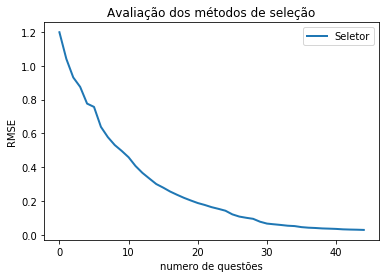

Urry Selector
99993
5699.677938461304


In [34]:
base_result = 'Result_UrrySelector_theta_orig_100000.txt'

selector = UrrySelector()

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

aluno: 0
aluno: 1
aluno: 2
aluno: 3
aluno: 4
aluno: 5
aluno: 6
aluno: 7
aluno: 8
aluno: 9
aluno: 10
aluno: 11
aluno: 12
aluno: 13
aluno: 14
aluno: 15
aluno: 16
aluno: 17
aluno: 18
aluno: 19
aluno: 20
aluno: 21
aluno: 22
aluno: 23
aluno: 24
aluno: 25
aluno: 26
aluno: 27
aluno: 28
aluno: 29
aluno: 30
aluno: 31
aluno: 32
aluno: 33
aluno: 34
aluno: 35
aluno: 36
aluno: 37
aluno: 38
aluno: 39
aluno: 40
aluno: 41
aluno: 42
aluno: 43
aluno: 44
aluno: 45
aluno: 46
aluno: 47
aluno: 48
aluno: 49
aluno: 50
aluno: 51
aluno: 52
aluno: 53
aluno: 54
aluno: 55
aluno: 56
aluno: 57
aluno: 58
aluno: 59
aluno: 60
aluno: 61
aluno: 62
aluno: 63
aluno: 64
aluno: 65
aluno: 66
aluno: 67
aluno: 68
aluno: 69
aluno: 70
aluno: 71
aluno: 72
aluno: 73
aluno: 74
aluno: 75
aluno: 76
aluno: 77
aluno: 78
aluno: 79
aluno: 80
aluno: 81
aluno: 82
aluno: 83
aluno: 84
aluno: 85
aluno: 86
aluno: 87
aluno: 88
aluno: 89
aluno: 90
aluno: 91
aluno: 92
aluno: 93
aluno: 94
aluno: 95
aluno: 96
aluno: 97
aluno: 98
aluno: 99
aluno: 100

aluno: 755
aluno: 756
aluno: 757
aluno: 758
aluno: 759
aluno: 760
aluno: 761
aluno: 762
aluno: 763
aluno: 764
aluno: 765
aluno: 766
aluno: 767
aluno: 768
aluno: 769
aluno: 770
aluno: 771
aluno: 772
aluno: 773
aluno: 774
aluno: 775
aluno: 776
aluno: 777
aluno: 778
aluno: 779
aluno: 780
aluno: 781
aluno: 782
aluno: 783
aluno: 784
aluno: 785
aluno: 786
aluno: 787
aluno: 788
aluno: 789
aluno: 790
aluno: 791
aluno: 792
aluno: 793
aluno: 794
aluno: 795
aluno: 796
aluno: 797
aluno: 798
aluno: 799
aluno: 800
aluno: 801
aluno: 802
aluno: 803
aluno: 804
aluno: 805
aluno: 806
aluno: 807
aluno: 808
aluno: 809
aluno: 810
aluno: 811
aluno: 812
aluno: 813
aluno: 814
aluno: 815
aluno: 816
aluno: 817
aluno: 818
aluno: 819
aluno: 820
aluno: 821
aluno: 822
aluno: 823
aluno: 824
aluno: 825
aluno: 826
aluno: 827
aluno: 828
aluno: 829
aluno: 830
aluno: 831
aluno: 832
aluno: 833
aluno: 834
aluno: 835
aluno: 836
aluno: 837
aluno: 838
aluno: 839
aluno: 840
aluno: 841
aluno: 842
aluno: 843
aluno: 844
aluno: 845

aluno: 1460
aluno: 1461
aluno: 1462
aluno: 1463
aluno: 1464
aluno: 1465
aluno: 1466
aluno: 1467
aluno: 1468
aluno: 1469
aluno: 1470
aluno: 1471
aluno: 1472
aluno: 1473
aluno: 1474
aluno: 1475
aluno: 1476
aluno: 1477
aluno: 1478
aluno: 1479
aluno: 1480
aluno: 1481
aluno: 1482
aluno: 1483
aluno: 1484
aluno: 1485
aluno: 1486
aluno: 1487
aluno: 1488
aluno: 1489
aluno: 1490
aluno: 1491
aluno: 1492
aluno: 1493
aluno: 1494
aluno: 1495
aluno: 1496
aluno: 1497
aluno: 1498
aluno: 1499
aluno: 1500
aluno: 1501
aluno: 1502
aluno: 1503
aluno: 1504
aluno: 1505
aluno: 1506
aluno: 1507
aluno: 1508
aluno: 1509
aluno: 1510
aluno: 1511
aluno: 1512
aluno: 1513
aluno: 1514
aluno: 1515
aluno: 1516
aluno: 1517
aluno: 1518
aluno: 1519
aluno: 1520
aluno: 1521
aluno: 1522
aluno: 1523
aluno: 1524
aluno: 1525
aluno: 1526
aluno: 1527
aluno: 1528
aluno: 1529
aluno: 1530
aluno: 1531
aluno: 1532
aluno: 1533
aluno: 1534
aluno: 1535
aluno: 1536
aluno: 1537
aluno: 1538
aluno: 1539
aluno: 1540
aluno: 1541
aluno: 1542
alun

aluno: 2144
aluno: 2145
aluno: 2146
aluno: 2147
aluno: 2148
aluno: 2149
aluno: 2150
aluno: 2151
aluno: 2152
aluno: 2153
aluno: 2154
aluno: 2155
aluno: 2156
aluno: 2157
aluno: 2158
aluno: 2159
aluno: 2160
aluno: 2161
aluno: 2162
aluno: 2163
aluno: 2164
aluno: 2165
aluno: 2166
aluno: 2167
aluno: 2168
aluno: 2169
aluno: 2170
aluno: 2171
aluno: 2172
aluno: 2173
aluno: 2174
aluno: 2175
aluno: 2176
aluno: 2177
aluno: 2178
aluno: 2179
aluno: 2180
aluno: 2181
aluno: 2182
aluno: 2183
aluno: 2184
aluno: 2185
aluno: 2186
aluno: 2187
aluno: 2188
aluno: 2189
aluno: 2190
aluno: 2191
aluno: 2192
aluno: 2193
aluno: 2194
aluno: 2195
aluno: 2196
aluno: 2197
aluno: 2198
aluno: 2199
aluno: 2200
aluno: 2201
aluno: 2202
aluno: 2203
aluno: 2204
aluno: 2205
aluno: 2206
aluno: 2207
aluno: 2208
aluno: 2209
aluno: 2210
aluno: 2211
aluno: 2212
aluno: 2213
aluno: 2214
aluno: 2215
aluno: 2216
aluno: 2217
aluno: 2218
aluno: 2219
aluno: 2220
aluno: 2221
aluno: 2222
aluno: 2223
aluno: 2224
aluno: 2225
aluno: 2226
alun

aluno: 2828
aluno: 2829
aluno: 2830
aluno: 2831
aluno: 2832
aluno: 2833
aluno: 2834
aluno: 2835
aluno: 2836
aluno: 2837
aluno: 2838
aluno: 2839
aluno: 2840
aluno: 2841
aluno: 2842
aluno: 2843
aluno: 2844
aluno: 2845
aluno: 2846
aluno: 2847
aluno: 2848
aluno: 2849
aluno: 2850
aluno: 2851
aluno: 2852
aluno: 2853
aluno: 2854
aluno: 2855
aluno: 2856
aluno: 2857
aluno: 2858
aluno: 2859
aluno: 2860
aluno: 2861
aluno: 2862
aluno: 2863
aluno: 2864
aluno: 2865
aluno: 2866
aluno: 2867
aluno: 2868
aluno: 2869
aluno: 2870
aluno: 2871
aluno: 2872
aluno: 2873
aluno: 2874
aluno: 2875
aluno: 2876
aluno: 2877
aluno: 2878
aluno: 2879
aluno: 2880
aluno: 2881
aluno: 2882
aluno: 2883
aluno: 2884
aluno: 2885
aluno: 2886
aluno: 2887
aluno: 2888
aluno: 2889
aluno: 2890
aluno: 2891
aluno: 2892
aluno: 2893
aluno: 2894
aluno: 2895
aluno: 2896
aluno: 2897
aluno: 2898
aluno: 2899
aluno: 2900
aluno: 2901
aluno: 2902
aluno: 2903
aluno: 2904
aluno: 2905
aluno: 2906
aluno: 2907
aluno: 2908
aluno: 2909
aluno: 2910
alun

aluno: 3511
aluno: 3512
aluno: 3513
aluno: 3514
aluno: 3515
aluno: 3516
aluno: 3517
aluno: 3518
aluno: 3519
aluno: 3520
aluno: 3521
aluno: 3522
aluno: 3523
aluno: 3524
aluno: 3525
aluno: 3526
aluno: 3527
aluno: 3528
aluno: 3529
aluno: 3530
aluno: 3531
aluno: 3532
aluno: 3533
aluno: 3534
aluno: 3535
aluno: 3536
aluno: 3537
aluno: 3538
aluno: 3539
aluno: 3540
aluno: 3541
aluno: 3542
aluno: 3543
aluno: 3544
aluno: 3545
aluno: 3546
aluno: 3547
aluno: 3548
aluno: 3549
aluno: 3550
aluno: 3551
aluno: 3552
aluno: 3553
aluno: 3554
aluno: 3555
aluno: 3556
aluno: 3557
aluno: 3558
aluno: 3559
aluno: 3560
aluno: 3561
aluno: 3562
aluno: 3563
aluno: 3564
aluno: 3565
aluno: 3566
aluno: 3567
aluno: 3568
aluno: 3569
aluno: 3570
aluno: 3571
aluno: 3572
aluno: 3573
aluno: 3574
aluno: 3575
aluno: 3576
aluno: 3577
aluno: 3578
aluno: 3579
aluno: 3580
aluno: 3581
aluno: 3582
aluno: 3583
aluno: 3584
aluno: 3585
aluno: 3586
aluno: 3587
aluno: 3588
aluno: 3589
aluno: 3590
aluno: 3591
aluno: 3592
aluno: 3593
alun

aluno: 4195
aluno: 4196
aluno: 4197
aluno: 4198
aluno: 4199
aluno: 4200
aluno: 4201
aluno: 4202
aluno: 4203
aluno: 4204
aluno: 4205
aluno: 4206
aluno: 4207
aluno: 4208
aluno: 4209
aluno: 4210
aluno: 4211
aluno: 4212
aluno: 4213
aluno: 4214
aluno: 4215
aluno: 4216
aluno: 4217
aluno: 4218
aluno: 4219
aluno: 4220
aluno: 4221
aluno: 4222
aluno: 4223
aluno: 4224
aluno: 4225
aluno: 4226
aluno: 4227
aluno: 4228
aluno: 4229
aluno: 4230
aluno: 4231
aluno: 4232
aluno: 4233
aluno: 4234
aluno: 4235
aluno: 4236
aluno: 4237
aluno: 4238
aluno: 4239
aluno: 4240
aluno: 4241
aluno: 4242
aluno: 4243
aluno: 4244
aluno: 4245
aluno: 4246
aluno: 4247
aluno: 4248
aluno: 4249
aluno: 4250
aluno: 4251
aluno: 4252
aluno: 4253
aluno: 4254
aluno: 4255
aluno: 4256
aluno: 4257
aluno: 4258
aluno: 4259
aluno: 4260
aluno: 4261
aluno: 4262
aluno: 4263
aluno: 4264
aluno: 4265
aluno: 4266
aluno: 4267
aluno: 4268
aluno: 4269
aluno: 4270
aluno: 4271
aluno: 4272
aluno: 4273
aluno: 4274
aluno: 4275
aluno: 4276
aluno: 4277
alun

aluno: 4879
aluno: 4880
aluno: 4881
aluno: 4882
aluno: 4883
aluno: 4884
aluno: 4885
aluno: 4886
aluno: 4887
aluno: 4888
aluno: 4889
aluno: 4890
aluno: 4891
aluno: 4892
aluno: 4893
aluno: 4894
aluno: 4895
aluno: 4896
aluno: 4897
aluno: 4898
aluno: 4899
aluno: 4900
aluno: 4901
aluno: 4902
aluno: 4903
aluno: 4904
aluno: 4905
aluno: 4906
aluno: 4907
aluno: 4908
aluno: 4909
aluno: 4910
aluno: 4911
aluno: 4912
aluno: 4913
aluno: 4914
aluno: 4915
aluno: 4916
aluno: 4917
aluno: 4918
aluno: 4919
aluno: 4920
aluno: 4921
aluno: 4922
aluno: 4923
aluno: 4924
aluno: 4925
aluno: 4926
aluno: 4927
aluno: 4928
aluno: 4929
aluno: 4930
aluno: 4931
aluno: 4932
aluno: 4933
aluno: 4934
aluno: 4935
aluno: 4936
aluno: 4937
aluno: 4938
aluno: 4939
aluno: 4940
aluno: 4941
aluno: 4942
aluno: 4943
aluno: 4944
aluno: 4945
aluno: 4946
aluno: 4947
aluno: 4948
aluno: 4949
aluno: 4950
aluno: 4951
aluno: 4952
aluno: 4953
aluno: 4954
aluno: 4955
aluno: 4956
aluno: 4957
aluno: 4958
aluno: 4959
aluno: 4960
aluno: 4961
alun

aluno: 5562
aluno: 5563
aluno: 5564
aluno: 5565
aluno: 5566
aluno: 5567
aluno: 5568
aluno: 5569
aluno: 5570
aluno: 5571
aluno: 5572
aluno: 5573
aluno: 5574
aluno: 5575
aluno: 5576
aluno: 5577
aluno: 5578
aluno: 5579
aluno: 5580
aluno: 5581
aluno: 5582
aluno: 5583
aluno: 5584
aluno: 5585
aluno: 5586
aluno: 5587
aluno: 5588
aluno: 5589
aluno: 5590
aluno: 5591
aluno: 5592
aluno: 5593
aluno: 5594
aluno: 5595
aluno: 5596
aluno: 5597
aluno: 5598
aluno: 5599
aluno: 5600
aluno: 5601
aluno: 5602
aluno: 5603
aluno: 5604
aluno: 5605
aluno: 5606
aluno: 5607
aluno: 5608
aluno: 5609
aluno: 5610
aluno: 5611
aluno: 5612
aluno: 5613
aluno: 5614
aluno: 5615
aluno: 5616
aluno: 5617
aluno: 5618
aluno: 5619
aluno: 5620
aluno: 5621
aluno: 5622
aluno: 5623
aluno: 5624
aluno: 5625
aluno: 5626
aluno: 5627
aluno: 5628
aluno: 5629
aluno: 5630
aluno: 5631
aluno: 5632
aluno: 5633
aluno: 5634
aluno: 5635
aluno: 5636
aluno: 5637
aluno: 5638
aluno: 5639
aluno: 5640
aluno: 5641
aluno: 5642
aluno: 5643
aluno: 5644
alun

aluno: 6246
aluno: 6247
aluno: 6248
aluno: 6249
aluno: 6250
aluno: 6251
aluno: 6252
aluno: 6253
aluno: 6254
aluno: 6255
aluno: 6256
aluno: 6257
aluno: 6258
aluno: 6259
aluno: 6260
aluno: 6261
aluno: 6262
aluno: 6263
aluno: 6264
aluno: 6265
aluno: 6266
aluno: 6267
aluno: 6268
aluno: 6269
aluno: 6270
aluno: 6271
aluno: 6272
aluno: 6273
aluno: 6274
aluno: 6275
aluno: 6276
aluno: 6277
aluno: 6278
aluno: 6279
aluno: 6280
aluno: 6281
aluno: 6282
aluno: 6283
aluno: 6284
aluno: 6285
aluno: 6286
aluno: 6287
aluno: 6288
aluno: 6289
aluno: 6290
aluno: 6291
aluno: 6292
aluno: 6293
aluno: 6294
aluno: 6295
aluno: 6296
aluno: 6297
aluno: 6298
aluno: 6299
aluno: 6300
aluno: 6301
aluno: 6302
aluno: 6303
aluno: 6304
aluno: 6305
aluno: 6306
aluno: 6307
aluno: 6308
aluno: 6309
aluno: 6310
aluno: 6311
aluno: 6312
aluno: 6313
aluno: 6314
aluno: 6315
aluno: 6316
aluno: 6317
aluno: 6318
aluno: 6319
aluno: 6320
aluno: 6321
aluno: 6322
aluno: 6323
aluno: 6324
aluno: 6325
aluno: 6326
aluno: 6327
aluno: 6328
alun

aluno: 6931
aluno: 6932
aluno: 6933
aluno: 6934
aluno: 6935
aluno: 6936
aluno: 6937
aluno: 6938
aluno: 6939
aluno: 6940
aluno: 6941
aluno: 6942
aluno: 6943
aluno: 6944
aluno: 6945
aluno: 6946
aluno: 6947
aluno: 6948
aluno: 6949
aluno: 6950
aluno: 6951
aluno: 6952
aluno: 6953
aluno: 6954
aluno: 6955
aluno: 6956
aluno: 6957
aluno: 6958
aluno: 6959
aluno: 6960
aluno: 6961
aluno: 6962
aluno: 6963
aluno: 6964
aluno: 6965
aluno: 6966
aluno: 6967
aluno: 6968
aluno: 6969
aluno: 6970
aluno: 6971
aluno: 6972
aluno: 6973
aluno: 6974
aluno: 6975
aluno: 6976
aluno: 6977
aluno: 6978
aluno: 6979
aluno: 6980
aluno: 6981
aluno: 6982
aluno: 6983
aluno: 6984
aluno: 6985
aluno: 6986
aluno: 6987
aluno: 6988
aluno: 6989
aluno: 6990
aluno: 6991
aluno: 6992
aluno: 6993
aluno: 6994
aluno: 6995
aluno: 6996
aluno: 6997
aluno: 6998
aluno: 6999
aluno: 7000
aluno: 7001
aluno: 7002
aluno: 7003
aluno: 7004
aluno: 7005
aluno: 7006
aluno: 7007
aluno: 7008
aluno: 7009
aluno: 7010
aluno: 7011
aluno: 7012
aluno: 7013
alun

aluno: 7613
aluno: 7614
aluno: 7615
aluno: 7616
aluno: 7617
aluno: 7618
aluno: 7619
aluno: 7620
aluno: 7621
aluno: 7622
aluno: 7623
aluno: 7624
aluno: 7625
aluno: 7626
aluno: 7627
aluno: 7628
aluno: 7629
aluno: 7630
aluno: 7631
aluno: 7632
aluno: 7633
aluno: 7634
aluno: 7635
aluno: 7636
aluno: 7637
aluno: 7638
aluno: 7639
aluno: 7640
aluno: 7641
aluno: 7642
aluno: 7643
aluno: 7644
aluno: 7645
aluno: 7646
aluno: 7647
aluno: 7648
aluno: 7649
aluno: 7650
aluno: 7651
aluno: 7652
aluno: 7653
aluno: 7654
aluno: 7655
aluno: 7656
aluno: 7657
aluno: 7658
aluno: 7659
aluno: 7660
aluno: 7661
aluno: 7662
aluno: 7663
aluno: 7664
aluno: 7665
aluno: 7666
aluno: 7667
aluno: 7668
aluno: 7669
aluno: 7670
aluno: 7671
aluno: 7672
aluno: 7673
aluno: 7674
aluno: 7675
aluno: 7676
aluno: 7677
aluno: 7678
aluno: 7679
aluno: 7680
aluno: 7681
aluno: 7682
aluno: 7683
aluno: 7684
aluno: 7685
aluno: 7686
aluno: 7687
aluno: 7688
aluno: 7689
aluno: 7690
aluno: 7691
aluno: 7692
aluno: 7693
aluno: 7694
aluno: 7695
alun

aluno: 8297
aluno: 8298
aluno: 8299
aluno: 8300
aluno: 8301
aluno: 8302
aluno: 8303
aluno: 8304
aluno: 8305
aluno: 8306
aluno: 8307
aluno: 8308
aluno: 8309
aluno: 8310
aluno: 8311
aluno: 8312
aluno: 8313
aluno: 8314
aluno: 8315
aluno: 8316
aluno: 8317
aluno: 8318
aluno: 8319
aluno: 8320
aluno: 8321
aluno: 8322
aluno: 8323
aluno: 8324
aluno: 8325
aluno: 8326
aluno: 8327
aluno: 8328
aluno: 8329
aluno: 8330
aluno: 8331
aluno: 8332
aluno: 8333
aluno: 8334
aluno: 8335
aluno: 8336
aluno: 8337
aluno: 8338
aluno: 8339
aluno: 8340
aluno: 8341
aluno: 8342
aluno: 8343
aluno: 8344
aluno: 8345
aluno: 8346
aluno: 8347
aluno: 8348
aluno: 8349
aluno: 8350
aluno: 8351
aluno: 8352
aluno: 8353
aluno: 8354
aluno: 8355
aluno: 8356
aluno: 8357
aluno: 8358
aluno: 8359
aluno: 8360
aluno: 8361
aluno: 8362
aluno: 8363
aluno: 8364
aluno: 8365
aluno: 8366
aluno: 8367
aluno: 8368
aluno: 8369
aluno: 8370
aluno: 8371
aluno: 8372
aluno: 8373
aluno: 8374
aluno: 8375
aluno: 8376
aluno: 8377
aluno: 8378
aluno: 8379
alun

aluno: 8982
aluno: 8983
aluno: 8984
aluno: 8985
aluno: 8986
aluno: 8987
aluno: 8988
aluno: 8989
aluno: 8990
aluno: 8991
aluno: 8992
aluno: 8993
aluno: 8994
aluno: 8995
aluno: 8996
aluno: 8997
aluno: 8998
aluno: 8999
aluno: 9000
aluno: 9001
aluno: 9002
aluno: 9003
aluno: 9004
aluno: 9005
aluno: 9006
aluno: 9007
aluno: 9008
aluno: 9009
aluno: 9010
aluno: 9011
aluno: 9012
aluno: 9013
aluno: 9014
aluno: 9015
aluno: 9016
aluno: 9017
aluno: 9018
aluno: 9019
aluno: 9020
aluno: 9021
aluno: 9022
aluno: 9023
aluno: 9024
aluno: 9025
aluno: 9026
aluno: 9027
aluno: 9028
aluno: 9029
aluno: 9030
aluno: 9031
aluno: 9032
aluno: 9033
aluno: 9034
aluno: 9035
aluno: 9036
aluno: 9037
aluno: 9038
aluno: 9039
aluno: 9040
aluno: 9041
aluno: 9042
aluno: 9043
aluno: 9044
aluno: 9045
aluno: 9046
aluno: 9047
aluno: 9048
aluno: 9049
aluno: 9050
aluno: 9051
aluno: 9052
aluno: 9053
aluno: 9054
aluno: 9055
aluno: 9056
aluno: 9057
aluno: 9058
aluno: 9059
aluno: 9060
aluno: 9061
aluno: 9062
aluno: 9063
aluno: 9064
alun

aluno: 9665
aluno: 9666
aluno: 9667
aluno: 9668
aluno: 9669
aluno: 9670
aluno: 9671
aluno: 9672
aluno: 9673
aluno: 9674
aluno: 9675
aluno: 9676
aluno: 9677
aluno: 9678
aluno: 9679
aluno: 9680
aluno: 9681
aluno: 9682
aluno: 9683
aluno: 9684
aluno: 9685
aluno: 9686
aluno: 9687
aluno: 9688
aluno: 9689
aluno: 9690
aluno: 9691
aluno: 9692
aluno: 9693
aluno: 9694
aluno: 9695
aluno: 9696
aluno: 9697
aluno: 9698
aluno: 9699
aluno: 9700
aluno: 9701
aluno: 9702
aluno: 9703
aluno: 9704
aluno: 9705
aluno: 9706
aluno: 9707
aluno: 9708
aluno: 9709
aluno: 9710
aluno: 9711
aluno: 9712
aluno: 9713
aluno: 9714
aluno: 9715
aluno: 9716
aluno: 9717
aluno: 9718
aluno: 9719
aluno: 9720
aluno: 9721
aluno: 9722
aluno: 9723
aluno: 9724
aluno: 9725
aluno: 9726
aluno: 9727
aluno: 9728
aluno: 9729
aluno: 9730
aluno: 9731
aluno: 9732
aluno: 9733
aluno: 9734
aluno: 9735
aluno: 9736
aluno: 9737
aluno: 9738
aluno: 9739
aluno: 9740
aluno: 9741
aluno: 9742
aluno: 9743
aluno: 9744
aluno: 9745
aluno: 9746
aluno: 9747
alun

aluno: 10322
aluno: 10323
aluno: 10324
aluno: 10325
aluno: 10326
aluno: 10327
aluno: 10328
aluno: 10329
aluno: 10330
aluno: 10331
aluno: 10332
aluno: 10333
aluno: 10334
aluno: 10335
aluno: 10336
aluno: 10337
aluno: 10338
aluno: 10339
aluno: 10340
aluno: 10341
aluno: 10342
aluno: 10343
aluno: 10344
aluno: 10345
aluno: 10346
aluno: 10347
aluno: 10348
aluno: 10349
aluno: 10350
aluno: 10351
aluno: 10352
aluno: 10353
aluno: 10354
aluno: 10355
aluno: 10356
aluno: 10357
aluno: 10358
aluno: 10359
aluno: 10360
aluno: 10361
aluno: 10362
aluno: 10363
aluno: 10364
aluno: 10365
aluno: 10366
aluno: 10367
aluno: 10368
aluno: 10369
aluno: 10370
aluno: 10371
aluno: 10372
aluno: 10373
aluno: 10374
aluno: 10375
aluno: 10376
aluno: 10377
aluno: 10378
aluno: 10379
aluno: 10380
aluno: 10381
aluno: 10382
aluno: 10383
aluno: 10384
aluno: 10385
aluno: 10386
aluno: 10387
aluno: 10388
aluno: 10389
aluno: 10390
aluno: 10391
aluno: 10392
aluno: 10393
aluno: 10394
aluno: 10395
aluno: 10396
aluno: 10397
aluno: 10398

aluno: 10954
aluno: 10955
aluno: 10956
aluno: 10957
aluno: 10958
aluno: 10959
aluno: 10960
aluno: 10961
aluno: 10962
aluno: 10963
aluno: 10964
aluno: 10965
aluno: 10966
aluno: 10967
aluno: 10968
aluno: 10969
aluno: 10970
aluno: 10971
aluno: 10972
aluno: 10973
aluno: 10974
aluno: 10975
aluno: 10976
aluno: 10977
aluno: 10978
aluno: 10979
aluno: 10980
aluno: 10981
aluno: 10982
aluno: 10983
aluno: 10984
aluno: 10985
aluno: 10986
aluno: 10987
aluno: 10988
aluno: 10989
aluno: 10990
aluno: 10991
aluno: 10992
aluno: 10993
aluno: 10994
aluno: 10995
aluno: 10996
aluno: 10997
aluno: 10998
aluno: 10999
aluno: 11000
aluno: 11001
aluno: 11002
aluno: 11003
aluno: 11004
aluno: 11005
aluno: 11006
aluno: 11007
aluno: 11008
aluno: 11009
aluno: 11010
aluno: 11011
aluno: 11012
aluno: 11013
aluno: 11014
aluno: 11015
aluno: 11016
aluno: 11017
aluno: 11018
aluno: 11019
aluno: 11020
aluno: 11021
aluno: 11022
aluno: 11023
aluno: 11024
aluno: 11025
aluno: 11026
aluno: 11027
aluno: 11028
aluno: 11029
aluno: 11030

aluno: 11585
aluno: 11586
aluno: 11587
aluno: 11588
aluno: 11589
aluno: 11590
aluno: 11591
aluno: 11592
aluno: 11593
aluno: 11594
aluno: 11595
aluno: 11596
aluno: 11597
aluno: 11598
aluno: 11599
aluno: 11600
aluno: 11601
aluno: 11602
aluno: 11603
aluno: 11604
aluno: 11605
aluno: 11606
aluno: 11607
aluno: 11608
aluno: 11609
aluno: 11610
aluno: 11611
aluno: 11612
aluno: 11613
aluno: 11614
aluno: 11615
aluno: 11616
aluno: 11617
aluno: 11618
aluno: 11619
aluno: 11620
aluno: 11621
aluno: 11622
aluno: 11623
aluno: 11624
aluno: 11625
aluno: 11626
aluno: 11627
aluno: 11628
aluno: 11629
aluno: 11630
aluno: 11631
aluno: 11632
aluno: 11633
aluno: 11634
aluno: 11635
aluno: 11636
aluno: 11637
aluno: 11638
aluno: 11639
aluno: 11640
aluno: 11641
aluno: 11642
aluno: 11643
aluno: 11644
aluno: 11645
aluno: 11646
aluno: 11647
aluno: 11648
aluno: 11649
aluno: 11650
aluno: 11651
aluno: 11652
aluno: 11653
aluno: 11654
aluno: 11655
aluno: 11656
aluno: 11657
aluno: 11658
aluno: 11659
aluno: 11660
aluno: 11661

aluno: 12218
aluno: 12219
aluno: 12220
aluno: 12221
aluno: 12222
aluno: 12223
aluno: 12224
aluno: 12225
aluno: 12226
aluno: 12227
aluno: 12228
aluno: 12229
aluno: 12230
aluno: 12231
aluno: 12232
aluno: 12233
aluno: 12234
aluno: 12235
aluno: 12236
aluno: 12237
aluno: 12238
aluno: 12239
aluno: 12240
aluno: 12241
aluno: 12242
aluno: 12243
aluno: 12244
aluno: 12245
aluno: 12246
aluno: 12247
aluno: 12248
aluno: 12249
aluno: 12250
aluno: 12251
aluno: 12252
aluno: 12253
aluno: 12254
aluno: 12255
aluno: 12256
aluno: 12257
aluno: 12258
aluno: 12259
aluno: 12260
aluno: 12261
aluno: 12262
aluno: 12263
aluno: 12264
aluno: 12265
aluno: 12266
aluno: 12267
aluno: 12268
aluno: 12269
aluno: 12270
aluno: 12271
aluno: 12272
aluno: 12273
aluno: 12274
aluno: 12275
aluno: 12276
aluno: 12277
aluno: 12278
aluno: 12279
aluno: 12280
aluno: 12281
aluno: 12282
aluno: 12283
aluno: 12284
aluno: 12285
aluno: 12286
aluno: 12287
aluno: 12288
aluno: 12289
aluno: 12290
aluno: 12291
aluno: 12292
aluno: 12293
aluno: 12294

aluno: 12851
aluno: 12852
aluno: 12853
aluno: 12854
aluno: 12855
aluno: 12856
aluno: 12857
aluno: 12858
aluno: 12859
aluno: 12860
aluno: 12861
aluno: 12862
aluno: 12863
aluno: 12864
aluno: 12865
aluno: 12866
aluno: 12867
aluno: 12868
aluno: 12869
aluno: 12870
aluno: 12871
aluno: 12872
aluno: 12873
aluno: 12874
aluno: 12875
aluno: 12876
aluno: 12877
aluno: 12878
aluno: 12879
aluno: 12880
aluno: 12881
aluno: 12882
aluno: 12883
aluno: 12884
aluno: 12885
aluno: 12886
aluno: 12887
aluno: 12888
aluno: 12889
aluno: 12890
aluno: 12891
aluno: 12892
aluno: 12893
aluno: 12894
aluno: 12895
aluno: 12896
aluno: 12897
aluno: 12898
aluno: 12899
aluno: 12900
aluno: 12901
aluno: 12902
aluno: 12903
aluno: 12904
aluno: 12905
aluno: 12906
aluno: 12907
aluno: 12908
aluno: 12909
aluno: 12910
aluno: 12911
aluno: 12912
aluno: 12913
aluno: 12914
aluno: 12915
aluno: 12916
aluno: 12917
aluno: 12918
aluno: 12919
aluno: 12920
aluno: 12921
aluno: 12922
aluno: 12923
aluno: 12924
aluno: 12925
aluno: 12926
aluno: 12927

aluno: 13482
aluno: 13483
aluno: 13484
aluno: 13485
aluno: 13486
aluno: 13487
aluno: 13488
aluno: 13489
aluno: 13490
aluno: 13491
aluno: 13492
aluno: 13493
aluno: 13494
aluno: 13495
aluno: 13496
aluno: 13497
aluno: 13498
aluno: 13499
aluno: 13500
aluno: 13501
aluno: 13502
aluno: 13503
aluno: 13504
aluno: 13505
aluno: 13506
aluno: 13507
aluno: 13508
aluno: 13509
aluno: 13510
aluno: 13511
aluno: 13512
aluno: 13513
aluno: 13514
aluno: 13515
aluno: 13516
aluno: 13517
aluno: 13518
aluno: 13519
aluno: 13520
aluno: 13521
aluno: 13522
aluno: 13523
aluno: 13524
aluno: 13525
aluno: 13526
aluno: 13527
aluno: 13528
aluno: 13529
aluno: 13530
aluno: 13531
aluno: 13532
aluno: 13533
aluno: 13534
aluno: 13535
aluno: 13536
aluno: 13537
aluno: 13538
aluno: 13539
aluno: 13540
aluno: 13541
aluno: 13542
aluno: 13543
aluno: 13544
aluno: 13545
aluno: 13546
aluno: 13547
aluno: 13548
aluno: 13549
aluno: 13550
aluno: 13551
aluno: 13552
aluno: 13553
aluno: 13554
aluno: 13555
aluno: 13556
aluno: 13557
aluno: 13558

aluno: 14116
aluno: 14117
aluno: 14118
aluno: 14119
aluno: 14120
aluno: 14121
aluno: 14122
aluno: 14123
aluno: 14124
aluno: 14125
aluno: 14126
aluno: 14127
aluno: 14128
aluno: 14129
aluno: 14130
aluno: 14131
aluno: 14132
aluno: 14133
aluno: 14134
aluno: 14135
aluno: 14136
aluno: 14137
aluno: 14138
aluno: 14139
aluno: 14140
aluno: 14141
aluno: 14142
aluno: 14143
aluno: 14144
aluno: 14145
aluno: 14146
aluno: 14147
aluno: 14148
aluno: 14149
aluno: 14150
aluno: 14151
aluno: 14152
aluno: 14153
aluno: 14154
aluno: 14155
aluno: 14156
aluno: 14157
aluno: 14158
aluno: 14159
aluno: 14160
aluno: 14161
aluno: 14162
aluno: 14163
aluno: 14164
aluno: 14165
aluno: 14166
aluno: 14167
aluno: 14168
aluno: 14169
aluno: 14170
aluno: 14171
aluno: 14172
aluno: 14173
aluno: 14174
aluno: 14175
aluno: 14176
aluno: 14177
aluno: 14178
aluno: 14179
aluno: 14180
aluno: 14181
aluno: 14182
aluno: 14183
aluno: 14184
aluno: 14185
aluno: 14186
aluno: 14187
aluno: 14188
aluno: 14189
aluno: 14190
aluno: 14191
aluno: 14192

aluno: 14749
aluno: 14750
aluno: 14751
aluno: 14752
aluno: 14753
aluno: 14754
aluno: 14755
aluno: 14756
aluno: 14757
aluno: 14758
aluno: 14759
aluno: 14760
aluno: 14761
aluno: 14762
aluno: 14763
aluno: 14764
aluno: 14765
aluno: 14766
aluno: 14767
aluno: 14768
aluno: 14769
aluno: 14770
aluno: 14771
aluno: 14772
aluno: 14773
aluno: 14774
aluno: 14775
aluno: 14776
aluno: 14777
aluno: 14778
aluno: 14779
aluno: 14780
aluno: 14781
aluno: 14782
aluno: 14783
aluno: 14784
aluno: 14785
aluno: 14786
aluno: 14787
aluno: 14788
aluno: 14789
aluno: 14790
aluno: 14791
aluno: 14792
aluno: 14793
aluno: 14794
aluno: 14795
aluno: 14796
aluno: 14797
aluno: 14798
aluno: 14799
aluno: 14800
aluno: 14801
aluno: 14802
aluno: 14803
aluno: 14804
aluno: 14805
aluno: 14806
aluno: 14807
aluno: 14808
aluno: 14809
aluno: 14810
aluno: 14811
aluno: 14812
aluno: 14813
aluno: 14814
aluno: 14815
aluno: 14816
aluno: 14817
aluno: 14818
aluno: 14819
aluno: 14820
aluno: 14821
aluno: 14822
aluno: 14823
aluno: 14824
aluno: 14825

aluno: 15384
aluno: 15385
aluno: 15386
aluno: 15387
aluno: 15388
aluno: 15389
aluno: 15390
aluno: 15391
aluno: 15392
aluno: 15393
aluno: 15394
aluno: 15395
aluno: 15396
aluno: 15397
aluno: 15398
aluno: 15399
aluno: 15400
aluno: 15401
aluno: 15402
aluno: 15403
aluno: 15404
aluno: 15405
aluno: 15406
aluno: 15407
aluno: 15408
aluno: 15409
aluno: 15410
aluno: 15411
aluno: 15412
aluno: 15413
aluno: 15414
aluno: 15415
aluno: 15416
aluno: 15417
aluno: 15418
aluno: 15419
aluno: 15420
aluno: 15421
aluno: 15422
aluno: 15423
aluno: 15424
aluno: 15425
aluno: 15426
aluno: 15427
aluno: 15428
aluno: 15429
aluno: 15430
aluno: 15431
aluno: 15432
aluno: 15433
aluno: 15434
aluno: 15435
aluno: 15436
aluno: 15437
aluno: 15438
aluno: 15439
aluno: 15440
aluno: 15441
aluno: 15442
aluno: 15443
aluno: 15444
aluno: 15445
aluno: 15446
aluno: 15447
aluno: 15448
aluno: 15449
aluno: 15450
aluno: 15451
aluno: 15452
aluno: 15453
aluno: 15454
aluno: 15455
aluno: 15456
aluno: 15457
aluno: 15458
aluno: 15459
aluno: 15460

aluno: 16019
aluno: 16020
aluno: 16021
aluno: 16022
aluno: 16023
aluno: 16024
aluno: 16025
aluno: 16026
aluno: 16027
aluno: 16028
aluno: 16029
aluno: 16030
aluno: 16031
aluno: 16032
aluno: 16033
aluno: 16034
aluno: 16035
aluno: 16036
aluno: 16037
aluno: 16038
aluno: 16039
aluno: 16040
aluno: 16041
aluno: 16042
aluno: 16043
aluno: 16044
aluno: 16045
aluno: 16046
aluno: 16047
aluno: 16048
aluno: 16049
aluno: 16050
aluno: 16051
aluno: 16052
aluno: 16053
aluno: 16054
aluno: 16055
aluno: 16056
aluno: 16057
aluno: 16058
aluno: 16059
aluno: 16060
aluno: 16061
aluno: 16062
aluno: 16063
aluno: 16064
aluno: 16065
aluno: 16066
aluno: 16067
aluno: 16068
aluno: 16069
aluno: 16070
aluno: 16071
aluno: 16072
aluno: 16073
aluno: 16074
aluno: 16075
aluno: 16076
aluno: 16077
aluno: 16078
aluno: 16079
aluno: 16080
aluno: 16081
aluno: 16082
aluno: 16083
aluno: 16084
aluno: 16085
aluno: 16086
aluno: 16087
aluno: 16088
aluno: 16089
aluno: 16090
aluno: 16091
aluno: 16092
aluno: 16093
aluno: 16094
aluno: 16095

aluno: 16650
aluno: 16651
aluno: 16652
aluno: 16653
aluno: 16654
aluno: 16655
aluno: 16656
aluno: 16657
aluno: 16658
aluno: 16659
aluno: 16660
aluno: 16661
aluno: 16662
aluno: 16663
aluno: 16664
aluno: 16665
aluno: 16666
aluno: 16667
aluno: 16668
aluno: 16669
aluno: 16670
aluno: 16671
aluno: 16672
aluno: 16673
aluno: 16674
aluno: 16675
aluno: 16676
aluno: 16677
aluno: 16678
aluno: 16679
aluno: 16680
aluno: 16681
aluno: 16682
aluno: 16683
aluno: 16684
aluno: 16685
aluno: 16686
aluno: 16687
aluno: 16688
aluno: 16689
aluno: 16690
aluno: 16691
aluno: 16692
aluno: 16693
aluno: 16694
aluno: 16695
aluno: 16696
aluno: 16697
aluno: 16698
aluno: 16699
aluno: 16700
aluno: 16701
aluno: 16702
aluno: 16703
aluno: 16704
aluno: 16705
aluno: 16706
aluno: 16707
aluno: 16708
aluno: 16709
aluno: 16710
aluno: 16711
aluno: 16712
aluno: 16713
aluno: 16714
aluno: 16715
aluno: 16716
aluno: 16717
aluno: 16718
aluno: 16719
aluno: 16720
aluno: 16721
aluno: 16722
aluno: 16723
aluno: 16724
aluno: 16725
aluno: 16726

aluno: 17283
aluno: 17284
aluno: 17285
aluno: 17286
aluno: 17287
aluno: 17288
aluno: 17289
aluno: 17290
aluno: 17291
aluno: 17292
aluno: 17293
aluno: 17294
aluno: 17295
aluno: 17296
aluno: 17297
aluno: 17298
aluno: 17299
aluno: 17300
aluno: 17301
aluno: 17302
aluno: 17303
aluno: 17304
aluno: 17305
aluno: 17306
aluno: 17307
aluno: 17308
aluno: 17309
aluno: 17310
aluno: 17311
aluno: 17312
aluno: 17313
aluno: 17314
aluno: 17315
aluno: 17316
aluno: 17317
aluno: 17318
aluno: 17319
aluno: 17320
aluno: 17321
aluno: 17322
aluno: 17323
aluno: 17324
aluno: 17325
aluno: 17326
aluno: 17327
aluno: 17328
aluno: 17329
aluno: 17330
aluno: 17331
aluno: 17332
aluno: 17333
aluno: 17334
aluno: 17335
aluno: 17336
aluno: 17337
aluno: 17338
aluno: 17339
aluno: 17340
aluno: 17341
aluno: 17342
aluno: 17343
aluno: 17344
aluno: 17345
aluno: 17346
aluno: 17347
aluno: 17348
aluno: 17349
aluno: 17350
aluno: 17351
aluno: 17352
aluno: 17353
aluno: 17354
aluno: 17355
aluno: 17356
aluno: 17357
aluno: 17358
aluno: 17359

aluno: 17917
aluno: 17918
aluno: 17919
aluno: 17920
aluno: 17921
aluno: 17922
aluno: 17923
aluno: 17924
aluno: 17925
aluno: 17926
aluno: 17927
aluno: 17928
aluno: 17929
aluno: 17930
aluno: 17931
aluno: 17932
aluno: 17933
aluno: 17934
aluno: 17935
aluno: 17936
aluno: 17937
aluno: 17938
aluno: 17939
aluno: 17940
aluno: 17941
aluno: 17942
aluno: 17943
aluno: 17944
aluno: 17945
aluno: 17946
aluno: 17947
aluno: 17948
aluno: 17949
aluno: 17950
aluno: 17951
aluno: 17952
aluno: 17953
aluno: 17954
aluno: 17955
aluno: 17956
aluno: 17957
aluno: 17958
aluno: 17959
aluno: 17960
aluno: 17961
aluno: 17962
aluno: 17963
aluno: 17964
aluno: 17965
aluno: 17966
aluno: 17967
aluno: 17968
aluno: 17969
aluno: 17970
aluno: 17971
aluno: 17972
aluno: 17973
aluno: 17974
aluno: 17975
aluno: 17976
aluno: 17977
aluno: 17978
aluno: 17979
aluno: 17980
aluno: 17981
aluno: 17982
aluno: 17983
aluno: 17984
aluno: 17985
aluno: 17986
aluno: 17987
aluno: 17988
aluno: 17989
aluno: 17990
aluno: 17991
aluno: 17992
aluno: 17993

aluno: 18551
aluno: 18552
aluno: 18553
aluno: 18554
aluno: 18555
aluno: 18556
aluno: 18557
aluno: 18558
aluno: 18559
aluno: 18560
aluno: 18561
aluno: 18562
aluno: 18563
aluno: 18564
aluno: 18565
aluno: 18566
aluno: 18567
aluno: 18568
aluno: 18569
aluno: 18570
aluno: 18571
aluno: 18572
aluno: 18573
aluno: 18574
aluno: 18575
aluno: 18576
aluno: 18577
aluno: 18578
aluno: 18579
aluno: 18580
aluno: 18581
aluno: 18582
aluno: 18583
aluno: 18584
aluno: 18585
aluno: 18586
aluno: 18587
aluno: 18588
aluno: 18589
aluno: 18590
aluno: 18591
aluno: 18592
aluno: 18593
aluno: 18594
aluno: 18595
aluno: 18596
aluno: 18597
aluno: 18598
aluno: 18599
aluno: 18600
aluno: 18601
aluno: 18602
aluno: 18603
aluno: 18604
aluno: 18605
aluno: 18606
aluno: 18607
aluno: 18608
aluno: 18609
aluno: 18610
aluno: 18611
aluno: 18612
aluno: 18613
aluno: 18614
aluno: 18615
aluno: 18616
aluno: 18617
aluno: 18618
aluno: 18619
aluno: 18620
aluno: 18621
aluno: 18622
aluno: 18623
aluno: 18624
aluno: 18625
aluno: 18626
aluno: 18627

aluno: 19183
aluno: 19184
aluno: 19185
aluno: 19186
aluno: 19187
aluno: 19188
aluno: 19189
aluno: 19190
aluno: 19191
aluno: 19192
aluno: 19193
aluno: 19194
aluno: 19195
aluno: 19196
aluno: 19197
aluno: 19198
aluno: 19199
aluno: 19200
aluno: 19201
aluno: 19202
aluno: 19203
aluno: 19204
aluno: 19205
aluno: 19206
aluno: 19207
aluno: 19208
aluno: 19209
aluno: 19210
aluno: 19211
aluno: 19212
aluno: 19213
aluno: 19214
aluno: 19215
aluno: 19216
aluno: 19217
aluno: 19218
aluno: 19219
aluno: 19220
aluno: 19221
aluno: 19222
aluno: 19223
aluno: 19224
aluno: 19225
aluno: 19226
aluno: 19227
aluno: 19228
aluno: 19229
aluno: 19230
aluno: 19231
aluno: 19232
aluno: 19233
aluno: 19234
aluno: 19235
aluno: 19236
aluno: 19237
aluno: 19238
aluno: 19239
aluno: 19240
aluno: 19241
aluno: 19242
aluno: 19243
aluno: 19244
aluno: 19245
aluno: 19246
aluno: 19247
aluno: 19248
aluno: 19249
aluno: 19250
aluno: 19251
aluno: 19252
aluno: 19253
aluno: 19254
aluno: 19255
aluno: 19256
aluno: 19257
aluno: 19258
aluno: 19259

aluno: 19818
aluno: 19819
aluno: 19820
aluno: 19821
aluno: 19822
aluno: 19823
aluno: 19824
aluno: 19825
aluno: 19826
aluno: 19827
aluno: 19828
aluno: 19829
aluno: 19830
aluno: 19831
aluno: 19832
aluno: 19833
aluno: 19834
aluno: 19835
aluno: 19836
aluno: 19837
aluno: 19838
aluno: 19839
aluno: 19840
aluno: 19841
aluno: 19842
aluno: 19843
aluno: 19844
aluno: 19845
aluno: 19846
aluno: 19847
aluno: 19848
aluno: 19849
aluno: 19850
aluno: 19851
aluno: 19852
aluno: 19853
aluno: 19854
aluno: 19855
aluno: 19856
aluno: 19857
aluno: 19858
aluno: 19859
aluno: 19860
aluno: 19861
aluno: 19862
aluno: 19863
aluno: 19864
aluno: 19865
aluno: 19866
aluno: 19867
aluno: 19868
aluno: 19869
aluno: 19870
aluno: 19871
aluno: 19872
aluno: 19873
aluno: 19874
aluno: 19875
aluno: 19876
aluno: 19877
aluno: 19878
aluno: 19879
aluno: 19880
aluno: 19881
aluno: 19882
aluno: 19883
aluno: 19884
aluno: 19885
aluno: 19886
aluno: 19887
aluno: 19888
aluno: 19889
aluno: 19890
aluno: 19891
aluno: 19892
aluno: 19893
aluno: 19894

aluno: 20449
aluno: 20450
aluno: 20451
aluno: 20452
aluno: 20453
aluno: 20454
aluno: 20455
aluno: 20456
aluno: 20457
aluno: 20458
aluno: 20459
aluno: 20460
aluno: 20461
aluno: 20462
aluno: 20463
aluno: 20464
aluno: 20465
aluno: 20466
aluno: 20467
aluno: 20468
aluno: 20469
aluno: 20470
aluno: 20471
aluno: 20472
aluno: 20473
aluno: 20474
aluno: 20475
aluno: 20476
aluno: 20477
aluno: 20478
aluno: 20479
aluno: 20480
aluno: 20481
aluno: 20482
aluno: 20483
aluno: 20484
aluno: 20485
aluno: 20486
aluno: 20487
aluno: 20488
aluno: 20489
aluno: 20490
aluno: 20491
aluno: 20492
aluno: 20493
aluno: 20494
aluno: 20495
aluno: 20496
aluno: 20497
aluno: 20498
aluno: 20499
aluno: 20500
aluno: 20501
aluno: 20502
aluno: 20503
aluno: 20504
aluno: 20505
aluno: 20506
aluno: 20507
aluno: 20508
aluno: 20509
aluno: 20510
aluno: 20511
aluno: 20512
aluno: 20513
aluno: 20514
aluno: 20515
aluno: 20516
aluno: 20517
aluno: 20518
aluno: 20519
aluno: 20520
aluno: 20521
aluno: 20522
aluno: 20523
aluno: 20524
aluno: 20525

aluno: 21080
aluno: 21081
aluno: 21082
aluno: 21083
aluno: 21084
aluno: 21085
aluno: 21086
aluno: 21087
aluno: 21088
aluno: 21089
aluno: 21090
aluno: 21091
aluno: 21092
aluno: 21093
aluno: 21094
aluno: 21095
aluno: 21096
aluno: 21097
aluno: 21098
aluno: 21099
aluno: 21100
aluno: 21101
aluno: 21102
aluno: 21103
aluno: 21104
aluno: 21105
aluno: 21106
aluno: 21107
aluno: 21108
aluno: 21109
aluno: 21110
aluno: 21111
aluno: 21112
aluno: 21113
aluno: 21114
aluno: 21115
aluno: 21116
aluno: 21117
aluno: 21118
aluno: 21119
aluno: 21120
aluno: 21121
aluno: 21122
aluno: 21123
aluno: 21124
aluno: 21125
aluno: 21126
aluno: 21127
aluno: 21128
aluno: 21129
aluno: 21130
aluno: 21131
aluno: 21132
aluno: 21133
aluno: 21134
aluno: 21135
aluno: 21136
aluno: 21137
aluno: 21138
aluno: 21139
aluno: 21140
aluno: 21141
aluno: 21142
aluno: 21143
aluno: 21144
aluno: 21145
aluno: 21146
aluno: 21147
aluno: 21148
aluno: 21149
aluno: 21150
aluno: 21151
aluno: 21152
aluno: 21153
aluno: 21154
aluno: 21155
aluno: 21156

aluno: 21712
aluno: 21713
aluno: 21714
aluno: 21715
aluno: 21716
aluno: 21717
aluno: 21718
aluno: 21719
aluno: 21720
aluno: 21721
aluno: 21722
aluno: 21723
aluno: 21724
aluno: 21725
aluno: 21726
aluno: 21727
aluno: 21728
aluno: 21729
aluno: 21730
aluno: 21731
aluno: 21732
aluno: 21733
aluno: 21734
aluno: 21735
aluno: 21736
aluno: 21737
aluno: 21738
aluno: 21739
aluno: 21740
aluno: 21741
aluno: 21742
aluno: 21743
aluno: 21744
aluno: 21745
aluno: 21746
aluno: 21747
aluno: 21748
aluno: 21749
aluno: 21750
aluno: 21751
aluno: 21752
aluno: 21753
aluno: 21754
aluno: 21755
aluno: 21756
aluno: 21757
aluno: 21758
aluno: 21759
aluno: 21760
aluno: 21761
aluno: 21762
aluno: 21763
aluno: 21764
aluno: 21765
aluno: 21766
aluno: 21767
aluno: 21768
aluno: 21769
aluno: 21770
aluno: 21771
aluno: 21772
aluno: 21773
aluno: 21774
aluno: 21775
aluno: 21776
aluno: 21777
aluno: 21778
aluno: 21779
aluno: 21780
aluno: 21781
aluno: 21782
aluno: 21783
aluno: 21784
aluno: 21785
aluno: 21786
aluno: 21787
aluno: 21788

aluno: 22346
aluno: 22347
aluno: 22348
aluno: 22349
aluno: 22350
aluno: 22351
aluno: 22352
aluno: 22353
aluno: 22354
aluno: 22355
aluno: 22356
aluno: 22357
aluno: 22358
aluno: 22359
aluno: 22360
aluno: 22361
aluno: 22362
aluno: 22363
aluno: 22364
aluno: 22365
aluno: 22366
aluno: 22367
aluno: 22368
aluno: 22369
aluno: 22370
aluno: 22371
aluno: 22372
aluno: 22373
aluno: 22374
aluno: 22375
aluno: 22376
aluno: 22377
aluno: 22378
aluno: 22379
aluno: 22380
aluno: 22381
aluno: 22382
aluno: 22383
aluno: 22384
aluno: 22385
aluno: 22386
aluno: 22387
aluno: 22388
aluno: 22389
aluno: 22390
aluno: 22391
aluno: 22392
aluno: 22393
aluno: 22394
aluno: 22395
aluno: 22396
aluno: 22397
aluno: 22398
aluno: 22399
aluno: 22400
aluno: 22401
aluno: 22402
aluno: 22403
aluno: 22404
aluno: 22405
aluno: 22406
aluno: 22407
aluno: 22408
aluno: 22409
aluno: 22410
aluno: 22411
aluno: 22412
aluno: 22413
aluno: 22414
aluno: 22415
aluno: 22416
aluno: 22417
aluno: 22418
aluno: 22419
aluno: 22420
aluno: 22421
aluno: 22422

aluno: 22980
aluno: 22981
aluno: 22982
aluno: 22983
aluno: 22984
aluno: 22985
aluno: 22986
aluno: 22987
aluno: 22988
aluno: 22989
aluno: 22990
aluno: 22991
aluno: 22992
aluno: 22993
aluno: 22994
aluno: 22995
aluno: 22996
aluno: 22997
aluno: 22998
aluno: 22999
aluno: 23000
aluno: 23001
aluno: 23002
aluno: 23003
aluno: 23004
aluno: 23005
aluno: 23006
aluno: 23007
aluno: 23008
aluno: 23009
aluno: 23010
aluno: 23011
aluno: 23012
aluno: 23013
aluno: 23014
aluno: 23015
aluno: 23016
aluno: 23017
aluno: 23018
aluno: 23019
aluno: 23020
aluno: 23021
aluno: 23022
aluno: 23023
aluno: 23024
aluno: 23025
aluno: 23026
aluno: 23027
aluno: 23028
aluno: 23029
aluno: 23030
aluno: 23031
aluno: 23032
aluno: 23033
aluno: 23034
aluno: 23035
aluno: 23036
aluno: 23037
aluno: 23038
aluno: 23039
aluno: 23040
aluno: 23041
aluno: 23042
aluno: 23043
aluno: 23044
aluno: 23045
aluno: 23046
aluno: 23047
aluno: 23048
aluno: 23049
aluno: 23050
aluno: 23051
aluno: 23052
aluno: 23053
aluno: 23054
aluno: 23055
aluno: 23056

aluno: 23615
aluno: 23616
aluno: 23617
aluno: 23618
aluno: 23619
aluno: 23620
aluno: 23621
aluno: 23622
aluno: 23623
aluno: 23624
aluno: 23625
aluno: 23626
aluno: 23627
aluno: 23628
aluno: 23629
aluno: 23630
aluno: 23631
aluno: 23632
aluno: 23633
aluno: 23634
aluno: 23635
aluno: 23636
aluno: 23637
aluno: 23638
aluno: 23639
aluno: 23640
aluno: 23641
aluno: 23642
aluno: 23643
aluno: 23644
aluno: 23645
aluno: 23646
aluno: 23647
aluno: 23648
aluno: 23649
aluno: 23650
aluno: 23651
aluno: 23652
aluno: 23653
aluno: 23654
aluno: 23655
aluno: 23656
aluno: 23657
aluno: 23658
aluno: 23659
aluno: 23660
aluno: 23661
aluno: 23662
aluno: 23663
aluno: 23664
aluno: 23665
aluno: 23666
aluno: 23667
aluno: 23668
aluno: 23669
aluno: 23670
aluno: 23671
aluno: 23672
aluno: 23673
aluno: 23674
aluno: 23675
aluno: 23676
aluno: 23677
aluno: 23678
aluno: 23679
aluno: 23680
aluno: 23681
aluno: 23682
aluno: 23683
aluno: 23684
aluno: 23685
aluno: 23686
aluno: 23687
aluno: 23688
aluno: 23689
aluno: 23690
aluno: 23691

aluno: 24249
aluno: 24250
aluno: 24251
aluno: 24252
aluno: 24253
aluno: 24254
aluno: 24255
aluno: 24256
aluno: 24257
aluno: 24258
aluno: 24259
aluno: 24260
aluno: 24261
aluno: 24262
aluno: 24263
aluno: 24264
aluno: 24265
aluno: 24266
aluno: 24267
aluno: 24268
aluno: 24269
aluno: 24270
aluno: 24271
aluno: 24272
aluno: 24273
aluno: 24274
aluno: 24275
aluno: 24276
aluno: 24277
aluno: 24278
aluno: 24279
aluno: 24280
aluno: 24281
aluno: 24282
aluno: 24283
aluno: 24284
aluno: 24285
aluno: 24286
aluno: 24287
aluno: 24288
aluno: 24289
aluno: 24290
aluno: 24291
aluno: 24292
aluno: 24293
aluno: 24294
aluno: 24295
aluno: 24296
aluno: 24297
aluno: 24298
aluno: 24299
aluno: 24300
aluno: 24301
aluno: 24302
aluno: 24303
aluno: 24304
aluno: 24305
aluno: 24306
aluno: 24307
aluno: 24308
aluno: 24309
aluno: 24310
aluno: 24311
aluno: 24312
aluno: 24313
aluno: 24314
aluno: 24315
aluno: 24316
aluno: 24317
aluno: 24318
aluno: 24319
aluno: 24320
aluno: 24321
aluno: 24322
aluno: 24323
aluno: 24324
aluno: 24325

aluno: 24883
aluno: 24884
aluno: 24885
aluno: 24886
aluno: 24887
aluno: 24888
aluno: 24889
aluno: 24890
aluno: 24891
aluno: 24892
aluno: 24893
aluno: 24894
aluno: 24895
aluno: 24896
aluno: 24897
aluno: 24898
aluno: 24899
aluno: 24900
aluno: 24901
aluno: 24902
aluno: 24903
aluno: 24904
aluno: 24905
aluno: 24906
aluno: 24907
aluno: 24908
aluno: 24909
aluno: 24910
aluno: 24911
aluno: 24912
aluno: 24913
aluno: 24914
aluno: 24915
aluno: 24916
aluno: 24917
aluno: 24918
aluno: 24919
aluno: 24920
aluno: 24921
aluno: 24922
aluno: 24923
aluno: 24924
aluno: 24925
aluno: 24926
aluno: 24927
aluno: 24928
aluno: 24929
aluno: 24930
aluno: 24931
aluno: 24932
aluno: 24933
aluno: 24934
aluno: 24935
aluno: 24936
aluno: 24937
aluno: 24938
aluno: 24939
aluno: 24940
aluno: 24941
aluno: 24942
aluno: 24943
aluno: 24944
aluno: 24945
aluno: 24946
aluno: 24947
aluno: 24948
aluno: 24949
aluno: 24950
aluno: 24951
aluno: 24952
aluno: 24953
aluno: 24954
aluno: 24955
aluno: 24956
aluno: 24957
aluno: 24958
aluno: 24959

aluno: 25514
aluno: 25515
aluno: 25516
aluno: 25517
aluno: 25518
aluno: 25519
aluno: 25520
aluno: 25521
aluno: 25522
aluno: 25523
aluno: 25524
aluno: 25525
aluno: 25526
aluno: 25527
aluno: 25528
aluno: 25529
aluno: 25530
aluno: 25531
aluno: 25532
aluno: 25533
aluno: 25534
aluno: 25535
aluno: 25536
aluno: 25537
aluno: 25538
aluno: 25539
aluno: 25540
aluno: 25541
aluno: 25542
aluno: 25543
aluno: 25544
aluno: 25545
aluno: 25546
aluno: 25547
aluno: 25548
aluno: 25549
aluno: 25550
aluno: 25551
aluno: 25552
aluno: 25553
aluno: 25554
aluno: 25555
aluno: 25556
aluno: 25557
aluno: 25558
aluno: 25559
aluno: 25560
aluno: 25561
aluno: 25562
aluno: 25563
aluno: 25564
aluno: 25565
aluno: 25566
aluno: 25567
aluno: 25568
aluno: 25569
aluno: 25570
aluno: 25571
aluno: 25572
aluno: 25573
aluno: 25574
aluno: 25575
aluno: 25576
aluno: 25577
aluno: 25578
aluno: 25579
aluno: 25580
aluno: 25581
aluno: 25582
aluno: 25583
aluno: 25584
aluno: 25585
aluno: 25586
aluno: 25587
aluno: 25588
aluno: 25589
aluno: 25590

aluno: 26145
aluno: 26146
aluno: 26147
aluno: 26148
aluno: 26149
aluno: 26150
aluno: 26151
aluno: 26152
aluno: 26153
aluno: 26154
aluno: 26155
aluno: 26156
aluno: 26157
aluno: 26158
aluno: 26159
aluno: 26160
aluno: 26161
aluno: 26162
aluno: 26163
aluno: 26164
aluno: 26165
aluno: 26166
aluno: 26167
aluno: 26168
aluno: 26169
aluno: 26170
aluno: 26171
aluno: 26172
aluno: 26173
aluno: 26174
aluno: 26175
aluno: 26176
aluno: 26177
aluno: 26178
aluno: 26179
aluno: 26180
aluno: 26181
aluno: 26182
aluno: 26183
aluno: 26184
aluno: 26185
aluno: 26186
aluno: 26187
aluno: 26188
aluno: 26189
aluno: 26190
aluno: 26191
aluno: 26192
aluno: 26193
aluno: 26194
aluno: 26195
aluno: 26196
aluno: 26197
aluno: 26198
aluno: 26199
aluno: 26200
aluno: 26201
aluno: 26202
aluno: 26203
aluno: 26204
aluno: 26205
aluno: 26206
aluno: 26207
aluno: 26208
aluno: 26209
aluno: 26210
aluno: 26211
aluno: 26212
aluno: 26213
aluno: 26214
aluno: 26215
aluno: 26216
aluno: 26217
aluno: 26218
aluno: 26219
aluno: 26220
aluno: 26221

aluno: 26777
aluno: 26778
aluno: 26779
aluno: 26780
aluno: 26781
aluno: 26782
aluno: 26783
aluno: 26784
aluno: 26785
aluno: 26786
aluno: 26787
aluno: 26788
aluno: 26789
aluno: 26790
aluno: 26791
aluno: 26792
aluno: 26793
aluno: 26794
aluno: 26795
aluno: 26796
aluno: 26797
aluno: 26798
aluno: 26799
aluno: 26800
aluno: 26801
aluno: 26802
aluno: 26803
aluno: 26804
aluno: 26805
aluno: 26806
aluno: 26807
aluno: 26808
aluno: 26809
aluno: 26810
aluno: 26811
aluno: 26812
aluno: 26813
aluno: 26814
aluno: 26815
aluno: 26816
aluno: 26817
aluno: 26818
aluno: 26819
aluno: 26820
aluno: 26821
aluno: 26822
aluno: 26823
aluno: 26824
aluno: 26825
aluno: 26826
aluno: 26827
aluno: 26828
aluno: 26829
aluno: 26830
aluno: 26831
aluno: 26832
aluno: 26833
aluno: 26834
aluno: 26835
aluno: 26836
aluno: 26837
aluno: 26838
aluno: 26839
aluno: 26840
aluno: 26841
aluno: 26842
aluno: 26843
aluno: 26844
aluno: 26845
aluno: 26846
aluno: 26847
aluno: 26848
aluno: 26849
aluno: 26850
aluno: 26851
aluno: 26852
aluno: 26853

aluno: 27411
aluno: 27412
aluno: 27413
aluno: 27414
aluno: 27415
aluno: 27416
aluno: 27417
aluno: 27418
aluno: 27419
aluno: 27420
aluno: 27421
aluno: 27422
aluno: 27423
aluno: 27424
aluno: 27425
aluno: 27426
aluno: 27427
aluno: 27428
aluno: 27429
aluno: 27430
aluno: 27431
aluno: 27432
aluno: 27433
aluno: 27434
aluno: 27435
aluno: 27436
aluno: 27437
aluno: 27438
aluno: 27439
aluno: 27440
aluno: 27441
aluno: 27442
aluno: 27443
aluno: 27444
aluno: 27445
aluno: 27446
aluno: 27447
aluno: 27448
aluno: 27449
aluno: 27450
aluno: 27451
aluno: 27452
aluno: 27453
aluno: 27454
aluno: 27455
aluno: 27456
aluno: 27457
aluno: 27458
aluno: 27459
aluno: 27460
aluno: 27461
aluno: 27462
aluno: 27463
aluno: 27464
aluno: 27465
aluno: 27466
aluno: 27467
aluno: 27468
aluno: 27469
aluno: 27470
aluno: 27471
aluno: 27472
aluno: 27473
aluno: 27474
aluno: 27475
aluno: 27476
aluno: 27477
aluno: 27478
aluno: 27479
aluno: 27480
aluno: 27481
aluno: 27482
aluno: 27483
aluno: 27484
aluno: 27485
aluno: 27486
aluno: 27487

aluno: 28043
aluno: 28044
aluno: 28045
aluno: 28046
aluno: 28047
aluno: 28048
aluno: 28049
aluno: 28050
aluno: 28051
aluno: 28052
aluno: 28053
aluno: 28054
aluno: 28055
aluno: 28056
aluno: 28057
aluno: 28058
aluno: 28059
aluno: 28060
aluno: 28061
aluno: 28062
aluno: 28063
aluno: 28064
aluno: 28065
aluno: 28066
aluno: 28067
aluno: 28068
aluno: 28069
aluno: 28070
aluno: 28071
aluno: 28072
aluno: 28073
aluno: 28074
aluno: 28075
aluno: 28076
aluno: 28077
aluno: 28078
aluno: 28079
aluno: 28080
aluno: 28081
aluno: 28082
aluno: 28083
aluno: 28084
aluno: 28085
aluno: 28086
aluno: 28087
aluno: 28088
aluno: 28089
aluno: 28090
aluno: 28091
aluno: 28092
aluno: 28093
aluno: 28094
aluno: 28095
aluno: 28096
aluno: 28097
aluno: 28098
aluno: 28099
aluno: 28100
aluno: 28101
aluno: 28102
aluno: 28103
aluno: 28104
aluno: 28105
aluno: 28106
aluno: 28107
aluno: 28108
aluno: 28109
aluno: 28110
aluno: 28111
aluno: 28112
aluno: 28113
aluno: 28114
aluno: 28115
aluno: 28116
aluno: 28117
aluno: 28118
aluno: 28119

aluno: 28677
aluno: 28678
aluno: 28679
aluno: 28680
aluno: 28681
aluno: 28682
aluno: 28683
aluno: 28684
aluno: 28685
aluno: 28686
aluno: 28687
aluno: 28688
aluno: 28689
aluno: 28690
aluno: 28691
aluno: 28692
aluno: 28693
aluno: 28694
aluno: 28695
aluno: 28696
aluno: 28697
aluno: 28698
aluno: 28699
aluno: 28700
aluno: 28701
aluno: 28702
aluno: 28703
aluno: 28704
aluno: 28705
aluno: 28706
aluno: 28707
aluno: 28708
aluno: 28709
aluno: 28710
aluno: 28711
aluno: 28712
aluno: 28713
aluno: 28714
aluno: 28715
aluno: 28716
aluno: 28717
aluno: 28718
aluno: 28719
aluno: 28720
aluno: 28721
aluno: 28722
aluno: 28723
aluno: 28724
aluno: 28725
aluno: 28726
aluno: 28727
aluno: 28728
aluno: 28729
aluno: 28730
aluno: 28731
aluno: 28732
aluno: 28733
aluno: 28734
aluno: 28735
aluno: 28736
aluno: 28737
aluno: 28738
aluno: 28739
aluno: 28740
aluno: 28741
aluno: 28742
aluno: 28743
aluno: 28744
aluno: 28745
aluno: 28746
aluno: 28747
aluno: 28748
aluno: 28749
aluno: 28750
aluno: 28751
aluno: 28752
aluno: 28753

aluno: 29312
aluno: 29313
aluno: 29314
aluno: 29315
aluno: 29316
aluno: 29317
aluno: 29318
aluno: 29319
aluno: 29320
aluno: 29321
aluno: 29322
aluno: 29323
aluno: 29324
aluno: 29325
aluno: 29326
aluno: 29327
aluno: 29328
aluno: 29329
aluno: 29330
aluno: 29331
aluno: 29332
aluno: 29333
aluno: 29334
aluno: 29335
aluno: 29336
aluno: 29337
aluno: 29338
aluno: 29339
aluno: 29340
aluno: 29341
aluno: 29342
aluno: 29343
aluno: 29344
aluno: 29345
aluno: 29346
aluno: 29347
aluno: 29348
aluno: 29349
aluno: 29350
aluno: 29351
aluno: 29352
aluno: 29353
aluno: 29354
aluno: 29355
aluno: 29356
aluno: 29357
aluno: 29358
aluno: 29359
aluno: 29360
aluno: 29361
aluno: 29362
aluno: 29363
aluno: 29364
aluno: 29365
aluno: 29366
aluno: 29367
aluno: 29368
aluno: 29369
aluno: 29370
aluno: 29371
aluno: 29372
aluno: 29373
aluno: 29374
aluno: 29375
aluno: 29376
aluno: 29377
aluno: 29378
aluno: 29379
aluno: 29380
aluno: 29381
aluno: 29382
aluno: 29383
aluno: 29384
aluno: 29385
aluno: 29386
aluno: 29387
aluno: 29388

aluno: 29945
aluno: 29946
aluno: 29947
aluno: 29948
aluno: 29949
aluno: 29950
aluno: 29951
aluno: 29952
aluno: 29953
aluno: 29954
aluno: 29955
aluno: 29956
aluno: 29957
aluno: 29958
aluno: 29959
aluno: 29960
aluno: 29961
aluno: 29962
aluno: 29963
aluno: 29964
aluno: 29965
aluno: 29966
aluno: 29967
aluno: 29968
aluno: 29969
aluno: 29970
aluno: 29971
aluno: 29972
aluno: 29973
aluno: 29974
aluno: 29975
aluno: 29976
aluno: 29977
aluno: 29978
aluno: 29979
aluno: 29980
aluno: 29981
aluno: 29982
aluno: 29983
aluno: 29984
aluno: 29985
aluno: 29986
aluno: 29987
aluno: 29988
aluno: 29989
aluno: 29990
aluno: 29991
aluno: 29992
aluno: 29993
aluno: 29994
aluno: 29995
aluno: 29996
aluno: 29997
aluno: 29998
aluno: 29999
aluno: 30000
aluno: 30001
aluno: 30002
aluno: 30003
aluno: 30004
aluno: 30005
aluno: 30006
aluno: 30007
aluno: 30008
aluno: 30009
aluno: 30010
aluno: 30011
aluno: 30012
aluno: 30013
aluno: 30014
aluno: 30015
aluno: 30016
aluno: 30017
aluno: 30018
aluno: 30019
aluno: 30020
aluno: 30021

aluno: 30579
aluno: 30580
aluno: 30581
aluno: 30582
aluno: 30583
aluno: 30584
aluno: 30585
aluno: 30586
aluno: 30587
aluno: 30588
aluno: 30589
aluno: 30590
aluno: 30591
aluno: 30592
aluno: 30593
aluno: 30594
aluno: 30595
aluno: 30596
aluno: 30597
aluno: 30598
aluno: 30599
aluno: 30600
aluno: 30601
aluno: 30602
aluno: 30603
aluno: 30604
aluno: 30605
aluno: 30606
aluno: 30607
aluno: 30608
aluno: 30609
aluno: 30610
aluno: 30611
aluno: 30612
aluno: 30613
aluno: 30614
aluno: 30615
aluno: 30616
aluno: 30617
aluno: 30618
aluno: 30619
aluno: 30620
aluno: 30621
aluno: 30622
aluno: 30623
aluno: 30624
aluno: 30625
aluno: 30626
aluno: 30627
aluno: 30628
aluno: 30629
aluno: 30630
aluno: 30631
aluno: 30632
aluno: 30633
aluno: 30634
aluno: 30635
aluno: 30636
aluno: 30637
aluno: 30638
aluno: 30639
aluno: 30640
aluno: 30641
aluno: 30642
aluno: 30643
aluno: 30644
aluno: 30645
aluno: 30646
aluno: 30647
aluno: 30648
aluno: 30649
aluno: 30650
aluno: 30651
aluno: 30652
aluno: 30653
aluno: 30654
aluno: 30655

aluno: 31214
aluno: 31215
aluno: 31216
aluno: 31217
aluno: 31218
aluno: 31219
aluno: 31220
aluno: 31221
aluno: 31222
aluno: 31223
aluno: 31224
aluno: 31225
aluno: 31226
aluno: 31227
aluno: 31228
aluno: 31229
aluno: 31230
aluno: 31231
aluno: 31232
aluno: 31233
aluno: 31234
aluno: 31235
aluno: 31236
aluno: 31237
aluno: 31238
aluno: 31239
aluno: 31240
aluno: 31241
aluno: 31242
aluno: 31243
aluno: 31244
aluno: 31245
aluno: 31246
aluno: 31247
aluno: 31248
aluno: 31249
aluno: 31250
aluno: 31251
aluno: 31252
aluno: 31253
aluno: 31254
aluno: 31255
aluno: 31256
aluno: 31257
aluno: 31258
aluno: 31259
aluno: 31260
aluno: 31261
aluno: 31262
aluno: 31263
aluno: 31264
aluno: 31265
aluno: 31266
aluno: 31267
aluno: 31268
aluno: 31269
aluno: 31270
aluno: 31271
aluno: 31272
aluno: 31273
aluno: 31274
aluno: 31275
aluno: 31276
aluno: 31277
aluno: 31278
aluno: 31279
aluno: 31280
aluno: 31281
aluno: 31282
aluno: 31283
aluno: 31284
aluno: 31285
aluno: 31286
aluno: 31287
aluno: 31288
aluno: 31289
aluno: 31290

aluno: 31847
aluno: 31848
aluno: 31849
aluno: 31850
aluno: 31851
aluno: 31852
aluno: 31853
aluno: 31854
aluno: 31855
aluno: 31856
aluno: 31857
aluno: 31858
aluno: 31859
aluno: 31860
aluno: 31861
aluno: 31862
aluno: 31863
aluno: 31864
aluno: 31865
aluno: 31866
aluno: 31867
aluno: 31868
aluno: 31869
aluno: 31870
aluno: 31871
aluno: 31872
aluno: 31873
aluno: 31874
aluno: 31875
aluno: 31876
aluno: 31877
aluno: 31878
aluno: 31879
aluno: 31880
aluno: 31881
aluno: 31882
aluno: 31883
aluno: 31884
aluno: 31885
aluno: 31886
aluno: 31887
aluno: 31888
aluno: 31889
aluno: 31890
aluno: 31891
aluno: 31892
aluno: 31893
aluno: 31894
aluno: 31895
aluno: 31896
aluno: 31897
aluno: 31898
aluno: 31899
aluno: 31900
aluno: 31901
aluno: 31902
aluno: 31903
aluno: 31904
aluno: 31905
aluno: 31906
aluno: 31907
aluno: 31908
aluno: 31909
aluno: 31910
aluno: 31911
aluno: 31912
aluno: 31913
aluno: 31914
aluno: 31915
aluno: 31916
aluno: 31917
aluno: 31918
aluno: 31919
aluno: 31920
aluno: 31921
aluno: 31922
aluno: 31923

aluno: 32479
aluno: 32480
aluno: 32481
aluno: 32482
aluno: 32483
aluno: 32484
aluno: 32485
aluno: 32486
aluno: 32487
aluno: 32488
aluno: 32489
aluno: 32490
aluno: 32491
aluno: 32492
aluno: 32493
aluno: 32494
aluno: 32495
aluno: 32496
aluno: 32497
aluno: 32498
aluno: 32499
aluno: 32500
aluno: 32501
aluno: 32502
aluno: 32503
aluno: 32504
aluno: 32505
aluno: 32506
aluno: 32507
aluno: 32508
aluno: 32509
aluno: 32510
aluno: 32511
aluno: 32512
aluno: 32513
aluno: 32514
aluno: 32515
aluno: 32516
aluno: 32517
aluno: 32518
aluno: 32519
aluno: 32520
aluno: 32521
aluno: 32522
aluno: 32523
aluno: 32524
aluno: 32525
aluno: 32526
aluno: 32527
aluno: 32528
aluno: 32529
aluno: 32530
aluno: 32531
aluno: 32532
aluno: 32533
aluno: 32534
aluno: 32535
aluno: 32536
aluno: 32537
aluno: 32538
aluno: 32539
aluno: 32540
aluno: 32541
aluno: 32542
aluno: 32543
aluno: 32544
aluno: 32545
aluno: 32546
aluno: 32547
aluno: 32548
aluno: 32549
aluno: 32550
aluno: 32551
aluno: 32552
aluno: 32553
aluno: 32554
aluno: 32555

aluno: 33113
aluno: 33114
aluno: 33115
aluno: 33116
aluno: 33117
aluno: 33118
aluno: 33119
aluno: 33120
aluno: 33121
aluno: 33122
aluno: 33123
aluno: 33124
aluno: 33125
aluno: 33126
aluno: 33127
aluno: 33128
aluno: 33129
aluno: 33130
aluno: 33131
aluno: 33132
aluno: 33133
aluno: 33134
aluno: 33135
aluno: 33136
aluno: 33137
aluno: 33138
aluno: 33139
aluno: 33140
aluno: 33141
aluno: 33142
aluno: 33143
aluno: 33144
aluno: 33145
aluno: 33146
aluno: 33147
aluno: 33148
aluno: 33149
aluno: 33150
aluno: 33151
aluno: 33152
aluno: 33153
aluno: 33154
aluno: 33155
aluno: 33156
aluno: 33157
aluno: 33158
aluno: 33159
aluno: 33160
aluno: 33161
aluno: 33162
aluno: 33163
aluno: 33164
aluno: 33165
aluno: 33166
aluno: 33167
aluno: 33168
aluno: 33169
aluno: 33170
aluno: 33171
aluno: 33172
aluno: 33173
aluno: 33174
aluno: 33175
aluno: 33176
aluno: 33177
aluno: 33178
aluno: 33179
aluno: 33180
aluno: 33181
aluno: 33182
aluno: 33183
aluno: 33184
aluno: 33185
aluno: 33186
aluno: 33187
aluno: 33188
aluno: 33189

aluno: 33747
aluno: 33748
aluno: 33749
aluno: 33750
aluno: 33751
aluno: 33752
aluno: 33753
aluno: 33754
aluno: 33755
aluno: 33756
aluno: 33757
aluno: 33758
aluno: 33759
aluno: 33760
aluno: 33761
aluno: 33762
aluno: 33763
aluno: 33764
aluno: 33765
aluno: 33766
aluno: 33767
aluno: 33768
aluno: 33769
aluno: 33770
aluno: 33771
aluno: 33772
aluno: 33773
aluno: 33774
aluno: 33775
aluno: 33776
aluno: 33777
aluno: 33778
aluno: 33779
aluno: 33780
aluno: 33781
aluno: 33782
aluno: 33783
aluno: 33784
aluno: 33785
aluno: 33786
aluno: 33787
aluno: 33788
aluno: 33789
aluno: 33790
aluno: 33791
aluno: 33792
aluno: 33793
aluno: 33794
aluno: 33795
aluno: 33796
aluno: 33797
aluno: 33798
aluno: 33799
aluno: 33800
aluno: 33801
aluno: 33802
aluno: 33803
aluno: 33804
aluno: 33805
aluno: 33806
aluno: 33807
aluno: 33808
aluno: 33809
aluno: 33810
aluno: 33811
aluno: 33812
aluno: 33813
aluno: 33814
aluno: 33815
aluno: 33816
aluno: 33817
aluno: 33818
aluno: 33819
aluno: 33820
aluno: 33821
aluno: 33822
aluno: 33823

aluno: 34379
aluno: 34380
aluno: 34381
aluno: 34382
aluno: 34383
aluno: 34384
aluno: 34385
aluno: 34386
aluno: 34387
aluno: 34388
aluno: 34389
aluno: 34390
aluno: 34391
aluno: 34392
aluno: 34393
aluno: 34394
aluno: 34395
aluno: 34396
aluno: 34397
aluno: 34398
aluno: 34399
aluno: 34400
aluno: 34401
aluno: 34402
aluno: 34403
aluno: 34404
aluno: 34405
aluno: 34406
aluno: 34407
aluno: 34408
aluno: 34409
aluno: 34410
aluno: 34411
aluno: 34412
aluno: 34413
aluno: 34414
aluno: 34415
aluno: 34416
aluno: 34417
aluno: 34418
aluno: 34419
aluno: 34420
aluno: 34421
aluno: 34422
aluno: 34423
aluno: 34424
aluno: 34425
aluno: 34426
aluno: 34427
aluno: 34428
aluno: 34429
aluno: 34430
aluno: 34431
aluno: 34432
aluno: 34433
aluno: 34434
aluno: 34435
aluno: 34436
aluno: 34437
aluno: 34438
aluno: 34439
aluno: 34440
aluno: 34441
aluno: 34442
aluno: 34443
aluno: 34444
aluno: 34445
aluno: 34446
aluno: 34447
aluno: 34448
aluno: 34449
aluno: 34450
aluno: 34451
aluno: 34452
aluno: 34453
aluno: 34454
aluno: 34455

aluno: 35010
aluno: 35011
aluno: 35012
aluno: 35013
aluno: 35014
aluno: 35015
aluno: 35016
aluno: 35017
aluno: 35018
aluno: 35019
aluno: 35020
aluno: 35021
aluno: 35022
aluno: 35023
aluno: 35024
aluno: 35025
aluno: 35026
aluno: 35027
aluno: 35028
aluno: 35029
aluno: 35030
aluno: 35031
aluno: 35032
aluno: 35033
aluno: 35034
aluno: 35035
aluno: 35036
aluno: 35037
aluno: 35038
aluno: 35039
aluno: 35040
aluno: 35041
aluno: 35042
aluno: 35043
aluno: 35044
aluno: 35045
aluno: 35046
aluno: 35047
aluno: 35048
aluno: 35049
aluno: 35050
aluno: 35051
aluno: 35052
aluno: 35053
aluno: 35054
aluno: 35055
aluno: 35056
aluno: 35057
aluno: 35058
aluno: 35059
aluno: 35060
aluno: 35061
aluno: 35062
aluno: 35063
aluno: 35064
aluno: 35065
aluno: 35066
aluno: 35067
aluno: 35068
aluno: 35069
aluno: 35070
aluno: 35071
aluno: 35072
aluno: 35073
aluno: 35074
aluno: 35075
aluno: 35076
aluno: 35077
aluno: 35078
aluno: 35079
aluno: 35080
aluno: 35081
aluno: 35082
aluno: 35083
aluno: 35084
aluno: 35085
aluno: 35086

aluno: 35644
aluno: 35645
aluno: 35646
aluno: 35647
aluno: 35648
aluno: 35649
aluno: 35650
aluno: 35651
aluno: 35652
aluno: 35653
aluno: 35654
aluno: 35655
aluno: 35656
aluno: 35657
aluno: 35658
aluno: 35659
aluno: 35660
aluno: 35661
aluno: 35662
aluno: 35663
aluno: 35664
aluno: 35665
aluno: 35666
aluno: 35667
aluno: 35668
aluno: 35669
aluno: 35670
aluno: 35671
aluno: 35672
aluno: 35673
aluno: 35674
aluno: 35675
aluno: 35676
aluno: 35677
aluno: 35678
aluno: 35679
aluno: 35680
aluno: 35681
aluno: 35682
aluno: 35683
aluno: 35684
aluno: 35685
aluno: 35686
aluno: 35687
aluno: 35688
aluno: 35689
aluno: 35690
aluno: 35691
aluno: 35692
aluno: 35693
aluno: 35694
aluno: 35695
aluno: 35696
aluno: 35697
aluno: 35698
aluno: 35699
aluno: 35700
aluno: 35701
aluno: 35702
aluno: 35703
aluno: 35704
aluno: 35705
aluno: 35706
aluno: 35707
aluno: 35708
aluno: 35709
aluno: 35710
aluno: 35711
aluno: 35712
aluno: 35713
aluno: 35714
aluno: 35715
aluno: 35716
aluno: 35717
aluno: 35718
aluno: 35719
aluno: 35720

aluno: 36278
aluno: 36279
aluno: 36280
aluno: 36281
aluno: 36282
aluno: 36283
aluno: 36284
aluno: 36285
aluno: 36286
aluno: 36287
aluno: 36288
aluno: 36289
aluno: 36290
aluno: 36291
aluno: 36292
aluno: 36293
aluno: 36294
aluno: 36295
aluno: 36296
aluno: 36297
aluno: 36298
aluno: 36299
aluno: 36300
aluno: 36301
aluno: 36302
aluno: 36303
aluno: 36304
aluno: 36305
aluno: 36306
aluno: 36307
aluno: 36308
aluno: 36309
aluno: 36310
aluno: 36311
aluno: 36312
aluno: 36313
aluno: 36314
aluno: 36315
aluno: 36316
aluno: 36317
aluno: 36318
aluno: 36319
aluno: 36320
aluno: 36321
aluno: 36322
aluno: 36323
aluno: 36324
aluno: 36325
aluno: 36326
aluno: 36327
aluno: 36328
aluno: 36329
aluno: 36330
aluno: 36331
aluno: 36332
aluno: 36333
aluno: 36334
aluno: 36335
aluno: 36336
aluno: 36337
aluno: 36338
aluno: 36339
aluno: 36340
aluno: 36341
aluno: 36342
aluno: 36343
aluno: 36344
aluno: 36345
aluno: 36346
aluno: 36347
aluno: 36348
aluno: 36349
aluno: 36350
aluno: 36351
aluno: 36352
aluno: 36353
aluno: 36354

aluno: 36913
aluno: 36914
aluno: 36915
aluno: 36916
aluno: 36917
aluno: 36918
aluno: 36919
aluno: 36920
aluno: 36921
aluno: 36922
aluno: 36923
aluno: 36924
aluno: 36925
aluno: 36926
aluno: 36927
aluno: 36928
aluno: 36929
aluno: 36930
aluno: 36931
aluno: 36932
aluno: 36933
aluno: 36934
aluno: 36935
aluno: 36936
aluno: 36937
aluno: 36938
aluno: 36939
aluno: 36940
aluno: 36941
aluno: 36942
aluno: 36943
aluno: 36944
aluno: 36945
aluno: 36946
aluno: 36947
aluno: 36948
aluno: 36949
aluno: 36950
aluno: 36951
aluno: 36952
aluno: 36953
aluno: 36954
aluno: 36955
aluno: 36956
aluno: 36957
aluno: 36958
aluno: 36959
aluno: 36960
aluno: 36961
aluno: 36962
aluno: 36963
aluno: 36964
aluno: 36965
aluno: 36966
aluno: 36967
aluno: 36968
aluno: 36969
aluno: 36970
aluno: 36971
aluno: 36972
aluno: 36973
aluno: 36974
aluno: 36975
aluno: 36976
aluno: 36977
aluno: 36978
aluno: 36979
aluno: 36980
aluno: 36981
aluno: 36982
aluno: 36983
aluno: 36984
aluno: 36985
aluno: 36986
aluno: 36987
aluno: 36988
aluno: 36989

aluno: 37544
aluno: 37545
aluno: 37546
aluno: 37547
aluno: 37548
aluno: 37549
aluno: 37550
aluno: 37551
aluno: 37552
aluno: 37553
aluno: 37554
aluno: 37555
aluno: 37556
aluno: 37557
aluno: 37558
aluno: 37559
aluno: 37560
aluno: 37561
aluno: 37562
aluno: 37563
aluno: 37564
aluno: 37565
aluno: 37566
aluno: 37567
aluno: 37568
aluno: 37569
aluno: 37570
aluno: 37571
aluno: 37572
aluno: 37573
aluno: 37574
aluno: 37575
aluno: 37576
aluno: 37577
aluno: 37578
aluno: 37579
aluno: 37580
aluno: 37581
aluno: 37582
aluno: 37583
aluno: 37584
aluno: 37585
aluno: 37586
aluno: 37587
aluno: 37588
aluno: 37589
aluno: 37590
aluno: 37591
aluno: 37592
aluno: 37593
aluno: 37594
aluno: 37595
aluno: 37596
aluno: 37597
aluno: 37598
aluno: 37599
aluno: 37600
aluno: 37601
aluno: 37602
aluno: 37603
aluno: 37604
aluno: 37605
aluno: 37606
aluno: 37607
aluno: 37608
aluno: 37609
aluno: 37610
aluno: 37611
aluno: 37612
aluno: 37613
aluno: 37614
aluno: 37615
aluno: 37616
aluno: 37617
aluno: 37618
aluno: 37619
aluno: 37620

aluno: 38177
aluno: 38178
aluno: 38179
aluno: 38180
aluno: 38181
aluno: 38182
aluno: 38183
aluno: 38184
aluno: 38185
aluno: 38186
aluno: 38187
aluno: 38188
aluno: 38189
aluno: 38190
aluno: 38191
aluno: 38192
aluno: 38193
aluno: 38194
aluno: 38195
aluno: 38196
aluno: 38197
aluno: 38198
aluno: 38199
aluno: 38200
aluno: 38201
aluno: 38202
aluno: 38203
aluno: 38204
aluno: 38205
aluno: 38206
aluno: 38207
aluno: 38208
aluno: 38209
aluno: 38210
aluno: 38211
aluno: 38212
aluno: 38213
aluno: 38214
aluno: 38215
aluno: 38216
aluno: 38217
aluno: 38218
aluno: 38219
aluno: 38220
aluno: 38221
aluno: 38222
aluno: 38223
aluno: 38224
aluno: 38225
aluno: 38226
aluno: 38227
aluno: 38228
aluno: 38229
aluno: 38230
aluno: 38231
aluno: 38232
aluno: 38233
aluno: 38234
aluno: 38235
aluno: 38236
aluno: 38237
aluno: 38238
aluno: 38239
aluno: 38240
aluno: 38241
aluno: 38242
aluno: 38243
aluno: 38244
aluno: 38245
aluno: 38246
aluno: 38247
aluno: 38248
aluno: 38249
aluno: 38250
aluno: 38251
aluno: 38252
aluno: 38253

aluno: 38808
aluno: 38809
aluno: 38810
aluno: 38811
aluno: 38812
aluno: 38813
aluno: 38814
aluno: 38815
aluno: 38816
aluno: 38817
aluno: 38818
aluno: 38819
aluno: 38820
aluno: 38821
aluno: 38822
aluno: 38823
aluno: 38824
aluno: 38825
aluno: 38826
aluno: 38827
aluno: 38828
aluno: 38829
aluno: 38830
aluno: 38831
aluno: 38832
aluno: 38833
aluno: 38834
aluno: 38835
aluno: 38836
aluno: 38837
aluno: 38838
aluno: 38839
aluno: 38840
aluno: 38841
aluno: 38842
aluno: 38843
aluno: 38844
aluno: 38845
aluno: 38846
aluno: 38847
aluno: 38848
aluno: 38849
aluno: 38850
aluno: 38851
aluno: 38852
aluno: 38853
aluno: 38854
aluno: 38855
aluno: 38856
aluno: 38857
aluno: 38858
aluno: 38859
aluno: 38860
aluno: 38861
aluno: 38862
aluno: 38863
aluno: 38864
aluno: 38865
aluno: 38866
aluno: 38867
aluno: 38868
aluno: 38869
aluno: 38870
aluno: 38871
aluno: 38872
aluno: 38873
aluno: 38874
aluno: 38875
aluno: 38876
aluno: 38877
aluno: 38878
aluno: 38879
aluno: 38880
aluno: 38881
aluno: 38882
aluno: 38883
aluno: 38884

aluno: 39441
aluno: 39442
aluno: 39443
aluno: 39444
aluno: 39445
aluno: 39446
aluno: 39447
aluno: 39448
aluno: 39449
aluno: 39450
aluno: 39451
aluno: 39452
aluno: 39453
aluno: 39454
aluno: 39455
aluno: 39456
aluno: 39457
aluno: 39458
aluno: 39459
aluno: 39460
aluno: 39461
aluno: 39462
aluno: 39463
aluno: 39464
aluno: 39465
aluno: 39466
aluno: 39467
aluno: 39468
aluno: 39469
aluno: 39470
aluno: 39471
aluno: 39472
aluno: 39473
aluno: 39474
aluno: 39475
aluno: 39476
aluno: 39477
aluno: 39478
aluno: 39479
aluno: 39480
aluno: 39481
aluno: 39482
aluno: 39483
aluno: 39484
aluno: 39485
aluno: 39486
aluno: 39487
aluno: 39488
aluno: 39489
aluno: 39490
aluno: 39491
aluno: 39492
aluno: 39493
aluno: 39494
aluno: 39495
aluno: 39496
aluno: 39497
aluno: 39498
aluno: 39499
aluno: 39500
aluno: 39501
aluno: 39502
aluno: 39503
aluno: 39504
aluno: 39505
aluno: 39506
aluno: 39507
aluno: 39508
aluno: 39509
aluno: 39510
aluno: 39511
aluno: 39512
aluno: 39513
aluno: 39514
aluno: 39515
aluno: 39516
aluno: 39517

aluno: 40076
aluno: 40077
aluno: 40078
aluno: 40079
aluno: 40080
aluno: 40081
aluno: 40082
aluno: 40083
aluno: 40084
aluno: 40085
aluno: 40086
aluno: 40087
aluno: 40088
aluno: 40089
aluno: 40090
aluno: 40091
aluno: 40092
aluno: 40093
aluno: 40094
aluno: 40095
aluno: 40096
aluno: 40097
aluno: 40098
aluno: 40099
aluno: 40100
aluno: 40101
aluno: 40102
aluno: 40103
aluno: 40104
aluno: 40105
aluno: 40106
aluno: 40107
aluno: 40108
aluno: 40109
aluno: 40110
aluno: 40111
aluno: 40112
aluno: 40113
aluno: 40114
aluno: 40115
aluno: 40116
aluno: 40117
aluno: 40118
aluno: 40119
aluno: 40120
aluno: 40121
aluno: 40122
aluno: 40123
aluno: 40124
aluno: 40125
aluno: 40126
aluno: 40127
aluno: 40128
aluno: 40129
aluno: 40130
aluno: 40131
aluno: 40132
aluno: 40133
aluno: 40134
aluno: 40135
aluno: 40136
aluno: 40137
aluno: 40138
aluno: 40139
aluno: 40140
aluno: 40141
aluno: 40142
aluno: 40143
aluno: 40144
aluno: 40145
aluno: 40146
aluno: 40147
aluno: 40148
aluno: 40149
aluno: 40150
aluno: 40151
aluno: 40152

aluno: 40712
aluno: 40713
aluno: 40714
aluno: 40715
aluno: 40716
aluno: 40717
aluno: 40718
aluno: 40719
aluno: 40720
aluno: 40721
aluno: 40722
aluno: 40723
aluno: 40724
aluno: 40725
aluno: 40726
aluno: 40727
aluno: 40728
aluno: 40729
aluno: 40730
aluno: 40731
aluno: 40732
aluno: 40733
aluno: 40734
aluno: 40735
aluno: 40736
aluno: 40737
aluno: 40738
aluno: 40739
aluno: 40740
aluno: 40741
aluno: 40742
aluno: 40743
aluno: 40744
aluno: 40745
aluno: 40746
aluno: 40747
aluno: 40748
aluno: 40749
aluno: 40750
aluno: 40751
aluno: 40752
aluno: 40753
aluno: 40754
aluno: 40755
aluno: 40756
aluno: 40757
aluno: 40758
aluno: 40759
aluno: 40760
aluno: 40761
aluno: 40762
aluno: 40763
aluno: 40764
aluno: 40765
aluno: 40766
aluno: 40767
aluno: 40768
aluno: 40769
aluno: 40770
aluno: 40771
aluno: 40772
aluno: 40773
aluno: 40774
aluno: 40775
aluno: 40776
aluno: 40777
aluno: 40778
aluno: 40779
aluno: 40780
aluno: 40781
aluno: 40782
aluno: 40783
aluno: 40784
aluno: 40785
aluno: 40786
aluno: 40787
aluno: 40788

aluno: 41347
aluno: 41348
aluno: 41349
aluno: 41350
aluno: 41351
aluno: 41352
aluno: 41353
aluno: 41354
aluno: 41355
aluno: 41356
aluno: 41357
aluno: 41358
aluno: 41359
aluno: 41360
aluno: 41361
aluno: 41362
aluno: 41363
aluno: 41364
aluno: 41365
aluno: 41366
aluno: 41367
aluno: 41368
aluno: 41369
aluno: 41370
aluno: 41371
aluno: 41372
aluno: 41373
aluno: 41374
aluno: 41375
aluno: 41376
aluno: 41377
aluno: 41378
aluno: 41379
aluno: 41380
aluno: 41381
aluno: 41382
aluno: 41383
aluno: 41384
aluno: 41385
aluno: 41386
aluno: 41387
aluno: 41388
aluno: 41389
aluno: 41390
aluno: 41391
aluno: 41392
aluno: 41393
aluno: 41394
aluno: 41395
aluno: 41396
aluno: 41397
aluno: 41398
aluno: 41399
aluno: 41400
aluno: 41401
aluno: 41402
aluno: 41403
aluno: 41404
aluno: 41405
aluno: 41406
aluno: 41407
aluno: 41408
aluno: 41409
aluno: 41410
aluno: 41411
aluno: 41412
aluno: 41413
aluno: 41414
aluno: 41415
aluno: 41416
aluno: 41417
aluno: 41418
aluno: 41419
aluno: 41420
aluno: 41421
aluno: 41422
aluno: 41423

aluno: 41980
aluno: 41981
aluno: 41982
aluno: 41983
aluno: 41984
aluno: 41985
aluno: 41986
aluno: 41987
aluno: 41988
aluno: 41989
aluno: 41990
aluno: 41991
aluno: 41992
aluno: 41993
aluno: 41994
aluno: 41995
aluno: 41996
aluno: 41997
aluno: 41998
aluno: 41999
aluno: 42000
aluno: 42001
aluno: 42002
aluno: 42003
aluno: 42004
aluno: 42005
aluno: 42006
aluno: 42007
aluno: 42008
aluno: 42009
aluno: 42010
aluno: 42011
aluno: 42012
aluno: 42013
aluno: 42014
aluno: 42015
aluno: 42016
aluno: 42017
aluno: 42018
aluno: 42019
aluno: 42020
aluno: 42021
aluno: 42022
aluno: 42023
aluno: 42024
aluno: 42025
aluno: 42026
aluno: 42027
aluno: 42028
aluno: 42029
aluno: 42030
aluno: 42031
aluno: 42032
aluno: 42033
aluno: 42034
aluno: 42035
aluno: 42036
aluno: 42037
aluno: 42038
aluno: 42039
aluno: 42040
aluno: 42041
aluno: 42042
aluno: 42043
aluno: 42044
aluno: 42045
aluno: 42046
aluno: 42047
aluno: 42048
aluno: 42049
aluno: 42050
aluno: 42051
aluno: 42052
aluno: 42053
aluno: 42054
aluno: 42055
aluno: 42056

aluno: 42612
aluno: 42613
aluno: 42614
aluno: 42615
aluno: 42616
aluno: 42617
aluno: 42618
aluno: 42619
aluno: 42620
aluno: 42621
aluno: 42622
aluno: 42623
aluno: 42624
aluno: 42625
aluno: 42626
aluno: 42627
aluno: 42628
aluno: 42629
aluno: 42630
aluno: 42631
aluno: 42632
aluno: 42633
aluno: 42634
aluno: 42635
aluno: 42636
aluno: 42637
aluno: 42638
aluno: 42639
aluno: 42640
aluno: 42641
aluno: 42642
aluno: 42643
aluno: 42644
aluno: 42645
aluno: 42646
aluno: 42647
aluno: 42648
aluno: 42649
aluno: 42650
aluno: 42651
aluno: 42652
aluno: 42653
aluno: 42654
aluno: 42655
aluno: 42656
aluno: 42657
aluno: 42658
aluno: 42659
aluno: 42660
aluno: 42661
aluno: 42662
aluno: 42663
aluno: 42664
aluno: 42665
aluno: 42666
aluno: 42667
aluno: 42668
aluno: 42669
aluno: 42670
aluno: 42671
aluno: 42672
aluno: 42673
aluno: 42674
aluno: 42675
aluno: 42676
aluno: 42677
aluno: 42678
aluno: 42679
aluno: 42680
aluno: 42681
aluno: 42682
aluno: 42683
aluno: 42684
aluno: 42685
aluno: 42686
aluno: 42687
aluno: 42688

aluno: 43245
aluno: 43246
aluno: 43247
aluno: 43248
aluno: 43249
aluno: 43250
aluno: 43251
aluno: 43252
aluno: 43253
aluno: 43254
aluno: 43255
aluno: 43256
aluno: 43257
aluno: 43258
aluno: 43259
aluno: 43260
aluno: 43261
aluno: 43262
aluno: 43263
aluno: 43264
aluno: 43265
aluno: 43266
aluno: 43267
aluno: 43268
aluno: 43269
aluno: 43270
aluno: 43271
aluno: 43272
aluno: 43273
aluno: 43274
aluno: 43275
aluno: 43276
aluno: 43277
aluno: 43278
aluno: 43279
aluno: 43280
aluno: 43281
aluno: 43282
aluno: 43283
aluno: 43284
aluno: 43285
aluno: 43286
aluno: 43287
aluno: 43288
aluno: 43289
aluno: 43290
aluno: 43291
aluno: 43292
aluno: 43293
aluno: 43294
aluno: 43295
aluno: 43296
aluno: 43297
aluno: 43298
aluno: 43299
aluno: 43300
aluno: 43301
aluno: 43302
aluno: 43303
aluno: 43304
aluno: 43305
aluno: 43306
aluno: 43307
aluno: 43308
aluno: 43309
aluno: 43310
aluno: 43311
aluno: 43312
aluno: 43313
aluno: 43314
aluno: 43315
aluno: 43316
aluno: 43317
aluno: 43318
aluno: 43319
aluno: 43320
aluno: 43321

aluno: 43879
aluno: 43880
aluno: 43881
aluno: 43882
aluno: 43883
aluno: 43884
aluno: 43885
aluno: 43886
aluno: 43887
aluno: 43888
aluno: 43889
aluno: 43890
aluno: 43891
aluno: 43892
aluno: 43893
aluno: 43894
aluno: 43895
aluno: 43896
aluno: 43897
aluno: 43898
aluno: 43899
aluno: 43900
aluno: 43901
aluno: 43902
aluno: 43903
aluno: 43904
aluno: 43905
aluno: 43906
aluno: 43907
aluno: 43908
aluno: 43909
aluno: 43910
aluno: 43911
aluno: 43912
aluno: 43913
aluno: 43914
aluno: 43915
aluno: 43916
aluno: 43917
aluno: 43918
aluno: 43919
aluno: 43920
aluno: 43921
aluno: 43922
aluno: 43923
aluno: 43924
aluno: 43925
aluno: 43926
aluno: 43927
aluno: 43928
aluno: 43929
aluno: 43930
aluno: 43931
aluno: 43932
aluno: 43933
aluno: 43934
aluno: 43935
aluno: 43936
aluno: 43937
aluno: 43938
aluno: 43939
aluno: 43940
aluno: 43941
aluno: 43942
aluno: 43943
aluno: 43944
aluno: 43945
aluno: 43946
aluno: 43947
aluno: 43948
aluno: 43949
aluno: 43950
aluno: 43951
aluno: 43952
aluno: 43953
aluno: 43954
aluno: 43955

aluno: 44511
aluno: 44512
aluno: 44513
aluno: 44514
aluno: 44515
aluno: 44516
aluno: 44517
aluno: 44518
aluno: 44519
aluno: 44520
aluno: 44521
aluno: 44522
aluno: 44523
aluno: 44524
aluno: 44525
aluno: 44526
aluno: 44527
aluno: 44528
aluno: 44529
aluno: 44530
aluno: 44531
aluno: 44532
aluno: 44533
aluno: 44534
aluno: 44535
aluno: 44536
aluno: 44537
aluno: 44538
aluno: 44539
aluno: 44540
aluno: 44541
aluno: 44542
aluno: 44543
aluno: 44544
aluno: 44545
aluno: 44546
aluno: 44547
aluno: 44548
aluno: 44549
aluno: 44550
aluno: 44551
aluno: 44552
aluno: 44553
aluno: 44554
aluno: 44555
aluno: 44556
aluno: 44557
aluno: 44558
aluno: 44559
aluno: 44560
aluno: 44561
aluno: 44562
aluno: 44563
aluno: 44564
aluno: 44565
aluno: 44566
aluno: 44567
aluno: 44568
aluno: 44569
aluno: 44570
aluno: 44571
aluno: 44572
aluno: 44573
aluno: 44574
aluno: 44575
aluno: 44576
aluno: 44577
aluno: 44578
aluno: 44579
aluno: 44580
aluno: 44581
aluno: 44582
aluno: 44583
aluno: 44584
aluno: 44585
aluno: 44586
aluno: 44587

aluno: 45144
aluno: 45145
aluno: 45146
aluno: 45147
aluno: 45148
aluno: 45149
aluno: 45150
aluno: 45151
aluno: 45152
aluno: 45153
aluno: 45154
aluno: 45155
aluno: 45156
aluno: 45157
aluno: 45158
aluno: 45159
aluno: 45160
aluno: 45161
aluno: 45162
aluno: 45163
aluno: 45164
aluno: 45165
aluno: 45166
aluno: 45167
aluno: 45168
aluno: 45169
aluno: 45170
aluno: 45171
aluno: 45172
aluno: 45173
aluno: 45174
aluno: 45175
aluno: 45176
aluno: 45177
aluno: 45178
aluno: 45179
aluno: 45180
aluno: 45181
aluno: 45182
aluno: 45183
aluno: 45184
aluno: 45185
aluno: 45186
aluno: 45187
aluno: 45188
aluno: 45189
aluno: 45190
aluno: 45191
aluno: 45192
aluno: 45193
aluno: 45194
aluno: 45195
aluno: 45196
aluno: 45197
aluno: 45198
aluno: 45199
aluno: 45200
aluno: 45201
aluno: 45202
aluno: 45203
aluno: 45204
aluno: 45205
aluno: 45206
aluno: 45207
aluno: 45208
aluno: 45209
aluno: 45210
aluno: 45211
aluno: 45212
aluno: 45213
aluno: 45214
aluno: 45215
aluno: 45216
aluno: 45217
aluno: 45218
aluno: 45219
aluno: 45220

aluno: 45777
aluno: 45778
aluno: 45779
aluno: 45780
aluno: 45781
aluno: 45782
aluno: 45783
aluno: 45784
aluno: 45785
aluno: 45786
aluno: 45787
aluno: 45788
aluno: 45789
aluno: 45790
aluno: 45791
aluno: 45792
aluno: 45793
aluno: 45794
aluno: 45795
aluno: 45796
aluno: 45797
aluno: 45798
aluno: 45799
aluno: 45800
aluno: 45801
aluno: 45802
aluno: 45803
aluno: 45804
aluno: 45805
aluno: 45806
aluno: 45807
aluno: 45808
aluno: 45809
aluno: 45810
aluno: 45811
aluno: 45812
aluno: 45813
aluno: 45814
aluno: 45815
aluno: 45816
aluno: 45817
aluno: 45818
aluno: 45819
aluno: 45820
aluno: 45821
aluno: 45822
aluno: 45823
aluno: 45824
aluno: 45825
aluno: 45826
aluno: 45827
aluno: 45828
aluno: 45829
aluno: 45830
aluno: 45831
aluno: 45832
aluno: 45833
aluno: 45834
aluno: 45835
aluno: 45836
aluno: 45837
aluno: 45838
aluno: 45839
aluno: 45840
aluno: 45841
aluno: 45842
aluno: 45843
aluno: 45844
aluno: 45845
aluno: 45846
aluno: 45847
aluno: 45848
aluno: 45849
aluno: 45850
aluno: 45851
aluno: 45852
aluno: 45853

aluno: 46408
aluno: 46409
aluno: 46410
aluno: 46411
aluno: 46412
aluno: 46413
aluno: 46414
aluno: 46415
aluno: 46416
aluno: 46417
aluno: 46418
aluno: 46419
aluno: 46420
aluno: 46421
aluno: 46422
aluno: 46423
aluno: 46424
aluno: 46425
aluno: 46426
aluno: 46427
aluno: 46428
aluno: 46429
aluno: 46430
aluno: 46431
aluno: 46432
aluno: 46433
aluno: 46434
aluno: 46435
aluno: 46436
aluno: 46437
aluno: 46438
aluno: 46439
aluno: 46440
aluno: 46441
aluno: 46442
aluno: 46443
aluno: 46444
aluno: 46445
aluno: 46446
aluno: 46447
aluno: 46448
aluno: 46449
aluno: 46450
aluno: 46451
aluno: 46452
aluno: 46453
aluno: 46454
aluno: 46455
aluno: 46456
aluno: 46457
aluno: 46458
aluno: 46459
aluno: 46460
aluno: 46461
aluno: 46462
aluno: 46463
aluno: 46464
aluno: 46465
aluno: 46466
aluno: 46467
aluno: 46468
aluno: 46469
aluno: 46470
aluno: 46471
aluno: 46472
aluno: 46473
aluno: 46474
aluno: 46475
aluno: 46476
aluno: 46477
aluno: 46478
aluno: 46479
aluno: 46480
aluno: 46481
aluno: 46482
aluno: 46483
aluno: 46484

aluno: 47040
aluno: 47041
aluno: 47042
aluno: 47043
aluno: 47044
aluno: 47045
aluno: 47046
aluno: 47047
aluno: 47048
aluno: 47049
aluno: 47050
aluno: 47051
aluno: 47052
aluno: 47053
aluno: 47054
aluno: 47055
aluno: 47056
aluno: 47057
aluno: 47058
aluno: 47059
aluno: 47060
aluno: 47061
aluno: 47062
aluno: 47063
aluno: 47064
aluno: 47065
aluno: 47066
aluno: 47067
aluno: 47068
aluno: 47069
aluno: 47070
aluno: 47071
aluno: 47072
aluno: 47073
aluno: 47074
aluno: 47075
aluno: 47076
aluno: 47077
aluno: 47078
aluno: 47079
aluno: 47080
aluno: 47081
aluno: 47082
aluno: 47083
aluno: 47084
aluno: 47085
aluno: 47086
aluno: 47087
aluno: 47088
aluno: 47089
aluno: 47090
aluno: 47091
aluno: 47092
aluno: 47093
aluno: 47094
aluno: 47095
aluno: 47096
aluno: 47097
aluno: 47098
aluno: 47099
aluno: 47100
aluno: 47101
aluno: 47102
aluno: 47103
aluno: 47104
aluno: 47105
aluno: 47106
aluno: 47107
aluno: 47108
aluno: 47109
aluno: 47110
aluno: 47111
aluno: 47112
aluno: 47113
aluno: 47114
aluno: 47115
aluno: 47116

aluno: 47674
aluno: 47675
aluno: 47676
aluno: 47677
aluno: 47678
aluno: 47679
aluno: 47680
aluno: 47681
aluno: 47682
aluno: 47683
aluno: 47684
aluno: 47685
aluno: 47686
aluno: 47687
aluno: 47688
aluno: 47689
aluno: 47690
aluno: 47691
aluno: 47692
aluno: 47693
aluno: 47694
aluno: 47695
aluno: 47696
aluno: 47697
aluno: 47698
aluno: 47699
aluno: 47700
aluno: 47701
aluno: 47702
aluno: 47703
aluno: 47704
aluno: 47705
aluno: 47706
aluno: 47707
aluno: 47708
aluno: 47709
aluno: 47710
aluno: 47711
aluno: 47712
aluno: 47713
aluno: 47714
aluno: 47715
aluno: 47716
aluno: 47717
aluno: 47718
aluno: 47719
aluno: 47720
aluno: 47721
aluno: 47722
aluno: 47723
aluno: 47724
aluno: 47725
aluno: 47726
aluno: 47727
aluno: 47728
aluno: 47729
aluno: 47730
aluno: 47731
aluno: 47732
aluno: 47733
aluno: 47734
aluno: 47735
aluno: 47736
aluno: 47737
aluno: 47738
aluno: 47739
aluno: 47740
aluno: 47741
aluno: 47742
aluno: 47743
aluno: 47744
aluno: 47745
aluno: 47746
aluno: 47747
aluno: 47748
aluno: 47749
aluno: 47750

aluno: 48306
aluno: 48307
aluno: 48308
aluno: 48309
aluno: 48310
aluno: 48311
aluno: 48312
aluno: 48313
aluno: 48314
aluno: 48315
aluno: 48316
aluno: 48317
aluno: 48318
aluno: 48319
aluno: 48320
aluno: 48321
aluno: 48322
aluno: 48323
aluno: 48324
aluno: 48325
aluno: 48326
aluno: 48327
aluno: 48328
aluno: 48329
aluno: 48330
aluno: 48331
aluno: 48332
aluno: 48333
aluno: 48334
aluno: 48335
aluno: 48336
aluno: 48337
aluno: 48338
aluno: 48339
aluno: 48340
aluno: 48341
aluno: 48342
aluno: 48343
aluno: 48344
aluno: 48345
aluno: 48346
aluno: 48347
aluno: 48348
aluno: 48349
aluno: 48350
aluno: 48351
aluno: 48352
aluno: 48353
aluno: 48354
aluno: 48355
aluno: 48356
aluno: 48357
aluno: 48358
aluno: 48359
aluno: 48360
aluno: 48361
aluno: 48362
aluno: 48363
aluno: 48364
aluno: 48365
aluno: 48366
aluno: 48367
aluno: 48368
aluno: 48369
aluno: 48370
aluno: 48371
aluno: 48372
aluno: 48373
aluno: 48374
aluno: 48375
aluno: 48376
aluno: 48377
aluno: 48378
aluno: 48379
aluno: 48380
aluno: 48381
aluno: 48382

aluno: 48940
aluno: 48941
aluno: 48942
aluno: 48943
aluno: 48944
aluno: 48945
aluno: 48946
aluno: 48947
aluno: 48948
aluno: 48949
aluno: 48950
aluno: 48951
aluno: 48952
aluno: 48953
aluno: 48954
aluno: 48955
aluno: 48956
aluno: 48957
aluno: 48958
aluno: 48959
aluno: 48960
aluno: 48961
aluno: 48962
aluno: 48963
aluno: 48964
aluno: 48965
aluno: 48966
aluno: 48967
aluno: 48968
aluno: 48969
aluno: 48970
aluno: 48971
aluno: 48972
aluno: 48973
aluno: 48974
aluno: 48975
aluno: 48976
aluno: 48977
aluno: 48978
aluno: 48979
aluno: 48980
aluno: 48981
aluno: 48982
aluno: 48983
aluno: 48984
aluno: 48985
aluno: 48986
aluno: 48987
aluno: 48988
aluno: 48989
aluno: 48990
aluno: 48991
aluno: 48992
aluno: 48993
aluno: 48994
aluno: 48995
aluno: 48996
aluno: 48997
aluno: 48998
aluno: 48999
aluno: 49000
aluno: 49001
aluno: 49002
aluno: 49003
aluno: 49004
aluno: 49005
aluno: 49006
aluno: 49007
aluno: 49008
aluno: 49009
aluno: 49010
aluno: 49011
aluno: 49012
aluno: 49013
aluno: 49014
aluno: 49015
aluno: 49016

aluno: 49573
aluno: 49574
aluno: 49575
aluno: 49576
aluno: 49577
aluno: 49578
aluno: 49579
aluno: 49580
aluno: 49581
aluno: 49582
aluno: 49583
aluno: 49584
aluno: 49585
aluno: 49586
aluno: 49587
aluno: 49588
aluno: 49589
aluno: 49590
aluno: 49591
aluno: 49592
aluno: 49593
aluno: 49594
aluno: 49595
aluno: 49596
aluno: 49597
aluno: 49598
aluno: 49599
aluno: 49600
aluno: 49601
aluno: 49602
aluno: 49603
aluno: 49604
aluno: 49605
aluno: 49606
aluno: 49607
aluno: 49608
aluno: 49609
aluno: 49610
aluno: 49611
aluno: 49612
aluno: 49613
aluno: 49614
aluno: 49615
aluno: 49616
aluno: 49617
aluno: 49618
aluno: 49619
aluno: 49620
aluno: 49621
aluno: 49622
aluno: 49623
aluno: 49624
aluno: 49625
aluno: 49626
aluno: 49627
aluno: 49628
aluno: 49629
aluno: 49630
aluno: 49631
aluno: 49632
aluno: 49633
aluno: 49634
aluno: 49635
aluno: 49636
aluno: 49637
aluno: 49638
aluno: 49639
aluno: 49640
aluno: 49641
aluno: 49642
aluno: 49643
aluno: 49644
aluno: 49645
aluno: 49646
aluno: 49647
aluno: 49648
aluno: 49649

aluno: 50208
aluno: 50209
aluno: 50210
aluno: 50211
aluno: 50212
aluno: 50213
aluno: 50214
aluno: 50215
aluno: 50216
aluno: 50217
aluno: 50218
aluno: 50219
aluno: 50220
aluno: 50221
aluno: 50222
aluno: 50223
aluno: 50224
aluno: 50225
aluno: 50226
aluno: 50227
aluno: 50228
aluno: 50229
aluno: 50230
aluno: 50231
aluno: 50232
aluno: 50233
aluno: 50234
aluno: 50235
aluno: 50236
aluno: 50237
aluno: 50238
aluno: 50239
aluno: 50240
aluno: 50241
aluno: 50242
aluno: 50243
aluno: 50244
aluno: 50245
aluno: 50246
aluno: 50247
aluno: 50248
aluno: 50249
aluno: 50250
aluno: 50251
aluno: 50252
aluno: 50253
aluno: 50254
aluno: 50255
aluno: 50256
aluno: 50257
aluno: 50258
aluno: 50259
aluno: 50260
aluno: 50261
aluno: 50262
aluno: 50263
aluno: 50264
aluno: 50265
aluno: 50266
aluno: 50267
aluno: 50268
aluno: 50269
aluno: 50270
aluno: 50271
aluno: 50272
aluno: 50273
aluno: 50274
aluno: 50275
aluno: 50276
aluno: 50277
aluno: 50278
aluno: 50279
aluno: 50280
aluno: 50281
aluno: 50282
aluno: 50283
aluno: 50284

aluno: 50841
aluno: 50842
aluno: 50843
aluno: 50844
aluno: 50845
aluno: 50846
aluno: 50847
aluno: 50848
aluno: 50849
aluno: 50850
aluno: 50851
aluno: 50852
aluno: 50853
aluno: 50854
aluno: 50855
aluno: 50856
aluno: 50857
aluno: 50858
aluno: 50859
aluno: 50860
aluno: 50861
aluno: 50862
aluno: 50863
aluno: 50864
aluno: 50865
aluno: 50866
aluno: 50867
aluno: 50868
aluno: 50869
aluno: 50870
aluno: 50871
aluno: 50872
aluno: 50873
aluno: 50874
aluno: 50875
aluno: 50876
aluno: 50877
aluno: 50878
aluno: 50879
aluno: 50880
aluno: 50881
aluno: 50882
aluno: 50883
aluno: 50884
aluno: 50885
aluno: 50886
aluno: 50887
aluno: 50888
aluno: 50889
aluno: 50890
aluno: 50891
aluno: 50892
aluno: 50893
aluno: 50894
aluno: 50895
aluno: 50896
aluno: 50897
aluno: 50898
aluno: 50899
aluno: 50900
aluno: 50901
aluno: 50902
aluno: 50903
aluno: 50904
aluno: 50905
aluno: 50906
aluno: 50907
aluno: 50908
aluno: 50909
aluno: 50910
aluno: 50911
aluno: 50912
aluno: 50913
aluno: 50914
aluno: 50915
aluno: 50916
aluno: 50917

aluno: 51473
aluno: 51474
aluno: 51475
aluno: 51476
aluno: 51477
aluno: 51478
aluno: 51479
aluno: 51480
aluno: 51481
aluno: 51482
aluno: 51483
aluno: 51484
aluno: 51485
aluno: 51486
aluno: 51487
aluno: 51488
aluno: 51489
aluno: 51490
aluno: 51491
aluno: 51492
aluno: 51493
aluno: 51494
aluno: 51495
aluno: 51496
aluno: 51497
aluno: 51498
aluno: 51499
aluno: 51500
aluno: 51501
aluno: 51502
aluno: 51503
aluno: 51504
aluno: 51505
aluno: 51506
aluno: 51507
aluno: 51508
aluno: 51509
aluno: 51510
aluno: 51511
aluno: 51512
aluno: 51513
aluno: 51514
aluno: 51515
aluno: 51516
aluno: 51517
aluno: 51518
aluno: 51519
aluno: 51520
aluno: 51521
aluno: 51522
aluno: 51523
aluno: 51524
aluno: 51525
aluno: 51526
aluno: 51527
aluno: 51528
aluno: 51529
aluno: 51530
aluno: 51531
aluno: 51532
aluno: 51533
aluno: 51534
aluno: 51535
aluno: 51536
aluno: 51537
aluno: 51538
aluno: 51539
aluno: 51540
aluno: 51541
aluno: 51542
aluno: 51543
aluno: 51544
aluno: 51545
aluno: 51546
aluno: 51547
aluno: 51548
aluno: 51549

aluno: 52106
aluno: 52107
aluno: 52108
aluno: 52109
aluno: 52110
aluno: 52111
aluno: 52112
aluno: 52113
aluno: 52114
aluno: 52115
aluno: 52116
aluno: 52117
aluno: 52118
aluno: 52119
aluno: 52120
aluno: 52121
aluno: 52122
aluno: 52123
aluno: 52124
aluno: 52125
aluno: 52126
aluno: 52127
aluno: 52128
aluno: 52129
aluno: 52130
aluno: 52131
aluno: 52132
aluno: 52133
aluno: 52134
aluno: 52135
aluno: 52136
aluno: 52137
aluno: 52138
aluno: 52139
aluno: 52140
aluno: 52141
aluno: 52142
aluno: 52143
aluno: 52144
aluno: 52145
aluno: 52146
aluno: 52147
aluno: 52148
aluno: 52149
aluno: 52150
aluno: 52151
aluno: 52152
aluno: 52153
aluno: 52154
aluno: 52155
aluno: 52156
aluno: 52157
aluno: 52158
aluno: 52159
aluno: 52160
aluno: 52161
aluno: 52162
aluno: 52163
aluno: 52164
aluno: 52165
aluno: 52166
aluno: 52167
aluno: 52168
aluno: 52169
aluno: 52170
aluno: 52171
aluno: 52172
aluno: 52173
aluno: 52174
aluno: 52175
aluno: 52176
aluno: 52177
aluno: 52178
aluno: 52179
aluno: 52180
aluno: 52181
aluno: 52182

aluno: 52738
aluno: 52739
aluno: 52740
aluno: 52741
aluno: 52742
aluno: 52743
aluno: 52744
aluno: 52745
aluno: 52746
aluno: 52747
aluno: 52748
aluno: 52749
aluno: 52750
aluno: 52751
aluno: 52752
aluno: 52753
aluno: 52754
aluno: 52755
aluno: 52756
aluno: 52757
aluno: 52758
aluno: 52759
aluno: 52760
aluno: 52761
aluno: 52762
aluno: 52763
aluno: 52764
aluno: 52765
aluno: 52766
aluno: 52767
aluno: 52768
aluno: 52769
aluno: 52770
aluno: 52771
aluno: 52772
aluno: 52773
aluno: 52774
aluno: 52775
aluno: 52776
aluno: 52777
aluno: 52778
aluno: 52779
aluno: 52780
aluno: 52781
aluno: 52782
aluno: 52783
aluno: 52784
aluno: 52785
aluno: 52786
aluno: 52787
aluno: 52788
aluno: 52789
aluno: 52790
aluno: 52791
aluno: 52792
aluno: 52793
aluno: 52794
aluno: 52795
aluno: 52796
aluno: 52797
aluno: 52798
aluno: 52799
aluno: 52800
aluno: 52801
aluno: 52802
aluno: 52803
aluno: 52804
aluno: 52805
aluno: 52806
aluno: 52807
aluno: 52808
aluno: 52809
aluno: 52810
aluno: 52811
aluno: 52812
aluno: 52813
aluno: 52814

aluno: 53372
aluno: 53373
aluno: 53374
aluno: 53375
aluno: 53376
aluno: 53377
aluno: 53378
aluno: 53379
aluno: 53380
aluno: 53381
aluno: 53382
aluno: 53383
aluno: 53384
aluno: 53385
aluno: 53386
aluno: 53387
aluno: 53388
aluno: 53389
aluno: 53390
aluno: 53391
aluno: 53392
aluno: 53393
aluno: 53394
aluno: 53395
aluno: 53396
aluno: 53397
aluno: 53398
aluno: 53399
aluno: 53400
aluno: 53401
aluno: 53402
aluno: 53403
aluno: 53404
aluno: 53405
aluno: 53406
aluno: 53407
aluno: 53408
aluno: 53409
aluno: 53410
aluno: 53411
aluno: 53412
aluno: 53413
aluno: 53414
aluno: 53415
aluno: 53416
aluno: 53417
aluno: 53418
aluno: 53419
aluno: 53420
aluno: 53421
aluno: 53422
aluno: 53423
aluno: 53424
aluno: 53425
aluno: 53426
aluno: 53427
aluno: 53428
aluno: 53429
aluno: 53430
aluno: 53431
aluno: 53432
aluno: 53433
aluno: 53434
aluno: 53435
aluno: 53436
aluno: 53437
aluno: 53438
aluno: 53439
aluno: 53440
aluno: 53441
aluno: 53442
aluno: 53443
aluno: 53444
aluno: 53445
aluno: 53446
aluno: 53447
aluno: 53448

aluno: 54007
aluno: 54008
aluno: 54009
aluno: 54010
aluno: 54011
aluno: 54012
aluno: 54013
aluno: 54014
aluno: 54015
aluno: 54016
aluno: 54017
aluno: 54018
aluno: 54019
aluno: 54020
aluno: 54021
aluno: 54022
aluno: 54023
aluno: 54024
aluno: 54025
aluno: 54026
aluno: 54027
aluno: 54028
aluno: 54029
aluno: 54030
aluno: 54031
aluno: 54032
aluno: 54033
aluno: 54034
aluno: 54035
aluno: 54036
aluno: 54037
aluno: 54038
aluno: 54039
aluno: 54040
aluno: 54041
aluno: 54042
aluno: 54043
aluno: 54044
aluno: 54045
aluno: 54046
aluno: 54047
aluno: 54048
aluno: 54049
aluno: 54050
aluno: 54051
aluno: 54052
aluno: 54053
aluno: 54054
aluno: 54055
aluno: 54056
aluno: 54057
aluno: 54058
aluno: 54059
aluno: 54060
aluno: 54061
aluno: 54062
aluno: 54063
aluno: 54064
aluno: 54065
aluno: 54066
aluno: 54067
aluno: 54068
aluno: 54069
aluno: 54070
aluno: 54071
aluno: 54072
aluno: 54073
aluno: 54074
aluno: 54075
aluno: 54076
aluno: 54077
aluno: 54078
aluno: 54079
aluno: 54080
aluno: 54081
aluno: 54082
aluno: 54083

aluno: 54640
aluno: 54641
aluno: 54642
aluno: 54643
aluno: 54644
aluno: 54645
aluno: 54646
aluno: 54647
aluno: 54648
aluno: 54649
aluno: 54650
aluno: 54651
aluno: 54652
aluno: 54653
aluno: 54654
aluno: 54655
aluno: 54656
aluno: 54657
aluno: 54658
aluno: 54659
aluno: 54660
aluno: 54661
aluno: 54662
aluno: 54663
aluno: 54664
aluno: 54665
aluno: 54666
aluno: 54667
aluno: 54668
aluno: 54669
aluno: 54670
aluno: 54671
aluno: 54672
aluno: 54673
aluno: 54674
aluno: 54675
aluno: 54676
aluno: 54677
aluno: 54678
aluno: 54679
aluno: 54680
aluno: 54681
aluno: 54682
aluno: 54683
aluno: 54684
aluno: 54685
aluno: 54686
aluno: 54687
aluno: 54688
aluno: 54689
aluno: 54690
aluno: 54691
aluno: 54692
aluno: 54693
aluno: 54694
aluno: 54695
aluno: 54696
aluno: 54697
aluno: 54698
aluno: 54699
aluno: 54700
aluno: 54701
aluno: 54702
aluno: 54703
aluno: 54704
aluno: 54705
aluno: 54706
aluno: 54707
aluno: 54708
aluno: 54709
aluno: 54710
aluno: 54711
aluno: 54712
aluno: 54713
aluno: 54714
aluno: 54715
aluno: 54716

aluno: 55274
aluno: 55275
aluno: 55276
aluno: 55277
aluno: 55278
aluno: 55279
aluno: 55280
aluno: 55281
aluno: 55282
aluno: 55283
aluno: 55284
aluno: 55285
aluno: 55286
aluno: 55287
aluno: 55288
aluno: 55289
aluno: 55290
aluno: 55291
aluno: 55292
aluno: 55293
aluno: 55294
aluno: 55295
aluno: 55296
aluno: 55297
aluno: 55298
aluno: 55299
aluno: 55300
aluno: 55301
aluno: 55302
aluno: 55303
aluno: 55304
aluno: 55305
aluno: 55306
aluno: 55307
aluno: 55308
aluno: 55309
aluno: 55310
aluno: 55311
aluno: 55312
aluno: 55313
aluno: 55314
aluno: 55315
aluno: 55316
aluno: 55317
aluno: 55318
aluno: 55319
aluno: 55320
aluno: 55321
aluno: 55322
aluno: 55323
aluno: 55324
aluno: 55325
aluno: 55326
aluno: 55327
aluno: 55328
aluno: 55329
aluno: 55330
aluno: 55331
aluno: 55332
aluno: 55333
aluno: 55334
aluno: 55335
aluno: 55336
aluno: 55337
aluno: 55338
aluno: 55339
aluno: 55340
aluno: 55341
aluno: 55342
aluno: 55343
aluno: 55344
aluno: 55345
aluno: 55346
aluno: 55347
aluno: 55348
aluno: 55349
aluno: 55350

aluno: 55908
aluno: 55909
aluno: 55910
aluno: 55911
aluno: 55912
aluno: 55913
aluno: 55914
aluno: 55915
aluno: 55916
aluno: 55917
aluno: 55918
aluno: 55919
aluno: 55920
aluno: 55921
aluno: 55922
aluno: 55923
aluno: 55924
aluno: 55925
aluno: 55926
aluno: 55927
aluno: 55928
aluno: 55929
aluno: 55930
aluno: 55931
aluno: 55932
aluno: 55933
aluno: 55934
aluno: 55935
aluno: 55936
aluno: 55937
aluno: 55938
aluno: 55939
aluno: 55940
aluno: 55941
aluno: 55942
aluno: 55943
aluno: 55944
aluno: 55945
aluno: 55946
aluno: 55947
aluno: 55948
aluno: 55949
aluno: 55950
aluno: 55951
aluno: 55952
aluno: 55953
aluno: 55954
aluno: 55955
aluno: 55956
aluno: 55957
aluno: 55958
aluno: 55959
aluno: 55960
aluno: 55961
aluno: 55962
aluno: 55963
aluno: 55964
aluno: 55965
aluno: 55966
aluno: 55967
aluno: 55968
aluno: 55969
aluno: 55970
aluno: 55971
aluno: 55972
aluno: 55973
aluno: 55974
aluno: 55975
aluno: 55976
aluno: 55977
aluno: 55978
aluno: 55979
aluno: 55980
aluno: 55981
aluno: 55982
aluno: 55983
aluno: 55984

aluno: 56540
aluno: 56541
aluno: 56542
aluno: 56543
aluno: 56544
aluno: 56545
aluno: 56546
aluno: 56547
aluno: 56548
aluno: 56549
aluno: 56550
aluno: 56551
aluno: 56552
aluno: 56553
aluno: 56554
aluno: 56555
aluno: 56556
aluno: 56557
aluno: 56558
aluno: 56559
aluno: 56560
aluno: 56561
aluno: 56562
aluno: 56563
aluno: 56564
aluno: 56565
aluno: 56566
aluno: 56567
aluno: 56568
aluno: 56569
aluno: 56570
aluno: 56571
aluno: 56572
aluno: 56573
aluno: 56574
aluno: 56575
aluno: 56576
aluno: 56577
aluno: 56578
aluno: 56579
aluno: 56580
aluno: 56581
aluno: 56582
aluno: 56583
aluno: 56584
aluno: 56585
aluno: 56586
aluno: 56587
aluno: 56588
aluno: 56589
aluno: 56590
aluno: 56591
aluno: 56592
aluno: 56593
aluno: 56594
aluno: 56595
aluno: 56596
aluno: 56597
aluno: 56598
aluno: 56599
aluno: 56600
aluno: 56601
aluno: 56602
aluno: 56603
aluno: 56604
aluno: 56605
aluno: 56606
aluno: 56607
aluno: 56608
aluno: 56609
aluno: 56610
aluno: 56611
aluno: 56612
aluno: 56613
aluno: 56614
aluno: 56615
aluno: 56616

aluno: 57174
aluno: 57175
aluno: 57176
aluno: 57177
aluno: 57178
aluno: 57179
aluno: 57180
aluno: 57181
aluno: 57182
aluno: 57183
aluno: 57184
aluno: 57185
aluno: 57186
aluno: 57187
aluno: 57188
aluno: 57189
aluno: 57190
aluno: 57191
aluno: 57192
aluno: 57193
aluno: 57194
aluno: 57195
aluno: 57196
aluno: 57197
aluno: 57198
aluno: 57199
aluno: 57200
aluno: 57201
aluno: 57202
aluno: 57203
aluno: 57204
aluno: 57205
aluno: 57206
aluno: 57207
aluno: 57208
aluno: 57209
aluno: 57210
aluno: 57211
aluno: 57212
aluno: 57213
aluno: 57214
aluno: 57215
aluno: 57216
aluno: 57217
aluno: 57218
aluno: 57219
aluno: 57220
aluno: 57221
aluno: 57222
aluno: 57223
aluno: 57224
aluno: 57225
aluno: 57226
aluno: 57227
aluno: 57228
aluno: 57229
aluno: 57230
aluno: 57231
aluno: 57232
aluno: 57233
aluno: 57234
aluno: 57235
aluno: 57236
aluno: 57237
aluno: 57238
aluno: 57239
aluno: 57240
aluno: 57241
aluno: 57242
aluno: 57243
aluno: 57244
aluno: 57245
aluno: 57246
aluno: 57247
aluno: 57248
aluno: 57249
aluno: 57250

aluno: 57805
aluno: 57806
aluno: 57807
aluno: 57808
aluno: 57809
aluno: 57810
aluno: 57811
aluno: 57812
aluno: 57813
aluno: 57814
aluno: 57815
aluno: 57816
aluno: 57817
aluno: 57818
aluno: 57819
aluno: 57820
aluno: 57821
aluno: 57822
aluno: 57823
aluno: 57824
aluno: 57825
aluno: 57826
aluno: 57827
aluno: 57828
aluno: 57829
aluno: 57830
aluno: 57831
aluno: 57832
aluno: 57833
aluno: 57834
aluno: 57835
aluno: 57836
aluno: 57837
aluno: 57838
aluno: 57839
aluno: 57840
aluno: 57841
aluno: 57842
aluno: 57843
aluno: 57844
aluno: 57845
aluno: 57846
aluno: 57847
aluno: 57848
aluno: 57849
aluno: 57850
aluno: 57851
aluno: 57852
aluno: 57853
aluno: 57854
aluno: 57855
aluno: 57856
aluno: 57857
aluno: 57858
aluno: 57859
aluno: 57860
aluno: 57861
aluno: 57862
aluno: 57863
aluno: 57864
aluno: 57865
aluno: 57866
aluno: 57867
aluno: 57868
aluno: 57869
aluno: 57870
aluno: 57871
aluno: 57872
aluno: 57873
aluno: 57874
aluno: 57875
aluno: 57876
aluno: 57877
aluno: 57878
aluno: 57879
aluno: 57880
aluno: 57881

aluno: 58438
aluno: 58439
aluno: 58440
aluno: 58441
aluno: 58442
aluno: 58443
aluno: 58444
aluno: 58445
aluno: 58446
aluno: 58447
aluno: 58448
aluno: 58449
aluno: 58450
aluno: 58451
aluno: 58452
aluno: 58453
aluno: 58454
aluno: 58455
aluno: 58456
aluno: 58457
aluno: 58458
aluno: 58459
aluno: 58460
aluno: 58461
aluno: 58462
aluno: 58463
aluno: 58464
aluno: 58465
aluno: 58466
aluno: 58467
aluno: 58468
aluno: 58469
aluno: 58470
aluno: 58471
aluno: 58472
aluno: 58473
aluno: 58474
aluno: 58475
aluno: 58476
aluno: 58477
aluno: 58478
aluno: 58479
aluno: 58480
aluno: 58481
aluno: 58482
aluno: 58483
aluno: 58484
aluno: 58485
aluno: 58486
aluno: 58487
aluno: 58488
aluno: 58489
aluno: 58490
aluno: 58491
aluno: 58492
aluno: 58493
aluno: 58494
aluno: 58495
aluno: 58496
aluno: 58497
aluno: 58498
aluno: 58499
aluno: 58500
aluno: 58501
aluno: 58502
aluno: 58503
aluno: 58504
aluno: 58505
aluno: 58506
aluno: 58507
aluno: 58508
aluno: 58509
aluno: 58510
aluno: 58511
aluno: 58512
aluno: 58513
aluno: 58514

aluno: 59070
aluno: 59071
aluno: 59072
aluno: 59073
aluno: 59074
aluno: 59075
aluno: 59076
aluno: 59077
aluno: 59078
aluno: 59079
aluno: 59080
aluno: 59081
aluno: 59082
aluno: 59083
aluno: 59084
aluno: 59085
aluno: 59086
aluno: 59087
aluno: 59088
aluno: 59089
aluno: 59090
aluno: 59091
aluno: 59092
aluno: 59093
aluno: 59094
aluno: 59095
aluno: 59096
aluno: 59097
aluno: 59098
aluno: 59099
aluno: 59100
aluno: 59101
aluno: 59102
aluno: 59103
aluno: 59104
aluno: 59105
aluno: 59106
aluno: 59107
aluno: 59108
aluno: 59109
aluno: 59110
aluno: 59111
aluno: 59112
aluno: 59113
aluno: 59114
aluno: 59115
aluno: 59116
aluno: 59117
aluno: 59118
aluno: 59119
aluno: 59120
aluno: 59121
aluno: 59122
aluno: 59123
aluno: 59124
aluno: 59125
aluno: 59126
aluno: 59127
aluno: 59128
aluno: 59129
aluno: 59130
aluno: 59131
aluno: 59132
aluno: 59133
aluno: 59134
aluno: 59135
aluno: 59136
aluno: 59137
aluno: 59138
aluno: 59139
aluno: 59140
aluno: 59141
aluno: 59142
aluno: 59143
aluno: 59144
aluno: 59145
aluno: 59146

aluno: 59704
aluno: 59705
aluno: 59706
aluno: 59707
aluno: 59708
aluno: 59709
aluno: 59710
aluno: 59711
aluno: 59712
aluno: 59713
aluno: 59714
aluno: 59715
aluno: 59716
aluno: 59717
aluno: 59718
aluno: 59719
aluno: 59720
aluno: 59721
aluno: 59722
aluno: 59723
aluno: 59724
aluno: 59725
aluno: 59726
aluno: 59727
aluno: 59728
aluno: 59729
aluno: 59730
aluno: 59731
aluno: 59732
aluno: 59733
aluno: 59734
aluno: 59735
aluno: 59736
aluno: 59737
aluno: 59738
aluno: 59739
aluno: 59740
aluno: 59741
aluno: 59742
aluno: 59743
aluno: 59744
aluno: 59745
aluno: 59746
aluno: 59747
aluno: 59748
aluno: 59749
aluno: 59750
aluno: 59751
aluno: 59752
aluno: 59753
aluno: 59754
aluno: 59755
aluno: 59756
aluno: 59757
aluno: 59758
aluno: 59759
aluno: 59760
aluno: 59761
aluno: 59762
aluno: 59763
aluno: 59764
aluno: 59765
aluno: 59766
aluno: 59767
aluno: 59768
aluno: 59769
aluno: 59770
aluno: 59771
aluno: 59772
aluno: 59773
aluno: 59774
aluno: 59775
aluno: 59776
aluno: 59777
aluno: 59778
aluno: 59779
aluno: 59780

aluno: 60336
aluno: 60337
aluno: 60338
aluno: 60339
aluno: 60340
aluno: 60341
aluno: 60342
aluno: 60343
aluno: 60344
aluno: 60345
aluno: 60346
aluno: 60347
aluno: 60348
aluno: 60349
aluno: 60350
aluno: 60351
aluno: 60352
aluno: 60353
aluno: 60354
aluno: 60355
aluno: 60356
aluno: 60357
aluno: 60358
aluno: 60359
aluno: 60360
aluno: 60361
aluno: 60362
aluno: 60363
aluno: 60364
aluno: 60365
aluno: 60366
aluno: 60367
aluno: 60368
aluno: 60369
aluno: 60370
aluno: 60371
aluno: 60372
aluno: 60373
aluno: 60374
aluno: 60375
aluno: 60376
aluno: 60377
aluno: 60378
aluno: 60379
aluno: 60380
aluno: 60381
aluno: 60382
aluno: 60383
aluno: 60384
aluno: 60385
aluno: 60386
aluno: 60387
aluno: 60388
aluno: 60389
aluno: 60390
aluno: 60391
aluno: 60392
aluno: 60393
aluno: 60394
aluno: 60395
aluno: 60396
aluno: 60397
aluno: 60398
aluno: 60399
aluno: 60400
aluno: 60401
aluno: 60402
aluno: 60403
aluno: 60404
aluno: 60405
aluno: 60406
aluno: 60407
aluno: 60408
aluno: 60409
aluno: 60410
aluno: 60411
aluno: 60412

aluno: 60968
aluno: 60969
aluno: 60970
aluno: 60971
aluno: 60972
aluno: 60973
aluno: 60974
aluno: 60975
aluno: 60976
aluno: 60977
aluno: 60978
aluno: 60979
aluno: 60980
aluno: 60981
aluno: 60982
aluno: 60983
aluno: 60984
aluno: 60985
aluno: 60986
aluno: 60987
aluno: 60988
aluno: 60989
aluno: 60990
aluno: 60991
aluno: 60992
aluno: 60993
aluno: 60994
aluno: 60995
aluno: 60996
aluno: 60997
aluno: 60998
aluno: 60999
aluno: 61000
aluno: 61001
aluno: 61002
aluno: 61003
aluno: 61004
aluno: 61005
aluno: 61006
aluno: 61007
aluno: 61008
aluno: 61009
aluno: 61010
aluno: 61011
aluno: 61012
aluno: 61013
aluno: 61014
aluno: 61015
aluno: 61016
aluno: 61017
aluno: 61018
aluno: 61019
aluno: 61020
aluno: 61021
aluno: 61022
aluno: 61023
aluno: 61024
aluno: 61025
aluno: 61026
aluno: 61027
aluno: 61028
aluno: 61029
aluno: 61030
aluno: 61031
aluno: 61032
aluno: 61033
aluno: 61034
aluno: 61035
aluno: 61036
aluno: 61037
aluno: 61038
aluno: 61039
aluno: 61040
aluno: 61041
aluno: 61042
aluno: 61043
aluno: 61044

aluno: 61599
aluno: 61600
aluno: 61601
aluno: 61602
aluno: 61603
aluno: 61604
aluno: 61605
aluno: 61606
aluno: 61607
aluno: 61608
aluno: 61609
aluno: 61610
aluno: 61611
aluno: 61612
aluno: 61613
aluno: 61614
aluno: 61615
aluno: 61616
aluno: 61617
aluno: 61618
aluno: 61619
aluno: 61620
aluno: 61621
aluno: 61622
aluno: 61623
aluno: 61624
aluno: 61625
aluno: 61626
aluno: 61627
aluno: 61628
aluno: 61629
aluno: 61630
aluno: 61631
aluno: 61632
aluno: 61633
aluno: 61634
aluno: 61635
aluno: 61636
aluno: 61637
aluno: 61638
aluno: 61639
aluno: 61640
aluno: 61641
aluno: 61642
aluno: 61643
aluno: 61644
aluno: 61645
aluno: 61646
aluno: 61647
aluno: 61648
aluno: 61649
aluno: 61650
aluno: 61651
aluno: 61652
aluno: 61653
aluno: 61654
aluno: 61655
aluno: 61656
aluno: 61657
aluno: 61658
aluno: 61659
aluno: 61660
aluno: 61661
aluno: 61662
aluno: 61663
aluno: 61664
aluno: 61665
aluno: 61666
aluno: 61667
aluno: 61668
aluno: 61669
aluno: 61670
aluno: 61671
aluno: 61672
aluno: 61673
aluno: 61674
aluno: 61675

aluno: 62234
aluno: 62235
aluno: 62236
aluno: 62237
aluno: 62238
aluno: 62239
aluno: 62240
aluno: 62241
aluno: 62242
aluno: 62243
aluno: 62244
aluno: 62245
aluno: 62246
aluno: 62247
aluno: 62248
aluno: 62249
aluno: 62250
aluno: 62251
aluno: 62252
aluno: 62253
aluno: 62254
aluno: 62255
aluno: 62256
aluno: 62257
aluno: 62258
aluno: 62259
aluno: 62260
aluno: 62261
aluno: 62262
aluno: 62263
aluno: 62264
aluno: 62265
aluno: 62266
aluno: 62267
aluno: 62268
aluno: 62269
aluno: 62270
aluno: 62271
aluno: 62272
aluno: 62273
aluno: 62274
aluno: 62275
aluno: 62276
aluno: 62277
aluno: 62278
aluno: 62279
aluno: 62280
aluno: 62281
aluno: 62282
aluno: 62283
aluno: 62284
aluno: 62285
aluno: 62286
aluno: 62287
aluno: 62288
aluno: 62289
aluno: 62290
aluno: 62291
aluno: 62292
aluno: 62293
aluno: 62294
aluno: 62295
aluno: 62296
aluno: 62297
aluno: 62298
aluno: 62299
aluno: 62300
aluno: 62301
aluno: 62302
aluno: 62303
aluno: 62304
aluno: 62305
aluno: 62306
aluno: 62307
aluno: 62308
aluno: 62309
aluno: 62310

aluno: 62866
aluno: 62867
aluno: 62868
aluno: 62869
aluno: 62870
aluno: 62871
aluno: 62872
aluno: 62873
aluno: 62874
aluno: 62875
aluno: 62876
aluno: 62877
aluno: 62878
aluno: 62879
aluno: 62880
aluno: 62881
aluno: 62882
aluno: 62883
aluno: 62884
aluno: 62885
aluno: 62886
aluno: 62887
aluno: 62888
aluno: 62889
aluno: 62890
aluno: 62891
aluno: 62892
aluno: 62893
aluno: 62894
aluno: 62895
aluno: 62896
aluno: 62897
aluno: 62898
aluno: 62899
aluno: 62900
aluno: 62901
aluno: 62902
aluno: 62903
aluno: 62904
aluno: 62905
aluno: 62906
aluno: 62907
aluno: 62908
aluno: 62909
aluno: 62910
aluno: 62911
aluno: 62912
aluno: 62913
aluno: 62914
aluno: 62915
aluno: 62916
aluno: 62917
aluno: 62918
aluno: 62919
aluno: 62920
aluno: 62921
aluno: 62922
aluno: 62923
aluno: 62924
aluno: 62925
aluno: 62926
aluno: 62927
aluno: 62928
aluno: 62929
aluno: 62930
aluno: 62931
aluno: 62932
aluno: 62933
aluno: 62934
aluno: 62935
aluno: 62936
aluno: 62937
aluno: 62938
aluno: 62939
aluno: 62940
aluno: 62941
aluno: 62942

aluno: 63498
aluno: 63499
aluno: 63500
aluno: 63501
aluno: 63502
aluno: 63503
aluno: 63504
aluno: 63505
aluno: 63506
aluno: 63507
aluno: 63508
aluno: 63509
aluno: 63510
aluno: 63511
aluno: 63512
aluno: 63513
aluno: 63514
aluno: 63515
aluno: 63516
aluno: 63517
aluno: 63518
aluno: 63519
aluno: 63520
aluno: 63521
aluno: 63522
aluno: 63523
aluno: 63524
aluno: 63525
aluno: 63526
aluno: 63527
aluno: 63528
aluno: 63529
aluno: 63530
aluno: 63531
aluno: 63532
aluno: 63533
aluno: 63534
aluno: 63535
aluno: 63536
aluno: 63537
aluno: 63538
aluno: 63539
aluno: 63540
aluno: 63541
aluno: 63542
aluno: 63543
aluno: 63544
aluno: 63545
aluno: 63546
aluno: 63547
aluno: 63548
aluno: 63549
aluno: 63550
aluno: 63551
aluno: 63552
aluno: 63553
aluno: 63554
aluno: 63555
aluno: 63556
aluno: 63557
aluno: 63558
aluno: 63559
aluno: 63560
aluno: 63561
aluno: 63562
aluno: 63563
aluno: 63564
aluno: 63565
aluno: 63566
aluno: 63567
aluno: 63568
aluno: 63569
aluno: 63570
aluno: 63571
aluno: 63572
aluno: 63573
aluno: 63574

aluno: 64130
aluno: 64131
aluno: 64132
aluno: 64133
aluno: 64134
aluno: 64135
aluno: 64136
aluno: 64137
aluno: 64138
aluno: 64139
aluno: 64140
aluno: 64141
aluno: 64142
aluno: 64143
aluno: 64144
aluno: 64145
aluno: 64146
aluno: 64147
aluno: 64148
aluno: 64149
aluno: 64150
aluno: 64151
aluno: 64152
aluno: 64153
aluno: 64154
aluno: 64155
aluno: 64156
aluno: 64157
aluno: 64158
aluno: 64159
aluno: 64160
aluno: 64161
aluno: 64162
aluno: 64163
aluno: 64164
aluno: 64165
aluno: 64166
aluno: 64167
aluno: 64168
aluno: 64169
aluno: 64170
aluno: 64171
aluno: 64172
aluno: 64173
aluno: 64174
aluno: 64175
aluno: 64176
aluno: 64177
aluno: 64178
aluno: 64179
aluno: 64180
aluno: 64181
aluno: 64182
aluno: 64183
aluno: 64184
aluno: 64185
aluno: 64186
aluno: 64187
aluno: 64188
aluno: 64189
aluno: 64190
aluno: 64191
aluno: 64192
aluno: 64193
aluno: 64194
aluno: 64195
aluno: 64196
aluno: 64197
aluno: 64198
aluno: 64199
aluno: 64200
aluno: 64201
aluno: 64202
aluno: 64203
aluno: 64204
aluno: 64205
aluno: 64206

aluno: 64763
aluno: 64764
aluno: 64765
aluno: 64766
aluno: 64767
aluno: 64768
aluno: 64769
aluno: 64770
aluno: 64771
aluno: 64772
aluno: 64773
aluno: 64774
aluno: 64775
aluno: 64776
aluno: 64777
aluno: 64778
aluno: 64779
aluno: 64780
aluno: 64781
aluno: 64782
aluno: 64783
aluno: 64784
aluno: 64785
aluno: 64786
aluno: 64787
aluno: 64788
aluno: 64789
aluno: 64790
aluno: 64791
aluno: 64792
aluno: 64793
aluno: 64794
aluno: 64795
aluno: 64796
aluno: 64797
aluno: 64798
aluno: 64799
aluno: 64800
aluno: 64801
aluno: 64802
aluno: 64803
aluno: 64804
aluno: 64805
aluno: 64806
aluno: 64807
aluno: 64808
aluno: 64809
aluno: 64810
aluno: 64811
aluno: 64812
aluno: 64813
aluno: 64814
aluno: 64815
aluno: 64816
aluno: 64817
aluno: 64818
aluno: 64819
aluno: 64820
aluno: 64821
aluno: 64822
aluno: 64823
aluno: 64824
aluno: 64825
aluno: 64826
aluno: 64827
aluno: 64828
aluno: 64829
aluno: 64830
aluno: 64831
aluno: 64832
aluno: 64833
aluno: 64834
aluno: 64835
aluno: 64836
aluno: 64837
aluno: 64838
aluno: 64839

aluno: 65394
aluno: 65395
aluno: 65396
aluno: 65397
aluno: 65398
aluno: 65399
aluno: 65400
aluno: 65401
aluno: 65402
aluno: 65403
aluno: 65404
aluno: 65405
aluno: 65406
aluno: 65407
aluno: 65408
aluno: 65409
aluno: 65410
aluno: 65411
aluno: 65412
aluno: 65413
aluno: 65414
aluno: 65415
aluno: 65416
aluno: 65417
aluno: 65418
aluno: 65419
aluno: 65420
aluno: 65421
aluno: 65422
aluno: 65423
aluno: 65424
aluno: 65425
aluno: 65426
aluno: 65427
aluno: 65428
aluno: 65429
aluno: 65430
aluno: 65431
aluno: 65432
aluno: 65433
aluno: 65434
aluno: 65435
aluno: 65436
aluno: 65437
aluno: 65438
aluno: 65439
aluno: 65440
aluno: 65441
aluno: 65442
aluno: 65443
aluno: 65444
aluno: 65445
aluno: 65446
aluno: 65447
aluno: 65448
aluno: 65449
aluno: 65450
aluno: 65451
aluno: 65452
aluno: 65453
aluno: 65454
aluno: 65455
aluno: 65456
aluno: 65457
aluno: 65458
aluno: 65459
aluno: 65460
aluno: 65461
aluno: 65462
aluno: 65463
aluno: 65464
aluno: 65465
aluno: 65466
aluno: 65467
aluno: 65468
aluno: 65469
aluno: 65470

aluno: 66026
aluno: 66027
aluno: 66028
aluno: 66029
aluno: 66030
aluno: 66031
aluno: 66032
aluno: 66033
aluno: 66034
aluno: 66035
aluno: 66036
aluno: 66037
aluno: 66038
aluno: 66039
aluno: 66040
aluno: 66041
aluno: 66042
aluno: 66043
aluno: 66044
aluno: 66045
aluno: 66046
aluno: 66047
aluno: 66048
aluno: 66049
aluno: 66050
aluno: 66051
aluno: 66052
aluno: 66053
aluno: 66054
aluno: 66055
aluno: 66056
aluno: 66057
aluno: 66058
aluno: 66059
aluno: 66060
aluno: 66061
aluno: 66062
aluno: 66063
aluno: 66064
aluno: 66065
aluno: 66066
aluno: 66067
aluno: 66068
aluno: 66069
aluno: 66070
aluno: 66071
aluno: 66072
aluno: 66073
aluno: 66074
aluno: 66075
aluno: 66076
aluno: 66077
aluno: 66078
aluno: 66079
aluno: 66080
aluno: 66081
aluno: 66082
aluno: 66083
aluno: 66084
aluno: 66085
aluno: 66086
aluno: 66087
aluno: 66088
aluno: 66089
aluno: 66090
aluno: 66091
aluno: 66092
aluno: 66093
aluno: 66094
aluno: 66095
aluno: 66096
aluno: 66097
aluno: 66098
aluno: 66099
aluno: 66100
aluno: 66101
aluno: 66102

aluno: 66656
aluno: 66657
aluno: 66658
aluno: 66659
aluno: 66660
aluno: 66661
aluno: 66662
aluno: 66663
aluno: 66664
aluno: 66665
aluno: 66666
aluno: 66667
aluno: 66668
aluno: 66669
aluno: 66670
aluno: 66671
aluno: 66672
aluno: 66673
aluno: 66674
aluno: 66675
aluno: 66676
aluno: 66677
aluno: 66678
aluno: 66679
aluno: 66680
aluno: 66681
aluno: 66682
aluno: 66683
aluno: 66684
aluno: 66685
aluno: 66686
aluno: 66687
aluno: 66688
aluno: 66689
aluno: 66690
aluno: 66691
aluno: 66692
aluno: 66693
aluno: 66694
aluno: 66695
aluno: 66696
aluno: 66697
aluno: 66698
aluno: 66699
aluno: 66700
aluno: 66701
aluno: 66702
aluno: 66703
aluno: 66704
aluno: 66705
aluno: 66706
aluno: 66707
aluno: 66708
aluno: 66709
aluno: 66710
aluno: 66711
aluno: 66712
aluno: 66713
aluno: 66714
aluno: 66715
aluno: 66716
aluno: 66717
aluno: 66718
aluno: 66719
aluno: 66720
aluno: 66721
aluno: 66722
aluno: 66723
aluno: 66724
aluno: 66725
aluno: 66726
aluno: 66727
aluno: 66728
aluno: 66729
aluno: 66730
aluno: 66731
aluno: 66732

aluno: 67287
aluno: 67288
aluno: 67289
aluno: 67290
aluno: 67291
aluno: 67292
aluno: 67293
aluno: 67294
aluno: 67295
aluno: 67296
aluno: 67297
aluno: 67298
aluno: 67299
aluno: 67300
aluno: 67301
aluno: 67302
aluno: 67303
aluno: 67304
aluno: 67305
aluno: 67306
aluno: 67307
aluno: 67308
aluno: 67309
aluno: 67310
aluno: 67311
aluno: 67312
aluno: 67313
aluno: 67314
aluno: 67315
aluno: 67316
aluno: 67317
aluno: 67318
aluno: 67319
aluno: 67320
aluno: 67321
aluno: 67322
aluno: 67323
aluno: 67324
aluno: 67325
aluno: 67326
aluno: 67327
aluno: 67328
aluno: 67329
aluno: 67330
aluno: 67331
aluno: 67332
aluno: 67333
aluno: 67334
aluno: 67335
aluno: 67336
aluno: 67337
aluno: 67338
aluno: 67339
aluno: 67340
aluno: 67341
aluno: 67342
aluno: 67343
aluno: 67344
aluno: 67345
aluno: 67346
aluno: 67347
aluno: 67348
aluno: 67349
aluno: 67350
aluno: 67351
aluno: 67352
aluno: 67353
aluno: 67354
aluno: 67355
aluno: 67356
aluno: 67357
aluno: 67358
aluno: 67359
aluno: 67360
aluno: 67361
aluno: 67362
aluno: 67363

aluno: 67919
aluno: 67920
aluno: 67921
aluno: 67922
aluno: 67923
aluno: 67924
aluno: 67925
aluno: 67926
aluno: 67927
aluno: 67928
aluno: 67929
aluno: 67930
aluno: 67931
aluno: 67932
aluno: 67933
aluno: 67934
aluno: 67935
aluno: 67936
aluno: 67937
aluno: 67938
aluno: 67939
aluno: 67940
aluno: 67941
aluno: 67942
aluno: 67943
aluno: 67944
aluno: 67945
aluno: 67946
aluno: 67947
aluno: 67948
aluno: 67949
aluno: 67950
aluno: 67951
aluno: 67952
aluno: 67953
aluno: 67954
aluno: 67955
aluno: 67956
aluno: 67957
aluno: 67958
aluno: 67959
aluno: 67960
aluno: 67961
aluno: 67962
aluno: 67963
aluno: 67964
aluno: 67965
aluno: 67966
aluno: 67967
aluno: 67968
aluno: 67969
aluno: 67970
aluno: 67971
aluno: 67972
aluno: 67973
aluno: 67974
aluno: 67975
aluno: 67976
aluno: 67977
aluno: 67978
aluno: 67979
aluno: 67980
aluno: 67981
aluno: 67982
aluno: 67983
aluno: 67984
aluno: 67985
aluno: 67986
aluno: 67987
aluno: 67988
aluno: 67989
aluno: 67990
aluno: 67991
aluno: 67992
aluno: 67993
aluno: 67994
aluno: 67995

aluno: 68550
aluno: 68551
aluno: 68552
aluno: 68553
aluno: 68554
aluno: 68555
aluno: 68556
aluno: 68557
aluno: 68558
aluno: 68559
aluno: 68560
aluno: 68561
aluno: 68562
aluno: 68563
aluno: 68564
aluno: 68565
aluno: 68566
aluno: 68567
aluno: 68568
aluno: 68569
aluno: 68570
aluno: 68571
aluno: 68572
aluno: 68573
aluno: 68574
aluno: 68575
aluno: 68576
aluno: 68577
aluno: 68578
aluno: 68579
aluno: 68580
aluno: 68581
aluno: 68582
aluno: 68583
aluno: 68584
aluno: 68585
aluno: 68586
aluno: 68587
aluno: 68588
aluno: 68589
aluno: 68590
aluno: 68591
aluno: 68592
aluno: 68593
aluno: 68594
aluno: 68595
aluno: 68596
aluno: 68597
aluno: 68598
aluno: 68599
aluno: 68600
aluno: 68601
aluno: 68602
aluno: 68603
aluno: 68604
aluno: 68605
aluno: 68606
aluno: 68607
aluno: 68608
aluno: 68609
aluno: 68610
aluno: 68611
aluno: 68612
aluno: 68613
aluno: 68614
aluno: 68615
aluno: 68616
aluno: 68617
aluno: 68618
aluno: 68619
aluno: 68620
aluno: 68621
aluno: 68622
aluno: 68623
aluno: 68624
aluno: 68625
aluno: 68626

aluno: 69181
aluno: 69182
aluno: 69183
aluno: 69184
aluno: 69185
aluno: 69186
aluno: 69187
aluno: 69188
aluno: 69189
aluno: 69190
aluno: 69191
aluno: 69192
aluno: 69193
aluno: 69194
aluno: 69195
aluno: 69196
aluno: 69197
aluno: 69198
aluno: 69199
aluno: 69200
aluno: 69201
aluno: 69202
aluno: 69203
aluno: 69204
aluno: 69205
aluno: 69206
aluno: 69207
aluno: 69208
aluno: 69209
aluno: 69210
aluno: 69211
aluno: 69212
aluno: 69213
aluno: 69214
aluno: 69215
aluno: 69216
aluno: 69217
aluno: 69218
aluno: 69219
aluno: 69220
aluno: 69221
aluno: 69222
aluno: 69223
aluno: 69224
aluno: 69225
aluno: 69226
aluno: 69227
aluno: 69228
aluno: 69229
aluno: 69230
aluno: 69231
aluno: 69232
aluno: 69233
aluno: 69234
aluno: 69235
aluno: 69236
aluno: 69237
aluno: 69238
aluno: 69239
aluno: 69240
aluno: 69241
aluno: 69242
aluno: 69243
aluno: 69244
aluno: 69245
aluno: 69246
aluno: 69247
aluno: 69248
aluno: 69249
aluno: 69250
aluno: 69251
aluno: 69252
aluno: 69253
aluno: 69254
aluno: 69255
aluno: 69256
aluno: 69257

aluno: 69813
aluno: 69814
aluno: 69815
aluno: 69816
aluno: 69817
aluno: 69818
aluno: 69819
aluno: 69820
aluno: 69821
aluno: 69822
aluno: 69823
aluno: 69824
aluno: 69825
aluno: 69826
aluno: 69827
aluno: 69828
aluno: 69829
aluno: 69830
aluno: 69831
aluno: 69832
aluno: 69833
aluno: 69834
aluno: 69835
aluno: 69836
aluno: 69837
aluno: 69838
aluno: 69839
aluno: 69840
aluno: 69841
aluno: 69842
aluno: 69843
aluno: 69844
aluno: 69845
aluno: 69846
aluno: 69847
aluno: 69848
aluno: 69849
aluno: 69850
aluno: 69851
aluno: 69852
aluno: 69853
aluno: 69854
aluno: 69855
aluno: 69856
aluno: 69857
aluno: 69858
aluno: 69859
aluno: 69860
aluno: 69861
aluno: 69862
aluno: 69863
aluno: 69864
aluno: 69865
aluno: 69866
aluno: 69867
aluno: 69868
aluno: 69869
aluno: 69870
aluno: 69871
aluno: 69872
aluno: 69873
aluno: 69874
aluno: 69875
aluno: 69876
aluno: 69877
aluno: 69878
aluno: 69879
aluno: 69880
aluno: 69881
aluno: 69882
aluno: 69883
aluno: 69884
aluno: 69885
aluno: 69886
aluno: 69887
aluno: 69888
aluno: 69889

aluno: 70447
aluno: 70448
aluno: 70449
aluno: 70450
aluno: 70451
aluno: 70452
aluno: 70453
aluno: 70454
aluno: 70455
aluno: 70456
aluno: 70457
aluno: 70458
aluno: 70459
aluno: 70460
aluno: 70461
aluno: 70462
aluno: 70463
aluno: 70464
aluno: 70465
aluno: 70466
aluno: 70467
aluno: 70468
aluno: 70469
aluno: 70470
aluno: 70471
aluno: 70472
aluno: 70473
aluno: 70474
aluno: 70475
aluno: 70476
aluno: 70477
aluno: 70478
aluno: 70479
aluno: 70480
aluno: 70481
aluno: 70482
aluno: 70483
aluno: 70484
aluno: 70485
aluno: 70486
aluno: 70487
aluno: 70488
aluno: 70489
aluno: 70490
aluno: 70491
aluno: 70492
aluno: 70493
aluno: 70494
aluno: 70495
aluno: 70496
aluno: 70497
aluno: 70498
aluno: 70499
aluno: 70500
aluno: 70501
aluno: 70502
aluno: 70503
aluno: 70504
aluno: 70505
aluno: 70506
aluno: 70507
aluno: 70508
aluno: 70509
aluno: 70510
aluno: 70511
aluno: 70512
aluno: 70513
aluno: 70514
aluno: 70515
aluno: 70516
aluno: 70517
aluno: 70518
aluno: 70519
aluno: 70520
aluno: 70521
aluno: 70522
aluno: 70523

aluno: 71082
aluno: 71083
aluno: 71084
aluno: 71085
aluno: 71086
aluno: 71087
aluno: 71088
aluno: 71089
aluno: 71090
aluno: 71091
aluno: 71092
aluno: 71093
aluno: 71094
aluno: 71095
aluno: 71096
aluno: 71097
aluno: 71098
aluno: 71099
aluno: 71100
aluno: 71101
aluno: 71102
aluno: 71103
aluno: 71104
aluno: 71105
aluno: 71106
aluno: 71107
aluno: 71108
aluno: 71109
aluno: 71110
aluno: 71111
aluno: 71112
aluno: 71113
aluno: 71114
aluno: 71115
aluno: 71116
aluno: 71117
aluno: 71118
aluno: 71119
aluno: 71120
aluno: 71121
aluno: 71122
aluno: 71123
aluno: 71124
aluno: 71125
aluno: 71126
aluno: 71127
aluno: 71128
aluno: 71129
aluno: 71130
aluno: 71131
aluno: 71132
aluno: 71133
aluno: 71134
aluno: 71135
aluno: 71136
aluno: 71137
aluno: 71138
aluno: 71139
aluno: 71140
aluno: 71141
aluno: 71142
aluno: 71143
aluno: 71144
aluno: 71145
aluno: 71146
aluno: 71147
aluno: 71148
aluno: 71149
aluno: 71150
aluno: 71151
aluno: 71152
aluno: 71153
aluno: 71154
aluno: 71155
aluno: 71156
aluno: 71157
aluno: 71158

aluno: 71715
aluno: 71716
aluno: 71717
aluno: 71718
aluno: 71719
aluno: 71720
aluno: 71721
aluno: 71722
aluno: 71723
aluno: 71724
aluno: 71725
aluno: 71726
aluno: 71727
aluno: 71728
aluno: 71729
aluno: 71730
aluno: 71731
aluno: 71732
aluno: 71733
aluno: 71734
aluno: 71735
aluno: 71736
aluno: 71737
aluno: 71738
aluno: 71739
aluno: 71740
aluno: 71741
aluno: 71742
aluno: 71743
aluno: 71744
aluno: 71745
aluno: 71746
aluno: 71747
aluno: 71748
aluno: 71749
aluno: 71750
aluno: 71751
aluno: 71752
aluno: 71753
aluno: 71754
aluno: 71755
aluno: 71756
aluno: 71757
aluno: 71758
aluno: 71759
aluno: 71760
aluno: 71761
aluno: 71762
aluno: 71763
aluno: 71764
aluno: 71765
aluno: 71766
aluno: 71767
aluno: 71768
aluno: 71769
aluno: 71770
aluno: 71771
aluno: 71772
aluno: 71773
aluno: 71774
aluno: 71775
aluno: 71776
aluno: 71777
aluno: 71778
aluno: 71779
aluno: 71780
aluno: 71781
aluno: 71782
aluno: 71783
aluno: 71784
aluno: 71785
aluno: 71786
aluno: 71787
aluno: 71788
aluno: 71789
aluno: 71790
aluno: 71791

aluno: 72346
aluno: 72347
aluno: 72348
aluno: 72349
aluno: 72350
aluno: 72351
aluno: 72352
aluno: 72353
aluno: 72354
aluno: 72355
aluno: 72356
aluno: 72357
aluno: 72358
aluno: 72359
aluno: 72360
aluno: 72361
aluno: 72362
aluno: 72363
aluno: 72364
aluno: 72365
aluno: 72366
aluno: 72367
aluno: 72368
aluno: 72369
aluno: 72370
aluno: 72371
aluno: 72372
aluno: 72373
aluno: 72374
aluno: 72375
aluno: 72376
aluno: 72377
aluno: 72378
aluno: 72379
aluno: 72380
aluno: 72381
aluno: 72382
aluno: 72383
aluno: 72384
aluno: 72385
aluno: 72386
aluno: 72387
aluno: 72388
aluno: 72389
aluno: 72390
aluno: 72391
aluno: 72392
aluno: 72393
aluno: 72394
aluno: 72395
aluno: 72396
aluno: 72397
aluno: 72398
aluno: 72399
aluno: 72400
aluno: 72401
aluno: 72402
aluno: 72403
aluno: 72404
aluno: 72405
aluno: 72406
aluno: 72407
aluno: 72408
aluno: 72409
aluno: 72410
aluno: 72411
aluno: 72412
aluno: 72413
aluno: 72414
aluno: 72415
aluno: 72416
aluno: 72417
aluno: 72418
aluno: 72419
aluno: 72420
aluno: 72421
aluno: 72422

aluno: 72980
aluno: 72981
aluno: 72982
aluno: 72983
aluno: 72984
aluno: 72985
aluno: 72986
aluno: 72987
aluno: 72988
aluno: 72989
aluno: 72990
aluno: 72991
aluno: 72992
aluno: 72993
aluno: 72994
aluno: 72995
aluno: 72996
aluno: 72997
aluno: 72998
aluno: 72999
aluno: 73000
aluno: 73001
aluno: 73002
aluno: 73003
aluno: 73004
aluno: 73005
aluno: 73006
aluno: 73007
aluno: 73008
aluno: 73009
aluno: 73010
aluno: 73011
aluno: 73012
aluno: 73013
aluno: 73014
aluno: 73015
aluno: 73016
aluno: 73017
aluno: 73018
aluno: 73019
aluno: 73020
aluno: 73021
aluno: 73022
aluno: 73023
aluno: 73024
aluno: 73025
aluno: 73026
aluno: 73027
aluno: 73028
aluno: 73029
aluno: 73030
aluno: 73031
aluno: 73032
aluno: 73033
aluno: 73034
aluno: 73035
aluno: 73036
aluno: 73037
aluno: 73038
aluno: 73039
aluno: 73040
aluno: 73041
aluno: 73042
aluno: 73043
aluno: 73044
aluno: 73045
aluno: 73046
aluno: 73047
aluno: 73048
aluno: 73049
aluno: 73050
aluno: 73051
aluno: 73052
aluno: 73053
aluno: 73054
aluno: 73055
aluno: 73056

aluno: 73614
aluno: 73615
aluno: 73616
aluno: 73617
aluno: 73618
aluno: 73619
aluno: 73620
aluno: 73621
aluno: 73622
aluno: 73623
aluno: 73624
aluno: 73625
aluno: 73626
aluno: 73627
aluno: 73628
aluno: 73629
aluno: 73630
aluno: 73631
aluno: 73632
aluno: 73633
aluno: 73634
aluno: 73635
aluno: 73636
aluno: 73637
aluno: 73638
aluno: 73639
aluno: 73640
aluno: 73641
aluno: 73642
aluno: 73643
aluno: 73644
aluno: 73645
aluno: 73646
aluno: 73647
aluno: 73648
aluno: 73649
aluno: 73650
aluno: 73651
aluno: 73652
aluno: 73653
aluno: 73654
aluno: 73655
aluno: 73656
aluno: 73657
aluno: 73658
aluno: 73659
aluno: 73660
aluno: 73661
aluno: 73662
aluno: 73663
aluno: 73664
aluno: 73665
aluno: 73666
aluno: 73667
aluno: 73668
aluno: 73669
aluno: 73670
aluno: 73671
aluno: 73672
aluno: 73673
aluno: 73674
aluno: 73675
aluno: 73676
aluno: 73677
aluno: 73678
aluno: 73679
aluno: 73680
aluno: 73681
aluno: 73682
aluno: 73683
aluno: 73684
aluno: 73685
aluno: 73686
aluno: 73687
aluno: 73688
aluno: 73689
aluno: 73690

aluno: 74248
aluno: 74249
aluno: 74250
aluno: 74251
aluno: 74252
aluno: 74253
aluno: 74254
aluno: 74255
aluno: 74256
aluno: 74257
aluno: 74258
aluno: 74259
aluno: 74260
aluno: 74261
aluno: 74262
aluno: 74263
aluno: 74264
aluno: 74265
aluno: 74266
aluno: 74267
aluno: 74268
aluno: 74269
aluno: 74270
aluno: 74271
aluno: 74272
aluno: 74273
aluno: 74274
aluno: 74275
aluno: 74276
aluno: 74277
aluno: 74278
aluno: 74279
aluno: 74280
aluno: 74281
aluno: 74282
aluno: 74283
aluno: 74284
aluno: 74285
aluno: 74286
aluno: 74287
aluno: 74288
aluno: 74289
aluno: 74290
aluno: 74291
aluno: 74292
aluno: 74293
aluno: 74294
aluno: 74295
aluno: 74296
aluno: 74297
aluno: 74298
aluno: 74299
aluno: 74300
aluno: 74301
aluno: 74302
aluno: 74303
aluno: 74304
aluno: 74305
aluno: 74306
aluno: 74307
aluno: 74308
aluno: 74309
aluno: 74310
aluno: 74311
aluno: 74312
aluno: 74313
aluno: 74314
aluno: 74315
aluno: 74316
aluno: 74317
aluno: 74318
aluno: 74319
aluno: 74320
aluno: 74321
aluno: 74322
aluno: 74323
aluno: 74324

aluno: 74880
aluno: 74881
aluno: 74882
aluno: 74883
aluno: 74884
aluno: 74885
aluno: 74886
aluno: 74887
aluno: 74888
aluno: 74889
aluno: 74890
aluno: 74891
aluno: 74892
aluno: 74893
aluno: 74894
aluno: 74895
aluno: 74896
aluno: 74897
aluno: 74898
aluno: 74899
aluno: 74900
aluno: 74901
aluno: 74902
aluno: 74903
aluno: 74904
aluno: 74905
aluno: 74906
aluno: 74907
aluno: 74908
aluno: 74909
aluno: 74910
aluno: 74911
aluno: 74912
aluno: 74913
aluno: 74914
aluno: 74915
aluno: 74916
aluno: 74917
aluno: 74918
aluno: 74919
aluno: 74920
aluno: 74921
aluno: 74922
aluno: 74923
aluno: 74924
aluno: 74925
aluno: 74926
aluno: 74927
aluno: 74928
aluno: 74929
aluno: 74930
aluno: 74931
aluno: 74932
aluno: 74933
aluno: 74934
aluno: 74935
aluno: 74936
aluno: 74937
aluno: 74938
aluno: 74939
aluno: 74940
aluno: 74941
aluno: 74942
aluno: 74943
aluno: 74944
aluno: 74945
aluno: 74946
aluno: 74947
aluno: 74948
aluno: 74949
aluno: 74950
aluno: 74951
aluno: 74952
aluno: 74953
aluno: 74954
aluno: 74955
aluno: 74956

aluno: 75512
aluno: 75513
aluno: 75514
aluno: 75515
aluno: 75516
aluno: 75517
aluno: 75518
aluno: 75519
aluno: 75520
aluno: 75521
aluno: 75522
aluno: 75523
aluno: 75524
aluno: 75525
aluno: 75526
aluno: 75527
aluno: 75528
aluno: 75529
aluno: 75530
aluno: 75531
aluno: 75532
aluno: 75533
aluno: 75534
aluno: 75535
aluno: 75536
aluno: 75537
aluno: 75538
aluno: 75539
aluno: 75540
aluno: 75541
aluno: 75542
aluno: 75543
aluno: 75544
aluno: 75545
aluno: 75546
aluno: 75547
aluno: 75548
aluno: 75549
aluno: 75550
aluno: 75551
aluno: 75552
aluno: 75553
aluno: 75554
aluno: 75555
aluno: 75556
aluno: 75557
aluno: 75558
aluno: 75559
aluno: 75560
aluno: 75561
aluno: 75562
aluno: 75563
aluno: 75564
aluno: 75565
aluno: 75566
aluno: 75567
aluno: 75568
aluno: 75569
aluno: 75570
aluno: 75571
aluno: 75572
aluno: 75573
aluno: 75574
aluno: 75575
aluno: 75576
aluno: 75577
aluno: 75578
aluno: 75579
aluno: 75580
aluno: 75581
aluno: 75582
aluno: 75583
aluno: 75584
aluno: 75585
aluno: 75586
aluno: 75587
aluno: 75588

aluno: 76146
aluno: 76147
aluno: 76148
aluno: 76149
aluno: 76150
aluno: 76151
aluno: 76152
aluno: 76153
aluno: 76154
aluno: 76155
aluno: 76156
aluno: 76157
aluno: 76158
aluno: 76159
aluno: 76160
aluno: 76161
aluno: 76162
aluno: 76163
aluno: 76164
aluno: 76165
aluno: 76166
aluno: 76167
aluno: 76168
aluno: 76169
aluno: 76170
aluno: 76171
aluno: 76172
aluno: 76173
aluno: 76174
aluno: 76175
aluno: 76176
aluno: 76177
aluno: 76178
aluno: 76179
aluno: 76180
aluno: 76181
aluno: 76182
aluno: 76183
aluno: 76184
aluno: 76185
aluno: 76186
aluno: 76187
aluno: 76188
aluno: 76189
aluno: 76190
aluno: 76191
aluno: 76192
aluno: 76193
aluno: 76194
aluno: 76195
aluno: 76196
aluno: 76197
aluno: 76198
aluno: 76199
aluno: 76200
aluno: 76201
aluno: 76202
aluno: 76203
aluno: 76204
aluno: 76205
aluno: 76206
aluno: 76207
aluno: 76208
aluno: 76209
aluno: 76210
aluno: 76211
aluno: 76212
aluno: 76213
aluno: 76214
aluno: 76215
aluno: 76216
aluno: 76217
aluno: 76218
aluno: 76219
aluno: 76220
aluno: 76221
aluno: 76222

aluno: 76778
aluno: 76779
aluno: 76780
aluno: 76781
aluno: 76782
aluno: 76783
aluno: 76784
aluno: 76785
aluno: 76786
aluno: 76787
aluno: 76788
aluno: 76789
aluno: 76790
aluno: 76791
aluno: 76792
aluno: 76793
aluno: 76794
aluno: 76795
aluno: 76796
aluno: 76797
aluno: 76798
aluno: 76799
aluno: 76800
aluno: 76801
aluno: 76802
aluno: 76803
aluno: 76804
aluno: 76805
aluno: 76806
aluno: 76807
aluno: 76808
aluno: 76809
aluno: 76810
aluno: 76811
aluno: 76812
aluno: 76813
aluno: 76814
aluno: 76815
aluno: 76816
aluno: 76817
aluno: 76818
aluno: 76819
aluno: 76820
aluno: 76821
aluno: 76822
aluno: 76823
aluno: 76824
aluno: 76825
aluno: 76826
aluno: 76827
aluno: 76828
aluno: 76829
aluno: 76830
aluno: 76831
aluno: 76832
aluno: 76833
aluno: 76834
aluno: 76835
aluno: 76836
aluno: 76837
aluno: 76838
aluno: 76839
aluno: 76840
aluno: 76841
aluno: 76842
aluno: 76843
aluno: 76844
aluno: 76845
aluno: 76846
aluno: 76847
aluno: 76848
aluno: 76849
aluno: 76850
aluno: 76851
aluno: 76852
aluno: 76853
aluno: 76854

aluno: 77411
aluno: 77412
aluno: 77413
aluno: 77414
aluno: 77415
aluno: 77416
aluno: 77417
aluno: 77418
aluno: 77419
aluno: 77420
aluno: 77421
aluno: 77422
aluno: 77423
aluno: 77424
aluno: 77425
aluno: 77426
aluno: 77427
aluno: 77428
aluno: 77429
aluno: 77430
aluno: 77431
aluno: 77432
aluno: 77433
aluno: 77434
aluno: 77435
aluno: 77436
aluno: 77437
aluno: 77438
aluno: 77439
aluno: 77440
aluno: 77441
aluno: 77442
aluno: 77443
aluno: 77444
aluno: 77445
aluno: 77446
aluno: 77447
aluno: 77448
aluno: 77449
aluno: 77450
aluno: 77451
aluno: 77452
aluno: 77453
aluno: 77454
aluno: 77455
aluno: 77456
aluno: 77457
aluno: 77458
aluno: 77459
aluno: 77460
aluno: 77461
aluno: 77462
aluno: 77463
aluno: 77464
aluno: 77465
aluno: 77466
aluno: 77467
aluno: 77468
aluno: 77469
aluno: 77470
aluno: 77471
aluno: 77472
aluno: 77473
aluno: 77474
aluno: 77475
aluno: 77476
aluno: 77477
aluno: 77478
aluno: 77479
aluno: 77480
aluno: 77481
aluno: 77482
aluno: 77483
aluno: 77484
aluno: 77485
aluno: 77486
aluno: 77487

aluno: 78043
aluno: 78044
aluno: 78045
aluno: 78046
aluno: 78047
aluno: 78048
aluno: 78049
aluno: 78050
aluno: 78051
aluno: 78052
aluno: 78053
aluno: 78054
aluno: 78055
aluno: 78056
aluno: 78057
aluno: 78058
aluno: 78059
aluno: 78060
aluno: 78061
aluno: 78062
aluno: 78063
aluno: 78064
aluno: 78065
aluno: 78066
aluno: 78067
aluno: 78068
aluno: 78069
aluno: 78070
aluno: 78071
aluno: 78072
aluno: 78073
aluno: 78074
aluno: 78075
aluno: 78076
aluno: 78077
aluno: 78078
aluno: 78079
aluno: 78080
aluno: 78081
aluno: 78082
aluno: 78083
aluno: 78084
aluno: 78085
aluno: 78086
aluno: 78087
aluno: 78088
aluno: 78089
aluno: 78090
aluno: 78091
aluno: 78092
aluno: 78093
aluno: 78094
aluno: 78095
aluno: 78096
aluno: 78097
aluno: 78098
aluno: 78099
aluno: 78100
aluno: 78101
aluno: 78102
aluno: 78103
aluno: 78104
aluno: 78105
aluno: 78106
aluno: 78107
aluno: 78108
aluno: 78109
aluno: 78110
aluno: 78111
aluno: 78112
aluno: 78113
aluno: 78114
aluno: 78115
aluno: 78116
aluno: 78117
aluno: 78118
aluno: 78119

aluno: 78677
aluno: 78678
aluno: 78679
aluno: 78680
aluno: 78681
aluno: 78682
aluno: 78683
aluno: 78684
aluno: 78685
aluno: 78686
aluno: 78687
aluno: 78688
aluno: 78689
aluno: 78690
aluno: 78691
aluno: 78692
aluno: 78693
aluno: 78694
aluno: 78695
aluno: 78696
aluno: 78697
aluno: 78698
aluno: 78699
aluno: 78700
aluno: 78701
aluno: 78702
aluno: 78703
aluno: 78704
aluno: 78705
aluno: 78706
aluno: 78707
aluno: 78708
aluno: 78709
aluno: 78710
aluno: 78711
aluno: 78712
aluno: 78713
aluno: 78714
aluno: 78715
aluno: 78716
aluno: 78717
aluno: 78718
aluno: 78719
aluno: 78720
aluno: 78721
aluno: 78722
aluno: 78723
aluno: 78724
aluno: 78725
aluno: 78726
aluno: 78727
aluno: 78728
aluno: 78729
aluno: 78730
aluno: 78731
aluno: 78732
aluno: 78733
aluno: 78734
aluno: 78735
aluno: 78736
aluno: 78737
aluno: 78738
aluno: 78739
aluno: 78740
aluno: 78741
aluno: 78742
aluno: 78743
aluno: 78744
aluno: 78745
aluno: 78746
aluno: 78747
aluno: 78748
aluno: 78749
aluno: 78750
aluno: 78751
aluno: 78752
aluno: 78753

aluno: 79308
aluno: 79309
aluno: 79310
aluno: 79311
aluno: 79312
aluno: 79313
aluno: 79314
aluno: 79315
aluno: 79316
aluno: 79317
aluno: 79318
aluno: 79319
aluno: 79320
aluno: 79321
aluno: 79322
aluno: 79323
aluno: 79324
aluno: 79325
aluno: 79326
aluno: 79327
aluno: 79328
aluno: 79329
aluno: 79330
aluno: 79331
aluno: 79332
aluno: 79333
aluno: 79334
aluno: 79335
aluno: 79336
aluno: 79337
aluno: 79338
aluno: 79339
aluno: 79340
aluno: 79341
aluno: 79342
aluno: 79343
aluno: 79344
aluno: 79345
aluno: 79346
aluno: 79347
aluno: 79348
aluno: 79349
aluno: 79350
aluno: 79351
aluno: 79352
aluno: 79353
aluno: 79354
aluno: 79355
aluno: 79356
aluno: 79357
aluno: 79358
aluno: 79359
aluno: 79360
aluno: 79361
aluno: 79362
aluno: 79363
aluno: 79364
aluno: 79365
aluno: 79366
aluno: 79367
aluno: 79368
aluno: 79369
aluno: 79370
aluno: 79371
aluno: 79372
aluno: 79373
aluno: 79374
aluno: 79375
aluno: 79376
aluno: 79377
aluno: 79378
aluno: 79379
aluno: 79380
aluno: 79381
aluno: 79382
aluno: 79383
aluno: 79384

aluno: 79940
aluno: 79941
aluno: 79942
aluno: 79943
aluno: 79944
aluno: 79945
aluno: 79946
aluno: 79947
aluno: 79948
aluno: 79949
aluno: 79950
aluno: 79951
aluno: 79952
aluno: 79953
aluno: 79954
aluno: 79955
aluno: 79956
aluno: 79957
aluno: 79958
aluno: 79959
aluno: 79960
aluno: 79961
aluno: 79962
aluno: 79963
aluno: 79964
aluno: 79965
aluno: 79966
aluno: 79967
aluno: 79968
aluno: 79969
aluno: 79970
aluno: 79971
aluno: 79972
aluno: 79973
aluno: 79974
aluno: 79975
aluno: 79976
aluno: 79977
aluno: 79978
aluno: 79979
aluno: 79980
aluno: 79981
aluno: 79982
aluno: 79983
aluno: 79984
aluno: 79985
aluno: 79986
aluno: 79987
aluno: 79988
aluno: 79989
aluno: 79990
aluno: 79991
aluno: 79992
aluno: 79993
aluno: 79994
aluno: 79995
aluno: 79996
aluno: 79997
aluno: 79998
aluno: 79999
aluno: 80000
aluno: 80001
aluno: 80002
aluno: 80003
aluno: 80004
aluno: 80005
aluno: 80006
aluno: 80007
aluno: 80008
aluno: 80009
aluno: 80010
aluno: 80011
aluno: 80012
aluno: 80013
aluno: 80014
aluno: 80015
aluno: 80016

aluno: 80571
aluno: 80572
aluno: 80573
aluno: 80574
aluno: 80575
aluno: 80576
aluno: 80577
aluno: 80578
aluno: 80579
aluno: 80580
aluno: 80581
aluno: 80582
aluno: 80583
aluno: 80584
aluno: 80585
aluno: 80586
aluno: 80587
aluno: 80588
aluno: 80589
aluno: 80590
aluno: 80591
aluno: 80592
aluno: 80593
aluno: 80594
aluno: 80595
aluno: 80596
aluno: 80597
aluno: 80598
aluno: 80599
aluno: 80600
aluno: 80601
aluno: 80602
aluno: 80603
aluno: 80604
aluno: 80605
aluno: 80606
aluno: 80607
aluno: 80608
aluno: 80609
aluno: 80610
aluno: 80611
aluno: 80612
aluno: 80613
aluno: 80614
aluno: 80615
aluno: 80616
aluno: 80617
aluno: 80618
aluno: 80619
aluno: 80620
aluno: 80621
aluno: 80622
aluno: 80623
aluno: 80624
aluno: 80625
aluno: 80626
aluno: 80627
aluno: 80628
aluno: 80629
aluno: 80630
aluno: 80631
aluno: 80632
aluno: 80633
aluno: 80634
aluno: 80635
aluno: 80636
aluno: 80637
aluno: 80638
aluno: 80639
aluno: 80640
aluno: 80641
aluno: 80642
aluno: 80643
aluno: 80644
aluno: 80645
aluno: 80646
aluno: 80647

aluno: 81202
aluno: 81203
aluno: 81204
aluno: 81205
aluno: 81206
aluno: 81207
aluno: 81208
aluno: 81209
aluno: 81210
aluno: 81211
aluno: 81212
aluno: 81213
aluno: 81214
aluno: 81215
aluno: 81216
aluno: 81217
aluno: 81218
aluno: 81219
aluno: 81220
aluno: 81221
aluno: 81222
aluno: 81223
aluno: 81224
aluno: 81225
aluno: 81226
aluno: 81227
aluno: 81228
aluno: 81229
aluno: 81230
aluno: 81231
aluno: 81232
aluno: 81233
aluno: 81234
aluno: 81235
aluno: 81236
aluno: 81237
aluno: 81238
aluno: 81239
aluno: 81240
aluno: 81241
aluno: 81242
aluno: 81243
aluno: 81244
aluno: 81245
aluno: 81246
aluno: 81247
aluno: 81248
aluno: 81249
aluno: 81250
aluno: 81251
aluno: 81252
aluno: 81253
aluno: 81254
aluno: 81255
aluno: 81256
aluno: 81257
aluno: 81258
aluno: 81259
aluno: 81260
aluno: 81261
aluno: 81262
aluno: 81263
aluno: 81264
aluno: 81265
aluno: 81266
aluno: 81267
aluno: 81268
aluno: 81269
aluno: 81270
aluno: 81271
aluno: 81272
aluno: 81273
aluno: 81274
aluno: 81275
aluno: 81276
aluno: 81277
aluno: 81278

aluno: 81833
aluno: 81834
aluno: 81835
aluno: 81836
aluno: 81837
aluno: 81838
aluno: 81839
aluno: 81840
aluno: 81841
aluno: 81842
aluno: 81843
aluno: 81844
aluno: 81845
aluno: 81846
aluno: 81847
aluno: 81848
aluno: 81849
aluno: 81850
aluno: 81851
aluno: 81852
aluno: 81853
aluno: 81854
aluno: 81855
aluno: 81856
aluno: 81857
aluno: 81858
aluno: 81859
aluno: 81860
aluno: 81861
aluno: 81862
aluno: 81863
aluno: 81864
aluno: 81865
aluno: 81866
aluno: 81867
aluno: 81868
aluno: 81869
aluno: 81870
aluno: 81871
aluno: 81872
aluno: 81873
aluno: 81874
aluno: 81875
aluno: 81876
aluno: 81877
aluno: 81878
aluno: 81879
aluno: 81880
aluno: 81881
aluno: 81882
aluno: 81883
aluno: 81884
aluno: 81885
aluno: 81886
aluno: 81887
aluno: 81888
aluno: 81889
aluno: 81890
aluno: 81891
aluno: 81892
aluno: 81893
aluno: 81894
aluno: 81895
aluno: 81896
aluno: 81897
aluno: 81898
aluno: 81899
aluno: 81900
aluno: 81901
aluno: 81902
aluno: 81903
aluno: 81904
aluno: 81905
aluno: 81906
aluno: 81907
aluno: 81908
aluno: 81909

aluno: 82463
aluno: 82464
aluno: 82465
aluno: 82466
aluno: 82467
aluno: 82468
aluno: 82469
aluno: 82470
aluno: 82471
aluno: 82472
aluno: 82473
aluno: 82474
aluno: 82475
aluno: 82476
aluno: 82477
aluno: 82478
aluno: 82479
aluno: 82480
aluno: 82481
aluno: 82482
aluno: 82483
aluno: 82484
aluno: 82485
aluno: 82486
aluno: 82487
aluno: 82488
aluno: 82489
aluno: 82490
aluno: 82491
aluno: 82492
aluno: 82493
aluno: 82494
aluno: 82495
aluno: 82496
aluno: 82497
aluno: 82498
aluno: 82499
aluno: 82500
aluno: 82501
aluno: 82502
aluno: 82503
aluno: 82504
aluno: 82505
aluno: 82506
aluno: 82507
aluno: 82508
aluno: 82509
aluno: 82510
aluno: 82511
aluno: 82512
aluno: 82513
aluno: 82514
aluno: 82515
aluno: 82516
aluno: 82517
aluno: 82518
aluno: 82519
aluno: 82520
aluno: 82521
aluno: 82522
aluno: 82523
aluno: 82524
aluno: 82525
aluno: 82526
aluno: 82527
aluno: 82528
aluno: 82529
aluno: 82530
aluno: 82531
aluno: 82532
aluno: 82533
aluno: 82534
aluno: 82535
aluno: 82536
aluno: 82537
aluno: 82538
aluno: 82539

aluno: 83094
aluno: 83095
aluno: 83096
aluno: 83097
aluno: 83098
aluno: 83099
aluno: 83100
aluno: 83101
aluno: 83102
aluno: 83103
aluno: 83104
aluno: 83105
aluno: 83106
aluno: 83107
aluno: 83108
aluno: 83109
aluno: 83110
aluno: 83111
aluno: 83112
aluno: 83113
aluno: 83114
aluno: 83115
aluno: 83116
aluno: 83117
aluno: 83118
aluno: 83119
aluno: 83120
aluno: 83121
aluno: 83122
aluno: 83123
aluno: 83124
aluno: 83125
aluno: 83126
aluno: 83127
aluno: 83128
aluno: 83129
aluno: 83130
aluno: 83131
aluno: 83132
aluno: 83133
aluno: 83134
aluno: 83135
aluno: 83136
aluno: 83137
aluno: 83138
aluno: 83139
aluno: 83140
aluno: 83141
aluno: 83142
aluno: 83143
aluno: 83144
aluno: 83145
aluno: 83146
aluno: 83147
aluno: 83148
aluno: 83149
aluno: 83150
aluno: 83151
aluno: 83152
aluno: 83153
aluno: 83154
aluno: 83155
aluno: 83156
aluno: 83157
aluno: 83158
aluno: 83159
aluno: 83160
aluno: 83161
aluno: 83162
aluno: 83163
aluno: 83164
aluno: 83165
aluno: 83166
aluno: 83167
aluno: 83168
aluno: 83169
aluno: 83170

aluno: 83726
aluno: 83727
aluno: 83728
aluno: 83729
aluno: 83730
aluno: 83731
aluno: 83732
aluno: 83733
aluno: 83734
aluno: 83735
aluno: 83736
aluno: 83737
aluno: 83738
aluno: 83739
aluno: 83740
aluno: 83741
aluno: 83742
aluno: 83743
aluno: 83744
aluno: 83745
aluno: 83746
aluno: 83747
aluno: 83748
aluno: 83749
aluno: 83750
aluno: 83751
aluno: 83752
aluno: 83753
aluno: 83754
aluno: 83755
aluno: 83756
aluno: 83757
aluno: 83758
aluno: 83759
aluno: 83760
aluno: 83761
aluno: 83762
aluno: 83763
aluno: 83764
aluno: 83765
aluno: 83766
aluno: 83767
aluno: 83768
aluno: 83769
aluno: 83770
aluno: 83771
aluno: 83772
aluno: 83773
aluno: 83774
aluno: 83775
aluno: 83776
aluno: 83777
aluno: 83778
aluno: 83779
aluno: 83780
aluno: 83781
aluno: 83782
aluno: 83783
aluno: 83784
aluno: 83785
aluno: 83786
aluno: 83787
aluno: 83788
aluno: 83789
aluno: 83790
aluno: 83791
aluno: 83792
aluno: 83793
aluno: 83794
aluno: 83795
aluno: 83796
aluno: 83797
aluno: 83798
aluno: 83799
aluno: 83800
aluno: 83801
aluno: 83802

aluno: 84359
aluno: 84360
aluno: 84361
aluno: 84362
aluno: 84363
aluno: 84364
aluno: 84365
aluno: 84366
aluno: 84367
aluno: 84368
aluno: 84369
aluno: 84370
aluno: 84371
aluno: 84372
aluno: 84373
aluno: 84374
aluno: 84375
aluno: 84376
aluno: 84377
aluno: 84378
aluno: 84379
aluno: 84380
aluno: 84381
aluno: 84382
aluno: 84383
aluno: 84384
aluno: 84385
aluno: 84386
aluno: 84387
aluno: 84388
aluno: 84389
aluno: 84390
aluno: 84391
aluno: 84392
aluno: 84393
aluno: 84394
aluno: 84395
aluno: 84396
aluno: 84397
aluno: 84398
aluno: 84399
aluno: 84400
aluno: 84401
aluno: 84402
aluno: 84403
aluno: 84404
aluno: 84405
aluno: 84406
aluno: 84407
aluno: 84408
aluno: 84409
aluno: 84410
aluno: 84411
aluno: 84412
aluno: 84413
aluno: 84414
aluno: 84415
aluno: 84416
aluno: 84417
aluno: 84418
aluno: 84419
aluno: 84420
aluno: 84421
aluno: 84422
aluno: 84423
aluno: 84424
aluno: 84425
aluno: 84426
aluno: 84427
aluno: 84428
aluno: 84429
aluno: 84430
aluno: 84431
aluno: 84432
aluno: 84433
aluno: 84434
aluno: 84435

aluno: 84992
aluno: 84993
aluno: 84994
aluno: 84995
aluno: 84996
aluno: 84997
aluno: 84998
aluno: 84999
aluno: 85000
aluno: 85001
aluno: 85002
aluno: 85003
aluno: 85004
aluno: 85005
aluno: 85006
aluno: 85007
aluno: 85008
aluno: 85009
aluno: 85010
aluno: 85011
aluno: 85012
aluno: 85013
aluno: 85014
aluno: 85015
aluno: 85016
aluno: 85017
aluno: 85018
aluno: 85019
aluno: 85020
aluno: 85021
aluno: 85022
aluno: 85023
aluno: 85024
aluno: 85025
aluno: 85026
aluno: 85027
aluno: 85028
aluno: 85029
aluno: 85030
aluno: 85031
aluno: 85032
aluno: 85033
aluno: 85034
aluno: 85035
aluno: 85036
aluno: 85037
aluno: 85038
aluno: 85039
aluno: 85040
aluno: 85041
aluno: 85042
aluno: 85043
aluno: 85044
aluno: 85045
aluno: 85046
aluno: 85047
aluno: 85048
aluno: 85049
aluno: 85050
aluno: 85051
aluno: 85052
aluno: 85053
aluno: 85054
aluno: 85055
aluno: 85056
aluno: 85057
aluno: 85058
aluno: 85059
aluno: 85060
aluno: 85061
aluno: 85062
aluno: 85063
aluno: 85064
aluno: 85065
aluno: 85066
aluno: 85067
aluno: 85068

aluno: 85622
aluno: 85623
aluno: 85624
aluno: 85625
aluno: 85626
aluno: 85627
aluno: 85628
aluno: 85629
aluno: 85630
aluno: 85631
aluno: 85632
aluno: 85633
aluno: 85634
aluno: 85635
aluno: 85636
aluno: 85637
aluno: 85638
aluno: 85639
aluno: 85640
aluno: 85641
aluno: 85642
aluno: 85643
aluno: 85644
aluno: 85645
aluno: 85646
aluno: 85647
aluno: 85648
aluno: 85649
aluno: 85650
aluno: 85651
aluno: 85652
aluno: 85653
aluno: 85654
aluno: 85655
aluno: 85656
aluno: 85657
aluno: 85658
aluno: 85659
aluno: 85660
aluno: 85661
aluno: 85662
aluno: 85663
aluno: 85664
aluno: 85665
aluno: 85666
aluno: 85667
aluno: 85668
aluno: 85669
aluno: 85670
aluno: 85671
aluno: 85672
aluno: 85673
aluno: 85674
aluno: 85675
aluno: 85676
aluno: 85677
aluno: 85678
aluno: 85679
aluno: 85680
aluno: 85681
aluno: 85682
aluno: 85683
aluno: 85684
aluno: 85685
aluno: 85686
aluno: 85687
aluno: 85688
aluno: 85689
aluno: 85690
aluno: 85691
aluno: 85692
aluno: 85693
aluno: 85694
aluno: 85695
aluno: 85696
aluno: 85697
aluno: 85698

aluno: 86255
aluno: 86256
aluno: 86257
aluno: 86258
aluno: 86259
aluno: 86260
aluno: 86261
aluno: 86262
aluno: 86263
aluno: 86264
aluno: 86265
aluno: 86266
aluno: 86267
aluno: 86268
aluno: 86269
aluno: 86270
aluno: 86271
aluno: 86272
aluno: 86273
aluno: 86274
aluno: 86275
aluno: 86276
aluno: 86277
aluno: 86278
aluno: 86279
aluno: 86280
aluno: 86281
aluno: 86282
aluno: 86283
aluno: 86284
aluno: 86285
aluno: 86286
aluno: 86287
aluno: 86288
aluno: 86289
aluno: 86290
aluno: 86291
aluno: 86292
aluno: 86293
aluno: 86294
aluno: 86295
aluno: 86296
aluno: 86297
aluno: 86298
aluno: 86299
aluno: 86300
aluno: 86301
aluno: 86302
aluno: 86303
aluno: 86304
aluno: 86305
aluno: 86306
aluno: 86307
aluno: 86308
aluno: 86309
aluno: 86310
aluno: 86311
aluno: 86312
aluno: 86313
aluno: 86314
aluno: 86315
aluno: 86316
aluno: 86317
aluno: 86318
aluno: 86319
aluno: 86320
aluno: 86321
aluno: 86322
aluno: 86323
aluno: 86324
aluno: 86325
aluno: 86326
aluno: 86327
aluno: 86328
aluno: 86329
aluno: 86330
aluno: 86331

aluno: 86887
aluno: 86888
aluno: 86889
aluno: 86890
aluno: 86891
aluno: 86892
aluno: 86893
aluno: 86894
aluno: 86895
aluno: 86896
aluno: 86897
aluno: 86898
aluno: 86899
aluno: 86900
aluno: 86901
aluno: 86902
aluno: 86903
aluno: 86904
aluno: 86905
aluno: 86906
aluno: 86907
aluno: 86908
aluno: 86909
aluno: 86910
aluno: 86911
aluno: 86912
aluno: 86913
aluno: 86914
aluno: 86915
aluno: 86916
aluno: 86917
aluno: 86918
aluno: 86919
aluno: 86920
aluno: 86921
aluno: 86922
aluno: 86923
aluno: 86924
aluno: 86925
aluno: 86926
aluno: 86927
aluno: 86928
aluno: 86929
aluno: 86930
aluno: 86931
aluno: 86932
aluno: 86933
aluno: 86934
aluno: 86935
aluno: 86936
aluno: 86937
aluno: 86938
aluno: 86939
aluno: 86940
aluno: 86941
aluno: 86942
aluno: 86943
aluno: 86944
aluno: 86945
aluno: 86946
aluno: 86947
aluno: 86948
aluno: 86949
aluno: 86950
aluno: 86951
aluno: 86952
aluno: 86953
aluno: 86954
aluno: 86955
aluno: 86956
aluno: 86957
aluno: 86958
aluno: 86959
aluno: 86960
aluno: 86961
aluno: 86962
aluno: 86963

aluno: 87520
aluno: 87521
aluno: 87522
aluno: 87523
aluno: 87524
aluno: 87525
aluno: 87526
aluno: 87527
aluno: 87528
aluno: 87529
aluno: 87530
aluno: 87531
aluno: 87532
aluno: 87533
aluno: 87534
aluno: 87535
aluno: 87536
aluno: 87537
aluno: 87538
aluno: 87539
aluno: 87540
aluno: 87541
aluno: 87542
aluno: 87543
aluno: 87544
aluno: 87545
aluno: 87546
aluno: 87547
aluno: 87548
aluno: 87549
aluno: 87550
aluno: 87551
aluno: 87552
aluno: 87553
aluno: 87554
aluno: 87555
aluno: 87556
aluno: 87557
aluno: 87558
aluno: 87559
aluno: 87560
aluno: 87561
aluno: 87562
aluno: 87563
aluno: 87564
aluno: 87565
aluno: 87566
aluno: 87567
aluno: 87568
aluno: 87569
aluno: 87570
aluno: 87571
aluno: 87572
aluno: 87573
aluno: 87574
aluno: 87575
aluno: 87576
aluno: 87577
aluno: 87578
aluno: 87579
aluno: 87580
aluno: 87581
aluno: 87582
aluno: 87583
aluno: 87584
aluno: 87585
aluno: 87586
aluno: 87587
aluno: 87588
aluno: 87589
aluno: 87590
aluno: 87591
aluno: 87592
aluno: 87593
aluno: 87594
aluno: 87595
aluno: 87596

aluno: 88152
aluno: 88153
aluno: 88154
aluno: 88155
aluno: 88156
aluno: 88157
aluno: 88158
aluno: 88159
aluno: 88160
aluno: 88161
aluno: 88162
aluno: 88163
aluno: 88164
aluno: 88165
aluno: 88166
aluno: 88167
aluno: 88168
aluno: 88169
aluno: 88170
aluno: 88171
aluno: 88172
aluno: 88173
aluno: 88174
aluno: 88175
aluno: 88176
aluno: 88177
aluno: 88178
aluno: 88179
aluno: 88180
aluno: 88181
aluno: 88182
aluno: 88183
aluno: 88184
aluno: 88185
aluno: 88186
aluno: 88187
aluno: 88188
aluno: 88189
aluno: 88190
aluno: 88191
aluno: 88192
aluno: 88193
aluno: 88194
aluno: 88195
aluno: 88196
aluno: 88197
aluno: 88198
aluno: 88199
aluno: 88200
aluno: 88201
aluno: 88202
aluno: 88203
aluno: 88204
aluno: 88205
aluno: 88206
aluno: 88207
aluno: 88208
aluno: 88209
aluno: 88210
aluno: 88211
aluno: 88212
aluno: 88213
aluno: 88214
aluno: 88215
aluno: 88216
aluno: 88217
aluno: 88218
aluno: 88219
aluno: 88220
aluno: 88221
aluno: 88222
aluno: 88223
aluno: 88224
aluno: 88225
aluno: 88226
aluno: 88227
aluno: 88228

aluno: 88783
aluno: 88784
aluno: 88785
aluno: 88786
aluno: 88787
aluno: 88788
aluno: 88789
aluno: 88790
aluno: 88791
aluno: 88792
aluno: 88793
aluno: 88794
aluno: 88795
aluno: 88796
aluno: 88797
aluno: 88798
aluno: 88799
aluno: 88800
aluno: 88801
aluno: 88802
aluno: 88803
aluno: 88804
aluno: 88805
aluno: 88806
aluno: 88807
aluno: 88808
aluno: 88809
aluno: 88810
aluno: 88811
aluno: 88812
aluno: 88813
aluno: 88814
aluno: 88815
aluno: 88816
aluno: 88817
aluno: 88818
aluno: 88819
aluno: 88820
aluno: 88821
aluno: 88822
aluno: 88823
aluno: 88824
aluno: 88825
aluno: 88826
aluno: 88827
aluno: 88828
aluno: 88829
aluno: 88830
aluno: 88831
aluno: 88832
aluno: 88833
aluno: 88834
aluno: 88835
aluno: 88836
aluno: 88837
aluno: 88838
aluno: 88839
aluno: 88840
aluno: 88841
aluno: 88842
aluno: 88843
aluno: 88844
aluno: 88845
aluno: 88846
aluno: 88847
aluno: 88848
aluno: 88849
aluno: 88850
aluno: 88851
aluno: 88852
aluno: 88853
aluno: 88854
aluno: 88855
aluno: 88856
aluno: 88857
aluno: 88858
aluno: 88859

aluno: 89413
aluno: 89414
aluno: 89415
aluno: 89416
aluno: 89417
aluno: 89418
aluno: 89419
aluno: 89420
aluno: 89421
aluno: 89422
aluno: 89423
aluno: 89424
aluno: 89425
aluno: 89426
aluno: 89427
aluno: 89428
aluno: 89429
aluno: 89430
aluno: 89431
aluno: 89432
aluno: 89433
aluno: 89434
aluno: 89435
aluno: 89436
aluno: 89437
aluno: 89438
aluno: 89439
aluno: 89440
aluno: 89441
aluno: 89442
aluno: 89443
aluno: 89444
aluno: 89445
aluno: 89446
aluno: 89447
aluno: 89448
aluno: 89449
aluno: 89450
aluno: 89451
aluno: 89452
aluno: 89453
aluno: 89454
aluno: 89455
aluno: 89456
aluno: 89457
aluno: 89458
aluno: 89459
aluno: 89460
aluno: 89461
aluno: 89462
aluno: 89463
aluno: 89464
aluno: 89465
aluno: 89466
aluno: 89467
aluno: 89468
aluno: 89469
aluno: 89470
aluno: 89471
aluno: 89472
aluno: 89473
aluno: 89474
aluno: 89475
aluno: 89476
aluno: 89477
aluno: 89478
aluno: 89479
aluno: 89480
aluno: 89481
aluno: 89482
aluno: 89483
aluno: 89484
aluno: 89485
aluno: 89486
aluno: 89487
aluno: 89488
aluno: 89489

aluno: 90047
aluno: 90048
aluno: 90049
aluno: 90050
aluno: 90051
aluno: 90052
aluno: 90053
aluno: 90054
aluno: 90055
aluno: 90056
aluno: 90057
aluno: 90058
aluno: 90059
aluno: 90060
aluno: 90061
aluno: 90062
aluno: 90063
aluno: 90064
aluno: 90065
aluno: 90066
aluno: 90067
aluno: 90068
aluno: 90069
aluno: 90070
aluno: 90071
aluno: 90072
aluno: 90073
aluno: 90074
aluno: 90075
aluno: 90076
aluno: 90077
aluno: 90078
aluno: 90079
aluno: 90080
aluno: 90081
aluno: 90082
aluno: 90083
aluno: 90084
aluno: 90085
aluno: 90086
aluno: 90087
aluno: 90088
aluno: 90089
aluno: 90090
aluno: 90091
aluno: 90092
aluno: 90093
aluno: 90094
aluno: 90095
aluno: 90096
aluno: 90097
aluno: 90098
aluno: 90099
aluno: 90100
aluno: 90101
aluno: 90102
aluno: 90103
aluno: 90104
aluno: 90105
aluno: 90106
aluno: 90107
aluno: 90108
aluno: 90109
aluno: 90110
aluno: 90111
aluno: 90112
aluno: 90113
aluno: 90114
aluno: 90115
aluno: 90116
aluno: 90117
aluno: 90118
aluno: 90119
aluno: 90120
aluno: 90121
aluno: 90122
aluno: 90123

aluno: 90679
aluno: 90680
aluno: 90681
aluno: 90682
aluno: 90683
aluno: 90684
aluno: 90685
aluno: 90686
aluno: 90687
aluno: 90688
aluno: 90689
aluno: 90690
aluno: 90691
aluno: 90692
aluno: 90693
aluno: 90694
aluno: 90695
aluno: 90696
aluno: 90697
aluno: 90698
aluno: 90699
aluno: 90700
aluno: 90701
aluno: 90702
aluno: 90703
aluno: 90704
aluno: 90705
aluno: 90706
aluno: 90707
aluno: 90708
aluno: 90709
aluno: 90710
aluno: 90711
aluno: 90712
aluno: 90713
aluno: 90714
aluno: 90715
aluno: 90716
aluno: 90717
aluno: 90718
aluno: 90719
aluno: 90720
aluno: 90721
aluno: 90722
aluno: 90723
aluno: 90724
aluno: 90725
aluno: 90726
aluno: 90727
aluno: 90728
aluno: 90729
aluno: 90730
aluno: 90731
aluno: 90732
aluno: 90733
aluno: 90734
aluno: 90735
aluno: 90736
aluno: 90737
aluno: 90738
aluno: 90739
aluno: 90740
aluno: 90741
aluno: 90742
aluno: 90743
aluno: 90744
aluno: 90745
aluno: 90746
aluno: 90747
aluno: 90748
aluno: 90749
aluno: 90750
aluno: 90751
aluno: 90752
aluno: 90753
aluno: 90754
aluno: 90755

aluno: 91312
aluno: 91313
aluno: 91314
aluno: 91315
aluno: 91316
aluno: 91317
aluno: 91318
aluno: 91319
aluno: 91320
aluno: 91321
aluno: 91322
aluno: 91323
aluno: 91324
aluno: 91325
aluno: 91326
aluno: 91327
aluno: 91328
aluno: 91329
aluno: 91330
aluno: 91331
aluno: 91332
aluno: 91333
aluno: 91334
aluno: 91335
aluno: 91336
aluno: 91337
aluno: 91338
aluno: 91339
aluno: 91340
aluno: 91341
aluno: 91342
aluno: 91343
aluno: 91344
aluno: 91345
aluno: 91346
aluno: 91347
aluno: 91348
aluno: 91349
aluno: 91350
aluno: 91351
aluno: 91352
aluno: 91353
aluno: 91354
aluno: 91355
aluno: 91356
aluno: 91357
aluno: 91358
aluno: 91359
aluno: 91360
aluno: 91361
aluno: 91362
aluno: 91363
aluno: 91364
aluno: 91365
aluno: 91366
aluno: 91367
aluno: 91368
aluno: 91369
aluno: 91370
aluno: 91371
aluno: 91372
aluno: 91373
aluno: 91374
aluno: 91375
aluno: 91376
aluno: 91377
aluno: 91378
aluno: 91379
aluno: 91380
aluno: 91381
aluno: 91382
aluno: 91383
aluno: 91384
aluno: 91385
aluno: 91386
aluno: 91387
aluno: 91388

aluno: 91946
aluno: 91947
aluno: 91948
aluno: 91949
aluno: 91950
aluno: 91951
aluno: 91952
aluno: 91953
aluno: 91954
aluno: 91955
aluno: 91956
aluno: 91957
aluno: 91958
aluno: 91959
aluno: 91960
aluno: 91961
aluno: 91962
aluno: 91963
aluno: 91964
aluno: 91965
aluno: 91966
aluno: 91967
aluno: 91968
aluno: 91969
aluno: 91970
aluno: 91971
aluno: 91972
aluno: 91973
aluno: 91974
aluno: 91975
aluno: 91976
aluno: 91977
aluno: 91978
aluno: 91979
aluno: 91980
aluno: 91981
aluno: 91982
aluno: 91983
aluno: 91984
aluno: 91985
aluno: 91986
aluno: 91987
aluno: 91988
aluno: 91989
aluno: 91990
aluno: 91991
aluno: 91992
aluno: 91993
aluno: 91994
aluno: 91995
aluno: 91996
aluno: 91997
aluno: 91998
aluno: 91999
aluno: 92000
aluno: 92001
aluno: 92002
aluno: 92003
aluno: 92004
aluno: 92005
aluno: 92006
aluno: 92007
aluno: 92008
aluno: 92009
aluno: 92010
aluno: 92011
aluno: 92012
aluno: 92013
aluno: 92014
aluno: 92015
aluno: 92016
aluno: 92017
aluno: 92018
aluno: 92019
aluno: 92020
aluno: 92021
aluno: 92022

aluno: 92578
aluno: 92579
aluno: 92580
aluno: 92581
aluno: 92582
aluno: 92583
aluno: 92584
aluno: 92585
aluno: 92586
aluno: 92587
aluno: 92588
aluno: 92589
aluno: 92590
aluno: 92591
aluno: 92592
aluno: 92593
aluno: 92594
aluno: 92595
aluno: 92596
aluno: 92597
aluno: 92598
aluno: 92599
aluno: 92600
aluno: 92601
aluno: 92602
aluno: 92603
aluno: 92604
aluno: 92605
aluno: 92606
aluno: 92607
aluno: 92608
aluno: 92609
aluno: 92610
aluno: 92611
aluno: 92612
aluno: 92613
aluno: 92614
aluno: 92615
aluno: 92616
aluno: 92617
aluno: 92618
aluno: 92619
aluno: 92620
aluno: 92621
aluno: 92622
aluno: 92623
aluno: 92624
aluno: 92625
aluno: 92626
aluno: 92627
aluno: 92628
aluno: 92629
aluno: 92630
aluno: 92631
aluno: 92632
aluno: 92633
aluno: 92634
aluno: 92635
aluno: 92636
aluno: 92637
aluno: 92638
aluno: 92639
aluno: 92640
aluno: 92641
aluno: 92642
aluno: 92643
aluno: 92644
aluno: 92645
aluno: 92646
aluno: 92647
aluno: 92648
aluno: 92649
aluno: 92650
aluno: 92651
aluno: 92652
aluno: 92653
aluno: 92654

aluno: 93210
aluno: 93211
aluno: 93212
aluno: 93213
aluno: 93214
aluno: 93215
aluno: 93216
aluno: 93217
aluno: 93218
aluno: 93219
aluno: 93220
aluno: 93221
aluno: 93222
aluno: 93223
aluno: 93224
aluno: 93225
aluno: 93226
aluno: 93227
aluno: 93228
aluno: 93229
aluno: 93230
aluno: 93231
aluno: 93232
aluno: 93233
aluno: 93234
aluno: 93235
aluno: 93236
aluno: 93237
aluno: 93238
aluno: 93239
aluno: 93240
aluno: 93241
aluno: 93242
aluno: 93243
aluno: 93244
aluno: 93245
aluno: 93246
aluno: 93247
aluno: 93248
aluno: 93249
aluno: 93250
aluno: 93251
aluno: 93252
aluno: 93253
aluno: 93254
aluno: 93255
aluno: 93256
aluno: 93257
aluno: 93258
aluno: 93259
aluno: 93260
aluno: 93261
aluno: 93262
aluno: 93263
aluno: 93264
aluno: 93265
aluno: 93266
aluno: 93267
aluno: 93268
aluno: 93269
aluno: 93270
aluno: 93271
aluno: 93272
aluno: 93273
aluno: 93274
aluno: 93275
aluno: 93276
aluno: 93277
aluno: 93278
aluno: 93279
aluno: 93280
aluno: 93281
aluno: 93282
aluno: 93283
aluno: 93284
aluno: 93285
aluno: 93286

aluno: 93842
aluno: 93843
aluno: 93844
aluno: 93845
aluno: 93846
aluno: 93847
aluno: 93848
aluno: 93849
aluno: 93850
aluno: 93851
aluno: 93852
aluno: 93853
aluno: 93854
aluno: 93855
aluno: 93856
aluno: 93857
aluno: 93858
aluno: 93859
aluno: 93860
aluno: 93861
aluno: 93862
aluno: 93863
aluno: 93864
aluno: 93865
aluno: 93866
aluno: 93867
aluno: 93868
aluno: 93869
aluno: 93870
aluno: 93871
aluno: 93872
aluno: 93873
aluno: 93874
aluno: 93875
aluno: 93876
aluno: 93877
aluno: 93878
aluno: 93879
aluno: 93880
aluno: 93881
aluno: 93882
aluno: 93883
aluno: 93884
aluno: 93885
aluno: 93886
aluno: 93887
aluno: 93888
aluno: 93889
aluno: 93890
aluno: 93891
aluno: 93892
aluno: 93893
aluno: 93894
aluno: 93895
aluno: 93896
aluno: 93897
aluno: 93898
aluno: 93899
aluno: 93900
aluno: 93901
aluno: 93902
aluno: 93903
aluno: 93904
aluno: 93905
aluno: 93906
aluno: 93907
aluno: 93908
aluno: 93909
aluno: 93910
aluno: 93911
aluno: 93912
aluno: 93913
aluno: 93914
aluno: 93915
aluno: 93916
aluno: 93917
aluno: 93918

aluno: 94475
aluno: 94476
aluno: 94477
aluno: 94478
aluno: 94479
aluno: 94480
aluno: 94481
aluno: 94482
aluno: 94483
aluno: 94484
aluno: 94485
aluno: 94486
aluno: 94487
aluno: 94488
aluno: 94489
aluno: 94490
aluno: 94491
aluno: 94492
aluno: 94493
aluno: 94494
aluno: 94495
aluno: 94496
aluno: 94497
aluno: 94498
aluno: 94499
aluno: 94500
aluno: 94501
aluno: 94502
aluno: 94503
aluno: 94504
aluno: 94505
aluno: 94506
aluno: 94507
aluno: 94508
aluno: 94509
aluno: 94510
aluno: 94511
aluno: 94512
aluno: 94513
aluno: 94514
aluno: 94515
aluno: 94516
aluno: 94517
aluno: 94518
aluno: 94519
aluno: 94520
aluno: 94521
aluno: 94522
aluno: 94523
aluno: 94524
aluno: 94525
aluno: 94526
aluno: 94527
aluno: 94528
aluno: 94529
aluno: 94530
aluno: 94531
aluno: 94532
aluno: 94533
aluno: 94534
aluno: 94535
aluno: 94536
aluno: 94537
aluno: 94538
aluno: 94539
aluno: 94540
aluno: 94541
aluno: 94542
aluno: 94543
aluno: 94544
aluno: 94545
aluno: 94546
aluno: 94547
aluno: 94548
aluno: 94549
aluno: 94550
aluno: 94551

aluno: 95106
aluno: 95107
aluno: 95108
aluno: 95109
aluno: 95110
aluno: 95111
aluno: 95112
aluno: 95113
aluno: 95114
aluno: 95115
aluno: 95116
aluno: 95117
aluno: 95118
aluno: 95119
aluno: 95120
aluno: 95121
aluno: 95122
aluno: 95123
aluno: 95124
aluno: 95125
aluno: 95126
aluno: 95127
aluno: 95128
aluno: 95129
aluno: 95130
aluno: 95131
aluno: 95132
aluno: 95133
aluno: 95134
aluno: 95135
aluno: 95136
aluno: 95137
aluno: 95138
aluno: 95139
aluno: 95140
aluno: 95141
aluno: 95142
aluno: 95143
aluno: 95144
aluno: 95145
aluno: 95146
aluno: 95147
aluno: 95148
aluno: 95149
aluno: 95150
aluno: 95151
aluno: 95152
aluno: 95153
aluno: 95154
aluno: 95155
aluno: 95156
aluno: 95157
aluno: 95158
aluno: 95159
aluno: 95160
aluno: 95161
aluno: 95162
aluno: 95163
aluno: 95164
aluno: 95165
aluno: 95166
aluno: 95167
aluno: 95168
aluno: 95169
aluno: 95170
aluno: 95171
aluno: 95172
aluno: 95173
aluno: 95174
aluno: 95175
aluno: 95176
aluno: 95177
aluno: 95178
aluno: 95179
aluno: 95180
aluno: 95181
aluno: 95182

aluno: 95737
aluno: 95738
aluno: 95739
aluno: 95740
aluno: 95741
aluno: 95742
aluno: 95743
aluno: 95744
aluno: 95745
aluno: 95746
aluno: 95747
aluno: 95748
aluno: 95749
aluno: 95750
aluno: 95751
aluno: 95752
aluno: 95753
aluno: 95754
aluno: 95755
aluno: 95756
aluno: 95757
aluno: 95758
aluno: 95759
aluno: 95760
aluno: 95761
aluno: 95762
aluno: 95763
aluno: 95764
aluno: 95765
aluno: 95766
aluno: 95767
aluno: 95768
aluno: 95769
aluno: 95770
aluno: 95771
aluno: 95772
aluno: 95773
aluno: 95774
aluno: 95775
aluno: 95776
aluno: 95777
aluno: 95778
aluno: 95779
aluno: 95780
aluno: 95781
aluno: 95782
aluno: 95783
aluno: 95784
aluno: 95785
aluno: 95786
aluno: 95787
aluno: 95788
aluno: 95789
aluno: 95790
aluno: 95791
aluno: 95792
aluno: 95793
aluno: 95794
aluno: 95795
aluno: 95796
aluno: 95797
aluno: 95798
aluno: 95799
aluno: 95800
aluno: 95801
aluno: 95802
aluno: 95803
aluno: 95804
aluno: 95805
aluno: 95806
aluno: 95807
aluno: 95808
aluno: 95809
aluno: 95810
aluno: 95811
aluno: 95812
aluno: 95813

aluno: 96370
aluno: 96371
aluno: 96372
aluno: 96373
aluno: 96374
aluno: 96375
aluno: 96376
aluno: 96377
aluno: 96378
aluno: 96379
aluno: 96380
aluno: 96381
aluno: 96382
aluno: 96383
aluno: 96384
aluno: 96385
aluno: 96386
aluno: 96387
aluno: 96388
aluno: 96389
aluno: 96390
aluno: 96391
aluno: 96392
aluno: 96393
aluno: 96394
aluno: 96395
aluno: 96396
aluno: 96397
aluno: 96398
aluno: 96399
aluno: 96400
aluno: 96401
aluno: 96402
aluno: 96403
aluno: 96404
aluno: 96405
aluno: 96406
aluno: 96407
aluno: 96408
aluno: 96409
aluno: 96410
aluno: 96411
aluno: 96412
aluno: 96413
aluno: 96414
aluno: 96415
aluno: 96416
aluno: 96417
aluno: 96418
aluno: 96419
aluno: 96420
aluno: 96421
aluno: 96422
aluno: 96423
aluno: 96424
aluno: 96425
aluno: 96426
aluno: 96427
aluno: 96428
aluno: 96429
aluno: 96430
aluno: 96431
aluno: 96432
aluno: 96433
aluno: 96434
aluno: 96435
aluno: 96436
aluno: 96437
aluno: 96438
aluno: 96439
aluno: 96440
aluno: 96441
aluno: 96442
aluno: 96443
aluno: 96444
aluno: 96445
aluno: 96446

aluno: 97000
aluno: 97001
aluno: 97002
aluno: 97003
aluno: 97004
aluno: 97005
aluno: 97006
aluno: 97007
aluno: 97008
aluno: 97009
aluno: 97010
aluno: 97011
aluno: 97012
aluno: 97013
aluno: 97014
aluno: 97015
aluno: 97016
aluno: 97017
aluno: 97018
aluno: 97019
aluno: 97020
aluno: 97021
aluno: 97022
aluno: 97023
aluno: 97024
aluno: 97025
aluno: 97026
aluno: 97027
aluno: 97028
aluno: 97029
aluno: 97030
aluno: 97031
aluno: 97032
aluno: 97033
aluno: 97034
aluno: 97035
aluno: 97036
aluno: 97037
aluno: 97038
aluno: 97039
aluno: 97040
aluno: 97041
aluno: 97042
aluno: 97043
aluno: 97044
aluno: 97045
aluno: 97046
aluno: 97047
aluno: 97048
aluno: 97049
aluno: 97050
aluno: 97051
aluno: 97052
aluno: 97053
aluno: 97054
aluno: 97055
aluno: 97056
aluno: 97057
aluno: 97058
aluno: 97059
aluno: 97060
aluno: 97061
aluno: 97062
aluno: 97063
aluno: 97064
aluno: 97065
aluno: 97066
aluno: 97067
aluno: 97068
aluno: 97069
aluno: 97070
aluno: 97071
aluno: 97072
aluno: 97073
aluno: 97074
aluno: 97075
aluno: 97076

aluno: 97634
aluno: 97635
aluno: 97636
aluno: 97637
aluno: 97638
aluno: 97639
aluno: 97640
aluno: 97641
aluno: 97642
aluno: 97643
aluno: 97644
aluno: 97645
aluno: 97646
aluno: 97647
aluno: 97648
aluno: 97649
aluno: 97650
aluno: 97651
aluno: 97652
aluno: 97653
aluno: 97654
aluno: 97655
aluno: 97656
aluno: 97657
aluno: 97658
aluno: 97659
aluno: 97660
aluno: 97661
aluno: 97662
aluno: 97663
aluno: 97664
aluno: 97665
aluno: 97666
aluno: 97667
aluno: 97668
aluno: 97669
aluno: 97670
aluno: 97671
aluno: 97672
aluno: 97673
aluno: 97674
aluno: 97675
aluno: 97676
aluno: 97677
aluno: 97678
aluno: 97679
aluno: 97680
aluno: 97681
aluno: 97682
aluno: 97683
aluno: 97684
aluno: 97685
aluno: 97686
aluno: 97687
aluno: 97688
aluno: 97689
aluno: 97690
aluno: 97691
aluno: 97692
aluno: 97693
aluno: 97694
aluno: 97695
aluno: 97696
aluno: 97697
aluno: 97698
aluno: 97699
aluno: 97700
aluno: 97701
aluno: 97702
aluno: 97703
aluno: 97704
aluno: 97705
aluno: 97706
aluno: 97707
aluno: 97708
aluno: 97709
aluno: 97710

aluno: 98267
aluno: 98268
aluno: 98269
aluno: 98270
aluno: 98271
aluno: 98272
aluno: 98273
aluno: 98274
aluno: 98275
aluno: 98276
aluno: 98277
aluno: 98278
aluno: 98279
aluno: 98280
aluno: 98281
aluno: 98282
aluno: 98283
aluno: 98284
aluno: 98285
aluno: 98286
aluno: 98287
aluno: 98288
aluno: 98289
aluno: 98290
aluno: 98291
aluno: 98292
aluno: 98293
aluno: 98294
aluno: 98295
aluno: 98296
aluno: 98297
aluno: 98298
aluno: 98299
aluno: 98300
aluno: 98301
aluno: 98302
aluno: 98303
aluno: 98304
aluno: 98305
aluno: 98306
aluno: 98307
aluno: 98308
aluno: 98309
aluno: 98310
aluno: 98311
aluno: 98312
aluno: 98313
aluno: 98314
aluno: 98315
aluno: 98316
aluno: 98317
aluno: 98318
aluno: 98319
aluno: 98320
aluno: 98321
aluno: 98322
aluno: 98323
aluno: 98324
aluno: 98325
aluno: 98326
aluno: 98327
aluno: 98328
aluno: 98329
aluno: 98330
aluno: 98331
aluno: 98332
aluno: 98333
aluno: 98334
aluno: 98335
aluno: 98336
aluno: 98337
aluno: 98338
aluno: 98339
aluno: 98340
aluno: 98341
aluno: 98342
aluno: 98343

aluno: 98900
aluno: 98901
aluno: 98902
aluno: 98903
aluno: 98904
aluno: 98905
aluno: 98906
aluno: 98907
aluno: 98908
aluno: 98909
aluno: 98910
aluno: 98911
aluno: 98912
aluno: 98913
aluno: 98914
aluno: 98915
aluno: 98916
aluno: 98917
aluno: 98918
aluno: 98919
aluno: 98920
aluno: 98921
aluno: 98922
aluno: 98923
aluno: 98924
aluno: 98925
aluno: 98926
aluno: 98927
aluno: 98928
aluno: 98929
aluno: 98930
aluno: 98931
aluno: 98932
aluno: 98933
aluno: 98934
aluno: 98935
aluno: 98936
aluno: 98937
aluno: 98938
aluno: 98939
aluno: 98940
aluno: 98941
aluno: 98942
aluno: 98943
aluno: 98944
aluno: 98945
aluno: 98946
aluno: 98947
aluno: 98948
aluno: 98949
aluno: 98950
aluno: 98951
aluno: 98952
aluno: 98953
aluno: 98954
aluno: 98955
aluno: 98956
aluno: 98957
aluno: 98958
aluno: 98959
aluno: 98960
aluno: 98961
aluno: 98962
aluno: 98963
aluno: 98964
aluno: 98965
aluno: 98966
aluno: 98967
aluno: 98968
aluno: 98969
aluno: 98970
aluno: 98971
aluno: 98972
aluno: 98973
aluno: 98974
aluno: 98975
aluno: 98976

aluno: 99533
aluno: 99534
aluno: 99535
aluno: 99536
aluno: 99537
aluno: 99538
aluno: 99539
aluno: 99540
aluno: 99541
aluno: 99542
aluno: 99543
aluno: 99544
aluno: 99545
aluno: 99546
aluno: 99547
aluno: 99548
aluno: 99549
aluno: 99550
aluno: 99551
aluno: 99552
aluno: 99553
aluno: 99554
aluno: 99555
aluno: 99556
aluno: 99557
aluno: 99558
aluno: 99559
aluno: 99560
aluno: 99561
aluno: 99562
aluno: 99563
aluno: 99564
aluno: 99565
aluno: 99566
aluno: 99567
aluno: 99568
aluno: 99569
aluno: 99570
aluno: 99571
aluno: 99572
aluno: 99573
aluno: 99574
aluno: 99575
aluno: 99576
aluno: 99577
aluno: 99578
aluno: 99579
aluno: 99580
aluno: 99581
aluno: 99582
aluno: 99583
aluno: 99584
aluno: 99585
aluno: 99586
aluno: 99587
aluno: 99588
aluno: 99589
aluno: 99590
aluno: 99591
aluno: 99592
aluno: 99593
aluno: 99594
aluno: 99595
aluno: 99596
aluno: 99597
aluno: 99598
aluno: 99599
aluno: 99600
aluno: 99601
aluno: 99602
aluno: 99603
aluno: 99604
aluno: 99605
aluno: 99606
aluno: 99607
aluno: 99608
aluno: 99609

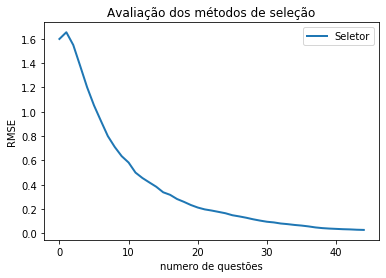

a-Stratified b-Blocking Selector
99993
5784.89408493042


In [35]:
base_result = 'Result_AStratBBlockSelector_theta_orig_100000.txt'

selector = AStratBBlockSelector(45)

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

aluno: 0
aluno: 1
aluno: 2
aluno: 3
aluno: 4
aluno: 5
aluno: 6
aluno: 7
aluno: 8
aluno: 9
aluno: 10
aluno: 11
aluno: 12
aluno: 13
aluno: 14
aluno: 15
aluno: 16
aluno: 17
aluno: 18
aluno: 19
aluno: 20
aluno: 21
aluno: 22
aluno: 23
aluno: 24
aluno: 25
aluno: 26
aluno: 27
aluno: 28
aluno: 29
aluno: 30
aluno: 31
aluno: 32
aluno: 33
aluno: 34
aluno: 35
aluno: 36
aluno: 37
aluno: 38
aluno: 39
aluno: 40
aluno: 41
aluno: 42
aluno: 43
aluno: 44
aluno: 45
aluno: 46
aluno: 47
aluno: 48
aluno: 49
aluno: 50
aluno: 51
aluno: 52
aluno: 53
aluno: 54
aluno: 55
aluno: 56
aluno: 57
aluno: 58
aluno: 59
aluno: 60
aluno: 61
aluno: 62
aluno: 63
aluno: 64
aluno: 65
aluno: 66
aluno: 67
aluno: 68
aluno: 69
aluno: 70
aluno: 71
aluno: 72
aluno: 73
aluno: 74
aluno: 75
aluno: 76
aluno: 77
aluno: 78
aluno: 79
aluno: 80
aluno: 81
aluno: 82
aluno: 83
aluno: 84
aluno: 85
aluno: 86
aluno: 87
aluno: 88
aluno: 89
aluno: 90
aluno: 91
aluno: 92
aluno: 93
aluno: 94
aluno: 95
aluno: 96
aluno: 97
aluno: 98
aluno: 99
aluno: 100

aluno: 756
aluno: 757
aluno: 758
aluno: 759
aluno: 760
aluno: 761
aluno: 762
aluno: 763
aluno: 764
aluno: 765
aluno: 766
aluno: 767
aluno: 768
aluno: 769
aluno: 770
aluno: 771
aluno: 772
aluno: 773
aluno: 774
aluno: 775
aluno: 776
aluno: 777
aluno: 778
aluno: 779
aluno: 780
aluno: 781
aluno: 782
aluno: 783
aluno: 784
aluno: 785
aluno: 786
aluno: 787
aluno: 788
aluno: 789
aluno: 790
aluno: 791
aluno: 792
aluno: 793
aluno: 794
aluno: 795
aluno: 796
aluno: 797
aluno: 798
aluno: 799
aluno: 800
aluno: 801
aluno: 802
aluno: 803
aluno: 804
aluno: 805
aluno: 806
aluno: 807
aluno: 808
aluno: 809
aluno: 810
aluno: 811
aluno: 812
aluno: 813
aluno: 814
aluno: 815
aluno: 816
aluno: 817
aluno: 818
aluno: 819
aluno: 820
aluno: 821
aluno: 822
aluno: 823
aluno: 824
aluno: 825
aluno: 826
aluno: 827
aluno: 828
aluno: 829
aluno: 830
aluno: 831
aluno: 832
aluno: 833
aluno: 834
aluno: 835
aluno: 836
aluno: 837
aluno: 838
aluno: 839
aluno: 840
aluno: 841
aluno: 842
aluno: 843
aluno: 844
aluno: 845
aluno: 846

aluno: 1461
aluno: 1462
aluno: 1463
aluno: 1464
aluno: 1465
aluno: 1466
aluno: 1467
aluno: 1468
aluno: 1469
aluno: 1470
aluno: 1471
aluno: 1472
aluno: 1473
aluno: 1474
aluno: 1475
aluno: 1476
aluno: 1477
aluno: 1478
aluno: 1479
aluno: 1480
aluno: 1481
aluno: 1482
aluno: 1483
aluno: 1484
aluno: 1485
aluno: 1486
aluno: 1487
aluno: 1488
aluno: 1489
aluno: 1490
aluno: 1491
aluno: 1492
aluno: 1493
aluno: 1494
aluno: 1495
aluno: 1496
aluno: 1497
aluno: 1498
aluno: 1499
aluno: 1500
aluno: 1501
aluno: 1502
aluno: 1503
aluno: 1504
aluno: 1505
aluno: 1506
aluno: 1507
aluno: 1508
aluno: 1509
aluno: 1510
aluno: 1511
aluno: 1512
aluno: 1513
aluno: 1514
aluno: 1515
aluno: 1516
aluno: 1517
aluno: 1518
aluno: 1519
aluno: 1520
aluno: 1521
aluno: 1522
aluno: 1523
aluno: 1524
aluno: 1525
aluno: 1526
aluno: 1527
aluno: 1528
aluno: 1529
aluno: 1530
aluno: 1531
aluno: 1532
aluno: 1533
aluno: 1534
aluno: 1535
aluno: 1536
aluno: 1537
aluno: 1538
aluno: 1539
aluno: 1540
aluno: 1541
aluno: 1542
aluno: 1543
alun

aluno: 2144
aluno: 2145
aluno: 2146
aluno: 2147
aluno: 2148
aluno: 2149
aluno: 2150
aluno: 2151
aluno: 2152
aluno: 2153
aluno: 2154
aluno: 2155
aluno: 2156
aluno: 2157
aluno: 2158
aluno: 2159
aluno: 2160
aluno: 2161
aluno: 2162
aluno: 2163
aluno: 2164
aluno: 2165
aluno: 2166
aluno: 2167
aluno: 2168
aluno: 2169
aluno: 2170
aluno: 2171
aluno: 2172
aluno: 2173
aluno: 2174
aluno: 2175
aluno: 2176
aluno: 2177
aluno: 2178
aluno: 2179
aluno: 2180
aluno: 2181
aluno: 2182
aluno: 2183
aluno: 2184
aluno: 2185
aluno: 2186
aluno: 2187
aluno: 2188
aluno: 2189
aluno: 2190
aluno: 2191
aluno: 2192
aluno: 2193
aluno: 2194
aluno: 2195
aluno: 2196
aluno: 2197
aluno: 2198
aluno: 2199
aluno: 2200
aluno: 2201
aluno: 2202
aluno: 2203
aluno: 2204
aluno: 2205
aluno: 2206
aluno: 2207
aluno: 2208
aluno: 2209
aluno: 2210
aluno: 2211
aluno: 2212
aluno: 2213
aluno: 2214
aluno: 2215
aluno: 2216
aluno: 2217
aluno: 2218
aluno: 2219
aluno: 2220
aluno: 2221
aluno: 2222
aluno: 2223
aluno: 2224
aluno: 2225
aluno: 2226
alun

aluno: 2828
aluno: 2829
aluno: 2830
aluno: 2831
aluno: 2832
aluno: 2833
aluno: 2834
aluno: 2835
aluno: 2836
aluno: 2837
aluno: 2838
aluno: 2839
aluno: 2840
aluno: 2841
aluno: 2842
aluno: 2843
aluno: 2844
aluno: 2845
aluno: 2846
aluno: 2847
aluno: 2848
aluno: 2849
aluno: 2850
aluno: 2851
aluno: 2852
aluno: 2853
aluno: 2854
aluno: 2855
aluno: 2856
aluno: 2857
aluno: 2858
aluno: 2859
aluno: 2860
aluno: 2861
aluno: 2862
aluno: 2863
aluno: 2864
aluno: 2865
aluno: 2866
aluno: 2867
aluno: 2868
aluno: 2869
aluno: 2870
aluno: 2871
aluno: 2872
aluno: 2873
aluno: 2874
aluno: 2875
aluno: 2876
aluno: 2877
aluno: 2878
aluno: 2879
aluno: 2880
aluno: 2881
aluno: 2882
aluno: 2883
aluno: 2884
aluno: 2885
aluno: 2886
aluno: 2887
aluno: 2888
aluno: 2889
aluno: 2890
aluno: 2891
aluno: 2892
aluno: 2893
aluno: 2894
aluno: 2895
aluno: 2896
aluno: 2897
aluno: 2898
aluno: 2899
aluno: 2900
aluno: 2901
aluno: 2902
aluno: 2903
aluno: 2904
aluno: 2905
aluno: 2906
aluno: 2907
aluno: 2908
aluno: 2909
aluno: 2910
alun

aluno: 3512
aluno: 3513
aluno: 3514
aluno: 3515
aluno: 3516
aluno: 3517
aluno: 3518
aluno: 3519
aluno: 3520
aluno: 3521
aluno: 3522
aluno: 3523
aluno: 3524
aluno: 3525
aluno: 3526
aluno: 3527
aluno: 3528
aluno: 3529
aluno: 3530
aluno: 3531
aluno: 3532
aluno: 3533
aluno: 3534
aluno: 3535
aluno: 3536
aluno: 3537
aluno: 3538
aluno: 3539
aluno: 3540
aluno: 3541
aluno: 3542
aluno: 3543
aluno: 3544
aluno: 3545
aluno: 3546
aluno: 3547
aluno: 3548
aluno: 3549
aluno: 3550
aluno: 3551
aluno: 3552
aluno: 3553
aluno: 3554
aluno: 3555
aluno: 3556
aluno: 3557
aluno: 3558
aluno: 3559
aluno: 3560
aluno: 3561
aluno: 3562
aluno: 3563
aluno: 3564
aluno: 3565
aluno: 3566
aluno: 3567
aluno: 3568
aluno: 3569
aluno: 3570
aluno: 3571
aluno: 3572
aluno: 3573
aluno: 3574
aluno: 3575
aluno: 3576
aluno: 3577
aluno: 3578
aluno: 3579
aluno: 3580
aluno: 3581
aluno: 3582
aluno: 3583
aluno: 3584
aluno: 3585
aluno: 3586
aluno: 3587
aluno: 3588
aluno: 3589
aluno: 3590
aluno: 3591
aluno: 3592
aluno: 3593
aluno: 3594
alun

aluno: 4196
aluno: 4197
aluno: 4198
aluno: 4199
aluno: 4200
aluno: 4201
aluno: 4202
aluno: 4203
aluno: 4204
aluno: 4205
aluno: 4206
aluno: 4207
aluno: 4208
aluno: 4209
aluno: 4210
aluno: 4211
aluno: 4212
aluno: 4213
aluno: 4214
aluno: 4215
aluno: 4216
aluno: 4217
aluno: 4218
aluno: 4219
aluno: 4220
aluno: 4221
aluno: 4222
aluno: 4223
aluno: 4224
aluno: 4225
aluno: 4226
aluno: 4227
aluno: 4228
aluno: 4229
aluno: 4230
aluno: 4231
aluno: 4232
aluno: 4233
aluno: 4234
aluno: 4235
aluno: 4236
aluno: 4237
aluno: 4238
aluno: 4239
aluno: 4240
aluno: 4241
aluno: 4242
aluno: 4243
aluno: 4244
aluno: 4245
aluno: 4246
aluno: 4247
aluno: 4248
aluno: 4249
aluno: 4250
aluno: 4251
aluno: 4252
aluno: 4253
aluno: 4254
aluno: 4255
aluno: 4256
aluno: 4257
aluno: 4258
aluno: 4259
aluno: 4260
aluno: 4261
aluno: 4262
aluno: 4263
aluno: 4264
aluno: 4265
aluno: 4266
aluno: 4267
aluno: 4268
aluno: 4269
aluno: 4270
aluno: 4271
aluno: 4272
aluno: 4273
aluno: 4274
aluno: 4275
aluno: 4276
aluno: 4277
aluno: 4278
alun

aluno: 4879
aluno: 4880
aluno: 4881
aluno: 4882
aluno: 4883
aluno: 4884
aluno: 4885
aluno: 4886
aluno: 4887
aluno: 4888
aluno: 4889
aluno: 4890
aluno: 4891
aluno: 4892
aluno: 4893
aluno: 4894
aluno: 4895
aluno: 4896
aluno: 4897
aluno: 4898
aluno: 4899
aluno: 4900
aluno: 4901
aluno: 4902
aluno: 4903
aluno: 4904
aluno: 4905
aluno: 4906
aluno: 4907
aluno: 4908
aluno: 4909
aluno: 4910
aluno: 4911
aluno: 4912
aluno: 4913
aluno: 4914
aluno: 4915
aluno: 4916
aluno: 4917
aluno: 4918
aluno: 4919
aluno: 4920
aluno: 4921
aluno: 4922
aluno: 4923
aluno: 4924
aluno: 4925
aluno: 4926
aluno: 4927
aluno: 4928
aluno: 4929
aluno: 4930
aluno: 4931
aluno: 4932
aluno: 4933
aluno: 4934
aluno: 4935
aluno: 4936
aluno: 4937
aluno: 4938
aluno: 4939
aluno: 4940
aluno: 4941
aluno: 4942
aluno: 4943
aluno: 4944
aluno: 4945
aluno: 4946
aluno: 4947
aluno: 4948
aluno: 4949
aluno: 4950
aluno: 4951
aluno: 4952
aluno: 4953
aluno: 4954
aluno: 4955
aluno: 4956
aluno: 4957
aluno: 4958
aluno: 4959
aluno: 4960
aluno: 4961
alun

aluno: 5562
aluno: 5563
aluno: 5564
aluno: 5565
aluno: 5566
aluno: 5567
aluno: 5568
aluno: 5569
aluno: 5570
aluno: 5571
aluno: 5572
aluno: 5573
aluno: 5574
aluno: 5575
aluno: 5576
aluno: 5577
aluno: 5578
aluno: 5579
aluno: 5580
aluno: 5581
aluno: 5582
aluno: 5583
aluno: 5584
aluno: 5585
aluno: 5586
aluno: 5587
aluno: 5588
aluno: 5589
aluno: 5590
aluno: 5591
aluno: 5592
aluno: 5593
aluno: 5594
aluno: 5595
aluno: 5596
aluno: 5597
aluno: 5598
aluno: 5599
aluno: 5600
aluno: 5601
aluno: 5602
aluno: 5603
aluno: 5604
aluno: 5605
aluno: 5606
aluno: 5607
aluno: 5608
aluno: 5609
aluno: 5610
aluno: 5611
aluno: 5612
aluno: 5613
aluno: 5614
aluno: 5615
aluno: 5616
aluno: 5617
aluno: 5618
aluno: 5619
aluno: 5620
aluno: 5621
aluno: 5622
aluno: 5623
aluno: 5624
aluno: 5625
aluno: 5626
aluno: 5627
aluno: 5628
aluno: 5629
aluno: 5630
aluno: 5631
aluno: 5632
aluno: 5633
aluno: 5634
aluno: 5635
aluno: 5636
aluno: 5637
aluno: 5638
aluno: 5639
aluno: 5640
aluno: 5641
aluno: 5642
aluno: 5643
aluno: 5644
alun

aluno: 6246
aluno: 6247
aluno: 6248
aluno: 6249
aluno: 6250
aluno: 6251
aluno: 6252
aluno: 6253
aluno: 6254
aluno: 6255
aluno: 6256
aluno: 6257
aluno: 6258
aluno: 6259
aluno: 6260
aluno: 6261
aluno: 6262
aluno: 6263
aluno: 6264
aluno: 6265
aluno: 6266
aluno: 6267
aluno: 6268
aluno: 6269
aluno: 6270
aluno: 6271
aluno: 6272
aluno: 6273
aluno: 6274
aluno: 6275
aluno: 6276
aluno: 6277
aluno: 6278
aluno: 6279
aluno: 6280
aluno: 6281
aluno: 6282
aluno: 6283
aluno: 6284
aluno: 6285
aluno: 6286
aluno: 6287
aluno: 6288
aluno: 6289
aluno: 6290
aluno: 6291
aluno: 6292
aluno: 6293
aluno: 6294
aluno: 6295
aluno: 6296
aluno: 6297
aluno: 6298
aluno: 6299
aluno: 6300
aluno: 6301
aluno: 6302
aluno: 6303
aluno: 6304
aluno: 6305
aluno: 6306
aluno: 6307
aluno: 6308
aluno: 6309
aluno: 6310
aluno: 6311
aluno: 6312
aluno: 6313
aluno: 6314
aluno: 6315
aluno: 6316
aluno: 6317
aluno: 6318
aluno: 6319
aluno: 6320
aluno: 6321
aluno: 6322
aluno: 6323
aluno: 6324
aluno: 6325
aluno: 6326
aluno: 6327
aluno: 6328
alun

aluno: 6930
aluno: 6931
aluno: 6932
aluno: 6933
aluno: 6934
aluno: 6935
aluno: 6936
aluno: 6937
aluno: 6938
aluno: 6939
aluno: 6940
aluno: 6941
aluno: 6942
aluno: 6943
aluno: 6944
aluno: 6945
aluno: 6946
aluno: 6947
aluno: 6948
aluno: 6949
aluno: 6950
aluno: 6951
aluno: 6952
aluno: 6953
aluno: 6954
aluno: 6955
aluno: 6956
aluno: 6957
aluno: 6958
aluno: 6959
aluno: 6960
aluno: 6961
aluno: 6962
aluno: 6963
aluno: 6964
aluno: 6965
aluno: 6966
aluno: 6967
aluno: 6968
aluno: 6969
aluno: 6970
aluno: 6971
aluno: 6972
aluno: 6973
aluno: 6974
aluno: 6975
aluno: 6976
aluno: 6977
aluno: 6978
aluno: 6979
aluno: 6980
aluno: 6981
aluno: 6982
aluno: 6983
aluno: 6984
aluno: 6985
aluno: 6986
aluno: 6987
aluno: 6988
aluno: 6989
aluno: 6990
aluno: 6991
aluno: 6992
aluno: 6993
aluno: 6994
aluno: 6995
aluno: 6996
aluno: 6997
aluno: 6998
aluno: 6999
aluno: 7000
aluno: 7001
aluno: 7002
aluno: 7003
aluno: 7004
aluno: 7005
aluno: 7006
aluno: 7007
aluno: 7008
aluno: 7009
aluno: 7010
aluno: 7011
aluno: 7012
alun

aluno: 7614
aluno: 7615
aluno: 7616
aluno: 7617
aluno: 7618
aluno: 7619
aluno: 7620
aluno: 7621
aluno: 7622
aluno: 7623
aluno: 7624
aluno: 7625
aluno: 7626
aluno: 7627
aluno: 7628
aluno: 7629
aluno: 7630
aluno: 7631
aluno: 7632
aluno: 7633
aluno: 7634
aluno: 7635
aluno: 7636
aluno: 7637
aluno: 7638
aluno: 7639
aluno: 7640
aluno: 7641
aluno: 7642
aluno: 7643
aluno: 7644
aluno: 7645
aluno: 7646
aluno: 7647
aluno: 7648
aluno: 7649
aluno: 7650
aluno: 7651
aluno: 7652
aluno: 7653
aluno: 7654
aluno: 7655
aluno: 7656
aluno: 7657
aluno: 7658
aluno: 7659
aluno: 7660
aluno: 7661
aluno: 7662
aluno: 7663
aluno: 7664
aluno: 7665
aluno: 7666
aluno: 7667
aluno: 7668
aluno: 7669
aluno: 7670
aluno: 7671
aluno: 7672
aluno: 7673
aluno: 7674
aluno: 7675
aluno: 7676
aluno: 7677
aluno: 7678
aluno: 7679
aluno: 7680
aluno: 7681
aluno: 7682
aluno: 7683
aluno: 7684
aluno: 7685
aluno: 7686
aluno: 7687
aluno: 7688
aluno: 7689
aluno: 7690
aluno: 7691
aluno: 7692
aluno: 7693
aluno: 7694
aluno: 7695
aluno: 7696
alun

aluno: 8297
aluno: 8298
aluno: 8299
aluno: 8300
aluno: 8301
aluno: 8302
aluno: 8303
aluno: 8304
aluno: 8305
aluno: 8306
aluno: 8307
aluno: 8308
aluno: 8309
aluno: 8310
aluno: 8311
aluno: 8312
aluno: 8313
aluno: 8314
aluno: 8315
aluno: 8316
aluno: 8317
aluno: 8318
aluno: 8319
aluno: 8320
aluno: 8321
aluno: 8322
aluno: 8323
aluno: 8324
aluno: 8325
aluno: 8326
aluno: 8327
aluno: 8328
aluno: 8329
aluno: 8330
aluno: 8331
aluno: 8332
aluno: 8333
aluno: 8334
aluno: 8335
aluno: 8336
aluno: 8337
aluno: 8338
aluno: 8339
aluno: 8340
aluno: 8341
aluno: 8342
aluno: 8343
aluno: 8344
aluno: 8345
aluno: 8346
aluno: 8347
aluno: 8348
aluno: 8349
aluno: 8350
aluno: 8351
aluno: 8352
aluno: 8353
aluno: 8354
aluno: 8355
aluno: 8356
aluno: 8357
aluno: 8358
aluno: 8359
aluno: 8360
aluno: 8361
aluno: 8362
aluno: 8363
aluno: 8364
aluno: 8365
aluno: 8366
aluno: 8367
aluno: 8368
aluno: 8369
aluno: 8370
aluno: 8371
aluno: 8372
aluno: 8373
aluno: 8374
aluno: 8375
aluno: 8376
aluno: 8377
aluno: 8378
aluno: 8379
alun

aluno: 8981
aluno: 8982
aluno: 8983
aluno: 8984
aluno: 8985
aluno: 8986
aluno: 8987
aluno: 8988
aluno: 8989
aluno: 8990
aluno: 8991
aluno: 8992
aluno: 8993
aluno: 8994
aluno: 8995
aluno: 8996
aluno: 8997
aluno: 8998
aluno: 8999
aluno: 9000
aluno: 9001
aluno: 9002
aluno: 9003
aluno: 9004
aluno: 9005
aluno: 9006
aluno: 9007
aluno: 9008
aluno: 9009
aluno: 9010
aluno: 9011
aluno: 9012
aluno: 9013
aluno: 9014
aluno: 9015
aluno: 9016
aluno: 9017
aluno: 9018
aluno: 9019
aluno: 9020
aluno: 9021
aluno: 9022
aluno: 9023
aluno: 9024
aluno: 9025
aluno: 9026
aluno: 9027
aluno: 9028
aluno: 9029
aluno: 9030
aluno: 9031
aluno: 9032
aluno: 9033
aluno: 9034
aluno: 9035
aluno: 9036
aluno: 9037
aluno: 9038
aluno: 9039
aluno: 9040
aluno: 9041
aluno: 9042
aluno: 9043
aluno: 9044
aluno: 9045
aluno: 9046
aluno: 9047
aluno: 9048
aluno: 9049
aluno: 9050
aluno: 9051
aluno: 9052
aluno: 9053
aluno: 9054
aluno: 9055
aluno: 9056
aluno: 9057
aluno: 9058
aluno: 9059
aluno: 9060
aluno: 9061
aluno: 9062
aluno: 9063
alun

aluno: 9665
aluno: 9666
aluno: 9667
aluno: 9668
aluno: 9669
aluno: 9670
aluno: 9671
aluno: 9672
aluno: 9673
aluno: 9674
aluno: 9675
aluno: 9676
aluno: 9677
aluno: 9678
aluno: 9679
aluno: 9680
aluno: 9681
aluno: 9682
aluno: 9683
aluno: 9684
aluno: 9685
aluno: 9686
aluno: 9687
aluno: 9688
aluno: 9689
aluno: 9690
aluno: 9691
aluno: 9692
aluno: 9693
aluno: 9694
aluno: 9695
aluno: 9696
aluno: 9697
aluno: 9698
aluno: 9699
aluno: 9700
aluno: 9701
aluno: 9702
aluno: 9703
aluno: 9704
aluno: 9705
aluno: 9706
aluno: 9707
aluno: 9708
aluno: 9709
aluno: 9710
aluno: 9711
aluno: 9712
aluno: 9713
aluno: 9714
aluno: 9715
aluno: 9716
aluno: 9717
aluno: 9718
aluno: 9719
aluno: 9720
aluno: 9721
aluno: 9722
aluno: 9723
aluno: 9724
aluno: 9725
aluno: 9726
aluno: 9727
aluno: 9728
aluno: 9729
aluno: 9730
aluno: 9731
aluno: 9732
aluno: 9733
aluno: 9734
aluno: 9735
aluno: 9736
aluno: 9737
aluno: 9738
aluno: 9739
aluno: 9740
aluno: 9741
aluno: 9742
aluno: 9743
aluno: 9744
aluno: 9745
aluno: 9746
aluno: 9747
alun

aluno: 10321
aluno: 10322
aluno: 10323
aluno: 10324
aluno: 10325
aluno: 10326
aluno: 10327
aluno: 10328
aluno: 10329
aluno: 10330
aluno: 10331
aluno: 10332
aluno: 10333
aluno: 10334
aluno: 10335
aluno: 10336
aluno: 10337
aluno: 10338
aluno: 10339
aluno: 10340
aluno: 10341
aluno: 10342
aluno: 10343
aluno: 10344
aluno: 10345
aluno: 10346
aluno: 10347
aluno: 10348
aluno: 10349
aluno: 10350
aluno: 10351
aluno: 10352
aluno: 10353
aluno: 10354
aluno: 10355
aluno: 10356
aluno: 10357
aluno: 10358
aluno: 10359
aluno: 10360
aluno: 10361
aluno: 10362
aluno: 10363
aluno: 10364
aluno: 10365
aluno: 10366
aluno: 10367
aluno: 10368
aluno: 10369
aluno: 10370
aluno: 10371
aluno: 10372
aluno: 10373
aluno: 10374
aluno: 10375
aluno: 10376
aluno: 10377
aluno: 10378
aluno: 10379
aluno: 10380
aluno: 10381
aluno: 10382
aluno: 10383
aluno: 10384
aluno: 10385
aluno: 10386
aluno: 10387
aluno: 10388
aluno: 10389
aluno: 10390
aluno: 10391
aluno: 10392
aluno: 10393
aluno: 10394
aluno: 10395
aluno: 10396
aluno: 10397

aluno: 10953
aluno: 10954
aluno: 10955
aluno: 10956
aluno: 10957
aluno: 10958
aluno: 10959
aluno: 10960
aluno: 10961
aluno: 10962
aluno: 10963
aluno: 10964
aluno: 10965
aluno: 10966
aluno: 10967
aluno: 10968
aluno: 10969
aluno: 10970
aluno: 10971
aluno: 10972
aluno: 10973
aluno: 10974
aluno: 10975
aluno: 10976
aluno: 10977
aluno: 10978
aluno: 10979
aluno: 10980
aluno: 10981
aluno: 10982
aluno: 10983
aluno: 10984
aluno: 10985
aluno: 10986
aluno: 10987
aluno: 10988
aluno: 10989
aluno: 10990
aluno: 10991
aluno: 10992
aluno: 10993
aluno: 10994
aluno: 10995
aluno: 10996
aluno: 10997
aluno: 10998
aluno: 10999
aluno: 11000
aluno: 11001
aluno: 11002
aluno: 11003
aluno: 11004
aluno: 11005
aluno: 11006
aluno: 11007
aluno: 11008
aluno: 11009
aluno: 11010
aluno: 11011
aluno: 11012
aluno: 11013
aluno: 11014
aluno: 11015
aluno: 11016
aluno: 11017
aluno: 11018
aluno: 11019
aluno: 11020
aluno: 11021
aluno: 11022
aluno: 11023
aluno: 11024
aluno: 11025
aluno: 11026
aluno: 11027
aluno: 11028
aluno: 11029

aluno: 11584
aluno: 11585
aluno: 11586
aluno: 11587
aluno: 11588
aluno: 11589
aluno: 11590
aluno: 11591
aluno: 11592
aluno: 11593
aluno: 11594
aluno: 11595
aluno: 11596
aluno: 11597
aluno: 11598
aluno: 11599
aluno: 11600
aluno: 11601
aluno: 11602
aluno: 11603
aluno: 11604
aluno: 11605
aluno: 11606
aluno: 11607
aluno: 11608
aluno: 11609
aluno: 11610
aluno: 11611
aluno: 11612
aluno: 11613
aluno: 11614
aluno: 11615
aluno: 11616
aluno: 11617
aluno: 11618
aluno: 11619
aluno: 11620
aluno: 11621
aluno: 11622
aluno: 11623
aluno: 11624
aluno: 11625
aluno: 11626
aluno: 11627
aluno: 11628
aluno: 11629
aluno: 11630
aluno: 11631
aluno: 11632
aluno: 11633
aluno: 11634
aluno: 11635
aluno: 11636
aluno: 11637
aluno: 11638
aluno: 11639
aluno: 11640
aluno: 11641
aluno: 11642
aluno: 11643
aluno: 11644
aluno: 11645
aluno: 11646
aluno: 11647
aluno: 11648
aluno: 11649
aluno: 11650
aluno: 11651
aluno: 11652
aluno: 11653
aluno: 11654
aluno: 11655
aluno: 11656
aluno: 11657
aluno: 11658
aluno: 11659
aluno: 11660

aluno: 12215
aluno: 12216
aluno: 12217
aluno: 12218
aluno: 12219
aluno: 12220
aluno: 12221
aluno: 12222
aluno: 12223
aluno: 12224
aluno: 12225
aluno: 12226
aluno: 12227
aluno: 12228
aluno: 12229
aluno: 12230
aluno: 12231
aluno: 12232
aluno: 12233
aluno: 12234
aluno: 12235
aluno: 12236
aluno: 12237
aluno: 12238
aluno: 12239
aluno: 12240
aluno: 12241
aluno: 12242
aluno: 12243
aluno: 12244
aluno: 12245
aluno: 12246
aluno: 12247
aluno: 12248
aluno: 12249
aluno: 12250
aluno: 12251
aluno: 12252
aluno: 12253
aluno: 12254
aluno: 12255
aluno: 12256
aluno: 12257
aluno: 12258
aluno: 12259
aluno: 12260
aluno: 12261
aluno: 12262
aluno: 12263
aluno: 12264
aluno: 12265
aluno: 12266
aluno: 12267
aluno: 12268
aluno: 12269
aluno: 12270
aluno: 12271
aluno: 12272
aluno: 12273
aluno: 12274
aluno: 12275
aluno: 12276
aluno: 12277
aluno: 12278
aluno: 12279
aluno: 12280
aluno: 12281
aluno: 12282
aluno: 12283
aluno: 12284
aluno: 12285
aluno: 12286
aluno: 12287
aluno: 12288
aluno: 12289
aluno: 12290
aluno: 12291

aluno: 12846
aluno: 12847
aluno: 12848
aluno: 12849
aluno: 12850
aluno: 12851
aluno: 12852
aluno: 12853
aluno: 12854
aluno: 12855
aluno: 12856
aluno: 12857
aluno: 12858
aluno: 12859
aluno: 12860
aluno: 12861
aluno: 12862
aluno: 12863
aluno: 12864
aluno: 12865
aluno: 12866
aluno: 12867
aluno: 12868
aluno: 12869
aluno: 12870
aluno: 12871
aluno: 12872
aluno: 12873
aluno: 12874
aluno: 12875
aluno: 12876
aluno: 12877
aluno: 12878
aluno: 12879
aluno: 12880
aluno: 12881
aluno: 12882
aluno: 12883
aluno: 12884
aluno: 12885
aluno: 12886
aluno: 12887
aluno: 12888
aluno: 12889
aluno: 12890
aluno: 12891
aluno: 12892
aluno: 12893
aluno: 12894
aluno: 12895
aluno: 12896
aluno: 12897
aluno: 12898
aluno: 12899
aluno: 12900
aluno: 12901
aluno: 12902
aluno: 12903
aluno: 12904
aluno: 12905
aluno: 12906
aluno: 12907
aluno: 12908
aluno: 12909
aluno: 12910
aluno: 12911
aluno: 12912
aluno: 12913
aluno: 12914
aluno: 12915
aluno: 12916
aluno: 12917
aluno: 12918
aluno: 12919
aluno: 12920
aluno: 12921
aluno: 12922

aluno: 13478
aluno: 13479
aluno: 13480
aluno: 13481
aluno: 13482
aluno: 13483
aluno: 13484
aluno: 13485
aluno: 13486
aluno: 13487
aluno: 13488
aluno: 13489
aluno: 13490
aluno: 13491
aluno: 13492
aluno: 13493
aluno: 13494
aluno: 13495
aluno: 13496
aluno: 13497
aluno: 13498
aluno: 13499
aluno: 13500
aluno: 13501
aluno: 13502
aluno: 13503
aluno: 13504
aluno: 13505
aluno: 13506
aluno: 13507
aluno: 13508
aluno: 13509
aluno: 13510
aluno: 13511
aluno: 13512
aluno: 13513
aluno: 13514
aluno: 13515
aluno: 13516
aluno: 13517
aluno: 13518
aluno: 13519
aluno: 13520
aluno: 13521
aluno: 13522
aluno: 13523
aluno: 13524
aluno: 13525
aluno: 13526
aluno: 13527
aluno: 13528
aluno: 13529
aluno: 13530
aluno: 13531
aluno: 13532
aluno: 13533
aluno: 13534
aluno: 13535
aluno: 13536
aluno: 13537
aluno: 13538
aluno: 13539
aluno: 13540
aluno: 13541
aluno: 13542
aluno: 13543
aluno: 13544
aluno: 13545
aluno: 13546
aluno: 13547
aluno: 13548
aluno: 13549
aluno: 13550
aluno: 13551
aluno: 13552
aluno: 13553
aluno: 13554

aluno: 14109
aluno: 14110
aluno: 14111
aluno: 14112
aluno: 14113
aluno: 14114
aluno: 14115
aluno: 14116
aluno: 14117
aluno: 14118
aluno: 14119
aluno: 14120
aluno: 14121
aluno: 14122
aluno: 14123
aluno: 14124
aluno: 14125
aluno: 14126
aluno: 14127
aluno: 14128
aluno: 14129
aluno: 14130
aluno: 14131
aluno: 14132
aluno: 14133
aluno: 14134
aluno: 14135
aluno: 14136
aluno: 14137
aluno: 14138
aluno: 14139
aluno: 14140
aluno: 14141
aluno: 14142
aluno: 14143
aluno: 14144
aluno: 14145
aluno: 14146
aluno: 14147
aluno: 14148
aluno: 14149
aluno: 14150
aluno: 14151
aluno: 14152
aluno: 14153
aluno: 14154
aluno: 14155
aluno: 14156
aluno: 14157
aluno: 14158
aluno: 14159
aluno: 14160
aluno: 14161
aluno: 14162
aluno: 14163
aluno: 14164
aluno: 14165
aluno: 14166
aluno: 14167
aluno: 14168
aluno: 14169
aluno: 14170
aluno: 14171
aluno: 14172
aluno: 14173
aluno: 14174
aluno: 14175
aluno: 14176
aluno: 14177
aluno: 14178
aluno: 14179
aluno: 14180
aluno: 14181
aluno: 14182
aluno: 14183
aluno: 14184
aluno: 14185

aluno: 14741
aluno: 14742
aluno: 14743
aluno: 14744
aluno: 14745
aluno: 14746
aluno: 14747
aluno: 14748
aluno: 14749
aluno: 14750
aluno: 14751
aluno: 14752
aluno: 14753
aluno: 14754
aluno: 14755
aluno: 14756
aluno: 14757
aluno: 14758
aluno: 14759
aluno: 14760
aluno: 14761
aluno: 14762
aluno: 14763
aluno: 14764
aluno: 14765
aluno: 14766
aluno: 14767
aluno: 14768
aluno: 14769
aluno: 14770
aluno: 14771
aluno: 14772
aluno: 14773
aluno: 14774
aluno: 14775
aluno: 14776
aluno: 14777
aluno: 14778
aluno: 14779
aluno: 14780
aluno: 14781
aluno: 14782
aluno: 14783
aluno: 14784
aluno: 14785
aluno: 14786
aluno: 14787
aluno: 14788
aluno: 14789
aluno: 14790
aluno: 14791
aluno: 14792
aluno: 14793
aluno: 14794
aluno: 14795
aluno: 14796
aluno: 14797
aluno: 14798
aluno: 14799
aluno: 14800
aluno: 14801
aluno: 14802
aluno: 14803
aluno: 14804
aluno: 14805
aluno: 14806
aluno: 14807
aluno: 14808
aluno: 14809
aluno: 14810
aluno: 14811
aluno: 14812
aluno: 14813
aluno: 14814
aluno: 14815
aluno: 14816
aluno: 14817

aluno: 15373
aluno: 15374
aluno: 15375
aluno: 15376
aluno: 15377
aluno: 15378
aluno: 15379
aluno: 15380
aluno: 15381
aluno: 15382
aluno: 15383
aluno: 15384
aluno: 15385
aluno: 15386
aluno: 15387
aluno: 15388
aluno: 15389
aluno: 15390
aluno: 15391
aluno: 15392
aluno: 15393
aluno: 15394
aluno: 15395
aluno: 15396
aluno: 15397
aluno: 15398
aluno: 15399
aluno: 15400
aluno: 15401
aluno: 15402
aluno: 15403
aluno: 15404
aluno: 15405
aluno: 15406
aluno: 15407
aluno: 15408
aluno: 15409
aluno: 15410
aluno: 15411
aluno: 15412
aluno: 15413
aluno: 15414
aluno: 15415
aluno: 15416
aluno: 15417
aluno: 15418
aluno: 15419
aluno: 15420
aluno: 15421
aluno: 15422
aluno: 15423
aluno: 15424
aluno: 15425
aluno: 15426
aluno: 15427
aluno: 15428
aluno: 15429
aluno: 15430
aluno: 15431
aluno: 15432
aluno: 15433
aluno: 15434
aluno: 15435
aluno: 15436
aluno: 15437
aluno: 15438
aluno: 15439
aluno: 15440
aluno: 15441
aluno: 15442
aluno: 15443
aluno: 15444
aluno: 15445
aluno: 15446
aluno: 15447
aluno: 15448
aluno: 15449

aluno: 16005
aluno: 16006
aluno: 16007
aluno: 16008
aluno: 16009
aluno: 16010
aluno: 16011
aluno: 16012
aluno: 16013
aluno: 16014
aluno: 16015
aluno: 16016
aluno: 16017
aluno: 16018
aluno: 16019
aluno: 16020
aluno: 16021
aluno: 16022
aluno: 16023
aluno: 16024
aluno: 16025
aluno: 16026
aluno: 16027
aluno: 16028
aluno: 16029
aluno: 16030
aluno: 16031
aluno: 16032
aluno: 16033
aluno: 16034
aluno: 16035
aluno: 16036
aluno: 16037
aluno: 16038
aluno: 16039
aluno: 16040
aluno: 16041
aluno: 16042
aluno: 16043
aluno: 16044
aluno: 16045
aluno: 16046
aluno: 16047
aluno: 16048
aluno: 16049
aluno: 16050
aluno: 16051
aluno: 16052
aluno: 16053
aluno: 16054
aluno: 16055
aluno: 16056
aluno: 16057
aluno: 16058
aluno: 16059
aluno: 16060
aluno: 16061
aluno: 16062
aluno: 16063
aluno: 16064
aluno: 16065
aluno: 16066
aluno: 16067
aluno: 16068
aluno: 16069
aluno: 16070
aluno: 16071
aluno: 16072
aluno: 16073
aluno: 16074
aluno: 16075
aluno: 16076
aluno: 16077
aluno: 16078
aluno: 16079
aluno: 16080
aluno: 16081

aluno: 16635
aluno: 16636
aluno: 16637
aluno: 16638
aluno: 16639
aluno: 16640
aluno: 16641
aluno: 16642
aluno: 16643
aluno: 16644
aluno: 16645
aluno: 16646
aluno: 16647
aluno: 16648
aluno: 16649
aluno: 16650
aluno: 16651
aluno: 16652
aluno: 16653
aluno: 16654
aluno: 16655
aluno: 16656
aluno: 16657
aluno: 16658
aluno: 16659
aluno: 16660
aluno: 16661
aluno: 16662
aluno: 16663
aluno: 16664
aluno: 16665
aluno: 16666
aluno: 16667
aluno: 16668
aluno: 16669
aluno: 16670
aluno: 16671
aluno: 16672
aluno: 16673
aluno: 16674
aluno: 16675
aluno: 16676
aluno: 16677
aluno: 16678
aluno: 16679
aluno: 16680
aluno: 16681
aluno: 16682
aluno: 16683
aluno: 16684
aluno: 16685
aluno: 16686
aluno: 16687
aluno: 16688
aluno: 16689
aluno: 16690
aluno: 16691
aluno: 16692
aluno: 16693
aluno: 16694
aluno: 16695
aluno: 16696
aluno: 16697
aluno: 16698
aluno: 16699
aluno: 16700
aluno: 16701
aluno: 16702
aluno: 16703
aluno: 16704
aluno: 16705
aluno: 16706
aluno: 16707
aluno: 16708
aluno: 16709
aluno: 16710
aluno: 16711

aluno: 17267
aluno: 17268
aluno: 17269
aluno: 17270
aluno: 17271
aluno: 17272
aluno: 17273
aluno: 17274
aluno: 17275
aluno: 17276
aluno: 17277
aluno: 17278
aluno: 17279
aluno: 17280
aluno: 17281
aluno: 17282
aluno: 17283
aluno: 17284
aluno: 17285
aluno: 17286
aluno: 17287
aluno: 17288
aluno: 17289
aluno: 17290
aluno: 17291
aluno: 17292
aluno: 17293
aluno: 17294
aluno: 17295
aluno: 17296
aluno: 17297
aluno: 17298
aluno: 17299
aluno: 17300
aluno: 17301
aluno: 17302
aluno: 17303
aluno: 17304
aluno: 17305
aluno: 17306
aluno: 17307
aluno: 17308
aluno: 17309
aluno: 17310
aluno: 17311
aluno: 17312
aluno: 17313
aluno: 17314
aluno: 17315
aluno: 17316
aluno: 17317
aluno: 17318
aluno: 17319
aluno: 17320
aluno: 17321
aluno: 17322
aluno: 17323
aluno: 17324
aluno: 17325
aluno: 17326
aluno: 17327
aluno: 17328
aluno: 17329
aluno: 17330
aluno: 17331
aluno: 17332
aluno: 17333
aluno: 17334
aluno: 17335
aluno: 17336
aluno: 17337
aluno: 17338
aluno: 17339
aluno: 17340
aluno: 17341
aluno: 17342
aluno: 17343

aluno: 17899
aluno: 17900
aluno: 17901
aluno: 17902
aluno: 17903
aluno: 17904
aluno: 17905
aluno: 17906
aluno: 17907
aluno: 17908
aluno: 17909
aluno: 17910
aluno: 17911
aluno: 17912
aluno: 17913
aluno: 17914
aluno: 17915
aluno: 17916
aluno: 17917
aluno: 17918
aluno: 17919
aluno: 17920
aluno: 17921
aluno: 17922
aluno: 17923
aluno: 17924
aluno: 17925
aluno: 17926
aluno: 17927
aluno: 17928
aluno: 17929
aluno: 17930
aluno: 17931
aluno: 17932
aluno: 17933
aluno: 17934
aluno: 17935
aluno: 17936
aluno: 17937
aluno: 17938
aluno: 17939
aluno: 17940
aluno: 17941
aluno: 17942
aluno: 17943
aluno: 17944
aluno: 17945
aluno: 17946
aluno: 17947
aluno: 17948
aluno: 17949
aluno: 17950
aluno: 17951
aluno: 17952
aluno: 17953
aluno: 17954
aluno: 17955
aluno: 17956
aluno: 17957
aluno: 17958
aluno: 17959
aluno: 17960
aluno: 17961
aluno: 17962
aluno: 17963
aluno: 17964
aluno: 17965
aluno: 17966
aluno: 17967
aluno: 17968
aluno: 17969
aluno: 17970
aluno: 17971
aluno: 17972
aluno: 17973
aluno: 17974
aluno: 17975

aluno: 18531
aluno: 18532
aluno: 18533
aluno: 18534
aluno: 18535
aluno: 18536
aluno: 18537
aluno: 18538
aluno: 18539
aluno: 18540
aluno: 18541
aluno: 18542
aluno: 18543
aluno: 18544
aluno: 18545
aluno: 18546
aluno: 18547
aluno: 18548
aluno: 18549
aluno: 18550
aluno: 18551
aluno: 18552
aluno: 18553
aluno: 18554
aluno: 18555
aluno: 18556
aluno: 18557
aluno: 18558
aluno: 18559
aluno: 18560
aluno: 18561
aluno: 18562
aluno: 18563
aluno: 18564
aluno: 18565
aluno: 18566
aluno: 18567
aluno: 18568
aluno: 18569
aluno: 18570
aluno: 18571
aluno: 18572
aluno: 18573
aluno: 18574
aluno: 18575
aluno: 18576
aluno: 18577
aluno: 18578
aluno: 18579
aluno: 18580
aluno: 18581
aluno: 18582
aluno: 18583
aluno: 18584
aluno: 18585
aluno: 18586
aluno: 18587
aluno: 18588
aluno: 18589
aluno: 18590
aluno: 18591
aluno: 18592
aluno: 18593
aluno: 18594
aluno: 18595
aluno: 18596
aluno: 18597
aluno: 18598
aluno: 18599
aluno: 18600
aluno: 18601
aluno: 18602
aluno: 18603
aluno: 18604
aluno: 18605
aluno: 18606
aluno: 18607

aluno: 19163
aluno: 19164
aluno: 19165
aluno: 19166
aluno: 19167
aluno: 19168
aluno: 19169
aluno: 19170
aluno: 19171
aluno: 19172
aluno: 19173
aluno: 19174
aluno: 19175
aluno: 19176
aluno: 19177
aluno: 19178
aluno: 19179
aluno: 19180
aluno: 19181
aluno: 19182
aluno: 19183
aluno: 19184
aluno: 19185
aluno: 19186
aluno: 19187
aluno: 19188
aluno: 19189
aluno: 19190
aluno: 19191
aluno: 19192
aluno: 19193
aluno: 19194
aluno: 19195
aluno: 19196
aluno: 19197
aluno: 19198
aluno: 19199
aluno: 19200
aluno: 19201
aluno: 19202
aluno: 19203
aluno: 19204
aluno: 19205
aluno: 19206
aluno: 19207
aluno: 19208
aluno: 19209
aluno: 19210
aluno: 19211
aluno: 19212
aluno: 19213
aluno: 19214
aluno: 19215
aluno: 19216
aluno: 19217
aluno: 19218
aluno: 19219
aluno: 19220
aluno: 19221
aluno: 19222
aluno: 19223
aluno: 19224
aluno: 19225
aluno: 19226
aluno: 19227
aluno: 19228
aluno: 19229
aluno: 19230
aluno: 19231
aluno: 19232
aluno: 19233
aluno: 19234
aluno: 19235
aluno: 19236
aluno: 19237
aluno: 19238
aluno: 19239

aluno: 19795
aluno: 19796
aluno: 19797
aluno: 19798
aluno: 19799
aluno: 19800
aluno: 19801
aluno: 19802
aluno: 19803
aluno: 19804
aluno: 19805
aluno: 19806
aluno: 19807
aluno: 19808
aluno: 19809
aluno: 19810
aluno: 19811
aluno: 19812
aluno: 19813
aluno: 19814
aluno: 19815
aluno: 19816
aluno: 19817
aluno: 19818
aluno: 19819
aluno: 19820
aluno: 19821
aluno: 19822
aluno: 19823
aluno: 19824
aluno: 19825
aluno: 19826
aluno: 19827
aluno: 19828
aluno: 19829
aluno: 19830
aluno: 19831
aluno: 19832
aluno: 19833
aluno: 19834
aluno: 19835
aluno: 19836
aluno: 19837
aluno: 19838
aluno: 19839
aluno: 19840
aluno: 19841
aluno: 19842
aluno: 19843
aluno: 19844
aluno: 19845
aluno: 19846
aluno: 19847
aluno: 19848
aluno: 19849
aluno: 19850
aluno: 19851
aluno: 19852
aluno: 19853
aluno: 19854
aluno: 19855
aluno: 19856
aluno: 19857
aluno: 19858
aluno: 19859
aluno: 19860
aluno: 19861
aluno: 19862
aluno: 19863
aluno: 19864
aluno: 19865
aluno: 19866
aluno: 19867
aluno: 19868
aluno: 19869
aluno: 19870
aluno: 19871

aluno: 20426
aluno: 20427
aluno: 20428
aluno: 20429
aluno: 20430
aluno: 20431
aluno: 20432
aluno: 20433
aluno: 20434
aluno: 20435
aluno: 20436
aluno: 20437
aluno: 20438
aluno: 20439
aluno: 20440
aluno: 20441
aluno: 20442
aluno: 20443
aluno: 20444
aluno: 20445
aluno: 20446
aluno: 20447
aluno: 20448
aluno: 20449
aluno: 20450
aluno: 20451
aluno: 20452
aluno: 20453
aluno: 20454
aluno: 20455
aluno: 20456
aluno: 20457
aluno: 20458
aluno: 20459
aluno: 20460
aluno: 20461
aluno: 20462
aluno: 20463
aluno: 20464
aluno: 20465
aluno: 20466
aluno: 20467
aluno: 20468
aluno: 20469
aluno: 20470
aluno: 20471
aluno: 20472
aluno: 20473
aluno: 20474
aluno: 20475
aluno: 20476
aluno: 20477
aluno: 20478
aluno: 20479
aluno: 20480
aluno: 20481
aluno: 20482
aluno: 20483
aluno: 20484
aluno: 20485
aluno: 20486
aluno: 20487
aluno: 20488
aluno: 20489
aluno: 20490
aluno: 20491
aluno: 20492
aluno: 20493
aluno: 20494
aluno: 20495
aluno: 20496
aluno: 20497
aluno: 20498
aluno: 20499
aluno: 20500
aluno: 20501
aluno: 20502

aluno: 21057
aluno: 21058
aluno: 21059
aluno: 21060
aluno: 21061
aluno: 21062
aluno: 21063
aluno: 21064
aluno: 21065
aluno: 21066
aluno: 21067
aluno: 21068
aluno: 21069
aluno: 21070
aluno: 21071
aluno: 21072
aluno: 21073
aluno: 21074
aluno: 21075
aluno: 21076
aluno: 21077
aluno: 21078
aluno: 21079
aluno: 21080
aluno: 21081
aluno: 21082
aluno: 21083
aluno: 21084
aluno: 21085
aluno: 21086
aluno: 21087
aluno: 21088
aluno: 21089
aluno: 21090
aluno: 21091
aluno: 21092
aluno: 21093
aluno: 21094
aluno: 21095
aluno: 21096
aluno: 21097
aluno: 21098
aluno: 21099
aluno: 21100
aluno: 21101
aluno: 21102
aluno: 21103
aluno: 21104
aluno: 21105
aluno: 21106
aluno: 21107
aluno: 21108
aluno: 21109
aluno: 21110
aluno: 21111
aluno: 21112
aluno: 21113
aluno: 21114
aluno: 21115
aluno: 21116
aluno: 21117
aluno: 21118
aluno: 21119
aluno: 21120
aluno: 21121
aluno: 21122
aluno: 21123
aluno: 21124
aluno: 21125
aluno: 21126
aluno: 21127
aluno: 21128
aluno: 21129
aluno: 21130
aluno: 21131
aluno: 21132
aluno: 21133

aluno: 21689
aluno: 21690
aluno: 21691
aluno: 21692
aluno: 21693
aluno: 21694
aluno: 21695
aluno: 21696
aluno: 21697
aluno: 21698
aluno: 21699
aluno: 21700
aluno: 21701
aluno: 21702
aluno: 21703
aluno: 21704
aluno: 21705
aluno: 21706
aluno: 21707
aluno: 21708
aluno: 21709
aluno: 21710
aluno: 21711
aluno: 21712
aluno: 21713
aluno: 21714
aluno: 21715
aluno: 21716
aluno: 21717
aluno: 21718
aluno: 21719
aluno: 21720
aluno: 21721
aluno: 21722
aluno: 21723
aluno: 21724
aluno: 21725
aluno: 21726
aluno: 21727
aluno: 21728
aluno: 21729
aluno: 21730
aluno: 21731
aluno: 21732
aluno: 21733
aluno: 21734
aluno: 21735
aluno: 21736
aluno: 21737
aluno: 21738
aluno: 21739
aluno: 21740
aluno: 21741
aluno: 21742
aluno: 21743
aluno: 21744
aluno: 21745
aluno: 21746
aluno: 21747
aluno: 21748
aluno: 21749
aluno: 21750
aluno: 21751
aluno: 21752
aluno: 21753
aluno: 21754
aluno: 21755
aluno: 21756
aluno: 21757
aluno: 21758
aluno: 21759
aluno: 21760
aluno: 21761
aluno: 21762
aluno: 21763
aluno: 21764
aluno: 21765

aluno: 22320
aluno: 22321
aluno: 22322
aluno: 22323
aluno: 22324
aluno: 22325
aluno: 22326
aluno: 22327
aluno: 22328
aluno: 22329
aluno: 22330
aluno: 22331
aluno: 22332
aluno: 22333
aluno: 22334
aluno: 22335
aluno: 22336
aluno: 22337
aluno: 22338
aluno: 22339
aluno: 22340
aluno: 22341
aluno: 22342
aluno: 22343
aluno: 22344
aluno: 22345
aluno: 22346
aluno: 22347
aluno: 22348
aluno: 22349
aluno: 22350
aluno: 22351
aluno: 22352
aluno: 22353
aluno: 22354
aluno: 22355
aluno: 22356
aluno: 22357
aluno: 22358
aluno: 22359
aluno: 22360
aluno: 22361
aluno: 22362
aluno: 22363
aluno: 22364
aluno: 22365
aluno: 22366
aluno: 22367
aluno: 22368
aluno: 22369
aluno: 22370
aluno: 22371
aluno: 22372
aluno: 22373
aluno: 22374
aluno: 22375
aluno: 22376
aluno: 22377
aluno: 22378
aluno: 22379
aluno: 22380
aluno: 22381
aluno: 22382
aluno: 22383
aluno: 22384
aluno: 22385
aluno: 22386
aluno: 22387
aluno: 22388
aluno: 22389
aluno: 22390
aluno: 22391
aluno: 22392
aluno: 22393
aluno: 22394
aluno: 22395
aluno: 22396

aluno: 22952
aluno: 22953
aluno: 22954
aluno: 22955
aluno: 22956
aluno: 22957
aluno: 22958
aluno: 22959
aluno: 22960
aluno: 22961
aluno: 22962
aluno: 22963
aluno: 22964
aluno: 22965
aluno: 22966
aluno: 22967
aluno: 22968
aluno: 22969
aluno: 22970
aluno: 22971
aluno: 22972
aluno: 22973
aluno: 22974
aluno: 22975
aluno: 22976
aluno: 22977
aluno: 22978
aluno: 22979
aluno: 22980
aluno: 22981
aluno: 22982
aluno: 22983
aluno: 22984
aluno: 22985
aluno: 22986
aluno: 22987
aluno: 22988
aluno: 22989
aluno: 22990
aluno: 22991
aluno: 22992
aluno: 22993
aluno: 22994
aluno: 22995
aluno: 22996
aluno: 22997
aluno: 22998
aluno: 22999
aluno: 23000
aluno: 23001
aluno: 23002
aluno: 23003
aluno: 23004
aluno: 23005
aluno: 23006
aluno: 23007
aluno: 23008
aluno: 23009
aluno: 23010
aluno: 23011
aluno: 23012
aluno: 23013
aluno: 23014
aluno: 23015
aluno: 23016
aluno: 23017
aluno: 23018
aluno: 23019
aluno: 23020
aluno: 23021
aluno: 23022
aluno: 23023
aluno: 23024
aluno: 23025
aluno: 23026
aluno: 23027
aluno: 23028

aluno: 23583
aluno: 23584
aluno: 23585
aluno: 23586
aluno: 23587
aluno: 23588
aluno: 23589
aluno: 23590
aluno: 23591
aluno: 23592
aluno: 23593
aluno: 23594
aluno: 23595
aluno: 23596
aluno: 23597
aluno: 23598
aluno: 23599
aluno: 23600
aluno: 23601
aluno: 23602
aluno: 23603
aluno: 23604
aluno: 23605
aluno: 23606
aluno: 23607
aluno: 23608
aluno: 23609
aluno: 23610
aluno: 23611
aluno: 23612
aluno: 23613
aluno: 23614
aluno: 23615
aluno: 23616
aluno: 23617
aluno: 23618
aluno: 23619
aluno: 23620
aluno: 23621
aluno: 23622
aluno: 23623
aluno: 23624
aluno: 23625
aluno: 23626
aluno: 23627
aluno: 23628
aluno: 23629
aluno: 23630
aluno: 23631
aluno: 23632
aluno: 23633
aluno: 23634
aluno: 23635
aluno: 23636
aluno: 23637
aluno: 23638
aluno: 23639
aluno: 23640
aluno: 23641
aluno: 23642
aluno: 23643
aluno: 23644
aluno: 23645
aluno: 23646
aluno: 23647
aluno: 23648
aluno: 23649
aluno: 23650
aluno: 23651
aluno: 23652
aluno: 23653
aluno: 23654
aluno: 23655
aluno: 23656
aluno: 23657
aluno: 23658
aluno: 23659

aluno: 24214
aluno: 24215
aluno: 24216
aluno: 24217
aluno: 24218
aluno: 24219
aluno: 24220
aluno: 24221
aluno: 24222
aluno: 24223
aluno: 24224
aluno: 24225
aluno: 24226
aluno: 24227
aluno: 24228
aluno: 24229
aluno: 24230
aluno: 24231
aluno: 24232
aluno: 24233
aluno: 24234
aluno: 24235
aluno: 24236
aluno: 24237
aluno: 24238
aluno: 24239
aluno: 24240
aluno: 24241
aluno: 24242
aluno: 24243
aluno: 24244
aluno: 24245
aluno: 24246
aluno: 24247
aluno: 24248
aluno: 24249
aluno: 24250
aluno: 24251
aluno: 24252
aluno: 24253
aluno: 24254
aluno: 24255
aluno: 24256
aluno: 24257
aluno: 24258
aluno: 24259
aluno: 24260
aluno: 24261
aluno: 24262
aluno: 24263
aluno: 24264
aluno: 24265
aluno: 24266
aluno: 24267
aluno: 24268
aluno: 24269
aluno: 24270
aluno: 24271
aluno: 24272
aluno: 24273
aluno: 24274
aluno: 24275
aluno: 24276
aluno: 24277
aluno: 24278
aluno: 24279
aluno: 24280
aluno: 24281
aluno: 24282
aluno: 24283
aluno: 24284
aluno: 24285
aluno: 24286
aluno: 24287
aluno: 24288
aluno: 24289
aluno: 24290

aluno: 24846
aluno: 24847
aluno: 24848
aluno: 24849
aluno: 24850
aluno: 24851
aluno: 24852
aluno: 24853
aluno: 24854
aluno: 24855
aluno: 24856
aluno: 24857
aluno: 24858
aluno: 24859
aluno: 24860
aluno: 24861
aluno: 24862
aluno: 24863
aluno: 24864
aluno: 24865
aluno: 24866
aluno: 24867
aluno: 24868
aluno: 24869
aluno: 24870
aluno: 24871
aluno: 24872
aluno: 24873
aluno: 24874
aluno: 24875
aluno: 24876
aluno: 24877
aluno: 24878
aluno: 24879
aluno: 24880
aluno: 24881
aluno: 24882
aluno: 24883
aluno: 24884
aluno: 24885
aluno: 24886
aluno: 24887
aluno: 24888
aluno: 24889
aluno: 24890
aluno: 24891
aluno: 24892
aluno: 24893
aluno: 24894
aluno: 24895
aluno: 24896
aluno: 24897
aluno: 24898
aluno: 24899
aluno: 24900
aluno: 24901
aluno: 24902
aluno: 24903
aluno: 24904
aluno: 24905
aluno: 24906
aluno: 24907
aluno: 24908
aluno: 24909
aluno: 24910
aluno: 24911
aluno: 24912
aluno: 24913
aluno: 24914
aluno: 24915
aluno: 24916
aluno: 24917
aluno: 24918
aluno: 24919
aluno: 24920
aluno: 24921
aluno: 24922

aluno: 25478
aluno: 25479
aluno: 25480
aluno: 25481
aluno: 25482
aluno: 25483
aluno: 25484
aluno: 25485
aluno: 25486
aluno: 25487
aluno: 25488
aluno: 25489
aluno: 25490
aluno: 25491
aluno: 25492
aluno: 25493
aluno: 25494
aluno: 25495
aluno: 25496
aluno: 25497
aluno: 25498
aluno: 25499
aluno: 25500
aluno: 25501
aluno: 25502
aluno: 25503
aluno: 25504
aluno: 25505
aluno: 25506
aluno: 25507
aluno: 25508
aluno: 25509
aluno: 25510
aluno: 25511
aluno: 25512
aluno: 25513
aluno: 25514
aluno: 25515
aluno: 25516
aluno: 25517
aluno: 25518
aluno: 25519
aluno: 25520
aluno: 25521
aluno: 25522
aluno: 25523
aluno: 25524
aluno: 25525
aluno: 25526
aluno: 25527
aluno: 25528
aluno: 25529
aluno: 25530
aluno: 25531
aluno: 25532
aluno: 25533
aluno: 25534
aluno: 25535
aluno: 25536
aluno: 25537
aluno: 25538
aluno: 25539
aluno: 25540
aluno: 25541
aluno: 25542
aluno: 25543
aluno: 25544
aluno: 25545
aluno: 25546
aluno: 25547
aluno: 25548
aluno: 25549
aluno: 25550
aluno: 25551
aluno: 25552
aluno: 25553
aluno: 25554

aluno: 26110
aluno: 26111
aluno: 26112
aluno: 26113
aluno: 26114
aluno: 26115
aluno: 26116
aluno: 26117
aluno: 26118
aluno: 26119
aluno: 26120
aluno: 26121
aluno: 26122
aluno: 26123
aluno: 26124
aluno: 26125
aluno: 26126
aluno: 26127
aluno: 26128
aluno: 26129
aluno: 26130
aluno: 26131
aluno: 26132
aluno: 26133
aluno: 26134
aluno: 26135
aluno: 26136
aluno: 26137
aluno: 26138
aluno: 26139
aluno: 26140
aluno: 26141
aluno: 26142
aluno: 26143
aluno: 26144
aluno: 26145
aluno: 26146
aluno: 26147
aluno: 26148
aluno: 26149
aluno: 26150
aluno: 26151
aluno: 26152
aluno: 26153
aluno: 26154
aluno: 26155
aluno: 26156
aluno: 26157
aluno: 26158
aluno: 26159
aluno: 26160
aluno: 26161
aluno: 26162
aluno: 26163
aluno: 26164
aluno: 26165
aluno: 26166
aluno: 26167
aluno: 26168
aluno: 26169
aluno: 26170
aluno: 26171
aluno: 26172
aluno: 26173
aluno: 26174
aluno: 26175
aluno: 26176
aluno: 26177
aluno: 26178
aluno: 26179
aluno: 26180
aluno: 26181
aluno: 26182
aluno: 26183
aluno: 26184
aluno: 26185
aluno: 26186

aluno: 26741
aluno: 26742
aluno: 26743
aluno: 26744
aluno: 26745
aluno: 26746
aluno: 26747
aluno: 26748
aluno: 26749
aluno: 26750
aluno: 26751
aluno: 26752
aluno: 26753
aluno: 26754
aluno: 26755
aluno: 26756
aluno: 26757
aluno: 26758
aluno: 26759
aluno: 26760
aluno: 26761
aluno: 26762
aluno: 26763
aluno: 26764
aluno: 26765
aluno: 26766
aluno: 26767
aluno: 26768
aluno: 26769
aluno: 26770
aluno: 26771
aluno: 26772
aluno: 26773
aluno: 26774
aluno: 26775
aluno: 26776
aluno: 26777
aluno: 26778
aluno: 26779
aluno: 26780
aluno: 26781
aluno: 26782
aluno: 26783
aluno: 26784
aluno: 26785
aluno: 26786
aluno: 26787
aluno: 26788
aluno: 26789
aluno: 26790
aluno: 26791
aluno: 26792
aluno: 26793
aluno: 26794
aluno: 26795
aluno: 26796
aluno: 26797
aluno: 26798
aluno: 26799
aluno: 26800
aluno: 26801
aluno: 26802
aluno: 26803
aluno: 26804
aluno: 26805
aluno: 26806
aluno: 26807
aluno: 26808
aluno: 26809
aluno: 26810
aluno: 26811
aluno: 26812
aluno: 26813
aluno: 26814
aluno: 26815
aluno: 26816
aluno: 26817

aluno: 27373
aluno: 27374
aluno: 27375
aluno: 27376
aluno: 27377
aluno: 27378
aluno: 27379
aluno: 27380
aluno: 27381
aluno: 27382
aluno: 27383
aluno: 27384
aluno: 27385
aluno: 27386
aluno: 27387
aluno: 27388
aluno: 27389
aluno: 27390
aluno: 27391
aluno: 27392
aluno: 27393
aluno: 27394
aluno: 27395
aluno: 27396
aluno: 27397
aluno: 27398
aluno: 27399
aluno: 27400
aluno: 27401
aluno: 27402
aluno: 27403
aluno: 27404
aluno: 27405
aluno: 27406
aluno: 27407
aluno: 27408
aluno: 27409
aluno: 27410
aluno: 27411
aluno: 27412
aluno: 27413
aluno: 27414
aluno: 27415
aluno: 27416
aluno: 27417
aluno: 27418
aluno: 27419
aluno: 27420
aluno: 27421
aluno: 27422
aluno: 27423
aluno: 27424
aluno: 27425
aluno: 27426
aluno: 27427
aluno: 27428
aluno: 27429
aluno: 27430
aluno: 27431
aluno: 27432
aluno: 27433
aluno: 27434
aluno: 27435
aluno: 27436
aluno: 27437
aluno: 27438
aluno: 27439
aluno: 27440
aluno: 27441
aluno: 27442
aluno: 27443
aluno: 27444
aluno: 27445
aluno: 27446
aluno: 27447
aluno: 27448
aluno: 27449

aluno: 28005
aluno: 28006
aluno: 28007
aluno: 28008
aluno: 28009
aluno: 28010
aluno: 28011
aluno: 28012
aluno: 28013
aluno: 28014
aluno: 28015
aluno: 28016
aluno: 28017
aluno: 28018
aluno: 28019
aluno: 28020
aluno: 28021
aluno: 28022
aluno: 28023
aluno: 28024
aluno: 28025
aluno: 28026
aluno: 28027
aluno: 28028
aluno: 28029
aluno: 28030
aluno: 28031
aluno: 28032
aluno: 28033
aluno: 28034
aluno: 28035
aluno: 28036
aluno: 28037
aluno: 28038
aluno: 28039
aluno: 28040
aluno: 28041
aluno: 28042
aluno: 28043
aluno: 28044
aluno: 28045
aluno: 28046
aluno: 28047
aluno: 28048
aluno: 28049
aluno: 28050
aluno: 28051
aluno: 28052
aluno: 28053
aluno: 28054
aluno: 28055
aluno: 28056
aluno: 28057
aluno: 28058
aluno: 28059
aluno: 28060
aluno: 28061
aluno: 28062
aluno: 28063
aluno: 28064
aluno: 28065
aluno: 28066
aluno: 28067
aluno: 28068
aluno: 28069
aluno: 28070
aluno: 28071
aluno: 28072
aluno: 28073
aluno: 28074
aluno: 28075
aluno: 28076
aluno: 28077
aluno: 28078
aluno: 28079
aluno: 28080
aluno: 28081

aluno: 28637
aluno: 28638
aluno: 28639
aluno: 28640
aluno: 28641
aluno: 28642
aluno: 28643
aluno: 28644
aluno: 28645
aluno: 28646
aluno: 28647
aluno: 28648
aluno: 28649
aluno: 28650
aluno: 28651
aluno: 28652
aluno: 28653
aluno: 28654
aluno: 28655
aluno: 28656
aluno: 28657
aluno: 28658
aluno: 28659
aluno: 28660
aluno: 28661
aluno: 28662
aluno: 28663
aluno: 28664
aluno: 28665
aluno: 28666
aluno: 28667
aluno: 28668
aluno: 28669
aluno: 28670
aluno: 28671
aluno: 28672
aluno: 28673
aluno: 28674
aluno: 28675
aluno: 28676
aluno: 28677
aluno: 28678
aluno: 28679
aluno: 28680
aluno: 28681
aluno: 28682
aluno: 28683
aluno: 28684
aluno: 28685
aluno: 28686
aluno: 28687
aluno: 28688
aluno: 28689
aluno: 28690
aluno: 28691
aluno: 28692
aluno: 28693
aluno: 28694
aluno: 28695
aluno: 28696
aluno: 28697
aluno: 28698
aluno: 28699
aluno: 28700
aluno: 28701
aluno: 28702
aluno: 28703
aluno: 28704
aluno: 28705
aluno: 28706
aluno: 28707
aluno: 28708
aluno: 28709
aluno: 28710
aluno: 28711
aluno: 28712
aluno: 28713

aluno: 29269
aluno: 29270
aluno: 29271
aluno: 29272
aluno: 29273
aluno: 29274
aluno: 29275
aluno: 29276
aluno: 29277
aluno: 29278
aluno: 29279
aluno: 29280
aluno: 29281
aluno: 29282
aluno: 29283
aluno: 29284
aluno: 29285
aluno: 29286
aluno: 29287
aluno: 29288
aluno: 29289
aluno: 29290
aluno: 29291
aluno: 29292
aluno: 29293
aluno: 29294
aluno: 29295
aluno: 29296
aluno: 29297
aluno: 29298
aluno: 29299
aluno: 29300
aluno: 29301
aluno: 29302
aluno: 29303
aluno: 29304
aluno: 29305
aluno: 29306
aluno: 29307
aluno: 29308
aluno: 29309
aluno: 29310
aluno: 29311
aluno: 29312
aluno: 29313
aluno: 29314
aluno: 29315
aluno: 29316
aluno: 29317
aluno: 29318
aluno: 29319
aluno: 29320
aluno: 29321
aluno: 29322
aluno: 29323
aluno: 29324
aluno: 29325
aluno: 29326
aluno: 29327
aluno: 29328
aluno: 29329
aluno: 29330
aluno: 29331
aluno: 29332
aluno: 29333
aluno: 29334
aluno: 29335
aluno: 29336
aluno: 29337
aluno: 29338
aluno: 29339
aluno: 29340
aluno: 29341
aluno: 29342
aluno: 29343
aluno: 29344
aluno: 29345

aluno: 29901
aluno: 29902
aluno: 29903
aluno: 29904
aluno: 29905
aluno: 29906
aluno: 29907
aluno: 29908
aluno: 29909
aluno: 29910
aluno: 29911
aluno: 29912
aluno: 29913
aluno: 29914
aluno: 29915
aluno: 29916
aluno: 29917
aluno: 29918
aluno: 29919
aluno: 29920
aluno: 29921
aluno: 29922
aluno: 29923
aluno: 29924
aluno: 29925
aluno: 29926
aluno: 29927
aluno: 29928
aluno: 29929
aluno: 29930
aluno: 29931
aluno: 29932
aluno: 29933
aluno: 29934
aluno: 29935
aluno: 29936
aluno: 29937
aluno: 29938
aluno: 29939
aluno: 29940
aluno: 29941
aluno: 29942
aluno: 29943
aluno: 29944
aluno: 29945
aluno: 29946
aluno: 29947
aluno: 29948
aluno: 29949
aluno: 29950
aluno: 29951
aluno: 29952
aluno: 29953
aluno: 29954
aluno: 29955
aluno: 29956
aluno: 29957
aluno: 29958
aluno: 29959
aluno: 29960
aluno: 29961
aluno: 29962
aluno: 29963
aluno: 29964
aluno: 29965
aluno: 29966
aluno: 29967
aluno: 29968
aluno: 29969
aluno: 29970
aluno: 29971
aluno: 29972
aluno: 29973
aluno: 29974
aluno: 29975
aluno: 29976
aluno: 29977

aluno: 30532
aluno: 30533
aluno: 30534
aluno: 30535
aluno: 30536
aluno: 30537
aluno: 30538
aluno: 30539
aluno: 30540
aluno: 30541
aluno: 30542
aluno: 30543
aluno: 30544
aluno: 30545
aluno: 30546
aluno: 30547
aluno: 30548
aluno: 30549
aluno: 30550
aluno: 30551
aluno: 30552
aluno: 30553
aluno: 30554
aluno: 30555
aluno: 30556
aluno: 30557
aluno: 30558
aluno: 30559
aluno: 30560
aluno: 30561
aluno: 30562
aluno: 30563
aluno: 30564
aluno: 30565
aluno: 30566
aluno: 30567
aluno: 30568
aluno: 30569
aluno: 30570
aluno: 30571
aluno: 30572
aluno: 30573
aluno: 30574
aluno: 30575
aluno: 30576
aluno: 30577
aluno: 30578
aluno: 30579
aluno: 30580
aluno: 30581
aluno: 30582
aluno: 30583
aluno: 30584
aluno: 30585
aluno: 30586
aluno: 30587
aluno: 30588
aluno: 30589
aluno: 30590
aluno: 30591
aluno: 30592
aluno: 30593
aluno: 30594
aluno: 30595
aluno: 30596
aluno: 30597
aluno: 30598
aluno: 30599
aluno: 30600
aluno: 30601
aluno: 30602
aluno: 30603
aluno: 30604
aluno: 30605
aluno: 30606
aluno: 30607
aluno: 30608

aluno: 31164
aluno: 31165
aluno: 31166
aluno: 31167
aluno: 31168
aluno: 31169
aluno: 31170
aluno: 31171
aluno: 31172
aluno: 31173
aluno: 31174
aluno: 31175
aluno: 31176
aluno: 31177
aluno: 31178
aluno: 31179
aluno: 31180
aluno: 31181
aluno: 31182
aluno: 31183
aluno: 31184
aluno: 31185
aluno: 31186
aluno: 31187
aluno: 31188
aluno: 31189
aluno: 31190
aluno: 31191
aluno: 31192
aluno: 31193
aluno: 31194
aluno: 31195
aluno: 31196
aluno: 31197
aluno: 31198
aluno: 31199
aluno: 31200
aluno: 31201
aluno: 31202
aluno: 31203
aluno: 31204
aluno: 31205
aluno: 31206
aluno: 31207
aluno: 31208
aluno: 31209
aluno: 31210
aluno: 31211
aluno: 31212
aluno: 31213
aluno: 31214
aluno: 31215
aluno: 31216
aluno: 31217
aluno: 31218
aluno: 31219
aluno: 31220
aluno: 31221
aluno: 31222
aluno: 31223
aluno: 31224
aluno: 31225
aluno: 31226
aluno: 31227
aluno: 31228
aluno: 31229
aluno: 31230
aluno: 31231
aluno: 31232
aluno: 31233
aluno: 31234
aluno: 31235
aluno: 31236
aluno: 31237
aluno: 31238
aluno: 31239
aluno: 31240

aluno: 31796
aluno: 31797
aluno: 31798
aluno: 31799
aluno: 31800
aluno: 31801
aluno: 31802
aluno: 31803
aluno: 31804
aluno: 31805
aluno: 31806
aluno: 31807
aluno: 31808
aluno: 31809
aluno: 31810
aluno: 31811
aluno: 31812
aluno: 31813
aluno: 31814
aluno: 31815
aluno: 31816
aluno: 31817
aluno: 31818
aluno: 31819
aluno: 31820
aluno: 31821
aluno: 31822
aluno: 31823
aluno: 31824
aluno: 31825
aluno: 31826
aluno: 31827
aluno: 31828
aluno: 31829
aluno: 31830
aluno: 31831
aluno: 31832
aluno: 31833
aluno: 31834
aluno: 31835
aluno: 31836
aluno: 31837
aluno: 31838
aluno: 31839
aluno: 31840
aluno: 31841
aluno: 31842
aluno: 31843
aluno: 31844
aluno: 31845
aluno: 31846
aluno: 31847
aluno: 31848
aluno: 31849
aluno: 31850
aluno: 31851
aluno: 31852
aluno: 31853
aluno: 31854
aluno: 31855
aluno: 31856
aluno: 31857
aluno: 31858
aluno: 31859
aluno: 31860
aluno: 31861
aluno: 31862
aluno: 31863
aluno: 31864
aluno: 31865
aluno: 31866
aluno: 31867
aluno: 31868
aluno: 31869
aluno: 31870
aluno: 31871
aluno: 31872

aluno: 32427
aluno: 32428
aluno: 32429
aluno: 32430
aluno: 32431
aluno: 32432
aluno: 32433
aluno: 32434
aluno: 32435
aluno: 32436
aluno: 32437
aluno: 32438
aluno: 32439
aluno: 32440
aluno: 32441
aluno: 32442
aluno: 32443
aluno: 32444
aluno: 32445
aluno: 32446
aluno: 32447
aluno: 32448
aluno: 32449
aluno: 32450
aluno: 32451
aluno: 32452
aluno: 32453
aluno: 32454
aluno: 32455
aluno: 32456
aluno: 32457
aluno: 32458
aluno: 32459
aluno: 32460
aluno: 32461
aluno: 32462
aluno: 32463
aluno: 32464
aluno: 32465
aluno: 32466
aluno: 32467
aluno: 32468
aluno: 32469
aluno: 32470
aluno: 32471
aluno: 32472
aluno: 32473
aluno: 32474
aluno: 32475
aluno: 32476
aluno: 32477
aluno: 32478
aluno: 32479
aluno: 32480
aluno: 32481
aluno: 32482
aluno: 32483
aluno: 32484
aluno: 32485
aluno: 32486
aluno: 32487
aluno: 32488
aluno: 32489
aluno: 32490
aluno: 32491
aluno: 32492
aluno: 32493
aluno: 32494
aluno: 32495
aluno: 32496
aluno: 32497
aluno: 32498
aluno: 32499
aluno: 32500
aluno: 32501
aluno: 32502
aluno: 32503

aluno: 33058
aluno: 33059
aluno: 33060
aluno: 33061
aluno: 33062
aluno: 33063
aluno: 33064
aluno: 33065
aluno: 33066
aluno: 33067
aluno: 33068
aluno: 33069
aluno: 33070
aluno: 33071
aluno: 33072
aluno: 33073
aluno: 33074
aluno: 33075
aluno: 33076
aluno: 33077
aluno: 33078
aluno: 33079
aluno: 33080
aluno: 33081
aluno: 33082
aluno: 33083
aluno: 33084
aluno: 33085
aluno: 33086
aluno: 33087
aluno: 33088
aluno: 33089
aluno: 33090
aluno: 33091
aluno: 33092
aluno: 33093
aluno: 33094
aluno: 33095
aluno: 33096
aluno: 33097
aluno: 33098
aluno: 33099
aluno: 33100
aluno: 33101
aluno: 33102
aluno: 33103
aluno: 33104
aluno: 33105
aluno: 33106
aluno: 33107
aluno: 33108
aluno: 33109
aluno: 33110
aluno: 33111
aluno: 33112
aluno: 33113
aluno: 33114
aluno: 33115
aluno: 33116
aluno: 33117
aluno: 33118
aluno: 33119
aluno: 33120
aluno: 33121
aluno: 33122
aluno: 33123
aluno: 33124
aluno: 33125
aluno: 33126
aluno: 33127
aluno: 33128
aluno: 33129
aluno: 33130
aluno: 33131
aluno: 33132
aluno: 33133
aluno: 33134

aluno: 33688
aluno: 33689
aluno: 33690
aluno: 33691
aluno: 33692
aluno: 33693
aluno: 33694
aluno: 33695
aluno: 33696
aluno: 33697
aluno: 33698
aluno: 33699
aluno: 33700
aluno: 33701
aluno: 33702
aluno: 33703
aluno: 33704
aluno: 33705
aluno: 33706
aluno: 33707
aluno: 33708
aluno: 33709
aluno: 33710
aluno: 33711
aluno: 33712
aluno: 33713
aluno: 33714
aluno: 33715
aluno: 33716
aluno: 33717
aluno: 33718
aluno: 33719
aluno: 33720
aluno: 33721
aluno: 33722
aluno: 33723
aluno: 33724
aluno: 33725
aluno: 33726
aluno: 33727
aluno: 33728
aluno: 33729
aluno: 33730
aluno: 33731
aluno: 33732
aluno: 33733
aluno: 33734
aluno: 33735
aluno: 33736
aluno: 33737
aluno: 33738
aluno: 33739
aluno: 33740
aluno: 33741
aluno: 33742
aluno: 33743
aluno: 33744
aluno: 33745
aluno: 33746
aluno: 33747
aluno: 33748
aluno: 33749
aluno: 33750
aluno: 33751
aluno: 33752
aluno: 33753
aluno: 33754
aluno: 33755
aluno: 33756
aluno: 33757
aluno: 33758
aluno: 33759
aluno: 33760
aluno: 33761
aluno: 33762
aluno: 33763
aluno: 33764

aluno: 34319
aluno: 34320
aluno: 34321
aluno: 34322
aluno: 34323
aluno: 34324
aluno: 34325
aluno: 34326
aluno: 34327
aluno: 34328
aluno: 34329
aluno: 34330
aluno: 34331
aluno: 34332
aluno: 34333
aluno: 34334
aluno: 34335
aluno: 34336
aluno: 34337
aluno: 34338
aluno: 34339
aluno: 34340
aluno: 34341
aluno: 34342
aluno: 34343
aluno: 34344
aluno: 34345
aluno: 34346
aluno: 34347
aluno: 34348
aluno: 34349
aluno: 34350
aluno: 34351
aluno: 34352
aluno: 34353
aluno: 34354
aluno: 34355
aluno: 34356
aluno: 34357
aluno: 34358
aluno: 34359
aluno: 34360
aluno: 34361
aluno: 34362
aluno: 34363
aluno: 34364
aluno: 34365
aluno: 34366
aluno: 34367
aluno: 34368
aluno: 34369
aluno: 34370
aluno: 34371
aluno: 34372
aluno: 34373
aluno: 34374
aluno: 34375
aluno: 34376
aluno: 34377
aluno: 34378
aluno: 34379
aluno: 34380
aluno: 34381
aluno: 34382
aluno: 34383
aluno: 34384
aluno: 34385
aluno: 34386
aluno: 34387
aluno: 34388
aluno: 34389
aluno: 34390
aluno: 34391
aluno: 34392
aluno: 34393
aluno: 34394
aluno: 34395

aluno: 34951
aluno: 34952
aluno: 34953
aluno: 34954
aluno: 34955
aluno: 34956
aluno: 34957
aluno: 34958
aluno: 34959
aluno: 34960
aluno: 34961
aluno: 34962
aluno: 34963
aluno: 34964
aluno: 34965
aluno: 34966
aluno: 34967
aluno: 34968
aluno: 34969
aluno: 34970
aluno: 34971
aluno: 34972
aluno: 34973
aluno: 34974
aluno: 34975
aluno: 34976
aluno: 34977
aluno: 34978
aluno: 34979
aluno: 34980
aluno: 34981
aluno: 34982
aluno: 34983
aluno: 34984
aluno: 34985
aluno: 34986
aluno: 34987
aluno: 34988
aluno: 34989
aluno: 34990
aluno: 34991
aluno: 34992
aluno: 34993
aluno: 34994
aluno: 34995
aluno: 34996
aluno: 34997
aluno: 34998
aluno: 34999
aluno: 35000
aluno: 35001
aluno: 35002
aluno: 35003
aluno: 35004
aluno: 35005
aluno: 35006
aluno: 35007
aluno: 35008
aluno: 35009
aluno: 35010
aluno: 35011
aluno: 35012
aluno: 35013
aluno: 35014
aluno: 35015
aluno: 35016
aluno: 35017
aluno: 35018
aluno: 35019
aluno: 35020
aluno: 35021
aluno: 35022
aluno: 35023
aluno: 35024
aluno: 35025
aluno: 35026
aluno: 35027

aluno: 35582
aluno: 35583
aluno: 35584
aluno: 35585
aluno: 35586
aluno: 35587
aluno: 35588
aluno: 35589
aluno: 35590
aluno: 35591
aluno: 35592
aluno: 35593
aluno: 35594
aluno: 35595
aluno: 35596
aluno: 35597
aluno: 35598
aluno: 35599
aluno: 35600
aluno: 35601
aluno: 35602
aluno: 35603
aluno: 35604
aluno: 35605
aluno: 35606
aluno: 35607
aluno: 35608
aluno: 35609
aluno: 35610
aluno: 35611
aluno: 35612
aluno: 35613
aluno: 35614
aluno: 35615
aluno: 35616
aluno: 35617
aluno: 35618
aluno: 35619
aluno: 35620
aluno: 35621
aluno: 35622
aluno: 35623
aluno: 35624
aluno: 35625
aluno: 35626
aluno: 35627
aluno: 35628
aluno: 35629
aluno: 35630
aluno: 35631
aluno: 35632
aluno: 35633
aluno: 35634
aluno: 35635
aluno: 35636
aluno: 35637
aluno: 35638
aluno: 35639
aluno: 35640
aluno: 35641
aluno: 35642
aluno: 35643
aluno: 35644
aluno: 35645
aluno: 35646
aluno: 35647
aluno: 35648
aluno: 35649
aluno: 35650
aluno: 35651
aluno: 35652
aluno: 35653
aluno: 35654
aluno: 35655
aluno: 35656
aluno: 35657
aluno: 35658

aluno: 36213
aluno: 36214
aluno: 36215
aluno: 36216
aluno: 36217
aluno: 36218
aluno: 36219
aluno: 36220
aluno: 36221
aluno: 36222
aluno: 36223
aluno: 36224
aluno: 36225
aluno: 36226
aluno: 36227
aluno: 36228
aluno: 36229
aluno: 36230
aluno: 36231
aluno: 36232
aluno: 36233
aluno: 36234
aluno: 36235
aluno: 36236
aluno: 36237
aluno: 36238
aluno: 36239
aluno: 36240
aluno: 36241
aluno: 36242
aluno: 36243
aluno: 36244
aluno: 36245
aluno: 36246
aluno: 36247
aluno: 36248
aluno: 36249
aluno: 36250
aluno: 36251
aluno: 36252
aluno: 36253
aluno: 36254
aluno: 36255
aluno: 36256
aluno: 36257
aluno: 36258
aluno: 36259
aluno: 36260
aluno: 36261
aluno: 36262
aluno: 36263
aluno: 36264
aluno: 36265
aluno: 36266
aluno: 36267
aluno: 36268
aluno: 36269
aluno: 36270
aluno: 36271
aluno: 36272
aluno: 36273
aluno: 36274
aluno: 36275
aluno: 36276
aluno: 36277
aluno: 36278
aluno: 36279
aluno: 36280
aluno: 36281
aluno: 36282
aluno: 36283
aluno: 36284
aluno: 36285
aluno: 36286
aluno: 36287
aluno: 36288
aluno: 36289

aluno: 36844
aluno: 36845
aluno: 36846
aluno: 36847
aluno: 36848
aluno: 36849
aluno: 36850
aluno: 36851
aluno: 36852
aluno: 36853
aluno: 36854
aluno: 36855
aluno: 36856
aluno: 36857
aluno: 36858
aluno: 36859
aluno: 36860
aluno: 36861
aluno: 36862
aluno: 36863
aluno: 36864
aluno: 36865
aluno: 36866
aluno: 36867
aluno: 36868
aluno: 36869
aluno: 36870
aluno: 36871
aluno: 36872
aluno: 36873
aluno: 36874
aluno: 36875
aluno: 36876
aluno: 36877
aluno: 36878
aluno: 36879
aluno: 36880
aluno: 36881
aluno: 36882
aluno: 36883
aluno: 36884
aluno: 36885
aluno: 36886
aluno: 36887
aluno: 36888
aluno: 36889
aluno: 36890
aluno: 36891
aluno: 36892
aluno: 36893
aluno: 36894
aluno: 36895
aluno: 36896
aluno: 36897
aluno: 36898
aluno: 36899
aluno: 36900
aluno: 36901
aluno: 36902
aluno: 36903
aluno: 36904
aluno: 36905
aluno: 36906
aluno: 36907
aluno: 36908
aluno: 36909
aluno: 36910
aluno: 36911
aluno: 36912
aluno: 36913
aluno: 36914
aluno: 36915
aluno: 36916
aluno: 36917
aluno: 36918
aluno: 36919
aluno: 36920

aluno: 37475
aluno: 37476
aluno: 37477
aluno: 37478
aluno: 37479
aluno: 37480
aluno: 37481
aluno: 37482
aluno: 37483
aluno: 37484
aluno: 37485
aluno: 37486
aluno: 37487
aluno: 37488
aluno: 37489
aluno: 37490
aluno: 37491
aluno: 37492
aluno: 37493
aluno: 37494
aluno: 37495
aluno: 37496
aluno: 37497
aluno: 37498
aluno: 37499
aluno: 37500
aluno: 37501
aluno: 37502
aluno: 37503
aluno: 37504
aluno: 37505
aluno: 37506
aluno: 37507
aluno: 37508
aluno: 37509
aluno: 37510
aluno: 37511
aluno: 37512
aluno: 37513
aluno: 37514
aluno: 37515
aluno: 37516
aluno: 37517
aluno: 37518
aluno: 37519
aluno: 37520
aluno: 37521
aluno: 37522
aluno: 37523
aluno: 37524
aluno: 37525
aluno: 37526
aluno: 37527
aluno: 37528
aluno: 37529
aluno: 37530
aluno: 37531
aluno: 37532
aluno: 37533
aluno: 37534
aluno: 37535
aluno: 37536
aluno: 37537
aluno: 37538
aluno: 37539
aluno: 37540
aluno: 37541
aluno: 37542
aluno: 37543
aluno: 37544
aluno: 37545
aluno: 37546
aluno: 37547
aluno: 37548
aluno: 37549
aluno: 37550
aluno: 37551

aluno: 38106
aluno: 38107
aluno: 38108
aluno: 38109
aluno: 38110
aluno: 38111
aluno: 38112
aluno: 38113
aluno: 38114
aluno: 38115
aluno: 38116
aluno: 38117
aluno: 38118
aluno: 38119
aluno: 38120
aluno: 38121
aluno: 38122
aluno: 38123
aluno: 38124
aluno: 38125
aluno: 38126
aluno: 38127
aluno: 38128
aluno: 38129
aluno: 38130
aluno: 38131
aluno: 38132
aluno: 38133
aluno: 38134
aluno: 38135
aluno: 38136
aluno: 38137
aluno: 38138
aluno: 38139
aluno: 38140
aluno: 38141
aluno: 38142
aluno: 38143
aluno: 38144
aluno: 38145
aluno: 38146
aluno: 38147
aluno: 38148
aluno: 38149
aluno: 38150
aluno: 38151
aluno: 38152
aluno: 38153
aluno: 38154
aluno: 38155
aluno: 38156
aluno: 38157
aluno: 38158
aluno: 38159
aluno: 38160
aluno: 38161
aluno: 38162
aluno: 38163
aluno: 38164
aluno: 38165
aluno: 38166
aluno: 38167
aluno: 38168
aluno: 38169
aluno: 38170
aluno: 38171
aluno: 38172
aluno: 38173
aluno: 38174
aluno: 38175
aluno: 38176
aluno: 38177
aluno: 38178
aluno: 38179
aluno: 38180
aluno: 38181
aluno: 38182

aluno: 38737
aluno: 38738
aluno: 38739
aluno: 38740
aluno: 38741
aluno: 38742
aluno: 38743
aluno: 38744
aluno: 38745
aluno: 38746
aluno: 38747
aluno: 38748
aluno: 38749
aluno: 38750
aluno: 38751
aluno: 38752
aluno: 38753
aluno: 38754
aluno: 38755
aluno: 38756
aluno: 38757
aluno: 38758
aluno: 38759
aluno: 38760
aluno: 38761
aluno: 38762
aluno: 38763
aluno: 38764
aluno: 38765
aluno: 38766
aluno: 38767
aluno: 38768
aluno: 38769
aluno: 38770
aluno: 38771
aluno: 38772
aluno: 38773
aluno: 38774
aluno: 38775
aluno: 38776
aluno: 38777
aluno: 38778
aluno: 38779
aluno: 38780
aluno: 38781
aluno: 38782
aluno: 38783
aluno: 38784
aluno: 38785
aluno: 38786
aluno: 38787
aluno: 38788
aluno: 38789
aluno: 38790
aluno: 38791
aluno: 38792
aluno: 38793
aluno: 38794
aluno: 38795
aluno: 38796
aluno: 38797
aluno: 38798
aluno: 38799
aluno: 38800
aluno: 38801
aluno: 38802
aluno: 38803
aluno: 38804
aluno: 38805
aluno: 38806
aluno: 38807
aluno: 38808
aluno: 38809
aluno: 38810
aluno: 38811
aluno: 38812
aluno: 38813

aluno: 39368
aluno: 39369
aluno: 39370
aluno: 39371
aluno: 39372
aluno: 39373
aluno: 39374
aluno: 39375
aluno: 39376
aluno: 39377
aluno: 39378
aluno: 39379
aluno: 39380
aluno: 39381
aluno: 39382
aluno: 39383
aluno: 39384
aluno: 39385
aluno: 39386
aluno: 39387
aluno: 39388
aluno: 39389
aluno: 39390
aluno: 39391
aluno: 39392
aluno: 39393
aluno: 39394
aluno: 39395
aluno: 39396
aluno: 39397
aluno: 39398
aluno: 39399
aluno: 39400
aluno: 39401
aluno: 39402
aluno: 39403
aluno: 39404
aluno: 39405
aluno: 39406
aluno: 39407
aluno: 39408
aluno: 39409
aluno: 39410
aluno: 39411
aluno: 39412
aluno: 39413
aluno: 39414
aluno: 39415
aluno: 39416
aluno: 39417
aluno: 39418
aluno: 39419
aluno: 39420
aluno: 39421
aluno: 39422
aluno: 39423
aluno: 39424
aluno: 39425
aluno: 39426
aluno: 39427
aluno: 39428
aluno: 39429
aluno: 39430
aluno: 39431
aluno: 39432
aluno: 39433
aluno: 39434
aluno: 39435
aluno: 39436
aluno: 39437
aluno: 39438
aluno: 39439
aluno: 39440
aluno: 39441
aluno: 39442
aluno: 39443
aluno: 39444

aluno: 40000
aluno: 40001
aluno: 40002
aluno: 40003
aluno: 40004
aluno: 40005
aluno: 40006
aluno: 40007
aluno: 40008
aluno: 40009
aluno: 40010
aluno: 40011
aluno: 40012
aluno: 40013
aluno: 40014
aluno: 40015
aluno: 40016
aluno: 40017
aluno: 40018
aluno: 40019
aluno: 40020
aluno: 40021
aluno: 40022
aluno: 40023
aluno: 40024
aluno: 40025
aluno: 40026
aluno: 40027
aluno: 40028
aluno: 40029
aluno: 40030
aluno: 40031
aluno: 40032
aluno: 40033
aluno: 40034
aluno: 40035
aluno: 40036
aluno: 40037
aluno: 40038
aluno: 40039
aluno: 40040
aluno: 40041
aluno: 40042
aluno: 40043
aluno: 40044
aluno: 40045
aluno: 40046
aluno: 40047
aluno: 40048
aluno: 40049
aluno: 40050
aluno: 40051
aluno: 40052
aluno: 40053
aluno: 40054
aluno: 40055
aluno: 40056
aluno: 40057
aluno: 40058
aluno: 40059
aluno: 40060
aluno: 40061
aluno: 40062
aluno: 40063
aluno: 40064
aluno: 40065
aluno: 40066
aluno: 40067
aluno: 40068
aluno: 40069
aluno: 40070
aluno: 40071
aluno: 40072
aluno: 40073
aluno: 40074
aluno: 40075
aluno: 40076

aluno: 40631
aluno: 40632
aluno: 40633
aluno: 40634
aluno: 40635
aluno: 40636
aluno: 40637
aluno: 40638
aluno: 40639
aluno: 40640
aluno: 40641
aluno: 40642
aluno: 40643
aluno: 40644
aluno: 40645
aluno: 40646
aluno: 40647
aluno: 40648
aluno: 40649
aluno: 40650
aluno: 40651
aluno: 40652
aluno: 40653
aluno: 40654
aluno: 40655
aluno: 40656
aluno: 40657
aluno: 40658
aluno: 40659
aluno: 40660
aluno: 40661
aluno: 40662
aluno: 40663
aluno: 40664
aluno: 40665
aluno: 40666
aluno: 40667
aluno: 40668
aluno: 40669
aluno: 40670
aluno: 40671
aluno: 40672
aluno: 40673
aluno: 40674
aluno: 40675
aluno: 40676
aluno: 40677
aluno: 40678
aluno: 40679
aluno: 40680
aluno: 40681
aluno: 40682
aluno: 40683
aluno: 40684
aluno: 40685
aluno: 40686
aluno: 40687
aluno: 40688
aluno: 40689
aluno: 40690
aluno: 40691
aluno: 40692
aluno: 40693
aluno: 40694
aluno: 40695
aluno: 40696
aluno: 40697
aluno: 40698
aluno: 40699
aluno: 40700
aluno: 40701
aluno: 40702
aluno: 40703
aluno: 40704
aluno: 40705
aluno: 40706
aluno: 40707

aluno: 41263
aluno: 41264
aluno: 41265
aluno: 41266
aluno: 41267
aluno: 41268
aluno: 41269
aluno: 41270
aluno: 41271
aluno: 41272
aluno: 41273
aluno: 41274
aluno: 41275
aluno: 41276
aluno: 41277
aluno: 41278
aluno: 41279
aluno: 41280
aluno: 41281
aluno: 41282
aluno: 41283
aluno: 41284
aluno: 41285
aluno: 41286
aluno: 41287
aluno: 41288
aluno: 41289
aluno: 41290
aluno: 41291
aluno: 41292
aluno: 41293
aluno: 41294
aluno: 41295
aluno: 41296
aluno: 41297
aluno: 41298
aluno: 41299
aluno: 41300
aluno: 41301
aluno: 41302
aluno: 41303
aluno: 41304
aluno: 41305
aluno: 41306
aluno: 41307
aluno: 41308
aluno: 41309
aluno: 41310
aluno: 41311
aluno: 41312
aluno: 41313
aluno: 41314
aluno: 41315
aluno: 41316
aluno: 41317
aluno: 41318
aluno: 41319
aluno: 41320
aluno: 41321
aluno: 41322
aluno: 41323
aluno: 41324
aluno: 41325
aluno: 41326
aluno: 41327
aluno: 41328
aluno: 41329
aluno: 41330
aluno: 41331
aluno: 41332
aluno: 41333
aluno: 41334
aluno: 41335
aluno: 41336
aluno: 41337
aluno: 41338
aluno: 41339

aluno: 41895
aluno: 41896
aluno: 41897
aluno: 41898
aluno: 41899
aluno: 41900
aluno: 41901
aluno: 41902
aluno: 41903
aluno: 41904
aluno: 41905
aluno: 41906
aluno: 41907
aluno: 41908
aluno: 41909
aluno: 41910
aluno: 41911
aluno: 41912
aluno: 41913
aluno: 41914
aluno: 41915
aluno: 41916
aluno: 41917
aluno: 41918
aluno: 41919
aluno: 41920
aluno: 41921
aluno: 41922
aluno: 41923
aluno: 41924
aluno: 41925
aluno: 41926
aluno: 41927
aluno: 41928
aluno: 41929
aluno: 41930
aluno: 41931
aluno: 41932
aluno: 41933
aluno: 41934
aluno: 41935
aluno: 41936
aluno: 41937
aluno: 41938
aluno: 41939
aluno: 41940
aluno: 41941
aluno: 41942
aluno: 41943
aluno: 41944
aluno: 41945
aluno: 41946
aluno: 41947
aluno: 41948
aluno: 41949
aluno: 41950
aluno: 41951
aluno: 41952
aluno: 41953
aluno: 41954
aluno: 41955
aluno: 41956
aluno: 41957
aluno: 41958
aluno: 41959
aluno: 41960
aluno: 41961
aluno: 41962
aluno: 41963
aluno: 41964
aluno: 41965
aluno: 41966
aluno: 41967
aluno: 41968
aluno: 41969
aluno: 41970
aluno: 41971

aluno: 42527
aluno: 42528
aluno: 42529
aluno: 42530
aluno: 42531
aluno: 42532
aluno: 42533
aluno: 42534
aluno: 42535
aluno: 42536
aluno: 42537
aluno: 42538
aluno: 42539
aluno: 42540
aluno: 42541
aluno: 42542
aluno: 42543
aluno: 42544
aluno: 42545
aluno: 42546
aluno: 42547
aluno: 42548
aluno: 42549
aluno: 42550
aluno: 42551
aluno: 42552
aluno: 42553
aluno: 42554
aluno: 42555
aluno: 42556
aluno: 42557
aluno: 42558
aluno: 42559
aluno: 42560
aluno: 42561
aluno: 42562
aluno: 42563
aluno: 42564
aluno: 42565
aluno: 42566
aluno: 42567
aluno: 42568
aluno: 42569
aluno: 42570
aluno: 42571
aluno: 42572
aluno: 42573
aluno: 42574
aluno: 42575
aluno: 42576
aluno: 42577
aluno: 42578
aluno: 42579
aluno: 42580
aluno: 42581
aluno: 42582
aluno: 42583
aluno: 42584
aluno: 42585
aluno: 42586
aluno: 42587
aluno: 42588
aluno: 42589
aluno: 42590
aluno: 42591
aluno: 42592
aluno: 42593
aluno: 42594
aluno: 42595
aluno: 42596
aluno: 42597
aluno: 42598
aluno: 42599
aluno: 42600
aluno: 42601
aluno: 42602
aluno: 42603

aluno: 43159
aluno: 43160
aluno: 43161
aluno: 43162
aluno: 43163
aluno: 43164
aluno: 43165
aluno: 43166
aluno: 43167
aluno: 43168
aluno: 43169
aluno: 43170
aluno: 43171
aluno: 43172
aluno: 43173
aluno: 43174
aluno: 43175
aluno: 43176
aluno: 43177
aluno: 43178
aluno: 43179
aluno: 43180
aluno: 43181
aluno: 43182
aluno: 43183
aluno: 43184
aluno: 43185
aluno: 43186
aluno: 43187
aluno: 43188
aluno: 43189
aluno: 43190
aluno: 43191
aluno: 43192
aluno: 43193
aluno: 43194
aluno: 43195
aluno: 43196
aluno: 43197
aluno: 43198
aluno: 43199
aluno: 43200
aluno: 43201
aluno: 43202
aluno: 43203
aluno: 43204
aluno: 43205
aluno: 43206
aluno: 43207
aluno: 43208
aluno: 43209
aluno: 43210
aluno: 43211
aluno: 43212
aluno: 43213
aluno: 43214
aluno: 43215
aluno: 43216
aluno: 43217
aluno: 43218
aluno: 43219
aluno: 43220
aluno: 43221
aluno: 43222
aluno: 43223
aluno: 43224
aluno: 43225
aluno: 43226
aluno: 43227
aluno: 43228
aluno: 43229
aluno: 43230
aluno: 43231
aluno: 43232
aluno: 43233
aluno: 43234
aluno: 43235

aluno: 43791
aluno: 43792
aluno: 43793
aluno: 43794
aluno: 43795
aluno: 43796
aluno: 43797
aluno: 43798
aluno: 43799
aluno: 43800
aluno: 43801
aluno: 43802
aluno: 43803
aluno: 43804
aluno: 43805
aluno: 43806
aluno: 43807
aluno: 43808
aluno: 43809
aluno: 43810
aluno: 43811
aluno: 43812
aluno: 43813
aluno: 43814
aluno: 43815
aluno: 43816
aluno: 43817
aluno: 43818
aluno: 43819
aluno: 43820
aluno: 43821
aluno: 43822
aluno: 43823
aluno: 43824
aluno: 43825
aluno: 43826
aluno: 43827
aluno: 43828
aluno: 43829
aluno: 43830
aluno: 43831
aluno: 43832
aluno: 43833
aluno: 43834
aluno: 43835
aluno: 43836
aluno: 43837
aluno: 43838
aluno: 43839
aluno: 43840
aluno: 43841
aluno: 43842
aluno: 43843
aluno: 43844
aluno: 43845
aluno: 43846
aluno: 43847
aluno: 43848
aluno: 43849
aluno: 43850
aluno: 43851
aluno: 43852
aluno: 43853
aluno: 43854
aluno: 43855
aluno: 43856
aluno: 43857
aluno: 43858
aluno: 43859
aluno: 43860
aluno: 43861
aluno: 43862
aluno: 43863
aluno: 43864
aluno: 43865
aluno: 43866
aluno: 43867

aluno: 44423
aluno: 44424
aluno: 44425
aluno: 44426
aluno: 44427
aluno: 44428
aluno: 44429
aluno: 44430
aluno: 44431
aluno: 44432
aluno: 44433
aluno: 44434
aluno: 44435
aluno: 44436
aluno: 44437
aluno: 44438
aluno: 44439
aluno: 44440
aluno: 44441
aluno: 44442
aluno: 44443
aluno: 44444
aluno: 44445
aluno: 44446
aluno: 44447
aluno: 44448
aluno: 44449
aluno: 44450
aluno: 44451
aluno: 44452
aluno: 44453
aluno: 44454
aluno: 44455
aluno: 44456
aluno: 44457
aluno: 44458
aluno: 44459
aluno: 44460
aluno: 44461
aluno: 44462
aluno: 44463
aluno: 44464
aluno: 44465
aluno: 44466
aluno: 44467
aluno: 44468
aluno: 44469
aluno: 44470
aluno: 44471
aluno: 44472
aluno: 44473
aluno: 44474
aluno: 44475
aluno: 44476
aluno: 44477
aluno: 44478
aluno: 44479
aluno: 44480
aluno: 44481
aluno: 44482
aluno: 44483
aluno: 44484
aluno: 44485
aluno: 44486
aluno: 44487
aluno: 44488
aluno: 44489
aluno: 44490
aluno: 44491
aluno: 44492
aluno: 44493
aluno: 44494
aluno: 44495
aluno: 44496
aluno: 44497
aluno: 44498
aluno: 44499

aluno: 45054
aluno: 45055
aluno: 45056
aluno: 45057
aluno: 45058
aluno: 45059
aluno: 45060
aluno: 45061
aluno: 45062
aluno: 45063
aluno: 45064
aluno: 45065
aluno: 45066
aluno: 45067
aluno: 45068
aluno: 45069
aluno: 45070
aluno: 45071
aluno: 45072
aluno: 45073
aluno: 45074
aluno: 45075
aluno: 45076
aluno: 45077
aluno: 45078
aluno: 45079
aluno: 45080
aluno: 45081
aluno: 45082
aluno: 45083
aluno: 45084
aluno: 45085
aluno: 45086
aluno: 45087
aluno: 45088
aluno: 45089
aluno: 45090
aluno: 45091
aluno: 45092
aluno: 45093
aluno: 45094
aluno: 45095
aluno: 45096
aluno: 45097
aluno: 45098
aluno: 45099
aluno: 45100
aluno: 45101
aluno: 45102
aluno: 45103
aluno: 45104
aluno: 45105
aluno: 45106
aluno: 45107
aluno: 45108
aluno: 45109
aluno: 45110
aluno: 45111
aluno: 45112
aluno: 45113
aluno: 45114
aluno: 45115
aluno: 45116
aluno: 45117
aluno: 45118
aluno: 45119
aluno: 45120
aluno: 45121
aluno: 45122
aluno: 45123
aluno: 45124
aluno: 45125
aluno: 45126
aluno: 45127
aluno: 45128
aluno: 45129
aluno: 45130

aluno: 45685
aluno: 45686
aluno: 45687
aluno: 45688
aluno: 45689
aluno: 45690
aluno: 45691
aluno: 45692
aluno: 45693
aluno: 45694
aluno: 45695
aluno: 45696
aluno: 45697
aluno: 45698
aluno: 45699
aluno: 45700
aluno: 45701
aluno: 45702
aluno: 45703
aluno: 45704
aluno: 45705
aluno: 45706
aluno: 45707
aluno: 45708
aluno: 45709
aluno: 45710
aluno: 45711
aluno: 45712
aluno: 45713
aluno: 45714
aluno: 45715
aluno: 45716
aluno: 45717
aluno: 45718
aluno: 45719
aluno: 45720
aluno: 45721
aluno: 45722
aluno: 45723
aluno: 45724
aluno: 45725
aluno: 45726
aluno: 45727
aluno: 45728
aluno: 45729
aluno: 45730
aluno: 45731
aluno: 45732
aluno: 45733
aluno: 45734
aluno: 45735
aluno: 45736
aluno: 45737
aluno: 45738
aluno: 45739
aluno: 45740
aluno: 45741
aluno: 45742
aluno: 45743
aluno: 45744
aluno: 45745
aluno: 45746
aluno: 45747
aluno: 45748
aluno: 45749
aluno: 45750
aluno: 45751
aluno: 45752
aluno: 45753
aluno: 45754
aluno: 45755
aluno: 45756
aluno: 45757
aluno: 45758
aluno: 45759
aluno: 45760
aluno: 45761

aluno: 46317
aluno: 46318
aluno: 46319
aluno: 46320
aluno: 46321
aluno: 46322
aluno: 46323
aluno: 46324
aluno: 46325
aluno: 46326
aluno: 46327
aluno: 46328
aluno: 46329
aluno: 46330
aluno: 46331
aluno: 46332
aluno: 46333
aluno: 46334
aluno: 46335
aluno: 46336
aluno: 46337
aluno: 46338
aluno: 46339
aluno: 46340
aluno: 46341
aluno: 46342
aluno: 46343
aluno: 46344
aluno: 46345
aluno: 46346
aluno: 46347
aluno: 46348
aluno: 46349
aluno: 46350
aluno: 46351
aluno: 46352
aluno: 46353
aluno: 46354
aluno: 46355
aluno: 46356
aluno: 46357
aluno: 46358
aluno: 46359
aluno: 46360
aluno: 46361
aluno: 46362
aluno: 46363
aluno: 46364
aluno: 46365
aluno: 46366
aluno: 46367
aluno: 46368
aluno: 46369
aluno: 46370
aluno: 46371
aluno: 46372
aluno: 46373
aluno: 46374
aluno: 46375
aluno: 46376
aluno: 46377
aluno: 46378
aluno: 46379
aluno: 46380
aluno: 46381
aluno: 46382
aluno: 46383
aluno: 46384
aluno: 46385
aluno: 46386
aluno: 46387
aluno: 46388
aluno: 46389
aluno: 46390
aluno: 46391
aluno: 46392
aluno: 46393

aluno: 46949
aluno: 46950
aluno: 46951
aluno: 46952
aluno: 46953
aluno: 46954
aluno: 46955
aluno: 46956
aluno: 46957
aluno: 46958
aluno: 46959
aluno: 46960
aluno: 46961
aluno: 46962
aluno: 46963
aluno: 46964
aluno: 46965
aluno: 46966
aluno: 46967
aluno: 46968
aluno: 46969
aluno: 46970
aluno: 46971
aluno: 46972
aluno: 46973
aluno: 46974
aluno: 46975
aluno: 46976
aluno: 46977
aluno: 46978
aluno: 46979
aluno: 46980
aluno: 46981
aluno: 46982
aluno: 46983
aluno: 46984
aluno: 46985
aluno: 46986
aluno: 46987
aluno: 46988
aluno: 46989
aluno: 46990
aluno: 46991
aluno: 46992
aluno: 46993
aluno: 46994
aluno: 46995
aluno: 46996
aluno: 46997
aluno: 46998
aluno: 46999
aluno: 47000
aluno: 47001
aluno: 47002
aluno: 47003
aluno: 47004
aluno: 47005
aluno: 47006
aluno: 47007
aluno: 47008
aluno: 47009
aluno: 47010
aluno: 47011
aluno: 47012
aluno: 47013
aluno: 47014
aluno: 47015
aluno: 47016
aluno: 47017
aluno: 47018
aluno: 47019
aluno: 47020
aluno: 47021
aluno: 47022
aluno: 47023
aluno: 47024
aluno: 47025

aluno: 47580
aluno: 47581
aluno: 47582
aluno: 47583
aluno: 47584
aluno: 47585
aluno: 47586
aluno: 47587
aluno: 47588
aluno: 47589
aluno: 47590
aluno: 47591
aluno: 47592
aluno: 47593
aluno: 47594
aluno: 47595
aluno: 47596
aluno: 47597
aluno: 47598
aluno: 47599
aluno: 47600
aluno: 47601
aluno: 47602
aluno: 47603
aluno: 47604
aluno: 47605
aluno: 47606
aluno: 47607
aluno: 47608
aluno: 47609
aluno: 47610
aluno: 47611
aluno: 47612
aluno: 47613
aluno: 47614
aluno: 47615
aluno: 47616
aluno: 47617
aluno: 47618
aluno: 47619
aluno: 47620
aluno: 47621
aluno: 47622
aluno: 47623
aluno: 47624
aluno: 47625
aluno: 47626
aluno: 47627
aluno: 47628
aluno: 47629
aluno: 47630
aluno: 47631
aluno: 47632
aluno: 47633
aluno: 47634
aluno: 47635
aluno: 47636
aluno: 47637
aluno: 47638
aluno: 47639
aluno: 47640
aluno: 47641
aluno: 47642
aluno: 47643
aluno: 47644
aluno: 47645
aluno: 47646
aluno: 47647
aluno: 47648
aluno: 47649
aluno: 47650
aluno: 47651
aluno: 47652
aluno: 47653
aluno: 47654
aluno: 47655
aluno: 47656

aluno: 48212
aluno: 48213
aluno: 48214
aluno: 48215
aluno: 48216
aluno: 48217
aluno: 48218
aluno: 48219
aluno: 48220
aluno: 48221
aluno: 48222
aluno: 48223
aluno: 48224
aluno: 48225
aluno: 48226
aluno: 48227
aluno: 48228
aluno: 48229
aluno: 48230
aluno: 48231
aluno: 48232
aluno: 48233
aluno: 48234
aluno: 48235
aluno: 48236
aluno: 48237
aluno: 48238
aluno: 48239
aluno: 48240
aluno: 48241
aluno: 48242
aluno: 48243
aluno: 48244
aluno: 48245
aluno: 48246
aluno: 48247
aluno: 48248
aluno: 48249
aluno: 48250
aluno: 48251
aluno: 48252
aluno: 48253
aluno: 48254
aluno: 48255
aluno: 48256
aluno: 48257
aluno: 48258
aluno: 48259
aluno: 48260
aluno: 48261
aluno: 48262
aluno: 48263
aluno: 48264
aluno: 48265
aluno: 48266
aluno: 48267
aluno: 48268
aluno: 48269
aluno: 48270
aluno: 48271
aluno: 48272
aluno: 48273
aluno: 48274
aluno: 48275
aluno: 48276
aluno: 48277
aluno: 48278
aluno: 48279
aluno: 48280
aluno: 48281
aluno: 48282
aluno: 48283
aluno: 48284
aluno: 48285
aluno: 48286
aluno: 48287
aluno: 48288

aluno: 48843
aluno: 48844
aluno: 48845
aluno: 48846
aluno: 48847
aluno: 48848
aluno: 48849
aluno: 48850
aluno: 48851
aluno: 48852
aluno: 48853
aluno: 48854
aluno: 48855
aluno: 48856
aluno: 48857
aluno: 48858
aluno: 48859
aluno: 48860
aluno: 48861
aluno: 48862
aluno: 48863
aluno: 48864
aluno: 48865
aluno: 48866
aluno: 48867
aluno: 48868
aluno: 48869
aluno: 48870
aluno: 48871
aluno: 48872
aluno: 48873
aluno: 48874
aluno: 48875
aluno: 48876
aluno: 48877
aluno: 48878
aluno: 48879
aluno: 48880
aluno: 48881
aluno: 48882
aluno: 48883
aluno: 48884
aluno: 48885
aluno: 48886
aluno: 48887
aluno: 48888
aluno: 48889
aluno: 48890
aluno: 48891
aluno: 48892
aluno: 48893
aluno: 48894
aluno: 48895
aluno: 48896
aluno: 48897
aluno: 48898
aluno: 48899
aluno: 48900
aluno: 48901
aluno: 48902
aluno: 48903
aluno: 48904
aluno: 48905
aluno: 48906
aluno: 48907
aluno: 48908
aluno: 48909
aluno: 48910
aluno: 48911
aluno: 48912
aluno: 48913
aluno: 48914
aluno: 48915
aluno: 48916
aluno: 48917
aluno: 48918
aluno: 48919

aluno: 49474
aluno: 49475
aluno: 49476
aluno: 49477
aluno: 49478
aluno: 49479
aluno: 49480
aluno: 49481
aluno: 49482
aluno: 49483
aluno: 49484
aluno: 49485
aluno: 49486
aluno: 49487
aluno: 49488
aluno: 49489
aluno: 49490
aluno: 49491
aluno: 49492
aluno: 49493
aluno: 49494
aluno: 49495
aluno: 49496
aluno: 49497
aluno: 49498
aluno: 49499
aluno: 49500
aluno: 49501
aluno: 49502
aluno: 49503
aluno: 49504
aluno: 49505
aluno: 49506
aluno: 49507
aluno: 49508
aluno: 49509
aluno: 49510
aluno: 49511
aluno: 49512
aluno: 49513
aluno: 49514
aluno: 49515
aluno: 49516
aluno: 49517
aluno: 49518
aluno: 49519
aluno: 49520
aluno: 49521
aluno: 49522
aluno: 49523
aluno: 49524
aluno: 49525
aluno: 49526
aluno: 49527
aluno: 49528
aluno: 49529
aluno: 49530
aluno: 49531
aluno: 49532
aluno: 49533
aluno: 49534
aluno: 49535
aluno: 49536
aluno: 49537
aluno: 49538
aluno: 49539
aluno: 49540
aluno: 49541
aluno: 49542
aluno: 49543
aluno: 49544
aluno: 49545
aluno: 49546
aluno: 49547
aluno: 49548
aluno: 49549
aluno: 49550

aluno: 50106
aluno: 50107
aluno: 50108
aluno: 50109
aluno: 50110
aluno: 50111
aluno: 50112
aluno: 50113
aluno: 50114
aluno: 50115
aluno: 50116
aluno: 50117
aluno: 50118
aluno: 50119
aluno: 50120
aluno: 50121
aluno: 50122
aluno: 50123
aluno: 50124
aluno: 50125
aluno: 50126
aluno: 50127
aluno: 50128
aluno: 50129
aluno: 50130
aluno: 50131
aluno: 50132
aluno: 50133
aluno: 50134
aluno: 50135
aluno: 50136
aluno: 50137
aluno: 50138
aluno: 50139
aluno: 50140
aluno: 50141
aluno: 50142
aluno: 50143
aluno: 50144
aluno: 50145
aluno: 50146
aluno: 50147
aluno: 50148
aluno: 50149
aluno: 50150
aluno: 50151
aluno: 50152
aluno: 50153
aluno: 50154
aluno: 50155
aluno: 50156
aluno: 50157
aluno: 50158
aluno: 50159
aluno: 50160
aluno: 50161
aluno: 50162
aluno: 50163
aluno: 50164
aluno: 50165
aluno: 50166
aluno: 50167
aluno: 50168
aluno: 50169
aluno: 50170
aluno: 50171
aluno: 50172
aluno: 50173
aluno: 50174
aluno: 50175
aluno: 50176
aluno: 50177
aluno: 50178
aluno: 50179
aluno: 50180
aluno: 50181
aluno: 50182

aluno: 50738
aluno: 50739
aluno: 50740
aluno: 50741
aluno: 50742
aluno: 50743
aluno: 50744
aluno: 50745
aluno: 50746
aluno: 50747
aluno: 50748
aluno: 50749
aluno: 50750
aluno: 50751
aluno: 50752
aluno: 50753
aluno: 50754
aluno: 50755
aluno: 50756
aluno: 50757
aluno: 50758
aluno: 50759
aluno: 50760
aluno: 50761
aluno: 50762
aluno: 50763
aluno: 50764
aluno: 50765
aluno: 50766
aluno: 50767
aluno: 50768
aluno: 50769
aluno: 50770
aluno: 50771
aluno: 50772
aluno: 50773
aluno: 50774
aluno: 50775
aluno: 50776
aluno: 50777
aluno: 50778
aluno: 50779
aluno: 50780
aluno: 50781
aluno: 50782
aluno: 50783
aluno: 50784
aluno: 50785
aluno: 50786
aluno: 50787
aluno: 50788
aluno: 50789
aluno: 50790
aluno: 50791
aluno: 50792
aluno: 50793
aluno: 50794
aluno: 50795
aluno: 50796
aluno: 50797
aluno: 50798
aluno: 50799
aluno: 50800
aluno: 50801
aluno: 50802
aluno: 50803
aluno: 50804
aluno: 50805
aluno: 50806
aluno: 50807
aluno: 50808
aluno: 50809
aluno: 50810
aluno: 50811
aluno: 50812
aluno: 50813
aluno: 50814

aluno: 51369
aluno: 51370
aluno: 51371
aluno: 51372
aluno: 51373
aluno: 51374
aluno: 51375
aluno: 51376
aluno: 51377
aluno: 51378
aluno: 51379
aluno: 51380
aluno: 51381
aluno: 51382
aluno: 51383
aluno: 51384
aluno: 51385
aluno: 51386
aluno: 51387
aluno: 51388
aluno: 51389
aluno: 51390
aluno: 51391
aluno: 51392
aluno: 51393
aluno: 51394
aluno: 51395
aluno: 51396
aluno: 51397
aluno: 51398
aluno: 51399
aluno: 51400
aluno: 51401
aluno: 51402
aluno: 51403
aluno: 51404
aluno: 51405
aluno: 51406
aluno: 51407
aluno: 51408
aluno: 51409
aluno: 51410
aluno: 51411
aluno: 51412
aluno: 51413
aluno: 51414
aluno: 51415
aluno: 51416
aluno: 51417
aluno: 51418
aluno: 51419
aluno: 51420
aluno: 51421
aluno: 51422
aluno: 51423
aluno: 51424
aluno: 51425
aluno: 51426
aluno: 51427
aluno: 51428
aluno: 51429
aluno: 51430
aluno: 51431
aluno: 51432
aluno: 51433
aluno: 51434
aluno: 51435
aluno: 51436
aluno: 51437
aluno: 51438
aluno: 51439
aluno: 51440
aluno: 51441
aluno: 51442
aluno: 51443
aluno: 51444
aluno: 51445

aluno: 52000
aluno: 52001
aluno: 52002
aluno: 52003
aluno: 52004
aluno: 52005
aluno: 52006
aluno: 52007
aluno: 52008
aluno: 52009
aluno: 52010
aluno: 52011
aluno: 52012
aluno: 52013
aluno: 52014
aluno: 52015
aluno: 52016
aluno: 52017
aluno: 52018
aluno: 52019
aluno: 52020
aluno: 52021
aluno: 52022
aluno: 52023
aluno: 52024
aluno: 52025
aluno: 52026
aluno: 52027
aluno: 52028
aluno: 52029
aluno: 52030
aluno: 52031
aluno: 52032
aluno: 52033
aluno: 52034
aluno: 52035
aluno: 52036
aluno: 52037
aluno: 52038
aluno: 52039
aluno: 52040
aluno: 52041
aluno: 52042
aluno: 52043
aluno: 52044
aluno: 52045
aluno: 52046
aluno: 52047
aluno: 52048
aluno: 52049
aluno: 52050
aluno: 52051
aluno: 52052
aluno: 52053
aluno: 52054
aluno: 52055
aluno: 52056
aluno: 52057
aluno: 52058
aluno: 52059
aluno: 52060
aluno: 52061
aluno: 52062
aluno: 52063
aluno: 52064
aluno: 52065
aluno: 52066
aluno: 52067
aluno: 52068
aluno: 52069
aluno: 52070
aluno: 52071
aluno: 52072
aluno: 52073
aluno: 52074
aluno: 52075
aluno: 52076

aluno: 52632
aluno: 52633
aluno: 52634
aluno: 52635
aluno: 52636
aluno: 52637
aluno: 52638
aluno: 52639
aluno: 52640
aluno: 52641
aluno: 52642
aluno: 52643
aluno: 52644
aluno: 52645
aluno: 52646
aluno: 52647
aluno: 52648
aluno: 52649
aluno: 52650
aluno: 52651
aluno: 52652
aluno: 52653
aluno: 52654
aluno: 52655
aluno: 52656
aluno: 52657
aluno: 52658
aluno: 52659
aluno: 52660
aluno: 52661
aluno: 52662
aluno: 52663
aluno: 52664
aluno: 52665
aluno: 52666
aluno: 52667
aluno: 52668
aluno: 52669
aluno: 52670
aluno: 52671
aluno: 52672
aluno: 52673
aluno: 52674
aluno: 52675
aluno: 52676
aluno: 52677
aluno: 52678
aluno: 52679
aluno: 52680
aluno: 52681
aluno: 52682
aluno: 52683
aluno: 52684
aluno: 52685
aluno: 52686
aluno: 52687
aluno: 52688
aluno: 52689
aluno: 52690
aluno: 52691
aluno: 52692
aluno: 52693
aluno: 52694
aluno: 52695
aluno: 52696
aluno: 52697
aluno: 52698
aluno: 52699
aluno: 52700
aluno: 52701
aluno: 52702
aluno: 52703
aluno: 52704
aluno: 52705
aluno: 52706
aluno: 52707
aluno: 52708

aluno: 53263
aluno: 53264
aluno: 53265
aluno: 53266
aluno: 53267
aluno: 53268
aluno: 53269
aluno: 53270
aluno: 53271
aluno: 53272
aluno: 53273
aluno: 53274
aluno: 53275
aluno: 53276
aluno: 53277
aluno: 53278
aluno: 53279
aluno: 53280
aluno: 53281
aluno: 53282
aluno: 53283
aluno: 53284
aluno: 53285
aluno: 53286
aluno: 53287
aluno: 53288
aluno: 53289
aluno: 53290
aluno: 53291
aluno: 53292
aluno: 53293
aluno: 53294
aluno: 53295
aluno: 53296
aluno: 53297
aluno: 53298
aluno: 53299
aluno: 53300
aluno: 53301
aluno: 53302
aluno: 53303
aluno: 53304
aluno: 53305
aluno: 53306
aluno: 53307
aluno: 53308
aluno: 53309
aluno: 53310
aluno: 53311
aluno: 53312
aluno: 53313
aluno: 53314
aluno: 53315
aluno: 53316
aluno: 53317
aluno: 53318
aluno: 53319
aluno: 53320
aluno: 53321
aluno: 53322
aluno: 53323
aluno: 53324
aluno: 53325
aluno: 53326
aluno: 53327
aluno: 53328
aluno: 53329
aluno: 53330
aluno: 53331
aluno: 53332
aluno: 53333
aluno: 53334
aluno: 53335
aluno: 53336
aluno: 53337
aluno: 53338
aluno: 53339

aluno: 53895
aluno: 53896
aluno: 53897
aluno: 53898
aluno: 53899
aluno: 53900
aluno: 53901
aluno: 53902
aluno: 53903
aluno: 53904
aluno: 53905
aluno: 53906
aluno: 53907
aluno: 53908
aluno: 53909
aluno: 53910
aluno: 53911
aluno: 53912
aluno: 53913
aluno: 53914
aluno: 53915
aluno: 53916
aluno: 53917
aluno: 53918
aluno: 53919
aluno: 53920
aluno: 53921
aluno: 53922
aluno: 53923
aluno: 53924
aluno: 53925
aluno: 53926
aluno: 53927
aluno: 53928
aluno: 53929
aluno: 53930
aluno: 53931
aluno: 53932
aluno: 53933
aluno: 53934
aluno: 53935
aluno: 53936
aluno: 53937
aluno: 53938
aluno: 53939
aluno: 53940
aluno: 53941
aluno: 53942
aluno: 53943
aluno: 53944
aluno: 53945
aluno: 53946
aluno: 53947
aluno: 53948
aluno: 53949
aluno: 53950
aluno: 53951
aluno: 53952
aluno: 53953
aluno: 53954
aluno: 53955
aluno: 53956
aluno: 53957
aluno: 53958
aluno: 53959
aluno: 53960
aluno: 53961
aluno: 53962
aluno: 53963
aluno: 53964
aluno: 53965
aluno: 53966
aluno: 53967
aluno: 53968
aluno: 53969
aluno: 53970
aluno: 53971

aluno: 54527
aluno: 54528
aluno: 54529
aluno: 54530
aluno: 54531
aluno: 54532
aluno: 54533
aluno: 54534
aluno: 54535
aluno: 54536
aluno: 54537
aluno: 54538
aluno: 54539
aluno: 54540
aluno: 54541
aluno: 54542
aluno: 54543
aluno: 54544
aluno: 54545
aluno: 54546
aluno: 54547
aluno: 54548
aluno: 54549
aluno: 54550
aluno: 54551
aluno: 54552
aluno: 54553
aluno: 54554
aluno: 54555
aluno: 54556
aluno: 54557
aluno: 54558
aluno: 54559
aluno: 54560
aluno: 54561
aluno: 54562
aluno: 54563
aluno: 54564
aluno: 54565
aluno: 54566
aluno: 54567
aluno: 54568
aluno: 54569
aluno: 54570
aluno: 54571
aluno: 54572
aluno: 54573
aluno: 54574
aluno: 54575
aluno: 54576
aluno: 54577
aluno: 54578
aluno: 54579
aluno: 54580
aluno: 54581
aluno: 54582
aluno: 54583
aluno: 54584
aluno: 54585
aluno: 54586
aluno: 54587
aluno: 54588
aluno: 54589
aluno: 54590
aluno: 54591
aluno: 54592
aluno: 54593
aluno: 54594
aluno: 54595
aluno: 54596
aluno: 54597
aluno: 54598
aluno: 54599
aluno: 54600
aluno: 54601
aluno: 54602
aluno: 54603

aluno: 55158
aluno: 55159
aluno: 55160
aluno: 55161
aluno: 55162
aluno: 55163
aluno: 55164
aluno: 55165
aluno: 55166
aluno: 55167
aluno: 55168
aluno: 55169
aluno: 55170
aluno: 55171
aluno: 55172
aluno: 55173
aluno: 55174
aluno: 55175
aluno: 55176
aluno: 55177
aluno: 55178
aluno: 55179
aluno: 55180
aluno: 55181
aluno: 55182
aluno: 55183
aluno: 55184
aluno: 55185
aluno: 55186
aluno: 55187
aluno: 55188
aluno: 55189
aluno: 55190
aluno: 55191
aluno: 55192
aluno: 55193
aluno: 55194
aluno: 55195
aluno: 55196
aluno: 55197
aluno: 55198
aluno: 55199
aluno: 55200
aluno: 55201
aluno: 55202
aluno: 55203
aluno: 55204
aluno: 55205
aluno: 55206
aluno: 55207
aluno: 55208
aluno: 55209
aluno: 55210
aluno: 55211
aluno: 55212
aluno: 55213
aluno: 55214
aluno: 55215
aluno: 55216
aluno: 55217
aluno: 55218
aluno: 55219
aluno: 55220
aluno: 55221
aluno: 55222
aluno: 55223
aluno: 55224
aluno: 55225
aluno: 55226
aluno: 55227
aluno: 55228
aluno: 55229
aluno: 55230
aluno: 55231
aluno: 55232
aluno: 55233
aluno: 55234

aluno: 55790
aluno: 55791
aluno: 55792
aluno: 55793
aluno: 55794
aluno: 55795
aluno: 55796
aluno: 55797
aluno: 55798
aluno: 55799
aluno: 55800
aluno: 55801
aluno: 55802
aluno: 55803
aluno: 55804
aluno: 55805
aluno: 55806
aluno: 55807
aluno: 55808
aluno: 55809
aluno: 55810
aluno: 55811
aluno: 55812
aluno: 55813
aluno: 55814
aluno: 55815
aluno: 55816
aluno: 55817
aluno: 55818
aluno: 55819
aluno: 55820
aluno: 55821
aluno: 55822
aluno: 55823
aluno: 55824
aluno: 55825
aluno: 55826
aluno: 55827
aluno: 55828
aluno: 55829
aluno: 55830
aluno: 55831
aluno: 55832
aluno: 55833
aluno: 55834
aluno: 55835
aluno: 55836
aluno: 55837
aluno: 55838
aluno: 55839
aluno: 55840
aluno: 55841
aluno: 55842
aluno: 55843
aluno: 55844
aluno: 55845
aluno: 55846
aluno: 55847
aluno: 55848
aluno: 55849
aluno: 55850
aluno: 55851
aluno: 55852
aluno: 55853
aluno: 55854
aluno: 55855
aluno: 55856
aluno: 55857
aluno: 55858
aluno: 55859
aluno: 55860
aluno: 55861
aluno: 55862
aluno: 55863
aluno: 55864
aluno: 55865
aluno: 55866

aluno: 56421
aluno: 56422
aluno: 56423
aluno: 56424
aluno: 56425
aluno: 56426
aluno: 56427
aluno: 56428
aluno: 56429
aluno: 56430
aluno: 56431
aluno: 56432
aluno: 56433
aluno: 56434
aluno: 56435
aluno: 56436
aluno: 56437
aluno: 56438
aluno: 56439
aluno: 56440
aluno: 56441
aluno: 56442
aluno: 56443
aluno: 56444
aluno: 56445
aluno: 56446
aluno: 56447
aluno: 56448
aluno: 56449
aluno: 56450
aluno: 56451
aluno: 56452
aluno: 56453
aluno: 56454
aluno: 56455
aluno: 56456
aluno: 56457
aluno: 56458
aluno: 56459
aluno: 56460
aluno: 56461
aluno: 56462
aluno: 56463
aluno: 56464
aluno: 56465
aluno: 56466
aluno: 56467
aluno: 56468
aluno: 56469
aluno: 56470
aluno: 56471
aluno: 56472
aluno: 56473
aluno: 56474
aluno: 56475
aluno: 56476
aluno: 56477
aluno: 56478
aluno: 56479
aluno: 56480
aluno: 56481
aluno: 56482
aluno: 56483
aluno: 56484
aluno: 56485
aluno: 56486
aluno: 56487
aluno: 56488
aluno: 56489
aluno: 56490
aluno: 56491
aluno: 56492
aluno: 56493
aluno: 56494
aluno: 56495
aluno: 56496
aluno: 56497

aluno: 57052
aluno: 57053
aluno: 57054
aluno: 57055
aluno: 57056
aluno: 57057
aluno: 57058
aluno: 57059
aluno: 57060
aluno: 57061
aluno: 57062
aluno: 57063
aluno: 57064
aluno: 57065
aluno: 57066
aluno: 57067
aluno: 57068
aluno: 57069
aluno: 57070
aluno: 57071
aluno: 57072
aluno: 57073
aluno: 57074
aluno: 57075
aluno: 57076
aluno: 57077
aluno: 57078
aluno: 57079
aluno: 57080
aluno: 57081
aluno: 57082
aluno: 57083
aluno: 57084
aluno: 57085
aluno: 57086
aluno: 57087
aluno: 57088
aluno: 57089
aluno: 57090
aluno: 57091
aluno: 57092
aluno: 57093
aluno: 57094
aluno: 57095
aluno: 57096
aluno: 57097
aluno: 57098
aluno: 57099
aluno: 57100
aluno: 57101
aluno: 57102
aluno: 57103
aluno: 57104
aluno: 57105
aluno: 57106
aluno: 57107
aluno: 57108
aluno: 57109
aluno: 57110
aluno: 57111
aluno: 57112
aluno: 57113
aluno: 57114
aluno: 57115
aluno: 57116
aluno: 57117
aluno: 57118
aluno: 57119
aluno: 57120
aluno: 57121
aluno: 57122
aluno: 57123
aluno: 57124
aluno: 57125
aluno: 57126
aluno: 57127
aluno: 57128

aluno: 57683
aluno: 57684
aluno: 57685
aluno: 57686
aluno: 57687
aluno: 57688
aluno: 57689
aluno: 57690
aluno: 57691
aluno: 57692
aluno: 57693
aluno: 57694
aluno: 57695
aluno: 57696
aluno: 57697
aluno: 57698
aluno: 57699
aluno: 57700
aluno: 57701
aluno: 57702
aluno: 57703
aluno: 57704
aluno: 57705
aluno: 57706
aluno: 57707
aluno: 57708
aluno: 57709
aluno: 57710
aluno: 57711
aluno: 57712
aluno: 57713
aluno: 57714
aluno: 57715
aluno: 57716
aluno: 57717
aluno: 57718
aluno: 57719
aluno: 57720
aluno: 57721
aluno: 57722
aluno: 57723
aluno: 57724
aluno: 57725
aluno: 57726
aluno: 57727
aluno: 57728
aluno: 57729
aluno: 57730
aluno: 57731
aluno: 57732
aluno: 57733
aluno: 57734
aluno: 57735
aluno: 57736
aluno: 57737
aluno: 57738
aluno: 57739
aluno: 57740
aluno: 57741
aluno: 57742
aluno: 57743
aluno: 57744
aluno: 57745
aluno: 57746
aluno: 57747
aluno: 57748
aluno: 57749
aluno: 57750
aluno: 57751
aluno: 57752
aluno: 57753
aluno: 57754
aluno: 57755
aluno: 57756
aluno: 57757
aluno: 57758
aluno: 57759

aluno: 58315
aluno: 58316
aluno: 58317
aluno: 58318
aluno: 58319
aluno: 58320
aluno: 58321
aluno: 58322
aluno: 58323
aluno: 58324
aluno: 58325
aluno: 58326
aluno: 58327
aluno: 58328
aluno: 58329
aluno: 58330
aluno: 58331
aluno: 58332
aluno: 58333
aluno: 58334
aluno: 58335
aluno: 58336
aluno: 58337
aluno: 58338
aluno: 58339
aluno: 58340
aluno: 58341
aluno: 58342
aluno: 58343
aluno: 58344
aluno: 58345
aluno: 58346
aluno: 58347
aluno: 58348
aluno: 58349
aluno: 58350
aluno: 58351
aluno: 58352
aluno: 58353
aluno: 58354
aluno: 58355
aluno: 58356
aluno: 58357
aluno: 58358
aluno: 58359
aluno: 58360
aluno: 58361
aluno: 58362
aluno: 58363
aluno: 58364
aluno: 58365
aluno: 58366
aluno: 58367
aluno: 58368
aluno: 58369
aluno: 58370
aluno: 58371
aluno: 58372
aluno: 58373
aluno: 58374
aluno: 58375
aluno: 58376
aluno: 58377
aluno: 58378
aluno: 58379
aluno: 58380
aluno: 58381
aluno: 58382
aluno: 58383
aluno: 58384
aluno: 58385
aluno: 58386
aluno: 58387
aluno: 58388
aluno: 58389
aluno: 58390
aluno: 58391

aluno: 58946
aluno: 58947
aluno: 58948
aluno: 58949
aluno: 58950
aluno: 58951
aluno: 58952
aluno: 58953
aluno: 58954
aluno: 58955
aluno: 58956
aluno: 58957
aluno: 58958
aluno: 58959
aluno: 58960
aluno: 58961
aluno: 58962
aluno: 58963
aluno: 58964
aluno: 58965
aluno: 58966
aluno: 58967
aluno: 58968
aluno: 58969
aluno: 58970
aluno: 58971
aluno: 58972
aluno: 58973
aluno: 58974
aluno: 58975
aluno: 58976
aluno: 58977
aluno: 58978
aluno: 58979
aluno: 58980
aluno: 58981
aluno: 58982
aluno: 58983
aluno: 58984
aluno: 58985
aluno: 58986
aluno: 58987
aluno: 58988
aluno: 58989
aluno: 58990
aluno: 58991
aluno: 58992
aluno: 58993
aluno: 58994
aluno: 58995
aluno: 58996
aluno: 58997
aluno: 58998
aluno: 58999
aluno: 59000
aluno: 59001
aluno: 59002
aluno: 59003
aluno: 59004
aluno: 59005
aluno: 59006
aluno: 59007
aluno: 59008
aluno: 59009
aluno: 59010
aluno: 59011
aluno: 59012
aluno: 59013
aluno: 59014
aluno: 59015
aluno: 59016
aluno: 59017
aluno: 59018
aluno: 59019
aluno: 59020
aluno: 59021
aluno: 59022

aluno: 59578
aluno: 59579
aluno: 59580
aluno: 59581
aluno: 59582
aluno: 59583
aluno: 59584
aluno: 59585
aluno: 59586
aluno: 59587
aluno: 59588
aluno: 59589
aluno: 59590
aluno: 59591
aluno: 59592
aluno: 59593
aluno: 59594
aluno: 59595
aluno: 59596
aluno: 59597
aluno: 59598
aluno: 59599
aluno: 59600
aluno: 59601
aluno: 59602
aluno: 59603
aluno: 59604
aluno: 59605
aluno: 59606
aluno: 59607
aluno: 59608
aluno: 59609
aluno: 59610
aluno: 59611
aluno: 59612
aluno: 59613
aluno: 59614
aluno: 59615
aluno: 59616
aluno: 59617
aluno: 59618
aluno: 59619
aluno: 59620
aluno: 59621
aluno: 59622
aluno: 59623
aluno: 59624
aluno: 59625
aluno: 59626
aluno: 59627
aluno: 59628
aluno: 59629
aluno: 59630
aluno: 59631
aluno: 59632
aluno: 59633
aluno: 59634
aluno: 59635
aluno: 59636
aluno: 59637
aluno: 59638
aluno: 59639
aluno: 59640
aluno: 59641
aluno: 59642
aluno: 59643
aluno: 59644
aluno: 59645
aluno: 59646
aluno: 59647
aluno: 59648
aluno: 59649
aluno: 59650
aluno: 59651
aluno: 59652
aluno: 59653
aluno: 59654

aluno: 60210
aluno: 60211
aluno: 60212
aluno: 60213
aluno: 60214
aluno: 60215
aluno: 60216
aluno: 60217
aluno: 60218
aluno: 60219
aluno: 60220
aluno: 60221
aluno: 60222
aluno: 60223
aluno: 60224
aluno: 60225
aluno: 60226
aluno: 60227
aluno: 60228
aluno: 60229
aluno: 60230
aluno: 60231
aluno: 60232
aluno: 60233
aluno: 60234
aluno: 60235
aluno: 60236
aluno: 60237
aluno: 60238
aluno: 60239
aluno: 60240
aluno: 60241
aluno: 60242
aluno: 60243
aluno: 60244
aluno: 60245
aluno: 60246
aluno: 60247
aluno: 60248
aluno: 60249
aluno: 60250
aluno: 60251
aluno: 60252
aluno: 60253
aluno: 60254
aluno: 60255
aluno: 60256
aluno: 60257
aluno: 60258
aluno: 60259
aluno: 60260
aluno: 60261
aluno: 60262
aluno: 60263
aluno: 60264
aluno: 60265
aluno: 60266
aluno: 60267
aluno: 60268
aluno: 60269
aluno: 60270
aluno: 60271
aluno: 60272
aluno: 60273
aluno: 60274
aluno: 60275
aluno: 60276
aluno: 60277
aluno: 60278
aluno: 60279
aluno: 60280
aluno: 60281
aluno: 60282
aluno: 60283
aluno: 60284
aluno: 60285
aluno: 60286

aluno: 60841
aluno: 60842
aluno: 60843
aluno: 60844
aluno: 60845
aluno: 60846
aluno: 60847
aluno: 60848
aluno: 60849
aluno: 60850
aluno: 60851
aluno: 60852
aluno: 60853
aluno: 60854
aluno: 60855
aluno: 60856
aluno: 60857
aluno: 60858
aluno: 60859
aluno: 60860
aluno: 60861
aluno: 60862
aluno: 60863
aluno: 60864
aluno: 60865
aluno: 60866
aluno: 60867
aluno: 60868
aluno: 60869
aluno: 60870
aluno: 60871
aluno: 60872
aluno: 60873
aluno: 60874
aluno: 60875
aluno: 60876
aluno: 60877
aluno: 60878
aluno: 60879
aluno: 60880
aluno: 60881
aluno: 60882
aluno: 60883
aluno: 60884
aluno: 60885
aluno: 60886
aluno: 60887
aluno: 60888
aluno: 60889
aluno: 60890
aluno: 60891
aluno: 60892
aluno: 60893
aluno: 60894
aluno: 60895
aluno: 60896
aluno: 60897
aluno: 60898
aluno: 60899
aluno: 60900
aluno: 60901
aluno: 60902
aluno: 60903
aluno: 60904
aluno: 60905
aluno: 60906
aluno: 60907
aluno: 60908
aluno: 60909
aluno: 60910
aluno: 60911
aluno: 60912
aluno: 60913
aluno: 60914
aluno: 60915
aluno: 60916
aluno: 60917

aluno: 61473
aluno: 61474
aluno: 61475
aluno: 61476
aluno: 61477
aluno: 61478
aluno: 61479
aluno: 61480
aluno: 61481
aluno: 61482
aluno: 61483
aluno: 61484
aluno: 61485
aluno: 61486
aluno: 61487
aluno: 61488
aluno: 61489
aluno: 61490
aluno: 61491
aluno: 61492
aluno: 61493
aluno: 61494
aluno: 61495
aluno: 61496
aluno: 61497
aluno: 61498
aluno: 61499
aluno: 61500
aluno: 61501
aluno: 61502
aluno: 61503
aluno: 61504
aluno: 61505
aluno: 61506
aluno: 61507
aluno: 61508
aluno: 61509
aluno: 61510
aluno: 61511
aluno: 61512
aluno: 61513
aluno: 61514
aluno: 61515
aluno: 61516
aluno: 61517
aluno: 61518
aluno: 61519
aluno: 61520
aluno: 61521
aluno: 61522
aluno: 61523
aluno: 61524
aluno: 61525
aluno: 61526
aluno: 61527
aluno: 61528
aluno: 61529
aluno: 61530
aluno: 61531
aluno: 61532
aluno: 61533
aluno: 61534
aluno: 61535
aluno: 61536
aluno: 61537
aluno: 61538
aluno: 61539
aluno: 61540
aluno: 61541
aluno: 61542
aluno: 61543
aluno: 61544
aluno: 61545
aluno: 61546
aluno: 61547
aluno: 61548
aluno: 61549

aluno: 62105
aluno: 62106
aluno: 62107
aluno: 62108
aluno: 62109
aluno: 62110
aluno: 62111
aluno: 62112
aluno: 62113
aluno: 62114
aluno: 62115
aluno: 62116
aluno: 62117
aluno: 62118
aluno: 62119
aluno: 62120
aluno: 62121
aluno: 62122
aluno: 62123
aluno: 62124
aluno: 62125
aluno: 62126
aluno: 62127
aluno: 62128
aluno: 62129
aluno: 62130
aluno: 62131
aluno: 62132
aluno: 62133
aluno: 62134
aluno: 62135
aluno: 62136
aluno: 62137
aluno: 62138
aluno: 62139
aluno: 62140
aluno: 62141
aluno: 62142
aluno: 62143
aluno: 62144
aluno: 62145
aluno: 62146
aluno: 62147
aluno: 62148
aluno: 62149
aluno: 62150
aluno: 62151
aluno: 62152
aluno: 62153
aluno: 62154
aluno: 62155
aluno: 62156
aluno: 62157
aluno: 62158
aluno: 62159
aluno: 62160
aluno: 62161
aluno: 62162
aluno: 62163
aluno: 62164
aluno: 62165
aluno: 62166
aluno: 62167
aluno: 62168
aluno: 62169
aluno: 62170
aluno: 62171
aluno: 62172
aluno: 62173
aluno: 62174
aluno: 62175
aluno: 62176
aluno: 62177
aluno: 62178
aluno: 62179
aluno: 62180
aluno: 62181

aluno: 62736
aluno: 62737
aluno: 62738
aluno: 62739
aluno: 62740
aluno: 62741
aluno: 62742
aluno: 62743
aluno: 62744
aluno: 62745
aluno: 62746
aluno: 62747
aluno: 62748
aluno: 62749
aluno: 62750
aluno: 62751
aluno: 62752
aluno: 62753
aluno: 62754
aluno: 62755
aluno: 62756
aluno: 62757
aluno: 62758
aluno: 62759
aluno: 62760
aluno: 62761
aluno: 62762
aluno: 62763
aluno: 62764
aluno: 62765
aluno: 62766
aluno: 62767
aluno: 62768
aluno: 62769
aluno: 62770
aluno: 62771
aluno: 62772
aluno: 62773
aluno: 62774
aluno: 62775
aluno: 62776
aluno: 62777
aluno: 62778
aluno: 62779
aluno: 62780
aluno: 62781
aluno: 62782
aluno: 62783
aluno: 62784
aluno: 62785
aluno: 62786
aluno: 62787
aluno: 62788
aluno: 62789
aluno: 62790
aluno: 62791
aluno: 62792
aluno: 62793
aluno: 62794
aluno: 62795
aluno: 62796
aluno: 62797
aluno: 62798
aluno: 62799
aluno: 62800
aluno: 62801
aluno: 62802
aluno: 62803
aluno: 62804
aluno: 62805
aluno: 62806
aluno: 62807
aluno: 62808
aluno: 62809
aluno: 62810
aluno: 62811
aluno: 62812

aluno: 63367
aluno: 63368
aluno: 63369
aluno: 63370
aluno: 63371
aluno: 63372
aluno: 63373
aluno: 63374
aluno: 63375
aluno: 63376
aluno: 63377
aluno: 63378
aluno: 63379
aluno: 63380
aluno: 63381
aluno: 63382
aluno: 63383
aluno: 63384
aluno: 63385
aluno: 63386
aluno: 63387
aluno: 63388
aluno: 63389
aluno: 63390
aluno: 63391
aluno: 63392
aluno: 63393
aluno: 63394
aluno: 63395
aluno: 63396
aluno: 63397
aluno: 63398
aluno: 63399
aluno: 63400
aluno: 63401
aluno: 63402
aluno: 63403
aluno: 63404
aluno: 63405
aluno: 63406
aluno: 63407
aluno: 63408
aluno: 63409
aluno: 63410
aluno: 63411
aluno: 63412
aluno: 63413
aluno: 63414
aluno: 63415
aluno: 63416
aluno: 63417
aluno: 63418
aluno: 63419
aluno: 63420
aluno: 63421
aluno: 63422
aluno: 63423
aluno: 63424
aluno: 63425
aluno: 63426
aluno: 63427
aluno: 63428
aluno: 63429
aluno: 63430
aluno: 63431
aluno: 63432
aluno: 63433
aluno: 63434
aluno: 63435
aluno: 63436
aluno: 63437
aluno: 63438
aluno: 63439
aluno: 63440
aluno: 63441
aluno: 63442
aluno: 63443

aluno: 63999
aluno: 64000
aluno: 64001
aluno: 64002
aluno: 64003
aluno: 64004
aluno: 64005
aluno: 64006
aluno: 64007
aluno: 64008
aluno: 64009
aluno: 64010
aluno: 64011
aluno: 64012
aluno: 64013
aluno: 64014
aluno: 64015
aluno: 64016
aluno: 64017
aluno: 64018
aluno: 64019
aluno: 64020
aluno: 64021
aluno: 64022
aluno: 64023
aluno: 64024
aluno: 64025
aluno: 64026
aluno: 64027
aluno: 64028
aluno: 64029
aluno: 64030
aluno: 64031
aluno: 64032
aluno: 64033
aluno: 64034
aluno: 64035
aluno: 64036
aluno: 64037
aluno: 64038
aluno: 64039
aluno: 64040
aluno: 64041
aluno: 64042
aluno: 64043
aluno: 64044
aluno: 64045
aluno: 64046
aluno: 64047
aluno: 64048
aluno: 64049
aluno: 64050
aluno: 64051
aluno: 64052
aluno: 64053
aluno: 64054
aluno: 64055
aluno: 64056
aluno: 64057
aluno: 64058
aluno: 64059
aluno: 64060
aluno: 64061
aluno: 64062
aluno: 64063
aluno: 64064
aluno: 64065
aluno: 64066
aluno: 64067
aluno: 64068
aluno: 64069
aluno: 64070
aluno: 64071
aluno: 64072
aluno: 64073
aluno: 64074
aluno: 64075

aluno: 64631
aluno: 64632
aluno: 64633
aluno: 64634
aluno: 64635
aluno: 64636
aluno: 64637
aluno: 64638
aluno: 64639
aluno: 64640
aluno: 64641
aluno: 64642
aluno: 64643
aluno: 64644
aluno: 64645
aluno: 64646
aluno: 64647
aluno: 64648
aluno: 64649
aluno: 64650
aluno: 64651
aluno: 64652
aluno: 64653
aluno: 64654
aluno: 64655
aluno: 64656
aluno: 64657
aluno: 64658
aluno: 64659
aluno: 64660
aluno: 64661
aluno: 64662
aluno: 64663
aluno: 64664
aluno: 64665
aluno: 64666
aluno: 64667
aluno: 64668
aluno: 64669
aluno: 64670
aluno: 64671
aluno: 64672
aluno: 64673
aluno: 64674
aluno: 64675
aluno: 64676
aluno: 64677
aluno: 64678
aluno: 64679
aluno: 64680
aluno: 64681
aluno: 64682
aluno: 64683
aluno: 64684
aluno: 64685
aluno: 64686
aluno: 64687
aluno: 64688
aluno: 64689
aluno: 64690
aluno: 64691
aluno: 64692
aluno: 64693
aluno: 64694
aluno: 64695
aluno: 64696
aluno: 64697
aluno: 64698
aluno: 64699
aluno: 64700
aluno: 64701
aluno: 64702
aluno: 64703
aluno: 64704
aluno: 64705
aluno: 64706
aluno: 64707

aluno: 65263
aluno: 65264
aluno: 65265
aluno: 65266
aluno: 65267
aluno: 65268
aluno: 65269
aluno: 65270
aluno: 65271
aluno: 65272
aluno: 65273
aluno: 65274
aluno: 65275
aluno: 65276
aluno: 65277
aluno: 65278
aluno: 65279
aluno: 65280
aluno: 65281
aluno: 65282
aluno: 65283
aluno: 65284
aluno: 65285
aluno: 65286
aluno: 65287
aluno: 65288
aluno: 65289
aluno: 65290
aluno: 65291
aluno: 65292
aluno: 65293
aluno: 65294
aluno: 65295
aluno: 65296
aluno: 65297
aluno: 65298
aluno: 65299
aluno: 65300
aluno: 65301
aluno: 65302
aluno: 65303
aluno: 65304
aluno: 65305
aluno: 65306
aluno: 65307
aluno: 65308
aluno: 65309
aluno: 65310
aluno: 65311
aluno: 65312
aluno: 65313
aluno: 65314
aluno: 65315
aluno: 65316
aluno: 65317
aluno: 65318
aluno: 65319
aluno: 65320
aluno: 65321
aluno: 65322
aluno: 65323
aluno: 65324
aluno: 65325
aluno: 65326
aluno: 65327
aluno: 65328
aluno: 65329
aluno: 65330
aluno: 65331
aluno: 65332
aluno: 65333
aluno: 65334
aluno: 65335
aluno: 65336
aluno: 65337
aluno: 65338
aluno: 65339

aluno: 65894
aluno: 65895
aluno: 65896
aluno: 65897
aluno: 65898
aluno: 65899
aluno: 65900
aluno: 65901
aluno: 65902
aluno: 65903
aluno: 65904
aluno: 65905
aluno: 65906
aluno: 65907
aluno: 65908
aluno: 65909
aluno: 65910
aluno: 65911
aluno: 65912
aluno: 65913
aluno: 65914
aluno: 65915
aluno: 65916
aluno: 65917
aluno: 65918
aluno: 65919
aluno: 65920
aluno: 65921
aluno: 65922
aluno: 65923
aluno: 65924
aluno: 65925
aluno: 65926
aluno: 65927
aluno: 65928
aluno: 65929
aluno: 65930
aluno: 65931
aluno: 65932
aluno: 65933
aluno: 65934
aluno: 65935
aluno: 65936
aluno: 65937
aluno: 65938
aluno: 65939
aluno: 65940
aluno: 65941
aluno: 65942
aluno: 65943
aluno: 65944
aluno: 65945
aluno: 65946
aluno: 65947
aluno: 65948
aluno: 65949
aluno: 65950
aluno: 65951
aluno: 65952
aluno: 65953
aluno: 65954
aluno: 65955
aluno: 65956
aluno: 65957
aluno: 65958
aluno: 65959
aluno: 65960
aluno: 65961
aluno: 65962
aluno: 65963
aluno: 65964
aluno: 65965
aluno: 65966
aluno: 65967
aluno: 65968
aluno: 65969
aluno: 65970

aluno: 66525
aluno: 66526
aluno: 66527
aluno: 66528
aluno: 66529
aluno: 66530
aluno: 66531
aluno: 66532
aluno: 66533
aluno: 66534
aluno: 66535
aluno: 66536
aluno: 66537
aluno: 66538
aluno: 66539
aluno: 66540
aluno: 66541
aluno: 66542
aluno: 66543
aluno: 66544
aluno: 66545
aluno: 66546
aluno: 66547
aluno: 66548
aluno: 66549
aluno: 66550
aluno: 66551
aluno: 66552
aluno: 66553
aluno: 66554
aluno: 66555
aluno: 66556
aluno: 66557
aluno: 66558
aluno: 66559
aluno: 66560
aluno: 66561
aluno: 66562
aluno: 66563
aluno: 66564
aluno: 66565
aluno: 66566
aluno: 66567
aluno: 66568
aluno: 66569
aluno: 66570
aluno: 66571
aluno: 66572
aluno: 66573
aluno: 66574
aluno: 66575
aluno: 66576
aluno: 66577
aluno: 66578
aluno: 66579
aluno: 66580
aluno: 66581
aluno: 66582
aluno: 66583
aluno: 66584
aluno: 66585
aluno: 66586
aluno: 66587
aluno: 66588
aluno: 66589
aluno: 66590
aluno: 66591
aluno: 66592
aluno: 66593
aluno: 66594
aluno: 66595
aluno: 66596
aluno: 66597
aluno: 66598
aluno: 66599
aluno: 66600
aluno: 66601

aluno: 67157
aluno: 67158
aluno: 67159
aluno: 67160
aluno: 67161
aluno: 67162
aluno: 67163
aluno: 67164
aluno: 67165
aluno: 67166
aluno: 67167
aluno: 67168
aluno: 67169
aluno: 67170
aluno: 67171
aluno: 67172
aluno: 67173
aluno: 67174
aluno: 67175
aluno: 67176
aluno: 67177
aluno: 67178
aluno: 67179
aluno: 67180
aluno: 67181
aluno: 67182
aluno: 67183
aluno: 67184
aluno: 67185
aluno: 67186
aluno: 67187
aluno: 67188
aluno: 67189
aluno: 67190
aluno: 67191
aluno: 67192
aluno: 67193
aluno: 67194
aluno: 67195
aluno: 67196
aluno: 67197
aluno: 67198
aluno: 67199
aluno: 67200
aluno: 67201
aluno: 67202
aluno: 67203
aluno: 67204
aluno: 67205
aluno: 67206
aluno: 67207
aluno: 67208
aluno: 67209
aluno: 67210
aluno: 67211
aluno: 67212
aluno: 67213
aluno: 67214
aluno: 67215
aluno: 67216
aluno: 67217
aluno: 67218
aluno: 67219
aluno: 67220
aluno: 67221
aluno: 67222
aluno: 67223
aluno: 67224
aluno: 67225
aluno: 67226
aluno: 67227
aluno: 67228
aluno: 67229
aluno: 67230
aluno: 67231
aluno: 67232
aluno: 67233

aluno: 67789
aluno: 67790
aluno: 67791
aluno: 67792
aluno: 67793
aluno: 67794
aluno: 67795
aluno: 67796
aluno: 67797
aluno: 67798
aluno: 67799
aluno: 67800
aluno: 67801
aluno: 67802
aluno: 67803
aluno: 67804
aluno: 67805
aluno: 67806
aluno: 67807
aluno: 67808
aluno: 67809
aluno: 67810
aluno: 67811
aluno: 67812
aluno: 67813
aluno: 67814
aluno: 67815
aluno: 67816
aluno: 67817
aluno: 67818
aluno: 67819
aluno: 67820
aluno: 67821
aluno: 67822
aluno: 67823
aluno: 67824
aluno: 67825
aluno: 67826
aluno: 67827
aluno: 67828
aluno: 67829
aluno: 67830
aluno: 67831
aluno: 67832
aluno: 67833
aluno: 67834
aluno: 67835
aluno: 67836
aluno: 67837
aluno: 67838
aluno: 67839
aluno: 67840
aluno: 67841
aluno: 67842
aluno: 67843
aluno: 67844
aluno: 67845
aluno: 67846
aluno: 67847
aluno: 67848
aluno: 67849
aluno: 67850
aluno: 67851
aluno: 67852
aluno: 67853
aluno: 67854
aluno: 67855
aluno: 67856
aluno: 67857
aluno: 67858
aluno: 67859
aluno: 67860
aluno: 67861
aluno: 67862
aluno: 67863
aluno: 67864
aluno: 67865

aluno: 68420
aluno: 68421
aluno: 68422
aluno: 68423
aluno: 68424
aluno: 68425
aluno: 68426
aluno: 68427
aluno: 68428
aluno: 68429
aluno: 68430
aluno: 68431
aluno: 68432
aluno: 68433
aluno: 68434
aluno: 68435
aluno: 68436
aluno: 68437
aluno: 68438
aluno: 68439
aluno: 68440
aluno: 68441
aluno: 68442
aluno: 68443
aluno: 68444
aluno: 68445
aluno: 68446
aluno: 68447
aluno: 68448
aluno: 68449
aluno: 68450
aluno: 68451
aluno: 68452
aluno: 68453
aluno: 68454
aluno: 68455
aluno: 68456
aluno: 68457
aluno: 68458
aluno: 68459
aluno: 68460
aluno: 68461
aluno: 68462
aluno: 68463
aluno: 68464
aluno: 68465
aluno: 68466
aluno: 68467
aluno: 68468
aluno: 68469
aluno: 68470
aluno: 68471
aluno: 68472
aluno: 68473
aluno: 68474
aluno: 68475
aluno: 68476
aluno: 68477
aluno: 68478
aluno: 68479
aluno: 68480
aluno: 68481
aluno: 68482
aluno: 68483
aluno: 68484
aluno: 68485
aluno: 68486
aluno: 68487
aluno: 68488
aluno: 68489
aluno: 68490
aluno: 68491
aluno: 68492
aluno: 68493
aluno: 68494
aluno: 68495
aluno: 68496

aluno: 69052
aluno: 69053
aluno: 69054
aluno: 69055
aluno: 69056
aluno: 69057
aluno: 69058
aluno: 69059
aluno: 69060
aluno: 69061
aluno: 69062
aluno: 69063
aluno: 69064
aluno: 69065
aluno: 69066
aluno: 69067
aluno: 69068
aluno: 69069
aluno: 69070
aluno: 69071
aluno: 69072
aluno: 69073
aluno: 69074
aluno: 69075
aluno: 69076
aluno: 69077
aluno: 69078
aluno: 69079
aluno: 69080
aluno: 69081
aluno: 69082
aluno: 69083
aluno: 69084
aluno: 69085
aluno: 69086
aluno: 69087
aluno: 69088
aluno: 69089
aluno: 69090
aluno: 69091
aluno: 69092
aluno: 69093
aluno: 69094
aluno: 69095
aluno: 69096
aluno: 69097
aluno: 69098
aluno: 69099
aluno: 69100
aluno: 69101
aluno: 69102
aluno: 69103
aluno: 69104
aluno: 69105
aluno: 69106
aluno: 69107
aluno: 69108
aluno: 69109
aluno: 69110
aluno: 69111
aluno: 69112
aluno: 69113
aluno: 69114
aluno: 69115
aluno: 69116
aluno: 69117
aluno: 69118
aluno: 69119
aluno: 69120
aluno: 69121
aluno: 69122
aluno: 69123
aluno: 69124
aluno: 69125
aluno: 69126
aluno: 69127
aluno: 69128

aluno: 69684
aluno: 69685
aluno: 69686
aluno: 69687
aluno: 69688
aluno: 69689
aluno: 69690
aluno: 69691
aluno: 69692
aluno: 69693
aluno: 69694
aluno: 69695
aluno: 69696
aluno: 69697
aluno: 69698
aluno: 69699
aluno: 69700
aluno: 69701
aluno: 69702
aluno: 69703
aluno: 69704
aluno: 69705
aluno: 69706
aluno: 69707
aluno: 69708
aluno: 69709
aluno: 69710
aluno: 69711
aluno: 69712
aluno: 69713
aluno: 69714
aluno: 69715
aluno: 69716
aluno: 69717
aluno: 69718
aluno: 69719
aluno: 69720
aluno: 69721
aluno: 69722
aluno: 69723
aluno: 69724
aluno: 69725
aluno: 69726
aluno: 69727
aluno: 69728
aluno: 69729
aluno: 69730
aluno: 69731
aluno: 69732
aluno: 69733
aluno: 69734
aluno: 69735
aluno: 69736
aluno: 69737
aluno: 69738
aluno: 69739
aluno: 69740
aluno: 69741
aluno: 69742
aluno: 69743
aluno: 69744
aluno: 69745
aluno: 69746
aluno: 69747
aluno: 69748
aluno: 69749
aluno: 69750
aluno: 69751
aluno: 69752
aluno: 69753
aluno: 69754
aluno: 69755
aluno: 69756
aluno: 69757
aluno: 69758
aluno: 69759
aluno: 69760

aluno: 70315
aluno: 70316
aluno: 70317
aluno: 70318
aluno: 70319
aluno: 70320
aluno: 70321
aluno: 70322
aluno: 70323
aluno: 70324
aluno: 70325
aluno: 70326
aluno: 70327
aluno: 70328
aluno: 70329
aluno: 70330
aluno: 70331
aluno: 70332
aluno: 70333
aluno: 70334
aluno: 70335
aluno: 70336
aluno: 70337
aluno: 70338
aluno: 70339
aluno: 70340
aluno: 70341
aluno: 70342
aluno: 70343
aluno: 70344
aluno: 70345
aluno: 70346
aluno: 70347
aluno: 70348
aluno: 70349
aluno: 70350
aluno: 70351
aluno: 70352
aluno: 70353
aluno: 70354
aluno: 70355
aluno: 70356
aluno: 70357
aluno: 70358
aluno: 70359
aluno: 70360
aluno: 70361
aluno: 70362
aluno: 70363
aluno: 70364
aluno: 70365
aluno: 70366
aluno: 70367
aluno: 70368
aluno: 70369
aluno: 70370
aluno: 70371
aluno: 70372
aluno: 70373
aluno: 70374
aluno: 70375
aluno: 70376
aluno: 70377
aluno: 70378
aluno: 70379
aluno: 70380
aluno: 70381
aluno: 70382
aluno: 70383
aluno: 70384
aluno: 70385
aluno: 70386
aluno: 70387
aluno: 70388
aluno: 70389
aluno: 70390
aluno: 70391

aluno: 70947
aluno: 70948
aluno: 70949
aluno: 70950
aluno: 70951
aluno: 70952
aluno: 70953
aluno: 70954
aluno: 70955
aluno: 70956
aluno: 70957
aluno: 70958
aluno: 70959
aluno: 70960
aluno: 70961
aluno: 70962
aluno: 70963
aluno: 70964
aluno: 70965
aluno: 70966
aluno: 70967
aluno: 70968
aluno: 70969
aluno: 70970
aluno: 70971
aluno: 70972
aluno: 70973
aluno: 70974
aluno: 70975
aluno: 70976
aluno: 70977
aluno: 70978
aluno: 70979
aluno: 70980
aluno: 70981
aluno: 70982
aluno: 70983
aluno: 70984
aluno: 70985
aluno: 70986
aluno: 70987
aluno: 70988
aluno: 70989
aluno: 70990
aluno: 70991
aluno: 70992
aluno: 70993
aluno: 70994
aluno: 70995
aluno: 70996
aluno: 70997
aluno: 70998
aluno: 70999
aluno: 71000
aluno: 71001
aluno: 71002
aluno: 71003
aluno: 71004
aluno: 71005
aluno: 71006
aluno: 71007
aluno: 71008
aluno: 71009
aluno: 71010
aluno: 71011
aluno: 71012
aluno: 71013
aluno: 71014
aluno: 71015
aluno: 71016
aluno: 71017
aluno: 71018
aluno: 71019
aluno: 71020
aluno: 71021
aluno: 71022
aluno: 71023

aluno: 71578
aluno: 71579
aluno: 71580
aluno: 71581
aluno: 71582
aluno: 71583
aluno: 71584
aluno: 71585
aluno: 71586
aluno: 71587
aluno: 71588
aluno: 71589
aluno: 71590
aluno: 71591
aluno: 71592
aluno: 71593
aluno: 71594
aluno: 71595
aluno: 71596
aluno: 71597
aluno: 71598
aluno: 71599
aluno: 71600
aluno: 71601
aluno: 71602
aluno: 71603
aluno: 71604
aluno: 71605
aluno: 71606
aluno: 71607
aluno: 71608
aluno: 71609
aluno: 71610
aluno: 71611
aluno: 71612
aluno: 71613
aluno: 71614
aluno: 71615
aluno: 71616
aluno: 71617
aluno: 71618
aluno: 71619
aluno: 71620
aluno: 71621
aluno: 71622
aluno: 71623
aluno: 71624
aluno: 71625
aluno: 71626
aluno: 71627
aluno: 71628
aluno: 71629
aluno: 71630
aluno: 71631
aluno: 71632
aluno: 71633
aluno: 71634
aluno: 71635
aluno: 71636
aluno: 71637
aluno: 71638
aluno: 71639
aluno: 71640
aluno: 71641
aluno: 71642
aluno: 71643
aluno: 71644
aluno: 71645
aluno: 71646
aluno: 71647
aluno: 71648
aluno: 71649
aluno: 71650
aluno: 71651
aluno: 71652
aluno: 71653
aluno: 71654

aluno: 72209
aluno: 72210
aluno: 72211
aluno: 72212
aluno: 72213
aluno: 72214
aluno: 72215
aluno: 72216
aluno: 72217
aluno: 72218
aluno: 72219
aluno: 72220
aluno: 72221
aluno: 72222
aluno: 72223
aluno: 72224
aluno: 72225
aluno: 72226
aluno: 72227
aluno: 72228
aluno: 72229
aluno: 72230
aluno: 72231
aluno: 72232
aluno: 72233
aluno: 72234
aluno: 72235
aluno: 72236
aluno: 72237
aluno: 72238
aluno: 72239
aluno: 72240
aluno: 72241
aluno: 72242
aluno: 72243
aluno: 72244
aluno: 72245
aluno: 72246
aluno: 72247
aluno: 72248
aluno: 72249
aluno: 72250
aluno: 72251
aluno: 72252
aluno: 72253
aluno: 72254
aluno: 72255
aluno: 72256
aluno: 72257
aluno: 72258
aluno: 72259
aluno: 72260
aluno: 72261
aluno: 72262
aluno: 72263
aluno: 72264
aluno: 72265
aluno: 72266
aluno: 72267
aluno: 72268
aluno: 72269
aluno: 72270
aluno: 72271
aluno: 72272
aluno: 72273
aluno: 72274
aluno: 72275
aluno: 72276
aluno: 72277
aluno: 72278
aluno: 72279
aluno: 72280
aluno: 72281
aluno: 72282
aluno: 72283
aluno: 72284
aluno: 72285

aluno: 72840
aluno: 72841
aluno: 72842
aluno: 72843
aluno: 72844
aluno: 72845
aluno: 72846
aluno: 72847
aluno: 72848
aluno: 72849
aluno: 72850
aluno: 72851
aluno: 72852
aluno: 72853
aluno: 72854
aluno: 72855
aluno: 72856
aluno: 72857
aluno: 72858
aluno: 72859
aluno: 72860
aluno: 72861
aluno: 72862
aluno: 72863
aluno: 72864
aluno: 72865
aluno: 72866
aluno: 72867
aluno: 72868
aluno: 72869
aluno: 72870
aluno: 72871
aluno: 72872
aluno: 72873
aluno: 72874
aluno: 72875
aluno: 72876
aluno: 72877
aluno: 72878
aluno: 72879
aluno: 72880
aluno: 72881
aluno: 72882
aluno: 72883
aluno: 72884
aluno: 72885
aluno: 72886
aluno: 72887
aluno: 72888
aluno: 72889
aluno: 72890
aluno: 72891
aluno: 72892
aluno: 72893
aluno: 72894
aluno: 72895
aluno: 72896
aluno: 72897
aluno: 72898
aluno: 72899
aluno: 72900
aluno: 72901
aluno: 72902
aluno: 72903
aluno: 72904
aluno: 72905
aluno: 72906
aluno: 72907
aluno: 72908
aluno: 72909
aluno: 72910
aluno: 72911
aluno: 72912
aluno: 72913
aluno: 72914
aluno: 72915
aluno: 72916

aluno: 73472
aluno: 73473
aluno: 73474
aluno: 73475
aluno: 73476
aluno: 73477
aluno: 73478
aluno: 73479
aluno: 73480
aluno: 73481
aluno: 73482
aluno: 73483
aluno: 73484
aluno: 73485
aluno: 73486
aluno: 73487
aluno: 73488
aluno: 73489
aluno: 73490
aluno: 73491
aluno: 73492
aluno: 73493
aluno: 73494
aluno: 73495
aluno: 73496
aluno: 73497
aluno: 73498
aluno: 73499
aluno: 73500
aluno: 73501
aluno: 73502
aluno: 73503
aluno: 73504
aluno: 73505
aluno: 73506
aluno: 73507
aluno: 73508
aluno: 73509
aluno: 73510
aluno: 73511
aluno: 73512
aluno: 73513
aluno: 73514
aluno: 73515
aluno: 73516
aluno: 73517
aluno: 73518
aluno: 73519
aluno: 73520
aluno: 73521
aluno: 73522
aluno: 73523
aluno: 73524
aluno: 73525
aluno: 73526
aluno: 73527
aluno: 73528
aluno: 73529
aluno: 73530
aluno: 73531
aluno: 73532
aluno: 73533
aluno: 73534
aluno: 73535
aluno: 73536
aluno: 73537
aluno: 73538
aluno: 73539
aluno: 73540
aluno: 73541
aluno: 73542
aluno: 73543
aluno: 73544
aluno: 73545
aluno: 73546
aluno: 73547
aluno: 73548

aluno: 74104
aluno: 74105
aluno: 74106
aluno: 74107
aluno: 74108
aluno: 74109
aluno: 74110
aluno: 74111
aluno: 74112
aluno: 74113
aluno: 74114
aluno: 74115
aluno: 74116
aluno: 74117
aluno: 74118
aluno: 74119
aluno: 74120
aluno: 74121
aluno: 74122
aluno: 74123
aluno: 74124
aluno: 74125
aluno: 74126
aluno: 74127
aluno: 74128
aluno: 74129
aluno: 74130
aluno: 74131
aluno: 74132
aluno: 74133
aluno: 74134
aluno: 74135
aluno: 74136
aluno: 74137
aluno: 74138
aluno: 74139
aluno: 74140
aluno: 74141
aluno: 74142
aluno: 74143
aluno: 74144
aluno: 74145
aluno: 74146
aluno: 74147
aluno: 74148
aluno: 74149
aluno: 74150
aluno: 74151
aluno: 74152
aluno: 74153
aluno: 74154
aluno: 74155
aluno: 74156
aluno: 74157
aluno: 74158
aluno: 74159
aluno: 74160
aluno: 74161
aluno: 74162
aluno: 74163
aluno: 74164
aluno: 74165
aluno: 74166
aluno: 74167
aluno: 74168
aluno: 74169
aluno: 74170
aluno: 74171
aluno: 74172
aluno: 74173
aluno: 74174
aluno: 74175
aluno: 74176
aluno: 74177
aluno: 74178
aluno: 74179
aluno: 74180

aluno: 74736
aluno: 74737
aluno: 74738
aluno: 74739
aluno: 74740
aluno: 74741
aluno: 74742
aluno: 74743
aluno: 74744
aluno: 74745
aluno: 74746
aluno: 74747
aluno: 74748
aluno: 74749
aluno: 74750
aluno: 74751
aluno: 74752
aluno: 74753
aluno: 74754
aluno: 74755
aluno: 74756
aluno: 74757
aluno: 74758
aluno: 74759
aluno: 74760
aluno: 74761
aluno: 74762
aluno: 74763
aluno: 74764
aluno: 74765
aluno: 74766
aluno: 74767
aluno: 74768
aluno: 74769
aluno: 74770
aluno: 74771
aluno: 74772
aluno: 74773
aluno: 74774
aluno: 74775
aluno: 74776
aluno: 74777
aluno: 74778
aluno: 74779
aluno: 74780
aluno: 74781
aluno: 74782
aluno: 74783
aluno: 74784
aluno: 74785
aluno: 74786
aluno: 74787
aluno: 74788
aluno: 74789
aluno: 74790
aluno: 74791
aluno: 74792
aluno: 74793
aluno: 74794
aluno: 74795
aluno: 74796
aluno: 74797
aluno: 74798
aluno: 74799
aluno: 74800
aluno: 74801
aluno: 74802
aluno: 74803
aluno: 74804
aluno: 74805
aluno: 74806
aluno: 74807
aluno: 74808
aluno: 74809
aluno: 74810
aluno: 74811
aluno: 74812

aluno: 75367
aluno: 75368
aluno: 75369
aluno: 75370
aluno: 75371
aluno: 75372
aluno: 75373
aluno: 75374
aluno: 75375
aluno: 75376
aluno: 75377
aluno: 75378
aluno: 75379
aluno: 75380
aluno: 75381
aluno: 75382
aluno: 75383
aluno: 75384
aluno: 75385
aluno: 75386
aluno: 75387
aluno: 75388
aluno: 75389
aluno: 75390
aluno: 75391
aluno: 75392
aluno: 75393
aluno: 75394
aluno: 75395
aluno: 75396
aluno: 75397
aluno: 75398
aluno: 75399
aluno: 75400
aluno: 75401
aluno: 75402
aluno: 75403
aluno: 75404
aluno: 75405
aluno: 75406
aluno: 75407
aluno: 75408
aluno: 75409
aluno: 75410
aluno: 75411
aluno: 75412
aluno: 75413
aluno: 75414
aluno: 75415
aluno: 75416
aluno: 75417
aluno: 75418
aluno: 75419
aluno: 75420
aluno: 75421
aluno: 75422
aluno: 75423
aluno: 75424
aluno: 75425
aluno: 75426
aluno: 75427
aluno: 75428
aluno: 75429
aluno: 75430
aluno: 75431
aluno: 75432
aluno: 75433
aluno: 75434
aluno: 75435
aluno: 75436
aluno: 75437
aluno: 75438
aluno: 75439
aluno: 75440
aluno: 75441
aluno: 75442
aluno: 75443

aluno: 75999
aluno: 76000
aluno: 76001
aluno: 76002
aluno: 76003
aluno: 76004
aluno: 76005
aluno: 76006
aluno: 76007
aluno: 76008
aluno: 76009
aluno: 76010
aluno: 76011
aluno: 76012
aluno: 76013
aluno: 76014
aluno: 76015
aluno: 76016
aluno: 76017
aluno: 76018
aluno: 76019
aluno: 76020
aluno: 76021
aluno: 76022
aluno: 76023
aluno: 76024
aluno: 76025
aluno: 76026
aluno: 76027
aluno: 76028
aluno: 76029
aluno: 76030
aluno: 76031
aluno: 76032
aluno: 76033
aluno: 76034
aluno: 76035
aluno: 76036
aluno: 76037
aluno: 76038
aluno: 76039
aluno: 76040
aluno: 76041
aluno: 76042
aluno: 76043
aluno: 76044
aluno: 76045
aluno: 76046
aluno: 76047
aluno: 76048
aluno: 76049
aluno: 76050
aluno: 76051
aluno: 76052
aluno: 76053
aluno: 76054
aluno: 76055
aluno: 76056
aluno: 76057
aluno: 76058
aluno: 76059
aluno: 76060
aluno: 76061
aluno: 76062
aluno: 76063
aluno: 76064
aluno: 76065
aluno: 76066
aluno: 76067
aluno: 76068
aluno: 76069
aluno: 76070
aluno: 76071
aluno: 76072
aluno: 76073
aluno: 76074
aluno: 76075

aluno: 76631
aluno: 76632
aluno: 76633
aluno: 76634
aluno: 76635
aluno: 76636
aluno: 76637
aluno: 76638
aluno: 76639
aluno: 76640
aluno: 76641
aluno: 76642
aluno: 76643
aluno: 76644
aluno: 76645
aluno: 76646
aluno: 76647
aluno: 76648
aluno: 76649
aluno: 76650
aluno: 76651
aluno: 76652
aluno: 76653
aluno: 76654
aluno: 76655
aluno: 76656
aluno: 76657
aluno: 76658
aluno: 76659
aluno: 76660
aluno: 76661
aluno: 76662
aluno: 76663
aluno: 76664
aluno: 76665
aluno: 76666
aluno: 76667
aluno: 76668
aluno: 76669
aluno: 76670
aluno: 76671
aluno: 76672
aluno: 76673
aluno: 76674
aluno: 76675
aluno: 76676
aluno: 76677
aluno: 76678
aluno: 76679
aluno: 76680
aluno: 76681
aluno: 76682
aluno: 76683
aluno: 76684
aluno: 76685
aluno: 76686
aluno: 76687
aluno: 76688
aluno: 76689
aluno: 76690
aluno: 76691
aluno: 76692
aluno: 76693
aluno: 76694
aluno: 76695
aluno: 76696
aluno: 76697
aluno: 76698
aluno: 76699
aluno: 76700
aluno: 76701
aluno: 76702
aluno: 76703
aluno: 76704
aluno: 76705
aluno: 76706
aluno: 76707

aluno: 77263
aluno: 77264
aluno: 77265
aluno: 77266
aluno: 77267
aluno: 77268
aluno: 77269
aluno: 77270
aluno: 77271
aluno: 77272
aluno: 77273
aluno: 77274
aluno: 77275
aluno: 77276
aluno: 77277
aluno: 77278
aluno: 77279
aluno: 77280
aluno: 77281
aluno: 77282
aluno: 77283
aluno: 77284
aluno: 77285
aluno: 77286
aluno: 77287
aluno: 77288
aluno: 77289
aluno: 77290
aluno: 77291
aluno: 77292
aluno: 77293
aluno: 77294
aluno: 77295
aluno: 77296
aluno: 77297
aluno: 77298
aluno: 77299
aluno: 77300
aluno: 77301
aluno: 77302
aluno: 77303
aluno: 77304
aluno: 77305
aluno: 77306
aluno: 77307
aluno: 77308
aluno: 77309
aluno: 77310
aluno: 77311
aluno: 77312
aluno: 77313
aluno: 77314
aluno: 77315
aluno: 77316
aluno: 77317
aluno: 77318
aluno: 77319
aluno: 77320
aluno: 77321
aluno: 77322
aluno: 77323
aluno: 77324
aluno: 77325
aluno: 77326
aluno: 77327
aluno: 77328
aluno: 77329
aluno: 77330
aluno: 77331
aluno: 77332
aluno: 77333
aluno: 77334
aluno: 77335
aluno: 77336
aluno: 77337
aluno: 77338
aluno: 77339

aluno: 77894
aluno: 77895
aluno: 77896
aluno: 77897
aluno: 77898
aluno: 77899
aluno: 77900
aluno: 77901
aluno: 77902
aluno: 77903
aluno: 77904
aluno: 77905
aluno: 77906
aluno: 77907
aluno: 77908
aluno: 77909
aluno: 77910
aluno: 77911
aluno: 77912
aluno: 77913
aluno: 77914
aluno: 77915
aluno: 77916
aluno: 77917
aluno: 77918
aluno: 77919
aluno: 77920
aluno: 77921
aluno: 77922
aluno: 77923
aluno: 77924
aluno: 77925
aluno: 77926
aluno: 77927
aluno: 77928
aluno: 77929
aluno: 77930
aluno: 77931
aluno: 77932
aluno: 77933
aluno: 77934
aluno: 77935
aluno: 77936
aluno: 77937
aluno: 77938
aluno: 77939
aluno: 77940
aluno: 77941
aluno: 77942
aluno: 77943
aluno: 77944
aluno: 77945
aluno: 77946
aluno: 77947
aluno: 77948
aluno: 77949
aluno: 77950
aluno: 77951
aluno: 77952
aluno: 77953
aluno: 77954
aluno: 77955
aluno: 77956
aluno: 77957
aluno: 77958
aluno: 77959
aluno: 77960
aluno: 77961
aluno: 77962
aluno: 77963
aluno: 77964
aluno: 77965
aluno: 77966
aluno: 77967
aluno: 77968
aluno: 77969
aluno: 77970

aluno: 78526
aluno: 78527
aluno: 78528
aluno: 78529
aluno: 78530
aluno: 78531
aluno: 78532
aluno: 78533
aluno: 78534
aluno: 78535
aluno: 78536
aluno: 78537
aluno: 78538
aluno: 78539
aluno: 78540
aluno: 78541
aluno: 78542
aluno: 78543
aluno: 78544
aluno: 78545
aluno: 78546
aluno: 78547
aluno: 78548
aluno: 78549
aluno: 78550
aluno: 78551
aluno: 78552
aluno: 78553
aluno: 78554
aluno: 78555
aluno: 78556
aluno: 78557
aluno: 78558
aluno: 78559
aluno: 78560
aluno: 78561
aluno: 78562
aluno: 78563
aluno: 78564
aluno: 78565
aluno: 78566
aluno: 78567
aluno: 78568
aluno: 78569
aluno: 78570
aluno: 78571
aluno: 78572
aluno: 78573
aluno: 78574
aluno: 78575
aluno: 78576
aluno: 78577
aluno: 78578
aluno: 78579
aluno: 78580
aluno: 78581
aluno: 78582
aluno: 78583
aluno: 78584
aluno: 78585
aluno: 78586
aluno: 78587
aluno: 78588
aluno: 78589
aluno: 78590
aluno: 78591
aluno: 78592
aluno: 78593
aluno: 78594
aluno: 78595
aluno: 78596
aluno: 78597
aluno: 78598
aluno: 78599
aluno: 78600
aluno: 78601
aluno: 78602

aluno: 79157
aluno: 79158
aluno: 79159
aluno: 79160
aluno: 79161
aluno: 79162
aluno: 79163
aluno: 79164
aluno: 79165
aluno: 79166
aluno: 79167
aluno: 79168
aluno: 79169
aluno: 79170
aluno: 79171
aluno: 79172
aluno: 79173
aluno: 79174
aluno: 79175
aluno: 79176
aluno: 79177
aluno: 79178
aluno: 79179
aluno: 79180
aluno: 79181
aluno: 79182
aluno: 79183
aluno: 79184
aluno: 79185
aluno: 79186
aluno: 79187
aluno: 79188
aluno: 79189
aluno: 79190
aluno: 79191
aluno: 79192
aluno: 79193
aluno: 79194
aluno: 79195
aluno: 79196
aluno: 79197
aluno: 79198
aluno: 79199
aluno: 79200
aluno: 79201
aluno: 79202
aluno: 79203
aluno: 79204
aluno: 79205
aluno: 79206
aluno: 79207
aluno: 79208
aluno: 79209
aluno: 79210
aluno: 79211
aluno: 79212
aluno: 79213
aluno: 79214
aluno: 79215
aluno: 79216
aluno: 79217
aluno: 79218
aluno: 79219
aluno: 79220
aluno: 79221
aluno: 79222
aluno: 79223
aluno: 79224
aluno: 79225
aluno: 79226
aluno: 79227
aluno: 79228
aluno: 79229
aluno: 79230
aluno: 79231
aluno: 79232
aluno: 79233

aluno: 79789
aluno: 79790
aluno: 79791
aluno: 79792
aluno: 79793
aluno: 79794
aluno: 79795
aluno: 79796
aluno: 79797
aluno: 79798
aluno: 79799
aluno: 79800
aluno: 79801
aluno: 79802
aluno: 79803
aluno: 79804
aluno: 79805
aluno: 79806
aluno: 79807
aluno: 79808
aluno: 79809
aluno: 79810
aluno: 79811
aluno: 79812
aluno: 79813
aluno: 79814
aluno: 79815
aluno: 79816
aluno: 79817
aluno: 79818
aluno: 79819
aluno: 79820
aluno: 79821
aluno: 79822
aluno: 79823
aluno: 79824
aluno: 79825
aluno: 79826
aluno: 79827
aluno: 79828
aluno: 79829
aluno: 79830
aluno: 79831
aluno: 79832
aluno: 79833
aluno: 79834
aluno: 79835
aluno: 79836
aluno: 79837
aluno: 79838
aluno: 79839
aluno: 79840
aluno: 79841
aluno: 79842
aluno: 79843
aluno: 79844
aluno: 79845
aluno: 79846
aluno: 79847
aluno: 79848
aluno: 79849
aluno: 79850
aluno: 79851
aluno: 79852
aluno: 79853
aluno: 79854
aluno: 79855
aluno: 79856
aluno: 79857
aluno: 79858
aluno: 79859
aluno: 79860
aluno: 79861
aluno: 79862
aluno: 79863
aluno: 79864
aluno: 79865

aluno: 80420
aluno: 80421
aluno: 80422
aluno: 80423
aluno: 80424
aluno: 80425
aluno: 80426
aluno: 80427
aluno: 80428
aluno: 80429
aluno: 80430
aluno: 80431
aluno: 80432
aluno: 80433
aluno: 80434
aluno: 80435
aluno: 80436
aluno: 80437
aluno: 80438
aluno: 80439
aluno: 80440
aluno: 80441
aluno: 80442
aluno: 80443
aluno: 80444
aluno: 80445
aluno: 80446
aluno: 80447
aluno: 80448
aluno: 80449
aluno: 80450
aluno: 80451
aluno: 80452
aluno: 80453
aluno: 80454
aluno: 80455
aluno: 80456
aluno: 80457
aluno: 80458
aluno: 80459
aluno: 80460
aluno: 80461
aluno: 80462
aluno: 80463
aluno: 80464
aluno: 80465
aluno: 80466
aluno: 80467
aluno: 80468
aluno: 80469
aluno: 80470
aluno: 80471
aluno: 80472
aluno: 80473
aluno: 80474
aluno: 80475
aluno: 80476
aluno: 80477
aluno: 80478
aluno: 80479
aluno: 80480
aluno: 80481
aluno: 80482
aluno: 80483
aluno: 80484
aluno: 80485
aluno: 80486
aluno: 80487
aluno: 80488
aluno: 80489
aluno: 80490
aluno: 80491
aluno: 80492
aluno: 80493
aluno: 80494
aluno: 80495
aluno: 80496

aluno: 81052
aluno: 81053
aluno: 81054
aluno: 81055
aluno: 81056
aluno: 81057
aluno: 81058
aluno: 81059
aluno: 81060
aluno: 81061
aluno: 81062
aluno: 81063
aluno: 81064
aluno: 81065
aluno: 81066
aluno: 81067
aluno: 81068
aluno: 81069
aluno: 81070
aluno: 81071
aluno: 81072
aluno: 81073
aluno: 81074
aluno: 81075
aluno: 81076
aluno: 81077
aluno: 81078
aluno: 81079
aluno: 81080
aluno: 81081
aluno: 81082
aluno: 81083
aluno: 81084
aluno: 81085
aluno: 81086
aluno: 81087
aluno: 81088
aluno: 81089
aluno: 81090
aluno: 81091
aluno: 81092
aluno: 81093
aluno: 81094
aluno: 81095
aluno: 81096
aluno: 81097
aluno: 81098
aluno: 81099
aluno: 81100
aluno: 81101
aluno: 81102
aluno: 81103
aluno: 81104
aluno: 81105
aluno: 81106
aluno: 81107
aluno: 81108
aluno: 81109
aluno: 81110
aluno: 81111
aluno: 81112
aluno: 81113
aluno: 81114
aluno: 81115
aluno: 81116
aluno: 81117
aluno: 81118
aluno: 81119
aluno: 81120
aluno: 81121
aluno: 81122
aluno: 81123
aluno: 81124
aluno: 81125
aluno: 81126
aluno: 81127
aluno: 81128

aluno: 81684
aluno: 81685
aluno: 81686
aluno: 81687
aluno: 81688
aluno: 81689
aluno: 81690
aluno: 81691
aluno: 81692
aluno: 81693
aluno: 81694
aluno: 81695
aluno: 81696
aluno: 81697
aluno: 81698
aluno: 81699
aluno: 81700
aluno: 81701
aluno: 81702
aluno: 81703
aluno: 81704
aluno: 81705
aluno: 81706
aluno: 81707
aluno: 81708
aluno: 81709
aluno: 81710
aluno: 81711
aluno: 81712
aluno: 81713
aluno: 81714
aluno: 81715
aluno: 81716
aluno: 81717
aluno: 81718
aluno: 81719
aluno: 81720
aluno: 81721
aluno: 81722
aluno: 81723
aluno: 81724
aluno: 81725
aluno: 81726
aluno: 81727
aluno: 81728
aluno: 81729
aluno: 81730
aluno: 81731
aluno: 81732
aluno: 81733
aluno: 81734
aluno: 81735
aluno: 81736
aluno: 81737
aluno: 81738
aluno: 81739
aluno: 81740
aluno: 81741
aluno: 81742
aluno: 81743
aluno: 81744
aluno: 81745
aluno: 81746
aluno: 81747
aluno: 81748
aluno: 81749
aluno: 81750
aluno: 81751
aluno: 81752
aluno: 81753
aluno: 81754
aluno: 81755
aluno: 81756
aluno: 81757
aluno: 81758
aluno: 81759
aluno: 81760

aluno: 82315
aluno: 82316
aluno: 82317
aluno: 82318
aluno: 82319
aluno: 82320
aluno: 82321
aluno: 82322
aluno: 82323
aluno: 82324
aluno: 82325
aluno: 82326
aluno: 82327
aluno: 82328
aluno: 82329
aluno: 82330
aluno: 82331
aluno: 82332
aluno: 82333
aluno: 82334
aluno: 82335
aluno: 82336
aluno: 82337
aluno: 82338
aluno: 82339
aluno: 82340
aluno: 82341
aluno: 82342
aluno: 82343
aluno: 82344
aluno: 82345
aluno: 82346
aluno: 82347
aluno: 82348
aluno: 82349
aluno: 82350
aluno: 82351
aluno: 82352
aluno: 82353
aluno: 82354
aluno: 82355
aluno: 82356
aluno: 82357
aluno: 82358
aluno: 82359
aluno: 82360
aluno: 82361
aluno: 82362
aluno: 82363
aluno: 82364
aluno: 82365
aluno: 82366
aluno: 82367
aluno: 82368
aluno: 82369
aluno: 82370
aluno: 82371
aluno: 82372
aluno: 82373
aluno: 82374
aluno: 82375
aluno: 82376
aluno: 82377
aluno: 82378
aluno: 82379
aluno: 82380
aluno: 82381
aluno: 82382
aluno: 82383
aluno: 82384
aluno: 82385
aluno: 82386
aluno: 82387
aluno: 82388
aluno: 82389
aluno: 82390
aluno: 82391

aluno: 82946
aluno: 82947
aluno: 82948
aluno: 82949
aluno: 82950
aluno: 82951
aluno: 82952
aluno: 82953
aluno: 82954
aluno: 82955
aluno: 82956
aluno: 82957
aluno: 82958
aluno: 82959
aluno: 82960
aluno: 82961
aluno: 82962
aluno: 82963
aluno: 82964
aluno: 82965
aluno: 82966
aluno: 82967
aluno: 82968
aluno: 82969
aluno: 82970
aluno: 82971
aluno: 82972
aluno: 82973
aluno: 82974
aluno: 82975
aluno: 82976
aluno: 82977
aluno: 82978
aluno: 82979
aluno: 82980
aluno: 82981
aluno: 82982
aluno: 82983
aluno: 82984
aluno: 82985
aluno: 82986
aluno: 82987
aluno: 82988
aluno: 82989
aluno: 82990
aluno: 82991
aluno: 82992
aluno: 82993
aluno: 82994
aluno: 82995
aluno: 82996
aluno: 82997
aluno: 82998
aluno: 82999
aluno: 83000
aluno: 83001
aluno: 83002
aluno: 83003
aluno: 83004
aluno: 83005
aluno: 83006
aluno: 83007
aluno: 83008
aluno: 83009
aluno: 83010
aluno: 83011
aluno: 83012
aluno: 83013
aluno: 83014
aluno: 83015
aluno: 83016
aluno: 83017
aluno: 83018
aluno: 83019
aluno: 83020
aluno: 83021
aluno: 83022

aluno: 83578
aluno: 83579
aluno: 83580
aluno: 83581
aluno: 83582
aluno: 83583
aluno: 83584
aluno: 83585
aluno: 83586
aluno: 83587
aluno: 83588
aluno: 83589
aluno: 83590
aluno: 83591
aluno: 83592
aluno: 83593
aluno: 83594
aluno: 83595
aluno: 83596
aluno: 83597
aluno: 83598
aluno: 83599
aluno: 83600
aluno: 83601
aluno: 83602
aluno: 83603
aluno: 83604
aluno: 83605
aluno: 83606
aluno: 83607
aluno: 83608
aluno: 83609
aluno: 83610
aluno: 83611
aluno: 83612
aluno: 83613
aluno: 83614
aluno: 83615
aluno: 83616
aluno: 83617
aluno: 83618
aluno: 83619
aluno: 83620
aluno: 83621
aluno: 83622
aluno: 83623
aluno: 83624
aluno: 83625
aluno: 83626
aluno: 83627
aluno: 83628
aluno: 83629
aluno: 83630
aluno: 83631
aluno: 83632
aluno: 83633
aluno: 83634
aluno: 83635
aluno: 83636
aluno: 83637
aluno: 83638
aluno: 83639
aluno: 83640
aluno: 83641
aluno: 83642
aluno: 83643
aluno: 83644
aluno: 83645
aluno: 83646
aluno: 83647
aluno: 83648
aluno: 83649
aluno: 83650
aluno: 83651
aluno: 83652
aluno: 83653
aluno: 83654

aluno: 84209
aluno: 84210
aluno: 84211
aluno: 84212
aluno: 84213
aluno: 84214
aluno: 84215
aluno: 84216
aluno: 84217
aluno: 84218
aluno: 84219
aluno: 84220
aluno: 84221
aluno: 84222
aluno: 84223
aluno: 84224
aluno: 84225
aluno: 84226
aluno: 84227
aluno: 84228
aluno: 84229
aluno: 84230
aluno: 84231
aluno: 84232
aluno: 84233
aluno: 84234
aluno: 84235
aluno: 84236
aluno: 84237
aluno: 84238
aluno: 84239
aluno: 84240
aluno: 84241
aluno: 84242
aluno: 84243
aluno: 84244
aluno: 84245
aluno: 84246
aluno: 84247
aluno: 84248
aluno: 84249
aluno: 84250
aluno: 84251
aluno: 84252
aluno: 84253
aluno: 84254
aluno: 84255
aluno: 84256
aluno: 84257
aluno: 84258
aluno: 84259
aluno: 84260
aluno: 84261
aluno: 84262
aluno: 84263
aluno: 84264
aluno: 84265
aluno: 84266
aluno: 84267
aluno: 84268
aluno: 84269
aluno: 84270
aluno: 84271
aluno: 84272
aluno: 84273
aluno: 84274
aluno: 84275
aluno: 84276
aluno: 84277
aluno: 84278
aluno: 84279
aluno: 84280
aluno: 84281
aluno: 84282
aluno: 84283
aluno: 84284
aluno: 84285

aluno: 84841
aluno: 84842
aluno: 84843
aluno: 84844
aluno: 84845
aluno: 84846
aluno: 84847
aluno: 84848
aluno: 84849
aluno: 84850
aluno: 84851
aluno: 84852
aluno: 84853
aluno: 84854
aluno: 84855
aluno: 84856
aluno: 84857
aluno: 84858
aluno: 84859
aluno: 84860
aluno: 84861
aluno: 84862
aluno: 84863
aluno: 84864
aluno: 84865
aluno: 84866
aluno: 84867
aluno: 84868
aluno: 84869
aluno: 84870
aluno: 84871
aluno: 84872
aluno: 84873
aluno: 84874
aluno: 84875
aluno: 84876
aluno: 84877
aluno: 84878
aluno: 84879
aluno: 84880
aluno: 84881
aluno: 84882
aluno: 84883
aluno: 84884
aluno: 84885
aluno: 84886
aluno: 84887
aluno: 84888
aluno: 84889
aluno: 84890
aluno: 84891
aluno: 84892
aluno: 84893
aluno: 84894
aluno: 84895
aluno: 84896
aluno: 84897
aluno: 84898
aluno: 84899
aluno: 84900
aluno: 84901
aluno: 84902
aluno: 84903
aluno: 84904
aluno: 84905
aluno: 84906
aluno: 84907
aluno: 84908
aluno: 84909
aluno: 84910
aluno: 84911
aluno: 84912
aluno: 84913
aluno: 84914
aluno: 84915
aluno: 84916
aluno: 84917

aluno: 85472
aluno: 85473
aluno: 85474
aluno: 85475
aluno: 85476
aluno: 85477
aluno: 85478
aluno: 85479
aluno: 85480
aluno: 85481
aluno: 85482
aluno: 85483
aluno: 85484
aluno: 85485
aluno: 85486
aluno: 85487
aluno: 85488
aluno: 85489
aluno: 85490
aluno: 85491
aluno: 85492
aluno: 85493
aluno: 85494
aluno: 85495
aluno: 85496
aluno: 85497
aluno: 85498
aluno: 85499
aluno: 85500
aluno: 85501
aluno: 85502
aluno: 85503
aluno: 85504
aluno: 85505
aluno: 85506
aluno: 85507
aluno: 85508
aluno: 85509
aluno: 85510
aluno: 85511
aluno: 85512
aluno: 85513
aluno: 85514
aluno: 85515
aluno: 85516
aluno: 85517
aluno: 85518
aluno: 85519
aluno: 85520
aluno: 85521
aluno: 85522
aluno: 85523
aluno: 85524
aluno: 85525
aluno: 85526
aluno: 85527
aluno: 85528
aluno: 85529
aluno: 85530
aluno: 85531
aluno: 85532
aluno: 85533
aluno: 85534
aluno: 85535
aluno: 85536
aluno: 85537
aluno: 85538
aluno: 85539
aluno: 85540
aluno: 85541
aluno: 85542
aluno: 85543
aluno: 85544
aluno: 85545
aluno: 85546
aluno: 85547
aluno: 85548

aluno: 86103
aluno: 86104
aluno: 86105
aluno: 86106
aluno: 86107
aluno: 86108
aluno: 86109
aluno: 86110
aluno: 86111
aluno: 86112
aluno: 86113
aluno: 86114
aluno: 86115
aluno: 86116
aluno: 86117
aluno: 86118
aluno: 86119
aluno: 86120
aluno: 86121
aluno: 86122
aluno: 86123
aluno: 86124
aluno: 86125
aluno: 86126
aluno: 86127
aluno: 86128
aluno: 86129
aluno: 86130
aluno: 86131
aluno: 86132
aluno: 86133
aluno: 86134
aluno: 86135
aluno: 86136
aluno: 86137
aluno: 86138
aluno: 86139
aluno: 86140
aluno: 86141
aluno: 86142
aluno: 86143
aluno: 86144
aluno: 86145
aluno: 86146
aluno: 86147
aluno: 86148
aluno: 86149
aluno: 86150
aluno: 86151
aluno: 86152
aluno: 86153
aluno: 86154
aluno: 86155
aluno: 86156
aluno: 86157
aluno: 86158
aluno: 86159
aluno: 86160
aluno: 86161
aluno: 86162
aluno: 86163
aluno: 86164
aluno: 86165
aluno: 86166
aluno: 86167
aluno: 86168
aluno: 86169
aluno: 86170
aluno: 86171
aluno: 86172
aluno: 86173
aluno: 86174
aluno: 86175
aluno: 86176
aluno: 86177
aluno: 86178
aluno: 86179

aluno: 86735
aluno: 86736
aluno: 86737
aluno: 86738
aluno: 86739
aluno: 86740
aluno: 86741
aluno: 86742
aluno: 86743
aluno: 86744
aluno: 86745
aluno: 86746
aluno: 86747
aluno: 86748
aluno: 86749
aluno: 86750
aluno: 86751
aluno: 86752
aluno: 86753
aluno: 86754
aluno: 86755
aluno: 86756
aluno: 86757
aluno: 86758
aluno: 86759
aluno: 86760
aluno: 86761
aluno: 86762
aluno: 86763
aluno: 86764
aluno: 86765
aluno: 86766
aluno: 86767
aluno: 86768
aluno: 86769
aluno: 86770
aluno: 86771
aluno: 86772
aluno: 86773
aluno: 86774
aluno: 86775
aluno: 86776
aluno: 86777
aluno: 86778
aluno: 86779
aluno: 86780
aluno: 86781
aluno: 86782
aluno: 86783
aluno: 86784
aluno: 86785
aluno: 86786
aluno: 86787
aluno: 86788
aluno: 86789
aluno: 86790
aluno: 86791
aluno: 86792
aluno: 86793
aluno: 86794
aluno: 86795
aluno: 86796
aluno: 86797
aluno: 86798
aluno: 86799
aluno: 86800
aluno: 86801
aluno: 86802
aluno: 86803
aluno: 86804
aluno: 86805
aluno: 86806
aluno: 86807
aluno: 86808
aluno: 86809
aluno: 86810
aluno: 86811

aluno: 87367
aluno: 87368
aluno: 87369
aluno: 87370
aluno: 87371
aluno: 87372
aluno: 87373
aluno: 87374
aluno: 87375
aluno: 87376
aluno: 87377
aluno: 87378
aluno: 87379
aluno: 87380
aluno: 87381
aluno: 87382
aluno: 87383
aluno: 87384
aluno: 87385
aluno: 87386
aluno: 87387
aluno: 87388
aluno: 87389
aluno: 87390
aluno: 87391
aluno: 87392
aluno: 87393
aluno: 87394
aluno: 87395
aluno: 87396
aluno: 87397
aluno: 87398
aluno: 87399
aluno: 87400
aluno: 87401
aluno: 87402
aluno: 87403
aluno: 87404
aluno: 87405
aluno: 87406
aluno: 87407
aluno: 87408
aluno: 87409
aluno: 87410
aluno: 87411
aluno: 87412
aluno: 87413
aluno: 87414
aluno: 87415
aluno: 87416
aluno: 87417
aluno: 87418
aluno: 87419
aluno: 87420
aluno: 87421
aluno: 87422
aluno: 87423
aluno: 87424
aluno: 87425
aluno: 87426
aluno: 87427
aluno: 87428
aluno: 87429
aluno: 87430
aluno: 87431
aluno: 87432
aluno: 87433
aluno: 87434
aluno: 87435
aluno: 87436
aluno: 87437
aluno: 87438
aluno: 87439
aluno: 87440
aluno: 87441
aluno: 87442
aluno: 87443

aluno: 87999
aluno: 88000
aluno: 88001
aluno: 88002
aluno: 88003
aluno: 88004
aluno: 88005
aluno: 88006
aluno: 88007
aluno: 88008
aluno: 88009
aluno: 88010
aluno: 88011
aluno: 88012
aluno: 88013
aluno: 88014
aluno: 88015
aluno: 88016
aluno: 88017
aluno: 88018
aluno: 88019
aluno: 88020
aluno: 88021
aluno: 88022
aluno: 88023
aluno: 88024
aluno: 88025
aluno: 88026
aluno: 88027
aluno: 88028
aluno: 88029
aluno: 88030
aluno: 88031
aluno: 88032
aluno: 88033
aluno: 88034
aluno: 88035
aluno: 88036
aluno: 88037
aluno: 88038
aluno: 88039
aluno: 88040
aluno: 88041
aluno: 88042
aluno: 88043
aluno: 88044
aluno: 88045
aluno: 88046
aluno: 88047
aluno: 88048
aluno: 88049
aluno: 88050
aluno: 88051
aluno: 88052
aluno: 88053
aluno: 88054
aluno: 88055
aluno: 88056
aluno: 88057
aluno: 88058
aluno: 88059
aluno: 88060
aluno: 88061
aluno: 88062
aluno: 88063
aluno: 88064
aluno: 88065
aluno: 88066
aluno: 88067
aluno: 88068
aluno: 88069
aluno: 88070
aluno: 88071
aluno: 88072
aluno: 88073
aluno: 88074
aluno: 88075

aluno: 88630
aluno: 88631
aluno: 88632
aluno: 88633
aluno: 88634
aluno: 88635
aluno: 88636
aluno: 88637
aluno: 88638
aluno: 88639
aluno: 88640
aluno: 88641
aluno: 88642
aluno: 88643
aluno: 88644
aluno: 88645
aluno: 88646
aluno: 88647
aluno: 88648
aluno: 88649
aluno: 88650
aluno: 88651
aluno: 88652
aluno: 88653
aluno: 88654
aluno: 88655
aluno: 88656
aluno: 88657
aluno: 88658
aluno: 88659
aluno: 88660
aluno: 88661
aluno: 88662
aluno: 88663
aluno: 88664
aluno: 88665
aluno: 88666
aluno: 88667
aluno: 88668
aluno: 88669
aluno: 88670
aluno: 88671
aluno: 88672
aluno: 88673
aluno: 88674
aluno: 88675
aluno: 88676
aluno: 88677
aluno: 88678
aluno: 88679
aluno: 88680
aluno: 88681
aluno: 88682
aluno: 88683
aluno: 88684
aluno: 88685
aluno: 88686
aluno: 88687
aluno: 88688
aluno: 88689
aluno: 88690
aluno: 88691
aluno: 88692
aluno: 88693
aluno: 88694
aluno: 88695
aluno: 88696
aluno: 88697
aluno: 88698
aluno: 88699
aluno: 88700
aluno: 88701
aluno: 88702
aluno: 88703
aluno: 88704
aluno: 88705
aluno: 88706

aluno: 89262
aluno: 89263
aluno: 89264
aluno: 89265
aluno: 89266
aluno: 89267
aluno: 89268
aluno: 89269
aluno: 89270
aluno: 89271
aluno: 89272
aluno: 89273
aluno: 89274
aluno: 89275
aluno: 89276
aluno: 89277
aluno: 89278
aluno: 89279
aluno: 89280
aluno: 89281
aluno: 89282
aluno: 89283
aluno: 89284
aluno: 89285
aluno: 89286
aluno: 89287
aluno: 89288
aluno: 89289
aluno: 89290
aluno: 89291
aluno: 89292
aluno: 89293
aluno: 89294
aluno: 89295
aluno: 89296
aluno: 89297
aluno: 89298
aluno: 89299
aluno: 89300
aluno: 89301
aluno: 89302
aluno: 89303
aluno: 89304
aluno: 89305
aluno: 89306
aluno: 89307
aluno: 89308
aluno: 89309
aluno: 89310
aluno: 89311
aluno: 89312
aluno: 89313
aluno: 89314
aluno: 89315
aluno: 89316
aluno: 89317
aluno: 89318
aluno: 89319
aluno: 89320
aluno: 89321
aluno: 89322
aluno: 89323
aluno: 89324
aluno: 89325
aluno: 89326
aluno: 89327
aluno: 89328
aluno: 89329
aluno: 89330
aluno: 89331
aluno: 89332
aluno: 89333
aluno: 89334
aluno: 89335
aluno: 89336
aluno: 89337
aluno: 89338

aluno: 89893
aluno: 89894
aluno: 89895
aluno: 89896
aluno: 89897
aluno: 89898
aluno: 89899
aluno: 89900
aluno: 89901
aluno: 89902
aluno: 89903
aluno: 89904
aluno: 89905
aluno: 89906
aluno: 89907
aluno: 89908
aluno: 89909
aluno: 89910
aluno: 89911
aluno: 89912
aluno: 89913
aluno: 89914
aluno: 89915
aluno: 89916
aluno: 89917
aluno: 89918
aluno: 89919
aluno: 89920
aluno: 89921
aluno: 89922
aluno: 89923
aluno: 89924
aluno: 89925
aluno: 89926
aluno: 89927
aluno: 89928
aluno: 89929
aluno: 89930
aluno: 89931
aluno: 89932
aluno: 89933
aluno: 89934
aluno: 89935
aluno: 89936
aluno: 89937
aluno: 89938
aluno: 89939
aluno: 89940
aluno: 89941
aluno: 89942
aluno: 89943
aluno: 89944
aluno: 89945
aluno: 89946
aluno: 89947
aluno: 89948
aluno: 89949
aluno: 89950
aluno: 89951
aluno: 89952
aluno: 89953
aluno: 89954
aluno: 89955
aluno: 89956
aluno: 89957
aluno: 89958
aluno: 89959
aluno: 89960
aluno: 89961
aluno: 89962
aluno: 89963
aluno: 89964
aluno: 89965
aluno: 89966
aluno: 89967
aluno: 89968
aluno: 89969

aluno: 90525
aluno: 90526
aluno: 90527
aluno: 90528
aluno: 90529
aluno: 90530
aluno: 90531
aluno: 90532
aluno: 90533
aluno: 90534
aluno: 90535
aluno: 90536
aluno: 90537
aluno: 90538
aluno: 90539
aluno: 90540
aluno: 90541
aluno: 90542
aluno: 90543
aluno: 90544
aluno: 90545
aluno: 90546
aluno: 90547
aluno: 90548
aluno: 90549
aluno: 90550
aluno: 90551
aluno: 90552
aluno: 90553
aluno: 90554
aluno: 90555
aluno: 90556
aluno: 90557
aluno: 90558
aluno: 90559
aluno: 90560
aluno: 90561
aluno: 90562
aluno: 90563
aluno: 90564
aluno: 90565
aluno: 90566
aluno: 90567
aluno: 90568
aluno: 90569
aluno: 90570
aluno: 90571
aluno: 90572
aluno: 90573
aluno: 90574
aluno: 90575
aluno: 90576
aluno: 90577
aluno: 90578
aluno: 90579
aluno: 90580
aluno: 90581
aluno: 90582
aluno: 90583
aluno: 90584
aluno: 90585
aluno: 90586
aluno: 90587
aluno: 90588
aluno: 90589
aluno: 90590
aluno: 90591
aluno: 90592
aluno: 90593
aluno: 90594
aluno: 90595
aluno: 90596
aluno: 90597
aluno: 90598
aluno: 90599
aluno: 90600
aluno: 90601

aluno: 91156
aluno: 91157
aluno: 91158
aluno: 91159
aluno: 91160
aluno: 91161
aluno: 91162
aluno: 91163
aluno: 91164
aluno: 91165
aluno: 91166
aluno: 91167
aluno: 91168
aluno: 91169
aluno: 91170
aluno: 91171
aluno: 91172
aluno: 91173
aluno: 91174
aluno: 91175
aluno: 91176
aluno: 91177
aluno: 91178
aluno: 91179
aluno: 91180
aluno: 91181
aluno: 91182
aluno: 91183
aluno: 91184
aluno: 91185
aluno: 91186
aluno: 91187
aluno: 91188
aluno: 91189
aluno: 91190
aluno: 91191
aluno: 91192
aluno: 91193
aluno: 91194
aluno: 91195
aluno: 91196
aluno: 91197
aluno: 91198
aluno: 91199
aluno: 91200
aluno: 91201
aluno: 91202
aluno: 91203
aluno: 91204
aluno: 91205
aluno: 91206
aluno: 91207
aluno: 91208
aluno: 91209
aluno: 91210
aluno: 91211
aluno: 91212
aluno: 91213
aluno: 91214
aluno: 91215
aluno: 91216
aluno: 91217
aluno: 91218
aluno: 91219
aluno: 91220
aluno: 91221
aluno: 91222
aluno: 91223
aluno: 91224
aluno: 91225
aluno: 91226
aluno: 91227
aluno: 91228
aluno: 91229
aluno: 91230
aluno: 91231
aluno: 91232

aluno: 91787
aluno: 91788
aluno: 91789
aluno: 91790
aluno: 91791
aluno: 91792
aluno: 91793
aluno: 91794
aluno: 91795
aluno: 91796
aluno: 91797
aluno: 91798
aluno: 91799
aluno: 91800
aluno: 91801
aluno: 91802
aluno: 91803
aluno: 91804
aluno: 91805
aluno: 91806
aluno: 91807
aluno: 91808
aluno: 91809
aluno: 91810
aluno: 91811
aluno: 91812
aluno: 91813
aluno: 91814
aluno: 91815
aluno: 91816
aluno: 91817
aluno: 91818
aluno: 91819
aluno: 91820
aluno: 91821
aluno: 91822
aluno: 91823
aluno: 91824
aluno: 91825
aluno: 91826
aluno: 91827
aluno: 91828
aluno: 91829
aluno: 91830
aluno: 91831
aluno: 91832
aluno: 91833
aluno: 91834
aluno: 91835
aluno: 91836
aluno: 91837
aluno: 91838
aluno: 91839
aluno: 91840
aluno: 91841
aluno: 91842
aluno: 91843
aluno: 91844
aluno: 91845
aluno: 91846
aluno: 91847
aluno: 91848
aluno: 91849
aluno: 91850
aluno: 91851
aluno: 91852
aluno: 91853
aluno: 91854
aluno: 91855
aluno: 91856
aluno: 91857
aluno: 91858
aluno: 91859
aluno: 91860
aluno: 91861
aluno: 91862
aluno: 91863

aluno: 92418
aluno: 92419
aluno: 92420
aluno: 92421
aluno: 92422
aluno: 92423
aluno: 92424
aluno: 92425
aluno: 92426
aluno: 92427
aluno: 92428
aluno: 92429
aluno: 92430
aluno: 92431
aluno: 92432
aluno: 92433
aluno: 92434
aluno: 92435
aluno: 92436
aluno: 92437
aluno: 92438
aluno: 92439
aluno: 92440
aluno: 92441
aluno: 92442
aluno: 92443
aluno: 92444
aluno: 92445
aluno: 92446
aluno: 92447
aluno: 92448
aluno: 92449
aluno: 92450
aluno: 92451
aluno: 92452
aluno: 92453
aluno: 92454
aluno: 92455
aluno: 92456
aluno: 92457
aluno: 92458
aluno: 92459
aluno: 92460
aluno: 92461
aluno: 92462
aluno: 92463
aluno: 92464
aluno: 92465
aluno: 92466
aluno: 92467
aluno: 92468
aluno: 92469
aluno: 92470
aluno: 92471
aluno: 92472
aluno: 92473
aluno: 92474
aluno: 92475
aluno: 92476
aluno: 92477
aluno: 92478
aluno: 92479
aluno: 92480
aluno: 92481
aluno: 92482
aluno: 92483
aluno: 92484
aluno: 92485
aluno: 92486
aluno: 92487
aluno: 92488
aluno: 92489
aluno: 92490
aluno: 92491
aluno: 92492
aluno: 92493
aluno: 92494

aluno: 93049
aluno: 93050
aluno: 93051
aluno: 93052
aluno: 93053
aluno: 93054
aluno: 93055
aluno: 93056
aluno: 93057
aluno: 93058
aluno: 93059
aluno: 93060
aluno: 93061
aluno: 93062
aluno: 93063
aluno: 93064
aluno: 93065
aluno: 93066
aluno: 93067
aluno: 93068
aluno: 93069
aluno: 93070
aluno: 93071
aluno: 93072
aluno: 93073
aluno: 93074
aluno: 93075
aluno: 93076
aluno: 93077
aluno: 93078
aluno: 93079
aluno: 93080
aluno: 93081
aluno: 93082
aluno: 93083
aluno: 93084
aluno: 93085
aluno: 93086
aluno: 93087
aluno: 93088
aluno: 93089
aluno: 93090
aluno: 93091
aluno: 93092
aluno: 93093
aluno: 93094
aluno: 93095
aluno: 93096
aluno: 93097
aluno: 93098
aluno: 93099
aluno: 93100
aluno: 93101
aluno: 93102
aluno: 93103
aluno: 93104
aluno: 93105
aluno: 93106
aluno: 93107
aluno: 93108
aluno: 93109
aluno: 93110
aluno: 93111
aluno: 93112
aluno: 93113
aluno: 93114
aluno: 93115
aluno: 93116
aluno: 93117
aluno: 93118
aluno: 93119
aluno: 93120
aluno: 93121
aluno: 93122
aluno: 93123
aluno: 93124
aluno: 93125

aluno: 93680
aluno: 93681
aluno: 93682
aluno: 93683
aluno: 93684
aluno: 93685
aluno: 93686
aluno: 93687
aluno: 93688
aluno: 93689
aluno: 93690
aluno: 93691
aluno: 93692
aluno: 93693
aluno: 93694
aluno: 93695
aluno: 93696
aluno: 93697
aluno: 93698
aluno: 93699
aluno: 93700
aluno: 93701
aluno: 93702
aluno: 93703
aluno: 93704
aluno: 93705
aluno: 93706
aluno: 93707
aluno: 93708
aluno: 93709
aluno: 93710
aluno: 93711
aluno: 93712
aluno: 93713
aluno: 93714
aluno: 93715
aluno: 93716
aluno: 93717
aluno: 93718
aluno: 93719
aluno: 93720
aluno: 93721
aluno: 93722
aluno: 93723
aluno: 93724
aluno: 93725
aluno: 93726
aluno: 93727
aluno: 93728
aluno: 93729
aluno: 93730
aluno: 93731
aluno: 93732
aluno: 93733
aluno: 93734
aluno: 93735
aluno: 93736
aluno: 93737
aluno: 93738
aluno: 93739
aluno: 93740
aluno: 93741
aluno: 93742
aluno: 93743
aluno: 93744
aluno: 93745
aluno: 93746
aluno: 93747
aluno: 93748
aluno: 93749
aluno: 93750
aluno: 93751
aluno: 93752
aluno: 93753
aluno: 93754
aluno: 93755
aluno: 93756

aluno: 94312
aluno: 94313
aluno: 94314
aluno: 94315
aluno: 94316
aluno: 94317
aluno: 94318
aluno: 94319
aluno: 94320
aluno: 94321
aluno: 94322
aluno: 94323
aluno: 94324
aluno: 94325
aluno: 94326
aluno: 94327
aluno: 94328
aluno: 94329
aluno: 94330
aluno: 94331
aluno: 94332
aluno: 94333
aluno: 94334
aluno: 94335
aluno: 94336
aluno: 94337
aluno: 94338
aluno: 94339
aluno: 94340
aluno: 94341
aluno: 94342
aluno: 94343
aluno: 94344
aluno: 94345
aluno: 94346
aluno: 94347
aluno: 94348
aluno: 94349
aluno: 94350
aluno: 94351
aluno: 94352
aluno: 94353
aluno: 94354
aluno: 94355
aluno: 94356
aluno: 94357
aluno: 94358
aluno: 94359
aluno: 94360
aluno: 94361
aluno: 94362
aluno: 94363
aluno: 94364
aluno: 94365
aluno: 94366
aluno: 94367
aluno: 94368
aluno: 94369
aluno: 94370
aluno: 94371
aluno: 94372
aluno: 94373
aluno: 94374
aluno: 94375
aluno: 94376
aluno: 94377
aluno: 94378
aluno: 94379
aluno: 94380
aluno: 94381
aluno: 94382
aluno: 94383
aluno: 94384
aluno: 94385
aluno: 94386
aluno: 94387
aluno: 94388

aluno: 94943
aluno: 94944
aluno: 94945
aluno: 94946
aluno: 94947
aluno: 94948
aluno: 94949
aluno: 94950
aluno: 94951
aluno: 94952
aluno: 94953
aluno: 94954
aluno: 94955
aluno: 94956
aluno: 94957
aluno: 94958
aluno: 94959
aluno: 94960
aluno: 94961
aluno: 94962
aluno: 94963
aluno: 94964
aluno: 94965
aluno: 94966
aluno: 94967
aluno: 94968
aluno: 94969
aluno: 94970
aluno: 94971
aluno: 94972
aluno: 94973
aluno: 94974
aluno: 94975
aluno: 94976
aluno: 94977
aluno: 94978
aluno: 94979
aluno: 94980
aluno: 94981
aluno: 94982
aluno: 94983
aluno: 94984
aluno: 94985
aluno: 94986
aluno: 94987
aluno: 94988
aluno: 94989
aluno: 94990
aluno: 94991
aluno: 94992
aluno: 94993
aluno: 94994
aluno: 94995
aluno: 94996
aluno: 94997
aluno: 94998
aluno: 94999
aluno: 95000
aluno: 95001
aluno: 95002
aluno: 95003
aluno: 95004
aluno: 95005
aluno: 95006
aluno: 95007
aluno: 95008
aluno: 95009
aluno: 95010
aluno: 95011
aluno: 95012
aluno: 95013
aluno: 95014
aluno: 95015
aluno: 95016
aluno: 95017
aluno: 95018
aluno: 95019

aluno: 95574
aluno: 95575
aluno: 95576
aluno: 95577
aluno: 95578
aluno: 95579
aluno: 95580
aluno: 95581
aluno: 95582
aluno: 95583
aluno: 95584
aluno: 95585
aluno: 95586
aluno: 95587
aluno: 95588
aluno: 95589
aluno: 95590
aluno: 95591
aluno: 95592
aluno: 95593
aluno: 95594
aluno: 95595
aluno: 95596
aluno: 95597
aluno: 95598
aluno: 95599
aluno: 95600
aluno: 95601
aluno: 95602
aluno: 95603
aluno: 95604
aluno: 95605
aluno: 95606
aluno: 95607
aluno: 95608
aluno: 95609
aluno: 95610
aluno: 95611
aluno: 95612
aluno: 95613
aluno: 95614
aluno: 95615
aluno: 95616
aluno: 95617
aluno: 95618
aluno: 95619
aluno: 95620
aluno: 95621
aluno: 95622
aluno: 95623
aluno: 95624
aluno: 95625
aluno: 95626
aluno: 95627
aluno: 95628
aluno: 95629
aluno: 95630
aluno: 95631
aluno: 95632
aluno: 95633
aluno: 95634
aluno: 95635
aluno: 95636
aluno: 95637
aluno: 95638
aluno: 95639
aluno: 95640
aluno: 95641
aluno: 95642
aluno: 95643
aluno: 95644
aluno: 95645
aluno: 95646
aluno: 95647
aluno: 95648
aluno: 95649
aluno: 95650

aluno: 96206
aluno: 96207
aluno: 96208
aluno: 96209
aluno: 96210
aluno: 96211
aluno: 96212
aluno: 96213
aluno: 96214
aluno: 96215
aluno: 96216
aluno: 96217
aluno: 96218
aluno: 96219
aluno: 96220
aluno: 96221
aluno: 96222
aluno: 96223
aluno: 96224
aluno: 96225
aluno: 96226
aluno: 96227
aluno: 96228
aluno: 96229
aluno: 96230
aluno: 96231
aluno: 96232
aluno: 96233
aluno: 96234
aluno: 96235
aluno: 96236
aluno: 96237
aluno: 96238
aluno: 96239
aluno: 96240
aluno: 96241
aluno: 96242
aluno: 96243
aluno: 96244
aluno: 96245
aluno: 96246
aluno: 96247
aluno: 96248
aluno: 96249
aluno: 96250
aluno: 96251
aluno: 96252
aluno: 96253
aluno: 96254
aluno: 96255
aluno: 96256
aluno: 96257
aluno: 96258
aluno: 96259
aluno: 96260
aluno: 96261
aluno: 96262
aluno: 96263
aluno: 96264
aluno: 96265
aluno: 96266
aluno: 96267
aluno: 96268
aluno: 96269
aluno: 96270
aluno: 96271
aluno: 96272
aluno: 96273
aluno: 96274
aluno: 96275
aluno: 96276
aluno: 96277
aluno: 96278
aluno: 96279
aluno: 96280
aluno: 96281
aluno: 96282

aluno: 96838
aluno: 96839
aluno: 96840
aluno: 96841
aluno: 96842
aluno: 96843
aluno: 96844
aluno: 96845
aluno: 96846
aluno: 96847
aluno: 96848
aluno: 96849
aluno: 96850
aluno: 96851
aluno: 96852
aluno: 96853
aluno: 96854
aluno: 96855
aluno: 96856
aluno: 96857
aluno: 96858
aluno: 96859
aluno: 96860
aluno: 96861
aluno: 96862
aluno: 96863
aluno: 96864
aluno: 96865
aluno: 96866
aluno: 96867
aluno: 96868
aluno: 96869
aluno: 96870
aluno: 96871
aluno: 96872
aluno: 96873
aluno: 96874
aluno: 96875
aluno: 96876
aluno: 96877
aluno: 96878
aluno: 96879
aluno: 96880
aluno: 96881
aluno: 96882
aluno: 96883
aluno: 96884
aluno: 96885
aluno: 96886
aluno: 96887
aluno: 96888
aluno: 96889
aluno: 96890
aluno: 96891
aluno: 96892
aluno: 96893
aluno: 96894
aluno: 96895
aluno: 96896
aluno: 96897
aluno: 96898
aluno: 96899
aluno: 96900
aluno: 96901
aluno: 96902
aluno: 96903
aluno: 96904
aluno: 96905
aluno: 96906
aluno: 96907
aluno: 96908
aluno: 96909
aluno: 96910
aluno: 96911
aluno: 96912
aluno: 96913
aluno: 96914

aluno: 97470
aluno: 97471
aluno: 97472
aluno: 97473
aluno: 97474
aluno: 97475
aluno: 97476
aluno: 97477
aluno: 97478
aluno: 97479
aluno: 97480
aluno: 97481
aluno: 97482
aluno: 97483
aluno: 97484
aluno: 97485
aluno: 97486
aluno: 97487
aluno: 97488
aluno: 97489
aluno: 97490
aluno: 97491
aluno: 97492
aluno: 97493
aluno: 97494
aluno: 97495
aluno: 97496
aluno: 97497
aluno: 97498
aluno: 97499
aluno: 97500
aluno: 97501
aluno: 97502
aluno: 97503
aluno: 97504
aluno: 97505
aluno: 97506
aluno: 97507
aluno: 97508
aluno: 97509
aluno: 97510
aluno: 97511
aluno: 97512
aluno: 97513
aluno: 97514
aluno: 97515
aluno: 97516
aluno: 97517
aluno: 97518
aluno: 97519
aluno: 97520
aluno: 97521
aluno: 97522
aluno: 97523
aluno: 97524
aluno: 97525
aluno: 97526
aluno: 97527
aluno: 97528
aluno: 97529
aluno: 97530
aluno: 97531
aluno: 97532
aluno: 97533
aluno: 97534
aluno: 97535
aluno: 97536
aluno: 97537
aluno: 97538
aluno: 97539
aluno: 97540
aluno: 97541
aluno: 97542
aluno: 97543
aluno: 97544
aluno: 97545
aluno: 97546

aluno: 98101
aluno: 98102
aluno: 98103
aluno: 98104
aluno: 98105
aluno: 98106
aluno: 98107
aluno: 98108
aluno: 98109
aluno: 98110
aluno: 98111
aluno: 98112
aluno: 98113
aluno: 98114
aluno: 98115
aluno: 98116
aluno: 98117
aluno: 98118
aluno: 98119
aluno: 98120
aluno: 98121
aluno: 98122
aluno: 98123
aluno: 98124
aluno: 98125
aluno: 98126
aluno: 98127
aluno: 98128
aluno: 98129
aluno: 98130
aluno: 98131
aluno: 98132
aluno: 98133
aluno: 98134
aluno: 98135
aluno: 98136
aluno: 98137
aluno: 98138
aluno: 98139
aluno: 98140
aluno: 98141
aluno: 98142
aluno: 98143
aluno: 98144
aluno: 98145
aluno: 98146
aluno: 98147
aluno: 98148
aluno: 98149
aluno: 98150
aluno: 98151
aluno: 98152
aluno: 98153
aluno: 98154
aluno: 98155
aluno: 98156
aluno: 98157
aluno: 98158
aluno: 98159
aluno: 98160
aluno: 98161
aluno: 98162
aluno: 98163
aluno: 98164
aluno: 98165
aluno: 98166
aluno: 98167
aluno: 98168
aluno: 98169
aluno: 98170
aluno: 98171
aluno: 98172
aluno: 98173
aluno: 98174
aluno: 98175
aluno: 98176
aluno: 98177

aluno: 98733
aluno: 98734
aluno: 98735
aluno: 98736
aluno: 98737
aluno: 98738
aluno: 98739
aluno: 98740
aluno: 98741
aluno: 98742
aluno: 98743
aluno: 98744
aluno: 98745
aluno: 98746
aluno: 98747
aluno: 98748
aluno: 98749
aluno: 98750
aluno: 98751
aluno: 98752
aluno: 98753
aluno: 98754
aluno: 98755
aluno: 98756
aluno: 98757
aluno: 98758
aluno: 98759
aluno: 98760
aluno: 98761
aluno: 98762
aluno: 98763
aluno: 98764
aluno: 98765
aluno: 98766
aluno: 98767
aluno: 98768
aluno: 98769
aluno: 98770
aluno: 98771
aluno: 98772
aluno: 98773
aluno: 98774
aluno: 98775
aluno: 98776
aluno: 98777
aluno: 98778
aluno: 98779
aluno: 98780
aluno: 98781
aluno: 98782
aluno: 98783
aluno: 98784
aluno: 98785
aluno: 98786
aluno: 98787
aluno: 98788
aluno: 98789
aluno: 98790
aluno: 98791
aluno: 98792
aluno: 98793
aluno: 98794
aluno: 98795
aluno: 98796
aluno: 98797
aluno: 98798
aluno: 98799
aluno: 98800
aluno: 98801
aluno: 98802
aluno: 98803
aluno: 98804
aluno: 98805
aluno: 98806
aluno: 98807
aluno: 98808
aluno: 98809

aluno: 99364
aluno: 99365
aluno: 99366
aluno: 99367
aluno: 99368
aluno: 99369
aluno: 99370
aluno: 99371
aluno: 99372
aluno: 99373
aluno: 99374
aluno: 99375
aluno: 99376
aluno: 99377
aluno: 99378
aluno: 99379
aluno: 99380
aluno: 99381
aluno: 99382
aluno: 99383
aluno: 99384
aluno: 99385
aluno: 99386
aluno: 99387
aluno: 99388
aluno: 99389
aluno: 99390
aluno: 99391
aluno: 99392
aluno: 99393
aluno: 99394
aluno: 99395
aluno: 99396
aluno: 99397
aluno: 99398
aluno: 99399
aluno: 99400
aluno: 99401
aluno: 99402
aluno: 99403
aluno: 99404
aluno: 99405
aluno: 99406
aluno: 99407
aluno: 99408
aluno: 99409
aluno: 99410
aluno: 99411
aluno: 99412
aluno: 99413
aluno: 99414
aluno: 99415
aluno: 99416
aluno: 99417
aluno: 99418
aluno: 99419
aluno: 99420
aluno: 99421
aluno: 99422
aluno: 99423
aluno: 99424
aluno: 99425
aluno: 99426
aluno: 99427
aluno: 99428
aluno: 99429
aluno: 99430
aluno: 99431
aluno: 99432
aluno: 99433
aluno: 99434
aluno: 99435
aluno: 99436
aluno: 99437
aluno: 99438
aluno: 99439
aluno: 99440

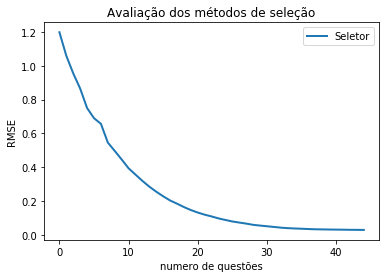

Interval Information Selector
99993
20934.90065431595


In [36]:
base_result = 'Result_IntervalInfoSelector05_theta_orig_100000.txt'

selector = IntervalInfoSelector(0.5)

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

In [ ]:
base_result = 'Result_IntervalInfoSelector1_theta_orig_100000.txt'

selector = IntervalInfoSelector(1)

inicio = time.time()
avalia_seletor_theta_orig(selector, base_result, alunos, aluno_vet, param, items, theta_original)
fim = time.time()
print(fim - inicio)

## Resultados

In [ ]:
plt.style.use("seaborn")

plt.figure(figsize = ((18, 8)))

a = np.loadtxt('Result_RandomSelector_theta_orig_100000.txt')
b = np.loadtxt('Result_MaxInfoSelector_theta_orig_100000.txt')
c = np.loadtxt('Result_UrrySelector_theta_orig_100000.txt')
d = np.loadtxt('Result_IntervalInfoSelector05_theta_orig_100000.txt')
e = np.loadtxt('Result_IntervalInfoSelector1_theta_orig_100000.txt')
f = np.loadtxt('Result_AStratBBlockSelector_theta_orig_100000.txt')

plt.subplot(2, 3, 1)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a[1:,:])**2,axis=0)), label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b[1:,:])**2,axis=0)), label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c[1:,:])**2,axis=0)), label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d[1:,:])**2,axis=0)), label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e[1:,:])**2,axis=0)), label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f[1:,:])**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, 0, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Total 100.000")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

a_new = a[1:,:]
b_new = b[1:,:]
c_new = c[1:,:]
d_new = d[1:,:]
f_new = f[1:,:]
#######################################################################################################

a_base0 = a_new[ind0,:]
b_base0 = b_new[ind0,:]
c_base0 = c_new[ind0,:]
d_base0 = d_new[ind0,:]
e_base0 = e_new[ind0,:]
f_base0 = f_new[ind0,:]

plt.subplot(2, 3, 2)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base0)**2,axis=0)), label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base0)**2,axis=0)), label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base0)**2,axis=0)), label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base0)**2,axis=0)), label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base0)**2,axis=0)), label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base0)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, 0, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 1")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base1 = a_new[ind1,:]
b_base1 = b_new[ind1,:]
c_base1 = c_new[ind1,:]
d_base1 = d_new[ind1,:]
e_base1 = e_new[ind1,:]
f_base1 = f_new[ind1,:]

plt.subplot(2, 3, 3)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base1)**2,axis=0)), label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base1)**2,axis=0)), label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base1)**2,axis=0)), label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base1)**2,axis=0)), label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base1)**2,axis=0)), label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base1)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, 0, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 2")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base2 = a_new[ind2,:]
b_base2 = b_new[ind2,:]
c_base2 = c_new[ind2,:]
d_base2 = d_new[ind2,:]
e_base2 = e_new[ind2,:]
f_base2 = f_new[ind2,:]

plt.subplot(2, 3, 4)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base2)**2,axis=0)), label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base2)**2,axis=0)), label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base2)**2,axis=0)), label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base2)**2,axis=0)), label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base2)**2,axis=0)), label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base2)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, 0, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 3")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base3 = a_new[ind3,:]
b_base3 = b_new[ind3,:]
c_base3 = c_new[ind3,:]
d_base3 = d_new[ind3,:]
e_base3 = e_new[ind3,:]
f_base3 = f_new[ind3,:]

plt.subplot(2, 3, 5)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base3)**2,axis=0)), label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base3)**2,axis=0)), label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base3)**2,axis=0)), label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base3)**2,axis=0)), label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base3)**2,axis=0)), label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base3)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, 0, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 4")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base4 = a_new[ind4,:]
b_base4 = b_new[ind4,:]
c_base4 = c_new[ind4,:]
d_base4 = d_new[ind4,:]
e_base4 = e_new[ind4,:]
f_base4 = f_new[ind4,:]

plt.subplot(2, 3, 6)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base4)**2,axis=0)), label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base4)**2,axis=0)), label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base4)**2,axis=0)), label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base4)**2,axis=0)), label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base4)**2,axis=0)), label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base4)**2,axis=0)), label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, 0, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 5")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()


plt.suptitle("Avaliação dos seletores", fontsize = 18)
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.85, wspace=0.3, hspace=0.3)


plt.show()

In [ ]:
plt.style.use("seaborn")

plt.figure(figsize = ((18, 8)))

a = np.loadtxt('Result_RandomSelector_theta_orig_100000.txt')
b = np.loadtxt('Result_MaxInfoSelector_theta_orig_100000.txt')
base_b = np.sqrt(np.mean((b[1:,:])**2,axis=0))
c = np.loadtxt('Result_UrrySelector_theta_orig_100000.txt')
d = np.loadtxt('Result_IntervalInfoSelector05_theta_orig_100000.txt')
e = np.loadtxt('Result_IntervalInfoSelector1_theta_orig_100000.txt')
f = np.loadtxt('Result_AStratBBlockSelector_theta_orig_100000.txt')

plt.subplot(2, 3, 1)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a[1:,:])**2,axis=0))-base_b, label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b[1:,:])**2,axis=0))-base_b, label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c[1:,:])**2,axis=0))-base_b, label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d[1:,:])**2,axis=0))-base_b, label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e[1:,:])**2,axis=0))-base_b, label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f[1:,:])**2,axis=0))-base_b, label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, -0.5, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Total 100.000")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

a_new = a[1:,:]
b_new = b[1:,:]
c_new = c[1:,:]
d_new = d[1:,:]
f_new = f[1:,:]
#######################################################################################################

a_base0 = a_new[ind0,:]
b_base0 = b_new[ind0,:]
base_b0 = np.sqrt(np.mean((b_base0)**2,axis=0))
c_base0 = c_new[ind0,:]
d_base0 = d_new[ind0,:]
e_base0 = e_new[ind0,:]
f_base0 = f_new[ind0,:]

plt.subplot(2, 3, 2)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base0)**2,axis=0))-base_b0, label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base0)**2,axis=0))-base_b0, label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base0)**2,axis=0))-base_b0, label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base0)**2,axis=0))-base_b0, label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base0)**2,axis=0))-base_b0, label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base0)**2,axis=0))-base_b0, label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, -0.5, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 1")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base1 = a_new[ind1,:]
b_base1 = b_new[ind1,:]
base_b1 = np.sqrt(np.mean((b_base1)**2,axis=0))
c_base1 = c_new[ind1,:]
d_base1 = d_new[ind1,:]
e_base1 = e_new[ind1,:]
f_base1 = f_new[ind1,:]

plt.subplot(2, 3, 3)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base1)**2,axis=0))-base_b1, label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base1)**2,axis=0))-base_b1, label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base1)**2,axis=0))-base_b1, label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base1)**2,axis=0))-base_b1, label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base1)**2,axis=0))-base_b1, label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base1)**2,axis=0))-base_b1, label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, -0.5, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 2")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base2 = a_new[ind2,:]
b_base2 = b_new[ind2,:]
base_b2 = np.sqrt(np.mean((b_base2)**2,axis=0))
c_base2 = c_new[ind2,:]
d_base2 = d_new[ind2,:]
e_base2 = e_new[ind2,:]
f_base2 = f_new[ind2,:]

plt.subplot(2, 3, 4)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base2)**2,axis=0))-base_b2, label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base2)**2,axis=0))-base_b2, label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base2)**2,axis=0))-base_b2, label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base2)**2,axis=0))-base_b2, label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base2)**2,axis=0))-base_b2, label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base2)**2,axis=0))-base_b2, label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, -0.5, 2])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 3")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base3 = a_new[ind3,:]
b_base3 = b_new[ind3,:]
base_b3 = np.sqrt(np.mean((b_base3)**2,axis=0))
c_base3 = c_new[ind3,:]
d_base3 = d_new[ind3,:]
e_base3 = e_new[ind3,:]
f_base3 = f_new[ind3,:]

plt.subplot(2, 3, 5)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base3)**2,axis=0))-base_b3, label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base3)**2,axis=0))-base_b3, label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base3)**2,axis=0))-base_b3, label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base3)**2,axis=0))-base_b3, label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base3)**2,axis=0))-base_b3, label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base3)**2,axis=0))-base_b3, label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, -0.5, 1])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 4")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()

#######################################################################################################

a_base4 = a_new[ind4,:]
b_base4 = b_new[ind4,:]
base_b4 = np.sqrt(np.mean((b_base4)**2,axis=0))
c_base4 = c_new[ind4,:]
d_base4 = d_new[ind4,:]
e_base4 = e_new[ind4,:]
f_base4 = f_new[ind4,:]

plt.subplot(2, 3, 6)
# define a legenda e tamanho de linhas
plt.plot(range(0, 45), np.sqrt(np.mean((a_base4)**2,axis=0))-base_b4, label='Random', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((b_base4)**2,axis=0))-base_b4, label='Max Info', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((c_base4)**2,axis=0))-base_b4, label='Urry', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((d_base4)**2,axis=0))-base_b4, label='Interval Info 0.5', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((e_base4)**2,axis=0))-base_b4, label='Interval Info 1', linewidth=2)
plt.plot(range(0, 45), np.sqrt(np.mean((f_base4)**2,axis=0))-base_b4, label='AStratBBlock', linewidth=2)
plt.axis([-1, 45, -0.5, 1])

plt.xlabel('numero de questões')
plt.ylabel('RMSE')
plt.title("Grupo 5")

# Exibe a legenda e por padrão usa o label de cada plot.
plt.legend()


plt.suptitle("Avaliação dos seletores", fontsize = 18)
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.85, wspace=0.3, hspace=0.3)


plt.show()

### AStratBBlockSelector

In [62]:
def avalia_seletor_theta_orig_abbs(selector, base_result, alunos, aluno_vet, param, items, theta_original, n):
    
    responses = []
    administered_items = []
    theta_est = []
    erro_theta = []

    #initializer = RandomInitializer()
    estimator = NumericalSearchEstimator()
    #est_theta = initializer.initialize()
    full_items = list(range(0, 45))

    nq = 0
    est_theta=0

    result = np.reshape(list(range(0, n)),(1,n))

    for aluno in aluno_vet:
        nq = 0
        est_theta=0
        print('aluno:', aluno)
        respostas = alunos.iloc[aluno,0:45].tolist()
        #ori_theta = estimator.estimate(items=items, administered_items=full_items, response_vector=respostas, est_theta=est_theta)
        ori_theta = theta_original[aluno]
        #print('Theta Original: ',ori_theta)
        responses = []
        administered_items = []
        theta_est = []
        erro_theta = []
        for nq in range(0, n):
            item_index = selector.select(items=items, administered_items=administered_items, est_theta=est_theta)

            correct = alunos.iloc[aluno,item_index]
            administered_items.append(item_index)
            responses.append(correct)

            est_theta = estimator.estimate(items=items, administered_items=administered_items, 
                                           response_vector=responses, est_theta=est_theta)
            theta_est.append(est_theta)
            #print('Theta est: ',est_theta)
            
            erro = ori_theta - est_theta
            erro_theta.append(erro)
            nq = nq+1
        
        #print('itens: ',administered_items)
        #print('erro: ',erro_theta)
        erro_theta = np.reshape(erro_theta,(1,n))
        result = np.concatenate((result, erro_theta), axis=0)

    # define a legenda e tamanho de linhas
    plt.plot(range(0, n), np.sqrt(np.mean((result[1:,:])**2,axis=0)), label='Seletor', linewidth=2)
    #plt.plot(range(0, 45), result[2,], label='Aleatorio', linewidth=2)

    plt.xlabel('numero de questões')
    plt.ylabel('RMSE')
    plt.title("Avaliação dos métodos de seleção")

    np.savetxt(base_result, result)

    # Exibe a legenda e por padrão usa o label de cada plot
    plt.legend()
    plt.show()
    print(selector)
    print(len(aluno_vet))

In [56]:
alunos = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/file100000.xlsx')
param = pd.read_excel('C:/Users/patri/Desktop/CAT-GYM/Calibração/parametros.xlsx')
items = param.iloc[0:45,1:5].to_numpy()
theta_original = np.loadtxt('Result_theta_original-base100000.txt')

In [ ]:
base_result = 'Result_AStratBBlockSelector15_theta_orig_100000.txt'

n=15
selector = AStratBBlockSelector(n)

inicio = time.time()
avalia_seletor_theta_orig_abbs(selector, base_result, alunos, aluno_vet, param, items, theta_original, n)
fim = time.time()
print(fim - inicio)

aluno: 0
aluno: 1
aluno: 2
aluno: 3
aluno: 4
aluno: 5
aluno: 6
aluno: 7
aluno: 8
aluno: 9
aluno: 10
aluno: 11
aluno: 12
aluno: 13
aluno: 14
aluno: 15
aluno: 16
aluno: 17
aluno: 18
aluno: 19
aluno: 20
aluno: 21
aluno: 22
aluno: 23
aluno: 24
aluno: 25
aluno: 26
aluno: 27
aluno: 28
aluno: 29
aluno: 30
aluno: 31
aluno: 32
aluno: 33
aluno: 34
aluno: 35
aluno: 36
aluno: 37
aluno: 38
aluno: 39
aluno: 40
aluno: 41
aluno: 42
aluno: 43
aluno: 44
aluno: 45
aluno: 46
aluno: 47
aluno: 48
aluno: 49
aluno: 50
aluno: 51
aluno: 52
aluno: 53
aluno: 54
aluno: 55
aluno: 56
aluno: 57
aluno: 58
aluno: 59
aluno: 60
aluno: 61
aluno: 62
aluno: 63
aluno: 64
aluno: 65
aluno: 66
aluno: 67
aluno: 68
aluno: 69
aluno: 70
aluno: 71
aluno: 72
aluno: 73
aluno: 74
aluno: 75
aluno: 76
aluno: 77
aluno: 78
aluno: 79
aluno: 80
aluno: 81
aluno: 82
aluno: 83
aluno: 84
aluno: 85
aluno: 86
aluno: 87
aluno: 88
aluno: 89
aluno: 90
aluno: 91
aluno: 92
aluno: 93
aluno: 94
aluno: 95
aluno: 96
aluno: 97
aluno: 98
aluno: 99
aluno: 100

aluno: 758
aluno: 759
aluno: 760
aluno: 761
aluno: 762
aluno: 763
aluno: 764
aluno: 765
aluno: 766
aluno: 767
aluno: 768
aluno: 769
aluno: 770
aluno: 771
aluno: 772
aluno: 773
aluno: 774
aluno: 775
aluno: 776
aluno: 777
aluno: 778
aluno: 779
aluno: 780
aluno: 781
aluno: 782
aluno: 783
aluno: 784
aluno: 785
aluno: 786
aluno: 787
aluno: 788
aluno: 789
aluno: 790
aluno: 791
aluno: 792
aluno: 793
aluno: 794
aluno: 795
aluno: 796
aluno: 797
aluno: 798
aluno: 799
aluno: 800
aluno: 801
aluno: 802
aluno: 803
aluno: 804
aluno: 805
aluno: 806
aluno: 807
aluno: 808
aluno: 809
aluno: 810
aluno: 811
aluno: 812
aluno: 813
aluno: 814
aluno: 815
aluno: 816
aluno: 817
aluno: 818
aluno: 819
aluno: 820
aluno: 821
aluno: 822
aluno: 823
aluno: 824
aluno: 825
aluno: 826
aluno: 827
aluno: 828
aluno: 829
aluno: 830
aluno: 831
aluno: 832
aluno: 833
aluno: 834
aluno: 835
aluno: 836
aluno: 837
aluno: 838
aluno: 839
aluno: 840
aluno: 841
aluno: 842
aluno: 843
aluno: 844
aluno: 845
aluno: 846
aluno: 847
aluno: 848

aluno: 1466
aluno: 1467
aluno: 1468
aluno: 1469
aluno: 1470
aluno: 1471
aluno: 1472
aluno: 1473
aluno: 1474
aluno: 1475
aluno: 1476
aluno: 1477
aluno: 1478
aluno: 1479
aluno: 1480
aluno: 1481
aluno: 1482
aluno: 1483
aluno: 1484
aluno: 1485
aluno: 1486
aluno: 1487
aluno: 1488
aluno: 1489
aluno: 1490
aluno: 1491
aluno: 1492
aluno: 1493
aluno: 1494
aluno: 1495
aluno: 1496
aluno: 1497
aluno: 1498
aluno: 1499
aluno: 1500
aluno: 1501
aluno: 1502
aluno: 1503
aluno: 1504
aluno: 1505
aluno: 1506
aluno: 1507
aluno: 1508
aluno: 1509
aluno: 1510
aluno: 1511
aluno: 1512
aluno: 1513
aluno: 1514
aluno: 1515
aluno: 1516
aluno: 1517
aluno: 1518
aluno: 1519
aluno: 1520
aluno: 1521
aluno: 1522
aluno: 1523
aluno: 1524
aluno: 1525
aluno: 1526
aluno: 1527
aluno: 1528
aluno: 1529
aluno: 1530
aluno: 1531
aluno: 1532
aluno: 1533
aluno: 1534
aluno: 1535
aluno: 1536
aluno: 1537
aluno: 1538
aluno: 1539
aluno: 1540
aluno: 1541
aluno: 1542
aluno: 1543
aluno: 1544
aluno: 1545
aluno: 1546
aluno: 1547
aluno: 1548
alun

aluno: 2151
aluno: 2152
aluno: 2153
aluno: 2154
aluno: 2155
aluno: 2156
aluno: 2157
aluno: 2158
aluno: 2159
aluno: 2160
aluno: 2161
aluno: 2162
aluno: 2163
aluno: 2164
aluno: 2165
aluno: 2166
aluno: 2167
aluno: 2168
aluno: 2169
aluno: 2170
aluno: 2171
aluno: 2172
aluno: 2173
aluno: 2174
aluno: 2175
aluno: 2176
aluno: 2177
aluno: 2178
aluno: 2179
aluno: 2180
aluno: 2181
aluno: 2182
aluno: 2183
aluno: 2184
aluno: 2185
aluno: 2186
aluno: 2187
aluno: 2188
aluno: 2189
aluno: 2190
aluno: 2191
aluno: 2192
aluno: 2193
aluno: 2194
aluno: 2195
aluno: 2196
aluno: 2197
aluno: 2198
aluno: 2199
aluno: 2200
aluno: 2201
aluno: 2202
aluno: 2203
aluno: 2204
aluno: 2205
aluno: 2206
aluno: 2207
aluno: 2208
aluno: 2209
aluno: 2210
aluno: 2211
aluno: 2212
aluno: 2213
aluno: 2214
aluno: 2215
aluno: 2216
aluno: 2217
aluno: 2218
aluno: 2219
aluno: 2220
aluno: 2221
aluno: 2222
aluno: 2223
aluno: 2224
aluno: 2225
aluno: 2226
aluno: 2227
aluno: 2228
aluno: 2229
aluno: 2230
aluno: 2231
aluno: 2232
aluno: 2233
alun

aluno: 2846
aluno: 2847
aluno: 2848
aluno: 2849
aluno: 2850
aluno: 2851
aluno: 2852
aluno: 2853
aluno: 2854
aluno: 2855
aluno: 2856
aluno: 2857
aluno: 2858
aluno: 2859
aluno: 2860
aluno: 2861
aluno: 2862
aluno: 2863
aluno: 2864
aluno: 2865
aluno: 2866
aluno: 2867
aluno: 2868
aluno: 2869
aluno: 2870
aluno: 2871
aluno: 2872
aluno: 2873
aluno: 2874
aluno: 2875
aluno: 2876
aluno: 2877
aluno: 2878
aluno: 2879
aluno: 2880
aluno: 2881
aluno: 2882
aluno: 2883
aluno: 2884
aluno: 2885
aluno: 2886
aluno: 2887
aluno: 2888
aluno: 2889
aluno: 2890
aluno: 2891
aluno: 2892
aluno: 2893
aluno: 2894
aluno: 2895
aluno: 2896
aluno: 2897
aluno: 2898
aluno: 2899
aluno: 2900
aluno: 2901
aluno: 2902
aluno: 2903
aluno: 2904
aluno: 2905
aluno: 2906
aluno: 2907
aluno: 2908
aluno: 2909
aluno: 2910
aluno: 2911
aluno: 2912
aluno: 2913
aluno: 2914
aluno: 2915
aluno: 2916
aluno: 2917
aluno: 2918
aluno: 2919
aluno: 2920
aluno: 2921
aluno: 2922
aluno: 2923
aluno: 2924
aluno: 2925
aluno: 2926
aluno: 2927
aluno: 2928
alun

aluno: 3541
aluno: 3542
aluno: 3543
aluno: 3544
aluno: 3545
aluno: 3546
aluno: 3547
aluno: 3548
aluno: 3549
aluno: 3550
aluno: 3551
aluno: 3552
aluno: 3553
aluno: 3554
aluno: 3555
aluno: 3556
aluno: 3557
aluno: 3558
aluno: 3559
aluno: 3560
aluno: 3561
aluno: 3562
aluno: 3563
aluno: 3564
aluno: 3565
aluno: 3566
aluno: 3567
aluno: 3568
aluno: 3569
aluno: 3570
aluno: 3571
aluno: 3572
aluno: 3573
aluno: 3574
aluno: 3575
aluno: 3576
aluno: 3577
aluno: 3578
aluno: 3579
aluno: 3580
aluno: 3581
aluno: 3582
aluno: 3583
aluno: 3584
aluno: 3585
aluno: 3586
aluno: 3587
aluno: 3588
aluno: 3589
aluno: 3590
aluno: 3591
aluno: 3592
aluno: 3593
aluno: 3594
aluno: 3595
aluno: 3596
aluno: 3597
aluno: 3598
aluno: 3599
aluno: 3600
aluno: 3601
aluno: 3602
aluno: 3603
aluno: 3604
aluno: 3605
aluno: 3606
aluno: 3607
aluno: 3608
aluno: 3609
aluno: 3610
aluno: 3611
aluno: 3612
aluno: 3613
aluno: 3614
aluno: 3615
aluno: 3616
aluno: 3617
aluno: 3618
aluno: 3619
aluno: 3620
aluno: 3621
aluno: 3622
aluno: 3623
alun

aluno: 4228
aluno: 4229
aluno: 4230
aluno: 4231
aluno: 4232
aluno: 4233
aluno: 4234
aluno: 4235
aluno: 4236
aluno: 4237
aluno: 4238
aluno: 4239
aluno: 4240
aluno: 4241
aluno: 4242
aluno: 4243
aluno: 4244
aluno: 4245
aluno: 4246
aluno: 4247
aluno: 4248
aluno: 4249
aluno: 4250
aluno: 4251
aluno: 4252
aluno: 4253
aluno: 4254
aluno: 4255
aluno: 4256
aluno: 4257
aluno: 4258
aluno: 4259
aluno: 4260
aluno: 4261
aluno: 4262
aluno: 4263
aluno: 4264
aluno: 4265
aluno: 4266
aluno: 4267
aluno: 4268
aluno: 4269
aluno: 4270
aluno: 4271
aluno: 4272
aluno: 4273
aluno: 4274
aluno: 4275
aluno: 4276
aluno: 4277
aluno: 4278
aluno: 4279
aluno: 4280
aluno: 4281
aluno: 4282
aluno: 4283
aluno: 4284
aluno: 4285
aluno: 4286
aluno: 4287
aluno: 4288
aluno: 4289
aluno: 4290
aluno: 4291
aluno: 4292
aluno: 4293
aluno: 4294
aluno: 4295
aluno: 4296
aluno: 4297
aluno: 4298
aluno: 4299
aluno: 4300
aluno: 4301
aluno: 4302
aluno: 4303
aluno: 4304
aluno: 4305
aluno: 4306
aluno: 4307
aluno: 4308
aluno: 4309
aluno: 4310
alun

aluno: 4917
aluno: 4918
aluno: 4919
aluno: 4920
aluno: 4921
aluno: 4922
aluno: 4923
aluno: 4924
aluno: 4925
aluno: 4926
aluno: 4927
aluno: 4928
aluno: 4929
aluno: 4930
aluno: 4931
aluno: 4932
aluno: 4933
aluno: 4934
aluno: 4935
aluno: 4936
aluno: 4937
aluno: 4938
aluno: 4939
aluno: 4940
aluno: 4941
aluno: 4942
aluno: 4943
aluno: 4944
aluno: 4945
aluno: 4946
aluno: 4947
aluno: 4948
aluno: 4949
aluno: 4950
aluno: 4951
aluno: 4952
aluno: 4953
aluno: 4954
aluno: 4955
aluno: 4956
aluno: 4957
aluno: 4958
aluno: 4959
aluno: 4960
aluno: 4961
aluno: 4962
aluno: 4963
aluno: 4964
aluno: 4965
aluno: 4966
aluno: 4967
aluno: 4968
aluno: 4969
aluno: 4970
aluno: 4971
aluno: 4972
aluno: 4973
aluno: 4974
aluno: 4975
aluno: 4976
aluno: 4977
aluno: 4978
aluno: 4979
aluno: 4980
aluno: 4981
aluno: 4982
aluno: 4983
aluno: 4984
aluno: 4985
aluno: 4986
aluno: 4987
aluno: 4988
aluno: 4989
aluno: 4990
aluno: 4991
aluno: 4992
aluno: 4993
aluno: 4994
aluno: 4995
aluno: 4996
aluno: 4997
aluno: 4998
aluno: 4999
alun

aluno: 5607
aluno: 5608
aluno: 5609
aluno: 5610
aluno: 5611
aluno: 5612
aluno: 5613
aluno: 5614
aluno: 5615
aluno: 5616
aluno: 5617
aluno: 5618
aluno: 5619
aluno: 5620
aluno: 5621
aluno: 5622
aluno: 5623
aluno: 5624
aluno: 5625
aluno: 5626
aluno: 5627
aluno: 5628
aluno: 5629
aluno: 5630
aluno: 5631
aluno: 5632
aluno: 5633
aluno: 5634
aluno: 5635
aluno: 5636
aluno: 5637
aluno: 5638
aluno: 5639
aluno: 5640
aluno: 5641
aluno: 5642
aluno: 5643
aluno: 5644
aluno: 5645
aluno: 5646
aluno: 5647
aluno: 5648
aluno: 5649
aluno: 5650
aluno: 5651
aluno: 5652
aluno: 5653
aluno: 5654
aluno: 5655
aluno: 5656
aluno: 5657
aluno: 5658
aluno: 5659
aluno: 5660
aluno: 5661
aluno: 5662
aluno: 5663
aluno: 5664
aluno: 5665
aluno: 5666
aluno: 5667
aluno: 5668
aluno: 5669
aluno: 5670
aluno: 5671
aluno: 5672
aluno: 5673
aluno: 5674
aluno: 5675
aluno: 5676
aluno: 5677
aluno: 5678
aluno: 5679
aluno: 5680
aluno: 5681
aluno: 5682
aluno: 5683
aluno: 5684
aluno: 5685
aluno: 5686
aluno: 5687
aluno: 5688
aluno: 5689
alun

aluno: 6300
aluno: 6301
aluno: 6302
aluno: 6303
aluno: 6304
aluno: 6305
aluno: 6306
aluno: 6307
aluno: 6308
aluno: 6309
aluno: 6310
aluno: 6311
aluno: 6312
aluno: 6313
aluno: 6314
aluno: 6315
aluno: 6316
aluno: 6317
aluno: 6318
aluno: 6319
aluno: 6320
aluno: 6321
aluno: 6322
aluno: 6323
aluno: 6324
aluno: 6325
aluno: 6326
aluno: 6327
aluno: 6328
aluno: 6329
aluno: 6330
aluno: 6331
aluno: 6332
aluno: 6333
aluno: 6334
aluno: 6335
aluno: 6336
aluno: 6337
aluno: 6338
aluno: 6339
aluno: 6340
aluno: 6341
aluno: 6342
aluno: 6343
aluno: 6344
aluno: 6345
aluno: 6346
aluno: 6347
aluno: 6348
aluno: 6349
aluno: 6350
aluno: 6351
aluno: 6352
aluno: 6353
aluno: 6354
aluno: 6355
aluno: 6356
aluno: 6357
aluno: 6358
aluno: 6359
aluno: 6360
aluno: 6361
aluno: 6362
aluno: 6363
aluno: 6364
aluno: 6365
aluno: 6366
aluno: 6367
aluno: 6368
aluno: 6369
aluno: 6370
aluno: 6371
aluno: 6372
aluno: 6373
aluno: 6374
aluno: 6375
aluno: 6376
aluno: 6377
aluno: 6378
aluno: 6379
aluno: 6380
aluno: 6381
aluno: 6382
alun

aluno: 6990
aluno: 6991
aluno: 6992
aluno: 6993
aluno: 6994
aluno: 6995
aluno: 6996
aluno: 6997
aluno: 6998
aluno: 6999
aluno: 7000
aluno: 7001
aluno: 7002
aluno: 7003
aluno: 7004
aluno: 7005
aluno: 7006
aluno: 7007
aluno: 7008
aluno: 7009
aluno: 7010
aluno: 7011
aluno: 7012
aluno: 7013
aluno: 7014
aluno: 7015
aluno: 7016
aluno: 7017
aluno: 7018
aluno: 7019
aluno: 7020
aluno: 7021
aluno: 7022
aluno: 7023
aluno: 7024
aluno: 7025
aluno: 7026
aluno: 7027
aluno: 7028
aluno: 7029
aluno: 7030
aluno: 7031
aluno: 7032
aluno: 7033
aluno: 7034
aluno: 7035
aluno: 7036
aluno: 7037
aluno: 7038
aluno: 7039
aluno: 7040
aluno: 7041
aluno: 7042
aluno: 7043
aluno: 7044
aluno: 7045
aluno: 7046
aluno: 7047
aluno: 7048
aluno: 7049
aluno: 7050
aluno: 7051
aluno: 7052
aluno: 7053
aluno: 7054
aluno: 7055
aluno: 7056
aluno: 7057
aluno: 7058
aluno: 7059
aluno: 7060
aluno: 7061
aluno: 7062
aluno: 7063
aluno: 7064
aluno: 7065
aluno: 7066
aluno: 7067
aluno: 7068
aluno: 7069
aluno: 7070
aluno: 7071
aluno: 7072
alun

aluno: 7674
aluno: 7675
aluno: 7676
aluno: 7677
aluno: 7678
aluno: 7679
aluno: 7680
aluno: 7681
aluno: 7682
aluno: 7683
aluno: 7684
aluno: 7685
aluno: 7686
aluno: 7687
aluno: 7688
aluno: 7689
aluno: 7690
aluno: 7691
aluno: 7692
aluno: 7693
aluno: 7694
aluno: 7695
aluno: 7696
aluno: 7697
aluno: 7698
aluno: 7699
aluno: 7700
aluno: 7701
aluno: 7702
aluno: 7703
aluno: 7704
aluno: 7705
aluno: 7706
aluno: 7707
aluno: 7708
aluno: 7709
aluno: 7710
aluno: 7711
aluno: 7712
aluno: 7713
aluno: 7714
aluno: 7715
aluno: 7716
aluno: 7717
aluno: 7718
aluno: 7719
aluno: 7720
aluno: 7721
aluno: 7722
aluno: 7723
aluno: 7724
aluno: 7725
aluno: 7726
aluno: 7727
aluno: 7728
aluno: 7729
aluno: 7730
aluno: 7731
aluno: 7732
aluno: 7733
aluno: 7734
aluno: 7735
aluno: 7736
aluno: 7737
aluno: 7738
aluno: 7739
aluno: 7740
aluno: 7741
aluno: 7742
aluno: 7743
aluno: 7744
aluno: 7745
aluno: 7746
aluno: 7747
aluno: 7748
aluno: 7749
aluno: 7750
aluno: 7751
aluno: 7752
aluno: 7753
aluno: 7754
aluno: 7755
aluno: 7756
alun

aluno: 8369
aluno: 8370
aluno: 8371
aluno: 8372
aluno: 8373
aluno: 8374
aluno: 8375
aluno: 8376
aluno: 8377
aluno: 8378
aluno: 8379
aluno: 8380
aluno: 8381
aluno: 8382
aluno: 8383
aluno: 8384
aluno: 8385
aluno: 8386
aluno: 8387
aluno: 8388
aluno: 8389
aluno: 8390
aluno: 8391
aluno: 8392
aluno: 8393
aluno: 8394
aluno: 8395
aluno: 8396
aluno: 8397
aluno: 8398
aluno: 8399
aluno: 8400
aluno: 8401
aluno: 8402
aluno: 8403
aluno: 8404
aluno: 8405
aluno: 8406
aluno: 8407
aluno: 8408
aluno: 8409
aluno: 8410
aluno: 8411
aluno: 8412
aluno: 8413
aluno: 8414
aluno: 8415
aluno: 8416
aluno: 8417
aluno: 8418
aluno: 8419
aluno: 8420
aluno: 8421
aluno: 8422
aluno: 8423
aluno: 8424
aluno: 8425
aluno: 8426
aluno: 8427
aluno: 8428
aluno: 8429
aluno: 8430
aluno: 8431
aluno: 8432
aluno: 8433
aluno: 8434
aluno: 8435
aluno: 8436
aluno: 8437
aluno: 8438
aluno: 8439
aluno: 8440
aluno: 8441
aluno: 8442
aluno: 8443
aluno: 8444
aluno: 8445
aluno: 8446
aluno: 8447
aluno: 8448
aluno: 8449
aluno: 8450
aluno: 8451
alun

aluno: 9054
aluno: 9055
aluno: 9056
aluno: 9057
aluno: 9058
aluno: 9059
aluno: 9060
aluno: 9061
aluno: 9062
aluno: 9063
aluno: 9064
aluno: 9065
aluno: 9066
aluno: 9067
aluno: 9068
aluno: 9069
aluno: 9070
aluno: 9071
aluno: 9072
aluno: 9073
aluno: 9074
aluno: 9075
aluno: 9076
aluno: 9077
aluno: 9078
aluno: 9079
aluno: 9080
aluno: 9081
aluno: 9082
aluno: 9083
aluno: 9084
aluno: 9085
aluno: 9086
aluno: 9087
aluno: 9088
aluno: 9089
aluno: 9090
aluno: 9091
aluno: 9092
aluno: 9093
aluno: 9094
aluno: 9095
aluno: 9096
aluno: 9097
aluno: 9098
aluno: 9099
aluno: 9100
aluno: 9101
aluno: 9102
aluno: 9103
aluno: 9104
aluno: 9105
aluno: 9106
aluno: 9107
aluno: 9108
aluno: 9109
aluno: 9110
aluno: 9111
aluno: 9112
aluno: 9113
aluno: 9114
aluno: 9115
aluno: 9116
aluno: 9117
aluno: 9118
aluno: 9119
aluno: 9120
aluno: 9121
aluno: 9122
aluno: 9123
aluno: 9124
aluno: 9125
aluno: 9126
aluno: 9127
aluno: 9128
aluno: 9129
aluno: 9130
aluno: 9131
aluno: 9132
aluno: 9133
aluno: 9134
aluno: 9135
aluno: 9136
alun

aluno: 9740
aluno: 9741
aluno: 9742
aluno: 9743
aluno: 9744
aluno: 9745
aluno: 9746
aluno: 9747
aluno: 9748
aluno: 9749
aluno: 9750
aluno: 9751
aluno: 9752
aluno: 9753
aluno: 9754
aluno: 9755
aluno: 9756
aluno: 9757
aluno: 9758
aluno: 9759
aluno: 9760
aluno: 9761
aluno: 9762
aluno: 9763
aluno: 9764
aluno: 9765
aluno: 9766
aluno: 9767
aluno: 9768
aluno: 9769
aluno: 9770
aluno: 9771
aluno: 9772
aluno: 9773
aluno: 9774
aluno: 9775
aluno: 9776
aluno: 9777
aluno: 9778
aluno: 9779
aluno: 9780
aluno: 9781
aluno: 9782
aluno: 9783
aluno: 9784
aluno: 9785
aluno: 9786
aluno: 9787
aluno: 9788
aluno: 9789
aluno: 9790
aluno: 9791
aluno: 9792
aluno: 9793
aluno: 9794
aluno: 9795
aluno: 9796
aluno: 9797
aluno: 9798
aluno: 9799
aluno: 9800
aluno: 9801
aluno: 9802
aluno: 9803
aluno: 9804
aluno: 9805
aluno: 9806
aluno: 9807
aluno: 9808
aluno: 9809
aluno: 9810
aluno: 9811
aluno: 9812
aluno: 9813
aluno: 9814
aluno: 9815
aluno: 9816
aluno: 9817
aluno: 9818
aluno: 9819
aluno: 9820
aluno: 9821
aluno: 9822
alun

aluno: 10394
aluno: 10395
aluno: 10396
aluno: 10397
aluno: 10398
aluno: 10399
aluno: 10400
aluno: 10401
aluno: 10402
aluno: 10403
aluno: 10404
aluno: 10405
aluno: 10406
aluno: 10407
aluno: 10408
aluno: 10409
aluno: 10410
aluno: 10411
aluno: 10412
aluno: 10413
aluno: 10414
aluno: 10415
aluno: 10416
aluno: 10417
aluno: 10418
aluno: 10419
aluno: 10420
aluno: 10421
aluno: 10422
aluno: 10423
aluno: 10424
aluno: 10425
aluno: 10426
aluno: 10427
aluno: 10428
aluno: 10429
aluno: 10430
aluno: 10431
aluno: 10432
aluno: 10433
aluno: 10434
aluno: 10435
aluno: 10436
aluno: 10437
aluno: 10438
aluno: 10439
aluno: 10440
aluno: 10441
aluno: 10442
aluno: 10443
aluno: 10444
aluno: 10445
aluno: 10446
aluno: 10447
aluno: 10448
aluno: 10449
aluno: 10450
aluno: 10451
aluno: 10452
aluno: 10453
aluno: 10454
aluno: 10455
aluno: 10456
aluno: 10457
aluno: 10458
aluno: 10459
aluno: 10460
aluno: 10461
aluno: 10462
aluno: 10463
aluno: 10464
aluno: 10465
aluno: 10466
aluno: 10467
aluno: 10468
aluno: 10469
aluno: 10470

aluno: 11036
aluno: 11037
aluno: 11038
aluno: 11039
aluno: 11040
aluno: 11041
aluno: 11042
aluno: 11043
aluno: 11044
aluno: 11045
aluno: 11046
aluno: 11047
aluno: 11048
aluno: 11049
aluno: 11050
aluno: 11051
aluno: 11052
aluno: 11053
aluno: 11054
aluno: 11055
aluno: 11056
aluno: 11057
aluno: 11058
aluno: 11059
aluno: 11060
aluno: 11061
aluno: 11062
aluno: 11063
aluno: 11064
aluno: 11065
aluno: 11066
aluno: 11067
aluno: 11068
aluno: 11069
aluno: 11070
aluno: 11071
aluno: 11072
aluno: 11073
aluno: 11074
aluno: 11075
aluno: 11076
aluno: 11077
aluno: 11078
aluno: 11079
aluno: 11080
aluno: 11081
aluno: 11082
aluno: 11083
aluno: 11084
aluno: 11085
aluno: 11086
aluno: 11087
aluno: 11088
aluno: 11089
aluno: 11090
aluno: 11091
aluno: 11092
aluno: 11093
aluno: 11094
aluno: 11095
aluno: 11096
aluno: 11097
aluno: 11098
aluno: 11099
aluno: 11100
aluno: 11101
aluno: 11102
aluno: 11103
aluno: 11104
aluno: 11105
aluno: 11106
aluno: 11107
aluno: 11108
aluno: 11109
aluno: 11110
aluno: 11111
aluno: 11112

aluno: 11667
aluno: 11668
aluno: 11669
aluno: 11670
aluno: 11671
aluno: 11672
aluno: 11673
aluno: 11674
aluno: 11675
aluno: 11676
aluno: 11677
aluno: 11678
aluno: 11679
aluno: 11680
aluno: 11681
aluno: 11682
aluno: 11683
aluno: 11684
aluno: 11685
aluno: 11686
aluno: 11687
aluno: 11688
aluno: 11689
aluno: 11690
aluno: 11691
aluno: 11692
aluno: 11693
aluno: 11694
aluno: 11695
aluno: 11696
aluno: 11697
aluno: 11698
aluno: 11699
aluno: 11700
aluno: 11701
aluno: 11702
aluno: 11703
aluno: 11704
aluno: 11705
aluno: 11706
aluno: 11707
aluno: 11708
aluno: 11709
aluno: 11710
aluno: 11711
aluno: 11712
aluno: 11713
aluno: 11714
aluno: 11715
aluno: 11716
aluno: 11717
aluno: 11718
aluno: 11719
aluno: 11720
aluno: 11721
aluno: 11722
aluno: 11723
aluno: 11724
aluno: 11725
aluno: 11726
aluno: 11727
aluno: 11728
aluno: 11729
aluno: 11730
aluno: 11731
aluno: 11732
aluno: 11733
aluno: 11734
aluno: 11735
aluno: 11736
aluno: 11737
aluno: 11738
aluno: 11739
aluno: 11740
aluno: 11741
aluno: 11742
aluno: 11743

aluno: 12303
aluno: 12304
aluno: 12305
aluno: 12306
aluno: 12307
aluno: 12308
aluno: 12309
aluno: 12310
aluno: 12311
aluno: 12312
aluno: 12313
aluno: 12314
aluno: 12315
aluno: 12316
aluno: 12317
aluno: 12318
aluno: 12319
aluno: 12320
aluno: 12321
aluno: 12322
aluno: 12323
aluno: 12324
aluno: 12325
aluno: 12326
aluno: 12327
aluno: 12328
aluno: 12329
aluno: 12330
aluno: 12331
aluno: 12332
aluno: 12333
aluno: 12334
aluno: 12335
aluno: 12336
aluno: 12337
aluno: 12338
aluno: 12339
aluno: 12340
aluno: 12341
aluno: 12342
aluno: 12343
aluno: 12344
aluno: 12345
aluno: 12346
aluno: 12347
aluno: 12348
aluno: 12349
aluno: 12350
aluno: 12351
aluno: 12352
aluno: 12353
aluno: 12354
aluno: 12355
aluno: 12356
aluno: 12357
aluno: 12358
aluno: 12359
aluno: 12360
aluno: 12361
aluno: 12362
aluno: 12363
aluno: 12364
aluno: 12365
aluno: 12366
aluno: 12367
aluno: 12368
aluno: 12369
aluno: 12370
aluno: 12371
aluno: 12372
aluno: 12373
aluno: 12374
aluno: 12375
aluno: 12376
aluno: 12377
aluno: 12378
aluno: 12379

aluno: 12943
aluno: 12944
aluno: 12945
aluno: 12946
aluno: 12947
aluno: 12948
aluno: 12949
aluno: 12950
aluno: 12951
aluno: 12952
aluno: 12953
aluno: 12954
aluno: 12955
aluno: 12956
aluno: 12957
aluno: 12958
aluno: 12959
aluno: 12960
aluno: 12961
aluno: 12962
aluno: 12963
aluno: 12964
aluno: 12965
aluno: 12966
aluno: 12967
aluno: 12968
aluno: 12969
aluno: 12970
aluno: 12971
aluno: 12972
aluno: 12973
aluno: 12974
aluno: 12975
aluno: 12976
aluno: 12977
aluno: 12978
aluno: 12979
aluno: 12980
aluno: 12981
aluno: 12982
aluno: 12983
aluno: 12984
aluno: 12985
aluno: 12986
aluno: 12987
aluno: 12988
aluno: 12989
aluno: 12990
aluno: 12991
aluno: 12992
aluno: 12993
aluno: 12994
aluno: 12995
aluno: 12996
aluno: 12997
aluno: 12998
aluno: 12999
aluno: 13000
aluno: 13001
aluno: 13002
aluno: 13003
aluno: 13004
aluno: 13005
aluno: 13006
aluno: 13007
aluno: 13008
aluno: 13009
aluno: 13010
aluno: 13011
aluno: 13012
aluno: 13013
aluno: 13014
aluno: 13015
aluno: 13016
aluno: 13017
aluno: 13018
aluno: 13019

aluno: 13580
aluno: 13581
aluno: 13582
aluno: 13583
aluno: 13584
aluno: 13585
aluno: 13586
aluno: 13587
aluno: 13588
aluno: 13589
aluno: 13590
aluno: 13591
aluno: 13592
aluno: 13593
aluno: 13594
aluno: 13595
aluno: 13596
aluno: 13597
aluno: 13598
aluno: 13599
aluno: 13600
aluno: 13601
aluno: 13602
aluno: 13603
aluno: 13604
aluno: 13605
aluno: 13606
aluno: 13607
aluno: 13608
aluno: 13609
aluno: 13610
aluno: 13611
aluno: 13612
aluno: 13613
aluno: 13614
aluno: 13615
aluno: 13616
aluno: 13617
aluno: 13618
aluno: 13619
aluno: 13620
aluno: 13621
aluno: 13622
aluno: 13623
aluno: 13624
aluno: 13625
aluno: 13626
aluno: 13627
aluno: 13628
aluno: 13629
aluno: 13630
aluno: 13631
aluno: 13632
aluno: 13633
aluno: 13634
aluno: 13635
aluno: 13636
aluno: 13637
aluno: 13638
aluno: 13639
aluno: 13640
aluno: 13641
aluno: 13642
aluno: 13643
aluno: 13644
aluno: 13645
aluno: 13646
aluno: 13647
aluno: 13648
aluno: 13649
aluno: 13650
aluno: 13651
aluno: 13652
aluno: 13653
aluno: 13654
aluno: 13655
aluno: 13656

aluno: 14212
aluno: 14213
aluno: 14214
aluno: 14215
aluno: 14216
aluno: 14217
aluno: 14218
aluno: 14219
aluno: 14220
aluno: 14221
aluno: 14222
aluno: 14223
aluno: 14224
aluno: 14225
aluno: 14226
aluno: 14227
aluno: 14228
aluno: 14229
aluno: 14230
aluno: 14231
aluno: 14232
aluno: 14233
aluno: 14234
aluno: 14235
aluno: 14236
aluno: 14237
aluno: 14238
aluno: 14239
aluno: 14240
aluno: 14241
aluno: 14242
aluno: 14243
aluno: 14244
aluno: 14245
aluno: 14246
aluno: 14247
aluno: 14248
aluno: 14249
aluno: 14250
aluno: 14251
aluno: 14252
aluno: 14253
aluno: 14254
aluno: 14255
aluno: 14256
aluno: 14257
aluno: 14258
aluno: 14259
aluno: 14260
aluno: 14261
aluno: 14262
aluno: 14263
aluno: 14264
aluno: 14265
aluno: 14266
aluno: 14267
aluno: 14268
aluno: 14269
aluno: 14270
aluno: 14271
aluno: 14272
aluno: 14273
aluno: 14274
aluno: 14275
aluno: 14276
aluno: 14277
aluno: 14278
aluno: 14279
aluno: 14280
aluno: 14281
aluno: 14282
aluno: 14283
aluno: 14284
aluno: 14285
aluno: 14286
aluno: 14287
aluno: 14288

aluno: 14851
aluno: 14852
aluno: 14853
aluno: 14854
aluno: 14855
aluno: 14856
aluno: 14857
aluno: 14858
aluno: 14859
aluno: 14860
aluno: 14861
aluno: 14862
aluno: 14863
aluno: 14864
aluno: 14865
aluno: 14866
aluno: 14867
aluno: 14868
aluno: 14869
aluno: 14870
aluno: 14871
aluno: 14872
aluno: 14873
aluno: 14874
aluno: 14875
aluno: 14876
aluno: 14877
aluno: 14878
aluno: 14879
aluno: 14880
aluno: 14881
aluno: 14882
aluno: 14883
aluno: 14884
aluno: 14885
aluno: 14886
aluno: 14887
aluno: 14888
aluno: 14889
aluno: 14890
aluno: 14891
aluno: 14892
aluno: 14893
aluno: 14894
aluno: 14895
aluno: 14896
aluno: 14897
aluno: 14898
aluno: 14899
aluno: 14900
aluno: 14901
aluno: 14902
aluno: 14903
aluno: 14904
aluno: 14905
aluno: 14906
aluno: 14907
aluno: 14908
aluno: 14909
aluno: 14910
aluno: 14911
aluno: 14912
aluno: 14913
aluno: 14914
aluno: 14915
aluno: 14916
aluno: 14917
aluno: 14918
aluno: 14919
aluno: 14920
aluno: 14921
aluno: 14922
aluno: 14923
aluno: 14924
aluno: 14925
aluno: 14926
aluno: 14927

aluno: 15486
aluno: 15487
aluno: 15488
aluno: 15489
aluno: 15490
aluno: 15491
aluno: 15492
aluno: 15493
aluno: 15494
aluno: 15495
aluno: 15496
aluno: 15497
aluno: 15498
aluno: 15499
aluno: 15500
aluno: 15501
aluno: 15502
aluno: 15503
aluno: 15504
aluno: 15505
aluno: 15506
aluno: 15507
aluno: 15508
aluno: 15509
aluno: 15510
aluno: 15511
aluno: 15512
aluno: 15513
aluno: 15514
aluno: 15515
aluno: 15516
aluno: 15517
aluno: 15518
aluno: 15519
aluno: 15520
aluno: 15521
aluno: 15522
aluno: 15523
aluno: 15524
aluno: 15525
aluno: 15526
aluno: 15527
aluno: 15528
aluno: 15529
aluno: 15530
aluno: 15531
aluno: 15532
aluno: 15533
aluno: 15534
aluno: 15535
aluno: 15536
aluno: 15537
aluno: 15538
aluno: 15539
aluno: 15540
aluno: 15541
aluno: 15542
aluno: 15543
aluno: 15544
aluno: 15545
aluno: 15546
aluno: 15547
aluno: 15548
aluno: 15549
aluno: 15550
aluno: 15551
aluno: 15552
aluno: 15553
aluno: 15554
aluno: 15555
aluno: 15556
aluno: 15557
aluno: 15558
aluno: 15559
aluno: 15560
aluno: 15561
aluno: 15562

aluno: 16121
aluno: 16122
aluno: 16123
aluno: 16124
aluno: 16125
aluno: 16126
aluno: 16127
aluno: 16128
aluno: 16129
aluno: 16130
aluno: 16131
aluno: 16132
aluno: 16133
aluno: 16134
aluno: 16135
aluno: 16136
aluno: 16137
aluno: 16138
aluno: 16139
aluno: 16140
aluno: 16141
aluno: 16142
aluno: 16143
aluno: 16144
aluno: 16145
aluno: 16146
aluno: 16147
aluno: 16148
aluno: 16149
aluno: 16150
aluno: 16151
aluno: 16152
aluno: 16153
aluno: 16154
aluno: 16155
aluno: 16156
aluno: 16157
aluno: 16158
aluno: 16159
aluno: 16160
aluno: 16161
aluno: 16162
aluno: 16163
aluno: 16164
aluno: 16165
aluno: 16166
aluno: 16167
aluno: 16168
aluno: 16169
aluno: 16170
aluno: 16171
aluno: 16172
aluno: 16173
aluno: 16174
aluno: 16175
aluno: 16176
aluno: 16177
aluno: 16178
aluno: 16179
aluno: 16180
aluno: 16181
aluno: 16182
aluno: 16183
aluno: 16184
aluno: 16185
aluno: 16186
aluno: 16187
aluno: 16188
aluno: 16189
aluno: 16190
aluno: 16191
aluno: 16192
aluno: 16193
aluno: 16194
aluno: 16195
aluno: 16196
aluno: 16197

aluno: 16755
aluno: 16756
aluno: 16757
aluno: 16758
aluno: 16759
aluno: 16760
aluno: 16761
aluno: 16762
aluno: 16763
aluno: 16764
aluno: 16765
aluno: 16766
aluno: 16767
aluno: 16768
aluno: 16769
aluno: 16770
aluno: 16771
aluno: 16772
aluno: 16773
aluno: 16774
aluno: 16775
aluno: 16776
aluno: 16777
aluno: 16778
aluno: 16779
aluno: 16780
aluno: 16781
aluno: 16782
aluno: 16783
aluno: 16784
aluno: 16785
aluno: 16786
aluno: 16787
aluno: 16788
aluno: 16789
aluno: 16790
aluno: 16791
aluno: 16792
aluno: 16793
aluno: 16794
aluno: 16795
aluno: 16796
aluno: 16797
aluno: 16798
aluno: 16799
aluno: 16800
aluno: 16801
aluno: 16802
aluno: 16803
aluno: 16804
aluno: 16805
aluno: 16806
aluno: 16807
aluno: 16808
aluno: 16809
aluno: 16810
aluno: 16811
aluno: 16812
aluno: 16813
aluno: 16814
aluno: 16815
aluno: 16816
aluno: 16817
aluno: 16818
aluno: 16819
aluno: 16820
aluno: 16821
aluno: 16822
aluno: 16823
aluno: 16824
aluno: 16825
aluno: 16826
aluno: 16827
aluno: 16828
aluno: 16829
aluno: 16830
aluno: 16831

aluno: 17395
aluno: 17396
aluno: 17397
aluno: 17398
aluno: 17399
aluno: 17400
aluno: 17401
aluno: 17402
aluno: 17403
aluno: 17404
aluno: 17405
aluno: 17406
aluno: 17407
aluno: 17408
aluno: 17409
aluno: 17410
aluno: 17411
aluno: 17412
aluno: 17413
aluno: 17414
aluno: 17415
aluno: 17416
aluno: 17417
aluno: 17418
aluno: 17419
aluno: 17420
aluno: 17421
aluno: 17422
aluno: 17423
aluno: 17424
aluno: 17425
aluno: 17426
aluno: 17427
aluno: 17428
aluno: 17429
aluno: 17430
aluno: 17431
aluno: 17432
aluno: 17433
aluno: 17434
aluno: 17435
aluno: 17436
aluno: 17437
aluno: 17438
aluno: 17439
aluno: 17440
aluno: 17441
aluno: 17442
aluno: 17443
aluno: 17444
aluno: 17445
aluno: 17446
aluno: 17447
aluno: 17448
aluno: 17449
aluno: 17450
aluno: 17451
aluno: 17452
aluno: 17453
aluno: 17454
aluno: 17455
aluno: 17456
aluno: 17457
aluno: 17458
aluno: 17459
aluno: 17460
aluno: 17461
aluno: 17462
aluno: 17463
aluno: 17464
aluno: 17465
aluno: 17466
aluno: 17467
aluno: 17468
aluno: 17469
aluno: 17470
aluno: 17471

In [ ]:
base_result = 'Result_AStratBBlockSelector30_theta_orig_100000.txt'

n=30
selector = AStratBBlockSelector(n)

inicio = time.time()
avalia_seletor_theta_orig_abbs(selector, base_result, alunos, aluno_vet, param, items, theta_original, n)
fim = time.time()
print(fim - inicio)